### Home Credit Default Risk

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

### Evaluation 

Submissions are evaluated on area under the ROC curve between the predicted probability and the observed target.

Submission File
For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

In [ ]:
fea

<a href='#Model'>Model <a>

<a href='#Kernel'>Kernel Code <a>

In [1]:
import pandas as pd
import numpy as np
from sklearn import *
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import time
%matplotlib inline
from contextlib import contextmanager
from sklearn.model_selection import KFold
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve

C:\Anaconda\envs\tensorflow\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
C:\Anaconda\envs\tensorflow\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)
C:\Anaconda\envs\tensorflow\lib\site-packages\sklearn\learning_curve.py:22: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the functions are moved. This module will be removed in 0.20
  DeprecationW

In [2]:
import os

mingw_path = 'D:\\Program files\\MinGW\\mingw64\\bin'

os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
import xgboost as xgb

In [357]:
train = pd.read_csv('./train_data.csv')
#bureau =  pd.read_csv('./bureau.csv')
#bureau_balance = pd.read_csv("./bureau_balance.csv")
#credit_card_balance = pd.read_csv('./credit_card_balance.csv')
#HomeCredit_columns_description = pd.read_csv('./HomeCredit_columns_description.csv')
#nstallments_payments = pd.read_csv('./installments_payments.csv')
#POS_CASH_balance = pd.read_csv('./POS_CASH_balance.csv')
#previous_application = pd.read_csv('./previous_application.csv')


In [5]:
pd.options.display.max_columns=None

#app_train.reset_index()
train.head(10)

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,C,Urban,3300,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,A,Urban,18000,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,C,Rural,3300,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,A,Urban,9600,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,B,Urban,9600,1
5,59951,0.540,17527,282080,2.0,0.0,0.0,99.18,9,B,Rural,22200,1
6,54031,1.000,24829,118400,0.0,0.0,0.0,99.05,11,B,Urban,7500,1
7,94290,1.000,21911,180240,1.0,6.0,4.0,99.33,3,A,Urban,9600,0
8,93730,0.621,9868,92520,0.0,0.0,0.0,99.58,4,A,Urban,7500,1
9,84844,0.908,23008,107180,2.0,0.0,0.0,98.91,11,A,Rural,5400,0


In [7]:
means = train.groupby(['renewal']).mean()
#sns.boxplot(x=app_train['NAME_CONTRACT_TYPE'],y = app_train[''],hue=app_train['TARGET'])
means

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium
renewal,,,,,,,,,,
0,57812.556623,0.626626,16929.642657,177058.799520,0.918591,0.564399,0.351964,98.870256,10.410364,9599.519808
1,57124.074250,0.293433,18974.696867,210969.651727,0.204456,0.046099,0.040739,99.080407,10.894169,11012.975753


C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


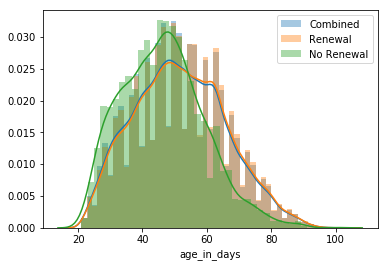

In [13]:
sns.distplot(train['age_in_days']/365, label = 'Combined')
sns.distplot(train.loc[train['renewal']==1,'age_in_days']/365,label ='Renewal')
sns.distplot(train.loc[train['renewal']==0,'age_in_days']/365, label ='No Renewal')
plt.legend()

C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


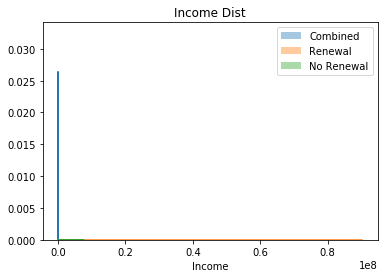

In [14]:
sns.distplot(train['age_in_days']/365, label = 'Combined')
sns.distplot(train.loc[train['renewal']==1,'Income'],label ='Renewal')
sns.distplot(train.loc[train['renewal']==0,'Income'], label ='No Renewal')
plt.title("Income Dist"); plt.legend()

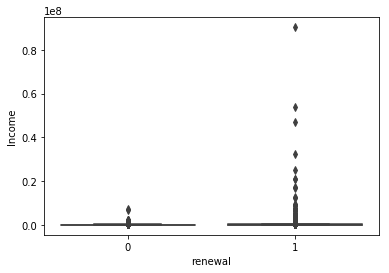

In [15]:
#sns.boxplot(train['age_in_days']/365, label = 'Combined')
sns.boxplot(y=train['Income'],x=train['renewal'])
#sns.distplot(train.loc[train['renewal']==0,'Income'], label ='No Renewal')
#plt.title("Income Dist"); plt.legend()

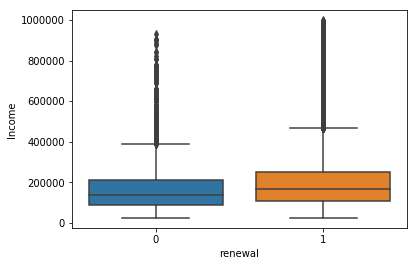

In [16]:
sns.boxplot(y=train.loc[train['Income'] <1000000,'Income'],x=train['renewal'])

In [18]:
dic = {'Income':['min','max','std','mean','count']}
train.groupby(by =['renewal']).agg(dic)

Income                                               
           min       max            std           mean  count
renewal                                                      
0        24030   7500070  207754.301594  177058.799520   4998
1        24030  90262600  510005.936457  210969.651727  74855

C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Anaconda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


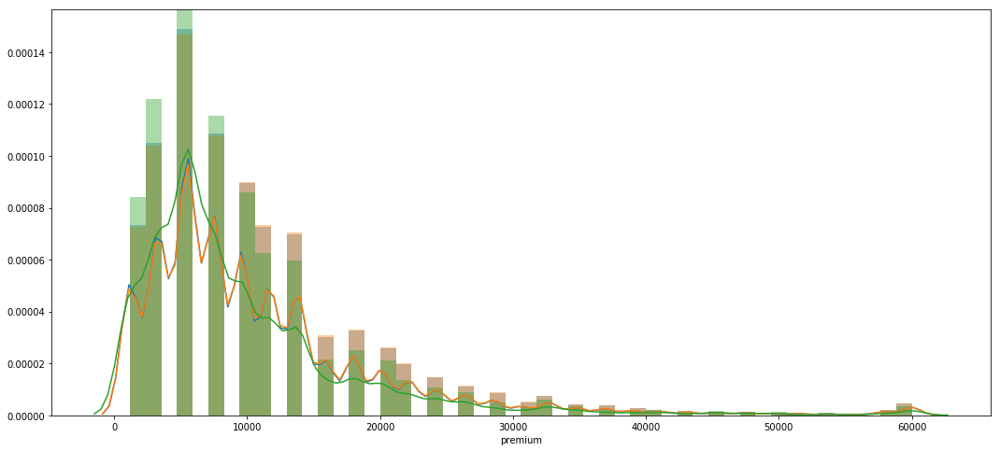

In [23]:
plt.figure(figsize = (18, 8))
sns.distplot(train['premium'])
sns.distplot(train.loc[train['renewal']==1,'premium'],label='Renewal')
sns.distplot(train.loc[train['renewal']==0,'premium'],label='No renewal')

<a id="Model"> Model</a>

In [25]:
train.groupby(['renewal','sourcing_channel']).mean()

id  perc_premium_paid_by_cash_credit  \
renewal sourcing_channel                                                   
0       A                 57752.139208                          0.612850   
        B                 57249.157598                          0.635688   
        C                 56926.310078                          0.634945   
        D                 60346.580442                          0.645088   
        E                 56425.891304                          0.702348   
1       A                 57205.864583                          0.271476   
        B                 56751.570245                          0.305975   
        C                 57269.845277                          0.327118   
        D                 57135.587004                          0.336612   
        E                 58393.783304                          0.342552   

                           age_in_days         Income  Count_3-6_months_late  \
renewal sourcing_channel                                                       
0       A                 17490.181779  163424.819072               0.840329   
        B                 17042.342402  178869.399625               0.984863   
        C                 16022.679956  196759.158361               0.980963   
        D                 15983.558360  193904.369085               1.019017   
        E                 16537.478261  212419.782609               0.739130   
1       A                 19847.802207  184581.689837               0.175569   
        B                 19095.804674  226792.721740               0.225209   
        C                 17051.222162  241301.723240               0.246025   
        D                 16811.118700  275967.451264               0.257655   
        E                 17060.595027  289019.698046               0.250444   

                          Count_6-12_months_late  \
renewal sourcing_channel                           
0       A                               0.554305   
        B                               0.587512   
        C                               0.550952   
        D                               0.599049   
        E                               0.326087   
1       A                               0.040065   
        B                               0.051169   
        C                               0.050391   
        D                               0.061525   
        E                               0.069272   

                          Count_more_than_12_months_late  \
renewal sourcing_channel                                   
0       A                                       0.327997   
        B                                       0.393567   
        C                                       0.346025   
        D                                       0.378764   
        E                                       0.347826   
1       A                                       0.036041   
        B                                       0.042619   
        C                                       0.050031   
        D                                       0.048960   
        E                                       0.044405   

                          application_underwriting_score  no_of_premiums_paid  \
renewal sourcing_channel                                                        
0       A                                      98.880943            10.317156   
        B                                      98.869660            10.642589   
        C                                      98.831688            10.473976   
        D                                      98.885756            10.290221   
        E                                      98.892667            10.195652   
1       A                                      99.115172            10.617654   
        B                                      99.068577            11.307588   
        C                                      98.991333            11.177443   
      

In [255]:
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

def train_process(data):
    df,df_cat = one_hot_encoder(data)
    df['premium_income_ratio'] = df['premium']/df['Income']
    df['amount_in_cash'] = df['premium']*df['perc_premium_paid_by_cash_credit']
    df['above_50']=df['age_in_days']/365>50
    df['total_late_payments']= df['Count_3-6_months_late']+df['Count_6-12_months_late']+df['Count_more_than_12_months_late']
    df['prec_late_payments'] = df['total_late_payments']/(df['total_late_payments']+ df['no_of_premiums_paid'])
    df['prec_late_payments_3'] = df['Count_3-6_months_late']/( df['no_of_premiums_paid'])
    df['prec_late_payments_6'] = df['Count_6-12_months_late']/( df['no_of_premiums_paid'])
    df['prec_late_payments_12'] = df['Count_more_than_12_months_late']/( df['no_of_premiums_paid'])
    #df.drop(['sourcing_channel_C','sourcing_channel_B','residence_area_type_Urban','residence_area_type_nan','sourcing_channel_E','sourcing_channel_nan'],\
    #        axis=1,inplace = True)
    del data
    gc.collect()
    return df


In [42]:
def kfold_lightgbm_2(train_df,y_train,alpha ,lam, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    ##train_df = df[df['TARGET'].notnull()]
    #test_df = df[df['TARGET'].isnull()]
    #print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    print("Starting LightGBM. Train shape: {} ".format(train_df.shape))
    #del df
    #gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=47)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=47)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    #sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['renewal','index','id','SK_ID_PREV','index']]
    model_list = []
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], y_train)):
        train_x, train_y = train_df[feats].iloc[train_idx], y_train.iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], y_train.iloc[valid_idx]


        clf = LGBMClassifier(
            nthread=4,
            #is_unbalance=True,
            n_estimators=10000,
            learning_rate=0.01,
            num_leaves=32,
            #colsample_bytree=0.9497036,
            #subsample=0.8715623,
            colsample_bytree=1,
            subsample=1,
            max_depth=8,
            reg_alpha=alpha,
            #reg_alpha=0.1,
            reg_lambda=lam,
            #reg_lambda=0.1,
            min_split_gain=0.0222415,
            min_child_weight=20,
            silent=False,
            #verbose=-1,
            #scale_pos_weight=11
            )

        mod = clf.fit(train_x, train_y, eval_set=[ (train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc',  early_stopping_rounds= 100)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        #sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        model_list.append(mod)
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()
    print("For Iteration: ",n_fold)
    print('Full AUC score %.6f' % roc_auc_score(y_train, oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    del train_df
    del y_train
    gc.collect()
    #display_importances(feature_importance_df)
    return feature_importance_df,model_list

In [47]:
def display_importances(feature_importance_df_):
    cols_all = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)
    cols = cols_all.index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(20, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')
    return cols_all

In [217]:
def display_test_result(gbm,X_test,y_test):
    predictions = gbm.predict_proba(X_test,num_iteration=gbm.best_iteration_)
    #print("F1 score from Train:",metrics.f1_score(gbm.predict(X_train),y_train)) 
    #fpr, tpr, thresholds = metrics.roc_curve(y_train,gbm.predict_proba(X_train)[:,1])
    #print("The AUC score for training :",metrics.auc(fpr,tpr,True))
    #print("F1 score from Test:",metrics.f1_score(gbm.predict(X_test),y_test)) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test,predictions[:,1])
    print("The AUC score for testing :",metrics.auc(fpr,tpr,True))
    return metrics.auc(fpr,tpr,True)

In [28]:
app_train_en = train_process(train)
#del train
gc.collect
app_train_en.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,renewal,sourcing_channel_A,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,sourcing_channel_nan,residence_area_type_Rural,residence_area_type_Urban,residence_area_type_nan,premium_income_ratio,amount_in_cash,above_50,total_late_payments,prec_late_payments,prec_late_payments_3,prec_late_payments_6,prec_late_payments_12
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,3300,1,0,0,1,0,0,0,0,1,0,0.009294,1415.7,False,0.0,0.000000,0.000000,0.000000,0.000000
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,18000,1,1,0,0,0,0,0,0,1,0,0.057116,180.0,True,0.0,0.000000,0.000000,0.000000,0.000000
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,3300,0,0,0,1,0,0,0,1,0,0,0.039220,3026.1,False,6.0,0.461538,0.285714,0.428571,0.142857
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,9600,1,1,0,0,0,0,0,0,1,0,0.038322,470.4,False,0.0,0.000000,0.000000,0.000000,0.000000
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,9600,1,0,1,0,0,0,0,0,1,0,0.048319,499.2,True,0.0,0.000000,0.000000,0.000000,0.000000


In [356]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(app_train_en.iloc[:,1:],app_train_en['renewal'], test_size=0.0001, stratify=app_train_en['renewal'], random_state=12356)


In [82]:
featurs10, models10 = kfold_lightgbm_2(X_train,y_train,alpha=0,lam = 0.0, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (63882, 27) 
[1]	training's auc: 0.833007	valid_1's auc: 0.842832
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.835733	valid_1's auc: 0.845345
[3]	training's auc: 0.835704	valid_1's auc: 0.845318
[4]	training's auc: 0.835777	valid_1's auc: 0.845263
[5]	training's auc: 0.836238	valid_1's auc: 0.844992
[6]	training's auc: 0.836201	valid_1's auc: 0.844922
[7]	training's auc: 0.83641	valid_1's auc: 0.844994
[8]	training's auc: 0.83623	valid_1's auc: 0.844797
[9]	training's auc: 0.836242	valid_1's auc: 0.844699
[10]	training's auc: 0.836995	valid_1's auc: 0.844471
[11]	training's auc: 0.837127	valid_1's auc: 0.844427
[12]	training's auc: 0.837174	valid_1's auc: 0.844308
[13]	training's auc: 0.837285	valid_1's auc: 0.844288
[14]	training's auc: 0.83759	valid_1's auc: 0.844753
[15]	training's auc: 0.837785	valid_1's auc: 0.845151
[16]	training's auc: 0.837859	valid_1's auc: 0.844981
[17]	training's auc: 0.837977	valid_1's 

[154]	training's auc: 0.853323	valid_1's auc: 0.849995
[155]	training's auc: 0.853377	valid_1's auc: 0.850012
[156]	training's auc: 0.853448	valid_1's auc: 0.850047
[157]	training's auc: 0.853503	valid_1's auc: 0.850042
[158]	training's auc: 0.853561	valid_1's auc: 0.850039
[159]	training's auc: 0.853632	valid_1's auc: 0.850054
[160]	training's auc: 0.853718	valid_1's auc: 0.850062
[161]	training's auc: 0.853785	valid_1's auc: 0.850093
[162]	training's auc: 0.85383	valid_1's auc: 0.85008
[163]	training's auc: 0.853941	valid_1's auc: 0.850111
[164]	training's auc: 0.85403	valid_1's auc: 0.85015
[165]	training's auc: 0.854075	valid_1's auc: 0.850161
[166]	training's auc: 0.854157	valid_1's auc: 0.850211
[167]	training's auc: 0.854223	valid_1's auc: 0.850268
[168]	training's auc: 0.854305	valid_1's auc: 0.850312
[169]	training's auc: 0.854384	valid_1's auc: 0.850361
[170]	training's auc: 0.854441	valid_1's auc: 0.850354
[171]	training's auc: 0.85449	valid_1's auc: 0.850364
[172]	training'

[306]	training's auc: 0.863747	valid_1's auc: 0.851544
[307]	training's auc: 0.863801	valid_1's auc: 0.851558
[308]	training's auc: 0.863882	valid_1's auc: 0.851536
[309]	training's auc: 0.863918	valid_1's auc: 0.851543
[310]	training's auc: 0.863985	valid_1's auc: 0.851525
[311]	training's auc: 0.864059	valid_1's auc: 0.851506
[312]	training's auc: 0.864116	valid_1's auc: 0.851519
[313]	training's auc: 0.864175	valid_1's auc: 0.851503
[314]	training's auc: 0.864255	valid_1's auc: 0.851497
[315]	training's auc: 0.864324	valid_1's auc: 0.851482
[316]	training's auc: 0.864406	valid_1's auc: 0.851473
[317]	training's auc: 0.864475	valid_1's auc: 0.851449
[318]	training's auc: 0.864548	valid_1's auc: 0.851456
[319]	training's auc: 0.864614	valid_1's auc: 0.851443
[320]	training's auc: 0.864683	valid_1's auc: 0.85145
[321]	training's auc: 0.864751	valid_1's auc: 0.851431
[322]	training's auc: 0.864817	valid_1's auc: 0.851404
[323]	training's auc: 0.864887	valid_1's auc: 0.851403
[324]	train

[97]	training's auc: 0.851167	valid_1's auc: 0.836724
[98]	training's auc: 0.851208	valid_1's auc: 0.836772
[99]	training's auc: 0.851278	valid_1's auc: 0.836747
[100]	training's auc: 0.85134	valid_1's auc: 0.836711
[101]	training's auc: 0.85139	valid_1's auc: 0.836692
[102]	training's auc: 0.85146	valid_1's auc: 0.836699
[103]	training's auc: 0.851528	valid_1's auc: 0.836718
[104]	training's auc: 0.85159	valid_1's auc: 0.836698
[105]	training's auc: 0.851758	valid_1's auc: 0.836676
[106]	training's auc: 0.851817	valid_1's auc: 0.836704
[107]	training's auc: 0.851897	valid_1's auc: 0.836623
[108]	training's auc: 0.851981	valid_1's auc: 0.83663
[109]	training's auc: 0.852056	valid_1's auc: 0.836651
[110]	training's auc: 0.85216	valid_1's auc: 0.836662
[111]	training's auc: 0.852279	valid_1's auc: 0.836795
[112]	training's auc: 0.852333	valid_1's auc: 0.83677
[113]	training's auc: 0.852372	valid_1's auc: 0.836799
[114]	training's auc: 0.852515	valid_1's auc: 0.83676
[115]	training's auc:

[246]	training's auc: 0.86262	valid_1's auc: 0.841369
[247]	training's auc: 0.862693	valid_1's auc: 0.841381
[248]	training's auc: 0.862736	valid_1's auc: 0.841386
[249]	training's auc: 0.862802	valid_1's auc: 0.841362
[250]	training's auc: 0.862847	valid_1's auc: 0.8414
[251]	training's auc: 0.862908	valid_1's auc: 0.841431
[252]	training's auc: 0.862966	valid_1's auc: 0.84148
[253]	training's auc: 0.86303	valid_1's auc: 0.841483
[254]	training's auc: 0.863078	valid_1's auc: 0.84151
[255]	training's auc: 0.863162	valid_1's auc: 0.841537
[256]	training's auc: 0.86322	valid_1's auc: 0.841584
[257]	training's auc: 0.863298	valid_1's auc: 0.841598
[258]	training's auc: 0.863341	valid_1's auc: 0.84161
[259]	training's auc: 0.863401	valid_1's auc: 0.841606
[260]	training's auc: 0.863462	valid_1's auc: 0.841634
[261]	training's auc: 0.863532	valid_1's auc: 0.841631
[262]	training's auc: 0.863583	valid_1's auc: 0.841647
[263]	training's auc: 0.863641	valid_1's auc: 0.841673
[264]	training's a

[396]	training's auc: 0.871009	valid_1's auc: 0.841988
[397]	training's auc: 0.871074	valid_1's auc: 0.841985
[398]	training's auc: 0.871114	valid_1's auc: 0.841997
[399]	training's auc: 0.871162	valid_1's auc: 0.841974
[400]	training's auc: 0.871207	valid_1's auc: 0.84194
[401]	training's auc: 0.871249	valid_1's auc: 0.84191
[402]	training's auc: 0.871317	valid_1's auc: 0.841958
[403]	training's auc: 0.871356	valid_1's auc: 0.841929
[404]	training's auc: 0.871395	valid_1's auc: 0.841918
[405]	training's auc: 0.871442	valid_1's auc: 0.841898
[406]	training's auc: 0.871485	valid_1's auc: 0.841864
[407]	training's auc: 0.871538	valid_1's auc: 0.841896
[408]	training's auc: 0.871578	valid_1's auc: 0.84185
[409]	training's auc: 0.871637	valid_1's auc: 0.841847
[410]	training's auc: 0.87168	valid_1's auc: 0.841839
[411]	training's auc: 0.871736	valid_1's auc: 0.841864
[412]	training's auc: 0.871778	valid_1's auc: 0.841852
[413]	training's auc: 0.871816	valid_1's auc: 0.84184
[414]	training'

[120]	training's auc: 0.854864	valid_1's auc: 0.833971
[121]	training's auc: 0.854969	valid_1's auc: 0.833995
[122]	training's auc: 0.855096	valid_1's auc: 0.834053
[123]	training's auc: 0.855211	valid_1's auc: 0.834098
[124]	training's auc: 0.855227	valid_1's auc: 0.833865
[125]	training's auc: 0.855297	valid_1's auc: 0.833897
[126]	training's auc: 0.855348	valid_1's auc: 0.834002
[127]	training's auc: 0.855416	valid_1's auc: 0.834039
[128]	training's auc: 0.855509	valid_1's auc: 0.834171
[129]	training's auc: 0.8556	valid_1's auc: 0.834228
[130]	training's auc: 0.855613	valid_1's auc: 0.834097
[131]	training's auc: 0.855712	valid_1's auc: 0.834119
[132]	training's auc: 0.855863	valid_1's auc: 0.83427
[133]	training's auc: 0.855907	valid_1's auc: 0.834257
[134]	training's auc: 0.855947	valid_1's auc: 0.834286
[135]	training's auc: 0.855978	valid_1's auc: 0.834287
[136]	training's auc: 0.856049	valid_1's auc: 0.83434
[137]	training's auc: 0.85611	valid_1's auc: 0.834373
[138]	training'

[269]	training's auc: 0.864337	valid_1's auc: 0.836513
[270]	training's auc: 0.864391	valid_1's auc: 0.836513
[271]	training's auc: 0.864442	valid_1's auc: 0.836521
[272]	training's auc: 0.864487	valid_1's auc: 0.836528
[273]	training's auc: 0.864545	valid_1's auc: 0.836578
[274]	training's auc: 0.864588	valid_1's auc: 0.836584
[275]	training's auc: 0.864646	valid_1's auc: 0.836637
[276]	training's auc: 0.864699	valid_1's auc: 0.836662
[277]	training's auc: 0.86477	valid_1's auc: 0.83665
[278]	training's auc: 0.86482	valid_1's auc: 0.836657
[279]	training's auc: 0.864891	valid_1's auc: 0.836649
[280]	training's auc: 0.864941	valid_1's auc: 0.836624
[281]	training's auc: 0.865016	valid_1's auc: 0.836623
[282]	training's auc: 0.86506	valid_1's auc: 0.836639
[283]	training's auc: 0.865138	valid_1's auc: 0.836656
[284]	training's auc: 0.865213	valid_1's auc: 0.836659
[285]	training's auc: 0.865253	valid_1's auc: 0.836643
[286]	training's auc: 0.865322	valid_1's auc: 0.836645
[287]	training

[425]	training's auc: 0.87238	valid_1's auc: 0.836467
[426]	training's auc: 0.872437	valid_1's auc: 0.836467
[427]	training's auc: 0.872468	valid_1's auc: 0.836475
[428]	training's auc: 0.8725	valid_1's auc: 0.836481
[429]	training's auc: 0.87256	valid_1's auc: 0.836494
[430]	training's auc: 0.872587	valid_1's auc: 0.836488
[431]	training's auc: 0.872625	valid_1's auc: 0.836485
[432]	training's auc: 0.872679	valid_1's auc: 0.83647
[433]	training's auc: 0.872709	valid_1's auc: 0.836477
[434]	training's auc: 0.872766	valid_1's auc: 0.836481
[435]	training's auc: 0.872795	valid_1's auc: 0.836492
[436]	training's auc: 0.872827	valid_1's auc: 0.836489
[437]	training's auc: 0.872858	valid_1's auc: 0.836489
[438]	training's auc: 0.872926	valid_1's auc: 0.836478
[439]	training's auc: 0.872955	valid_1's auc: 0.83648
[440]	training's auc: 0.87301	valid_1's auc: 0.836478
[441]	training's auc: 0.873036	valid_1's auc: 0.836479
[442]	training's auc: 0.873103	valid_1's auc: 0.836465
[443]	training's 

[98]	training's auc: 0.851284	valid_1's auc: 0.834496
[99]	training's auc: 0.851316	valid_1's auc: 0.834506
[100]	training's auc: 0.851449	valid_1's auc: 0.834525
[101]	training's auc: 0.851487	valid_1's auc: 0.834518
[102]	training's auc: 0.851544	valid_1's auc: 0.834535
[103]	training's auc: 0.851648	valid_1's auc: 0.834576
[104]	training's auc: 0.851698	valid_1's auc: 0.834584
[105]	training's auc: 0.851753	valid_1's auc: 0.834593
[106]	training's auc: 0.851851	valid_1's auc: 0.834679
[107]	training's auc: 0.851936	valid_1's auc: 0.834654
[108]	training's auc: 0.85199	valid_1's auc: 0.834647
[109]	training's auc: 0.852088	valid_1's auc: 0.834625
[110]	training's auc: 0.852161	valid_1's auc: 0.834675
[111]	training's auc: 0.852213	valid_1's auc: 0.834687
[112]	training's auc: 0.852294	valid_1's auc: 0.834714
[113]	training's auc: 0.852395	valid_1's auc: 0.834852
[114]	training's auc: 0.852451	valid_1's auc: 0.834831
[115]	training's auc: 0.852516	valid_1's auc: 0.834834
[116]	trainin

[249]	training's auc: 0.86197	valid_1's auc: 0.83852
[250]	training's auc: 0.86207	valid_1's auc: 0.838515
[251]	training's auc: 0.862121	valid_1's auc: 0.838549
[252]	training's auc: 0.862175	valid_1's auc: 0.838533
[253]	training's auc: 0.862232	valid_1's auc: 0.838556
[254]	training's auc: 0.862317	valid_1's auc: 0.838574
[255]	training's auc: 0.862377	valid_1's auc: 0.838538
[256]	training's auc: 0.862437	valid_1's auc: 0.838587
[257]	training's auc: 0.8625	valid_1's auc: 0.838583
[258]	training's auc: 0.862587	valid_1's auc: 0.838573
[259]	training's auc: 0.862646	valid_1's auc: 0.838564
[260]	training's auc: 0.862731	valid_1's auc: 0.838601
[261]	training's auc: 0.862786	valid_1's auc: 0.838566
[262]	training's auc: 0.862866	valid_1's auc: 0.838575
[263]	training's auc: 0.862944	valid_1's auc: 0.83859
[264]	training's auc: 0.863017	valid_1's auc: 0.838622
[265]	training's auc: 0.863073	valid_1's auc: 0.838616
[266]	training's auc: 0.863131	valid_1's auc: 0.838606
[267]	training's

[399]	training's auc: 0.870696	valid_1's auc: 0.83891
[400]	training's auc: 0.870722	valid_1's auc: 0.838897
[401]	training's auc: 0.870788	valid_1's auc: 0.8389
[402]	training's auc: 0.870808	valid_1's auc: 0.838887
[403]	training's auc: 0.870867	valid_1's auc: 0.838896
[404]	training's auc: 0.870905	valid_1's auc: 0.838891
[405]	training's auc: 0.870958	valid_1's auc: 0.838894
[406]	training's auc: 0.870998	valid_1's auc: 0.838884
[407]	training's auc: 0.871058	valid_1's auc: 0.838923
[408]	training's auc: 0.871087	valid_1's auc: 0.838915
[409]	training's auc: 0.871148	valid_1's auc: 0.838943
[410]	training's auc: 0.871177	valid_1's auc: 0.838935
Early stopping, best iteration is:
[310]	training's auc: 0.865948	valid_1's auc: 0.838945
Fold  4 AUC : 0.838945
[1]	training's auc: 0.838321	valid_1's auc: 0.822984
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.839145	valid_1's auc: 0.823409
[3]	training's auc: 0.839315	valid_1's auc: 0.82328
[4]	train

[141]	training's auc: 0.85705	valid_1's auc: 0.83706
[142]	training's auc: 0.857142	valid_1's auc: 0.837104
[143]	training's auc: 0.857215	valid_1's auc: 0.837072
[144]	training's auc: 0.857292	valid_1's auc: 0.83713
[145]	training's auc: 0.857368	valid_1's auc: 0.837127
[146]	training's auc: 0.857426	valid_1's auc: 0.837143
[147]	training's auc: 0.85752	valid_1's auc: 0.837173
[148]	training's auc: 0.857656	valid_1's auc: 0.837153
[149]	training's auc: 0.857774	valid_1's auc: 0.837175
[150]	training's auc: 0.857848	valid_1's auc: 0.837254
[151]	training's auc: 0.857876	valid_1's auc: 0.83728
[152]	training's auc: 0.857982	valid_1's auc: 0.837354
[153]	training's auc: 0.858042	valid_1's auc: 0.837358
[154]	training's auc: 0.858153	valid_1's auc: 0.837489
[155]	training's auc: 0.858311	valid_1's auc: 0.837506
[156]	training's auc: 0.858368	valid_1's auc: 0.837532
[157]	training's auc: 0.858455	valid_1's auc: 0.83762
[158]	training's auc: 0.858563	valid_1's auc: 0.837632
[159]	training's

[297]	training's auc: 0.866917	valid_1's auc: 0.838912
[298]	training's auc: 0.866983	valid_1's auc: 0.838916
[299]	training's auc: 0.867046	valid_1's auc: 0.83893
[300]	training's auc: 0.867091	valid_1's auc: 0.838937
[301]	training's auc: 0.867139	valid_1's auc: 0.838903
[302]	training's auc: 0.867201	valid_1's auc: 0.838904
[303]	training's auc: 0.867286	valid_1's auc: 0.838913
[304]	training's auc: 0.867356	valid_1's auc: 0.838937
[305]	training's auc: 0.867444	valid_1's auc: 0.838935
[306]	training's auc: 0.867495	valid_1's auc: 0.838894
[307]	training's auc: 0.867575	valid_1's auc: 0.838928
[308]	training's auc: 0.867633	valid_1's auc: 0.838935
[309]	training's auc: 0.86771	valid_1's auc: 0.838948
[310]	training's auc: 0.867755	valid_1's auc: 0.838925
[311]	training's auc: 0.867811	valid_1's auc: 0.838931
[312]	training's auc: 0.867895	valid_1's auc: 0.838928
[313]	training's auc: 0.867952	valid_1's auc: 0.838937
[314]	training's auc: 0.868	valid_1's auc: 0.838934
[315]	training'

In [64]:
train_bas = pd.get_dummies(train)

In [65]:
train_bas.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,renewal,sourcing_channel_A,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,residence_area_type_Rural,residence_area_type_Urban
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,3300,1,0,0,1,0,0,0,1
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,18000,1,1,0,0,0,0,0,1
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,3300,0,0,0,1,0,0,1,0
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,9600,1,1,0,0,0,0,0,1
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,9600,1,0,1,0,0,0,0,1


In [80]:

x_train_bas,x_test_bas,y_train_bas,y_test_bas = train_test_split(train_bas.iloc[:,1:],train_bas['renewal'], test_size=0.2, stratify = train_bas['renewal'], random_state=12356)


In [358]:
train_p = train_process(train)


In [81]:
featurs_bas, models_bas = kfold_lightgbm_2(x_train_bas,y_train_bas,alpha=0,lam = 0.0, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (63882, 17) 
[1]	training's auc: 0.835983	valid_1's auc: 0.842416
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.837923	valid_1's auc: 0.846102
[3]	training's auc: 0.837804	valid_1's auc: 0.846225
[4]	training's auc: 0.83783	valid_1's auc: 0.84657
[5]	training's auc: 0.837803	valid_1's auc: 0.846603
[6]	training's auc: 0.837819	valid_1's auc: 0.84643
[7]	training's auc: 0.837792	valid_1's auc: 0.846778
[8]	training's auc: 0.83793	valid_1's auc: 0.846647
[9]	training's auc: 0.83795	valid_1's auc: 0.846563
[10]	training's auc: 0.838135	valid_1's auc: 0.846621
[11]	training's auc: 0.838269	valid_1's auc: 0.846827
[12]	training's auc: 0.838195	valid_1's auc: 0.846969
[13]	training's auc: 0.838355	valid_1's auc: 0.847661
[14]	training's auc: 0.83832	valid_1's auc: 0.847679
[15]	training's auc: 0.838406	valid_1's auc: 0.847759
[16]	training's auc: 0.838683	valid_1's auc: 0.847805
[17]	training's auc: 0.838761	valid_1's auc

[157]	training's auc: 0.851313	valid_1's auc: 0.849539
[158]	training's auc: 0.85142	valid_1's auc: 0.849679
[159]	training's auc: 0.85148	valid_1's auc: 0.849711
[160]	training's auc: 0.85153	valid_1's auc: 0.849699
[161]	training's auc: 0.851619	valid_1's auc: 0.849731
[162]	training's auc: 0.851713	valid_1's auc: 0.849723
[163]	training's auc: 0.851768	valid_1's auc: 0.849729
[164]	training's auc: 0.851841	valid_1's auc: 0.849727
[165]	training's auc: 0.851899	valid_1's auc: 0.849758
[166]	training's auc: 0.851961	valid_1's auc: 0.849688
[167]	training's auc: 0.851997	valid_1's auc: 0.849711
[168]	training's auc: 0.852162	valid_1's auc: 0.849979
[169]	training's auc: 0.852224	valid_1's auc: 0.849968
[170]	training's auc: 0.852256	valid_1's auc: 0.849942
[171]	training's auc: 0.852314	valid_1's auc: 0.849926
[172]	training's auc: 0.852386	valid_1's auc: 0.849977
[173]	training's auc: 0.852428	valid_1's auc: 0.849945
[174]	training's auc: 0.852492	valid_1's auc: 0.849889
[175]	trainin

[310]	training's auc: 0.860138	valid_1's auc: 0.851091
[311]	training's auc: 0.860176	valid_1's auc: 0.851111
[312]	training's auc: 0.860234	valid_1's auc: 0.851114
[313]	training's auc: 0.8603	valid_1's auc: 0.851151
[314]	training's auc: 0.860362	valid_1's auc: 0.851179
[315]	training's auc: 0.860402	valid_1's auc: 0.851202
[316]	training's auc: 0.860463	valid_1's auc: 0.851225
[317]	training's auc: 0.860516	valid_1's auc: 0.851224
[318]	training's auc: 0.860584	valid_1's auc: 0.851264
[319]	training's auc: 0.860677	valid_1's auc: 0.851265
[320]	training's auc: 0.86072	valid_1's auc: 0.851283
[321]	training's auc: 0.860778	valid_1's auc: 0.851342
[322]	training's auc: 0.860838	valid_1's auc: 0.851376
[323]	training's auc: 0.860883	valid_1's auc: 0.851347
[324]	training's auc: 0.860934	valid_1's auc: 0.851351
[325]	training's auc: 0.860992	valid_1's auc: 0.851374
[326]	training's auc: 0.861054	valid_1's auc: 0.851364
[327]	training's auc: 0.861105	valid_1's auc: 0.851372
[328]	trainin

[37]	training's auc: 0.843448	valid_1's auc: 0.833173
[38]	training's auc: 0.843534	valid_1's auc: 0.833241
[39]	training's auc: 0.8446	valid_1's auc: 0.833855
[40]	training's auc: 0.84474	valid_1's auc: 0.833948
[41]	training's auc: 0.844812	valid_1's auc: 0.833982
[42]	training's auc: 0.84486	valid_1's auc: 0.834067
[43]	training's auc: 0.845006	valid_1's auc: 0.834089
[44]	training's auc: 0.845078	valid_1's auc: 0.834253
[45]	training's auc: 0.845103	valid_1's auc: 0.834259
[46]	training's auc: 0.84524	valid_1's auc: 0.834778
[47]	training's auc: 0.84531	valid_1's auc: 0.835123
[48]	training's auc: 0.845307	valid_1's auc: 0.835085
[49]	training's auc: 0.846264	valid_1's auc: 0.835982
[50]	training's auc: 0.846376	valid_1's auc: 0.836088
[51]	training's auc: 0.846472	valid_1's auc: 0.836074
[52]	training's auc: 0.84651	valid_1's auc: 0.836144
[53]	training's auc: 0.846608	valid_1's auc: 0.83608
[54]	training's auc: 0.846658	valid_1's auc: 0.836177
[55]	training's auc: 0.846738	valid_

[196]	training's auc: 0.856788	valid_1's auc: 0.840756
[197]	training's auc: 0.85685	valid_1's auc: 0.840826
[198]	training's auc: 0.856925	valid_1's auc: 0.840917
[199]	training's auc: 0.85701	valid_1's auc: 0.840927
[200]	training's auc: 0.857058	valid_1's auc: 0.840912
[201]	training's auc: 0.857107	valid_1's auc: 0.840919
[202]	training's auc: 0.857144	valid_1's auc: 0.840926
[203]	training's auc: 0.857204	valid_1's auc: 0.84095
[204]	training's auc: 0.857253	valid_1's auc: 0.84094
[205]	training's auc: 0.857315	valid_1's auc: 0.840938
[206]	training's auc: 0.85735	valid_1's auc: 0.840959
[207]	training's auc: 0.857398	valid_1's auc: 0.840963
[208]	training's auc: 0.857425	valid_1's auc: 0.840966
[209]	training's auc: 0.85747	valid_1's auc: 0.840959
[210]	training's auc: 0.857539	valid_1's auc: 0.841022
[211]	training's auc: 0.857578	valid_1's auc: 0.841035
[212]	training's auc: 0.857623	valid_1's auc: 0.841035
[213]	training's auc: 0.857687	valid_1's auc: 0.841085
[214]	training's

[351]	training's auc: 0.864341	valid_1's auc: 0.842083
[352]	training's auc: 0.864394	valid_1's auc: 0.842058
[353]	training's auc: 0.864432	valid_1's auc: 0.842048
[354]	training's auc: 0.864491	valid_1's auc: 0.842041
[355]	training's auc: 0.864531	valid_1's auc: 0.842057
[356]	training's auc: 0.864602	valid_1's auc: 0.842027
[357]	training's auc: 0.864656	valid_1's auc: 0.842012
[358]	training's auc: 0.864712	valid_1's auc: 0.842003
[359]	training's auc: 0.864763	valid_1's auc: 0.842001
[360]	training's auc: 0.864805	valid_1's auc: 0.842028
[361]	training's auc: 0.864844	valid_1's auc: 0.842039
[362]	training's auc: 0.864885	valid_1's auc: 0.84206
[363]	training's auc: 0.864954	valid_1's auc: 0.842077
[364]	training's auc: 0.865018	valid_1's auc: 0.842084
[365]	training's auc: 0.865063	valid_1's auc: 0.842066
[366]	training's auc: 0.865108	valid_1's auc: 0.842054
[367]	training's auc: 0.865148	valid_1's auc: 0.842076
[368]	training's auc: 0.865209	valid_1's auc: 0.842089
[369]	train

[117]	training's auc: 0.85187	valid_1's auc: 0.834651
[118]	training's auc: 0.851952	valid_1's auc: 0.834643
[119]	training's auc: 0.852023	valid_1's auc: 0.83471
[120]	training's auc: 0.852102	valid_1's auc: 0.834751
[121]	training's auc: 0.852203	valid_1's auc: 0.834876
[122]	training's auc: 0.852271	valid_1's auc: 0.834885
[123]	training's auc: 0.852323	valid_1's auc: 0.834992
[124]	training's auc: 0.852418	valid_1's auc: 0.835004
[125]	training's auc: 0.852434	valid_1's auc: 0.83512
[126]	training's auc: 0.852485	valid_1's auc: 0.835142
[127]	training's auc: 0.852548	valid_1's auc: 0.835199
[128]	training's auc: 0.852584	valid_1's auc: 0.835208
[129]	training's auc: 0.852647	valid_1's auc: 0.835152
[130]	training's auc: 0.852708	valid_1's auc: 0.835209
[131]	training's auc: 0.852745	valid_1's auc: 0.835238
[132]	training's auc: 0.852806	valid_1's auc: 0.835307
[133]	training's auc: 0.852877	valid_1's auc: 0.835403
[134]	training's auc: 0.852894	valid_1's auc: 0.835432
[135]	trainin

[268]	training's auc: 0.861627	valid_1's auc: 0.836251
[269]	training's auc: 0.861666	valid_1's auc: 0.836248
[270]	training's auc: 0.861716	valid_1's auc: 0.836235
[271]	training's auc: 0.861754	valid_1's auc: 0.836249
[272]	training's auc: 0.861818	valid_1's auc: 0.83624
[273]	training's auc: 0.861871	valid_1's auc: 0.836238
[274]	training's auc: 0.861918	valid_1's auc: 0.836228
[275]	training's auc: 0.861988	valid_1's auc: 0.836247
[276]	training's auc: 0.86205	valid_1's auc: 0.836241
[277]	training's auc: 0.862122	valid_1's auc: 0.836244
[278]	training's auc: 0.862202	valid_1's auc: 0.836255
[279]	training's auc: 0.862246	valid_1's auc: 0.836239
[280]	training's auc: 0.862311	valid_1's auc: 0.836247
[281]	training's auc: 0.862367	valid_1's auc: 0.836229
[282]	training's auc: 0.862408	valid_1's auc: 0.836229
[283]	training's auc: 0.862453	valid_1's auc: 0.836226
[284]	training's auc: 0.862496	valid_1's auc: 0.836238
[285]	training's auc: 0.862552	valid_1's auc: 0.836226
[286]	traini

[422]	training's auc: 0.869051	valid_1's auc: 0.836463
[423]	training's auc: 0.869067	valid_1's auc: 0.836483
[424]	training's auc: 0.869129	valid_1's auc: 0.836484
[425]	training's auc: 0.869156	valid_1's auc: 0.83651
[426]	training's auc: 0.869191	valid_1's auc: 0.836496
[427]	training's auc: 0.869249	valid_1's auc: 0.8365
[428]	training's auc: 0.869279	valid_1's auc: 0.83652
[429]	training's auc: 0.869293	valid_1's auc: 0.836533
[430]	training's auc: 0.869347	valid_1's auc: 0.836526
[431]	training's auc: 0.869379	valid_1's auc: 0.836543
[432]	training's auc: 0.869445	valid_1's auc: 0.836557
[433]	training's auc: 0.86948	valid_1's auc: 0.836537
[434]	training's auc: 0.869509	valid_1's auc: 0.836554
[435]	training's auc: 0.869535	valid_1's auc: 0.836574
[436]	training's auc: 0.869561	valid_1's auc: 0.836599
[437]	training's auc: 0.869578	valid_1's auc: 0.836606
[438]	training's auc: 0.869619	valid_1's auc: 0.836597
[439]	training's auc: 0.869676	valid_1's auc: 0.836584
[440]	training'

[579]	training's auc: 0.873131	valid_1's auc: 0.83647
[580]	training's auc: 0.873165	valid_1's auc: 0.836442
[581]	training's auc: 0.873179	valid_1's auc: 0.836452
[582]	training's auc: 0.873202	valid_1's auc: 0.836461
[583]	training's auc: 0.873237	valid_1's auc: 0.836456
[584]	training's auc: 0.873263	valid_1's auc: 0.836446
[585]	training's auc: 0.873291	valid_1's auc: 0.83644
[586]	training's auc: 0.8733	valid_1's auc: 0.836444
[587]	training's auc: 0.873319	valid_1's auc: 0.836437
[588]	training's auc: 0.873355	valid_1's auc: 0.836418
[589]	training's auc: 0.873381	valid_1's auc: 0.836412
[590]	training's auc: 0.873401	valid_1's auc: 0.836409
[591]	training's auc: 0.873437	valid_1's auc: 0.836395
Early stopping, best iteration is:
[491]	training's auc: 0.871012	valid_1's auc: 0.836682
Fold  3 AUC : 0.836682
[1]	training's auc: 0.837285	valid_1's auc: 0.824274
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.837584	valid_1's auc: 0.824211
[3]	tra

[138]	training's auc: 0.853149	valid_1's auc: 0.835199
[139]	training's auc: 0.853322	valid_1's auc: 0.835358
[140]	training's auc: 0.853386	valid_1's auc: 0.835357
[141]	training's auc: 0.853498	valid_1's auc: 0.835492
[142]	training's auc: 0.853511	valid_1's auc: 0.835515
[143]	training's auc: 0.853567	valid_1's auc: 0.835513
[144]	training's auc: 0.853629	valid_1's auc: 0.835567
[145]	training's auc: 0.853671	valid_1's auc: 0.83547
[146]	training's auc: 0.853758	valid_1's auc: 0.835541
[147]	training's auc: 0.85382	valid_1's auc: 0.835582
[148]	training's auc: 0.853857	valid_1's auc: 0.835601
[149]	training's auc: 0.853901	valid_1's auc: 0.835619
[150]	training's auc: 0.853974	valid_1's auc: 0.835687
[151]	training's auc: 0.854095	valid_1's auc: 0.83576
[152]	training's auc: 0.854128	valid_1's auc: 0.835762
[153]	training's auc: 0.85417	valid_1's auc: 0.835793
[154]	training's auc: 0.854237	valid_1's auc: 0.835787
[155]	training's auc: 0.854312	valid_1's auc: 0.835866
[156]	training

[293]	training's auc: 0.862025	valid_1's auc: 0.838708
[294]	training's auc: 0.862073	valid_1's auc: 0.838718
[295]	training's auc: 0.862122	valid_1's auc: 0.838735
[296]	training's auc: 0.862166	valid_1's auc: 0.838758
[297]	training's auc: 0.862208	valid_1's auc: 0.838784
[298]	training's auc: 0.862248	valid_1's auc: 0.838778
[299]	training's auc: 0.86231	valid_1's auc: 0.838795
[300]	training's auc: 0.862356	valid_1's auc: 0.838822
[301]	training's auc: 0.862385	valid_1's auc: 0.838844
[302]	training's auc: 0.86244	valid_1's auc: 0.838863
[303]	training's auc: 0.862495	valid_1's auc: 0.838859
[304]	training's auc: 0.86255	valid_1's auc: 0.838876
[305]	training's auc: 0.862603	valid_1's auc: 0.83888
[306]	training's auc: 0.862654	valid_1's auc: 0.83889
[307]	training's auc: 0.862703	valid_1's auc: 0.83888
[308]	training's auc: 0.862757	valid_1's auc: 0.838907
[309]	training's auc: 0.8628	valid_1's auc: 0.838923
[310]	training's auc: 0.862834	valid_1's auc: 0.838921
[311]	training's a

[442]	training's auc: 0.868601	valid_1's auc: 0.839641
[443]	training's auc: 0.868632	valid_1's auc: 0.839657
[444]	training's auc: 0.868683	valid_1's auc: 0.839633
[445]	training's auc: 0.868729	valid_1's auc: 0.839647
[446]	training's auc: 0.868768	valid_1's auc: 0.839645
[447]	training's auc: 0.868807	valid_1's auc: 0.83965
[448]	training's auc: 0.868825	valid_1's auc: 0.839662
[449]	training's auc: 0.868855	valid_1's auc: 0.839679
[450]	training's auc: 0.868889	valid_1's auc: 0.839685
[451]	training's auc: 0.868909	valid_1's auc: 0.839673
[452]	training's auc: 0.86897	valid_1's auc: 0.839672
[453]	training's auc: 0.869005	valid_1's auc: 0.839657
[454]	training's auc: 0.869024	valid_1's auc: 0.839664
[455]	training's auc: 0.869085	valid_1's auc: 0.839656
[456]	training's auc: 0.869126	valid_1's auc: 0.839672
[457]	training's auc: 0.869147	valid_1's auc: 0.839688
[458]	training's auc: 0.869208	valid_1's auc: 0.839687
[459]	training's auc: 0.86925	valid_1's auc: 0.839674
[460]	trainin

Fold  4 AUC : 0.839717
[1]	training's auc: 0.837889	valid_1's auc: 0.825024
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.838233	valid_1's auc: 0.824979
[3]	training's auc: 0.838503	valid_1's auc: 0.825457
[4]	training's auc: 0.838518	valid_1's auc: 0.825414
[5]	training's auc: 0.838552	valid_1's auc: 0.825387
[6]	training's auc: 0.838624	valid_1's auc: 0.825426
[7]	training's auc: 0.83863	valid_1's auc: 0.825393
[8]	training's auc: 0.838642	valid_1's auc: 0.825552
[9]	training's auc: 0.838935	valid_1's auc: 0.825898
[10]	training's auc: 0.838987	valid_1's auc: 0.825893
[11]	training's auc: 0.839071	valid_1's auc: 0.825959
[12]	training's auc: 0.839061	valid_1's auc: 0.826073
[13]	training's auc: 0.839154	valid_1's auc: 0.826241
[14]	training's auc: 0.839209	valid_1's auc: 0.826328
[15]	training's auc: 0.839329	valid_1's auc: 0.826432
[16]	training's auc: 0.839339	valid_1's auc: 0.82642
[17]	training's auc: 0.839367	valid_1's auc: 0.82658
[18]	tra

[150]	training's auc: 0.853768	valid_1's auc: 0.837469
[151]	training's auc: 0.853829	valid_1's auc: 0.837511
[152]	training's auc: 0.853862	valid_1's auc: 0.837582
[153]	training's auc: 0.853952	valid_1's auc: 0.837636
[154]	training's auc: 0.853999	valid_1's auc: 0.83778
[155]	training's auc: 0.854073	valid_1's auc: 0.837712
[156]	training's auc: 0.854134	valid_1's auc: 0.837843
[157]	training's auc: 0.854243	valid_1's auc: 0.837924
[158]	training's auc: 0.854286	valid_1's auc: 0.837953
[159]	training's auc: 0.854353	valid_1's auc: 0.838037
[160]	training's auc: 0.854466	valid_1's auc: 0.838068
[161]	training's auc: 0.854517	valid_1's auc: 0.838096
[162]	training's auc: 0.854582	valid_1's auc: 0.838131
[163]	training's auc: 0.854639	valid_1's auc: 0.838134
[164]	training's auc: 0.854714	valid_1's auc: 0.838135
[165]	training's auc: 0.854757	valid_1's auc: 0.838198
[166]	training's auc: 0.854833	valid_1's auc: 0.838162
[167]	training's auc: 0.854927	valid_1's auc: 0.838175
[168]	train

[300]	training's auc: 0.863121	valid_1's auc: 0.839528
[301]	training's auc: 0.863165	valid_1's auc: 0.839521
[302]	training's auc: 0.863222	valid_1's auc: 0.839529
[303]	training's auc: 0.863275	valid_1's auc: 0.839543
[304]	training's auc: 0.863342	valid_1's auc: 0.839559
[305]	training's auc: 0.863403	valid_1's auc: 0.839569
[306]	training's auc: 0.863452	valid_1's auc: 0.839572
[307]	training's auc: 0.863517	valid_1's auc: 0.83959
[308]	training's auc: 0.863581	valid_1's auc: 0.839585
[309]	training's auc: 0.863626	valid_1's auc: 0.839595
[310]	training's auc: 0.863688	valid_1's auc: 0.839595
[311]	training's auc: 0.863723	valid_1's auc: 0.839613
[312]	training's auc: 0.863775	valid_1's auc: 0.839593
[313]	training's auc: 0.863838	valid_1's auc: 0.839607
[314]	training's auc: 0.863892	valid_1's auc: 0.839608
[315]	training's auc: 0.863952	valid_1's auc: 0.839601
[316]	training's auc: 0.863987	valid_1's auc: 0.839616
[317]	training's auc: 0.864052	valid_1's auc: 0.839642
[318]	train

[449]	training's auc: 0.869786	valid_1's auc: 0.839588
[450]	training's auc: 0.869806	valid_1's auc: 0.839589
[451]	training's auc: 0.869849	valid_1's auc: 0.839579
[452]	training's auc: 0.869917	valid_1's auc: 0.839565
[453]	training's auc: 0.869953	valid_1's auc: 0.839584
[454]	training's auc: 0.869995	valid_1's auc: 0.839602
[455]	training's auc: 0.870022	valid_1's auc: 0.839593
[456]	training's auc: 0.87005	valid_1's auc: 0.839589
[457]	training's auc: 0.870066	valid_1's auc: 0.839587
[458]	training's auc: 0.870094	valid_1's auc: 0.839595
[459]	training's auc: 0.870125	valid_1's auc: 0.839597
[460]	training's auc: 0.870153	valid_1's auc: 0.839601
[461]	training's auc: 0.870217	valid_1's auc: 0.83958
[462]	training's auc: 0.870235	valid_1's auc: 0.839589
[463]	training's auc: 0.870251	valid_1's auc: 0.83958
[464]	training's auc: 0.870277	valid_1's auc: 0.839571
[465]	training's auc: 0.87034	valid_1's auc: 0.839547
[466]	training's auc: 0.870369	valid_1's auc: 0.839554
[467]	training

,importance
feature,
application_underwriting_score,2166.8
age_in_days,1806.8
perc_premium_paid_by_cash_credit,1691.8
Income,1592.8
no_of_premiums_paid,1269.4
Count_3-6_months_late,1074.4
Count_more_than_12_months_late,803.4
Count_6-12_months_late,768.8
premium,552.6


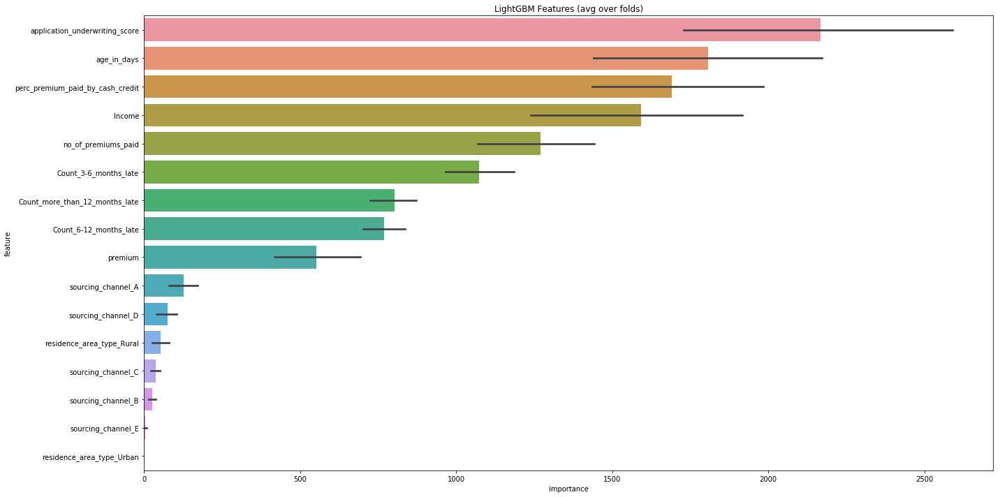

In [83]:
display_importances(featurs_bas)

In [136]:
X_train.drop(['sourcing_channel_C','sourcing_channel_B','residence_area_type_Urban','residence_area_type_nan','sourcing_channel_E','sourcing_channel_nan'],\
            axis=1,inplace = True)

In [41]:
featurs10, models10 = kfold_lightgbm_2(X_train,y_train,alpha=1,lam = 0.01, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (63882, 26) 
[1]	training's auc: 0.837822	valid_1's auc: 0.84052
Training until validation scores don't improve for 100 rounds.
[2]	training's auc: 0.837961	valid_1's auc: 0.840826
[3]	training's auc: 0.840325	valid_1's auc: 0.843337
[4]	training's auc: 0.841508	valid_1's auc: 0.843734
[5]	training's auc: 0.841348	valid_1's auc: 0.843824
[6]	training's auc: 0.841208	valid_1's auc: 0.843606
[7]	training's auc: 0.841681	valid_1's auc: 0.844341
[8]	training's auc: 0.841868	valid_1's auc: 0.844319
[9]	training's auc: 0.841779	valid_1's auc: 0.84414
[10]	training's auc: 0.841742	valid_1's auc: 0.843998
[11]	training's auc: 0.841601	valid_1's auc: 0.843953
[12]	training's auc: 0.841768	valid_1's auc: 0.843973
[13]	training's auc: 0.842688	valid_1's auc: 0.845311
[14]	training's auc: 0.842773	valid_1's auc: 0.845499
[15]	training's auc: 0.842773	valid_1's auc: 0.845633
[16]	training's auc: 0.843367	valid_1's auc: 0.84559
[17]	training's auc: 0.843333	valid_1's 

[153]	training's auc: 0.846132	valid_1's auc: 0.847732
[154]	training's auc: 0.846141	valid_1's auc: 0.847744
[155]	training's auc: 0.84615	valid_1's auc: 0.847736
[156]	training's auc: 0.846163	valid_1's auc: 0.847776
[157]	training's auc: 0.846135	valid_1's auc: 0.847774
[158]	training's auc: 0.84615	valid_1's auc: 0.847777
[159]	training's auc: 0.84616	valid_1's auc: 0.847758
[160]	training's auc: 0.846158	valid_1's auc: 0.84772
[161]	training's auc: 0.846169	valid_1's auc: 0.847743
[162]	training's auc: 0.846193	valid_1's auc: 0.847732
[163]	training's auc: 0.846173	valid_1's auc: 0.847764
[164]	training's auc: 0.846191	valid_1's auc: 0.84779
[165]	training's auc: 0.84621	valid_1's auc: 0.847794
[166]	training's auc: 0.846208	valid_1's auc: 0.847797
[167]	training's auc: 0.846232	valid_1's auc: 0.847805
[168]	training's auc: 0.846241	valid_1's auc: 0.847787
[169]	training's auc: 0.846257	valid_1's auc: 0.847793
[170]	training's auc: 0.846288	valid_1's auc: 0.847789
[171]	training's

[307]	training's auc: 0.84787	valid_1's auc: 0.848984
[308]	training's auc: 0.847887	valid_1's auc: 0.848999
[309]	training's auc: 0.847895	valid_1's auc: 0.849003
[310]	training's auc: 0.847908	valid_1's auc: 0.849006
[311]	training's auc: 0.847918	valid_1's auc: 0.849004
[312]	training's auc: 0.847928	valid_1's auc: 0.849007
[313]	training's auc: 0.847934	valid_1's auc: 0.849018
[314]	training's auc: 0.847942	valid_1's auc: 0.849031
[315]	training's auc: 0.847971	valid_1's auc: 0.84903
[316]	training's auc: 0.847977	valid_1's auc: 0.849029
[317]	training's auc: 0.847986	valid_1's auc: 0.849029
[318]	training's auc: 0.847995	valid_1's auc: 0.849015
[319]	training's auc: 0.848003	valid_1's auc: 0.849015
[320]	training's auc: 0.848008	valid_1's auc: 0.849018
[321]	training's auc: 0.848021	valid_1's auc: 0.849028
[322]	training's auc: 0.848028	valid_1's auc: 0.849038
[323]	training's auc: 0.848041	valid_1's auc: 0.849043
[324]	training's auc: 0.848054	valid_1's auc: 0.849052
[325]	traini

[463]	training's auc: 0.849408	valid_1's auc: 0.849708
[464]	training's auc: 0.849416	valid_1's auc: 0.84971
[465]	training's auc: 0.849425	valid_1's auc: 0.849704
[466]	training's auc: 0.849439	valid_1's auc: 0.849704
[467]	training's auc: 0.84945	valid_1's auc: 0.849707
[468]	training's auc: 0.849459	valid_1's auc: 0.849708
[469]	training's auc: 0.849464	valid_1's auc: 0.849711
[470]	training's auc: 0.849465	valid_1's auc: 0.849709
[471]	training's auc: 0.849471	valid_1's auc: 0.849705
[472]	training's auc: 0.849478	valid_1's auc: 0.849687
[473]	training's auc: 0.849479	valid_1's auc: 0.849689
[474]	training's auc: 0.849495	valid_1's auc: 0.84968
[475]	training's auc: 0.8495	valid_1's auc: 0.849683
[476]	training's auc: 0.849507	valid_1's auc: 0.849686
[477]	training's auc: 0.849509	valid_1's auc: 0.849683
[478]	training's auc: 0.849521	valid_1's auc: 0.849694
[479]	training's auc: 0.849528	valid_1's auc: 0.849685
[480]	training's auc: 0.849534	valid_1's auc: 0.849693
[481]	training'

[621]	training's auc: 0.85054	valid_1's auc: 0.850001
[622]	training's auc: 0.850544	valid_1's auc: 0.850001
[623]	training's auc: 0.850563	valid_1's auc: 0.850042
[624]	training's auc: 0.85057	valid_1's auc: 0.850036
[625]	training's auc: 0.850575	valid_1's auc: 0.85004
[626]	training's auc: 0.850581	valid_1's auc: 0.850035
[627]	training's auc: 0.850608	valid_1's auc: 0.850051
[628]	training's auc: 0.850612	valid_1's auc: 0.850052
[629]	training's auc: 0.850618	valid_1's auc: 0.850058
[630]	training's auc: 0.850624	valid_1's auc: 0.850056
[631]	training's auc: 0.850629	valid_1's auc: 0.850058
[632]	training's auc: 0.850651	valid_1's auc: 0.8501
[633]	training's auc: 0.850661	valid_1's auc: 0.850103
[634]	training's auc: 0.850672	valid_1's auc: 0.850104
[635]	training's auc: 0.85068	valid_1's auc: 0.850107
[636]	training's auc: 0.850689	valid_1's auc: 0.850111
[637]	training's auc: 0.850694	valid_1's auc: 0.850117
[638]	training's auc: 0.850715	valid_1's auc: 0.850123
[639]	training's

[773]	training's auc: 0.852158	valid_1's auc: 0.850781
[774]	training's auc: 0.852169	valid_1's auc: 0.850786
[775]	training's auc: 0.852174	valid_1's auc: 0.850792
[776]	training's auc: 0.85218	valid_1's auc: 0.850794
[777]	training's auc: 0.852185	valid_1's auc: 0.850798
[778]	training's auc: 0.85219	valid_1's auc: 0.850804
[779]	training's auc: 0.852197	valid_1's auc: 0.850815
[780]	training's auc: 0.852208	valid_1's auc: 0.850826
[781]	training's auc: 0.852214	valid_1's auc: 0.850843
[782]	training's auc: 0.852225	valid_1's auc: 0.85085
[783]	training's auc: 0.852234	valid_1's auc: 0.850864
[784]	training's auc: 0.852242	valid_1's auc: 0.850863
[785]	training's auc: 0.852251	valid_1's auc: 0.850862
[786]	training's auc: 0.852259	valid_1's auc: 0.850868
[787]	training's auc: 0.852267	valid_1's auc: 0.850866
[788]	training's auc: 0.852272	valid_1's auc: 0.850876
[789]	training's auc: 0.85228	valid_1's auc: 0.850878
[790]	training's auc: 0.852286	valid_1's auc: 0.850877
[791]	training

[929]	training's auc: 0.853513	valid_1's auc: 0.851376
[930]	training's auc: 0.853528	valid_1's auc: 0.851371
[931]	training's auc: 0.853541	valid_1's auc: 0.851379
[932]	training's auc: 0.853553	valid_1's auc: 0.851378
[933]	training's auc: 0.853562	valid_1's auc: 0.851369
[934]	training's auc: 0.853576	valid_1's auc: 0.851362
[935]	training's auc: 0.853583	valid_1's auc: 0.851364
[936]	training's auc: 0.853594	valid_1's auc: 0.851365
[937]	training's auc: 0.853607	valid_1's auc: 0.851366
[938]	training's auc: 0.853619	valid_1's auc: 0.851367
[939]	training's auc: 0.853632	valid_1's auc: 0.851353
[940]	training's auc: 0.853644	valid_1's auc: 0.851356
[941]	training's auc: 0.853652	valid_1's auc: 0.851361
[942]	training's auc: 0.853662	valid_1's auc: 0.851364
[943]	training's auc: 0.853676	valid_1's auc: 0.851369
[944]	training's auc: 0.853691	valid_1's auc: 0.851364
[945]	training's auc: 0.853705	valid_1's auc: 0.851362
[946]	training's auc: 0.853719	valid_1's auc: 0.851361
[947]	trai

[1083]	training's auc: 0.855143	valid_1's auc: 0.851506
[1084]	training's auc: 0.855155	valid_1's auc: 0.851509
[1085]	training's auc: 0.855167	valid_1's auc: 0.851515
[1086]	training's auc: 0.855175	valid_1's auc: 0.85151
[1087]	training's auc: 0.855185	valid_1's auc: 0.851513
[1088]	training's auc: 0.855196	valid_1's auc: 0.851513
[1089]	training's auc: 0.855208	valid_1's auc: 0.851518
[1090]	training's auc: 0.855219	valid_1's auc: 0.851523
[1091]	training's auc: 0.855229	valid_1's auc: 0.851536
[1092]	training's auc: 0.855242	valid_1's auc: 0.851541
[1093]	training's auc: 0.855248	valid_1's auc: 0.85154
[1094]	training's auc: 0.855261	valid_1's auc: 0.851541
[1095]	training's auc: 0.855271	valid_1's auc: 0.851539
[1096]	training's auc: 0.855278	valid_1's auc: 0.85154
[1097]	training's auc: 0.855286	valid_1's auc: 0.851539
[1098]	training's auc: 0.855294	valid_1's auc: 0.851542
[1099]	training's auc: 0.855304	valid_1's auc: 0.851554
[1100]	training's auc: 0.855314	valid_1's auc: 0.85

[1232]	training's auc: 0.856512	valid_1's auc: 0.851623
[1233]	training's auc: 0.856524	valid_1's auc: 0.85162
[1234]	training's auc: 0.856532	valid_1's auc: 0.851617
[1235]	training's auc: 0.85654	valid_1's auc: 0.851619
[1236]	training's auc: 0.85655	valid_1's auc: 0.851612
[1237]	training's auc: 0.856562	valid_1's auc: 0.851617
[1238]	training's auc: 0.856572	valid_1's auc: 0.851624
[1239]	training's auc: 0.856582	valid_1's auc: 0.851625
[1240]	training's auc: 0.85659	valid_1's auc: 0.851625
[1241]	training's auc: 0.8566	valid_1's auc: 0.85163
[1242]	training's auc: 0.85661	valid_1's auc: 0.851628
[1243]	training's auc: 0.856619	valid_1's auc: 0.851627
[1244]	training's auc: 0.856628	valid_1's auc: 0.851634
[1245]	training's auc: 0.856634	valid_1's auc: 0.851637
[1246]	training's auc: 0.856643	valid_1's auc: 0.851636
[1247]	training's auc: 0.856651	valid_1's auc: 0.85163
[1248]	training's auc: 0.856659	valid_1's auc: 0.851633
[1249]	training's auc: 0.856666	valid_1's auc: 0.851635
[

[94]	training's auc: 0.846814	valid_1's auc: 0.837358
[95]	training's auc: 0.846826	valid_1's auc: 0.837367
[96]	training's auc: 0.846826	valid_1's auc: 0.837373
[97]	training's auc: 0.846843	valid_1's auc: 0.837339
[98]	training's auc: 0.846834	valid_1's auc: 0.83731
[99]	training's auc: 0.846831	valid_1's auc: 0.837286
[100]	training's auc: 0.846838	valid_1's auc: 0.837312
[101]	training's auc: 0.846816	valid_1's auc: 0.837273
[102]	training's auc: 0.84685	valid_1's auc: 0.837335
[103]	training's auc: 0.846848	valid_1's auc: 0.837377
[104]	training's auc: 0.846859	valid_1's auc: 0.83738
[105]	training's auc: 0.846859	valid_1's auc: 0.837346
[106]	training's auc: 0.846855	valid_1's auc: 0.837367
[107]	training's auc: 0.846878	valid_1's auc: 0.837395
[108]	training's auc: 0.846857	valid_1's auc: 0.837467
[109]	training's auc: 0.846855	valid_1's auc: 0.837578
[110]	training's auc: 0.846864	valid_1's auc: 0.83761
[111]	training's auc: 0.846862	valid_1's auc: 0.837669
[112]	training's auc

[250]	training's auc: 0.848826	valid_1's auc: 0.838718
[251]	training's auc: 0.848843	valid_1's auc: 0.838721
[252]	training's auc: 0.848865	valid_1's auc: 0.838729
[253]	training's auc: 0.848874	valid_1's auc: 0.838735
[254]	training's auc: 0.848946	valid_1's auc: 0.838738
[255]	training's auc: 0.848961	valid_1's auc: 0.838734
[256]	training's auc: 0.848972	valid_1's auc: 0.838741
[257]	training's auc: 0.848987	valid_1's auc: 0.838745
[258]	training's auc: 0.848999	valid_1's auc: 0.838748
[259]	training's auc: 0.849005	valid_1's auc: 0.838732
[260]	training's auc: 0.849022	valid_1's auc: 0.838733
[261]	training's auc: 0.849086	valid_1's auc: 0.838741
[262]	training's auc: 0.849097	valid_1's auc: 0.838742
[263]	training's auc: 0.849117	valid_1's auc: 0.838738
[264]	training's auc: 0.84914	valid_1's auc: 0.838734
[265]	training's auc: 0.849171	valid_1's auc: 0.838773
[266]	training's auc: 0.849191	valid_1's auc: 0.83877
[267]	training's auc: 0.849209	valid_1's auc: 0.838772
[268]	traini

[404]	training's auc: 0.850587	valid_1's auc: 0.838943
[405]	training's auc: 0.850594	valid_1's auc: 0.838938
[406]	training's auc: 0.850601	valid_1's auc: 0.83896
[407]	training's auc: 0.850601	valid_1's auc: 0.838943
[408]	training's auc: 0.850623	valid_1's auc: 0.838952
[409]	training's auc: 0.850658	valid_1's auc: 0.839003
[410]	training's auc: 0.850659	valid_1's auc: 0.83901
[411]	training's auc: 0.850681	valid_1's auc: 0.839012
[412]	training's auc: 0.850684	valid_1's auc: 0.839013
[413]	training's auc: 0.85069	valid_1's auc: 0.839011
[414]	training's auc: 0.850714	valid_1's auc: 0.83901
[415]	training's auc: 0.850728	valid_1's auc: 0.83899
[416]	training's auc: 0.850732	valid_1's auc: 0.838985
[417]	training's auc: 0.850749	valid_1's auc: 0.839021
[418]	training's auc: 0.850757	valid_1's auc: 0.839027
[419]	training's auc: 0.850771	valid_1's auc: 0.839001
[420]	training's auc: 0.850773	valid_1's auc: 0.838998
[421]	training's auc: 0.850777	valid_1's auc: 0.839046
[422]	training'

[128]	training's auc: 0.848489	valid_1's auc: 0.831369
[129]	training's auc: 0.848504	valid_1's auc: 0.831377
[130]	training's auc: 0.848516	valid_1's auc: 0.831371
[131]	training's auc: 0.848518	valid_1's auc: 0.83134
[132]	training's auc: 0.848521	valid_1's auc: 0.831342
[133]	training's auc: 0.848551	valid_1's auc: 0.831335
[134]	training's auc: 0.848578	valid_1's auc: 0.831322
[135]	training's auc: 0.848587	valid_1's auc: 0.831345
[136]	training's auc: 0.848622	valid_1's auc: 0.831352
[137]	training's auc: 0.848635	valid_1's auc: 0.831361
[138]	training's auc: 0.848631	valid_1's auc: 0.831365
[139]	training's auc: 0.848614	valid_1's auc: 0.831314
[140]	training's auc: 0.848635	valid_1's auc: 0.831319
[141]	training's auc: 0.848642	valid_1's auc: 0.831328
[142]	training's auc: 0.848695	valid_1's auc: 0.831322
[143]	training's auc: 0.848712	valid_1's auc: 0.831341
[144]	training's auc: 0.848735	valid_1's auc: 0.831325
[145]	training's auc: 0.848748	valid_1's auc: 0.831301
[146]	train

[282]	training's auc: 0.850921	valid_1's auc: 0.832734
[283]	training's auc: 0.850926	valid_1's auc: 0.832731
[284]	training's auc: 0.850939	valid_1's auc: 0.832744
[285]	training's auc: 0.850955	valid_1's auc: 0.832764
[286]	training's auc: 0.850961	valid_1's auc: 0.83277
[287]	training's auc: 0.850968	valid_1's auc: 0.832779
[288]	training's auc: 0.850988	valid_1's auc: 0.832812
[289]	training's auc: 0.850996	valid_1's auc: 0.83281
[290]	training's auc: 0.851007	valid_1's auc: 0.832819
[291]	training's auc: 0.851016	valid_1's auc: 0.832822
[292]	training's auc: 0.851025	valid_1's auc: 0.832829
[293]	training's auc: 0.851031	valid_1's auc: 0.832856
[294]	training's auc: 0.851031	valid_1's auc: 0.832861
[295]	training's auc: 0.851042	valid_1's auc: 0.832856
[296]	training's auc: 0.851049	valid_1's auc: 0.832864
[297]	training's auc: 0.851051	valid_1's auc: 0.832872
[298]	training's auc: 0.851062	valid_1's auc: 0.832866
[299]	training's auc: 0.851067	valid_1's auc: 0.832881
[300]	traini

[441]	training's auc: 0.852073	valid_1's auc: 0.833888
[442]	training's auc: 0.852078	valid_1's auc: 0.833887
[443]	training's auc: 0.852113	valid_1's auc: 0.833939
[444]	training's auc: 0.852115	valid_1's auc: 0.833945
[445]	training's auc: 0.852122	valid_1's auc: 0.833953
[446]	training's auc: 0.852125	valid_1's auc: 0.833958
[447]	training's auc: 0.852172	valid_1's auc: 0.833962
[448]	training's auc: 0.852177	valid_1's auc: 0.833952
[449]	training's auc: 0.852184	valid_1's auc: 0.833955
[450]	training's auc: 0.852192	valid_1's auc: 0.833953
[451]	training's auc: 0.8522	valid_1's auc: 0.833956
[452]	training's auc: 0.852259	valid_1's auc: 0.834062
[453]	training's auc: 0.852262	valid_1's auc: 0.834038
[454]	training's auc: 0.852269	valid_1's auc: 0.834048
[455]	training's auc: 0.852271	valid_1's auc: 0.83405
[456]	training's auc: 0.852278	valid_1's auc: 0.834054
[457]	training's auc: 0.852284	valid_1's auc: 0.834052
[458]	training's auc: 0.852288	valid_1's auc: 0.834063
[459]	trainin

[598]	training's auc: 0.853757	valid_1's auc: 0.834915
[599]	training's auc: 0.85377	valid_1's auc: 0.834949
[600]	training's auc: 0.853782	valid_1's auc: 0.834969
[601]	training's auc: 0.853788	valid_1's auc: 0.834972
[602]	training's auc: 0.853798	valid_1's auc: 0.834985
[603]	training's auc: 0.853813	valid_1's auc: 0.834996
[604]	training's auc: 0.853819	valid_1's auc: 0.835008
[605]	training's auc: 0.853834	valid_1's auc: 0.835053
[606]	training's auc: 0.853842	valid_1's auc: 0.835053
[607]	training's auc: 0.85385	valid_1's auc: 0.835071
[608]	training's auc: 0.853873	valid_1's auc: 0.835038
[609]	training's auc: 0.853879	valid_1's auc: 0.835045
[610]	training's auc: 0.853892	valid_1's auc: 0.835053
[611]	training's auc: 0.853903	valid_1's auc: 0.835063
[612]	training's auc: 0.853914	valid_1's auc: 0.835085
[613]	training's auc: 0.853924	valid_1's auc: 0.83509
[614]	training's auc: 0.853932	valid_1's auc: 0.835105
[615]	training's auc: 0.85395	valid_1's auc: 0.835119
[616]	training

[751]	training's auc: 0.855241	valid_1's auc: 0.835715
[752]	training's auc: 0.855253	valid_1's auc: 0.83573
[753]	training's auc: 0.855264	valid_1's auc: 0.835731
[754]	training's auc: 0.85527	valid_1's auc: 0.835738
[755]	training's auc: 0.855283	valid_1's auc: 0.835733
[756]	training's auc: 0.855294	valid_1's auc: 0.83574
[757]	training's auc: 0.855302	valid_1's auc: 0.835744
[758]	training's auc: 0.855308	valid_1's auc: 0.835767
[759]	training's auc: 0.855317	valid_1's auc: 0.835789
[760]	training's auc: 0.855325	valid_1's auc: 0.835792
[761]	training's auc: 0.855338	valid_1's auc: 0.835784
[762]	training's auc: 0.855345	valid_1's auc: 0.835791
[763]	training's auc: 0.855355	valid_1's auc: 0.835801
[764]	training's auc: 0.855372	valid_1's auc: 0.835805
[765]	training's auc: 0.855384	valid_1's auc: 0.835812
[766]	training's auc: 0.855389	valid_1's auc: 0.835816
[767]	training's auc: 0.855407	valid_1's auc: 0.83581
[768]	training's auc: 0.855416	valid_1's auc: 0.835819
[769]	training

[905]	training's auc: 0.856494	valid_1's auc: 0.836247
[906]	training's auc: 0.856501	valid_1's auc: 0.836248
[907]	training's auc: 0.856508	valid_1's auc: 0.836249
[908]	training's auc: 0.856517	valid_1's auc: 0.836256
[909]	training's auc: 0.856529	valid_1's auc: 0.836261
[910]	training's auc: 0.856541	valid_1's auc: 0.836259
[911]	training's auc: 0.856552	valid_1's auc: 0.83627
[912]	training's auc: 0.856562	valid_1's auc: 0.836269
[913]	training's auc: 0.856569	valid_1's auc: 0.83628
[914]	training's auc: 0.856579	valid_1's auc: 0.836279
[915]	training's auc: 0.856584	valid_1's auc: 0.836282
[916]	training's auc: 0.856595	valid_1's auc: 0.836288
[917]	training's auc: 0.856604	valid_1's auc: 0.836286
[918]	training's auc: 0.856612	valid_1's auc: 0.836292
[919]	training's auc: 0.856623	valid_1's auc: 0.836295
[920]	training's auc: 0.856635	valid_1's auc: 0.836297
[921]	training's auc: 0.856643	valid_1's auc: 0.836309
[922]	training's auc: 0.856655	valid_1's auc: 0.836319
[923]	traini

[1060]	training's auc: 0.858354	valid_1's auc: 0.836491
[1061]	training's auc: 0.85836	valid_1's auc: 0.836492
[1062]	training's auc: 0.858373	valid_1's auc: 0.836497
[1063]	training's auc: 0.858387	valid_1's auc: 0.83649
[1064]	training's auc: 0.858398	valid_1's auc: 0.836495
[1065]	training's auc: 0.85841	valid_1's auc: 0.83649
[1066]	training's auc: 0.858425	valid_1's auc: 0.836485
[1067]	training's auc: 0.858433	valid_1's auc: 0.83649
[1068]	training's auc: 0.858448	valid_1's auc: 0.836489
[1069]	training's auc: 0.858459	valid_1's auc: 0.836488
[1070]	training's auc: 0.858468	valid_1's auc: 0.836481
[1071]	training's auc: 0.858484	valid_1's auc: 0.836485
[1072]	training's auc: 0.858495	valid_1's auc: 0.836494
[1073]	training's auc: 0.858507	valid_1's auc: 0.836498
[1074]	training's auc: 0.858519	valid_1's auc: 0.836501
[1075]	training's auc: 0.858531	valid_1's auc: 0.836503
[1076]	training's auc: 0.858547	valid_1's auc: 0.836506
[1077]	training's auc: 0.858557	valid_1's auc: 0.8365

[1211]	training's auc: 0.859782	valid_1's auc: 0.836585
[1212]	training's auc: 0.85979	valid_1's auc: 0.836579
[1213]	training's auc: 0.859799	valid_1's auc: 0.836581
[1214]	training's auc: 0.859805	valid_1's auc: 0.836584
[1215]	training's auc: 0.859813	valid_1's auc: 0.836578
[1216]	training's auc: 0.859826	valid_1's auc: 0.836582
[1217]	training's auc: 0.859836	valid_1's auc: 0.836581
[1218]	training's auc: 0.859846	valid_1's auc: 0.836576
[1219]	training's auc: 0.859855	valid_1's auc: 0.836581
[1220]	training's auc: 0.859862	valid_1's auc: 0.836586
[1221]	training's auc: 0.85987	valid_1's auc: 0.836592
[1222]	training's auc: 0.85988	valid_1's auc: 0.836589
[1223]	training's auc: 0.85989	valid_1's auc: 0.836589
[1224]	training's auc: 0.859895	valid_1's auc: 0.836582
[1225]	training's auc: 0.859902	valid_1's auc: 0.836582
[1226]	training's auc: 0.859909	valid_1's auc: 0.836586
[1227]	training's auc: 0.859916	valid_1's auc: 0.836579
[1228]	training's auc: 0.859926	valid_1's auc: 0.836

[63]	training's auc: 0.847942	valid_1's auc: 0.83244
[64]	training's auc: 0.847945	valid_1's auc: 0.832411
[65]	training's auc: 0.847951	valid_1's auc: 0.8325
[66]	training's auc: 0.847977	valid_1's auc: 0.832661
[67]	training's auc: 0.847885	valid_1's auc: 0.83282
[68]	training's auc: 0.847858	valid_1's auc: 0.832898
[69]	training's auc: 0.847823	valid_1's auc: 0.832994
[70]	training's auc: 0.847839	valid_1's auc: 0.833071
[71]	training's auc: 0.847834	valid_1's auc: 0.832978
[72]	training's auc: 0.847849	valid_1's auc: 0.83296
[73]	training's auc: 0.847855	valid_1's auc: 0.833031
[74]	training's auc: 0.847848	valid_1's auc: 0.832976
[75]	training's auc: 0.847848	valid_1's auc: 0.833022
[76]	training's auc: 0.847819	valid_1's auc: 0.833017
[77]	training's auc: 0.847842	valid_1's auc: 0.833003
[78]	training's auc: 0.847827	valid_1's auc: 0.833064
[79]	training's auc: 0.847867	valid_1's auc: 0.833063
[80]	training's auc: 0.847864	valid_1's auc: 0.833137
[81]	training's auc: 0.847895	val

[222]	training's auc: 0.848744	valid_1's auc: 0.834688
[223]	training's auc: 0.848752	valid_1's auc: 0.834702
[224]	training's auc: 0.848754	valid_1's auc: 0.834702
[225]	training's auc: 0.84881	valid_1's auc: 0.834692
[226]	training's auc: 0.848814	valid_1's auc: 0.834706
[227]	training's auc: 0.848828	valid_1's auc: 0.834721
[228]	training's auc: 0.848819	valid_1's auc: 0.834721
[229]	training's auc: 0.848819	valid_1's auc: 0.834725
[230]	training's auc: 0.848833	valid_1's auc: 0.834738
[231]	training's auc: 0.848833	valid_1's auc: 0.83475
[232]	training's auc: 0.848827	valid_1's auc: 0.834754
[233]	training's auc: 0.848843	valid_1's auc: 0.834758
[234]	training's auc: 0.848839	valid_1's auc: 0.834761
[235]	training's auc: 0.848864	valid_1's auc: 0.834781
[236]	training's auc: 0.848862	valid_1's auc: 0.834793
[237]	training's auc: 0.848856	valid_1's auc: 0.834793
[238]	training's auc: 0.848866	valid_1's auc: 0.834807
[239]	training's auc: 0.848866	valid_1's auc: 0.834812
[240]	traini

[374]	training's auc: 0.850338	valid_1's auc: 0.835146
[375]	training's auc: 0.850339	valid_1's auc: 0.835138
[376]	training's auc: 0.850347	valid_1's auc: 0.835141
[377]	training's auc: 0.850356	valid_1's auc: 0.835139
[378]	training's auc: 0.850362	valid_1's auc: 0.835139
[379]	training's auc: 0.850365	valid_1's auc: 0.835142
[380]	training's auc: 0.85037	valid_1's auc: 0.835142
[381]	training's auc: 0.850382	valid_1's auc: 0.835166
[382]	training's auc: 0.850383	valid_1's auc: 0.835168
[383]	training's auc: 0.850393	valid_1's auc: 0.835167
[384]	training's auc: 0.850595	valid_1's auc: 0.835276
[385]	training's auc: 0.850602	valid_1's auc: 0.835285
[386]	training's auc: 0.850609	valid_1's auc: 0.835284
[387]	training's auc: 0.850615	valid_1's auc: 0.835286
[388]	training's auc: 0.850618	valid_1's auc: 0.835289
[389]	training's auc: 0.850624	valid_1's auc: 0.835295
[390]	training's auc: 0.850629	valid_1's auc: 0.835292
[391]	training's auc: 0.850655	valid_1's auc: 0.835291
[392]	train

[527]	training's auc: 0.851912	valid_1's auc: 0.83608
[528]	training's auc: 0.851917	valid_1's auc: 0.836078
[529]	training's auc: 0.851925	valid_1's auc: 0.836092
[530]	training's auc: 0.851933	valid_1's auc: 0.836094
[531]	training's auc: 0.851947	valid_1's auc: 0.836077
[532]	training's auc: 0.852009	valid_1's auc: 0.836227
[533]	training's auc: 0.852008	valid_1's auc: 0.836225
[534]	training's auc: 0.852024	valid_1's auc: 0.836237
[535]	training's auc: 0.852028	valid_1's auc: 0.836236
[536]	training's auc: 0.852034	valid_1's auc: 0.836238
[537]	training's auc: 0.852046	valid_1's auc: 0.836252
[538]	training's auc: 0.852058	valid_1's auc: 0.836247
[539]	training's auc: 0.85207	valid_1's auc: 0.836245
[540]	training's auc: 0.852073	valid_1's auc: 0.836258
[541]	training's auc: 0.852085	valid_1's auc: 0.836261
[542]	training's auc: 0.852088	valid_1's auc: 0.836272
[543]	training's auc: 0.8521	valid_1's auc: 0.836277
[544]	training's auc: 0.852107	valid_1's auc: 0.836282
[545]	training

[681]	training's auc: 0.853289	valid_1's auc: 0.837058
[682]	training's auc: 0.853292	valid_1's auc: 0.83706
[683]	training's auc: 0.853303	valid_1's auc: 0.837067
[684]	training's auc: 0.853308	valid_1's auc: 0.837075
[685]	training's auc: 0.853317	valid_1's auc: 0.837084
[686]	training's auc: 0.853321	valid_1's auc: 0.837086
[687]	training's auc: 0.853337	valid_1's auc: 0.837093
[688]	training's auc: 0.853347	valid_1's auc: 0.837116
[689]	training's auc: 0.853357	valid_1's auc: 0.837125
[690]	training's auc: 0.853381	valid_1's auc: 0.837101
[691]	training's auc: 0.853396	valid_1's auc: 0.837098
[692]	training's auc: 0.853403	valid_1's auc: 0.837095
[693]	training's auc: 0.853414	valid_1's auc: 0.837102
[694]	training's auc: 0.853423	valid_1's auc: 0.837114
[695]	training's auc: 0.853428	valid_1's auc: 0.83712
[696]	training's auc: 0.85343	valid_1's auc: 0.837122
[697]	training's auc: 0.853441	valid_1's auc: 0.837137
[698]	training's auc: 0.853449	valid_1's auc: 0.837149
[699]	trainin

[833]	training's auc: 0.854935	valid_1's auc: 0.83797
[834]	training's auc: 0.854941	valid_1's auc: 0.837972
[835]	training's auc: 0.854947	valid_1's auc: 0.837973
[836]	training's auc: 0.854955	valid_1's auc: 0.837977
[837]	training's auc: 0.854966	valid_1's auc: 0.837989
[838]	training's auc: 0.854976	valid_1's auc: 0.837985
[839]	training's auc: 0.854985	valid_1's auc: 0.838001
[840]	training's auc: 0.855	valid_1's auc: 0.838013
[841]	training's auc: 0.855011	valid_1's auc: 0.838012
[842]	training's auc: 0.855021	valid_1's auc: 0.838032
[843]	training's auc: 0.855035	valid_1's auc: 0.838034
[844]	training's auc: 0.855042	valid_1's auc: 0.838034
[845]	training's auc: 0.855055	valid_1's auc: 0.838042
[846]	training's auc: 0.855065	valid_1's auc: 0.838043
[847]	training's auc: 0.855076	valid_1's auc: 0.838064
[848]	training's auc: 0.855087	valid_1's auc: 0.838074
[849]	training's auc: 0.855098	valid_1's auc: 0.838084
[850]	training's auc: 0.85511	valid_1's auc: 0.838089
[851]	training'

[989]	training's auc: 0.856321	valid_1's auc: 0.838332
[990]	training's auc: 0.856329	valid_1's auc: 0.838341
[991]	training's auc: 0.856338	valid_1's auc: 0.838346
[992]	training's auc: 0.856347	valid_1's auc: 0.838336
[993]	training's auc: 0.856355	valid_1's auc: 0.83834
[994]	training's auc: 0.856364	valid_1's auc: 0.838343
[995]	training's auc: 0.856375	valid_1's auc: 0.838352
[996]	training's auc: 0.856386	valid_1's auc: 0.838356
[997]	training's auc: 0.856394	valid_1's auc: 0.838349
[998]	training's auc: 0.856409	valid_1's auc: 0.838364
[999]	training's auc: 0.856415	valid_1's auc: 0.838365
[1000]	training's auc: 0.856424	valid_1's auc: 0.838372
[1001]	training's auc: 0.856433	valid_1's auc: 0.838371
[1002]	training's auc: 0.856442	valid_1's auc: 0.838372
[1003]	training's auc: 0.856453	valid_1's auc: 0.838374
[1004]	training's auc: 0.856458	valid_1's auc: 0.838376
[1005]	training's auc: 0.856468	valid_1's auc: 0.838373
[1006]	training's auc: 0.856483	valid_1's auc: 0.838378
[100

[1143]	training's auc: 0.857825	valid_1's auc: 0.838568
[1144]	training's auc: 0.857837	valid_1's auc: 0.838573
[1145]	training's auc: 0.857851	valid_1's auc: 0.838568
[1146]	training's auc: 0.857861	valid_1's auc: 0.83857
[1147]	training's auc: 0.85787	valid_1's auc: 0.838576
[1148]	training's auc: 0.857879	valid_1's auc: 0.83858
[1149]	training's auc: 0.857891	valid_1's auc: 0.838586
[1150]	training's auc: 0.857899	valid_1's auc: 0.838579
[1151]	training's auc: 0.857909	valid_1's auc: 0.838588
[1152]	training's auc: 0.857918	valid_1's auc: 0.838588
[1153]	training's auc: 0.857928	valid_1's auc: 0.838597
[1154]	training's auc: 0.857936	valid_1's auc: 0.838595
[1155]	training's auc: 0.857943	valid_1's auc: 0.838596
[1156]	training's auc: 0.85795	valid_1's auc: 0.838596
[1157]	training's auc: 0.857958	valid_1's auc: 0.838601
[1158]	training's auc: 0.857964	valid_1's auc: 0.838603
[1159]	training's auc: 0.857972	valid_1's auc: 0.838605
[1160]	training's auc: 0.857979	valid_1's auc: 0.838

[1292]	training's auc: 0.859243	valid_1's auc: 0.838692
[1293]	training's auc: 0.859251	valid_1's auc: 0.83869
[1294]	training's auc: 0.859258	valid_1's auc: 0.838699
[1295]	training's auc: 0.859268	valid_1's auc: 0.838698
[1296]	training's auc: 0.859275	valid_1's auc: 0.838694
[1297]	training's auc: 0.859286	valid_1's auc: 0.838696
[1298]	training's auc: 0.859293	valid_1's auc: 0.838699
[1299]	training's auc: 0.859304	valid_1's auc: 0.8387
[1300]	training's auc: 0.859312	valid_1's auc: 0.838711
[1301]	training's auc: 0.859322	valid_1's auc: 0.838714
[1302]	training's auc: 0.859331	valid_1's auc: 0.83872
[1303]	training's auc: 0.859343	valid_1's auc: 0.838717
[1304]	training's auc: 0.859351	valid_1's auc: 0.838721
[1305]	training's auc: 0.859359	valid_1's auc: 0.838722
[1306]	training's auc: 0.859368	valid_1's auc: 0.83872
[1307]	training's auc: 0.859377	valid_1's auc: 0.838719
[1308]	training's auc: 0.859385	valid_1's auc: 0.838716
[1309]	training's auc: 0.859395	valid_1's auc: 0.8387

[1586]	training's auc: 0.861866	valid_1's auc: 0.838835
[1587]	training's auc: 0.861875	valid_1's auc: 0.838834
[1588]	training's auc: 0.861881	valid_1's auc: 0.838836
[1589]	training's auc: 0.861888	valid_1's auc: 0.838834
[1590]	training's auc: 0.861895	valid_1's auc: 0.838835
[1591]	training's auc: 0.861905	valid_1's auc: 0.838831
[1592]	training's auc: 0.861912	valid_1's auc: 0.838836
[1593]	training's auc: 0.861921	valid_1's auc: 0.838837
[1594]	training's auc: 0.861928	valid_1's auc: 0.838836
[1595]	training's auc: 0.861936	valid_1's auc: 0.838832
[1596]	training's auc: 0.861942	valid_1's auc: 0.83883
[1597]	training's auc: 0.861947	valid_1's auc: 0.838826
[1598]	training's auc: 0.861955	valid_1's auc: 0.838826
[1599]	training's auc: 0.86196	valid_1's auc: 0.838819
[1600]	training's auc: 0.861965	valid_1's auc: 0.838818
[1601]	training's auc: 0.861974	valid_1's auc: 0.838819
[1602]	training's auc: 0.861979	valid_1's auc: 0.838817
[1603]	training's auc: 0.861991	valid_1's auc: 0.8

[1737]	training's auc: 0.863116	valid_1's auc: 0.838962
[1738]	training's auc: 0.863125	valid_1's auc: 0.83896
[1739]	training's auc: 0.863129	valid_1's auc: 0.838963
[1740]	training's auc: 0.863139	valid_1's auc: 0.838962
[1741]	training's auc: 0.863148	valid_1's auc: 0.838961
[1742]	training's auc: 0.863157	valid_1's auc: 0.838965
[1743]	training's auc: 0.863168	valid_1's auc: 0.838965
[1744]	training's auc: 0.863176	valid_1's auc: 0.838969
[1745]	training's auc: 0.863185	valid_1's auc: 0.838975
[1746]	training's auc: 0.863193	valid_1's auc: 0.838977
[1747]	training's auc: 0.863202	valid_1's auc: 0.838983
[1748]	training's auc: 0.863211	valid_1's auc: 0.838983
[1749]	training's auc: 0.86322	valid_1's auc: 0.838979
[1750]	training's auc: 0.86323	valid_1's auc: 0.838983
[1751]	training's auc: 0.86324	valid_1's auc: 0.838984
[1752]	training's auc: 0.863249	valid_1's auc: 0.838985
[1753]	training's auc: 0.863258	valid_1's auc: 0.838982
[1754]	training's auc: 0.863267	valid_1's auc: 0.838

[1888]	training's auc: 0.864579	valid_1's auc: 0.839048
[1889]	training's auc: 0.86459	valid_1's auc: 0.839048
[1890]	training's auc: 0.8646	valid_1's auc: 0.839049
[1891]	training's auc: 0.864608	valid_1's auc: 0.839054
[1892]	training's auc: 0.864619	valid_1's auc: 0.839052
[1893]	training's auc: 0.864633	valid_1's auc: 0.839048
[1894]	training's auc: 0.864644	valid_1's auc: 0.839043
[1895]	training's auc: 0.864653	valid_1's auc: 0.839051
[1896]	training's auc: 0.864664	valid_1's auc: 0.839055
[1897]	training's auc: 0.864674	valid_1's auc: 0.839056
[1898]	training's auc: 0.864684	valid_1's auc: 0.839061
[1899]	training's auc: 0.864694	valid_1's auc: 0.83906
[1900]	training's auc: 0.864703	valid_1's auc: 0.839066
[1901]	training's auc: 0.864712	valid_1's auc: 0.839064
[1902]	training's auc: 0.864723	valid_1's auc: 0.839066
[1903]	training's auc: 0.864733	valid_1's auc: 0.839067
[1904]	training's auc: 0.864742	valid_1's auc: 0.839069
[1905]	training's auc: 0.864753	valid_1's auc: 0.839

[2039]	training's auc: 0.865952	valid_1's auc: 0.839249
[2040]	training's auc: 0.865962	valid_1's auc: 0.839249
[2041]	training's auc: 0.86597	valid_1's auc: 0.839253
[2042]	training's auc: 0.865978	valid_1's auc: 0.839255
[2043]	training's auc: 0.865987	valid_1's auc: 0.839258
[2044]	training's auc: 0.865996	valid_1's auc: 0.839259
[2045]	training's auc: 0.866003	valid_1's auc: 0.839258
[2046]	training's auc: 0.866014	valid_1's auc: 0.839261
[2047]	training's auc: 0.866025	valid_1's auc: 0.839268
[2048]	training's auc: 0.866034	valid_1's auc: 0.839261
[2049]	training's auc: 0.86604	valid_1's auc: 0.83926
[2050]	training's auc: 0.866051	valid_1's auc: 0.83926
[2051]	training's auc: 0.866061	valid_1's auc: 0.839263
[2052]	training's auc: 0.866068	valid_1's auc: 0.839263
[2053]	training's auc: 0.866073	valid_1's auc: 0.839262
[2054]	training's auc: 0.866081	valid_1's auc: 0.839258
[2055]	training's auc: 0.866089	valid_1's auc: 0.839262
[2056]	training's auc: 0.866099	valid_1's auc: 0.839

[2187]	training's auc: 0.867106	valid_1's auc: 0.839443
[2188]	training's auc: 0.867114	valid_1's auc: 0.839442
[2189]	training's auc: 0.867122	valid_1's auc: 0.839442
[2190]	training's auc: 0.867126	valid_1's auc: 0.839441
[2191]	training's auc: 0.867137	valid_1's auc: 0.839445
[2192]	training's auc: 0.867146	valid_1's auc: 0.839442
[2193]	training's auc: 0.867153	valid_1's auc: 0.839446
[2194]	training's auc: 0.867157	valid_1's auc: 0.839448
[2195]	training's auc: 0.867164	valid_1's auc: 0.839446
[2196]	training's auc: 0.867172	valid_1's auc: 0.839447
[2197]	training's auc: 0.867183	valid_1's auc: 0.839454
[2198]	training's auc: 0.867188	valid_1's auc: 0.839453
[2199]	training's auc: 0.867195	valid_1's auc: 0.839453
[2200]	training's auc: 0.867202	valid_1's auc: 0.839456
[2201]	training's auc: 0.867207	valid_1's auc: 0.839456
[2202]	training's auc: 0.867213	valid_1's auc: 0.839455
[2203]	training's auc: 0.867222	valid_1's auc: 0.83945
[2204]	training's auc: 0.86723	valid_1's auc: 0.8

[19]	training's auc: 0.846169	valid_1's auc: 0.83041
[20]	training's auc: 0.846127	valid_1's auc: 0.83038
[21]	training's auc: 0.846073	valid_1's auc: 0.830353
[22]	training's auc: 0.846811	valid_1's auc: 0.830826
[23]	training's auc: 0.846764	valid_1's auc: 0.830784
[24]	training's auc: 0.846775	valid_1's auc: 0.830816
[25]	training's auc: 0.846811	valid_1's auc: 0.830855
[26]	training's auc: 0.846789	valid_1's auc: 0.830836
[27]	training's auc: 0.846783	valid_1's auc: 0.830813
[28]	training's auc: 0.846775	valid_1's auc: 0.830753
[29]	training's auc: 0.846802	valid_1's auc: 0.830756
[30]	training's auc: 0.846809	valid_1's auc: 0.83079
[31]	training's auc: 0.84682	valid_1's auc: 0.830855
[32]	training's auc: 0.846857	valid_1's auc: 0.830931
[33]	training's auc: 0.846841	valid_1's auc: 0.830987
[34]	training's auc: 0.846858	valid_1's auc: 0.831057
[35]	training's auc: 0.846888	valid_1's auc: 0.831086
[36]	training's auc: 0.846865	valid_1's auc: 0.831074
[37]	training's auc: 0.846907	va

[320]	training's auc: 0.850991	valid_1's auc: 0.835578
[321]	training's auc: 0.851004	valid_1's auc: 0.835589
[322]	training's auc: 0.851028	valid_1's auc: 0.8356
[323]	training's auc: 0.851045	valid_1's auc: 0.835599
[324]	training's auc: 0.851065	valid_1's auc: 0.835604
[325]	training's auc: 0.851074	valid_1's auc: 0.835605
[326]	training's auc: 0.851094	valid_1's auc: 0.835598
[327]	training's auc: 0.851121	valid_1's auc: 0.835607
[328]	training's auc: 0.851137	valid_1's auc: 0.835591
[329]	training's auc: 0.851156	valid_1's auc: 0.83559
[330]	training's auc: 0.851176	valid_1's auc: 0.835602
[331]	training's auc: 0.851194	valid_1's auc: 0.835599
[332]	training's auc: 0.851214	valid_1's auc: 0.83561
[333]	training's auc: 0.851231	valid_1's auc: 0.835607
[334]	training's auc: 0.851247	valid_1's auc: 0.835614
[335]	training's auc: 0.85126	valid_1's auc: 0.835621
[336]	training's auc: 0.851277	valid_1's auc: 0.835631
[337]	training's auc: 0.851291	valid_1's auc: 0.835638
[338]	training'

[473]	training's auc: 0.853009	valid_1's auc: 0.836367
[474]	training's auc: 0.853016	valid_1's auc: 0.836387
[475]	training's auc: 0.853026	valid_1's auc: 0.836373
[476]	training's auc: 0.853029	valid_1's auc: 0.836375
[477]	training's auc: 0.853029	valid_1's auc: 0.836381
[478]	training's auc: 0.853044	valid_1's auc: 0.836383
[479]	training's auc: 0.85305	valid_1's auc: 0.836378
[480]	training's auc: 0.853058	valid_1's auc: 0.836374
[481]	training's auc: 0.853064	valid_1's auc: 0.836373
[482]	training's auc: 0.853068	valid_1's auc: 0.836367
[483]	training's auc: 0.853074	valid_1's auc: 0.836375
[484]	training's auc: 0.853081	valid_1's auc: 0.83637
[485]	training's auc: 0.853092	valid_1's auc: 0.836353
[486]	training's auc: 0.853098	valid_1's auc: 0.836351
[487]	training's auc: 0.853121	valid_1's auc: 0.836376
[488]	training's auc: 0.853129	valid_1's auc: 0.836384
[489]	training's auc: 0.853134	valid_1's auc: 0.836383
[490]	training's auc: 0.853137	valid_1's auc: 0.836391
[491]	traini

[778]	training's auc: 0.856166	valid_1's auc: 0.837411
[779]	training's auc: 0.856177	valid_1's auc: 0.837409
[780]	training's auc: 0.856185	valid_1's auc: 0.837393
[781]	training's auc: 0.856193	valid_1's auc: 0.837399
[782]	training's auc: 0.856195	valid_1's auc: 0.837405
[783]	training's auc: 0.856211	valid_1's auc: 0.837403
[784]	training's auc: 0.856216	valid_1's auc: 0.837419
[785]	training's auc: 0.856232	valid_1's auc: 0.837421
[786]	training's auc: 0.856238	valid_1's auc: 0.83742
[787]	training's auc: 0.856244	valid_1's auc: 0.837427
[788]	training's auc: 0.856251	valid_1's auc: 0.83744
[789]	training's auc: 0.856259	valid_1's auc: 0.837442
[790]	training's auc: 0.856267	valid_1's auc: 0.837452
[791]	training's auc: 0.85628	valid_1's auc: 0.837455
[792]	training's auc: 0.856289	valid_1's auc: 0.837459
[793]	training's auc: 0.856298	valid_1's auc: 0.837463
[794]	training's auc: 0.856313	valid_1's auc: 0.83747
[795]	training's auc: 0.856321	valid_1's auc: 0.837474
[796]	training

[931]	training's auc: 0.857361	valid_1's auc: 0.837915
[932]	training's auc: 0.857371	valid_1's auc: 0.837916
[933]	training's auc: 0.857378	valid_1's auc: 0.837934
[934]	training's auc: 0.857382	valid_1's auc: 0.837935
[935]	training's auc: 0.857386	valid_1's auc: 0.837941
[936]	training's auc: 0.857395	valid_1's auc: 0.837945
[937]	training's auc: 0.857405	valid_1's auc: 0.837966
[938]	training's auc: 0.857414	valid_1's auc: 0.837964
[939]	training's auc: 0.857422	valid_1's auc: 0.837968
[940]	training's auc: 0.857432	valid_1's auc: 0.837971
[941]	training's auc: 0.857435	valid_1's auc: 0.837974
[942]	training's auc: 0.857446	valid_1's auc: 0.83798
[943]	training's auc: 0.857458	valid_1's auc: 0.837991
[944]	training's auc: 0.857463	valid_1's auc: 0.837992
[945]	training's auc: 0.857475	valid_1's auc: 0.838009
[946]	training's auc: 0.857483	valid_1's auc: 0.838011
[947]	training's auc: 0.857488	valid_1's auc: 0.838006
[948]	training's auc: 0.857496	valid_1's auc: 0.837996
[949]	train

[1083]	training's auc: 0.858879	valid_1's auc: 0.838623
[1084]	training's auc: 0.858887	valid_1's auc: 0.838626
[1085]	training's auc: 0.858897	valid_1's auc: 0.838622
[1086]	training's auc: 0.858902	valid_1's auc: 0.838625
[1087]	training's auc: 0.858912	valid_1's auc: 0.838632
[1088]	training's auc: 0.858922	valid_1's auc: 0.838634
[1089]	training's auc: 0.858933	valid_1's auc: 0.838644
[1090]	training's auc: 0.858942	valid_1's auc: 0.838653
[1091]	training's auc: 0.858949	valid_1's auc: 0.838653
[1092]	training's auc: 0.85896	valid_1's auc: 0.838657
[1093]	training's auc: 0.858969	valid_1's auc: 0.838666
[1094]	training's auc: 0.858978	valid_1's auc: 0.838673
[1095]	training's auc: 0.85899	valid_1's auc: 0.838673
[1096]	training's auc: 0.858997	valid_1's auc: 0.838673
[1097]	training's auc: 0.859008	valid_1's auc: 0.838675
[1098]	training's auc: 0.859017	valid_1's auc: 0.838677
[1099]	training's auc: 0.859026	valid_1's auc: 0.838679
[1100]	training's auc: 0.859034	valid_1's auc: 0.8

[1233]	training's auc: 0.86012	valid_1's auc: 0.838942
[1234]	training's auc: 0.860124	valid_1's auc: 0.838953
[1235]	training's auc: 0.860138	valid_1's auc: 0.838954
[1236]	training's auc: 0.860147	valid_1's auc: 0.838958
[1237]	training's auc: 0.860159	valid_1's auc: 0.838953
[1238]	training's auc: 0.860166	valid_1's auc: 0.838948
[1239]	training's auc: 0.860176	valid_1's auc: 0.838951
[1240]	training's auc: 0.860186	valid_1's auc: 0.838949
[1241]	training's auc: 0.860192	valid_1's auc: 0.838948
[1242]	training's auc: 0.8602	valid_1's auc: 0.838953
[1243]	training's auc: 0.860208	valid_1's auc: 0.83895
[1244]	training's auc: 0.86022	valid_1's auc: 0.838951
[1245]	training's auc: 0.860227	valid_1's auc: 0.838953
[1246]	training's auc: 0.860232	valid_1's auc: 0.838949
[1247]	training's auc: 0.86024	valid_1's auc: 0.838953
[1248]	training's auc: 0.860251	valid_1's auc: 0.83895
[1249]	training's auc: 0.860261	valid_1's auc: 0.838957
[1250]	training's auc: 0.860268	valid_1's auc: 0.838957

[1382]	training's auc: 0.861314	valid_1's auc: 0.839004
[1383]	training's auc: 0.861322	valid_1's auc: 0.839008
[1384]	training's auc: 0.861326	valid_1's auc: 0.839009
[1385]	training's auc: 0.861338	valid_1's auc: 0.83901
[1386]	training's auc: 0.861348	valid_1's auc: 0.839009
[1387]	training's auc: 0.861354	valid_1's auc: 0.83901
[1388]	training's auc: 0.861365	valid_1's auc: 0.839011
[1389]	training's auc: 0.861371	valid_1's auc: 0.839012
[1390]	training's auc: 0.86138	valid_1's auc: 0.839002
[1391]	training's auc: 0.861391	valid_1's auc: 0.838998
[1392]	training's auc: 0.861398	valid_1's auc: 0.838989
[1393]	training's auc: 0.861406	valid_1's auc: 0.83899
[1394]	training's auc: 0.861412	valid_1's auc: 0.838988
[1395]	training's auc: 0.861419	valid_1's auc: 0.838988
[1396]	training's auc: 0.861423	valid_1's auc: 0.838995
[1397]	training's auc: 0.86143	valid_1's auc: 0.838981
[1398]	training's auc: 0.861438	valid_1's auc: 0.838977
[1399]	training's auc: 0.861446	valid_1's auc: 0.8389

,importance
feature,
application_underwriting_score,382.4
perc_premium_paid_by_cash_credit,321.2
age_in_days,291.6
no_of_premiums_paid,262.6
Income,248.4
total_late_payments,163.6
amount_in_cash,112.8
premium_income_ratio,106.8
prec_late_payments,105.8


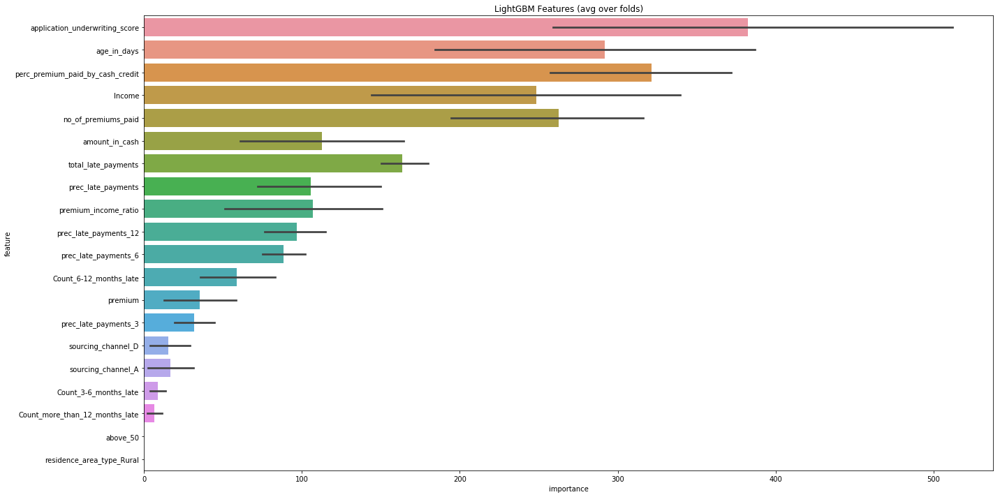

In [139]:
display_importances(featurs_trails)

In [7]:
early_stop = 100
def build_XGB_Model(params,X_train,y_train, X_test, y_test, early_stop=100):
    if params is None:
        params = {"max_depth":3, "n_estimators":560,"nthread":4, "silent":False,"gamma":3, "eta" : 0.1 ,"scale_pos_weight":7}
        
    gbm = xgb.XGBClassifier(**params).fit(X_train, y_train,eval_set=[(X_test,y_test)],eval_metric='auc',early_stopping_rounds=early_stop)
    return gbm


In [ ]:
#gbm

In [ ]:
#gbm.save_model("XGB_est560_Dep3_gamma3_scale7.txt")

In [32]:
def display_result(gbm,X_train,y_train,X_test,y_test):
    predictions = gbm.predict_proba(X_test)
    print("F1 score from Train:",metrics.f1_score(gbm.predict(X_train),y_train)) 
    fpr, tpr, thresholds = metrics.roc_curve(y_train,gbm.predict_proba(X_train)[:,1])
    print("The AUC score for training :",metrics.auc(fpr,tpr,True))
    print("F1 score from Test:",metrics.f1_score(gbm.predict(X_test),y_test)) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test,predictions[:,1])
    print("The AUC score for testing :",metrics.auc(fpr,tpr,True))

def display_test_result(gbm,X_test,y_test):
    predictions = gbm.predict_proba(X_test,num_iteration=gbm.best_iteration_)
    #print("F1 score from Train:",metrics.f1_score(gbm.predict(X_train),y_train)) 
    #fpr, tpr, thresholds = metrics.roc_curve(y_train,gbm.predict_proba(X_train)[:,1])
    #print("The AUC score for training :",metrics.auc(fpr,tpr,True))
    #print("F1 score from Test:",metrics.f1_score(gbm.predict(X_test),y_test)) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test,predictions[:,1])
    print("The AUC score for testing :",metrics.auc(fpr,tpr,True))
    return metrics.auc(fpr,tpr,True)


In [ ]:
def kfold_lightgbm_3(train_df,y_train,alpha ,lam, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    ##train_df = df[df['TARGET'].notnull()]
    #test_df = df[df['TARGET'].isnull()]
    #print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    print("Starting LightGBM. Train shape: {} ".format(train_df.shape))
    #del df
    #gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=47)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=47)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    #sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['renewal','index','id','SK_ID_PREV','index']]
    model_list = []
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], y_train)):
        train_x, train_y = train_df[feats].iloc[train_idx], y_train.iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], y_train.iloc[valid_idx]


        clf = LGBMClassifier(
            boosting ='dart',
            nthread=4,
            #is_unbalance=True,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=12,
            #colsample_bytree=0.9497036,
            #subsample=0.8715623,
            colsample_bytree=1,
            subsample=1,
            max_depth=9,
            reg_alpha=alpha,
            #reg_alpha=0.1,
            reg_lambda=lam,
            #reg_lambda=0.1,
            min_split_gain=1.8,
            min_child_weight=1,
            silent=True,
            #verbose=-1,
            #scale_pos_weight=0.5
            )

        mod = clf.fit(train_x, train_y, eval_set=[ (train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc',  early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        #sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        model_list.append(mod)
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()
    print("For Iteration: ",n_fold)
    print('Full AUC score %.6f' % roc_auc_score(y_train, oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    del train_df
    del y_train
    gc.collect()
    #display_importances(feature_importance_df)
    return feature_importance_df,model_list

In [359]:
train_p.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,renewal,sourcing_channel_A,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,sourcing_channel_nan,residence_area_type_Rural,residence_area_type_Urban,residence_area_type_nan,premium_income_ratio,amount_in_cash,above_50,total_late_payments,prec_late_payments,prec_late_payments_3,prec_late_payments_6,prec_late_payments_12
0,110936,0.429,12058,355060,0.0,0.0,0.0,99.02,13,3300,1,0,0,1,0,0,0,0,1,0,0.009294,1415.7,False,0.0,0.000000,0.000000,0.000000,0.000000
1,41492,0.010,21546,315150,0.0,0.0,0.0,99.89,21,18000,1,1,0,0,0,0,0,0,1,0,0.057116,180.0,True,0.0,0.000000,0.000000,0.000000,0.000000
2,31300,0.917,17531,84140,2.0,3.0,1.0,98.69,7,3300,0,0,0,1,0,0,0,1,0,0,0.039220,3026.1,False,6.0,0.461538,0.285714,0.428571,0.142857
3,19415,0.049,15341,250510,0.0,0.0,0.0,99.57,9,9600,1,1,0,0,0,0,0,0,1,0,0.038322,470.4,False,0.0,0.000000,0.000000,0.000000,0.000000
4,99379,0.052,31400,198680,0.0,0.0,0.0,99.87,12,9600,1,0,1,0,0,0,0,0,1,0,0.048319,499.2,True,0.0,0.000000,0.000000,0.000000,0.000000


In [400]:

featurs_trails, models_trails = kfold_lightgbm_3(train_p[bas_mod_feats],train_p['renewal'],alpha=0,lam = 0.0, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (79853, 16) 
[1]	training's auc: 0.807988	valid_1's auc: 0.811017
Training until validation scores don't improve for 200 rounds.
[2]	training's auc: 0.809229	valid_1's auc: 0.81221
[3]	training's auc: 0.809235	valid_1's auc: 0.812196
[4]	training's auc: 0.809235	valid_1's auc: 0.812196
[5]	training's auc: 0.80945	valid_1's auc: 0.812188
[6]	training's auc: 0.811921	valid_1's auc: 0.816748
[7]	training's auc: 0.812033	valid_1's auc: 0.816738
[8]	training's auc: 0.812033	valid_1's auc: 0.816738
[9]	training's auc: 0.812067	valid_1's auc: 0.816748
[10]	training's auc: 0.813466	valid_1's auc: 0.817489
[11]	training's auc: 0.813582	valid_1's auc: 0.817751
[12]	training's auc: 0.813574	valid_1's auc: 0.817704
[13]	training's auc: 0.8136	valid_1's auc: 0.817752
[14]	training's auc: 0.813795	valid_1's auc: 0.817903
[15]	training's auc: 0.824781	valid_1's auc: 0.826995
[16]	training's auc: 0.824784	valid_1's auc: 0.827012
[17]	training's auc: 0.824795	valid_1's a

[150]	training's auc: 0.834813	valid_1's auc: 0.835384
[151]	training's auc: 0.834892	valid_1's auc: 0.835366
[152]	training's auc: 0.834896	valid_1's auc: 0.83537
[153]	training's auc: 0.834819	valid_1's auc: 0.835297
[154]	training's auc: 0.834816	valid_1's auc: 0.835275
[155]	training's auc: 0.834821	valid_1's auc: 0.835202
[156]	training's auc: 0.834827	valid_1's auc: 0.835207
[157]	training's auc: 0.834827	valid_1's auc: 0.835205
[158]	training's auc: 0.834821	valid_1's auc: 0.835253
[159]	training's auc: 0.83482	valid_1's auc: 0.835255
[160]	training's auc: 0.834799	valid_1's auc: 0.835279
[161]	training's auc: 0.834745	valid_1's auc: 0.835233
[162]	training's auc: 0.834729	valid_1's auc: 0.83524
[163]	training's auc: 0.834727	valid_1's auc: 0.835246
[164]	training's auc: 0.834797	valid_1's auc: 0.835288
[165]	training's auc: 0.834808	valid_1's auc: 0.835283
[166]	training's auc: 0.834803	valid_1's auc: 0.835275
[167]	training's auc: 0.834806	valid_1's auc: 0.835171
[168]	trainin

[300]	training's auc: 0.835677	valid_1's auc: 0.835514
[301]	training's auc: 0.835679	valid_1's auc: 0.835517
[302]	training's auc: 0.835726	valid_1's auc: 0.835557
[303]	training's auc: 0.835729	valid_1's auc: 0.835554
[304]	training's auc: 0.835724	valid_1's auc: 0.83555
[305]	training's auc: 0.83572	valid_1's auc: 0.835551
[306]	training's auc: 0.835715	valid_1's auc: 0.835546
[307]	training's auc: 0.835718	valid_1's auc: 0.835547
[308]	training's auc: 0.835727	valid_1's auc: 0.835541
[309]	training's auc: 0.835729	valid_1's auc: 0.835547
[310]	training's auc: 0.835724	valid_1's auc: 0.835545
[311]	training's auc: 0.835721	valid_1's auc: 0.83556
[312]	training's auc: 0.83574	valid_1's auc: 0.835585
[313]	training's auc: 0.835764	valid_1's auc: 0.835589
[314]	training's auc: 0.835765	valid_1's auc: 0.835592
[315]	training's auc: 0.835761	valid_1's auc: 0.835586
[316]	training's auc: 0.835765	valid_1's auc: 0.835585
[317]	training's auc: 0.835745	valid_1's auc: 0.835568
[318]	training

[452]	training's auc: 0.837499	valid_1's auc: 0.836633
[453]	training's auc: 0.837499	valid_1's auc: 0.836641
[454]	training's auc: 0.837499	valid_1's auc: 0.83664
[455]	training's auc: 0.837496	valid_1's auc: 0.836655
[456]	training's auc: 0.837496	valid_1's auc: 0.836653
[457]	training's auc: 0.837497	valid_1's auc: 0.83665
[458]	training's auc: 0.837474	valid_1's auc: 0.836618
[459]	training's auc: 0.837498	valid_1's auc: 0.836626
[460]	training's auc: 0.837504	valid_1's auc: 0.836617
[461]	training's auc: 0.837588	valid_1's auc: 0.836695
[462]	training's auc: 0.837549	valid_1's auc: 0.836676
[463]	training's auc: 0.837548	valid_1's auc: 0.836674
[464]	training's auc: 0.837572	valid_1's auc: 0.836699
[465]	training's auc: 0.837587	valid_1's auc: 0.836659
[466]	training's auc: 0.837583	valid_1's auc: 0.836661
[467]	training's auc: 0.837599	valid_1's auc: 0.83666
[468]	training's auc: 0.837596	valid_1's auc: 0.836659
[469]	training's auc: 0.837607	valid_1's auc: 0.836661
[470]	trainin

[602]	training's auc: 0.839407	valid_1's auc: 0.838468
[603]	training's auc: 0.839415	valid_1's auc: 0.838495
[604]	training's auc: 0.839418	valid_1's auc: 0.838496
[605]	training's auc: 0.839414	valid_1's auc: 0.838482
[606]	training's auc: 0.839414	valid_1's auc: 0.838488
[607]	training's auc: 0.839417	valid_1's auc: 0.838486
[608]	training's auc: 0.839447	valid_1's auc: 0.838519
[609]	training's auc: 0.83947	valid_1's auc: 0.838532
[610]	training's auc: 0.839486	valid_1's auc: 0.838527
[611]	training's auc: 0.839462	valid_1's auc: 0.838546
[612]	training's auc: 0.839489	valid_1's auc: 0.83855
[613]	training's auc: 0.839486	valid_1's auc: 0.838551
[614]	training's auc: 0.839491	valid_1's auc: 0.838511
[615]	training's auc: 0.839499	valid_1's auc: 0.838478
[616]	training's auc: 0.839488	valid_1's auc: 0.838448
[617]	training's auc: 0.839488	valid_1's auc: 0.838446
[618]	training's auc: 0.839539	valid_1's auc: 0.838494
[619]	training's auc: 0.839544	valid_1's auc: 0.838423
[620]	traini

[752]	training's auc: 0.841846	valid_1's auc: 0.840225
[753]	training's auc: 0.841874	valid_1's auc: 0.840252
[754]	training's auc: 0.84187	valid_1's auc: 0.84025
[755]	training's auc: 0.841885	valid_1's auc: 0.840285
[756]	training's auc: 0.841887	valid_1's auc: 0.840283
[757]	training's auc: 0.841889	valid_1's auc: 0.840287
[758]	training's auc: 0.84194	valid_1's auc: 0.840207
[759]	training's auc: 0.84195	valid_1's auc: 0.840193
[760]	training's auc: 0.841953	valid_1's auc: 0.840181
[761]	training's auc: 0.841969	valid_1's auc: 0.840193
[762]	training's auc: 0.841951	valid_1's auc: 0.840211
[763]	training's auc: 0.84195	valid_1's auc: 0.840214
[764]	training's auc: 0.841985	valid_1's auc: 0.84023
[765]	training's auc: 0.841984	valid_1's auc: 0.840226
[766]	training's auc: 0.841978	valid_1's auc: 0.84023
[767]	training's auc: 0.841977	valid_1's auc: 0.840231
[768]	training's auc: 0.841981	valid_1's auc: 0.84025
[769]	training's auc: 0.842013	valid_1's auc: 0.84022
[770]	training's au

[902]	training's auc: 0.842943	valid_1's auc: 0.840922
[903]	training's auc: 0.84294	valid_1's auc: 0.840924
[904]	training's auc: 0.842968	valid_1's auc: 0.84112
[905]	training's auc: 0.842972	valid_1's auc: 0.84112
[906]	training's auc: 0.842971	valid_1's auc: 0.841117
[907]	training's auc: 0.842975	valid_1's auc: 0.841136
[908]	training's auc: 0.842976	valid_1's auc: 0.841137
[909]	training's auc: 0.842977	valid_1's auc: 0.841136
[910]	training's auc: 0.842981	valid_1's auc: 0.841134
[911]	training's auc: 0.843	valid_1's auc: 0.841154
[912]	training's auc: 0.842999	valid_1's auc: 0.84116
[913]	training's auc: 0.843002	valid_1's auc: 0.841157
[914]	training's auc: 0.843017	valid_1's auc: 0.841145
[915]	training's auc: 0.843027	valid_1's auc: 0.841168
[916]	training's auc: 0.843029	valid_1's auc: 0.841164
[917]	training's auc: 0.843033	valid_1's auc: 0.841166
[918]	training's auc: 0.843034	valid_1's auc: 0.841169
[919]	training's auc: 0.843032	valid_1's auc: 0.84117
[920]	training's a

[1051]	training's auc: 0.844218	valid_1's auc: 0.84192
[1052]	training's auc: 0.844223	valid_1's auc: 0.84192
[1053]	training's auc: 0.844254	valid_1's auc: 0.841941
[1054]	training's auc: 0.844258	valid_1's auc: 0.841968
[1055]	training's auc: 0.844258	valid_1's auc: 0.841967
[1056]	training's auc: 0.844267	valid_1's auc: 0.841949
[1057]	training's auc: 0.84427	valid_1's auc: 0.841955
[1058]	training's auc: 0.844266	valid_1's auc: 0.841946
[1059]	training's auc: 0.844274	valid_1's auc: 0.841955
[1060]	training's auc: 0.844274	valid_1's auc: 0.841955
[1061]	training's auc: 0.844272	valid_1's auc: 0.84195
[1062]	training's auc: 0.844274	valid_1's auc: 0.841955
[1063]	training's auc: 0.844315	valid_1's auc: 0.842134
[1064]	training's auc: 0.844318	valid_1's auc: 0.842136
[1065]	training's auc: 0.84432	valid_1's auc: 0.842137
[1066]	training's auc: 0.844343	valid_1's auc: 0.84216
[1067]	training's auc: 0.844346	valid_1's auc: 0.842165
[1068]	training's auc: 0.844344	valid_1's auc: 0.84219

[1199]	training's auc: 0.845485	valid_1's auc: 0.842953
[1200]	training's auc: 0.845488	valid_1's auc: 0.842956
[1201]	training's auc: 0.845521	valid_1's auc: 0.842975
[1202]	training's auc: 0.845537	valid_1's auc: 0.842986
[1203]	training's auc: 0.845541	valid_1's auc: 0.842991
[1204]	training's auc: 0.845545	valid_1's auc: 0.842992
[1205]	training's auc: 0.845546	valid_1's auc: 0.842996
[1206]	training's auc: 0.845587	valid_1's auc: 0.842978
[1207]	training's auc: 0.845592	valid_1's auc: 0.842979
[1208]	training's auc: 0.845603	valid_1's auc: 0.843005
[1209]	training's auc: 0.845631	valid_1's auc: 0.843016
[1210]	training's auc: 0.845648	valid_1's auc: 0.843038
[1211]	training's auc: 0.845656	valid_1's auc: 0.843017
[1212]	training's auc: 0.845658	valid_1's auc: 0.843019
[1213]	training's auc: 0.845683	valid_1's auc: 0.843039
[1214]	training's auc: 0.845764	valid_1's auc: 0.843027
[1215]	training's auc: 0.845769	valid_1's auc: 0.843044
[1216]	training's auc: 0.845768	valid_1's auc: 0

[1346]	training's auc: 0.847273	valid_1's auc: 0.843528
[1347]	training's auc: 0.8473	valid_1's auc: 0.843547
[1348]	training's auc: 0.847303	valid_1's auc: 0.843549
[1349]	training's auc: 0.847304	valid_1's auc: 0.843536
[1350]	training's auc: 0.847306	valid_1's auc: 0.843537
[1351]	training's auc: 0.847317	valid_1's auc: 0.843528
[1352]	training's auc: 0.84732	valid_1's auc: 0.843532
[1353]	training's auc: 0.847338	valid_1's auc: 0.843544
[1354]	training's auc: 0.847351	valid_1's auc: 0.843549
[1355]	training's auc: 0.847366	valid_1's auc: 0.84357
[1356]	training's auc: 0.847394	valid_1's auc: 0.843582
[1357]	training's auc: 0.847407	valid_1's auc: 0.843569
[1358]	training's auc: 0.847411	valid_1's auc: 0.84357
[1359]	training's auc: 0.84743	valid_1's auc: 0.843586
[1360]	training's auc: 0.847432	valid_1's auc: 0.843587
[1361]	training's auc: 0.847455	valid_1's auc: 0.843619
[1362]	training's auc: 0.847468	valid_1's auc: 0.843614
[1363]	training's auc: 0.847475	valid_1's auc: 0.84363

[1493]	training's auc: 0.84855	valid_1's auc: 0.844248
[1494]	training's auc: 0.848552	valid_1's auc: 0.84425
[1495]	training's auc: 0.848556	valid_1's auc: 0.844251
[1496]	training's auc: 0.848558	valid_1's auc: 0.844251
[1497]	training's auc: 0.84859	valid_1's auc: 0.844269
[1498]	training's auc: 0.848598	valid_1's auc: 0.844264
[1499]	training's auc: 0.848601	valid_1's auc: 0.844264
[1500]	training's auc: 0.848604	valid_1's auc: 0.844266
[1501]	training's auc: 0.848608	valid_1's auc: 0.844271
[1502]	training's auc: 0.848609	valid_1's auc: 0.844273
[1503]	training's auc: 0.848612	valid_1's auc: 0.844276
[1504]	training's auc: 0.848608	valid_1's auc: 0.844272
[1505]	training's auc: 0.84861	valid_1's auc: 0.844273
[1506]	training's auc: 0.848613	valid_1's auc: 0.844276
[1507]	training's auc: 0.84865	valid_1's auc: 0.844289
[1508]	training's auc: 0.848651	valid_1's auc: 0.844292
[1509]	training's auc: 0.848655	valid_1's auc: 0.844293
[1510]	training's auc: 0.848658	valid_1's auc: 0.8442

[1640]	training's auc: 0.849678	valid_1's auc: 0.844884
[1641]	training's auc: 0.849682	valid_1's auc: 0.844889
[1642]	training's auc: 0.849684	valid_1's auc: 0.844892
[1643]	training's auc: 0.849687	valid_1's auc: 0.84489
[1644]	training's auc: 0.849689	valid_1's auc: 0.84489
[1645]	training's auc: 0.849692	valid_1's auc: 0.844887
[1646]	training's auc: 0.849696	valid_1's auc: 0.844889
[1647]	training's auc: 0.849697	valid_1's auc: 0.84489
[1648]	training's auc: 0.849713	valid_1's auc: 0.844892
[1649]	training's auc: 0.849715	valid_1's auc: 0.844891
[1650]	training's auc: 0.849717	valid_1's auc: 0.844893
[1651]	training's auc: 0.849725	valid_1's auc: 0.844903
[1652]	training's auc: 0.849727	valid_1's auc: 0.844904
[1653]	training's auc: 0.849751	valid_1's auc: 0.844913
[1654]	training's auc: 0.849752	valid_1's auc: 0.844929
[1655]	training's auc: 0.849756	valid_1's auc: 0.844929
[1656]	training's auc: 0.849775	valid_1's auc: 0.844927
[1657]	training's auc: 0.84978	valid_1's auc: 0.844

[1789]	training's auc: 0.851214	valid_1's auc: 0.845726
[1790]	training's auc: 0.851237	valid_1's auc: 0.845741
[1791]	training's auc: 0.85124	valid_1's auc: 0.845741
[1792]	training's auc: 0.851252	valid_1's auc: 0.845725
[1793]	training's auc: 0.851254	valid_1's auc: 0.845728
[1794]	training's auc: 0.851258	valid_1's auc: 0.845729
[1795]	training's auc: 0.851288	valid_1's auc: 0.84576
[1796]	training's auc: 0.851289	valid_1's auc: 0.845764
[1797]	training's auc: 0.851293	valid_1's auc: 0.845762
[1798]	training's auc: 0.851296	valid_1's auc: 0.845766
[1799]	training's auc: 0.8513	valid_1's auc: 0.845765
[1800]	training's auc: 0.851308	valid_1's auc: 0.845752
[1801]	training's auc: 0.851318	valid_1's auc: 0.845764
[1802]	training's auc: 0.851339	valid_1's auc: 0.845776
[1803]	training's auc: 0.851346	valid_1's auc: 0.845777
[1804]	training's auc: 0.851355	valid_1's auc: 0.845783
[1805]	training's auc: 0.851366	valid_1's auc: 0.845794
[1806]	training's auc: 0.851389	valid_1's auc: 0.845

[1937]	training's auc: 0.85213	valid_1's auc: 0.846029
[1938]	training's auc: 0.852132	valid_1's auc: 0.846032
[1939]	training's auc: 0.85214	valid_1's auc: 0.846016
[1940]	training's auc: 0.852144	valid_1's auc: 0.846022
[1941]	training's auc: 0.852147	valid_1's auc: 0.846023
[1942]	training's auc: 0.852167	valid_1's auc: 0.846044
[1943]	training's auc: 0.852179	valid_1's auc: 0.846051
[1944]	training's auc: 0.852197	valid_1's auc: 0.846078
[1945]	training's auc: 0.852213	valid_1's auc: 0.846067
[1946]	training's auc: 0.852216	valid_1's auc: 0.846071
[1947]	training's auc: 0.852218	valid_1's auc: 0.846072
[1948]	training's auc: 0.852236	valid_1's auc: 0.846073
[1949]	training's auc: 0.852251	valid_1's auc: 0.846095
[1950]	training's auc: 0.852264	valid_1's auc: 0.846099
[1951]	training's auc: 0.852289	valid_1's auc: 0.846085
[1952]	training's auc: 0.852293	valid_1's auc: 0.846086
[1953]	training's auc: 0.852296	valid_1's auc: 0.846091
[1954]	training's auc: 0.852299	valid_1's auc: 0.8

[2086]	training's auc: 0.853253	valid_1's auc: 0.84621
[2087]	training's auc: 0.853275	valid_1's auc: 0.846211
[2088]	training's auc: 0.853278	valid_1's auc: 0.846199
[2089]	training's auc: 0.853282	valid_1's auc: 0.846198
[2090]	training's auc: 0.853289	valid_1's auc: 0.846188
[2091]	training's auc: 0.853291	valid_1's auc: 0.846189
[2092]	training's auc: 0.853296	valid_1's auc: 0.846188
[2093]	training's auc: 0.853301	valid_1's auc: 0.846191
[2094]	training's auc: 0.853308	valid_1's auc: 0.846194
[2095]	training's auc: 0.85331	valid_1's auc: 0.846194
[2096]	training's auc: 0.853322	valid_1's auc: 0.846205
[2097]	training's auc: 0.853323	valid_1's auc: 0.846203
[2098]	training's auc: 0.853339	valid_1's auc: 0.846206
[2099]	training's auc: 0.853365	valid_1's auc: 0.846177
[2100]	training's auc: 0.853374	valid_1's auc: 0.846182
[2101]	training's auc: 0.853378	valid_1's auc: 0.846185
[2102]	training's auc: 0.853404	valid_1's auc: 0.846224
[2103]	training's auc: 0.853408	valid_1's auc: 0.8

[2234]	training's auc: 0.854309	valid_1's auc: 0.846256
[2235]	training's auc: 0.854312	valid_1's auc: 0.846255
[2236]	training's auc: 0.854315	valid_1's auc: 0.846258
[2237]	training's auc: 0.854321	valid_1's auc: 0.846249
[2238]	training's auc: 0.854326	valid_1's auc: 0.846253
[2239]	training's auc: 0.854348	valid_1's auc: 0.84627
[2240]	training's auc: 0.854351	valid_1's auc: 0.84627
[2241]	training's auc: 0.85436	valid_1's auc: 0.846272
[2242]	training's auc: 0.854367	valid_1's auc: 0.846271
[2243]	training's auc: 0.85437	valid_1's auc: 0.846273
[2244]	training's auc: 0.854371	valid_1's auc: 0.846265
[2245]	training's auc: 0.854371	valid_1's auc: 0.846266
[2246]	training's auc: 0.854377	valid_1's auc: 0.846272
[2247]	training's auc: 0.854379	valid_1's auc: 0.846273
[2248]	training's auc: 0.854382	valid_1's auc: 0.846274
[2249]	training's auc: 0.854426	valid_1's auc: 0.846273
[2250]	training's auc: 0.854434	valid_1's auc: 0.846275
[2251]	training's auc: 0.854463	valid_1's auc: 0.846

[2382]	training's auc: 0.8557	valid_1's auc: 0.846497
[2383]	training's auc: 0.855699	valid_1's auc: 0.846501
[2384]	training's auc: 0.855702	valid_1's auc: 0.846504
[2385]	training's auc: 0.855705	valid_1's auc: 0.846505
[2386]	training's auc: 0.855706	valid_1's auc: 0.846501
[2387]	training's auc: 0.855728	valid_1's auc: 0.846501
[2388]	training's auc: 0.855731	valid_1's auc: 0.846502
[2389]	training's auc: 0.855737	valid_1's auc: 0.846499
[2390]	training's auc: 0.855756	valid_1's auc: 0.846506
[2391]	training's auc: 0.855765	valid_1's auc: 0.846511
[2392]	training's auc: 0.855763	valid_1's auc: 0.846512
[2393]	training's auc: 0.855769	valid_1's auc: 0.846508
[2394]	training's auc: 0.855772	valid_1's auc: 0.84651
[2395]	training's auc: 0.855788	valid_1's auc: 0.846505
[2396]	training's auc: 0.85579	valid_1's auc: 0.846506
[2397]	training's auc: 0.855796	valid_1's auc: 0.846505
[2398]	training's auc: 0.855799	valid_1's auc: 0.846505
[2399]	training's auc: 0.855802	valid_1's auc: 0.846

[2529]	training's auc: 0.856819	valid_1's auc: 0.846519
[2530]	training's auc: 0.856822	valid_1's auc: 0.846519
[2531]	training's auc: 0.856833	valid_1's auc: 0.846518
[2532]	training's auc: 0.856837	valid_1's auc: 0.846518
[2533]	training's auc: 0.85684	valid_1's auc: 0.846522
[2534]	training's auc: 0.856843	valid_1's auc: 0.846522
[2535]	training's auc: 0.856861	valid_1's auc: 0.846519
[2536]	training's auc: 0.856863	valid_1's auc: 0.846521
[2537]	training's auc: 0.856867	valid_1's auc: 0.846523
[2538]	training's auc: 0.856874	valid_1's auc: 0.84652
[2539]	training's auc: 0.856885	valid_1's auc: 0.846517
[2540]	training's auc: 0.856889	valid_1's auc: 0.84652
[2541]	training's auc: 0.856898	valid_1's auc: 0.846543
[2542]	training's auc: 0.856904	valid_1's auc: 0.846545
[2543]	training's auc: 0.856907	valid_1's auc: 0.846547
[2544]	training's auc: 0.85691	valid_1's auc: 0.846547
[2545]	training's auc: 0.856913	valid_1's auc: 0.846549
[2546]	training's auc: 0.856916	valid_1's auc: 0.846

[2679]	training's auc: 0.857579	valid_1's auc: 0.846523
[2680]	training's auc: 0.857583	valid_1's auc: 0.846524
[2681]	training's auc: 0.857586	valid_1's auc: 0.846525
[2682]	training's auc: 0.857587	valid_1's auc: 0.846526
[2683]	training's auc: 0.85759	valid_1's auc: 0.846525
[2684]	training's auc: 0.857592	valid_1's auc: 0.846526
[2685]	training's auc: 0.857593	valid_1's auc: 0.846524
[2686]	training's auc: 0.857594	valid_1's auc: 0.846519
[2687]	training's auc: 0.857598	valid_1's auc: 0.84652
[2688]	training's auc: 0.857602	valid_1's auc: 0.846521
[2689]	training's auc: 0.857607	valid_1's auc: 0.84652
[2690]	training's auc: 0.857615	valid_1's auc: 0.84652
[2691]	training's auc: 0.857618	valid_1's auc: 0.846512
[2692]	training's auc: 0.85762	valid_1's auc: 0.846507
[2693]	training's auc: 0.857628	valid_1's auc: 0.846508
[2694]	training's auc: 0.857628	valid_1's auc: 0.846511
[2695]	training's auc: 0.857642	valid_1's auc: 0.846516
[2696]	training's auc: 0.857645	valid_1's auc: 0.8465

[2826]	training's auc: 0.858272	valid_1's auc: 0.846583
[2827]	training's auc: 0.858275	valid_1's auc: 0.846583
[2828]	training's auc: 0.858286	valid_1's auc: 0.846577
[2829]	training's auc: 0.858287	valid_1's auc: 0.846576
[2830]	training's auc: 0.858294	valid_1's auc: 0.846593
[2831]	training's auc: 0.858294	valid_1's auc: 0.846592
[2832]	training's auc: 0.858297	valid_1's auc: 0.846591
[2833]	training's auc: 0.8583	valid_1's auc: 0.846592
[2834]	training's auc: 0.858303	valid_1's auc: 0.846593
[2835]	training's auc: 0.858313	valid_1's auc: 0.846596
[2836]	training's auc: 0.858316	valid_1's auc: 0.846596
[2837]	training's auc: 0.858319	valid_1's auc: 0.846595
[2838]	training's auc: 0.858321	valid_1's auc: 0.846594
[2839]	training's auc: 0.858351	valid_1's auc: 0.846614
[2840]	training's auc: 0.85836	valid_1's auc: 0.846616
[2841]	training's auc: 0.858365	valid_1's auc: 0.846624
[2842]	training's auc: 0.858368	valid_1's auc: 0.846621
[2843]	training's auc: 0.858371	valid_1's auc: 0.84

[2975]	training's auc: 0.859117	valid_1's auc: 0.846612
[2976]	training's auc: 0.859119	valid_1's auc: 0.846611
[2977]	training's auc: 0.859123	valid_1's auc: 0.846611
[2978]	training's auc: 0.859129	valid_1's auc: 0.846611
[2979]	training's auc: 0.859144	valid_1's auc: 0.846607
[2980]	training's auc: 0.859148	valid_1's auc: 0.846608
[2981]	training's auc: 0.859162	valid_1's auc: 0.846602
[2982]	training's auc: 0.859167	valid_1's auc: 0.846609
[2983]	training's auc: 0.859188	valid_1's auc: 0.846617
[2984]	training's auc: 0.859202	valid_1's auc: 0.846631
[2985]	training's auc: 0.859206	valid_1's auc: 0.84663
[2986]	training's auc: 0.859208	valid_1's auc: 0.846631
[2987]	training's auc: 0.859211	valid_1's auc: 0.846632
[2988]	training's auc: 0.859226	valid_1's auc: 0.846637
[2989]	training's auc: 0.85924	valid_1's auc: 0.846636
[2990]	training's auc: 0.859243	valid_1's auc: 0.846635
[2991]	training's auc: 0.85926	valid_1's auc: 0.846642
[2992]	training's auc: 0.859264	valid_1's auc: 0.84

[3124]	training's auc: 0.860043	valid_1's auc: 0.846711
[3125]	training's auc: 0.860048	valid_1's auc: 0.846711
[3126]	training's auc: 0.860051	valid_1's auc: 0.846711
[3127]	training's auc: 0.860055	valid_1's auc: 0.84671
[3128]	training's auc: 0.860059	valid_1's auc: 0.846711
[3129]	training's auc: 0.860061	valid_1's auc: 0.84671
[3130]	training's auc: 0.860101	valid_1's auc: 0.846703
[3131]	training's auc: 0.860101	valid_1's auc: 0.846696
[3132]	training's auc: 0.860104	valid_1's auc: 0.846696
[3133]	training's auc: 0.860116	valid_1's auc: 0.846691
[3134]	training's auc: 0.86012	valid_1's auc: 0.846691
[3135]	training's auc: 0.860123	valid_1's auc: 0.846689
[3136]	training's auc: 0.860143	valid_1's auc: 0.846681
[3137]	training's auc: 0.860142	valid_1's auc: 0.846681
[3138]	training's auc: 0.860148	valid_1's auc: 0.846691
[3139]	training's auc: 0.860151	valid_1's auc: 0.846695
[3140]	training's auc: 0.860155	valid_1's auc: 0.846694
[3141]	training's auc: 0.860159	valid_1's auc: 0.84

[3274]	training's auc: 0.860938	valid_1's auc: 0.846606
[3275]	training's auc: 0.860938	valid_1's auc: 0.846596
[3276]	training's auc: 0.860948	valid_1's auc: 0.846603
[3277]	training's auc: 0.860949	valid_1's auc: 0.846607
[3278]	training's auc: 0.860952	valid_1's auc: 0.846607
[3279]	training's auc: 0.860955	valid_1's auc: 0.846606
[3280]	training's auc: 0.860963	valid_1's auc: 0.846595
[3281]	training's auc: 0.860968	valid_1's auc: 0.846587
[3282]	training's auc: 0.860969	valid_1's auc: 0.846583
[3283]	training's auc: 0.860972	valid_1's auc: 0.846582
[3284]	training's auc: 0.860976	valid_1's auc: 0.84658
[3285]	training's auc: 0.861001	valid_1's auc: 0.846575
[3286]	training's auc: 0.861005	valid_1's auc: 0.846575
[3287]	training's auc: 0.861009	valid_1's auc: 0.846574
[3288]	training's auc: 0.861012	valid_1's auc: 0.846573
[3289]	training's auc: 0.861013	valid_1's auc: 0.846565
[3290]	training's auc: 0.861012	valid_1's auc: 0.846565
[3291]	training's auc: 0.861017	valid_1's auc: 0.

[98]	training's auc: 0.836131	valid_1's auc: 0.820659
[99]	training's auc: 0.83613	valid_1's auc: 0.820662
[100]	training's auc: 0.836136	valid_1's auc: 0.820676
[101]	training's auc: 0.836139	valid_1's auc: 0.820686
[102]	training's auc: 0.836144	valid_1's auc: 0.820688
[103]	training's auc: 0.836147	valid_1's auc: 0.820691
[104]	training's auc: 0.836159	valid_1's auc: 0.820706
[105]	training's auc: 0.836223	valid_1's auc: 0.820779
[106]	training's auc: 0.836221	valid_1's auc: 0.820782
[107]	training's auc: 0.836223	valid_1's auc: 0.82078
[108]	training's auc: 0.836248	valid_1's auc: 0.820832
[109]	training's auc: 0.836245	valid_1's auc: 0.820837
[110]	training's auc: 0.836239	valid_1's auc: 0.820831
[111]	training's auc: 0.836238	valid_1's auc: 0.820839
[112]	training's auc: 0.836236	valid_1's auc: 0.820842
[113]	training's auc: 0.836233	valid_1's auc: 0.820842
[114]	training's auc: 0.836237	valid_1's auc: 0.820826
[115]	training's auc: 0.836253	valid_1's auc: 0.82082
[116]	training'

[248]	training's auc: 0.836278	valid_1's auc: 0.820669
[249]	training's auc: 0.836291	valid_1's auc: 0.820647
[250]	training's auc: 0.836256	valid_1's auc: 0.820655
[251]	training's auc: 0.836257	valid_1's auc: 0.820657
[252]	training's auc: 0.836259	valid_1's auc: 0.820663
[253]	training's auc: 0.836258	valid_1's auc: 0.820661
[254]	training's auc: 0.836242	valid_1's auc: 0.820616
[255]	training's auc: 0.836257	valid_1's auc: 0.820665
[256]	training's auc: 0.836364	valid_1's auc: 0.820582
[257]	training's auc: 0.836374	valid_1's auc: 0.820568
[258]	training's auc: 0.836459	valid_1's auc: 0.820673
[259]	training's auc: 0.836458	valid_1's auc: 0.820674
[260]	training's auc: 0.836459	valid_1's auc: 0.820673
[261]	training's auc: 0.836459	valid_1's auc: 0.820673
[262]	training's auc: 0.836405	valid_1's auc: 0.820546
[263]	training's auc: 0.836409	valid_1's auc: 0.820547
[264]	training's auc: 0.836459	valid_1's auc: 0.820675
[265]	training's auc: 0.836484	valid_1's auc: 0.820633
[266]	trai

[401]	training's auc: 0.838758	valid_1's auc: 0.823541
[402]	training's auc: 0.838787	valid_1's auc: 0.823588
[403]	training's auc: 0.838784	valid_1's auc: 0.82359
[404]	training's auc: 0.838782	valid_1's auc: 0.823574
[405]	training's auc: 0.838792	valid_1's auc: 0.823544
[406]	training's auc: 0.838804	valid_1's auc: 0.823579
[407]	training's auc: 0.83884	valid_1's auc: 0.823621
[408]	training's auc: 0.838835	valid_1's auc: 0.823628
[409]	training's auc: 0.838889	valid_1's auc: 0.823649
[410]	training's auc: 0.838919	valid_1's auc: 0.823665
[411]	training's auc: 0.838962	valid_1's auc: 0.823704
[412]	training's auc: 0.838963	valid_1's auc: 0.823703
[413]	training's auc: 0.838961	valid_1's auc: 0.823705
[414]	training's auc: 0.838927	valid_1's auc: 0.82366
[415]	training's auc: 0.838938	valid_1's auc: 0.823649
[416]	training's auc: 0.838993	valid_1's auc: 0.823727
[417]	training's auc: 0.83899	valid_1's auc: 0.823715
[418]	training's auc: 0.838982	valid_1's auc: 0.823704
[419]	training

[553]	training's auc: 0.841385	valid_1's auc: 0.824663
[554]	training's auc: 0.841385	valid_1's auc: 0.824668
[555]	training's auc: 0.841361	valid_1's auc: 0.824665
[556]	training's auc: 0.841379	valid_1's auc: 0.824681
[557]	training's auc: 0.841376	valid_1's auc: 0.82468
[558]	training's auc: 0.841257	valid_1's auc: 0.824584
[559]	training's auc: 0.841354	valid_1's auc: 0.824666
[560]	training's auc: 0.841399	valid_1's auc: 0.82471
[561]	training's auc: 0.841401	valid_1's auc: 0.824716
[562]	training's auc: 0.841398	valid_1's auc: 0.824715
[563]	training's auc: 0.841399	valid_1's auc: 0.82471
[564]	training's auc: 0.841391	valid_1's auc: 0.824692
[565]	training's auc: 0.841365	valid_1's auc: 0.824755
[566]	training's auc: 0.841435	valid_1's auc: 0.824861
[567]	training's auc: 0.841454	valid_1's auc: 0.824889
[568]	training's auc: 0.841454	valid_1's auc: 0.824891
[569]	training's auc: 0.841452	valid_1's auc: 0.824884
[570]	training's auc: 0.841448	valid_1's auc: 0.824879
[571]	trainin

[703]	training's auc: 0.842279	valid_1's auc: 0.82634
[704]	training's auc: 0.84228	valid_1's auc: 0.82634
[705]	training's auc: 0.842274	valid_1's auc: 0.826336
[706]	training's auc: 0.843436	valid_1's auc: 0.826783
[707]	training's auc: 0.843434	valid_1's auc: 0.826781
[708]	training's auc: 0.843409	valid_1's auc: 0.826545
[709]	training's auc: 0.843463	valid_1's auc: 0.826756
[710]	training's auc: 0.843468	valid_1's auc: 0.82677
[711]	training's auc: 0.843467	valid_1's auc: 0.826766
[712]	training's auc: 0.843539	valid_1's auc: 0.826594
[713]	training's auc: 0.843545	valid_1's auc: 0.826603
[714]	training's auc: 0.843575	valid_1's auc: 0.826619
[715]	training's auc: 0.843569	valid_1's auc: 0.826609
[716]	training's auc: 0.843589	valid_1's auc: 0.826578
[717]	training's auc: 0.843519	valid_1's auc: 0.826755
[718]	training's auc: 0.843519	valid_1's auc: 0.826754
[719]	training's auc: 0.843516	valid_1's auc: 0.826751
[720]	training's auc: 0.843515	valid_1's auc: 0.82675
[721]	training'

[854]	training's auc: 0.844517	valid_1's auc: 0.827618
[855]	training's auc: 0.844548	valid_1's auc: 0.827602
[856]	training's auc: 0.84455	valid_1's auc: 0.827572
[857]	training's auc: 0.844551	valid_1's auc: 0.827578
[858]	training's auc: 0.844552	valid_1's auc: 0.827575
[859]	training's auc: 0.844552	valid_1's auc: 0.827573
[860]	training's auc: 0.844571	valid_1's auc: 0.827592
[861]	training's auc: 0.844576	valid_1's auc: 0.827643
[862]	training's auc: 0.844619	valid_1's auc: 0.827694
[863]	training's auc: 0.844618	valid_1's auc: 0.827694
[864]	training's auc: 0.844613	valid_1's auc: 0.827689
[865]	training's auc: 0.844599	valid_1's auc: 0.827684
[866]	training's auc: 0.844618	valid_1's auc: 0.827689
[867]	training's auc: 0.844606	valid_1's auc: 0.827691
[868]	training's auc: 0.844606	valid_1's auc: 0.827694
[869]	training's auc: 0.844631	valid_1's auc: 0.827702
[870]	training's auc: 0.844634	valid_1's auc: 0.827716
[871]	training's auc: 0.844633	valid_1's auc: 0.827716
[872]	train

[1006]	training's auc: 0.846622	valid_1's auc: 0.830388
[1007]	training's auc: 0.846623	valid_1's auc: 0.830391
[1008]	training's auc: 0.846639	valid_1's auc: 0.830398
[1009]	training's auc: 0.846643	valid_1's auc: 0.830391
[1010]	training's auc: 0.846669	valid_1's auc: 0.830391
[1011]	training's auc: 0.846667	valid_1's auc: 0.830391
[1012]	training's auc: 0.84669	valid_1's auc: 0.830355
[1013]	training's auc: 0.846692	valid_1's auc: 0.830355
[1014]	training's auc: 0.846702	valid_1's auc: 0.830378
[1015]	training's auc: 0.846714	valid_1's auc: 0.830284
[1016]	training's auc: 0.846716	valid_1's auc: 0.830271
[1017]	training's auc: 0.846716	valid_1's auc: 0.830275
[1018]	training's auc: 0.846717	valid_1's auc: 0.83028
[1019]	training's auc: 0.846714	valid_1's auc: 0.830276
[1020]	training's auc: 0.846732	valid_1's auc: 0.830367
[1021]	training's auc: 0.846707	valid_1's auc: 0.830363
[1022]	training's auc: 0.84671	valid_1's auc: 0.830366
[1023]	training's auc: 0.846716	valid_1's auc: 0.83

[1153]	training's auc: 0.847955	valid_1's auc: 0.830872
[1154]	training's auc: 0.847952	valid_1's auc: 0.830886
[1155]	training's auc: 0.847953	valid_1's auc: 0.830888
[1156]	training's auc: 0.847948	valid_1's auc: 0.830902
[1157]	training's auc: 0.847962	valid_1's auc: 0.830902
[1158]	training's auc: 0.847963	valid_1's auc: 0.830901
[1159]	training's auc: 0.847965	valid_1's auc: 0.830906
[1160]	training's auc: 0.847991	valid_1's auc: 0.830917
[1161]	training's auc: 0.847992	valid_1's auc: 0.830915
[1162]	training's auc: 0.848005	valid_1's auc: 0.830919
[1163]	training's auc: 0.848008	valid_1's auc: 0.830947
[1164]	training's auc: 0.84801	valid_1's auc: 0.830949
[1165]	training's auc: 0.848008	valid_1's auc: 0.83095
[1166]	training's auc: 0.848017	valid_1's auc: 0.830934
[1167]	training's auc: 0.848025	valid_1's auc: 0.830925
[1168]	training's auc: 0.848026	valid_1's auc: 0.830927
[1169]	training's auc: 0.848026	valid_1's auc: 0.830919
[1170]	training's auc: 0.848027	valid_1's auc: 0.8

[1303]	training's auc: 0.849365	valid_1's auc: 0.831824
[1304]	training's auc: 0.849392	valid_1's auc: 0.831812
[1305]	training's auc: 0.849412	valid_1's auc: 0.831831
[1306]	training's auc: 0.849435	valid_1's auc: 0.831824
[1307]	training's auc: 0.849439	valid_1's auc: 0.831832
[1308]	training's auc: 0.849447	valid_1's auc: 0.831831
[1309]	training's auc: 0.849471	valid_1's auc: 0.831843
[1310]	training's auc: 0.849498	valid_1's auc: 0.831856
[1311]	training's auc: 0.849501	valid_1's auc: 0.831852
[1312]	training's auc: 0.849503	valid_1's auc: 0.831852
[1313]	training's auc: 0.849506	valid_1's auc: 0.831853
[1314]	training's auc: 0.849513	valid_1's auc: 0.831878
[1315]	training's auc: 0.849523	valid_1's auc: 0.831883
[1316]	training's auc: 0.849525	valid_1's auc: 0.831884
[1317]	training's auc: 0.849532	valid_1's auc: 0.831894
[1318]	training's auc: 0.849534	valid_1's auc: 0.831895
[1319]	training's auc: 0.849538	valid_1's auc: 0.831898
[1320]	training's auc: 0.849539	valid_1's auc: 0

[1452]	training's auc: 0.850996	valid_1's auc: 0.832584
[1453]	training's auc: 0.850995	valid_1's auc: 0.832628
[1454]	training's auc: 0.85099	valid_1's auc: 0.832624
[1455]	training's auc: 0.851003	valid_1's auc: 0.832614
[1456]	training's auc: 0.851018	valid_1's auc: 0.832627
[1457]	training's auc: 0.851029	valid_1's auc: 0.832638
[1458]	training's auc: 0.851039	valid_1's auc: 0.83263
[1459]	training's auc: 0.851081	valid_1's auc: 0.832636
[1460]	training's auc: 0.851083	valid_1's auc: 0.832638
[1461]	training's auc: 0.851104	valid_1's auc: 0.832658
[1462]	training's auc: 0.851124	valid_1's auc: 0.832651
[1463]	training's auc: 0.851126	valid_1's auc: 0.832646
[1464]	training's auc: 0.851128	valid_1's auc: 0.832647
[1465]	training's auc: 0.85113	valid_1's auc: 0.832647
[1466]	training's auc: 0.851133	valid_1's auc: 0.832648
[1467]	training's auc: 0.851136	valid_1's auc: 0.83265
[1468]	training's auc: 0.851138	valid_1's auc: 0.832651
[1469]	training's auc: 0.851139	valid_1's auc: 0.832

[1603]	training's auc: 0.852217	valid_1's auc: 0.833247
[1604]	training's auc: 0.85225	valid_1's auc: 0.833279
[1605]	training's auc: 0.852257	valid_1's auc: 0.833282
[1606]	training's auc: 0.85227	valid_1's auc: 0.8333
[1607]	training's auc: 0.852294	valid_1's auc: 0.833305
[1608]	training's auc: 0.852297	valid_1's auc: 0.833307
[1609]	training's auc: 0.852301	valid_1's auc: 0.833305
[1610]	training's auc: 0.852304	valid_1's auc: 0.833307
[1611]	training's auc: 0.852306	valid_1's auc: 0.833308
[1612]	training's auc: 0.85231	valid_1's auc: 0.833307
[1613]	training's auc: 0.852303	valid_1's auc: 0.833279
[1614]	training's auc: 0.852366	valid_1's auc: 0.833281
[1615]	training's auc: 0.852359	valid_1's auc: 0.833281
[1616]	training's auc: 0.852361	valid_1's auc: 0.833281
[1617]	training's auc: 0.852365	valid_1's auc: 0.833283
[1618]	training's auc: 0.852369	valid_1's auc: 0.833288
[1619]	training's auc: 0.852372	valid_1's auc: 0.833291
[1620]	training's auc: 0.852381	valid_1's auc: 0.8332

[1752]	training's auc: 0.853877	valid_1's auc: 0.833595
[1753]	training's auc: 0.853886	valid_1's auc: 0.833591
[1754]	training's auc: 0.853891	valid_1's auc: 0.833592
[1755]	training's auc: 0.853921	valid_1's auc: 0.833607
[1756]	training's auc: 0.853925	valid_1's auc: 0.833611
[1757]	training's auc: 0.853928	valid_1's auc: 0.833611
[1758]	training's auc: 0.853932	valid_1's auc: 0.833611
[1759]	training's auc: 0.853961	valid_1's auc: 0.833591
[1760]	training's auc: 0.853964	valid_1's auc: 0.833592
[1761]	training's auc: 0.853969	valid_1's auc: 0.833591
[1762]	training's auc: 0.85397	valid_1's auc: 0.83359
[1763]	training's auc: 0.853974	valid_1's auc: 0.83359
[1764]	training's auc: 0.854002	valid_1's auc: 0.833621
[1765]	training's auc: 0.854006	valid_1's auc: 0.833622
[1766]	training's auc: 0.854007	valid_1's auc: 0.833618
[1767]	training's auc: 0.854087	valid_1's auc: 0.833661
[1768]	training's auc: 0.854097	valid_1's auc: 0.83366
[1769]	training's auc: 0.854102	valid_1's auc: 0.833

[1900]	training's auc: 0.855427	valid_1's auc: 0.834178
[1901]	training's auc: 0.85543	valid_1's auc: 0.834178
[1902]	training's auc: 0.855433	valid_1's auc: 0.83418
[1903]	training's auc: 0.855451	valid_1's auc: 0.834186
[1904]	training's auc: 0.855454	valid_1's auc: 0.834188
[1905]	training's auc: 0.855456	valid_1's auc: 0.834189
[1906]	training's auc: 0.855459	valid_1's auc: 0.834191
[1907]	training's auc: 0.855461	valid_1's auc: 0.83419
[1908]	training's auc: 0.855485	valid_1's auc: 0.834211
[1909]	training's auc: 0.855515	valid_1's auc: 0.83424
[1910]	training's auc: 0.855518	valid_1's auc: 0.834237
[1911]	training's auc: 0.85552	valid_1's auc: 0.834236
[1912]	training's auc: 0.85553	valid_1's auc: 0.834223
[1913]	training's auc: 0.855534	valid_1's auc: 0.834225
[1914]	training's auc: 0.855538	valid_1's auc: 0.834226
[1915]	training's auc: 0.855542	valid_1's auc: 0.834227
[1916]	training's auc: 0.855545	valid_1's auc: 0.834229
[1917]	training's auc: 0.855552	valid_1's auc: 0.83423

[2048]	training's auc: 0.856685	valid_1's auc: 0.834585
[2049]	training's auc: 0.856688	valid_1's auc: 0.834587
[2050]	training's auc: 0.856692	valid_1's auc: 0.834587
[2051]	training's auc: 0.856701	valid_1's auc: 0.834598
[2052]	training's auc: 0.856705	valid_1's auc: 0.834589
[2053]	training's auc: 0.856713	valid_1's auc: 0.834584
[2054]	training's auc: 0.856723	valid_1's auc: 0.834585
[2055]	training's auc: 0.856728	valid_1's auc: 0.83458
[2056]	training's auc: 0.856732	valid_1's auc: 0.834583
[2057]	training's auc: 0.856735	valid_1's auc: 0.834584
[2058]	training's auc: 0.856738	valid_1's auc: 0.834583
[2059]	training's auc: 0.856748	valid_1's auc: 0.834592
[2060]	training's auc: 0.856751	valid_1's auc: 0.834593
[2061]	training's auc: 0.856755	valid_1's auc: 0.834593
[2062]	training's auc: 0.856757	valid_1's auc: 0.834592
[2063]	training's auc: 0.85676	valid_1's auc: 0.83459
[2064]	training's auc: 0.856763	valid_1's auc: 0.834583
[2065]	training's auc: 0.856767	valid_1's auc: 0.83

[2196]	training's auc: 0.857851	valid_1's auc: 0.834878
[2197]	training's auc: 0.857855	valid_1's auc: 0.834879
[2198]	training's auc: 0.85788	valid_1's auc: 0.834885
[2199]	training's auc: 0.85791	valid_1's auc: 0.834886
[2200]	training's auc: 0.857915	valid_1's auc: 0.834881
[2201]	training's auc: 0.857917	valid_1's auc: 0.834879
[2202]	training's auc: 0.85792	valid_1's auc: 0.834879
[2203]	training's auc: 0.857923	valid_1's auc: 0.834878
[2204]	training's auc: 0.857928	valid_1's auc: 0.834877
[2205]	training's auc: 0.85793	valid_1's auc: 0.834877
[2206]	training's auc: 0.857957	valid_1's auc: 0.834894
[2207]	training's auc: 0.85796	valid_1's auc: 0.834894
[2208]	training's auc: 0.857964	valid_1's auc: 0.834894
[2209]	training's auc: 0.858024	valid_1's auc: 0.83488
[2210]	training's auc: 0.858027	valid_1's auc: 0.83488
[2211]	training's auc: 0.858032	valid_1's auc: 0.834879
[2212]	training's auc: 0.858046	valid_1's auc: 0.834891
[2213]	training's auc: 0.858049	valid_1's auc: 0.834892

[2346]	training's auc: 0.859318	valid_1's auc: 0.835013
[2347]	training's auc: 0.859338	valid_1's auc: 0.835019
[2348]	training's auc: 0.859347	valid_1's auc: 0.835033
[2349]	training's auc: 0.859351	valid_1's auc: 0.835034
[2350]	training's auc: 0.859354	valid_1's auc: 0.835033
[2351]	training's auc: 0.859361	valid_1's auc: 0.835019
[2352]	training's auc: 0.859368	valid_1's auc: 0.835025
[2353]	training's auc: 0.859373	valid_1's auc: 0.835038
[2354]	training's auc: 0.859376	valid_1's auc: 0.835038
[2355]	training's auc: 0.859402	valid_1's auc: 0.835052
[2356]	training's auc: 0.859406	valid_1's auc: 0.835055
[2357]	training's auc: 0.85941	valid_1's auc: 0.835056
[2358]	training's auc: 0.859424	valid_1's auc: 0.835059
[2359]	training's auc: 0.859443	valid_1's auc: 0.835077
[2360]	training's auc: 0.859456	valid_1's auc: 0.835074
[2361]	training's auc: 0.859467	valid_1's auc: 0.835085
[2362]	training's auc: 0.85947	valid_1's auc: 0.835086
[2363]	training's auc: 0.859473	valid_1's auc: 0.8

[2496]	training's auc: 0.86038	valid_1's auc: 0.835319
[2497]	training's auc: 0.860397	valid_1's auc: 0.83532
[2498]	training's auc: 0.860401	valid_1's auc: 0.83532
[2499]	training's auc: 0.860412	valid_1's auc: 0.835329
[2500]	training's auc: 0.860415	valid_1's auc: 0.835329
[2501]	training's auc: 0.860428	valid_1's auc: 0.835341
[2502]	training's auc: 0.860432	valid_1's auc: 0.835341
[2503]	training's auc: 0.860443	valid_1's auc: 0.835338
[2504]	training's auc: 0.860456	valid_1's auc: 0.835342
[2505]	training's auc: 0.860458	valid_1's auc: 0.835344
[2506]	training's auc: 0.860473	valid_1's auc: 0.835355
[2507]	training's auc: 0.860486	valid_1's auc: 0.835337
[2508]	training's auc: 0.860484	valid_1's auc: 0.835331
[2509]	training's auc: 0.860487	valid_1's auc: 0.835331
[2510]	training's auc: 0.860491	valid_1's auc: 0.835332
[2511]	training's auc: 0.860497	valid_1's auc: 0.835332
[2512]	training's auc: 0.860504	valid_1's auc: 0.835337
[2513]	training's auc: 0.860506	valid_1's auc: 0.83

[2645]	training's auc: 0.861307	valid_1's auc: 0.835438
[2646]	training's auc: 0.86131	valid_1's auc: 0.835439
[2647]	training's auc: 0.861313	valid_1's auc: 0.835439
[2648]	training's auc: 0.861317	valid_1's auc: 0.835441
[2649]	training's auc: 0.861321	valid_1's auc: 0.83544
[2650]	training's auc: 0.861324	valid_1's auc: 0.835441
[2651]	training's auc: 0.861327	valid_1's auc: 0.835442
[2652]	training's auc: 0.86133	valid_1's auc: 0.835441
[2653]	training's auc: 0.861334	valid_1's auc: 0.835435
[2654]	training's auc: 0.861339	valid_1's auc: 0.835449
[2655]	training's auc: 0.861343	valid_1's auc: 0.83545
[2656]	training's auc: 0.861341	valid_1's auc: 0.83544
[2657]	training's auc: 0.861344	valid_1's auc: 0.835439
[2658]	training's auc: 0.861344	valid_1's auc: 0.83543
[2659]	training's auc: 0.861345	valid_1's auc: 0.835409
[2660]	training's auc: 0.861361	valid_1's auc: 0.835406
[2661]	training's auc: 0.861364	valid_1's auc: 0.835405
[2662]	training's auc: 0.861367	valid_1's auc: 0.83540

[2794]	training's auc: 0.861908	valid_1's auc: 0.835361
[2795]	training's auc: 0.861916	valid_1's auc: 0.83538
[2796]	training's auc: 0.86192	valid_1's auc: 0.835379
[2797]	training's auc: 0.861922	valid_1's auc: 0.83538
[2798]	training's auc: 0.861925	valid_1's auc: 0.83538
[2799]	training's auc: 0.861926	valid_1's auc: 0.83538
[2800]	training's auc: 0.861928	valid_1's auc: 0.83538
[2801]	training's auc: 0.861935	valid_1's auc: 0.835367
[2802]	training's auc: 0.861937	valid_1's auc: 0.835368
[2803]	training's auc: 0.86194	valid_1's auc: 0.83537
[2804]	training's auc: 0.861944	valid_1's auc: 0.83537
[2805]	training's auc: 0.861957	valid_1's auc: 0.835368
[2806]	training's auc: 0.861961	valid_1's auc: 0.835366
[2807]	training's auc: 0.861964	valid_1's auc: 0.835365
[2808]	training's auc: 0.861968	valid_1's auc: 0.835363
[2809]	training's auc: 0.861993	valid_1's auc: 0.835359
[2810]	training's auc: 0.861996	valid_1's auc: 0.835359
[2811]	training's auc: 0.861999	valid_1's auc: 0.835359
[

[115]	training's auc: 0.835232	valid_1's auc: 0.830944
[116]	training's auc: 0.835237	valid_1's auc: 0.83096
[117]	training's auc: 0.83524	valid_1's auc: 0.830947
[118]	training's auc: 0.835251	valid_1's auc: 0.830915
[119]	training's auc: 0.835252	valid_1's auc: 0.830919
[120]	training's auc: 0.835241	valid_1's auc: 0.830933
[121]	training's auc: 0.83524	valid_1's auc: 0.830934
[122]	training's auc: 0.835238	valid_1's auc: 0.830943
[123]	training's auc: 0.835238	valid_1's auc: 0.830961
[124]	training's auc: 0.835262	valid_1's auc: 0.830977
[125]	training's auc: 0.835263	valid_1's auc: 0.830952
[126]	training's auc: 0.835258	valid_1's auc: 0.830975
[127]	training's auc: 0.835278	valid_1's auc: 0.830957
[128]	training's auc: 0.835278	valid_1's auc: 0.830958
[129]	training's auc: 0.835277	valid_1's auc: 0.831007
[130]	training's auc: 0.835272	valid_1's auc: 0.830981
[131]	training's auc: 0.835263	valid_1's auc: 0.830987
[132]	training's auc: 0.835298	valid_1's auc: 0.831002
[133]	trainin

[267]	training's auc: 0.836101	valid_1's auc: 0.830473
[268]	training's auc: 0.83637	valid_1's auc: 0.831085
[269]	training's auc: 0.836367	valid_1's auc: 0.831081
[270]	training's auc: 0.836349	valid_1's auc: 0.831065
[271]	training's auc: 0.836348	valid_1's auc: 0.831068
[272]	training's auc: 0.836371	valid_1's auc: 0.831079
[273]	training's auc: 0.836369	valid_1's auc: 0.831088
[274]	training's auc: 0.836368	valid_1's auc: 0.831094
[275]	training's auc: 0.836373	valid_1's auc: 0.831095
[276]	training's auc: 0.836373	valid_1's auc: 0.831095
[277]	training's auc: 0.836368	valid_1's auc: 0.831126
[278]	training's auc: 0.836366	valid_1's auc: 0.831122
[279]	training's auc: 0.836369	valid_1's auc: 0.83111
[280]	training's auc: 0.836373	valid_1's auc: 0.831109
[281]	training's auc: 0.836369	valid_1's auc: 0.831111
[282]	training's auc: 0.836395	valid_1's auc: 0.831114
[283]	training's auc: 0.836394	valid_1's auc: 0.831112
[284]	training's auc: 0.836614	valid_1's auc: 0.831373
[285]	traini

[417]	training's auc: 0.837807	valid_1's auc: 0.832522
[418]	training's auc: 0.837806	valid_1's auc: 0.832524
[419]	training's auc: 0.837774	valid_1's auc: 0.832473
[420]	training's auc: 0.837773	valid_1's auc: 0.832475
[421]	training's auc: 0.837806	valid_1's auc: 0.832511
[422]	training's auc: 0.837813	valid_1's auc: 0.832534
[423]	training's auc: 0.837877	valid_1's auc: 0.832629
[424]	training's auc: 0.837939	valid_1's auc: 0.832597
[425]	training's auc: 0.837937	valid_1's auc: 0.832582
[426]	training's auc: 0.837938	valid_1's auc: 0.832601
[427]	training's auc: 0.837952	valid_1's auc: 0.832656
[428]	training's auc: 0.837951	valid_1's auc: 0.832652
[429]	training's auc: 0.837952	valid_1's auc: 0.832664
[430]	training's auc: 0.837961	valid_1's auc: 0.832664
[431]	training's auc: 0.837997	valid_1's auc: 0.832696
[432]	training's auc: 0.83799	valid_1's auc: 0.832705
[433]	training's auc: 0.838019	valid_1's auc: 0.832692
[434]	training's auc: 0.838021	valid_1's auc: 0.832702
[435]	train

[568]	training's auc: 0.84109	valid_1's auc: 0.835085
[569]	training's auc: 0.841089	valid_1's auc: 0.835089
[570]	training's auc: 0.841091	valid_1's auc: 0.835088
[571]	training's auc: 0.841105	valid_1's auc: 0.835088
[572]	training's auc: 0.84111	valid_1's auc: 0.835074
[573]	training's auc: 0.841107	valid_1's auc: 0.83507
[574]	training's auc: 0.841102	valid_1's auc: 0.835061
[575]	training's auc: 0.841143	valid_1's auc: 0.835117
[576]	training's auc: 0.84114	valid_1's auc: 0.835119
[577]	training's auc: 0.841139	valid_1's auc: 0.835113
[578]	training's auc: 0.841136	valid_1's auc: 0.835111
[579]	training's auc: 0.841135	valid_1's auc: 0.835112
[580]	training's auc: 0.84113	valid_1's auc: 0.835119
[581]	training's auc: 0.841154	valid_1's auc: 0.835094
[582]	training's auc: 0.841153	valid_1's auc: 0.835094
[583]	training's auc: 0.841199	valid_1's auc: 0.835191
[584]	training's auc: 0.841201	valid_1's auc: 0.835192
[585]	training's auc: 0.841185	valid_1's auc: 0.835236
[586]	training'

[15]	training's auc: 0.825681	valid_1's auc: 0.831669
[16]	training's auc: 0.826047	valid_1's auc: 0.832236
[17]	training's auc: 0.826312	valid_1's auc: 0.83261
[18]	training's auc: 0.82849	valid_1's auc: 0.833841
[19]	training's auc: 0.828767	valid_1's auc: 0.833731
[20]	training's auc: 0.828779	valid_1's auc: 0.833743
[21]	training's auc: 0.828773	valid_1's auc: 0.83373
[22]	training's auc: 0.828894	valid_1's auc: 0.833702
[23]	training's auc: 0.828891	valid_1's auc: 0.833709
[24]	training's auc: 0.828898	valid_1's auc: 0.833712
[25]	training's auc: 0.828948	valid_1's auc: 0.833834
[26]	training's auc: 0.828925	valid_1's auc: 0.833755
[27]	training's auc: 0.829032	valid_1's auc: 0.83378
[28]	training's auc: 0.829028	valid_1's auc: 0.833771
[29]	training's auc: 0.829345	valid_1's auc: 0.834281
[30]	training's auc: 0.829177	valid_1's auc: 0.834367
[31]	training's auc: 0.829209	valid_1's auc: 0.834409
[32]	training's auc: 0.829175	valid_1's auc: 0.834358
[33]	training's auc: 0.829189	va

[166]	training's auc: 0.834309	valid_1's auc: 0.83906
[167]	training's auc: 0.834322	valid_1's auc: 0.839084
[168]	training's auc: 0.834309	valid_1's auc: 0.839051
[169]	training's auc: 0.834331	valid_1's auc: 0.839063
[170]	training's auc: 0.834327	valid_1's auc: 0.839057
[171]	training's auc: 0.834327	valid_1's auc: 0.839054
[172]	training's auc: 0.834327	valid_1's auc: 0.839053
[173]	training's auc: 0.834337	valid_1's auc: 0.839093
[174]	training's auc: 0.834576	valid_1's auc: 0.839185
[175]	training's auc: 0.834588	valid_1's auc: 0.839131
[176]	training's auc: 0.834588	valid_1's auc: 0.83913
[177]	training's auc: 0.83459	valid_1's auc: 0.839131
[178]	training's auc: 0.834588	valid_1's auc: 0.839129
[179]	training's auc: 0.834585	valid_1's auc: 0.839145
[180]	training's auc: 0.83459	valid_1's auc: 0.839132
[181]	training's auc: 0.834591	valid_1's auc: 0.839139
[182]	training's auc: 0.834621	valid_1's auc: 0.83918
[183]	training's auc: 0.834628	valid_1's auc: 0.839177
[184]	training'

[316]	training's auc: 0.835436	valid_1's auc: 0.839211
[317]	training's auc: 0.835568	valid_1's auc: 0.839188
[318]	training's auc: 0.83559	valid_1's auc: 0.839172
[319]	training's auc: 0.835588	valid_1's auc: 0.839171
[320]	training's auc: 0.835568	valid_1's auc: 0.839221
[321]	training's auc: 0.835563	valid_1's auc: 0.839222
[322]	training's auc: 0.83563	valid_1's auc: 0.839271
[323]	training's auc: 0.83571	valid_1's auc: 0.839293
[324]	training's auc: 0.835702	valid_1's auc: 0.839261
[325]	training's auc: 0.835664	valid_1's auc: 0.839233
[326]	training's auc: 0.835646	valid_1's auc: 0.839208
[327]	training's auc: 0.836134	valid_1's auc: 0.839451
[328]	training's auc: 0.836138	valid_1's auc: 0.839537
[329]	training's auc: 0.836196	valid_1's auc: 0.839566
[330]	training's auc: 0.835971	valid_1's auc: 0.839527
[331]	training's auc: 0.835959	valid_1's auc: 0.839513
[332]	training's auc: 0.83596	valid_1's auc: 0.839511
[333]	training's auc: 0.83596	valid_1's auc: 0.839509
[334]	training'

[466]	training's auc: 0.838082	valid_1's auc: 0.840586
[467]	training's auc: 0.838311	valid_1's auc: 0.840498
[468]	training's auc: 0.838312	valid_1's auc: 0.8405
[469]	training's auc: 0.838306	valid_1's auc: 0.840572
[470]	training's auc: 0.838313	valid_1's auc: 0.840546
[471]	training's auc: 0.838089	valid_1's auc: 0.840633
[472]	training's auc: 0.838089	valid_1's auc: 0.840631
[473]	training's auc: 0.838358	valid_1's auc: 0.840548
[474]	training's auc: 0.838388	valid_1's auc: 0.840596
[475]	training's auc: 0.838391	valid_1's auc: 0.840712
[476]	training's auc: 0.838393	valid_1's auc: 0.840713
[477]	training's auc: 0.838418	valid_1's auc: 0.840675
[478]	training's auc: 0.838412	valid_1's auc: 0.840667
[479]	training's auc: 0.838409	valid_1's auc: 0.840665
[480]	training's auc: 0.838418	valid_1's auc: 0.840689
[481]	training's auc: 0.83842	valid_1's auc: 0.840698
[482]	training's auc: 0.838489	valid_1's auc: 0.840733
[483]	training's auc: 0.838494	valid_1's auc: 0.840712
[484]	trainin

[617]	training's auc: 0.839532	valid_1's auc: 0.841107
[618]	training's auc: 0.839519	valid_1's auc: 0.84112
[619]	training's auc: 0.839528	valid_1's auc: 0.841085
[620]	training's auc: 0.839562	valid_1's auc: 0.841078
[621]	training's auc: 0.83956	valid_1's auc: 0.841076
[622]	training's auc: 0.83956	valid_1's auc: 0.841076
[623]	training's auc: 0.83957	valid_1's auc: 0.841078
[624]	training's auc: 0.839568	valid_1's auc: 0.841079
[625]	training's auc: 0.839583	valid_1's auc: 0.84111
[626]	training's auc: 0.839601	valid_1's auc: 0.841103
[627]	training's auc: 0.83964	valid_1's auc: 0.841154
[628]	training's auc: 0.839638	valid_1's auc: 0.841155
[629]	training's auc: 0.839639	valid_1's auc: 0.841162
[630]	training's auc: 0.83964	valid_1's auc: 0.841167
[631]	training's auc: 0.839641	valid_1's auc: 0.841135
[632]	training's auc: 0.839661	valid_1's auc: 0.84115
[633]	training's auc: 0.83966	valid_1's auc: 0.841149
[634]	training's auc: 0.839659	valid_1's auc: 0.841141
[635]	training's au

[767]	training's auc: 0.841315	valid_1's auc: 0.84236
[768]	training's auc: 0.841317	valid_1's auc: 0.842361
[769]	training's auc: 0.841336	valid_1's auc: 0.842371
[770]	training's auc: 0.841337	valid_1's auc: 0.842372
[771]	training's auc: 0.841336	valid_1's auc: 0.842374
[772]	training's auc: 0.841342	valid_1's auc: 0.842375
[773]	training's auc: 0.841337	valid_1's auc: 0.842376
[774]	training's auc: 0.841338	valid_1's auc: 0.842379
[775]	training's auc: 0.841332	valid_1's auc: 0.842358
[776]	training's auc: 0.841366	valid_1's auc: 0.842336
[777]	training's auc: 0.841352	valid_1's auc: 0.842341
[778]	training's auc: 0.84139	valid_1's auc: 0.842344
[779]	training's auc: 0.84139	valid_1's auc: 0.842345
[780]	training's auc: 0.841396	valid_1's auc: 0.842348
[781]	training's auc: 0.841403	valid_1's auc: 0.842361
[782]	training's auc: 0.841398	valid_1's auc: 0.84235
[783]	training's auc: 0.841397	valid_1's auc: 0.842348
[784]	training's auc: 0.841393	valid_1's auc: 0.842347
[785]	training

[917]	training's auc: 0.842926	valid_1's auc: 0.844062
[918]	training's auc: 0.842926	valid_1's auc: 0.844061
[919]	training's auc: 0.842923	valid_1's auc: 0.844058
[920]	training's auc: 0.842924	valid_1's auc: 0.844059
[921]	training's auc: 0.842926	valid_1's auc: 0.844057
[922]	training's auc: 0.842925	valid_1's auc: 0.844054
[923]	training's auc: 0.842927	valid_1's auc: 0.844056
[924]	training's auc: 0.84293	valid_1's auc: 0.844064
[925]	training's auc: 0.842945	valid_1's auc: 0.844077
[926]	training's auc: 0.842962	valid_1's auc: 0.844086
[927]	training's auc: 0.842962	valid_1's auc: 0.844091
[928]	training's auc: 0.842962	valid_1's auc: 0.844099
[929]	training's auc: 0.842958	valid_1's auc: 0.84402
[930]	training's auc: 0.842993	valid_1's auc: 0.844031
[931]	training's auc: 0.842994	valid_1's auc: 0.844032
[932]	training's auc: 0.842993	valid_1's auc: 0.844035
[933]	training's auc: 0.84301	valid_1's auc: 0.844057
[934]	training's auc: 0.84301	valid_1's auc: 0.844052
[935]	training

[1067]	training's auc: 0.844463	valid_1's auc: 0.844737
[1068]	training's auc: 0.844793	valid_1's auc: 0.844904
[1069]	training's auc: 0.844794	valid_1's auc: 0.844906
[1070]	training's auc: 0.844821	valid_1's auc: 0.844905
[1071]	training's auc: 0.844886	valid_1's auc: 0.844914
[1072]	training's auc: 0.844886	valid_1's auc: 0.844915
[1073]	training's auc: 0.844988	valid_1's auc: 0.844885
[1074]	training's auc: 0.844989	valid_1's auc: 0.844891
[1075]	training's auc: 0.845011	valid_1's auc: 0.844862
[1076]	training's auc: 0.84501	valid_1's auc: 0.844864
[1077]	training's auc: 0.845013	valid_1's auc: 0.844862
[1078]	training's auc: 0.84501	valid_1's auc: 0.844863
[1079]	training's auc: 0.845011	valid_1's auc: 0.844864
[1080]	training's auc: 0.845067	valid_1's auc: 0.844873
[1081]	training's auc: 0.84508	valid_1's auc: 0.844895
[1082]	training's auc: 0.845115	valid_1's auc: 0.844883
[1083]	training's auc: 0.845132	valid_1's auc: 0.844896
[1084]	training's auc: 0.845137	valid_1's auc: 0.84

[1215]	training's auc: 0.846349	valid_1's auc: 0.845215
[1216]	training's auc: 0.846352	valid_1's auc: 0.845219
[1217]	training's auc: 0.846362	valid_1's auc: 0.845238
[1218]	training's auc: 0.846364	valid_1's auc: 0.845252
[1219]	training's auc: 0.846369	valid_1's auc: 0.845251
[1220]	training's auc: 0.846364	valid_1's auc: 0.845247
[1221]	training's auc: 0.846369	valid_1's auc: 0.845246
[1222]	training's auc: 0.846367	valid_1's auc: 0.845252
[1223]	training's auc: 0.846371	valid_1's auc: 0.845256
[1224]	training's auc: 0.8464	valid_1's auc: 0.84526
[1225]	training's auc: 0.846404	valid_1's auc: 0.845261
[1226]	training's auc: 0.846408	valid_1's auc: 0.845268
[1227]	training's auc: 0.846414	valid_1's auc: 0.845268
[1228]	training's auc: 0.846426	valid_1's auc: 0.845279
[1229]	training's auc: 0.84643	valid_1's auc: 0.845295
[1230]	training's auc: 0.846434	valid_1's auc: 0.845295
[1231]	training's auc: 0.84644	valid_1's auc: 0.845294
[1232]	training's auc: 0.846441	valid_1's auc: 0.8452

[1370]	training's auc: 0.847845	valid_1's auc: 0.84588
[1371]	training's auc: 0.847849	valid_1's auc: 0.845876
[1372]	training's auc: 0.847855	valid_1's auc: 0.845854
[1373]	training's auc: 0.848003	valid_1's auc: 0.845963
[1374]	training's auc: 0.848006	valid_1's auc: 0.845962
[1375]	training's auc: 0.848009	valid_1's auc: 0.845954
[1376]	training's auc: 0.848005	valid_1's auc: 0.845962
[1377]	training's auc: 0.848008	valid_1's auc: 0.845965
[1378]	training's auc: 0.848012	valid_1's auc: 0.845972
[1379]	training's auc: 0.848022	valid_1's auc: 0.845969
[1380]	training's auc: 0.848033	valid_1's auc: 0.845947
[1381]	training's auc: 0.848051	valid_1's auc: 0.845947
[1382]	training's auc: 0.848054	valid_1's auc: 0.845945
[1383]	training's auc: 0.848057	valid_1's auc: 0.845949
[1384]	training's auc: 0.84806	valid_1's auc: 0.845949
[1385]	training's auc: 0.848063	valid_1's auc: 0.845948
[1386]	training's auc: 0.848065	valid_1's auc: 0.845946
[1387]	training's auc: 0.848074	valid_1's auc: 0.8

[1517]	training's auc: 0.849053	valid_1's auc: 0.846505
[1518]	training's auc: 0.84906	valid_1's auc: 0.846514
[1519]	training's auc: 0.849062	valid_1's auc: 0.846514
[1520]	training's auc: 0.849058	valid_1's auc: 0.846508
[1521]	training's auc: 0.849054	valid_1's auc: 0.846536
[1522]	training's auc: 0.849058	valid_1's auc: 0.846534
[1523]	training's auc: 0.849065	valid_1's auc: 0.846533
[1524]	training's auc: 0.849068	valid_1's auc: 0.846532
[1525]	training's auc: 0.84907	valid_1's auc: 0.846531
[1526]	training's auc: 0.849095	valid_1's auc: 0.846529
[1527]	training's auc: 0.849098	valid_1's auc: 0.846536
[1528]	training's auc: 0.8491	valid_1's auc: 0.846538
[1529]	training's auc: 0.849104	valid_1's auc: 0.84654
[1530]	training's auc: 0.849107	valid_1's auc: 0.846538
[1531]	training's auc: 0.84911	valid_1's auc: 0.846538
[1532]	training's auc: 0.849114	valid_1's auc: 0.84655
[1533]	training's auc: 0.849116	valid_1's auc: 0.846549
[1534]	training's auc: 0.84915	valid_1's auc: 0.846555


[1665]	training's auc: 0.850352	valid_1's auc: 0.846879
[1666]	training's auc: 0.850355	valid_1's auc: 0.846877
[1667]	training's auc: 0.850373	valid_1's auc: 0.846857
[1668]	training's auc: 0.850376	valid_1's auc: 0.846857
[1669]	training's auc: 0.850379	valid_1's auc: 0.846858
[1670]	training's auc: 0.850381	valid_1's auc: 0.846859
[1671]	training's auc: 0.850402	valid_1's auc: 0.846848
[1672]	training's auc: 0.850406	valid_1's auc: 0.846847
[1673]	training's auc: 0.850407	valid_1's auc: 0.846849
[1674]	training's auc: 0.850412	valid_1's auc: 0.846849
[1675]	training's auc: 0.85041	valid_1's auc: 0.84686
[1676]	training's auc: 0.850416	valid_1's auc: 0.84687
[1677]	training's auc: 0.850426	valid_1's auc: 0.846869
[1678]	training's auc: 0.850439	valid_1's auc: 0.846868
[1679]	training's auc: 0.850458	valid_1's auc: 0.846853
[1680]	training's auc: 0.85049	valid_1's auc: 0.846848
[1681]	training's auc: 0.850501	valid_1's auc: 0.846849
[1682]	training's auc: 0.850505	valid_1's auc: 0.846

[1814]	training's auc: 0.851748	valid_1's auc: 0.847229
[1815]	training's auc: 0.851749	valid_1's auc: 0.84723
[1816]	training's auc: 0.851751	valid_1's auc: 0.847232
[1817]	training's auc: 0.851767	valid_1's auc: 0.847233
[1818]	training's auc: 0.851798	valid_1's auc: 0.847223
[1819]	training's auc: 0.851802	valid_1's auc: 0.847222
[1820]	training's auc: 0.85182	valid_1's auc: 0.84723
[1821]	training's auc: 0.851823	valid_1's auc: 0.847228
[1822]	training's auc: 0.851826	valid_1's auc: 0.847229
[1823]	training's auc: 0.851837	valid_1's auc: 0.847229
[1824]	training's auc: 0.85184	valid_1's auc: 0.847228
[1825]	training's auc: 0.851843	valid_1's auc: 0.847229
[1826]	training's auc: 0.851856	valid_1's auc: 0.84724
[1827]	training's auc: 0.851858	valid_1's auc: 0.84724
[1828]	training's auc: 0.851873	valid_1's auc: 0.847247
[1829]	training's auc: 0.851875	valid_1's auc: 0.847244
[1830]	training's auc: 0.851881	valid_1's auc: 0.847243
[1831]	training's auc: 0.851888	valid_1's auc: 0.84723

[1961]	training's auc: 0.852916	valid_1's auc: 0.847658
[1962]	training's auc: 0.852917	valid_1's auc: 0.847645
[1963]	training's auc: 0.85292	valid_1's auc: 0.847644
[1964]	training's auc: 0.852928	valid_1's auc: 0.847637
[1965]	training's auc: 0.852946	valid_1's auc: 0.847629
[1966]	training's auc: 0.852948	valid_1's auc: 0.847631
[1967]	training's auc: 0.852968	valid_1's auc: 0.84765
[1968]	training's auc: 0.85298	valid_1's auc: 0.847658
[1969]	training's auc: 0.852983	valid_1's auc: 0.847658
[1970]	training's auc: 0.852986	valid_1's auc: 0.847659
[1971]	training's auc: 0.853013	valid_1's auc: 0.847659
[1972]	training's auc: 0.853015	valid_1's auc: 0.847662
[1973]	training's auc: 0.853018	valid_1's auc: 0.847661
[1974]	training's auc: 0.853029	valid_1's auc: 0.847664
[1975]	training's auc: 0.853032	valid_1's auc: 0.84766
[1976]	training's auc: 0.853034	valid_1's auc: 0.84766
[1977]	training's auc: 0.853038	valid_1's auc: 0.847661
[1978]	training's auc: 0.853053	valid_1's auc: 0.8476

[2108]	training's auc: 0.854055	valid_1's auc: 0.848113
[2109]	training's auc: 0.85406	valid_1's auc: 0.848115
[2110]	training's auc: 0.854062	valid_1's auc: 0.848114
[2111]	training's auc: 0.854064	valid_1's auc: 0.848116
[2112]	training's auc: 0.854066	valid_1's auc: 0.848114
[2113]	training's auc: 0.854078	valid_1's auc: 0.848108
[2114]	training's auc: 0.854082	valid_1's auc: 0.848111
[2115]	training's auc: 0.854084	valid_1's auc: 0.848112
[2116]	training's auc: 0.854091	valid_1's auc: 0.848123
[2117]	training's auc: 0.85409	valid_1's auc: 0.848114
[2118]	training's auc: 0.854093	valid_1's auc: 0.848114
[2119]	training's auc: 0.854096	valid_1's auc: 0.848115
[2120]	training's auc: 0.854106	valid_1's auc: 0.848111
[2121]	training's auc: 0.854106	valid_1's auc: 0.848114
[2122]	training's auc: 0.854108	valid_1's auc: 0.848116
[2123]	training's auc: 0.854111	valid_1's auc: 0.848115
[2124]	training's auc: 0.854114	valid_1's auc: 0.848116
[2125]	training's auc: 0.854128	valid_1's auc: 0.8

[2256]	training's auc: 0.855048	valid_1's auc: 0.848325
[2257]	training's auc: 0.855058	valid_1's auc: 0.848358
[2258]	training's auc: 0.85508	valid_1's auc: 0.848333
[2259]	training's auc: 0.85508	valid_1's auc: 0.84834
[2260]	training's auc: 0.855082	valid_1's auc: 0.848341
[2261]	training's auc: 0.855091	valid_1's auc: 0.848354
[2262]	training's auc: 0.855117	valid_1's auc: 0.848341
[2263]	training's auc: 0.85512	valid_1's auc: 0.84834
[2264]	training's auc: 0.855127	valid_1's auc: 0.848347
[2265]	training's auc: 0.85513	valid_1's auc: 0.848347
[2266]	training's auc: 0.855134	valid_1's auc: 0.848347
[2267]	training's auc: 0.855137	valid_1's auc: 0.848348
[2268]	training's auc: 0.85514	valid_1's auc: 0.84835
[2269]	training's auc: 0.855142	valid_1's auc: 0.848353
[2270]	training's auc: 0.855156	valid_1's auc: 0.848352
[2271]	training's auc: 0.855158	valid_1's auc: 0.848354
[2272]	training's auc: 0.855161	valid_1's auc: 0.848355
[2273]	training's auc: 0.855164	valid_1's auc: 0.848357


[2403]	training's auc: 0.856476	valid_1's auc: 0.848448
[2404]	training's auc: 0.856483	valid_1's auc: 0.848447
[2405]	training's auc: 0.856486	valid_1's auc: 0.848448
[2406]	training's auc: 0.856499	valid_1's auc: 0.848465
[2407]	training's auc: 0.856501	valid_1's auc: 0.848465
[2408]	training's auc: 0.856506	valid_1's auc: 0.848469
[2409]	training's auc: 0.85651	valid_1's auc: 0.848471
[2410]	training's auc: 0.856522	valid_1's auc: 0.848489
[2411]	training's auc: 0.856525	valid_1's auc: 0.84849
[2412]	training's auc: 0.856529	valid_1's auc: 0.848487
[2413]	training's auc: 0.856533	valid_1's auc: 0.848487
[2414]	training's auc: 0.856536	valid_1's auc: 0.848493
[2415]	training's auc: 0.856561	valid_1's auc: 0.848503
[2416]	training's auc: 0.856575	valid_1's auc: 0.848512
[2417]	training's auc: 0.856578	valid_1's auc: 0.848514
[2418]	training's auc: 0.85659	valid_1's auc: 0.848508
[2419]	training's auc: 0.856596	valid_1's auc: 0.848497
[2420]	training's auc: 0.8566	valid_1's auc: 0.8484

[2551]	training's auc: 0.857696	valid_1's auc: 0.848587
[2552]	training's auc: 0.857693	valid_1's auc: 0.84859
[2553]	training's auc: 0.857701	valid_1's auc: 0.848586
[2554]	training's auc: 0.857704	valid_1's auc: 0.848588
[2555]	training's auc: 0.857707	valid_1's auc: 0.848589
[2556]	training's auc: 0.857711	valid_1's auc: 0.848602
[2557]	training's auc: 0.857714	valid_1's auc: 0.848602
[2558]	training's auc: 0.857718	valid_1's auc: 0.848604
[2559]	training's auc: 0.857715	valid_1's auc: 0.848603
[2560]	training's auc: 0.857714	valid_1's auc: 0.848599
[2561]	training's auc: 0.857763	valid_1's auc: 0.848585
[2562]	training's auc: 0.857768	valid_1's auc: 0.848587
[2563]	training's auc: 0.857772	valid_1's auc: 0.848587
[2564]	training's auc: 0.857774	valid_1's auc: 0.848588
[2565]	training's auc: 0.857778	valid_1's auc: 0.848589
[2566]	training's auc: 0.857782	valid_1's auc: 0.848591
[2567]	training's auc: 0.857788	valid_1's auc: 0.84859
[2568]	training's auc: 0.857798	valid_1's auc: 0.8

[2698]	training's auc: 0.858562	valid_1's auc: 0.848636
[2699]	training's auc: 0.858566	valid_1's auc: 0.848637
[2700]	training's auc: 0.858584	valid_1's auc: 0.84863
[2701]	training's auc: 0.85859	valid_1's auc: 0.848621
[2702]	training's auc: 0.858591	valid_1's auc: 0.848614
[2703]	training's auc: 0.858594	valid_1's auc: 0.848616
[2704]	training's auc: 0.858598	valid_1's auc: 0.848616
[2705]	training's auc: 0.858607	valid_1's auc: 0.848614
[2706]	training's auc: 0.858656	valid_1's auc: 0.848602
[2707]	training's auc: 0.85866	valid_1's auc: 0.848603
[2708]	training's auc: 0.858662	valid_1's auc: 0.848603
[2709]	training's auc: 0.858665	valid_1's auc: 0.848604
[2710]	training's auc: 0.858669	valid_1's auc: 0.848606
[2711]	training's auc: 0.858673	valid_1's auc: 0.848607
[2712]	training's auc: 0.858677	valid_1's auc: 0.848605
[2713]	training's auc: 0.85868	valid_1's auc: 0.848605
[2714]	training's auc: 0.858683	valid_1's auc: 0.848614
[2715]	training's auc: 0.858686	valid_1's auc: 0.848

[2846]	training's auc: 0.859325	valid_1's auc: 0.8486
[2847]	training's auc: 0.859337	valid_1's auc: 0.848604
[2848]	training's auc: 0.859339	valid_1's auc: 0.848605
[2849]	training's auc: 0.859343	valid_1's auc: 0.848606
[2850]	training's auc: 0.859356	valid_1's auc: 0.848616
[2851]	training's auc: 0.859358	valid_1's auc: 0.848613
[2852]	training's auc: 0.859367	valid_1's auc: 0.848604
[2853]	training's auc: 0.859371	valid_1's auc: 0.848603
[2854]	training's auc: 0.859376	valid_1's auc: 0.84861
[2855]	training's auc: 0.859381	valid_1's auc: 0.848603
[2856]	training's auc: 0.859384	valid_1's auc: 0.848603
[2857]	training's auc: 0.859386	valid_1's auc: 0.848603
[2858]	training's auc: 0.859386	valid_1's auc: 0.848604
[2859]	training's auc: 0.85939	valid_1's auc: 0.848603
[2860]	training's auc: 0.859393	valid_1's auc: 0.848601
[2861]	training's auc: 0.859396	valid_1's auc: 0.848601
[2862]	training's auc: 0.859403	valid_1's auc: 0.8486
[2863]	training's auc: 0.859409	valid_1's auc: 0.84859

[2994]	training's auc: 0.860204	valid_1's auc: 0.848609
[2995]	training's auc: 0.860209	valid_1's auc: 0.848607
[2996]	training's auc: 0.860212	valid_1's auc: 0.848607
[2997]	training's auc: 0.860215	valid_1's auc: 0.848609
[2998]	training's auc: 0.860219	valid_1's auc: 0.848609
[2999]	training's auc: 0.860224	valid_1's auc: 0.848612
[3000]	training's auc: 0.860225	valid_1's auc: 0.848611
[3001]	training's auc: 0.860228	valid_1's auc: 0.848611
[3002]	training's auc: 0.860232	valid_1's auc: 0.84861
[3003]	training's auc: 0.860234	valid_1's auc: 0.848603
[3004]	training's auc: 0.860237	valid_1's auc: 0.848605
[3005]	training's auc: 0.860255	valid_1's auc: 0.848602
[3006]	training's auc: 0.860258	valid_1's auc: 0.848602
[3007]	training's auc: 0.860266	valid_1's auc: 0.848594
[3008]	training's auc: 0.860269	valid_1's auc: 0.848593
[3009]	training's auc: 0.860271	valid_1's auc: 0.848598
[3010]	training's auc: 0.860274	valid_1's auc: 0.848599
[3011]	training's auc: 0.860276	valid_1's auc: 0.

[3143]	training's auc: 0.861138	valid_1's auc: 0.848593
[3144]	training's auc: 0.861142	valid_1's auc: 0.848593
[3145]	training's auc: 0.861153	valid_1's auc: 0.848595
[3146]	training's auc: 0.861156	valid_1's auc: 0.848593
[3147]	training's auc: 0.861163	valid_1's auc: 0.848591
[3148]	training's auc: 0.861167	valid_1's auc: 0.848603
[3149]	training's auc: 0.861174	valid_1's auc: 0.848606
[3150]	training's auc: 0.861194	valid_1's auc: 0.848599
[3151]	training's auc: 0.861198	valid_1's auc: 0.848597
[3152]	training's auc: 0.861201	valid_1's auc: 0.848598
[3153]	training's auc: 0.861204	valid_1's auc: 0.8486
[3154]	training's auc: 0.861207	valid_1's auc: 0.848596
[3155]	training's auc: 0.861214	valid_1's auc: 0.848593
[3156]	training's auc: 0.861212	valid_1's auc: 0.848593
[3157]	training's auc: 0.861215	valid_1's auc: 0.848593
[3158]	training's auc: 0.861218	valid_1's auc: 0.848603
[3159]	training's auc: 0.861221	valid_1's auc: 0.848603
[3160]	training's auc: 0.861224	valid_1's auc: 0.8

[3291]	training's auc: 0.86202	valid_1's auc: 0.848509
[3292]	training's auc: 0.862024	valid_1's auc: 0.848509
[3293]	training's auc: 0.862027	valid_1's auc: 0.848508
[3294]	training's auc: 0.862049	valid_1's auc: 0.84851
[3295]	training's auc: 0.862053	valid_1's auc: 0.84851
[3296]	training's auc: 0.862056	valid_1's auc: 0.848509
[3297]	training's auc: 0.862061	valid_1's auc: 0.848507
[3298]	training's auc: 0.862065	valid_1's auc: 0.848509
[3299]	training's auc: 0.862062	valid_1's auc: 0.848519
[3300]	training's auc: 0.862074	valid_1's auc: 0.848512
Early stopping, best iteration is:
[3100]	training's auc: 0.860805	valid_1's auc: 0.848656
Fold  4 AUC : 0.848641
[1]	training's auc: 0.801015	valid_1's auc: 0.803272
Training until validation scores don't improve for 200 rounds.
[2]	training's auc: 0.801209	valid_1's auc: 0.803477
[3]	training's auc: 0.80202	valid_1's auc: 0.804146
[4]	training's auc: 0.802012	valid_1's auc: 0.804114
[5]	training's auc: 0.80203	valid_1's auc: 0.803981
[6]

[141]	training's auc: 0.833466	valid_1's auc: 0.835047
[142]	training's auc: 0.833466	valid_1's auc: 0.835083
[143]	training's auc: 0.833468	valid_1's auc: 0.835069
[144]	training's auc: 0.833469	valid_1's auc: 0.835067
[145]	training's auc: 0.833468	valid_1's auc: 0.83508
[146]	training's auc: 0.833468	valid_1's auc: 0.835078
[147]	training's auc: 0.833468	valid_1's auc: 0.835079
[148]	training's auc: 0.833466	valid_1's auc: 0.835086
[149]	training's auc: 0.833456	valid_1's auc: 0.835097
[150]	training's auc: 0.833461	valid_1's auc: 0.835087
[151]	training's auc: 0.833468	valid_1's auc: 0.835113
[152]	training's auc: 0.833471	valid_1's auc: 0.835116
[153]	training's auc: 0.83347	valid_1's auc: 0.835113
[154]	training's auc: 0.833467	valid_1's auc: 0.835112
[155]	training's auc: 0.833467	valid_1's auc: 0.835109
[156]	training's auc: 0.833468	valid_1's auc: 0.835109
[157]	training's auc: 0.83347	valid_1's auc: 0.835106
[158]	training's auc: 0.833471	valid_1's auc: 0.835105
[159]	trainin

[292]	training's auc: 0.834425	valid_1's auc: 0.836017
[293]	training's auc: 0.834402	valid_1's auc: 0.835996
[294]	training's auc: 0.834497	valid_1's auc: 0.836053
[295]	training's auc: 0.834497	valid_1's auc: 0.836046
[296]	training's auc: 0.834497	valid_1's auc: 0.836045
[297]	training's auc: 0.834553	valid_1's auc: 0.836092
[298]	training's auc: 0.834555	valid_1's auc: 0.836091
[299]	training's auc: 0.834528	valid_1's auc: 0.836084
[300]	training's auc: 0.834528	valid_1's auc: 0.836083
[301]	training's auc: 0.834528	valid_1's auc: 0.836083
[302]	training's auc: 0.834559	valid_1's auc: 0.836112
[303]	training's auc: 0.834551	valid_1's auc: 0.836105
[304]	training's auc: 0.83455	valid_1's auc: 0.836104
[305]	training's auc: 0.834549	valid_1's auc: 0.8361
[306]	training's auc: 0.834547	valid_1's auc: 0.836098
[307]	training's auc: 0.834547	valid_1's auc: 0.836103
[308]	training's auc: 0.834548	valid_1's auc: 0.836096
[309]	training's auc: 0.834549	valid_1's auc: 0.836094
[310]	trainin

[443]	training's auc: 0.836082	valid_1's auc: 0.836981
[444]	training's auc: 0.83611	valid_1's auc: 0.837006
[445]	training's auc: 0.836129	valid_1's auc: 0.837033
[446]	training's auc: 0.836133	valid_1's auc: 0.837037
[447]	training's auc: 0.836174	valid_1's auc: 0.837022
[448]	training's auc: 0.836392	valid_1's auc: 0.837308
[449]	training's auc: 0.836467	valid_1's auc: 0.837394
[450]	training's auc: 0.83652	valid_1's auc: 0.837413
[451]	training's auc: 0.836532	valid_1's auc: 0.837429
[452]	training's auc: 0.836528	valid_1's auc: 0.837428
[453]	training's auc: 0.83653	valid_1's auc: 0.837427
[454]	training's auc: 0.836531	valid_1's auc: 0.837425
[455]	training's auc: 0.836549	valid_1's auc: 0.837412
[456]	training's auc: 0.836549	valid_1's auc: 0.837415
[457]	training's auc: 0.836546	valid_1's auc: 0.837424
[458]	training's auc: 0.836536	valid_1's auc: 0.837395
[459]	training's auc: 0.836547	valid_1's auc: 0.837435
[460]	training's auc: 0.836553	valid_1's auc: 0.837429
[461]	trainin

[594]	training's auc: 0.838858	valid_1's auc: 0.838541
[595]	training's auc: 0.838861	valid_1's auc: 0.838535
[596]	training's auc: 0.838849	valid_1's auc: 0.838521
[597]	training's auc: 0.83884	valid_1's auc: 0.838527
[598]	training's auc: 0.838841	valid_1's auc: 0.838526
[599]	training's auc: 0.838833	valid_1's auc: 0.838513
[600]	training's auc: 0.838831	valid_1's auc: 0.838479
[601]	training's auc: 0.838837	valid_1's auc: 0.838458
[602]	training's auc: 0.838836	valid_1's auc: 0.838474
[603]	training's auc: 0.838858	valid_1's auc: 0.838487
[604]	training's auc: 0.838857	valid_1's auc: 0.838488
[605]	training's auc: 0.838858	valid_1's auc: 0.838486
[606]	training's auc: 0.838858	valid_1's auc: 0.838463
[607]	training's auc: 0.838853	valid_1's auc: 0.838461
[608]	training's auc: 0.838851	valid_1's auc: 0.838458
[609]	training's auc: 0.838855	valid_1's auc: 0.838486
[610]	training's auc: 0.838888	valid_1's auc: 0.838564
[611]	training's auc: 0.838895	valid_1's auc: 0.838589
[612]	train

[745]	training's auc: 0.841319	valid_1's auc: 0.840285
[746]	training's auc: 0.841324	valid_1's auc: 0.840289
[747]	training's auc: 0.841268	valid_1's auc: 0.840131
[748]	training's auc: 0.841356	valid_1's auc: 0.840321
[749]	training's auc: 0.841362	valid_1's auc: 0.840321
[750]	training's auc: 0.841299	valid_1's auc: 0.840137
[751]	training's auc: 0.841374	valid_1's auc: 0.840364
[752]	training's auc: 0.841379	valid_1's auc: 0.840373
[753]	training's auc: 0.841307	valid_1's auc: 0.840156
[754]	training's auc: 0.841307	valid_1's auc: 0.840161
[755]	training's auc: 0.841377	valid_1's auc: 0.840354
[756]	training's auc: 0.841376	valid_1's auc: 0.840355
[757]	training's auc: 0.841379	valid_1's auc: 0.840356
[758]	training's auc: 0.841323	valid_1's auc: 0.840156
[759]	training's auc: 0.84144	valid_1's auc: 0.840397
[760]	training's auc: 0.841438	valid_1's auc: 0.840401
[761]	training's auc: 0.841358	valid_1's auc: 0.840204
[762]	training's auc: 0.841429	valid_1's auc: 0.840425
[763]	train

[895]	training's auc: 0.842625	valid_1's auc: 0.840788
[896]	training's auc: 0.842627	valid_1's auc: 0.840789
[897]	training's auc: 0.842628	valid_1's auc: 0.840788
[898]	training's auc: 0.84263	valid_1's auc: 0.840785
[899]	training's auc: 0.842641	valid_1's auc: 0.840798
[900]	training's auc: 0.84265	valid_1's auc: 0.840776
[901]	training's auc: 0.842653	valid_1's auc: 0.840779
[902]	training's auc: 0.842656	valid_1's auc: 0.840779
[903]	training's auc: 0.842663	valid_1's auc: 0.840807
[904]	training's auc: 0.842672	valid_1's auc: 0.840794
[905]	training's auc: 0.842674	valid_1's auc: 0.840789
[906]	training's auc: 0.842672	valid_1's auc: 0.840799
[907]	training's auc: 0.842682	valid_1's auc: 0.840823
[908]	training's auc: 0.842681	valid_1's auc: 0.840818
[909]	training's auc: 0.842686	valid_1's auc: 0.840816
[910]	training's auc: 0.842684	valid_1's auc: 0.840815
[911]	training's auc: 0.842678	valid_1's auc: 0.840806
[912]	training's auc: 0.842688	valid_1's auc: 0.840811
[913]	traini

[1046]	training's auc: 0.844071	valid_1's auc: 0.841847
[1047]	training's auc: 0.844073	valid_1's auc: 0.841845
[1048]	training's auc: 0.844105	valid_1's auc: 0.841882
[1049]	training's auc: 0.844109	valid_1's auc: 0.841883
[1050]	training's auc: 0.844153	valid_1's auc: 0.841919
[1051]	training's auc: 0.844154	valid_1's auc: 0.841919
[1052]	training's auc: 0.844155	valid_1's auc: 0.841918
[1053]	training's auc: 0.844153	valid_1's auc: 0.841899
[1054]	training's auc: 0.844179	valid_1's auc: 0.841889
[1055]	training's auc: 0.844182	valid_1's auc: 0.841888
[1056]	training's auc: 0.844196	valid_1's auc: 0.841892
[1057]	training's auc: 0.844199	valid_1's auc: 0.841891
[1058]	training's auc: 0.844201	valid_1's auc: 0.841894
[1059]	training's auc: 0.844204	valid_1's auc: 0.841898
[1060]	training's auc: 0.844207	valid_1's auc: 0.841896
[1061]	training's auc: 0.84421	valid_1's auc: 0.841896
[1062]	training's auc: 0.844211	valid_1's auc: 0.841901
[1063]	training's auc: 0.84423	valid_1's auc: 0.8

[1193]	training's auc: 0.845623	valid_1's auc: 0.84271
[1194]	training's auc: 0.845654	valid_1's auc: 0.842718
[1195]	training's auc: 0.845669	valid_1's auc: 0.842732
[1196]	training's auc: 0.845713	valid_1's auc: 0.842726
[1197]	training's auc: 0.845723	valid_1's auc: 0.842713
[1198]	training's auc: 0.845734	valid_1's auc: 0.842695
[1199]	training's auc: 0.845735	valid_1's auc: 0.8427
[1200]	training's auc: 0.845736	valid_1's auc: 0.8427
[1201]	training's auc: 0.845757	valid_1's auc: 0.842722
[1202]	training's auc: 0.84577	valid_1's auc: 0.842733
[1203]	training's auc: 0.845806	valid_1's auc: 0.842734
[1204]	training's auc: 0.845807	valid_1's auc: 0.842737
[1205]	training's auc: 0.845809	valid_1's auc: 0.842736
[1206]	training's auc: 0.845828	valid_1's auc: 0.842754
[1207]	training's auc: 0.845832	valid_1's auc: 0.842745
[1208]	training's auc: 0.845843	valid_1's auc: 0.842716
[1209]	training's auc: 0.845855	valid_1's auc: 0.842718
[1210]	training's auc: 0.845907	valid_1's auc: 0.84273

[1341]	training's auc: 0.84708	valid_1's auc: 0.842905
[1342]	training's auc: 0.847091	valid_1's auc: 0.842926
[1343]	training's auc: 0.847093	valid_1's auc: 0.842925
[1344]	training's auc: 0.847095	valid_1's auc: 0.842928
[1345]	training's auc: 0.847098	valid_1's auc: 0.842928
[1346]	training's auc: 0.847102	valid_1's auc: 0.842927
[1347]	training's auc: 0.847111	valid_1's auc: 0.842923
[1348]	training's auc: 0.847115	valid_1's auc: 0.842938
[1349]	training's auc: 0.84712	valid_1's auc: 0.842958
[1350]	training's auc: 0.847123	valid_1's auc: 0.842959
[1351]	training's auc: 0.847125	valid_1's auc: 0.842961
[1352]	training's auc: 0.847126	valid_1's auc: 0.842961
[1353]	training's auc: 0.84715	valid_1's auc: 0.842978
[1354]	training's auc: 0.847177	valid_1's auc: 0.842998
[1355]	training's auc: 0.847181	valid_1's auc: 0.842986
[1356]	training's auc: 0.847222	valid_1's auc: 0.842963
[1357]	training's auc: 0.847224	valid_1's auc: 0.843003
[1358]	training's auc: 0.847228	valid_1's auc: 0.84

[1488]	training's auc: 0.848344	valid_1's auc: 0.843533
[1489]	training's auc: 0.848349	valid_1's auc: 0.843535
[1490]	training's auc: 0.84835	valid_1's auc: 0.843536
[1491]	training's auc: 0.848355	valid_1's auc: 0.843536
[1492]	training's auc: 0.848359	valid_1's auc: 0.843537
[1493]	training's auc: 0.848359	valid_1's auc: 0.843537
[1494]	training's auc: 0.848363	valid_1's auc: 0.843537
[1495]	training's auc: 0.848366	valid_1's auc: 0.843539
[1496]	training's auc: 0.848369	valid_1's auc: 0.843541
[1497]	training's auc: 0.848381	valid_1's auc: 0.843544
[1498]	training's auc: 0.84839	valid_1's auc: 0.843539
[1499]	training's auc: 0.848393	valid_1's auc: 0.843541
[1500]	training's auc: 0.848398	valid_1's auc: 0.843543
[1501]	training's auc: 0.848401	valid_1's auc: 0.843546
[1502]	training's auc: 0.848403	valid_1's auc: 0.843546
[1503]	training's auc: 0.848406	valid_1's auc: 0.843545
[1504]	training's auc: 0.848409	valid_1's auc: 0.843557
[1505]	training's auc: 0.848412	valid_1's auc: 0.8

[1635]	training's auc: 0.849468	valid_1's auc: 0.843776
[1636]	training's auc: 0.849495	valid_1's auc: 0.843815
[1637]	training's auc: 0.849501	valid_1's auc: 0.843817
[1638]	training's auc: 0.849509	valid_1's auc: 0.843845
[1639]	training's auc: 0.849523	valid_1's auc: 0.843818
[1640]	training's auc: 0.849526	valid_1's auc: 0.843824
[1641]	training's auc: 0.849528	valid_1's auc: 0.843827
[1642]	training's auc: 0.84953	valid_1's auc: 0.843824
[1643]	training's auc: 0.849532	valid_1's auc: 0.843826
[1644]	training's auc: 0.849534	valid_1's auc: 0.843824
[1645]	training's auc: 0.849537	valid_1's auc: 0.843827
[1646]	training's auc: 0.849541	valid_1's auc: 0.843827
[1647]	training's auc: 0.849544	valid_1's auc: 0.843829
[1648]	training's auc: 0.849556	valid_1's auc: 0.843816
[1649]	training's auc: 0.84956	valid_1's auc: 0.843817
[1650]	training's auc: 0.849566	valid_1's auc: 0.843819
[1651]	training's auc: 0.849586	valid_1's auc: 0.843851
[1652]	training's auc: 0.849587	valid_1's auc: 0.8

[1782]	training's auc: 0.850897	valid_1's auc: 0.844424
[1783]	training's auc: 0.850915	valid_1's auc: 0.844418
[1784]	training's auc: 0.850923	valid_1's auc: 0.844448
[1785]	training's auc: 0.850927	valid_1's auc: 0.844453
[1786]	training's auc: 0.85093	valid_1's auc: 0.844452
[1787]	training's auc: 0.850951	valid_1's auc: 0.844471
[1788]	training's auc: 0.85096	valid_1's auc: 0.844447
[1789]	training's auc: 0.850963	valid_1's auc: 0.84445
[1790]	training's auc: 0.850971	valid_1's auc: 0.84445
[1791]	training's auc: 0.850973	valid_1's auc: 0.84445
[1792]	training's auc: 0.850993	valid_1's auc: 0.844456
[1793]	training's auc: 0.850996	valid_1's auc: 0.844463
[1794]	training's auc: 0.851	valid_1's auc: 0.844463
[1795]	training's auc: 0.851005	valid_1's auc: 0.844474
[1796]	training's auc: 0.851008	valid_1's auc: 0.844474
[1797]	training's auc: 0.851011	valid_1's auc: 0.844477
[1798]	training's auc: 0.851014	valid_1's auc: 0.844484
[1799]	training's auc: 0.851018	valid_1's auc: 0.844484


[1929]	training's auc: 0.851964	valid_1's auc: 0.844711
[1930]	training's auc: 0.851965	valid_1's auc: 0.844713
[1931]	training's auc: 0.851968	valid_1's auc: 0.844718
[1932]	training's auc: 0.85197	valid_1's auc: 0.844718
[1933]	training's auc: 0.851984	valid_1's auc: 0.844728
[1934]	training's auc: 0.851998	valid_1's auc: 0.844725
[1935]	training's auc: 0.852001	valid_1's auc: 0.844725
[1936]	training's auc: 0.852005	valid_1's auc: 0.844718
[1937]	training's auc: 0.852007	valid_1's auc: 0.844716
[1938]	training's auc: 0.852028	valid_1's auc: 0.84473
[1939]	training's auc: 0.852045	valid_1's auc: 0.844734
[1940]	training's auc: 0.852047	valid_1's auc: 0.844719
[1941]	training's auc: 0.852051	valid_1's auc: 0.844721
[1942]	training's auc: 0.852061	valid_1's auc: 0.844718
[1943]	training's auc: 0.85207	valid_1's auc: 0.84474
[1944]	training's auc: 0.852081	valid_1's auc: 0.844741
[1945]	training's auc: 0.852094	valid_1's auc: 0.844741
[1946]	training's auc: 0.852099	valid_1's auc: 0.844

[2079]	training's auc: 0.853066	valid_1's auc: 0.845054
[2080]	training's auc: 0.853071	valid_1's auc: 0.845044
[2081]	training's auc: 0.85309	valid_1's auc: 0.845047
[2082]	training's auc: 0.853099	valid_1's auc: 0.845053
[2083]	training's auc: 0.853103	valid_1's auc: 0.845053
[2084]	training's auc: 0.85312	valid_1's auc: 0.845067
[2085]	training's auc: 0.853135	valid_1's auc: 0.84508
[2086]	training's auc: 0.853138	valid_1's auc: 0.845082
[2087]	training's auc: 0.853151	valid_1's auc: 0.845099
[2088]	training's auc: 0.853157	valid_1's auc: 0.8451
[2089]	training's auc: 0.853162	valid_1's auc: 0.845103
[2090]	training's auc: 0.853179	valid_1's auc: 0.84511
[2091]	training's auc: 0.853182	valid_1's auc: 0.845108
[2092]	training's auc: 0.853206	valid_1's auc: 0.845113
[2093]	training's auc: 0.853209	valid_1's auc: 0.845113
[2094]	training's auc: 0.853215	valid_1's auc: 0.845112
[2095]	training's auc: 0.853217	valid_1's auc: 0.845114
[2096]	training's auc: 0.853232	valid_1's auc: 0.84512

[2227]	training's auc: 0.854091	valid_1's auc: 0.845392
[2228]	training's auc: 0.854094	valid_1's auc: 0.845391
[2229]	training's auc: 0.854106	valid_1's auc: 0.845402
[2230]	training's auc: 0.854109	valid_1's auc: 0.845403
[2231]	training's auc: 0.854114	valid_1's auc: 0.845391
[2232]	training's auc: 0.854118	valid_1's auc: 0.845394
[2233]	training's auc: 0.854122	valid_1's auc: 0.845388
[2234]	training's auc: 0.854124	valid_1's auc: 0.845391
[2235]	training's auc: 0.854127	valid_1's auc: 0.845394
[2236]	training's auc: 0.85413	valid_1's auc: 0.845395
[2237]	training's auc: 0.854166	valid_1's auc: 0.845405
[2238]	training's auc: 0.854188	valid_1's auc: 0.845399
[2239]	training's auc: 0.8542	valid_1's auc: 0.845403
[2240]	training's auc: 0.854201	valid_1's auc: 0.845403
[2241]	training's auc: 0.854214	valid_1's auc: 0.845409
[2242]	training's auc: 0.854228	valid_1's auc: 0.845407
[2243]	training's auc: 0.854231	valid_1's auc: 0.845406
[2244]	training's auc: 0.854251	valid_1's auc: 0.84

[2376]	training's auc: 0.855333	valid_1's auc: 0.845688
[2377]	training's auc: 0.855336	valid_1's auc: 0.84569
[2378]	training's auc: 0.855354	valid_1's auc: 0.8457
[2379]	training's auc: 0.855357	valid_1's auc: 0.8457
[2380]	training's auc: 0.855368	valid_1's auc: 0.845703
[2381]	training's auc: 0.855374	valid_1's auc: 0.845713
[2382]	training's auc: 0.855377	valid_1's auc: 0.845714
[2383]	training's auc: 0.855384	valid_1's auc: 0.84571
[2384]	training's auc: 0.855387	valid_1's auc: 0.845709
[2385]	training's auc: 0.855389	valid_1's auc: 0.845711
[2386]	training's auc: 0.85539	valid_1's auc: 0.845708
[2387]	training's auc: 0.855445	valid_1's auc: 0.845718
[2388]	training's auc: 0.855449	valid_1's auc: 0.845721
[2389]	training's auc: 0.855461	valid_1's auc: 0.845723
[2390]	training's auc: 0.855468	valid_1's auc: 0.845731
[2391]	training's auc: 0.855474	valid_1's auc: 0.845734
[2392]	training's auc: 0.855481	valid_1's auc: 0.84573
[2393]	training's auc: 0.855485	valid_1's auc: 0.845721


[2526]	training's auc: 0.856445	valid_1's auc: 0.845807
[2527]	training's auc: 0.856472	valid_1's auc: 0.845816
[2528]	training's auc: 0.856476	valid_1's auc: 0.845817
[2529]	training's auc: 0.85648	valid_1's auc: 0.845817
[2530]	training's auc: 0.856482	valid_1's auc: 0.845818
[2531]	training's auc: 0.856486	valid_1's auc: 0.845817
[2532]	training's auc: 0.856488	valid_1's auc: 0.845818
[2533]	training's auc: 0.856493	valid_1's auc: 0.84582
[2534]	training's auc: 0.856496	valid_1's auc: 0.845822
[2535]	training's auc: 0.856508	valid_1's auc: 0.845821
[2536]	training's auc: 0.85651	valid_1's auc: 0.845823
[2537]	training's auc: 0.856513	valid_1's auc: 0.845822
[2538]	training's auc: 0.856523	valid_1's auc: 0.84582
[2539]	training's auc: 0.856541	valid_1's auc: 0.845834
[2540]	training's auc: 0.856544	valid_1's auc: 0.845835
[2541]	training's auc: 0.856569	valid_1's auc: 0.845867
[2542]	training's auc: 0.856583	valid_1's auc: 0.845858
[2543]	training's auc: 0.856587	valid_1's auc: 0.845

[2674]	training's auc: 0.857406	valid_1's auc: 0.845944
[2675]	training's auc: 0.85742	valid_1's auc: 0.845952
[2676]	training's auc: 0.857424	valid_1's auc: 0.845954
[2677]	training's auc: 0.857434	valid_1's auc: 0.845958
[2678]	training's auc: 0.857447	valid_1's auc: 0.84595
[2679]	training's auc: 0.857449	valid_1's auc: 0.845952
[2680]	training's auc: 0.857452	valid_1's auc: 0.845953
[2681]	training's auc: 0.857456	valid_1's auc: 0.845952
[2682]	training's auc: 0.857464	valid_1's auc: 0.845951
[2683]	training's auc: 0.857468	valid_1's auc: 0.845951
[2684]	training's auc: 0.85747	valid_1's auc: 0.845951
[2685]	training's auc: 0.857487	valid_1's auc: 0.845955
[2686]	training's auc: 0.857507	valid_1's auc: 0.845948
[2687]	training's auc: 0.857511	valid_1's auc: 0.845948
[2688]	training's auc: 0.857511	valid_1's auc: 0.845942
[2689]	training's auc: 0.857532	valid_1's auc: 0.845956
[2690]	training's auc: 0.857536	valid_1's auc: 0.845954
[2691]	training's auc: 0.857546	valid_1's auc: 0.84

[2821]	training's auc: 0.858168	valid_1's auc: 0.846075
[2822]	training's auc: 0.858171	valid_1's auc: 0.846073
[2823]	training's auc: 0.858175	valid_1's auc: 0.846073
[2824]	training's auc: 0.858173	valid_1's auc: 0.846076
[2825]	training's auc: 0.858177	valid_1's auc: 0.846075
[2826]	training's auc: 0.858179	valid_1's auc: 0.846076
[2827]	training's auc: 0.858182	valid_1's auc: 0.846075
[2828]	training's auc: 0.858187	valid_1's auc: 0.846077
[2829]	training's auc: 0.858201	valid_1's auc: 0.846089
[2830]	training's auc: 0.858204	valid_1's auc: 0.846089
[2831]	training's auc: 0.858209	valid_1's auc: 0.846084
[2832]	training's auc: 0.858212	valid_1's auc: 0.846087
[2833]	training's auc: 0.858215	valid_1's auc: 0.846087
[2834]	training's auc: 0.858217	valid_1's auc: 0.84609
[2835]	training's auc: 0.858218	valid_1's auc: 0.846089
[2836]	training's auc: 0.858221	valid_1's auc: 0.84609
[2837]	training's auc: 0.858225	valid_1's auc: 0.846089
[2838]	training's auc: 0.858229	valid_1's auc: 0.8

[2971]	training's auc: 0.859076	valid_1's auc: 0.846172
[2972]	training's auc: 0.859089	valid_1's auc: 0.846175
[2973]	training's auc: 0.859092	valid_1's auc: 0.846183
[2974]	training's auc: 0.859091	valid_1's auc: 0.846183
[2975]	training's auc: 0.859094	valid_1's auc: 0.846186
[2976]	training's auc: 0.859097	valid_1's auc: 0.846185
[2977]	training's auc: 0.859099	valid_1's auc: 0.846185
[2978]	training's auc: 0.859132	valid_1's auc: 0.846177
[2979]	training's auc: 0.859152	valid_1's auc: 0.846179
[2980]	training's auc: 0.859155	valid_1's auc: 0.846181
[2981]	training's auc: 0.859158	valid_1's auc: 0.846177
[2982]	training's auc: 0.859174	valid_1's auc: 0.846196
[2983]	training's auc: 0.859174	valid_1's auc: 0.846184
[2984]	training's auc: 0.859174	valid_1's auc: 0.846188
[2985]	training's auc: 0.859178	valid_1's auc: 0.846189
[2986]	training's auc: 0.859181	valid_1's auc: 0.846191
[2987]	training's auc: 0.859184	valid_1's auc: 0.846192
[2988]	training's auc: 0.859202	valid_1's auc: 0

[3119]	training's auc: 0.860055	valid_1's auc: 0.846198
[3120]	training's auc: 0.860057	valid_1's auc: 0.846194
[3121]	training's auc: 0.86006	valid_1's auc: 0.846194
[3122]	training's auc: 0.860056	valid_1's auc: 0.846188
[3123]	training's auc: 0.860058	valid_1's auc: 0.846191
[3124]	training's auc: 0.860062	valid_1's auc: 0.846191
[3125]	training's auc: 0.860086	valid_1's auc: 0.846196
[3126]	training's auc: 0.860089	valid_1's auc: 0.846197
[3127]	training's auc: 0.860092	valid_1's auc: 0.846199
[3128]	training's auc: 0.860096	valid_1's auc: 0.846199
[3129]	training's auc: 0.8601	valid_1's auc: 0.846203
[3130]	training's auc: 0.860108	valid_1's auc: 0.846194
[3131]	training's auc: 0.86011	valid_1's auc: 0.846193
[3132]	training's auc: 0.860112	valid_1's auc: 0.846193
[3133]	training's auc: 0.860112	valid_1's auc: 0.846193
[3134]	training's auc: 0.860115	valid_1's auc: 0.846194
[3135]	training's auc: 0.860119	valid_1's auc: 0.846195
[3136]	training's auc: 0.860125	valid_1's auc: 0.846

[3266]	training's auc: 0.860907	valid_1's auc: 0.846243
[3267]	training's auc: 0.860911	valid_1's auc: 0.846245
[3268]	training's auc: 0.860914	valid_1's auc: 0.846244
[3269]	training's auc: 0.860918	valid_1's auc: 0.846245
[3270]	training's auc: 0.860921	valid_1's auc: 0.846246
[3271]	training's auc: 0.860944	valid_1's auc: 0.846251
[3272]	training's auc: 0.860946	valid_1's auc: 0.846251
[3273]	training's auc: 0.860958	valid_1's auc: 0.846262
[3274]	training's auc: 0.860961	valid_1's auc: 0.846259
[3275]	training's auc: 0.860961	valid_1's auc: 0.846255
[3276]	training's auc: 0.860991	valid_1's auc: 0.846245
[3277]	training's auc: 0.860995	valid_1's auc: 0.846244
[3278]	training's auc: 0.860998	valid_1's auc: 0.846244
[3279]	training's auc: 0.861001	valid_1's auc: 0.846245
[3280]	training's auc: 0.861006	valid_1's auc: 0.846253
[3281]	training's auc: 0.861011	valid_1's auc: 0.846262
[3282]	training's auc: 0.861012	valid_1's auc: 0.846259
[3283]	training's auc: 0.861014	valid_1's auc: 0

[3416]	training's auc: 0.862115	valid_1's auc: 0.846293
[3417]	training's auc: 0.862128	valid_1's auc: 0.846316
[3418]	training's auc: 0.862132	valid_1's auc: 0.846315
[3419]	training's auc: 0.862135	valid_1's auc: 0.846316
[3420]	training's auc: 0.862137	valid_1's auc: 0.846317
[3421]	training's auc: 0.862169	valid_1's auc: 0.846315
[3422]	training's auc: 0.862174	valid_1's auc: 0.846318
[3423]	training's auc: 0.862189	valid_1's auc: 0.846304
[3424]	training's auc: 0.862216	valid_1's auc: 0.8463
[3425]	training's auc: 0.862248	valid_1's auc: 0.846328
[3426]	training's auc: 0.86225	valid_1's auc: 0.846327
[3427]	training's auc: 0.862253	valid_1's auc: 0.846326
[3428]	training's auc: 0.862272	valid_1's auc: 0.846343
[3429]	training's auc: 0.862275	valid_1's auc: 0.846342
[3430]	training's auc: 0.862278	valid_1's auc: 0.846342
[3431]	training's auc: 0.862283	valid_1's auc: 0.846341
[3432]	training's auc: 0.862286	valid_1's auc: 0.846341
[3433]	training's auc: 0.862289	valid_1's auc: 0.84

[3564]	training's auc: 0.863219	valid_1's auc: 0.846517
[3565]	training's auc: 0.863223	valid_1's auc: 0.846515
[3566]	training's auc: 0.863223	valid_1's auc: 0.846506
[3567]	training's auc: 0.863224	valid_1's auc: 0.846501
[3568]	training's auc: 0.863226	valid_1's auc: 0.846501
[3569]	training's auc: 0.863243	valid_1's auc: 0.846521
[3570]	training's auc: 0.863247	valid_1's auc: 0.846521
[3571]	training's auc: 0.863274	valid_1's auc: 0.846523
[3572]	training's auc: 0.86329	valid_1's auc: 0.846532
[3573]	training's auc: 0.863294	valid_1's auc: 0.846534
[3574]	training's auc: 0.863304	valid_1's auc: 0.846546
[3575]	training's auc: 0.863312	valid_1's auc: 0.846548
[3576]	training's auc: 0.863313	valid_1's auc: 0.846545
[3577]	training's auc: 0.863316	valid_1's auc: 0.846544
[3578]	training's auc: 0.863341	valid_1's auc: 0.846538
[3579]	training's auc: 0.863344	valid_1's auc: 0.846538
[3580]	training's auc: 0.863347	valid_1's auc: 0.846537
[3581]	training's auc: 0.863359	valid_1's auc: 0.

[3715]	training's auc: 0.864272	valid_1's auc: 0.846683
[3716]	training's auc: 0.86428	valid_1's auc: 0.846685
[3717]	training's auc: 0.864284	valid_1's auc: 0.846685
[3718]	training's auc: 0.864287	valid_1's auc: 0.846687
[3719]	training's auc: 0.864291	valid_1's auc: 0.846687
[3720]	training's auc: 0.864317	valid_1's auc: 0.846687
[3721]	training's auc: 0.864334	valid_1's auc: 0.846675
[3722]	training's auc: 0.864351	valid_1's auc: 0.846686
[3723]	training's auc: 0.864354	valid_1's auc: 0.846685
[3724]	training's auc: 0.864352	valid_1's auc: 0.846682
[3725]	training's auc: 0.864355	valid_1's auc: 0.846683
[3726]	training's auc: 0.864367	valid_1's auc: 0.846697
[3727]	training's auc: 0.86437	valid_1's auc: 0.846697
[3728]	training's auc: 0.864377	valid_1's auc: 0.846692
[3729]	training's auc: 0.864381	valid_1's auc: 0.846692
[3730]	training's auc: 0.864385	valid_1's auc: 0.846692
[3731]	training's auc: 0.864397	valid_1's auc: 0.846714
[3732]	training's auc: 0.864398	valid_1's auc: 0.8

[3862]	training's auc: 0.865164	valid_1's auc: 0.846779
[3863]	training's auc: 0.865168	valid_1's auc: 0.846778
[3864]	training's auc: 0.86517	valid_1's auc: 0.846775
[3865]	training's auc: 0.865173	valid_1's auc: 0.846774
[3866]	training's auc: 0.865176	valid_1's auc: 0.846775
[3867]	training's auc: 0.86518	valid_1's auc: 0.846777
[3868]	training's auc: 0.865188	valid_1's auc: 0.846776
[3869]	training's auc: 0.865191	valid_1's auc: 0.846777
[3870]	training's auc: 0.865207	valid_1's auc: 0.84678
[3871]	training's auc: 0.86521	valid_1's auc: 0.84678
[3872]	training's auc: 0.865214	valid_1's auc: 0.846791
[3873]	training's auc: 0.865218	valid_1's auc: 0.846791
[3874]	training's auc: 0.865217	valid_1's auc: 0.846789
[3875]	training's auc: 0.865221	valid_1's auc: 0.84679
[3876]	training's auc: 0.865218	valid_1's auc: 0.846789
[3877]	training's auc: 0.86522	valid_1's auc: 0.846782
[3878]	training's auc: 0.865219	valid_1's auc: 0.846783
[3879]	training's auc: 0.865228	valid_1's auc: 0.846775

[4010]	training's auc: 0.865982	valid_1's auc: 0.846783
[4011]	training's auc: 0.865982	valid_1's auc: 0.846778
[4012]	training's auc: 0.865984	valid_1's auc: 0.846777
[4013]	training's auc: 0.865988	valid_1's auc: 0.846778
[4014]	training's auc: 0.865989	valid_1's auc: 0.846779
[4015]	training's auc: 0.865986	valid_1's auc: 0.846776
[4016]	training's auc: 0.865995	valid_1's auc: 0.846776
[4017]	training's auc: 0.866002	valid_1's auc: 0.846768
[4018]	training's auc: 0.866004	valid_1's auc: 0.846775
[4019]	training's auc: 0.866008	valid_1's auc: 0.846775
[4020]	training's auc: 0.866011	valid_1's auc: 0.846774
[4021]	training's auc: 0.866015	valid_1's auc: 0.846774
[4022]	training's auc: 0.866015	valid_1's auc: 0.846772
[4023]	training's auc: 0.866018	valid_1's auc: 0.846772
[4024]	training's auc: 0.866031	valid_1's auc: 0.846766
[4025]	training's auc: 0.866029	valid_1's auc: 0.846764
[4026]	training's auc: 0.866032	valid_1's auc: 0.846765
[4027]	training's auc: 0.86604	valid_1's auc: 0.

In [409]:
featurs_trails_fe, models_trails_fe = kfold_lightgbm_3(train_p[fe_mod_feats],train_p['renewal'],alpha=0,lam = 0.0, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (79853, 20) 
[1]	training's auc: 0.809402	valid_1's auc: 0.810787
Training until validation scores don't improve for 200 rounds.
[2]	training's auc: 0.810363	valid_1's auc: 0.812166
[3]	training's auc: 0.814265	valid_1's auc: 0.817472
[4]	training's auc: 0.816199	valid_1's auc: 0.818674
[5]	training's auc: 0.820593	valid_1's auc: 0.823225
[6]	training's auc: 0.829882	valid_1's auc: 0.831165
[7]	training's auc: 0.829983	valid_1's auc: 0.831087
[8]	training's auc: 0.833391	valid_1's auc: 0.833101
[9]	training's auc: 0.834108	valid_1's auc: 0.833195
[10]	training's auc: 0.834275	valid_1's auc: 0.833086
[11]	training's auc: 0.834121	valid_1's auc: 0.832993
[12]	training's auc: 0.834173	valid_1's auc: 0.83285
[13]	training's auc: 0.83412	valid_1's auc: 0.832626
[14]	training's auc: 0.834305	valid_1's auc: 0.832901
[15]	training's auc: 0.834332	valid_1's auc: 0.832707
[16]	training's auc: 0.834618	valid_1's auc: 0.832902
[17]	training's auc: 0.835609	valid_1's

[152]	training's auc: 0.842225	valid_1's auc: 0.840263
[153]	training's auc: 0.842215	valid_1's auc: 0.84027
[154]	training's auc: 0.84221	valid_1's auc: 0.840291
[155]	training's auc: 0.842214	valid_1's auc: 0.840373
[156]	training's auc: 0.842208	valid_1's auc: 0.840379
[157]	training's auc: 0.842204	valid_1's auc: 0.840381
[158]	training's auc: 0.842203	valid_1's auc: 0.840382
[159]	training's auc: 0.8422	valid_1's auc: 0.840382
[160]	training's auc: 0.842187	valid_1's auc: 0.840382
[161]	training's auc: 0.84218	valid_1's auc: 0.840317
[162]	training's auc: 0.842181	valid_1's auc: 0.840296
[163]	training's auc: 0.842186	valid_1's auc: 0.84026
[164]	training's auc: 0.842157	valid_1's auc: 0.840168
[165]	training's auc: 0.842167	valid_1's auc: 0.840214
[166]	training's auc: 0.842195	valid_1's auc: 0.840194
[167]	training's auc: 0.84225	valid_1's auc: 0.840192
[168]	training's auc: 0.84227	valid_1's auc: 0.840193
[169]	training's auc: 0.842305	valid_1's auc: 0.840214
[170]	training's a

[301]	training's auc: 0.846047	valid_1's auc: 0.842021
[302]	training's auc: 0.846088	valid_1's auc: 0.842138
[303]	training's auc: 0.846073	valid_1's auc: 0.842139
[304]	training's auc: 0.846061	valid_1's auc: 0.842135
[305]	training's auc: 0.846044	valid_1's auc: 0.842103
[306]	training's auc: 0.846039	valid_1's auc: 0.842105
[307]	training's auc: 0.846042	valid_1's auc: 0.842105
[308]	training's auc: 0.846066	valid_1's auc: 0.84211
[309]	training's auc: 0.846067	valid_1's auc: 0.842101
[310]	training's auc: 0.846111	valid_1's auc: 0.842102
[311]	training's auc: 0.846154	valid_1's auc: 0.842131
[312]	training's auc: 0.846215	valid_1's auc: 0.842289
[313]	training's auc: 0.846302	valid_1's auc: 0.842305
[314]	training's auc: 0.846342	valid_1's auc: 0.842322
[315]	training's auc: 0.846333	valid_1's auc: 0.842327
[316]	training's auc: 0.846374	valid_1's auc: 0.84237
[317]	training's auc: 0.846551	valid_1's auc: 0.842448
[318]	training's auc: 0.846581	valid_1's auc: 0.842448
[319]	traini

[452]	training's auc: 0.85157	valid_1's auc: 0.844541
[453]	training's auc: 0.851559	valid_1's auc: 0.844533
[454]	training's auc: 0.851554	valid_1's auc: 0.844534
[455]	training's auc: 0.851665	valid_1's auc: 0.844587
[456]	training's auc: 0.851662	valid_1's auc: 0.844581
[457]	training's auc: 0.851636	valid_1's auc: 0.84457
[458]	training's auc: 0.851691	valid_1's auc: 0.84459
[459]	training's auc: 0.851728	valid_1's auc: 0.844623
[460]	training's auc: 0.85172	valid_1's auc: 0.844624
[461]	training's auc: 0.851902	valid_1's auc: 0.844705
[462]	training's auc: 0.851889	valid_1's auc: 0.84471
[463]	training's auc: 0.851868	valid_1's auc: 0.84471
[464]	training's auc: 0.851952	valid_1's auc: 0.844718
[465]	training's auc: 0.851968	valid_1's auc: 0.844726
[466]	training's auc: 0.851956	valid_1's auc: 0.844723
[467]	training's auc: 0.852089	valid_1's auc: 0.844824
[468]	training's auc: 0.85209	valid_1's auc: 0.844826
[469]	training's auc: 0.852157	valid_1's auc: 0.844795
[470]	training's 

[602]	training's auc: 0.855014	valid_1's auc: 0.845211
[603]	training's auc: 0.855069	valid_1's auc: 0.845176
[604]	training's auc: 0.855064	valid_1's auc: 0.845172
[605]	training's auc: 0.855061	valid_1's auc: 0.845172
[606]	training's auc: 0.85506	valid_1's auc: 0.845174
[607]	training's auc: 0.85506	valid_1's auc: 0.845174
[608]	training's auc: 0.85506	valid_1's auc: 0.845179
[609]	training's auc: 0.855059	valid_1's auc: 0.845153
[610]	training's auc: 0.855062	valid_1's auc: 0.845164
[611]	training's auc: 0.855099	valid_1's auc: 0.845147
[612]	training's auc: 0.855109	valid_1's auc: 0.845115
[613]	training's auc: 0.855101	valid_1's auc: 0.84511
[614]	training's auc: 0.85514	valid_1's auc: 0.845123
[615]	training's auc: 0.855193	valid_1's auc: 0.845146
[616]	training's auc: 0.855288	valid_1's auc: 0.845244
[617]	training's auc: 0.85529	valid_1's auc: 0.845251
[618]	training's auc: 0.855291	valid_1's auc: 0.845249
[619]	training's auc: 0.855303	valid_1's auc: 0.845219
[620]	training's

[752]	training's auc: 0.858064	valid_1's auc: 0.846069
[753]	training's auc: 0.858101	valid_1's auc: 0.846055
[754]	training's auc: 0.858095	valid_1's auc: 0.846054
[755]	training's auc: 0.85816	valid_1's auc: 0.846023
[756]	training's auc: 0.858158	valid_1's auc: 0.846022
[757]	training's auc: 0.858158	valid_1's auc: 0.846025
[758]	training's auc: 0.858155	valid_1's auc: 0.846025
[759]	training's auc: 0.858184	valid_1's auc: 0.846031
[760]	training's auc: 0.858177	valid_1's auc: 0.84603
[761]	training's auc: 0.858213	valid_1's auc: 0.846033
[762]	training's auc: 0.858228	valid_1's auc: 0.846043
[763]	training's auc: 0.858231	valid_1's auc: 0.84604
[764]	training's auc: 0.858258	valid_1's auc: 0.846053
[765]	training's auc: 0.858259	valid_1's auc: 0.846056
[766]	training's auc: 0.858295	valid_1's auc: 0.84607
[767]	training's auc: 0.858293	valid_1's auc: 0.846075
[768]	training's auc: 0.858296	valid_1's auc: 0.846078
[769]	training's auc: 0.858349	valid_1's auc: 0.846099
[770]	training

[902]	training's auc: 0.86109	valid_1's auc: 0.846503
[903]	training's auc: 0.861085	valid_1's auc: 0.846502
[904]	training's auc: 0.861171	valid_1's auc: 0.846519
[905]	training's auc: 0.86118	valid_1's auc: 0.846523
[906]	training's auc: 0.861172	valid_1's auc: 0.846523
[907]	training's auc: 0.861197	valid_1's auc: 0.846509
[908]	training's auc: 0.861198	valid_1's auc: 0.846509
[909]	training's auc: 0.861204	valid_1's auc: 0.846506
[910]	training's auc: 0.861206	valid_1's auc: 0.846506
[911]	training's auc: 0.861251	valid_1's auc: 0.846502
[912]	training's auc: 0.861258	valid_1's auc: 0.846507
[913]	training's auc: 0.861266	valid_1's auc: 0.846506
[914]	training's auc: 0.861289	valid_1's auc: 0.846522
[915]	training's auc: 0.861283	valid_1's auc: 0.846524
[916]	training's auc: 0.861283	valid_1's auc: 0.846526
[917]	training's auc: 0.861289	valid_1's auc: 0.846531
[918]	training's auc: 0.861291	valid_1's auc: 0.84653
[919]	training's auc: 0.861289	valid_1's auc: 0.84653
[920]	training

[1051]	training's auc: 0.863589	valid_1's auc: 0.84671
[1052]	training's auc: 0.863596	valid_1's auc: 0.846712
[1053]	training's auc: 0.863645	valid_1's auc: 0.846781
[1054]	training's auc: 0.863707	valid_1's auc: 0.846787
[1055]	training's auc: 0.863709	valid_1's auc: 0.846784
[1056]	training's auc: 0.863759	valid_1's auc: 0.846789
[1057]	training's auc: 0.863759	valid_1's auc: 0.84679
[1058]	training's auc: 0.863757	valid_1's auc: 0.846785
[1059]	training's auc: 0.863763	valid_1's auc: 0.846785
[1060]	training's auc: 0.863767	valid_1's auc: 0.846784
[1061]	training's auc: 0.863769	valid_1's auc: 0.846784
[1062]	training's auc: 0.863773	valid_1's auc: 0.846783
[1063]	training's auc: 0.863818	valid_1's auc: 0.846764
[1064]	training's auc: 0.863827	valid_1's auc: 0.846766
[1065]	training's auc: 0.863834	valid_1's auc: 0.846768
[1066]	training's auc: 0.863895	valid_1's auc: 0.846777
[1067]	training's auc: 0.863901	valid_1's auc: 0.846779
[1068]	training's auc: 0.863897	valid_1's auc: 0.8

[1199]	training's auc: 0.865637	valid_1's auc: 0.846906
[1200]	training's auc: 0.865637	valid_1's auc: 0.846907
[1201]	training's auc: 0.86566	valid_1's auc: 0.84688
[1202]	training's auc: 0.865708	valid_1's auc: 0.846873
[1203]	training's auc: 0.865715	valid_1's auc: 0.846861
[1204]	training's auc: 0.86572	valid_1's auc: 0.846859
[1205]	training's auc: 0.865727	valid_1's auc: 0.846862
[1206]	training's auc: 0.865746	valid_1's auc: 0.846877
[1207]	training's auc: 0.865741	valid_1's auc: 0.846865
[1208]	training's auc: 0.865787	valid_1's auc: 0.846858
[1209]	training's auc: 0.865831	valid_1's auc: 0.846862
[1210]	training's auc: 0.865875	valid_1's auc: 0.846839
[1211]	training's auc: 0.865916	valid_1's auc: 0.84684
[1212]	training's auc: 0.865922	valid_1's auc: 0.84684
[1213]	training's auc: 0.865958	valid_1's auc: 0.846817
[1214]	training's auc: 0.86597	valid_1's auc: 0.846815
[1215]	training's auc: 0.865974	valid_1's auc: 0.846812
[1216]	training's auc: 0.865977	valid_1's auc: 0.84681

[1346]	training's auc: 0.868351	valid_1's auc: 0.846865
[1347]	training's auc: 0.868365	valid_1's auc: 0.846881
[1348]	training's auc: 0.868364	valid_1's auc: 0.846879
[1349]	training's auc: 0.868383	valid_1's auc: 0.846911
[1350]	training's auc: 0.868385	valid_1's auc: 0.84691
[1351]	training's auc: 0.868375	valid_1's auc: 0.846907
[1352]	training's auc: 0.868378	valid_1's auc: 0.846912
[1353]	training's auc: 0.868421	valid_1's auc: 0.846874
[1354]	training's auc: 0.868451	valid_1's auc: 0.846874
[1355]	training's auc: 0.868489	valid_1's auc: 0.846888
[1356]	training's auc: 0.868561	valid_1's auc: 0.846844
[1357]	training's auc: 0.868568	valid_1's auc: 0.846859
[1358]	training's auc: 0.86857	valid_1's auc: 0.846862
[1359]	training's auc: 0.868588	valid_1's auc: 0.846879
[1360]	training's auc: 0.86859	valid_1's auc: 0.846876
[1361]	training's auc: 0.868698	valid_1's auc: 0.846884
[1362]	training's auc: 0.868737	valid_1's auc: 0.846917
[1363]	training's auc: 0.868782	valid_1's auc: 0.84

[1493]	training's auc: 0.871175	valid_1's auc: 0.847097
[1494]	training's auc: 0.871179	valid_1's auc: 0.847095
[1495]	training's auc: 0.871181	valid_1's auc: 0.847098
[1496]	training's auc: 0.871189	valid_1's auc: 0.847098
[1497]	training's auc: 0.871185	valid_1's auc: 0.8471
[1498]	training's auc: 0.871187	valid_1's auc: 0.847104
[1499]	training's auc: 0.871196	valid_1's auc: 0.847102
[1500]	training's auc: 0.871206	valid_1's auc: 0.847102
[1501]	training's auc: 0.871213	valid_1's auc: 0.847104
[1502]	training's auc: 0.871216	valid_1's auc: 0.8471
[1503]	training's auc: 0.87122	valid_1's auc: 0.847105
[1504]	training's auc: 0.871199	valid_1's auc: 0.847101
[1505]	training's auc: 0.871206	valid_1's auc: 0.8471
[1506]	training's auc: 0.871213	valid_1's auc: 0.847102
[1507]	training's auc: 0.871218	valid_1's auc: 0.847097
[1508]	training's auc: 0.871219	valid_1's auc: 0.847095
[1509]	training's auc: 0.871223	valid_1's auc: 0.847094
[1510]	training's auc: 0.871226	valid_1's auc: 0.847092

[1641]	training's auc: 0.873259	valid_1's auc: 0.847284
[1642]	training's auc: 0.873266	valid_1's auc: 0.847282
[1643]	training's auc: 0.873268	valid_1's auc: 0.847285
[1644]	training's auc: 0.873276	valid_1's auc: 0.847287
[1645]	training's auc: 0.873282	valid_1's auc: 0.847286
[1646]	training's auc: 0.873285	valid_1's auc: 0.847285
[1647]	training's auc: 0.873288	valid_1's auc: 0.847285
[1648]	training's auc: 0.873296	valid_1's auc: 0.847274
[1649]	training's auc: 0.8733	valid_1's auc: 0.847276
[1650]	training's auc: 0.873305	valid_1's auc: 0.847275
[1651]	training's auc: 0.873335	valid_1's auc: 0.847297
[1652]	training's auc: 0.873338	valid_1's auc: 0.8473
[1653]	training's auc: 0.87332	valid_1's auc: 0.847301
[1654]	training's auc: 0.873313	valid_1's auc: 0.847295
[1655]	training's auc: 0.873322	valid_1's auc: 0.847294
[1656]	training's auc: 0.873371	valid_1's auc: 0.847315
[1657]	training's auc: 0.873398	valid_1's auc: 0.847309
[1658]	training's auc: 0.873429	valid_1's auc: 0.8473

[1789]	training's auc: 0.875751	valid_1's auc: 0.847213
[1790]	training's auc: 0.875781	valid_1's auc: 0.847213
[1791]	training's auc: 0.875783	valid_1's auc: 0.847213
[1792]	training's auc: 0.875785	valid_1's auc: 0.847209
[1793]	training's auc: 0.875791	valid_1's auc: 0.847208
[1794]	training's auc: 0.875794	valid_1's auc: 0.847207
[1795]	training's auc: 0.875831	valid_1's auc: 0.847191
[1796]	training's auc: 0.875837	valid_1's auc: 0.847195
[1797]	training's auc: 0.87584	valid_1's auc: 0.847194
[1798]	training's auc: 0.875846	valid_1's auc: 0.847195
[1799]	training's auc: 0.875857	valid_1's auc: 0.847194
[1800]	training's auc: 0.87588	valid_1's auc: 0.847243
[1801]	training's auc: 0.87591	valid_1's auc: 0.847251
[1802]	training's auc: 0.875911	valid_1's auc: 0.847249
[1803]	training's auc: 0.875948	valid_1's auc: 0.847259
[1804]	training's auc: 0.875956	valid_1's auc: 0.847265
Early stopping, best iteration is:
[1604]	training's auc: 0.872643	valid_1's auc: 0.847323
Fold  1 AUC : 0.

[134]	training's auc: 0.845577	valid_1's auc: 0.828572
[135]	training's auc: 0.845548	valid_1's auc: 0.828577
[136]	training's auc: 0.845576	valid_1's auc: 0.828579
[137]	training's auc: 0.845571	valid_1's auc: 0.828551
[138]	training's auc: 0.845555	valid_1's auc: 0.828585
[139]	training's auc: 0.845605	valid_1's auc: 0.828637
[140]	training's auc: 0.845573	valid_1's auc: 0.82864
[141]	training's auc: 0.845595	valid_1's auc: 0.828638
[142]	training's auc: 0.845598	valid_1's auc: 0.828618
[143]	training's auc: 0.845532	valid_1's auc: 0.828601
[144]	training's auc: 0.845521	valid_1's auc: 0.828603
[145]	training's auc: 0.845558	valid_1's auc: 0.828684
[146]	training's auc: 0.845526	valid_1's auc: 0.828687
[147]	training's auc: 0.845503	valid_1's auc: 0.828669
[148]	training's auc: 0.845501	valid_1's auc: 0.828644
[149]	training's auc: 0.845534	valid_1's auc: 0.828639
[150]	training's auc: 0.845589	valid_1's auc: 0.828675
[151]	training's auc: 0.845592	valid_1's auc: 0.828679
[152]	train

[283]	training's auc: 0.84816	valid_1's auc: 0.831079
[284]	training's auc: 0.848156	valid_1's auc: 0.831034
[285]	training's auc: 0.848162	valid_1's auc: 0.831085
[286]	training's auc: 0.848301	valid_1's auc: 0.830967
[287]	training's auc: 0.848287	valid_1's auc: 0.83094
[288]	training's auc: 0.848298	valid_1's auc: 0.830952
[289]	training's auc: 0.848291	valid_1's auc: 0.830963
[290]	training's auc: 0.848485	valid_1's auc: 0.831001
[291]	training's auc: 0.848492	valid_1's auc: 0.831006
[292]	training's auc: 0.848484	valid_1's auc: 0.830994
[293]	training's auc: 0.84848	valid_1's auc: 0.830998
[294]	training's auc: 0.848539	valid_1's auc: 0.8311
[295]	training's auc: 0.848536	valid_1's auc: 0.831107
[296]	training's auc: 0.848522	valid_1's auc: 0.831104
[297]	training's auc: 0.848574	valid_1's auc: 0.831146
[298]	training's auc: 0.848574	valid_1's auc: 0.831149
[299]	training's auc: 0.848539	valid_1's auc: 0.831146
[300]	training's auc: 0.848536	valid_1's auc: 0.831142
[301]	training'

[434]	training's auc: 0.853695	valid_1's auc: 0.833138
[435]	training's auc: 0.853683	valid_1's auc: 0.833137
[436]	training's auc: 0.853705	valid_1's auc: 0.833142
[437]	training's auc: 0.853756	valid_1's auc: 0.833144
[438]	training's auc: 0.853746	valid_1's auc: 0.833142
[439]	training's auc: 0.85374	valid_1's auc: 0.83314
[440]	training's auc: 0.853786	valid_1's auc: 0.83314
[441]	training's auc: 0.853894	valid_1's auc: 0.833143
[442]	training's auc: 0.853945	valid_1's auc: 0.833161
[443]	training's auc: 0.853936	valid_1's auc: 0.833152
[444]	training's auc: 0.85415	valid_1's auc: 0.833144
[445]	training's auc: 0.854163	valid_1's auc: 0.833183
[446]	training's auc: 0.854154	valid_1's auc: 0.833178
[447]	training's auc: 0.854248	valid_1's auc: 0.833216
[448]	training's auc: 0.854309	valid_1's auc: 0.833238
[449]	training's auc: 0.854345	valid_1's auc: 0.833221
[450]	training's auc: 0.854385	valid_1's auc: 0.833275
[451]	training's auc: 0.854475	valid_1's auc: 0.833266
[452]	training

[584]	training's auc: 0.857946	valid_1's auc: 0.834522
[585]	training's auc: 0.858001	valid_1's auc: 0.834507
[586]	training's auc: 0.858004	valid_1's auc: 0.834518
[587]	training's auc: 0.858028	valid_1's auc: 0.834506
[588]	training's auc: 0.858027	valid_1's auc: 0.834501
[589]	training's auc: 0.858014	valid_1's auc: 0.834499
[590]	training's auc: 0.858016	valid_1's auc: 0.8345
[591]	training's auc: 0.858006	valid_1's auc: 0.834498
[592]	training's auc: 0.858	valid_1's auc: 0.834499
[593]	training's auc: 0.857998	valid_1's auc: 0.834498
[594]	training's auc: 0.857995	valid_1's auc: 0.834502
[595]	training's auc: 0.857998	valid_1's auc: 0.834503
[596]	training's auc: 0.858074	valid_1's auc: 0.834457
[597]	training's auc: 0.858069	valid_1's auc: 0.834455
[598]	training's auc: 0.858064	valid_1's auc: 0.834458
[599]	training's auc: 0.85806	valid_1's auc: 0.834445
[600]	training's auc: 0.858052	valid_1's auc: 0.834442
[601]	training's auc: 0.858127	valid_1's auc: 0.834461
[602]	training's

[734]	training's auc: 0.86072	valid_1's auc: 0.83441
[735]	training's auc: 0.860719	valid_1's auc: 0.834387
[736]	training's auc: 0.860716	valid_1's auc: 0.834384
[737]	training's auc: 0.860722	valid_1's auc: 0.834383
[738]	training's auc: 0.86084	valid_1's auc: 0.834437
[739]	training's auc: 0.860978	valid_1's auc: 0.83438
[740]	training's auc: 0.860984	valid_1's auc: 0.83438
[741]	training's auc: 0.860987	valid_1's auc: 0.834378
[742]	training's auc: 0.86101	valid_1's auc: 0.83435
[743]	training's auc: 0.861113	valid_1's auc: 0.834382
[744]	training's auc: 0.861223	valid_1's auc: 0.834361
[745]	training's auc: 0.861223	valid_1's auc: 0.834362
[746]	training's auc: 0.861221	valid_1's auc: 0.83436
[747]	training's auc: 0.861256	valid_1's auc: 0.834418
[748]	training's auc: 0.86132	valid_1's auc: 0.834459
[749]	training's auc: 0.861316	valid_1's auc: 0.834454
[750]	training's auc: 0.861333	valid_1's auc: 0.834492
[751]	training's auc: 0.861341	valid_1's auc: 0.834487
[752]	training's au

[118]	training's auc: 0.843547	valid_1's auc: 0.835761
[119]	training's auc: 0.843553	valid_1's auc: 0.835742
[120]	training's auc: 0.843535	valid_1's auc: 0.835709
[121]	training's auc: 0.84352	valid_1's auc: 0.835737
[122]	training's auc: 0.84353	valid_1's auc: 0.83572
[123]	training's auc: 0.843646	valid_1's auc: 0.835692
[124]	training's auc: 0.843653	valid_1's auc: 0.835725
[125]	training's auc: 0.843647	valid_1's auc: 0.835723
[126]	training's auc: 0.843641	valid_1's auc: 0.835713
[127]	training's auc: 0.843626	valid_1's auc: 0.835642
[128]	training's auc: 0.843631	valid_1's auc: 0.835638
[129]	training's auc: 0.843634	valid_1's auc: 0.835644
[130]	training's auc: 0.84363	valid_1's auc: 0.835604
[131]	training's auc: 0.843619	valid_1's auc: 0.835614
[132]	training's auc: 0.843629	valid_1's auc: 0.83563
[133]	training's auc: 0.843685	valid_1's auc: 0.835811
[134]	training's auc: 0.844269	valid_1's auc: 0.835937
[135]	training's auc: 0.844262	valid_1's auc: 0.835928
[136]	training'

[269]	training's auc: 0.846695	valid_1's auc: 0.837462
[270]	training's auc: 0.846723	valid_1's auc: 0.837616
[271]	training's auc: 0.846724	valid_1's auc: 0.837626
[272]	training's auc: 0.846717	valid_1's auc: 0.83768
[273]	training's auc: 0.846788	valid_1's auc: 0.837782
[274]	training's auc: 0.846758	valid_1's auc: 0.837803
[275]	training's auc: 0.846889	valid_1's auc: 0.8378
[276]	training's auc: 0.846912	valid_1's auc: 0.837768
[277]	training's auc: 0.846945	valid_1's auc: 0.837839
[278]	training's auc: 0.846944	valid_1's auc: 0.837827
[279]	training's auc: 0.846997	valid_1's auc: 0.837824
[280]	training's auc: 0.846992	valid_1's auc: 0.837817
[281]	training's auc: 0.846996	valid_1's auc: 0.837814
[282]	training's auc: 0.847036	valid_1's auc: 0.837848
[283]	training's auc: 0.847031	valid_1's auc: 0.837839
[284]	training's auc: 0.847064	valid_1's auc: 0.837827
[285]	training's auc: 0.847159	valid_1's auc: 0.837911
[286]	training's auc: 0.847248	valid_1's auc: 0.837964
[287]	trainin

[420]	training's auc: 0.852153	valid_1's auc: 0.839066
[421]	training's auc: 0.8522	valid_1's auc: 0.839159
[422]	training's auc: 0.852435	valid_1's auc: 0.839306
[423]	training's auc: 0.852472	valid_1's auc: 0.839315
[424]	training's auc: 0.852557	valid_1's auc: 0.83927
[425]	training's auc: 0.852547	valid_1's auc: 0.839266
[426]	training's auc: 0.852591	valid_1's auc: 0.8393
[427]	training's auc: 0.852634	valid_1's auc: 0.839336
[428]	training's auc: 0.85262	valid_1's auc: 0.839339
[429]	training's auc: 0.852679	valid_1's auc: 0.839355
[430]	training's auc: 0.852675	valid_1's auc: 0.839351
[431]	training's auc: 0.852804	valid_1's auc: 0.839424
[432]	training's auc: 0.852861	valid_1's auc: 0.839444
[433]	training's auc: 0.852916	valid_1's auc: 0.839469
[434]	training's auc: 0.852925	valid_1's auc: 0.839468
[435]	training's auc: 0.852918	valid_1's auc: 0.839473
[436]	training's auc: 0.852972	valid_1's auc: 0.839507
[437]	training's auc: 0.853074	valid_1's auc: 0.83949
[438]	training's 

[570]	training's auc: 0.857657	valid_1's auc: 0.839801
[571]	training's auc: 0.857707	valid_1's auc: 0.839803
[572]	training's auc: 0.857732	valid_1's auc: 0.839785
[573]	training's auc: 0.857732	valid_1's auc: 0.839781
[574]	training's auc: 0.857721	valid_1's auc: 0.839781
[575]	training's auc: 0.857788	valid_1's auc: 0.839782
[576]	training's auc: 0.857778	valid_1's auc: 0.839781
[577]	training's auc: 0.857784	valid_1's auc: 0.83978
[578]	training's auc: 0.857774	valid_1's auc: 0.839769
[579]	training's auc: 0.857772	valid_1's auc: 0.839776
[580]	training's auc: 0.857764	valid_1's auc: 0.839771
[581]	training's auc: 0.857771	valid_1's auc: 0.839782
[582]	training's auc: 0.857768	valid_1's auc: 0.839776
[583]	training's auc: 0.857781	valid_1's auc: 0.839794
[584]	training's auc: 0.857774	valid_1's auc: 0.839797
[585]	training's auc: 0.857824	valid_1's auc: 0.839769
[586]	training's auc: 0.857824	valid_1's auc: 0.839772
[587]	training's auc: 0.857865	valid_1's auc: 0.839789
[588]	train

[37]	training's auc: 0.840122	valid_1's auc: 0.840208
[38]	training's auc: 0.840144	valid_1's auc: 0.840243
[39]	training's auc: 0.840341	valid_1's auc: 0.840336
[40]	training's auc: 0.840459	valid_1's auc: 0.840435
[41]	training's auc: 0.840433	valid_1's auc: 0.840281
[42]	training's auc: 0.840541	valid_1's auc: 0.840481
[43]	training's auc: 0.840569	valid_1's auc: 0.840343
[44]	training's auc: 0.840706	valid_1's auc: 0.840393
[45]	training's auc: 0.840813	valid_1's auc: 0.840773
[46]	training's auc: 0.840885	valid_1's auc: 0.840816
[47]	training's auc: 0.840922	valid_1's auc: 0.840829
[48]	training's auc: 0.84096	valid_1's auc: 0.841007
[49]	training's auc: 0.840935	valid_1's auc: 0.841061
[50]	training's auc: 0.84094	valid_1's auc: 0.841013
[51]	training's auc: 0.8409	valid_1's auc: 0.84116
[52]	training's auc: 0.840916	valid_1's auc: 0.841185
[53]	training's auc: 0.840927	valid_1's auc: 0.841274
[54]	training's auc: 0.84095	valid_1's auc: 0.841261
[55]	training's auc: 0.841031	vali

[189]	training's auc: 0.842875	valid_1's auc: 0.84322
[190]	training's auc: 0.842873	valid_1's auc: 0.843228
[191]	training's auc: 0.842904	valid_1's auc: 0.843204
[192]	training's auc: 0.842917	valid_1's auc: 0.843241
[193]	training's auc: 0.842952	valid_1's auc: 0.843368
[194]	training's auc: 0.842954	valid_1's auc: 0.843345
[195]	training's auc: 0.842961	valid_1's auc: 0.843348
[196]	training's auc: 0.842996	valid_1's auc: 0.843374
[197]	training's auc: 0.842993	valid_1's auc: 0.843359
[198]	training's auc: 0.842983	valid_1's auc: 0.843347
[199]	training's auc: 0.843021	valid_1's auc: 0.84339
[200]	training's auc: 0.843013	valid_1's auc: 0.84339
[201]	training's auc: 0.843005	valid_1's auc: 0.843385
[202]	training's auc: 0.842991	valid_1's auc: 0.843366
[203]	training's auc: 0.843028	valid_1's auc: 0.843409
[204]	training's auc: 0.843017	valid_1's auc: 0.843393
[205]	training's auc: 0.843041	valid_1's auc: 0.843383
[206]	training's auc: 0.843048	valid_1's auc: 0.843324
[207]	trainin

[339]	training's auc: 0.847008	valid_1's auc: 0.845464
[340]	training's auc: 0.846996	valid_1's auc: 0.845463
[341]	training's auc: 0.847066	valid_1's auc: 0.845433
[342]	training's auc: 0.847065	valid_1's auc: 0.845443
[343]	training's auc: 0.847107	valid_1's auc: 0.845433
[344]	training's auc: 0.847102	valid_1's auc: 0.845426
[345]	training's auc: 0.847162	valid_1's auc: 0.845411
[346]	training's auc: 0.847191	valid_1's auc: 0.845557
[347]	training's auc: 0.847191	valid_1's auc: 0.845559
[348]	training's auc: 0.847201	valid_1's auc: 0.845565
[349]	training's auc: 0.847265	valid_1's auc: 0.845533
[350]	training's auc: 0.847257	valid_1's auc: 0.845544
[351]	training's auc: 0.847306	valid_1's auc: 0.845499
[352]	training's auc: 0.847382	valid_1's auc: 0.845485
[353]	training's auc: 0.847449	valid_1's auc: 0.845528
[354]	training's auc: 0.847444	valid_1's auc: 0.845506
[355]	training's auc: 0.847429	valid_1's auc: 0.845514
[356]	training's auc: 0.847491	valid_1's auc: 0.845531
[357]	trai

[490]	training's auc: 0.853128	valid_1's auc: 0.847256
[491]	training's auc: 0.853123	valid_1's auc: 0.847257
[492]	training's auc: 0.853117	valid_1's auc: 0.847253
[493]	training's auc: 0.853109	valid_1's auc: 0.847252
[494]	training's auc: 0.853107	valid_1's auc: 0.847257
[495]	training's auc: 0.853169	valid_1's auc: 0.847263
[496]	training's auc: 0.853226	valid_1's auc: 0.847239
[497]	training's auc: 0.853263	valid_1's auc: 0.847244
[498]	training's auc: 0.853353	valid_1's auc: 0.847201
[499]	training's auc: 0.853348	valid_1's auc: 0.847204
[500]	training's auc: 0.853489	valid_1's auc: 0.847238
[501]	training's auc: 0.853479	valid_1's auc: 0.847235
[502]	training's auc: 0.853564	valid_1's auc: 0.847311
[503]	training's auc: 0.853643	valid_1's auc: 0.847377
[504]	training's auc: 0.853634	valid_1's auc: 0.847374
[505]	training's auc: 0.853628	valid_1's auc: 0.847378
[506]	training's auc: 0.853785	valid_1's auc: 0.847403
[507]	training's auc: 0.853829	valid_1's auc: 0.847379
[508]	trai

[640]	training's auc: 0.856941	valid_1's auc: 0.848089
[641]	training's auc: 0.856933	valid_1's auc: 0.848088
[642]	training's auc: 0.856936	valid_1's auc: 0.84809
[643]	training's auc: 0.857035	valid_1's auc: 0.848063
[644]	training's auc: 0.85702	valid_1's auc: 0.848067
[645]	training's auc: 0.857055	valid_1's auc: 0.848036
[646]	training's auc: 0.8571	valid_1's auc: 0.848027
[647]	training's auc: 0.857163	valid_1's auc: 0.848013
[648]	training's auc: 0.857247	valid_1's auc: 0.848007
[649]	training's auc: 0.857239	valid_1's auc: 0.848002
[650]	training's auc: 0.857233	valid_1's auc: 0.848004
[651]	training's auc: 0.857308	valid_1's auc: 0.848024
[652]	training's auc: 0.857312	valid_1's auc: 0.848019
[653]	training's auc: 0.857306	valid_1's auc: 0.848019
[654]	training's auc: 0.857308	valid_1's auc: 0.848018
[655]	training's auc: 0.857347	valid_1's auc: 0.848001
[656]	training's auc: 0.857337	valid_1's auc: 0.847995
[657]	training's auc: 0.857331	valid_1's auc: 0.847996
[658]	training

[792]	training's auc: 0.859708	valid_1's auc: 0.847952
[793]	training's auc: 0.859701	valid_1's auc: 0.847953
[794]	training's auc: 0.8597	valid_1's auc: 0.847953
[795]	training's auc: 0.859708	valid_1's auc: 0.847958
[796]	training's auc: 0.859711	valid_1's auc: 0.847954
[797]	training's auc: 0.859708	valid_1's auc: 0.847956
[798]	training's auc: 0.859705	valid_1's auc: 0.847955
[799]	training's auc: 0.859728	valid_1's auc: 0.847927
[800]	training's auc: 0.859724	valid_1's auc: 0.847926
[801]	training's auc: 0.859757	valid_1's auc: 0.847956
[802]	training's auc: 0.859767	valid_1's auc: 0.847958
[803]	training's auc: 0.859772	valid_1's auc: 0.847958
[804]	training's auc: 0.859768	valid_1's auc: 0.847954
[805]	training's auc: 0.859764	valid_1's auc: 0.84795
[806]	training's auc: 0.859767	valid_1's auc: 0.84795
[807]	training's auc: 0.859772	valid_1's auc: 0.847951
[808]	training's auc: 0.859819	valid_1's auc: 0.847953
[809]	training's auc: 0.859819	valid_1's auc: 0.847955
[810]	training

[943]	training's auc: 0.862791	valid_1's auc: 0.84805
[944]	training's auc: 0.862788	valid_1's auc: 0.848052
[945]	training's auc: 0.862787	valid_1's auc: 0.848052
[946]	training's auc: 0.862788	valid_1's auc: 0.848052
[947]	training's auc: 0.862783	valid_1's auc: 0.848061
[948]	training's auc: 0.862822	valid_1's auc: 0.848078
[949]	training's auc: 0.862854	valid_1's auc: 0.84807
[950]	training's auc: 0.86287	valid_1's auc: 0.848088
[951]	training's auc: 0.862929	valid_1's auc: 0.848113
[952]	training's auc: 0.862932	valid_1's auc: 0.848113
[953]	training's auc: 0.862939	valid_1's auc: 0.848109
[954]	training's auc: 0.862937	valid_1's auc: 0.84811
[955]	training's auc: 0.863045	valid_1's auc: 0.848121
[956]	training's auc: 0.863038	valid_1's auc: 0.848095
[957]	training's auc: 0.86307	valid_1's auc: 0.848112
[958]	training's auc: 0.863069	valid_1's auc: 0.848108
[959]	training's auc: 0.863113	valid_1's auc: 0.848157
[960]	training's auc: 0.863209	valid_1's auc: 0.848131
[961]	training'

[1093]	training's auc: 0.865728	valid_1's auc: 0.848202
[1094]	training's auc: 0.8658	valid_1's auc: 0.848204
[1095]	training's auc: 0.865794	valid_1's auc: 0.84821
[1096]	training's auc: 0.865792	valid_1's auc: 0.848211
[1097]	training's auc: 0.865844	valid_1's auc: 0.848215
[1098]	training's auc: 0.865894	valid_1's auc: 0.848216
[1099]	training's auc: 0.865898	valid_1's auc: 0.848214
[1100]	training's auc: 0.865916	valid_1's auc: 0.848206
[1101]	training's auc: 0.865919	valid_1's auc: 0.848204
[1102]	training's auc: 0.865973	valid_1's auc: 0.848221
[1103]	training's auc: 0.865968	valid_1's auc: 0.848221
[1104]	training's auc: 0.865971	valid_1's auc: 0.848218
[1105]	training's auc: 0.865974	valid_1's auc: 0.848218
[1106]	training's auc: 0.865981	valid_1's auc: 0.848216
[1107]	training's auc: 0.865984	valid_1's auc: 0.848213
[1108]	training's auc: 0.865985	valid_1's auc: 0.84821
[1109]	training's auc: 0.865975	valid_1's auc: 0.848204
[1110]	training's auc: 0.865977	valid_1's auc: 0.848

[1240]	training's auc: 0.868193	valid_1's auc: 0.848353
[1241]	training's auc: 0.868197	valid_1's auc: 0.848355
[1242]	training's auc: 0.868243	valid_1's auc: 0.848368
[1243]	training's auc: 0.868252	valid_1's auc: 0.848365
[1244]	training's auc: 0.868274	valid_1's auc: 0.848364
[1245]	training's auc: 0.868272	valid_1's auc: 0.848378
[1246]	training's auc: 0.868312	valid_1's auc: 0.848366
[1247]	training's auc: 0.868317	valid_1's auc: 0.848364
[1248]	training's auc: 0.868323	valid_1's auc: 0.848364
[1249]	training's auc: 0.868327	valid_1's auc: 0.848365
[1250]	training's auc: 0.868316	valid_1's auc: 0.848362
[1251]	training's auc: 0.868329	valid_1's auc: 0.848376
[1252]	training's auc: 0.868331	valid_1's auc: 0.848375
[1253]	training's auc: 0.868334	valid_1's auc: 0.848376
[1254]	training's auc: 0.86832	valid_1's auc: 0.848385
[1255]	training's auc: 0.868321	valid_1's auc: 0.84841
[1256]	training's auc: 0.868321	valid_1's auc: 0.848413
[1257]	training's auc: 0.868316	valid_1's auc: 0.8

[1389]	training's auc: 0.870212	valid_1's auc: 0.848323
[1390]	training's auc: 0.870231	valid_1's auc: 0.848313
[1391]	training's auc: 0.870237	valid_1's auc: 0.848313
[1392]	training's auc: 0.870269	valid_1's auc: 0.84831
[1393]	training's auc: 0.870311	valid_1's auc: 0.848307
[1394]	training's auc: 0.870311	valid_1's auc: 0.848307
[1395]	training's auc: 0.870358	valid_1's auc: 0.848247
[1396]	training's auc: 0.870388	valid_1's auc: 0.848265
[1397]	training's auc: 0.870384	valid_1's auc: 0.848282
[1398]	training's auc: 0.870386	valid_1's auc: 0.848278
[1399]	training's auc: 0.870392	valid_1's auc: 0.848276
[1400]	training's auc: 0.870408	valid_1's auc: 0.84828
[1401]	training's auc: 0.870413	valid_1's auc: 0.848277
[1402]	training's auc: 0.870417	valid_1's auc: 0.848276
[1403]	training's auc: 0.870455	valid_1's auc: 0.848304
[1404]	training's auc: 0.870455	valid_1's auc: 0.848306
[1405]	training's auc: 0.870519	valid_1's auc: 0.848301
[1406]	training's auc: 0.870518	valid_1's auc: 0.8

[81]	training's auc: 0.840941	valid_1's auc: 0.84173
[82]	training's auc: 0.84089	valid_1's auc: 0.841727
[83]	training's auc: 0.840856	valid_1's auc: 0.841701
[84]	training's auc: 0.840839	valid_1's auc: 0.841638
[85]	training's auc: 0.840853	valid_1's auc: 0.841672
[86]	training's auc: 0.840873	valid_1's auc: 0.841691
[87]	training's auc: 0.840897	valid_1's auc: 0.841761
[88]	training's auc: 0.840888	valid_1's auc: 0.841724
[89]	training's auc: 0.840872	valid_1's auc: 0.84168
[90]	training's auc: 0.840843	valid_1's auc: 0.841667
[91]	training's auc: 0.84087	valid_1's auc: 0.841659
[92]	training's auc: 0.840877	valid_1's auc: 0.841654
[93]	training's auc: 0.840867	valid_1's auc: 0.841621
[94]	training's auc: 0.840852	valid_1's auc: 0.841593
[95]	training's auc: 0.840822	valid_1's auc: 0.841626
[96]	training's auc: 0.840831	valid_1's auc: 0.841619
[97]	training's auc: 0.840811	valid_1's auc: 0.8416
[98]	training's auc: 0.840818	valid_1's auc: 0.841618
[99]	training's auc: 0.84081	valid

[230]	training's auc: 0.843001	valid_1's auc: 0.842239
[231]	training's auc: 0.843026	valid_1's auc: 0.842121
[232]	training's auc: 0.843106	valid_1's auc: 0.841831
[233]	training's auc: 0.843135	valid_1's auc: 0.841835
[234]	training's auc: 0.843154	valid_1's auc: 0.84225
[235]	training's auc: 0.843149	valid_1's auc: 0.842312
[236]	training's auc: 0.843142	valid_1's auc: 0.842173
[237]	training's auc: 0.843117	valid_1's auc: 0.841877
[238]	training's auc: 0.843217	valid_1's auc: 0.842052
[239]	training's auc: 0.843163	valid_1's auc: 0.841881
[240]	training's auc: 0.843169	valid_1's auc: 0.841793
[241]	training's auc: 0.843158	valid_1's auc: 0.841783
[242]	training's auc: 0.843244	valid_1's auc: 0.841829
[243]	training's auc: 0.843245	valid_1's auc: 0.841839
[244]	training's auc: 0.843241	valid_1's auc: 0.841841
[245]	training's auc: 0.843281	valid_1's auc: 0.841854
[246]	training's auc: 0.843289	valid_1's auc: 0.841819
[247]	training's auc: 0.843341	valid_1's auc: 0.841849
[248]	train

[381]	training's auc: 0.84809	valid_1's auc: 0.843992
[382]	training's auc: 0.848085	valid_1's auc: 0.843988
[383]	training's auc: 0.848218	valid_1's auc: 0.843955
[384]	training's auc: 0.848266	valid_1's auc: 0.843991
[385]	training's auc: 0.848253	valid_1's auc: 0.84398
[386]	training's auc: 0.848289	valid_1's auc: 0.844025
[387]	training's auc: 0.84835	valid_1's auc: 0.844039
[388]	training's auc: 0.848447	valid_1's auc: 0.844029
[389]	training's auc: 0.848504	valid_1's auc: 0.844049
[390]	training's auc: 0.848524	valid_1's auc: 0.844081
[391]	training's auc: 0.84851	valid_1's auc: 0.844068
[392]	training's auc: 0.848574	valid_1's auc: 0.844166
[393]	training's auc: 0.848602	valid_1's auc: 0.844171
[394]	training's auc: 0.848653	valid_1's auc: 0.844203
[395]	training's auc: 0.848746	valid_1's auc: 0.84424
[396]	training's auc: 0.848732	valid_1's auc: 0.844237
[397]	training's auc: 0.848819	valid_1's auc: 0.844297
[398]	training's auc: 0.848855	valid_1's auc: 0.844338
[399]	training'

[531]	training's auc: 0.854012	valid_1's auc: 0.845731
[532]	training's auc: 0.854041	valid_1's auc: 0.845746
[533]	training's auc: 0.854034	valid_1's auc: 0.845744
[534]	training's auc: 0.854096	valid_1's auc: 0.845775
[535]	training's auc: 0.85413	valid_1's auc: 0.845795
[536]	training's auc: 0.854123	valid_1's auc: 0.845789
[537]	training's auc: 0.854181	valid_1's auc: 0.845755
[538]	training's auc: 0.854267	valid_1's auc: 0.845748
[539]	training's auc: 0.854253	valid_1's auc: 0.845745
[540]	training's auc: 0.85424	valid_1's auc: 0.845739
[541]	training's auc: 0.854237	valid_1's auc: 0.845742
[542]	training's auc: 0.854266	valid_1's auc: 0.845793
[543]	training's auc: 0.854249	valid_1's auc: 0.845784
[544]	training's auc: 0.85424	valid_1's auc: 0.84578
[545]	training's auc: 0.854305	valid_1's auc: 0.845795
[546]	training's auc: 0.854307	valid_1's auc: 0.845803
[547]	training's auc: 0.854359	valid_1's auc: 0.845833
[548]	training's auc: 0.854377	valid_1's auc: 0.845832
[549]	training

[681]	training's auc: 0.856715	valid_1's auc: 0.846554
[682]	training's auc: 0.856712	valid_1's auc: 0.846555
[683]	training's auc: 0.85676	valid_1's auc: 0.846591
[684]	training's auc: 0.85681	valid_1's auc: 0.846588
[685]	training's auc: 0.856801	valid_1's auc: 0.846594
[686]	training's auc: 0.856889	valid_1's auc: 0.846622
[687]	training's auc: 0.856892	valid_1's auc: 0.846623
[688]	training's auc: 0.856887	valid_1's auc: 0.846619
[689]	training's auc: 0.856925	valid_1's auc: 0.84661
[690]	training's auc: 0.856979	valid_1's auc: 0.84665
[691]	training's auc: 0.856977	valid_1's auc: 0.84665
[692]	training's auc: 0.856974	valid_1's auc: 0.846647
[693]	training's auc: 0.856971	valid_1's auc: 0.846621
[694]	training's auc: 0.857038	valid_1's auc: 0.846689
[695]	training's auc: 0.857033	valid_1's auc: 0.846687
[696]	training's auc: 0.857041	valid_1's auc: 0.846718
[697]	training's auc: 0.857041	valid_1's auc: 0.846744
[698]	training's auc: 0.857085	valid_1's auc: 0.846768
[699]	training'

[834]	training's auc: 0.859667	valid_1's auc: 0.846949
[835]	training's auc: 0.859668	valid_1's auc: 0.84695
[836]	training's auc: 0.859802	valid_1's auc: 0.847007
[837]	training's auc: 0.85988	valid_1's auc: 0.847044
[838]	training's auc: 0.859872	valid_1's auc: 0.847042
[839]	training's auc: 0.859948	valid_1's auc: 0.847085
[840]	training's auc: 0.859981	valid_1's auc: 0.847101
[841]	training's auc: 0.860006	valid_1's auc: 0.847109
[842]	training's auc: 0.860077	valid_1's auc: 0.847172
[843]	training's auc: 0.860089	valid_1's auc: 0.84716
[844]	training's auc: 0.860085	valid_1's auc: 0.847158
[845]	training's auc: 0.860086	valid_1's auc: 0.847153
[846]	training's auc: 0.860088	valid_1's auc: 0.847156
[847]	training's auc: 0.86015	valid_1's auc: 0.847169
[848]	training's auc: 0.860146	valid_1's auc: 0.84717
[849]	training's auc: 0.860149	valid_1's auc: 0.847168
[850]	training's auc: 0.860217	valid_1's auc: 0.847215
[851]	training's auc: 0.86022	valid_1's auc: 0.847219
[852]	training's

[985]	training's auc: 0.863129	valid_1's auc: 0.847152
[986]	training's auc: 0.863139	valid_1's auc: 0.847152
[987]	training's auc: 0.863141	valid_1's auc: 0.847151
[988]	training's auc: 0.863155	valid_1's auc: 0.84714
[989]	training's auc: 0.863158	valid_1's auc: 0.847139
[990]	training's auc: 0.863165	valid_1's auc: 0.847138
[991]	training's auc: 0.863216	valid_1's auc: 0.847188
[992]	training's auc: 0.863223	valid_1's auc: 0.847166
[993]	training's auc: 0.863228	valid_1's auc: 0.847167
[994]	training's auc: 0.863234	valid_1's auc: 0.847153
[995]	training's auc: 0.863241	valid_1's auc: 0.847155
[996]	training's auc: 0.86328	valid_1's auc: 0.847122
[997]	training's auc: 0.863307	valid_1's auc: 0.84713
[998]	training's auc: 0.863311	valid_1's auc: 0.84713
[999]	training's auc: 0.863309	valid_1's auc: 0.847118
[1000]	training's auc: 0.863312	valid_1's auc: 0.847119
[1001]	training's auc: 0.863316	valid_1's auc: 0.847119
[1002]	training's auc: 0.863317	valid_1's auc: 0.847119
[1003]	trai

In [226]:
count  = 0
feats = [f for f in x_test_bas.columns if f not in ['renewal','index']]
prob = pd.DataFrame()
for c,i in enumerate(models_trails):
    light_model_name = 'LightGBM_Forked_model_with_customs_app_data_features_cv'+str(count)
    #print(type(i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)
    prob[c] = i.predict_proba(x_test_bas[feats],num_iteration=i.best_iteration_)[:,1].tolist()
    #prob2[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,0].tolist()
    display_test_result(i,x_test_bas[feats],y_test=y_test_bas)

feats = [f for f in X_test.columns if f not in ['renewal','index','sourcing_channel_C','sourcing_channel_B','residence_area_type_Urban','residence_area_type_nan','sourcing_channel_E','sourcing_channel_nan']]
for c,i in enumerate(models_trails_fe):
    c=c+4
    light_model_name = 'LightGBM_Forked_model_with_customs_app_data_features_cv'+str(count)
    #print(type(i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)
    prob[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,1].tolist()
    #prob2[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,0].tolist()
    display_test_result(i,X_test[feats],y_test=y_test)

The AUC score for testing : 0.8438307728274665
The AUC score for testing : 0.8431147885912765
The AUC score for testing : 0.84277429697415
The AUC score for testing : 0.842732582993788
The AUC score for testing : 0.8415930799545788
The AUC score for testing : 0.84437148487075
The AUC score for testing : 0.8449228174470643
The AUC score for testing : 0.8441696279473649
The AUC score for testing : 0.8425608509785586
The AUC score for testing : 0.8424921514928863


In [227]:
prob_m = prob.mean(axis=1)
#prob_m[prob.mean(axis=1)>0.556] = 1
#prob_m[(prob.mean(axis=1)<0.63 )& (prob.mean(axis=1)>0.5)] = prob.max(axis=1)
fpr, tpr, thresholds = metrics.roc_curve(y_test,prob_m)
print("The AUC score for testing :",metrics.auc(fpr,tpr,True))

The AUC score for testing : 0.8445574109945895


Now try the testing part

In [363]:
test_data = pd.read_csv('./test_data.csv')

In [247]:
test_data.shape

(34224, 12)

In [364]:
test_data_fe = train_process(test_data)
del test_data
gc.collect()
test_data_fe.shape

(34224, 27)

In [260]:
bas_mod_feats = [ f for f in test_data_fe.columns if f in x_train_bas.columns]
bas_mod_feats

['perc_premium_paid_by_cash_credit',
 'age_in_days',
 'Income',
 'Count_3-6_months_late',
 'Count_6-12_months_late',
 'Count_more_than_12_months_late',
 'application_underwriting_score',
 'no_of_premiums_paid',
 'premium',
 'sourcing_channel_A',
 'sourcing_channel_B',
 'sourcing_channel_C',
 'sourcing_channel_D',
 'sourcing_channel_E',
 'residence_area_type_Rural',
 'residence_area_type_Urban']

In [401]:
prob_test = pd.DataFrame()
for c,i in enumerate(models_trails):
    #light_model_name = 'LightGBM_Forked_model_with_customs_app_data_features_cv'+str(count)
    #print(type(i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)
    prob_test[c] = i.predict_proba(test_data_fe[bas_mod_feats],num_iteration=i.best_iteration_)[:,1].tolist()

In [266]:
fe_mod_feats = [ f for f in test_data_fe.columns if f in X_train.columns]
fe_mod_feats

['perc_premium_paid_by_cash_credit',
 'age_in_days',
 'Income',
 'Count_3-6_months_late',
 'Count_6-12_months_late',
 'Count_more_than_12_months_late',
 'application_underwriting_score',
 'no_of_premiums_paid',
 'premium',
 'sourcing_channel_A',
 'sourcing_channel_D',
 'residence_area_type_Rural',
 'premium_income_ratio',
 'amount_in_cash',
 'above_50',
 'total_late_payments',
 'prec_late_payments',
 'prec_late_payments_3',
 'prec_late_payments_6',
 'prec_late_payments_12']

In [422]:
#prob_test2= pd.DataFrame()
for c,i in enumerate(models_trails_fe):
    c=c+4
    light_model_name = 'LightGBM_Forked_model_with_customs_app_data_features_cv'+str(count)
    #print(type(i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)
    prob_test[c] = i.predict_proba(test_data_fe[fe_mod_feats],num_iteration=i.best_iteration_)[:,1].tolist()
    #prob2[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,0].tolist()
    #display_test_result(i,X_test[feats],y_test=y_test)

In [423]:
renew_prob_test = prob_test.mean(axis=1)

In [424]:
test_data_fe['renewal'] = renew_prob_test

In [310]:
#test_data_fe.drop(['renew_prob'],axis=1,inplace = True)
test_data_fe.head()

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,premium,sourcing_channel_A,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,sourcing_channel_nan,residence_area_type_Rural,residence_area_type_Urban,residence_area_type_nan,premium_income_ratio,amount_in_cash,above_50,total_late_payments,prec_late_payments,prec_late_payments_3,prec_late_payments_6,prec_late_payments_12,renew_prob
0,649,0.001,27384,51150,0.0,0.0,0.0,99.89,7,3300,1,0,0,0,0,0,1,0,0,0.064516,3.3,True,0.0,0.000000,0.000000,0.0,0.0,0.990896
1,81136,0.124,23735,285140,0.0,0.0,0.0,98.93,19,11700,1,0,0,0,0,0,0,1,0,0.041032,1450.8,True,0.0,0.000000,0.000000,0.0,0.0,0.986210
2,70762,1.000,17170,186030,0.0,0.0,0.0,NaN,2,11700,0,1,0,0,0,0,0,1,0,0.062893,11700.0,False,0.0,0.000000,0.000000,0.0,0.0,0.872052
3,53935,0.198,16068,123540,0.0,0.0,0.0,99.00,11,5400,0,1,0,0,0,0,1,0,0,0.043711,1069.2,False,0.0,0.000000,0.000000,0.0,0.0,0.972367
4,15476,0.041,10591,200020,1.0,0.0,0.0,99.17,14,9600,1,0,0,0,0,0,1,0,0,0.047995,393.6,False,1.0,0.066667,0.071429,0.0,0.0,0.960055


Optimizing the incentive program

In [370]:
from scipy.optimize import minimize

In [413]:
def objective(x,renew_prob,prem):
    return -1*((renew_prob + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)*prem-x)

def constraint1(x):
    return x
def constraint2(x,prem):
    return prem-x
def constraint3(x,renew_prob):
     return 1- (renew_prob + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)
def constraint4(x,renew_prob):
     return (renew_prob + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)
    
    

In [ ]:
incentive = []

In [372]:

con = [{'type':'ineq','fun':constraint1},{'type':'ineq','fun':constraint2,"args" : np.array([5000])},\
       {'type':'ineq','fun':constraint3,"args" : np.array([0.9])},{'type':'ineq','fun':constraint4,"args" : np.array([0.9])}]

sol = minimize(objective,np.array([20]),args =(0.9,5000),method='SLSQP',constraints=con)

In [337]:
sol.x[0]

170.21014469072676

In [415]:
def incetive_op(row):
    a = row['premium']
    #print (a)
    
    con = [{'type':'ineq','fun':constraint1},{'type':'ineq','fun':constraint2,"args" : np.array([row['premium']])},\
       {'type':'ineq','fun':constraint3,"args" : np.array([row['renewal']])},{'type':'ineq','fun':constraint4,"args" :  np.array([row['renewal']])}]

    sol = minimize(objective,np.array([20]),args =(row['renewal'],row['premium']),method='SLSQP',constraints=con)
    return sol.x[0]
    

In [426]:
test_data_fe['incentives'] = test_data_fe.apply(incetive_op,axis=1)


In [ ]:
test_data_fe.iloc[0,-1]=9

In [ ]:
test_data_fe.rename(index=str,columns={"renew_prob": "renewal", "incentives": "incentives"},inplace=True)

In [427]:
test_data_fe[['id','renewal','incentives']].to_csv('./sub_full_fe2.csv',index=False)

In [334]:
inc  = []
for index,row in test_data_fe.iterrows():
    #print(row['renew_prob'])
    con = [{'type':'ineq','fun':constraint1},{'type':'ineq','fun':constraint2,"args" : np.array(row['premium'])},\
       {'type':'ineq','fun':constraint3,"args" : np.array(row['renew_prob'])},{'type':'ineq','fun':constraint4,"args" :  np.array(row['renew_prob'])}]

    sol = minimize(objective,np.array([20]),args =(row['renew_prob'],row['premium']),method='SLSQP',constraints=con)
    inc.append(sol.x[0])
    
    

0.9908958551922196


TypeError: iteration over a 0-d array

In [205]:
def objective1(x):
    return 1*((0.9 + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)*5000-x)

def constraint11(x):
    return x
def constraint21(x):
    return 5000-x
def constraint31(x):
     return 1- (0.9 + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)
def constraint41(x):
     return (0.9 + 20*(1-np.exp(-2*(1-np.exp(-1*x/400))))/100)
    
con1 = [{'type':'ineq','fun':constraint11},{'type':'ineq','fun':constraint21},\
       {'type':'ineq','fun':constraint31},{'type':'ineq','fun':constraint41}]
    

In [207]:
minimize(objective1,np.array([20]),method='SLSQP',constraints=con1)

     fun: 4500.0
     jac: array([4.])
 message: 'Optimization terminated successfully.'
    nfev: 9
     nit: 3
    njev: 3
  status: 0
 success: True
       x: array([0.])

In [98]:
#pd.DataFrame(np.array([gbm.feature_importances_,X_test.columns]).T,columns=['scores','Columns Names']).sort_values(by='scores',ascending = False).reset_index()

# Doing some feature engineering on APP data

In [5]:
'''
docs = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7'\
            ,'FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13'\
            ,'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19'\
            ,'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
    
'''
#np.sum(app_train[docs],axis=1)

In [29]:
#d = pd.pivot_table(app_train,values ="FLAG_DOCUMENT_21", columns = "TARGET",index = 'OCCUPATION_TYPE',aggfunc='count').reset_index()
#d[3]=d[1]/d[0]*100

    

In [44]:
#d.sort_values(3).reset_index()

TARGET,index,OCCUPATION_TYPE,0,1,3
0,0,Accountants,9339,474,5.075490
1,6,High skill tech staff,10679,701,6.564285
2,10,Managers,20043,1328,6.625755
3,3,Core staff,25832,1738,6.728089
4,5,HR staff,527,36,6.831120
5,7,IT staff,492,34,6.910569
6,12,Private service staff,2477,175,7.064998
7,11,Medicine staff,7965,572,7.181419
8,15,Secretaries,1213,92,7.584501
9,13,Realty agents,692,59,8.526012


In [45]:
#blue_col = d.loc[d[3]>7.5]['OCCUPATION_TYPE']


In [46]:
#app_train['OCCUPATION_TYPE'].apply(lambda x: 1 if x in np.array(blue_col) else 0)
#blue_col

1           Cleaning staff
2            Cooking staff
4                  Drivers
8                 Laborers
9       Low-skill Laborers
13           Realty agents
14             Sales staff
15             Secretaries
16          Security staff
17    Waiters/barmen staff
Name: OCCUPATION_TYPE, dtype: object

In [ ]:
# app_train.groupby(['NAME_INCOME_TYPE','TARGET']).count()

In [9]:
def app_data_feature_engineering(df):
    df['DAYS_EMPLOYED'].replace(365243,np.nan, inplace= True)
    df = df.loc[df['CODE_GENDER']!='XNA']
    df["INCOME_FAMILY_PER_PERSON"] = df['AMT_INCOME_TOTAL']/df['CNT_FAM_MEMBERS']
    df['CREDIT_INCOME_RATIO'] = df['AMT_CREDIT']/df['AMT_INCOME_TOTAL']
    df['ANNUITY_INCOME_RATIO'] = df['AMT_ANNUITY']/(1+df['AMT_INCOME_TOTAL'])
    df['AGE_AT_EMPLOYMENT']=(df['DAYS_BIRTH']-df['DAYS_EMPLOYED'])/365
    docs = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7'\
            ,'FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13'\
            ,'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19'\
            ,'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
    
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY','EMERGENCYSTATE_MODE']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    blue_col = ["Cleaning staff","Cooking staff","Drivers","Laborers","Low-skill Laborers","Realty agents","Sales staff",\
                "Secretaries","Security staff"]
    
    
    df["TOTAL_DOCS"] = np.sum(df[docs],axis=1)
    df["BLUE_COL"] = df['OCCUPATION_TYPE'].apply(lambda x: 1 if x in np.array(blue_col) else 0)

    #df = df.drop(columns = "ORGANIZATION_TYPE",axis = 1)
    
    ## Added features
    docs = [_f for _f in df.columns if 'FLAG_DOC' in _f]
    live = [_f for _f in df.columns if ('FLAG_' in _f) & ('FLAG_DOC' not in _f) & ('_FLAG_' not in _f)]
    inc_by_org = df[['AMT_INCOME_TOTAL', 'ORGANIZATION_TYPE']].groupby('ORGANIZATION_TYPE').median()['AMT_INCOME_TOTAL']

    df['NEW_CREDIT_TO_ANNUITY_RATIO'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    df['NEW_CREDIT_TO_GOODS_RATIO'] = df['AMT_CREDIT'] / df['AMT_GOODS_PRICE']
    df['NEW_DOC_IND_KURT'] = df[docs].kurtosis(axis=1)
    df['NEW_LIVE_IND_SUM'] = df[live].sum(axis=1)
    #df['NEW_INC_PER_CHLD'] = df['AMT_INCOME_TOTAL'] / (1 + df['CNT_CHILDREN'])
    df['NEW_INC_BY_ORG'] = df['ORGANIZATION_TYPE'].map(inc_by_org)
    df['NEW_EMPLOY_TO_BIRTH_RATIO'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    #df['NEW_ANNUITY_TO_INCOME_RATIO'] = df['AMT_ANNUITY'] / (1 + df['AMT_INCOME_TOTAL'])
    df['NEW_SOURCES_PROD'] = df['EXT_SOURCE_1'] * df['EXT_SOURCE_2'] * df['EXT_SOURCE_3']
    df['NEW_EXT_SOURCES_MEAN'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
    df['NEW_SCORES_STD'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1)
    df['NEW_SCORES_STD'] = df['NEW_SCORES_STD'].fillna(df['NEW_SCORES_STD'].mean())
    df['NEW_CAR_TO_BIRTH_RATIO'] = df['OWN_CAR_AGE'] / df['DAYS_BIRTH']
    df['NEW_CAR_TO_EMPLOY_RATIO'] = df['OWN_CAR_AGE'] / df['DAYS_EMPLOYED']
    df['NEW_PHONE_TO_BIRTH_RATIO'] = df['DAYS_LAST_PHONE_CHANGE'] / df['DAYS_BIRTH']
    df['NEW_PHONE_TO_BIRTH_RATIO'] = df['DAYS_LAST_PHONE_CHANGE'] / df['DAYS_EMPLOYED']
    df['NEW_CREDIT_TO_INCOME_RATIO'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']
    # add features
    df['NEW_INCOME_TO_BIRTH_RATIO'] = df['AMT_INCOME_TOTAL'] / df['DAYS_BIRTH']
    df['NEW_REGISTRATION_TO_BIRTH_RATIO'] = df['DAYS_REGISTRATION'] / df['DAYS_BIRTH']
    df['NEW_PUBLISH_TO_BIRTH_RATIO'] = df['DAYS_ID_PUBLISH'] / df['DAYS_BIRTH']
    df['NEW_CREDIT_TO_BIRTH_RATIO'] = df['AMT_CREDIT'] / df['DAYS_BIRTH']
    df['NEW_ANNUITY_TO_BIRTH_RATIO'] = df['AMT_ANNUITY'] / df['DAYS_BIRTH']
    df['NEW_INCOME_TO_EMPLOY_RATIO'] = df['AMT_INCOME_TOTAL'] / df['DAYS_EMPLOYED']
    df['NEW_REGISTRATION_TO_EMPLOY_RATIO'] = df['DAYS_REGISTRATION'] / df['DAYS_EMPLOYED']
    df['NEW_PUBLISH_TO_EMPLOY_RATIO'] = df['DAYS_ID_PUBLISH'] / df['DAYS_EMPLOYED']
    df['NEW_CREDIT_TO_EMPLOY_RATIO'] = df['AMT_CREDIT'] / df['DAYS_EMPLOYED']
    df['NEW_ANNUITY_TO_EMPLOY_RATIO'] = df['AMT_ANNUITY'] / df['DAYS_EMPLOYED']
    df['NEW_EXT_SOURCES_1_TO_MEAN_RATIO'] = df['EXT_SOURCE_1'] / df['NEW_EXT_SOURCES_MEAN']
    df['NEW_EXT_SOURCES_2_TO_MEAN_RATIO'] = df['EXT_SOURCE_2'] / df['NEW_EXT_SOURCES_MEAN']
    df['NEW_EXT_SOURCES_3_TO_MEAN_RATIO'] = df['EXT_SOURCE_3'] / df['NEW_EXT_SOURCES_MEAN']
    df['NEW_CREDIT_TO_ANNUITY_RATIO'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    df['NEW_CREDIT_TO_GOODS_PRICE_RATIO'] = df['AMT_CREDIT'] / df['AMT_GOODS_PRICE']
    df['NEW_ANNUITY_TO_GOODS_PRICE_RATIO'] = df['AMT_ANNUITY'] / df['AMT_GOODS_PRICE']
    df['NEW_INCOME_TO_GOODS_PRICE_RATIO'] = df['AMT_INCOME_TOTAL'] / df['AMT_GOODS_PRICE']
    df['NEW_REGISTRATION_TO_PUBLISH_RATIO'] = df['DAYS_REGISTRATION'] / df['DAYS_ID_PUBLISH']
    df['NEW_INCOME_TO_PHONE_RATIO'] = df['AMT_INCOME_TOTAL'] / df['DAYS_LAST_PHONE_CHANGE']
    df['NEW_CREDIT_TO_PHONE_RATIO'] = df['AMT_CREDIT'] / df['DAYS_LAST_PHONE_CHANGE']
    df['NEW_ANNUITY_TO_PHONE_RATIO'] = df['AMT_ANNUITY'] / df['DAYS_LAST_PHONE_CHANGE']
    df['NEW_GOODS_PRICE_TO_PHONE_RATIO'] = df['AMT_GOODS_PRICE'] / df['DAYS_LAST_PHONE_CHANGE']
    
    
    df =df.drop(columns = ["ORGANIZATION_TYPE","OCCUPATION_TYPE","WALLSMATERIAL_MODE",\
                           "FLAG_MOBIL","FLAG_EMAIL","NAME_TYPE_SUITE","FLAG_CONT_MOBILE",\
    asdasdasdasdasd       "FONDKAPREMONT_MODE",'FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7'\
            ,'FLtestAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13'\
            ,'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19'\
            ,'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21'],axis=1)
    
    df = pd.get_dummies(df)
    return df

In [10]:
params = {"max_depth":3, "n_estimators":10000,"nthread":4, "silent":False,"gamma":3, "learning_rate" : 0.01 ,"scale_pos_weight":7}        
#gbm3 = build_XGB_Model(params,X_train, y_train,X_test,y_test,200)


In [ ]:
params = {"max_depth":3, "n_estimators":50000,"nthread":4, "silent":False,"gamma":3, "learning_rate" : 0.001 ,"scale_pos_weight":7}        
gbm2 = build_XGB_Model(params,X_train, y_train,X_test,y_test,200)


In [ ]:
display_result(gbm3,X_train,y_train,X_test,y_test)

In [ ]:
gbm2.save_model("XGB_es10000_Dep3_gamma3_scale7_learn_rt001_AUC0____.txt")

In [ ]:
pd.DataFrame(np.array([X_test.columns,gbm1.feature_importances_]).T,columns = ['Columns','Score']).sort_values(by='Score',ascending =False)

In [ ]:
pd.DataFrame(np.array([X_test.columns,gbm1.feature_importances_]).T,columns = ['Columns','Score'])['Score'].sum()

### Model 2

In [ ]:
#gbm2 = xgb.XGBClassifier(max_depth=5, n_estimators=800,nthread=4, silent=1,gamma =3, reg_alpha= 0.041, subsample=0.75,colsample_bytree=0.8, eta = 0.1 ,scale_pos_weight=7).fit(X_train, y_train)

In [ ]:

predictions = gbm2.predict_proba(X_test)
#predictions

print(metrics.f1_score(gbm2.predict(X_train),y_train)) 
fpr, tpr, thresholds = metrics.roc_curve(y_train,gbm2.predict_proba(X_train)[:,1])
print(metrics.auc(fpr,tpr,True))

In [ ]:
fpr, tpr, thresholds = metrics.roc_curve(y_test,predictions[:,1])
print(metrics.auc(fpr,tpr,True))

In [ ]:
?xgb.XGBClassifier

### Grid search extensive

In [ ]:
from sklearn.grid_search  import GridSearchCV 
from sklearn import cross_validation
param_list = { "max_depth" : np.arange(3,10,2),
    "n_estimators" : np.arange(300,1600,200) }

grid_search = GridSearchCV(xgb.XGBClassifier(max_depth=5, n_estimators=800,nthread=4,\
                                             silent=1,gamma =3, reg_alpha= 0.041, subsample=0.75,\
                                             colsample_bytree=0.8, eta = 0.1 ,scale_pos_weight=7).fit(X_train, y_train)\
                           ,param_grid=param_list,scoring='roc_auc',cv=5)

grid_search.fit(X_train,y_train)
grid_search.grid_scores_,grid_search.best_params_,grid_search.best_score_

In [ ]:
param_list = { max_depth : range(3,10,2),
n_estimators : range(300,1600,200),
min_child_weight : range()
reg_alpha : float (xgb's alpha)
    L1 regularization term on weights
reg_lambda : float (xgb's lambda)
    L2 regularization term on weights
scale_pos_weight : 

### Cross validation of whatever we got

In [ ]:
gbm3

So XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=3, learning_rate=0.01, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=10000,
       n_jobs=1, nthread=4, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=7, seed=None,
       silent=False, subsample=1)

Turns out to be a good model. Lets try CV before we go to other datasets


In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits = 7)
for train,test in kf.split(app_train_fe):
    display_test_result(gbm1,app_train_fe.iloc[test,2:],app_train_fe.iloc[test,1])
    

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits = 3000)
l = []asd
for train,test in kf.split(app_train_fe):
    l.append(display_test_result(gbm1,app_train_fe.iloc[test,2:],app_train_fe.iloc[test,1]))
print(l)

In [ ]:
j = list(filter(lambda x: x<0.745,l))
len(j)/len(l)

In [205]:
import sys
for var, obj in locals().items():
    print (var, sys.getsizeof(obj))
#del _108

#del y_test

_i72 228
_ii 303
_65 264
__package__ 16
datasets 80
preprocessing 80
_i15 1743
_i108 264
_i112 308
_i182 307
multiclass 80
_i128 308
_i82 239
models 128
_174 28
kernel_ridge 80
_i16 778
train_test_split 136
_i70 228
feature_selection 80
prob_m 492120
_i63 683
installments_payments 136
_i110 303
cross_decomposition 80
pd 80
np 80
externals 80
_i17 1743
_i175 152
_i109 279
_i186 84
learning_curve 80
models3 128
_i56 198
neighbors 80
_i55 189
_i13 2623
_i57 193
_i58 198
_i194 307
__spec__ 16
_186 104
_i196 307
light_model_name 105
mixture 80
_i38 517
_i73 228
_i10 254
_i67 176
_i195 307
_i98 229
_i25 260
_ih 1928
__ 104
_i 164
_i169 161
_187 104
decomposition 80
KFold 1016
_i107 263
_i152 201
_i202 164
_i50 184
kfold_lightgbm_2 136
featurs100 560149
_i19 2954
_i7 453
pos_cash 136
_i6 195
_i119 309
_i69 241
_i49 588
_i2 151
_i170 283
_i165 158
_i77 227
_i99 229
_i14 778
_i105 263
In 1928
_ 28
_i101 229
_i172 260
_i116 309
_i147 106
_i146 86
bureau_and_balance 136
_i201 309
__doc__ 113
obj 

In [210]:
del featurs10


'''
del PO
del app_train

del app_train
del app_train
del app_train'''

gc.collect()

14

<a id ='#New Data Process and model'> Kernel Code<a>

Timer and one hot encoder code

In [11]:
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

<a id="Kernel">Kernel<a>

Pre processing for bureau code

In [12]:
def bureau_and_balance(bureau, bureau_balance, num_rows = None, nan_as_category = True):
    #bureau = pd.read_csv('../input/bureau.csv', nrows = num_rows)
    #bb = pd.read_csv('../input/bureau_balance.csv', nrows = num_rows)
    #bb = bureau_balance
    bureau_balance.replace('C','0',inplace = True)
    bureau_balance.replace('X','0',inplace = True)
    bureau_balance['STATUS'] = bureau_balance.STATUS.apply(lambda x:int(x))
    bb = bureau_balance
    del bureau_balance
    gc.collect()
    
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    bb_aggregations['STATUS'] = ['min','max','size','var','sum']
    
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': [ 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': [ 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': [ 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': [ 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum'],
        'STATUS_MIN': ['mean', 'min'],
        'STATUS_MAX' : ['mean', 'max'],
        'STATUS_SIZE': ['mean', 'sum'],
        'STATUS_VAR' :['mean','max'],
        'STATUS_SUM':['mean','sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    #print(active_agg.head())
    #print(bureau_agg.head())
    
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    active_agg = active_agg.reset_index()
    bureau_agg = bureau_agg.reset_index()
    bureau_agg = bureau_agg.merge(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    closed_agg = closed_agg.reset_index()
    bureau_agg = bureau_agg.merge(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

Previous application

In [13]:
def previous_applications(prev, num_rows = None, nan_as_category = True):
    #prev = pd.read_csv('../input/previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': [ 'max', 'mean'],
        'AMT_APPLICATION': [ 'max','mean'],
        'AMT_CREDIT': [ 'max', 'mean'],
        'APP_CREDIT_PERC': [ 'max', 'mean'],
        'AMT_DOWN_PAYMENT': [ 'max', 'mean'],
        'AMT_GOODS_PRICE': [ 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': [ 'max', 'mean'],
        'RATE_DOWN_PAYMENT': [ 'max', 'mean'],
        'DAYS_DECISION': [ 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    approved_agg = approved_agg.reset_index()
    prev_agg = prev_agg.merge(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    refused_agg = refused_agg.reset_index()
    prev_agg = prev_agg.merge(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

POS cash value

In [16]:
def pos_cash(pos, num_rows = None, nan_as_category = True):
    #pos = pd.read_csv('../input/POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg

Installement Payments

In [17]:
# Preprocess installments_payments.csv
def installments_payments(ins,num_rows = None, nan_as_category = True):
    #ins = pd.read_csv('../input/installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum','min','std' ],
        'DBD': ['max', 'mean', 'sum','min','std'],
        'PAYMENT_PERC': [ 'max','mean',  'var','min','std'],
        'PAYMENT_DIFF': [ 'max','mean', 'var','min','std'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum','min','std'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum','std'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum','std']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

PreProcess Credit Card Balance

In [18]:
# Preprocess credit_card_balance.csv
def credit_card_balance(cc,num_rows = None, nan_as_category = True):
    #cc = pd.read_csv('../input/credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg([ 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg


LightGBM GBDT with KFold or Stratified KFold

In [19]:
def kfold_lightgbm(df, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=47)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=47)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            #is_unbalance=True,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=32,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.04,
            reg_lambda=0.073,
            min_split_gain=0.0222415,
            min_child_weight=40,
            silent=-1,
            verbose=-1,
            #scale_pos_weight=11
            )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 1000, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feature_importance_df)
    return feature_importance_df



In [219]:
def kfold_lightgbm_2(train_df,y_train,alpha ,lam, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    ##train_df = df[df['TARGET'].notnull()]
    #test_df = df[df['TARGET'].isnull()]
    #print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    print("Starting LightGBM. Train shape: {} ".format(train_df.shape))
    #del df
    #gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=47)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=47)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    #sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    model_list = []
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], y_train)):
        train_x, train_y = train_df[feats].iloc[train_idx], y_train.iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], y_train.iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            #is_unbalance=True,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=32,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=alpha,
            #reg_alpha=0.1,
            reg_lambda=lam,
            #reg_lambda=0.1,
            min_split_gain=0.0222415,
            min_child_weight=40,
            silent=False,
            #verbose=-1,
            #scale_pos_weight=11
            )

        mod = clf.fit(train_x, train_y, eval_set=[ (train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc',  early_stopping_rounds= 300)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        #sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        model_list.append(mod)
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()
    print("For Iteration: ",n_fold)
    print('Full AUC score %.6f' % roc_auc_score(y_train, oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    del train_df
    del y_train
    gc.collect()
    #display_importances(feature_importance_df)
    return feature_importance_df,model_list



In [143]:
# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols_all = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)
    cols = cols_all[:600].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(20, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')
    return cols_all

In [22]:
#app_train = pd.read_csv('./application_train.csv')
#bureau =  pd.read_csv('./bureau.csv')
#bureau_balance = pd.read_csv("./bureau_balance.csv")
        #print(bureau_balance.shape)

def main(debug = False):
    num_rows = 10000 if debug else None
    #num_rows=None
    with timer("Loading Data"):
        app_train = pd.read_csv('./application_train.csv')
        bureau =  pd.read_csv('./bureau.csv')
        bureau_balance = pd.read_csv("./bureau_balance.csv")
        #print(bureau_balance.shape)
        cc_balance = pd.read_csv('./credit_card_balance.csv')
        #HomeCredit_columns_description = pd.read_csv('./HomeCredit_columns_description.csv')
        installment_pays = pd.read_csv('./installments_payments.csv')
        POS_balance = pd.read_csv('./POS_CASH_balance.csv')
        previous_application = pd.read_csv('./previous_application.csv')
        
    with timer("Processing Application data"):
        df = app_data_feature_engineering(app_train)
    
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(bureau,bureau_balance,num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.merge(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(previous_application, num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.merge(prev.reset_index(), how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(POS_balance, num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.merge(pos.reset_index(), how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(installment_pays,num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.merge(ins.reset_index(), how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(cc_balance, num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.merge(cc.reset_index(), how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
        return df
    #with timer("Run LightGBM with kfold"):
        #feat_importance = kfold_lightgbm(df, num_folds= 5, stratified= False, debug= debug)

#if __name__ == "__main__":
#    submission_file_name = "submission_kernel02.csv"
 #   with timer("Full model run"):
#        main()

In [23]:
#app_train = pd.read_csv('./application_train.csv')
#bureau =  pd.read_csv('./bureau.csv')
#bureau_balance = pd.read_csv("./bureau_balance.csv")
#credit_card_balance = pd.read_csv('./credit_card_balance.csv')
#HomeCredit_columns_description = pd.read_csv('./HomeCredit_columns_description.csv')
#nstallments_payments = pd.read_csv('./installments_payments.csv')
#POS_CASH_balance = pd.read_csv('./POS_CASH_balance.csv')
#previous_application = pd.read_csv('./previous_application.csv')


df = main()

Loading Data - done in 78s


C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#

C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Anaconda\envs\tensorflow\lib\site-packages\ipykernel\__main__.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.ht

Processing Application data - done in 13s
Bureau df shape: (305811, 117)
Process bureau and bureau_balance - done in 111s
Previous applications df shape: (338857, 220)
Process previous_applications - done in 45s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 16s
Installments payments df shape: (339587, 36)
Process installments payments - done in 44s
Credit card balance df shape: (103558, 113)
Process credit card balance - done in 24s


In [19]:
df.head()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,CC_NAME_CONTRACT_STATUS_Sent proposal_VAR,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,100002,1,0,0,0,0,202500.0,406597.5,24700.5,351000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,1,0,1,0,270000.0,1293502.5,35698.5,1129500.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,0,1,0,0,67500.0,135000.0,6750.0,135000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,1,0,0,0,135000.0,312682.5,29686.5,297000.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,100007,0,0,0,0,0,121500.0,513000.0,21865.5,513000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
df.to_csv("./joined_data_with_feature_from_kageyama_notebook_PLUS_STATUS.csv",index = False)

In [171]:
df = pd.read_csv('./joined_data_with_feature_from_kageyama_notebook_PLUS_STATUS.csv')

In [176]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.iloc[:,2:],df['TARGET'], test_size=0.2, stratify=df['TARGET'], random_state=123476)
del df
gc.collect()


7

In [26]:
#params = {"max_depth":3, "n_estimators":560,"nthread":4, "silent":False,"gamma":3, "eta" : 0.1 ,"scale_pos_weight":7}

params = {"max_depth":3, "n_estimators":10000,"nthread":4, "silent":False,"gamma":0, "learning_rate" : 1 ,"scale_pos_weight":7}        
gbm_1 = build_XGB_Model(params,X_train, y_train,X_test,y_test,200)


[0]	validation_0-auc:0.694456
Will train until validation_0-auc hasn't improved in 200 rounds.
[1]	validation_0-auc:0.71687
[2]	validation_0-auc:0.730393
[3]	validation_0-auc:0.737176
[4]	validation_0-auc:0.742969
[5]	validation_0-auc:0.746624
[6]	validation_0-auc:0.750469
[7]	validation_0-auc:0.752653
[8]	validation_0-auc:0.754377
[9]	validation_0-auc:0.757183
[10]	validation_0-auc:0.758028
[11]	validation_0-auc:0.757791
[12]	validation_0-auc:0.759322
[13]	validation_0-auc:0.759781
[14]	validation_0-auc:0.761194
[15]	validation_0-auc:0.762229
[16]	validation_0-auc:0.762696
[17]	validation_0-auc:0.765305
[18]	validation_0-auc:0.764766
[19]	validation_0-auc:0.76534
[20]	validation_0-auc:0.765141
[21]	validation_0-auc:0.764689
[22]	validation_0-auc:0.764833
[23]	validation_0-auc:0.76469
[24]	validation_0-auc:0.765037
[25]	validation_0-auc:0.765875
[26]	validation_0-auc:0.766241
[27]	validation_0-auc:0.766093
[28]	validation_0-auc:0.766106
[29]	validation_0-auc:0.765794
[30]	validation_0-

KeyboardInterrupt: 

In [164]:
featurs, models = kfold_lightgbm_2(X_train,y_train, lam = 0.1, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.727699	valid_1's auc: 0.715175
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.72945	valid_1's auc: 0.716668
[3]	training's auc: 0.735296	valid_1's auc: 0.720585
[4]	training's auc: 0.73903	valid_1's auc: 0.722785
[5]	training's auc: 0.739793	valid_1's auc: 0.723145
[6]	training's auc: 0.739854	valid_1's auc: 0.722801
[7]	training's auc: 0.74261	valid_1's auc: 0.726264
[8]	training's auc: 0.74316	valid_1's auc: 0.726267
[9]	training's auc: 0.743736	valid_1's auc: 0.726446
[10]	training's auc: 0.744054	valid_1's auc: 0.726636
[11]	training's auc: 0.744422	valid_1's auc: 0.726813
[12]	training's auc: 0.744692	valid_1's auc: 0.726834
[13]	training's auc: 0.745604	valid_1's auc: 0.727111
[14]	training's auc: 0.74616	valid_1's auc: 0.727152
[15]	training's auc: 0.746579	valid_1's auc: 0.727183
[16]	training's auc: 0.747081	valid_1's auc: 0.727679
[17]	training's auc: 0.747813	valid_1's 

[151]	training's auc: 0.792076	valid_1's auc: 0.759415
[152]	training's auc: 0.792306	valid_1's auc: 0.759559
[153]	training's auc: 0.792556	valid_1's auc: 0.759699
[154]	training's auc: 0.79282	valid_1's auc: 0.759878
[155]	training's auc: 0.793022	valid_1's auc: 0.760023
[156]	training's auc: 0.793251	valid_1's auc: 0.760175
[157]	training's auc: 0.793471	valid_1's auc: 0.7603
[158]	training's auc: 0.79368	valid_1's auc: 0.760407
[159]	training's auc: 0.793873	valid_1's auc: 0.760509
[160]	training's auc: 0.7941	valid_1's auc: 0.760629
[161]	training's auc: 0.794332	valid_1's auc: 0.760797
[162]	training's auc: 0.794593	valid_1's auc: 0.760944
[163]	training's auc: 0.794813	valid_1's auc: 0.761096
[164]	training's auc: 0.795009	valid_1's auc: 0.761207
[165]	training's auc: 0.795234	valid_1's auc: 0.761356
[166]	training's auc: 0.795441	valid_1's auc: 0.761507
[167]	training's auc: 0.795632	valid_1's auc: 0.761612
[168]	training's auc: 0.795852	valid_1's auc: 0.761734
[169]	training's

[301]	training's auc: 0.815785	valid_1's auc: 0.770865
[302]	training's auc: 0.815903	valid_1's auc: 0.770903
[303]	training's auc: 0.81604	valid_1's auc: 0.770955
[304]	training's auc: 0.816149	valid_1's auc: 0.770983
[305]	training's auc: 0.816282	valid_1's auc: 0.771031
[306]	training's auc: 0.816411	valid_1's auc: 0.771072
[307]	training's auc: 0.816548	valid_1's auc: 0.771122
[308]	training's auc: 0.816661	valid_1's auc: 0.77117
[309]	training's auc: 0.816783	valid_1's auc: 0.771204
[310]	training's auc: 0.816902	valid_1's auc: 0.771223
[311]	training's auc: 0.817022	valid_1's auc: 0.77127
[312]	training's auc: 0.817149	valid_1's auc: 0.771313
[313]	training's auc: 0.81727	valid_1's auc: 0.771374
[314]	training's auc: 0.817368	valid_1's auc: 0.771407
[315]	training's auc: 0.817477	valid_1's auc: 0.771426
[316]	training's auc: 0.817596	valid_1's auc: 0.771474
[317]	training's auc: 0.81774	valid_1's auc: 0.771544
[318]	training's auc: 0.817849	valid_1's auc: 0.771592
[319]	training'

[451]	training's auc: 0.831582	valid_1's auc: 0.775358
[452]	training's auc: 0.831659	valid_1's auc: 0.775367
[453]	training's auc: 0.831768	valid_1's auc: 0.775366
[454]	training's auc: 0.83187	valid_1's auc: 0.775414
[455]	training's auc: 0.831982	valid_1's auc: 0.775415
[456]	training's auc: 0.832049	valid_1's auc: 0.775421
[457]	training's auc: 0.832128	valid_1's auc: 0.775435
[458]	training's auc: 0.832222	valid_1's auc: 0.775471
[459]	training's auc: 0.832327	valid_1's auc: 0.7755
[460]	training's auc: 0.832441	valid_1's auc: 0.775509
[461]	training's auc: 0.832536	valid_1's auc: 0.775555
[462]	training's auc: 0.832634	valid_1's auc: 0.775563
[463]	training's auc: 0.83268	valid_1's auc: 0.775585
[464]	training's auc: 0.832799	valid_1's auc: 0.775609
[465]	training's auc: 0.832899	valid_1's auc: 0.7756
[466]	training's auc: 0.832982	valid_1's auc: 0.775632
[467]	training's auc: 0.833063	valid_1's auc: 0.775639
[468]	training's auc: 0.83316	valid_1's auc: 0.775635
[469]	training's 

[601]	training's auc: 0.844769	valid_1's auc: 0.778021
[602]	training's auc: 0.84485	valid_1's auc: 0.778064
[603]	training's auc: 0.844938	valid_1's auc: 0.778076
[604]	training's auc: 0.845038	valid_1's auc: 0.778104
[605]	training's auc: 0.845131	valid_1's auc: 0.778113
[606]	training's auc: 0.84519	valid_1's auc: 0.778108
[607]	training's auc: 0.845268	valid_1's auc: 0.778134
[608]	training's auc: 0.845329	valid_1's auc: 0.778146
[609]	training's auc: 0.845387	valid_1's auc: 0.77814
[610]	training's auc: 0.84542	valid_1's auc: 0.778153
[611]	training's auc: 0.845502	valid_1's auc: 0.778157
[612]	training's auc: 0.845582	valid_1's auc: 0.778157
[613]	training's auc: 0.845679	valid_1's auc: 0.778159
[614]	training's auc: 0.845714	valid_1's auc: 0.778171
[615]	training's auc: 0.845786	valid_1's auc: 0.778187
[616]	training's auc: 0.845868	valid_1's auc: 0.778176
[617]	training's auc: 0.845939	valid_1's auc: 0.778204
[618]	training's auc: 0.846011	valid_1's auc: 0.778208
[619]	training

[751]	training's auc: 0.855892	valid_1's auc: 0.779688
[752]	training's auc: 0.855937	valid_1's auc: 0.779683
[753]	training's auc: 0.856011	valid_1's auc: 0.779682
[754]	training's auc: 0.856078	valid_1's auc: 0.779669
[755]	training's auc: 0.856144	valid_1's auc: 0.779679
[756]	training's auc: 0.856223	valid_1's auc: 0.77967
[757]	training's auc: 0.856313	valid_1's auc: 0.77969
[758]	training's auc: 0.856379	valid_1's auc: 0.779681
[759]	training's auc: 0.856458	valid_1's auc: 0.779684
[760]	training's auc: 0.856527	valid_1's auc: 0.779696
[761]	training's auc: 0.856593	valid_1's auc: 0.7797
[762]	training's auc: 0.856626	valid_1's auc: 0.779704
[763]	training's auc: 0.856679	valid_1's auc: 0.779713
[764]	training's auc: 0.856755	valid_1's auc: 0.779707
[765]	training's auc: 0.856799	valid_1's auc: 0.779692
[766]	training's auc: 0.856891	valid_1's auc: 0.779698
[767]	training's auc: 0.856949	valid_1's auc: 0.779708
[768]	training's auc: 0.857004	valid_1's auc: 0.779747
[769]	training

[901]	training's auc: 0.865287	valid_1's auc: 0.780715
[902]	training's auc: 0.865315	valid_1's auc: 0.780722
[903]	training's auc: 0.86535	valid_1's auc: 0.780728
[904]	training's auc: 0.865424	valid_1's auc: 0.780722
[905]	training's auc: 0.865498	valid_1's auc: 0.780734
[906]	training's auc: 0.865566	valid_1's auc: 0.780744
[907]	training's auc: 0.865641	valid_1's auc: 0.780747
[908]	training's auc: 0.865729	valid_1's auc: 0.780759
[909]	training's auc: 0.865797	valid_1's auc: 0.780775
[910]	training's auc: 0.86587	valid_1's auc: 0.780761
[911]	training's auc: 0.865935	valid_1's auc: 0.780767
[912]	training's auc: 0.865945	valid_1's auc: 0.780759
[913]	training's auc: 0.866009	valid_1's auc: 0.780756
[914]	training's auc: 0.866073	valid_1's auc: 0.780774
[915]	training's auc: 0.866132	valid_1's auc: 0.780761
[916]	training's auc: 0.86619	valid_1's auc: 0.780776
[917]	training's auc: 0.866245	valid_1's auc: 0.780775
[918]	training's auc: 0.866278	valid_1's auc: 0.780767
[919]	trainin

[1050]	training's auc: 0.873854	valid_1's auc: 0.781148
[1051]	training's auc: 0.873933	valid_1's auc: 0.78115
[1052]	training's auc: 0.873982	valid_1's auc: 0.781139
[1053]	training's auc: 0.874022	valid_1's auc: 0.781143
[1054]	training's auc: 0.874092	valid_1's auc: 0.781161
[1055]	training's auc: 0.87416	valid_1's auc: 0.781168
[1056]	training's auc: 0.874226	valid_1's auc: 0.781165
[1057]	training's auc: 0.874294	valid_1's auc: 0.781154
[1058]	training's auc: 0.874332	valid_1's auc: 0.781162
[1059]	training's auc: 0.874393	valid_1's auc: 0.78117
[1060]	training's auc: 0.874434	valid_1's auc: 0.781173
[1061]	training's auc: 0.874476	valid_1's auc: 0.781182
[1062]	training's auc: 0.874534	valid_1's auc: 0.781181
[1063]	training's auc: 0.874552	valid_1's auc: 0.781179
[1064]	training's auc: 0.874598	valid_1's auc: 0.781182
[1065]	training's auc: 0.874647	valid_1's auc: 0.78119
[1066]	training's auc: 0.874701	valid_1's auc: 0.781192
[1067]	training's auc: 0.874768	valid_1's auc: 0.781

[1197]	training's auc: 0.881724	valid_1's auc: 0.781555
[1198]	training's auc: 0.881774	valid_1's auc: 0.781558
[1199]	training's auc: 0.881827	valid_1's auc: 0.781549
[1200]	training's auc: 0.881849	valid_1's auc: 0.781545
[1201]	training's auc: 0.88191	valid_1's auc: 0.781545
[1202]	training's auc: 0.881983	valid_1's auc: 0.781554
[1203]	training's auc: 0.882015	valid_1's auc: 0.781547
[1204]	training's auc: 0.882073	valid_1's auc: 0.781547
[1205]	training's auc: 0.882127	valid_1's auc: 0.781535
[1206]	training's auc: 0.882181	valid_1's auc: 0.781528
[1207]	training's auc: 0.882225	valid_1's auc: 0.781541
[1208]	training's auc: 0.882247	valid_1's auc: 0.781545
[1209]	training's auc: 0.882308	valid_1's auc: 0.78155
[1210]	training's auc: 0.882353	valid_1's auc: 0.781545
[1211]	training's auc: 0.882415	valid_1's auc: 0.78154
[1212]	training's auc: 0.882476	valid_1's auc: 0.781553
[1213]	training's auc: 0.882523	valid_1's auc: 0.781548
[1214]	training's auc: 0.882577	valid_1's auc: 0.78

[1344]	training's auc: 0.888989	valid_1's auc: 0.781459
[1345]	training's auc: 0.889054	valid_1's auc: 0.781473
[1346]	training's auc: 0.889103	valid_1's auc: 0.781486
[1347]	training's auc: 0.889172	valid_1's auc: 0.78148
[1348]	training's auc: 0.889207	valid_1's auc: 0.781475
[1349]	training's auc: 0.889261	valid_1's auc: 0.781466
[1350]	training's auc: 0.889311	valid_1's auc: 0.781469
[1351]	training's auc: 0.88936	valid_1's auc: 0.781475
[1352]	training's auc: 0.889433	valid_1's auc: 0.781497
[1353]	training's auc: 0.889504	valid_1's auc: 0.781493
[1354]	training's auc: 0.889545	valid_1's auc: 0.781499
[1355]	training's auc: 0.88959	valid_1's auc: 0.781498
[1356]	training's auc: 0.889647	valid_1's auc: 0.781482
[1357]	training's auc: 0.889716	valid_1's auc: 0.781501
[1358]	training's auc: 0.889771	valid_1's auc: 0.781498
[1359]	training's auc: 0.889827	valid_1's auc: 0.78152
[1360]	training's auc: 0.88987	valid_1's auc: 0.781514
[1361]	training's auc: 0.889924	valid_1's auc: 0.7815

[1491]	training's auc: 0.895946	valid_1's auc: 0.7816
[1492]	training's auc: 0.89599	valid_1's auc: 0.781594
[1493]	training's auc: 0.896022	valid_1's auc: 0.781598
[1494]	training's auc: 0.896083	valid_1's auc: 0.781609
[1495]	training's auc: 0.896113	valid_1's auc: 0.781607
[1496]	training's auc: 0.896127	valid_1's auc: 0.781605
[1497]	training's auc: 0.896186	valid_1's auc: 0.781616
[1498]	training's auc: 0.896237	valid_1's auc: 0.78162
[1499]	training's auc: 0.896279	valid_1's auc: 0.781621
[1500]	training's auc: 0.896313	valid_1's auc: 0.7816
[1501]	training's auc: 0.896372	valid_1's auc: 0.781592
[1502]	training's auc: 0.896428	valid_1's auc: 0.781607
[1503]	training's auc: 0.896484	valid_1's auc: 0.781609
[1504]	training's auc: 0.896516	valid_1's auc: 0.781624
[1505]	training's auc: 0.896547	valid_1's auc: 0.781627
[1506]	training's auc: 0.896593	valid_1's auc: 0.781626
[1507]	training's auc: 0.896641	valid_1's auc: 0.781622
[1508]	training's auc: 0.8967	valid_1's auc: 0.781617


[1638]	training's auc: 0.902339	valid_1's auc: 0.781512
[1639]	training's auc: 0.902388	valid_1's auc: 0.781502
[1640]	training's auc: 0.902441	valid_1's auc: 0.781501
[1641]	training's auc: 0.902482	valid_1's auc: 0.781515
[1642]	training's auc: 0.902535	valid_1's auc: 0.781521
[1643]	training's auc: 0.902579	valid_1's auc: 0.781544
[1644]	training's auc: 0.902619	valid_1's auc: 0.781557
[1645]	training's auc: 0.90266	valid_1's auc: 0.781547
[1646]	training's auc: 0.902726	valid_1's auc: 0.781553
[1647]	training's auc: 0.902764	valid_1's auc: 0.781533
[1648]	training's auc: 0.902787	valid_1's auc: 0.78154
[1649]	training's auc: 0.902819	valid_1's auc: 0.781535
[1650]	training's auc: 0.90284	valid_1's auc: 0.781534
[1651]	training's auc: 0.902897	valid_1's auc: 0.78154
[1652]	training's auc: 0.902933	valid_1's auc: 0.781531
[1653]	training's auc: 0.902983	valid_1's auc: 0.781523
[1654]	training's auc: 0.903011	valid_1's auc: 0.781517
[1655]	training's auc: 0.903071	valid_1's auc: 0.781

[1785]	training's auc: 0.908458	valid_1's auc: 0.781406
[1786]	training's auc: 0.908493	valid_1's auc: 0.781405
[1787]	training's auc: 0.908554	valid_1's auc: 0.781418
[1788]	training's auc: 0.90861	valid_1's auc: 0.781423
[1789]	training's auc: 0.908658	valid_1's auc: 0.781422
[1790]	training's auc: 0.908679	valid_1's auc: 0.781419
[1791]	training's auc: 0.908729	valid_1's auc: 0.781412
[1792]	training's auc: 0.908742	valid_1's auc: 0.781419
[1793]	training's auc: 0.908787	valid_1's auc: 0.78143
[1794]	training's auc: 0.908822	valid_1's auc: 0.781428
[1795]	training's auc: 0.90886	valid_1's auc: 0.781434
[1796]	training's auc: 0.908877	valid_1's auc: 0.781431
[1797]	training's auc: 0.908923	valid_1's auc: 0.781423
[1798]	training's auc: 0.908972	valid_1's auc: 0.781424
[1799]	training's auc: 0.909013	valid_1's auc: 0.781412
[1800]	training's auc: 0.909072	valid_1's auc: 0.781412
[1801]	training's auc: 0.909082	valid_1's auc: 0.781406
[1802]	training's auc: 0.909114	valid_1's auc: 0.78

[121]	training's auc: 0.782289	valid_1's auc: 0.761955
[122]	training's auc: 0.782549	valid_1's auc: 0.762124
[123]	training's auc: 0.782845	valid_1's auc: 0.762285
[124]	training's auc: 0.783154	valid_1's auc: 0.762501
[125]	training's auc: 0.783393	valid_1's auc: 0.762734
[126]	training's auc: 0.783659	valid_1's auc: 0.762923
[127]	training's auc: 0.78391	valid_1's auc: 0.763117
[128]	training's auc: 0.784154	valid_1's auc: 0.763351
[129]	training's auc: 0.784386	valid_1's auc: 0.763547
[130]	training's auc: 0.784653	valid_1's auc: 0.763677
[131]	training's auc: 0.784919	valid_1's auc: 0.763821
[132]	training's auc: 0.785166	valid_1's auc: 0.764021
[133]	training's auc: 0.785454	valid_1's auc: 0.76426
[134]	training's auc: 0.785664	valid_1's auc: 0.764422
[135]	training's auc: 0.785929	valid_1's auc: 0.764566
[136]	training's auc: 0.786208	valid_1's auc: 0.764769
[137]	training's auc: 0.786415	valid_1's auc: 0.764937
[138]	training's auc: 0.786662	valid_1's auc: 0.76506
[139]	trainin

[271]	training's auc: 0.8101	valid_1's auc: 0.777754
[272]	training's auc: 0.810231	valid_1's auc: 0.777774
[273]	training's auc: 0.810361	valid_1's auc: 0.777802
[274]	training's auc: 0.810494	valid_1's auc: 0.777845
[275]	training's auc: 0.810625	valid_1's auc: 0.777883
[276]	training's auc: 0.810757	valid_1's auc: 0.777939
[277]	training's auc: 0.810881	valid_1's auc: 0.778004
[278]	training's auc: 0.811	valid_1's auc: 0.778062
[279]	training's auc: 0.811119	valid_1's auc: 0.77811
[280]	training's auc: 0.811241	valid_1's auc: 0.778148
[281]	training's auc: 0.811381	valid_1's auc: 0.778167
[282]	training's auc: 0.811509	valid_1's auc: 0.778204
[283]	training's auc: 0.811645	valid_1's auc: 0.778244
[284]	training's auc: 0.811776	valid_1's auc: 0.778316
[285]	training's auc: 0.811902	valid_1's auc: 0.778347
[286]	training's auc: 0.812037	valid_1's auc: 0.778431
[287]	training's auc: 0.812158	valid_1's auc: 0.778478
[288]	training's auc: 0.81224	valid_1's auc: 0.778484
[289]	training's 

[421]	training's auc: 0.826778	valid_1's auc: 0.782711
[422]	training's auc: 0.826892	valid_1's auc: 0.782731
[423]	training's auc: 0.826988	valid_1's auc: 0.782738
[424]	training's auc: 0.827066	valid_1's auc: 0.78275
[425]	training's auc: 0.827151	valid_1's auc: 0.782755
[426]	training's auc: 0.827237	valid_1's auc: 0.782772
[427]	training's auc: 0.827339	valid_1's auc: 0.782758
[428]	training's auc: 0.827426	valid_1's auc: 0.782798
[429]	training's auc: 0.82748	valid_1's auc: 0.782817
[430]	training's auc: 0.827574	valid_1's auc: 0.782852
[431]	training's auc: 0.82768	valid_1's auc: 0.782878
[432]	training's auc: 0.827754	valid_1's auc: 0.782897
[433]	training's auc: 0.827858	valid_1's auc: 0.782935
[434]	training's auc: 0.827959	valid_1's auc: 0.782981
[435]	training's auc: 0.828079	valid_1's auc: 0.783016
[436]	training's auc: 0.828163	valid_1's auc: 0.783032
[437]	training's auc: 0.828244	valid_1's auc: 0.783026
[438]	training's auc: 0.828348	valid_1's auc: 0.783053
[439]	trainin

[571]	training's auc: 0.839899	valid_1's auc: 0.784994
[572]	training's auc: 0.839985	valid_1's auc: 0.785012
[573]	training's auc: 0.840041	valid_1's auc: 0.785032
[574]	training's auc: 0.840112	valid_1's auc: 0.785031
[575]	training's auc: 0.840199	valid_1's auc: 0.785028
[576]	training's auc: 0.840275	valid_1's auc: 0.785023
[577]	training's auc: 0.840348	valid_1's auc: 0.785039
[578]	training's auc: 0.84044	valid_1's auc: 0.785046
[579]	training's auc: 0.840549	valid_1's auc: 0.785052
[580]	training's auc: 0.840646	valid_1's auc: 0.785086
[581]	training's auc: 0.840735	valid_1's auc: 0.785077
[582]	training's auc: 0.840818	valid_1's auc: 0.78506
[583]	training's auc: 0.840903	valid_1's auc: 0.785078
[584]	training's auc: 0.840991	valid_1's auc: 0.785115
[585]	training's auc: 0.841065	valid_1's auc: 0.785117
[586]	training's auc: 0.841126	valid_1's auc: 0.785129
[587]	training's auc: 0.841215	valid_1's auc: 0.785151
[588]	training's auc: 0.8413	valid_1's auc: 0.78519
[589]	training'

[721]	training's auc: 0.851157	valid_1's auc: 0.786238
[722]	training's auc: 0.851232	valid_1's auc: 0.786239
[723]	training's auc: 0.851295	valid_1's auc: 0.78624
[724]	training's auc: 0.851339	valid_1's auc: 0.78625
[725]	training's auc: 0.851463	valid_1's auc: 0.786285
[726]	training's auc: 0.851541	valid_1's auc: 0.786276
[727]	training's auc: 0.851614	valid_1's auc: 0.786281
[728]	training's auc: 0.851679	valid_1's auc: 0.786303
[729]	training's auc: 0.851727	valid_1's auc: 0.786323
[730]	training's auc: 0.851761	valid_1's auc: 0.786318
[731]	training's auc: 0.851843	valid_1's auc: 0.786306
[732]	training's auc: 0.851933	valid_1's auc: 0.786336
[733]	training's auc: 0.85201	valid_1's auc: 0.786338
[734]	training's auc: 0.852106	valid_1's auc: 0.786349
[735]	training's auc: 0.852173	valid_1's auc: 0.786364
[736]	training's auc: 0.852239	valid_1's auc: 0.786361
[737]	training's auc: 0.852318	valid_1's auc: 0.786364
[738]	training's auc: 0.852393	valid_1's auc: 0.786391
[739]	trainin

[871]	training's auc: 0.861209	valid_1's auc: 0.786906
[872]	training's auc: 0.861251	valid_1's auc: 0.786892
[873]	training's auc: 0.861327	valid_1's auc: 0.786867
[874]	training's auc: 0.861365	valid_1's auc: 0.786863
[875]	training's auc: 0.861435	valid_1's auc: 0.786893
[876]	training's auc: 0.861493	valid_1's auc: 0.786889
[877]	training's auc: 0.86156	valid_1's auc: 0.786908
[878]	training's auc: 0.861627	valid_1's auc: 0.786915
[879]	training's auc: 0.861696	valid_1's auc: 0.786923
[880]	training's auc: 0.86178	valid_1's auc: 0.786925
[881]	training's auc: 0.861836	valid_1's auc: 0.78692
[882]	training's auc: 0.861894	valid_1's auc: 0.78693
[883]	training's auc: 0.861977	valid_1's auc: 0.786953
[884]	training's auc: 0.861999	valid_1's auc: 0.786953
[885]	training's auc: 0.862108	valid_1's auc: 0.786969
[886]	training's auc: 0.862167	valid_1's auc: 0.786959
[887]	training's auc: 0.862232	valid_1's auc: 0.786961
[888]	training's auc: 0.862307	valid_1's auc: 0.786959
[889]	training

[1021]	training's auc: 0.870426	valid_1's auc: 0.787339
[1022]	training's auc: 0.87049	valid_1's auc: 0.787349
[1023]	training's auc: 0.870546	valid_1's auc: 0.787359
[1024]	training's auc: 0.870615	valid_1's auc: 0.78738
[1025]	training's auc: 0.870658	valid_1's auc: 0.787376
[1026]	training's auc: 0.870719	valid_1's auc: 0.787399
[1027]	training's auc: 0.8708	valid_1's auc: 0.787406
[1028]	training's auc: 0.870827	valid_1's auc: 0.787393
[1029]	training's auc: 0.870894	valid_1's auc: 0.787418
[1030]	training's auc: 0.870942	valid_1's auc: 0.787419
[1031]	training's auc: 0.870994	valid_1's auc: 0.787411
[1032]	training's auc: 0.871038	valid_1's auc: 0.787418
[1033]	training's auc: 0.871103	valid_1's auc: 0.787419
[1034]	training's auc: 0.871164	valid_1's auc: 0.787441
[1035]	training's auc: 0.8712	valid_1's auc: 0.787437
[1036]	training's auc: 0.871235	valid_1's auc: 0.787458
[1037]	training's auc: 0.871309	valid_1's auc: 0.787471
[1038]	training's auc: 0.871382	valid_1's auc: 0.78746

[1168]	training's auc: 0.87845	valid_1's auc: 0.787588
[1169]	training's auc: 0.878485	valid_1's auc: 0.787598
[1170]	training's auc: 0.878524	valid_1's auc: 0.787593
[1171]	training's auc: 0.878616	valid_1's auc: 0.787591
[1172]	training's auc: 0.878646	valid_1's auc: 0.78759
[1173]	training's auc: 0.878707	valid_1's auc: 0.787602
[1174]	training's auc: 0.878727	valid_1's auc: 0.787602
[1175]	training's auc: 0.878771	valid_1's auc: 0.787607
[1176]	training's auc: 0.878846	valid_1's auc: 0.787604
[1177]	training's auc: 0.878875	valid_1's auc: 0.787608
[1178]	training's auc: 0.87889	valid_1's auc: 0.787609
[1179]	training's auc: 0.878961	valid_1's auc: 0.787609
[1180]	training's auc: 0.878992	valid_1's auc: 0.787605
[1181]	training's auc: 0.879056	valid_1's auc: 0.787578
[1182]	training's auc: 0.879101	valid_1's auc: 0.787575
[1183]	training's auc: 0.879134	valid_1's auc: 0.787566
[1184]	training's auc: 0.879196	valid_1's auc: 0.787598
[1185]	training's auc: 0.879242	valid_1's auc: 0.78

[1315]	training's auc: 0.885978	valid_1's auc: 0.787508
[1316]	training's auc: 0.886037	valid_1's auc: 0.787496
[1317]	training's auc: 0.886109	valid_1's auc: 0.787489
[1318]	training's auc: 0.886159	valid_1's auc: 0.787485
[1319]	training's auc: 0.886186	valid_1's auc: 0.787482
[1320]	training's auc: 0.886205	valid_1's auc: 0.787485
[1321]	training's auc: 0.886254	valid_1's auc: 0.787507
[1322]	training's auc: 0.886269	valid_1's auc: 0.787503
[1323]	training's auc: 0.88632	valid_1's auc: 0.787506
[1324]	training's auc: 0.88637	valid_1's auc: 0.787515
[1325]	training's auc: 0.886425	valid_1's auc: 0.787498
[1326]	training's auc: 0.886501	valid_1's auc: 0.787505
[1327]	training's auc: 0.886557	valid_1's auc: 0.787522
[1328]	training's auc: 0.886599	valid_1's auc: 0.787542
[1329]	training's auc: 0.886674	valid_1's auc: 0.787553
[1330]	training's auc: 0.886731	valid_1's auc: 0.787552
[1331]	training's auc: 0.886793	valid_1's auc: 0.787549
[1332]	training's auc: 0.88685	valid_1's auc: 0.78

[24]	training's auc: 0.750707	valid_1's auc: 0.741925
[25]	training's auc: 0.751177	valid_1's auc: 0.742282
[26]	training's auc: 0.751535	valid_1's auc: 0.742548
[27]	training's auc: 0.751863	valid_1's auc: 0.742582
[28]	training's auc: 0.752306	valid_1's auc: 0.742967
[29]	training's auc: 0.752728	valid_1's auc: 0.743257
[30]	training's auc: 0.753265	valid_1's auc: 0.743708
[31]	training's auc: 0.753531	valid_1's auc: 0.743967
[32]	training's auc: 0.754099	valid_1's auc: 0.744352
[33]	training's auc: 0.754716	valid_1's auc: 0.744878
[34]	training's auc: 0.755189	valid_1's auc: 0.745236
[35]	training's auc: 0.755539	valid_1's auc: 0.745428
[36]	training's auc: 0.755916	valid_1's auc: 0.745675
[37]	training's auc: 0.756253	valid_1's auc: 0.745925
[38]	training's auc: 0.756633	valid_1's auc: 0.746159
[39]	training's auc: 0.756942	valid_1's auc: 0.74626
[40]	training's auc: 0.757217	valid_1's auc: 0.746506
[41]	training's auc: 0.757476	valid_1's auc: 0.746711
[42]	training's auc: 0.757806

[175]	training's auc: 0.795323	valid_1's auc: 0.770512
[176]	training's auc: 0.795561	valid_1's auc: 0.770656
[177]	training's auc: 0.795741	valid_1's auc: 0.770748
[178]	training's auc: 0.795923	valid_1's auc: 0.770841
[179]	training's auc: 0.796118	valid_1's auc: 0.770912
[180]	training's auc: 0.796322	valid_1's auc: 0.771039
[181]	training's auc: 0.796485	valid_1's auc: 0.771128
[182]	training's auc: 0.796661	valid_1's auc: 0.771231
[183]	training's auc: 0.796844	valid_1's auc: 0.771324
[184]	training's auc: 0.797051	valid_1's auc: 0.771447
[185]	training's auc: 0.797221	valid_1's auc: 0.771524
[186]	training's auc: 0.797387	valid_1's auc: 0.771593
[187]	training's auc: 0.797555	valid_1's auc: 0.771683
[188]	training's auc: 0.797726	valid_1's auc: 0.7718
[189]	training's auc: 0.797903	valid_1's auc: 0.771911
[190]	training's auc: 0.798058	valid_1's auc: 0.771993
[191]	training's auc: 0.798249	valid_1's auc: 0.772111
[192]	training's auc: 0.798437	valid_1's auc: 0.77218
[193]	trainin

[325]	training's auc: 0.817024	valid_1's auc: 0.78025
[326]	training's auc: 0.81714	valid_1's auc: 0.780289
[327]	training's auc: 0.817244	valid_1's auc: 0.780316
[328]	training's auc: 0.817359	valid_1's auc: 0.780365
[329]	training's auc: 0.817478	valid_1's auc: 0.780387
[330]	training's auc: 0.817596	valid_1's auc: 0.780452
[331]	training's auc: 0.817681	valid_1's auc: 0.780448
[332]	training's auc: 0.817795	valid_1's auc: 0.780486
[333]	training's auc: 0.817898	valid_1's auc: 0.780534
[334]	training's auc: 0.818022	valid_1's auc: 0.780595
[335]	training's auc: 0.818138	valid_1's auc: 0.78063
[336]	training's auc: 0.818243	valid_1's auc: 0.780678
[337]	training's auc: 0.818358	valid_1's auc: 0.780696
[338]	training's auc: 0.818486	valid_1's auc: 0.780786
[339]	training's auc: 0.81861	valid_1's auc: 0.780804
[340]	training's auc: 0.818715	valid_1's auc: 0.780859
[341]	training's auc: 0.81883	valid_1's auc: 0.780871
[342]	training's auc: 0.818938	valid_1's auc: 0.780872
[343]	training'

[475]	training's auc: 0.831961	valid_1's auc: 0.783794
[476]	training's auc: 0.832063	valid_1's auc: 0.78381
[477]	training's auc: 0.832186	valid_1's auc: 0.783837
[478]	training's auc: 0.832298	valid_1's auc: 0.783853
[479]	training's auc: 0.832387	valid_1's auc: 0.783908
[480]	training's auc: 0.832467	valid_1's auc: 0.783906
[481]	training's auc: 0.832546	valid_1's auc: 0.783938
[482]	training's auc: 0.832646	valid_1's auc: 0.783953
[483]	training's auc: 0.832749	valid_1's auc: 0.783976
[484]	training's auc: 0.832837	valid_1's auc: 0.784019
[485]	training's auc: 0.832928	valid_1's auc: 0.784034
[486]	training's auc: 0.832961	valid_1's auc: 0.784037
[487]	training's auc: 0.833048	valid_1's auc: 0.78406
[488]	training's auc: 0.833139	valid_1's auc: 0.784056
[489]	training's auc: 0.833184	valid_1's auc: 0.784073
[490]	training's auc: 0.833274	valid_1's auc: 0.784072
[491]	training's auc: 0.833362	valid_1's auc: 0.784114
[492]	training's auc: 0.833448	valid_1's auc: 0.784104
[493]	traini

[625]	training's auc: 0.844208	valid_1's auc: 0.785668
[626]	training's auc: 0.844295	valid_1's auc: 0.785681
[627]	training's auc: 0.844368	valid_1's auc: 0.78571
[628]	training's auc: 0.844467	valid_1's auc: 0.785757
[629]	training's auc: 0.844525	valid_1's auc: 0.785744
[630]	training's auc: 0.844593	valid_1's auc: 0.785746
[631]	training's auc: 0.844662	valid_1's auc: 0.785759
[632]	training's auc: 0.844733	valid_1's auc: 0.785787
[633]	training's auc: 0.844835	valid_1's auc: 0.785815
[634]	training's auc: 0.844918	valid_1's auc: 0.785814
[635]	training's auc: 0.845008	valid_1's auc: 0.785804
[636]	training's auc: 0.845111	valid_1's auc: 0.785805
[637]	training's auc: 0.845177	valid_1's auc: 0.785808
[638]	training's auc: 0.845227	valid_1's auc: 0.785825
[639]	training's auc: 0.845276	valid_1's auc: 0.785841
[640]	training's auc: 0.845376	valid_1's auc: 0.785882
[641]	training's auc: 0.845442	valid_1's auc: 0.785886
[642]	training's auc: 0.84552	valid_1's auc: 0.785891
[643]	traini

[775]	training's auc: 0.855102	valid_1's auc: 0.786775
[776]	training's auc: 0.855177	valid_1's auc: 0.786781
[777]	training's auc: 0.855264	valid_1's auc: 0.786795
[778]	training's auc: 0.8553	valid_1's auc: 0.786808
[779]	training's auc: 0.855373	valid_1's auc: 0.786822
[780]	training's auc: 0.855442	valid_1's auc: 0.786817
[781]	training's auc: 0.855519	valid_1's auc: 0.786835
[782]	training's auc: 0.855598	valid_1's auc: 0.786827
[783]	training's auc: 0.85567	valid_1's auc: 0.786834
[784]	training's auc: 0.855696	valid_1's auc: 0.78685
[785]	training's auc: 0.855739	valid_1's auc: 0.786866
[786]	training's auc: 0.855824	valid_1's auc: 0.786895
[787]	training's auc: 0.85591	valid_1's auc: 0.78692
[788]	training's auc: 0.85596	valid_1's auc: 0.786903
[789]	training's auc: 0.855969	valid_1's auc: 0.786908
[790]	training's auc: 0.856045	valid_1's auc: 0.78692
[791]	training's auc: 0.856122	valid_1's auc: 0.786941
[792]	training's auc: 0.85617	valid_1's auc: 0.786947
[793]	training's au

[925]	training's auc: 0.864205	valid_1's auc: 0.787483
[926]	training's auc: 0.864279	valid_1's auc: 0.787484
[927]	training's auc: 0.864346	valid_1's auc: 0.787502
[928]	training's auc: 0.864418	valid_1's auc: 0.787517
[929]	training's auc: 0.864486	valid_1's auc: 0.787497
[930]	training's auc: 0.864548	valid_1's auc: 0.787484
[931]	training's auc: 0.864596	valid_1's auc: 0.787508
[932]	training's auc: 0.864678	valid_1's auc: 0.787492
[933]	training's auc: 0.864732	valid_1's auc: 0.7875
[934]	training's auc: 0.864815	valid_1's auc: 0.7875
[935]	training's auc: 0.864885	valid_1's auc: 0.787501
[936]	training's auc: 0.864951	valid_1's auc: 0.787503
[937]	training's auc: 0.864984	valid_1's auc: 0.787507
[938]	training's auc: 0.865028	valid_1's auc: 0.787521
[939]	training's auc: 0.865061	valid_1's auc: 0.787526
[940]	training's auc: 0.865108	valid_1's auc: 0.787549
[941]	training's auc: 0.865173	valid_1's auc: 0.787538
[942]	training's auc: 0.865241	valid_1's auc: 0.787569
[943]	training

[1074]	training's auc: 0.873116	valid_1's auc: 0.787886
[1075]	training's auc: 0.873178	valid_1's auc: 0.787898
[1076]	training's auc: 0.873205	valid_1's auc: 0.787882
[1077]	training's auc: 0.873277	valid_1's auc: 0.787879
[1078]	training's auc: 0.873334	valid_1's auc: 0.787885
[1079]	training's auc: 0.873362	valid_1's auc: 0.787883
[1080]	training's auc: 0.873402	valid_1's auc: 0.787893
[1081]	training's auc: 0.873468	valid_1's auc: 0.78788
[1082]	training's auc: 0.873536	valid_1's auc: 0.787884
[1083]	training's auc: 0.873567	valid_1's auc: 0.787877
[1084]	training's auc: 0.873616	valid_1's auc: 0.78788
[1085]	training's auc: 0.873687	valid_1's auc: 0.787893
[1086]	training's auc: 0.873739	valid_1's auc: 0.78792
[1087]	training's auc: 0.873787	valid_1's auc: 0.787914
[1088]	training's auc: 0.873854	valid_1's auc: 0.787914
[1089]	training's auc: 0.873921	valid_1's auc: 0.787933
[1090]	training's auc: 0.873954	valid_1's auc: 0.787922
[1091]	training's auc: 0.87402	valid_1's auc: 0.787

[1221]	training's auc: 0.881313	valid_1's auc: 0.78826
[1222]	training's auc: 0.88138	valid_1's auc: 0.788263
[1223]	training's auc: 0.881436	valid_1's auc: 0.788274
[1224]	training's auc: 0.881515	valid_1's auc: 0.788274
[1225]	training's auc: 0.881574	valid_1's auc: 0.78828
[1226]	training's auc: 0.88163	valid_1's auc: 0.788295
[1227]	training's auc: 0.881692	valid_1's auc: 0.788305
[1228]	training's auc: 0.88177	valid_1's auc: 0.788306
[1229]	training's auc: 0.881819	valid_1's auc: 0.788308
[1230]	training's auc: 0.881869	valid_1's auc: 0.788331
[1231]	training's auc: 0.88191	valid_1's auc: 0.788326
[1232]	training's auc: 0.881936	valid_1's auc: 0.788327
[1233]	training's auc: 0.881996	valid_1's auc: 0.788331
[1234]	training's auc: 0.882031	valid_1's auc: 0.788337
[1235]	training's auc: 0.882088	valid_1's auc: 0.788346
[1236]	training's auc: 0.882146	valid_1's auc: 0.788347
[1237]	training's auc: 0.882166	valid_1's auc: 0.788352
[1238]	training's auc: 0.882192	valid_1's auc: 0.78836

[1368]	training's auc: 0.88889	valid_1's auc: 0.788664
[1369]	training's auc: 0.888927	valid_1's auc: 0.788658
[1370]	training's auc: 0.888985	valid_1's auc: 0.78866
[1371]	training's auc: 0.889016	valid_1's auc: 0.78866
[1372]	training's auc: 0.889074	valid_1's auc: 0.788658
[1373]	training's auc: 0.889155	valid_1's auc: 0.788656
[1374]	training's auc: 0.889207	valid_1's auc: 0.788644
[1375]	training's auc: 0.889266	valid_1's auc: 0.788649
[1376]	training's auc: 0.889332	valid_1's auc: 0.788645
[1377]	training's auc: 0.889409	valid_1's auc: 0.788646
[1378]	training's auc: 0.889458	valid_1's auc: 0.788673
[1379]	training's auc: 0.889534	valid_1's auc: 0.788666
[1380]	training's auc: 0.889605	valid_1's auc: 0.788683
[1381]	training's auc: 0.889632	valid_1's auc: 0.788687
[1382]	training's auc: 0.889669	valid_1's auc: 0.788693
[1383]	training's auc: 0.889719	valid_1's auc: 0.78868
[1384]	training's auc: 0.889767	valid_1's auc: 0.788678
[1385]	training's auc: 0.889823	valid_1's auc: 0.788

[1515]	training's auc: 0.895845	valid_1's auc: 0.788856
[1516]	training's auc: 0.89589	valid_1's auc: 0.788843
[1517]	training's auc: 0.895948	valid_1's auc: 0.78884
[1518]	training's auc: 0.896018	valid_1's auc: 0.788856
[1519]	training's auc: 0.896084	valid_1's auc: 0.788871
[1520]	training's auc: 0.89613	valid_1's auc: 0.788877
[1521]	training's auc: 0.896183	valid_1's auc: 0.788859
[1522]	training's auc: 0.896226	valid_1's auc: 0.788857
[1523]	training's auc: 0.896264	valid_1's auc: 0.788851
[1524]	training's auc: 0.896315	valid_1's auc: 0.788865
[1525]	training's auc: 0.896362	valid_1's auc: 0.788871
[1526]	training's auc: 0.896421	valid_1's auc: 0.788868
[1527]	training's auc: 0.896453	valid_1's auc: 0.788871
[1528]	training's auc: 0.896488	valid_1's auc: 0.78887
[1529]	training's auc: 0.896535	valid_1's auc: 0.788861
[1530]	training's auc: 0.896543	valid_1's auc: 0.788858
[1531]	training's auc: 0.896553	valid_1's auc: 0.78886
[1532]	training's auc: 0.896598	valid_1's auc: 0.7888

[1662]	training's auc: 0.902008	valid_1's auc: 0.788856
[1663]	training's auc: 0.902057	valid_1's auc: 0.788852
[1664]	training's auc: 0.902095	valid_1's auc: 0.78884
[1665]	training's auc: 0.90214	valid_1's auc: 0.788838
[1666]	training's auc: 0.902188	valid_1's auc: 0.788852
[1667]	training's auc: 0.902243	valid_1's auc: 0.788838
[1668]	training's auc: 0.902287	valid_1's auc: 0.788848
[1669]	training's auc: 0.902343	valid_1's auc: 0.788855
[1670]	training's auc: 0.90241	valid_1's auc: 0.788862
[1671]	training's auc: 0.902429	valid_1's auc: 0.788868
[1672]	training's auc: 0.902478	valid_1's auc: 0.788885
[1673]	training's auc: 0.902528	valid_1's auc: 0.788885
[1674]	training's auc: 0.902543	valid_1's auc: 0.788884
[1675]	training's auc: 0.902568	valid_1's auc: 0.788885
[1676]	training's auc: 0.902633	valid_1's auc: 0.788899
[1677]	training's auc: 0.902705	valid_1's auc: 0.788876
[1678]	training's auc: 0.90275	valid_1's auc: 0.788874
[1679]	training's auc: 0.902807	valid_1's auc: 0.788

[1809]	training's auc: 0.907964	valid_1's auc: 0.789069
[1810]	training's auc: 0.908006	valid_1's auc: 0.789082
[1811]	training's auc: 0.908023	valid_1's auc: 0.789071
[1812]	training's auc: 0.908066	valid_1's auc: 0.78908
[1813]	training's auc: 0.908107	valid_1's auc: 0.789091
[1814]	training's auc: 0.908182	valid_1's auc: 0.789098
[1815]	training's auc: 0.908221	valid_1's auc: 0.789111
[1816]	training's auc: 0.908271	valid_1's auc: 0.789101
[1817]	training's auc: 0.908316	valid_1's auc: 0.789086
[1818]	training's auc: 0.908356	valid_1's auc: 0.789087
[1819]	training's auc: 0.908408	valid_1's auc: 0.789094
[1820]	training's auc: 0.908436	valid_1's auc: 0.789088
[1821]	training's auc: 0.90848	valid_1's auc: 0.789095
[1822]	training's auc: 0.908518	valid_1's auc: 0.789088
[1823]	training's auc: 0.908572	valid_1's auc: 0.7891
[1824]	training's auc: 0.908613	valid_1's auc: 0.789091
[1825]	training's auc: 0.908647	valid_1's auc: 0.789101
[1826]	training's auc: 0.90867	valid_1's auc: 0.7890

[1956]	training's auc: 0.913796	valid_1's auc: 0.789084
[1957]	training's auc: 0.913826	valid_1's auc: 0.789092
[1958]	training's auc: 0.91386	valid_1's auc: 0.789081
[1959]	training's auc: 0.913901	valid_1's auc: 0.789083
[1960]	training's auc: 0.913943	valid_1's auc: 0.789091
[1961]	training's auc: 0.913975	valid_1's auc: 0.78909
[1962]	training's auc: 0.914015	valid_1's auc: 0.789092
[1963]	training's auc: 0.914052	valid_1's auc: 0.789092
[1964]	training's auc: 0.914098	valid_1's auc: 0.78911
[1965]	training's auc: 0.914138	valid_1's auc: 0.789126
[1966]	training's auc: 0.914161	valid_1's auc: 0.789128
[1967]	training's auc: 0.914191	valid_1's auc: 0.789123
[1968]	training's auc: 0.914236	valid_1's auc: 0.789134
[1969]	training's auc: 0.914291	valid_1's auc: 0.789153
[1970]	training's auc: 0.914315	valid_1's auc: 0.789155
[1971]	training's auc: 0.914378	valid_1's auc: 0.78914
[1972]	training's auc: 0.9144	valid_1's auc: 0.789142
[1973]	training's auc: 0.914447	valid_1's auc: 0.78914

[2104]	training's auc: 0.919159	valid_1's auc: 0.789098
[2105]	training's auc: 0.9192	valid_1's auc: 0.789116
[2106]	training's auc: 0.919229	valid_1's auc: 0.78911
[2107]	training's auc: 0.919257	valid_1's auc: 0.78911
[2108]	training's auc: 0.919265	valid_1's auc: 0.789104
[2109]	training's auc: 0.919304	valid_1's auc: 0.789091
[2110]	training's auc: 0.919343	valid_1's auc: 0.789093
[2111]	training's auc: 0.919384	valid_1's auc: 0.789084
[2112]	training's auc: 0.919427	valid_1's auc: 0.789088
[2113]	training's auc: 0.919454	valid_1's auc: 0.789091
[2114]	training's auc: 0.919495	valid_1's auc: 0.789083
[2115]	training's auc: 0.919537	valid_1's auc: 0.7891
[2116]	training's auc: 0.919572	valid_1's auc: 0.789101
[2117]	training's auc: 0.919605	valid_1's auc: 0.78911
[2118]	training's auc: 0.919626	valid_1's auc: 0.789111
[2119]	training's auc: 0.919656	valid_1's auc: 0.789101
[2120]	training's auc: 0.919695	valid_1's auc: 0.789074
[2121]	training's auc: 0.919749	valid_1's auc: 0.789069

[2251]	training's auc: 0.924072	valid_1's auc: 0.788895
[2252]	training's auc: 0.924111	valid_1's auc: 0.788889
[2253]	training's auc: 0.924144	valid_1's auc: 0.788903
[2254]	training's auc: 0.924156	valid_1's auc: 0.788906
[2255]	training's auc: 0.924179	valid_1's auc: 0.788909
[2256]	training's auc: 0.924208	valid_1's auc: 0.788904
[2257]	training's auc: 0.924244	valid_1's auc: 0.788897
[2258]	training's auc: 0.924261	valid_1's auc: 0.788897
[2259]	training's auc: 0.924306	valid_1's auc: 0.788901
[2260]	training's auc: 0.924349	valid_1's auc: 0.788899
[2261]	training's auc: 0.92439	valid_1's auc: 0.78889
[2262]	training's auc: 0.924419	valid_1's auc: 0.788878
[2263]	training's auc: 0.92446	valid_1's auc: 0.788889
[2264]	training's auc: 0.924509	valid_1's auc: 0.78889
[2265]	training's auc: 0.924535	valid_1's auc: 0.788895
[2266]	training's auc: 0.92457	valid_1's auc: 0.788898
[2267]	training's auc: 0.924612	valid_1's auc: 0.788892
[2268]	training's auc: 0.924655	valid_1's auc: 0.7888

[108]	training's auc: 0.779855	valid_1's auc: 0.760577
[109]	training's auc: 0.780131	valid_1's auc: 0.760758
[110]	training's auc: 0.780415	valid_1's auc: 0.760901
[111]	training's auc: 0.780698	valid_1's auc: 0.761096
[112]	training's auc: 0.780986	valid_1's auc: 0.761245
[113]	training's auc: 0.781223	valid_1's auc: 0.761383
[114]	training's auc: 0.781533	valid_1's auc: 0.761548
[115]	training's auc: 0.781837	valid_1's auc: 0.761764
[116]	training's auc: 0.782139	valid_1's auc: 0.761979
[117]	training's auc: 0.782508	valid_1's auc: 0.762271
[118]	training's auc: 0.782762	valid_1's auc: 0.762467
[119]	training's auc: 0.783088	valid_1's auc: 0.762674
[120]	training's auc: 0.783368	valid_1's auc: 0.762855
[121]	training's auc: 0.783701	valid_1's auc: 0.763097
[122]	training's auc: 0.783966	valid_1's auc: 0.763284
[123]	training's auc: 0.784189	valid_1's auc: 0.763454
[124]	training's auc: 0.784496	valid_1's auc: 0.763644
[125]	training's auc: 0.784774	valid_1's auc: 0.763841
[126]	trai

[258]	training's auc: 0.809433	valid_1's auc: 0.776347
[259]	training's auc: 0.809571	valid_1's auc: 0.776387
[260]	training's auc: 0.809714	valid_1's auc: 0.776426
[261]	training's auc: 0.809852	valid_1's auc: 0.776471
[262]	training's auc: 0.809992	valid_1's auc: 0.776525
[263]	training's auc: 0.810113	valid_1's auc: 0.776562
[264]	training's auc: 0.810232	valid_1's auc: 0.776602
[265]	training's auc: 0.810342	valid_1's auc: 0.776647
[266]	training's auc: 0.810462	valid_1's auc: 0.776685
[267]	training's auc: 0.810592	valid_1's auc: 0.776698
[268]	training's auc: 0.810708	valid_1's auc: 0.776747
[269]	training's auc: 0.810813	valid_1's auc: 0.77681
[270]	training's auc: 0.810959	valid_1's auc: 0.776839
[271]	training's auc: 0.811065	valid_1's auc: 0.776898
[272]	training's auc: 0.811181	valid_1's auc: 0.77692
[273]	training's auc: 0.811313	valid_1's auc: 0.776943
[274]	training's auc: 0.811456	valid_1's auc: 0.776958
[275]	training's auc: 0.811587	valid_1's auc: 0.777015
[276]	traini

[408]	training's auc: 0.826433	valid_1's auc: 0.781525
[409]	training's auc: 0.826544	valid_1's auc: 0.781554
[410]	training's auc: 0.826665	valid_1's auc: 0.781615
[411]	training's auc: 0.826738	valid_1's auc: 0.781633
[412]	training's auc: 0.82684	valid_1's auc: 0.781685
[413]	training's auc: 0.826937	valid_1's auc: 0.781724
[414]	training's auc: 0.827034	valid_1's auc: 0.781756
[415]	training's auc: 0.827153	valid_1's auc: 0.781773
[416]	training's auc: 0.827275	valid_1's auc: 0.781808
[417]	training's auc: 0.827378	valid_1's auc: 0.781857
[418]	training's auc: 0.827487	valid_1's auc: 0.781873
[419]	training's auc: 0.827577	valid_1's auc: 0.781867
[420]	training's auc: 0.827668	valid_1's auc: 0.781886
[421]	training's auc: 0.82777	valid_1's auc: 0.7819
[422]	training's auc: 0.827851	valid_1's auc: 0.781897
[423]	training's auc: 0.827939	valid_1's auc: 0.781897
[424]	training's auc: 0.828057	valid_1's auc: 0.781907
[425]	training's auc: 0.828124	valid_1's auc: 0.781925
[426]	training

[558]	training's auc: 0.840078	valid_1's auc: 0.783862
[559]	training's auc: 0.840121	valid_1's auc: 0.783866
[560]	training's auc: 0.840199	valid_1's auc: 0.783879
[561]	training's auc: 0.840287	valid_1's auc: 0.783898
[562]	training's auc: 0.840356	valid_1's auc: 0.783924
[563]	training's auc: 0.840432	valid_1's auc: 0.783956
[564]	training's auc: 0.840539	valid_1's auc: 0.783935
[565]	training's auc: 0.840591	valid_1's auc: 0.783931
[566]	training's auc: 0.840695	valid_1's auc: 0.783947
[567]	training's auc: 0.840768	valid_1's auc: 0.783935
[568]	training's auc: 0.84085	valid_1's auc: 0.783945
[569]	training's auc: 0.840929	valid_1's auc: 0.783952
[570]	training's auc: 0.841016	valid_1's auc: 0.783958
[571]	training's auc: 0.841066	valid_1's auc: 0.783981
[572]	training's auc: 0.841147	valid_1's auc: 0.783994
[573]	training's auc: 0.841249	valid_1's auc: 0.784014
[574]	training's auc: 0.84133	valid_1's auc: 0.784041
[575]	training's auc: 0.841397	valid_1's auc: 0.784042
[576]	traini

[708]	training's auc: 0.851425	valid_1's auc: 0.785114
[709]	training's auc: 0.851476	valid_1's auc: 0.785098
[710]	training's auc: 0.851578	valid_1's auc: 0.785122
[711]	training's auc: 0.851648	valid_1's auc: 0.78514
[712]	training's auc: 0.85173	valid_1's auc: 0.785161
[713]	training's auc: 0.85181	valid_1's auc: 0.785171
[714]	training's auc: 0.851891	valid_1's auc: 0.785199
[715]	training's auc: 0.851963	valid_1's auc: 0.785207
[716]	training's auc: 0.852049	valid_1's auc: 0.785201
[717]	training's auc: 0.852105	valid_1's auc: 0.785199
[718]	training's auc: 0.852134	valid_1's auc: 0.785204
[719]	training's auc: 0.852217	valid_1's auc: 0.785196
[720]	training's auc: 0.852313	valid_1's auc: 0.785206
[721]	training's auc: 0.852392	valid_1's auc: 0.785231
[722]	training's auc: 0.852467	valid_1's auc: 0.785227
[723]	training's auc: 0.852532	valid_1's auc: 0.785244
[724]	training's auc: 0.852617	valid_1's auc: 0.785231
[725]	training's auc: 0.852699	valid_1's auc: 0.785248
[726]	trainin

[858]	training's auc: 0.861881	valid_1's auc: 0.786158
[859]	training's auc: 0.861949	valid_1's auc: 0.786167
[860]	training's auc: 0.862012	valid_1's auc: 0.786177
[861]	training's auc: 0.862078	valid_1's auc: 0.786185
[862]	training's auc: 0.862126	valid_1's auc: 0.786158
[863]	training's auc: 0.862197	valid_1's auc: 0.786167
[864]	training's auc: 0.862234	valid_1's auc: 0.786161
[865]	training's auc: 0.862288	valid_1's auc: 0.786147
[866]	training's auc: 0.862362	valid_1's auc: 0.786173
[867]	training's auc: 0.862421	valid_1's auc: 0.786153
[868]	training's auc: 0.862495	valid_1's auc: 0.786146
[869]	training's auc: 0.862534	valid_1's auc: 0.786148
[870]	training's auc: 0.862594	valid_1's auc: 0.786155
[871]	training's auc: 0.862623	valid_1's auc: 0.786168
[872]	training's auc: 0.862692	valid_1's auc: 0.786192
[873]	training's auc: 0.862773	valid_1's auc: 0.786193
[874]	training's auc: 0.86283	valid_1's auc: 0.786192
[875]	training's auc: 0.862897	valid_1's auc: 0.786189
[876]	train

[1008]	training's auc: 0.871112	valid_1's auc: 0.786398
[1009]	training's auc: 0.871143	valid_1's auc: 0.7864
[1010]	training's auc: 0.871213	valid_1's auc: 0.78642
[1011]	training's auc: 0.87127	valid_1's auc: 0.786427
[1012]	training's auc: 0.871312	valid_1's auc: 0.786428
[1013]	training's auc: 0.87138	valid_1's auc: 0.786424
[1014]	training's auc: 0.871443	valid_1's auc: 0.786433
[1015]	training's auc: 0.871523	valid_1's auc: 0.786434
[1016]	training's auc: 0.87158	valid_1's auc: 0.786435
[1017]	training's auc: 0.871636	valid_1's auc: 0.786451
[1018]	training's auc: 0.871658	valid_1's auc: 0.786444
[1019]	training's auc: 0.871723	valid_1's auc: 0.786449
[1020]	training's auc: 0.871812	valid_1's auc: 0.786438
[1021]	training's auc: 0.871877	valid_1's auc: 0.786446
[1022]	training's auc: 0.871943	valid_1's auc: 0.786427
[1023]	training's auc: 0.872004	valid_1's auc: 0.786453
[1024]	training's auc: 0.872051	valid_1's auc: 0.786447
[1025]	training's auc: 0.872112	valid_1's auc: 0.78643

[1156]	training's auc: 0.87926	valid_1's auc: 0.786726
[1157]	training's auc: 0.879323	valid_1's auc: 0.786708
[1158]	training's auc: 0.879399	valid_1's auc: 0.78673
[1159]	training's auc: 0.879457	valid_1's auc: 0.786739
[1160]	training's auc: 0.879513	valid_1's auc: 0.78673
[1161]	training's auc: 0.879576	valid_1's auc: 0.786721
[1162]	training's auc: 0.879624	valid_1's auc: 0.786727
[1163]	training's auc: 0.879645	valid_1's auc: 0.786719
[1164]	training's auc: 0.879693	valid_1's auc: 0.786735
[1165]	training's auc: 0.879745	valid_1's auc: 0.78673
[1166]	training's auc: 0.879769	valid_1's auc: 0.786721
[1167]	training's auc: 0.879849	valid_1's auc: 0.786733
[1168]	training's auc: 0.879905	valid_1's auc: 0.786727
[1169]	training's auc: 0.87998	valid_1's auc: 0.786733
[1170]	training's auc: 0.880019	valid_1's auc: 0.786729
[1171]	training's auc: 0.880087	valid_1's auc: 0.786745
[1172]	training's auc: 0.880139	valid_1's auc: 0.786757
[1173]	training's auc: 0.880216	valid_1's auc: 0.7867

[1303]	training's auc: 0.886584	valid_1's auc: 0.78682
[1304]	training's auc: 0.886641	valid_1's auc: 0.786833
[1305]	training's auc: 0.886678	valid_1's auc: 0.786831
[1306]	training's auc: 0.886735	valid_1's auc: 0.786832
[1307]	training's auc: 0.886784	valid_1's auc: 0.786841
[1308]	training's auc: 0.88684	valid_1's auc: 0.786842
[1309]	training's auc: 0.886903	valid_1's auc: 0.786839
[1310]	training's auc: 0.88696	valid_1's auc: 0.786833
[1311]	training's auc: 0.887026	valid_1's auc: 0.786826
[1312]	training's auc: 0.887096	valid_1's auc: 0.786809
[1313]	training's auc: 0.887115	valid_1's auc: 0.786805
[1314]	training's auc: 0.887165	valid_1's auc: 0.786789
[1315]	training's auc: 0.887184	valid_1's auc: 0.786791
[1316]	training's auc: 0.887206	valid_1's auc: 0.786792
[1317]	training's auc: 0.887252	valid_1's auc: 0.786767
[1318]	training's auc: 0.887263	valid_1's auc: 0.786768
[1319]	training's auc: 0.88733	valid_1's auc: 0.786753
[1320]	training's auc: 0.887368	valid_1's auc: 0.786

[1450]	training's auc: 0.893674	valid_1's auc: 0.786756
[1451]	training's auc: 0.893727	valid_1's auc: 0.786757
[1452]	training's auc: 0.893776	valid_1's auc: 0.786754
[1453]	training's auc: 0.893824	valid_1's auc: 0.786745
[1454]	training's auc: 0.893865	valid_1's auc: 0.786729
[1455]	training's auc: 0.893915	valid_1's auc: 0.786726
[1456]	training's auc: 0.893972	valid_1's auc: 0.786722
[1457]	training's auc: 0.894036	valid_1's auc: 0.786743
[1458]	training's auc: 0.894064	valid_1's auc: 0.786746
[1459]	training's auc: 0.894095	valid_1's auc: 0.786756
[1460]	training's auc: 0.894145	valid_1's auc: 0.786748
[1461]	training's auc: 0.894168	valid_1's auc: 0.786747
[1462]	training's auc: 0.894223	valid_1's auc: 0.786747
[1463]	training's auc: 0.894277	valid_1's auc: 0.786738
[1464]	training's auc: 0.89431	valid_1's auc: 0.786742
[1465]	training's auc: 0.894365	valid_1's auc: 0.786741
[1466]	training's auc: 0.894417	valid_1's auc: 0.786733
[1467]	training's auc: 0.894472	valid_1's auc: 0.

[46]	training's auc: 0.758042	valid_1's auc: 0.751804
[47]	training's auc: 0.758412	valid_1's auc: 0.751988
[48]	training's auc: 0.758721	valid_1's auc: 0.752261
[49]	training's auc: 0.759049	valid_1's auc: 0.752487
[50]	training's auc: 0.759523	valid_1's auc: 0.7529
[51]	training's auc: 0.759791	valid_1's auc: 0.753028
[52]	training's auc: 0.760204	valid_1's auc: 0.75337
[53]	training's auc: 0.760563	valid_1's auc: 0.753593
[54]	training's auc: 0.761135	valid_1's auc: 0.754022
[55]	training's auc: 0.76146	valid_1's auc: 0.754215
[56]	training's auc: 0.761982	valid_1's auc: 0.754579
[57]	training's auc: 0.762298	valid_1's auc: 0.75483
[58]	training's auc: 0.762664	valid_1's auc: 0.755056
[59]	training's auc: 0.763	valid_1's auc: 0.7553
[60]	training's auc: 0.763325	valid_1's auc: 0.755516
[61]	training's auc: 0.763728	valid_1's auc: 0.75581
[62]	training's auc: 0.764059	valid_1's auc: 0.756086
[63]	training's auc: 0.764465	valid_1's auc: 0.756344
[64]	training's auc: 0.764658	valid_1's

[197]	training's auc: 0.798943	valid_1's auc: 0.777289
[198]	training's auc: 0.799128	valid_1's auc: 0.777371
[199]	training's auc: 0.799285	valid_1's auc: 0.777454
[200]	training's auc: 0.799455	valid_1's auc: 0.777493
[201]	training's auc: 0.799622	valid_1's auc: 0.777566
[202]	training's auc: 0.799785	valid_1's auc: 0.777668
[203]	training's auc: 0.79996	valid_1's auc: 0.777761
[204]	training's auc: 0.800118	valid_1's auc: 0.777792
[205]	training's auc: 0.800265	valid_1's auc: 0.777861
[206]	training's auc: 0.800426	valid_1's auc: 0.777958
[207]	training's auc: 0.800604	valid_1's auc: 0.778081
[208]	training's auc: 0.800762	valid_1's auc: 0.778141
[209]	training's auc: 0.800935	valid_1's auc: 0.778234
[210]	training's auc: 0.801094	valid_1's auc: 0.778302
[211]	training's auc: 0.801255	valid_1's auc: 0.778379
[212]	training's auc: 0.801432	valid_1's auc: 0.77845
[213]	training's auc: 0.8016	valid_1's auc: 0.778518
[214]	training's auc: 0.801757	valid_1's auc: 0.778598
[215]	training

[347]	training's auc: 0.819323	valid_1's auc: 0.784229
[348]	training's auc: 0.819436	valid_1's auc: 0.784263
[349]	training's auc: 0.819555	valid_1's auc: 0.784282
[350]	training's auc: 0.819648	valid_1's auc: 0.784317
[351]	training's auc: 0.819741	valid_1's auc: 0.784374
[352]	training's auc: 0.819793	valid_1's auc: 0.784378
[353]	training's auc: 0.819889	valid_1's auc: 0.784422
[354]	training's auc: 0.820029	valid_1's auc: 0.784462
[355]	training's auc: 0.820129	valid_1's auc: 0.784488
[356]	training's auc: 0.820248	valid_1's auc: 0.784538
[357]	training's auc: 0.820337	valid_1's auc: 0.784547
[358]	training's auc: 0.820424	valid_1's auc: 0.784564
[359]	training's auc: 0.820531	valid_1's auc: 0.784614
[360]	training's auc: 0.820645	valid_1's auc: 0.784664
[361]	training's auc: 0.820725	valid_1's auc: 0.784696
[362]	training's auc: 0.82081	valid_1's auc: 0.784705
[363]	training's auc: 0.82093	valid_1's auc: 0.78474
[364]	training's auc: 0.82108	valid_1's auc: 0.784795
[365]	training

[497]	training's auc: 0.833886	valid_1's auc: 0.787245
[498]	training's auc: 0.834004	valid_1's auc: 0.787218
[499]	training's auc: 0.8341	valid_1's auc: 0.787229
[500]	training's auc: 0.834191	valid_1's auc: 0.787233
[501]	training's auc: 0.8343	valid_1's auc: 0.787244
[502]	training's auc: 0.834385	valid_1's auc: 0.787225
[503]	training's auc: 0.834497	valid_1's auc: 0.787236
[504]	training's auc: 0.834584	valid_1's auc: 0.787263
[505]	training's auc: 0.834707	valid_1's auc: 0.787304
[506]	training's auc: 0.834822	valid_1's auc: 0.787319
[507]	training's auc: 0.834846	valid_1's auc: 0.787327
[508]	training's auc: 0.834937	valid_1's auc: 0.787334
[509]	training's auc: 0.83503	valid_1's auc: 0.78736
[510]	training's auc: 0.835121	valid_1's auc: 0.787368
[511]	training's auc: 0.835214	valid_1's auc: 0.787396
[512]	training's auc: 0.835324	valid_1's auc: 0.787403
[513]	training's auc: 0.835355	valid_1's auc: 0.787425
[514]	training's auc: 0.835452	valid_1's auc: 0.787435
[515]	training's

[647]	training's auc: 0.84635	valid_1's auc: 0.788178
[648]	training's auc: 0.84644	valid_1's auc: 0.788154
[649]	training's auc: 0.846497	valid_1's auc: 0.788148
[650]	training's auc: 0.846583	valid_1's auc: 0.78815
[651]	training's auc: 0.846676	valid_1's auc: 0.788151
[652]	training's auc: 0.846744	valid_1's auc: 0.788179
[653]	training's auc: 0.84681	valid_1's auc: 0.788185
[654]	training's auc: 0.846912	valid_1's auc: 0.788192
[655]	training's auc: 0.846998	valid_1's auc: 0.788197
[656]	training's auc: 0.847076	valid_1's auc: 0.7882
[657]	training's auc: 0.847169	valid_1's auc: 0.788195
[658]	training's auc: 0.847215	valid_1's auc: 0.788197
[659]	training's auc: 0.847251	valid_1's auc: 0.788197
[660]	training's auc: 0.847333	valid_1's auc: 0.788208
[661]	training's auc: 0.847426	valid_1's auc: 0.788197
[662]	training's auc: 0.847525	valid_1's auc: 0.7882
[663]	training's auc: 0.847598	valid_1's auc: 0.78819
[664]	training's auc: 0.84767	valid_1's auc: 0.78819
[665]	training's auc:

[797]	training's auc: 0.857338	valid_1's auc: 0.788646
[798]	training's auc: 0.857403	valid_1's auc: 0.788646
[799]	training's auc: 0.857469	valid_1's auc: 0.788664
[800]	training's auc: 0.857504	valid_1's auc: 0.788662
[801]	training's auc: 0.857549	valid_1's auc: 0.788654
[802]	training's auc: 0.857652	valid_1's auc: 0.78865
[803]	training's auc: 0.857718	valid_1's auc: 0.788651
[804]	training's auc: 0.857772	valid_1's auc: 0.788652
[805]	training's auc: 0.857829	valid_1's auc: 0.788668
[806]	training's auc: 0.857858	valid_1's auc: 0.788676
[807]	training's auc: 0.857965	valid_1's auc: 0.788683
[808]	training's auc: 0.858031	valid_1's auc: 0.788693
[809]	training's auc: 0.858096	valid_1's auc: 0.788682
[810]	training's auc: 0.858166	valid_1's auc: 0.788692
[811]	training's auc: 0.858249	valid_1's auc: 0.788676
[812]	training's auc: 0.858322	valid_1's auc: 0.788678
[813]	training's auc: 0.858395	valid_1's auc: 0.788674
[814]	training's auc: 0.858451	valid_1's auc: 0.788686
[815]	train

[947]	training's auc: 0.866741	valid_1's auc: 0.788802
[948]	training's auc: 0.866807	valid_1's auc: 0.788807
[949]	training's auc: 0.866839	valid_1's auc: 0.788796
[950]	training's auc: 0.866866	valid_1's auc: 0.788786
[951]	training's auc: 0.866917	valid_1's auc: 0.788798
[952]	training's auc: 0.86698	valid_1's auc: 0.788822
[953]	training's auc: 0.867037	valid_1's auc: 0.788825
[954]	training's auc: 0.867094	valid_1's auc: 0.788834
[955]	training's auc: 0.867111	valid_1's auc: 0.788836
[956]	training's auc: 0.867179	valid_1's auc: 0.788831
[957]	training's auc: 0.867229	valid_1's auc: 0.788838
[958]	training's auc: 0.867315	valid_1's auc: 0.788851
[959]	training's auc: 0.867433	valid_1's auc: 0.788813
[960]	training's auc: 0.867497	valid_1's auc: 0.788809
[961]	training's auc: 0.867587	valid_1's auc: 0.78881
[962]	training's auc: 0.867636	valid_1's auc: 0.788823
[963]	training's auc: 0.86768	valid_1's auc: 0.788822
[964]	training's auc: 0.867741	valid_1's auc: 0.788827
[965]	trainin

[1095]	training's auc: 0.875301	valid_1's auc: 0.789097
[1096]	training's auc: 0.875359	valid_1's auc: 0.789093
[1097]	training's auc: 0.875375	valid_1's auc: 0.789096
[1098]	training's auc: 0.875448	valid_1's auc: 0.789121
[1099]	training's auc: 0.875481	valid_1's auc: 0.789124
[1100]	training's auc: 0.87553	valid_1's auc: 0.789135
[1101]	training's auc: 0.875598	valid_1's auc: 0.789154
[1102]	training's auc: 0.875634	valid_1's auc: 0.789145
[1103]	training's auc: 0.875712	valid_1's auc: 0.789137
[1104]	training's auc: 0.87577	valid_1's auc: 0.789131
[1105]	training's auc: 0.875847	valid_1's auc: 0.789126
[1106]	training's auc: 0.87591	valid_1's auc: 0.789148
[1107]	training's auc: 0.876024	valid_1's auc: 0.789124
[1108]	training's auc: 0.876086	valid_1's auc: 0.789131
[1109]	training's auc: 0.876156	valid_1's auc: 0.789134
[1110]	training's auc: 0.876211	valid_1's auc: 0.789148
[1111]	training's auc: 0.87628	valid_1's auc: 0.789147
[1112]	training's auc: 0.876349	valid_1's auc: 0.789

[1242]	training's auc: 0.883233	valid_1's auc: 0.789216
[1243]	training's auc: 0.883295	valid_1's auc: 0.789213
[1244]	training's auc: 0.883357	valid_1's auc: 0.7892
[1245]	training's auc: 0.883378	valid_1's auc: 0.789216
[1246]	training's auc: 0.88343	valid_1's auc: 0.789199
[1247]	training's auc: 0.883483	valid_1's auc: 0.7892
[1248]	training's auc: 0.883553	valid_1's auc: 0.789208
[1249]	training's auc: 0.883622	valid_1's auc: 0.789227
[1250]	training's auc: 0.883652	valid_1's auc: 0.789224
[1251]	training's auc: 0.883707	valid_1's auc: 0.789223
[1252]	training's auc: 0.883762	valid_1's auc: 0.789234
[1253]	training's auc: 0.883791	valid_1's auc: 0.789237
[1254]	training's auc: 0.883845	valid_1's auc: 0.789239
[1255]	training's auc: 0.88391	valid_1's auc: 0.789257
[1256]	training's auc: 0.883993	valid_1's auc: 0.789258
[1257]	training's auc: 0.884061	valid_1's auc: 0.789239
[1258]	training's auc: 0.884091	valid_1's auc: 0.78925
[1259]	training's auc: 0.884109	valid_1's auc: 0.789256

[1389]	training's auc: 0.890796	valid_1's auc: 0.789152
[1390]	training's auc: 0.890841	valid_1's auc: 0.789152
[1391]	training's auc: 0.890899	valid_1's auc: 0.789148
[1392]	training's auc: 0.890927	valid_1's auc: 0.789138
[1393]	training's auc: 0.890972	valid_1's auc: 0.789144
[1394]	training's auc: 0.891019	valid_1's auc: 0.789144
[1395]	training's auc: 0.891082	valid_1's auc: 0.789151
[1396]	training's auc: 0.891129	valid_1's auc: 0.789153
[1397]	training's auc: 0.891166	valid_1's auc: 0.789158
[1398]	training's auc: 0.891222	valid_1's auc: 0.789169
[1399]	training's auc: 0.891283	valid_1's auc: 0.789166
[1400]	training's auc: 0.891341	valid_1's auc: 0.789168
[1401]	training's auc: 0.891386	valid_1's auc: 0.78916
[1402]	training's auc: 0.891429	valid_1's auc: 0.789168
[1403]	training's auc: 0.891456	valid_1's auc: 0.789176
[1404]	training's auc: 0.891508	valid_1's auc: 0.789178
[1405]	training's auc: 0.891569	valid_1's auc: 0.789175
[1406]	training's auc: 0.891635	valid_1's auc: 0.

[1536]	training's auc: 0.897632	valid_1's auc: 0.789257
[1537]	training's auc: 0.897683	valid_1's auc: 0.789259
[1538]	training's auc: 0.8977	valid_1's auc: 0.789257
[1539]	training's auc: 0.897771	valid_1's auc: 0.789261
[1540]	training's auc: 0.897833	valid_1's auc: 0.789272
[1541]	training's auc: 0.897845	valid_1's auc: 0.789264
[1542]	training's auc: 0.897867	valid_1's auc: 0.789269
[1543]	training's auc: 0.897907	valid_1's auc: 0.789299
[1544]	training's auc: 0.897929	valid_1's auc: 0.789313
[1545]	training's auc: 0.897979	valid_1's auc: 0.789339
[1546]	training's auc: 0.898002	valid_1's auc: 0.789348
[1547]	training's auc: 0.898041	valid_1's auc: 0.789347
[1548]	training's auc: 0.898114	valid_1's auc: 0.789337
[1549]	training's auc: 0.898169	valid_1's auc: 0.789325
[1550]	training's auc: 0.898219	valid_1's auc: 0.789322
[1551]	training's auc: 0.898279	valid_1's auc: 0.789325
[1552]	training's auc: 0.89834	valid_1's auc: 0.78934
[1553]	training's auc: 0.898392	valid_1's auc: 0.789

[1683]	training's auc: 0.903839	valid_1's auc: 0.789237
[1684]	training's auc: 0.903858	valid_1's auc: 0.789235
[1685]	training's auc: 0.903891	valid_1's auc: 0.789223
[1686]	training's auc: 0.903939	valid_1's auc: 0.789214
[1687]	training's auc: 0.903958	valid_1's auc: 0.789218
[1688]	training's auc: 0.904003	valid_1's auc: 0.78923
[1689]	training's auc: 0.904053	valid_1's auc: 0.789217
[1690]	training's auc: 0.9041	valid_1's auc: 0.789194
[1691]	training's auc: 0.904141	valid_1's auc: 0.789194
[1692]	training's auc: 0.904186	valid_1's auc: 0.789185
[1693]	training's auc: 0.904226	valid_1's auc: 0.789186
[1694]	training's auc: 0.904247	valid_1's auc: 0.789188
[1695]	training's auc: 0.904303	valid_1's auc: 0.789203
[1696]	training's auc: 0.904381	valid_1's auc: 0.7892
[1697]	training's auc: 0.904439	valid_1's auc: 0.789196
[1698]	training's auc: 0.904478	valid_1's auc: 0.789191
[1699]	training's auc: 0.904531	valid_1's auc: 0.789206
[1700]	training's auc: 0.904584	valid_1's auc: 0.7891

[1830]	training's auc: 0.90977	valid_1's auc: 0.789184
[1831]	training's auc: 0.909798	valid_1's auc: 0.789189
[1832]	training's auc: 0.90984	valid_1's auc: 0.789169
[1833]	training's auc: 0.909893	valid_1's auc: 0.789183
[1834]	training's auc: 0.909944	valid_1's auc: 0.789176
[1835]	training's auc: 0.909958	valid_1's auc: 0.789179
[1836]	training's auc: 0.909994	valid_1's auc: 0.789167
[1837]	training's auc: 0.910051	valid_1's auc: 0.78917
[1838]	training's auc: 0.910068	valid_1's auc: 0.789187
[1839]	training's auc: 0.91012	valid_1's auc: 0.78919
[1840]	training's auc: 0.91016	valid_1's auc: 0.789179
[1841]	training's auc: 0.910195	valid_1's auc: 0.789166
[1842]	training's auc: 0.910234	valid_1's auc: 0.789144
[1843]	training's auc: 0.910287	valid_1's auc: 0.789129
[1844]	training's auc: 0.910327	valid_1's auc: 0.789117
[1845]	training's auc: 0.910377	valid_1's auc: 0.789128
[1846]	training's auc: 0.910384	valid_1's auc: 0.789127
[1847]	training's auc: 0.910449	valid_1's auc: 0.78913

In [165]:
featurs3, models3 = kfold_lightgbm_2(X_train,y_train,lam = 0.3, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.727476	valid_1's auc: 0.714792
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.729372	valid_1's auc: 0.716489
[3]	training's auc: 0.735235	valid_1's auc: 0.720442
[4]	training's auc: 0.739015	valid_1's auc: 0.72259
[5]	training's auc: 0.739749	valid_1's auc: 0.723096
[6]	training's auc: 0.74023	valid_1's auc: 0.723102
[7]	training's auc: 0.742894	valid_1's auc: 0.726375
[8]	training's auc: 0.743493	valid_1's auc: 0.726379
[9]	training's auc: 0.744007	valid_1's auc: 0.726767
[10]	training's auc: 0.744212	valid_1's auc: 0.727073
[11]	training's auc: 0.744393	valid_1's auc: 0.727059
[12]	training's auc: 0.745374	valid_1's auc: 0.727616
[13]	training's auc: 0.746054	valid_1's auc: 0.727846
[14]	training's auc: 0.746496	valid_1's auc: 0.728036
[15]	training's auc: 0.746806	valid_1's auc: 0.727876
[16]	training's auc: 0.747203	valid_1's auc: 0.728106
[17]	training's auc: 0.747835	valid_1

[151]	training's auc: 0.791955	valid_1's auc: 0.759097
[152]	training's auc: 0.792187	valid_1's auc: 0.759281
[153]	training's auc: 0.792431	valid_1's auc: 0.759407
[154]	training's auc: 0.792658	valid_1's auc: 0.759528
[155]	training's auc: 0.792896	valid_1's auc: 0.759619
[156]	training's auc: 0.793136	valid_1's auc: 0.759762
[157]	training's auc: 0.793329	valid_1's auc: 0.759855
[158]	training's auc: 0.793569	valid_1's auc: 0.759991
[159]	training's auc: 0.793747	valid_1's auc: 0.760116
[160]	training's auc: 0.793992	valid_1's auc: 0.760281
[161]	training's auc: 0.794191	valid_1's auc: 0.760468
[162]	training's auc: 0.794454	valid_1's auc: 0.760637
[163]	training's auc: 0.79466	valid_1's auc: 0.760734
[164]	training's auc: 0.794864	valid_1's auc: 0.760844
[165]	training's auc: 0.795082	valid_1's auc: 0.760996
[166]	training's auc: 0.795302	valid_1's auc: 0.761168
[167]	training's auc: 0.795488	valid_1's auc: 0.761249
[168]	training's auc: 0.795682	valid_1's auc: 0.761401
[169]	train

[301]	training's auc: 0.815586	valid_1's auc: 0.77073
[302]	training's auc: 0.815694	valid_1's auc: 0.770773
[303]	training's auc: 0.815814	valid_1's auc: 0.7708
[304]	training's auc: 0.815922	valid_1's auc: 0.770853
[305]	training's auc: 0.816048	valid_1's auc: 0.770916
[306]	training's auc: 0.816174	valid_1's auc: 0.770953
[307]	training's auc: 0.816262	valid_1's auc: 0.770969
[308]	training's auc: 0.816352	valid_1's auc: 0.770961
[309]	training's auc: 0.816482	valid_1's auc: 0.771016
[310]	training's auc: 0.816613	valid_1's auc: 0.771078
[311]	training's auc: 0.816726	valid_1's auc: 0.771096
[312]	training's auc: 0.816835	valid_1's auc: 0.77117
[313]	training's auc: 0.816946	valid_1's auc: 0.771218
[314]	training's auc: 0.817081	valid_1's auc: 0.771261
[315]	training's auc: 0.817197	valid_1's auc: 0.771288
[316]	training's auc: 0.817327	valid_1's auc: 0.771325
[317]	training's auc: 0.81743	valid_1's auc: 0.771382
[318]	training's auc: 0.817526	valid_1's auc: 0.771441
[319]	training'

[451]	training's auc: 0.831314	valid_1's auc: 0.774955
[452]	training's auc: 0.831409	valid_1's auc: 0.774978
[453]	training's auc: 0.831445	valid_1's auc: 0.775008
[454]	training's auc: 0.831533	valid_1's auc: 0.775028
[455]	training's auc: 0.831658	valid_1's auc: 0.775067
[456]	training's auc: 0.831752	valid_1's auc: 0.775074
[457]	training's auc: 0.831817	valid_1's auc: 0.775086
[458]	training's auc: 0.831909	valid_1's auc: 0.775113
[459]	training's auc: 0.831995	valid_1's auc: 0.775115
[460]	training's auc: 0.83211	valid_1's auc: 0.77514
[461]	training's auc: 0.832193	valid_1's auc: 0.775164
[462]	training's auc: 0.832252	valid_1's auc: 0.775181
[463]	training's auc: 0.832344	valid_1's auc: 0.775218
[464]	training's auc: 0.832462	valid_1's auc: 0.775264
[465]	training's auc: 0.83258	valid_1's auc: 0.775289
[466]	training's auc: 0.832668	valid_1's auc: 0.775337
[467]	training's auc: 0.83273	valid_1's auc: 0.775342
[468]	training's auc: 0.832826	valid_1's auc: 0.775367
[469]	training

[601]	training's auc: 0.844074	valid_1's auc: 0.777394
[602]	training's auc: 0.844146	valid_1's auc: 0.777407
[603]	training's auc: 0.844259	valid_1's auc: 0.777456
[604]	training's auc: 0.844346	valid_1's auc: 0.777451
[605]	training's auc: 0.84445	valid_1's auc: 0.777458
[606]	training's auc: 0.844542	valid_1's auc: 0.777457
[607]	training's auc: 0.844639	valid_1's auc: 0.777486
[608]	training's auc: 0.844736	valid_1's auc: 0.777512
[609]	training's auc: 0.844804	valid_1's auc: 0.777516
[610]	training's auc: 0.844878	valid_1's auc: 0.777533
[611]	training's auc: 0.844948	valid_1's auc: 0.777532
[612]	training's auc: 0.845007	valid_1's auc: 0.777522
[613]	training's auc: 0.84504	valid_1's auc: 0.777538
[614]	training's auc: 0.845131	valid_1's auc: 0.777545
[615]	training's auc: 0.845214	valid_1's auc: 0.777533
[616]	training's auc: 0.845304	valid_1's auc: 0.777539
[617]	training's auc: 0.845344	valid_1's auc: 0.77755
[618]	training's auc: 0.845422	valid_1's auc: 0.777587
[619]	trainin

[751]	training's auc: 0.855241	valid_1's auc: 0.778988
[752]	training's auc: 0.855329	valid_1's auc: 0.778979
[753]	training's auc: 0.855398	valid_1's auc: 0.779004
[754]	training's auc: 0.855479	valid_1's auc: 0.778974
[755]	training's auc: 0.855549	valid_1's auc: 0.778971
[756]	training's auc: 0.855615	valid_1's auc: 0.778984
[757]	training's auc: 0.855698	valid_1's auc: 0.779002
[758]	training's auc: 0.855771	valid_1's auc: 0.778994
[759]	training's auc: 0.855853	valid_1's auc: 0.778988
[760]	training's auc: 0.855911	valid_1's auc: 0.778989
[761]	training's auc: 0.855982	valid_1's auc: 0.779011
[762]	training's auc: 0.856033	valid_1's auc: 0.779016
[763]	training's auc: 0.856094	valid_1's auc: 0.77904
[764]	training's auc: 0.85617	valid_1's auc: 0.779055
[765]	training's auc: 0.856241	valid_1's auc: 0.77906
[766]	training's auc: 0.856316	valid_1's auc: 0.779048
[767]	training's auc: 0.856401	valid_1's auc: 0.779046
[768]	training's auc: 0.856464	valid_1's auc: 0.779047
[769]	trainin

[901]	training's auc: 0.864614	valid_1's auc: 0.779521
[902]	training's auc: 0.86467	valid_1's auc: 0.779523
[903]	training's auc: 0.864748	valid_1's auc: 0.77953
[904]	training's auc: 0.86482	valid_1's auc: 0.779541
[905]	training's auc: 0.864882	valid_1's auc: 0.779536
[906]	training's auc: 0.86497	valid_1's auc: 0.779579
[907]	training's auc: 0.865049	valid_1's auc: 0.779585
[908]	training's auc: 0.865101	valid_1's auc: 0.779615
[909]	training's auc: 0.865176	valid_1's auc: 0.779607
[910]	training's auc: 0.865221	valid_1's auc: 0.779613
[911]	training's auc: 0.865242	valid_1's auc: 0.779611
[912]	training's auc: 0.865297	valid_1's auc: 0.779606
[913]	training's auc: 0.865377	valid_1's auc: 0.779617
[914]	training's auc: 0.865442	valid_1's auc: 0.779629
[915]	training's auc: 0.86545	valid_1's auc: 0.779624
[916]	training's auc: 0.865496	valid_1's auc: 0.779632
[917]	training's auc: 0.865549	valid_1's auc: 0.779625
[918]	training's auc: 0.865599	valid_1's auc: 0.779632
[919]	training'

[1050]	training's auc: 0.873108	valid_1's auc: 0.780298
[1051]	training's auc: 0.873134	valid_1's auc: 0.780321
[1052]	training's auc: 0.873213	valid_1's auc: 0.780344
[1053]	training's auc: 0.873274	valid_1's auc: 0.780348
[1054]	training's auc: 0.873331	valid_1's auc: 0.780356
[1055]	training's auc: 0.873374	valid_1's auc: 0.780346
[1056]	training's auc: 0.873425	valid_1's auc: 0.780335
[1057]	training's auc: 0.873496	valid_1's auc: 0.78035
[1058]	training's auc: 0.873526	valid_1's auc: 0.780363
[1059]	training's auc: 0.873592	valid_1's auc: 0.780355
[1060]	training's auc: 0.873602	valid_1's auc: 0.78036
[1061]	training's auc: 0.873636	valid_1's auc: 0.780359
[1062]	training's auc: 0.873728	valid_1's auc: 0.780367
[1063]	training's auc: 0.873795	valid_1's auc: 0.780348
[1064]	training's auc: 0.873867	valid_1's auc: 0.780362
[1065]	training's auc: 0.873911	valid_1's auc: 0.78037
[1066]	training's auc: 0.873975	valid_1's auc: 0.780386
[1067]	training's auc: 0.873986	valid_1's auc: 0.78

[1197]	training's auc: 0.881216	valid_1's auc: 0.780788
[1198]	training's auc: 0.881249	valid_1's auc: 0.780788
[1199]	training's auc: 0.881318	valid_1's auc: 0.780816
[1200]	training's auc: 0.881404	valid_1's auc: 0.780822
[1201]	training's auc: 0.881462	valid_1's auc: 0.78082
[1202]	training's auc: 0.881528	valid_1's auc: 0.780813
[1203]	training's auc: 0.881588	valid_1's auc: 0.780828
[1204]	training's auc: 0.881623	valid_1's auc: 0.780826
[1205]	training's auc: 0.881691	valid_1's auc: 0.78083
[1206]	training's auc: 0.881763	valid_1's auc: 0.780829
[1207]	training's auc: 0.88181	valid_1's auc: 0.780826
[1208]	training's auc: 0.881836	valid_1's auc: 0.780831
[1209]	training's auc: 0.881852	valid_1's auc: 0.780824
[1210]	training's auc: 0.881868	valid_1's auc: 0.780829
[1211]	training's auc: 0.881914	valid_1's auc: 0.780825
[1212]	training's auc: 0.88197	valid_1's auc: 0.78083
[1213]	training's auc: 0.882022	valid_1's auc: 0.780842
[1214]	training's auc: 0.882082	valid_1's auc: 0.7808

[1344]	training's auc: 0.888621	valid_1's auc: 0.781106
[1345]	training's auc: 0.888658	valid_1's auc: 0.781108
[1346]	training's auc: 0.888676	valid_1's auc: 0.781114
[1347]	training's auc: 0.888728	valid_1's auc: 0.781134
[1348]	training's auc: 0.888776	valid_1's auc: 0.781138
[1349]	training's auc: 0.888797	valid_1's auc: 0.781129
[1350]	training's auc: 0.888847	valid_1's auc: 0.78114
[1351]	training's auc: 0.888888	valid_1's auc: 0.78113
[1352]	training's auc: 0.888938	valid_1's auc: 0.781141
[1353]	training's auc: 0.888967	valid_1's auc: 0.781143
[1354]	training's auc: 0.889001	valid_1's auc: 0.781153
[1355]	training's auc: 0.889053	valid_1's auc: 0.781144
[1356]	training's auc: 0.889084	valid_1's auc: 0.781146
[1357]	training's auc: 0.889115	valid_1's auc: 0.781159
[1358]	training's auc: 0.889184	valid_1's auc: 0.781172
[1359]	training's auc: 0.889271	valid_1's auc: 0.781158
[1360]	training's auc: 0.889305	valid_1's auc: 0.781178
[1361]	training's auc: 0.889359	valid_1's auc: 0.7

[1491]	training's auc: 0.895419	valid_1's auc: 0.781255
[1492]	training's auc: 0.895446	valid_1's auc: 0.78125
[1493]	training's auc: 0.895485	valid_1's auc: 0.78124
[1494]	training's auc: 0.895541	valid_1's auc: 0.781236
[1495]	training's auc: 0.895599	valid_1's auc: 0.781239
[1496]	training's auc: 0.895652	valid_1's auc: 0.781223
[1497]	training's auc: 0.895698	valid_1's auc: 0.781247
[1498]	training's auc: 0.895738	valid_1's auc: 0.781247
[1499]	training's auc: 0.895762	valid_1's auc: 0.781237
[1500]	training's auc: 0.895827	valid_1's auc: 0.781255
[1501]	training's auc: 0.89588	valid_1's auc: 0.781259
[1502]	training's auc: 0.895921	valid_1's auc: 0.781251
[1503]	training's auc: 0.895979	valid_1's auc: 0.781263
[1504]	training's auc: 0.896006	valid_1's auc: 0.781266
[1505]	training's auc: 0.896053	valid_1's auc: 0.781259
[1506]	training's auc: 0.896113	valid_1's auc: 0.781244
[1507]	training's auc: 0.89617	valid_1's auc: 0.781245
[1508]	training's auc: 0.896216	valid_1's auc: 0.781

[1638]	training's auc: 0.901781	valid_1's auc: 0.781355
[1639]	training's auc: 0.901825	valid_1's auc: 0.781366
[1640]	training's auc: 0.901863	valid_1's auc: 0.781378
[1641]	training's auc: 0.9019	valid_1's auc: 0.781382
[1642]	training's auc: 0.901929	valid_1's auc: 0.781363
[1643]	training's auc: 0.901962	valid_1's auc: 0.781357
[1644]	training's auc: 0.90202	valid_1's auc: 0.781358
[1645]	training's auc: 0.902053	valid_1's auc: 0.781374
[1646]	training's auc: 0.90209	valid_1's auc: 0.781363
[1647]	training's auc: 0.902155	valid_1's auc: 0.781367
[1648]	training's auc: 0.902204	valid_1's auc: 0.78136
[1649]	training's auc: 0.902238	valid_1's auc: 0.781377
[1650]	training's auc: 0.902265	valid_1's auc: 0.781375
[1651]	training's auc: 0.902318	valid_1's auc: 0.781372
[1652]	training's auc: 0.902346	valid_1's auc: 0.78137
[1653]	training's auc: 0.902396	valid_1's auc: 0.781377
[1654]	training's auc: 0.902429	valid_1's auc: 0.781381
[1655]	training's auc: 0.902497	valid_1's auc: 0.78137

[1786]	training's auc: 0.907875	valid_1's auc: 0.781274
[1787]	training's auc: 0.907929	valid_1's auc: 0.78126
[1788]	training's auc: 0.907966	valid_1's auc: 0.781263
[1789]	training's auc: 0.908009	valid_1's auc: 0.781282
[1790]	training's auc: 0.908046	valid_1's auc: 0.781278
[1791]	training's auc: 0.90808	valid_1's auc: 0.781289
[1792]	training's auc: 0.908139	valid_1's auc: 0.781283
[1793]	training's auc: 0.908187	valid_1's auc: 0.78127
[1794]	training's auc: 0.908222	valid_1's auc: 0.781269
[1795]	training's auc: 0.908272	valid_1's auc: 0.781277
[1796]	training's auc: 0.908295	valid_1's auc: 0.78128
[1797]	training's auc: 0.908317	valid_1's auc: 0.781276
[1798]	training's auc: 0.908362	valid_1's auc: 0.78129
[1799]	training's auc: 0.908406	valid_1's auc: 0.781286
[1800]	training's auc: 0.908432	valid_1's auc: 0.781281
[1801]	training's auc: 0.90848	valid_1's auc: 0.781277
[1802]	training's auc: 0.908517	valid_1's auc: 0.781277
[1803]	training's auc: 0.908557	valid_1's auc: 0.78125

[1933]	training's auc: 0.913564	valid_1's auc: 0.781214
[1934]	training's auc: 0.913612	valid_1's auc: 0.781219
[1935]	training's auc: 0.913651	valid_1's auc: 0.781213
[1936]	training's auc: 0.913688	valid_1's auc: 0.781213
[1937]	training's auc: 0.913708	valid_1's auc: 0.781215
[1938]	training's auc: 0.913763	valid_1's auc: 0.781208
[1939]	training's auc: 0.913797	valid_1's auc: 0.781203
[1940]	training's auc: 0.913832	valid_1's auc: 0.781205
[1941]	training's auc: 0.913864	valid_1's auc: 0.781194
[1942]	training's auc: 0.913903	valid_1's auc: 0.781184
[1943]	training's auc: 0.913953	valid_1's auc: 0.781188
[1944]	training's auc: 0.914002	valid_1's auc: 0.781198
[1945]	training's auc: 0.914049	valid_1's auc: 0.7812
[1946]	training's auc: 0.914093	valid_1's auc: 0.781195
[1947]	training's auc: 0.914143	valid_1's auc: 0.781188
[1948]	training's auc: 0.914189	valid_1's auc: 0.781194
[1949]	training's auc: 0.914254	valid_1's auc: 0.781195
[1950]	training's auc: 0.914291	valid_1's auc: 0.7

[82]	training's auc: 0.771439	valid_1's auc: 0.754174
[83]	training's auc: 0.771817	valid_1's auc: 0.754517
[84]	training's auc: 0.772114	valid_1's auc: 0.754698
[85]	training's auc: 0.77247	valid_1's auc: 0.755017
[86]	training's auc: 0.772851	valid_1's auc: 0.755324
[87]	training's auc: 0.773117	valid_1's auc: 0.755471
[88]	training's auc: 0.773468	valid_1's auc: 0.755682
[89]	training's auc: 0.773765	valid_1's auc: 0.755818
[90]	training's auc: 0.774009	valid_1's auc: 0.75597
[91]	training's auc: 0.774323	valid_1's auc: 0.756204
[92]	training's auc: 0.774617	valid_1's auc: 0.75639
[93]	training's auc: 0.774885	valid_1's auc: 0.756514
[94]	training's auc: 0.775186	valid_1's auc: 0.75675
[95]	training's auc: 0.775433	valid_1's auc: 0.756925
[96]	training's auc: 0.775708	valid_1's auc: 0.757136
[97]	training's auc: 0.775956	valid_1's auc: 0.757338
[98]	training's auc: 0.776202	valid_1's auc: 0.757494
[99]	training's auc: 0.776443	valid_1's auc: 0.757644
[100]	training's auc: 0.776721	v

[232]	training's auc: 0.8046	valid_1's auc: 0.775315
[233]	training's auc: 0.804746	valid_1's auc: 0.775403
[234]	training's auc: 0.804908	valid_1's auc: 0.775438
[235]	training's auc: 0.805037	valid_1's auc: 0.775465
[236]	training's auc: 0.805208	valid_1's auc: 0.775571
[237]	training's auc: 0.80535	valid_1's auc: 0.775634
[238]	training's auc: 0.805497	valid_1's auc: 0.775679
[239]	training's auc: 0.805645	valid_1's auc: 0.77575
[240]	training's auc: 0.8058	valid_1's auc: 0.77582
[241]	training's auc: 0.805952	valid_1's auc: 0.77592
[242]	training's auc: 0.806092	valid_1's auc: 0.775975
[243]	training's auc: 0.806237	valid_1's auc: 0.776015
[244]	training's auc: 0.806382	valid_1's auc: 0.776078
[245]	training's auc: 0.806528	valid_1's auc: 0.776124
[246]	training's auc: 0.806663	valid_1's auc: 0.776185
[247]	training's auc: 0.80681	valid_1's auc: 0.776247
[248]	training's auc: 0.806938	valid_1's auc: 0.776324
[249]	training's auc: 0.807076	valid_1's auc: 0.776374
[250]	training's au

[382]	training's auc: 0.822787	valid_1's auc: 0.782026
[383]	training's auc: 0.8229	valid_1's auc: 0.782061
[384]	training's auc: 0.823015	valid_1's auc: 0.782085
[385]	training's auc: 0.823144	valid_1's auc: 0.782139
[386]	training's auc: 0.823245	valid_1's auc: 0.782167
[387]	training's auc: 0.823357	valid_1's auc: 0.782173
[388]	training's auc: 0.823476	valid_1's auc: 0.782171
[389]	training's auc: 0.823597	valid_1's auc: 0.782218
[390]	training's auc: 0.823636	valid_1's auc: 0.782246
[391]	training's auc: 0.823715	valid_1's auc: 0.782274
[392]	training's auc: 0.82384	valid_1's auc: 0.782307
[393]	training's auc: 0.823963	valid_1's auc: 0.782306
[394]	training's auc: 0.824058	valid_1's auc: 0.782331
[395]	training's auc: 0.824122	valid_1's auc: 0.782378
[396]	training's auc: 0.82419	valid_1's auc: 0.782383
[397]	training's auc: 0.824282	valid_1's auc: 0.782405
[398]	training's auc: 0.824391	valid_1's auc: 0.782415
[399]	training's auc: 0.824508	valid_1's auc: 0.782442
[400]	training

[532]	training's auc: 0.836481	valid_1's auc: 0.784686
[533]	training's auc: 0.836566	valid_1's auc: 0.784715
[534]	training's auc: 0.836669	valid_1's auc: 0.784702
[535]	training's auc: 0.836745	valid_1's auc: 0.784702
[536]	training's auc: 0.836833	valid_1's auc: 0.784719
[537]	training's auc: 0.836915	valid_1's auc: 0.784739
[538]	training's auc: 0.836959	valid_1's auc: 0.784746
[539]	training's auc: 0.837054	valid_1's auc: 0.784773
[540]	training's auc: 0.837148	valid_1's auc: 0.784779
[541]	training's auc: 0.837235	valid_1's auc: 0.784762
[542]	training's auc: 0.837339	valid_1's auc: 0.784761
[543]	training's auc: 0.837437	valid_1's auc: 0.784764
[544]	training's auc: 0.83752	valid_1's auc: 0.784781
[545]	training's auc: 0.837584	valid_1's auc: 0.784798
[546]	training's auc: 0.837668	valid_1's auc: 0.784802
[547]	training's auc: 0.837755	valid_1's auc: 0.784779
[548]	training's auc: 0.837862	valid_1's auc: 0.784815
[549]	training's auc: 0.837927	valid_1's auc: 0.784817
[550]	train

[682]	training's auc: 0.848178	valid_1's auc: 0.786033
[683]	training's auc: 0.848226	valid_1's auc: 0.786032
[684]	training's auc: 0.848272	valid_1's auc: 0.786043
[685]	training's auc: 0.848358	valid_1's auc: 0.786052
[686]	training's auc: 0.848438	valid_1's auc: 0.78607
[687]	training's auc: 0.848516	valid_1's auc: 0.786063
[688]	training's auc: 0.848585	valid_1's auc: 0.78607
[689]	training's auc: 0.848634	valid_1's auc: 0.786085
[690]	training's auc: 0.8487	valid_1's auc: 0.786079
[691]	training's auc: 0.848772	valid_1's auc: 0.786101
[692]	training's auc: 0.848858	valid_1's auc: 0.786126
[693]	training's auc: 0.848936	valid_1's auc: 0.786148
[694]	training's auc: 0.848957	valid_1's auc: 0.786159
[695]	training's auc: 0.849011	valid_1's auc: 0.786156
[696]	training's auc: 0.8491	valid_1's auc: 0.786139
[697]	training's auc: 0.849172	valid_1's auc: 0.786156
[698]	training's auc: 0.849239	valid_1's auc: 0.786173
[699]	training's auc: 0.849315	valid_1's auc: 0.786196
[700]	training's

[832]	training's auc: 0.858374	valid_1's auc: 0.786818
[833]	training's auc: 0.858413	valid_1's auc: 0.786823
[834]	training's auc: 0.858457	valid_1's auc: 0.786827
[835]	training's auc: 0.85855	valid_1's auc: 0.786829
[836]	training's auc: 0.858574	valid_1's auc: 0.786825
[837]	training's auc: 0.858654	valid_1's auc: 0.786823
[838]	training's auc: 0.858724	valid_1's auc: 0.786831
[839]	training's auc: 0.858808	valid_1's auc: 0.786839
[840]	training's auc: 0.858884	valid_1's auc: 0.786861
[841]	training's auc: 0.858948	valid_1's auc: 0.78686
[842]	training's auc: 0.859003	valid_1's auc: 0.786879
[843]	training's auc: 0.859068	valid_1's auc: 0.786877
[844]	training's auc: 0.859143	valid_1's auc: 0.786866
[845]	training's auc: 0.859175	valid_1's auc: 0.786856
[846]	training's auc: 0.859239	valid_1's auc: 0.786863
[847]	training's auc: 0.859313	valid_1's auc: 0.786858
[848]	training's auc: 0.859354	valid_1's auc: 0.786853
[849]	training's auc: 0.859404	valid_1's auc: 0.786859
[850]	traini

[982]	training's auc: 0.86774	valid_1's auc: 0.787128
[983]	training's auc: 0.867804	valid_1's auc: 0.787153
[984]	training's auc: 0.867854	valid_1's auc: 0.787151
[985]	training's auc: 0.867912	valid_1's auc: 0.787139
[986]	training's auc: 0.868	valid_1's auc: 0.78715
[987]	training's auc: 0.868081	valid_1's auc: 0.787144
[988]	training's auc: 0.86813	valid_1's auc: 0.787163
[989]	training's auc: 0.868183	valid_1's auc: 0.787182
[990]	training's auc: 0.868231	valid_1's auc: 0.787185
[991]	training's auc: 0.868301	valid_1's auc: 0.787188
[992]	training's auc: 0.86837	valid_1's auc: 0.787163
[993]	training's auc: 0.868425	valid_1's auc: 0.787168
[994]	training's auc: 0.868479	valid_1's auc: 0.787171
[995]	training's auc: 0.86854	valid_1's auc: 0.78717
[996]	training's auc: 0.868589	valid_1's auc: 0.787175
[997]	training's auc: 0.868656	valid_1's auc: 0.787172
[998]	training's auc: 0.868715	valid_1's auc: 0.787183
[999]	training's auc: 0.868799	valid_1's auc: 0.787202
[1000]	training's a

[1130]	training's auc: 0.876076	valid_1's auc: 0.787459
[1131]	training's auc: 0.876106	valid_1's auc: 0.787449
[1132]	training's auc: 0.876182	valid_1's auc: 0.787455
[1133]	training's auc: 0.876238	valid_1's auc: 0.787461
[1134]	training's auc: 0.876304	valid_1's auc: 0.787463
[1135]	training's auc: 0.876369	valid_1's auc: 0.787445
[1136]	training's auc: 0.876425	valid_1's auc: 0.787457
[1137]	training's auc: 0.876498	valid_1's auc: 0.78746
[1138]	training's auc: 0.876565	valid_1's auc: 0.78747
[1139]	training's auc: 0.876592	valid_1's auc: 0.787465
[1140]	training's auc: 0.876615	valid_1's auc: 0.78747
[1141]	training's auc: 0.876631	valid_1's auc: 0.787474
[1142]	training's auc: 0.876688	valid_1's auc: 0.787481
[1143]	training's auc: 0.876729	valid_1's auc: 0.787487
[1144]	training's auc: 0.876779	valid_1's auc: 0.787504
[1145]	training's auc: 0.876797	valid_1's auc: 0.787503
[1146]	training's auc: 0.876858	valid_1's auc: 0.787496
[1147]	training's auc: 0.876913	valid_1's auc: 0.78

[1277]	training's auc: 0.88361	valid_1's auc: 0.787571
[1278]	training's auc: 0.883658	valid_1's auc: 0.787574
[1279]	training's auc: 0.883684	valid_1's auc: 0.787583
[1280]	training's auc: 0.883737	valid_1's auc: 0.787571
[1281]	training's auc: 0.883819	valid_1's auc: 0.787591
[1282]	training's auc: 0.883844	valid_1's auc: 0.787595
[1283]	training's auc: 0.883902	valid_1's auc: 0.787586
[1284]	training's auc: 0.883925	valid_1's auc: 0.787602
[1285]	training's auc: 0.88398	valid_1's auc: 0.787602
[1286]	training's auc: 0.884047	valid_1's auc: 0.787607
[1287]	training's auc: 0.884101	valid_1's auc: 0.787612
[1288]	training's auc: 0.884161	valid_1's auc: 0.787606
[1289]	training's auc: 0.88422	valid_1's auc: 0.787635
[1290]	training's auc: 0.884261	valid_1's auc: 0.787638
[1291]	training's auc: 0.884294	valid_1's auc: 0.787643
[1292]	training's auc: 0.884333	valid_1's auc: 0.78765
[1293]	training's auc: 0.884377	valid_1's auc: 0.787655
[1294]	training's auc: 0.884422	valid_1's auc: 0.787

[1424]	training's auc: 0.890686	valid_1's auc: 0.787521
[1425]	training's auc: 0.89072	valid_1's auc: 0.787512
[1426]	training's auc: 0.890772	valid_1's auc: 0.787534
[1427]	training's auc: 0.890799	valid_1's auc: 0.787516
[1428]	training's auc: 0.890839	valid_1's auc: 0.787501
[1429]	training's auc: 0.890895	valid_1's auc: 0.787514
[1430]	training's auc: 0.890905	valid_1's auc: 0.78751
[1431]	training's auc: 0.890974	valid_1's auc: 0.787541
[1432]	training's auc: 0.890998	valid_1's auc: 0.787537
[1433]	training's auc: 0.891043	valid_1's auc: 0.787545
[1434]	training's auc: 0.8911	valid_1's auc: 0.787535
[1435]	training's auc: 0.891154	valid_1's auc: 0.787523
[1436]	training's auc: 0.891197	valid_1's auc: 0.787501
[1437]	training's auc: 0.891258	valid_1's auc: 0.787473
[1438]	training's auc: 0.891301	valid_1's auc: 0.787464
[1439]	training's auc: 0.891352	valid_1's auc: 0.787465
[1440]	training's auc: 0.8914	valid_1's auc: 0.787459
[1441]	training's auc: 0.891449	valid_1's auc: 0.78744

[1571]	training's auc: 0.897061	valid_1's auc: 0.787323
[1572]	training's auc: 0.89711	valid_1's auc: 0.787326
[1573]	training's auc: 0.897164	valid_1's auc: 0.787335
[1574]	training's auc: 0.897201	valid_1's auc: 0.787339
[1575]	training's auc: 0.897228	valid_1's auc: 0.787329
[1576]	training's auc: 0.897265	valid_1's auc: 0.787314
[1577]	training's auc: 0.897325	valid_1's auc: 0.787327
[1578]	training's auc: 0.89738	valid_1's auc: 0.787323
[1579]	training's auc: 0.897402	valid_1's auc: 0.787323
[1580]	training's auc: 0.897415	valid_1's auc: 0.787326
[1581]	training's auc: 0.897473	valid_1's auc: 0.787335
[1582]	training's auc: 0.897515	valid_1's auc: 0.787329
[1583]	training's auc: 0.897597	valid_1's auc: 0.787348
[1584]	training's auc: 0.897629	valid_1's auc: 0.787357
[1585]	training's auc: 0.897662	valid_1's auc: 0.78735
[1586]	training's auc: 0.897714	valid_1's auc: 0.787343
[1587]	training's auc: 0.897777	valid_1's auc: 0.787345
[1588]	training's auc: 0.89783	valid_1's auc: 0.787

[123]	training's auc: 0.783207	valid_1's auc: 0.763562
[124]	training's auc: 0.783488	valid_1's auc: 0.763802
[125]	training's auc: 0.783738	valid_1's auc: 0.763958
[126]	training's auc: 0.783966	valid_1's auc: 0.764111
[127]	training's auc: 0.784243	valid_1's auc: 0.764338
[128]	training's auc: 0.784473	valid_1's auc: 0.764432
[129]	training's auc: 0.7847	valid_1's auc: 0.764539
[130]	training's auc: 0.78496	valid_1's auc: 0.764713
[131]	training's auc: 0.78522	valid_1's auc: 0.764861
[132]	training's auc: 0.785456	valid_1's auc: 0.76503
[133]	training's auc: 0.785697	valid_1's auc: 0.765179
[134]	training's auc: 0.785939	valid_1's auc: 0.765353
[135]	training's auc: 0.786211	valid_1's auc: 0.765555
[136]	training's auc: 0.78648	valid_1's auc: 0.765737
[137]	training's auc: 0.786757	valid_1's auc: 0.765868
[138]	training's auc: 0.786987	valid_1's auc: 0.766039
[139]	training's auc: 0.787219	valid_1's auc: 0.76618
[140]	training's auc: 0.787517	valid_1's auc: 0.766435
[141]	training's 

[273]	training's auc: 0.810563	valid_1's auc: 0.777972
[274]	training's auc: 0.810698	valid_1's auc: 0.778009
[275]	training's auc: 0.810812	valid_1's auc: 0.778051
[276]	training's auc: 0.810952	valid_1's auc: 0.778119
[277]	training's auc: 0.811068	valid_1's auc: 0.778173
[278]	training's auc: 0.811189	valid_1's auc: 0.778219
[279]	training's auc: 0.811317	valid_1's auc: 0.778243
[280]	training's auc: 0.81143	valid_1's auc: 0.778295
[281]	training's auc: 0.811577	valid_1's auc: 0.778357
[282]	training's auc: 0.811691	valid_1's auc: 0.77841
[283]	training's auc: 0.811813	valid_1's auc: 0.778452
[284]	training's auc: 0.81193	valid_1's auc: 0.778488
[285]	training's auc: 0.812044	valid_1's auc: 0.778561
[286]	training's auc: 0.81218	valid_1's auc: 0.778641
[287]	training's auc: 0.812318	valid_1's auc: 0.778689
[288]	training's auc: 0.81246	valid_1's auc: 0.778743
[289]	training's auc: 0.812577	valid_1's auc: 0.778765
[290]	training's auc: 0.812707	valid_1's auc: 0.778796
[291]	training'

[423]	training's auc: 0.827018	valid_1's auc: 0.782759
[424]	training's auc: 0.827124	valid_1's auc: 0.782795
[425]	training's auc: 0.827227	valid_1's auc: 0.782831
[426]	training's auc: 0.827327	valid_1's auc: 0.782819
[427]	training's auc: 0.827415	valid_1's auc: 0.782832
[428]	training's auc: 0.827508	valid_1's auc: 0.782875
[429]	training's auc: 0.82761	valid_1's auc: 0.782902
[430]	training's auc: 0.827703	valid_1's auc: 0.78291
[431]	training's auc: 0.827792	valid_1's auc: 0.782933
[432]	training's auc: 0.827894	valid_1's auc: 0.782963
[433]	training's auc: 0.828015	valid_1's auc: 0.782946
[434]	training's auc: 0.828067	valid_1's auc: 0.782973
[435]	training's auc: 0.828131	valid_1's auc: 0.782986
[436]	training's auc: 0.828238	valid_1's auc: 0.783005
[437]	training's auc: 0.828357	valid_1's auc: 0.783035
[438]	training's auc: 0.828461	valid_1's auc: 0.783066
[439]	training's auc: 0.828571	valid_1's auc: 0.783083
[440]	training's auc: 0.82868	valid_1's auc: 0.783105
[441]	trainin

[573]	training's auc: 0.840071	valid_1's auc: 0.78511
[574]	training's auc: 0.840148	valid_1's auc: 0.785114
[575]	training's auc: 0.840201	valid_1's auc: 0.785139
[576]	training's auc: 0.840284	valid_1's auc: 0.785135
[577]	training's auc: 0.840369	valid_1's auc: 0.785146
[578]	training's auc: 0.840468	valid_1's auc: 0.785208
[579]	training's auc: 0.840563	valid_1's auc: 0.785183
[580]	training's auc: 0.840646	valid_1's auc: 0.785189
[581]	training's auc: 0.8407	valid_1's auc: 0.785191
[582]	training's auc: 0.840791	valid_1's auc: 0.785206
[583]	training's auc: 0.840879	valid_1's auc: 0.785177
[584]	training's auc: 0.84097	valid_1's auc: 0.785188
[585]	training's auc: 0.841049	valid_1's auc: 0.785189
[586]	training's auc: 0.841113	valid_1's auc: 0.785221
[587]	training's auc: 0.84119	valid_1's auc: 0.785209
[588]	training's auc: 0.841276	valid_1's auc: 0.785201
[589]	training's auc: 0.841357	valid_1's auc: 0.785209
[590]	training's auc: 0.841454	valid_1's auc: 0.785254
[591]	training'

[723]	training's auc: 0.851313	valid_1's auc: 0.786577
[724]	training's auc: 0.851378	valid_1's auc: 0.786583
[725]	training's auc: 0.851472	valid_1's auc: 0.786616
[726]	training's auc: 0.851552	valid_1's auc: 0.786601
[727]	training's auc: 0.85162	valid_1's auc: 0.786602
[728]	training's auc: 0.85168	valid_1's auc: 0.786593
[729]	training's auc: 0.851767	valid_1's auc: 0.786598
[730]	training's auc: 0.851787	valid_1's auc: 0.786591
[731]	training's auc: 0.851811	valid_1's auc: 0.786587
[732]	training's auc: 0.851872	valid_1's auc: 0.786613
[733]	training's auc: 0.851942	valid_1's auc: 0.786644
[734]	training's auc: 0.852018	valid_1's auc: 0.786648
[735]	training's auc: 0.852078	valid_1's auc: 0.786662
[736]	training's auc: 0.852133	valid_1's auc: 0.786679
[737]	training's auc: 0.852208	valid_1's auc: 0.78666
[738]	training's auc: 0.852279	valid_1's auc: 0.78667
[739]	training's auc: 0.852327	valid_1's auc: 0.786668
[740]	training's auc: 0.852405	valid_1's auc: 0.786679
[741]	training

[873]	training's auc: 0.861249	valid_1's auc: 0.787466
[874]	training's auc: 0.861334	valid_1's auc: 0.787474
[875]	training's auc: 0.861377	valid_1's auc: 0.787475
[876]	training's auc: 0.861453	valid_1's auc: 0.787501
[877]	training's auc: 0.861525	valid_1's auc: 0.787504
[878]	training's auc: 0.861606	valid_1's auc: 0.787517
[879]	training's auc: 0.861664	valid_1's auc: 0.787541
[880]	training's auc: 0.861691	valid_1's auc: 0.787543
[881]	training's auc: 0.861737	valid_1's auc: 0.78755
[882]	training's auc: 0.861812	valid_1's auc: 0.78754
[883]	training's auc: 0.861827	valid_1's auc: 0.787542
[884]	training's auc: 0.861884	valid_1's auc: 0.787545
[885]	training's auc: 0.861921	valid_1's auc: 0.787566
[886]	training's auc: 0.861992	valid_1's auc: 0.787573
[887]	training's auc: 0.862054	valid_1's auc: 0.787597
[888]	training's auc: 0.86212	valid_1's auc: 0.787603
[889]	training's auc: 0.86219	valid_1's auc: 0.787557
[890]	training's auc: 0.862256	valid_1's auc: 0.787564
[891]	training

[1023]	training's auc: 0.870389	valid_1's auc: 0.788245
[1024]	training's auc: 0.870449	valid_1's auc: 0.788251
[1025]	training's auc: 0.870527	valid_1's auc: 0.788262
[1026]	training's auc: 0.870575	valid_1's auc: 0.788262
[1027]	training's auc: 0.870637	valid_1's auc: 0.788268
[1028]	training's auc: 0.870706	valid_1's auc: 0.788302
[1029]	training's auc: 0.87078	valid_1's auc: 0.788291
[1030]	training's auc: 0.870844	valid_1's auc: 0.788304
[1031]	training's auc: 0.870884	valid_1's auc: 0.788301
[1032]	training's auc: 0.870912	valid_1's auc: 0.788312
[1033]	training's auc: 0.870976	valid_1's auc: 0.788326
[1034]	training's auc: 0.871036	valid_1's auc: 0.788323
[1035]	training's auc: 0.871109	valid_1's auc: 0.788324
[1036]	training's auc: 0.871171	valid_1's auc: 0.788329
[1037]	training's auc: 0.87123	valid_1's auc: 0.788317
[1038]	training's auc: 0.871297	valid_1's auc: 0.788302
[1039]	training's auc: 0.871364	valid_1's auc: 0.788324
[1040]	training's auc: 0.871401	valid_1's auc: 0.7

[1170]	training's auc: 0.878688	valid_1's auc: 0.788529
[1171]	training's auc: 0.878741	valid_1's auc: 0.788511
[1172]	training's auc: 0.878787	valid_1's auc: 0.788513
[1173]	training's auc: 0.878816	valid_1's auc: 0.788514
[1174]	training's auc: 0.878877	valid_1's auc: 0.788517
[1175]	training's auc: 0.878927	valid_1's auc: 0.788521
[1176]	training's auc: 0.878984	valid_1's auc: 0.78853
[1177]	training's auc: 0.879045	valid_1's auc: 0.78853
[1178]	training's auc: 0.879102	valid_1's auc: 0.788539
[1179]	training's auc: 0.879166	valid_1's auc: 0.788527
[1180]	training's auc: 0.879229	valid_1's auc: 0.78854
[1181]	training's auc: 0.879286	valid_1's auc: 0.788535
[1182]	training's auc: 0.879354	valid_1's auc: 0.788534
[1183]	training's auc: 0.879426	valid_1's auc: 0.788535
[1184]	training's auc: 0.879508	valid_1's auc: 0.788538
[1185]	training's auc: 0.879566	valid_1's auc: 0.788543
[1186]	training's auc: 0.879626	valid_1's auc: 0.788548
[1187]	training's auc: 0.879717	valid_1's auc: 0.78

[1317]	training's auc: 0.886777	valid_1's auc: 0.788769
[1318]	training's auc: 0.886808	valid_1's auc: 0.788763
[1319]	training's auc: 0.88686	valid_1's auc: 0.788768
[1320]	training's auc: 0.886898	valid_1's auc: 0.788784
[1321]	training's auc: 0.886955	valid_1's auc: 0.788779
[1322]	training's auc: 0.887015	valid_1's auc: 0.788761
[1323]	training's auc: 0.887072	valid_1's auc: 0.788746
[1324]	training's auc: 0.887122	valid_1's auc: 0.788752
[1325]	training's auc: 0.887185	valid_1's auc: 0.788739
[1326]	training's auc: 0.887255	valid_1's auc: 0.788712
[1327]	training's auc: 0.887312	valid_1's auc: 0.788714
[1328]	training's auc: 0.887334	valid_1's auc: 0.788713
[1329]	training's auc: 0.887388	valid_1's auc: 0.788719
[1330]	training's auc: 0.887454	valid_1's auc: 0.788709
[1331]	training's auc: 0.887497	valid_1's auc: 0.788722
[1332]	training's auc: 0.887542	valid_1's auc: 0.788741
[1333]	training's auc: 0.887592	valid_1's auc: 0.788746
[1334]	training's auc: 0.887642	valid_1's auc: 0.

[1464]	training's auc: 0.893891	valid_1's auc: 0.788846
[1465]	training's auc: 0.893931	valid_1's auc: 0.788818
[1466]	training's auc: 0.893986	valid_1's auc: 0.788817
[1467]	training's auc: 0.894007	valid_1's auc: 0.788814
[1468]	training's auc: 0.894026	valid_1's auc: 0.788803
[1469]	training's auc: 0.894052	valid_1's auc: 0.788812
[1470]	training's auc: 0.89412	valid_1's auc: 0.788811
[1471]	training's auc: 0.894195	valid_1's auc: 0.788802
[1472]	training's auc: 0.894251	valid_1's auc: 0.788781
[1473]	training's auc: 0.894325	valid_1's auc: 0.788788
[1474]	training's auc: 0.894361	valid_1's auc: 0.788796
[1475]	training's auc: 0.894401	valid_1's auc: 0.788802
[1476]	training's auc: 0.894417	valid_1's auc: 0.788792
[1477]	training's auc: 0.894456	valid_1's auc: 0.788791
[1478]	training's auc: 0.894522	valid_1's auc: 0.7888
[1479]	training's auc: 0.894582	valid_1's auc: 0.788829
[1480]	training's auc: 0.89463	valid_1's auc: 0.788818
[1481]	training's auc: 0.894691	valid_1's auc: 0.788

[1611]	training's auc: 0.900386	valid_1's auc: 0.788902
[1612]	training's auc: 0.900429	valid_1's auc: 0.788902
[1613]	training's auc: 0.900473	valid_1's auc: 0.788905
[1614]	training's auc: 0.900523	valid_1's auc: 0.78891
[1615]	training's auc: 0.900562	valid_1's auc: 0.788902
[1616]	training's auc: 0.900606	valid_1's auc: 0.788917
[1617]	training's auc: 0.900657	valid_1's auc: 0.788928
[1618]	training's auc: 0.900698	valid_1's auc: 0.788945
[1619]	training's auc: 0.900742	valid_1's auc: 0.788961
[1620]	training's auc: 0.900803	valid_1's auc: 0.788953
[1621]	training's auc: 0.900848	valid_1's auc: 0.788963
[1622]	training's auc: 0.90091	valid_1's auc: 0.788965
[1623]	training's auc: 0.900957	valid_1's auc: 0.788962
[1624]	training's auc: 0.900972	valid_1's auc: 0.788965
[1625]	training's auc: 0.901023	valid_1's auc: 0.788956
[1626]	training's auc: 0.901082	valid_1's auc: 0.788961
[1627]	training's auc: 0.901145	valid_1's auc: 0.788956
[1628]	training's auc: 0.901197	valid_1's auc: 0.7

[1758]	training's auc: 0.906646	valid_1's auc: 0.789041
[1759]	training's auc: 0.906682	valid_1's auc: 0.789042
[1760]	training's auc: 0.906729	valid_1's auc: 0.789035
[1761]	training's auc: 0.906775	valid_1's auc: 0.78903
[1762]	training's auc: 0.906812	valid_1's auc: 0.789026
[1763]	training's auc: 0.906861	valid_1's auc: 0.78902
[1764]	training's auc: 0.906888	valid_1's auc: 0.789019
[1765]	training's auc: 0.906927	valid_1's auc: 0.789002
[1766]	training's auc: 0.906981	valid_1's auc: 0.789002
[1767]	training's auc: 0.907011	valid_1's auc: 0.78899
[1768]	training's auc: 0.907033	valid_1's auc: 0.788988
[1769]	training's auc: 0.907062	valid_1's auc: 0.789009
[1770]	training's auc: 0.907104	valid_1's auc: 0.789009
[1771]	training's auc: 0.907149	valid_1's auc: 0.789006
[1772]	training's auc: 0.907186	valid_1's auc: 0.789019
[1773]	training's auc: 0.907239	valid_1's auc: 0.789025
[1774]	training's auc: 0.907283	valid_1's auc: 0.789016
[1775]	training's auc: 0.907328	valid_1's auc: 0.78

[1905]	training's auc: 0.912331	valid_1's auc: 0.78889
[1906]	training's auc: 0.912383	valid_1's auc: 0.788912
[1907]	training's auc: 0.91243	valid_1's auc: 0.788921
[1908]	training's auc: 0.912474	valid_1's auc: 0.788924
[1909]	training's auc: 0.912519	valid_1's auc: 0.788933
[1910]	training's auc: 0.912572	valid_1's auc: 0.78893
[1911]	training's auc: 0.912589	valid_1's auc: 0.788926
[1912]	training's auc: 0.912636	valid_1's auc: 0.788938
[1913]	training's auc: 0.912676	valid_1's auc: 0.788935
[1914]	training's auc: 0.912709	valid_1's auc: 0.788924
[1915]	training's auc: 0.912722	valid_1's auc: 0.788924
[1916]	training's auc: 0.912767	valid_1's auc: 0.788926
[1917]	training's auc: 0.912814	valid_1's auc: 0.788912
[1918]	training's auc: 0.912854	valid_1's auc: 0.788895
[1919]	training's auc: 0.912898	valid_1's auc: 0.788895
[1920]	training's auc: 0.912926	valid_1's auc: 0.788903
[1921]	training's auc: 0.912972	valid_1's auc: 0.788905
[1922]	training's auc: 0.91299	valid_1's auc: 0.788

[2]	training's auc: 0.72652	valid_1's auc: 0.721187
[3]	training's auc: 0.732598	valid_1's auc: 0.726247
[4]	training's auc: 0.734793	valid_1's auc: 0.727836
[5]	training's auc: 0.735519	valid_1's auc: 0.728421
[6]	training's auc: 0.73578	valid_1's auc: 0.728617
[7]	training's auc: 0.739694	valid_1's auc: 0.731907
[8]	training's auc: 0.740663	valid_1's auc: 0.732507
[9]	training's auc: 0.741504	valid_1's auc: 0.732875
[10]	training's auc: 0.742876	valid_1's auc: 0.733777
[11]	training's auc: 0.74287	valid_1's auc: 0.733836
[12]	training's auc: 0.74375	valid_1's auc: 0.734559
[13]	training's auc: 0.744141	valid_1's auc: 0.734879
[14]	training's auc: 0.744608	valid_1's auc: 0.73524
[15]	training's auc: 0.744841	valid_1's auc: 0.735489
[16]	training's auc: 0.745273	valid_1's auc: 0.735716
[17]	training's auc: 0.745787	valid_1's auc: 0.736189
[18]	training's auc: 0.746676	valid_1's auc: 0.737055
[19]	training's auc: 0.747269	valid_1's auc: 0.737615
[20]	training's auc: 0.747733	valid_1's a

[154]	training's auc: 0.791485	valid_1's auc: 0.767158
[155]	training's auc: 0.791746	valid_1's auc: 0.767311
[156]	training's auc: 0.791961	valid_1's auc: 0.767446
[157]	training's auc: 0.792166	valid_1's auc: 0.767545
[158]	training's auc: 0.792416	valid_1's auc: 0.767712
[159]	training's auc: 0.792633	valid_1's auc: 0.767886
[160]	training's auc: 0.792826	valid_1's auc: 0.767962
[161]	training's auc: 0.793044	valid_1's auc: 0.768068
[162]	training's auc: 0.793226	valid_1's auc: 0.768156
[163]	training's auc: 0.793439	valid_1's auc: 0.768273
[164]	training's auc: 0.793658	valid_1's auc: 0.768391
[165]	training's auc: 0.793874	valid_1's auc: 0.768518
[166]	training's auc: 0.79407	valid_1's auc: 0.76862
[167]	training's auc: 0.794271	valid_1's auc: 0.768729
[168]	training's auc: 0.794501	valid_1's auc: 0.768875
[169]	training's auc: 0.794723	valid_1's auc: 0.769016
[170]	training's auc: 0.794931	valid_1's auc: 0.769132
[171]	training's auc: 0.795147	valid_1's auc: 0.769261
[172]	traini

[304]	training's auc: 0.815094	valid_1's auc: 0.778322
[305]	training's auc: 0.815231	valid_1's auc: 0.778366
[306]	training's auc: 0.815345	valid_1's auc: 0.778404
[307]	training's auc: 0.815485	valid_1's auc: 0.778453
[308]	training's auc: 0.815595	valid_1's auc: 0.778478
[309]	training's auc: 0.815709	valid_1's auc: 0.778494
[310]	training's auc: 0.815846	valid_1's auc: 0.778511
[311]	training's auc: 0.815948	valid_1's auc: 0.778569
[312]	training's auc: 0.816077	valid_1's auc: 0.778587
[313]	training's auc: 0.816199	valid_1's auc: 0.778622
[314]	training's auc: 0.816326	valid_1's auc: 0.778667
[315]	training's auc: 0.816448	valid_1's auc: 0.778679
[316]	training's auc: 0.816564	valid_1's auc: 0.778713
[317]	training's auc: 0.816666	valid_1's auc: 0.778742
[318]	training's auc: 0.816798	valid_1's auc: 0.778789
[319]	training's auc: 0.816931	valid_1's auc: 0.778833
[320]	training's auc: 0.817059	valid_1's auc: 0.778832
[321]	training's auc: 0.817141	valid_1's auc: 0.778872
[322]	trai

[454]	training's auc: 0.830865	valid_1's auc: 0.782429
[455]	training's auc: 0.830948	valid_1's auc: 0.782455
[456]	training's auc: 0.831042	valid_1's auc: 0.782486
[457]	training's auc: 0.831084	valid_1's auc: 0.782506
[458]	training's auc: 0.831186	valid_1's auc: 0.782533
[459]	training's auc: 0.831292	valid_1's auc: 0.782546
[460]	training's auc: 0.83139	valid_1's auc: 0.782561
[461]	training's auc: 0.831489	valid_1's auc: 0.78257
[462]	training's auc: 0.831516	valid_1's auc: 0.782592
[463]	training's auc: 0.831593	valid_1's auc: 0.782617
[464]	training's auc: 0.831704	valid_1's auc: 0.782599
[465]	training's auc: 0.831837	valid_1's auc: 0.78259
[466]	training's auc: 0.831966	valid_1's auc: 0.782627
[467]	training's auc: 0.832056	valid_1's auc: 0.782634
[468]	training's auc: 0.83213	valid_1's auc: 0.782649
[469]	training's auc: 0.832209	valid_1's auc: 0.782665
[470]	training's auc: 0.832316	valid_1's auc: 0.782669
[471]	training's auc: 0.832412	valid_1's auc: 0.782681
[472]	training

[604]	training's auc: 0.843588	valid_1's auc: 0.784368
[605]	training's auc: 0.843667	valid_1's auc: 0.784386
[606]	training's auc: 0.843728	valid_1's auc: 0.78441
[607]	training's auc: 0.84381	valid_1's auc: 0.784427
[608]	training's auc: 0.843897	valid_1's auc: 0.784416
[609]	training's auc: 0.843956	valid_1's auc: 0.784428
[610]	training's auc: 0.844056	valid_1's auc: 0.784436
[611]	training's auc: 0.844133	valid_1's auc: 0.784422
[612]	training's auc: 0.844208	valid_1's auc: 0.784424
[613]	training's auc: 0.844316	valid_1's auc: 0.78445
[614]	training's auc: 0.844383	valid_1's auc: 0.784453
[615]	training's auc: 0.84446	valid_1's auc: 0.78447
[616]	training's auc: 0.84455	valid_1's auc: 0.784487
[617]	training's auc: 0.844626	valid_1's auc: 0.784512
[618]	training's auc: 0.844734	valid_1's auc: 0.784515
[619]	training's auc: 0.844818	valid_1's auc: 0.784507
[620]	training's auc: 0.844915	valid_1's auc: 0.784543
[621]	training's auc: 0.84501	valid_1's auc: 0.784542
[622]	training's 

[754]	training's auc: 0.854774	valid_1's auc: 0.785721
[755]	training's auc: 0.854853	valid_1's auc: 0.785731
[756]	training's auc: 0.854932	valid_1's auc: 0.785719
[757]	training's auc: 0.85499	valid_1's auc: 0.785728
[758]	training's auc: 0.855083	valid_1's auc: 0.785755
[759]	training's auc: 0.855159	valid_1's auc: 0.78575
[760]	training's auc: 0.855231	valid_1's auc: 0.785783
[761]	training's auc: 0.855335	valid_1's auc: 0.785804
[762]	training's auc: 0.855385	valid_1's auc: 0.785802
[763]	training's auc: 0.855476	valid_1's auc: 0.785804
[764]	training's auc: 0.855546	valid_1's auc: 0.785806
[765]	training's auc: 0.855622	valid_1's auc: 0.785813
[766]	training's auc: 0.85569	valid_1's auc: 0.785796
[767]	training's auc: 0.85575	valid_1's auc: 0.785799
[768]	training's auc: 0.855804	valid_1's auc: 0.785783
[769]	training's auc: 0.855879	valid_1's auc: 0.785825
[770]	training's auc: 0.855952	valid_1's auc: 0.785852
[771]	training's auc: 0.856026	valid_1's auc: 0.785868
[772]	training

[904]	training's auc: 0.864249	valid_1's auc: 0.786392
[905]	training's auc: 0.864307	valid_1's auc: 0.786403
[906]	training's auc: 0.864382	valid_1's auc: 0.786399
[907]	training's auc: 0.864445	valid_1's auc: 0.786412
[908]	training's auc: 0.864513	valid_1's auc: 0.786408
[909]	training's auc: 0.864591	valid_1's auc: 0.786417
[910]	training's auc: 0.864603	valid_1's auc: 0.78641
[911]	training's auc: 0.864678	valid_1's auc: 0.786413
[912]	training's auc: 0.864707	valid_1's auc: 0.786413
[913]	training's auc: 0.86477	valid_1's auc: 0.786428
[914]	training's auc: 0.864831	valid_1's auc: 0.786447
[915]	training's auc: 0.864899	valid_1's auc: 0.786444
[916]	training's auc: 0.864968	valid_1's auc: 0.786463
[917]	training's auc: 0.86503	valid_1's auc: 0.78648
[918]	training's auc: 0.865085	valid_1's auc: 0.786498
[919]	training's auc: 0.865155	valid_1's auc: 0.786508
[920]	training's auc: 0.865213	valid_1's auc: 0.786498
[921]	training's auc: 0.865276	valid_1's auc: 0.786509
[922]	training

[1053]	training's auc: 0.873112	valid_1's auc: 0.786759
[1054]	training's auc: 0.873172	valid_1's auc: 0.786771
[1055]	training's auc: 0.873237	valid_1's auc: 0.786786
[1056]	training's auc: 0.873313	valid_1's auc: 0.786777
[1057]	training's auc: 0.873377	valid_1's auc: 0.786777
[1058]	training's auc: 0.873444	valid_1's auc: 0.786761
[1059]	training's auc: 0.873471	valid_1's auc: 0.786747
[1060]	training's auc: 0.873518	valid_1's auc: 0.786754
[1061]	training's auc: 0.873544	valid_1's auc: 0.786761
[1062]	training's auc: 0.873596	valid_1's auc: 0.786769
[1063]	training's auc: 0.873641	valid_1's auc: 0.786774
[1064]	training's auc: 0.873713	valid_1's auc: 0.786761
[1065]	training's auc: 0.873731	valid_1's auc: 0.786775
[1066]	training's auc: 0.873779	valid_1's auc: 0.786758
[1067]	training's auc: 0.873838	valid_1's auc: 0.786741
[1068]	training's auc: 0.873909	valid_1's auc: 0.78674
[1069]	training's auc: 0.873946	valid_1's auc: 0.786738
[1070]	training's auc: 0.873982	valid_1's auc: 0.

[1200]	training's auc: 0.880586	valid_1's auc: 0.786915
[1201]	training's auc: 0.880647	valid_1's auc: 0.786907
[1202]	training's auc: 0.8807	valid_1's auc: 0.786901
[1203]	training's auc: 0.880759	valid_1's auc: 0.786884
[1204]	training's auc: 0.880825	valid_1's auc: 0.786877
[1205]	training's auc: 0.880866	valid_1's auc: 0.786875
[1206]	training's auc: 0.880884	valid_1's auc: 0.78686
[1207]	training's auc: 0.880942	valid_1's auc: 0.786866
[1208]	training's auc: 0.880967	valid_1's auc: 0.786876
[1209]	training's auc: 0.881045	valid_1's auc: 0.786893
[1210]	training's auc: 0.881098	valid_1's auc: 0.786896
[1211]	training's auc: 0.881148	valid_1's auc: 0.786903
[1212]	training's auc: 0.881206	valid_1's auc: 0.786895
[1213]	training's auc: 0.881231	valid_1's auc: 0.786905
[1214]	training's auc: 0.881306	valid_1's auc: 0.786922
[1215]	training's auc: 0.881353	valid_1's auc: 0.786922
[1216]	training's auc: 0.881425	valid_1's auc: 0.786932
[1217]	training's auc: 0.881482	valid_1's auc: 0.78

[1347]	training's auc: 0.887623	valid_1's auc: 0.787034
[1348]	training's auc: 0.887676	valid_1's auc: 0.78704
[1349]	training's auc: 0.887737	valid_1's auc: 0.787038
[1350]	training's auc: 0.887788	valid_1's auc: 0.787034
[1351]	training's auc: 0.887835	valid_1's auc: 0.787047
[1352]	training's auc: 0.887878	valid_1's auc: 0.787041
[1353]	training's auc: 0.887904	valid_1's auc: 0.787042
[1354]	training's auc: 0.887959	valid_1's auc: 0.787041
[1355]	training's auc: 0.888014	valid_1's auc: 0.787027
[1356]	training's auc: 0.888087	valid_1's auc: 0.787025
[1357]	training's auc: 0.888101	valid_1's auc: 0.787008
[1358]	training's auc: 0.888133	valid_1's auc: 0.786998
[1359]	training's auc: 0.88819	valid_1's auc: 0.786989
[1360]	training's auc: 0.888241	valid_1's auc: 0.78697
[1361]	training's auc: 0.88832	valid_1's auc: 0.786985
[1362]	training's auc: 0.888353	valid_1's auc: 0.787004
[1363]	training's auc: 0.888402	valid_1's auc: 0.787012
[1364]	training's auc: 0.888437	valid_1's auc: 0.787

[1494]	training's auc: 0.89471	valid_1's auc: 0.786894
[1495]	training's auc: 0.89476	valid_1's auc: 0.7869
[1496]	training's auc: 0.894809	valid_1's auc: 0.786896
[1497]	training's auc: 0.894857	valid_1's auc: 0.786904
[1498]	training's auc: 0.894907	valid_1's auc: 0.786905
[1499]	training's auc: 0.894958	valid_1's auc: 0.786908
[1500]	training's auc: 0.894989	valid_1's auc: 0.786911
[1501]	training's auc: 0.895047	valid_1's auc: 0.78691
[1502]	training's auc: 0.895104	valid_1's auc: 0.786916
[1503]	training's auc: 0.895129	valid_1's auc: 0.786901
[1504]	training's auc: 0.895158	valid_1's auc: 0.786904
[1505]	training's auc: 0.895237	valid_1's auc: 0.786899
[1506]	training's auc: 0.895276	valid_1's auc: 0.786891
[1507]	training's auc: 0.895335	valid_1's auc: 0.786881
[1508]	training's auc: 0.895381	valid_1's auc: 0.786888
[1509]	training's auc: 0.895404	valid_1's auc: 0.786884
[1510]	training's auc: 0.895458	valid_1's auc: 0.786884
[1511]	training's auc: 0.895501	valid_1's auc: 0.7868

[1641]	training's auc: 0.901398	valid_1's auc: 0.786563
[1642]	training's auc: 0.901445	valid_1's auc: 0.786566
[1643]	training's auc: 0.90149	valid_1's auc: 0.786573
[1644]	training's auc: 0.901534	valid_1's auc: 0.786574
[1645]	training's auc: 0.901583	valid_1's auc: 0.786579
[1646]	training's auc: 0.901614	valid_1's auc: 0.786597
[1647]	training's auc: 0.901669	valid_1's auc: 0.786602
[1648]	training's auc: 0.901708	valid_1's auc: 0.786596
[1649]	training's auc: 0.901748	valid_1's auc: 0.7866
[1650]	training's auc: 0.901819	valid_1's auc: 0.786614
[1651]	training's auc: 0.901877	valid_1's auc: 0.78663
[1652]	training's auc: 0.901927	valid_1's auc: 0.786629
[1653]	training's auc: 0.90197	valid_1's auc: 0.786633
[1654]	training's auc: 0.90203	valid_1's auc: 0.786643
[1655]	training's auc: 0.902091	valid_1's auc: 0.786644
[1656]	training's auc: 0.902116	valid_1's auc: 0.786641
[1657]	training's auc: 0.902146	valid_1's auc: 0.786636
[1658]	training's auc: 0.902206	valid_1's auc: 0.78663

[100]	training's auc: 0.776014	valid_1's auc: 0.763982
[101]	training's auc: 0.776277	valid_1's auc: 0.764096
[102]	training's auc: 0.77654	valid_1's auc: 0.764227
[103]	training's auc: 0.776812	valid_1's auc: 0.764385
[104]	training's auc: 0.777068	valid_1's auc: 0.764541
[105]	training's auc: 0.777388	valid_1's auc: 0.764796
[106]	training's auc: 0.777642	valid_1's auc: 0.764954
[107]	training's auc: 0.777965	valid_1's auc: 0.765183
[108]	training's auc: 0.778289	valid_1's auc: 0.765389
[109]	training's auc: 0.778594	valid_1's auc: 0.765568
[110]	training's auc: 0.778939	valid_1's auc: 0.765776
[111]	training's auc: 0.779248	valid_1's auc: 0.765964
[112]	training's auc: 0.779587	valid_1's auc: 0.766176
[113]	training's auc: 0.779837	valid_1's auc: 0.766302
[114]	training's auc: 0.780102	valid_1's auc: 0.766422
[115]	training's auc: 0.780369	valid_1's auc: 0.766573
[116]	training's auc: 0.780719	valid_1's auc: 0.766735
[117]	training's auc: 0.780971	valid_1's auc: 0.766922
[118]	train

[250]	training's auc: 0.80707	valid_1's auc: 0.780755
[251]	training's auc: 0.80722	valid_1's auc: 0.780821
[252]	training's auc: 0.807359	valid_1's auc: 0.780894
[253]	training's auc: 0.807485	valid_1's auc: 0.78091
[254]	training's auc: 0.807639	valid_1's auc: 0.78098
[255]	training's auc: 0.807778	valid_1's auc: 0.78107
[256]	training's auc: 0.807931	valid_1's auc: 0.781129
[257]	training's auc: 0.808098	valid_1's auc: 0.781198
[258]	training's auc: 0.808239	valid_1's auc: 0.781254
[259]	training's auc: 0.808366	valid_1's auc: 0.781308
[260]	training's auc: 0.808509	valid_1's auc: 0.781334
[261]	training's auc: 0.808643	valid_1's auc: 0.781369
[262]	training's auc: 0.808797	valid_1's auc: 0.781397
[263]	training's auc: 0.808963	valid_1's auc: 0.781461
[264]	training's auc: 0.809095	valid_1's auc: 0.781483
[265]	training's auc: 0.809227	valid_1's auc: 0.781527
[266]	training's auc: 0.809381	valid_1's auc: 0.781609
[267]	training's auc: 0.809515	valid_1's auc: 0.781651
[268]	training'

[400]	training's auc: 0.824634	valid_1's auc: 0.78573
[401]	training's auc: 0.824729	valid_1's auc: 0.785767
[402]	training's auc: 0.824819	valid_1's auc: 0.785776
[403]	training's auc: 0.824947	valid_1's auc: 0.785792
[404]	training's auc: 0.825038	valid_1's auc: 0.785811
[405]	training's auc: 0.825082	valid_1's auc: 0.785858
[406]	training's auc: 0.825194	valid_1's auc: 0.78589
[407]	training's auc: 0.825306	valid_1's auc: 0.785943
[408]	training's auc: 0.825412	valid_1's auc: 0.785956
[409]	training's auc: 0.825534	valid_1's auc: 0.785947
[410]	training's auc: 0.825632	valid_1's auc: 0.785946
[411]	training's auc: 0.825741	valid_1's auc: 0.785965
[412]	training's auc: 0.825834	valid_1's auc: 0.785986
[413]	training's auc: 0.825918	valid_1's auc: 0.785979
[414]	training's auc: 0.826028	valid_1's auc: 0.786006
[415]	training's auc: 0.826091	valid_1's auc: 0.786011
[416]	training's auc: 0.826183	valid_1's auc: 0.78603
[417]	training's auc: 0.826273	valid_1's auc: 0.78608
[418]	training

[550]	training's auc: 0.838631	valid_1's auc: 0.788128
[551]	training's auc: 0.838697	valid_1's auc: 0.78813
[552]	training's auc: 0.838765	valid_1's auc: 0.788113
[553]	training's auc: 0.838849	valid_1's auc: 0.788122
[554]	training's auc: 0.838936	valid_1's auc: 0.788121
[555]	training's auc: 0.839014	valid_1's auc: 0.788144
[556]	training's auc: 0.839105	valid_1's auc: 0.788171
[557]	training's auc: 0.839146	valid_1's auc: 0.788165
[558]	training's auc: 0.839252	valid_1's auc: 0.788179
[559]	training's auc: 0.839347	valid_1's auc: 0.788191
[560]	training's auc: 0.839425	valid_1's auc: 0.788209
[561]	training's auc: 0.839508	valid_1's auc: 0.78822
[562]	training's auc: 0.839556	valid_1's auc: 0.788234
[563]	training's auc: 0.839628	valid_1's auc: 0.788233
[564]	training's auc: 0.839717	valid_1's auc: 0.788228
[565]	training's auc: 0.839807	valid_1's auc: 0.788225
[566]	training's auc: 0.839901	valid_1's auc: 0.788229
[567]	training's auc: 0.839997	valid_1's auc: 0.788234
[568]	traini

[700]	training's auc: 0.850642	valid_1's auc: 0.789012
[701]	training's auc: 0.850673	valid_1's auc: 0.789002
[702]	training's auc: 0.850748	valid_1's auc: 0.789008
[703]	training's auc: 0.850818	valid_1's auc: 0.789002
[704]	training's auc: 0.850898	valid_1's auc: 0.789002
[705]	training's auc: 0.850983	valid_1's auc: 0.788991
[706]	training's auc: 0.851043	valid_1's auc: 0.789005
[707]	training's auc: 0.851096	valid_1's auc: 0.789004
[708]	training's auc: 0.851148	valid_1's auc: 0.789002
[709]	training's auc: 0.851256	valid_1's auc: 0.788998
[710]	training's auc: 0.851275	valid_1's auc: 0.789003
[711]	training's auc: 0.85133	valid_1's auc: 0.788993
[712]	training's auc: 0.851415	valid_1's auc: 0.788992
[713]	training's auc: 0.851489	valid_1's auc: 0.789006
[714]	training's auc: 0.85156	valid_1's auc: 0.789017
[715]	training's auc: 0.851648	valid_1's auc: 0.789021
[716]	training's auc: 0.851706	valid_1's auc: 0.789016
[717]	training's auc: 0.85177	valid_1's auc: 0.789024
[718]	trainin

[850]	training's auc: 0.860829	valid_1's auc: 0.789656
[851]	training's auc: 0.860914	valid_1's auc: 0.789656
[852]	training's auc: 0.860977	valid_1's auc: 0.789665
[853]	training's auc: 0.861075	valid_1's auc: 0.78968
[854]	training's auc: 0.861133	valid_1's auc: 0.789706
[855]	training's auc: 0.861179	valid_1's auc: 0.789716
[856]	training's auc: 0.861249	valid_1's auc: 0.789731
[857]	training's auc: 0.861294	valid_1's auc: 0.78973
[858]	training's auc: 0.861361	valid_1's auc: 0.789721
[859]	training's auc: 0.861452	valid_1's auc: 0.789715
[860]	training's auc: 0.861495	valid_1's auc: 0.789721
[861]	training's auc: 0.861583	valid_1's auc: 0.789719
[862]	training's auc: 0.861638	valid_1's auc: 0.789732
[863]	training's auc: 0.861682	valid_1's auc: 0.789732
[864]	training's auc: 0.861742	valid_1's auc: 0.789741
[865]	training's auc: 0.861811	valid_1's auc: 0.789753
[866]	training's auc: 0.861866	valid_1's auc: 0.789736
[867]	training's auc: 0.861938	valid_1's auc: 0.789716
[868]	traini

[1000]	training's auc: 0.870123	valid_1's auc: 0.790159
[1001]	training's auc: 0.870193	valid_1's auc: 0.790152
[1002]	training's auc: 0.870228	valid_1's auc: 0.790153
[1003]	training's auc: 0.8703	valid_1's auc: 0.79014
[1004]	training's auc: 0.870358	valid_1's auc: 0.790142
[1005]	training's auc: 0.870462	valid_1's auc: 0.790123
[1006]	training's auc: 0.870482	valid_1's auc: 0.79012
[1007]	training's auc: 0.870512	valid_1's auc: 0.790134
[1008]	training's auc: 0.870568	valid_1's auc: 0.790157
[1009]	training's auc: 0.870617	valid_1's auc: 0.790152
[1010]	training's auc: 0.870684	valid_1's auc: 0.790139
[1011]	training's auc: 0.870749	valid_1's auc: 0.790153
[1012]	training's auc: 0.870813	valid_1's auc: 0.790173
[1013]	training's auc: 0.870879	valid_1's auc: 0.790194
[1014]	training's auc: 0.870916	valid_1's auc: 0.790194
[1015]	training's auc: 0.870956	valid_1's auc: 0.790192
[1016]	training's auc: 0.871008	valid_1's auc: 0.790194
[1017]	training's auc: 0.871056	valid_1's auc: 0.790

[1147]	training's auc: 0.87804	valid_1's auc: 0.7904
[1148]	training's auc: 0.878108	valid_1's auc: 0.790393
[1149]	training's auc: 0.878142	valid_1's auc: 0.790395
[1150]	training's auc: 0.878199	valid_1's auc: 0.790405
[1151]	training's auc: 0.878256	valid_1's auc: 0.790399
[1152]	training's auc: 0.878332	valid_1's auc: 0.79041
[1153]	training's auc: 0.878351	valid_1's auc: 0.790419
[1154]	training's auc: 0.878378	valid_1's auc: 0.790422
[1155]	training's auc: 0.878471	valid_1's auc: 0.790413
[1156]	training's auc: 0.878533	valid_1's auc: 0.790427
[1157]	training's auc: 0.878591	valid_1's auc: 0.790408
[1158]	training's auc: 0.878653	valid_1's auc: 0.790409
[1159]	training's auc: 0.878678	valid_1's auc: 0.790418
[1160]	training's auc: 0.878719	valid_1's auc: 0.790426
[1161]	training's auc: 0.878776	valid_1's auc: 0.790417
[1162]	training's auc: 0.878838	valid_1's auc: 0.790415
[1163]	training's auc: 0.87891	valid_1's auc: 0.790404
[1164]	training's auc: 0.878925	valid_1's auc: 0.7904

[1295]	training's auc: 0.88538	valid_1's auc: 0.790392
[1296]	training's auc: 0.88542	valid_1's auc: 0.790388
[1297]	training's auc: 0.885476	valid_1's auc: 0.790399
[1298]	training's auc: 0.885532	valid_1's auc: 0.790394
[1299]	training's auc: 0.885567	valid_1's auc: 0.790396
[1300]	training's auc: 0.885605	valid_1's auc: 0.790383
[1301]	training's auc: 0.885633	valid_1's auc: 0.790375
[1302]	training's auc: 0.885682	valid_1's auc: 0.790386
[1303]	training's auc: 0.88574	valid_1's auc: 0.79038
[1304]	training's auc: 0.885782	valid_1's auc: 0.790389
[1305]	training's auc: 0.885823	valid_1's auc: 0.790399
[1306]	training's auc: 0.885876	valid_1's auc: 0.790381
[1307]	training's auc: 0.885934	valid_1's auc: 0.790384
[1308]	training's auc: 0.88596	valid_1's auc: 0.79038
[1309]	training's auc: 0.886016	valid_1's auc: 0.790383
[1310]	training's auc: 0.886038	valid_1's auc: 0.790382
[1311]	training's auc: 0.886097	valid_1's auc: 0.790386
[1312]	training's auc: 0.886151	valid_1's auc: 0.79037

[1442]	training's auc: 0.892527	valid_1's auc: 0.790555
[1443]	training's auc: 0.8926	valid_1's auc: 0.790543
[1444]	training's auc: 0.892654	valid_1's auc: 0.790549
[1445]	training's auc: 0.892712	valid_1's auc: 0.790534
[1446]	training's auc: 0.892774	valid_1's auc: 0.790516
[1447]	training's auc: 0.892825	valid_1's auc: 0.790525
[1448]	training's auc: 0.892876	valid_1's auc: 0.790508
[1449]	training's auc: 0.892925	valid_1's auc: 0.790501
[1450]	training's auc: 0.89299	valid_1's auc: 0.790491
[1451]	training's auc: 0.893043	valid_1's auc: 0.790493
[1452]	training's auc: 0.893084	valid_1's auc: 0.790481
[1453]	training's auc: 0.893105	valid_1's auc: 0.790481
[1454]	training's auc: 0.893155	valid_1's auc: 0.790479
[1455]	training's auc: 0.893215	valid_1's auc: 0.790468
[1456]	training's auc: 0.893286	valid_1's auc: 0.790459
[1457]	training's auc: 0.893313	valid_1's auc: 0.790451
[1458]	training's auc: 0.893324	valid_1's auc: 0.790439
[1459]	training's auc: 0.893393	valid_1's auc: 0.79

[1589]	training's auc: 0.899167	valid_1's auc: 0.790356
[1590]	training's auc: 0.899215	valid_1's auc: 0.790354
[1591]	training's auc: 0.899238	valid_1's auc: 0.790359
[1592]	training's auc: 0.89929	valid_1's auc: 0.790374
[1593]	training's auc: 0.899301	valid_1's auc: 0.790373
[1594]	training's auc: 0.899352	valid_1's auc: 0.790369
[1595]	training's auc: 0.899398	valid_1's auc: 0.790376
[1596]	training's auc: 0.899417	valid_1's auc: 0.790377
[1597]	training's auc: 0.899448	valid_1's auc: 0.79038
[1598]	training's auc: 0.899461	valid_1's auc: 0.790385
[1599]	training's auc: 0.899519	valid_1's auc: 0.79038
[1600]	training's auc: 0.899583	valid_1's auc: 0.79037
[1601]	training's auc: 0.899592	valid_1's auc: 0.790379
[1602]	training's auc: 0.899645	valid_1's auc: 0.790374
[1603]	training's auc: 0.899706	valid_1's auc: 0.790399
[1604]	training's auc: 0.899728	valid_1's auc: 0.790396
[1605]	training's auc: 0.899768	valid_1's auc: 0.7904
[1606]	training's auc: 0.899819	valid_1's auc: 0.79040

In [166]:
featurs6, models6 = kfold_lightgbm_2(X_train,y_train,lam = 0.6, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.727476	valid_1's auc: 0.714792
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.729373	valid_1's auc: 0.716488
[3]	training's auc: 0.735222	valid_1's auc: 0.720441
[4]	training's auc: 0.738959	valid_1's auc: 0.722781
[5]	training's auc: 0.740003	valid_1's auc: 0.723175
[6]	training's auc: 0.740441	valid_1's auc: 0.723348
[7]	training's auc: 0.743095	valid_1's auc: 0.726645
[8]	training's auc: 0.743668	valid_1's auc: 0.726614
[9]	training's auc: 0.744161	valid_1's auc: 0.726882
[10]	training's auc: 0.744348	valid_1's auc: 0.726878
[11]	training's auc: 0.744664	valid_1's auc: 0.727165
[12]	training's auc: 0.744905	valid_1's auc: 0.727223
[13]	training's auc: 0.745622	valid_1's auc: 0.727544
[14]	training's auc: 0.746222	valid_1's auc: 0.727686
[15]	training's auc: 0.74689	valid_1's auc: 0.728286
[16]	training's auc: 0.747713	valid_1's auc: 0.728531
[17]	training's auc: 0.748315	valid_

[151]	training's auc: 0.792088	valid_1's auc: 0.759021
[152]	training's auc: 0.792329	valid_1's auc: 0.759218
[153]	training's auc: 0.792587	valid_1's auc: 0.759404
[154]	training's auc: 0.792795	valid_1's auc: 0.759508
[155]	training's auc: 0.79303	valid_1's auc: 0.759701
[156]	training's auc: 0.793252	valid_1's auc: 0.75982
[157]	training's auc: 0.793479	valid_1's auc: 0.759963
[158]	training's auc: 0.793672	valid_1's auc: 0.760054
[159]	training's auc: 0.793877	valid_1's auc: 0.76018
[160]	training's auc: 0.794108	valid_1's auc: 0.760345
[161]	training's auc: 0.794363	valid_1's auc: 0.7605
[162]	training's auc: 0.794557	valid_1's auc: 0.760615
[163]	training's auc: 0.794781	valid_1's auc: 0.760752
[164]	training's auc: 0.794998	valid_1's auc: 0.760853
[165]	training's auc: 0.795193	valid_1's auc: 0.760945
[166]	training's auc: 0.795406	valid_1's auc: 0.7611
[167]	training's auc: 0.795636	valid_1's auc: 0.76125
[168]	training's auc: 0.795849	valid_1's auc: 0.761351
[169]	training's a

[301]	training's auc: 0.815831	valid_1's auc: 0.771038
[302]	training's auc: 0.815949	valid_1's auc: 0.771106
[303]	training's auc: 0.816056	valid_1's auc: 0.771141
[304]	training's auc: 0.816169	valid_1's auc: 0.771183
[305]	training's auc: 0.816285	valid_1's auc: 0.771223
[306]	training's auc: 0.816395	valid_1's auc: 0.771243
[307]	training's auc: 0.816497	valid_1's auc: 0.771282
[308]	training's auc: 0.816605	valid_1's auc: 0.77135
[309]	training's auc: 0.816727	valid_1's auc: 0.771395
[310]	training's auc: 0.816839	valid_1's auc: 0.77143
[311]	training's auc: 0.816949	valid_1's auc: 0.771479
[312]	training's auc: 0.817076	valid_1's auc: 0.771549
[313]	training's auc: 0.817204	valid_1's auc: 0.771591
[314]	training's auc: 0.817319	valid_1's auc: 0.771602
[315]	training's auc: 0.81744	valid_1's auc: 0.771652
[316]	training's auc: 0.817522	valid_1's auc: 0.771699
[317]	training's auc: 0.817633	valid_1's auc: 0.771756
[318]	training's auc: 0.817754	valid_1's auc: 0.771819
[319]	trainin

[451]	training's auc: 0.831477	valid_1's auc: 0.775482
[452]	training's auc: 0.831566	valid_1's auc: 0.775522
[453]	training's auc: 0.831659	valid_1's auc: 0.775556
[454]	training's auc: 0.831727	valid_1's auc: 0.775575
[455]	training's auc: 0.831824	valid_1's auc: 0.775573
[456]	training's auc: 0.831965	valid_1's auc: 0.775636
[457]	training's auc: 0.832045	valid_1's auc: 0.775652
[458]	training's auc: 0.832158	valid_1's auc: 0.775646
[459]	training's auc: 0.832249	valid_1's auc: 0.775681
[460]	training's auc: 0.83235	valid_1's auc: 0.775709
[461]	training's auc: 0.832429	valid_1's auc: 0.775743
[462]	training's auc: 0.832485	valid_1's auc: 0.775766
[463]	training's auc: 0.83258	valid_1's auc: 0.775789
[464]	training's auc: 0.832671	valid_1's auc: 0.775821
[465]	training's auc: 0.832737	valid_1's auc: 0.775833
[466]	training's auc: 0.832814	valid_1's auc: 0.775832
[467]	training's auc: 0.832865	valid_1's auc: 0.775857
[468]	training's auc: 0.832983	valid_1's auc: 0.775916
[469]	traini

[601]	training's auc: 0.8441	valid_1's auc: 0.777868
[602]	training's auc: 0.844199	valid_1's auc: 0.777878
[603]	training's auc: 0.844259	valid_1's auc: 0.777895
[604]	training's auc: 0.844298	valid_1's auc: 0.777902
[605]	training's auc: 0.844386	valid_1's auc: 0.777913
[606]	training's auc: 0.844483	valid_1's auc: 0.777951
[607]	training's auc: 0.844563	valid_1's auc: 0.777948
[608]	training's auc: 0.844614	valid_1's auc: 0.777968
[609]	training's auc: 0.844745	valid_1's auc: 0.777999
[610]	training's auc: 0.844778	valid_1's auc: 0.778013
[611]	training's auc: 0.844879	valid_1's auc: 0.778019
[612]	training's auc: 0.844956	valid_1's auc: 0.778036
[613]	training's auc: 0.845037	valid_1's auc: 0.778043
[614]	training's auc: 0.845095	valid_1's auc: 0.778046
[615]	training's auc: 0.845174	valid_1's auc: 0.77805
[616]	training's auc: 0.845261	valid_1's auc: 0.778061
[617]	training's auc: 0.845358	valid_1's auc: 0.77811
[618]	training's auc: 0.845435	valid_1's auc: 0.778135
[619]	training

[751]	training's auc: 0.855131	valid_1's auc: 0.77904
[752]	training's auc: 0.855213	valid_1's auc: 0.779046
[753]	training's auc: 0.85528	valid_1's auc: 0.779018
[754]	training's auc: 0.855326	valid_1's auc: 0.779034
[755]	training's auc: 0.855384	valid_1's auc: 0.779054
[756]	training's auc: 0.855448	valid_1's auc: 0.779081
[757]	training's auc: 0.855515	valid_1's auc: 0.779084
[758]	training's auc: 0.855549	valid_1's auc: 0.779097
[759]	training's auc: 0.855585	valid_1's auc: 0.77909
[760]	training's auc: 0.855662	valid_1's auc: 0.779101
[761]	training's auc: 0.8557	valid_1's auc: 0.779129
[762]	training's auc: 0.855792	valid_1's auc: 0.779144
[763]	training's auc: 0.855857	valid_1's auc: 0.779142
[764]	training's auc: 0.855924	valid_1's auc: 0.779143
[765]	training's auc: 0.855992	valid_1's auc: 0.779161
[766]	training's auc: 0.856081	valid_1's auc: 0.779182
[767]	training's auc: 0.856142	valid_1's auc: 0.779186
[768]	training's auc: 0.856213	valid_1's auc: 0.779202
[769]	training'

[901]	training's auc: 0.86462	valid_1's auc: 0.780067
[902]	training's auc: 0.864688	valid_1's auc: 0.780069
[903]	training's auc: 0.864772	valid_1's auc: 0.780052
[904]	training's auc: 0.86483	valid_1's auc: 0.780045
[905]	training's auc: 0.864893	valid_1's auc: 0.780069
[906]	training's auc: 0.864976	valid_1's auc: 0.780114
[907]	training's auc: 0.865037	valid_1's auc: 0.780111
[908]	training's auc: 0.865097	valid_1's auc: 0.780098
[909]	training's auc: 0.865112	valid_1's auc: 0.780099
[910]	training's auc: 0.865176	valid_1's auc: 0.780103
[911]	training's auc: 0.865202	valid_1's auc: 0.780096
[912]	training's auc: 0.865274	valid_1's auc: 0.780095
[913]	training's auc: 0.865346	valid_1's auc: 0.780089
[914]	training's auc: 0.865411	valid_1's auc: 0.780082
[915]	training's auc: 0.86548	valid_1's auc: 0.780083
[916]	training's auc: 0.865507	valid_1's auc: 0.78007
[917]	training's auc: 0.865557	valid_1's auc: 0.780083
[918]	training's auc: 0.865631	valid_1's auc: 0.780131
[919]	training

[1050]	training's auc: 0.873384	valid_1's auc: 0.78064
[1051]	training's auc: 0.873442	valid_1's auc: 0.780659
[1052]	training's auc: 0.873511	valid_1's auc: 0.780666
[1053]	training's auc: 0.873579	valid_1's auc: 0.780688
[1054]	training's auc: 0.873661	valid_1's auc: 0.780695
[1055]	training's auc: 0.873721	valid_1's auc: 0.780691
[1056]	training's auc: 0.873767	valid_1's auc: 0.780688
[1057]	training's auc: 0.873784	valid_1's auc: 0.780686
[1058]	training's auc: 0.873816	valid_1's auc: 0.780696
[1059]	training's auc: 0.873877	valid_1's auc: 0.780693
[1060]	training's auc: 0.873935	valid_1's auc: 0.780693
[1061]	training's auc: 0.873992	valid_1's auc: 0.780694
[1062]	training's auc: 0.874072	valid_1's auc: 0.78071
[1063]	training's auc: 0.874134	valid_1's auc: 0.780704
[1064]	training's auc: 0.874166	valid_1's auc: 0.780706
[1065]	training's auc: 0.874227	valid_1's auc: 0.780713
[1066]	training's auc: 0.874287	valid_1's auc: 0.780731
[1067]	training's auc: 0.874342	valid_1's auc: 0.7

[1197]	training's auc: 0.881356	valid_1's auc: 0.781234
[1198]	training's auc: 0.881395	valid_1's auc: 0.781232
[1199]	training's auc: 0.881409	valid_1's auc: 0.781237
[1200]	training's auc: 0.88147	valid_1's auc: 0.78125
[1201]	training's auc: 0.881488	valid_1's auc: 0.781245
[1202]	training's auc: 0.88155	valid_1's auc: 0.781235
[1203]	training's auc: 0.88161	valid_1's auc: 0.781227
[1204]	training's auc: 0.88165	valid_1's auc: 0.781229
[1205]	training's auc: 0.8817	valid_1's auc: 0.781249
[1206]	training's auc: 0.881744	valid_1's auc: 0.781243
[1207]	training's auc: 0.881801	valid_1's auc: 0.781247
[1208]	training's auc: 0.881829	valid_1's auc: 0.781243
[1209]	training's auc: 0.881886	valid_1's auc: 0.781237
[1210]	training's auc: 0.881974	valid_1's auc: 0.781244
[1211]	training's auc: 0.882014	valid_1's auc: 0.781236
[1212]	training's auc: 0.882073	valid_1's auc: 0.78124
[1213]	training's auc: 0.882139	valid_1's auc: 0.781237
[1214]	training's auc: 0.882201	valid_1's auc: 0.781246


[1345]	training's auc: 0.888719	valid_1's auc: 0.781449
[1346]	training's auc: 0.888734	valid_1's auc: 0.781451
[1347]	training's auc: 0.888809	valid_1's auc: 0.781472
[1348]	training's auc: 0.888871	valid_1's auc: 0.781475
[1349]	training's auc: 0.888894	valid_1's auc: 0.781479
[1350]	training's auc: 0.888943	valid_1's auc: 0.781487
[1351]	training's auc: 0.889002	valid_1's auc: 0.781474
[1352]	training's auc: 0.889059	valid_1's auc: 0.781469
[1353]	training's auc: 0.889091	valid_1's auc: 0.781462
[1354]	training's auc: 0.889149	valid_1's auc: 0.781472
[1355]	training's auc: 0.889207	valid_1's auc: 0.781453
[1356]	training's auc: 0.889248	valid_1's auc: 0.781453
[1357]	training's auc: 0.889293	valid_1's auc: 0.781436
[1358]	training's auc: 0.889347	valid_1's auc: 0.78144
[1359]	training's auc: 0.889397	valid_1's auc: 0.781437
[1360]	training's auc: 0.889435	valid_1's auc: 0.781451
[1361]	training's auc: 0.889481	valid_1's auc: 0.781463
[1362]	training's auc: 0.889534	valid_1's auc: 0.

[1492]	training's auc: 0.895511	valid_1's auc: 0.781417
[1493]	training's auc: 0.895519	valid_1's auc: 0.781421
[1494]	training's auc: 0.895548	valid_1's auc: 0.78141
[1495]	training's auc: 0.895601	valid_1's auc: 0.781424
[1496]	training's auc: 0.895661	valid_1's auc: 0.781438
[1497]	training's auc: 0.895721	valid_1's auc: 0.781455
[1498]	training's auc: 0.895775	valid_1's auc: 0.781448
[1499]	training's auc: 0.895834	valid_1's auc: 0.781465
[1500]	training's auc: 0.895894	valid_1's auc: 0.781488
[1501]	training's auc: 0.895936	valid_1's auc: 0.781483
[1502]	training's auc: 0.895993	valid_1's auc: 0.781481
[1503]	training's auc: 0.896027	valid_1's auc: 0.781484
[1504]	training's auc: 0.896064	valid_1's auc: 0.781479
[1505]	training's auc: 0.896132	valid_1's auc: 0.781477
[1506]	training's auc: 0.89618	valid_1's auc: 0.781475
[1507]	training's auc: 0.896236	valid_1's auc: 0.78148
[1508]	training's auc: 0.896264	valid_1's auc: 0.781473
[1509]	training's auc: 0.896337	valid_1's auc: 0.78

[1639]	training's auc: 0.901764	valid_1's auc: 0.781627
[1640]	training's auc: 0.901811	valid_1's auc: 0.781639
[1641]	training's auc: 0.901864	valid_1's auc: 0.781643
[1642]	training's auc: 0.901902	valid_1's auc: 0.781653
[1643]	training's auc: 0.90195	valid_1's auc: 0.781667
[1644]	training's auc: 0.901956	valid_1's auc: 0.781664
[1645]	training's auc: 0.90201	valid_1's auc: 0.781663
[1646]	training's auc: 0.902057	valid_1's auc: 0.78166
[1647]	training's auc: 0.902111	valid_1's auc: 0.781647
[1648]	training's auc: 0.902178	valid_1's auc: 0.781643
[1649]	training's auc: 0.902227	valid_1's auc: 0.781621
[1650]	training's auc: 0.902267	valid_1's auc: 0.781622
[1651]	training's auc: 0.902314	valid_1's auc: 0.781625
[1652]	training's auc: 0.902347	valid_1's auc: 0.781617
[1653]	training's auc: 0.902378	valid_1's auc: 0.78163
[1654]	training's auc: 0.902426	valid_1's auc: 0.781619
[1655]	training's auc: 0.902444	valid_1's auc: 0.781632
[1656]	training's auc: 0.902485	valid_1's auc: 0.781

[1786]	training's auc: 0.907826	valid_1's auc: 0.781773
[1787]	training's auc: 0.907846	valid_1's auc: 0.781758
[1788]	training's auc: 0.907885	valid_1's auc: 0.781768
[1789]	training's auc: 0.907946	valid_1's auc: 0.781786
[1790]	training's auc: 0.907963	valid_1's auc: 0.781787
[1791]	training's auc: 0.908023	valid_1's auc: 0.781812
[1792]	training's auc: 0.908044	valid_1's auc: 0.781806
[1793]	training's auc: 0.908094	valid_1's auc: 0.781813
[1794]	training's auc: 0.908135	valid_1's auc: 0.781811
[1795]	training's auc: 0.908173	valid_1's auc: 0.781816
[1796]	training's auc: 0.9082	valid_1's auc: 0.781816
[1797]	training's auc: 0.908247	valid_1's auc: 0.781823
[1798]	training's auc: 0.908288	valid_1's auc: 0.781816
[1799]	training's auc: 0.908328	valid_1's auc: 0.781823
[1800]	training's auc: 0.908366	valid_1's auc: 0.781801
[1801]	training's auc: 0.908416	valid_1's auc: 0.7818
[1802]	training's auc: 0.908454	valid_1's auc: 0.781811
[1803]	training's auc: 0.908497	valid_1's auc: 0.781

[1933]	training's auc: 0.91332	valid_1's auc: 0.78182
[1934]	training's auc: 0.913362	valid_1's auc: 0.781821
[1935]	training's auc: 0.913387	valid_1's auc: 0.781819
[1936]	training's auc: 0.913419	valid_1's auc: 0.781805
[1937]	training's auc: 0.913488	valid_1's auc: 0.781817
[1938]	training's auc: 0.913533	valid_1's auc: 0.781831
[1939]	training's auc: 0.913585	valid_1's auc: 0.781821
[1940]	training's auc: 0.913629	valid_1's auc: 0.78184
[1941]	training's auc: 0.913664	valid_1's auc: 0.781831
[1942]	training's auc: 0.913703	valid_1's auc: 0.781815
[1943]	training's auc: 0.913747	valid_1's auc: 0.781821
[1944]	training's auc: 0.913785	valid_1's auc: 0.781818
[1945]	training's auc: 0.913831	valid_1's auc: 0.781806
[1946]	training's auc: 0.913862	valid_1's auc: 0.781782
[1947]	training's auc: 0.913906	valid_1's auc: 0.781774
[1948]	training's auc: 0.913953	valid_1's auc: 0.781774
[1949]	training's auc: 0.91399	valid_1's auc: 0.781779
[1950]	training's auc: 0.914041	valid_1's auc: 0.781

[2080]	training's auc: 0.918622	valid_1's auc: 0.781836
[2081]	training's auc: 0.918664	valid_1's auc: 0.781835
[2082]	training's auc: 0.918706	valid_1's auc: 0.781836
[2083]	training's auc: 0.918733	valid_1's auc: 0.781851
[2084]	training's auc: 0.918767	valid_1's auc: 0.781854
[2085]	training's auc: 0.918804	valid_1's auc: 0.781856
[2086]	training's auc: 0.918852	valid_1's auc: 0.781844
[2087]	training's auc: 0.918895	valid_1's auc: 0.781844
[2088]	training's auc: 0.918941	valid_1's auc: 0.781842
[2089]	training's auc: 0.918985	valid_1's auc: 0.781843
[2090]	training's auc: 0.919031	valid_1's auc: 0.781852
[2091]	training's auc: 0.919046	valid_1's auc: 0.781844
[2092]	training's auc: 0.919062	valid_1's auc: 0.781836
[2093]	training's auc: 0.919112	valid_1's auc: 0.781841
[2094]	training's auc: 0.919143	valid_1's auc: 0.781838
[2095]	training's auc: 0.919178	valid_1's auc: 0.781846
[2096]	training's auc: 0.919225	valid_1's auc: 0.781835
[2097]	training's auc: 0.919233	valid_1's auc: 0

[2227]	training's auc: 0.923743	valid_1's auc: 0.781798
[2228]	training's auc: 0.923769	valid_1's auc: 0.781796
[2229]	training's auc: 0.923797	valid_1's auc: 0.781803
[2230]	training's auc: 0.923847	valid_1's auc: 0.781801
[2231]	training's auc: 0.923879	valid_1's auc: 0.781801
[2232]	training's auc: 0.923918	valid_1's auc: 0.781822
[2233]	training's auc: 0.92396	valid_1's auc: 0.781812
[2234]	training's auc: 0.923973	valid_1's auc: 0.781815
[2235]	training's auc: 0.924008	valid_1's auc: 0.781816
[2236]	training's auc: 0.924056	valid_1's auc: 0.78182
[2237]	training's auc: 0.924112	valid_1's auc: 0.781818
[2238]	training's auc: 0.924146	valid_1's auc: 0.781804
[2239]	training's auc: 0.92419	valid_1's auc: 0.781801
[2240]	training's auc: 0.924204	valid_1's auc: 0.781794
[2241]	training's auc: 0.924215	valid_1's auc: 0.7818
[2242]	training's auc: 0.924251	valid_1's auc: 0.781816
[2243]	training's auc: 0.924269	valid_1's auc: 0.781816
[2244]	training's auc: 0.924295	valid_1's auc: 0.7818

[2374]	training's auc: 0.928191	valid_1's auc: 0.781837
[2375]	training's auc: 0.928221	valid_1's auc: 0.781855
[2376]	training's auc: 0.928232	valid_1's auc: 0.781839
[2377]	training's auc: 0.928274	valid_1's auc: 0.781823
[2378]	training's auc: 0.928306	valid_1's auc: 0.78182
[2379]	training's auc: 0.92835	valid_1's auc: 0.781819
[2380]	training's auc: 0.928393	valid_1's auc: 0.781826
[2381]	training's auc: 0.928416	valid_1's auc: 0.781825
[2382]	training's auc: 0.928456	valid_1's auc: 0.781816
[2383]	training's auc: 0.928483	valid_1's auc: 0.781824
[2384]	training's auc: 0.928508	valid_1's auc: 0.781828
[2385]	training's auc: 0.928531	valid_1's auc: 0.781821
[2386]	training's auc: 0.928579	valid_1's auc: 0.781844
[2387]	training's auc: 0.928599	valid_1's auc: 0.781847
[2388]	training's auc: 0.928644	valid_1's auc: 0.781855
[2389]	training's auc: 0.92868	valid_1's auc: 0.781864
[2390]	training's auc: 0.928712	valid_1's auc: 0.781877
[2391]	training's auc: 0.928757	valid_1's auc: 0.78

[2521]	training's auc: 0.932752	valid_1's auc: 0.781789
[2522]	training's auc: 0.932766	valid_1's auc: 0.781805
[2523]	training's auc: 0.932807	valid_1's auc: 0.781798
[2524]	training's auc: 0.932821	valid_1's auc: 0.781788
[2525]	training's auc: 0.932845	valid_1's auc: 0.781777
[2526]	training's auc: 0.93288	valid_1's auc: 0.781772
[2527]	training's auc: 0.93292	valid_1's auc: 0.781767
[2528]	training's auc: 0.932951	valid_1's auc: 0.781763
[2529]	training's auc: 0.932993	valid_1's auc: 0.781767
[2530]	training's auc: 0.933007	valid_1's auc: 0.781776
[2531]	training's auc: 0.933043	valid_1's auc: 0.781772
[2532]	training's auc: 0.933054	valid_1's auc: 0.781776
[2533]	training's auc: 0.93309	valid_1's auc: 0.781774
[2534]	training's auc: 0.93312	valid_1's auc: 0.781759
[2535]	training's auc: 0.933156	valid_1's auc: 0.781753
[2536]	training's auc: 0.93316	valid_1's auc: 0.781758
[2537]	training's auc: 0.933193	valid_1's auc: 0.781757
[2538]	training's auc: 0.933213	valid_1's auc: 0.7817

[2669]	training's auc: 0.937092	valid_1's auc: 0.78166
[2670]	training's auc: 0.937118	valid_1's auc: 0.781656
[2671]	training's auc: 0.937122	valid_1's auc: 0.781658
[2672]	training's auc: 0.937151	valid_1's auc: 0.781662
[2673]	training's auc: 0.937184	valid_1's auc: 0.781646
[2674]	training's auc: 0.937219	valid_1's auc: 0.781649
[2675]	training's auc: 0.937236	valid_1's auc: 0.781655
[2676]	training's auc: 0.937276	valid_1's auc: 0.781659
[2677]	training's auc: 0.937303	valid_1's auc: 0.781666
[2678]	training's auc: 0.937333	valid_1's auc: 0.781653
[2679]	training's auc: 0.937377	valid_1's auc: 0.781657
[2680]	training's auc: 0.937414	valid_1's auc: 0.781662
[2681]	training's auc: 0.937445	valid_1's auc: 0.781662
[2682]	training's auc: 0.937456	valid_1's auc: 0.781663
[2683]	training's auc: 0.937487	valid_1's auc: 0.781656
[2684]	training's auc: 0.937513	valid_1's auc: 0.781652
[2685]	training's auc: 0.937548	valid_1's auc: 0.781653
[2686]	training's auc: 0.93756	valid_1's auc: 0.7

[119]	training's auc: 0.782155	valid_1's auc: 0.761781
[120]	training's auc: 0.782401	valid_1's auc: 0.762018
[121]	training's auc: 0.782703	valid_1's auc: 0.762276
[122]	training's auc: 0.782936	valid_1's auc: 0.762441
[123]	training's auc: 0.783183	valid_1's auc: 0.762615
[124]	training's auc: 0.783411	valid_1's auc: 0.76278
[125]	training's auc: 0.783714	valid_1's auc: 0.762996
[126]	training's auc: 0.783982	valid_1's auc: 0.763266
[127]	training's auc: 0.784219	valid_1's auc: 0.763389
[128]	training's auc: 0.784511	valid_1's auc: 0.76358
[129]	training's auc: 0.784725	valid_1's auc: 0.76376
[130]	training's auc: 0.784961	valid_1's auc: 0.763981
[131]	training's auc: 0.785189	valid_1's auc: 0.764085
[132]	training's auc: 0.78544	valid_1's auc: 0.764215
[133]	training's auc: 0.78568	valid_1's auc: 0.764374
[134]	training's auc: 0.785917	valid_1's auc: 0.764502
[135]	training's auc: 0.78617	valid_1's auc: 0.76469
[136]	training's auc: 0.786397	valid_1's auc: 0.764823
[137]	training's 

[269]	training's auc: 0.80985	valid_1's auc: 0.77797
[270]	training's auc: 0.809953	valid_1's auc: 0.778005
[271]	training's auc: 0.810059	valid_1's auc: 0.778033
[272]	training's auc: 0.810183	valid_1's auc: 0.778055
[273]	training's auc: 0.810322	valid_1's auc: 0.778153
[274]	training's auc: 0.810457	valid_1's auc: 0.778198
[275]	training's auc: 0.810585	valid_1's auc: 0.77823
[276]	training's auc: 0.810734	valid_1's auc: 0.778327
[277]	training's auc: 0.810869	valid_1's auc: 0.778392
[278]	training's auc: 0.810991	valid_1's auc: 0.778411
[279]	training's auc: 0.811118	valid_1's auc: 0.778474
[280]	training's auc: 0.811263	valid_1's auc: 0.778541
[281]	training's auc: 0.811386	valid_1's auc: 0.778569
[282]	training's auc: 0.811511	valid_1's auc: 0.778611
[283]	training's auc: 0.811635	valid_1's auc: 0.778656
[284]	training's auc: 0.811757	valid_1's auc: 0.77869
[285]	training's auc: 0.811861	valid_1's auc: 0.778723
[286]	training's auc: 0.81198	valid_1's auc: 0.778756
[287]	training'

[419]	training's auc: 0.826486	valid_1's auc: 0.78327
[420]	training's auc: 0.826604	valid_1's auc: 0.78331
[421]	training's auc: 0.826699	valid_1's auc: 0.783318
[422]	training's auc: 0.82681	valid_1's auc: 0.78336
[423]	training's auc: 0.826873	valid_1's auc: 0.78339
[424]	training's auc: 0.82697	valid_1's auc: 0.783435
[425]	training's auc: 0.827074	valid_1's auc: 0.783454
[426]	training's auc: 0.827118	valid_1's auc: 0.783459
[427]	training's auc: 0.827234	valid_1's auc: 0.783475
[428]	training's auc: 0.827314	valid_1's auc: 0.783499
[429]	training's auc: 0.827386	valid_1's auc: 0.7835
[430]	training's auc: 0.827491	valid_1's auc: 0.783526
[431]	training's auc: 0.82758	valid_1's auc: 0.783561
[432]	training's auc: 0.827662	valid_1's auc: 0.783576
[433]	training's auc: 0.827713	valid_1's auc: 0.783595
[434]	training's auc: 0.827821	valid_1's auc: 0.783599
[435]	training's auc: 0.827905	valid_1's auc: 0.783611
[436]	training's auc: 0.828029	valid_1's auc: 0.78364
[437]	training's auc

[569]	training's auc: 0.83928	valid_1's auc: 0.785588
[570]	training's auc: 0.839375	valid_1's auc: 0.785598
[571]	training's auc: 0.83947	valid_1's auc: 0.785597
[572]	training's auc: 0.839544	valid_1's auc: 0.785598
[573]	training's auc: 0.83964	valid_1's auc: 0.785595
[574]	training's auc: 0.839676	valid_1's auc: 0.785595
[575]	training's auc: 0.839765	valid_1's auc: 0.785619
[576]	training's auc: 0.839857	valid_1's auc: 0.785631
[577]	training's auc: 0.839946	valid_1's auc: 0.785618
[578]	training's auc: 0.840039	valid_1's auc: 0.785606
[579]	training's auc: 0.840106	valid_1's auc: 0.785619
[580]	training's auc: 0.840172	valid_1's auc: 0.785617
[581]	training's auc: 0.840225	valid_1's auc: 0.785635
[582]	training's auc: 0.84033	valid_1's auc: 0.785664
[583]	training's auc: 0.840435	valid_1's auc: 0.785694
[584]	training's auc: 0.840504	valid_1's auc: 0.785701
[585]	training's auc: 0.840592	valid_1's auc: 0.785697
[586]	training's auc: 0.840675	valid_1's auc: 0.785718
[587]	training

[719]	training's auc: 0.850592	valid_1's auc: 0.786794
[720]	training's auc: 0.850665	valid_1's auc: 0.786795
[721]	training's auc: 0.850714	valid_1's auc: 0.786787
[722]	training's auc: 0.850802	valid_1's auc: 0.786819
[723]	training's auc: 0.850882	valid_1's auc: 0.786823
[724]	training's auc: 0.850947	valid_1's auc: 0.78684
[725]	training's auc: 0.851048	valid_1's auc: 0.786813
[726]	training's auc: 0.851143	valid_1's auc: 0.786828
[727]	training's auc: 0.851202	valid_1's auc: 0.786834
[728]	training's auc: 0.851277	valid_1's auc: 0.786824
[729]	training's auc: 0.851346	valid_1's auc: 0.786841
[730]	training's auc: 0.851447	valid_1's auc: 0.786872
[731]	training's auc: 0.851515	valid_1's auc: 0.786868
[732]	training's auc: 0.851586	valid_1's auc: 0.786912
[733]	training's auc: 0.851662	valid_1's auc: 0.786908
[734]	training's auc: 0.851738	valid_1's auc: 0.786918
[735]	training's auc: 0.851803	valid_1's auc: 0.786955
[736]	training's auc: 0.851846	valid_1's auc: 0.786945
[737]	train

[869]	training's auc: 0.860865	valid_1's auc: 0.787336
[870]	training's auc: 0.860925	valid_1's auc: 0.787336
[871]	training's auc: 0.860958	valid_1's auc: 0.787328
[872]	training's auc: 0.861022	valid_1's auc: 0.787346
[873]	training's auc: 0.861088	valid_1's auc: 0.78736
[874]	training's auc: 0.861207	valid_1's auc: 0.787342
[875]	training's auc: 0.861263	valid_1's auc: 0.78734
[876]	training's auc: 0.861358	valid_1's auc: 0.787344
[877]	training's auc: 0.861437	valid_1's auc: 0.787361
[878]	training's auc: 0.861473	valid_1's auc: 0.787371
[879]	training's auc: 0.861573	valid_1's auc: 0.787355
[880]	training's auc: 0.861616	valid_1's auc: 0.787352
[881]	training's auc: 0.861693	valid_1's auc: 0.78736
[882]	training's auc: 0.861763	valid_1's auc: 0.787365
[883]	training's auc: 0.861815	valid_1's auc: 0.787374
[884]	training's auc: 0.861849	valid_1's auc: 0.787376
[885]	training's auc: 0.861922	valid_1's auc: 0.787407
[886]	training's auc: 0.861988	valid_1's auc: 0.787398
[887]	trainin

[1019]	training's auc: 0.869935	valid_1's auc: 0.7877
[1020]	training's auc: 0.870015	valid_1's auc: 0.787722
[1021]	training's auc: 0.870073	valid_1's auc: 0.787708
[1022]	training's auc: 0.870128	valid_1's auc: 0.787709
[1023]	training's auc: 0.870193	valid_1's auc: 0.787738
[1024]	training's auc: 0.870272	valid_1's auc: 0.787718
[1025]	training's auc: 0.870339	valid_1's auc: 0.787738
[1026]	training's auc: 0.870407	valid_1's auc: 0.787725
[1027]	training's auc: 0.870485	valid_1's auc: 0.787732
[1028]	training's auc: 0.870524	valid_1's auc: 0.787732
[1029]	training's auc: 0.870593	valid_1's auc: 0.78774
[1030]	training's auc: 0.870654	valid_1's auc: 0.787726
[1031]	training's auc: 0.870702	valid_1's auc: 0.787732
[1032]	training's auc: 0.87079	valid_1's auc: 0.787745
[1033]	training's auc: 0.870874	valid_1's auc: 0.787764
[1034]	training's auc: 0.870941	valid_1's auc: 0.78776
[1035]	training's auc: 0.871006	valid_1's auc: 0.787768
[1036]	training's auc: 0.871071	valid_1's auc: 0.7877

[1166]	training's auc: 0.878374	valid_1's auc: 0.788173
[1167]	training's auc: 0.878431	valid_1's auc: 0.788159
[1168]	training's auc: 0.878498	valid_1's auc: 0.788147
[1169]	training's auc: 0.878559	valid_1's auc: 0.788161
[1170]	training's auc: 0.878632	valid_1's auc: 0.788153
[1171]	training's auc: 0.878644	valid_1's auc: 0.788148
[1172]	training's auc: 0.878692	valid_1's auc: 0.788165
[1173]	training's auc: 0.878728	valid_1's auc: 0.788168
[1174]	training's auc: 0.878767	valid_1's auc: 0.788165
[1175]	training's auc: 0.87882	valid_1's auc: 0.78816
[1176]	training's auc: 0.878887	valid_1's auc: 0.788152
[1177]	training's auc: 0.878947	valid_1's auc: 0.788148
[1178]	training's auc: 0.879002	valid_1's auc: 0.788141
[1179]	training's auc: 0.879045	valid_1's auc: 0.788145
[1180]	training's auc: 0.879123	valid_1's auc: 0.788159
[1181]	training's auc: 0.879144	valid_1's auc: 0.788162
[1182]	training's auc: 0.879215	valid_1's auc: 0.788147
[1183]	training's auc: 0.879262	valid_1's auc: 0.7

[1313]	training's auc: 0.885565	valid_1's auc: 0.788353
[1314]	training's auc: 0.885626	valid_1's auc: 0.788344
[1315]	training's auc: 0.885675	valid_1's auc: 0.788365
[1316]	training's auc: 0.885721	valid_1's auc: 0.788349
[1317]	training's auc: 0.885734	valid_1's auc: 0.78834
[1318]	training's auc: 0.885776	valid_1's auc: 0.788338
[1319]	training's auc: 0.88584	valid_1's auc: 0.788342
[1320]	training's auc: 0.885885	valid_1's auc: 0.788332
[1321]	training's auc: 0.885942	valid_1's auc: 0.788337
[1322]	training's auc: 0.885956	valid_1's auc: 0.788342
[1323]	training's auc: 0.886012	valid_1's auc: 0.788333
[1324]	training's auc: 0.886075	valid_1's auc: 0.788337
[1325]	training's auc: 0.886133	valid_1's auc: 0.788375
[1326]	training's auc: 0.88617	valid_1's auc: 0.78839
[1327]	training's auc: 0.886224	valid_1's auc: 0.788391
[1328]	training's auc: 0.88625	valid_1's auc: 0.788412
[1329]	training's auc: 0.886298	valid_1's auc: 0.788406
[1330]	training's auc: 0.886338	valid_1's auc: 0.7884

[1460]	training's auc: 0.892238	valid_1's auc: 0.788308
[1461]	training's auc: 0.892313	valid_1's auc: 0.78834
[1462]	training's auc: 0.892342	valid_1's auc: 0.788346
[1463]	training's auc: 0.89237	valid_1's auc: 0.788354
[1464]	training's auc: 0.892419	valid_1's auc: 0.788354
[1465]	training's auc: 0.892488	valid_1's auc: 0.788335
[1466]	training's auc: 0.892537	valid_1's auc: 0.788333
[1467]	training's auc: 0.892588	valid_1's auc: 0.788326
[1468]	training's auc: 0.892625	valid_1's auc: 0.788334
[1469]	training's auc: 0.892727	valid_1's auc: 0.788326
[1470]	training's auc: 0.892767	valid_1's auc: 0.788318
[1471]	training's auc: 0.892821	valid_1's auc: 0.788325
[1472]	training's auc: 0.892876	valid_1's auc: 0.78833
[1473]	training's auc: 0.892926	valid_1's auc: 0.788335
[1474]	training's auc: 0.892974	valid_1's auc: 0.788343
[1475]	training's auc: 0.892983	valid_1's auc: 0.788344
[1476]	training's auc: 0.893015	valid_1's auc: 0.788333
[1477]	training's auc: 0.893068	valid_1's auc: 0.78

[1607]	training's auc: 0.898734	valid_1's auc: 0.78836
[1608]	training's auc: 0.898758	valid_1's auc: 0.788364
[1609]	training's auc: 0.898797	valid_1's auc: 0.78835
[1610]	training's auc: 0.898811	valid_1's auc: 0.788354
[1611]	training's auc: 0.898849	valid_1's auc: 0.788354
[1612]	training's auc: 0.898901	valid_1's auc: 0.788351
[1613]	training's auc: 0.898958	valid_1's auc: 0.788346
[1614]	training's auc: 0.898996	valid_1's auc: 0.788341
[1615]	training's auc: 0.899014	valid_1's auc: 0.788347
[1616]	training's auc: 0.899061	valid_1's auc: 0.788347
[1617]	training's auc: 0.899108	valid_1's auc: 0.788349
[1618]	training's auc: 0.899142	valid_1's auc: 0.788342
[1619]	training's auc: 0.899198	valid_1's auc: 0.788323
[1620]	training's auc: 0.89924	valid_1's auc: 0.788321
[1621]	training's auc: 0.899261	valid_1's auc: 0.788318
[1622]	training's auc: 0.899276	valid_1's auc: 0.788319
[1623]	training's auc: 0.899322	valid_1's auc: 0.788309
[1624]	training's auc: 0.899384	valid_1's auc: 0.78

[100]	training's auc: 0.776861	valid_1's auc: 0.759698
[101]	training's auc: 0.777129	valid_1's auc: 0.759768
[102]	training's auc: 0.777355	valid_1's auc: 0.759873
[103]	training's auc: 0.777587	valid_1's auc: 0.760034
[104]	training's auc: 0.777838	valid_1's auc: 0.760181
[105]	training's auc: 0.778101	valid_1's auc: 0.760374
[106]	training's auc: 0.778421	valid_1's auc: 0.760638
[107]	training's auc: 0.778707	valid_1's auc: 0.760842
[108]	training's auc: 0.778951	valid_1's auc: 0.760987
[109]	training's auc: 0.779263	valid_1's auc: 0.761143
[110]	training's auc: 0.779531	valid_1's auc: 0.761359
[111]	training's auc: 0.7798	valid_1's auc: 0.761528
[112]	training's auc: 0.780057	valid_1's auc: 0.761663
[113]	training's auc: 0.780356	valid_1's auc: 0.761893
[114]	training's auc: 0.780575	valid_1's auc: 0.761968
[115]	training's auc: 0.780835	valid_1's auc: 0.762078
[116]	training's auc: 0.781153	valid_1's auc: 0.762332
[117]	training's auc: 0.781404	valid_1's auc: 0.762491
[118]	traini

[250]	training's auc: 0.807329	valid_1's auc: 0.776564
[251]	training's auc: 0.80747	valid_1's auc: 0.776581
[252]	training's auc: 0.807592	valid_1's auc: 0.776618
[253]	training's auc: 0.807707	valid_1's auc: 0.776665
[254]	training's auc: 0.807849	valid_1's auc: 0.776764
[255]	training's auc: 0.807984	valid_1's auc: 0.776809
[256]	training's auc: 0.808121	valid_1's auc: 0.776884
[257]	training's auc: 0.808259	valid_1's auc: 0.776919
[258]	training's auc: 0.8084	valid_1's auc: 0.776997
[259]	training's auc: 0.808539	valid_1's auc: 0.777069
[260]	training's auc: 0.808672	valid_1's auc: 0.777145
[261]	training's auc: 0.808796	valid_1's auc: 0.77722
[262]	training's auc: 0.808948	valid_1's auc: 0.777281
[263]	training's auc: 0.809068	valid_1's auc: 0.777319
[264]	training's auc: 0.809196	valid_1's auc: 0.777369
[265]	training's auc: 0.809338	valid_1's auc: 0.777445
[266]	training's auc: 0.809486	valid_1's auc: 0.77749
[267]	training's auc: 0.809609	valid_1's auc: 0.777522
[268]	training'

[400]	training's auc: 0.824482	valid_1's auc: 0.782082
[401]	training's auc: 0.824564	valid_1's auc: 0.782104
[402]	training's auc: 0.824665	valid_1's auc: 0.782139
[403]	training's auc: 0.824763	valid_1's auc: 0.782139
[404]	training's auc: 0.824845	valid_1's auc: 0.782138
[405]	training's auc: 0.824948	valid_1's auc: 0.782203
[406]	training's auc: 0.824989	valid_1's auc: 0.782199
[407]	training's auc: 0.825106	valid_1's auc: 0.782258
[408]	training's auc: 0.825195	valid_1's auc: 0.782284
[409]	training's auc: 0.825291	valid_1's auc: 0.782293
[410]	training's auc: 0.82539	valid_1's auc: 0.782317
[411]	training's auc: 0.825466	valid_1's auc: 0.782342
[412]	training's auc: 0.825559	valid_1's auc: 0.782383
[413]	training's auc: 0.825666	valid_1's auc: 0.782413
[414]	training's auc: 0.825748	valid_1's auc: 0.782454
[415]	training's auc: 0.825849	valid_1's auc: 0.782492
[416]	training's auc: 0.825965	valid_1's auc: 0.782518
[417]	training's auc: 0.82607	valid_1's auc: 0.782524
[418]	traini

[550]	training's auc: 0.83789	valid_1's auc: 0.784517
[551]	training's auc: 0.83796	valid_1's auc: 0.784524
[552]	training's auc: 0.838042	valid_1's auc: 0.784521
[553]	training's auc: 0.838123	valid_1's auc: 0.784524
[554]	training's auc: 0.838222	valid_1's auc: 0.784538
[555]	training's auc: 0.838306	valid_1's auc: 0.784541
[556]	training's auc: 0.838392	valid_1's auc: 0.784529
[557]	training's auc: 0.83845	valid_1's auc: 0.784561
[558]	training's auc: 0.83853	valid_1's auc: 0.784567
[559]	training's auc: 0.838589	valid_1's auc: 0.784571
[560]	training's auc: 0.83868	valid_1's auc: 0.784564
[561]	training's auc: 0.838763	valid_1's auc: 0.784548
[562]	training's auc: 0.838863	valid_1's auc: 0.784577
[563]	training's auc: 0.838948	valid_1's auc: 0.784609
[564]	training's auc: 0.839037	valid_1's auc: 0.784642
[565]	training's auc: 0.839088	valid_1's auc: 0.784646
[566]	training's auc: 0.839163	valid_1's auc: 0.784634
[567]	training's auc: 0.839257	valid_1's auc: 0.784655
[568]	training'

[700]	training's auc: 0.849593	valid_1's auc: 0.785896
[701]	training's auc: 0.849671	valid_1's auc: 0.785913
[702]	training's auc: 0.849751	valid_1's auc: 0.78593
[703]	training's auc: 0.849807	valid_1's auc: 0.785959
[704]	training's auc: 0.849881	valid_1's auc: 0.785959
[705]	training's auc: 0.849951	valid_1's auc: 0.785974
[706]	training's auc: 0.849995	valid_1's auc: 0.785974
[707]	training's auc: 0.850084	valid_1's auc: 0.786019
[708]	training's auc: 0.850143	valid_1's auc: 0.786023
[709]	training's auc: 0.850206	valid_1's auc: 0.786034
[710]	training's auc: 0.850284	valid_1's auc: 0.786021
[711]	training's auc: 0.850353	valid_1's auc: 0.786008
[712]	training's auc: 0.850386	valid_1's auc: 0.786013
[713]	training's auc: 0.850468	valid_1's auc: 0.786034
[714]	training's auc: 0.850536	valid_1's auc: 0.786031
[715]	training's auc: 0.850624	valid_1's auc: 0.786026
[716]	training's auc: 0.850714	valid_1's auc: 0.786018
[717]	training's auc: 0.850756	valid_1's auc: 0.786029
[718]	train

[850]	training's auc: 0.859467	valid_1's auc: 0.78663
[851]	training's auc: 0.85954	valid_1's auc: 0.786636
[852]	training's auc: 0.859602	valid_1's auc: 0.786625
[853]	training's auc: 0.859689	valid_1's auc: 0.786611
[854]	training's auc: 0.859749	valid_1's auc: 0.786611
[855]	training's auc: 0.859781	valid_1's auc: 0.786609
[856]	training's auc: 0.859855	valid_1's auc: 0.786612
[857]	training's auc: 0.859945	valid_1's auc: 0.786617
[858]	training's auc: 0.860008	valid_1's auc: 0.786607
[859]	training's auc: 0.860038	valid_1's auc: 0.786611
[860]	training's auc: 0.860107	valid_1's auc: 0.786616
[861]	training's auc: 0.860195	valid_1's auc: 0.786631
[862]	training's auc: 0.860244	valid_1's auc: 0.786625
[863]	training's auc: 0.860315	valid_1's auc: 0.786617
[864]	training's auc: 0.860375	valid_1's auc: 0.786629
[865]	training's auc: 0.860443	valid_1's auc: 0.786653
[866]	training's auc: 0.860509	valid_1's auc: 0.786645
[867]	training's auc: 0.860563	valid_1's auc: 0.786653
[868]	traini

[1000]	training's auc: 0.868402	valid_1's auc: 0.787343
[1001]	training's auc: 0.868472	valid_1's auc: 0.78734
[1002]	training's auc: 0.868535	valid_1's auc: 0.78733
[1003]	training's auc: 0.868597	valid_1's auc: 0.787348
[1004]	training's auc: 0.868664	valid_1's auc: 0.787345
[1005]	training's auc: 0.868702	valid_1's auc: 0.787351
[1006]	training's auc: 0.86874	valid_1's auc: 0.787344
[1007]	training's auc: 0.868804	valid_1's auc: 0.78737
[1008]	training's auc: 0.868828	valid_1's auc: 0.787368
[1009]	training's auc: 0.868881	valid_1's auc: 0.787361
[1010]	training's auc: 0.868939	valid_1's auc: 0.787385
[1011]	training's auc: 0.868998	valid_1's auc: 0.787373
[1012]	training's auc: 0.869079	valid_1's auc: 0.787381
[1013]	training's auc: 0.869142	valid_1's auc: 0.787375
[1014]	training's auc: 0.869206	valid_1's auc: 0.787359
[1015]	training's auc: 0.869273	valid_1's auc: 0.787355
[1016]	training's auc: 0.869318	valid_1's auc: 0.787367
[1017]	training's auc: 0.869388	valid_1's auc: 0.787

[1147]	training's auc: 0.876654	valid_1's auc: 0.787823
[1148]	training's auc: 0.876727	valid_1's auc: 0.787836
[1149]	training's auc: 0.87678	valid_1's auc: 0.787818
[1150]	training's auc: 0.876868	valid_1's auc: 0.787791
[1151]	training's auc: 0.876932	valid_1's auc: 0.78779
[1152]	training's auc: 0.876959	valid_1's auc: 0.787781
[1153]	training's auc: 0.877027	valid_1's auc: 0.787779
[1154]	training's auc: 0.877092	valid_1's auc: 0.787778
[1155]	training's auc: 0.877164	valid_1's auc: 0.787776
[1156]	training's auc: 0.877201	valid_1's auc: 0.787783
[1157]	training's auc: 0.877245	valid_1's auc: 0.787793
[1158]	training's auc: 0.877303	valid_1's auc: 0.787775
[1159]	training's auc: 0.877339	valid_1's auc: 0.78777
[1160]	training's auc: 0.877426	valid_1's auc: 0.787776
[1161]	training's auc: 0.87749	valid_1's auc: 0.787777
[1162]	training's auc: 0.877546	valid_1's auc: 0.787773
[1163]	training's auc: 0.877591	valid_1's auc: 0.787779
[1164]	training's auc: 0.877632	valid_1's auc: 0.787

[1294]	training's auc: 0.884406	valid_1's auc: 0.78817
[1295]	training's auc: 0.884466	valid_1's auc: 0.788154
[1296]	training's auc: 0.884499	valid_1's auc: 0.788142
[1297]	training's auc: 0.884565	valid_1's auc: 0.788165
[1298]	training's auc: 0.884636	valid_1's auc: 0.788166
[1299]	training's auc: 0.884695	valid_1's auc: 0.788157
[1300]	training's auc: 0.884762	valid_1's auc: 0.788167
[1301]	training's auc: 0.884782	valid_1's auc: 0.788175
[1302]	training's auc: 0.884844	valid_1's auc: 0.788197
[1303]	training's auc: 0.884885	valid_1's auc: 0.788189
[1304]	training's auc: 0.884937	valid_1's auc: 0.7882
[1305]	training's auc: 0.884984	valid_1's auc: 0.788206
[1306]	training's auc: 0.88504	valid_1's auc: 0.788203
[1307]	training's auc: 0.885116	valid_1's auc: 0.788226
[1308]	training's auc: 0.885171	valid_1's auc: 0.78822
[1309]	training's auc: 0.885227	valid_1's auc: 0.788225
[1310]	training's auc: 0.885281	valid_1's auc: 0.788236
[1311]	training's auc: 0.885337	valid_1's auc: 0.7882

[1441]	training's auc: 0.891807	valid_1's auc: 0.788519
[1442]	training's auc: 0.891858	valid_1's auc: 0.788529
[1443]	training's auc: 0.891872	valid_1's auc: 0.788532
[1444]	training's auc: 0.891924	valid_1's auc: 0.788538
[1445]	training's auc: 0.891997	valid_1's auc: 0.788548
[1446]	training's auc: 0.892049	valid_1's auc: 0.788527
[1447]	training's auc: 0.8921	valid_1's auc: 0.788522
[1448]	training's auc: 0.892153	valid_1's auc: 0.788524
[1449]	training's auc: 0.892197	valid_1's auc: 0.788547
[1450]	training's auc: 0.892253	valid_1's auc: 0.788545
[1451]	training's auc: 0.892299	valid_1's auc: 0.788557
[1452]	training's auc: 0.892333	valid_1's auc: 0.788551
[1453]	training's auc: 0.892379	valid_1's auc: 0.788551
[1454]	training's auc: 0.892434	valid_1's auc: 0.788542
[1455]	training's auc: 0.892496	valid_1's auc: 0.78855
[1456]	training's auc: 0.89254	valid_1's auc: 0.788544
[1457]	training's auc: 0.892563	valid_1's auc: 0.78854
[1458]	training's auc: 0.892578	valid_1's auc: 0.7885

[1588]	training's auc: 0.89841	valid_1's auc: 0.788826
[1589]	training's auc: 0.898438	valid_1's auc: 0.788837
[1590]	training's auc: 0.89848	valid_1's auc: 0.788848
[1591]	training's auc: 0.898527	valid_1's auc: 0.78886
[1592]	training's auc: 0.898587	valid_1's auc: 0.788855
[1593]	training's auc: 0.898617	valid_1's auc: 0.788846
[1594]	training's auc: 0.898634	valid_1's auc: 0.788849
[1595]	training's auc: 0.89868	valid_1's auc: 0.788845
[1596]	training's auc: 0.898728	valid_1's auc: 0.788853
[1597]	training's auc: 0.898766	valid_1's auc: 0.78886
[1598]	training's auc: 0.89881	valid_1's auc: 0.788868
[1599]	training's auc: 0.898849	valid_1's auc: 0.788869
[1600]	training's auc: 0.898902	valid_1's auc: 0.788887
[1601]	training's auc: 0.898956	valid_1's auc: 0.788885
[1602]	training's auc: 0.899022	valid_1's auc: 0.788882
[1603]	training's auc: 0.899072	valid_1's auc: 0.788877
[1604]	training's auc: 0.899133	valid_1's auc: 0.788867
[1605]	training's auc: 0.899156	valid_1's auc: 0.78886

[1735]	training's auc: 0.904612	valid_1's auc: 0.788779
[1736]	training's auc: 0.904648	valid_1's auc: 0.788765
[1737]	training's auc: 0.90469	valid_1's auc: 0.788754
[1738]	training's auc: 0.904712	valid_1's auc: 0.788755
[1739]	training's auc: 0.90475	valid_1's auc: 0.788748
[1740]	training's auc: 0.904803	valid_1's auc: 0.788729
[1741]	training's auc: 0.904822	valid_1's auc: 0.788736
[1742]	training's auc: 0.904853	valid_1's auc: 0.788721
[1743]	training's auc: 0.904903	valid_1's auc: 0.788717
[1744]	training's auc: 0.904975	valid_1's auc: 0.78871
[1745]	training's auc: 0.904989	valid_1's auc: 0.788704
[1746]	training's auc: 0.90503	valid_1's auc: 0.788699
[1747]	training's auc: 0.905044	valid_1's auc: 0.788698
[1748]	training's auc: 0.905062	valid_1's auc: 0.788697
[1749]	training's auc: 0.905088	valid_1's auc: 0.7887
[1750]	training's auc: 0.905134	valid_1's auc: 0.788709
[1751]	training's auc: 0.90516	valid_1's auc: 0.788709
[1752]	training's auc: 0.905202	valid_1's auc: 0.788702

[1882]	training's auc: 0.91024	valid_1's auc: 0.788624
[1883]	training's auc: 0.910273	valid_1's auc: 0.788623
[1884]	training's auc: 0.910316	valid_1's auc: 0.788622
[1885]	training's auc: 0.91035	valid_1's auc: 0.788619
[1886]	training's auc: 0.910393	valid_1's auc: 0.788622
[1887]	training's auc: 0.910438	valid_1's auc: 0.788631
[1888]	training's auc: 0.910489	valid_1's auc: 0.788619
[1889]	training's auc: 0.910532	valid_1's auc: 0.788615
[1890]	training's auc: 0.910573	valid_1's auc: 0.78862
[1891]	training's auc: 0.910583	valid_1's auc: 0.78862
[1892]	training's auc: 0.910609	valid_1's auc: 0.788603
[1893]	training's auc: 0.910652	valid_1's auc: 0.788602
[1894]	training's auc: 0.910684	valid_1's auc: 0.788608
[1895]	training's auc: 0.910731	valid_1's auc: 0.788595
[1896]	training's auc: 0.910764	valid_1's auc: 0.788598
[1897]	training's auc: 0.910811	valid_1's auc: 0.788597
[1898]	training's auc: 0.91085	valid_1's auc: 0.78859
[1899]	training's auc: 0.910916	valid_1's auc: 0.78862

[109]	training's auc: 0.780034	valid_1's auc: 0.760505
[110]	training's auc: 0.780318	valid_1's auc: 0.760663
[111]	training's auc: 0.780655	valid_1's auc: 0.760878
[112]	training's auc: 0.780961	valid_1's auc: 0.761037
[113]	training's auc: 0.78117	valid_1's auc: 0.761167
[114]	training's auc: 0.781479	valid_1's auc: 0.761321
[115]	training's auc: 0.781787	valid_1's auc: 0.761509
[116]	training's auc: 0.78205	valid_1's auc: 0.761657
[117]	training's auc: 0.78236	valid_1's auc: 0.761883
[118]	training's auc: 0.782665	valid_1's auc: 0.762045
[119]	training's auc: 0.782952	valid_1's auc: 0.762211
[120]	training's auc: 0.783305	valid_1's auc: 0.762493
[121]	training's auc: 0.783527	valid_1's auc: 0.762643
[122]	training's auc: 0.783833	valid_1's auc: 0.762813
[123]	training's auc: 0.784124	valid_1's auc: 0.763004
[124]	training's auc: 0.784441	valid_1's auc: 0.763232
[125]	training's auc: 0.784667	valid_1's auc: 0.763309
[126]	training's auc: 0.784973	valid_1's auc: 0.763457
[127]	trainin

[259]	training's auc: 0.809452	valid_1's auc: 0.776159
[260]	training's auc: 0.809579	valid_1's auc: 0.776216
[261]	training's auc: 0.809719	valid_1's auc: 0.776291
[262]	training's auc: 0.80984	valid_1's auc: 0.776327
[263]	training's auc: 0.80996	valid_1's auc: 0.776399
[264]	training's auc: 0.810095	valid_1's auc: 0.776415
[265]	training's auc: 0.810227	valid_1's auc: 0.776501
[266]	training's auc: 0.810361	valid_1's auc: 0.776545
[267]	training's auc: 0.810468	valid_1's auc: 0.776542
[268]	training's auc: 0.8106	valid_1's auc: 0.7766
[269]	training's auc: 0.810724	valid_1's auc: 0.776638
[270]	training's auc: 0.810857	valid_1's auc: 0.776668
[271]	training's auc: 0.810975	valid_1's auc: 0.77671
[272]	training's auc: 0.811107	valid_1's auc: 0.776787
[273]	training's auc: 0.811247	valid_1's auc: 0.776848
[274]	training's auc: 0.811376	valid_1's auc: 0.776877
[275]	training's auc: 0.811494	valid_1's auc: 0.77692
[276]	training's auc: 0.811602	valid_1's auc: 0.776939
[277]	training's a

[409]	training's auc: 0.826587	valid_1's auc: 0.78141
[410]	training's auc: 0.826692	valid_1's auc: 0.781441
[411]	training's auc: 0.826792	valid_1's auc: 0.781458
[412]	training's auc: 0.826892	valid_1's auc: 0.781487
[413]	training's auc: 0.826982	valid_1's auc: 0.781505
[414]	training's auc: 0.82709	valid_1's auc: 0.781502
[415]	training's auc: 0.827201	valid_1's auc: 0.781547
[416]	training's auc: 0.8273	valid_1's auc: 0.781604
[417]	training's auc: 0.827407	valid_1's auc: 0.781622
[418]	training's auc: 0.827514	valid_1's auc: 0.781651
[419]	training's auc: 0.827596	valid_1's auc: 0.781677
[420]	training's auc: 0.827698	valid_1's auc: 0.781711
[421]	training's auc: 0.827791	valid_1's auc: 0.78174
[422]	training's auc: 0.827889	valid_1's auc: 0.781746
[423]	training's auc: 0.827974	valid_1's auc: 0.781763
[424]	training's auc: 0.828083	valid_1's auc: 0.781797
[425]	training's auc: 0.828203	valid_1's auc: 0.781837
[426]	training's auc: 0.828302	valid_1's auc: 0.781864
[427]	training'

[559]	training's auc: 0.83986	valid_1's auc: 0.783931
[560]	training's auc: 0.839924	valid_1's auc: 0.783928
[561]	training's auc: 0.839998	valid_1's auc: 0.783927
[562]	training's auc: 0.84008	valid_1's auc: 0.783954
[563]	training's auc: 0.84019	valid_1's auc: 0.78397
[564]	training's auc: 0.840253	valid_1's auc: 0.783981
[565]	training's auc: 0.840325	valid_1's auc: 0.783977
[566]	training's auc: 0.840413	valid_1's auc: 0.783973
[567]	training's auc: 0.840479	valid_1's auc: 0.783969
[568]	training's auc: 0.840555	valid_1's auc: 0.783961
[569]	training's auc: 0.840631	valid_1's auc: 0.783968
[570]	training's auc: 0.840713	valid_1's auc: 0.783972
[571]	training's auc: 0.840824	valid_1's auc: 0.783958
[572]	training's auc: 0.840906	valid_1's auc: 0.783971
[573]	training's auc: 0.841027	valid_1's auc: 0.783964
[574]	training's auc: 0.841111	valid_1's auc: 0.783995
[575]	training's auc: 0.841219	valid_1's auc: 0.783991
[576]	training's auc: 0.841256	valid_1's auc: 0.784001
[577]	training

[709]	training's auc: 0.851594	valid_1's auc: 0.785248
[710]	training's auc: 0.851702	valid_1's auc: 0.785281
[711]	training's auc: 0.851761	valid_1's auc: 0.785294
[712]	training's auc: 0.85185	valid_1's auc: 0.785321
[713]	training's auc: 0.851924	valid_1's auc: 0.785324
[714]	training's auc: 0.851986	valid_1's auc: 0.785316
[715]	training's auc: 0.852062	valid_1's auc: 0.785334
[716]	training's auc: 0.852101	valid_1's auc: 0.785325
[717]	training's auc: 0.85216	valid_1's auc: 0.785356
[718]	training's auc: 0.852237	valid_1's auc: 0.785349
[719]	training's auc: 0.852277	valid_1's auc: 0.785364
[720]	training's auc: 0.852326	valid_1's auc: 0.785379
[721]	training's auc: 0.852395	valid_1's auc: 0.785383
[722]	training's auc: 0.852435	valid_1's auc: 0.785387
[723]	training's auc: 0.852501	valid_1's auc: 0.785395
[724]	training's auc: 0.852552	valid_1's auc: 0.785397
[725]	training's auc: 0.852631	valid_1's auc: 0.785419
[726]	training's auc: 0.852714	valid_1's auc: 0.785436
[727]	traini

[859]	training's auc: 0.861705	valid_1's auc: 0.785873
[860]	training's auc: 0.861778	valid_1's auc: 0.785876
[861]	training's auc: 0.861856	valid_1's auc: 0.785871
[862]	training's auc: 0.861925	valid_1's auc: 0.785869
[863]	training's auc: 0.862028	valid_1's auc: 0.785889
[864]	training's auc: 0.862092	valid_1's auc: 0.78589
[865]	training's auc: 0.862165	valid_1's auc: 0.785902
[866]	training's auc: 0.862235	valid_1's auc: 0.785883
[867]	training's auc: 0.862261	valid_1's auc: 0.785883
[868]	training's auc: 0.862341	valid_1's auc: 0.785901
[869]	training's auc: 0.862347	valid_1's auc: 0.785903
[870]	training's auc: 0.862394	valid_1's auc: 0.785892
[871]	training's auc: 0.862449	valid_1's auc: 0.785918
[872]	training's auc: 0.86252	valid_1's auc: 0.785914
[873]	training's auc: 0.86261	valid_1's auc: 0.785926
[874]	training's auc: 0.86268	valid_1's auc: 0.785924
[875]	training's auc: 0.862735	valid_1's auc: 0.785892
[876]	training's auc: 0.862794	valid_1's auc: 0.785896
[877]	training

[1009]	training's auc: 0.870745	valid_1's auc: 0.78634
[1010]	training's auc: 0.870802	valid_1's auc: 0.786341
[1011]	training's auc: 0.870882	valid_1's auc: 0.78635
[1012]	training's auc: 0.870945	valid_1's auc: 0.786335
[1013]	training's auc: 0.871005	valid_1's auc: 0.786333
[1014]	training's auc: 0.871077	valid_1's auc: 0.786356
[1015]	training's auc: 0.871104	valid_1's auc: 0.786362
[1016]	training's auc: 0.871167	valid_1's auc: 0.786372
[1017]	training's auc: 0.871225	valid_1's auc: 0.786369
[1018]	training's auc: 0.871296	valid_1's auc: 0.786348
[1019]	training's auc: 0.87135	valid_1's auc: 0.786348
[1020]	training's auc: 0.87142	valid_1's auc: 0.786348
[1021]	training's auc: 0.871478	valid_1's auc: 0.786335
[1022]	training's auc: 0.871543	valid_1's auc: 0.786339
[1023]	training's auc: 0.871612	valid_1's auc: 0.786335
[1024]	training's auc: 0.871672	valid_1's auc: 0.786342
[1025]	training's auc: 0.871731	valid_1's auc: 0.786334
[1026]	training's auc: 0.8718	valid_1's auc: 0.78633

[1156]	training's auc: 0.878928	valid_1's auc: 0.786385
[1157]	training's auc: 0.878997	valid_1's auc: 0.786377
[1158]	training's auc: 0.879041	valid_1's auc: 0.786365
[1159]	training's auc: 0.879104	valid_1's auc: 0.786388
[1160]	training's auc: 0.879168	valid_1's auc: 0.786399
[1161]	training's auc: 0.879221	valid_1's auc: 0.786394
[1162]	training's auc: 0.879267	valid_1's auc: 0.786388
[1163]	training's auc: 0.879336	valid_1's auc: 0.786401
[1164]	training's auc: 0.8794	valid_1's auc: 0.786389
[1165]	training's auc: 0.879422	valid_1's auc: 0.786389
[1166]	training's auc: 0.879488	valid_1's auc: 0.786388
[1167]	training's auc: 0.879542	valid_1's auc: 0.786393
[1168]	training's auc: 0.879561	valid_1's auc: 0.786396
[1169]	training's auc: 0.879611	valid_1's auc: 0.786389
[1170]	training's auc: 0.879662	valid_1's auc: 0.786392
[1171]	training's auc: 0.879717	valid_1's auc: 0.786389
[1172]	training's auc: 0.879778	valid_1's auc: 0.786386
[1173]	training's auc: 0.879859	valid_1's auc: 0.7

[1303]	training's auc: 0.886311	valid_1's auc: 0.78645
[1304]	training's auc: 0.886361	valid_1's auc: 0.786459
[1305]	training's auc: 0.886393	valid_1's auc: 0.786455
[1306]	training's auc: 0.886445	valid_1's auc: 0.786441
[1307]	training's auc: 0.886479	valid_1's auc: 0.786434
[1308]	training's auc: 0.886535	valid_1's auc: 0.786442
[1309]	training's auc: 0.886607	valid_1's auc: 0.786446
[1310]	training's auc: 0.88664	valid_1's auc: 0.786462
[1311]	training's auc: 0.886709	valid_1's auc: 0.786462
[1312]	training's auc: 0.886774	valid_1's auc: 0.786482
[1313]	training's auc: 0.886813	valid_1's auc: 0.786478
[1314]	training's auc: 0.88684	valid_1's auc: 0.786478
[1315]	training's auc: 0.886895	valid_1's auc: 0.786483
[1316]	training's auc: 0.886927	valid_1's auc: 0.786488
[1317]	training's auc: 0.88703	valid_1's auc: 0.786478
[1318]	training's auc: 0.887093	valid_1's auc: 0.786506
[1319]	training's auc: 0.887146	valid_1's auc: 0.786511
[1320]	training's auc: 0.887197	valid_1's auc: 0.786

[1450]	training's auc: 0.893585	valid_1's auc: 0.786545
[1451]	training's auc: 0.893655	valid_1's auc: 0.786529
[1452]	training's auc: 0.893727	valid_1's auc: 0.786522
[1453]	training's auc: 0.893771	valid_1's auc: 0.786531
[1454]	training's auc: 0.893823	valid_1's auc: 0.786529
[1455]	training's auc: 0.893852	valid_1's auc: 0.786536
[1456]	training's auc: 0.893891	valid_1's auc: 0.786533
[1457]	training's auc: 0.893949	valid_1's auc: 0.786532
[1458]	training's auc: 0.893992	valid_1's auc: 0.786532
[1459]	training's auc: 0.894036	valid_1's auc: 0.786549
[1460]	training's auc: 0.894061	valid_1's auc: 0.786546
[1461]	training's auc: 0.894085	valid_1's auc: 0.78653
[1462]	training's auc: 0.894137	valid_1's auc: 0.786532
[1463]	training's auc: 0.894186	valid_1's auc: 0.786545
[1464]	training's auc: 0.894253	valid_1's auc: 0.786548
[1465]	training's auc: 0.894308	valid_1's auc: 0.786545
[1466]	training's auc: 0.894347	valid_1's auc: 0.78654
[1467]	training's auc: 0.894378	valid_1's auc: 0.7

[1597]	training's auc: 0.900073	valid_1's auc: 0.7864
[1598]	training's auc: 0.900116	valid_1's auc: 0.786386
[1599]	training's auc: 0.900162	valid_1's auc: 0.786372
[1600]	training's auc: 0.90023	valid_1's auc: 0.786362
[1601]	training's auc: 0.90025	valid_1's auc: 0.786354
[1602]	training's auc: 0.900282	valid_1's auc: 0.786341
[1603]	training's auc: 0.900331	valid_1's auc: 0.786343
[1604]	training's auc: 0.900395	valid_1's auc: 0.786366
[1605]	training's auc: 0.900436	valid_1's auc: 0.786367
[1606]	training's auc: 0.900449	valid_1's auc: 0.786375
[1607]	training's auc: 0.900496	valid_1's auc: 0.786374
[1608]	training's auc: 0.900512	valid_1's auc: 0.786367
[1609]	training's auc: 0.900554	valid_1's auc: 0.786345
[1610]	training's auc: 0.900586	valid_1's auc: 0.786339
[1611]	training's auc: 0.900604	valid_1's auc: 0.786332
[1612]	training's auc: 0.900665	valid_1's auc: 0.786354
[1613]	training's auc: 0.900729	valid_1's auc: 0.78637
[1614]	training's auc: 0.900789	valid_1's auc: 0.7863

[25]	training's auc: 0.750111	valid_1's auc: 0.745898
[26]	training's auc: 0.750724	valid_1's auc: 0.746204
[27]	training's auc: 0.751157	valid_1's auc: 0.746589
[28]	training's auc: 0.751447	valid_1's auc: 0.746736
[29]	training's auc: 0.751673	valid_1's auc: 0.746865
[30]	training's auc: 0.75198	valid_1's auc: 0.747122
[31]	training's auc: 0.752284	valid_1's auc: 0.747402
[32]	training's auc: 0.752614	valid_1's auc: 0.747787
[33]	training's auc: 0.753305	valid_1's auc: 0.74834
[34]	training's auc: 0.753588	valid_1's auc: 0.7486
[35]	training's auc: 0.753778	valid_1's auc: 0.748717
[36]	training's auc: 0.754077	valid_1's auc: 0.74896
[37]	training's auc: 0.754365	valid_1's auc: 0.749229
[38]	training's auc: 0.75475	valid_1's auc: 0.749482
[39]	training's auc: 0.755028	valid_1's auc: 0.74965
[40]	training's auc: 0.755333	valid_1's auc: 0.749882
[41]	training's auc: 0.755695	valid_1's auc: 0.750238
[42]	training's auc: 0.755935	valid_1's auc: 0.750379
[43]	training's auc: 0.756394	valid

[177]	training's auc: 0.795174	valid_1's auc: 0.77564
[178]	training's auc: 0.795361	valid_1's auc: 0.775761
[179]	training's auc: 0.795569	valid_1's auc: 0.775909
[180]	training's auc: 0.79576	valid_1's auc: 0.776027
[181]	training's auc: 0.79595	valid_1's auc: 0.776084
[182]	training's auc: 0.796154	valid_1's auc: 0.776172
[183]	training's auc: 0.796344	valid_1's auc: 0.776261
[184]	training's auc: 0.79656	valid_1's auc: 0.776393
[185]	training's auc: 0.796753	valid_1's auc: 0.776433
[186]	training's auc: 0.79695	valid_1's auc: 0.776502
[187]	training's auc: 0.797133	valid_1's auc: 0.776559
[188]	training's auc: 0.797291	valid_1's auc: 0.776622
[189]	training's auc: 0.797481	valid_1's auc: 0.776728
[190]	training's auc: 0.797645	valid_1's auc: 0.776795
[191]	training's auc: 0.797815	valid_1's auc: 0.776897
[192]	training's auc: 0.798007	valid_1's auc: 0.777005
[193]	training's auc: 0.798178	valid_1's auc: 0.77708
[194]	training's auc: 0.798353	valid_1's auc: 0.77721
[195]	training's 

[327]	training's auc: 0.816984	valid_1's auc: 0.783852
[328]	training's auc: 0.817121	valid_1's auc: 0.783905
[329]	training's auc: 0.817249	valid_1's auc: 0.783926
[330]	training's auc: 0.817374	valid_1's auc: 0.783955
[331]	training's auc: 0.817424	valid_1's auc: 0.783957
[332]	training's auc: 0.817537	valid_1's auc: 0.783978
[333]	training's auc: 0.817631	valid_1's auc: 0.784003
[334]	training's auc: 0.817732	valid_1's auc: 0.784012
[335]	training's auc: 0.817844	valid_1's auc: 0.784029
[336]	training's auc: 0.817966	valid_1's auc: 0.784068
[337]	training's auc: 0.818091	valid_1's auc: 0.784088
[338]	training's auc: 0.818209	valid_1's auc: 0.784104
[339]	training's auc: 0.818293	valid_1's auc: 0.784101
[340]	training's auc: 0.818398	valid_1's auc: 0.784167
[341]	training's auc: 0.81849	valid_1's auc: 0.784188
[342]	training's auc: 0.818608	valid_1's auc: 0.784212
[343]	training's auc: 0.818721	valid_1's auc: 0.784249
[344]	training's auc: 0.81884	valid_1's auc: 0.784285
[345]	traini

[477]	training's auc: 0.831978	valid_1's auc: 0.786686
[478]	training's auc: 0.832062	valid_1's auc: 0.78669
[479]	training's auc: 0.832145	valid_1's auc: 0.786698
[480]	training's auc: 0.832242	valid_1's auc: 0.786698
[481]	training's auc: 0.832348	valid_1's auc: 0.78672
[482]	training's auc: 0.832433	valid_1's auc: 0.786723
[483]	training's auc: 0.832534	valid_1's auc: 0.786705
[484]	training's auc: 0.832617	valid_1's auc: 0.786716
[485]	training's auc: 0.832711	valid_1's auc: 0.78674
[486]	training's auc: 0.832805	valid_1's auc: 0.786752
[487]	training's auc: 0.832896	valid_1's auc: 0.786775
[488]	training's auc: 0.832986	valid_1's auc: 0.786789
[489]	training's auc: 0.833057	valid_1's auc: 0.786807
[490]	training's auc: 0.83315	valid_1's auc: 0.786803
[491]	training's auc: 0.833226	valid_1's auc: 0.786793
[492]	training's auc: 0.833343	valid_1's auc: 0.786813
[493]	training's auc: 0.833441	valid_1's auc: 0.786811
[494]	training's auc: 0.833537	valid_1's auc: 0.786819
[495]	training

[627]	training's auc: 0.844867	valid_1's auc: 0.788218
[628]	training's auc: 0.844946	valid_1's auc: 0.788232
[629]	training's auc: 0.84504	valid_1's auc: 0.788246
[630]	training's auc: 0.84512	valid_1's auc: 0.788247
[631]	training's auc: 0.845218	valid_1's auc: 0.788249
[632]	training's auc: 0.8453	valid_1's auc: 0.78826
[633]	training's auc: 0.845411	valid_1's auc: 0.788281
[634]	training's auc: 0.845506	valid_1's auc: 0.788272
[635]	training's auc: 0.8456	valid_1's auc: 0.788303
[636]	training's auc: 0.845674	valid_1's auc: 0.788308
[637]	training's auc: 0.845754	valid_1's auc: 0.788307
[638]	training's auc: 0.845796	valid_1's auc: 0.788321
[639]	training's auc: 0.84588	valid_1's auc: 0.788334
[640]	training's auc: 0.845967	valid_1's auc: 0.788336
[641]	training's auc: 0.846025	valid_1's auc: 0.78836
[642]	training's auc: 0.846106	valid_1's auc: 0.788371
[643]	training's auc: 0.846203	valid_1's auc: 0.788368
[644]	training's auc: 0.846292	valid_1's auc: 0.788363
[645]	training's au

[777]	training's auc: 0.855664	valid_1's auc: 0.788971
[778]	training's auc: 0.855764	valid_1's auc: 0.788976
[779]	training's auc: 0.855843	valid_1's auc: 0.788969
[780]	training's auc: 0.855901	valid_1's auc: 0.788961
[781]	training's auc: 0.85597	valid_1's auc: 0.78897
[782]	training's auc: 0.856022	valid_1's auc: 0.788966
[783]	training's auc: 0.856084	valid_1's auc: 0.788983
[784]	training's auc: 0.856145	valid_1's auc: 0.788987
[785]	training's auc: 0.856236	valid_1's auc: 0.788989
[786]	training's auc: 0.856306	valid_1's auc: 0.789002
[787]	training's auc: 0.856364	valid_1's auc: 0.788996
[788]	training's auc: 0.856463	valid_1's auc: 0.788986
[789]	training's auc: 0.856561	valid_1's auc: 0.788984
[790]	training's auc: 0.856649	valid_1's auc: 0.788985
[791]	training's auc: 0.856718	valid_1's auc: 0.788982
[792]	training's auc: 0.856805	valid_1's auc: 0.788965
[793]	training's auc: 0.856859	valid_1's auc: 0.788962
[794]	training's auc: 0.85692	valid_1's auc: 0.788956
[795]	trainin

[927]	training's auc: 0.86519	valid_1's auc: 0.789488
[928]	training's auc: 0.865255	valid_1's auc: 0.789499
[929]	training's auc: 0.865305	valid_1's auc: 0.789494
[930]	training's auc: 0.865366	valid_1's auc: 0.789499
[931]	training's auc: 0.86545	valid_1's auc: 0.7895
[932]	training's auc: 0.865519	valid_1's auc: 0.789486
[933]	training's auc: 0.865573	valid_1's auc: 0.789504
[934]	training's auc: 0.865614	valid_1's auc: 0.789509
[935]	training's auc: 0.86566	valid_1's auc: 0.789517
[936]	training's auc: 0.865685	valid_1's auc: 0.789518
[937]	training's auc: 0.865749	valid_1's auc: 0.789527
[938]	training's auc: 0.865803	valid_1's auc: 0.789541
[939]	training's auc: 0.865821	valid_1's auc: 0.78953
[940]	training's auc: 0.865845	valid_1's auc: 0.78953
[941]	training's auc: 0.86592	valid_1's auc: 0.789501
[942]	training's auc: 0.866002	valid_1's auc: 0.789494
[943]	training's auc: 0.866066	valid_1's auc: 0.789493
[944]	training's auc: 0.866151	valid_1's auc: 0.789508
[945]	training's a

[1076]	training's auc: 0.873779	valid_1's auc: 0.789848
[1077]	training's auc: 0.873856	valid_1's auc: 0.789851
[1078]	training's auc: 0.873887	valid_1's auc: 0.789863
[1079]	training's auc: 0.873953	valid_1's auc: 0.789865
[1080]	training's auc: 0.874004	valid_1's auc: 0.789882
[1081]	training's auc: 0.874044	valid_1's auc: 0.78987
[1082]	training's auc: 0.874063	valid_1's auc: 0.789868
[1083]	training's auc: 0.87411	valid_1's auc: 0.789877
[1084]	training's auc: 0.874183	valid_1's auc: 0.789859
[1085]	training's auc: 0.874226	valid_1's auc: 0.789861
[1086]	training's auc: 0.874284	valid_1's auc: 0.789861
[1087]	training's auc: 0.874309	valid_1's auc: 0.789865
[1088]	training's auc: 0.874364	valid_1's auc: 0.789844
[1089]	training's auc: 0.874423	valid_1's auc: 0.789862
[1090]	training's auc: 0.874467	valid_1's auc: 0.789863
[1091]	training's auc: 0.874483	valid_1's auc: 0.789851
[1092]	training's auc: 0.874552	valid_1's auc: 0.789846
[1093]	training's auc: 0.874617	valid_1's auc: 0.7

[1223]	training's auc: 0.881308	valid_1's auc: 0.790059
[1224]	training's auc: 0.881364	valid_1's auc: 0.79007
[1225]	training's auc: 0.881448	valid_1's auc: 0.790072
[1226]	training's auc: 0.881515	valid_1's auc: 0.790066
[1227]	training's auc: 0.881528	valid_1's auc: 0.79006
[1228]	training's auc: 0.88155	valid_1's auc: 0.790068
[1229]	training's auc: 0.8816	valid_1's auc: 0.790074
[1230]	training's auc: 0.881623	valid_1's auc: 0.790069
[1231]	training's auc: 0.881663	valid_1's auc: 0.790057
[1232]	training's auc: 0.881721	valid_1's auc: 0.790046
[1233]	training's auc: 0.881761	valid_1's auc: 0.790056
[1234]	training's auc: 0.881827	valid_1's auc: 0.790052
[1235]	training's auc: 0.88188	valid_1's auc: 0.790051
[1236]	training's auc: 0.881934	valid_1's auc: 0.79004
[1237]	training's auc: 0.881978	valid_1's auc: 0.790027
[1238]	training's auc: 0.882005	valid_1's auc: 0.790009
[1239]	training's auc: 0.882114	valid_1's auc: 0.790017
[1240]	training's auc: 0.88217	valid_1's auc: 0.790011


[1371]	training's auc: 0.88864	valid_1's auc: 0.790069
[1372]	training's auc: 0.888698	valid_1's auc: 0.790055
[1373]	training's auc: 0.888734	valid_1's auc: 0.790058
[1374]	training's auc: 0.888795	valid_1's auc: 0.790054
[1375]	training's auc: 0.888866	valid_1's auc: 0.790057
[1376]	training's auc: 0.888922	valid_1's auc: 0.790021
[1377]	training's auc: 0.888965	valid_1's auc: 0.790023
[1378]	training's auc: 0.889003	valid_1's auc: 0.789994
[1379]	training's auc: 0.889019	valid_1's auc: 0.789985
[1380]	training's auc: 0.889073	valid_1's auc: 0.78998
[1381]	training's auc: 0.889138	valid_1's auc: 0.789968
[1382]	training's auc: 0.889212	valid_1's auc: 0.789993
[1383]	training's auc: 0.889234	valid_1's auc: 0.78999
[1384]	training's auc: 0.889292	valid_1's auc: 0.789993
[1385]	training's auc: 0.889334	valid_1's auc: 0.790004
[1386]	training's auc: 0.88938	valid_1's auc: 0.789993
[1387]	training's auc: 0.889445	valid_1's auc: 0.789976
[1388]	training's auc: 0.889511	valid_1's auc: 0.789

[1518]	training's auc: 0.895674	valid_1's auc: 0.790004
[1519]	training's auc: 0.895732	valid_1's auc: 0.789995
[1520]	training's auc: 0.895771	valid_1's auc: 0.789988
[1521]	training's auc: 0.895816	valid_1's auc: 0.789991
[1522]	training's auc: 0.895864	valid_1's auc: 0.789991
[1523]	training's auc: 0.895926	valid_1's auc: 0.79
[1524]	training's auc: 0.895976	valid_1's auc: 0.790009
[1525]	training's auc: 0.896036	valid_1's auc: 0.790023
[1526]	training's auc: 0.896084	valid_1's auc: 0.790024
[1527]	training's auc: 0.896136	valid_1's auc: 0.790029
[1528]	training's auc: 0.896197	valid_1's auc: 0.790035
[1529]	training's auc: 0.896276	valid_1's auc: 0.790013
[1530]	training's auc: 0.896334	valid_1's auc: 0.790003
[1531]	training's auc: 0.896367	valid_1's auc: 0.790011
[1532]	training's auc: 0.896405	valid_1's auc: 0.790002
[1533]	training's auc: 0.896449	valid_1's auc: 0.790002
[1534]	training's auc: 0.896507	valid_1's auc: 0.789995
[1535]	training's auc: 0.896559	valid_1's auc: 0.789

In [167]:
featurs10, models10 = kfold_lightgbm_2(X_train,y_train,lam = 1, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.727843	valid_1's auc: 0.714572
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.729962	valid_1's auc: 0.717037
[3]	training's auc: 0.735258	valid_1's auc: 0.720383
[4]	training's auc: 0.73925	valid_1's auc: 0.72282
[5]	training's auc: 0.740125	valid_1's auc: 0.723269
[6]	training's auc: 0.740579	valid_1's auc: 0.723417
[7]	training's auc: 0.743193	valid_1's auc: 0.726688
[8]	training's auc: 0.743713	valid_1's auc: 0.726559
[9]	training's auc: 0.744272	valid_1's auc: 0.726939
[10]	training's auc: 0.744461	valid_1's auc: 0.727211
[11]	training's auc: 0.744767	valid_1's auc: 0.727179
[12]	training's auc: 0.745097	valid_1's auc: 0.727304
[13]	training's auc: 0.745973	valid_1's auc: 0.727607
[14]	training's auc: 0.746554	valid_1's auc: 0.727709
[15]	training's auc: 0.747005	valid_1's auc: 0.727939
[16]	training's auc: 0.747506	valid_1's auc: 0.728428
[17]	training's auc: 0.748117	valid_1

[151]	training's auc: 0.792095	valid_1's auc: 0.759625
[152]	training's auc: 0.792331	valid_1's auc: 0.759753
[153]	training's auc: 0.79255	valid_1's auc: 0.759853
[154]	training's auc: 0.79275	valid_1's auc: 0.759992
[155]	training's auc: 0.792962	valid_1's auc: 0.760077
[156]	training's auc: 0.793208	valid_1's auc: 0.760234
[157]	training's auc: 0.793427	valid_1's auc: 0.760333
[158]	training's auc: 0.793638	valid_1's auc: 0.760468
[159]	training's auc: 0.793864	valid_1's auc: 0.760591
[160]	training's auc: 0.794074	valid_1's auc: 0.760708
[161]	training's auc: 0.794334	valid_1's auc: 0.760867
[162]	training's auc: 0.794567	valid_1's auc: 0.761028
[163]	training's auc: 0.794798	valid_1's auc: 0.761171
[164]	training's auc: 0.795023	valid_1's auc: 0.76127
[165]	training's auc: 0.795236	valid_1's auc: 0.761324
[166]	training's auc: 0.795443	valid_1's auc: 0.761471
[167]	training's auc: 0.795645	valid_1's auc: 0.76156
[168]	training's auc: 0.79582	valid_1's auc: 0.761648
[169]	training'

[301]	training's auc: 0.815758	valid_1's auc: 0.771014
[302]	training's auc: 0.815895	valid_1's auc: 0.771049
[303]	training's auc: 0.816028	valid_1's auc: 0.771121
[304]	training's auc: 0.816151	valid_1's auc: 0.771159
[305]	training's auc: 0.816277	valid_1's auc: 0.771208
[306]	training's auc: 0.81639	valid_1's auc: 0.771238
[307]	training's auc: 0.816517	valid_1's auc: 0.7713
[308]	training's auc: 0.816632	valid_1's auc: 0.771355
[309]	training's auc: 0.816747	valid_1's auc: 0.771404
[310]	training's auc: 0.816869	valid_1's auc: 0.771443
[311]	training's auc: 0.816974	valid_1's auc: 0.771457
[312]	training's auc: 0.817104	valid_1's auc: 0.771519
[313]	training's auc: 0.817228	valid_1's auc: 0.771541
[314]	training's auc: 0.81735	valid_1's auc: 0.77157
[315]	training's auc: 0.817452	valid_1's auc: 0.771608
[316]	training's auc: 0.817556	valid_1's auc: 0.771649
[317]	training's auc: 0.817655	valid_1's auc: 0.77169
[318]	training's auc: 0.81777	valid_1's auc: 0.77172
[319]	training's a

[451]	training's auc: 0.831298	valid_1's auc: 0.775603
[452]	training's auc: 0.831402	valid_1's auc: 0.775633
[453]	training's auc: 0.831526	valid_1's auc: 0.775695
[454]	training's auc: 0.831646	valid_1's auc: 0.775729
[455]	training's auc: 0.831722	valid_1's auc: 0.775761
[456]	training's auc: 0.831763	valid_1's auc: 0.775781
[457]	training's auc: 0.831885	valid_1's auc: 0.775807
[458]	training's auc: 0.831946	valid_1's auc: 0.775815
[459]	training's auc: 0.832024	valid_1's auc: 0.775844
[460]	training's auc: 0.832124	valid_1's auc: 0.775844
[461]	training's auc: 0.832225	valid_1's auc: 0.775849
[462]	training's auc: 0.832342	valid_1's auc: 0.775872
[463]	training's auc: 0.832432	valid_1's auc: 0.775879
[464]	training's auc: 0.832524	valid_1's auc: 0.775899
[465]	training's auc: 0.832624	valid_1's auc: 0.775934
[466]	training's auc: 0.832669	valid_1's auc: 0.775947
[467]	training's auc: 0.832766	valid_1's auc: 0.77594
[468]	training's auc: 0.832859	valid_1's auc: 0.775976
[469]	train

[601]	training's auc: 0.843779	valid_1's auc: 0.778071
[602]	training's auc: 0.843869	valid_1's auc: 0.778091
[603]	training's auc: 0.843957	valid_1's auc: 0.778114
[604]	training's auc: 0.844048	valid_1's auc: 0.778122
[605]	training's auc: 0.844136	valid_1's auc: 0.77813
[606]	training's auc: 0.844208	valid_1's auc: 0.77814
[607]	training's auc: 0.844276	valid_1's auc: 0.778178
[608]	training's auc: 0.844332	valid_1's auc: 0.778187
[609]	training's auc: 0.844409	valid_1's auc: 0.778205
[610]	training's auc: 0.844483	valid_1's auc: 0.778203
[611]	training's auc: 0.844598	valid_1's auc: 0.778243
[612]	training's auc: 0.844652	valid_1's auc: 0.778233
[613]	training's auc: 0.844746	valid_1's auc: 0.778254
[614]	training's auc: 0.844825	valid_1's auc: 0.778238
[615]	training's auc: 0.844918	valid_1's auc: 0.778241
[616]	training's auc: 0.845005	valid_1's auc: 0.778222
[617]	training's auc: 0.845105	valid_1's auc: 0.778245
[618]	training's auc: 0.845188	valid_1's auc: 0.778283
[619]	traini

[751]	training's auc: 0.854927	valid_1's auc: 0.779633
[752]	training's auc: 0.855011	valid_1's auc: 0.779674
[753]	training's auc: 0.855091	valid_1's auc: 0.779686
[754]	training's auc: 0.855173	valid_1's auc: 0.779697
[755]	training's auc: 0.855264	valid_1's auc: 0.779705
[756]	training's auc: 0.855354	valid_1's auc: 0.779732
[757]	training's auc: 0.855395	valid_1's auc: 0.779737
[758]	training's auc: 0.855475	valid_1's auc: 0.779739
[759]	training's auc: 0.855544	valid_1's auc: 0.779728
[760]	training's auc: 0.855607	valid_1's auc: 0.779737
[761]	training's auc: 0.855667	valid_1's auc: 0.779739
[762]	training's auc: 0.855689	valid_1's auc: 0.779733
[763]	training's auc: 0.855727	valid_1's auc: 0.779713
[764]	training's auc: 0.855828	valid_1's auc: 0.779726
[765]	training's auc: 0.855893	valid_1's auc: 0.779745
[766]	training's auc: 0.855964	valid_1's auc: 0.779758
[767]	training's auc: 0.856042	valid_1's auc: 0.779775
[768]	training's auc: 0.85611	valid_1's auc: 0.779801
[769]	train

[901]	training's auc: 0.864669	valid_1's auc: 0.780633
[902]	training's auc: 0.864731	valid_1's auc: 0.780655
[903]	training's auc: 0.864799	valid_1's auc: 0.780648
[904]	training's auc: 0.864856	valid_1's auc: 0.780638
[905]	training's auc: 0.864915	valid_1's auc: 0.78063
[906]	training's auc: 0.864955	valid_1's auc: 0.78064
[907]	training's auc: 0.865023	valid_1's auc: 0.780645
[908]	training's auc: 0.8651	valid_1's auc: 0.780665
[909]	training's auc: 0.865155	valid_1's auc: 0.780656
[910]	training's auc: 0.865221	valid_1's auc: 0.780658
[911]	training's auc: 0.865299	valid_1's auc: 0.780658
[912]	training's auc: 0.865357	valid_1's auc: 0.780646
[913]	training's auc: 0.865415	valid_1's auc: 0.780649
[914]	training's auc: 0.865487	valid_1's auc: 0.780642
[915]	training's auc: 0.865514	valid_1's auc: 0.780629
[916]	training's auc: 0.86558	valid_1's auc: 0.780627
[917]	training's auc: 0.865646	valid_1's auc: 0.780624
[918]	training's auc: 0.865705	valid_1's auc: 0.780623
[919]	training'

[1050]	training's auc: 0.873104	valid_1's auc: 0.781004
[1051]	training's auc: 0.873167	valid_1's auc: 0.781
[1052]	training's auc: 0.873189	valid_1's auc: 0.780997
[1053]	training's auc: 0.873229	valid_1's auc: 0.781008
[1054]	training's auc: 0.873284	valid_1's auc: 0.781016
[1055]	training's auc: 0.873351	valid_1's auc: 0.780998
[1056]	training's auc: 0.873421	valid_1's auc: 0.781003
[1057]	training's auc: 0.87348	valid_1's auc: 0.781007
[1058]	training's auc: 0.873503	valid_1's auc: 0.781012
[1059]	training's auc: 0.87356	valid_1's auc: 0.781031
[1060]	training's auc: 0.8736	valid_1's auc: 0.781026
[1061]	training's auc: 0.873667	valid_1's auc: 0.781023
[1062]	training's auc: 0.87369	valid_1's auc: 0.781029
[1063]	training's auc: 0.87376	valid_1's auc: 0.781019
[1064]	training's auc: 0.873826	valid_1's auc: 0.781033
[1065]	training's auc: 0.873846	valid_1's auc: 0.781038
[1066]	training's auc: 0.87387	valid_1's auc: 0.781043
[1067]	training's auc: 0.873926	valid_1's auc: 0.781058
[1

[1198]	training's auc: 0.881012	valid_1's auc: 0.781409
[1199]	training's auc: 0.881067	valid_1's auc: 0.781415
[1200]	training's auc: 0.881102	valid_1's auc: 0.781408
[1201]	training's auc: 0.881172	valid_1's auc: 0.781434
[1202]	training's auc: 0.881223	valid_1's auc: 0.781453
[1203]	training's auc: 0.881278	valid_1's auc: 0.781464
[1204]	training's auc: 0.881315	valid_1's auc: 0.781472
[1205]	training's auc: 0.881345	valid_1's auc: 0.781464
[1206]	training's auc: 0.881392	valid_1's auc: 0.781486
[1207]	training's auc: 0.881446	valid_1's auc: 0.781488
[1208]	training's auc: 0.881485	valid_1's auc: 0.781482
[1209]	training's auc: 0.881521	valid_1's auc: 0.781488
[1210]	training's auc: 0.881584	valid_1's auc: 0.781466
[1211]	training's auc: 0.881634	valid_1's auc: 0.781465
[1212]	training's auc: 0.881696	valid_1's auc: 0.78147
[1213]	training's auc: 0.881742	valid_1's auc: 0.781462
[1214]	training's auc: 0.881809	valid_1's auc: 0.781471
[1215]	training's auc: 0.881836	valid_1's auc: 0.

[1346]	training's auc: 0.888325	valid_1's auc: 0.781544
[1347]	training's auc: 0.888348	valid_1's auc: 0.781539
[1348]	training's auc: 0.888404	valid_1's auc: 0.781535
[1349]	training's auc: 0.888457	valid_1's auc: 0.781541
[1350]	training's auc: 0.88854	valid_1's auc: 0.781553
[1351]	training's auc: 0.888578	valid_1's auc: 0.781541
[1352]	training's auc: 0.888613	valid_1's auc: 0.78154
[1353]	training's auc: 0.888662	valid_1's auc: 0.781529
[1354]	training's auc: 0.888693	valid_1's auc: 0.781521
[1355]	training's auc: 0.888765	valid_1's auc: 0.781504
[1356]	training's auc: 0.888803	valid_1's auc: 0.781498
[1357]	training's auc: 0.888821	valid_1's auc: 0.781489
[1358]	training's auc: 0.888847	valid_1's auc: 0.781482
[1359]	training's auc: 0.888866	valid_1's auc: 0.781486
[1360]	training's auc: 0.88892	valid_1's auc: 0.781492
[1361]	training's auc: 0.888942	valid_1's auc: 0.781496
[1362]	training's auc: 0.888991	valid_1's auc: 0.781506
[1363]	training's auc: 0.88904	valid_1's auc: 0.781

[1493]	training's auc: 0.895018	valid_1's auc: 0.781601
[1494]	training's auc: 0.895068	valid_1's auc: 0.781607
[1495]	training's auc: 0.895113	valid_1's auc: 0.781594
[1496]	training's auc: 0.895138	valid_1's auc: 0.781581
[1497]	training's auc: 0.895186	valid_1's auc: 0.781571
[1498]	training's auc: 0.895253	valid_1's auc: 0.781577
[1499]	training's auc: 0.895301	valid_1's auc: 0.78158
[1500]	training's auc: 0.895313	valid_1's auc: 0.781594
[1501]	training's auc: 0.895354	valid_1's auc: 0.781608
[1502]	training's auc: 0.895374	valid_1's auc: 0.781606
[1503]	training's auc: 0.89541	valid_1's auc: 0.781616
[1504]	training's auc: 0.89546	valid_1's auc: 0.781605
[1505]	training's auc: 0.895526	valid_1's auc: 0.781615
[1506]	training's auc: 0.895593	valid_1's auc: 0.781642
[1507]	training's auc: 0.895639	valid_1's auc: 0.781648
[1508]	training's auc: 0.895688	valid_1's auc: 0.781641
[1509]	training's auc: 0.895744	valid_1's auc: 0.781661
[1510]	training's auc: 0.89581	valid_1's auc: 0.781

[1640]	training's auc: 0.901403	valid_1's auc: 0.781774
[1641]	training's auc: 0.901447	valid_1's auc: 0.781763
[1642]	training's auc: 0.90149	valid_1's auc: 0.781761
[1643]	training's auc: 0.901515	valid_1's auc: 0.781762
[1644]	training's auc: 0.90158	valid_1's auc: 0.781762
[1645]	training's auc: 0.901625	valid_1's auc: 0.781747
[1646]	training's auc: 0.90166	valid_1's auc: 0.781764
[1647]	training's auc: 0.901682	valid_1's auc: 0.781765
[1648]	training's auc: 0.901725	valid_1's auc: 0.781768
[1649]	training's auc: 0.901762	valid_1's auc: 0.781784
[1650]	training's auc: 0.901814	valid_1's auc: 0.781789
[1651]	training's auc: 0.901868	valid_1's auc: 0.781803
[1652]	training's auc: 0.901919	valid_1's auc: 0.78182
[1653]	training's auc: 0.901971	valid_1's auc: 0.78181
[1654]	training's auc: 0.902024	valid_1's auc: 0.781805
[1655]	training's auc: 0.902026	valid_1's auc: 0.781808
[1656]	training's auc: 0.902043	valid_1's auc: 0.78181
[1657]	training's auc: 0.902066	valid_1's auc: 0.78180

[1787]	training's auc: 0.90738	valid_1's auc: 0.78172
[1788]	training's auc: 0.907431	valid_1's auc: 0.78172
[1789]	training's auc: 0.907467	valid_1's auc: 0.78173
[1790]	training's auc: 0.907485	valid_1's auc: 0.781728
[1791]	training's auc: 0.907499	valid_1's auc: 0.781727
[1792]	training's auc: 0.907553	valid_1's auc: 0.781736
[1793]	training's auc: 0.907602	valid_1's auc: 0.781717
[1794]	training's auc: 0.907626	valid_1's auc: 0.781709
[1795]	training's auc: 0.907664	valid_1's auc: 0.781714
[1796]	training's auc: 0.907727	valid_1's auc: 0.781716
[1797]	training's auc: 0.907738	valid_1's auc: 0.781716
[1798]	training's auc: 0.907766	valid_1's auc: 0.781716
[1799]	training's auc: 0.907813	valid_1's auc: 0.781729
[1800]	training's auc: 0.90784	valid_1's auc: 0.781737
[1801]	training's auc: 0.907904	valid_1's auc: 0.781732
[1802]	training's auc: 0.90798	valid_1's auc: 0.781743
[1803]	training's auc: 0.908037	valid_1's auc: 0.781717
[1804]	training's auc: 0.908059	valid_1's auc: 0.78171

[1934]	training's auc: 0.913078	valid_1's auc: 0.781804
[1935]	training's auc: 0.913108	valid_1's auc: 0.781806
[1936]	training's auc: 0.91312	valid_1's auc: 0.781808
[1937]	training's auc: 0.913154	valid_1's auc: 0.781811
[1938]	training's auc: 0.913193	valid_1's auc: 0.781799
[1939]	training's auc: 0.913246	valid_1's auc: 0.781801
[1940]	training's auc: 0.913291	valid_1's auc: 0.781805
[1941]	training's auc: 0.913341	valid_1's auc: 0.781803
[1942]	training's auc: 0.913361	valid_1's auc: 0.781805
[1943]	training's auc: 0.913401	valid_1's auc: 0.781796
[1944]	training's auc: 0.91343	valid_1's auc: 0.781791
[1945]	training's auc: 0.913456	valid_1's auc: 0.781788
[1946]	training's auc: 0.913482	valid_1's auc: 0.781795
[1947]	training's auc: 0.913521	valid_1's auc: 0.781805
[1948]	training's auc: 0.913577	valid_1's auc: 0.781804
[1949]	training's auc: 0.913624	valid_1's auc: 0.781798
[1950]	training's auc: 0.913671	valid_1's auc: 0.781807
[1951]	training's auc: 0.913728	valid_1's auc: 0.7

[2081]	training's auc: 0.91846	valid_1's auc: 0.781844
[2082]	training's auc: 0.918496	valid_1's auc: 0.781856
[2083]	training's auc: 0.918507	valid_1's auc: 0.781849
[2084]	training's auc: 0.918563	valid_1's auc: 0.781838
[2085]	training's auc: 0.918589	valid_1's auc: 0.781835
[2086]	training's auc: 0.918624	valid_1's auc: 0.781817
[2087]	training's auc: 0.918677	valid_1's auc: 0.781801
[2088]	training's auc: 0.918715	valid_1's auc: 0.781799
[2089]	training's auc: 0.91873	valid_1's auc: 0.78181
[2090]	training's auc: 0.918784	valid_1's auc: 0.781803
[2091]	training's auc: 0.918806	valid_1's auc: 0.781809
[2092]	training's auc: 0.918857	valid_1's auc: 0.781808
[2093]	training's auc: 0.918868	valid_1's auc: 0.78181
[2094]	training's auc: 0.918892	valid_1's auc: 0.781818
[2095]	training's auc: 0.918936	valid_1's auc: 0.781814
[2096]	training's auc: 0.918975	valid_1's auc: 0.781809
[2097]	training's auc: 0.919007	valid_1's auc: 0.781809
[2098]	training's auc: 0.919054	valid_1's auc: 0.781

[2228]	training's auc: 0.92344	valid_1's auc: 0.781867
[2229]	training's auc: 0.923465	valid_1's auc: 0.781864
[2230]	training's auc: 0.923498	valid_1's auc: 0.781866
[2231]	training's auc: 0.923531	valid_1's auc: 0.78187
[2232]	training's auc: 0.923551	valid_1's auc: 0.781856
[2233]	training's auc: 0.923599	valid_1's auc: 0.781861
[2234]	training's auc: 0.923636	valid_1's auc: 0.781866
[2235]	training's auc: 0.92364	valid_1's auc: 0.781863
[2236]	training's auc: 0.923674	valid_1's auc: 0.781867
[2237]	training's auc: 0.92371	valid_1's auc: 0.781866
[2238]	training's auc: 0.923738	valid_1's auc: 0.781866
[2239]	training's auc: 0.923781	valid_1's auc: 0.781877
[2240]	training's auc: 0.923807	valid_1's auc: 0.781879
[2241]	training's auc: 0.923824	valid_1's auc: 0.781877
[2242]	training's auc: 0.923865	valid_1's auc: 0.781862
[2243]	training's auc: 0.923888	valid_1's auc: 0.781871
[2244]	training's auc: 0.92392	valid_1's auc: 0.781875
[2245]	training's auc: 0.923943	valid_1's auc: 0.7818

[17]	training's auc: 0.747913	valid_1's auc: 0.737108
[18]	training's auc: 0.748902	valid_1's auc: 0.737878
[19]	training's auc: 0.749495	valid_1's auc: 0.738404
[20]	training's auc: 0.750037	valid_1's auc: 0.738761
[21]	training's auc: 0.750479	valid_1's auc: 0.739014
[22]	training's auc: 0.750972	valid_1's auc: 0.739376
[23]	training's auc: 0.751321	valid_1's auc: 0.739654
[24]	training's auc: 0.751806	valid_1's auc: 0.739797
[25]	training's auc: 0.752104	valid_1's auc: 0.739836
[26]	training's auc: 0.752462	valid_1's auc: 0.740021
[27]	training's auc: 0.752747	valid_1's auc: 0.740219
[28]	training's auc: 0.753	valid_1's auc: 0.740321
[29]	training's auc: 0.753262	valid_1's auc: 0.74039
[30]	training's auc: 0.75364	valid_1's auc: 0.740585
[31]	training's auc: 0.753988	valid_1's auc: 0.740863
[32]	training's auc: 0.754297	valid_1's auc: 0.741046
[33]	training's auc: 0.754849	valid_1's auc: 0.741487
[34]	training's auc: 0.755024	valid_1's auc: 0.741652
[35]	training's auc: 0.755484	val

[169]	training's auc: 0.793519	valid_1's auc: 0.769071
[170]	training's auc: 0.793732	valid_1's auc: 0.769201
[171]	training's auc: 0.793893	valid_1's auc: 0.769271
[172]	training's auc: 0.794108	valid_1's auc: 0.769391
[173]	training's auc: 0.794261	valid_1's auc: 0.769496
[174]	training's auc: 0.794468	valid_1's auc: 0.769645
[175]	training's auc: 0.794663	valid_1's auc: 0.769789
[176]	training's auc: 0.794835	valid_1's auc: 0.769888
[177]	training's auc: 0.795046	valid_1's auc: 0.770012
[178]	training's auc: 0.795207	valid_1's auc: 0.770067
[179]	training's auc: 0.795441	valid_1's auc: 0.77024
[180]	training's auc: 0.795649	valid_1's auc: 0.770374
[181]	training's auc: 0.795837	valid_1's auc: 0.770483
[182]	training's auc: 0.796011	valid_1's auc: 0.770564
[183]	training's auc: 0.796206	valid_1's auc: 0.770678
[184]	training's auc: 0.796387	valid_1's auc: 0.770795
[185]	training's auc: 0.796552	valid_1's auc: 0.770891
[186]	training's auc: 0.796767	valid_1's auc: 0.770999
[187]	train

[319]	training's auc: 0.815699	valid_1's auc: 0.77982
[320]	training's auc: 0.815804	valid_1's auc: 0.779848
[321]	training's auc: 0.815925	valid_1's auc: 0.779866
[322]	training's auc: 0.816039	valid_1's auc: 0.779889
[323]	training's auc: 0.816172	valid_1's auc: 0.779929
[324]	training's auc: 0.816287	valid_1's auc: 0.779925
[325]	training's auc: 0.816405	valid_1's auc: 0.779937
[326]	training's auc: 0.816503	valid_1's auc: 0.779993
[327]	training's auc: 0.816625	valid_1's auc: 0.780043
[328]	training's auc: 0.816714	valid_1's auc: 0.780079
[329]	training's auc: 0.816825	valid_1's auc: 0.780113
[330]	training's auc: 0.816945	valid_1's auc: 0.780177
[331]	training's auc: 0.817069	valid_1's auc: 0.780231
[332]	training's auc: 0.817221	valid_1's auc: 0.780284
[333]	training's auc: 0.817321	valid_1's auc: 0.780311
[334]	training's auc: 0.817451	valid_1's auc: 0.78034
[335]	training's auc: 0.817564	valid_1's auc: 0.780366
[336]	training's auc: 0.817662	valid_1's auc: 0.780402
[337]	traini

[469]	training's auc: 0.830602	valid_1's auc: 0.783619
[470]	training's auc: 0.830684	valid_1's auc: 0.783626
[471]	training's auc: 0.83081	valid_1's auc: 0.783644
[472]	training's auc: 0.830891	valid_1's auc: 0.783656
[473]	training's auc: 0.830985	valid_1's auc: 0.783653
[474]	training's auc: 0.831096	valid_1's auc: 0.783701
[475]	training's auc: 0.831212	valid_1's auc: 0.783743
[476]	training's auc: 0.831271	valid_1's auc: 0.783721
[477]	training's auc: 0.831369	valid_1's auc: 0.783733
[478]	training's auc: 0.83148	valid_1's auc: 0.783759
[479]	training's auc: 0.831534	valid_1's auc: 0.783773
[480]	training's auc: 0.831629	valid_1's auc: 0.783789
[481]	training's auc: 0.831721	valid_1's auc: 0.783763
[482]	training's auc: 0.831809	valid_1's auc: 0.783769
[483]	training's auc: 0.831897	valid_1's auc: 0.783782
[484]	training's auc: 0.831972	valid_1's auc: 0.783787
[485]	training's auc: 0.832066	valid_1's auc: 0.783793
[486]	training's auc: 0.832115	valid_1's auc: 0.783797
[487]	traini

[619]	training's auc: 0.843061	valid_1's auc: 0.785544
[620]	training's auc: 0.843123	valid_1's auc: 0.785552
[621]	training's auc: 0.843204	valid_1's auc: 0.785568
[622]	training's auc: 0.843313	valid_1's auc: 0.7856
[623]	training's auc: 0.843397	valid_1's auc: 0.785596
[624]	training's auc: 0.843472	valid_1's auc: 0.785632
[625]	training's auc: 0.843564	valid_1's auc: 0.785639
[626]	training's auc: 0.843637	valid_1's auc: 0.78563
[627]	training's auc: 0.84372	valid_1's auc: 0.785631
[628]	training's auc: 0.843795	valid_1's auc: 0.785627
[629]	training's auc: 0.843862	valid_1's auc: 0.785626
[630]	training's auc: 0.843924	valid_1's auc: 0.785657
[631]	training's auc: 0.844037	valid_1's auc: 0.785678
[632]	training's auc: 0.844074	valid_1's auc: 0.785685
[633]	training's auc: 0.844145	valid_1's auc: 0.78571
[634]	training's auc: 0.844236	valid_1's auc: 0.785725
[635]	training's auc: 0.844322	valid_1's auc: 0.78575
[636]	training's auc: 0.844389	valid_1's auc: 0.785758
[637]	training's

[769]	training's auc: 0.853828	valid_1's auc: 0.786438
[770]	training's auc: 0.853919	valid_1's auc: 0.786465
[771]	training's auc: 0.853994	valid_1's auc: 0.786448
[772]	training's auc: 0.854055	valid_1's auc: 0.786461
[773]	training's auc: 0.854135	valid_1's auc: 0.786497
[774]	training's auc: 0.854204	valid_1's auc: 0.786501
[775]	training's auc: 0.854268	valid_1's auc: 0.786505
[776]	training's auc: 0.854336	valid_1's auc: 0.786509
[777]	training's auc: 0.854415	valid_1's auc: 0.786513
[778]	training's auc: 0.8545	valid_1's auc: 0.786511
[779]	training's auc: 0.854567	valid_1's auc: 0.786494
[780]	training's auc: 0.854662	valid_1's auc: 0.78653
[781]	training's auc: 0.854717	valid_1's auc: 0.78654
[782]	training's auc: 0.854759	valid_1's auc: 0.786554
[783]	training's auc: 0.854839	valid_1's auc: 0.786564
[784]	training's auc: 0.854908	valid_1's auc: 0.78656
[785]	training's auc: 0.854971	valid_1's auc: 0.786561
[786]	training's auc: 0.855034	valid_1's auc: 0.786549
[787]	training'

[919]	training's auc: 0.863627	valid_1's auc: 0.786862
[920]	training's auc: 0.863703	valid_1's auc: 0.786876
[921]	training's auc: 0.863749	valid_1's auc: 0.786857
[922]	training's auc: 0.863813	valid_1's auc: 0.786868
[923]	training's auc: 0.863863	valid_1's auc: 0.786879
[924]	training's auc: 0.863923	valid_1's auc: 0.786877
[925]	training's auc: 0.86398	valid_1's auc: 0.786874
[926]	training's auc: 0.864001	valid_1's auc: 0.786872
[927]	training's auc: 0.86407	valid_1's auc: 0.786895
[928]	training's auc: 0.864102	valid_1's auc: 0.786884
[929]	training's auc: 0.864144	valid_1's auc: 0.786895
[930]	training's auc: 0.864214	valid_1's auc: 0.786896
[931]	training's auc: 0.864279	valid_1's auc: 0.786895
[932]	training's auc: 0.864363	valid_1's auc: 0.786893
[933]	training's auc: 0.864409	valid_1's auc: 0.786899
[934]	training's auc: 0.8645	valid_1's auc: 0.786918
[935]	training's auc: 0.864567	valid_1's auc: 0.78693
[936]	training's auc: 0.86464	valid_1's auc: 0.786914
[937]	training's

[1068]	training's auc: 0.872279	valid_1's auc: 0.787118
[1069]	training's auc: 0.87232	valid_1's auc: 0.787124
[1070]	training's auc: 0.872414	valid_1's auc: 0.787136
[1071]	training's auc: 0.872485	valid_1's auc: 0.787144
[1072]	training's auc: 0.87253	valid_1's auc: 0.787154
[1073]	training's auc: 0.872558	valid_1's auc: 0.787149
[1074]	training's auc: 0.87262	valid_1's auc: 0.787149
[1075]	training's auc: 0.872674	valid_1's auc: 0.787142
[1076]	training's auc: 0.872736	valid_1's auc: 0.787157
[1077]	training's auc: 0.872794	valid_1's auc: 0.787146
[1078]	training's auc: 0.872871	valid_1's auc: 0.787143
[1079]	training's auc: 0.872912	valid_1's auc: 0.78714
[1080]	training's auc: 0.872958	valid_1's auc: 0.787134
[1081]	training's auc: 0.873039	valid_1's auc: 0.787154
[1082]	training's auc: 0.873113	valid_1's auc: 0.787171
[1083]	training's auc: 0.873172	valid_1's auc: 0.787187
[1084]	training's auc: 0.873204	valid_1's auc: 0.787186
[1085]	training's auc: 0.873256	valid_1's auc: 0.787

[1215]	training's auc: 0.880018	valid_1's auc: 0.787485
[1216]	training's auc: 0.880081	valid_1's auc: 0.787493
[1217]	training's auc: 0.880113	valid_1's auc: 0.787493
[1218]	training's auc: 0.880175	valid_1's auc: 0.787486
[1219]	training's auc: 0.880235	valid_1's auc: 0.787468
[1220]	training's auc: 0.880254	valid_1's auc: 0.787457
[1221]	training's auc: 0.88032	valid_1's auc: 0.787445
[1222]	training's auc: 0.880388	valid_1's auc: 0.78743
[1223]	training's auc: 0.880462	valid_1's auc: 0.787436
[1224]	training's auc: 0.880516	valid_1's auc: 0.787431
[1225]	training's auc: 0.880565	valid_1's auc: 0.787431
[1226]	training's auc: 0.880627	valid_1's auc: 0.787432
[1227]	training's auc: 0.880676	valid_1's auc: 0.787448
[1228]	training's auc: 0.880732	valid_1's auc: 0.787444
[1229]	training's auc: 0.880788	valid_1's auc: 0.787444
[1230]	training's auc: 0.880864	valid_1's auc: 0.787446
[1231]	training's auc: 0.880908	valid_1's auc: 0.787459
[1232]	training's auc: 0.880969	valid_1's auc: 0.7

[1363]	training's auc: 0.887323	valid_1's auc: 0.787465
[1364]	training's auc: 0.887366	valid_1's auc: 0.787472
[1365]	training's auc: 0.887406	valid_1's auc: 0.787484
[1366]	training's auc: 0.887478	valid_1's auc: 0.787484
[1367]	training's auc: 0.887539	valid_1's auc: 0.787463
[1368]	training's auc: 0.887549	valid_1's auc: 0.787461
[1369]	training's auc: 0.887609	valid_1's auc: 0.787467
[1370]	training's auc: 0.887662	valid_1's auc: 0.787452
[1371]	training's auc: 0.887731	valid_1's auc: 0.787419
[1372]	training's auc: 0.887785	valid_1's auc: 0.787415
[1373]	training's auc: 0.887809	valid_1's auc: 0.787429
[1374]	training's auc: 0.887859	valid_1's auc: 0.787423
[1375]	training's auc: 0.887915	valid_1's auc: 0.787439
[1376]	training's auc: 0.887966	valid_1's auc: 0.787433
[1377]	training's auc: 0.888029	valid_1's auc: 0.787421
[1378]	training's auc: 0.888078	valid_1's auc: 0.78743
[1379]	training's auc: 0.888117	valid_1's auc: 0.787425
[1380]	training's auc: 0.888141	valid_1's auc: 0.

[1510]	training's auc: 0.894143	valid_1's auc: 0.787494
[1511]	training's auc: 0.894163	valid_1's auc: 0.787487
[1512]	training's auc: 0.894216	valid_1's auc: 0.787485
[1513]	training's auc: 0.894248	valid_1's auc: 0.787468
[1514]	training's auc: 0.894285	valid_1's auc: 0.787448
[1515]	training's auc: 0.894317	valid_1's auc: 0.78744
[1516]	training's auc: 0.894372	valid_1's auc: 0.787461
[1517]	training's auc: 0.894416	valid_1's auc: 0.787463
[1518]	training's auc: 0.894471	valid_1's auc: 0.787479
[1519]	training's auc: 0.894495	valid_1's auc: 0.787488
[1520]	training's auc: 0.894531	valid_1's auc: 0.78748
[1521]	training's auc: 0.894591	valid_1's auc: 0.787475
[1522]	training's auc: 0.894605	valid_1's auc: 0.787469
[1523]	training's auc: 0.894651	valid_1's auc: 0.787458
[1524]	training's auc: 0.894716	valid_1's auc: 0.787475
[1525]	training's auc: 0.894764	valid_1's auc: 0.787482
[1526]	training's auc: 0.894811	valid_1's auc: 0.787479
[1527]	training's auc: 0.894838	valid_1's auc: 0.7

[1657]	training's auc: 0.90041	valid_1's auc: 0.787596
[1658]	training's auc: 0.90043	valid_1's auc: 0.787592
[1659]	training's auc: 0.900483	valid_1's auc: 0.787604
[1660]	training's auc: 0.900501	valid_1's auc: 0.787601
[1661]	training's auc: 0.900538	valid_1's auc: 0.787587
[1662]	training's auc: 0.900577	valid_1's auc: 0.787607
[1663]	training's auc: 0.900614	valid_1's auc: 0.787623
[1664]	training's auc: 0.900636	valid_1's auc: 0.787629
[1665]	training's auc: 0.90065	valid_1's auc: 0.787635
[1666]	training's auc: 0.900703	valid_1's auc: 0.787625
[1667]	training's auc: 0.900717	valid_1's auc: 0.787613
[1668]	training's auc: 0.900758	valid_1's auc: 0.787611
[1669]	training's auc: 0.900808	valid_1's auc: 0.787622
[1670]	training's auc: 0.900848	valid_1's auc: 0.787611
[1671]	training's auc: 0.900908	valid_1's auc: 0.787602
[1672]	training's auc: 0.900987	valid_1's auc: 0.787603
[1673]	training's auc: 0.901041	valid_1's auc: 0.787585
[1674]	training's auc: 0.901083	valid_1's auc: 0.78

[1804]	training's auc: 0.906214	valid_1's auc: 0.787499
[1805]	training's auc: 0.906232	valid_1's auc: 0.787512
[1806]	training's auc: 0.906243	valid_1's auc: 0.787503
[1807]	training's auc: 0.906258	valid_1's auc: 0.787512
[1808]	training's auc: 0.906303	valid_1's auc: 0.787507
[1809]	training's auc: 0.906323	valid_1's auc: 0.787499
[1810]	training's auc: 0.906384	valid_1's auc: 0.787512
[1811]	training's auc: 0.906427	valid_1's auc: 0.787516
[1812]	training's auc: 0.906479	valid_1's auc: 0.787505
[1813]	training's auc: 0.906499	valid_1's auc: 0.787503
[1814]	training's auc: 0.906537	valid_1's auc: 0.787498
[1815]	training's auc: 0.906594	valid_1's auc: 0.787496
[1816]	training's auc: 0.90662	valid_1's auc: 0.787501
[1817]	training's auc: 0.906641	valid_1's auc: 0.787487
[1818]	training's auc: 0.906687	valid_1's auc: 0.787483
[1819]	training's auc: 0.906701	valid_1's auc: 0.787484
[1820]	training's auc: 0.906749	valid_1's auc: 0.787477
[1821]	training's auc: 0.906768	valid_1's auc: 0.

[46]	training's auc: 0.759279	valid_1's auc: 0.747902
[47]	training's auc: 0.759661	valid_1's auc: 0.748114
[48]	training's auc: 0.759958	valid_1's auc: 0.748292
[49]	training's auc: 0.760269	valid_1's auc: 0.748507
[50]	training's auc: 0.760639	valid_1's auc: 0.748833
[51]	training's auc: 0.760959	valid_1's auc: 0.749076
[52]	training's auc: 0.761207	valid_1's auc: 0.749282
[53]	training's auc: 0.761509	valid_1's auc: 0.749623
[54]	training's auc: 0.762174	valid_1's auc: 0.750075
[55]	training's auc: 0.76244	valid_1's auc: 0.750307
[56]	training's auc: 0.763006	valid_1's auc: 0.750693
[57]	training's auc: 0.763287	valid_1's auc: 0.750922
[58]	training's auc: 0.76364	valid_1's auc: 0.751225
[59]	training's auc: 0.764049	valid_1's auc: 0.751454
[60]	training's auc: 0.764375	valid_1's auc: 0.751645
[61]	training's auc: 0.764744	valid_1's auc: 0.751822
[62]	training's auc: 0.76503	valid_1's auc: 0.752029
[63]	training's auc: 0.765406	valid_1's auc: 0.752249
[64]	training's auc: 0.765733	v

[197]	training's auc: 0.799053	valid_1's auc: 0.772767
[198]	training's auc: 0.799215	valid_1's auc: 0.772878
[199]	training's auc: 0.799391	valid_1's auc: 0.772978
[200]	training's auc: 0.799541	valid_1's auc: 0.773043
[201]	training's auc: 0.799709	valid_1's auc: 0.773168
[202]	training's auc: 0.799874	valid_1's auc: 0.77324
[203]	training's auc: 0.800046	valid_1's auc: 0.773312
[204]	training's auc: 0.80021	valid_1's auc: 0.773395
[205]	training's auc: 0.800389	valid_1's auc: 0.773509
[206]	training's auc: 0.800548	valid_1's auc: 0.773638
[207]	training's auc: 0.800738	valid_1's auc: 0.773733
[208]	training's auc: 0.800918	valid_1's auc: 0.773847
[209]	training's auc: 0.80109	valid_1's auc: 0.773905
[210]	training's auc: 0.801234	valid_1's auc: 0.774016
[211]	training's auc: 0.801407	valid_1's auc: 0.774128
[212]	training's auc: 0.801594	valid_1's auc: 0.774242
[213]	training's auc: 0.801797	valid_1's auc: 0.774301
[214]	training's auc: 0.801915	valid_1's auc: 0.774354
[215]	trainin

[347]	training's auc: 0.818992	valid_1's auc: 0.781112
[348]	training's auc: 0.819062	valid_1's auc: 0.781148
[349]	training's auc: 0.819142	valid_1's auc: 0.781167
[350]	training's auc: 0.819271	valid_1's auc: 0.781227
[351]	training's auc: 0.819368	valid_1's auc: 0.781252
[352]	training's auc: 0.819465	valid_1's auc: 0.781286
[353]	training's auc: 0.819565	valid_1's auc: 0.781316
[354]	training's auc: 0.819633	valid_1's auc: 0.781339
[355]	training's auc: 0.81976	valid_1's auc: 0.78141
[356]	training's auc: 0.819867	valid_1's auc: 0.781448
[357]	training's auc: 0.81998	valid_1's auc: 0.781436
[358]	training's auc: 0.82008	valid_1's auc: 0.781456
[359]	training's auc: 0.820178	valid_1's auc: 0.78148
[360]	training's auc: 0.820276	valid_1's auc: 0.781494
[361]	training's auc: 0.820408	valid_1's auc: 0.781563
[362]	training's auc: 0.82052	valid_1's auc: 0.781564
[363]	training's auc: 0.820633	valid_1's auc: 0.781582
[364]	training's auc: 0.820731	valid_1's auc: 0.781607
[365]	training's

[497]	training's auc: 0.833555	valid_1's auc: 0.784354
[498]	training's auc: 0.833635	valid_1's auc: 0.784359
[499]	training's auc: 0.833682	valid_1's auc: 0.784346
[500]	training's auc: 0.83378	valid_1's auc: 0.78438
[501]	training's auc: 0.833879	valid_1's auc: 0.78443
[502]	training's auc: 0.833973	valid_1's auc: 0.784448
[503]	training's auc: 0.834032	valid_1's auc: 0.784461
[504]	training's auc: 0.834117	valid_1's auc: 0.784485
[505]	training's auc: 0.834232	valid_1's auc: 0.784478
[506]	training's auc: 0.834308	valid_1's auc: 0.784496
[507]	training's auc: 0.834395	valid_1's auc: 0.784496
[508]	training's auc: 0.834485	valid_1's auc: 0.784506
[509]	training's auc: 0.834583	valid_1's auc: 0.784535
[510]	training's auc: 0.834694	valid_1's auc: 0.784569
[511]	training's auc: 0.834819	valid_1's auc: 0.784622
[512]	training's auc: 0.834908	valid_1's auc: 0.784663
[513]	training's auc: 0.834987	valid_1's auc: 0.784668
[514]	training's auc: 0.835071	valid_1's auc: 0.784674
[515]	trainin

[647]	training's auc: 0.845732	valid_1's auc: 0.786054
[648]	training's auc: 0.845847	valid_1's auc: 0.786092
[649]	training's auc: 0.845924	valid_1's auc: 0.786071
[650]	training's auc: 0.846028	valid_1's auc: 0.786081
[651]	training's auc: 0.846109	valid_1's auc: 0.786096
[652]	training's auc: 0.846191	valid_1's auc: 0.786096
[653]	training's auc: 0.846265	valid_1's auc: 0.786103
[654]	training's auc: 0.846324	valid_1's auc: 0.786131
[655]	training's auc: 0.846396	valid_1's auc: 0.786158
[656]	training's auc: 0.846482	valid_1's auc: 0.786167
[657]	training's auc: 0.846549	valid_1's auc: 0.786179
[658]	training's auc: 0.846644	valid_1's auc: 0.786182
[659]	training's auc: 0.846738	valid_1's auc: 0.786183
[660]	training's auc: 0.846826	valid_1's auc: 0.78621
[661]	training's auc: 0.846906	valid_1's auc: 0.786193
[662]	training's auc: 0.846977	valid_1's auc: 0.786207
[663]	training's auc: 0.84706	valid_1's auc: 0.786205
[664]	training's auc: 0.847138	valid_1's auc: 0.786209
[665]	traini

[797]	training's auc: 0.856411	valid_1's auc: 0.787099
[798]	training's auc: 0.856508	valid_1's auc: 0.787121
[799]	training's auc: 0.856575	valid_1's auc: 0.787125
[800]	training's auc: 0.856635	valid_1's auc: 0.787123
[801]	training's auc: 0.856695	valid_1's auc: 0.787128
[802]	training's auc: 0.856747	valid_1's auc: 0.787137
[803]	training's auc: 0.856807	valid_1's auc: 0.787158
[804]	training's auc: 0.856877	valid_1's auc: 0.787153
[805]	training's auc: 0.856967	valid_1's auc: 0.787141
[806]	training's auc: 0.85703	valid_1's auc: 0.787178
[807]	training's auc: 0.857064	valid_1's auc: 0.78719
[808]	training's auc: 0.857132	valid_1's auc: 0.787207
[809]	training's auc: 0.857231	valid_1's auc: 0.787233
[810]	training's auc: 0.857287	valid_1's auc: 0.787229
[811]	training's auc: 0.857356	valid_1's auc: 0.78722
[812]	training's auc: 0.857387	valid_1's auc: 0.78721
[813]	training's auc: 0.857414	valid_1's auc: 0.787211
[814]	training's auc: 0.857523	valid_1's auc: 0.787227
[815]	training

[947]	training's auc: 0.865631	valid_1's auc: 0.787886
[948]	training's auc: 0.865685	valid_1's auc: 0.787888
[949]	training's auc: 0.865711	valid_1's auc: 0.787894
[950]	training's auc: 0.865772	valid_1's auc: 0.787886
[951]	training's auc: 0.865839	valid_1's auc: 0.787878
[952]	training's auc: 0.865914	valid_1's auc: 0.787866
[953]	training's auc: 0.865972	valid_1's auc: 0.787857
[954]	training's auc: 0.866014	valid_1's auc: 0.787865
[955]	training's auc: 0.866076	valid_1's auc: 0.787857
[956]	training's auc: 0.866134	valid_1's auc: 0.787852
[957]	training's auc: 0.866205	valid_1's auc: 0.787842
[958]	training's auc: 0.86627	valid_1's auc: 0.787873
[959]	training's auc: 0.866332	valid_1's auc: 0.78788
[960]	training's auc: 0.866419	valid_1's auc: 0.787876
[961]	training's auc: 0.866455	valid_1's auc: 0.787873
[962]	training's auc: 0.86648	valid_1's auc: 0.787872
[963]	training's auc: 0.866539	valid_1's auc: 0.787875
[964]	training's auc: 0.866579	valid_1's auc: 0.787881
[965]	trainin

[1096]	training's auc: 0.87429	valid_1's auc: 0.788336
[1097]	training's auc: 0.87435	valid_1's auc: 0.788336
[1098]	training's auc: 0.874399	valid_1's auc: 0.788345
[1099]	training's auc: 0.87446	valid_1's auc: 0.788327
[1100]	training's auc: 0.874514	valid_1's auc: 0.788316
[1101]	training's auc: 0.874593	valid_1's auc: 0.788334
[1102]	training's auc: 0.874643	valid_1's auc: 0.788317
[1103]	training's auc: 0.874681	valid_1's auc: 0.788315
[1104]	training's auc: 0.874712	valid_1's auc: 0.788352
[1105]	training's auc: 0.874759	valid_1's auc: 0.788362
[1106]	training's auc: 0.874831	valid_1's auc: 0.788355
[1107]	training's auc: 0.874873	valid_1's auc: 0.788347
[1108]	training's auc: 0.874939	valid_1's auc: 0.788349
[1109]	training's auc: 0.875003	valid_1's auc: 0.788353
[1110]	training's auc: 0.875064	valid_1's auc: 0.78836
[1111]	training's auc: 0.875129	valid_1's auc: 0.788375
[1112]	training's auc: 0.875195	valid_1's auc: 0.788373
[1113]	training's auc: 0.87526	valid_1's auc: 0.7883

[1243]	training's auc: 0.88236	valid_1's auc: 0.788684
[1244]	training's auc: 0.882403	valid_1's auc: 0.788684
[1245]	training's auc: 0.882452	valid_1's auc: 0.788684
[1246]	training's auc: 0.88248	valid_1's auc: 0.788681
[1247]	training's auc: 0.88252	valid_1's auc: 0.788668
[1248]	training's auc: 0.882608	valid_1's auc: 0.788649
[1249]	training's auc: 0.882662	valid_1's auc: 0.788655
[1250]	training's auc: 0.882721	valid_1's auc: 0.78866
[1251]	training's auc: 0.88279	valid_1's auc: 0.788654
[1252]	training's auc: 0.882848	valid_1's auc: 0.78868
[1253]	training's auc: 0.8829	valid_1's auc: 0.788678
[1254]	training's auc: 0.882985	valid_1's auc: 0.788656
[1255]	training's auc: 0.883016	valid_1's auc: 0.788648
[1256]	training's auc: 0.883061	valid_1's auc: 0.788652
[1257]	training's auc: 0.883098	valid_1's auc: 0.78865
[1258]	training's auc: 0.883152	valid_1's auc: 0.788669
[1259]	training's auc: 0.883233	valid_1's auc: 0.788687
[1260]	training's auc: 0.88329	valid_1's auc: 0.788684
[1

[1390]	training's auc: 0.889673	valid_1's auc: 0.788895
[1391]	training's auc: 0.889713	valid_1's auc: 0.788893
[1392]	training's auc: 0.889767	valid_1's auc: 0.788899
[1393]	training's auc: 0.8898	valid_1's auc: 0.788902
[1394]	training's auc: 0.889858	valid_1's auc: 0.788917
[1395]	training's auc: 0.88991	valid_1's auc: 0.788906
[1396]	training's auc: 0.88997	valid_1's auc: 0.788918
[1397]	training's auc: 0.89002	valid_1's auc: 0.78893
[1398]	training's auc: 0.890082	valid_1's auc: 0.78893
[1399]	training's auc: 0.890099	valid_1's auc: 0.788926
[1400]	training's auc: 0.89016	valid_1's auc: 0.788928
[1401]	training's auc: 0.890188	valid_1's auc: 0.788937
[1402]	training's auc: 0.890238	valid_1's auc: 0.788926
[1403]	training's auc: 0.890297	valid_1's auc: 0.788922
[1404]	training's auc: 0.890319	valid_1's auc: 0.788918
[1405]	training's auc: 0.890372	valid_1's auc: 0.788916
[1406]	training's auc: 0.890446	valid_1's auc: 0.78889
[1407]	training's auc: 0.890504	valid_1's auc: 0.7889
[14

[1537]	training's auc: 0.896543	valid_1's auc: 0.788895
[1538]	training's auc: 0.896597	valid_1's auc: 0.788894
[1539]	training's auc: 0.896638	valid_1's auc: 0.788876
[1540]	training's auc: 0.896693	valid_1's auc: 0.788872
[1541]	training's auc: 0.896742	valid_1's auc: 0.788878
[1542]	training's auc: 0.896789	valid_1's auc: 0.788888
[1543]	training's auc: 0.896799	valid_1's auc: 0.788899
[1544]	training's auc: 0.896831	valid_1's auc: 0.788894
[1545]	training's auc: 0.896884	valid_1's auc: 0.788902
[1546]	training's auc: 0.896946	valid_1's auc: 0.788893
[1547]	training's auc: 0.897003	valid_1's auc: 0.788885
[1548]	training's auc: 0.897021	valid_1's auc: 0.788892
[1549]	training's auc: 0.897058	valid_1's auc: 0.788894
[1550]	training's auc: 0.897129	valid_1's auc: 0.788905
[1551]	training's auc: 0.897177	valid_1's auc: 0.7889
[1552]	training's auc: 0.897226	valid_1's auc: 0.788916
[1553]	training's auc: 0.897273	valid_1's auc: 0.788918
[1554]	training's auc: 0.897321	valid_1's auc: 0.7

[1684]	training's auc: 0.902781	valid_1's auc: 0.78907
[1685]	training's auc: 0.902787	valid_1's auc: 0.789062
[1686]	training's auc: 0.902824	valid_1's auc: 0.789047
[1687]	training's auc: 0.902832	valid_1's auc: 0.789045
[1688]	training's auc: 0.902881	valid_1's auc: 0.789049
[1689]	training's auc: 0.902927	valid_1's auc: 0.789045
[1690]	training's auc: 0.902973	valid_1's auc: 0.789045
[1691]	training's auc: 0.903017	valid_1's auc: 0.789036
[1692]	training's auc: 0.903047	valid_1's auc: 0.789033
[1693]	training's auc: 0.903058	valid_1's auc: 0.789026
[1694]	training's auc: 0.903093	valid_1's auc: 0.78902
[1695]	training's auc: 0.903137	valid_1's auc: 0.789021
[1696]	training's auc: 0.903165	valid_1's auc: 0.789023
[1697]	training's auc: 0.903208	valid_1's auc: 0.789019
[1698]	training's auc: 0.903238	valid_1's auc: 0.788998
[1699]	training's auc: 0.903283	valid_1's auc: 0.789007
[1700]	training's auc: 0.903351	valid_1's auc: 0.78902
[1701]	training's auc: 0.903378	valid_1's auc: 0.78

[1831]	training's auc: 0.908856	valid_1's auc: 0.789074
[1832]	training's auc: 0.908881	valid_1's auc: 0.789059
[1833]	training's auc: 0.908894	valid_1's auc: 0.789053
[1834]	training's auc: 0.908954	valid_1's auc: 0.789076
[1835]	training's auc: 0.909016	valid_1's auc: 0.789071
[1836]	training's auc: 0.909046	valid_1's auc: 0.789058
[1837]	training's auc: 0.909095	valid_1's auc: 0.789051
[1838]	training's auc: 0.909135	valid_1's auc: 0.789034
[1839]	training's auc: 0.909184	valid_1's auc: 0.789048
[1840]	training's auc: 0.909224	valid_1's auc: 0.789034
[1841]	training's auc: 0.909265	valid_1's auc: 0.789029
[1842]	training's auc: 0.90931	valid_1's auc: 0.78904
[1843]	training's auc: 0.909359	valid_1's auc: 0.789054
[1844]	training's auc: 0.909381	valid_1's auc: 0.789052
[1845]	training's auc: 0.909429	valid_1's auc: 0.789033
[1846]	training's auc: 0.909466	valid_1's auc: 0.789036
[1847]	training's auc: 0.909517	valid_1's auc: 0.789041
[1848]	training's auc: 0.909538	valid_1's auc: 0.7

[1978]	training's auc: 0.914408	valid_1's auc: 0.788833
[1979]	training's auc: 0.914431	valid_1's auc: 0.788853
[1980]	training's auc: 0.914475	valid_1's auc: 0.788847
[1981]	training's auc: 0.914485	valid_1's auc: 0.78885
[1982]	training's auc: 0.91451	valid_1's auc: 0.788841
[1983]	training's auc: 0.914546	valid_1's auc: 0.788831
[1984]	training's auc: 0.914552	valid_1's auc: 0.788825
[1985]	training's auc: 0.914589	valid_1's auc: 0.788835
[1986]	training's auc: 0.914627	valid_1's auc: 0.788845
[1987]	training's auc: 0.914658	valid_1's auc: 0.788868
[1988]	training's auc: 0.914693	valid_1's auc: 0.78888
[1989]	training's auc: 0.914756	valid_1's auc: 0.788894
[1990]	training's auc: 0.914791	valid_1's auc: 0.788894
[1991]	training's auc: 0.914807	valid_1's auc: 0.788896
[1992]	training's auc: 0.914858	valid_1's auc: 0.788899
[1993]	training's auc: 0.914901	valid_1's auc: 0.788917
[1994]	training's auc: 0.914923	valid_1's auc: 0.788926
[1995]	training's auc: 0.914942	valid_1's auc: 0.78

[15]	training's auc: 0.745183	valid_1's auc: 0.735985
[16]	training's auc: 0.745433	valid_1's auc: 0.736022
[17]	training's auc: 0.746181	valid_1's auc: 0.736634
[18]	training's auc: 0.74714	valid_1's auc: 0.737528
[19]	training's auc: 0.747635	valid_1's auc: 0.737908
[20]	training's auc: 0.748135	valid_1's auc: 0.738425
[21]	training's auc: 0.748369	valid_1's auc: 0.738825
[22]	training's auc: 0.748894	valid_1's auc: 0.739233
[23]	training's auc: 0.749774	valid_1's auc: 0.740032
[24]	training's auc: 0.750303	valid_1's auc: 0.740423
[25]	training's auc: 0.750888	valid_1's auc: 0.740857
[26]	training's auc: 0.751327	valid_1's auc: 0.74129
[27]	training's auc: 0.751663	valid_1's auc: 0.741643
[28]	training's auc: 0.751899	valid_1's auc: 0.741794
[29]	training's auc: 0.752446	valid_1's auc: 0.742087
[30]	training's auc: 0.752927	valid_1's auc: 0.742343
[31]	training's auc: 0.753336	valid_1's auc: 0.742721
[32]	training's auc: 0.753748	valid_1's auc: 0.742996
[33]	training's auc: 0.754474	

[167]	training's auc: 0.794281	valid_1's auc: 0.768846
[168]	training's auc: 0.794485	valid_1's auc: 0.768973
[169]	training's auc: 0.794666	valid_1's auc: 0.769063
[170]	training's auc: 0.794861	valid_1's auc: 0.769196
[171]	training's auc: 0.795076	valid_1's auc: 0.769308
[172]	training's auc: 0.795259	valid_1's auc: 0.769414
[173]	training's auc: 0.795452	valid_1's auc: 0.769575
[174]	training's auc: 0.795617	valid_1's auc: 0.769648
[175]	training's auc: 0.795795	valid_1's auc: 0.769751
[176]	training's auc: 0.795992	valid_1's auc: 0.769838
[177]	training's auc: 0.796176	valid_1's auc: 0.769906
[178]	training's auc: 0.796353	valid_1's auc: 0.769991
[179]	training's auc: 0.796517	valid_1's auc: 0.770101
[180]	training's auc: 0.796695	valid_1's auc: 0.770176
[181]	training's auc: 0.796904	valid_1's auc: 0.770274
[182]	training's auc: 0.797084	valid_1's auc: 0.770384
[183]	training's auc: 0.797275	valid_1's auc: 0.770465
[184]	training's auc: 0.797445	valid_1's auc: 0.770555
[185]	trai

[317]	training's auc: 0.816439	valid_1's auc: 0.778715
[318]	training's auc: 0.816545	valid_1's auc: 0.778742
[319]	training's auc: 0.816677	valid_1's auc: 0.778783
[320]	training's auc: 0.816768	valid_1's auc: 0.778807
[321]	training's auc: 0.816884	valid_1's auc: 0.778868
[322]	training's auc: 0.816983	valid_1's auc: 0.778923
[323]	training's auc: 0.817105	valid_1's auc: 0.778963
[324]	training's auc: 0.817214	valid_1's auc: 0.778986
[325]	training's auc: 0.817326	valid_1's auc: 0.77904
[326]	training's auc: 0.817436	valid_1's auc: 0.779095
[327]	training's auc: 0.817545	valid_1's auc: 0.779144
[328]	training's auc: 0.817667	valid_1's auc: 0.779173
[329]	training's auc: 0.817761	valid_1's auc: 0.779222
[330]	training's auc: 0.817915	valid_1's auc: 0.779261
[331]	training's auc: 0.818034	valid_1's auc: 0.779305
[332]	training's auc: 0.818151	valid_1's auc: 0.779373
[333]	training's auc: 0.818276	valid_1's auc: 0.779423
[334]	training's auc: 0.818416	valid_1's auc: 0.779455
[335]	train

[467]	training's auc: 0.831859	valid_1's auc: 0.782832
[468]	training's auc: 0.831955	valid_1's auc: 0.782843
[469]	training's auc: 0.832033	valid_1's auc: 0.782864
[470]	training's auc: 0.83213	valid_1's auc: 0.782845
[471]	training's auc: 0.832239	valid_1's auc: 0.782848
[472]	training's auc: 0.832301	valid_1's auc: 0.782857
[473]	training's auc: 0.832401	valid_1's auc: 0.782878
[474]	training's auc: 0.832512	valid_1's auc: 0.782922
[475]	training's auc: 0.832534	valid_1's auc: 0.78293
[476]	training's auc: 0.832635	valid_1's auc: 0.78293
[477]	training's auc: 0.832765	valid_1's auc: 0.782945
[478]	training's auc: 0.832852	valid_1's auc: 0.782928
[479]	training's auc: 0.832927	valid_1's auc: 0.782952
[480]	training's auc: 0.832983	valid_1's auc: 0.782971
[481]	training's auc: 0.833055	valid_1's auc: 0.782983
[482]	training's auc: 0.833128	valid_1's auc: 0.783018
[483]	training's auc: 0.833232	valid_1's auc: 0.783051
[484]	training's auc: 0.833323	valid_1's auc: 0.783069
[485]	trainin

[617]	training's auc: 0.84421	valid_1's auc: 0.784544
[618]	training's auc: 0.844283	valid_1's auc: 0.784539
[619]	training's auc: 0.844363	valid_1's auc: 0.784527
[620]	training's auc: 0.844447	valid_1's auc: 0.78456
[621]	training's auc: 0.844524	valid_1's auc: 0.784557
[622]	training's auc: 0.844571	valid_1's auc: 0.784568
[623]	training's auc: 0.844658	valid_1's auc: 0.784568
[624]	training's auc: 0.844716	valid_1's auc: 0.784578
[625]	training's auc: 0.844843	valid_1's auc: 0.784556
[626]	training's auc: 0.84493	valid_1's auc: 0.784558
[627]	training's auc: 0.845006	valid_1's auc: 0.784572
[628]	training's auc: 0.845048	valid_1's auc: 0.784564
[629]	training's auc: 0.845142	valid_1's auc: 0.784581
[630]	training's auc: 0.845165	valid_1's auc: 0.784585
[631]	training's auc: 0.845253	valid_1's auc: 0.784603
[632]	training's auc: 0.845308	valid_1's auc: 0.784626
[633]	training's auc: 0.845368	valid_1's auc: 0.784626
[634]	training's auc: 0.845485	valid_1's auc: 0.784658
[635]	trainin

[767]	training's auc: 0.855238	valid_1's auc: 0.785699
[768]	training's auc: 0.855302	valid_1's auc: 0.785708
[769]	training's auc: 0.855387	valid_1's auc: 0.785709
[770]	training's auc: 0.85546	valid_1's auc: 0.785723
[771]	training's auc: 0.855524	valid_1's auc: 0.78572
[772]	training's auc: 0.855596	valid_1's auc: 0.785759
[773]	training's auc: 0.855669	valid_1's auc: 0.785782
[774]	training's auc: 0.855735	valid_1's auc: 0.785785
[775]	training's auc: 0.855797	valid_1's auc: 0.785806
[776]	training's auc: 0.85584	valid_1's auc: 0.785812
[777]	training's auc: 0.855908	valid_1's auc: 0.785819
[778]	training's auc: 0.855989	valid_1's auc: 0.785851
[779]	training's auc: 0.856022	valid_1's auc: 0.785862
[780]	training's auc: 0.856063	valid_1's auc: 0.785869
[781]	training's auc: 0.856138	valid_1's auc: 0.785871
[782]	training's auc: 0.856218	valid_1's auc: 0.785872
[783]	training's auc: 0.856283	valid_1's auc: 0.785885
[784]	training's auc: 0.85636	valid_1's auc: 0.785893
[785]	training

[917]	training's auc: 0.86479	valid_1's auc: 0.786435
[918]	training's auc: 0.864873	valid_1's auc: 0.786457
[919]	training's auc: 0.864935	valid_1's auc: 0.786454
[920]	training's auc: 0.86496	valid_1's auc: 0.786449
[921]	training's auc: 0.86502	valid_1's auc: 0.786458
[922]	training's auc: 0.865091	valid_1's auc: 0.786488
[923]	training's auc: 0.865156	valid_1's auc: 0.78648
[924]	training's auc: 0.865213	valid_1's auc: 0.786483
[925]	training's auc: 0.865289	valid_1's auc: 0.786478
[926]	training's auc: 0.865358	valid_1's auc: 0.786481
[927]	training's auc: 0.865434	valid_1's auc: 0.786483
[928]	training's auc: 0.865512	valid_1's auc: 0.786496
[929]	training's auc: 0.865624	valid_1's auc: 0.786501
[930]	training's auc: 0.865641	valid_1's auc: 0.786501
[931]	training's auc: 0.865709	valid_1's auc: 0.786518
[932]	training's auc: 0.865754	valid_1's auc: 0.786535
[933]	training's auc: 0.865808	valid_1's auc: 0.786537
[934]	training's auc: 0.865879	valid_1's auc: 0.78654
[935]	training'

[1066]	training's auc: 0.873775	valid_1's auc: 0.786855
[1067]	training's auc: 0.873805	valid_1's auc: 0.786865
[1068]	training's auc: 0.873873	valid_1's auc: 0.786863
[1069]	training's auc: 0.873906	valid_1's auc: 0.786873
[1070]	training's auc: 0.873991	valid_1's auc: 0.786868
[1071]	training's auc: 0.874057	valid_1's auc: 0.786874
[1072]	training's auc: 0.874127	valid_1's auc: 0.78687
[1073]	training's auc: 0.874183	valid_1's auc: 0.786862
[1074]	training's auc: 0.874242	valid_1's auc: 0.786865
[1075]	training's auc: 0.874282	valid_1's auc: 0.786864
[1076]	training's auc: 0.874328	valid_1's auc: 0.786873
[1077]	training's auc: 0.874387	valid_1's auc: 0.786863
[1078]	training's auc: 0.874404	valid_1's auc: 0.786861
[1079]	training's auc: 0.874459	valid_1's auc: 0.786861
[1080]	training's auc: 0.87454	valid_1's auc: 0.78687
[1081]	training's auc: 0.874608	valid_1's auc: 0.786875
[1082]	training's auc: 0.874679	valid_1's auc: 0.786881
[1083]	training's auc: 0.874742	valid_1's auc: 0.78

[1213]	training's auc: 0.881632	valid_1's auc: 0.786957
[1214]	training's auc: 0.88169	valid_1's auc: 0.786943
[1215]	training's auc: 0.881725	valid_1's auc: 0.786938
[1216]	training's auc: 0.881751	valid_1's auc: 0.786949
[1217]	training's auc: 0.881785	valid_1's auc: 0.786958
[1218]	training's auc: 0.881835	valid_1's auc: 0.78697
[1219]	training's auc: 0.881886	valid_1's auc: 0.786981
[1220]	training's auc: 0.88192	valid_1's auc: 0.786976
[1221]	training's auc: 0.881963	valid_1's auc: 0.786973
[1222]	training's auc: 0.882025	valid_1's auc: 0.786971
[1223]	training's auc: 0.882088	valid_1's auc: 0.786961
[1224]	training's auc: 0.882142	valid_1's auc: 0.786951
[1225]	training's auc: 0.882194	valid_1's auc: 0.786943
[1226]	training's auc: 0.882243	valid_1's auc: 0.786948
[1227]	training's auc: 0.882271	valid_1's auc: 0.786946
[1228]	training's auc: 0.882316	valid_1's auc: 0.786957
[1229]	training's auc: 0.882395	valid_1's auc: 0.786968
[1230]	training's auc: 0.882451	valid_1's auc: 0.78

[1360]	training's auc: 0.888431	valid_1's auc: 0.786888
[1361]	training's auc: 0.888501	valid_1's auc: 0.786885
[1362]	training's auc: 0.88856	valid_1's auc: 0.786886
[1363]	training's auc: 0.888601	valid_1's auc: 0.786889
[1364]	training's auc: 0.888653	valid_1's auc: 0.786895
[1365]	training's auc: 0.888671	valid_1's auc: 0.786881
[1366]	training's auc: 0.888699	valid_1's auc: 0.786876
[1367]	training's auc: 0.888745	valid_1's auc: 0.786882
[1368]	training's auc: 0.888773	valid_1's auc: 0.786884
[1369]	training's auc: 0.888849	valid_1's auc: 0.786865
[1370]	training's auc: 0.888894	valid_1's auc: 0.786874
[1371]	training's auc: 0.888922	valid_1's auc: 0.786876
[1372]	training's auc: 0.888944	valid_1's auc: 0.786864
[1373]	training's auc: 0.889018	valid_1's auc: 0.786866
[1374]	training's auc: 0.889081	valid_1's auc: 0.786855
[1375]	training's auc: 0.889127	valid_1's auc: 0.786867
[1376]	training's auc: 0.88915	valid_1's auc: 0.786859
[1377]	training's auc: 0.889199	valid_1's auc: 0.7

[1507]	training's auc: 0.895187	valid_1's auc: 0.786726
[1508]	training's auc: 0.895234	valid_1's auc: 0.786716
[1509]	training's auc: 0.895281	valid_1's auc: 0.786711
[1510]	training's auc: 0.895317	valid_1's auc: 0.786697
[1511]	training's auc: 0.895356	valid_1's auc: 0.78669
[1512]	training's auc: 0.895405	valid_1's auc: 0.7867
[1513]	training's auc: 0.895471	valid_1's auc: 0.7867
[1514]	training's auc: 0.89549	valid_1's auc: 0.78671
[1515]	training's auc: 0.895543	valid_1's auc: 0.786725
[1516]	training's auc: 0.895592	valid_1's auc: 0.786733
[1517]	training's auc: 0.895636	valid_1's auc: 0.786734
[1518]	training's auc: 0.89569	valid_1's auc: 0.786736
[1519]	training's auc: 0.895755	valid_1's auc: 0.786735
[1520]	training's auc: 0.895775	valid_1's auc: 0.786736
[1521]	training's auc: 0.895818	valid_1's auc: 0.786729
[1522]	training's auc: 0.89585	valid_1's auc: 0.786717
[1523]	training's auc: 0.895902	valid_1's auc: 0.786714
[1524]	training's auc: 0.895952	valid_1's auc: 0.786701
[

[118]	training's auc: 0.781252	valid_1's auc: 0.767452
[119]	training's auc: 0.781537	valid_1's auc: 0.767633
[120]	training's auc: 0.781841	valid_1's auc: 0.767866
[121]	training's auc: 0.782092	valid_1's auc: 0.768022
[122]	training's auc: 0.782398	valid_1's auc: 0.768264
[123]	training's auc: 0.782669	valid_1's auc: 0.768436
[124]	training's auc: 0.782907	valid_1's auc: 0.768573
[125]	training's auc: 0.783213	valid_1's auc: 0.768795
[126]	training's auc: 0.783491	valid_1's auc: 0.768971
[127]	training's auc: 0.783761	valid_1's auc: 0.76911
[128]	training's auc: 0.784039	valid_1's auc: 0.769313
[129]	training's auc: 0.784319	valid_1's auc: 0.769477
[130]	training's auc: 0.784559	valid_1's auc: 0.769586
[131]	training's auc: 0.784799	valid_1's auc: 0.769751
[132]	training's auc: 0.785106	valid_1's auc: 0.769955
[133]	training's auc: 0.785362	valid_1's auc: 0.770064
[134]	training's auc: 0.785656	valid_1's auc: 0.770275
[135]	training's auc: 0.785848	valid_1's auc: 0.770378
[136]	train

[268]	training's auc: 0.809487	valid_1's auc: 0.781812
[269]	training's auc: 0.809648	valid_1's auc: 0.781884
[270]	training's auc: 0.809784	valid_1's auc: 0.781936
[271]	training's auc: 0.809916	valid_1's auc: 0.781932
[272]	training's auc: 0.810054	valid_1's auc: 0.781967
[273]	training's auc: 0.810209	valid_1's auc: 0.782008
[274]	training's auc: 0.810388	valid_1's auc: 0.782069
[275]	training's auc: 0.810534	valid_1's auc: 0.782125
[276]	training's auc: 0.810675	valid_1's auc: 0.782143
[277]	training's auc: 0.810802	valid_1's auc: 0.782165
[278]	training's auc: 0.810913	valid_1's auc: 0.782211
[279]	training's auc: 0.811043	valid_1's auc: 0.782268
[280]	training's auc: 0.811128	valid_1's auc: 0.782318
[281]	training's auc: 0.811233	valid_1's auc: 0.782341
[282]	training's auc: 0.811352	valid_1's auc: 0.782409
[283]	training's auc: 0.811487	valid_1's auc: 0.782443
[284]	training's auc: 0.811631	valid_1's auc: 0.782473
[285]	training's auc: 0.811778	valid_1's auc: 0.782541
[286]	trai

[418]	training's auc: 0.826209	valid_1's auc: 0.786049
[419]	training's auc: 0.826311	valid_1's auc: 0.786052
[420]	training's auc: 0.826423	valid_1's auc: 0.786067
[421]	training's auc: 0.82648	valid_1's auc: 0.786069
[422]	training's auc: 0.826575	valid_1's auc: 0.786073
[423]	training's auc: 0.826687	valid_1's auc: 0.786073
[424]	training's auc: 0.826819	valid_1's auc: 0.786153
[425]	training's auc: 0.826926	valid_1's auc: 0.786181
[426]	training's auc: 0.827032	valid_1's auc: 0.786206
[427]	training's auc: 0.827138	valid_1's auc: 0.786208
[428]	training's auc: 0.827225	valid_1's auc: 0.786272
[429]	training's auc: 0.827326	valid_1's auc: 0.78629
[430]	training's auc: 0.82738	valid_1's auc: 0.786296
[431]	training's auc: 0.827499	valid_1's auc: 0.786313
[432]	training's auc: 0.827585	valid_1's auc: 0.786337
[433]	training's auc: 0.827665	valid_1's auc: 0.78633
[434]	training's auc: 0.827783	valid_1's auc: 0.786332
[435]	training's auc: 0.827882	valid_1's auc: 0.786338
[436]	training

[568]	training's auc: 0.840194	valid_1's auc: 0.788361
[569]	training's auc: 0.840244	valid_1's auc: 0.788376
[570]	training's auc: 0.840351	valid_1's auc: 0.78836
[571]	training's auc: 0.840453	valid_1's auc: 0.788383
[572]	training's auc: 0.840546	valid_1's auc: 0.788399
[573]	training's auc: 0.840627	valid_1's auc: 0.788431
[574]	training's auc: 0.840688	valid_1's auc: 0.788435
[575]	training's auc: 0.840772	valid_1's auc: 0.788417
[576]	training's auc: 0.840875	valid_1's auc: 0.788408
[577]	training's auc: 0.840961	valid_1's auc: 0.788405
[578]	training's auc: 0.841054	valid_1's auc: 0.788447
[579]	training's auc: 0.841142	valid_1's auc: 0.788451
[580]	training's auc: 0.841232	valid_1's auc: 0.788455
[581]	training's auc: 0.841303	valid_1's auc: 0.788447
[582]	training's auc: 0.841394	valid_1's auc: 0.788458
[583]	training's auc: 0.841454	valid_1's auc: 0.788456
[584]	training's auc: 0.841523	valid_1's auc: 0.78846
[585]	training's auc: 0.841616	valid_1's auc: 0.788461
[586]	traini

[718]	training's auc: 0.851125	valid_1's auc: 0.789192
[719]	training's auc: 0.851207	valid_1's auc: 0.789215
[720]	training's auc: 0.851275	valid_1's auc: 0.789219
[721]	training's auc: 0.851345	valid_1's auc: 0.78919
[722]	training's auc: 0.851411	valid_1's auc: 0.789189
[723]	training's auc: 0.851487	valid_1's auc: 0.789189
[724]	training's auc: 0.851566	valid_1's auc: 0.789192
[725]	training's auc: 0.851648	valid_1's auc: 0.789184
[726]	training's auc: 0.851678	valid_1's auc: 0.78919
[727]	training's auc: 0.851749	valid_1's auc: 0.789189
[728]	training's auc: 0.851827	valid_1's auc: 0.789198
[729]	training's auc: 0.8519	valid_1's auc: 0.789189
[730]	training's auc: 0.851994	valid_1's auc: 0.789224
[731]	training's auc: 0.852035	valid_1's auc: 0.789225
[732]	training's auc: 0.852106	valid_1's auc: 0.789245
[733]	training's auc: 0.852178	valid_1's auc: 0.789238
[734]	training's auc: 0.852253	valid_1's auc: 0.789243
[735]	training's auc: 0.85231	valid_1's auc: 0.789253
[736]	training'

[868]	training's auc: 0.86118	valid_1's auc: 0.789408
[869]	training's auc: 0.861243	valid_1's auc: 0.789407
[870]	training's auc: 0.861295	valid_1's auc: 0.789418
[871]	training's auc: 0.861359	valid_1's auc: 0.789436
[872]	training's auc: 0.861431	valid_1's auc: 0.789452
[873]	training's auc: 0.861485	valid_1's auc: 0.789477
[874]	training's auc: 0.861548	valid_1's auc: 0.78947
[875]	training's auc: 0.861617	valid_1's auc: 0.789467
[876]	training's auc: 0.861742	valid_1's auc: 0.78946
[877]	training's auc: 0.861785	valid_1's auc: 0.789458
[878]	training's auc: 0.861849	valid_1's auc: 0.789462
[879]	training's auc: 0.861932	valid_1's auc: 0.78946
[880]	training's auc: 0.861959	valid_1's auc: 0.789452
[881]	training's auc: 0.861992	valid_1's auc: 0.789438
[882]	training's auc: 0.86206	valid_1's auc: 0.78945
[883]	training's auc: 0.862101	valid_1's auc: 0.789457
[884]	training's auc: 0.862157	valid_1's auc: 0.789466
[885]	training's auc: 0.862234	valid_1's auc: 0.789467
[886]	training's

[1018]	training's auc: 0.870188	valid_1's auc: 0.7897
[1019]	training's auc: 0.87025	valid_1's auc: 0.789715
[1020]	training's auc: 0.870315	valid_1's auc: 0.789722
[1021]	training's auc: 0.870376	valid_1's auc: 0.789729
[1022]	training's auc: 0.870434	valid_1's auc: 0.789736
[1023]	training's auc: 0.870497	valid_1's auc: 0.789725
[1024]	training's auc: 0.870561	valid_1's auc: 0.789725
[1025]	training's auc: 0.870613	valid_1's auc: 0.789718
[1026]	training's auc: 0.870683	valid_1's auc: 0.789724
[1027]	training's auc: 0.870736	valid_1's auc: 0.789721
[1028]	training's auc: 0.870767	valid_1's auc: 0.78972
[1029]	training's auc: 0.870826	valid_1's auc: 0.789723
[1030]	training's auc: 0.870914	valid_1's auc: 0.789731
[1031]	training's auc: 0.870972	valid_1's auc: 0.78975
[1032]	training's auc: 0.871042	valid_1's auc: 0.78973
[1033]	training's auc: 0.871132	valid_1's auc: 0.789702
[1034]	training's auc: 0.871209	valid_1's auc: 0.789717
[1035]	training's auc: 0.871286	valid_1's auc: 0.78973

[1166]	training's auc: 0.878571	valid_1's auc: 0.789951
[1167]	training's auc: 0.878652	valid_1's auc: 0.789947
[1168]	training's auc: 0.878701	valid_1's auc: 0.789952
[1169]	training's auc: 0.878731	valid_1's auc: 0.789959
[1170]	training's auc: 0.878747	valid_1's auc: 0.789963
[1171]	training's auc: 0.878806	valid_1's auc: 0.789965
[1172]	training's auc: 0.878871	valid_1's auc: 0.789959
[1173]	training's auc: 0.878943	valid_1's auc: 0.789951
[1174]	training's auc: 0.879005	valid_1's auc: 0.789954
[1175]	training's auc: 0.879065	valid_1's auc: 0.789968
[1176]	training's auc: 0.879142	valid_1's auc: 0.789955
[1177]	training's auc: 0.879181	valid_1's auc: 0.789956
[1178]	training's auc: 0.879197	valid_1's auc: 0.789955
[1179]	training's auc: 0.879241	valid_1's auc: 0.789951
[1180]	training's auc: 0.879286	valid_1's auc: 0.789959
[1181]	training's auc: 0.879326	valid_1's auc: 0.789962
[1182]	training's auc: 0.879378	valid_1's auc: 0.789955
[1183]	training's auc: 0.8794	valid_1's auc: 0.7

[1313]	training's auc: 0.88602	valid_1's auc: 0.790083
[1314]	training's auc: 0.88611	valid_1's auc: 0.790076
[1315]	training's auc: 0.886169	valid_1's auc: 0.790079
[1316]	training's auc: 0.8862	valid_1's auc: 0.79009
[1317]	training's auc: 0.886261	valid_1's auc: 0.790085
[1318]	training's auc: 0.88633	valid_1's auc: 0.790078
[1319]	training's auc: 0.886382	valid_1's auc: 0.790083
[1320]	training's auc: 0.886432	valid_1's auc: 0.790077
[1321]	training's auc: 0.88648	valid_1's auc: 0.790083
[1322]	training's auc: 0.886541	valid_1's auc: 0.790089
[1323]	training's auc: 0.88659	valid_1's auc: 0.790084
[1324]	training's auc: 0.886622	valid_1's auc: 0.790071
[1325]	training's auc: 0.886667	valid_1's auc: 0.790078
[1326]	training's auc: 0.886728	valid_1's auc: 0.790068
[1327]	training's auc: 0.886775	valid_1's auc: 0.79007
[1328]	training's auc: 0.88684	valid_1's auc: 0.790074
[1329]	training's auc: 0.886912	valid_1's auc: 0.790092
[1330]	training's auc: 0.886962	valid_1's auc: 0.790086
[1

[1460]	training's auc: 0.893072	valid_1's auc: 0.790045
[1461]	training's auc: 0.893145	valid_1's auc: 0.790031
[1462]	training's auc: 0.893198	valid_1's auc: 0.790029
[1463]	training's auc: 0.893239	valid_1's auc: 0.790012
[1464]	training's auc: 0.893279	valid_1's auc: 0.790021
[1465]	training's auc: 0.893311	valid_1's auc: 0.790021
[1466]	training's auc: 0.893364	valid_1's auc: 0.790024
[1467]	training's auc: 0.893376	valid_1's auc: 0.790017
[1468]	training's auc: 0.893435	valid_1's auc: 0.789993
[1469]	training's auc: 0.893499	valid_1's auc: 0.790009
[1470]	training's auc: 0.893561	valid_1's auc: 0.790019
[1471]	training's auc: 0.893592	valid_1's auc: 0.790009
[1472]	training's auc: 0.893668	valid_1's auc: 0.790016
[1473]	training's auc: 0.893712	valid_1's auc: 0.790011
[1474]	training's auc: 0.893775	valid_1's auc: 0.790012
[1475]	training's auc: 0.8938	valid_1's auc: 0.790023
[1476]	training's auc: 0.893853	valid_1's auc: 0.790006
[1477]	training's auc: 0.893885	valid_1's auc: 0.7

[1607]	training's auc: 0.899636	valid_1's auc: 0.790127
[1608]	training's auc: 0.899705	valid_1's auc: 0.790149
[1609]	training's auc: 0.899754	valid_1's auc: 0.790153
[1610]	training's auc: 0.8998	valid_1's auc: 0.790168
[1611]	training's auc: 0.899845	valid_1's auc: 0.790166
[1612]	training's auc: 0.899868	valid_1's auc: 0.790168
[1613]	training's auc: 0.899925	valid_1's auc: 0.790171
[1614]	training's auc: 0.899967	valid_1's auc: 0.790175
[1615]	training's auc: 0.899991	valid_1's auc: 0.790183
[1616]	training's auc: 0.90005	valid_1's auc: 0.790196
[1617]	training's auc: 0.900063	valid_1's auc: 0.790189
[1618]	training's auc: 0.900113	valid_1's auc: 0.790181
[1619]	training's auc: 0.900141	valid_1's auc: 0.790181
[1620]	training's auc: 0.90019	valid_1's auc: 0.790191
[1621]	training's auc: 0.900204	valid_1's auc: 0.790187
[1622]	training's auc: 0.900214	valid_1's auc: 0.790179
[1623]	training's auc: 0.900252	valid_1's auc: 0.790192
[1624]	training's auc: 0.900318	valid_1's auc: 0.790

[1754]	training's auc: 0.905772	valid_1's auc: 0.789911
[1755]	training's auc: 0.905792	valid_1's auc: 0.789901
[1756]	training's auc: 0.905825	valid_1's auc: 0.78989
[1757]	training's auc: 0.905845	valid_1's auc: 0.789889
[1758]	training's auc: 0.905883	valid_1's auc: 0.789881
[1759]	training's auc: 0.905929	valid_1's auc: 0.789861
[1760]	training's auc: 0.905967	valid_1's auc: 0.78987
[1761]	training's auc: 0.905988	valid_1's auc: 0.789876
[1762]	training's auc: 0.906046	valid_1's auc: 0.789866
[1763]	training's auc: 0.906095	valid_1's auc: 0.789864
[1764]	training's auc: 0.906144	valid_1's auc: 0.789882
[1765]	training's auc: 0.906187	valid_1's auc: 0.789883
[1766]	training's auc: 0.90625	valid_1's auc: 0.789873
[1767]	training's auc: 0.906291	valid_1's auc: 0.789881
[1768]	training's auc: 0.906333	valid_1's auc: 0.78989
[1769]	training's auc: 0.906371	valid_1's auc: 0.789875
[1770]	training's auc: 0.906413	valid_1's auc: 0.789867
[1771]	training's auc: 0.906436	valid_1's auc: 0.789

[1901]	training's auc: 0.911495	valid_1's auc: 0.789841
[1902]	training's auc: 0.911542	valid_1's auc: 0.789832
[1903]	training's auc: 0.911584	valid_1's auc: 0.789816
[1904]	training's auc: 0.911638	valid_1's auc: 0.789816
[1905]	training's auc: 0.911675	valid_1's auc: 0.789814
[1906]	training's auc: 0.911727	valid_1's auc: 0.789817
[1907]	training's auc: 0.911764	valid_1's auc: 0.789808
[1908]	training's auc: 0.911803	valid_1's auc: 0.789809
[1909]	training's auc: 0.911847	valid_1's auc: 0.789805
[1910]	training's auc: 0.911888	valid_1's auc: 0.789804
[1911]	training's auc: 0.911912	valid_1's auc: 0.789813
[1912]	training's auc: 0.911949	valid_1's auc: 0.789824
[1913]	training's auc: 0.911989	valid_1's auc: 0.789815
[1914]	training's auc: 0.912034	valid_1's auc: 0.789811
[1915]	training's auc: 0.91207	valid_1's auc: 0.789806
[1916]	training's auc: 0.912115	valid_1's auc: 0.789805
[1917]	training's auc: 0.912157	valid_1's auc: 0.789797
[1918]	training's auc: 0.912212	valid_1's auc: 0.

In [168]:
featurs100, models100 = kfold_lightgbm_2(X_train,y_train,lam = 10, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.730979	valid_1's auc: 0.716245
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.733463	valid_1's auc: 0.718743
[3]	training's auc: 0.738405	valid_1's auc: 0.72185
[4]	training's auc: 0.742	valid_1's auc: 0.724265
[5]	training's auc: 0.742626	valid_1's auc: 0.724368
[6]	training's auc: 0.742994	valid_1's auc: 0.724329
[7]	training's auc: 0.74493	valid_1's auc: 0.72704
[8]	training's auc: 0.745289	valid_1's auc: 0.727248
[9]	training's auc: 0.745507	valid_1's auc: 0.727336
[10]	training's auc: 0.745922	valid_1's auc: 0.727332
[11]	training's auc: 0.746354	valid_1's auc: 0.72744
[12]	training's auc: 0.747285	valid_1's auc: 0.727974
[13]	training's auc: 0.747919	valid_1's auc: 0.728416
[14]	training's auc: 0.748187	valid_1's auc: 0.728456
[15]	training's auc: 0.748695	valid_1's auc: 0.728637
[16]	training's auc: 0.74898	valid_1's auc: 0.728795
[17]	training's auc: 0.749524	valid_1's auc

[151]	training's auc: 0.791066	valid_1's auc: 0.758854
[152]	training's auc: 0.791239	valid_1's auc: 0.758948
[153]	training's auc: 0.791468	valid_1's auc: 0.759092
[154]	training's auc: 0.791688	valid_1's auc: 0.759236
[155]	training's auc: 0.791927	valid_1's auc: 0.759342
[156]	training's auc: 0.792152	valid_1's auc: 0.759459
[157]	training's auc: 0.79237	valid_1's auc: 0.759612
[158]	training's auc: 0.792553	valid_1's auc: 0.759717
[159]	training's auc: 0.79275	valid_1's auc: 0.75985
[160]	training's auc: 0.793009	valid_1's auc: 0.760056
[161]	training's auc: 0.793217	valid_1's auc: 0.760211
[162]	training's auc: 0.793433	valid_1's auc: 0.760324
[163]	training's auc: 0.793671	valid_1's auc: 0.760439
[164]	training's auc: 0.793897	valid_1's auc: 0.760539
[165]	training's auc: 0.794088	valid_1's auc: 0.76064
[166]	training's auc: 0.794264	valid_1's auc: 0.760749
[167]	training's auc: 0.794495	valid_1's auc: 0.760895
[168]	training's auc: 0.794726	valid_1's auc: 0.76103
[169]	training'

[301]	training's auc: 0.813843	valid_1's auc: 0.770419
[302]	training's auc: 0.813929	valid_1's auc: 0.770438
[303]	training's auc: 0.814043	valid_1's auc: 0.770491
[304]	training's auc: 0.814167	valid_1's auc: 0.770525
[305]	training's auc: 0.814282	valid_1's auc: 0.770569
[306]	training's auc: 0.814381	valid_1's auc: 0.77058
[307]	training's auc: 0.814488	valid_1's auc: 0.770627
[308]	training's auc: 0.814593	valid_1's auc: 0.770676
[309]	training's auc: 0.814695	valid_1's auc: 0.770725
[310]	training's auc: 0.81478	valid_1's auc: 0.770762
[311]	training's auc: 0.814884	valid_1's auc: 0.770807
[312]	training's auc: 0.814996	valid_1's auc: 0.770826
[313]	training's auc: 0.815109	valid_1's auc: 0.770881
[314]	training's auc: 0.815208	valid_1's auc: 0.770933
[315]	training's auc: 0.815315	valid_1's auc: 0.77097
[316]	training's auc: 0.815437	valid_1's auc: 0.771026
[317]	training's auc: 0.815554	valid_1's auc: 0.771051
[318]	training's auc: 0.815659	valid_1's auc: 0.771088
[319]	trainin

[451]	training's auc: 0.828716	valid_1's auc: 0.774822
[452]	training's auc: 0.828808	valid_1's auc: 0.77485
[453]	training's auc: 0.828897	valid_1's auc: 0.774873
[454]	training's auc: 0.828987	valid_1's auc: 0.774883
[455]	training's auc: 0.829082	valid_1's auc: 0.774914
[456]	training's auc: 0.82917	valid_1's auc: 0.774926
[457]	training's auc: 0.829253	valid_1's auc: 0.774943
[458]	training's auc: 0.829353	valid_1's auc: 0.774967
[459]	training's auc: 0.829409	valid_1's auc: 0.774979
[460]	training's auc: 0.829495	valid_1's auc: 0.77502
[461]	training's auc: 0.829597	valid_1's auc: 0.775036
[462]	training's auc: 0.829669	valid_1's auc: 0.775054
[463]	training's auc: 0.829757	valid_1's auc: 0.775092
[464]	training's auc: 0.829795	valid_1's auc: 0.775109
[465]	training's auc: 0.829898	valid_1's auc: 0.775115
[466]	training's auc: 0.830016	valid_1's auc: 0.775155
[467]	training's auc: 0.830099	valid_1's auc: 0.775166
[468]	training's auc: 0.830163	valid_1's auc: 0.775177
[469]	trainin

[601]	training's auc: 0.840819	valid_1's auc: 0.777386
[602]	training's auc: 0.840904	valid_1's auc: 0.777398
[603]	training's auc: 0.840973	valid_1's auc: 0.777421
[604]	training's auc: 0.841053	valid_1's auc: 0.777422
[605]	training's auc: 0.841117	valid_1's auc: 0.777437
[606]	training's auc: 0.841202	valid_1's auc: 0.777437
[607]	training's auc: 0.841285	valid_1's auc: 0.777458
[608]	training's auc: 0.841329	valid_1's auc: 0.777489
[609]	training's auc: 0.841422	valid_1's auc: 0.777485
[610]	training's auc: 0.841499	valid_1's auc: 0.777501
[611]	training's auc: 0.841548	valid_1's auc: 0.777503
[612]	training's auc: 0.841599	valid_1's auc: 0.777514
[613]	training's auc: 0.841649	valid_1's auc: 0.777518
[614]	training's auc: 0.841732	valid_1's auc: 0.777516
[615]	training's auc: 0.841823	valid_1's auc: 0.777519
[616]	training's auc: 0.841948	valid_1's auc: 0.777554
[617]	training's auc: 0.84204	valid_1's auc: 0.777552
[618]	training's auc: 0.842132	valid_1's auc: 0.777575
[619]	train

[751]	training's auc: 0.851454	valid_1's auc: 0.779141
[752]	training's auc: 0.851527	valid_1's auc: 0.779149
[753]	training's auc: 0.85157	valid_1's auc: 0.779155
[754]	training's auc: 0.851671	valid_1's auc: 0.779133
[755]	training's auc: 0.85175	valid_1's auc: 0.779133
[756]	training's auc: 0.851778	valid_1's auc: 0.779127
[757]	training's auc: 0.851849	valid_1's auc: 0.779124
[758]	training's auc: 0.851928	valid_1's auc: 0.779162
[759]	training's auc: 0.851995	valid_1's auc: 0.77914
[760]	training's auc: 0.85207	valid_1's auc: 0.77915
[761]	training's auc: 0.852148	valid_1's auc: 0.779176
[762]	training's auc: 0.852228	valid_1's auc: 0.779199
[763]	training's auc: 0.852299	valid_1's auc: 0.77919
[764]	training's auc: 0.85238	valid_1's auc: 0.779194
[765]	training's auc: 0.852441	valid_1's auc: 0.779227
[766]	training's auc: 0.852529	valid_1's auc: 0.77923
[767]	training's auc: 0.852595	valid_1's auc: 0.779228
[768]	training's auc: 0.852667	valid_1's auc: 0.779233
[769]	training's a

[901]	training's auc: 0.860488	valid_1's auc: 0.780188
[902]	training's auc: 0.86055	valid_1's auc: 0.780204
[903]	training's auc: 0.860624	valid_1's auc: 0.780198
[904]	training's auc: 0.860685	valid_1's auc: 0.780204
[905]	training's auc: 0.860741	valid_1's auc: 0.78022
[906]	training's auc: 0.8608	valid_1's auc: 0.780226
[907]	training's auc: 0.860838	valid_1's auc: 0.78024
[908]	training's auc: 0.860894	valid_1's auc: 0.780242
[909]	training's auc: 0.860929	valid_1's auc: 0.780245
[910]	training's auc: 0.860989	valid_1's auc: 0.780276
[911]	training's auc: 0.861038	valid_1's auc: 0.780268
[912]	training's auc: 0.861094	valid_1's auc: 0.78028
[913]	training's auc: 0.861124	valid_1's auc: 0.780286
[914]	training's auc: 0.861147	valid_1's auc: 0.780275
[915]	training's auc: 0.861216	valid_1's auc: 0.780298
[916]	training's auc: 0.861279	valid_1's auc: 0.780312
[917]	training's auc: 0.861338	valid_1's auc: 0.780306
[918]	training's auc: 0.861401	valid_1's auc: 0.780311
[919]	training's

[1050]	training's auc: 0.868459	valid_1's auc: 0.780773
[1051]	training's auc: 0.868502	valid_1's auc: 0.780768
[1052]	training's auc: 0.868543	valid_1's auc: 0.780763
[1053]	training's auc: 0.868563	valid_1's auc: 0.780763
[1054]	training's auc: 0.868616	valid_1's auc: 0.780759
[1055]	training's auc: 0.868683	valid_1's auc: 0.780746
[1056]	training's auc: 0.868744	valid_1's auc: 0.780742
[1057]	training's auc: 0.868794	valid_1's auc: 0.780743
[1058]	training's auc: 0.868859	valid_1's auc: 0.780747
[1059]	training's auc: 0.868905	valid_1's auc: 0.780757
[1060]	training's auc: 0.868931	valid_1's auc: 0.780756
[1061]	training's auc: 0.868993	valid_1's auc: 0.780765
[1062]	training's auc: 0.869004	valid_1's auc: 0.780772
[1063]	training's auc: 0.869047	valid_1's auc: 0.780769
[1064]	training's auc: 0.869093	valid_1's auc: 0.780779
[1065]	training's auc: 0.869148	valid_1's auc: 0.780788
[1066]	training's auc: 0.869216	valid_1's auc: 0.780778
[1067]	training's auc: 0.869236	valid_1's auc: 0

[1197]	training's auc: 0.875587	valid_1's auc: 0.781149
[1198]	training's auc: 0.875604	valid_1's auc: 0.781161
[1199]	training's auc: 0.875653	valid_1's auc: 0.781155
[1200]	training's auc: 0.875707	valid_1's auc: 0.781152
[1201]	training's auc: 0.87574	valid_1's auc: 0.78116
[1202]	training's auc: 0.875783	valid_1's auc: 0.781167
[1203]	training's auc: 0.875839	valid_1's auc: 0.781158
[1204]	training's auc: 0.87589	valid_1's auc: 0.781153
[1205]	training's auc: 0.87594	valid_1's auc: 0.781142
[1206]	training's auc: 0.875993	valid_1's auc: 0.781148
[1207]	training's auc: 0.876024	valid_1's auc: 0.781132
[1208]	training's auc: 0.876084	valid_1's auc: 0.781143
[1209]	training's auc: 0.87612	valid_1's auc: 0.781145
[1210]	training's auc: 0.876208	valid_1's auc: 0.781134
[1211]	training's auc: 0.876272	valid_1's auc: 0.781124
[1212]	training's auc: 0.87634	valid_1's auc: 0.781129
[1213]	training's auc: 0.876379	valid_1's auc: 0.781128
[1214]	training's auc: 0.876431	valid_1's auc: 0.78112

[1344]	training's auc: 0.882291	valid_1's auc: 0.781317
[1345]	training's auc: 0.882302	valid_1's auc: 0.78132
[1346]	training's auc: 0.882369	valid_1's auc: 0.781335
[1347]	training's auc: 0.882423	valid_1's auc: 0.781348
[1348]	training's auc: 0.882463	valid_1's auc: 0.781367
[1349]	training's auc: 0.882497	valid_1's auc: 0.781371
[1350]	training's auc: 0.882513	valid_1's auc: 0.781381
[1351]	training's auc: 0.882578	valid_1's auc: 0.781394
[1352]	training's auc: 0.88264	valid_1's auc: 0.781395
[1353]	training's auc: 0.882688	valid_1's auc: 0.781392
[1354]	training's auc: 0.882735	valid_1's auc: 0.781378
[1355]	training's auc: 0.882796	valid_1's auc: 0.781372
[1356]	training's auc: 0.882821	valid_1's auc: 0.781375
[1357]	training's auc: 0.882877	valid_1's auc: 0.781384
[1358]	training's auc: 0.88292	valid_1's auc: 0.781389
[1359]	training's auc: 0.882979	valid_1's auc: 0.781385
[1360]	training's auc: 0.883011	valid_1's auc: 0.781377
[1361]	training's auc: 0.883033	valid_1's auc: 0.78

[1491]	training's auc: 0.888668	valid_1's auc: 0.781573
[1492]	training's auc: 0.888722	valid_1's auc: 0.781562
[1493]	training's auc: 0.888767	valid_1's auc: 0.781587
[1494]	training's auc: 0.888815	valid_1's auc: 0.781567
[1495]	training's auc: 0.888859	valid_1's auc: 0.781548
[1496]	training's auc: 0.888912	valid_1's auc: 0.781539
[1497]	training's auc: 0.88892	valid_1's auc: 0.781536
[1498]	training's auc: 0.88897	valid_1's auc: 0.781538
[1499]	training's auc: 0.888998	valid_1's auc: 0.781539
[1500]	training's auc: 0.889047	valid_1's auc: 0.78153
[1501]	training's auc: 0.889075	valid_1's auc: 0.781533
[1502]	training's auc: 0.889102	valid_1's auc: 0.781548
[1503]	training's auc: 0.889155	valid_1's auc: 0.781556
[1504]	training's auc: 0.889172	valid_1's auc: 0.781568
[1505]	training's auc: 0.889226	valid_1's auc: 0.781572
[1506]	training's auc: 0.889288	valid_1's auc: 0.78157
[1507]	training's auc: 0.889341	valid_1's auc: 0.781557
[1508]	training's auc: 0.889397	valid_1's auc: 0.781

[1638]	training's auc: 0.894557	valid_1's auc: 0.781717
[1639]	training's auc: 0.894608	valid_1's auc: 0.781718
[1640]	training's auc: 0.894663	valid_1's auc: 0.781737
[1641]	training's auc: 0.89471	valid_1's auc: 0.781724
[1642]	training's auc: 0.894774	valid_1's auc: 0.78172
[1643]	training's auc: 0.894798	valid_1's auc: 0.781711
[1644]	training's auc: 0.894836	valid_1's auc: 0.781713
[1645]	training's auc: 0.894865	valid_1's auc: 0.781721
[1646]	training's auc: 0.894927	valid_1's auc: 0.781723
[1647]	training's auc: 0.894981	valid_1's auc: 0.781717
[1648]	training's auc: 0.895006	valid_1's auc: 0.781726
[1649]	training's auc: 0.895053	valid_1's auc: 0.781715
[1650]	training's auc: 0.895095	valid_1's auc: 0.781717
[1651]	training's auc: 0.895151	valid_1's auc: 0.781725
[1652]	training's auc: 0.895195	valid_1's auc: 0.781748
[1653]	training's auc: 0.895242	valid_1's auc: 0.781736
[1654]	training's auc: 0.895267	valid_1's auc: 0.781733
[1655]	training's auc: 0.89529	valid_1's auc: 0.78

[1785]	training's auc: 0.900519	valid_1's auc: 0.781864
[1786]	training's auc: 0.900538	valid_1's auc: 0.781866
[1787]	training's auc: 0.900557	valid_1's auc: 0.781867
[1788]	training's auc: 0.900581	valid_1's auc: 0.781874
[1789]	training's auc: 0.900594	valid_1's auc: 0.781864
[1790]	training's auc: 0.900618	valid_1's auc: 0.781881
[1791]	training's auc: 0.900638	valid_1's auc: 0.781878
[1792]	training's auc: 0.900681	valid_1's auc: 0.781876
[1793]	training's auc: 0.900713	valid_1's auc: 0.781873
[1794]	training's auc: 0.900758	valid_1's auc: 0.781871
[1795]	training's auc: 0.900783	valid_1's auc: 0.781875
[1796]	training's auc: 0.900819	valid_1's auc: 0.781873
[1797]	training's auc: 0.900859	valid_1's auc: 0.781867
[1798]	training's auc: 0.900909	valid_1's auc: 0.781874
[1799]	training's auc: 0.900922	valid_1's auc: 0.781874
[1800]	training's auc: 0.900973	valid_1's auc: 0.781868
[1801]	training's auc: 0.901001	valid_1's auc: 0.781871
[1802]	training's auc: 0.901037	valid_1's auc: 0

[1932]	training's auc: 0.905731	valid_1's auc: 0.781878
[1933]	training's auc: 0.905776	valid_1's auc: 0.781873
[1934]	training's auc: 0.905822	valid_1's auc: 0.781876
[1935]	training's auc: 0.905891	valid_1's auc: 0.781874
[1936]	training's auc: 0.905905	valid_1's auc: 0.781868
[1937]	training's auc: 0.905928	valid_1's auc: 0.781876
[1938]	training's auc: 0.905964	valid_1's auc: 0.781871
[1939]	training's auc: 0.905993	valid_1's auc: 0.781875
[1940]	training's auc: 0.906013	valid_1's auc: 0.781879
[1941]	training's auc: 0.906041	valid_1's auc: 0.781881
[1942]	training's auc: 0.906097	valid_1's auc: 0.78188
[1943]	training's auc: 0.906128	valid_1's auc: 0.781893
[1944]	training's auc: 0.906166	valid_1's auc: 0.781891
[1945]	training's auc: 0.906209	valid_1's auc: 0.781887
[1946]	training's auc: 0.906261	valid_1's auc: 0.78189
[1947]	training's auc: 0.906289	valid_1's auc: 0.781877
[1948]	training's auc: 0.906308	valid_1's auc: 0.78188
[1949]	training's auc: 0.906347	valid_1's auc: 0.78

[2079]	training's auc: 0.911029	valid_1's auc: 0.782001
[2080]	training's auc: 0.911068	valid_1's auc: 0.782008
[2081]	training's auc: 0.911121	valid_1's auc: 0.782007
[2082]	training's auc: 0.911149	valid_1's auc: 0.782016
[2083]	training's auc: 0.911198	valid_1's auc: 0.782025
[2084]	training's auc: 0.911238	valid_1's auc: 0.782027
[2085]	training's auc: 0.911277	valid_1's auc: 0.782041
[2086]	training's auc: 0.91132	valid_1's auc: 0.782044
[2087]	training's auc: 0.911351	valid_1's auc: 0.782042
[2088]	training's auc: 0.911389	valid_1's auc: 0.78203
[2089]	training's auc: 0.911427	valid_1's auc: 0.782031
[2090]	training's auc: 0.911471	valid_1's auc: 0.782037
[2091]	training's auc: 0.911516	valid_1's auc: 0.782017
[2092]	training's auc: 0.911528	valid_1's auc: 0.782017
[2093]	training's auc: 0.911555	valid_1's auc: 0.782022
[2094]	training's auc: 0.911595	valid_1's auc: 0.782033
[2095]	training's auc: 0.911613	valid_1's auc: 0.782039
[2096]	training's auc: 0.911644	valid_1's auc: 0.7

[2226]	training's auc: 0.915927	valid_1's auc: 0.781984
[2227]	training's auc: 0.915958	valid_1's auc: 0.781998
[2228]	training's auc: 0.915998	valid_1's auc: 0.782006
[2229]	training's auc: 0.91601	valid_1's auc: 0.782004
[2230]	training's auc: 0.916031	valid_1's auc: 0.782016
[2231]	training's auc: 0.916073	valid_1's auc: 0.782017
[2232]	training's auc: 0.916115	valid_1's auc: 0.782029
[2233]	training's auc: 0.91615	valid_1's auc: 0.782027
[2234]	training's auc: 0.916182	valid_1's auc: 0.782023
[2235]	training's auc: 0.916221	valid_1's auc: 0.782027
[2236]	training's auc: 0.916261	valid_1's auc: 0.78204
[2237]	training's auc: 0.91629	valid_1's auc: 0.782053
[2238]	training's auc: 0.916328	valid_1's auc: 0.782043
[2239]	training's auc: 0.916364	valid_1's auc: 0.782039
[2240]	training's auc: 0.916402	valid_1's auc: 0.782049
[2241]	training's auc: 0.916428	valid_1's auc: 0.782041
[2242]	training's auc: 0.916464	valid_1's auc: 0.782042
[2243]	training's auc: 0.9165	valid_1's auc: 0.78203

[2373]	training's auc: 0.920664	valid_1's auc: 0.782021
[2374]	training's auc: 0.920673	valid_1's auc: 0.782018
[2375]	training's auc: 0.920703	valid_1's auc: 0.782024
[2376]	training's auc: 0.920747	valid_1's auc: 0.782014
[2377]	training's auc: 0.920778	valid_1's auc: 0.782022
[2378]	training's auc: 0.920809	valid_1's auc: 0.782023
[2379]	training's auc: 0.920839	valid_1's auc: 0.782018
[2380]	training's auc: 0.920878	valid_1's auc: 0.78201
[2381]	training's auc: 0.92092	valid_1's auc: 0.782004
[2382]	training's auc: 0.920967	valid_1's auc: 0.781999
[2383]	training's auc: 0.921027	valid_1's auc: 0.782003
[2384]	training's auc: 0.921062	valid_1's auc: 0.782002
[2385]	training's auc: 0.921092	valid_1's auc: 0.781999
[2386]	training's auc: 0.921125	valid_1's auc: 0.781983
[2387]	training's auc: 0.921136	valid_1's auc: 0.781978
[2388]	training's auc: 0.921161	valid_1's auc: 0.781979
[2389]	training's auc: 0.92119	valid_1's auc: 0.781993
[2390]	training's auc: 0.921223	valid_1's auc: 0.78

[86]	training's auc: 0.772034	valid_1's auc: 0.75459
[87]	training's auc: 0.772298	valid_1's auc: 0.75477
[88]	training's auc: 0.772574	valid_1's auc: 0.754963
[89]	training's auc: 0.772872	valid_1's auc: 0.755195
[90]	training's auc: 0.77312	valid_1's auc: 0.755346
[91]	training's auc: 0.77337	valid_1's auc: 0.755511
[92]	training's auc: 0.77369	valid_1's auc: 0.755688
[93]	training's auc: 0.773968	valid_1's auc: 0.75591
[94]	training's auc: 0.774251	valid_1's auc: 0.756101
[95]	training's auc: 0.774544	valid_1's auc: 0.756284
[96]	training's auc: 0.774797	valid_1's auc: 0.756441
[97]	training's auc: 0.775073	valid_1's auc: 0.756605
[98]	training's auc: 0.775347	valid_1's auc: 0.756796
[99]	training's auc: 0.775698	valid_1's auc: 0.757136
[100]	training's auc: 0.77593	valid_1's auc: 0.75731
[101]	training's auc: 0.776207	valid_1's auc: 0.757525
[102]	training's auc: 0.776442	valid_1's auc: 0.757671
[103]	training's auc: 0.776693	valid_1's auc: 0.757822
[104]	training's auc: 0.776905	v

[236]	training's auc: 0.803624	valid_1's auc: 0.774849
[237]	training's auc: 0.803741	valid_1's auc: 0.77493
[238]	training's auc: 0.803876	valid_1's auc: 0.775014
[239]	training's auc: 0.804006	valid_1's auc: 0.775089
[240]	training's auc: 0.804153	valid_1's auc: 0.775171
[241]	training's auc: 0.804291	valid_1's auc: 0.775232
[242]	training's auc: 0.804419	valid_1's auc: 0.775289
[243]	training's auc: 0.804567	valid_1's auc: 0.775358
[244]	training's auc: 0.804703	valid_1's auc: 0.775443
[245]	training's auc: 0.804811	valid_1's auc: 0.775505
[246]	training's auc: 0.804948	valid_1's auc: 0.775527
[247]	training's auc: 0.805086	valid_1's auc: 0.775611
[248]	training's auc: 0.805223	valid_1's auc: 0.77569
[249]	training's auc: 0.805331	valid_1's auc: 0.77576
[250]	training's auc: 0.80548	valid_1's auc: 0.775863
[251]	training's auc: 0.805603	valid_1's auc: 0.775918
[252]	training's auc: 0.805749	valid_1's auc: 0.776016
[253]	training's auc: 0.805887	valid_1's auc: 0.776094
[254]	training

[386]	training's auc: 0.820707	valid_1's auc: 0.781539
[387]	training's auc: 0.820792	valid_1's auc: 0.781568
[388]	training's auc: 0.820904	valid_1's auc: 0.781603
[389]	training's auc: 0.821009	valid_1's auc: 0.781624
[390]	training's auc: 0.821075	valid_1's auc: 0.781656
[391]	training's auc: 0.821177	valid_1's auc: 0.781686
[392]	training's auc: 0.821281	valid_1's auc: 0.781719
[393]	training's auc: 0.821393	valid_1's auc: 0.781746
[394]	training's auc: 0.821513	valid_1's auc: 0.781789
[395]	training's auc: 0.821616	valid_1's auc: 0.781808
[396]	training's auc: 0.821734	valid_1's auc: 0.781866
[397]	training's auc: 0.821834	valid_1's auc: 0.781882
[398]	training's auc: 0.821944	valid_1's auc: 0.781918
[399]	training's auc: 0.822046	valid_1's auc: 0.781961
[400]	training's auc: 0.822139	valid_1's auc: 0.781951
[401]	training's auc: 0.82223	valid_1's auc: 0.78198
[402]	training's auc: 0.822329	valid_1's auc: 0.782024
[403]	training's auc: 0.822385	valid_1's auc: 0.782055
[404]	traini

[536]	training's auc: 0.833796	valid_1's auc: 0.784651
[537]	training's auc: 0.833887	valid_1's auc: 0.784664
[538]	training's auc: 0.833991	valid_1's auc: 0.784666
[539]	training's auc: 0.834045	valid_1's auc: 0.784685
[540]	training's auc: 0.834135	valid_1's auc: 0.7847
[541]	training's auc: 0.834241	valid_1's auc: 0.784694
[542]	training's auc: 0.834346	valid_1's auc: 0.784724
[543]	training's auc: 0.834429	valid_1's auc: 0.784733
[544]	training's auc: 0.834517	valid_1's auc: 0.784742
[545]	training's auc: 0.83459	valid_1's auc: 0.784758
[546]	training's auc: 0.834646	valid_1's auc: 0.784748
[547]	training's auc: 0.834711	valid_1's auc: 0.784768
[548]	training's auc: 0.83479	valid_1's auc: 0.784784
[549]	training's auc: 0.83486	valid_1's auc: 0.784805
[550]	training's auc: 0.83495	valid_1's auc: 0.784844
[551]	training's auc: 0.835007	valid_1's auc: 0.784868
[552]	training's auc: 0.835087	valid_1's auc: 0.784882
[553]	training's auc: 0.835169	valid_1's auc: 0.784894
[554]	training's

[686]	training's auc: 0.845043	valid_1's auc: 0.78624
[687]	training's auc: 0.845132	valid_1's auc: 0.786264
[688]	training's auc: 0.845202	valid_1's auc: 0.786259
[689]	training's auc: 0.845259	valid_1's auc: 0.786254
[690]	training's auc: 0.845291	valid_1's auc: 0.786248
[691]	training's auc: 0.845357	valid_1's auc: 0.786226
[692]	training's auc: 0.845438	valid_1's auc: 0.786219
[693]	training's auc: 0.845528	valid_1's auc: 0.786231
[694]	training's auc: 0.845594	valid_1's auc: 0.786236
[695]	training's auc: 0.84568	valid_1's auc: 0.78624
[696]	training's auc: 0.845757	valid_1's auc: 0.786262
[697]	training's auc: 0.845828	valid_1's auc: 0.786278
[698]	training's auc: 0.8459	valid_1's auc: 0.786274
[699]	training's auc: 0.845968	valid_1's auc: 0.786287
[700]	training's auc: 0.846034	valid_1's auc: 0.786275
[701]	training's auc: 0.846086	valid_1's auc: 0.786272
[702]	training's auc: 0.84613	valid_1's auc: 0.786282
[703]	training's auc: 0.846219	valid_1's auc: 0.786272
[704]	training's

[836]	training's auc: 0.854978	valid_1's auc: 0.786892
[837]	training's auc: 0.855041	valid_1's auc: 0.786914
[838]	training's auc: 0.855106	valid_1's auc: 0.786906
[839]	training's auc: 0.855178	valid_1's auc: 0.786913
[840]	training's auc: 0.855257	valid_1's auc: 0.786894
[841]	training's auc: 0.855315	valid_1's auc: 0.786869
[842]	training's auc: 0.855372	valid_1's auc: 0.786869
[843]	training's auc: 0.855429	valid_1's auc: 0.786879
[844]	training's auc: 0.855473	valid_1's auc: 0.786879
[845]	training's auc: 0.855514	valid_1's auc: 0.786883
[846]	training's auc: 0.855585	valid_1's auc: 0.786897
[847]	training's auc: 0.855647	valid_1's auc: 0.786908
[848]	training's auc: 0.855737	valid_1's auc: 0.786928
[849]	training's auc: 0.855811	valid_1's auc: 0.786917
[850]	training's auc: 0.855845	valid_1's auc: 0.786923
[851]	training's auc: 0.855897	valid_1's auc: 0.786911
[852]	training's auc: 0.855991	valid_1's auc: 0.78693
[853]	training's auc: 0.856009	valid_1's auc: 0.786935
[854]	train

[986]	training's auc: 0.863464	valid_1's auc: 0.787268
[987]	training's auc: 0.863538	valid_1's auc: 0.787274
[988]	training's auc: 0.863558	valid_1's auc: 0.787262
[989]	training's auc: 0.86362	valid_1's auc: 0.787262
[990]	training's auc: 0.86368	valid_1's auc: 0.787271
[991]	training's auc: 0.863734	valid_1's auc: 0.787261
[992]	training's auc: 0.863807	valid_1's auc: 0.787269
[993]	training's auc: 0.863856	valid_1's auc: 0.787287
[994]	training's auc: 0.863886	valid_1's auc: 0.787294
[995]	training's auc: 0.863917	valid_1's auc: 0.787301
[996]	training's auc: 0.863977	valid_1's auc: 0.787283
[997]	training's auc: 0.864023	valid_1's auc: 0.787283
[998]	training's auc: 0.864087	valid_1's auc: 0.787304
[999]	training's auc: 0.864131	valid_1's auc: 0.787292
[1000]	training's auc: 0.864183	valid_1's auc: 0.787291
[1001]	training's auc: 0.864277	valid_1's auc: 0.78729
[1002]	training's auc: 0.864337	valid_1's auc: 0.787304
[1003]	training's auc: 0.864425	valid_1's auc: 0.787304
[1004]	tr

[1134]	training's auc: 0.871208	valid_1's auc: 0.787504
[1135]	training's auc: 0.871236	valid_1's auc: 0.7875
[1136]	training's auc: 0.871285	valid_1's auc: 0.787503
[1137]	training's auc: 0.871365	valid_1's auc: 0.787517
[1138]	training's auc: 0.871385	valid_1's auc: 0.787522
[1139]	training's auc: 0.871432	valid_1's auc: 0.787514
[1140]	training's auc: 0.871504	valid_1's auc: 0.787526
[1141]	training's auc: 0.871529	valid_1's auc: 0.787521
[1142]	training's auc: 0.871575	valid_1's auc: 0.787534
[1143]	training's auc: 0.87161	valid_1's auc: 0.787544
[1144]	training's auc: 0.871678	valid_1's auc: 0.787545
[1145]	training's auc: 0.871703	valid_1's auc: 0.787541
[1146]	training's auc: 0.871762	valid_1's auc: 0.787545
[1147]	training's auc: 0.871824	valid_1's auc: 0.787565
[1148]	training's auc: 0.871879	valid_1's auc: 0.787573
[1149]	training's auc: 0.871937	valid_1's auc: 0.787555
[1150]	training's auc: 0.872006	valid_1's auc: 0.787553
[1151]	training's auc: 0.872042	valid_1's auc: 0.78

[1281]	training's auc: 0.878452	valid_1's auc: 0.787552
[1282]	training's auc: 0.878513	valid_1's auc: 0.787528
[1283]	training's auc: 0.878578	valid_1's auc: 0.787521
[1284]	training's auc: 0.878596	valid_1's auc: 0.78752
[1285]	training's auc: 0.878641	valid_1's auc: 0.787497
[1286]	training's auc: 0.878683	valid_1's auc: 0.787492
[1287]	training's auc: 0.878721	valid_1's auc: 0.787496
[1288]	training's auc: 0.878755	valid_1's auc: 0.787498
[1289]	training's auc: 0.878785	valid_1's auc: 0.787492
[1290]	training's auc: 0.878822	valid_1's auc: 0.787491
[1291]	training's auc: 0.878855	valid_1's auc: 0.787498
[1292]	training's auc: 0.878899	valid_1's auc: 0.787504
[1293]	training's auc: 0.87895	valid_1's auc: 0.787493
[1294]	training's auc: 0.878987	valid_1's auc: 0.78749
[1295]	training's auc: 0.879038	valid_1's auc: 0.787493
[1296]	training's auc: 0.87909	valid_1's auc: 0.787491
[1297]	training's auc: 0.879143	valid_1's auc: 0.787489
[1298]	training's auc: 0.879163	valid_1's auc: 0.787

[1428]	training's auc: 0.884796	valid_1's auc: 0.787688
[1429]	training's auc: 0.884842	valid_1's auc: 0.787687
[1430]	training's auc: 0.884867	valid_1's auc: 0.787686
[1431]	training's auc: 0.884894	valid_1's auc: 0.787677
[1432]	training's auc: 0.884959	valid_1's auc: 0.787668
[1433]	training's auc: 0.885004	valid_1's auc: 0.787669
[1434]	training's auc: 0.885054	valid_1's auc: 0.787656
[1435]	training's auc: 0.885074	valid_1's auc: 0.78766
[1436]	training's auc: 0.885133	valid_1's auc: 0.787661
[1437]	training's auc: 0.885188	valid_1's auc: 0.787661
[1438]	training's auc: 0.88521	valid_1's auc: 0.787658
[1439]	training's auc: 0.885254	valid_1's auc: 0.787647
[1440]	training's auc: 0.885288	valid_1's auc: 0.787649
[1441]	training's auc: 0.885343	valid_1's auc: 0.787653
[1442]	training's auc: 0.885395	valid_1's auc: 0.787662
[1443]	training's auc: 0.885449	valid_1's auc: 0.787668
[1444]	training's auc: 0.885495	valid_1's auc: 0.787677
[1445]	training's auc: 0.885552	valid_1's auc: 0.7

[1575]	training's auc: 0.890866	valid_1's auc: 0.787778
[1576]	training's auc: 0.890945	valid_1's auc: 0.787774
[1577]	training's auc: 0.890989	valid_1's auc: 0.787774
[1578]	training's auc: 0.891041	valid_1's auc: 0.787767
[1579]	training's auc: 0.891095	valid_1's auc: 0.787775
[1580]	training's auc: 0.891115	valid_1's auc: 0.787796
[1581]	training's auc: 0.891128	valid_1's auc: 0.787797
[1582]	training's auc: 0.891171	valid_1's auc: 0.787802
[1583]	training's auc: 0.891232	valid_1's auc: 0.787803
[1584]	training's auc: 0.891252	valid_1's auc: 0.787799
[1585]	training's auc: 0.891289	valid_1's auc: 0.787793
[1586]	training's auc: 0.891299	valid_1's auc: 0.787795
[1587]	training's auc: 0.89135	valid_1's auc: 0.787793
[1588]	training's auc: 0.891397	valid_1's auc: 0.787785
[1589]	training's auc: 0.891424	valid_1's auc: 0.787807
[1590]	training's auc: 0.891453	valid_1's auc: 0.787806
[1591]	training's auc: 0.891476	valid_1's auc: 0.787803
[1592]	training's auc: 0.891517	valid_1's auc: 0.

[1722]	training's auc: 0.896572	valid_1's auc: 0.787992
[1723]	training's auc: 0.896625	valid_1's auc: 0.787985
[1724]	training's auc: 0.896647	valid_1's auc: 0.787987
[1725]	training's auc: 0.896683	valid_1's auc: 0.787979
[1726]	training's auc: 0.896725	valid_1's auc: 0.787987
[1727]	training's auc: 0.896765	valid_1's auc: 0.787976
[1728]	training's auc: 0.896778	valid_1's auc: 0.787968
[1729]	training's auc: 0.896816	valid_1's auc: 0.787994
[1730]	training's auc: 0.896871	valid_1's auc: 0.787999
[1731]	training's auc: 0.896889	valid_1's auc: 0.787998
[1732]	training's auc: 0.896939	valid_1's auc: 0.787985
[1733]	training's auc: 0.896966	valid_1's auc: 0.787979
[1734]	training's auc: 0.897022	valid_1's auc: 0.787974
[1735]	training's auc: 0.897065	valid_1's auc: 0.787989
[1736]	training's auc: 0.897088	valid_1's auc: 0.787987
[1737]	training's auc: 0.897109	valid_1's auc: 0.787989
[1738]	training's auc: 0.89714	valid_1's auc: 0.78799
[1739]	training's auc: 0.897162	valid_1's auc: 0.7

[1869]	training's auc: 0.901959	valid_1's auc: 0.788055
[1870]	training's auc: 0.901978	valid_1's auc: 0.788055
[1871]	training's auc: 0.902016	valid_1's auc: 0.788053
[1872]	training's auc: 0.902059	valid_1's auc: 0.788044
[1873]	training's auc: 0.90209	valid_1's auc: 0.788037
[1874]	training's auc: 0.902172	valid_1's auc: 0.788025
[1875]	training's auc: 0.902217	valid_1's auc: 0.788015
[1876]	training's auc: 0.902261	valid_1's auc: 0.78803
[1877]	training's auc: 0.902283	valid_1's auc: 0.788027
[1878]	training's auc: 0.902335	valid_1's auc: 0.788034
[1879]	training's auc: 0.902375	valid_1's auc: 0.788027
[1880]	training's auc: 0.902388	valid_1's auc: 0.788032
[1881]	training's auc: 0.902406	valid_1's auc: 0.788029
[1882]	training's auc: 0.902446	valid_1's auc: 0.788053
[1883]	training's auc: 0.902486	valid_1's auc: 0.788058
[1884]	training's auc: 0.902528	valid_1's auc: 0.788058
[1885]	training's auc: 0.902565	valid_1's auc: 0.78803
[1886]	training's auc: 0.902576	valid_1's auc: 0.78

[2017]	training's auc: 0.907123	valid_1's auc: 0.788033
[2018]	training's auc: 0.907146	valid_1's auc: 0.788022
[2019]	training's auc: 0.907179	valid_1's auc: 0.788017
[2020]	training's auc: 0.907223	valid_1's auc: 0.788016
[2021]	training's auc: 0.907243	valid_1's auc: 0.788018
[2022]	training's auc: 0.907257	valid_1's auc: 0.788028
[2023]	training's auc: 0.907287	valid_1's auc: 0.788027
[2024]	training's auc: 0.907307	valid_1's auc: 0.78803
[2025]	training's auc: 0.907318	valid_1's auc: 0.788029
[2026]	training's auc: 0.907336	valid_1's auc: 0.788028
[2027]	training's auc: 0.907374	valid_1's auc: 0.78803
[2028]	training's auc: 0.90741	valid_1's auc: 0.788029
[2029]	training's auc: 0.907442	valid_1's auc: 0.788033
[2030]	training's auc: 0.907481	valid_1's auc: 0.788037
[2031]	training's auc: 0.907506	valid_1's auc: 0.788042
[2032]	training's auc: 0.907522	valid_1's auc: 0.788043
[2033]	training's auc: 0.907579	valid_1's auc: 0.788061
[2034]	training's auc: 0.907617	valid_1's auc: 0.78

[2164]	training's auc: 0.911644	valid_1's auc: 0.7879
[2165]	training's auc: 0.911693	valid_1's auc: 0.787908
[2166]	training's auc: 0.911732	valid_1's auc: 0.787911
[2167]	training's auc: 0.911747	valid_1's auc: 0.787912
[2168]	training's auc: 0.911794	valid_1's auc: 0.787906
[2169]	training's auc: 0.911832	valid_1's auc: 0.787893
[2170]	training's auc: 0.91185	valid_1's auc: 0.787888
[2171]	training's auc: 0.911897	valid_1's auc: 0.78789
[2172]	training's auc: 0.911936	valid_1's auc: 0.78787
[2173]	training's auc: 0.911974	valid_1's auc: 0.787868
[2174]	training's auc: 0.91198	valid_1's auc: 0.78787
[2175]	training's auc: 0.912023	valid_1's auc: 0.78785
[2176]	training's auc: 0.912063	valid_1's auc: 0.787846
[2177]	training's auc: 0.912101	valid_1's auc: 0.787844
[2178]	training's auc: 0.912139	valid_1's auc: 0.787845
[2179]	training's auc: 0.912185	valid_1's auc: 0.787853
[2180]	training's auc: 0.912217	valid_1's auc: 0.787845
[2181]	training's auc: 0.912253	valid_1's auc: 0.787848


[2311]	training's auc: 0.916328	valid_1's auc: 0.78783
[2312]	training's auc: 0.916367	valid_1's auc: 0.787827
[2313]	training's auc: 0.916407	valid_1's auc: 0.787837
[2314]	training's auc: 0.916448	valid_1's auc: 0.787829
[2315]	training's auc: 0.916469	valid_1's auc: 0.787837
[2316]	training's auc: 0.916515	valid_1's auc: 0.787825
[2317]	training's auc: 0.916551	valid_1's auc: 0.787831
[2318]	training's auc: 0.916593	valid_1's auc: 0.787813
[2319]	training's auc: 0.916599	valid_1's auc: 0.787813
[2320]	training's auc: 0.916622	valid_1's auc: 0.787805
[2321]	training's auc: 0.916668	valid_1's auc: 0.787812
[2322]	training's auc: 0.916685	valid_1's auc: 0.787814
[2323]	training's auc: 0.916711	valid_1's auc: 0.787819
[2324]	training's auc: 0.916723	valid_1's auc: 0.787812
[2325]	training's auc: 0.916756	valid_1's auc: 0.787803
[2326]	training's auc: 0.916775	valid_1's auc: 0.787815
[2327]	training's auc: 0.916813	valid_1's auc: 0.787814
[2328]	training's auc: 0.916847	valid_1's auc: 0.

[123]	training's auc: 0.782186	valid_1's auc: 0.762989
[124]	training's auc: 0.78245	valid_1's auc: 0.76316
[125]	training's auc: 0.782748	valid_1's auc: 0.763407
[126]	training's auc: 0.783007	valid_1's auc: 0.763523
[127]	training's auc: 0.783288	valid_1's auc: 0.763753
[128]	training's auc: 0.783542	valid_1's auc: 0.763899
[129]	training's auc: 0.783787	valid_1's auc: 0.764015
[130]	training's auc: 0.784029	valid_1's auc: 0.764216
[131]	training's auc: 0.784305	valid_1's auc: 0.764385
[132]	training's auc: 0.78457	valid_1's auc: 0.764583
[133]	training's auc: 0.784803	valid_1's auc: 0.764723
[134]	training's auc: 0.785049	valid_1's auc: 0.764885
[135]	training's auc: 0.785267	valid_1's auc: 0.765033
[136]	training's auc: 0.785522	valid_1's auc: 0.765179
[137]	training's auc: 0.78574	valid_1's auc: 0.765266
[138]	training's auc: 0.785986	valid_1's auc: 0.765437
[139]	training's auc: 0.786224	valid_1's auc: 0.765596
[140]	training's auc: 0.786473	valid_1's auc: 0.765795
[141]	training

[273]	training's auc: 0.80861	valid_1's auc: 0.777399
[274]	training's auc: 0.808738	valid_1's auc: 0.777427
[275]	training's auc: 0.808842	valid_1's auc: 0.777489
[276]	training's auc: 0.808962	valid_1's auc: 0.777512
[277]	training's auc: 0.809076	valid_1's auc: 0.777556
[278]	training's auc: 0.809221	valid_1's auc: 0.777641
[279]	training's auc: 0.809337	valid_1's auc: 0.777675
[280]	training's auc: 0.80946	valid_1's auc: 0.777714
[281]	training's auc: 0.809601	valid_1's auc: 0.77777
[282]	training's auc: 0.809703	valid_1's auc: 0.777825
[283]	training's auc: 0.809821	valid_1's auc: 0.777888
[284]	training's auc: 0.809921	valid_1's auc: 0.777935
[285]	training's auc: 0.810032	valid_1's auc: 0.777965
[286]	training's auc: 0.810141	valid_1's auc: 0.778025
[287]	training's auc: 0.810289	valid_1's auc: 0.778085
[288]	training's auc: 0.810389	valid_1's auc: 0.778122
[289]	training's auc: 0.810512	valid_1's auc: 0.77818
[290]	training's auc: 0.810619	valid_1's auc: 0.778225
[291]	training

[423]	training's auc: 0.823958	valid_1's auc: 0.782844
[424]	training's auc: 0.824045	valid_1's auc: 0.782851
[425]	training's auc: 0.824183	valid_1's auc: 0.782854
[426]	training's auc: 0.82428	valid_1's auc: 0.78286
[427]	training's auc: 0.824386	valid_1's auc: 0.782886
[428]	training's auc: 0.824464	valid_1's auc: 0.782921
[429]	training's auc: 0.824569	valid_1's auc: 0.782928
[430]	training's auc: 0.82467	valid_1's auc: 0.782958
[431]	training's auc: 0.824736	valid_1's auc: 0.78296
[432]	training's auc: 0.824817	valid_1's auc: 0.782971
[433]	training's auc: 0.824918	valid_1's auc: 0.78304
[434]	training's auc: 0.825007	valid_1's auc: 0.783061
[435]	training's auc: 0.825106	valid_1's auc: 0.783069
[436]	training's auc: 0.825159	valid_1's auc: 0.783077
[437]	training's auc: 0.825248	valid_1's auc: 0.783096
[438]	training's auc: 0.825327	valid_1's auc: 0.78312
[439]	training's auc: 0.825418	valid_1's auc: 0.783116
[440]	training's auc: 0.82553	valid_1's auc: 0.78314
[441]	training's a

[573]	training's auc: 0.836621	valid_1's auc: 0.785462
[574]	training's auc: 0.836697	valid_1's auc: 0.785458
[575]	training's auc: 0.836784	valid_1's auc: 0.785478
[576]	training's auc: 0.836855	valid_1's auc: 0.785463
[577]	training's auc: 0.836944	valid_1's auc: 0.785454
[578]	training's auc: 0.837025	valid_1's auc: 0.785462
[579]	training's auc: 0.837089	valid_1's auc: 0.785465
[580]	training's auc: 0.837162	valid_1's auc: 0.785467
[581]	training's auc: 0.837211	valid_1's auc: 0.785465
[582]	training's auc: 0.837307	valid_1's auc: 0.785484
[583]	training's auc: 0.83741	valid_1's auc: 0.785527
[584]	training's auc: 0.837489	valid_1's auc: 0.785546
[585]	training's auc: 0.837551	valid_1's auc: 0.785572
[586]	training's auc: 0.837619	valid_1's auc: 0.785595
[587]	training's auc: 0.837676	valid_1's auc: 0.7856
[588]	training's auc: 0.837766	valid_1's auc: 0.785607
[589]	training's auc: 0.837854	valid_1's auc: 0.785612
[590]	training's auc: 0.837913	valid_1's auc: 0.7856
[591]	training'

[723]	training's auc: 0.847677	valid_1's auc: 0.786618
[724]	training's auc: 0.847707	valid_1's auc: 0.786617
[725]	training's auc: 0.847776	valid_1's auc: 0.786602
[726]	training's auc: 0.847861	valid_1's auc: 0.786591
[727]	training's auc: 0.847933	valid_1's auc: 0.786666
[728]	training's auc: 0.848013	valid_1's auc: 0.786696
[729]	training's auc: 0.848081	valid_1's auc: 0.786692
[730]	training's auc: 0.848151	valid_1's auc: 0.786706
[731]	training's auc: 0.84819	valid_1's auc: 0.786722
[732]	training's auc: 0.84827	valid_1's auc: 0.786714
[733]	training's auc: 0.848334	valid_1's auc: 0.786712
[734]	training's auc: 0.848413	valid_1's auc: 0.786719
[735]	training's auc: 0.848476	valid_1's auc: 0.786719
[736]	training's auc: 0.848549	valid_1's auc: 0.786723
[737]	training's auc: 0.848605	valid_1's auc: 0.786739
[738]	training's auc: 0.848677	valid_1's auc: 0.786751
[739]	training's auc: 0.848752	valid_1's auc: 0.786733
[740]	training's auc: 0.848815	valid_1's auc: 0.786716
[741]	traini

[873]	training's auc: 0.856983	valid_1's auc: 0.787448
[874]	training's auc: 0.857039	valid_1's auc: 0.787464
[875]	training's auc: 0.857097	valid_1's auc: 0.787474
[876]	training's auc: 0.857121	valid_1's auc: 0.78749
[877]	training's auc: 0.857176	valid_1's auc: 0.787498
[878]	training's auc: 0.857242	valid_1's auc: 0.787498
[879]	training's auc: 0.857308	valid_1's auc: 0.78752
[880]	training's auc: 0.85734	valid_1's auc: 0.787525
[881]	training's auc: 0.857418	valid_1's auc: 0.787545
[882]	training's auc: 0.85751	valid_1's auc: 0.787557
[883]	training's auc: 0.857575	valid_1's auc: 0.787563
[884]	training's auc: 0.857635	valid_1's auc: 0.787557
[885]	training's auc: 0.857685	valid_1's auc: 0.787561
[886]	training's auc: 0.857758	valid_1's auc: 0.787567
[887]	training's auc: 0.857818	valid_1's auc: 0.78758
[888]	training's auc: 0.857857	valid_1's auc: 0.787575
[889]	training's auc: 0.857908	valid_1's auc: 0.787567
[890]	training's auc: 0.857934	valid_1's auc: 0.787584
[891]	training'

[1022]	training's auc: 0.865	valid_1's auc: 0.788172
[1023]	training's auc: 0.865073	valid_1's auc: 0.788178
[1024]	training's auc: 0.865147	valid_1's auc: 0.788185
[1025]	training's auc: 0.865208	valid_1's auc: 0.788209
[1026]	training's auc: 0.865278	valid_1's auc: 0.788219
[1027]	training's auc: 0.865324	valid_1's auc: 0.78822
[1028]	training's auc: 0.865349	valid_1's auc: 0.788219
[1029]	training's auc: 0.865416	valid_1's auc: 0.788242
[1030]	training's auc: 0.865439	valid_1's auc: 0.788248
[1031]	training's auc: 0.865504	valid_1's auc: 0.78825
[1032]	training's auc: 0.865561	valid_1's auc: 0.788253
[1033]	training's auc: 0.865614	valid_1's auc: 0.788238
[1034]	training's auc: 0.865682	valid_1's auc: 0.788254
[1035]	training's auc: 0.865745	valid_1's auc: 0.788257
[1036]	training's auc: 0.865815	valid_1's auc: 0.788262
[1037]	training's auc: 0.865881	valid_1's auc: 0.788287
[1038]	training's auc: 0.865907	valid_1's auc: 0.788294
[1039]	training's auc: 0.865964	valid_1's auc: 0.7883

[1170]	training's auc: 0.87284	valid_1's auc: 0.78857
[1171]	training's auc: 0.872921	valid_1's auc: 0.788584
[1172]	training's auc: 0.872979	valid_1's auc: 0.788592
[1173]	training's auc: 0.873028	valid_1's auc: 0.788625
[1174]	training's auc: 0.873061	valid_1's auc: 0.788627
[1175]	training's auc: 0.873122	valid_1's auc: 0.788631
[1176]	training's auc: 0.873157	valid_1's auc: 0.788628
[1177]	training's auc: 0.873199	valid_1's auc: 0.788622
[1178]	training's auc: 0.873222	valid_1's auc: 0.788624
[1179]	training's auc: 0.873284	valid_1's auc: 0.788604
[1180]	training's auc: 0.873344	valid_1's auc: 0.788594
[1181]	training's auc: 0.87337	valid_1's auc: 0.788591
[1182]	training's auc: 0.873418	valid_1's auc: 0.788569
[1183]	training's auc: 0.873466	valid_1's auc: 0.788557
[1184]	training's auc: 0.873532	valid_1's auc: 0.788557
[1185]	training's auc: 0.873558	valid_1's auc: 0.788578
[1186]	training's auc: 0.873624	valid_1's auc: 0.788586
[1187]	training's auc: 0.873687	valid_1's auc: 0.78

[1317]	training's auc: 0.880119	valid_1's auc: 0.788804
[1318]	training's auc: 0.880181	valid_1's auc: 0.788802
[1319]	training's auc: 0.880227	valid_1's auc: 0.78879
[1320]	training's auc: 0.880292	valid_1's auc: 0.788798
[1321]	training's auc: 0.880317	valid_1's auc: 0.788798
[1322]	training's auc: 0.880357	valid_1's auc: 0.788809
[1323]	training's auc: 0.880412	valid_1's auc: 0.788798
[1324]	training's auc: 0.88043	valid_1's auc: 0.788789
[1325]	training's auc: 0.880475	valid_1's auc: 0.788774
[1326]	training's auc: 0.880526	valid_1's auc: 0.788769
[1327]	training's auc: 0.880586	valid_1's auc: 0.788772
[1328]	training's auc: 0.88062	valid_1's auc: 0.788779
[1329]	training's auc: 0.880666	valid_1's auc: 0.788798
[1330]	training's auc: 0.880712	valid_1's auc: 0.788811
[1331]	training's auc: 0.880759	valid_1's auc: 0.788815
[1332]	training's auc: 0.880803	valid_1's auc: 0.78881
[1333]	training's auc: 0.880847	valid_1's auc: 0.788818
[1334]	training's auc: 0.88089	valid_1's auc: 0.7888

[1465]	training's auc: 0.887092	valid_1's auc: 0.789106
[1466]	training's auc: 0.887128	valid_1's auc: 0.789113
[1467]	training's auc: 0.887175	valid_1's auc: 0.789097
[1468]	training's auc: 0.887203	valid_1's auc: 0.789095
[1469]	training's auc: 0.887218	valid_1's auc: 0.789098
[1470]	training's auc: 0.887274	valid_1's auc: 0.789119
[1471]	training's auc: 0.887323	valid_1's auc: 0.789112
[1472]	training's auc: 0.887351	valid_1's auc: 0.789108
[1473]	training's auc: 0.887369	valid_1's auc: 0.789104
[1474]	training's auc: 0.887447	valid_1's auc: 0.789106
[1475]	training's auc: 0.887496	valid_1's auc: 0.789108
[1476]	training's auc: 0.887538	valid_1's auc: 0.789115
[1477]	training's auc: 0.887588	valid_1's auc: 0.789113
[1478]	training's auc: 0.887626	valid_1's auc: 0.789101
[1479]	training's auc: 0.887684	valid_1's auc: 0.789114
[1480]	training's auc: 0.887713	valid_1's auc: 0.789104
[1481]	training's auc: 0.887743	valid_1's auc: 0.789119
[1482]	training's auc: 0.887791	valid_1's auc: 0

[1612]	training's auc: 0.893499	valid_1's auc: 0.789144
[1613]	training's auc: 0.893545	valid_1's auc: 0.789149
[1614]	training's auc: 0.893595	valid_1's auc: 0.789136
[1615]	training's auc: 0.89365	valid_1's auc: 0.789147
[1616]	training's auc: 0.893704	valid_1's auc: 0.789152
[1617]	training's auc: 0.893779	valid_1's auc: 0.789161
[1618]	training's auc: 0.89382	valid_1's auc: 0.789155
[1619]	training's auc: 0.893838	valid_1's auc: 0.789164
[1620]	training's auc: 0.893852	valid_1's auc: 0.789168
[1621]	training's auc: 0.893868	valid_1's auc: 0.789162
[1622]	training's auc: 0.893906	valid_1's auc: 0.789145
[1623]	training's auc: 0.89391	valid_1's auc: 0.789148
[1624]	training's auc: 0.893924	valid_1's auc: 0.789156
[1625]	training's auc: 0.893976	valid_1's auc: 0.78916
[1626]	training's auc: 0.894022	valid_1's auc: 0.789172
[1627]	training's auc: 0.894071	valid_1's auc: 0.789176
[1628]	training's auc: 0.89411	valid_1's auc: 0.789171
[1629]	training's auc: 0.894155	valid_1's auc: 0.7891

[1759]	training's auc: 0.899175	valid_1's auc: 0.789277
[1760]	training's auc: 0.899214	valid_1's auc: 0.789283
[1761]	training's auc: 0.899237	valid_1's auc: 0.789285
[1762]	training's auc: 0.899264	valid_1's auc: 0.789284
[1763]	training's auc: 0.899308	valid_1's auc: 0.789291
[1764]	training's auc: 0.899357	valid_1's auc: 0.789288
[1765]	training's auc: 0.89941	valid_1's auc: 0.789284
[1766]	training's auc: 0.899485	valid_1's auc: 0.789281
[1767]	training's auc: 0.899524	valid_1's auc: 0.789276
[1768]	training's auc: 0.899571	valid_1's auc: 0.789266
[1769]	training's auc: 0.899619	valid_1's auc: 0.78926
[1770]	training's auc: 0.899644	valid_1's auc: 0.789266
[1771]	training's auc: 0.899668	valid_1's auc: 0.789273
[1772]	training's auc: 0.899708	valid_1's auc: 0.789276
[1773]	training's auc: 0.89975	valid_1's auc: 0.789272
[1774]	training's auc: 0.89978	valid_1's auc: 0.789266
[1775]	training's auc: 0.899841	valid_1's auc: 0.78926
[1776]	training's auc: 0.899894	valid_1's auc: 0.7892

[1906]	training's auc: 0.904502	valid_1's auc: 0.789529
[1907]	training's auc: 0.904551	valid_1's auc: 0.789515
[1908]	training's auc: 0.904602	valid_1's auc: 0.7895
[1909]	training's auc: 0.90462	valid_1's auc: 0.789493
[1910]	training's auc: 0.904645	valid_1's auc: 0.789497
[1911]	training's auc: 0.904666	valid_1's auc: 0.789507
[1912]	training's auc: 0.904713	valid_1's auc: 0.789514
[1913]	training's auc: 0.904781	valid_1's auc: 0.789528
[1914]	training's auc: 0.904831	valid_1's auc: 0.789523
[1915]	training's auc: 0.904844	valid_1's auc: 0.789525
[1916]	training's auc: 0.904876	valid_1's auc: 0.789521
[1917]	training's auc: 0.904892	valid_1's auc: 0.789511
[1918]	training's auc: 0.904907	valid_1's auc: 0.789507
[1919]	training's auc: 0.904948	valid_1's auc: 0.789518
[1920]	training's auc: 0.904992	valid_1's auc: 0.789522
[1921]	training's auc: 0.905034	valid_1's auc: 0.78953
[1922]	training's auc: 0.905056	valid_1's auc: 0.78952
[1923]	training's auc: 0.905075	valid_1's auc: 0.7895

[2053]	training's auc: 0.909972	valid_1's auc: 0.789639
[2054]	training's auc: 0.909991	valid_1's auc: 0.789638
[2055]	training's auc: 0.910041	valid_1's auc: 0.78963
[2056]	training's auc: 0.910086	valid_1's auc: 0.789635
[2057]	training's auc: 0.910152	valid_1's auc: 0.789643
[2058]	training's auc: 0.91019	valid_1's auc: 0.789643
[2059]	training's auc: 0.910237	valid_1's auc: 0.789642
[2060]	training's auc: 0.910261	valid_1's auc: 0.78965
[2061]	training's auc: 0.910301	valid_1's auc: 0.78965
[2062]	training's auc: 0.910326	valid_1's auc: 0.789666
[2063]	training's auc: 0.910349	valid_1's auc: 0.789671
[2064]	training's auc: 0.910382	valid_1's auc: 0.78967
[2065]	training's auc: 0.910416	valid_1's auc: 0.789678
[2066]	training's auc: 0.910457	valid_1's auc: 0.789679
[2067]	training's auc: 0.910501	valid_1's auc: 0.789693
[2068]	training's auc: 0.910533	valid_1's auc: 0.7897
[2069]	training's auc: 0.910571	valid_1's auc: 0.789706
[2070]	training's auc: 0.910608	valid_1's auc: 0.789704

[2201]	training's auc: 0.914975	valid_1's auc: 0.789701
[2202]	training's auc: 0.915017	valid_1's auc: 0.78969
[2203]	training's auc: 0.915052	valid_1's auc: 0.789696
[2204]	training's auc: 0.915071	valid_1's auc: 0.789691
[2205]	training's auc: 0.915107	valid_1's auc: 0.789679
[2206]	training's auc: 0.915149	valid_1's auc: 0.789665
[2207]	training's auc: 0.915183	valid_1's auc: 0.78968
[2208]	training's auc: 0.915228	valid_1's auc: 0.789669
[2209]	training's auc: 0.915283	valid_1's auc: 0.789671
[2210]	training's auc: 0.915306	valid_1's auc: 0.789668
[2211]	training's auc: 0.915335	valid_1's auc: 0.789677
[2212]	training's auc: 0.915366	valid_1's auc: 0.789679
[2213]	training's auc: 0.915396	valid_1's auc: 0.789678
[2214]	training's auc: 0.915404	valid_1's auc: 0.789678
[2215]	training's auc: 0.915421	valid_1's auc: 0.789695
[2216]	training's auc: 0.915454	valid_1's auc: 0.789687
[2217]	training's auc: 0.915493	valid_1's auc: 0.789689
[2218]	training's auc: 0.91553	valid_1's auc: 0.78

[2348]	training's auc: 0.919497	valid_1's auc: 0.789617
[2349]	training's auc: 0.919532	valid_1's auc: 0.789619
[2350]	training's auc: 0.919561	valid_1's auc: 0.789628
[2351]	training's auc: 0.919574	valid_1's auc: 0.789628
[2352]	training's auc: 0.919612	valid_1's auc: 0.789624
[2353]	training's auc: 0.919651	valid_1's auc: 0.789614
[2354]	training's auc: 0.919674	valid_1's auc: 0.78962
[2355]	training's auc: 0.9197	valid_1's auc: 0.789618
[2356]	training's auc: 0.919711	valid_1's auc: 0.789622
[2357]	training's auc: 0.919737	valid_1's auc: 0.789621
[2358]	training's auc: 0.919754	valid_1's auc: 0.789626
[2359]	training's auc: 0.919765	valid_1's auc: 0.789629
[2360]	training's auc: 0.919773	valid_1's auc: 0.789627
[2361]	training's auc: 0.919811	valid_1's auc: 0.789632
[2362]	training's auc: 0.919853	valid_1's auc: 0.789633
[2363]	training's auc: 0.919893	valid_1's auc: 0.789615
[2364]	training's auc: 0.919904	valid_1's auc: 0.789615
[2365]	training's auc: 0.919911	valid_1's auc: 0.78

[36]	training's auc: 0.755765	valid_1's auc: 0.74398
[37]	training's auc: 0.756126	valid_1's auc: 0.744149
[38]	training's auc: 0.75644	valid_1's auc: 0.744382
[39]	training's auc: 0.756713	valid_1's auc: 0.744557
[40]	training's auc: 0.756932	valid_1's auc: 0.744667
[41]	training's auc: 0.757307	valid_1's auc: 0.74495
[42]	training's auc: 0.757576	valid_1's auc: 0.745101
[43]	training's auc: 0.757988	valid_1's auc: 0.745365
[44]	training's auc: 0.75825	valid_1's auc: 0.745593
[45]	training's auc: 0.758816	valid_1's auc: 0.746194
[46]	training's auc: 0.759306	valid_1's auc: 0.746686
[47]	training's auc: 0.759656	valid_1's auc: 0.746973
[48]	training's auc: 0.760037	valid_1's auc: 0.747236
[49]	training's auc: 0.760444	valid_1's auc: 0.74748
[50]	training's auc: 0.760771	valid_1's auc: 0.747636
[51]	training's auc: 0.761235	valid_1's auc: 0.748111
[52]	training's auc: 0.76157	valid_1's auc: 0.748365
[53]	training's auc: 0.761924	valid_1's auc: 0.748629
[54]	training's auc: 0.762453	vali

[187]	training's auc: 0.796841	valid_1's auc: 0.770522
[188]	training's auc: 0.796997	valid_1's auc: 0.770592
[189]	training's auc: 0.797167	valid_1's auc: 0.770651
[190]	training's auc: 0.797353	valid_1's auc: 0.770771
[191]	training's auc: 0.797508	valid_1's auc: 0.770836
[192]	training's auc: 0.797669	valid_1's auc: 0.770934
[193]	training's auc: 0.797874	valid_1's auc: 0.771024
[194]	training's auc: 0.79804	valid_1's auc: 0.77115
[195]	training's auc: 0.798242	valid_1's auc: 0.771273
[196]	training's auc: 0.798428	valid_1's auc: 0.77135
[197]	training's auc: 0.798621	valid_1's auc: 0.771476
[198]	training's auc: 0.798798	valid_1's auc: 0.771551
[199]	training's auc: 0.798945	valid_1's auc: 0.771647
[200]	training's auc: 0.799111	valid_1's auc: 0.771747
[201]	training's auc: 0.799309	valid_1's auc: 0.771832
[202]	training's auc: 0.799491	valid_1's auc: 0.771952
[203]	training's auc: 0.799676	valid_1's auc: 0.772073
[204]	training's auc: 0.799829	valid_1's auc: 0.772176
[205]	trainin

[337]	training's auc: 0.816753	valid_1's auc: 0.778913
[338]	training's auc: 0.816876	valid_1's auc: 0.778967
[339]	training's auc: 0.816983	valid_1's auc: 0.778984
[340]	training's auc: 0.817083	valid_1's auc: 0.779013
[341]	training's auc: 0.817158	valid_1's auc: 0.779051
[342]	training's auc: 0.817301	valid_1's auc: 0.779078
[343]	training's auc: 0.817409	valid_1's auc: 0.779121
[344]	training's auc: 0.817515	valid_1's auc: 0.779188
[345]	training's auc: 0.817638	valid_1's auc: 0.779219
[346]	training's auc: 0.817749	valid_1's auc: 0.779249
[347]	training's auc: 0.817855	valid_1's auc: 0.77929
[348]	training's auc: 0.817963	valid_1's auc: 0.779332
[349]	training's auc: 0.818073	valid_1's auc: 0.779363
[350]	training's auc: 0.818178	valid_1's auc: 0.779406
[351]	training's auc: 0.818278	valid_1's auc: 0.779432
[352]	training's auc: 0.818388	valid_1's auc: 0.779479
[353]	training's auc: 0.818513	valid_1's auc: 0.779514
[354]	training's auc: 0.818648	valid_1's auc: 0.779564
[355]	train

[487]	training's auc: 0.831134	valid_1's auc: 0.782822
[488]	training's auc: 0.831222	valid_1's auc: 0.782827
[489]	training's auc: 0.831289	valid_1's auc: 0.782848
[490]	training's auc: 0.831371	valid_1's auc: 0.782863
[491]	training's auc: 0.83148	valid_1's auc: 0.782865
[492]	training's auc: 0.831559	valid_1's auc: 0.782888
[493]	training's auc: 0.831651	valid_1's auc: 0.78291
[494]	training's auc: 0.831712	valid_1's auc: 0.78293
[495]	training's auc: 0.831776	valid_1's auc: 0.782952
[496]	training's auc: 0.831844	valid_1's auc: 0.782973
[497]	training's auc: 0.831925	valid_1's auc: 0.782995
[498]	training's auc: 0.832008	valid_1's auc: 0.783004
[499]	training's auc: 0.832094	valid_1's auc: 0.782988
[500]	training's auc: 0.832188	valid_1's auc: 0.783009
[501]	training's auc: 0.832241	valid_1's auc: 0.783001
[502]	training's auc: 0.832304	valid_1's auc: 0.783026
[503]	training's auc: 0.832412	valid_1's auc: 0.78303
[504]	training's auc: 0.832502	valid_1's auc: 0.783009
[505]	training

[637]	training's auc: 0.842513	valid_1's auc: 0.784378
[638]	training's auc: 0.842579	valid_1's auc: 0.784395
[639]	training's auc: 0.842661	valid_1's auc: 0.784383
[640]	training's auc: 0.842734	valid_1's auc: 0.7844
[641]	training's auc: 0.842808	valid_1's auc: 0.784408
[642]	training's auc: 0.842855	valid_1's auc: 0.784418
[643]	training's auc: 0.842942	valid_1's auc: 0.784432
[644]	training's auc: 0.843016	valid_1's auc: 0.784439
[645]	training's auc: 0.843091	valid_1's auc: 0.784441
[646]	training's auc: 0.84317	valid_1's auc: 0.784461
[647]	training's auc: 0.843259	valid_1's auc: 0.784488
[648]	training's auc: 0.843313	valid_1's auc: 0.784506
[649]	training's auc: 0.843363	valid_1's auc: 0.784512
[650]	training's auc: 0.843396	valid_1's auc: 0.784512
[651]	training's auc: 0.843463	valid_1's auc: 0.784528
[652]	training's auc: 0.843538	valid_1's auc: 0.784542
[653]	training's auc: 0.843601	valid_1's auc: 0.784547
[654]	training's auc: 0.843677	valid_1's auc: 0.784571
[655]	trainin

[787]	training's auc: 0.852867	valid_1's auc: 0.785566
[788]	training's auc: 0.852906	valid_1's auc: 0.785552
[789]	training's auc: 0.852973	valid_1's auc: 0.785558
[790]	training's auc: 0.853036	valid_1's auc: 0.785556
[791]	training's auc: 0.853102	valid_1's auc: 0.785578
[792]	training's auc: 0.853168	valid_1's auc: 0.78557
[793]	training's auc: 0.853221	valid_1's auc: 0.785586
[794]	training's auc: 0.853289	valid_1's auc: 0.785583
[795]	training's auc: 0.853354	valid_1's auc: 0.78559
[796]	training's auc: 0.853408	valid_1's auc: 0.7856
[797]	training's auc: 0.853457	valid_1's auc: 0.785591
[798]	training's auc: 0.853541	valid_1's auc: 0.785575
[799]	training's auc: 0.853572	valid_1's auc: 0.785579
[800]	training's auc: 0.853629	valid_1's auc: 0.785578
[801]	training's auc: 0.853682	valid_1's auc: 0.785569
[802]	training's auc: 0.853773	valid_1's auc: 0.785566
[803]	training's auc: 0.853837	valid_1's auc: 0.785576
[804]	training's auc: 0.853914	valid_1's auc: 0.785599
[805]	training

[937]	training's auc: 0.861616	valid_1's auc: 0.786316
[938]	training's auc: 0.86168	valid_1's auc: 0.786334
[939]	training's auc: 0.861744	valid_1's auc: 0.786348
[940]	training's auc: 0.861812	valid_1's auc: 0.786347
[941]	training's auc: 0.86187	valid_1's auc: 0.786343
[942]	training's auc: 0.86193	valid_1's auc: 0.786347
[943]	training's auc: 0.861979	valid_1's auc: 0.786353
[944]	training's auc: 0.862036	valid_1's auc: 0.78635
[945]	training's auc: 0.862103	valid_1's auc: 0.786353
[946]	training's auc: 0.862149	valid_1's auc: 0.78637
[947]	training's auc: 0.862196	valid_1's auc: 0.786376
[948]	training's auc: 0.862252	valid_1's auc: 0.78637
[949]	training's auc: 0.862337	valid_1's auc: 0.786386
[950]	training's auc: 0.86236	valid_1's auc: 0.786382
[951]	training's auc: 0.862421	valid_1's auc: 0.786394
[952]	training's auc: 0.862479	valid_1's auc: 0.786405
[953]	training's auc: 0.862523	valid_1's auc: 0.786404
[954]	training's auc: 0.862612	valid_1's auc: 0.786385
[955]	training's 

[1085]	training's auc: 0.869656	valid_1's auc: 0.786574
[1086]	training's auc: 0.869691	valid_1's auc: 0.78657
[1087]	training's auc: 0.869739	valid_1's auc: 0.786566
[1088]	training's auc: 0.869763	valid_1's auc: 0.786562
[1089]	training's auc: 0.869857	valid_1's auc: 0.78658
[1090]	training's auc: 0.869891	valid_1's auc: 0.78659
[1091]	training's auc: 0.869952	valid_1's auc: 0.786568
[1092]	training's auc: 0.869992	valid_1's auc: 0.786567
[1093]	training's auc: 0.870046	valid_1's auc: 0.786573
[1094]	training's auc: 0.870097	valid_1's auc: 0.786562
[1095]	training's auc: 0.870142	valid_1's auc: 0.786564
[1096]	training's auc: 0.870213	valid_1's auc: 0.786561
[1097]	training's auc: 0.870256	valid_1's auc: 0.786566
[1098]	training's auc: 0.87034	valid_1's auc: 0.786571
[1099]	training's auc: 0.870397	valid_1's auc: 0.786578
[1100]	training's auc: 0.870437	valid_1's auc: 0.786566
[1101]	training's auc: 0.870497	valid_1's auc: 0.786566
[1102]	training's auc: 0.870547	valid_1's auc: 0.786

[1232]	training's auc: 0.876949	valid_1's auc: 0.786654
[1233]	training's auc: 0.876977	valid_1's auc: 0.786656
[1234]	training's auc: 0.877043	valid_1's auc: 0.786667
[1235]	training's auc: 0.877067	valid_1's auc: 0.786673
[1236]	training's auc: 0.87709	valid_1's auc: 0.786662
[1237]	training's auc: 0.87713	valid_1's auc: 0.786655
[1238]	training's auc: 0.877185	valid_1's auc: 0.786651
[1239]	training's auc: 0.87724	valid_1's auc: 0.786654
[1240]	training's auc: 0.877311	valid_1's auc: 0.786649
[1241]	training's auc: 0.877347	valid_1's auc: 0.786645
[1242]	training's auc: 0.877358	valid_1's auc: 0.786647
[1243]	training's auc: 0.877403	valid_1's auc: 0.78664
[1244]	training's auc: 0.877459	valid_1's auc: 0.786639
[1245]	training's auc: 0.877503	valid_1's auc: 0.786638
[1246]	training's auc: 0.877523	valid_1's auc: 0.786645
[1247]	training's auc: 0.877567	valid_1's auc: 0.786652
[1248]	training's auc: 0.87762	valid_1's auc: 0.786657
[1249]	training's auc: 0.877671	valid_1's auc: 0.7866

[1379]	training's auc: 0.883548	valid_1's auc: 0.786561
[1380]	training's auc: 0.883606	valid_1's auc: 0.78655
[1381]	training's auc: 0.883665	valid_1's auc: 0.786557
[1382]	training's auc: 0.883712	valid_1's auc: 0.78658
[1383]	training's auc: 0.88377	valid_1's auc: 0.786581
[1384]	training's auc: 0.883809	valid_1's auc: 0.786588
[1385]	training's auc: 0.883868	valid_1's auc: 0.786588
[1386]	training's auc: 0.883905	valid_1's auc: 0.786588
[1387]	training's auc: 0.883947	valid_1's auc: 0.786591
[1388]	training's auc: 0.883998	valid_1's auc: 0.786584
[1389]	training's auc: 0.884066	valid_1's auc: 0.786578
[1390]	training's auc: 0.88411	valid_1's auc: 0.786601
[1391]	training's auc: 0.884153	valid_1's auc: 0.786602
[1392]	training's auc: 0.884202	valid_1's auc: 0.786614
[1393]	training's auc: 0.884255	valid_1's auc: 0.786605
[1394]	training's auc: 0.884308	valid_1's auc: 0.786599
[1395]	training's auc: 0.884369	valid_1's auc: 0.786617
[1396]	training's auc: 0.884421	valid_1's auc: 0.786

[34]	training's auc: 0.754466	valid_1's auc: 0.749111
[35]	training's auc: 0.754704	valid_1's auc: 0.749221
[36]	training's auc: 0.754878	valid_1's auc: 0.749354
[37]	training's auc: 0.755228	valid_1's auc: 0.749663
[38]	training's auc: 0.755437	valid_1's auc: 0.749865
[39]	training's auc: 0.755715	valid_1's auc: 0.750138
[40]	training's auc: 0.755961	valid_1's auc: 0.75031
[41]	training's auc: 0.756355	valid_1's auc: 0.750596
[42]	training's auc: 0.75656	valid_1's auc: 0.750694
[43]	training's auc: 0.75683	valid_1's auc: 0.750922
[44]	training's auc: 0.75706	valid_1's auc: 0.751165
[45]	training's auc: 0.757481	valid_1's auc: 0.751577
[46]	training's auc: 0.757856	valid_1's auc: 0.751825
[47]	training's auc: 0.75831	valid_1's auc: 0.752225
[48]	training's auc: 0.758593	valid_1's auc: 0.752398
[49]	training's auc: 0.758949	valid_1's auc: 0.752785
[50]	training's auc: 0.759374	valid_1's auc: 0.753102
[51]	training's auc: 0.75971	valid_1's auc: 0.753325
[52]	training's auc: 0.760115	vali

[185]	training's auc: 0.795487	valid_1's auc: 0.776407
[186]	training's auc: 0.795656	valid_1's auc: 0.776532
[187]	training's auc: 0.795869	valid_1's auc: 0.776677
[188]	training's auc: 0.796041	valid_1's auc: 0.776753
[189]	training's auc: 0.796213	valid_1's auc: 0.776827
[190]	training's auc: 0.796388	valid_1's auc: 0.776922
[191]	training's auc: 0.796557	valid_1's auc: 0.776992
[192]	training's auc: 0.796698	valid_1's auc: 0.777054
[193]	training's auc: 0.796863	valid_1's auc: 0.77715
[194]	training's auc: 0.797033	valid_1's auc: 0.777231
[195]	training's auc: 0.797189	valid_1's auc: 0.777329
[196]	training's auc: 0.797362	valid_1's auc: 0.777418
[197]	training's auc: 0.797535	valid_1's auc: 0.777524
[198]	training's auc: 0.797694	valid_1's auc: 0.777589
[199]	training's auc: 0.797846	valid_1's auc: 0.777699
[200]	training's auc: 0.798009	valid_1's auc: 0.777801
[201]	training's auc: 0.798165	valid_1's auc: 0.777865
[202]	training's auc: 0.798344	valid_1's auc: 0.777989
[203]	train

[335]	training's auc: 0.815793	valid_1's auc: 0.784401
[336]	training's auc: 0.815892	valid_1's auc: 0.784446
[337]	training's auc: 0.815956	valid_1's auc: 0.784474
[338]	training's auc: 0.816072	valid_1's auc: 0.784528
[339]	training's auc: 0.816203	valid_1's auc: 0.784566
[340]	training's auc: 0.816315	valid_1's auc: 0.78458
[341]	training's auc: 0.816432	valid_1's auc: 0.784592
[342]	training's auc: 0.816543	valid_1's auc: 0.78461
[343]	training's auc: 0.816649	valid_1's auc: 0.784609
[344]	training's auc: 0.816738	valid_1's auc: 0.78462
[345]	training's auc: 0.816837	valid_1's auc: 0.784643
[346]	training's auc: 0.816886	valid_1's auc: 0.784662
[347]	training's auc: 0.816981	valid_1's auc: 0.784716
[348]	training's auc: 0.817126	valid_1's auc: 0.784802
[349]	training's auc: 0.817234	valid_1's auc: 0.784814
[350]	training's auc: 0.817335	valid_1's auc: 0.784854
[351]	training's auc: 0.817419	valid_1's auc: 0.784883
[352]	training's auc: 0.817515	valid_1's auc: 0.784906
[353]	trainin

[485]	training's auc: 0.830034	valid_1's auc: 0.787365
[486]	training's auc: 0.830094	valid_1's auc: 0.787367
[487]	training's auc: 0.830211	valid_1's auc: 0.787388
[488]	training's auc: 0.830318	valid_1's auc: 0.787428
[489]	training's auc: 0.83042	valid_1's auc: 0.787453
[490]	training's auc: 0.830475	valid_1's auc: 0.787471
[491]	training's auc: 0.83057	valid_1's auc: 0.787479
[492]	training's auc: 0.830656	valid_1's auc: 0.787487
[493]	training's auc: 0.830735	valid_1's auc: 0.787518
[494]	training's auc: 0.830832	valid_1's auc: 0.787521
[495]	training's auc: 0.830932	valid_1's auc: 0.787559
[496]	training's auc: 0.831027	valid_1's auc: 0.787566
[497]	training's auc: 0.831114	valid_1's auc: 0.787582
[498]	training's auc: 0.831199	valid_1's auc: 0.787585
[499]	training's auc: 0.831295	valid_1's auc: 0.787631
[500]	training's auc: 0.831367	valid_1's auc: 0.78764
[501]	training's auc: 0.83144	valid_1's auc: 0.787665
[502]	training's auc: 0.831495	valid_1's auc: 0.78767
[503]	training'

[635]	training's auc: 0.841758	valid_1's auc: 0.788929
[636]	training's auc: 0.841843	valid_1's auc: 0.788946
[637]	training's auc: 0.841905	valid_1's auc: 0.78895
[638]	training's auc: 0.84198	valid_1's auc: 0.788956
[639]	training's auc: 0.842052	valid_1's auc: 0.788966
[640]	training's auc: 0.842113	valid_1's auc: 0.788968
[641]	training's auc: 0.842205	valid_1's auc: 0.788952
[642]	training's auc: 0.84227	valid_1's auc: 0.788953
[643]	training's auc: 0.842336	valid_1's auc: 0.788947
[644]	training's auc: 0.842423	valid_1's auc: 0.788942
[645]	training's auc: 0.842496	valid_1's auc: 0.788947
[646]	training's auc: 0.842569	valid_1's auc: 0.78896
[647]	training's auc: 0.84264	valid_1's auc: 0.788959
[648]	training's auc: 0.842716	valid_1's auc: 0.788975
[649]	training's auc: 0.842792	valid_1's auc: 0.788976
[650]	training's auc: 0.842824	valid_1's auc: 0.78899
[651]	training's auc: 0.84287	valid_1's auc: 0.788983
[652]	training's auc: 0.842943	valid_1's auc: 0.789023
[653]	training's 

[785]	training's auc: 0.85207	valid_1's auc: 0.789675
[786]	training's auc: 0.85215	valid_1's auc: 0.789717
[787]	training's auc: 0.852213	valid_1's auc: 0.789701
[788]	training's auc: 0.852281	valid_1's auc: 0.789697
[789]	training's auc: 0.852361	valid_1's auc: 0.78971
[790]	training's auc: 0.852425	valid_1's auc: 0.789713
[791]	training's auc: 0.852532	valid_1's auc: 0.789715
[792]	training's auc: 0.852566	valid_1's auc: 0.789726
[793]	training's auc: 0.852646	valid_1's auc: 0.789728
[794]	training's auc: 0.852689	valid_1's auc: 0.789753
[795]	training's auc: 0.852744	valid_1's auc: 0.789755
[796]	training's auc: 0.852818	valid_1's auc: 0.789775
[797]	training's auc: 0.852896	valid_1's auc: 0.789769
[798]	training's auc: 0.852964	valid_1's auc: 0.78978
[799]	training's auc: 0.853028	valid_1's auc: 0.789784
[800]	training's auc: 0.853112	valid_1's auc: 0.789792
[801]	training's auc: 0.85318	valid_1's auc: 0.789786
[802]	training's auc: 0.853276	valid_1's auc: 0.789781
[803]	training'

[935]	training's auc: 0.861271	valid_1's auc: 0.790084
[936]	training's auc: 0.861296	valid_1's auc: 0.790074
[937]	training's auc: 0.861368	valid_1's auc: 0.790077
[938]	training's auc: 0.861432	valid_1's auc: 0.790076
[939]	training's auc: 0.861471	valid_1's auc: 0.790074
[940]	training's auc: 0.861518	valid_1's auc: 0.79007
[941]	training's auc: 0.861572	valid_1's auc: 0.790069
[942]	training's auc: 0.861636	valid_1's auc: 0.790067
[943]	training's auc: 0.861695	valid_1's auc: 0.790054
[944]	training's auc: 0.861757	valid_1's auc: 0.79008
[945]	training's auc: 0.86183	valid_1's auc: 0.790079
[946]	training's auc: 0.861889	valid_1's auc: 0.790097
[947]	training's auc: 0.861963	valid_1's auc: 0.790118
[948]	training's auc: 0.861998	valid_1's auc: 0.790125
[949]	training's auc: 0.862032	valid_1's auc: 0.79012
[950]	training's auc: 0.862087	valid_1's auc: 0.79012
[951]	training's auc: 0.862134	valid_1's auc: 0.790152
[952]	training's auc: 0.86222	valid_1's auc: 0.790167
[953]	training's

[1084]	training's auc: 0.869374	valid_1's auc: 0.790363
[1085]	training's auc: 0.869425	valid_1's auc: 0.790349
[1086]	training's auc: 0.869483	valid_1's auc: 0.790345
[1087]	training's auc: 0.869526	valid_1's auc: 0.790336
[1088]	training's auc: 0.869578	valid_1's auc: 0.790349
[1089]	training's auc: 0.869644	valid_1's auc: 0.79035
[1090]	training's auc: 0.869677	valid_1's auc: 0.790347
[1091]	training's auc: 0.86973	valid_1's auc: 0.790344
[1092]	training's auc: 0.869791	valid_1's auc: 0.790344
[1093]	training's auc: 0.869848	valid_1's auc: 0.790351
[1094]	training's auc: 0.869882	valid_1's auc: 0.790356
[1095]	training's auc: 0.869942	valid_1's auc: 0.790354
[1096]	training's auc: 0.869994	valid_1's auc: 0.790358
[1097]	training's auc: 0.870079	valid_1's auc: 0.790332
[1098]	training's auc: 0.870134	valid_1's auc: 0.790316
[1099]	training's auc: 0.870196	valid_1's auc: 0.790298
[1100]	training's auc: 0.870273	valid_1's auc: 0.790304
[1101]	training's auc: 0.870343	valid_1's auc: 0.7

[1231]	training's auc: 0.876665	valid_1's auc: 0.790634
[1232]	training's auc: 0.876724	valid_1's auc: 0.790633
[1233]	training's auc: 0.87676	valid_1's auc: 0.790621
[1234]	training's auc: 0.876823	valid_1's auc: 0.790626
[1235]	training's auc: 0.876848	valid_1's auc: 0.790624
[1236]	training's auc: 0.876911	valid_1's auc: 0.790631
[1237]	training's auc: 0.87695	valid_1's auc: 0.790637
[1238]	training's auc: 0.876995	valid_1's auc: 0.790643
[1239]	training's auc: 0.877031	valid_1's auc: 0.790638
[1240]	training's auc: 0.877072	valid_1's auc: 0.790624
[1241]	training's auc: 0.877091	valid_1's auc: 0.790624
[1242]	training's auc: 0.877118	valid_1's auc: 0.790625
[1243]	training's auc: 0.877183	valid_1's auc: 0.790636
[1244]	training's auc: 0.877211	valid_1's auc: 0.790632
[1245]	training's auc: 0.877271	valid_1's auc: 0.790623
[1246]	training's auc: 0.877354	valid_1's auc: 0.790611
[1247]	training's auc: 0.877397	valid_1's auc: 0.790607
[1248]	training's auc: 0.877432	valid_1's auc: 0.7

[1378]	training's auc: 0.88355	valid_1's auc: 0.790638
[1379]	training's auc: 0.883582	valid_1's auc: 0.790642
[1380]	training's auc: 0.883637	valid_1's auc: 0.790641
[1381]	training's auc: 0.883718	valid_1's auc: 0.790625
[1382]	training's auc: 0.883738	valid_1's auc: 0.790623
[1383]	training's auc: 0.883785	valid_1's auc: 0.790621
[1384]	training's auc: 0.88383	valid_1's auc: 0.790617
[1385]	training's auc: 0.883883	valid_1's auc: 0.790623
[1386]	training's auc: 0.883918	valid_1's auc: 0.790615
[1387]	training's auc: 0.883988	valid_1's auc: 0.790627
[1388]	training's auc: 0.884001	valid_1's auc: 0.790628
[1389]	training's auc: 0.88402	valid_1's auc: 0.790632
[1390]	training's auc: 0.884064	valid_1's auc: 0.79064
[1391]	training's auc: 0.884109	valid_1's auc: 0.790648
[1392]	training's auc: 0.884135	valid_1's auc: 0.790647
[1393]	training's auc: 0.884205	valid_1's auc: 0.790664
[1394]	training's auc: 0.884247	valid_1's auc: 0.790671
[1395]	training's auc: 0.884292	valid_1's auc: 0.790

[1525]	training's auc: 0.889756	valid_1's auc: 0.790489
[1526]	training's auc: 0.889798	valid_1's auc: 0.790486
[1527]	training's auc: 0.889863	valid_1's auc: 0.790487
[1528]	training's auc: 0.889919	valid_1's auc: 0.790477
[1529]	training's auc: 0.889963	valid_1's auc: 0.790482
[1530]	training's auc: 0.889976	valid_1's auc: 0.790477
[1531]	training's auc: 0.890019	valid_1's auc: 0.790487
[1532]	training's auc: 0.890031	valid_1's auc: 0.790482
[1533]	training's auc: 0.890081	valid_1's auc: 0.790481
[1534]	training's auc: 0.890109	valid_1's auc: 0.790469
[1535]	training's auc: 0.890157	valid_1's auc: 0.790464
[1536]	training's auc: 0.890209	valid_1's auc: 0.79046
[1537]	training's auc: 0.890266	valid_1's auc: 0.790471
[1538]	training's auc: 0.890319	valid_1's auc: 0.790467
[1539]	training's auc: 0.89034	valid_1's auc: 0.790462
[1540]	training's auc: 0.890421	valid_1's auc: 0.790439
[1541]	training's auc: 0.890459	valid_1's auc: 0.790461
[1542]	training's auc: 0.890527	valid_1's auc: 0.7

In [169]:
featurs500, models500 = kfold_lightgbm_2(X_train,y_train,lam = 50, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.731927	valid_1's auc: 0.715752
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.733334	valid_1's auc: 0.717038
[3]	training's auc: 0.738461	valid_1's auc: 0.720635
[4]	training's auc: 0.741598	valid_1's auc: 0.723701
[5]	training's auc: 0.743179	valid_1's auc: 0.724532
[6]	training's auc: 0.743423	valid_1's auc: 0.724746
[7]	training's auc: 0.745531	valid_1's auc: 0.727355
[8]	training's auc: 0.746013	valid_1's auc: 0.727489
[9]	training's auc: 0.745781	valid_1's auc: 0.727246
[10]	training's auc: 0.74633	valid_1's auc: 0.727498
[11]	training's auc: 0.747183	valid_1's auc: 0.7283
[12]	training's auc: 0.747746	valid_1's auc: 0.728625
[13]	training's auc: 0.748114	valid_1's auc: 0.72892
[14]	training's auc: 0.748543	valid_1's auc: 0.728931
[15]	training's auc: 0.748781	valid_1's auc: 0.729278
[16]	training's auc: 0.748831	valid_1's auc: 0.72915
[17]	training's auc: 0.749118	valid_1's 

[151]	training's auc: 0.787746	valid_1's auc: 0.757575
[152]	training's auc: 0.78796	valid_1's auc: 0.75778
[153]	training's auc: 0.788206	valid_1's auc: 0.757944
[154]	training's auc: 0.788386	valid_1's auc: 0.758028
[155]	training's auc: 0.788603	valid_1's auc: 0.75816
[156]	training's auc: 0.788823	valid_1's auc: 0.758289
[157]	training's auc: 0.78905	valid_1's auc: 0.758403
[158]	training's auc: 0.789245	valid_1's auc: 0.758529
[159]	training's auc: 0.789441	valid_1's auc: 0.758673
[160]	training's auc: 0.789662	valid_1's auc: 0.758812
[161]	training's auc: 0.789839	valid_1's auc: 0.758929
[162]	training's auc: 0.790045	valid_1's auc: 0.759039
[163]	training's auc: 0.790221	valid_1's auc: 0.759143
[164]	training's auc: 0.790435	valid_1's auc: 0.759286
[165]	training's auc: 0.790638	valid_1's auc: 0.759457
[166]	training's auc: 0.790817	valid_1's auc: 0.759586
[167]	training's auc: 0.791001	valid_1's auc: 0.759639
[168]	training's auc: 0.791169	valid_1's auc: 0.759727
[169]	training

[301]	training's auc: 0.809333	valid_1's auc: 0.769459
[302]	training's auc: 0.809436	valid_1's auc: 0.769503
[303]	training's auc: 0.809555	valid_1's auc: 0.76956
[304]	training's auc: 0.809642	valid_1's auc: 0.769613
[305]	training's auc: 0.809749	valid_1's auc: 0.769638
[306]	training's auc: 0.809843	valid_1's auc: 0.769701
[307]	training's auc: 0.809953	valid_1's auc: 0.769737
[308]	training's auc: 0.810058	valid_1's auc: 0.769767
[309]	training's auc: 0.810153	valid_1's auc: 0.769802
[310]	training's auc: 0.810251	valid_1's auc: 0.769817
[311]	training's auc: 0.810345	valid_1's auc: 0.769845
[312]	training's auc: 0.810458	valid_1's auc: 0.76988
[313]	training's auc: 0.810549	valid_1's auc: 0.769927
[314]	training's auc: 0.810657	valid_1's auc: 0.769949
[315]	training's auc: 0.81077	valid_1's auc: 0.769987
[316]	training's auc: 0.810892	valid_1's auc: 0.77005
[317]	training's auc: 0.810962	valid_1's auc: 0.770074
[318]	training's auc: 0.811058	valid_1's auc: 0.77012
[319]	training'

[451]	training's auc: 0.822734	valid_1's auc: 0.774171
[452]	training's auc: 0.822814	valid_1's auc: 0.774204
[453]	training's auc: 0.822882	valid_1's auc: 0.774231
[454]	training's auc: 0.82296	valid_1's auc: 0.774252
[455]	training's auc: 0.823052	valid_1's auc: 0.774285
[456]	training's auc: 0.823145	valid_1's auc: 0.774307
[457]	training's auc: 0.823222	valid_1's auc: 0.77435
[458]	training's auc: 0.823298	valid_1's auc: 0.774367
[459]	training's auc: 0.823371	valid_1's auc: 0.774379
[460]	training's auc: 0.823449	valid_1's auc: 0.774398
[461]	training's auc: 0.823527	valid_1's auc: 0.774409
[462]	training's auc: 0.823641	valid_1's auc: 0.774446
[463]	training's auc: 0.823722	valid_1's auc: 0.774476
[464]	training's auc: 0.823797	valid_1's auc: 0.774503
[465]	training's auc: 0.823882	valid_1's auc: 0.774548
[466]	training's auc: 0.823971	valid_1's auc: 0.774573
[467]	training's auc: 0.824009	valid_1's auc: 0.774595
[468]	training's auc: 0.82411	valid_1's auc: 0.774618
[469]	trainin

[601]	training's auc: 0.833914	valid_1's auc: 0.776778
[602]	training's auc: 0.834008	valid_1's auc: 0.776797
[603]	training's auc: 0.834094	valid_1's auc: 0.776793
[604]	training's auc: 0.834192	valid_1's auc: 0.776801
[605]	training's auc: 0.834266	valid_1's auc: 0.776826
[606]	training's auc: 0.834339	valid_1's auc: 0.776826
[607]	training's auc: 0.834404	valid_1's auc: 0.776848
[608]	training's auc: 0.834444	valid_1's auc: 0.776854
[609]	training's auc: 0.83451	valid_1's auc: 0.776859
[610]	training's auc: 0.834577	valid_1's auc: 0.776872
[611]	training's auc: 0.83462	valid_1's auc: 0.77689
[612]	training's auc: 0.834708	valid_1's auc: 0.776912
[613]	training's auc: 0.834758	valid_1's auc: 0.776913
[614]	training's auc: 0.834826	valid_1's auc: 0.776933
[615]	training's auc: 0.834893	valid_1's auc: 0.776945
[616]	training's auc: 0.834965	valid_1's auc: 0.776947
[617]	training's auc: 0.835055	valid_1's auc: 0.776963
[618]	training's auc: 0.835154	valid_1's auc: 0.77697
[619]	training

[751]	training's auc: 0.843633	valid_1's auc: 0.778433
[752]	training's auc: 0.843687	valid_1's auc: 0.778447
[753]	training's auc: 0.843737	valid_1's auc: 0.778454
[754]	training's auc: 0.843812	valid_1's auc: 0.778487
[755]	training's auc: 0.84385	valid_1's auc: 0.778489
[756]	training's auc: 0.843919	valid_1's auc: 0.778494
[757]	training's auc: 0.84398	valid_1's auc: 0.778498
[758]	training's auc: 0.844032	valid_1's auc: 0.778493
[759]	training's auc: 0.844089	valid_1's auc: 0.778507
[760]	training's auc: 0.844113	valid_1's auc: 0.778511
[761]	training's auc: 0.844149	valid_1's auc: 0.778522
[762]	training's auc: 0.844213	valid_1's auc: 0.778525
[763]	training's auc: 0.844279	valid_1's auc: 0.77854
[764]	training's auc: 0.844345	valid_1's auc: 0.77854
[765]	training's auc: 0.844414	valid_1's auc: 0.77855
[766]	training's auc: 0.844472	valid_1's auc: 0.778554
[767]	training's auc: 0.84454	valid_1's auc: 0.778572
[768]	training's auc: 0.844629	valid_1's auc: 0.778612
[769]	training's

[901]	training's auc: 0.851858	valid_1's auc: 0.779742
[902]	training's auc: 0.851889	valid_1's auc: 0.779752
[903]	training's auc: 0.851937	valid_1's auc: 0.779763
[904]	training's auc: 0.851992	valid_1's auc: 0.779781
[905]	training's auc: 0.852039	valid_1's auc: 0.779784
[906]	training's auc: 0.852089	valid_1's auc: 0.779797
[907]	training's auc: 0.852157	valid_1's auc: 0.779799
[908]	training's auc: 0.852202	valid_1's auc: 0.779803
[909]	training's auc: 0.852249	valid_1's auc: 0.779804
[910]	training's auc: 0.852297	valid_1's auc: 0.779802
[911]	training's auc: 0.852328	valid_1's auc: 0.779809
[912]	training's auc: 0.852356	valid_1's auc: 0.77982
[913]	training's auc: 0.852415	valid_1's auc: 0.779833
[914]	training's auc: 0.852472	valid_1's auc: 0.779838
[915]	training's auc: 0.852499	valid_1's auc: 0.779856
[916]	training's auc: 0.852564	valid_1's auc: 0.779866
[917]	training's auc: 0.852616	valid_1's auc: 0.779869
[918]	training's auc: 0.852684	valid_1's auc: 0.77988
[919]	traini

[1050]	training's auc: 0.859021	valid_1's auc: 0.780569
[1051]	training's auc: 0.85905	valid_1's auc: 0.780584
[1052]	training's auc: 0.859083	valid_1's auc: 0.780583
[1053]	training's auc: 0.85914	valid_1's auc: 0.780568
[1054]	training's auc: 0.859188	valid_1's auc: 0.78056
[1055]	training's auc: 0.85921	valid_1's auc: 0.78057
[1056]	training's auc: 0.859238	valid_1's auc: 0.780571
[1057]	training's auc: 0.859277	valid_1's auc: 0.780578
[1058]	training's auc: 0.859346	valid_1's auc: 0.780597
[1059]	training's auc: 0.859365	valid_1's auc: 0.780599
[1060]	training's auc: 0.859403	valid_1's auc: 0.780586
[1061]	training's auc: 0.859431	valid_1's auc: 0.780597
[1062]	training's auc: 0.85949	valid_1's auc: 0.780598
[1063]	training's auc: 0.859522	valid_1's auc: 0.780592
[1064]	training's auc: 0.859581	valid_1's auc: 0.780585
[1065]	training's auc: 0.859626	valid_1's auc: 0.780587
[1066]	training's auc: 0.859694	valid_1's auc: 0.780596
[1067]	training's auc: 0.859735	valid_1's auc: 0.78060

[1197]	training's auc: 0.865536	valid_1's auc: 0.781165
[1198]	training's auc: 0.865605	valid_1's auc: 0.781153
[1199]	training's auc: 0.865653	valid_1's auc: 0.781143
[1200]	training's auc: 0.865692	valid_1's auc: 0.781146
[1201]	training's auc: 0.865742	valid_1's auc: 0.781141
[1202]	training's auc: 0.865781	valid_1's auc: 0.781144
[1203]	training's auc: 0.865811	valid_1's auc: 0.781146
[1204]	training's auc: 0.865861	valid_1's auc: 0.781137
[1205]	training's auc: 0.865866	valid_1's auc: 0.78114
[1206]	training's auc: 0.865909	valid_1's auc: 0.781151
[1207]	training's auc: 0.86593	valid_1's auc: 0.781162
[1208]	training's auc: 0.865945	valid_1's auc: 0.781163
[1209]	training's auc: 0.865989	valid_1's auc: 0.781168
[1210]	training's auc: 0.866037	valid_1's auc: 0.781177
[1211]	training's auc: 0.866083	valid_1's auc: 0.781173
[1212]	training's auc: 0.866109	valid_1's auc: 0.781173
[1213]	training's auc: 0.866155	valid_1's auc: 0.78118
[1214]	training's auc: 0.866199	valid_1's auc: 0.78

[1344]	training's auc: 0.871382	valid_1's auc: 0.781698
[1345]	training's auc: 0.871402	valid_1's auc: 0.781706
[1346]	training's auc: 0.871424	valid_1's auc: 0.781724
[1347]	training's auc: 0.87146	valid_1's auc: 0.781736
[1348]	training's auc: 0.871517	valid_1's auc: 0.781742
[1349]	training's auc: 0.871559	valid_1's auc: 0.781744
[1350]	training's auc: 0.871602	valid_1's auc: 0.781747
[1351]	training's auc: 0.871644	valid_1's auc: 0.781753
[1352]	training's auc: 0.871668	valid_1's auc: 0.78175
[1353]	training's auc: 0.871707	valid_1's auc: 0.78176
[1354]	training's auc: 0.87174	valid_1's auc: 0.781765
[1355]	training's auc: 0.871762	valid_1's auc: 0.781773
[1356]	training's auc: 0.871779	valid_1's auc: 0.781768
[1357]	training's auc: 0.871825	valid_1's auc: 0.781767
[1358]	training's auc: 0.871862	valid_1's auc: 0.781768
[1359]	training's auc: 0.871911	valid_1's auc: 0.781783
[1360]	training's auc: 0.871947	valid_1's auc: 0.781789
[1361]	training's auc: 0.871972	valid_1's auc: 0.781

[1491]	training's auc: 0.876949	valid_1's auc: 0.781981
[1492]	training's auc: 0.876992	valid_1's auc: 0.781992
[1493]	training's auc: 0.876997	valid_1's auc: 0.781996
[1494]	training's auc: 0.877037	valid_1's auc: 0.782002
[1495]	training's auc: 0.877068	valid_1's auc: 0.781997
[1496]	training's auc: 0.877087	valid_1's auc: 0.781998
[1497]	training's auc: 0.877119	valid_1's auc: 0.781997
[1498]	training's auc: 0.877133	valid_1's auc: 0.782003
[1499]	training's auc: 0.877157	valid_1's auc: 0.782003
[1500]	training's auc: 0.877187	valid_1's auc: 0.782004
[1501]	training's auc: 0.877226	valid_1's auc: 0.782005
[1502]	training's auc: 0.877275	valid_1's auc: 0.78203
[1503]	training's auc: 0.87732	valid_1's auc: 0.78202
[1504]	training's auc: 0.877355	valid_1's auc: 0.782006
[1505]	training's auc: 0.877399	valid_1's auc: 0.782014
[1506]	training's auc: 0.877426	valid_1's auc: 0.782012
[1507]	training's auc: 0.877443	valid_1's auc: 0.782022
[1508]	training's auc: 0.877474	valid_1's auc: 0.78

[1638]	training's auc: 0.882028	valid_1's auc: 0.782185
[1639]	training's auc: 0.882064	valid_1's auc: 0.782172
[1640]	training's auc: 0.882102	valid_1's auc: 0.78217
[1641]	training's auc: 0.882138	valid_1's auc: 0.782179
[1642]	training's auc: 0.882175	valid_1's auc: 0.78218
[1643]	training's auc: 0.882216	valid_1's auc: 0.782189
[1644]	training's auc: 0.88226	valid_1's auc: 0.782185
[1645]	training's auc: 0.882301	valid_1's auc: 0.782183
[1646]	training's auc: 0.882349	valid_1's auc: 0.782184
[1647]	training's auc: 0.882402	valid_1's auc: 0.782183
[1648]	training's auc: 0.882443	valid_1's auc: 0.782194
[1649]	training's auc: 0.882487	valid_1's auc: 0.782194
[1650]	training's auc: 0.882517	valid_1's auc: 0.782215
[1651]	training's auc: 0.882539	valid_1's auc: 0.782216
[1652]	training's auc: 0.882559	valid_1's auc: 0.782212
[1653]	training's auc: 0.88258	valid_1's auc: 0.782216
[1654]	training's auc: 0.882604	valid_1's auc: 0.782208
[1655]	training's auc: 0.88264	valid_1's auc: 0.7822

[1785]	training's auc: 0.886899	valid_1's auc: 0.782289
[1786]	training's auc: 0.88694	valid_1's auc: 0.782293
[1787]	training's auc: 0.886986	valid_1's auc: 0.782291
[1788]	training's auc: 0.887035	valid_1's auc: 0.7823
[1789]	training's auc: 0.887079	valid_1's auc: 0.782296
[1790]	training's auc: 0.88712	valid_1's auc: 0.782294
[1791]	training's auc: 0.887157	valid_1's auc: 0.7823
[1792]	training's auc: 0.887183	valid_1's auc: 0.782302
[1793]	training's auc: 0.887223	valid_1's auc: 0.782298
[1794]	training's auc: 0.887259	valid_1's auc: 0.782298
[1795]	training's auc: 0.887291	valid_1's auc: 0.782307
[1796]	training's auc: 0.8873	valid_1's auc: 0.782318
[1797]	training's auc: 0.887324	valid_1's auc: 0.782311
[1798]	training's auc: 0.887362	valid_1's auc: 0.782307
[1799]	training's auc: 0.887397	valid_1's auc: 0.782312
[1800]	training's auc: 0.887431	valid_1's auc: 0.782304
[1801]	training's auc: 0.887468	valid_1's auc: 0.782314
[1802]	training's auc: 0.887502	valid_1's auc: 0.782315


[1933]	training's auc: 0.891247	valid_1's auc: 0.78251
[1934]	training's auc: 0.891277	valid_1's auc: 0.782523
[1935]	training's auc: 0.891317	valid_1's auc: 0.78252
[1936]	training's auc: 0.891364	valid_1's auc: 0.782518
[1937]	training's auc: 0.891402	valid_1's auc: 0.78251
[1938]	training's auc: 0.89144	valid_1's auc: 0.782498
[1939]	training's auc: 0.89147	valid_1's auc: 0.782482
[1940]	training's auc: 0.891504	valid_1's auc: 0.782476
[1941]	training's auc: 0.891517	valid_1's auc: 0.782476
[1942]	training's auc: 0.891551	valid_1's auc: 0.782464
[1943]	training's auc: 0.891605	valid_1's auc: 0.782477
[1944]	training's auc: 0.891642	valid_1's auc: 0.782478
[1945]	training's auc: 0.89166	valid_1's auc: 0.782481
[1946]	training's auc: 0.891693	valid_1's auc: 0.782465
[1947]	training's auc: 0.891739	valid_1's auc: 0.782455
[1948]	training's auc: 0.891766	valid_1's auc: 0.782449
[1949]	training's auc: 0.891803	valid_1's auc: 0.782457
[1950]	training's auc: 0.891833	valid_1's auc: 0.78245

[2080]	training's auc: 0.895826	valid_1's auc: 0.782426
[2081]	training's auc: 0.895861	valid_1's auc: 0.782421
[2082]	training's auc: 0.895885	valid_1's auc: 0.782426
[2083]	training's auc: 0.895902	valid_1's auc: 0.782423
[2084]	training's auc: 0.895918	valid_1's auc: 0.782423
[2085]	training's auc: 0.895933	valid_1's auc: 0.782428
[2086]	training's auc: 0.895969	valid_1's auc: 0.782425
[2087]	training's auc: 0.896003	valid_1's auc: 0.782421
[2088]	training's auc: 0.896027	valid_1's auc: 0.782426
[2089]	training's auc: 0.896036	valid_1's auc: 0.782427
[2090]	training's auc: 0.896068	valid_1's auc: 0.782429
[2091]	training's auc: 0.896102	valid_1's auc: 0.782438
[2092]	training's auc: 0.896121	valid_1's auc: 0.782439
[2093]	training's auc: 0.89615	valid_1's auc: 0.782429
[2094]	training's auc: 0.896182	valid_1's auc: 0.782419
[2095]	training's auc: 0.896218	valid_1's auc: 0.782428
[2096]	training's auc: 0.896255	valid_1's auc: 0.782419
[2097]	training's auc: 0.896314	valid_1's auc: 0.

[10]	training's auc: 0.745367	valid_1's auc: 0.734125
[11]	training's auc: 0.746239	valid_1's auc: 0.735242
[12]	training's auc: 0.746884	valid_1's auc: 0.735437
[13]	training's auc: 0.747177	valid_1's auc: 0.735642
[14]	training's auc: 0.747652	valid_1's auc: 0.736358
[15]	training's auc: 0.748021	valid_1's auc: 0.736628
[16]	training's auc: 0.748475	valid_1's auc: 0.736723
[17]	training's auc: 0.748801	valid_1's auc: 0.737033
[18]	training's auc: 0.749398	valid_1's auc: 0.73739
[19]	training's auc: 0.74968	valid_1's auc: 0.737638
[20]	training's auc: 0.750023	valid_1's auc: 0.737721
[21]	training's auc: 0.750404	valid_1's auc: 0.738107
[22]	training's auc: 0.751266	valid_1's auc: 0.73868
[23]	training's auc: 0.751766	valid_1's auc: 0.739099
[24]	training's auc: 0.75209	valid_1's auc: 0.73927
[25]	training's auc: 0.752394	valid_1's auc: 0.739376
[26]	training's auc: 0.752749	valid_1's auc: 0.739638
[27]	training's auc: 0.753018	valid_1's auc: 0.739882
[28]	training's auc: 0.753433	val

[162]	training's auc: 0.787763	valid_1's auc: 0.766661
[163]	training's auc: 0.787946	valid_1's auc: 0.766753
[164]	training's auc: 0.788136	valid_1's auc: 0.766911
[165]	training's auc: 0.788334	valid_1's auc: 0.767047
[166]	training's auc: 0.788503	valid_1's auc: 0.767128
[167]	training's auc: 0.788706	valid_1's auc: 0.767274
[168]	training's auc: 0.788927	valid_1's auc: 0.767412
[169]	training's auc: 0.789131	valid_1's auc: 0.767567
[170]	training's auc: 0.789368	valid_1's auc: 0.767717
[171]	training's auc: 0.789528	valid_1's auc: 0.767802
[172]	training's auc: 0.78972	valid_1's auc: 0.76795
[173]	training's auc: 0.789899	valid_1's auc: 0.768058
[174]	training's auc: 0.790053	valid_1's auc: 0.768134
[175]	training's auc: 0.790239	valid_1's auc: 0.768239
[176]	training's auc: 0.790425	valid_1's auc: 0.768357
[177]	training's auc: 0.790617	valid_1's auc: 0.768452
[178]	training's auc: 0.790797	valid_1's auc: 0.76859
[179]	training's auc: 0.790979	valid_1's auc: 0.768714
[180]	trainin

[312]	training's auc: 0.808568	valid_1's auc: 0.778302
[313]	training's auc: 0.808664	valid_1's auc: 0.778324
[314]	training's auc: 0.80878	valid_1's auc: 0.778392
[315]	training's auc: 0.808898	valid_1's auc: 0.778424
[316]	training's auc: 0.80901	valid_1's auc: 0.778473
[317]	training's auc: 0.809105	valid_1's auc: 0.778516
[318]	training's auc: 0.8092	valid_1's auc: 0.778544
[319]	training's auc: 0.80927	valid_1's auc: 0.77858
[320]	training's auc: 0.809345	valid_1's auc: 0.778614
[321]	training's auc: 0.809441	valid_1's auc: 0.778684
[322]	training's auc: 0.809536	valid_1's auc: 0.778729
[323]	training's auc: 0.809656	valid_1's auc: 0.778775
[324]	training's auc: 0.809723	valid_1's auc: 0.778782
[325]	training's auc: 0.809826	valid_1's auc: 0.778822
[326]	training's auc: 0.809931	valid_1's auc: 0.778847
[327]	training's auc: 0.810028	valid_1's auc: 0.778915
[328]	training's auc: 0.810125	valid_1's auc: 0.77897
[329]	training's auc: 0.810234	valid_1's auc: 0.779012
[330]	training's 

[462]	training's auc: 0.821872	valid_1's auc: 0.782728
[463]	training's auc: 0.821971	valid_1's auc: 0.78278
[464]	training's auc: 0.822064	valid_1's auc: 0.782803
[465]	training's auc: 0.822146	valid_1's auc: 0.782832
[466]	training's auc: 0.822233	valid_1's auc: 0.782857
[467]	training's auc: 0.82231	valid_1's auc: 0.782873
[468]	training's auc: 0.82241	valid_1's auc: 0.782884
[469]	training's auc: 0.822503	valid_1's auc: 0.782911
[470]	training's auc: 0.822583	valid_1's auc: 0.782925
[471]	training's auc: 0.822638	valid_1's auc: 0.782959
[472]	training's auc: 0.82271	valid_1's auc: 0.782979
[473]	training's auc: 0.822759	valid_1's auc: 0.783001
[474]	training's auc: 0.822816	valid_1's auc: 0.783015
[475]	training's auc: 0.8229	valid_1's auc: 0.783031
[476]	training's auc: 0.822972	valid_1's auc: 0.783038
[477]	training's auc: 0.823063	valid_1's auc: 0.783073
[478]	training's auc: 0.823136	valid_1's auc: 0.783107
[479]	training's auc: 0.823202	valid_1's auc: 0.783125
[480]	training's

[612]	training's auc: 0.832717	valid_1's auc: 0.78535
[613]	training's auc: 0.832785	valid_1's auc: 0.78535
[614]	training's auc: 0.832807	valid_1's auc: 0.785349
[615]	training's auc: 0.832876	valid_1's auc: 0.785345
[616]	training's auc: 0.832952	valid_1's auc: 0.785372
[617]	training's auc: 0.833013	valid_1's auc: 0.785379
[618]	training's auc: 0.833086	valid_1's auc: 0.785404
[619]	training's auc: 0.83318	valid_1's auc: 0.785412
[620]	training's auc: 0.833241	valid_1's auc: 0.785432
[621]	training's auc: 0.833283	valid_1's auc: 0.785441
[622]	training's auc: 0.833367	valid_1's auc: 0.785477
[623]	training's auc: 0.833441	valid_1's auc: 0.785493
[624]	training's auc: 0.833516	valid_1's auc: 0.785509
[625]	training's auc: 0.83358	valid_1's auc: 0.785538
[626]	training's auc: 0.833654	valid_1's auc: 0.785515
[627]	training's auc: 0.833698	valid_1's auc: 0.78553
[628]	training's auc: 0.833774	valid_1's auc: 0.785522
[629]	training's auc: 0.83385	valid_1's auc: 0.78555
[630]	training's 

[762]	training's auc: 0.841744	valid_1's auc: 0.786907
[763]	training's auc: 0.841805	valid_1's auc: 0.786899
[764]	training's auc: 0.841884	valid_1's auc: 0.786927
[765]	training's auc: 0.841935	valid_1's auc: 0.786933
[766]	training's auc: 0.842005	valid_1's auc: 0.786954
[767]	training's auc: 0.842073	valid_1's auc: 0.786961
[768]	training's auc: 0.842111	valid_1's auc: 0.786964
[769]	training's auc: 0.842169	valid_1's auc: 0.786972
[770]	training's auc: 0.842255	valid_1's auc: 0.786982
[771]	training's auc: 0.842308	valid_1's auc: 0.786988
[772]	training's auc: 0.842374	valid_1's auc: 0.786992
[773]	training's auc: 0.84244	valid_1's auc: 0.787005
[774]	training's auc: 0.842499	valid_1's auc: 0.78701
[775]	training's auc: 0.84256	valid_1's auc: 0.787026
[776]	training's auc: 0.84264	valid_1's auc: 0.787046
[777]	training's auc: 0.842701	valid_1's auc: 0.787056
[778]	training's auc: 0.84276	valid_1's auc: 0.78706
[779]	training's auc: 0.842807	valid_1's auc: 0.787075
[780]	training's

[912]	training's auc: 0.849862	valid_1's auc: 0.787907
[913]	training's auc: 0.849916	valid_1's auc: 0.787914
[914]	training's auc: 0.849965	valid_1's auc: 0.787925
[915]	training's auc: 0.850018	valid_1's auc: 0.787917
[916]	training's auc: 0.850068	valid_1's auc: 0.78791
[917]	training's auc: 0.850143	valid_1's auc: 0.787926
[918]	training's auc: 0.850166	valid_1's auc: 0.787928
[919]	training's auc: 0.850186	valid_1's auc: 0.787935
[920]	training's auc: 0.850236	valid_1's auc: 0.787951
[921]	training's auc: 0.850274	valid_1's auc: 0.787963
[922]	training's auc: 0.850339	valid_1's auc: 0.787969
[923]	training's auc: 0.850367	valid_1's auc: 0.787977
[924]	training's auc: 0.850399	valid_1's auc: 0.787981
[925]	training's auc: 0.850453	valid_1's auc: 0.787985
[926]	training's auc: 0.850509	valid_1's auc: 0.787976
[927]	training's auc: 0.850562	valid_1's auc: 0.787975
[928]	training's auc: 0.85063	valid_1's auc: 0.787985
[929]	training's auc: 0.850659	valid_1's auc: 0.787989
[930]	traini

[1061]	training's auc: 0.856811	valid_1's auc: 0.788417
[1062]	training's auc: 0.856859	valid_1's auc: 0.788412
[1063]	training's auc: 0.856899	valid_1's auc: 0.78842
[1064]	training's auc: 0.856946	valid_1's auc: 0.78842
[1065]	training's auc: 0.856994	valid_1's auc: 0.788434
[1066]	training's auc: 0.857028	valid_1's auc: 0.788423
[1067]	training's auc: 0.857085	valid_1's auc: 0.788429
[1068]	training's auc: 0.857157	valid_1's auc: 0.788426
[1069]	training's auc: 0.857205	valid_1's auc: 0.788425
[1070]	training's auc: 0.857261	valid_1's auc: 0.788445
[1071]	training's auc: 0.857305	valid_1's auc: 0.788448
[1072]	training's auc: 0.857355	valid_1's auc: 0.788464
[1073]	training's auc: 0.857408	valid_1's auc: 0.78848
[1074]	training's auc: 0.857436	valid_1's auc: 0.78848
[1075]	training's auc: 0.857487	valid_1's auc: 0.788505
[1076]	training's auc: 0.857544	valid_1's auc: 0.788533
[1077]	training's auc: 0.857607	valid_1's auc: 0.788531
[1078]	training's auc: 0.857633	valid_1's auc: 0.788

[1208]	training's auc: 0.863544	valid_1's auc: 0.789099
[1209]	training's auc: 0.86357	valid_1's auc: 0.789094
[1210]	training's auc: 0.863619	valid_1's auc: 0.7891
[1211]	training's auc: 0.863689	valid_1's auc: 0.789115
[1212]	training's auc: 0.86374	valid_1's auc: 0.789117
[1213]	training's auc: 0.86378	valid_1's auc: 0.789102
[1214]	training's auc: 0.863835	valid_1's auc: 0.789102
[1215]	training's auc: 0.86389	valid_1's auc: 0.789113
[1216]	training's auc: 0.86391	valid_1's auc: 0.789112
[1217]	training's auc: 0.863962	valid_1's auc: 0.789119
[1218]	training's auc: 0.864013	valid_1's auc: 0.789136
[1219]	training's auc: 0.864059	valid_1's auc: 0.789161
[1220]	training's auc: 0.864123	valid_1's auc: 0.789176
[1221]	training's auc: 0.864168	valid_1's auc: 0.789178
[1222]	training's auc: 0.864201	valid_1's auc: 0.789181
[1223]	training's auc: 0.864258	valid_1's auc: 0.7892
[1224]	training's auc: 0.864311	valid_1's auc: 0.789206
[1225]	training's auc: 0.864334	valid_1's auc: 0.789212
[

[1355]	training's auc: 0.869497	valid_1's auc: 0.789459
[1356]	training's auc: 0.869556	valid_1's auc: 0.789456
[1357]	training's auc: 0.869591	valid_1's auc: 0.789445
[1358]	training's auc: 0.869627	valid_1's auc: 0.789429
[1359]	training's auc: 0.869659	valid_1's auc: 0.789429
[1360]	training's auc: 0.869699	valid_1's auc: 0.789429
[1361]	training's auc: 0.869742	valid_1's auc: 0.789434
[1362]	training's auc: 0.869791	valid_1's auc: 0.789441
[1363]	training's auc: 0.86981	valid_1's auc: 0.789449
[1364]	training's auc: 0.869866	valid_1's auc: 0.789465
[1365]	training's auc: 0.869908	valid_1's auc: 0.789463
[1366]	training's auc: 0.869952	valid_1's auc: 0.789463
[1367]	training's auc: 0.870005	valid_1's auc: 0.789458
[1368]	training's auc: 0.870054	valid_1's auc: 0.789472
[1369]	training's auc: 0.870095	valid_1's auc: 0.789478
[1370]	training's auc: 0.870139	valid_1's auc: 0.789476
[1371]	training's auc: 0.870186	valid_1's auc: 0.789475
[1372]	training's auc: 0.870214	valid_1's auc: 0.

[1502]	training's auc: 0.875025	valid_1's auc: 0.789776
[1503]	training's auc: 0.875063	valid_1's auc: 0.789777
[1504]	training's auc: 0.875112	valid_1's auc: 0.789787
[1505]	training's auc: 0.875156	valid_1's auc: 0.78978
[1506]	training's auc: 0.875198	valid_1's auc: 0.789783
[1507]	training's auc: 0.87524	valid_1's auc: 0.789778
[1508]	training's auc: 0.87526	valid_1's auc: 0.789782
[1509]	training's auc: 0.875283	valid_1's auc: 0.789784
[1510]	training's auc: 0.875293	valid_1's auc: 0.78979
[1511]	training's auc: 0.875328	valid_1's auc: 0.789784
[1512]	training's auc: 0.875381	valid_1's auc: 0.789795
[1513]	training's auc: 0.875412	valid_1's auc: 0.789801
[1514]	training's auc: 0.875427	valid_1's auc: 0.789797
[1515]	training's auc: 0.875467	valid_1's auc: 0.789807
[1516]	training's auc: 0.875488	valid_1's auc: 0.789801
[1517]	training's auc: 0.87553	valid_1's auc: 0.789799
[1518]	training's auc: 0.875562	valid_1's auc: 0.789789
[1519]	training's auc: 0.875604	valid_1's auc: 0.7897

[1649]	training's auc: 0.880064	valid_1's auc: 0.789947
[1650]	training's auc: 0.880115	valid_1's auc: 0.78995
[1651]	training's auc: 0.880134	valid_1's auc: 0.789954
[1652]	training's auc: 0.880163	valid_1's auc: 0.789944
[1653]	training's auc: 0.880186	valid_1's auc: 0.789943
[1654]	training's auc: 0.880209	valid_1's auc: 0.789936
[1655]	training's auc: 0.880242	valid_1's auc: 0.789937
[1656]	training's auc: 0.880295	valid_1's auc: 0.789957
[1657]	training's auc: 0.880318	valid_1's auc: 0.789968
[1658]	training's auc: 0.880338	valid_1's auc: 0.789973
[1659]	training's auc: 0.880373	valid_1's auc: 0.78997
[1660]	training's auc: 0.880395	valid_1's auc: 0.789967
[1661]	training's auc: 0.880422	valid_1's auc: 0.789969
[1662]	training's auc: 0.88044	valid_1's auc: 0.789964
[1663]	training's auc: 0.880456	valid_1's auc: 0.789957
[1664]	training's auc: 0.880474	valid_1's auc: 0.78996
[1665]	training's auc: 0.880512	valid_1's auc: 0.789952
[1666]	training's auc: 0.880544	valid_1's auc: 0.789

[1796]	training's auc: 0.884584	valid_1's auc: 0.789931
[1797]	training's auc: 0.884601	valid_1's auc: 0.789931
[1798]	training's auc: 0.884635	valid_1's auc: 0.789926
[1799]	training's auc: 0.884676	valid_1's auc: 0.789926
[1800]	training's auc: 0.884712	valid_1's auc: 0.789932
[1801]	training's auc: 0.884738	valid_1's auc: 0.789933
[1802]	training's auc: 0.884766	valid_1's auc: 0.789928
[1803]	training's auc: 0.884783	valid_1's auc: 0.78994
[1804]	training's auc: 0.884803	valid_1's auc: 0.789943
[1805]	training's auc: 0.884819	valid_1's auc: 0.789949
[1806]	training's auc: 0.884857	valid_1's auc: 0.789954
[1807]	training's auc: 0.884874	valid_1's auc: 0.789949
[1808]	training's auc: 0.884908	valid_1's auc: 0.78993
[1809]	training's auc: 0.884945	valid_1's auc: 0.78993
[1810]	training's auc: 0.884981	valid_1's auc: 0.789951
[1811]	training's auc: 0.885008	valid_1's auc: 0.789957
[1812]	training's auc: 0.885047	valid_1's auc: 0.78994
[1813]	training's auc: 0.885076	valid_1's auc: 0.789

[1943]	training's auc: 0.889121	valid_1's auc: 0.790098
[1944]	training's auc: 0.889184	valid_1's auc: 0.790101
[1945]	training's auc: 0.889218	valid_1's auc: 0.790105
[1946]	training's auc: 0.889243	valid_1's auc: 0.7901
[1947]	training's auc: 0.889284	valid_1's auc: 0.790094
[1948]	training's auc: 0.889307	valid_1's auc: 0.790083
[1949]	training's auc: 0.889331	valid_1's auc: 0.79008
[1950]	training's auc: 0.889354	valid_1's auc: 0.790084
[1951]	training's auc: 0.889405	valid_1's auc: 0.790082
[1952]	training's auc: 0.889451	valid_1's auc: 0.790084
[1953]	training's auc: 0.889463	valid_1's auc: 0.79009
[1954]	training's auc: 0.889493	valid_1's auc: 0.790087
[1955]	training's auc: 0.889509	valid_1's auc: 0.790086
[1956]	training's auc: 0.889532	valid_1's auc: 0.790086
[1957]	training's auc: 0.889589	valid_1's auc: 0.790107
[1958]	training's auc: 0.889603	valid_1's auc: 0.790109
[1959]	training's auc: 0.88962	valid_1's auc: 0.79011
[1960]	training's auc: 0.889633	valid_1's auc: 0.7901


[2090]	training's auc: 0.893582	valid_1's auc: 0.790082
[2091]	training's auc: 0.89363	valid_1's auc: 0.7901
[2092]	training's auc: 0.893654	valid_1's auc: 0.790105
[2093]	training's auc: 0.89369	valid_1's auc: 0.7901
[2094]	training's auc: 0.893701	valid_1's auc: 0.790102
[2095]	training's auc: 0.89372	valid_1's auc: 0.790101
[2096]	training's auc: 0.893747	valid_1's auc: 0.790104
[2097]	training's auc: 0.893804	valid_1's auc: 0.790095
[2098]	training's auc: 0.893854	valid_1's auc: 0.790106
[2099]	training's auc: 0.893895	valid_1's auc: 0.790111
[2100]	training's auc: 0.89393	valid_1's auc: 0.790102
[2101]	training's auc: 0.893961	valid_1's auc: 0.790095
[2102]	training's auc: 0.893982	valid_1's auc: 0.790086
[2103]	training's auc: 0.894002	valid_1's auc: 0.79008
[2104]	training's auc: 0.894037	valid_1's auc: 0.790097
[2105]	training's auc: 0.894045	valid_1's auc: 0.790097
[2106]	training's auc: 0.894067	valid_1's auc: 0.790092
[2107]	training's auc: 0.894103	valid_1's auc: 0.790079
[

[2237]	training's auc: 0.898301	valid_1's auc: 0.789895
[2238]	training's auc: 0.898333	valid_1's auc: 0.789884
[2239]	training's auc: 0.898345	valid_1's auc: 0.78988
[2240]	training's auc: 0.898376	valid_1's auc: 0.789882
[2241]	training's auc: 0.898388	valid_1's auc: 0.789891
[2242]	training's auc: 0.898414	valid_1's auc: 0.789885
[2243]	training's auc: 0.898429	valid_1's auc: 0.789883
[2244]	training's auc: 0.898451	valid_1's auc: 0.78988
[2245]	training's auc: 0.898469	valid_1's auc: 0.789873
[2246]	training's auc: 0.898491	valid_1's auc: 0.78988
[2247]	training's auc: 0.898548	valid_1's auc: 0.789886
[2248]	training's auc: 0.898589	valid_1's auc: 0.789903
[2249]	training's auc: 0.89862	valid_1's auc: 0.789901
[2250]	training's auc: 0.898671	valid_1's auc: 0.789909
[2251]	training's auc: 0.898713	valid_1's auc: 0.789892
[2252]	training's auc: 0.898729	valid_1's auc: 0.789897
[2253]	training's auc: 0.898762	valid_1's auc: 0.789898
[2254]	training's auc: 0.898779	valid_1's auc: 0.789

[119]	training's auc: 0.778117	valid_1's auc: 0.760717
[120]	training's auc: 0.778373	valid_1's auc: 0.760873
[121]	training's auc: 0.778641	valid_1's auc: 0.761065
[122]	training's auc: 0.778915	valid_1's auc: 0.761278
[123]	training's auc: 0.779118	valid_1's auc: 0.761422
[124]	training's auc: 0.779363	valid_1's auc: 0.761594
[125]	training's auc: 0.779597	valid_1's auc: 0.761732
[126]	training's auc: 0.779858	valid_1's auc: 0.761897
[127]	training's auc: 0.780112	valid_1's auc: 0.762081
[128]	training's auc: 0.780373	valid_1's auc: 0.76229
[129]	training's auc: 0.78061	valid_1's auc: 0.762451
[130]	training's auc: 0.780891	valid_1's auc: 0.762664
[131]	training's auc: 0.781095	valid_1's auc: 0.76279
[132]	training's auc: 0.781314	valid_1's auc: 0.762903
[133]	training's auc: 0.781588	valid_1's auc: 0.763115
[134]	training's auc: 0.781785	valid_1's auc: 0.763242
[135]	training's auc: 0.782009	valid_1's auc: 0.763419
[136]	training's auc: 0.782285	valid_1's auc: 0.7636
[137]	training'

[269]	training's auc: 0.803862	valid_1's auc: 0.776523
[270]	training's auc: 0.803988	valid_1's auc: 0.776561
[271]	training's auc: 0.804097	valid_1's auc: 0.776631
[272]	training's auc: 0.804207	valid_1's auc: 0.776708
[273]	training's auc: 0.804323	valid_1's auc: 0.776746
[274]	training's auc: 0.804447	valid_1's auc: 0.776805
[275]	training's auc: 0.804564	valid_1's auc: 0.77689
[276]	training's auc: 0.804648	valid_1's auc: 0.776955
[277]	training's auc: 0.80477	valid_1's auc: 0.777002
[278]	training's auc: 0.804873	valid_1's auc: 0.777034
[279]	training's auc: 0.804999	valid_1's auc: 0.777109
[280]	training's auc: 0.805105	valid_1's auc: 0.777141
[281]	training's auc: 0.805248	valid_1's auc: 0.777218
[282]	training's auc: 0.805371	valid_1's auc: 0.777307
[283]	training's auc: 0.805477	valid_1's auc: 0.777364
[284]	training's auc: 0.805586	valid_1's auc: 0.777401
[285]	training's auc: 0.805699	valid_1's auc: 0.777456
[286]	training's auc: 0.805794	valid_1's auc: 0.777482
[287]	traini

[419]	training's auc: 0.818434	valid_1's auc: 0.782034
[420]	training's auc: 0.818526	valid_1's auc: 0.782083
[421]	training's auc: 0.818621	valid_1's auc: 0.782121
[422]	training's auc: 0.8187	valid_1's auc: 0.782152
[423]	training's auc: 0.818777	valid_1's auc: 0.782163
[424]	training's auc: 0.818879	valid_1's auc: 0.782194
[425]	training's auc: 0.818976	valid_1's auc: 0.782248
[426]	training's auc: 0.819068	valid_1's auc: 0.782257
[427]	training's auc: 0.819147	valid_1's auc: 0.782301
[428]	training's auc: 0.819202	valid_1's auc: 0.782326
[429]	training's auc: 0.819279	valid_1's auc: 0.782357
[430]	training's auc: 0.819356	valid_1's auc: 0.782378
[431]	training's auc: 0.819426	valid_1's auc: 0.782405
[432]	training's auc: 0.819505	valid_1's auc: 0.782474
[433]	training's auc: 0.819579	valid_1's auc: 0.78249
[434]	training's auc: 0.819668	valid_1's auc: 0.782536
[435]	training's auc: 0.819732	valid_1's auc: 0.782555
[436]	training's auc: 0.819811	valid_1's auc: 0.782577
[437]	trainin

[569]	training's auc: 0.829887	valid_1's auc: 0.784836
[570]	training's auc: 0.829929	valid_1's auc: 0.784855
[571]	training's auc: 0.830004	valid_1's auc: 0.784862
[572]	training's auc: 0.830081	valid_1's auc: 0.78489
[573]	training's auc: 0.830122	valid_1's auc: 0.784897
[574]	training's auc: 0.830193	valid_1's auc: 0.784902
[575]	training's auc: 0.830272	valid_1's auc: 0.784929
[576]	training's auc: 0.830357	valid_1's auc: 0.784961
[577]	training's auc: 0.830438	valid_1's auc: 0.784969
[578]	training's auc: 0.830486	valid_1's auc: 0.784976
[579]	training's auc: 0.830539	valid_1's auc: 0.784963
[580]	training's auc: 0.830623	valid_1's auc: 0.784969
[581]	training's auc: 0.830722	valid_1's auc: 0.784979
[582]	training's auc: 0.830752	valid_1's auc: 0.784981
[583]	training's auc: 0.830822	valid_1's auc: 0.785005
[584]	training's auc: 0.830909	valid_1's auc: 0.785034
[585]	training's auc: 0.830992	valid_1's auc: 0.785042
[586]	training's auc: 0.831063	valid_1's auc: 0.785047
[587]	train

[719]	training's auc: 0.839806	valid_1's auc: 0.78671
[720]	training's auc: 0.839869	valid_1's auc: 0.78671
[721]	training's auc: 0.839948	valid_1's auc: 0.786739
[722]	training's auc: 0.840025	valid_1's auc: 0.786741
[723]	training's auc: 0.840077	valid_1's auc: 0.786745
[724]	training's auc: 0.840101	valid_1's auc: 0.786748
[725]	training's auc: 0.840165	valid_1's auc: 0.786749
[726]	training's auc: 0.840226	valid_1's auc: 0.786778
[727]	training's auc: 0.840284	valid_1's auc: 0.786801
[728]	training's auc: 0.840378	valid_1's auc: 0.786832
[729]	training's auc: 0.840405	valid_1's auc: 0.786835
[730]	training's auc: 0.840449	valid_1's auc: 0.786833
[731]	training's auc: 0.840511	valid_1's auc: 0.786868
[732]	training's auc: 0.840566	valid_1's auc: 0.786883
[733]	training's auc: 0.840608	valid_1's auc: 0.786888
[734]	training's auc: 0.840668	valid_1's auc: 0.786898
[735]	training's auc: 0.840729	valid_1's auc: 0.786904
[736]	training's auc: 0.840776	valid_1's auc: 0.786892
[737]	traini

[869]	training's auc: 0.848082	valid_1's auc: 0.787776
[870]	training's auc: 0.848124	valid_1's auc: 0.787766
[871]	training's auc: 0.84818	valid_1's auc: 0.787763
[872]	training's auc: 0.848242	valid_1's auc: 0.787764
[873]	training's auc: 0.848268	valid_1's auc: 0.787771
[874]	training's auc: 0.84833	valid_1's auc: 0.787772
[875]	training's auc: 0.848381	valid_1's auc: 0.787781
[876]	training's auc: 0.848438	valid_1's auc: 0.787793
[877]	training's auc: 0.848506	valid_1's auc: 0.787804
[878]	training's auc: 0.848569	valid_1's auc: 0.787804
[879]	training's auc: 0.848652	valid_1's auc: 0.787831
[880]	training's auc: 0.848697	valid_1's auc: 0.787837
[881]	training's auc: 0.848757	valid_1's auc: 0.787841
[882]	training's auc: 0.848814	valid_1's auc: 0.787847
[883]	training's auc: 0.848866	valid_1's auc: 0.787845
[884]	training's auc: 0.848929	valid_1's auc: 0.787858
[885]	training's auc: 0.848968	valid_1's auc: 0.787859
[886]	training's auc: 0.849007	valid_1's auc: 0.787873
[887]	traini

[1019]	training's auc: 0.855675	valid_1's auc: 0.788496
[1020]	training's auc: 0.855717	valid_1's auc: 0.788486
[1021]	training's auc: 0.855759	valid_1's auc: 0.78848
[1022]	training's auc: 0.855822	valid_1's auc: 0.78846
[1023]	training's auc: 0.855876	valid_1's auc: 0.788453
[1024]	training's auc: 0.855915	valid_1's auc: 0.788471
[1025]	training's auc: 0.85595	valid_1's auc: 0.788468
[1026]	training's auc: 0.855979	valid_1's auc: 0.788466
[1027]	training's auc: 0.85603	valid_1's auc: 0.788471
[1028]	training's auc: 0.856084	valid_1's auc: 0.788475
[1029]	training's auc: 0.856137	valid_1's auc: 0.788475
[1030]	training's auc: 0.856183	valid_1's auc: 0.788467
[1031]	training's auc: 0.856204	valid_1's auc: 0.788466
[1032]	training's auc: 0.856256	valid_1's auc: 0.788474
[1033]	training's auc: 0.856273	valid_1's auc: 0.788481
[1034]	training's auc: 0.856301	valid_1's auc: 0.788482
[1035]	training's auc: 0.856348	valid_1's auc: 0.788483
[1036]	training's auc: 0.85638	valid_1's auc: 0.7884

[1166]	training's auc: 0.862203	valid_1's auc: 0.789069
[1167]	training's auc: 0.862255	valid_1's auc: 0.789074
[1168]	training's auc: 0.862301	valid_1's auc: 0.789078
[1169]	training's auc: 0.862333	valid_1's auc: 0.789077
[1170]	training's auc: 0.862357	valid_1's auc: 0.789081
[1171]	training's auc: 0.8624	valid_1's auc: 0.78907
[1172]	training's auc: 0.862463	valid_1's auc: 0.789077
[1173]	training's auc: 0.862509	valid_1's auc: 0.789077
[1174]	training's auc: 0.862584	valid_1's auc: 0.789073
[1175]	training's auc: 0.862647	valid_1's auc: 0.789081
[1176]	training's auc: 0.862697	valid_1's auc: 0.789077
[1177]	training's auc: 0.862718	valid_1's auc: 0.789073
[1178]	training's auc: 0.86276	valid_1's auc: 0.789076
[1179]	training's auc: 0.86282	valid_1's auc: 0.789083
[1180]	training's auc: 0.862873	valid_1's auc: 0.789088
[1181]	training's auc: 0.862911	valid_1's auc: 0.789089
[1182]	training's auc: 0.862971	valid_1's auc: 0.789105
[1183]	training's auc: 0.862992	valid_1's auc: 0.7891

[1314]	training's auc: 0.868499	valid_1's auc: 0.789323
[1315]	training's auc: 0.868544	valid_1's auc: 0.789331
[1316]	training's auc: 0.868563	valid_1's auc: 0.789337
[1317]	training's auc: 0.868595	valid_1's auc: 0.78933
[1318]	training's auc: 0.868636	valid_1's auc: 0.789339
[1319]	training's auc: 0.868663	valid_1's auc: 0.789336
[1320]	training's auc: 0.868701	valid_1's auc: 0.789347
[1321]	training's auc: 0.868736	valid_1's auc: 0.789363
[1322]	training's auc: 0.868792	valid_1's auc: 0.789363
[1323]	training's auc: 0.868837	valid_1's auc: 0.789369
[1324]	training's auc: 0.868877	valid_1's auc: 0.78936
[1325]	training's auc: 0.868934	valid_1's auc: 0.789357
[1326]	training's auc: 0.868991	valid_1's auc: 0.789341
[1327]	training's auc: 0.869035	valid_1's auc: 0.789349
[1328]	training's auc: 0.869104	valid_1's auc: 0.789355
[1329]	training's auc: 0.869143	valid_1's auc: 0.789359
[1330]	training's auc: 0.869174	valid_1's auc: 0.789371
[1331]	training's auc: 0.869189	valid_1's auc: 0.7

[1461]	training's auc: 0.874409	valid_1's auc: 0.789745
[1462]	training's auc: 0.874453	valid_1's auc: 0.789751
[1463]	training's auc: 0.874481	valid_1's auc: 0.789765
[1464]	training's auc: 0.874503	valid_1's auc: 0.789765
[1465]	training's auc: 0.874543	valid_1's auc: 0.789783
[1466]	training's auc: 0.874578	valid_1's auc: 0.789766
[1467]	training's auc: 0.874611	valid_1's auc: 0.789778
[1468]	training's auc: 0.874638	valid_1's auc: 0.789767
[1469]	training's auc: 0.874678	valid_1's auc: 0.789755
[1470]	training's auc: 0.874706	valid_1's auc: 0.789761
[1471]	training's auc: 0.874742	valid_1's auc: 0.789771
[1472]	training's auc: 0.874779	valid_1's auc: 0.789765
[1473]	training's auc: 0.874805	valid_1's auc: 0.789767
[1474]	training's auc: 0.874841	valid_1's auc: 0.789773
[1475]	training's auc: 0.87487	valid_1's auc: 0.789772
[1476]	training's auc: 0.874933	valid_1's auc: 0.789773
[1477]	training's auc: 0.874959	valid_1's auc: 0.789767
[1478]	training's auc: 0.874996	valid_1's auc: 0.

[1608]	training's auc: 0.879897	valid_1's auc: 0.790019
[1609]	training's auc: 0.879926	valid_1's auc: 0.790024
[1610]	training's auc: 0.879977	valid_1's auc: 0.790034
[1611]	training's auc: 0.880004	valid_1's auc: 0.790042
[1612]	training's auc: 0.880047	valid_1's auc: 0.790031
[1613]	training's auc: 0.880063	valid_1's auc: 0.790031
[1614]	training's auc: 0.880103	valid_1's auc: 0.790037
[1615]	training's auc: 0.880134	valid_1's auc: 0.790044
[1616]	training's auc: 0.880172	valid_1's auc: 0.790046
[1617]	training's auc: 0.88021	valid_1's auc: 0.790055
[1618]	training's auc: 0.880243	valid_1's auc: 0.790071
[1619]	training's auc: 0.880276	valid_1's auc: 0.790088
[1620]	training's auc: 0.880301	valid_1's auc: 0.790083
[1621]	training's auc: 0.88034	valid_1's auc: 0.790077
[1622]	training's auc: 0.880391	valid_1's auc: 0.790089
[1623]	training's auc: 0.880427	valid_1's auc: 0.790084
[1624]	training's auc: 0.880435	valid_1's auc: 0.790087
[1625]	training's auc: 0.880462	valid_1's auc: 0.7

[1756]	training's auc: 0.885063	valid_1's auc: 0.790213
[1757]	training's auc: 0.885092	valid_1's auc: 0.790205
[1758]	training's auc: 0.885129	valid_1's auc: 0.790217
[1759]	training's auc: 0.885172	valid_1's auc: 0.790218
[1760]	training's auc: 0.885214	valid_1's auc: 0.790216
[1761]	training's auc: 0.885243	valid_1's auc: 0.790226
[1762]	training's auc: 0.885261	valid_1's auc: 0.790226
[1763]	training's auc: 0.885286	valid_1's auc: 0.790229
[1764]	training's auc: 0.885333	valid_1's auc: 0.790228
[1765]	training's auc: 0.88537	valid_1's auc: 0.790242
[1766]	training's auc: 0.885416	valid_1's auc: 0.790247
[1767]	training's auc: 0.88543	valid_1's auc: 0.790243
[1768]	training's auc: 0.885458	valid_1's auc: 0.790236
[1769]	training's auc: 0.885494	valid_1's auc: 0.790223
[1770]	training's auc: 0.885509	valid_1's auc: 0.790221
[1771]	training's auc: 0.885532	valid_1's auc: 0.790223
[1772]	training's auc: 0.885589	valid_1's auc: 0.790226
[1773]	training's auc: 0.885632	valid_1's auc: 0.7

[1903]	training's auc: 0.889757	valid_1's auc: 0.790223
[1904]	training's auc: 0.889791	valid_1's auc: 0.790218
[1905]	training's auc: 0.889815	valid_1's auc: 0.790225
[1906]	training's auc: 0.889846	valid_1's auc: 0.790224
[1907]	training's auc: 0.889882	valid_1's auc: 0.790231
[1908]	training's auc: 0.889919	valid_1's auc: 0.790223
[1909]	training's auc: 0.889958	valid_1's auc: 0.790211
[1910]	training's auc: 0.889996	valid_1's auc: 0.790213
[1911]	training's auc: 0.890032	valid_1's auc: 0.790209
[1912]	training's auc: 0.890046	valid_1's auc: 0.790204
[1913]	training's auc: 0.890086	valid_1's auc: 0.79021
[1914]	training's auc: 0.890099	valid_1's auc: 0.790209
[1915]	training's auc: 0.890121	valid_1's auc: 0.790211
[1916]	training's auc: 0.890162	valid_1's auc: 0.7902
[1917]	training's auc: 0.89021	valid_1's auc: 0.790207
[1918]	training's auc: 0.890248	valid_1's auc: 0.790211
[1919]	training's auc: 0.890277	valid_1's auc: 0.790214
[1920]	training's auc: 0.890333	valid_1's auc: 0.790

[2050]	training's auc: 0.894363	valid_1's auc: 0.790345
[2051]	training's auc: 0.894394	valid_1's auc: 0.790345
[2052]	training's auc: 0.894458	valid_1's auc: 0.790358
[2053]	training's auc: 0.894475	valid_1's auc: 0.790349
[2054]	training's auc: 0.894508	valid_1's auc: 0.790358
[2055]	training's auc: 0.894551	valid_1's auc: 0.790363
[2056]	training's auc: 0.894574	valid_1's auc: 0.790359
[2057]	training's auc: 0.894614	valid_1's auc: 0.790358
[2058]	training's auc: 0.894639	valid_1's auc: 0.790357
[2059]	training's auc: 0.894666	valid_1's auc: 0.79036
[2060]	training's auc: 0.894692	valid_1's auc: 0.790353
[2061]	training's auc: 0.894732	valid_1's auc: 0.790343
[2062]	training's auc: 0.894767	valid_1's auc: 0.790338
[2063]	training's auc: 0.894801	valid_1's auc: 0.790338
[2064]	training's auc: 0.894817	valid_1's auc: 0.790343
[2065]	training's auc: 0.894839	valid_1's auc: 0.790332
[2066]	training's auc: 0.894861	valid_1's auc: 0.790337
[2067]	training's auc: 0.8949	valid_1's auc: 0.79

[2197]	training's auc: 0.898906	valid_1's auc: 0.790522
[2198]	training's auc: 0.898929	valid_1's auc: 0.79051
[2199]	training's auc: 0.898954	valid_1's auc: 0.790504
[2200]	training's auc: 0.898972	valid_1's auc: 0.790504
[2201]	training's auc: 0.898997	valid_1's auc: 0.7905
[2202]	training's auc: 0.899032	valid_1's auc: 0.790499
[2203]	training's auc: 0.899086	valid_1's auc: 0.790495
[2204]	training's auc: 0.899112	valid_1's auc: 0.790489
[2205]	training's auc: 0.899132	valid_1's auc: 0.7905
[2206]	training's auc: 0.899145	valid_1's auc: 0.790504
[2207]	training's auc: 0.899156	valid_1's auc: 0.790505
[2208]	training's auc: 0.899192	valid_1's auc: 0.790509
[2209]	training's auc: 0.899217	valid_1's auc: 0.790501
[2210]	training's auc: 0.899254	valid_1's auc: 0.790487
[2211]	training's auc: 0.899273	valid_1's auc: 0.790499
[2212]	training's auc: 0.899306	valid_1's auc: 0.790498
[2213]	training's auc: 0.899333	valid_1's auc: 0.790506
[2214]	training's auc: 0.899387	valid_1's auc: 0.7905

[2345]	training's auc: 0.90318	valid_1's auc: 0.790518
[2346]	training's auc: 0.903203	valid_1's auc: 0.790518
[2347]	training's auc: 0.903231	valid_1's auc: 0.790524
[2348]	training's auc: 0.903263	valid_1's auc: 0.790512
[2349]	training's auc: 0.903293	valid_1's auc: 0.790518
[2350]	training's auc: 0.903331	valid_1's auc: 0.79053
[2351]	training's auc: 0.903339	valid_1's auc: 0.790529
[2352]	training's auc: 0.903356	valid_1's auc: 0.79054
[2353]	training's auc: 0.903378	valid_1's auc: 0.790534
[2354]	training's auc: 0.903418	valid_1's auc: 0.790542
[2355]	training's auc: 0.903439	valid_1's auc: 0.790547
[2356]	training's auc: 0.903469	valid_1's auc: 0.790539
[2357]	training's auc: 0.903493	valid_1's auc: 0.790537
[2358]	training's auc: 0.903529	valid_1's auc: 0.790533
[2359]	training's auc: 0.903537	valid_1's auc: 0.790534
[2360]	training's auc: 0.903564	valid_1's auc: 0.790537
[2361]	training's auc: 0.903576	valid_1's auc: 0.790544
[2362]	training's auc: 0.903612	valid_1's auc: 0.79

[2492]	training's auc: 0.907051	valid_1's auc: 0.79044
[2493]	training's auc: 0.907082	valid_1's auc: 0.79044
[2494]	training's auc: 0.90711	valid_1's auc: 0.790435
[2495]	training's auc: 0.907134	valid_1's auc: 0.790431
[2496]	training's auc: 0.907174	valid_1's auc: 0.790426
[2497]	training's auc: 0.907206	valid_1's auc: 0.790416
[2498]	training's auc: 0.907221	valid_1's auc: 0.790416
[2499]	training's auc: 0.907247	valid_1's auc: 0.790412
[2500]	training's auc: 0.907275	valid_1's auc: 0.790411
[2501]	training's auc: 0.9073	valid_1's auc: 0.790402
[2502]	training's auc: 0.907335	valid_1's auc: 0.7904
[2503]	training's auc: 0.907366	valid_1's auc: 0.790402
[2504]	training's auc: 0.907407	valid_1's auc: 0.790411
[2505]	training's auc: 0.907442	valid_1's auc: 0.790416
[2506]	training's auc: 0.907478	valid_1's auc: 0.790417
[2507]	training's auc: 0.907501	valid_1's auc: 0.790424
[2508]	training's auc: 0.907519	valid_1's auc: 0.790425
[2509]	training's auc: 0.907547	valid_1's auc: 0.790414

[44]	training's auc: 0.75756	valid_1's auc: 0.745701
[45]	training's auc: 0.757796	valid_1's auc: 0.745828
[46]	training's auc: 0.758059	valid_1's auc: 0.746126
[47]	training's auc: 0.758317	valid_1's auc: 0.746332
[48]	training's auc: 0.758677	valid_1's auc: 0.74669
[49]	training's auc: 0.758931	valid_1's auc: 0.746922
[50]	training's auc: 0.759384	valid_1's auc: 0.747325
[51]	training's auc: 0.759696	valid_1's auc: 0.747557
[52]	training's auc: 0.75995	valid_1's auc: 0.747788
[53]	training's auc: 0.760408	valid_1's auc: 0.748256
[54]	training's auc: 0.760901	valid_1's auc: 0.748653
[55]	training's auc: 0.76122	valid_1's auc: 0.748806
[56]	training's auc: 0.761693	valid_1's auc: 0.7492
[57]	training's auc: 0.762037	valid_1's auc: 0.749438
[58]	training's auc: 0.762307	valid_1's auc: 0.749683
[59]	training's auc: 0.762567	valid_1's auc: 0.749913
[60]	training's auc: 0.762799	valid_1's auc: 0.750034
[61]	training's auc: 0.763061	valid_1's auc: 0.750204
[62]	training's auc: 0.763303	vali

[195]	training's auc: 0.79464	valid_1's auc: 0.770602
[196]	training's auc: 0.794806	valid_1's auc: 0.770709
[197]	training's auc: 0.794954	valid_1's auc: 0.770773
[198]	training's auc: 0.795113	valid_1's auc: 0.770875
[199]	training's auc: 0.795295	valid_1's auc: 0.770974
[200]	training's auc: 0.795451	valid_1's auc: 0.771058
[201]	training's auc: 0.795585	valid_1's auc: 0.771105
[202]	training's auc: 0.795736	valid_1's auc: 0.771181
[203]	training's auc: 0.79591	valid_1's auc: 0.771303
[204]	training's auc: 0.796064	valid_1's auc: 0.77136
[205]	training's auc: 0.796215	valid_1's auc: 0.771424
[206]	training's auc: 0.796386	valid_1's auc: 0.771531
[207]	training's auc: 0.796555	valid_1's auc: 0.771616
[208]	training's auc: 0.796697	valid_1's auc: 0.771697
[209]	training's auc: 0.796849	valid_1's auc: 0.771801
[210]	training's auc: 0.796997	valid_1's auc: 0.771913
[211]	training's auc: 0.797142	valid_1's auc: 0.77197
[212]	training's auc: 0.797288	valid_1's auc: 0.772013
[213]	training

[345]	training's auc: 0.812614	valid_1's auc: 0.779148
[346]	training's auc: 0.812709	valid_1's auc: 0.779166
[347]	training's auc: 0.812805	valid_1's auc: 0.779202
[348]	training's auc: 0.812898	valid_1's auc: 0.779219
[349]	training's auc: 0.812977	valid_1's auc: 0.779258
[350]	training's auc: 0.813059	valid_1's auc: 0.779284
[351]	training's auc: 0.813157	valid_1's auc: 0.779318
[352]	training's auc: 0.813279	valid_1's auc: 0.77941
[353]	training's auc: 0.813339	valid_1's auc: 0.779443
[354]	training's auc: 0.81342	valid_1's auc: 0.77946
[355]	training's auc: 0.813491	valid_1's auc: 0.779476
[356]	training's auc: 0.813578	valid_1's auc: 0.779482
[357]	training's auc: 0.813685	valid_1's auc: 0.779509
[358]	training's auc: 0.813778	valid_1's auc: 0.779521
[359]	training's auc: 0.813861	valid_1's auc: 0.779554
[360]	training's auc: 0.813944	valid_1's auc: 0.779574
[361]	training's auc: 0.814027	valid_1's auc: 0.7796
[362]	training's auc: 0.814133	valid_1's auc: 0.779663
[363]	training'

[495]	training's auc: 0.825565	valid_1's auc: 0.782716
[496]	training's auc: 0.82564	valid_1's auc: 0.782737
[497]	training's auc: 0.825682	valid_1's auc: 0.782749
[498]	training's auc: 0.825792	valid_1's auc: 0.782781
[499]	training's auc: 0.825879	valid_1's auc: 0.782805
[500]	training's auc: 0.825951	valid_1's auc: 0.782813
[501]	training's auc: 0.826032	valid_1's auc: 0.78284
[502]	training's auc: 0.826104	valid_1's auc: 0.782855
[503]	training's auc: 0.826143	valid_1's auc: 0.782879
[504]	training's auc: 0.826219	valid_1's auc: 0.782888
[505]	training's auc: 0.826319	valid_1's auc: 0.782898
[506]	training's auc: 0.826395	valid_1's auc: 0.782908
[507]	training's auc: 0.826463	valid_1's auc: 0.782919
[508]	training's auc: 0.826568	valid_1's auc: 0.782931
[509]	training's auc: 0.826673	valid_1's auc: 0.782942
[510]	training's auc: 0.826733	valid_1's auc: 0.782972
[511]	training's auc: 0.826821	valid_1's auc: 0.783014
[512]	training's auc: 0.826904	valid_1's auc: 0.783043
[513]	traini

[645]	training's auc: 0.836295	valid_1's auc: 0.784575
[646]	training's auc: 0.836381	valid_1's auc: 0.784594
[647]	training's auc: 0.836449	valid_1's auc: 0.78462
[648]	training's auc: 0.836484	valid_1's auc: 0.784637
[649]	training's auc: 0.836562	valid_1's auc: 0.784648
[650]	training's auc: 0.83661	valid_1's auc: 0.784639
[651]	training's auc: 0.836657	valid_1's auc: 0.784637
[652]	training's auc: 0.836719	valid_1's auc: 0.784652
[653]	training's auc: 0.836798	valid_1's auc: 0.784665
[654]	training's auc: 0.83687	valid_1's auc: 0.78468
[655]	training's auc: 0.836934	valid_1's auc: 0.784683
[656]	training's auc: 0.836984	valid_1's auc: 0.784682
[657]	training's auc: 0.83707	valid_1's auc: 0.784673
[658]	training's auc: 0.837137	valid_1's auc: 0.784684
[659]	training's auc: 0.837199	valid_1's auc: 0.784692
[660]	training's auc: 0.837236	valid_1's auc: 0.784706
[661]	training's auc: 0.837332	valid_1's auc: 0.784722
[662]	training's auc: 0.83739	valid_1's auc: 0.784745
[663]	training's

[795]	training's auc: 0.845206	valid_1's auc: 0.786081
[796]	training's auc: 0.845264	valid_1's auc: 0.786074
[797]	training's auc: 0.84534	valid_1's auc: 0.786096
[798]	training's auc: 0.845405	valid_1's auc: 0.786112
[799]	training's auc: 0.84544	valid_1's auc: 0.786119
[800]	training's auc: 0.845505	valid_1's auc: 0.786136
[801]	training's auc: 0.845558	valid_1's auc: 0.786138
[802]	training's auc: 0.845604	valid_1's auc: 0.786141
[803]	training's auc: 0.845669	valid_1's auc: 0.786143
[804]	training's auc: 0.845724	valid_1's auc: 0.786159
[805]	training's auc: 0.845787	valid_1's auc: 0.786176
[806]	training's auc: 0.845855	valid_1's auc: 0.786189
[807]	training's auc: 0.84588	valid_1's auc: 0.786192
[808]	training's auc: 0.845915	valid_1's auc: 0.786192
[809]	training's auc: 0.845982	valid_1's auc: 0.786204
[810]	training's auc: 0.846042	valid_1's auc: 0.786201
[811]	training's auc: 0.846125	valid_1's auc: 0.786222
[812]	training's auc: 0.846165	valid_1's auc: 0.786225
[813]	trainin

[945]	training's auc: 0.852756	valid_1's auc: 0.786921
[946]	training's auc: 0.852807	valid_1's auc: 0.786935
[947]	training's auc: 0.85286	valid_1's auc: 0.786944
[948]	training's auc: 0.852904	valid_1's auc: 0.786952
[949]	training's auc: 0.85294	valid_1's auc: 0.78697
[950]	training's auc: 0.852989	valid_1's auc: 0.786971
[951]	training's auc: 0.853037	valid_1's auc: 0.786983
[952]	training's auc: 0.853099	valid_1's auc: 0.786981
[953]	training's auc: 0.853147	valid_1's auc: 0.786978
[954]	training's auc: 0.853205	valid_1's auc: 0.786986
[955]	training's auc: 0.853243	valid_1's auc: 0.787004
[956]	training's auc: 0.853319	valid_1's auc: 0.787026
[957]	training's auc: 0.85335	valid_1's auc: 0.787026
[958]	training's auc: 0.853407	valid_1's auc: 0.787024
[959]	training's auc: 0.853457	valid_1's auc: 0.78704
[960]	training's auc: 0.853481	valid_1's auc: 0.787047
[961]	training's auc: 0.853519	valid_1's auc: 0.787064
[962]	training's auc: 0.853545	valid_1's auc: 0.787069
[963]	training'

[1093]	training's auc: 0.860089	valid_1's auc: 0.78746
[1094]	training's auc: 0.860139	valid_1's auc: 0.787463
[1095]	training's auc: 0.86017	valid_1's auc: 0.787476
[1096]	training's auc: 0.860226	valid_1's auc: 0.787477
[1097]	training's auc: 0.860253	valid_1's auc: 0.787468
[1098]	training's auc: 0.860294	valid_1's auc: 0.787469
[1099]	training's auc: 0.860329	valid_1's auc: 0.787473
[1100]	training's auc: 0.860368	valid_1's auc: 0.787479
[1101]	training's auc: 0.860399	valid_1's auc: 0.787482
[1102]	training's auc: 0.860452	valid_1's auc: 0.78747
[1103]	training's auc: 0.860505	valid_1's auc: 0.787463
[1104]	training's auc: 0.860554	valid_1's auc: 0.787462
[1105]	training's auc: 0.860588	valid_1's auc: 0.787464
[1106]	training's auc: 0.86062	valid_1's auc: 0.787459
[1107]	training's auc: 0.860662	valid_1's auc: 0.787469
[1108]	training's auc: 0.860738	valid_1's auc: 0.787477
[1109]	training's auc: 0.86079	valid_1's auc: 0.787487
[1110]	training's auc: 0.860847	valid_1's auc: 0.7875

[1241]	training's auc: 0.86647	valid_1's auc: 0.787836
[1242]	training's auc: 0.866509	valid_1's auc: 0.787834
[1243]	training's auc: 0.86656	valid_1's auc: 0.787847
[1244]	training's auc: 0.866608	valid_1's auc: 0.787853
[1245]	training's auc: 0.86665	valid_1's auc: 0.787862
[1246]	training's auc: 0.866699	valid_1's auc: 0.787841
[1247]	training's auc: 0.86672	valid_1's auc: 0.787842
[1248]	training's auc: 0.866757	valid_1's auc: 0.787835
[1249]	training's auc: 0.866797	valid_1's auc: 0.787844
[1250]	training's auc: 0.866826	valid_1's auc: 0.787858
[1251]	training's auc: 0.86687	valid_1's auc: 0.787846
[1252]	training's auc: 0.866885	valid_1's auc: 0.787849
[1253]	training's auc: 0.866952	valid_1's auc: 0.787844
[1254]	training's auc: 0.867003	valid_1's auc: 0.78784
[1255]	training's auc: 0.867019	valid_1's auc: 0.787843
[1256]	training's auc: 0.867039	valid_1's auc: 0.787848
[1257]	training's auc: 0.867086	valid_1's auc: 0.787858
[1258]	training's auc: 0.86713	valid_1's auc: 0.787851

[1388]	training's auc: 0.87228	valid_1's auc: 0.78816
[1389]	training's auc: 0.872337	valid_1's auc: 0.788164
[1390]	training's auc: 0.872376	valid_1's auc: 0.78816
[1391]	training's auc: 0.872409	valid_1's auc: 0.788157
[1392]	training's auc: 0.872449	valid_1's auc: 0.788144
[1393]	training's auc: 0.872473	valid_1's auc: 0.788154
[1394]	training's auc: 0.872504	valid_1's auc: 0.788155
[1395]	training's auc: 0.87254	valid_1's auc: 0.788152
[1396]	training's auc: 0.872573	valid_1's auc: 0.788155
[1397]	training's auc: 0.872609	valid_1's auc: 0.788148
[1398]	training's auc: 0.872644	valid_1's auc: 0.788144
[1399]	training's auc: 0.872695	valid_1's auc: 0.788166
[1400]	training's auc: 0.872736	valid_1's auc: 0.788153
[1401]	training's auc: 0.872777	valid_1's auc: 0.788157
[1402]	training's auc: 0.872789	valid_1's auc: 0.788147
[1403]	training's auc: 0.872826	valid_1's auc: 0.788146
[1404]	training's auc: 0.872863	valid_1's auc: 0.788138
[1405]	training's auc: 0.872898	valid_1's auc: 0.788

[1535]	training's auc: 0.877765	valid_1's auc: 0.7881
[1536]	training's auc: 0.877795	valid_1's auc: 0.788089
[1537]	training's auc: 0.877821	valid_1's auc: 0.788083
[1538]	training's auc: 0.877845	valid_1's auc: 0.788081
[1539]	training's auc: 0.877888	valid_1's auc: 0.788082
[1540]	training's auc: 0.877924	valid_1's auc: 0.788083
[1541]	training's auc: 0.877948	valid_1's auc: 0.788092
[1542]	training's auc: 0.877974	valid_1's auc: 0.788097
[1543]	training's auc: 0.878004	valid_1's auc: 0.788099
[1544]	training's auc: 0.878045	valid_1's auc: 0.788101
[1545]	training's auc: 0.878088	valid_1's auc: 0.788099
[1546]	training's auc: 0.878116	valid_1's auc: 0.788091
[1547]	training's auc: 0.878162	valid_1's auc: 0.788094
[1548]	training's auc: 0.878183	valid_1's auc: 0.788094
[1549]	training's auc: 0.87823	valid_1's auc: 0.788087
[1550]	training's auc: 0.878272	valid_1's auc: 0.788106
[1551]	training's auc: 0.878303	valid_1's auc: 0.788099
[1552]	training's auc: 0.878342	valid_1's auc: 0.78

[1682]	training's auc: 0.882859	valid_1's auc: 0.788107
[1683]	training's auc: 0.882898	valid_1's auc: 0.788109
[1684]	training's auc: 0.882917	valid_1's auc: 0.788096
[1685]	training's auc: 0.882939	valid_1's auc: 0.788091
[1686]	training's auc: 0.882976	valid_1's auc: 0.788086
[1687]	training's auc: 0.88301	valid_1's auc: 0.788107
[1688]	training's auc: 0.883052	valid_1's auc: 0.788099
[1689]	training's auc: 0.883091	valid_1's auc: 0.788108
[1690]	training's auc: 0.883127	valid_1's auc: 0.788107
[1691]	training's auc: 0.883141	valid_1's auc: 0.788112
[1692]	training's auc: 0.883183	valid_1's auc: 0.788101
[1693]	training's auc: 0.883221	valid_1's auc: 0.788102
[1694]	training's auc: 0.883262	valid_1's auc: 0.788099
[1695]	training's auc: 0.883299	valid_1's auc: 0.788104
[1696]	training's auc: 0.883336	valid_1's auc: 0.788096
[1697]	training's auc: 0.883354	valid_1's auc: 0.788091
[1698]	training's auc: 0.883398	valid_1's auc: 0.78809
[1699]	training's auc: 0.883423	valid_1's auc: 0.7

[131]	training's auc: 0.780521	valid_1's auc: 0.768067
[132]	training's auc: 0.780765	valid_1's auc: 0.768226
[133]	training's auc: 0.780993	valid_1's auc: 0.768328
[134]	training's auc: 0.7812	valid_1's auc: 0.768469
[135]	training's auc: 0.781461	valid_1's auc: 0.768601
[136]	training's auc: 0.781693	valid_1's auc: 0.76877
[137]	training's auc: 0.781925	valid_1's auc: 0.768905
[138]	training's auc: 0.782192	valid_1's auc: 0.769102
[139]	training's auc: 0.782421	valid_1's auc: 0.769255
[140]	training's auc: 0.782635	valid_1's auc: 0.769399
[141]	training's auc: 0.7829	valid_1's auc: 0.76958
[142]	training's auc: 0.783102	valid_1's auc: 0.769706
[143]	training's auc: 0.783265	valid_1's auc: 0.76985
[144]	training's auc: 0.783552	valid_1's auc: 0.770063
[145]	training's auc: 0.783751	valid_1's auc: 0.770217
[146]	training's auc: 0.783949	valid_1's auc: 0.770314
[147]	training's auc: 0.784193	valid_1's auc: 0.770482
[148]	training's auc: 0.784423	valid_1's auc: 0.770594
[149]	training's 

[281]	training's auc: 0.804937	valid_1's auc: 0.781271
[282]	training's auc: 0.805052	valid_1's auc: 0.781323
[283]	training's auc: 0.80515	valid_1's auc: 0.781361
[284]	training's auc: 0.805243	valid_1's auc: 0.781377
[285]	training's auc: 0.805368	valid_1's auc: 0.781418
[286]	training's auc: 0.805485	valid_1's auc: 0.781469
[287]	training's auc: 0.805627	valid_1's auc: 0.78154
[288]	training's auc: 0.805728	valid_1's auc: 0.781578
[289]	training's auc: 0.805821	valid_1's auc: 0.78162
[290]	training's auc: 0.805938	valid_1's auc: 0.781686
[291]	training's auc: 0.806052	valid_1's auc: 0.781712
[292]	training's auc: 0.806172	valid_1's auc: 0.781787
[293]	training's auc: 0.806283	valid_1's auc: 0.781818
[294]	training's auc: 0.806401	valid_1's auc: 0.781874
[295]	training's auc: 0.806483	valid_1's auc: 0.78192
[296]	training's auc: 0.806586	valid_1's auc: 0.781976
[297]	training's auc: 0.80671	valid_1's auc: 0.782017
[298]	training's auc: 0.806817	valid_1's auc: 0.782064
[299]	training'

[431]	training's auc: 0.819349	valid_1's auc: 0.785868
[432]	training's auc: 0.819427	valid_1's auc: 0.785888
[433]	training's auc: 0.819532	valid_1's auc: 0.785938
[434]	training's auc: 0.819609	valid_1's auc: 0.785942
[435]	training's auc: 0.819699	valid_1's auc: 0.785991
[436]	training's auc: 0.81978	valid_1's auc: 0.786019
[437]	training's auc: 0.819865	valid_1's auc: 0.786041
[438]	training's auc: 0.819941	valid_1's auc: 0.786073
[439]	training's auc: 0.82003	valid_1's auc: 0.786082
[440]	training's auc: 0.820087	valid_1's auc: 0.786082
[441]	training's auc: 0.820173	valid_1's auc: 0.786101
[442]	training's auc: 0.820256	valid_1's auc: 0.78611
[443]	training's auc: 0.820351	valid_1's auc: 0.786134
[444]	training's auc: 0.820427	valid_1's auc: 0.78615
[445]	training's auc: 0.820472	valid_1's auc: 0.78616
[446]	training's auc: 0.820557	valid_1's auc: 0.786192
[447]	training's auc: 0.820651	valid_1's auc: 0.786223
[448]	training's auc: 0.820718	valid_1's auc: 0.786237
[449]	training'

[581]	training's auc: 0.830659	valid_1's auc: 0.788459
[582]	training's auc: 0.830722	valid_1's auc: 0.788472
[583]	training's auc: 0.830791	valid_1's auc: 0.788502
[584]	training's auc: 0.830873	valid_1's auc: 0.788504
[585]	training's auc: 0.830956	valid_1's auc: 0.788511
[586]	training's auc: 0.831022	valid_1's auc: 0.788507
[587]	training's auc: 0.831094	valid_1's auc: 0.788521
[588]	training's auc: 0.83116	valid_1's auc: 0.788529
[589]	training's auc: 0.831264	valid_1's auc: 0.788551
[590]	training's auc: 0.831351	valid_1's auc: 0.788589
[591]	training's auc: 0.831431	valid_1's auc: 0.788615
[592]	training's auc: 0.83148	valid_1's auc: 0.788614
[593]	training's auc: 0.831556	valid_1's auc: 0.788626
[594]	training's auc: 0.831621	valid_1's auc: 0.788635
[595]	training's auc: 0.831697	valid_1's auc: 0.788651
[596]	training's auc: 0.83173	valid_1's auc: 0.788665
[597]	training's auc: 0.831798	valid_1's auc: 0.788685
[598]	training's auc: 0.831871	valid_1's auc: 0.788699
[599]	trainin

[731]	training's auc: 0.84066	valid_1's auc: 0.789886
[732]	training's auc: 0.840742	valid_1's auc: 0.789908
[733]	training's auc: 0.840806	valid_1's auc: 0.789901
[734]	training's auc: 0.840855	valid_1's auc: 0.789922
[735]	training's auc: 0.840898	valid_1's auc: 0.789919
[736]	training's auc: 0.840932	valid_1's auc: 0.78992
[737]	training's auc: 0.840984	valid_1's auc: 0.789929
[738]	training's auc: 0.841057	valid_1's auc: 0.789946
[739]	training's auc: 0.841124	valid_1's auc: 0.789949
[740]	training's auc: 0.841204	valid_1's auc: 0.789948
[741]	training's auc: 0.841271	valid_1's auc: 0.789962
[742]	training's auc: 0.841326	valid_1's auc: 0.789944
[743]	training's auc: 0.841389	valid_1's auc: 0.789939
[744]	training's auc: 0.841454	valid_1's auc: 0.789937
[745]	training's auc: 0.841519	valid_1's auc: 0.789965
[746]	training's auc: 0.841584	valid_1's auc: 0.789975
[747]	training's auc: 0.841646	valid_1's auc: 0.789971
[748]	training's auc: 0.841709	valid_1's auc: 0.789979
[749]	traini

[881]	training's auc: 0.849134	valid_1's auc: 0.790454
[882]	training's auc: 0.849182	valid_1's auc: 0.790463
[883]	training's auc: 0.849244	valid_1's auc: 0.79046
[884]	training's auc: 0.849328	valid_1's auc: 0.790491
[885]	training's auc: 0.84939	valid_1's auc: 0.7905
[886]	training's auc: 0.849434	valid_1's auc: 0.790505
[887]	training's auc: 0.849486	valid_1's auc: 0.790529
[888]	training's auc: 0.849508	valid_1's auc: 0.790532
[889]	training's auc: 0.849579	valid_1's auc: 0.790544
[890]	training's auc: 0.849628	valid_1's auc: 0.790538
[891]	training's auc: 0.849661	valid_1's auc: 0.790554
[892]	training's auc: 0.84973	valid_1's auc: 0.790591
[893]	training's auc: 0.84979	valid_1's auc: 0.790592
[894]	training's auc: 0.849811	valid_1's auc: 0.790587
[895]	training's auc: 0.84987	valid_1's auc: 0.790609
[896]	training's auc: 0.849897	valid_1's auc: 0.790613
[897]	training's auc: 0.849955	valid_1's auc: 0.790615
[898]	training's auc: 0.849998	valid_1's auc: 0.79061
[899]	training's a

[1031]	training's auc: 0.856665	valid_1's auc: 0.791044
[1032]	training's auc: 0.85669	valid_1's auc: 0.791037
[1033]	training's auc: 0.856774	valid_1's auc: 0.791047
[1034]	training's auc: 0.85683	valid_1's auc: 0.791038
[1035]	training's auc: 0.856893	valid_1's auc: 0.791018
[1036]	training's auc: 0.85692	valid_1's auc: 0.791016
[1037]	training's auc: 0.856948	valid_1's auc: 0.79102
[1038]	training's auc: 0.857005	valid_1's auc: 0.791029
[1039]	training's auc: 0.857056	valid_1's auc: 0.791037
[1040]	training's auc: 0.857097	valid_1's auc: 0.791044
[1041]	training's auc: 0.85715	valid_1's auc: 0.791047
[1042]	training's auc: 0.857187	valid_1's auc: 0.791054
[1043]	training's auc: 0.857257	valid_1's auc: 0.79106
[1044]	training's auc: 0.857303	valid_1's auc: 0.791061
[1045]	training's auc: 0.857322	valid_1's auc: 0.791054
[1046]	training's auc: 0.857374	valid_1's auc: 0.791046
[1047]	training's auc: 0.857445	valid_1's auc: 0.791031
[1048]	training's auc: 0.857474	valid_1's auc: 0.79103

[1178]	training's auc: 0.863361	valid_1's auc: 0.791335
[1179]	training's auc: 0.863414	valid_1's auc: 0.791342
[1180]	training's auc: 0.863466	valid_1's auc: 0.791347
[1181]	training's auc: 0.863546	valid_1's auc: 0.79135
[1182]	training's auc: 0.863572	valid_1's auc: 0.79136
[1183]	training's auc: 0.863607	valid_1's auc: 0.791361
[1184]	training's auc: 0.863639	valid_1's auc: 0.791364
[1185]	training's auc: 0.86366	valid_1's auc: 0.791365
[1186]	training's auc: 0.863695	valid_1's auc: 0.791359
[1187]	training's auc: 0.863729	valid_1's auc: 0.791364
[1188]	training's auc: 0.863758	valid_1's auc: 0.79137
[1189]	training's auc: 0.863798	valid_1's auc: 0.791359
[1190]	training's auc: 0.86384	valid_1's auc: 0.791352
[1191]	training's auc: 0.86388	valid_1's auc: 0.791358
[1192]	training's auc: 0.863936	valid_1's auc: 0.791357
[1193]	training's auc: 0.863977	valid_1's auc: 0.791368
[1194]	training's auc: 0.864024	valid_1's auc: 0.791371
[1195]	training's auc: 0.864068	valid_1's auc: 0.79137

[1326]	training's auc: 0.869483	valid_1's auc: 0.79149
[1327]	training's auc: 0.869538	valid_1's auc: 0.791479
[1328]	training's auc: 0.869578	valid_1's auc: 0.791469
[1329]	training's auc: 0.869592	valid_1's auc: 0.791467
[1330]	training's auc: 0.869647	valid_1's auc: 0.791469
[1331]	training's auc: 0.869694	valid_1's auc: 0.791475
[1332]	training's auc: 0.86973	valid_1's auc: 0.791477
[1333]	training's auc: 0.869758	valid_1's auc: 0.791479
[1334]	training's auc: 0.869768	valid_1's auc: 0.791474
[1335]	training's auc: 0.869819	valid_1's auc: 0.791479
[1336]	training's auc: 0.869838	valid_1's auc: 0.791487
[1337]	training's auc: 0.86988	valid_1's auc: 0.791481
[1338]	training's auc: 0.869907	valid_1's auc: 0.791482
[1339]	training's auc: 0.86995	valid_1's auc: 0.791465
[1340]	training's auc: 0.870005	valid_1's auc: 0.791464
[1341]	training's auc: 0.870061	valid_1's auc: 0.791476
[1342]	training's auc: 0.87011	valid_1's auc: 0.791458
[1343]	training's auc: 0.870152	valid_1's auc: 0.7914

[1473]	training's auc: 0.875329	valid_1's auc: 0.791411
[1474]	training's auc: 0.875344	valid_1's auc: 0.791416
[1475]	training's auc: 0.87536	valid_1's auc: 0.791411
[1476]	training's auc: 0.875404	valid_1's auc: 0.791407
[1477]	training's auc: 0.875442	valid_1's auc: 0.791404
[1478]	training's auc: 0.875503	valid_1's auc: 0.791403
[1479]	training's auc: 0.875536	valid_1's auc: 0.791406
[1480]	training's auc: 0.8756	valid_1's auc: 0.791401
[1481]	training's auc: 0.875637	valid_1's auc: 0.791399
[1482]	training's auc: 0.875672	valid_1's auc: 0.791399
[1483]	training's auc: 0.875702	valid_1's auc: 0.791398
[1484]	training's auc: 0.875726	valid_1's auc: 0.791401
[1485]	training's auc: 0.875762	valid_1's auc: 0.79142
[1486]	training's auc: 0.87581	valid_1's auc: 0.791418
[1487]	training's auc: 0.875839	valid_1's auc: 0.791415
[1488]	training's auc: 0.875878	valid_1's auc: 0.791418
[1489]	training's auc: 0.87591	valid_1's auc: 0.791411
[1490]	training's auc: 0.875961	valid_1's auc: 0.79140

In [211]:
featurs1000, models1000 = kfold_lightgbm_2(X_train,y_train,lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.731973	valid_1's auc: 0.714464
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.736157	valid_1's auc: 0.718079
[3]	training's auc: 0.737755	valid_1's auc: 0.719033
[4]	training's auc: 0.740285	valid_1's auc: 0.722065
[5]	training's auc: 0.74068	valid_1's auc: 0.722785
[6]	training's auc: 0.741182	valid_1's auc: 0.722602
[7]	training's auc: 0.743898	valid_1's auc: 0.725825
[8]	training's auc: 0.744328	valid_1's auc: 0.725897
[9]	training's auc: 0.744674	valid_1's auc: 0.726078
[10]	training's auc: 0.745425	valid_1's auc: 0.726642
[11]	training's auc: 0.745505	valid_1's auc: 0.727135
[12]	training's auc: 0.745846	valid_1's auc: 0.727353
[13]	training's auc: 0.746593	valid_1's auc: 0.727841
[14]	training's auc: 0.747077	valid_1's auc: 0.728281
[15]	training's auc: 0.747531	valid_1's auc: 0.728733
[16]	training's auc: 0.747542	valid_1's auc: 0.728852
[17]	training's auc: 0.747904	valid_

[151]	training's auc: 0.784847	valid_1's auc: 0.756107
[152]	training's auc: 0.78506	valid_1's auc: 0.756271
[153]	training's auc: 0.785251	valid_1's auc: 0.756398
[154]	training's auc: 0.785445	valid_1's auc: 0.756516
[155]	training's auc: 0.785645	valid_1's auc: 0.756633
[156]	training's auc: 0.785894	valid_1's auc: 0.756799
[157]	training's auc: 0.786067	valid_1's auc: 0.756881
[158]	training's auc: 0.786271	valid_1's auc: 0.756993
[159]	training's auc: 0.786475	valid_1's auc: 0.757164
[160]	training's auc: 0.786646	valid_1's auc: 0.757283
[161]	training's auc: 0.786856	valid_1's auc: 0.757422
[162]	training's auc: 0.787065	valid_1's auc: 0.757553
[163]	training's auc: 0.78724	valid_1's auc: 0.757668
[164]	training's auc: 0.787485	valid_1's auc: 0.757848
[165]	training's auc: 0.787683	valid_1's auc: 0.757979
[166]	training's auc: 0.787853	valid_1's auc: 0.758081
[167]	training's auc: 0.788061	valid_1's auc: 0.758248
[168]	training's auc: 0.788218	valid_1's auc: 0.758342
[169]	traini

[301]	training's auc: 0.806167	valid_1's auc: 0.768358
[302]	training's auc: 0.806258	valid_1's auc: 0.768424
[303]	training's auc: 0.806364	valid_1's auc: 0.768474
[304]	training's auc: 0.806454	valid_1's auc: 0.768481
[305]	training's auc: 0.806546	valid_1's auc: 0.768524
[306]	training's auc: 0.806632	valid_1's auc: 0.768549
[307]	training's auc: 0.806753	valid_1's auc: 0.76865
[308]	training's auc: 0.806852	valid_1's auc: 0.768723
[309]	training's auc: 0.806942	valid_1's auc: 0.768752
[310]	training's auc: 0.807051	valid_1's auc: 0.768816
[311]	training's auc: 0.807143	valid_1's auc: 0.768883
[312]	training's auc: 0.807231	valid_1's auc: 0.768898
[313]	training's auc: 0.807329	valid_1's auc: 0.768955
[314]	training's auc: 0.807417	valid_1's auc: 0.768997
[315]	training's auc: 0.807515	valid_1's auc: 0.769033
[316]	training's auc: 0.807616	valid_1's auc: 0.769088
[317]	training's auc: 0.807709	valid_1's auc: 0.769101
[318]	training's auc: 0.807806	valid_1's auc: 0.76914
[319]	traini

[451]	training's auc: 0.819054	valid_1's auc: 0.773517
[452]	training's auc: 0.819151	valid_1's auc: 0.773532
[453]	training's auc: 0.819214	valid_1's auc: 0.77355
[454]	training's auc: 0.819289	valid_1's auc: 0.773571
[455]	training's auc: 0.819369	valid_1's auc: 0.773612
[456]	training's auc: 0.819434	valid_1's auc: 0.773628
[457]	training's auc: 0.81952	valid_1's auc: 0.773643
[458]	training's auc: 0.819592	valid_1's auc: 0.773681
[459]	training's auc: 0.819665	valid_1's auc: 0.773691
[460]	training's auc: 0.81972	valid_1's auc: 0.7737
[461]	training's auc: 0.819777	valid_1's auc: 0.773718
[462]	training's auc: 0.819865	valid_1's auc: 0.773732
[463]	training's auc: 0.819936	valid_1's auc: 0.773738
[464]	training's auc: 0.82003	valid_1's auc: 0.773764
[465]	training's auc: 0.820112	valid_1's auc: 0.773788
[466]	training's auc: 0.820174	valid_1's auc: 0.773811
[467]	training's auc: 0.820265	valid_1's auc: 0.773835
[468]	training's auc: 0.820335	valid_1's auc: 0.773886
[469]	training's

[601]	training's auc: 0.829312	valid_1's auc: 0.776485
[602]	training's auc: 0.829388	valid_1's auc: 0.776505
[603]	training's auc: 0.829434	valid_1's auc: 0.776523
[604]	training's auc: 0.829498	valid_1's auc: 0.776541
[605]	training's auc: 0.829566	valid_1's auc: 0.776557
[606]	training's auc: 0.829634	valid_1's auc: 0.776578
[607]	training's auc: 0.829703	valid_1's auc: 0.776605
[608]	training's auc: 0.829763	valid_1's auc: 0.776608
[609]	training's auc: 0.829851	valid_1's auc: 0.776626
[610]	training's auc: 0.82993	valid_1's auc: 0.776661
[611]	training's auc: 0.829989	valid_1's auc: 0.776681
[612]	training's auc: 0.83003	valid_1's auc: 0.7767
[613]	training's auc: 0.830102	valid_1's auc: 0.776729
[614]	training's auc: 0.830144	valid_1's auc: 0.776724
[615]	training's auc: 0.830201	valid_1's auc: 0.77673
[616]	training's auc: 0.830254	valid_1's auc: 0.776741
[617]	training's auc: 0.830284	valid_1's auc: 0.776753
[618]	training's auc: 0.830347	valid_1's auc: 0.776753
[619]	training'

[751]	training's auc: 0.838521	valid_1's auc: 0.778568
[752]	training's auc: 0.83857	valid_1's auc: 0.778577
[753]	training's auc: 0.838627	valid_1's auc: 0.778579
[754]	training's auc: 0.838683	valid_1's auc: 0.778591
[755]	training's auc: 0.838736	valid_1's auc: 0.778604
[756]	training's auc: 0.838796	valid_1's auc: 0.778615
[757]	training's auc: 0.838862	valid_1's auc: 0.778625
[758]	training's auc: 0.838908	valid_1's auc: 0.778634
[759]	training's auc: 0.83896	valid_1's auc: 0.778652
[760]	training's auc: 0.839016	valid_1's auc: 0.77866
[761]	training's auc: 0.83909	valid_1's auc: 0.77866
[762]	training's auc: 0.839129	valid_1's auc: 0.77866
[763]	training's auc: 0.839179	valid_1's auc: 0.778653
[764]	training's auc: 0.839239	valid_1's auc: 0.778672
[765]	training's auc: 0.8393	valid_1's auc: 0.778674
[766]	training's auc: 0.839344	valid_1's auc: 0.778684
[767]	training's auc: 0.839383	valid_1's auc: 0.778691
[768]	training's auc: 0.83945	valid_1's auc: 0.778705
[769]	training's au

[901]	training's auc: 0.846417	valid_1's auc: 0.779893
[902]	training's auc: 0.84647	valid_1's auc: 0.779906
[903]	training's auc: 0.846518	valid_1's auc: 0.779928
[904]	training's auc: 0.846582	valid_1's auc: 0.779917
[905]	training's auc: 0.846628	valid_1's auc: 0.779918
[906]	training's auc: 0.846663	valid_1's auc: 0.779936
[907]	training's auc: 0.846681	valid_1's auc: 0.779936
[908]	training's auc: 0.846721	valid_1's auc: 0.779934
[909]	training's auc: 0.846774	valid_1's auc: 0.779942
[910]	training's auc: 0.84683	valid_1's auc: 0.779943
[911]	training's auc: 0.846887	valid_1's auc: 0.779939
[912]	training's auc: 0.846941	valid_1's auc: 0.779948
[913]	training's auc: 0.846991	valid_1's auc: 0.779949
[914]	training's auc: 0.847051	valid_1's auc: 0.779943
[915]	training's auc: 0.847093	valid_1's auc: 0.77996
[916]	training's auc: 0.84716	valid_1's auc: 0.779979
[917]	training's auc: 0.847209	valid_1's auc: 0.779981
[918]	training's auc: 0.847242	valid_1's auc: 0.779983
[919]	training

[1050]	training's auc: 0.853271	valid_1's auc: 0.780712
[1051]	training's auc: 0.853303	valid_1's auc: 0.780734
[1052]	training's auc: 0.85333	valid_1's auc: 0.780728
[1053]	training's auc: 0.85339	valid_1's auc: 0.780723
[1054]	training's auc: 0.853459	valid_1's auc: 0.780727
[1055]	training's auc: 0.853518	valid_1's auc: 0.780738
[1056]	training's auc: 0.853553	valid_1's auc: 0.780748
[1057]	training's auc: 0.853585	valid_1's auc: 0.780738
[1058]	training's auc: 0.853626	valid_1's auc: 0.780749
[1059]	training's auc: 0.853677	valid_1's auc: 0.780745
[1060]	training's auc: 0.853724	valid_1's auc: 0.780746
[1061]	training's auc: 0.85378	valid_1's auc: 0.780749
[1062]	training's auc: 0.853824	valid_1's auc: 0.780766
[1063]	training's auc: 0.853874	valid_1's auc: 0.780765
[1064]	training's auc: 0.853916	valid_1's auc: 0.780783
[1065]	training's auc: 0.853962	valid_1's auc: 0.780803
[1066]	training's auc: 0.853994	valid_1's auc: 0.780801
[1067]	training's auc: 0.854029	valid_1's auc: 0.78

[1197]	training's auc: 0.859374	valid_1's auc: 0.781481
[1198]	training's auc: 0.859417	valid_1's auc: 0.781507
[1199]	training's auc: 0.859462	valid_1's auc: 0.781514
[1200]	training's auc: 0.859493	valid_1's auc: 0.781507
[1201]	training's auc: 0.859511	valid_1's auc: 0.781505
[1202]	training's auc: 0.859579	valid_1's auc: 0.781515
[1203]	training's auc: 0.859614	valid_1's auc: 0.781522
[1204]	training's auc: 0.85966	valid_1's auc: 0.781535
[1205]	training's auc: 0.859706	valid_1's auc: 0.781557
[1206]	training's auc: 0.859726	valid_1's auc: 0.781562
[1207]	training's auc: 0.859743	valid_1's auc: 0.781565
[1208]	training's auc: 0.859783	valid_1's auc: 0.781564
[1209]	training's auc: 0.859824	valid_1's auc: 0.781578
[1210]	training's auc: 0.859875	valid_1's auc: 0.781566
[1211]	training's auc: 0.859932	valid_1's auc: 0.781571
[1212]	training's auc: 0.859988	valid_1's auc: 0.781567
[1213]	training's auc: 0.860045	valid_1's auc: 0.781571
[1214]	training's auc: 0.860095	valid_1's auc: 0.

[1344]	training's auc: 0.865253	valid_1's auc: 0.781911
[1345]	training's auc: 0.865296	valid_1's auc: 0.781914
[1346]	training's auc: 0.865338	valid_1's auc: 0.781931
[1347]	training's auc: 0.865383	valid_1's auc: 0.781936
[1348]	training's auc: 0.865411	valid_1's auc: 0.781939
[1349]	training's auc: 0.865453	valid_1's auc: 0.781939
[1350]	training's auc: 0.865483	valid_1's auc: 0.781946
[1351]	training's auc: 0.865496	valid_1's auc: 0.781951
[1352]	training's auc: 0.865545	valid_1's auc: 0.781953
[1353]	training's auc: 0.865596	valid_1's auc: 0.781961
[1354]	training's auc: 0.865623	valid_1's auc: 0.781972
[1355]	training's auc: 0.865658	valid_1's auc: 0.781967
[1356]	training's auc: 0.865703	valid_1's auc: 0.781976
[1357]	training's auc: 0.865724	valid_1's auc: 0.781983
[1358]	training's auc: 0.865758	valid_1's auc: 0.781982
[1359]	training's auc: 0.865791	valid_1's auc: 0.781993
[1360]	training's auc: 0.86584	valid_1's auc: 0.781995
[1361]	training's auc: 0.865895	valid_1's auc: 0.

[1491]	training's auc: 0.87046	valid_1's auc: 0.782306
[1492]	training's auc: 0.870472	valid_1's auc: 0.782304
[1493]	training's auc: 0.870508	valid_1's auc: 0.782302
[1494]	training's auc: 0.870546	valid_1's auc: 0.782313
[1495]	training's auc: 0.870584	valid_1's auc: 0.782322
[1496]	training's auc: 0.8706	valid_1's auc: 0.782324
[1497]	training's auc: 0.870637	valid_1's auc: 0.782317
[1498]	training's auc: 0.87067	valid_1's auc: 0.782327
[1499]	training's auc: 0.870715	valid_1's auc: 0.782328
[1500]	training's auc: 0.870758	valid_1's auc: 0.782335
[1501]	training's auc: 0.870793	valid_1's auc: 0.782343
[1502]	training's auc: 0.87083	valid_1's auc: 0.782351
[1503]	training's auc: 0.870868	valid_1's auc: 0.782354
[1504]	training's auc: 0.870907	valid_1's auc: 0.782352
[1505]	training's auc: 0.870941	valid_1's auc: 0.782358
[1506]	training's auc: 0.870978	valid_1's auc: 0.782349
[1507]	training's auc: 0.871015	valid_1's auc: 0.782343
[1508]	training's auc: 0.87107	valid_1's auc: 0.78234

[1638]	training's auc: 0.87519	valid_1's auc: 0.782597
[1639]	training's auc: 0.875252	valid_1's auc: 0.782612
[1640]	training's auc: 0.875285	valid_1's auc: 0.782623
[1641]	training's auc: 0.875303	valid_1's auc: 0.782631
[1642]	training's auc: 0.875353	valid_1's auc: 0.782628
[1643]	training's auc: 0.875376	valid_1's auc: 0.782627
[1644]	training's auc: 0.875399	valid_1's auc: 0.782627
[1645]	training's auc: 0.875422	valid_1's auc: 0.782631
[1646]	training's auc: 0.87544	valid_1's auc: 0.782631
[1647]	training's auc: 0.875489	valid_1's auc: 0.782639
[1648]	training's auc: 0.875519	valid_1's auc: 0.782625
[1649]	training's auc: 0.875532	valid_1's auc: 0.78262
[1650]	training's auc: 0.87557	valid_1's auc: 0.782627
[1651]	training's auc: 0.875609	valid_1's auc: 0.782618
[1652]	training's auc: 0.875664	valid_1's auc: 0.782608
[1653]	training's auc: 0.875697	valid_1's auc: 0.782615
[1654]	training's auc: 0.875717	valid_1's auc: 0.782618
[1655]	training's auc: 0.875738	valid_1's auc: 0.782

[1785]	training's auc: 0.879772	valid_1's auc: 0.782756
[1786]	training's auc: 0.879808	valid_1's auc: 0.782753
[1787]	training's auc: 0.879858	valid_1's auc: 0.782752
[1788]	training's auc: 0.879877	valid_1's auc: 0.782751
[1789]	training's auc: 0.879919	valid_1's auc: 0.782759
[1790]	training's auc: 0.879951	valid_1's auc: 0.782766
[1791]	training's auc: 0.879983	valid_1's auc: 0.782768
[1792]	training's auc: 0.880017	valid_1's auc: 0.782768
[1793]	training's auc: 0.880036	valid_1's auc: 0.782758
[1794]	training's auc: 0.880072	valid_1's auc: 0.782768
[1795]	training's auc: 0.880121	valid_1's auc: 0.782777
[1796]	training's auc: 0.880152	valid_1's auc: 0.78279
[1797]	training's auc: 0.880209	valid_1's auc: 0.782786
[1798]	training's auc: 0.880256	valid_1's auc: 0.78279
[1799]	training's auc: 0.880288	valid_1's auc: 0.782792
[1800]	training's auc: 0.880316	valid_1's auc: 0.782786
[1801]	training's auc: 0.880339	valid_1's auc: 0.782783
[1802]	training's auc: 0.880356	valid_1's auc: 0.7

[1932]	training's auc: 0.884049	valid_1's auc: 0.782899
[1933]	training's auc: 0.884069	valid_1's auc: 0.782899
[1934]	training's auc: 0.884082	valid_1's auc: 0.782897
[1935]	training's auc: 0.884093	valid_1's auc: 0.782895
[1936]	training's auc: 0.884118	valid_1's auc: 0.78288
[1937]	training's auc: 0.884151	valid_1's auc: 0.782872
[1938]	training's auc: 0.884202	valid_1's auc: 0.782875
[1939]	training's auc: 0.884234	valid_1's auc: 0.782872
[1940]	training's auc: 0.884261	valid_1's auc: 0.782875
[1941]	training's auc: 0.884293	valid_1's auc: 0.782878
[1942]	training's auc: 0.884325	valid_1's auc: 0.782882
[1943]	training's auc: 0.884358	valid_1's auc: 0.782887
[1944]	training's auc: 0.884374	valid_1's auc: 0.782885
[1945]	training's auc: 0.884409	valid_1's auc: 0.782866
[1946]	training's auc: 0.884439	valid_1's auc: 0.782861
[1947]	training's auc: 0.884472	valid_1's auc: 0.782857
[1948]	training's auc: 0.884515	valid_1's auc: 0.78285
[1949]	training's auc: 0.884544	valid_1's auc: 0.7

[2079]	training's auc: 0.888103	valid_1's auc: 0.782741
[2080]	training's auc: 0.888125	valid_1's auc: 0.782742
[2081]	training's auc: 0.888162	valid_1's auc: 0.782756
[2082]	training's auc: 0.888209	valid_1's auc: 0.782753
[2083]	training's auc: 0.888241	valid_1's auc: 0.782753
[2084]	training's auc: 0.888272	valid_1's auc: 0.782752
[2085]	training's auc: 0.888312	valid_1's auc: 0.782766
[2086]	training's auc: 0.888321	valid_1's auc: 0.782774
[2087]	training's auc: 0.888354	valid_1's auc: 0.782782
[2088]	training's auc: 0.888387	valid_1's auc: 0.782788
[2089]	training's auc: 0.888431	valid_1's auc: 0.782783
[2090]	training's auc: 0.888467	valid_1's auc: 0.782778
[2091]	training's auc: 0.888469	valid_1's auc: 0.782778
[2092]	training's auc: 0.888504	valid_1's auc: 0.782783
[2093]	training's auc: 0.888527	valid_1's auc: 0.782782
[2094]	training's auc: 0.888562	valid_1's auc: 0.782779
[2095]	training's auc: 0.888593	valid_1's auc: 0.782762
[2096]	training's auc: 0.888635	valid_1's auc: 0

[2226]	training's auc: 0.892039	valid_1's auc: 0.782775
[2227]	training's auc: 0.892054	valid_1's auc: 0.782779
[2228]	training's auc: 0.892079	valid_1's auc: 0.782776
[2229]	training's auc: 0.892104	valid_1's auc: 0.782785
[2230]	training's auc: 0.892135	valid_1's auc: 0.782794
[2231]	training's auc: 0.892154	valid_1's auc: 0.782797
Early stopping, best iteration is:
[1931]	training's auc: 0.884021	valid_1's auc: 0.78291
Fold  1 AUC : 0.782910
[1]	training's auc: 0.730895	valid_1's auc: 0.71873
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.73224	valid_1's auc: 0.720288
[3]	training's auc: 0.733649	valid_1's auc: 0.721987
[4]	training's auc: 0.736403	valid_1's auc: 0.725056
[5]	training's auc: 0.74022	valid_1's auc: 0.728945
[6]	training's auc: 0.741376	valid_1's auc: 0.730076
[7]	training's auc: 0.743585	valid_1's auc: 0.731462
[8]	training's auc: 0.744052	valid_1's auc: 0.73225
[9]	training's auc: 0.744249	valid_1's auc: 0.732485
[10]	training's

[144]	training's auc: 0.781547	valid_1's auc: 0.762247
[145]	training's auc: 0.781749	valid_1's auc: 0.762444
[146]	training's auc: 0.781927	valid_1's auc: 0.762582
[147]	training's auc: 0.78214	valid_1's auc: 0.762742
[148]	training's auc: 0.782327	valid_1's auc: 0.762906
[149]	training's auc: 0.782554	valid_1's auc: 0.763043
[150]	training's auc: 0.78273	valid_1's auc: 0.763169
[151]	training's auc: 0.782897	valid_1's auc: 0.763304
[152]	training's auc: 0.78309	valid_1's auc: 0.763442
[153]	training's auc: 0.783269	valid_1's auc: 0.763539
[154]	training's auc: 0.783474	valid_1's auc: 0.763664
[155]	training's auc: 0.783648	valid_1's auc: 0.763803
[156]	training's auc: 0.783837	valid_1's auc: 0.763969
[157]	training's auc: 0.784051	valid_1's auc: 0.764123
[158]	training's auc: 0.784241	valid_1's auc: 0.764235
[159]	training's auc: 0.784452	valid_1's auc: 0.764392
[160]	training's auc: 0.784679	valid_1's auc: 0.764566
[161]	training's auc: 0.784851	valid_1's auc: 0.764691
[162]	trainin

[294]	training's auc: 0.803601	valid_1's auc: 0.775884
[295]	training's auc: 0.803687	valid_1's auc: 0.775942
[296]	training's auc: 0.803776	valid_1's auc: 0.775977
[297]	training's auc: 0.803884	valid_1's auc: 0.776018
[298]	training's auc: 0.803984	valid_1's auc: 0.776053
[299]	training's auc: 0.804086	valid_1's auc: 0.776118
[300]	training's auc: 0.804204	valid_1's auc: 0.776161
[301]	training's auc: 0.804306	valid_1's auc: 0.776212
[302]	training's auc: 0.804415	valid_1's auc: 0.776253
[303]	training's auc: 0.804539	valid_1's auc: 0.776327
[304]	training's auc: 0.804634	valid_1's auc: 0.776351
[305]	training's auc: 0.804758	valid_1's auc: 0.776407
[306]	training's auc: 0.804842	valid_1's auc: 0.776438
[307]	training's auc: 0.804935	valid_1's auc: 0.776493
[308]	training's auc: 0.805025	valid_1's auc: 0.776557
[309]	training's auc: 0.805125	valid_1's auc: 0.77658
[310]	training's auc: 0.805234	valid_1's auc: 0.776621
[311]	training's auc: 0.805332	valid_1's auc: 0.776669
[312]	train

[444]	training's auc: 0.816722	valid_1's auc: 0.781284
[445]	training's auc: 0.81681	valid_1's auc: 0.781312
[446]	training's auc: 0.816841	valid_1's auc: 0.781333
[447]	training's auc: 0.816908	valid_1's auc: 0.781371
[448]	training's auc: 0.816985	valid_1's auc: 0.781401
[449]	training's auc: 0.817058	valid_1's auc: 0.781428
[450]	training's auc: 0.817167	valid_1's auc: 0.781449
[451]	training's auc: 0.817258	valid_1's auc: 0.781455
[452]	training's auc: 0.817331	valid_1's auc: 0.781493
[453]	training's auc: 0.817437	valid_1's auc: 0.781524
[454]	training's auc: 0.81751	valid_1's auc: 0.781514
[455]	training's auc: 0.817556	valid_1's auc: 0.781531
[456]	training's auc: 0.817636	valid_1's auc: 0.78156
[457]	training's auc: 0.817669	valid_1's auc: 0.781564
[458]	training's auc: 0.81775	valid_1's auc: 0.781602
[459]	training's auc: 0.817843	valid_1's auc: 0.781621
[460]	training's auc: 0.817874	valid_1's auc: 0.781634
[461]	training's auc: 0.817961	valid_1's auc: 0.781639
[462]	training

[594]	training's auc: 0.827449	valid_1's auc: 0.783987
[595]	training's auc: 0.827538	valid_1's auc: 0.784024
[596]	training's auc: 0.82759	valid_1's auc: 0.784042
[597]	training's auc: 0.827649	valid_1's auc: 0.784061
[598]	training's auc: 0.827714	valid_1's auc: 0.784061
[599]	training's auc: 0.827779	valid_1's auc: 0.78408
[600]	training's auc: 0.827856	valid_1's auc: 0.784102
[601]	training's auc: 0.827904	valid_1's auc: 0.784115
[602]	training's auc: 0.827936	valid_1's auc: 0.784108
[603]	training's auc: 0.828005	valid_1's auc: 0.784107
[604]	training's auc: 0.828071	valid_1's auc: 0.784122
[605]	training's auc: 0.828144	valid_1's auc: 0.784138
[606]	training's auc: 0.828219	valid_1's auc: 0.784156
[607]	training's auc: 0.828282	valid_1's auc: 0.784163
[608]	training's auc: 0.828337	valid_1's auc: 0.784158
[609]	training's auc: 0.828402	valid_1's auc: 0.784174
[610]	training's auc: 0.82843	valid_1's auc: 0.784167
[611]	training's auc: 0.828502	valid_1's auc: 0.784176
[612]	trainin

[744]	training's auc: 0.836587	valid_1's auc: 0.78571
[745]	training's auc: 0.836653	valid_1's auc: 0.785723
[746]	training's auc: 0.836692	valid_1's auc: 0.785719
[747]	training's auc: 0.83675	valid_1's auc: 0.785731
[748]	training's auc: 0.836803	valid_1's auc: 0.785753
[749]	training's auc: 0.836861	valid_1's auc: 0.785756
[750]	training's auc: 0.836905	valid_1's auc: 0.785765
[751]	training's auc: 0.836958	valid_1's auc: 0.785773
[752]	training's auc: 0.837015	valid_1's auc: 0.78578
[753]	training's auc: 0.837081	valid_1's auc: 0.785793
[754]	training's auc: 0.837116	valid_1's auc: 0.785806
[755]	training's auc: 0.837195	valid_1's auc: 0.785827
[756]	training's auc: 0.837249	valid_1's auc: 0.78583
[757]	training's auc: 0.837316	valid_1's auc: 0.785849
[758]	training's auc: 0.837363	valid_1's auc: 0.785859
[759]	training's auc: 0.837431	valid_1's auc: 0.785861
[760]	training's auc: 0.837478	valid_1's auc: 0.78587
[761]	training's auc: 0.837547	valid_1's auc: 0.785896
[762]	training'

[894]	training's auc: 0.844253	valid_1's auc: 0.786858
[895]	training's auc: 0.844331	valid_1's auc: 0.786876
[896]	training's auc: 0.844361	valid_1's auc: 0.786879
[897]	training's auc: 0.844415	valid_1's auc: 0.786885
[898]	training's auc: 0.844471	valid_1's auc: 0.786893
[899]	training's auc: 0.844516	valid_1's auc: 0.786894
[900]	training's auc: 0.844583	valid_1's auc: 0.786924
[901]	training's auc: 0.844626	valid_1's auc: 0.786917
[902]	training's auc: 0.84468	valid_1's auc: 0.78691
[903]	training's auc: 0.844735	valid_1's auc: 0.786923
[904]	training's auc: 0.844781	valid_1's auc: 0.786929
[905]	training's auc: 0.844838	valid_1's auc: 0.786921
[906]	training's auc: 0.844888	valid_1's auc: 0.786926
[907]	training's auc: 0.844933	valid_1's auc: 0.786934
[908]	training's auc: 0.84497	valid_1's auc: 0.786935
[909]	training's auc: 0.845017	valid_1's auc: 0.786939
[910]	training's auc: 0.845071	valid_1's auc: 0.786943
[911]	training's auc: 0.845086	valid_1's auc: 0.786942
[912]	trainin

[1043]	training's auc: 0.851093	valid_1's auc: 0.787497
[1044]	training's auc: 0.851126	valid_1's auc: 0.787495
[1045]	training's auc: 0.851163	valid_1's auc: 0.787502
[1046]	training's auc: 0.851198	valid_1's auc: 0.78753
[1047]	training's auc: 0.851242	valid_1's auc: 0.787531
[1048]	training's auc: 0.851311	valid_1's auc: 0.787514
[1049]	training's auc: 0.851352	valid_1's auc: 0.787511
[1050]	training's auc: 0.851386	valid_1's auc: 0.787524
[1051]	training's auc: 0.851453	valid_1's auc: 0.787525
[1052]	training's auc: 0.851518	valid_1's auc: 0.787521
[1053]	training's auc: 0.851565	valid_1's auc: 0.787533
[1054]	training's auc: 0.851631	valid_1's auc: 0.787533
[1055]	training's auc: 0.851672	valid_1's auc: 0.787534
[1056]	training's auc: 0.851717	valid_1's auc: 0.787535
[1057]	training's auc: 0.851746	valid_1's auc: 0.787544
[1058]	training's auc: 0.85176	valid_1's auc: 0.787551
[1059]	training's auc: 0.85178	valid_1's auc: 0.787544
[1060]	training's auc: 0.851859	valid_1's auc: 0.78

[1190]	training's auc: 0.85727	valid_1's auc: 0.78821
[1191]	training's auc: 0.857294	valid_1's auc: 0.788222
[1192]	training's auc: 0.857342	valid_1's auc: 0.78822
[1193]	training's auc: 0.857372	valid_1's auc: 0.78822
[1194]	training's auc: 0.85742	valid_1's auc: 0.788219
[1195]	training's auc: 0.857456	valid_1's auc: 0.788218
[1196]	training's auc: 0.8575	valid_1's auc: 0.788229
[1197]	training's auc: 0.857543	valid_1's auc: 0.788234
[1198]	training's auc: 0.857599	valid_1's auc: 0.788242
[1199]	training's auc: 0.857644	valid_1's auc: 0.78825
[1200]	training's auc: 0.857684	valid_1's auc: 0.78825
[1201]	training's auc: 0.857707	valid_1's auc: 0.788246
[1202]	training's auc: 0.857715	valid_1's auc: 0.788248
[1203]	training's auc: 0.857735	valid_1's auc: 0.788244
[1204]	training's auc: 0.857761	valid_1's auc: 0.788242
[1205]	training's auc: 0.857797	valid_1's auc: 0.788245
[1206]	training's auc: 0.857816	valid_1's auc: 0.788252
[1207]	training's auc: 0.857846	valid_1's auc: 0.788253
[

[1337]	training's auc: 0.862928	valid_1's auc: 0.788458
[1338]	training's auc: 0.862986	valid_1's auc: 0.788463
[1339]	training's auc: 0.863031	valid_1's auc: 0.788465
[1340]	training's auc: 0.863076	valid_1's auc: 0.788459
[1341]	training's auc: 0.863105	valid_1's auc: 0.788464
[1342]	training's auc: 0.863156	valid_1's auc: 0.788464
[1343]	training's auc: 0.863187	valid_1's auc: 0.788466
[1344]	training's auc: 0.863224	valid_1's auc: 0.788469
[1345]	training's auc: 0.86326	valid_1's auc: 0.78847
[1346]	training's auc: 0.863302	valid_1's auc: 0.788471
[1347]	training's auc: 0.863338	valid_1's auc: 0.788475
[1348]	training's auc: 0.863396	valid_1's auc: 0.788497
[1349]	training's auc: 0.863441	valid_1's auc: 0.788505
[1350]	training's auc: 0.863456	valid_1's auc: 0.788512
[1351]	training's auc: 0.863507	valid_1's auc: 0.788536
[1352]	training's auc: 0.863532	valid_1's auc: 0.788541
[1353]	training's auc: 0.86354	valid_1's auc: 0.788541
[1354]	training's auc: 0.863571	valid_1's auc: 0.78

[1484]	training's auc: 0.868128	valid_1's auc: 0.788757
[1485]	training's auc: 0.868185	valid_1's auc: 0.788745
[1486]	training's auc: 0.868211	valid_1's auc: 0.788749
[1487]	training's auc: 0.868246	valid_1's auc: 0.788751
[1488]	training's auc: 0.868284	valid_1's auc: 0.788746
[1489]	training's auc: 0.868323	valid_1's auc: 0.788744
[1490]	training's auc: 0.868366	valid_1's auc: 0.788748
[1491]	training's auc: 0.868401	valid_1's auc: 0.788749
[1492]	training's auc: 0.868452	valid_1's auc: 0.788751
[1493]	training's auc: 0.868507	valid_1's auc: 0.788748
[1494]	training's auc: 0.86854	valid_1's auc: 0.788754
[1495]	training's auc: 0.868586	valid_1's auc: 0.788763
[1496]	training's auc: 0.868631	valid_1's auc: 0.788765
[1497]	training's auc: 0.868663	valid_1's auc: 0.788771
[1498]	training's auc: 0.868706	valid_1's auc: 0.788772
[1499]	training's auc: 0.868755	valid_1's auc: 0.788761
[1500]	training's auc: 0.868778	valid_1's auc: 0.78876
[1501]	training's auc: 0.868807	valid_1's auc: 0.7

[1632]	training's auc: 0.872901	valid_1's auc: 0.788927
[1633]	training's auc: 0.872939	valid_1's auc: 0.788917
[1634]	training's auc: 0.872972	valid_1's auc: 0.788923
[1635]	training's auc: 0.873017	valid_1's auc: 0.788931
[1636]	training's auc: 0.873046	valid_1's auc: 0.78894
[1637]	training's auc: 0.87308	valid_1's auc: 0.788949
[1638]	training's auc: 0.87312	valid_1's auc: 0.788948
[1639]	training's auc: 0.873166	valid_1's auc: 0.788941
[1640]	training's auc: 0.87321	valid_1's auc: 0.788944
[1641]	training's auc: 0.873244	valid_1's auc: 0.788946
[1642]	training's auc: 0.873265	valid_1's auc: 0.788945
[1643]	training's auc: 0.873294	valid_1's auc: 0.788956
[1644]	training's auc: 0.873313	valid_1's auc: 0.788958
[1645]	training's auc: 0.873331	valid_1's auc: 0.788952
[1646]	training's auc: 0.873364	valid_1's auc: 0.78896
[1647]	training's auc: 0.873397	valid_1's auc: 0.788963
[1648]	training's auc: 0.873413	valid_1's auc: 0.788958
[1649]	training's auc: 0.873446	valid_1's auc: 0.7889

[1779]	training's auc: 0.877394	valid_1's auc: 0.788919
[1780]	training's auc: 0.877435	valid_1's auc: 0.788919
[1781]	training's auc: 0.877467	valid_1's auc: 0.788915
[1782]	training's auc: 0.87749	valid_1's auc: 0.788915
[1783]	training's auc: 0.877527	valid_1's auc: 0.788915
[1784]	training's auc: 0.87756	valid_1's auc: 0.788917
[1785]	training's auc: 0.877591	valid_1's auc: 0.788919
[1786]	training's auc: 0.877626	valid_1's auc: 0.78893
[1787]	training's auc: 0.877655	valid_1's auc: 0.788926
[1788]	training's auc: 0.877699	valid_1's auc: 0.788914
[1789]	training's auc: 0.87773	valid_1's auc: 0.788904
[1790]	training's auc: 0.877758	valid_1's auc: 0.788912
[1791]	training's auc: 0.877792	valid_1's auc: 0.788909
[1792]	training's auc: 0.877823	valid_1's auc: 0.788916
[1793]	training's auc: 0.877861	valid_1's auc: 0.788912
[1794]	training's auc: 0.877872	valid_1's auc: 0.788913
[1795]	training's auc: 0.877917	valid_1's auc: 0.788905
[1796]	training's auc: 0.877956	valid_1's auc: 0.788

[1927]	training's auc: 0.881815	valid_1's auc: 0.788948
[1928]	training's auc: 0.881834	valid_1's auc: 0.788953
[1929]	training's auc: 0.881865	valid_1's auc: 0.788961
[1930]	training's auc: 0.881902	valid_1's auc: 0.788961
[1931]	training's auc: 0.881937	valid_1's auc: 0.788973
[1932]	training's auc: 0.881961	valid_1's auc: 0.788972
[1933]	training's auc: 0.881985	valid_1's auc: 0.788967
[1934]	training's auc: 0.882001	valid_1's auc: 0.788969
[1935]	training's auc: 0.882043	valid_1's auc: 0.788968
[1936]	training's auc: 0.882058	valid_1's auc: 0.78897
[1937]	training's auc: 0.882077	valid_1's auc: 0.788964
[1938]	training's auc: 0.882114	valid_1's auc: 0.788966
[1939]	training's auc: 0.882135	valid_1's auc: 0.788959
[1940]	training's auc: 0.88216	valid_1's auc: 0.78896
[1941]	training's auc: 0.882192	valid_1's auc: 0.788956
[1942]	training's auc: 0.882206	valid_1's auc: 0.788955
[1943]	training's auc: 0.882228	valid_1's auc: 0.788948
[1944]	training's auc: 0.882257	valid_1's auc: 0.78

[2074]	training's auc: 0.88561	valid_1's auc: 0.788916
[2075]	training's auc: 0.885641	valid_1's auc: 0.788929
[2076]	training's auc: 0.885657	valid_1's auc: 0.788925
[2077]	training's auc: 0.885687	valid_1's auc: 0.788917
[2078]	training's auc: 0.885716	valid_1's auc: 0.788914
[2079]	training's auc: 0.88572	valid_1's auc: 0.788925
[2080]	training's auc: 0.885761	valid_1's auc: 0.788917
[2081]	training's auc: 0.885793	valid_1's auc: 0.788915
[2082]	training's auc: 0.885823	valid_1's auc: 0.788906
[2083]	training's auc: 0.885851	valid_1's auc: 0.7889
[2084]	training's auc: 0.885866	valid_1's auc: 0.788897
[2085]	training's auc: 0.885874	valid_1's auc: 0.788899
[2086]	training's auc: 0.8859	valid_1's auc: 0.788906
[2087]	training's auc: 0.885921	valid_1's auc: 0.788908
[2088]	training's auc: 0.885932	valid_1's auc: 0.788909
[2089]	training's auc: 0.885959	valid_1's auc: 0.788902
[2090]	training's auc: 0.885977	valid_1's auc: 0.788903
[2091]	training's auc: 0.886008	valid_1's auc: 0.78890

[2221]	training's auc: 0.889535	valid_1's auc: 0.789015
[2222]	training's auc: 0.889557	valid_1's auc: 0.789009
[2223]	training's auc: 0.889582	valid_1's auc: 0.789013
[2224]	training's auc: 0.889616	valid_1's auc: 0.789017
[2225]	training's auc: 0.889648	valid_1's auc: 0.789026
[2226]	training's auc: 0.889678	valid_1's auc: 0.789026
[2227]	training's auc: 0.889706	valid_1's auc: 0.789022
[2228]	training's auc: 0.88973	valid_1's auc: 0.789026
[2229]	training's auc: 0.889748	valid_1's auc: 0.789033
[2230]	training's auc: 0.889777	valid_1's auc: 0.789028
[2231]	training's auc: 0.889788	valid_1's auc: 0.789027
[2232]	training's auc: 0.889798	valid_1's auc: 0.789027
[2233]	training's auc: 0.889827	valid_1's auc: 0.789028
[2234]	training's auc: 0.88984	valid_1's auc: 0.789021
[2235]	training's auc: 0.889856	valid_1's auc: 0.78902
[2236]	training's auc: 0.889883	valid_1's auc: 0.789027
[2237]	training's auc: 0.889906	valid_1's auc: 0.789038
[2238]	training's auc: 0.889952	valid_1's auc: 0.78

[2368]	training's auc: 0.893083	valid_1's auc: 0.78901
[2369]	training's auc: 0.893119	valid_1's auc: 0.789015
[2370]	training's auc: 0.893148	valid_1's auc: 0.78901
[2371]	training's auc: 0.893174	valid_1's auc: 0.788999
[2372]	training's auc: 0.893203	valid_1's auc: 0.789001
[2373]	training's auc: 0.893232	valid_1's auc: 0.789007
[2374]	training's auc: 0.893269	valid_1's auc: 0.789004
[2375]	training's auc: 0.89328	valid_1's auc: 0.789003
[2376]	training's auc: 0.893295	valid_1's auc: 0.789005
[2377]	training's auc: 0.893315	valid_1's auc: 0.789
[2378]	training's auc: 0.89335	valid_1's auc: 0.78901
[2379]	training's auc: 0.893361	valid_1's auc: 0.789015
[2380]	training's auc: 0.893371	valid_1's auc: 0.789021
[2381]	training's auc: 0.893401	valid_1's auc: 0.789016
[2382]	training's auc: 0.893425	valid_1's auc: 0.789015
[2383]	training's auc: 0.893457	valid_1's auc: 0.789011
[2384]	training's auc: 0.893485	valid_1's auc: 0.789005
[2385]	training's auc: 0.893508	valid_1's auc: 0.78901
[

[2515]	training's auc: 0.89684	valid_1's auc: 0.78909
[2516]	training's auc: 0.896863	valid_1's auc: 0.789087
[2517]	training's auc: 0.896882	valid_1's auc: 0.789088
[2518]	training's auc: 0.89691	valid_1's auc: 0.789095
[2519]	training's auc: 0.89694	valid_1's auc: 0.789097
[2520]	training's auc: 0.896983	valid_1's auc: 0.789082
[2521]	training's auc: 0.897018	valid_1's auc: 0.789072
[2522]	training's auc: 0.897031	valid_1's auc: 0.789075
[2523]	training's auc: 0.89705	valid_1's auc: 0.789074
[2524]	training's auc: 0.89707	valid_1's auc: 0.789067
[2525]	training's auc: 0.897092	valid_1's auc: 0.789069
[2526]	training's auc: 0.897122	valid_1's auc: 0.789072
[2527]	training's auc: 0.897156	valid_1's auc: 0.789063
[2528]	training's auc: 0.897194	valid_1's auc: 0.789062
[2529]	training's auc: 0.897215	valid_1's auc: 0.789062
[2530]	training's auc: 0.897227	valid_1's auc: 0.789063
[2531]	training's auc: 0.897263	valid_1's auc: 0.789055
[2532]	training's auc: 0.897279	valid_1's auc: 0.78904

[2663]	training's auc: 0.900151	valid_1's auc: 0.788957
[2664]	training's auc: 0.900177	valid_1's auc: 0.788951
[2665]	training's auc: 0.900193	valid_1's auc: 0.788944
[2666]	training's auc: 0.90022	valid_1's auc: 0.788939
[2667]	training's auc: 0.900242	valid_1's auc: 0.788929
[2668]	training's auc: 0.900279	valid_1's auc: 0.788926
[2669]	training's auc: 0.900293	valid_1's auc: 0.788929
[2670]	training's auc: 0.900313	valid_1's auc: 0.788931
[2671]	training's auc: 0.900323	valid_1's auc: 0.788935
[2672]	training's auc: 0.900335	valid_1's auc: 0.788934
[2673]	training's auc: 0.900355	valid_1's auc: 0.788934
[2674]	training's auc: 0.900367	valid_1's auc: 0.788936
[2675]	training's auc: 0.900382	valid_1's auc: 0.788926
[2676]	training's auc: 0.900401	valid_1's auc: 0.788923
[2677]	training's auc: 0.900448	valid_1's auc: 0.788938
[2678]	training's auc: 0.900466	valid_1's auc: 0.788939
[2679]	training's auc: 0.90049	valid_1's auc: 0.788947
[2680]	training's auc: 0.900515	valid_1's auc: 0.7

[2810]	training's auc: 0.903554	valid_1's auc: 0.788836
[2811]	training's auc: 0.903596	valid_1's auc: 0.788845
[2812]	training's auc: 0.903627	valid_1's auc: 0.78884
Early stopping, best iteration is:
[2512]	training's auc: 0.896747	valid_1's auc: 0.7891
Fold  2 AUC : 0.789100
[1]	training's auc: 0.726027	valid_1's auc: 0.717296
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.728463	valid_1's auc: 0.72035
[3]	training's auc: 0.730528	valid_1's auc: 0.722594
[4]	training's auc: 0.735744	valid_1's auc: 0.728938
[5]	training's auc: 0.735892	valid_1's auc: 0.728959
[6]	training's auc: 0.736874	valid_1's auc: 0.730238
[7]	training's auc: 0.739879	valid_1's auc: 0.732438
[8]	training's auc: 0.740222	valid_1's auc: 0.732252
[9]	training's auc: 0.740277	valid_1's auc: 0.732559
[10]	training's auc: 0.74037	valid_1's auc: 0.732714
[11]	training's auc: 0.740642	valid_1's auc: 0.733117
[12]	training's auc: 0.741715	valid_1's auc: 0.73396
[13]	training's auc: 0

[147]	training's auc: 0.782139	valid_1's auc: 0.763875
[148]	training's auc: 0.782348	valid_1's auc: 0.76401
[149]	training's auc: 0.782541	valid_1's auc: 0.764154
[150]	training's auc: 0.782724	valid_1's auc: 0.764274
[151]	training's auc: 0.782909	valid_1's auc: 0.764367
[152]	training's auc: 0.783077	valid_1's auc: 0.764456
[153]	training's auc: 0.783238	valid_1's auc: 0.764585
[154]	training's auc: 0.783433	valid_1's auc: 0.764729
[155]	training's auc: 0.783619	valid_1's auc: 0.764811
[156]	training's auc: 0.783821	valid_1's auc: 0.764969
[157]	training's auc: 0.784045	valid_1's auc: 0.765158
[158]	training's auc: 0.784199	valid_1's auc: 0.765263
[159]	training's auc: 0.784427	valid_1's auc: 0.765405
[160]	training's auc: 0.784627	valid_1's auc: 0.765542
[161]	training's auc: 0.784808	valid_1's auc: 0.765683
[162]	training's auc: 0.784975	valid_1's auc: 0.765816
[163]	training's auc: 0.785181	valid_1's auc: 0.765974
[164]	training's auc: 0.785358	valid_1's auc: 0.766056
[165]	train

[297]	training's auc: 0.803614	valid_1's auc: 0.776992
[298]	training's auc: 0.803718	valid_1's auc: 0.777034
[299]	training's auc: 0.803798	valid_1's auc: 0.777075
[300]	training's auc: 0.803897	valid_1's auc: 0.777126
[301]	training's auc: 0.804009	valid_1's auc: 0.777153
[302]	training's auc: 0.804128	valid_1's auc: 0.777209
[303]	training's auc: 0.804243	valid_1's auc: 0.77727
[304]	training's auc: 0.804354	valid_1's auc: 0.777309
[305]	training's auc: 0.804448	valid_1's auc: 0.777331
[306]	training's auc: 0.804552	valid_1's auc: 0.777383
[307]	training's auc: 0.804643	valid_1's auc: 0.777428
[308]	training's auc: 0.804756	valid_1's auc: 0.777484
[309]	training's auc: 0.804859	valid_1's auc: 0.777556
[310]	training's auc: 0.804964	valid_1's auc: 0.777589
[311]	training's auc: 0.805051	valid_1's auc: 0.777633
[312]	training's auc: 0.80515	valid_1's auc: 0.77767
[313]	training's auc: 0.805247	valid_1's auc: 0.777705
[314]	training's auc: 0.805346	valid_1's auc: 0.777735
[315]	trainin

[447]	training's auc: 0.8169	valid_1's auc: 0.782125
[448]	training's auc: 0.816961	valid_1's auc: 0.782115
[449]	training's auc: 0.817051	valid_1's auc: 0.782138
[450]	training's auc: 0.817115	valid_1's auc: 0.78215
[451]	training's auc: 0.817163	valid_1's auc: 0.78216
[452]	training's auc: 0.81722	valid_1's auc: 0.782195
[453]	training's auc: 0.817283	valid_1's auc: 0.782208
[454]	training's auc: 0.817367	valid_1's auc: 0.782241
[455]	training's auc: 0.81746	valid_1's auc: 0.782268
[456]	training's auc: 0.817543	valid_1's auc: 0.782303
[457]	training's auc: 0.81759	valid_1's auc: 0.782315
[458]	training's auc: 0.817664	valid_1's auc: 0.782323
[459]	training's auc: 0.817749	valid_1's auc: 0.782357
[460]	training's auc: 0.817811	valid_1's auc: 0.782365
[461]	training's auc: 0.817897	valid_1's auc: 0.782385
[462]	training's auc: 0.817967	valid_1's auc: 0.782396
[463]	training's auc: 0.818054	valid_1's auc: 0.782417
[464]	training's auc: 0.818139	valid_1's auc: 0.782423
[465]	training's 

[597]	training's auc: 0.827374	valid_1's auc: 0.784734
[598]	training's auc: 0.827456	valid_1's auc: 0.784778
[599]	training's auc: 0.827521	valid_1's auc: 0.784794
[600]	training's auc: 0.827601	valid_1's auc: 0.78483
[601]	training's auc: 0.827645	valid_1's auc: 0.784846
[602]	training's auc: 0.827707	valid_1's auc: 0.784875
[603]	training's auc: 0.827768	valid_1's auc: 0.784893
[604]	training's auc: 0.827841	valid_1's auc: 0.784907
[605]	training's auc: 0.827928	valid_1's auc: 0.784948
[606]	training's auc: 0.828006	valid_1's auc: 0.784945
[607]	training's auc: 0.828081	valid_1's auc: 0.784965
[608]	training's auc: 0.828156	valid_1's auc: 0.784995
[609]	training's auc: 0.828227	valid_1's auc: 0.784992
[610]	training's auc: 0.828283	valid_1's auc: 0.785009
[611]	training's auc: 0.82832	valid_1's auc: 0.785
[612]	training's auc: 0.828395	valid_1's auc: 0.785015
[613]	training's auc: 0.828465	valid_1's auc: 0.78499
[614]	training's auc: 0.828546	valid_1's auc: 0.78502
[615]	training's 

[747]	training's auc: 0.836533	valid_1's auc: 0.786638
[748]	training's auc: 0.836584	valid_1's auc: 0.786643
[749]	training's auc: 0.83666	valid_1's auc: 0.786657
[750]	training's auc: 0.836708	valid_1's auc: 0.786671
[751]	training's auc: 0.836746	valid_1's auc: 0.786663
[752]	training's auc: 0.836815	valid_1's auc: 0.786665
[753]	training's auc: 0.836846	valid_1's auc: 0.786667
[754]	training's auc: 0.836886	valid_1's auc: 0.786679
[755]	training's auc: 0.836957	valid_1's auc: 0.786695
[756]	training's auc: 0.837009	valid_1's auc: 0.786692
[757]	training's auc: 0.837054	valid_1's auc: 0.786705
[758]	training's auc: 0.83713	valid_1's auc: 0.786707
[759]	training's auc: 0.837196	valid_1's auc: 0.786709
[760]	training's auc: 0.837251	valid_1's auc: 0.786721
[761]	training's auc: 0.837329	valid_1's auc: 0.786726
[762]	training's auc: 0.837386	valid_1's auc: 0.786732
[763]	training's auc: 0.837452	valid_1's auc: 0.786728
[764]	training's auc: 0.837516	valid_1's auc: 0.786721
[765]	traini

[897]	training's auc: 0.844564	valid_1's auc: 0.788067
[898]	training's auc: 0.844594	valid_1's auc: 0.788073
[899]	training's auc: 0.844633	valid_1's auc: 0.78807
[900]	training's auc: 0.844685	valid_1's auc: 0.788073
[901]	training's auc: 0.844739	valid_1's auc: 0.788076
[902]	training's auc: 0.8448	valid_1's auc: 0.788079
[903]	training's auc: 0.844852	valid_1's auc: 0.788069
[904]	training's auc: 0.844883	valid_1's auc: 0.788071
[905]	training's auc: 0.844899	valid_1's auc: 0.788069
[906]	training's auc: 0.844929	valid_1's auc: 0.788081
[907]	training's auc: 0.844988	valid_1's auc: 0.788073
[908]	training's auc: 0.845062	valid_1's auc: 0.788075
[909]	training's auc: 0.845121	valid_1's auc: 0.788084
[910]	training's auc: 0.845173	valid_1's auc: 0.788092
[911]	training's auc: 0.845233	valid_1's auc: 0.788107
[912]	training's auc: 0.845293	valid_1's auc: 0.788121
[913]	training's auc: 0.845337	valid_1's auc: 0.788114
[914]	training's auc: 0.845375	valid_1's auc: 0.788127
[915]	trainin

[1046]	training's auc: 0.85141	valid_1's auc: 0.788802
[1047]	training's auc: 0.851435	valid_1's auc: 0.788808
[1048]	training's auc: 0.851481	valid_1's auc: 0.788803
[1049]	training's auc: 0.851533	valid_1's auc: 0.788788
[1050]	training's auc: 0.851567	valid_1's auc: 0.788785
[1051]	training's auc: 0.851606	valid_1's auc: 0.78878
[1052]	training's auc: 0.851668	valid_1's auc: 0.788779
[1053]	training's auc: 0.851731	valid_1's auc: 0.788783
[1054]	training's auc: 0.851755	valid_1's auc: 0.788782
[1055]	training's auc: 0.851801	valid_1's auc: 0.788789
[1056]	training's auc: 0.851858	valid_1's auc: 0.788794
[1057]	training's auc: 0.851914	valid_1's auc: 0.78881
[1058]	training's auc: 0.851971	valid_1's auc: 0.788826
[1059]	training's auc: 0.852016	valid_1's auc: 0.788842
[1060]	training's auc: 0.852059	valid_1's auc: 0.788845
[1061]	training's auc: 0.852114	valid_1's auc: 0.788857
[1062]	training's auc: 0.852154	valid_1's auc: 0.78885
[1063]	training's auc: 0.852178	valid_1's auc: 0.788

[1193]	training's auc: 0.85748	valid_1's auc: 0.789279
[1194]	training's auc: 0.857495	valid_1's auc: 0.789273
[1195]	training's auc: 0.85755	valid_1's auc: 0.789275
[1196]	training's auc: 0.857589	valid_1's auc: 0.789276
[1197]	training's auc: 0.857613	valid_1's auc: 0.789274
[1198]	training's auc: 0.857674	valid_1's auc: 0.789272
[1199]	training's auc: 0.857711	valid_1's auc: 0.789274
[1200]	training's auc: 0.857755	valid_1's auc: 0.789277
[1201]	training's auc: 0.857789	valid_1's auc: 0.789276
[1202]	training's auc: 0.857815	valid_1's auc: 0.789283
[1203]	training's auc: 0.857865	valid_1's auc: 0.789302
[1204]	training's auc: 0.857882	valid_1's auc: 0.789307
[1205]	training's auc: 0.857905	valid_1's auc: 0.789314
[1206]	training's auc: 0.857975	valid_1's auc: 0.789324
[1207]	training's auc: 0.858037	valid_1's auc: 0.789312
[1208]	training's auc: 0.858079	valid_1's auc: 0.789329
[1209]	training's auc: 0.858111	valid_1's auc: 0.789327
[1210]	training's auc: 0.858144	valid_1's auc: 0.7

[1340]	training's auc: 0.86317	valid_1's auc: 0.789749
[1341]	training's auc: 0.863232	valid_1's auc: 0.78976
[1342]	training's auc: 0.863265	valid_1's auc: 0.789759
[1343]	training's auc: 0.863309	valid_1's auc: 0.789773
[1344]	training's auc: 0.863374	valid_1's auc: 0.789771
[1345]	training's auc: 0.863406	valid_1's auc: 0.789765
[1346]	training's auc: 0.863446	valid_1's auc: 0.789771
[1347]	training's auc: 0.863505	valid_1's auc: 0.789784
[1348]	training's auc: 0.863539	valid_1's auc: 0.789792
[1349]	training's auc: 0.863573	valid_1's auc: 0.789796
[1350]	training's auc: 0.863634	valid_1's auc: 0.78981
[1351]	training's auc: 0.863674	valid_1's auc: 0.789811
[1352]	training's auc: 0.863716	valid_1's auc: 0.789813
[1353]	training's auc: 0.863771	valid_1's auc: 0.789813
[1354]	training's auc: 0.863812	valid_1's auc: 0.789812
[1355]	training's auc: 0.863852	valid_1's auc: 0.789815
[1356]	training's auc: 0.863877	valid_1's auc: 0.789804
[1357]	training's auc: 0.863928	valid_1's auc: 0.78

[1488]	training's auc: 0.86876	valid_1's auc: 0.790049
[1489]	training's auc: 0.868798	valid_1's auc: 0.790042
[1490]	training's auc: 0.868833	valid_1's auc: 0.790044
[1491]	training's auc: 0.868872	valid_1's auc: 0.790046
[1492]	training's auc: 0.868915	valid_1's auc: 0.790038
[1493]	training's auc: 0.86895	valid_1's auc: 0.790037
[1494]	training's auc: 0.868986	valid_1's auc: 0.79005
[1495]	training's auc: 0.869037	valid_1's auc: 0.790053
[1496]	training's auc: 0.869084	valid_1's auc: 0.790059
[1497]	training's auc: 0.869124	valid_1's auc: 0.790054
[1498]	training's auc: 0.869159	valid_1's auc: 0.790052
[1499]	training's auc: 0.869201	valid_1's auc: 0.790043
[1500]	training's auc: 0.869225	valid_1's auc: 0.790041
[1501]	training's auc: 0.869264	valid_1's auc: 0.790038
[1502]	training's auc: 0.869299	valid_1's auc: 0.790031
[1503]	training's auc: 0.869332	valid_1's auc: 0.790037
[1504]	training's auc: 0.869379	valid_1's auc: 0.790053
[1505]	training's auc: 0.869395	valid_1's auc: 0.79

[1635]	training's auc: 0.873752	valid_1's auc: 0.790187
[1636]	training's auc: 0.873792	valid_1's auc: 0.79019
[1637]	training's auc: 0.873808	valid_1's auc: 0.790191
[1638]	training's auc: 0.873848	valid_1's auc: 0.790207
[1639]	training's auc: 0.873867	valid_1's auc: 0.790207
[1640]	training's auc: 0.873915	valid_1's auc: 0.79021
[1641]	training's auc: 0.873962	valid_1's auc: 0.790209
[1642]	training's auc: 0.874001	valid_1's auc: 0.790205
[1643]	training's auc: 0.87404	valid_1's auc: 0.790209
[1644]	training's auc: 0.874061	valid_1's auc: 0.790206
[1645]	training's auc: 0.874083	valid_1's auc: 0.790196
[1646]	training's auc: 0.87411	valid_1's auc: 0.790209
[1647]	training's auc: 0.874153	valid_1's auc: 0.790202
[1648]	training's auc: 0.874172	valid_1's auc: 0.790207
[1649]	training's auc: 0.874211	valid_1's auc: 0.790204
[1650]	training's auc: 0.874253	valid_1's auc: 0.7902
[1651]	training's auc: 0.874287	valid_1's auc: 0.790203
[1652]	training's auc: 0.8743	valid_1's auc: 0.790203


[1783]	training's auc: 0.878421	valid_1's auc: 0.790297
[1784]	training's auc: 0.878457	valid_1's auc: 0.790303
[1785]	training's auc: 0.87849	valid_1's auc: 0.7903
[1786]	training's auc: 0.878521	valid_1's auc: 0.790305
[1787]	training's auc: 0.878544	valid_1's auc: 0.790303
[1788]	training's auc: 0.878579	valid_1's auc: 0.790294
[1789]	training's auc: 0.878616	valid_1's auc: 0.790279
[1790]	training's auc: 0.878641	valid_1's auc: 0.79028
[1791]	training's auc: 0.878654	valid_1's auc: 0.790279
[1792]	training's auc: 0.878682	valid_1's auc: 0.790289
[1793]	training's auc: 0.878708	valid_1's auc: 0.790288
[1794]	training's auc: 0.878733	valid_1's auc: 0.790292
[1795]	training's auc: 0.87875	valid_1's auc: 0.790297
[1796]	training's auc: 0.878788	valid_1's auc: 0.790293
[1797]	training's auc: 0.878811	valid_1's auc: 0.790294
[1798]	training's auc: 0.878835	valid_1's auc: 0.790283
[1799]	training's auc: 0.878884	valid_1's auc: 0.790283
[1800]	training's auc: 0.878918	valid_1's auc: 0.7902

[1930]	training's auc: 0.882765	valid_1's auc: 0.790407
[1931]	training's auc: 0.882795	valid_1's auc: 0.790407
[1932]	training's auc: 0.882842	valid_1's auc: 0.7904
[1933]	training's auc: 0.882867	valid_1's auc: 0.790398
[1934]	training's auc: 0.882895	valid_1's auc: 0.790402
[1935]	training's auc: 0.882938	valid_1's auc: 0.790408
[1936]	training's auc: 0.882981	valid_1's auc: 0.790412
[1937]	training's auc: 0.883026	valid_1's auc: 0.790402
[1938]	training's auc: 0.883064	valid_1's auc: 0.790402
[1939]	training's auc: 0.883087	valid_1's auc: 0.790397
[1940]	training's auc: 0.883123	valid_1's auc: 0.790395
[1941]	training's auc: 0.883146	valid_1's auc: 0.790391
[1942]	training's auc: 0.883183	valid_1's auc: 0.790376
[1943]	training's auc: 0.883226	valid_1's auc: 0.790374
[1944]	training's auc: 0.883258	valid_1's auc: 0.790365
[1945]	training's auc: 0.88329	valid_1's auc: 0.790368
[1946]	training's auc: 0.883321	valid_1's auc: 0.790369
[1947]	training's auc: 0.883333	valid_1's auc: 0.79

[2077]	training's auc: 0.887142	valid_1's auc: 0.790373
[2078]	training's auc: 0.887169	valid_1's auc: 0.790383
[2079]	training's auc: 0.887186	valid_1's auc: 0.790386
[2080]	training's auc: 0.887216	valid_1's auc: 0.790391
[2081]	training's auc: 0.887251	valid_1's auc: 0.790397
[2082]	training's auc: 0.887281	valid_1's auc: 0.790406
[2083]	training's auc: 0.887329	valid_1's auc: 0.790417
[2084]	training's auc: 0.887373	valid_1's auc: 0.790415
[2085]	training's auc: 0.887394	valid_1's auc: 0.790419
[2086]	training's auc: 0.887411	valid_1's auc: 0.790413
[2087]	training's auc: 0.887445	valid_1's auc: 0.790409
[2088]	training's auc: 0.887455	valid_1's auc: 0.790413
[2089]	training's auc: 0.88751	valid_1's auc: 0.790419
[2090]	training's auc: 0.887529	valid_1's auc: 0.790422
[2091]	training's auc: 0.887552	valid_1's auc: 0.790421
[2092]	training's auc: 0.887594	valid_1's auc: 0.790426
[2093]	training's auc: 0.887625	valid_1's auc: 0.790424
[2094]	training's auc: 0.887661	valid_1's auc: 0.

[32]	training's auc: 0.752011	valid_1's auc: 0.742172
[33]	training's auc: 0.752705	valid_1's auc: 0.742713
[34]	training's auc: 0.752978	valid_1's auc: 0.742861
[35]	training's auc: 0.753359	valid_1's auc: 0.743182
[36]	training's auc: 0.75366	valid_1's auc: 0.743439
[37]	training's auc: 0.753849	valid_1's auc: 0.743561
[38]	training's auc: 0.754133	valid_1's auc: 0.743779
[39]	training's auc: 0.754418	valid_1's auc: 0.743965
[40]	training's auc: 0.754688	valid_1's auc: 0.744169
[41]	training's auc: 0.754998	valid_1's auc: 0.744447
[42]	training's auc: 0.755272	valid_1's auc: 0.744649
[43]	training's auc: 0.755732	valid_1's auc: 0.74492
[44]	training's auc: 0.755898	valid_1's auc: 0.745018
[45]	training's auc: 0.756173	valid_1's auc: 0.745231
[46]	training's auc: 0.756432	valid_1's auc: 0.745427
[47]	training's auc: 0.756672	valid_1's auc: 0.745644
[48]	training's auc: 0.757072	valid_1's auc: 0.746065
[49]	training's auc: 0.757416	valid_1's auc: 0.746261
[50]	training's auc: 0.757795	

[183]	training's auc: 0.789589	valid_1's auc: 0.76849
[184]	training's auc: 0.789751	valid_1's auc: 0.768567
[185]	training's auc: 0.789912	valid_1's auc: 0.768671
[186]	training's auc: 0.790054	valid_1's auc: 0.768747
[187]	training's auc: 0.79019	valid_1's auc: 0.76883
[188]	training's auc: 0.790344	valid_1's auc: 0.768922
[189]	training's auc: 0.790516	valid_1's auc: 0.769035
[190]	training's auc: 0.790644	valid_1's auc: 0.769102
[191]	training's auc: 0.790811	valid_1's auc: 0.769247
[192]	training's auc: 0.790982	valid_1's auc: 0.769346
[193]	training's auc: 0.791141	valid_1's auc: 0.769439
[194]	training's auc: 0.791266	valid_1's auc: 0.769482
[195]	training's auc: 0.791437	valid_1's auc: 0.769585
[196]	training's auc: 0.791585	valid_1's auc: 0.769701
[197]	training's auc: 0.79173	valid_1's auc: 0.769771
[198]	training's auc: 0.791896	valid_1's auc: 0.769923
[199]	training's auc: 0.792057	valid_1's auc: 0.770011
[200]	training's auc: 0.7922	valid_1's auc: 0.770108
[201]	training's

[333]	training's auc: 0.807899	valid_1's auc: 0.778158
[334]	training's auc: 0.807984	valid_1's auc: 0.778168
[335]	training's auc: 0.808084	valid_1's auc: 0.77824
[336]	training's auc: 0.80817	valid_1's auc: 0.778266
[337]	training's auc: 0.808265	valid_1's auc: 0.778313
[338]	training's auc: 0.808338	valid_1's auc: 0.77835
[339]	training's auc: 0.808427	valid_1's auc: 0.778381
[340]	training's auc: 0.80851	valid_1's auc: 0.778408
[341]	training's auc: 0.808613	valid_1's auc: 0.778477
[342]	training's auc: 0.808693	valid_1's auc: 0.778519
[343]	training's auc: 0.808788	valid_1's auc: 0.778537
[344]	training's auc: 0.808872	valid_1's auc: 0.778541
[345]	training's auc: 0.808966	valid_1's auc: 0.77859
[346]	training's auc: 0.809075	valid_1's auc: 0.778627
[347]	training's auc: 0.809171	valid_1's auc: 0.778685
[348]	training's auc: 0.809265	valid_1's auc: 0.778742
[349]	training's auc: 0.809345	valid_1's auc: 0.778776
[350]	training's auc: 0.809441	valid_1's auc: 0.778817
[351]	training'

[483]	training's auc: 0.820158	valid_1's auc: 0.782512
[484]	training's auc: 0.820227	valid_1's auc: 0.782525
[485]	training's auc: 0.820303	valid_1's auc: 0.782522
[486]	training's auc: 0.8204	valid_1's auc: 0.782539
[487]	training's auc: 0.820472	valid_1's auc: 0.782544
[488]	training's auc: 0.820555	valid_1's auc: 0.782573
[489]	training's auc: 0.82062	valid_1's auc: 0.782593
[490]	training's auc: 0.820709	valid_1's auc: 0.782613
[491]	training's auc: 0.820767	valid_1's auc: 0.782648
[492]	training's auc: 0.82086	valid_1's auc: 0.78268
[493]	training's auc: 0.820952	valid_1's auc: 0.782705
[494]	training's auc: 0.821024	valid_1's auc: 0.782714
[495]	training's auc: 0.821073	valid_1's auc: 0.782724
[496]	training's auc: 0.821113	valid_1's auc: 0.782741
[497]	training's auc: 0.821178	valid_1's auc: 0.782754
[498]	training's auc: 0.821261	valid_1's auc: 0.782776
[499]	training's auc: 0.821352	valid_1's auc: 0.78278
[500]	training's auc: 0.821405	valid_1's auc: 0.782794
[501]	training's

[633]	training's auc: 0.830369	valid_1's auc: 0.784662
[634]	training's auc: 0.830448	valid_1's auc: 0.784694
[635]	training's auc: 0.830518	valid_1's auc: 0.784696
[636]	training's auc: 0.830554	valid_1's auc: 0.784698
[637]	training's auc: 0.830622	valid_1's auc: 0.784718
[638]	training's auc: 0.830683	valid_1's auc: 0.784732
[639]	training's auc: 0.830738	valid_1's auc: 0.784748
[640]	training's auc: 0.830783	valid_1's auc: 0.784744
[641]	training's auc: 0.830858	valid_1's auc: 0.784768
[642]	training's auc: 0.830948	valid_1's auc: 0.784767
[643]	training's auc: 0.831013	valid_1's auc: 0.784781
[644]	training's auc: 0.831064	valid_1's auc: 0.784786
[645]	training's auc: 0.831125	valid_1's auc: 0.784783
[646]	training's auc: 0.831174	valid_1's auc: 0.784787
[647]	training's auc: 0.831246	valid_1's auc: 0.784811
[648]	training's auc: 0.831305	valid_1's auc: 0.784818
[649]	training's auc: 0.83137	valid_1's auc: 0.784835
[650]	training's auc: 0.83141	valid_1's auc: 0.784843
[651]	traini

[783]	training's auc: 0.839303	valid_1's auc: 0.786261
[784]	training's auc: 0.839367	valid_1's auc: 0.786287
[785]	training's auc: 0.839422	valid_1's auc: 0.786285
[786]	training's auc: 0.839476	valid_1's auc: 0.786292
[787]	training's auc: 0.839551	valid_1's auc: 0.786315
[788]	training's auc: 0.839601	valid_1's auc: 0.786329
[789]	training's auc: 0.839661	valid_1's auc: 0.786354
[790]	training's auc: 0.839712	valid_1's auc: 0.786362
[791]	training's auc: 0.839762	valid_1's auc: 0.786364
[792]	training's auc: 0.839796	valid_1's auc: 0.786366
[793]	training's auc: 0.839853	valid_1's auc: 0.786376
[794]	training's auc: 0.839912	valid_1's auc: 0.786381
[795]	training's auc: 0.839949	valid_1's auc: 0.786386
[796]	training's auc: 0.840027	valid_1's auc: 0.786384
[797]	training's auc: 0.840081	valid_1's auc: 0.786387
[798]	training's auc: 0.840158	valid_1's auc: 0.78639
[799]	training's auc: 0.840203	valid_1's auc: 0.786383
[800]	training's auc: 0.840229	valid_1's auc: 0.786388
[801]	train

[933]	training's auc: 0.846653	valid_1's auc: 0.787084
[934]	training's auc: 0.846707	valid_1's auc: 0.787086
[935]	training's auc: 0.846746	valid_1's auc: 0.787098
[936]	training's auc: 0.846775	valid_1's auc: 0.787097
[937]	training's auc: 0.846835	valid_1's auc: 0.78712
[938]	training's auc: 0.846886	valid_1's auc: 0.787126
[939]	training's auc: 0.846929	valid_1's auc: 0.787134
[940]	training's auc: 0.846974	valid_1's auc: 0.78714
[941]	training's auc: 0.847042	valid_1's auc: 0.787153
[942]	training's auc: 0.847108	valid_1's auc: 0.787183
[943]	training's auc: 0.847145	valid_1's auc: 0.787192
[944]	training's auc: 0.84719	valid_1's auc: 0.787196
[945]	training's auc: 0.847247	valid_1's auc: 0.787199
[946]	training's auc: 0.847304	valid_1's auc: 0.787199
[947]	training's auc: 0.847361	valid_1's auc: 0.787202
[948]	training's auc: 0.847383	valid_1's auc: 0.787215
[949]	training's auc: 0.847429	valid_1's auc: 0.787226
[950]	training's auc: 0.847487	valid_1's auc: 0.787224
[951]	trainin

[1081]	training's auc: 0.853417	valid_1's auc: 0.787971
[1082]	training's auc: 0.853462	valid_1's auc: 0.787974
[1083]	training's auc: 0.853511	valid_1's auc: 0.787962
[1084]	training's auc: 0.853565	valid_1's auc: 0.787961
[1085]	training's auc: 0.853599	valid_1's auc: 0.787972
[1086]	training's auc: 0.853646	valid_1's auc: 0.787974
[1087]	training's auc: 0.853678	valid_1's auc: 0.78798
[1088]	training's auc: 0.853719	valid_1's auc: 0.787972
[1089]	training's auc: 0.853753	valid_1's auc: 0.787981
[1090]	training's auc: 0.853802	valid_1's auc: 0.787982
[1091]	training's auc: 0.853863	valid_1's auc: 0.787973
[1092]	training's auc: 0.853908	valid_1's auc: 0.78798
[1093]	training's auc: 0.853943	valid_1's auc: 0.787989
[1094]	training's auc: 0.853973	valid_1's auc: 0.787988
[1095]	training's auc: 0.854007	valid_1's auc: 0.787986
[1096]	training's auc: 0.854069	valid_1's auc: 0.788
[1097]	training's auc: 0.854094	valid_1's auc: 0.788009
[1098]	training's auc: 0.854137	valid_1's auc: 0.7880

[1228]	training's auc: 0.859503	valid_1's auc: 0.788391
[1229]	training's auc: 0.859552	valid_1's auc: 0.788406
[1230]	training's auc: 0.859594	valid_1's auc: 0.788409
[1231]	training's auc: 0.859614	valid_1's auc: 0.788407
[1232]	training's auc: 0.859648	valid_1's auc: 0.788405
[1233]	training's auc: 0.859692	valid_1's auc: 0.788405
[1234]	training's auc: 0.859747	valid_1's auc: 0.788397
[1235]	training's auc: 0.859764	valid_1's auc: 0.788405
[1236]	training's auc: 0.859811	valid_1's auc: 0.788399
[1237]	training's auc: 0.859856	valid_1's auc: 0.788398
[1238]	training's auc: 0.859904	valid_1's auc: 0.788396
[1239]	training's auc: 0.859925	valid_1's auc: 0.788396
[1240]	training's auc: 0.859964	valid_1's auc: 0.788392
[1241]	training's auc: 0.860015	valid_1's auc: 0.788416
[1242]	training's auc: 0.860055	valid_1's auc: 0.788422
[1243]	training's auc: 0.860086	valid_1's auc: 0.788426
[1244]	training's auc: 0.860145	valid_1's auc: 0.788444
[1245]	training's auc: 0.860188	valid_1's auc: 0

[1375]	training's auc: 0.865272	valid_1's auc: 0.788799
[1376]	training's auc: 0.86532	valid_1's auc: 0.788804
[1377]	training's auc: 0.86534	valid_1's auc: 0.788796
[1378]	training's auc: 0.865384	valid_1's auc: 0.788784
[1379]	training's auc: 0.865427	valid_1's auc: 0.788782
[1380]	training's auc: 0.865464	valid_1's auc: 0.788772
[1381]	training's auc: 0.865499	valid_1's auc: 0.788784
[1382]	training's auc: 0.865519	valid_1's auc: 0.788787
[1383]	training's auc: 0.865547	valid_1's auc: 0.788782
[1384]	training's auc: 0.865569	valid_1's auc: 0.788774
[1385]	training's auc: 0.865613	valid_1's auc: 0.788778
[1386]	training's auc: 0.865678	valid_1's auc: 0.788791
[1387]	training's auc: 0.865707	valid_1's auc: 0.78879
[1388]	training's auc: 0.865744	valid_1's auc: 0.788796
[1389]	training's auc: 0.865765	valid_1's auc: 0.788793
[1390]	training's auc: 0.865807	valid_1's auc: 0.788792
[1391]	training's auc: 0.865853	valid_1's auc: 0.788784
[1392]	training's auc: 0.865878	valid_1's auc: 0.78

[1522]	training's auc: 0.870367	valid_1's auc: 0.788805
[1523]	training's auc: 0.870407	valid_1's auc: 0.788805
[1524]	training's auc: 0.870448	valid_1's auc: 0.788818
[1525]	training's auc: 0.870477	valid_1's auc: 0.788827
[1526]	training's auc: 0.870527	valid_1's auc: 0.788845
[1527]	training's auc: 0.870543	valid_1's auc: 0.78885
[1528]	training's auc: 0.870577	valid_1's auc: 0.788855
[1529]	training's auc: 0.870617	valid_1's auc: 0.788855
[1530]	training's auc: 0.870665	valid_1's auc: 0.788862
[1531]	training's auc: 0.870712	valid_1's auc: 0.788865
[1532]	training's auc: 0.87074	valid_1's auc: 0.788867
[1533]	training's auc: 0.870774	valid_1's auc: 0.788876
[1534]	training's auc: 0.87081	valid_1's auc: 0.78888
[1535]	training's auc: 0.870852	valid_1's auc: 0.788885
[1536]	training's auc: 0.870871	valid_1's auc: 0.788888
[1537]	training's auc: 0.870912	valid_1's auc: 0.788877
[1538]	training's auc: 0.870928	valid_1's auc: 0.788876
[1539]	training's auc: 0.870968	valid_1's auc: 0.788

[1669]	training's auc: 0.875446	valid_1's auc: 0.789047
[1670]	training's auc: 0.875481	valid_1's auc: 0.789051
[1671]	training's auc: 0.875498	valid_1's auc: 0.78905
[1672]	training's auc: 0.875511	valid_1's auc: 0.789048
[1673]	training's auc: 0.875527	valid_1's auc: 0.789052
[1674]	training's auc: 0.875564	valid_1's auc: 0.789049
[1675]	training's auc: 0.875603	valid_1's auc: 0.789047
[1676]	training's auc: 0.875621	valid_1's auc: 0.789046
[1677]	training's auc: 0.875662	valid_1's auc: 0.78904
[1678]	training's auc: 0.875687	valid_1's auc: 0.789045
[1679]	training's auc: 0.87572	valid_1's auc: 0.789049
[1680]	training's auc: 0.875771	valid_1's auc: 0.789043
[1681]	training's auc: 0.875799	valid_1's auc: 0.789048
[1682]	training's auc: 0.875844	valid_1's auc: 0.789048
[1683]	training's auc: 0.875878	valid_1's auc: 0.789042
[1684]	training's auc: 0.875887	valid_1's auc: 0.789039
[1685]	training's auc: 0.875899	valid_1's auc: 0.789042
[1686]	training's auc: 0.875932	valid_1's auc: 0.78

[1816]	training's auc: 0.880017	valid_1's auc: 0.789166
[1817]	training's auc: 0.88005	valid_1's auc: 0.789161
[1818]	training's auc: 0.880069	valid_1's auc: 0.789167
[1819]	training's auc: 0.880105	valid_1's auc: 0.789168
[1820]	training's auc: 0.88015	valid_1's auc: 0.789159
[1821]	training's auc: 0.880179	valid_1's auc: 0.789163
[1822]	training's auc: 0.880206	valid_1's auc: 0.789154
[1823]	training's auc: 0.880251	valid_1's auc: 0.78914
[1824]	training's auc: 0.880278	valid_1's auc: 0.789141
[1825]	training's auc: 0.880301	valid_1's auc: 0.789131
[1826]	training's auc: 0.880343	valid_1's auc: 0.789135
[1827]	training's auc: 0.880383	valid_1's auc: 0.78914
[1828]	training's auc: 0.880403	valid_1's auc: 0.789142
[1829]	training's auc: 0.880414	valid_1's auc: 0.789149
[1830]	training's auc: 0.880459	valid_1's auc: 0.789141
[1831]	training's auc: 0.88049	valid_1's auc: 0.789133
[1832]	training's auc: 0.880517	valid_1's auc: 0.789131
[1833]	training's auc: 0.88055	valid_1's auc: 0.78913

[1963]	training's auc: 0.88436	valid_1's auc: 0.78914
[1964]	training's auc: 0.884389	valid_1's auc: 0.78915
[1965]	training's auc: 0.88442	valid_1's auc: 0.789148
[1966]	training's auc: 0.884454	valid_1's auc: 0.789145
[1967]	training's auc: 0.884471	valid_1's auc: 0.78914
[1968]	training's auc: 0.884502	valid_1's auc: 0.789142
[1969]	training's auc: 0.884527	valid_1's auc: 0.789149
[1970]	training's auc: 0.884555	valid_1's auc: 0.789156
[1971]	training's auc: 0.884602	valid_1's auc: 0.789166
[1972]	training's auc: 0.884629	valid_1's auc: 0.789165
[1973]	training's auc: 0.884668	valid_1's auc: 0.789169
[1974]	training's auc: 0.884687	valid_1's auc: 0.789165
[1975]	training's auc: 0.884701	valid_1's auc: 0.789168
[1976]	training's auc: 0.884736	valid_1's auc: 0.789168
[1977]	training's auc: 0.884765	valid_1's auc: 0.789163
[1978]	training's auc: 0.88481	valid_1's auc: 0.789156
[1979]	training's auc: 0.884834	valid_1's auc: 0.789147
[1980]	training's auc: 0.884871	valid_1's auc: 0.78913

[2111]	training's auc: 0.888648	valid_1's auc: 0.789182
[2112]	training's auc: 0.888677	valid_1's auc: 0.789175
[2113]	training's auc: 0.88871	valid_1's auc: 0.789182
[2114]	training's auc: 0.888727	valid_1's auc: 0.789178
[2115]	training's auc: 0.888762	valid_1's auc: 0.789176
[2116]	training's auc: 0.888773	valid_1's auc: 0.789175
[2117]	training's auc: 0.888808	valid_1's auc: 0.789179
[2118]	training's auc: 0.888837	valid_1's auc: 0.789185
[2119]	training's auc: 0.888881	valid_1's auc: 0.789174
[2120]	training's auc: 0.888895	valid_1's auc: 0.789174
[2121]	training's auc: 0.888916	valid_1's auc: 0.789168
[2122]	training's auc: 0.888953	valid_1's auc: 0.789165
[2123]	training's auc: 0.888986	valid_1's auc: 0.789165
[2124]	training's auc: 0.889021	valid_1's auc: 0.78917
[2125]	training's auc: 0.889073	valid_1's auc: 0.789176
[2126]	training's auc: 0.889105	valid_1's auc: 0.789196
[2127]	training's auc: 0.88913	valid_1's auc: 0.789201
[2128]	training's auc: 0.889174	valid_1's auc: 0.78

[2258]	training's auc: 0.892626	valid_1's auc: 0.78916
[2259]	training's auc: 0.892649	valid_1's auc: 0.789162
[2260]	training's auc: 0.892676	valid_1's auc: 0.789165
[2261]	training's auc: 0.892708	valid_1's auc: 0.789166
[2262]	training's auc: 0.892722	valid_1's auc: 0.789168
[2263]	training's auc: 0.892753	valid_1's auc: 0.789159
[2264]	training's auc: 0.892777	valid_1's auc: 0.789157
[2265]	training's auc: 0.892788	valid_1's auc: 0.789161
[2266]	training's auc: 0.892832	valid_1's auc: 0.789182
[2267]	training's auc: 0.892848	valid_1's auc: 0.789183
[2268]	training's auc: 0.892864	valid_1's auc: 0.789179
[2269]	training's auc: 0.892891	valid_1's auc: 0.789176
[2270]	training's auc: 0.892901	valid_1's auc: 0.789172
[2271]	training's auc: 0.892914	valid_1's auc: 0.789167
[2272]	training's auc: 0.892948	valid_1's auc: 0.789167
[2273]	training's auc: 0.892963	valid_1's auc: 0.789167
[2274]	training's auc: 0.892996	valid_1's auc: 0.789169
[2275]	training's auc: 0.893031	valid_1's auc: 0.

[2405]	training's auc: 0.896527	valid_1's auc: 0.789066
[2406]	training's auc: 0.896538	valid_1's auc: 0.789068
[2407]	training's auc: 0.896568	valid_1's auc: 0.789072
[2408]	training's auc: 0.896601	valid_1's auc: 0.789069
[2409]	training's auc: 0.896633	valid_1's auc: 0.789067
[2410]	training's auc: 0.89666	valid_1's auc: 0.789067
[2411]	training's auc: 0.896686	valid_1's auc: 0.789066
[2412]	training's auc: 0.896712	valid_1's auc: 0.789075
[2413]	training's auc: 0.896739	valid_1's auc: 0.789071
[2414]	training's auc: 0.896759	valid_1's auc: 0.789076
[2415]	training's auc: 0.896791	valid_1's auc: 0.789088
[2416]	training's auc: 0.8968	valid_1's auc: 0.789091
[2417]	training's auc: 0.896815	valid_1's auc: 0.789091
[2418]	training's auc: 0.896837	valid_1's auc: 0.789091
[2419]	training's auc: 0.89687	valid_1's auc: 0.789096
[2420]	training's auc: 0.896907	valid_1's auc: 0.78909
[2421]	training's auc: 0.896938	valid_1's auc: 0.789099
[2422]	training's auc: 0.896953	valid_1's auc: 0.7890

[112]	training's auc: 0.773069	valid_1's auc: 0.763906
[113]	training's auc: 0.773333	valid_1's auc: 0.764123
[114]	training's auc: 0.773544	valid_1's auc: 0.764274
[115]	training's auc: 0.773756	valid_1's auc: 0.764381
[116]	training's auc: 0.773994	valid_1's auc: 0.764551
[117]	training's auc: 0.774271	valid_1's auc: 0.764755
[118]	training's auc: 0.774477	valid_1's auc: 0.764848
[119]	training's auc: 0.774785	valid_1's auc: 0.765031
[120]	training's auc: 0.77505	valid_1's auc: 0.765223
[121]	training's auc: 0.775297	valid_1's auc: 0.765334
[122]	training's auc: 0.775552	valid_1's auc: 0.765541
[123]	training's auc: 0.77579	valid_1's auc: 0.765706
[124]	training's auc: 0.776016	valid_1's auc: 0.765861
[125]	training's auc: 0.77625	valid_1's auc: 0.765995
[126]	training's auc: 0.776522	valid_1's auc: 0.76619
[127]	training's auc: 0.776743	valid_1's auc: 0.766321
[128]	training's auc: 0.776993	valid_1's auc: 0.76653
[129]	training's auc: 0.777264	valid_1's auc: 0.766725
[130]	training'

[262]	training's auc: 0.799492	valid_1's auc: 0.779779
[263]	training's auc: 0.799607	valid_1's auc: 0.77983
[264]	training's auc: 0.799757	valid_1's auc: 0.779894
[265]	training's auc: 0.799873	valid_1's auc: 0.779935
[266]	training's auc: 0.799992	valid_1's auc: 0.780006
[267]	training's auc: 0.800105	valid_1's auc: 0.780056
[268]	training's auc: 0.800222	valid_1's auc: 0.780123
[269]	training's auc: 0.800337	valid_1's auc: 0.780143
[270]	training's auc: 0.800465	valid_1's auc: 0.780188
[271]	training's auc: 0.800598	valid_1's auc: 0.780245
[272]	training's auc: 0.8007	valid_1's auc: 0.780302
[273]	training's auc: 0.800817	valid_1's auc: 0.780362
[274]	training's auc: 0.800935	valid_1's auc: 0.780407
[275]	training's auc: 0.80105	valid_1's auc: 0.780455
[276]	training's auc: 0.801175	valid_1's auc: 0.780535
[277]	training's auc: 0.801284	valid_1's auc: 0.78058
[278]	training's auc: 0.801363	valid_1's auc: 0.780595
[279]	training's auc: 0.80146	valid_1's auc: 0.780631
[280]	training's

[412]	training's auc: 0.814248	valid_1's auc: 0.785042
[413]	training's auc: 0.814337	valid_1's auc: 0.785065
[414]	training's auc: 0.814415	valid_1's auc: 0.785089
[415]	training's auc: 0.81449	valid_1's auc: 0.785099
[416]	training's auc: 0.814571	valid_1's auc: 0.785131
[417]	training's auc: 0.814651	valid_1's auc: 0.785147
[418]	training's auc: 0.814702	valid_1's auc: 0.78515
[419]	training's auc: 0.814796	valid_1's auc: 0.785167
[420]	training's auc: 0.814851	valid_1's auc: 0.785183
[421]	training's auc: 0.814926	valid_1's auc: 0.785214
[422]	training's auc: 0.815014	valid_1's auc: 0.785236
[423]	training's auc: 0.815097	valid_1's auc: 0.785266
[424]	training's auc: 0.815184	valid_1's auc: 0.785303
[425]	training's auc: 0.815269	valid_1's auc: 0.785336
[426]	training's auc: 0.815347	valid_1's auc: 0.785371
[427]	training's auc: 0.815456	valid_1's auc: 0.78541
[428]	training's auc: 0.815533	valid_1's auc: 0.785424
[429]	training's auc: 0.815626	valid_1's auc: 0.78544
[430]	training

[562]	training's auc: 0.825325	valid_1's auc: 0.787931
[563]	training's auc: 0.82541	valid_1's auc: 0.787949
[564]	training's auc: 0.825484	valid_1's auc: 0.787951
[565]	training's auc: 0.825542	valid_1's auc: 0.787976
[566]	training's auc: 0.825615	valid_1's auc: 0.787989
[567]	training's auc: 0.82569	valid_1's auc: 0.788003
[568]	training's auc: 0.825761	valid_1's auc: 0.788012
[569]	training's auc: 0.825836	valid_1's auc: 0.788014
[570]	training's auc: 0.825908	valid_1's auc: 0.788043
[571]	training's auc: 0.825965	valid_1's auc: 0.788054
[572]	training's auc: 0.826022	valid_1's auc: 0.788052
[573]	training's auc: 0.826086	valid_1's auc: 0.788056
[574]	training's auc: 0.826134	valid_1's auc: 0.788048
[575]	training's auc: 0.826201	valid_1's auc: 0.788065
[576]	training's auc: 0.826246	valid_1's auc: 0.78807
[577]	training's auc: 0.826309	valid_1's auc: 0.788089
[578]	training's auc: 0.826404	valid_1's auc: 0.788088
[579]	training's auc: 0.826475	valid_1's auc: 0.788098
[580]	trainin

[712]	training's auc: 0.834797	valid_1's auc: 0.789616
[713]	training's auc: 0.834863	valid_1's auc: 0.789631
[714]	training's auc: 0.834905	valid_1's auc: 0.78963
[715]	training's auc: 0.83495	valid_1's auc: 0.789635
[716]	training's auc: 0.835018	valid_1's auc: 0.789665
[717]	training's auc: 0.835072	valid_1's auc: 0.789682
[718]	training's auc: 0.835139	valid_1's auc: 0.78969
[719]	training's auc: 0.835188	valid_1's auc: 0.789687
[720]	training's auc: 0.835226	valid_1's auc: 0.789689
[721]	training's auc: 0.835275	valid_1's auc: 0.789698
[722]	training's auc: 0.835347	valid_1's auc: 0.789703
[723]	training's auc: 0.835412	valid_1's auc: 0.789715
[724]	training's auc: 0.835448	valid_1's auc: 0.789716
[725]	training's auc: 0.835502	valid_1's auc: 0.789721
[726]	training's auc: 0.835568	valid_1's auc: 0.78973
[727]	training's auc: 0.835615	valid_1's auc: 0.789733
[728]	training's auc: 0.835669	valid_1's auc: 0.789753
[729]	training's auc: 0.835747	valid_1's auc: 0.789756
[730]	training

[862]	training's auc: 0.842803	valid_1's auc: 0.790562
[863]	training's auc: 0.84286	valid_1's auc: 0.790563
[864]	training's auc: 0.84292	valid_1's auc: 0.790572
[865]	training's auc: 0.842962	valid_1's auc: 0.790563
[866]	training's auc: 0.843036	valid_1's auc: 0.790572
[867]	training's auc: 0.843084	valid_1's auc: 0.79057
[868]	training's auc: 0.84314	valid_1's auc: 0.790584
[869]	training's auc: 0.843198	valid_1's auc: 0.790582
[870]	training's auc: 0.843238	valid_1's auc: 0.79059
[871]	training's auc: 0.843264	valid_1's auc: 0.790598
[872]	training's auc: 0.843335	valid_1's auc: 0.790624
[873]	training's auc: 0.84337	valid_1's auc: 0.790629
[874]	training's auc: 0.843419	valid_1's auc: 0.790627
[875]	training's auc: 0.843487	valid_1's auc: 0.790652
[876]	training's auc: 0.843545	valid_1's auc: 0.790651
[877]	training's auc: 0.843582	valid_1's auc: 0.790654
[878]	training's auc: 0.843611	valid_1's auc: 0.790656
[879]	training's auc: 0.843683	valid_1's auc: 0.790643
[880]	training's

[1012]	training's auc: 0.850157	valid_1's auc: 0.791153
[1013]	training's auc: 0.850202	valid_1's auc: 0.791143
[1014]	training's auc: 0.850247	valid_1's auc: 0.791132
[1015]	training's auc: 0.850275	valid_1's auc: 0.791137
[1016]	training's auc: 0.85031	valid_1's auc: 0.791142
[1017]	training's auc: 0.850352	valid_1's auc: 0.79113
[1018]	training's auc: 0.850406	valid_1's auc: 0.791147
[1019]	training's auc: 0.850466	valid_1's auc: 0.791157
[1020]	training's auc: 0.850504	valid_1's auc: 0.791166
[1021]	training's auc: 0.850569	valid_1's auc: 0.791167
[1022]	training's auc: 0.850617	valid_1's auc: 0.791192
[1023]	training's auc: 0.850672	valid_1's auc: 0.79121
[1024]	training's auc: 0.850715	valid_1's auc: 0.791209
[1025]	training's auc: 0.850744	valid_1's auc: 0.791201
[1026]	training's auc: 0.850805	valid_1's auc: 0.791194
[1027]	training's auc: 0.850861	valid_1's auc: 0.791199
[1028]	training's auc: 0.850895	valid_1's auc: 0.791193
[1029]	training's auc: 0.850927	valid_1's auc: 0.79

[1159]	training's auc: 0.856303	valid_1's auc: 0.79151
[1160]	training's auc: 0.856344	valid_1's auc: 0.791511
[1161]	training's auc: 0.856384	valid_1's auc: 0.791509
[1162]	training's auc: 0.856438	valid_1's auc: 0.79151
[1163]	training's auc: 0.856477	valid_1's auc: 0.791513
[1164]	training's auc: 0.856525	valid_1's auc: 0.79148
[1165]	training's auc: 0.856557	valid_1's auc: 0.791475
[1166]	training's auc: 0.856578	valid_1's auc: 0.791479
[1167]	training's auc: 0.856624	valid_1's auc: 0.791483
[1168]	training's auc: 0.856661	valid_1's auc: 0.791495
[1169]	training's auc: 0.856707	valid_1's auc: 0.791489
[1170]	training's auc: 0.856743	valid_1's auc: 0.791478
[1171]	training's auc: 0.856758	valid_1's auc: 0.791479
[1172]	training's auc: 0.856798	valid_1's auc: 0.791484
[1173]	training's auc: 0.856848	valid_1's auc: 0.791488
[1174]	training's auc: 0.856895	valid_1's auc: 0.791485
[1175]	training's auc: 0.856916	valid_1's auc: 0.791489
[1176]	training's auc: 0.856945	valid_1's auc: 0.79

[1306]	training's auc: 0.861928	valid_1's auc: 0.791511
[1307]	training's auc: 0.861954	valid_1's auc: 0.791518
[1308]	training's auc: 0.861978	valid_1's auc: 0.791526
[1309]	training's auc: 0.86203	valid_1's auc: 0.791521
[1310]	training's auc: 0.862071	valid_1's auc: 0.79152
[1311]	training's auc: 0.862117	valid_1's auc: 0.791503
[1312]	training's auc: 0.862165	valid_1's auc: 0.791497
[1313]	training's auc: 0.862193	valid_1's auc: 0.791515
[1314]	training's auc: 0.862235	valid_1's auc: 0.791518
[1315]	training's auc: 0.862281	valid_1's auc: 0.79151
[1316]	training's auc: 0.862343	valid_1's auc: 0.791498
[1317]	training's auc: 0.862366	valid_1's auc: 0.791497
[1318]	training's auc: 0.862419	valid_1's auc: 0.791503
[1319]	training's auc: 0.862442	valid_1's auc: 0.791511
[1320]	training's auc: 0.862487	valid_1's auc: 0.791514
[1321]	training's auc: 0.862533	valid_1's auc: 0.791508
[1322]	training's auc: 0.862548	valid_1's auc: 0.791508
[1323]	training's auc: 0.862573	valid_1's auc: 0.79

[1454]	training's auc: 0.867668	valid_1's auc: 0.791742
[1455]	training's auc: 0.867683	valid_1's auc: 0.791747
[1456]	training's auc: 0.867701	valid_1's auc: 0.791754
[1457]	training's auc: 0.867748	valid_1's auc: 0.791763
[1458]	training's auc: 0.867785	valid_1's auc: 0.791767
[1459]	training's auc: 0.867831	valid_1's auc: 0.791762
[1460]	training's auc: 0.867852	valid_1's auc: 0.791765
[1461]	training's auc: 0.867888	valid_1's auc: 0.791776
[1462]	training's auc: 0.867926	valid_1's auc: 0.791769
[1463]	training's auc: 0.867969	valid_1's auc: 0.791776
[1464]	training's auc: 0.868002	valid_1's auc: 0.791778
[1465]	training's auc: 0.868046	valid_1's auc: 0.791776
[1466]	training's auc: 0.868088	valid_1's auc: 0.791781
[1467]	training's auc: 0.868128	valid_1's auc: 0.791788
[1468]	training's auc: 0.868159	valid_1's auc: 0.791789
[1469]	training's auc: 0.86819	valid_1's auc: 0.791784
[1470]	training's auc: 0.868215	valid_1's auc: 0.791787
[1471]	training's auc: 0.868262	valid_1's auc: 0.

[1601]	training's auc: 0.87279	valid_1's auc: 0.791813
[1602]	training's auc: 0.872811	valid_1's auc: 0.791816
[1603]	training's auc: 0.872846	valid_1's auc: 0.791814
[1604]	training's auc: 0.872881	valid_1's auc: 0.791807
[1605]	training's auc: 0.872913	valid_1's auc: 0.791801
[1606]	training's auc: 0.872957	valid_1's auc: 0.791796
[1607]	training's auc: 0.872998	valid_1's auc: 0.791803
[1608]	training's auc: 0.873031	valid_1's auc: 0.791801
[1609]	training's auc: 0.873041	valid_1's auc: 0.791809
[1610]	training's auc: 0.873102	valid_1's auc: 0.79181
[1611]	training's auc: 0.873121	valid_1's auc: 0.791806
[1612]	training's auc: 0.873148	valid_1's auc: 0.7918
[1613]	training's auc: 0.873167	valid_1's auc: 0.791795
[1614]	training's auc: 0.87322	valid_1's auc: 0.791808
[1615]	training's auc: 0.873247	valid_1's auc: 0.79181
[1616]	training's auc: 0.873255	valid_1's auc: 0.791807
[1617]	training's auc: 0.873289	valid_1's auc: 0.79181
[1618]	training's auc: 0.873305	valid_1's auc: 0.791808

[1749]	training's auc: 0.87751	valid_1's auc: 0.791826
[1750]	training's auc: 0.877521	valid_1's auc: 0.791831
[1751]	training's auc: 0.877552	valid_1's auc: 0.791825
[1752]	training's auc: 0.877584	valid_1's auc: 0.791824
[1753]	training's auc: 0.877601	valid_1's auc: 0.791823
[1754]	training's auc: 0.877643	valid_1's auc: 0.79182
[1755]	training's auc: 0.877674	valid_1's auc: 0.791833
[1756]	training's auc: 0.877696	valid_1's auc: 0.79184
[1757]	training's auc: 0.87771	valid_1's auc: 0.791847
[1758]	training's auc: 0.877737	valid_1's auc: 0.791857
[1759]	training's auc: 0.877758	valid_1's auc: 0.791856
[1760]	training's auc: 0.877792	valid_1's auc: 0.791855
[1761]	training's auc: 0.877826	valid_1's auc: 0.791869
[1762]	training's auc: 0.877858	valid_1's auc: 0.791858
[1763]	training's auc: 0.877894	valid_1's auc: 0.791839
[1764]	training's auc: 0.877935	valid_1's auc: 0.791842
[1765]	training's auc: 0.877956	valid_1's auc: 0.79184
[1766]	training's auc: 0.877988	valid_1's auc: 0.7918

[1896]	training's auc: 0.881895	valid_1's auc: 0.791838
[1897]	training's auc: 0.88193	valid_1's auc: 0.79184
[1898]	training's auc: 0.881948	valid_1's auc: 0.791839
[1899]	training's auc: 0.882001	valid_1's auc: 0.791838
[1900]	training's auc: 0.882029	valid_1's auc: 0.791847
[1901]	training's auc: 0.882042	valid_1's auc: 0.791858
[1902]	training's auc: 0.882082	valid_1's auc: 0.791861
[1903]	training's auc: 0.882115	valid_1's auc: 0.791856
[1904]	training's auc: 0.882126	valid_1's auc: 0.791856
[1905]	training's auc: 0.88214	valid_1's auc: 0.791854
[1906]	training's auc: 0.88217	valid_1's auc: 0.79186
[1907]	training's auc: 0.882199	valid_1's auc: 0.791867
[1908]	training's auc: 0.882234	valid_1's auc: 0.791882
[1909]	training's auc: 0.882266	valid_1's auc: 0.791881
[1910]	training's auc: 0.882292	valid_1's auc: 0.791884
[1911]	training's auc: 0.882313	valid_1's auc: 0.791891
[1912]	training's auc: 0.88233	valid_1's auc: 0.791893
[1913]	training's auc: 0.882371	valid_1's auc: 0.79190

[2043]	training's auc: 0.886033	valid_1's auc: 0.791941
[2044]	training's auc: 0.886056	valid_1's auc: 0.791944
[2045]	training's auc: 0.88609	valid_1's auc: 0.791928
[2046]	training's auc: 0.886107	valid_1's auc: 0.791924
[2047]	training's auc: 0.886146	valid_1's auc: 0.79192
[2048]	training's auc: 0.886182	valid_1's auc: 0.791919
[2049]	training's auc: 0.886217	valid_1's auc: 0.791919
[2050]	training's auc: 0.886257	valid_1's auc: 0.791905
[2051]	training's auc: 0.886291	valid_1's auc: 0.791905
[2052]	training's auc: 0.886321	valid_1's auc: 0.791898
[2053]	training's auc: 0.886341	valid_1's auc: 0.791894
[2054]	training's auc: 0.886368	valid_1's auc: 0.791892
[2055]	training's auc: 0.886384	valid_1's auc: 0.791891
[2056]	training's auc: 0.886437	valid_1's auc: 0.791904
[2057]	training's auc: 0.886449	valid_1's auc: 0.791908
[2058]	training's auc: 0.886484	valid_1's auc: 0.791896
[2059]	training's auc: 0.886504	valid_1's auc: 0.791899
[2060]	training's auc: 0.886541	valid_1's auc: 0.7

[2190]	training's auc: 0.889946	valid_1's auc: 0.791876
[2191]	training's auc: 0.889972	valid_1's auc: 0.791872
[2192]	training's auc: 0.889991	valid_1's auc: 0.791872
[2193]	training's auc: 0.890018	valid_1's auc: 0.791875
[2194]	training's auc: 0.890044	valid_1's auc: 0.791887
[2195]	training's auc: 0.890088	valid_1's auc: 0.791885
[2196]	training's auc: 0.8901	valid_1's auc: 0.79188
[2197]	training's auc: 0.890117	valid_1's auc: 0.791873
[2198]	training's auc: 0.890126	valid_1's auc: 0.79187
[2199]	training's auc: 0.890151	valid_1's auc: 0.791877
[2200]	training's auc: 0.890177	valid_1's auc: 0.791872
[2201]	training's auc: 0.890196	valid_1's auc: 0.791874
[2202]	training's auc: 0.890237	valid_1's auc: 0.791876
[2203]	training's auc: 0.890262	valid_1's auc: 0.791883
[2204]	training's auc: 0.890278	valid_1's auc: 0.791878
[2205]	training's auc: 0.890298	valid_1's auc: 0.791869
[2206]	training's auc: 0.890329	valid_1's auc: 0.791872
[2207]	training's auc: 0.890358	valid_1's auc: 0.791

In [220]:
featurs1000_a15, models1000_al5 = kfold_lightgbm_2(X_train,y_train,alpha = 0.5, lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.731857	valid_1's auc: 0.714876
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.734972	valid_1's auc: 0.717278
[3]	training's auc: 0.736978	valid_1's auc: 0.71866
[4]	training's auc: 0.739659	valid_1's auc: 0.721618
[5]	training's auc: 0.740378	valid_1's auc: 0.7222
[6]	training's auc: 0.740965	valid_1's auc: 0.722389
[7]	training's auc: 0.743751	valid_1's auc: 0.725636
[8]	training's auc: 0.743693	valid_1's auc: 0.725661
[9]	training's auc: 0.744152	valid_1's auc: 0.725962
[10]	training's auc: 0.745141	valid_1's auc: 0.726565
[11]	training's auc: 0.745149	valid_1's auc: 0.72705
[12]	training's auc: 0.745312	valid_1's auc: 0.727354
[13]	training's auc: 0.74588	valid_1's auc: 0.727552
[14]	training's auc: 0.746652	valid_1's auc: 0.727751
[15]	training's auc: 0.74712	valid_1's auc: 0.728301
[16]	training's auc: 0.747273	valid_1's auc: 0.728363
[17]	training's auc: 0.74795	valid_1's au

[151]	training's auc: 0.784698	valid_1's auc: 0.75588
[152]	training's auc: 0.784911	valid_1's auc: 0.756013
[153]	training's auc: 0.785186	valid_1's auc: 0.756218
[154]	training's auc: 0.785388	valid_1's auc: 0.756328
[155]	training's auc: 0.785582	valid_1's auc: 0.75645
[156]	training's auc: 0.785762	valid_1's auc: 0.756539
[157]	training's auc: 0.785965	valid_1's auc: 0.756714
[158]	training's auc: 0.78617	valid_1's auc: 0.756876
[159]	training's auc: 0.786339	valid_1's auc: 0.756997
[160]	training's auc: 0.786556	valid_1's auc: 0.757184
[161]	training's auc: 0.786738	valid_1's auc: 0.757309
[162]	training's auc: 0.786984	valid_1's auc: 0.757479
[163]	training's auc: 0.787168	valid_1's auc: 0.757583
[164]	training's auc: 0.787361	valid_1's auc: 0.757724
[165]	training's auc: 0.787585	valid_1's auc: 0.757923
[166]	training's auc: 0.787795	valid_1's auc: 0.758036
[167]	training's auc: 0.78801	valid_1's auc: 0.758215
[168]	training's auc: 0.788182	valid_1's auc: 0.758311
[169]	training

[301]	training's auc: 0.80591	valid_1's auc: 0.767973
[302]	training's auc: 0.806008	valid_1's auc: 0.767989
[303]	training's auc: 0.806109	valid_1's auc: 0.768031
[304]	training's auc: 0.806196	valid_1's auc: 0.768077
[305]	training's auc: 0.806295	valid_1's auc: 0.768114
[306]	training's auc: 0.8064	valid_1's auc: 0.768188
[307]	training's auc: 0.806501	valid_1's auc: 0.768225
[308]	training's auc: 0.806587	valid_1's auc: 0.768262
[309]	training's auc: 0.806688	valid_1's auc: 0.768297
[310]	training's auc: 0.806794	valid_1's auc: 0.768354
[311]	training's auc: 0.806889	valid_1's auc: 0.768411
[312]	training's auc: 0.807008	valid_1's auc: 0.768478
[313]	training's auc: 0.807103	valid_1's auc: 0.768509
[314]	training's auc: 0.807196	valid_1's auc: 0.768569
[315]	training's auc: 0.807296	valid_1's auc: 0.768613
[316]	training's auc: 0.807395	valid_1's auc: 0.768678
[317]	training's auc: 0.807487	valid_1's auc: 0.768707
[318]	training's auc: 0.807581	valid_1's auc: 0.768763
[319]	trainin

[451]	training's auc: 0.818829	valid_1's auc: 0.772982
[452]	training's auc: 0.818909	valid_1's auc: 0.772991
[453]	training's auc: 0.818976	valid_1's auc: 0.773012
[454]	training's auc: 0.819029	valid_1's auc: 0.773032
[455]	training's auc: 0.819094	valid_1's auc: 0.77305
[456]	training's auc: 0.819141	valid_1's auc: 0.773061
[457]	training's auc: 0.819211	valid_1's auc: 0.773081
[458]	training's auc: 0.819286	valid_1's auc: 0.773112
[459]	training's auc: 0.819371	valid_1's auc: 0.77313
[460]	training's auc: 0.819459	valid_1's auc: 0.773147
[461]	training's auc: 0.81955	valid_1's auc: 0.773172
[462]	training's auc: 0.819625	valid_1's auc: 0.773195
[463]	training's auc: 0.819713	valid_1's auc: 0.773234
[464]	training's auc: 0.819783	valid_1's auc: 0.773248
[465]	training's auc: 0.819849	valid_1's auc: 0.773277
[466]	training's auc: 0.819935	valid_1's auc: 0.77331
[467]	training's auc: 0.820007	valid_1's auc: 0.773345
[468]	training's auc: 0.820083	valid_1's auc: 0.773359
[469]	training

[601]	training's auc: 0.829233	valid_1's auc: 0.775784
[602]	training's auc: 0.829265	valid_1's auc: 0.775796
[603]	training's auc: 0.829326	valid_1's auc: 0.775806
[604]	training's auc: 0.829393	valid_1's auc: 0.775815
[605]	training's auc: 0.829468	valid_1's auc: 0.775817
[606]	training's auc: 0.829513	valid_1's auc: 0.775824
[607]	training's auc: 0.829557	valid_1's auc: 0.775832
[608]	training's auc: 0.82965	valid_1's auc: 0.775889
[609]	training's auc: 0.829722	valid_1's auc: 0.775906
[610]	training's auc: 0.829811	valid_1's auc: 0.775932
[611]	training's auc: 0.829856	valid_1's auc: 0.775947
[612]	training's auc: 0.829919	valid_1's auc: 0.775965
[613]	training's auc: 0.829971	valid_1's auc: 0.77597
[614]	training's auc: 0.830026	valid_1's auc: 0.776012
[615]	training's auc: 0.830098	valid_1's auc: 0.776042
[616]	training's auc: 0.830161	valid_1's auc: 0.776059
[617]	training's auc: 0.830239	valid_1's auc: 0.776056
[618]	training's auc: 0.8303	valid_1's auc: 0.776082
[619]	training

[751]	training's auc: 0.838279	valid_1's auc: 0.777882
[752]	training's auc: 0.838346	valid_1's auc: 0.777897
[753]	training's auc: 0.838423	valid_1's auc: 0.777909
[754]	training's auc: 0.838471	valid_1's auc: 0.777915
[755]	training's auc: 0.838521	valid_1's auc: 0.777931
[756]	training's auc: 0.838579	valid_1's auc: 0.777948
[757]	training's auc: 0.838639	valid_1's auc: 0.777964
[758]	training's auc: 0.838705	valid_1's auc: 0.777975
[759]	training's auc: 0.838758	valid_1's auc: 0.777983
[760]	training's auc: 0.838825	valid_1's auc: 0.77799
[761]	training's auc: 0.838882	valid_1's auc: 0.778001
[762]	training's auc: 0.838927	valid_1's auc: 0.778011
[763]	training's auc: 0.838983	valid_1's auc: 0.778031
[764]	training's auc: 0.839016	valid_1's auc: 0.778047
[765]	training's auc: 0.839077	valid_1's auc: 0.778068
[766]	training's auc: 0.839125	valid_1's auc: 0.77807
[767]	training's auc: 0.83919	valid_1's auc: 0.778064
[768]	training's auc: 0.839262	valid_1's auc: 0.778073
[769]	trainin

[901]	training's auc: 0.84594	valid_1's auc: 0.779117
[902]	training's auc: 0.845995	valid_1's auc: 0.779142
[903]	training's auc: 0.846048	valid_1's auc: 0.779148
[904]	training's auc: 0.8461	valid_1's auc: 0.779168
[905]	training's auc: 0.84615	valid_1's auc: 0.779164
[906]	training's auc: 0.846204	valid_1's auc: 0.779167
[907]	training's auc: 0.846259	valid_1's auc: 0.77918
[908]	training's auc: 0.846302	valid_1's auc: 0.77917
[909]	training's auc: 0.84636	valid_1's auc: 0.77919
[910]	training's auc: 0.846414	valid_1's auc: 0.779206
[911]	training's auc: 0.846454	valid_1's auc: 0.779211
[912]	training's auc: 0.846495	valid_1's auc: 0.779221
[913]	training's auc: 0.84654	valid_1's auc: 0.779227
[914]	training's auc: 0.846611	valid_1's auc: 0.779229
[915]	training's auc: 0.846682	valid_1's auc: 0.779245
[916]	training's auc: 0.846735	valid_1's auc: 0.779237
[917]	training's auc: 0.846774	valid_1's auc: 0.779241
[918]	training's auc: 0.846811	valid_1's auc: 0.779251
[919]	training's au

[1050]	training's auc: 0.853035	valid_1's auc: 0.780056
[1051]	training's auc: 0.853094	valid_1's auc: 0.780062
[1052]	training's auc: 0.853127	valid_1's auc: 0.780067
[1053]	training's auc: 0.853162	valid_1's auc: 0.780074
[1054]	training's auc: 0.853206	valid_1's auc: 0.780091
[1055]	training's auc: 0.853265	valid_1's auc: 0.780124
[1056]	training's auc: 0.853333	valid_1's auc: 0.780118
[1057]	training's auc: 0.853389	valid_1's auc: 0.780115
[1058]	training's auc: 0.853436	valid_1's auc: 0.780104
[1059]	training's auc: 0.853488	valid_1's auc: 0.780095
[1060]	training's auc: 0.853525	valid_1's auc: 0.780098
[1061]	training's auc: 0.853565	valid_1's auc: 0.780109
[1062]	training's auc: 0.853591	valid_1's auc: 0.780111
[1063]	training's auc: 0.853643	valid_1's auc: 0.780119
[1064]	training's auc: 0.853675	valid_1's auc: 0.780118
[1065]	training's auc: 0.853718	valid_1's auc: 0.780105
[1066]	training's auc: 0.853759	valid_1's auc: 0.780102
[1067]	training's auc: 0.853794	valid_1's auc: 0

[1197]	training's auc: 0.859126	valid_1's auc: 0.780646
[1198]	training's auc: 0.859163	valid_1's auc: 0.780646
[1199]	training's auc: 0.859184	valid_1's auc: 0.780646
[1200]	training's auc: 0.859228	valid_1's auc: 0.780646
[1201]	training's auc: 0.859265	valid_1's auc: 0.780653
[1202]	training's auc: 0.859297	valid_1's auc: 0.780657
[1203]	training's auc: 0.859339	valid_1's auc: 0.780655
[1204]	training's auc: 0.859361	valid_1's auc: 0.780658
[1205]	training's auc: 0.859412	valid_1's auc: 0.780662
[1206]	training's auc: 0.859458	valid_1's auc: 0.78065
[1207]	training's auc: 0.859498	valid_1's auc: 0.78066
[1208]	training's auc: 0.859523	valid_1's auc: 0.780667
[1209]	training's auc: 0.859567	valid_1's auc: 0.780664
[1210]	training's auc: 0.859595	valid_1's auc: 0.780672
[1211]	training's auc: 0.859622	valid_1's auc: 0.780671
[1212]	training's auc: 0.859672	valid_1's auc: 0.780685
[1213]	training's auc: 0.859707	valid_1's auc: 0.78069
[1214]	training's auc: 0.85973	valid_1's auc: 0.780

[1344]	training's auc: 0.864794	valid_1's auc: 0.781192
[1345]	training's auc: 0.86485	valid_1's auc: 0.781195
[1346]	training's auc: 0.864898	valid_1's auc: 0.781191
[1347]	training's auc: 0.864933	valid_1's auc: 0.781192
[1348]	training's auc: 0.86497	valid_1's auc: 0.781193
[1349]	training's auc: 0.865013	valid_1's auc: 0.781194
[1350]	training's auc: 0.865043	valid_1's auc: 0.781212
[1351]	training's auc: 0.865069	valid_1's auc: 0.781225
[1352]	training's auc: 0.865113	valid_1's auc: 0.781205
[1353]	training's auc: 0.865158	valid_1's auc: 0.781209
[1354]	training's auc: 0.865196	valid_1's auc: 0.781202
[1355]	training's auc: 0.865223	valid_1's auc: 0.781212
[1356]	training's auc: 0.865253	valid_1's auc: 0.781216
[1357]	training's auc: 0.865287	valid_1's auc: 0.78121
[1358]	training's auc: 0.865313	valid_1's auc: 0.781214
[1359]	training's auc: 0.865352	valid_1's auc: 0.781218
[1360]	training's auc: 0.865406	valid_1's auc: 0.781216
[1361]	training's auc: 0.865453	valid_1's auc: 0.78

[1491]	training's auc: 0.870084	valid_1's auc: 0.781586
[1492]	training's auc: 0.870104	valid_1's auc: 0.781586
[1493]	training's auc: 0.870147	valid_1's auc: 0.781602
[1494]	training's auc: 0.87019	valid_1's auc: 0.781606
[1495]	training's auc: 0.870231	valid_1's auc: 0.781606
[1496]	training's auc: 0.870269	valid_1's auc: 0.781611
[1497]	training's auc: 0.870295	valid_1's auc: 0.781619
[1498]	training's auc: 0.87033	valid_1's auc: 0.781624
[1499]	training's auc: 0.870365	valid_1's auc: 0.781633
[1500]	training's auc: 0.870394	valid_1's auc: 0.781635
[1501]	training's auc: 0.870439	valid_1's auc: 0.781649
[1502]	training's auc: 0.870456	valid_1's auc: 0.78165
[1503]	training's auc: 0.870498	valid_1's auc: 0.781654
[1504]	training's auc: 0.870541	valid_1's auc: 0.781672
[1505]	training's auc: 0.870578	valid_1's auc: 0.781678
[1506]	training's auc: 0.870618	valid_1's auc: 0.781691
[1507]	training's auc: 0.870649	valid_1's auc: 0.781689
[1508]	training's auc: 0.870664	valid_1's auc: 0.78

[1638]	training's auc: 0.874974	valid_1's auc: 0.781966
[1639]	training's auc: 0.875029	valid_1's auc: 0.781975
[1640]	training's auc: 0.875067	valid_1's auc: 0.781968
[1641]	training's auc: 0.875086	valid_1's auc: 0.78197
[1642]	training's auc: 0.875106	valid_1's auc: 0.781967
[1643]	training's auc: 0.875139	valid_1's auc: 0.781982
[1644]	training's auc: 0.875169	valid_1's auc: 0.781985
[1645]	training's auc: 0.875199	valid_1's auc: 0.781979
[1646]	training's auc: 0.875236	valid_1's auc: 0.781988
[1647]	training's auc: 0.875274	valid_1's auc: 0.781979
[1648]	training's auc: 0.875322	valid_1's auc: 0.781965
[1649]	training's auc: 0.875357	valid_1's auc: 0.781974
[1650]	training's auc: 0.8754	valid_1's auc: 0.781982
[1651]	training's auc: 0.875446	valid_1's auc: 0.781989
[1652]	training's auc: 0.875491	valid_1's auc: 0.782009
[1653]	training's auc: 0.87551	valid_1's auc: 0.782013
[1654]	training's auc: 0.875525	valid_1's auc: 0.782018
[1655]	training's auc: 0.875556	valid_1's auc: 0.782

[1785]	training's auc: 0.879717	valid_1's auc: 0.78201
[1786]	training's auc: 0.879761	valid_1's auc: 0.782015
[1787]	training's auc: 0.879802	valid_1's auc: 0.78202
[1788]	training's auc: 0.879822	valid_1's auc: 0.78202
[1789]	training's auc: 0.879842	valid_1's auc: 0.782008
[1790]	training's auc: 0.879884	valid_1's auc: 0.782027
[1791]	training's auc: 0.879906	valid_1's auc: 0.782017
[1792]	training's auc: 0.879935	valid_1's auc: 0.782013
[1793]	training's auc: 0.879971	valid_1's auc: 0.782014
[1794]	training's auc: 0.880025	valid_1's auc: 0.78202
[1795]	training's auc: 0.880063	valid_1's auc: 0.78203
[1796]	training's auc: 0.880104	valid_1's auc: 0.782014
[1797]	training's auc: 0.880132	valid_1's auc: 0.782018
[1798]	training's auc: 0.880157	valid_1's auc: 0.782022
[1799]	training's auc: 0.880185	valid_1's auc: 0.78202
[1800]	training's auc: 0.880218	valid_1's auc: 0.782026
[1801]	training's auc: 0.880228	valid_1's auc: 0.782027
[1802]	training's auc: 0.880258	valid_1's auc: 0.78201

[1933]	training's auc: 0.883964	valid_1's auc: 0.782067
[1934]	training's auc: 0.88401	valid_1's auc: 0.78206
[1935]	training's auc: 0.884039	valid_1's auc: 0.782066
[1936]	training's auc: 0.884063	valid_1's auc: 0.782071
[1937]	training's auc: 0.884092	valid_1's auc: 0.782069
[1938]	training's auc: 0.884105	valid_1's auc: 0.782071
[1939]	training's auc: 0.884138	valid_1's auc: 0.782073
[1940]	training's auc: 0.884184	valid_1's auc: 0.782066
[1941]	training's auc: 0.884222	valid_1's auc: 0.782058
[1942]	training's auc: 0.884245	valid_1's auc: 0.782067
[1943]	training's auc: 0.884278	valid_1's auc: 0.782057
[1944]	training's auc: 0.884308	valid_1's auc: 0.782062
[1945]	training's auc: 0.884335	valid_1's auc: 0.782074
[1946]	training's auc: 0.884351	valid_1's auc: 0.782077
[1947]	training's auc: 0.884392	valid_1's auc: 0.782083
[1948]	training's auc: 0.884419	valid_1's auc: 0.782088
[1949]	training's auc: 0.88444	valid_1's auc: 0.782081
[1950]	training's auc: 0.884459	valid_1's auc: 0.78

[2080]	training's auc: 0.888156	valid_1's auc: 0.782221
[2081]	training's auc: 0.888189	valid_1's auc: 0.782218
[2082]	training's auc: 0.888211	valid_1's auc: 0.782219
[2083]	training's auc: 0.888254	valid_1's auc: 0.782222
[2084]	training's auc: 0.88827	valid_1's auc: 0.782222
[2085]	training's auc: 0.888284	valid_1's auc: 0.78222
[2086]	training's auc: 0.888314	valid_1's auc: 0.782205
[2087]	training's auc: 0.88833	valid_1's auc: 0.782203
[2088]	training's auc: 0.888361	valid_1's auc: 0.782201
[2089]	training's auc: 0.888393	valid_1's auc: 0.782204
[2090]	training's auc: 0.888421	valid_1's auc: 0.782203
[2091]	training's auc: 0.888452	valid_1's auc: 0.782205
[2092]	training's auc: 0.888489	valid_1's auc: 0.782201
[2093]	training's auc: 0.888527	valid_1's auc: 0.782202
[2094]	training's auc: 0.88856	valid_1's auc: 0.782192
[2095]	training's auc: 0.888589	valid_1's auc: 0.782199
[2096]	training's auc: 0.888611	valid_1's auc: 0.782203
[2097]	training's auc: 0.888642	valid_1's auc: 0.782

[2228]	training's auc: 0.892082	valid_1's auc: 0.782294
[2229]	training's auc: 0.892109	valid_1's auc: 0.782293
[2230]	training's auc: 0.892146	valid_1's auc: 0.7823
[2231]	training's auc: 0.892173	valid_1's auc: 0.782299
[2232]	training's auc: 0.892211	valid_1's auc: 0.782303
[2233]	training's auc: 0.892235	valid_1's auc: 0.782305
[2234]	training's auc: 0.89226	valid_1's auc: 0.782306
[2235]	training's auc: 0.89229	valid_1's auc: 0.782312
[2236]	training's auc: 0.892328	valid_1's auc: 0.782315
[2237]	training's auc: 0.892348	valid_1's auc: 0.782316
[2238]	training's auc: 0.892357	valid_1's auc: 0.782317
[2239]	training's auc: 0.892378	valid_1's auc: 0.782317
[2240]	training's auc: 0.8924	valid_1's auc: 0.782321
[2241]	training's auc: 0.892428	valid_1's auc: 0.782305
[2242]	training's auc: 0.892469	valid_1's auc: 0.782294
[2243]	training's auc: 0.892508	valid_1's auc: 0.782294
[2244]	training's auc: 0.892544	valid_1's auc: 0.78229
[2245]	training's auc: 0.892583	valid_1's auc: 0.78229


[2376]	training's auc: 0.896067	valid_1's auc: 0.782178
[2377]	training's auc: 0.896076	valid_1's auc: 0.782178
[2378]	training's auc: 0.896111	valid_1's auc: 0.782167
[2379]	training's auc: 0.896142	valid_1's auc: 0.782165
[2380]	training's auc: 0.896169	valid_1's auc: 0.782161
[2381]	training's auc: 0.896196	valid_1's auc: 0.782156
[2382]	training's auc: 0.896229	valid_1's auc: 0.78215
[2383]	training's auc: 0.89626	valid_1's auc: 0.782149
[2384]	training's auc: 0.89627	valid_1's auc: 0.782142
[2385]	training's auc: 0.896289	valid_1's auc: 0.782141
[2386]	training's auc: 0.896303	valid_1's auc: 0.782136
[2387]	training's auc: 0.896321	valid_1's auc: 0.78214
[2388]	training's auc: 0.89634	valid_1's auc: 0.78214
[2389]	training's auc: 0.896371	valid_1's auc: 0.78214
[2390]	training's auc: 0.896398	valid_1's auc: 0.78214
[2391]	training's auc: 0.896436	valid_1's auc: 0.78214
[2392]	training's auc: 0.896466	valid_1's auc: 0.782133
[2393]	training's auc: 0.896503	valid_1's auc: 0.782122
[

[2523]	training's auc: 0.899422	valid_1's auc: 0.782083
[2524]	training's auc: 0.899449	valid_1's auc: 0.782086
[2525]	training's auc: 0.899469	valid_1's auc: 0.782079
[2526]	training's auc: 0.899499	valid_1's auc: 0.782088
[2527]	training's auc: 0.899515	valid_1's auc: 0.782099
[2528]	training's auc: 0.899529	valid_1's auc: 0.782097
[2529]	training's auc: 0.899538	valid_1's auc: 0.782101
[2530]	training's auc: 0.899571	valid_1's auc: 0.782104
[2531]	training's auc: 0.899585	valid_1's auc: 0.782102
[2532]	training's auc: 0.899599	valid_1's auc: 0.782095
[2533]	training's auc: 0.899621	valid_1's auc: 0.782102
[2534]	training's auc: 0.899636	valid_1's auc: 0.782102
[2535]	training's auc: 0.899649	valid_1's auc: 0.782107
[2536]	training's auc: 0.89967	valid_1's auc: 0.782106
[2537]	training's auc: 0.899696	valid_1's auc: 0.782106
[2538]	training's auc: 0.899722	valid_1's auc: 0.782101
[2539]	training's auc: 0.899739	valid_1's auc: 0.782089
[2540]	training's auc: 0.899771	valid_1's auc: 0.

[132]	training's auc: 0.778745	valid_1's auc: 0.760165
[133]	training's auc: 0.778944	valid_1's auc: 0.760342
[134]	training's auc: 0.779209	valid_1's auc: 0.760563
[135]	training's auc: 0.779385	valid_1's auc: 0.760688
[136]	training's auc: 0.779615	valid_1's auc: 0.760847
[137]	training's auc: 0.779837	valid_1's auc: 0.761055
[138]	training's auc: 0.780101	valid_1's auc: 0.761249
[139]	training's auc: 0.780294	valid_1's auc: 0.761372
[140]	training's auc: 0.780537	valid_1's auc: 0.761553
[141]	training's auc: 0.780728	valid_1's auc: 0.761749
[142]	training's auc: 0.780959	valid_1's auc: 0.761938
[143]	training's auc: 0.781163	valid_1's auc: 0.762115
[144]	training's auc: 0.78136	valid_1's auc: 0.762261
[145]	training's auc: 0.781562	valid_1's auc: 0.762403
[146]	training's auc: 0.781779	valid_1's auc: 0.762566
[147]	training's auc: 0.78197	valid_1's auc: 0.762687
[148]	training's auc: 0.782151	valid_1's auc: 0.762813
[149]	training's auc: 0.782401	valid_1's auc: 0.763
[150]	training'

[282]	training's auc: 0.802206	valid_1's auc: 0.775328
[283]	training's auc: 0.80232	valid_1's auc: 0.775376
[284]	training's auc: 0.802438	valid_1's auc: 0.775428
[285]	training's auc: 0.802542	valid_1's auc: 0.775485
[286]	training's auc: 0.802654	valid_1's auc: 0.775533
[287]	training's auc: 0.802757	valid_1's auc: 0.775565
[288]	training's auc: 0.802856	valid_1's auc: 0.775603
[289]	training's auc: 0.802988	valid_1's auc: 0.77566
[290]	training's auc: 0.803101	valid_1's auc: 0.775713
[291]	training's auc: 0.803204	valid_1's auc: 0.775756
[292]	training's auc: 0.803305	valid_1's auc: 0.775793
[293]	training's auc: 0.803398	valid_1's auc: 0.775838
[294]	training's auc: 0.80352	valid_1's auc: 0.775881
[295]	training's auc: 0.803632	valid_1's auc: 0.775936
[296]	training's auc: 0.803759	valid_1's auc: 0.776002
[297]	training's auc: 0.803865	valid_1's auc: 0.776037
[298]	training's auc: 0.803992	valid_1's auc: 0.776085
[299]	training's auc: 0.804104	valid_1's auc: 0.776146
[300]	trainin

[432]	training's auc: 0.815772	valid_1's auc: 0.780806
[433]	training's auc: 0.815867	valid_1's auc: 0.780836
[434]	training's auc: 0.815939	valid_1's auc: 0.780863
[435]	training's auc: 0.815984	valid_1's auc: 0.780869
[436]	training's auc: 0.816074	valid_1's auc: 0.780921
[437]	training's auc: 0.81615	valid_1's auc: 0.780941
[438]	training's auc: 0.816257	valid_1's auc: 0.780969
[439]	training's auc: 0.816329	valid_1's auc: 0.780978
[440]	training's auc: 0.816422	valid_1's auc: 0.781012
[441]	training's auc: 0.816488	valid_1's auc: 0.781018
[442]	training's auc: 0.816576	valid_1's auc: 0.781029
[443]	training's auc: 0.816625	valid_1's auc: 0.781047
[444]	training's auc: 0.816695	valid_1's auc: 0.781069
[445]	training's auc: 0.81676	valid_1's auc: 0.781101
[446]	training's auc: 0.816846	valid_1's auc: 0.781135
[447]	training's auc: 0.816931	valid_1's auc: 0.781156
[448]	training's auc: 0.817019	valid_1's auc: 0.781184
[449]	training's auc: 0.817116	valid_1's auc: 0.781205
[450]	traini

[582]	training's auc: 0.826591	valid_1's auc: 0.783625
[583]	training's auc: 0.826656	valid_1's auc: 0.783623
[584]	training's auc: 0.826719	valid_1's auc: 0.783614
[585]	training's auc: 0.826784	valid_1's auc: 0.783634
[586]	training's auc: 0.826844	valid_1's auc: 0.783643
[587]	training's auc: 0.826913	valid_1's auc: 0.783656
[588]	training's auc: 0.82695	valid_1's auc: 0.78367
[589]	training's auc: 0.826996	valid_1's auc: 0.78368
[590]	training's auc: 0.827056	valid_1's auc: 0.783689
[591]	training's auc: 0.827107	valid_1's auc: 0.7837
[592]	training's auc: 0.82716	valid_1's auc: 0.783698
[593]	training's auc: 0.827232	valid_1's auc: 0.783735
[594]	training's auc: 0.827294	valid_1's auc: 0.783759
[595]	training's auc: 0.827371	valid_1's auc: 0.783797
[596]	training's auc: 0.827417	valid_1's auc: 0.783803
[597]	training's auc: 0.827478	valid_1's auc: 0.783821
[598]	training's auc: 0.827542	valid_1's auc: 0.783841
[599]	training's auc: 0.827595	valid_1's auc: 0.783842
[600]	training's

[732]	training's auc: 0.835728	valid_1's auc: 0.785434
[733]	training's auc: 0.835799	valid_1's auc: 0.785458
[734]	training's auc: 0.835829	valid_1's auc: 0.785463
[735]	training's auc: 0.835891	valid_1's auc: 0.785458
[736]	training's auc: 0.835941	valid_1's auc: 0.78547
[737]	training's auc: 0.835996	valid_1's auc: 0.785462
[738]	training's auc: 0.836053	valid_1's auc: 0.785475
[739]	training's auc: 0.836109	valid_1's auc: 0.785475
[740]	training's auc: 0.836142	valid_1's auc: 0.785485
[741]	training's auc: 0.836213	valid_1's auc: 0.785518
[742]	training's auc: 0.836273	valid_1's auc: 0.785543
[743]	training's auc: 0.836312	valid_1's auc: 0.785542
[744]	training's auc: 0.836378	valid_1's auc: 0.785562
[745]	training's auc: 0.836437	valid_1's auc: 0.785546
[746]	training's auc: 0.836483	valid_1's auc: 0.785551
[747]	training's auc: 0.836531	valid_1's auc: 0.785557
[748]	training's auc: 0.836572	valid_1's auc: 0.785563
[749]	training's auc: 0.836639	valid_1's auc: 0.785567
[750]	train

[882]	training's auc: 0.843479	valid_1's auc: 0.786492
[883]	training's auc: 0.843514	valid_1's auc: 0.786492
[884]	training's auc: 0.843569	valid_1's auc: 0.786507
[885]	training's auc: 0.843612	valid_1's auc: 0.786512
[886]	training's auc: 0.843675	valid_1's auc: 0.786528
[887]	training's auc: 0.843714	valid_1's auc: 0.786536
[888]	training's auc: 0.843767	valid_1's auc: 0.786554
[889]	training's auc: 0.843807	valid_1's auc: 0.786572
[890]	training's auc: 0.843858	valid_1's auc: 0.786582
[891]	training's auc: 0.843927	valid_1's auc: 0.786583
[892]	training's auc: 0.843972	valid_1's auc: 0.786571
[893]	training's auc: 0.844009	valid_1's auc: 0.786576
[894]	training's auc: 0.84404	valid_1's auc: 0.786589
[895]	training's auc: 0.844064	valid_1's auc: 0.786597
[896]	training's auc: 0.844097	valid_1's auc: 0.786595
[897]	training's auc: 0.844164	valid_1's auc: 0.786591
[898]	training's auc: 0.844222	valid_1's auc: 0.786613
[899]	training's auc: 0.844238	valid_1's auc: 0.786607
[900]	train

[1031]	training's auc: 0.850526	valid_1's auc: 0.787173
[1032]	training's auc: 0.850595	valid_1's auc: 0.787194
[1033]	training's auc: 0.850635	valid_1's auc: 0.787187
[1034]	training's auc: 0.850692	valid_1's auc: 0.787199
[1035]	training's auc: 0.850745	valid_1's auc: 0.787208
[1036]	training's auc: 0.850785	valid_1's auc: 0.787207
[1037]	training's auc: 0.850836	valid_1's auc: 0.787215
[1038]	training's auc: 0.850908	valid_1's auc: 0.787218
[1039]	training's auc: 0.850952	valid_1's auc: 0.787217
[1040]	training's auc: 0.850991	valid_1's auc: 0.787224
[1041]	training's auc: 0.851029	valid_1's auc: 0.787243
[1042]	training's auc: 0.851083	valid_1's auc: 0.787249
[1043]	training's auc: 0.851144	valid_1's auc: 0.787263
[1044]	training's auc: 0.851193	valid_1's auc: 0.787263
[1045]	training's auc: 0.851259	valid_1's auc: 0.787269
[1046]	training's auc: 0.851296	valid_1's auc: 0.787273
[1047]	training's auc: 0.851345	valid_1's auc: 0.787287
[1048]	training's auc: 0.851385	valid_1's auc: 0

[1178]	training's auc: 0.856601	valid_1's auc: 0.787876
[1179]	training's auc: 0.85667	valid_1's auc: 0.787869
[1180]	training's auc: 0.85671	valid_1's auc: 0.787879
[1181]	training's auc: 0.856772	valid_1's auc: 0.787877
[1182]	training's auc: 0.856788	valid_1's auc: 0.787883
[1183]	training's auc: 0.856833	valid_1's auc: 0.787884
[1184]	training's auc: 0.856878	valid_1's auc: 0.787886
[1185]	training's auc: 0.856912	valid_1's auc: 0.787895
[1186]	training's auc: 0.856946	valid_1's auc: 0.787895
[1187]	training's auc: 0.856982	valid_1's auc: 0.787901
[1188]	training's auc: 0.857006	valid_1's auc: 0.787905
[1189]	training's auc: 0.857035	valid_1's auc: 0.787892
[1190]	training's auc: 0.857075	valid_1's auc: 0.787903
[1191]	training's auc: 0.857125	valid_1's auc: 0.787898
[1192]	training's auc: 0.857167	valid_1's auc: 0.787896
[1193]	training's auc: 0.857213	valid_1's auc: 0.7879
[1194]	training's auc: 0.857236	valid_1's auc: 0.787897
[1195]	training's auc: 0.85728	valid_1's auc: 0.7879

[1325]	training's auc: 0.86223	valid_1's auc: 0.788201
[1326]	training's auc: 0.862259	valid_1's auc: 0.788198
[1327]	training's auc: 0.862306	valid_1's auc: 0.788196
[1328]	training's auc: 0.862342	valid_1's auc: 0.788191
[1329]	training's auc: 0.862357	valid_1's auc: 0.788189
[1330]	training's auc: 0.862382	valid_1's auc: 0.788181
[1331]	training's auc: 0.862448	valid_1's auc: 0.788178
[1332]	training's auc: 0.862457	valid_1's auc: 0.788179
[1333]	training's auc: 0.862508	valid_1's auc: 0.788159
[1334]	training's auc: 0.862532	valid_1's auc: 0.788159
[1335]	training's auc: 0.862553	valid_1's auc: 0.788167
[1336]	training's auc: 0.862593	valid_1's auc: 0.788168
[1337]	training's auc: 0.862631	valid_1's auc: 0.788181
[1338]	training's auc: 0.862669	valid_1's auc: 0.788186
[1339]	training's auc: 0.862703	valid_1's auc: 0.788185
[1340]	training's auc: 0.862739	valid_1's auc: 0.788199
[1341]	training's auc: 0.862773	valid_1's auc: 0.788197
[1342]	training's auc: 0.862825	valid_1's auc: 0.

[1472]	training's auc: 0.867329	valid_1's auc: 0.788264
[1473]	training's auc: 0.867374	valid_1's auc: 0.788256
[1474]	training's auc: 0.867406	valid_1's auc: 0.788259
[1475]	training's auc: 0.867442	valid_1's auc: 0.788247
[1476]	training's auc: 0.867472	valid_1's auc: 0.788254
[1477]	training's auc: 0.867503	valid_1's auc: 0.78826
[1478]	training's auc: 0.867536	valid_1's auc: 0.788261
[1479]	training's auc: 0.867567	valid_1's auc: 0.788264
[1480]	training's auc: 0.867605	valid_1's auc: 0.78827
[1481]	training's auc: 0.86764	valid_1's auc: 0.788271
[1482]	training's auc: 0.867684	valid_1's auc: 0.788277
[1483]	training's auc: 0.867736	valid_1's auc: 0.788283
[1484]	training's auc: 0.867775	valid_1's auc: 0.788281
[1485]	training's auc: 0.867797	valid_1's auc: 0.788276
[1486]	training's auc: 0.867841	valid_1's auc: 0.788279
[1487]	training's auc: 0.867889	valid_1's auc: 0.788274
[1488]	training's auc: 0.86795	valid_1's auc: 0.788271
[1489]	training's auc: 0.868008	valid_1's auc: 0.788

[1619]	training's auc: 0.872465	valid_1's auc: 0.788398
[1620]	training's auc: 0.872493	valid_1's auc: 0.788395
[1621]	training's auc: 0.872519	valid_1's auc: 0.788395
[1622]	training's auc: 0.872552	valid_1's auc: 0.788394
[1623]	training's auc: 0.872601	valid_1's auc: 0.788396
[1624]	training's auc: 0.872644	valid_1's auc: 0.788403
[1625]	training's auc: 0.872695	valid_1's auc: 0.788402
[1626]	training's auc: 0.872716	valid_1's auc: 0.788407
[1627]	training's auc: 0.872755	valid_1's auc: 0.788409
[1628]	training's auc: 0.872793	valid_1's auc: 0.788396
[1629]	training's auc: 0.872825	valid_1's auc: 0.788408
[1630]	training's auc: 0.872857	valid_1's auc: 0.788399
[1631]	training's auc: 0.872888	valid_1's auc: 0.788396
[1632]	training's auc: 0.872917	valid_1's auc: 0.788389
[1633]	training's auc: 0.87296	valid_1's auc: 0.788395
[1634]	training's auc: 0.872976	valid_1's auc: 0.788399
[1635]	training's auc: 0.872997	valid_1's auc: 0.788397
[1636]	training's auc: 0.873031	valid_1's auc: 0.

[1766]	training's auc: 0.876958	valid_1's auc: 0.788481
[1767]	training's auc: 0.876979	valid_1's auc: 0.788479
[1768]	training's auc: 0.876994	valid_1's auc: 0.788484
[1769]	training's auc: 0.877026	valid_1's auc: 0.78848
[1770]	training's auc: 0.877047	valid_1's auc: 0.78848
[1771]	training's auc: 0.877072	valid_1's auc: 0.788479
[1772]	training's auc: 0.8771	valid_1's auc: 0.788475
[1773]	training's auc: 0.877143	valid_1's auc: 0.78848
[1774]	training's auc: 0.877179	valid_1's auc: 0.788487
[1775]	training's auc: 0.877205	valid_1's auc: 0.788494
[1776]	training's auc: 0.877245	valid_1's auc: 0.788497
[1777]	training's auc: 0.877274	valid_1's auc: 0.78851
[1778]	training's auc: 0.877291	valid_1's auc: 0.788513
[1779]	training's auc: 0.87731	valid_1's auc: 0.788513
[1780]	training's auc: 0.877345	valid_1's auc: 0.788514
[1781]	training's auc: 0.877387	valid_1's auc: 0.788512
[1782]	training's auc: 0.877416	valid_1's auc: 0.788502
[1783]	training's auc: 0.877439	valid_1's auc: 0.788507

[1914]	training's auc: 0.881214	valid_1's auc: 0.788526
[1915]	training's auc: 0.881252	valid_1's auc: 0.788511
[1916]	training's auc: 0.881284	valid_1's auc: 0.788503
[1917]	training's auc: 0.881304	valid_1's auc: 0.788499
[1918]	training's auc: 0.881319	valid_1's auc: 0.788501
[1919]	training's auc: 0.88133	valid_1's auc: 0.788503
[1920]	training's auc: 0.881365	valid_1's auc: 0.788513
[1921]	training's auc: 0.881385	valid_1's auc: 0.788509
[1922]	training's auc: 0.881414	valid_1's auc: 0.788507
[1923]	training's auc: 0.881462	valid_1's auc: 0.788518
[1924]	training's auc: 0.881477	valid_1's auc: 0.788521
[1925]	training's auc: 0.881499	valid_1's auc: 0.788512
[1926]	training's auc: 0.881512	valid_1's auc: 0.788511
[1927]	training's auc: 0.88154	valid_1's auc: 0.788511
[1928]	training's auc: 0.88156	valid_1's auc: 0.788508
[1929]	training's auc: 0.881593	valid_1's auc: 0.788511
[1930]	training's auc: 0.881626	valid_1's auc: 0.788508
[1931]	training's auc: 0.881655	valid_1's auc: 0.78

[2061]	training's auc: 0.88505	valid_1's auc: 0.788451
[2062]	training's auc: 0.885075	valid_1's auc: 0.788451
[2063]	training's auc: 0.8851	valid_1's auc: 0.78845
[2064]	training's auc: 0.885129	valid_1's auc: 0.788452
[2065]	training's auc: 0.885165	valid_1's auc: 0.788471
[2066]	training's auc: 0.885203	valid_1's auc: 0.788482
[2067]	training's auc: 0.885247	valid_1's auc: 0.788485
[2068]	training's auc: 0.885285	valid_1's auc: 0.788472
[2069]	training's auc: 0.885331	valid_1's auc: 0.788477
[2070]	training's auc: 0.885367	valid_1's auc: 0.78848
[2071]	training's auc: 0.88539	valid_1's auc: 0.788475
[2072]	training's auc: 0.885421	valid_1's auc: 0.788477
[2073]	training's auc: 0.885448	valid_1's auc: 0.788485
[2074]	training's auc: 0.885472	valid_1's auc: 0.788477
[2075]	training's auc: 0.885485	valid_1's auc: 0.788486
[2076]	training's auc: 0.885531	valid_1's auc: 0.788493
[2077]	training's auc: 0.885574	valid_1's auc: 0.788505
[2078]	training's auc: 0.885612	valid_1's auc: 0.78850

[2208]	training's auc: 0.889028	valid_1's auc: 0.788638
[2209]	training's auc: 0.889065	valid_1's auc: 0.78864
[2210]	training's auc: 0.889077	valid_1's auc: 0.78864
[2211]	training's auc: 0.889093	valid_1's auc: 0.788638
[2212]	training's auc: 0.889125	valid_1's auc: 0.788636
[2213]	training's auc: 0.889169	valid_1's auc: 0.788648
[2214]	training's auc: 0.889201	valid_1's auc: 0.788651
[2215]	training's auc: 0.889231	valid_1's auc: 0.788647
[2216]	training's auc: 0.889265	valid_1's auc: 0.788651
[2217]	training's auc: 0.889293	valid_1's auc: 0.788641
[2218]	training's auc: 0.889312	valid_1's auc: 0.788639
[2219]	training's auc: 0.889324	valid_1's auc: 0.788639
[2220]	training's auc: 0.889336	valid_1's auc: 0.788641
[2221]	training's auc: 0.889348	valid_1's auc: 0.788645
[2222]	training's auc: 0.889366	valid_1's auc: 0.788653
[2223]	training's auc: 0.889383	valid_1's auc: 0.788657
[2224]	training's auc: 0.889425	valid_1's auc: 0.788663
[2225]	training's auc: 0.889466	valid_1's auc: 0.7

[2355]	training's auc: 0.892724	valid_1's auc: 0.788668
[2356]	training's auc: 0.892752	valid_1's auc: 0.788656
[2357]	training's auc: 0.892783	valid_1's auc: 0.788648
[2358]	training's auc: 0.892805	valid_1's auc: 0.788643
[2359]	training's auc: 0.892814	valid_1's auc: 0.788645
[2360]	training's auc: 0.892857	valid_1's auc: 0.788651
[2361]	training's auc: 0.892894	valid_1's auc: 0.788638
[2362]	training's auc: 0.89294	valid_1's auc: 0.788644
[2363]	training's auc: 0.892964	valid_1's auc: 0.788639
[2364]	training's auc: 0.892991	valid_1's auc: 0.788638
[2365]	training's auc: 0.893025	valid_1's auc: 0.78865
[2366]	training's auc: 0.893043	valid_1's auc: 0.788656
[2367]	training's auc: 0.893057	valid_1's auc: 0.788659
[2368]	training's auc: 0.893088	valid_1's auc: 0.78866
[2369]	training's auc: 0.893115	valid_1's auc: 0.788664
[2370]	training's auc: 0.893153	valid_1's auc: 0.788659
[2371]	training's auc: 0.893165	valid_1's auc: 0.788657
[2372]	training's auc: 0.893176	valid_1's auc: 0.78

[2502]	training's auc: 0.896357	valid_1's auc: 0.788484
[2503]	training's auc: 0.896389	valid_1's auc: 0.78849
[2504]	training's auc: 0.896405	valid_1's auc: 0.788485
[2505]	training's auc: 0.896426	valid_1's auc: 0.788487
[2506]	training's auc: 0.896448	valid_1's auc: 0.788484
[2507]	training's auc: 0.896451	valid_1's auc: 0.788481
[2508]	training's auc: 0.896469	valid_1's auc: 0.788479
[2509]	training's auc: 0.896499	valid_1's auc: 0.788477
[2510]	training's auc: 0.896532	valid_1's auc: 0.788483
[2511]	training's auc: 0.896547	valid_1's auc: 0.788483
[2512]	training's auc: 0.896567	valid_1's auc: 0.788483
[2513]	training's auc: 0.896605	valid_1's auc: 0.788488
[2514]	training's auc: 0.896623	valid_1's auc: 0.788486
[2515]	training's auc: 0.896652	valid_1's auc: 0.788494
[2516]	training's auc: 0.896683	valid_1's auc: 0.788503
[2517]	training's auc: 0.896699	valid_1's auc: 0.788505
[2518]	training's auc: 0.896716	valid_1's auc: 0.788503
[2519]	training's auc: 0.896739	valid_1's auc: 0.

[28]	training's auc: 0.750618	valid_1's auc: 0.740753
[29]	training's auc: 0.750827	valid_1's auc: 0.740971
[30]	training's auc: 0.751039	valid_1's auc: 0.741101
[31]	training's auc: 0.751608	valid_1's auc: 0.741603
[32]	training's auc: 0.752078	valid_1's auc: 0.742014
[33]	training's auc: 0.752557	valid_1's auc: 0.742426
[34]	training's auc: 0.752877	valid_1's auc: 0.742724
[35]	training's auc: 0.753165	valid_1's auc: 0.74303
[36]	training's auc: 0.753542	valid_1's auc: 0.743326
[37]	training's auc: 0.753807	valid_1's auc: 0.743544
[38]	training's auc: 0.754088	valid_1's auc: 0.743761
[39]	training's auc: 0.754333	valid_1's auc: 0.743992
[40]	training's auc: 0.754619	valid_1's auc: 0.74414
[41]	training's auc: 0.754834	valid_1's auc: 0.744283
[42]	training's auc: 0.755131	valid_1's auc: 0.744519
[43]	training's auc: 0.755288	valid_1's auc: 0.744625
[44]	training's auc: 0.755636	valid_1's auc: 0.744922
[45]	training's auc: 0.755942	valid_1's auc: 0.74511
[46]	training's auc: 0.756259	v

[179]	training's auc: 0.788093	valid_1's auc: 0.767698
[180]	training's auc: 0.788287	valid_1's auc: 0.767839
[181]	training's auc: 0.788419	valid_1's auc: 0.767929
[182]	training's auc: 0.788589	valid_1's auc: 0.768055
[183]	training's auc: 0.788747	valid_1's auc: 0.768155
[184]	training's auc: 0.788922	valid_1's auc: 0.768285
[185]	training's auc: 0.789079	valid_1's auc: 0.768374
[186]	training's auc: 0.789259	valid_1's auc: 0.768499
[187]	training's auc: 0.789401	valid_1's auc: 0.768633
[188]	training's auc: 0.789576	valid_1's auc: 0.768757
[189]	training's auc: 0.789708	valid_1's auc: 0.768846
[190]	training's auc: 0.789888	valid_1's auc: 0.768978
[191]	training's auc: 0.79004	valid_1's auc: 0.769089
[192]	training's auc: 0.7902	valid_1's auc: 0.769176
[193]	training's auc: 0.790379	valid_1's auc: 0.769318
[194]	training's auc: 0.790552	valid_1's auc: 0.769476
[195]	training's auc: 0.790698	valid_1's auc: 0.769572
[196]	training's auc: 0.790864	valid_1's auc: 0.769685
[197]	trainin

[329]	training's auc: 0.806738	valid_1's auc: 0.778546
[330]	training's auc: 0.806828	valid_1's auc: 0.778582
[331]	training's auc: 0.806918	valid_1's auc: 0.778624
[332]	training's auc: 0.807021	valid_1's auc: 0.778671
[333]	training's auc: 0.807123	valid_1's auc: 0.77869
[334]	training's auc: 0.807207	valid_1's auc: 0.778756
[335]	training's auc: 0.807308	valid_1's auc: 0.7788
[336]	training's auc: 0.807403	valid_1's auc: 0.778813
[337]	training's auc: 0.807488	valid_1's auc: 0.778897
[338]	training's auc: 0.807569	valid_1's auc: 0.778931
[339]	training's auc: 0.807673	valid_1's auc: 0.778978
[340]	training's auc: 0.807788	valid_1's auc: 0.779028
[341]	training's auc: 0.80786	valid_1's auc: 0.779067
[342]	training's auc: 0.807975	valid_1's auc: 0.779109
[343]	training's auc: 0.808074	valid_1's auc: 0.779152
[344]	training's auc: 0.808146	valid_1's auc: 0.779204
[345]	training's auc: 0.808254	valid_1's auc: 0.77925
[346]	training's auc: 0.808322	valid_1's auc: 0.77927
[347]	training's

[479]	training's auc: 0.81921	valid_1's auc: 0.782896
[480]	training's auc: 0.819293	valid_1's auc: 0.782909
[481]	training's auc: 0.819362	valid_1's auc: 0.782925
[482]	training's auc: 0.819444	valid_1's auc: 0.782942
[483]	training's auc: 0.819521	valid_1's auc: 0.782974
[484]	training's auc: 0.81962	valid_1's auc: 0.78301
[485]	training's auc: 0.819701	valid_1's auc: 0.78302
[486]	training's auc: 0.819776	valid_1's auc: 0.783011
[487]	training's auc: 0.819839	valid_1's auc: 0.783022
[488]	training's auc: 0.819883	valid_1's auc: 0.78305
[489]	training's auc: 0.819958	valid_1's auc: 0.78307
[490]	training's auc: 0.820041	valid_1's auc: 0.783099
[491]	training's auc: 0.820124	valid_1's auc: 0.783119
[492]	training's auc: 0.820203	valid_1's auc: 0.783125
[493]	training's auc: 0.820276	valid_1's auc: 0.783144
[494]	training's auc: 0.820326	valid_1's auc: 0.78315
[495]	training's auc: 0.82037	valid_1's auc: 0.783161
[496]	training's auc: 0.820467	valid_1's auc: 0.783202
[497]	training's a

[629]	training's auc: 0.829489	valid_1's auc: 0.785342
[630]	training's auc: 0.829562	valid_1's auc: 0.785336
[631]	training's auc: 0.829628	valid_1's auc: 0.785356
[632]	training's auc: 0.829701	valid_1's auc: 0.78538
[633]	training's auc: 0.829758	valid_1's auc: 0.785403
[634]	training's auc: 0.829795	valid_1's auc: 0.785407
[635]	training's auc: 0.829867	valid_1's auc: 0.785421
[636]	training's auc: 0.829926	valid_1's auc: 0.785433
[637]	training's auc: 0.83	valid_1's auc: 0.785422
[638]	training's auc: 0.830052	valid_1's auc: 0.785428
[639]	training's auc: 0.830113	valid_1's auc: 0.785436
[640]	training's auc: 0.830188	valid_1's auc: 0.785474
[641]	training's auc: 0.830218	valid_1's auc: 0.785474
[642]	training's auc: 0.830302	valid_1's auc: 0.785477
[643]	training's auc: 0.830382	valid_1's auc: 0.785491
[644]	training's auc: 0.830447	valid_1's auc: 0.785513
[645]	training's auc: 0.830479	valid_1's auc: 0.785514
[646]	training's auc: 0.830547	valid_1's auc: 0.785536
[647]	training'

[779]	training's auc: 0.838331	valid_1's auc: 0.787057
[780]	training's auc: 0.838395	valid_1's auc: 0.787082
[781]	training's auc: 0.838459	valid_1's auc: 0.7871
[782]	training's auc: 0.838514	valid_1's auc: 0.78712
[783]	training's auc: 0.838576	valid_1's auc: 0.787133
[784]	training's auc: 0.838626	valid_1's auc: 0.787136
[785]	training's auc: 0.83868	valid_1's auc: 0.787135
[786]	training's auc: 0.838741	valid_1's auc: 0.78714
[787]	training's auc: 0.838811	valid_1's auc: 0.787171
[788]	training's auc: 0.838859	valid_1's auc: 0.787175
[789]	training's auc: 0.838921	valid_1's auc: 0.787163
[790]	training's auc: 0.838955	valid_1's auc: 0.787179
[791]	training's auc: 0.838994	valid_1's auc: 0.787198
[792]	training's auc: 0.839039	valid_1's auc: 0.787209
[793]	training's auc: 0.839068	valid_1's auc: 0.787222
[794]	training's auc: 0.839129	valid_1's auc: 0.787233
[795]	training's auc: 0.839166	valid_1's auc: 0.787243
[796]	training's auc: 0.839227	valid_1's auc: 0.787259
[797]	training'

[929]	training's auc: 0.846402	valid_1's auc: 0.788225
[930]	training's auc: 0.846447	valid_1's auc: 0.788236
[931]	training's auc: 0.846499	valid_1's auc: 0.788235
[932]	training's auc: 0.84656	valid_1's auc: 0.788259
[933]	training's auc: 0.846601	valid_1's auc: 0.788272
[934]	training's auc: 0.846651	valid_1's auc: 0.788286
[935]	training's auc: 0.846695	valid_1's auc: 0.788284
[936]	training's auc: 0.846755	valid_1's auc: 0.788279
[937]	training's auc: 0.846824	valid_1's auc: 0.788266
[938]	training's auc: 0.846892	valid_1's auc: 0.788255
[939]	training's auc: 0.846967	valid_1's auc: 0.788277
[940]	training's auc: 0.846998	valid_1's auc: 0.788276
[941]	training's auc: 0.847044	valid_1's auc: 0.78828
[942]	training's auc: 0.847062	valid_1's auc: 0.788279
[943]	training's auc: 0.847092	valid_1's auc: 0.788291
[944]	training's auc: 0.847135	valid_1's auc: 0.7883
[945]	training's auc: 0.847172	valid_1's auc: 0.788313
[946]	training's auc: 0.847211	valid_1's auc: 0.788326
[947]	training

[1078]	training's auc: 0.853251	valid_1's auc: 0.788942
[1079]	training's auc: 0.853292	valid_1's auc: 0.788945
[1080]	training's auc: 0.853322	valid_1's auc: 0.788946
[1081]	training's auc: 0.853366	valid_1's auc: 0.78895
[1082]	training's auc: 0.853413	valid_1's auc: 0.788945
[1083]	training's auc: 0.853459	valid_1's auc: 0.788945
[1084]	training's auc: 0.853522	valid_1's auc: 0.78895
[1085]	training's auc: 0.853573	valid_1's auc: 0.788968
[1086]	training's auc: 0.853619	valid_1's auc: 0.788964
[1087]	training's auc: 0.853662	valid_1's auc: 0.788973
[1088]	training's auc: 0.853698	valid_1's auc: 0.788974
[1089]	training's auc: 0.853739	valid_1's auc: 0.788959
[1090]	training's auc: 0.853779	valid_1's auc: 0.788956
[1091]	training's auc: 0.85382	valid_1's auc: 0.788959
[1092]	training's auc: 0.853863	valid_1's auc: 0.788971
[1093]	training's auc: 0.853898	valid_1's auc: 0.788971
[1094]	training's auc: 0.853942	valid_1's auc: 0.788977
[1095]	training's auc: 0.853984	valid_1's auc: 0.78

[1225]	training's auc: 0.859262	valid_1's auc: 0.789267
[1226]	training's auc: 0.859285	valid_1's auc: 0.789266
[1227]	training's auc: 0.859318	valid_1's auc: 0.789272
[1228]	training's auc: 0.859363	valid_1's auc: 0.789266
[1229]	training's auc: 0.859393	valid_1's auc: 0.789275
[1230]	training's auc: 0.85944	valid_1's auc: 0.789275
[1231]	training's auc: 0.85947	valid_1's auc: 0.789278
[1232]	training's auc: 0.859506	valid_1's auc: 0.789287
[1233]	training's auc: 0.859536	valid_1's auc: 0.789292
[1234]	training's auc: 0.859559	valid_1's auc: 0.789279
[1235]	training's auc: 0.859596	valid_1's auc: 0.789286
[1236]	training's auc: 0.859647	valid_1's auc: 0.78929
[1237]	training's auc: 0.859687	valid_1's auc: 0.789299
[1238]	training's auc: 0.859727	valid_1's auc: 0.789306
[1239]	training's auc: 0.859751	valid_1's auc: 0.789309
[1240]	training's auc: 0.85978	valid_1's auc: 0.789313
[1241]	training's auc: 0.859825	valid_1's auc: 0.789326
[1242]	training's auc: 0.859856	valid_1's auc: 0.789

[1372]	training's auc: 0.864761	valid_1's auc: 0.789626
[1373]	training's auc: 0.864778	valid_1's auc: 0.789626
[1374]	training's auc: 0.864823	valid_1's auc: 0.789626
[1375]	training's auc: 0.864864	valid_1's auc: 0.78962
[1376]	training's auc: 0.864909	valid_1's auc: 0.789608
[1377]	training's auc: 0.86494	valid_1's auc: 0.789607
[1378]	training's auc: 0.864975	valid_1's auc: 0.789633
[1379]	training's auc: 0.865022	valid_1's auc: 0.789628
[1380]	training's auc: 0.865042	valid_1's auc: 0.789636
[1381]	training's auc: 0.865067	valid_1's auc: 0.789634
[1382]	training's auc: 0.86509	valid_1's auc: 0.789632
[1383]	training's auc: 0.865137	valid_1's auc: 0.789636
[1384]	training's auc: 0.865153	valid_1's auc: 0.789634
[1385]	training's auc: 0.865179	valid_1's auc: 0.789631
[1386]	training's auc: 0.865229	valid_1's auc: 0.789633
[1387]	training's auc: 0.86528	valid_1's auc: 0.789626
[1388]	training's auc: 0.865307	valid_1's auc: 0.789622
[1389]	training's auc: 0.865355	valid_1's auc: 0.789

[1519]	training's auc: 0.870235	valid_1's auc: 0.789956
[1520]	training's auc: 0.870249	valid_1's auc: 0.789953
[1521]	training's auc: 0.870311	valid_1's auc: 0.789965
[1522]	training's auc: 0.870345	valid_1's auc: 0.789964
[1523]	training's auc: 0.870379	valid_1's auc: 0.789968
[1524]	training's auc: 0.870419	valid_1's auc: 0.789969
[1525]	training's auc: 0.870459	valid_1's auc: 0.789963
[1526]	training's auc: 0.870502	valid_1's auc: 0.789972
[1527]	training's auc: 0.870551	valid_1's auc: 0.789973
[1528]	training's auc: 0.870594	valid_1's auc: 0.789968
[1529]	training's auc: 0.870642	valid_1's auc: 0.789953
[1530]	training's auc: 0.870679	valid_1's auc: 0.789951
[1531]	training's auc: 0.870723	valid_1's auc: 0.789967
[1532]	training's auc: 0.870764	valid_1's auc: 0.789953
[1533]	training's auc: 0.870801	valid_1's auc: 0.789951
[1534]	training's auc: 0.870847	valid_1's auc: 0.789968
[1535]	training's auc: 0.870894	valid_1's auc: 0.789976
[1536]	training's auc: 0.870911	valid_1's auc: 0

[1666]	training's auc: 0.8752	valid_1's auc: 0.790132
[1667]	training's auc: 0.875256	valid_1's auc: 0.790126
[1668]	training's auc: 0.875281	valid_1's auc: 0.790127
[1669]	training's auc: 0.875312	valid_1's auc: 0.790126
[1670]	training's auc: 0.875326	valid_1's auc: 0.790127
[1671]	training's auc: 0.875356	valid_1's auc: 0.790126
[1672]	training's auc: 0.875382	valid_1's auc: 0.79013
[1673]	training's auc: 0.875402	valid_1's auc: 0.79013
[1674]	training's auc: 0.875445	valid_1's auc: 0.79013
[1675]	training's auc: 0.875474	valid_1's auc: 0.790121
[1676]	training's auc: 0.875485	valid_1's auc: 0.790122
[1677]	training's auc: 0.875525	valid_1's auc: 0.790121
[1678]	training's auc: 0.875556	valid_1's auc: 0.790117
[1679]	training's auc: 0.875596	valid_1's auc: 0.79011
[1680]	training's auc: 0.87561	valid_1's auc: 0.79011
[1681]	training's auc: 0.875647	valid_1's auc: 0.790102
[1682]	training's auc: 0.875679	valid_1's auc: 0.790098
[1683]	training's auc: 0.87571	valid_1's auc: 0.790094
[

[1814]	training's auc: 0.879796	valid_1's auc: 0.790198
[1815]	training's auc: 0.879824	valid_1's auc: 0.790195
[1816]	training's auc: 0.879853	valid_1's auc: 0.790196
[1817]	training's auc: 0.879872	valid_1's auc: 0.790191
[1818]	training's auc: 0.8799	valid_1's auc: 0.790192
[1819]	training's auc: 0.879936	valid_1's auc: 0.790186
[1820]	training's auc: 0.879955	valid_1's auc: 0.790191
[1821]	training's auc: 0.879984	valid_1's auc: 0.790188
[1822]	training's auc: 0.880006	valid_1's auc: 0.790184
[1823]	training's auc: 0.880028	valid_1's auc: 0.790186
[1824]	training's auc: 0.880053	valid_1's auc: 0.79019
[1825]	training's auc: 0.880077	valid_1's auc: 0.790198
[1826]	training's auc: 0.88012	valid_1's auc: 0.790192
[1827]	training's auc: 0.880163	valid_1's auc: 0.790209
[1828]	training's auc: 0.880194	valid_1's auc: 0.790199
[1829]	training's auc: 0.88023	valid_1's auc: 0.79019
[1830]	training's auc: 0.880245	valid_1's auc: 0.790192
[1831]	training's auc: 0.880307	valid_1's auc: 0.79018

[1962]	training's auc: 0.884211	valid_1's auc: 0.790239
[1963]	training's auc: 0.884253	valid_1's auc: 0.790252
[1964]	training's auc: 0.884288	valid_1's auc: 0.790241
[1965]	training's auc: 0.884323	valid_1's auc: 0.790239
[1966]	training's auc: 0.884352	valid_1's auc: 0.790236
[1967]	training's auc: 0.884381	valid_1's auc: 0.790233
[1968]	training's auc: 0.884406	valid_1's auc: 0.790227
[1969]	training's auc: 0.884439	valid_1's auc: 0.79021
[1970]	training's auc: 0.884467	valid_1's auc: 0.790219
[1971]	training's auc: 0.884502	valid_1's auc: 0.790225
[1972]	training's auc: 0.884535	valid_1's auc: 0.790217
[1973]	training's auc: 0.884566	valid_1's auc: 0.790205
[1974]	training's auc: 0.884592	valid_1's auc: 0.7902
[1975]	training's auc: 0.884613	valid_1's auc: 0.790193
[1976]	training's auc: 0.884641	valid_1's auc: 0.790188
[1977]	training's auc: 0.884668	valid_1's auc: 0.790182
[1978]	training's auc: 0.884691	valid_1's auc: 0.790183
[1979]	training's auc: 0.884749	valid_1's auc: 0.79

[2109]	training's auc: 0.88839	valid_1's auc: 0.790318
[2110]	training's auc: 0.888433	valid_1's auc: 0.790319
[2111]	training's auc: 0.888483	valid_1's auc: 0.790331
[2112]	training's auc: 0.888522	valid_1's auc: 0.790327
[2113]	training's auc: 0.88854	valid_1's auc: 0.790328
[2114]	training's auc: 0.88857	valid_1's auc: 0.79032
[2115]	training's auc: 0.888591	valid_1's auc: 0.790318
[2116]	training's auc: 0.888612	valid_1's auc: 0.790314
[2117]	training's auc: 0.888628	valid_1's auc: 0.790315
[2118]	training's auc: 0.888638	valid_1's auc: 0.790314
[2119]	training's auc: 0.888675	valid_1's auc: 0.790315
[2120]	training's auc: 0.888716	valid_1's auc: 0.79032
[2121]	training's auc: 0.888745	valid_1's auc: 0.790319
[2122]	training's auc: 0.888781	valid_1's auc: 0.790329
[2123]	training's auc: 0.888789	valid_1's auc: 0.790326
[2124]	training's auc: 0.88881	valid_1's auc: 0.790328
[2125]	training's auc: 0.88884	valid_1's auc: 0.790336
[2126]	training's auc: 0.888865	valid_1's auc: 0.790339

[2256]	training's auc: 0.892405	valid_1's auc: 0.790373
[2257]	training's auc: 0.892423	valid_1's auc: 0.790373
[2258]	training's auc: 0.892464	valid_1's auc: 0.790377
[2259]	training's auc: 0.89249	valid_1's auc: 0.790367
[2260]	training's auc: 0.892531	valid_1's auc: 0.790364
[2261]	training's auc: 0.892552	valid_1's auc: 0.790363
[2262]	training's auc: 0.892596	valid_1's auc: 0.790368
[2263]	training's auc: 0.892614	valid_1's auc: 0.790368
[2264]	training's auc: 0.892653	valid_1's auc: 0.790364
[2265]	training's auc: 0.892685	valid_1's auc: 0.790366
[2266]	training's auc: 0.892714	valid_1's auc: 0.79037
[2267]	training's auc: 0.892746	valid_1's auc: 0.790367
[2268]	training's auc: 0.892754	valid_1's auc: 0.790374
[2269]	training's auc: 0.892787	valid_1's auc: 0.790369
[2270]	training's auc: 0.892806	valid_1's auc: 0.790368
[2271]	training's auc: 0.892841	valid_1's auc: 0.790376
[2272]	training's auc: 0.892871	valid_1's auc: 0.790381
[2273]	training's auc: 0.892894	valid_1's auc: 0.7

[2403]	training's auc: 0.896388	valid_1's auc: 0.79029
[2404]	training's auc: 0.896413	valid_1's auc: 0.790298
[2405]	training's auc: 0.89645	valid_1's auc: 0.790281
[2406]	training's auc: 0.896472	valid_1's auc: 0.790273
[2407]	training's auc: 0.896504	valid_1's auc: 0.790276
[2408]	training's auc: 0.89652	valid_1's auc: 0.790272
[2409]	training's auc: 0.896534	valid_1's auc: 0.790275
[2410]	training's auc: 0.896559	valid_1's auc: 0.790264
[2411]	training's auc: 0.896596	valid_1's auc: 0.790258
[2412]	training's auc: 0.896627	valid_1's auc: 0.790259
[2413]	training's auc: 0.896639	valid_1's auc: 0.790264
[2414]	training's auc: 0.896662	valid_1's auc: 0.790256
[2415]	training's auc: 0.896686	valid_1's auc: 0.790257
[2416]	training's auc: 0.896709	valid_1's auc: 0.790259
[2417]	training's auc: 0.896728	valid_1's auc: 0.790266
[2418]	training's auc: 0.896744	valid_1's auc: 0.790271
[2419]	training's auc: 0.896772	valid_1's auc: 0.790263
[2420]	training's auc: 0.896804	valid_1's auc: 0.79

[56]	training's auc: 0.75974	valid_1's auc: 0.748302
[57]	training's auc: 0.760033	valid_1's auc: 0.748535
[58]	training's auc: 0.76036	valid_1's auc: 0.748878
[59]	training's auc: 0.760609	valid_1's auc: 0.749132
[60]	training's auc: 0.760867	valid_1's auc: 0.749207
[61]	training's auc: 0.761289	valid_1's auc: 0.74946
[62]	training's auc: 0.761487	valid_1's auc: 0.749585
[63]	training's auc: 0.76168	valid_1's auc: 0.749714
[64]	training's auc: 0.761873	valid_1's auc: 0.749876
[65]	training's auc: 0.762084	valid_1's auc: 0.750047
[66]	training's auc: 0.762316	valid_1's auc: 0.750236
[67]	training's auc: 0.762615	valid_1's auc: 0.750427
[68]	training's auc: 0.763061	valid_1's auc: 0.750813
[69]	training's auc: 0.763246	valid_1's auc: 0.751029
[70]	training's auc: 0.763532	valid_1's auc: 0.751217
[71]	training's auc: 0.763772	valid_1's auc: 0.75137
[72]	training's auc: 0.764077	valid_1's auc: 0.751548
[73]	training's auc: 0.76447	valid_1's auc: 0.7519
[74]	training's auc: 0.764694	valid_

[207]	training's auc: 0.793134	valid_1's auc: 0.770826
[208]	training's auc: 0.793287	valid_1's auc: 0.770924
[209]	training's auc: 0.793419	valid_1's auc: 0.771
[210]	training's auc: 0.793544	valid_1's auc: 0.771089
[211]	training's auc: 0.79368	valid_1's auc: 0.771127
[212]	training's auc: 0.793831	valid_1's auc: 0.771236
[213]	training's auc: 0.793994	valid_1's auc: 0.771322
[214]	training's auc: 0.794144	valid_1's auc: 0.7714
[215]	training's auc: 0.794268	valid_1's auc: 0.771439
[216]	training's auc: 0.794404	valid_1's auc: 0.77151
[217]	training's auc: 0.794539	valid_1's auc: 0.771579
[218]	training's auc: 0.7947	valid_1's auc: 0.771669
[219]	training's auc: 0.79484	valid_1's auc: 0.771728
[220]	training's auc: 0.794968	valid_1's auc: 0.771801
[221]	training's auc: 0.795119	valid_1's auc: 0.771919
[222]	training's auc: 0.795239	valid_1's auc: 0.771958
[223]	training's auc: 0.795374	valid_1's auc: 0.772049
[224]	training's auc: 0.795532	valid_1's auc: 0.772129
[225]	training's auc

[357]	training's auc: 0.809746	valid_1's auc: 0.778952
[358]	training's auc: 0.809829	valid_1's auc: 0.779021
[359]	training's auc: 0.809928	valid_1's auc: 0.779063
[360]	training's auc: 0.810027	valid_1's auc: 0.77908
[361]	training's auc: 0.810127	valid_1's auc: 0.779105
[362]	training's auc: 0.810227	valid_1's auc: 0.779146
[363]	training's auc: 0.810313	valid_1's auc: 0.779197
[364]	training's auc: 0.810415	valid_1's auc: 0.779239
[365]	training's auc: 0.810517	valid_1's auc: 0.77926
[366]	training's auc: 0.810597	valid_1's auc: 0.779275
[367]	training's auc: 0.810705	valid_1's auc: 0.779315
[368]	training's auc: 0.810795	valid_1's auc: 0.779333
[369]	training's auc: 0.810879	valid_1's auc: 0.779375
[370]	training's auc: 0.810949	valid_1's auc: 0.779402
[371]	training's auc: 0.811029	valid_1's auc: 0.779426
[372]	training's auc: 0.811114	valid_1's auc: 0.779487
[373]	training's auc: 0.811187	valid_1's auc: 0.779512
[374]	training's auc: 0.811289	valid_1's auc: 0.779578
[375]	traini

[507]	training's auc: 0.821943	valid_1's auc: 0.783026
[508]	training's auc: 0.822029	valid_1's auc: 0.783054
[509]	training's auc: 0.82207	valid_1's auc: 0.783073
[510]	training's auc: 0.822142	valid_1's auc: 0.783079
[511]	training's auc: 0.822196	valid_1's auc: 0.783085
[512]	training's auc: 0.822273	valid_1's auc: 0.783123
[513]	training's auc: 0.82235	valid_1's auc: 0.783149
[514]	training's auc: 0.822436	valid_1's auc: 0.783175
[515]	training's auc: 0.822522	valid_1's auc: 0.783182
[516]	training's auc: 0.822578	valid_1's auc: 0.783202
[517]	training's auc: 0.822653	valid_1's auc: 0.783216
[518]	training's auc: 0.822691	valid_1's auc: 0.783233
[519]	training's auc: 0.822762	valid_1's auc: 0.783243
[520]	training's auc: 0.822835	valid_1's auc: 0.783267
[521]	training's auc: 0.822908	valid_1's auc: 0.783299
[522]	training's auc: 0.822949	valid_1's auc: 0.783317
[523]	training's auc: 0.823	valid_1's auc: 0.783318
[524]	training's auc: 0.823077	valid_1's auc: 0.783327
[525]	training'

[657]	training's auc: 0.832038	valid_1's auc: 0.785211
[658]	training's auc: 0.832107	valid_1's auc: 0.785213
[659]	training's auc: 0.832174	valid_1's auc: 0.785236
[660]	training's auc: 0.832238	valid_1's auc: 0.785244
[661]	training's auc: 0.832292	valid_1's auc: 0.785252
[662]	training's auc: 0.832354	valid_1's auc: 0.785277
[663]	training's auc: 0.832417	valid_1's auc: 0.785309
[664]	training's auc: 0.832499	valid_1's auc: 0.785307
[665]	training's auc: 0.832574	valid_1's auc: 0.785325
[666]	training's auc: 0.832639	valid_1's auc: 0.785327
[667]	training's auc: 0.832709	valid_1's auc: 0.785349
[668]	training's auc: 0.83275	valid_1's auc: 0.785359
[669]	training's auc: 0.8328	valid_1's auc: 0.785371
[670]	training's auc: 0.83289	valid_1's auc: 0.7854
[671]	training's auc: 0.832956	valid_1's auc: 0.785415
[672]	training's auc: 0.833006	valid_1's auc: 0.785421
[673]	training's auc: 0.833056	valid_1's auc: 0.785416
[674]	training's auc: 0.833131	valid_1's auc: 0.78543
[675]	training's 

[807]	training's auc: 0.84076	valid_1's auc: 0.786579
[808]	training's auc: 0.840819	valid_1's auc: 0.786587
[809]	training's auc: 0.840863	valid_1's auc: 0.786586
[810]	training's auc: 0.840923	valid_1's auc: 0.786576
[811]	training's auc: 0.84097	valid_1's auc: 0.786578
[812]	training's auc: 0.841034	valid_1's auc: 0.786581
[813]	training's auc: 0.841098	valid_1's auc: 0.786588
[814]	training's auc: 0.841163	valid_1's auc: 0.78659
[815]	training's auc: 0.84121	valid_1's auc: 0.786598
[816]	training's auc: 0.841268	valid_1's auc: 0.786609
[817]	training's auc: 0.841308	valid_1's auc: 0.786619
[818]	training's auc: 0.841365	valid_1's auc: 0.786623
[819]	training's auc: 0.841435	valid_1's auc: 0.786638
[820]	training's auc: 0.841507	valid_1's auc: 0.786648
[821]	training's auc: 0.841567	valid_1's auc: 0.786655
[822]	training's auc: 0.841626	valid_1's auc: 0.786658
[823]	training's auc: 0.841679	valid_1's auc: 0.786656
[824]	training's auc: 0.841744	valid_1's auc: 0.786654
[825]	training

[957]	training's auc: 0.84824	valid_1's auc: 0.787513
[958]	training's auc: 0.848274	valid_1's auc: 0.787508
[959]	training's auc: 0.848313	valid_1's auc: 0.787513
[960]	training's auc: 0.848346	valid_1's auc: 0.78751
[961]	training's auc: 0.84838	valid_1's auc: 0.787507
[962]	training's auc: 0.848434	valid_1's auc: 0.78751
[963]	training's auc: 0.848468	valid_1's auc: 0.787526
[964]	training's auc: 0.848508	valid_1's auc: 0.787538
[965]	training's auc: 0.848556	valid_1's auc: 0.787549
[966]	training's auc: 0.8486	valid_1's auc: 0.787546
[967]	training's auc: 0.848626	valid_1's auc: 0.787558
[968]	training's auc: 0.84868	valid_1's auc: 0.787567
[969]	training's auc: 0.848727	valid_1's auc: 0.787572
[970]	training's auc: 0.848781	valid_1's auc: 0.787588
[971]	training's auc: 0.848838	valid_1's auc: 0.787586
[972]	training's auc: 0.848886	valid_1's auc: 0.787605
[973]	training's auc: 0.848934	valid_1's auc: 0.787609
[974]	training's auc: 0.848968	valid_1's auc: 0.787605
[975]	training's 

[1105]	training's auc: 0.854506	valid_1's auc: 0.787985
[1106]	training's auc: 0.854562	valid_1's auc: 0.787986
[1107]	training's auc: 0.854611	valid_1's auc: 0.787994
[1108]	training's auc: 0.854638	valid_1's auc: 0.787996
[1109]	training's auc: 0.85467	valid_1's auc: 0.788001
[1110]	training's auc: 0.85473	valid_1's auc: 0.78799
[1111]	training's auc: 0.854777	valid_1's auc: 0.787988
[1112]	training's auc: 0.854811	valid_1's auc: 0.78799
[1113]	training's auc: 0.854883	valid_1's auc: 0.788004
[1114]	training's auc: 0.854935	valid_1's auc: 0.788006
[1115]	training's auc: 0.854992	valid_1's auc: 0.788001
[1116]	training's auc: 0.855049	valid_1's auc: 0.788002
[1117]	training's auc: 0.855079	valid_1's auc: 0.788003
[1118]	training's auc: 0.855121	valid_1's auc: 0.787997
[1119]	training's auc: 0.855149	valid_1's auc: 0.788
[1120]	training's auc: 0.85517	valid_1's auc: 0.787996
[1121]	training's auc: 0.855221	valid_1's auc: 0.787995
[1122]	training's auc: 0.855267	valid_1's auc: 0.787988


[1253]	training's auc: 0.860795	valid_1's auc: 0.788312
[1254]	training's auc: 0.86083	valid_1's auc: 0.788317
[1255]	training's auc: 0.860888	valid_1's auc: 0.788323
[1256]	training's auc: 0.860911	valid_1's auc: 0.788326
[1257]	training's auc: 0.860954	valid_1's auc: 0.788334
[1258]	training's auc: 0.860977	valid_1's auc: 0.788327
[1259]	training's auc: 0.861015	valid_1's auc: 0.788331
[1260]	training's auc: 0.861067	valid_1's auc: 0.788339
[1261]	training's auc: 0.861109	valid_1's auc: 0.788339
[1262]	training's auc: 0.86116	valid_1's auc: 0.788341
[1263]	training's auc: 0.861204	valid_1's auc: 0.788328
[1264]	training's auc: 0.861241	valid_1's auc: 0.788325
[1265]	training's auc: 0.861279	valid_1's auc: 0.788325
[1266]	training's auc: 0.861341	valid_1's auc: 0.788316
[1267]	training's auc: 0.861383	valid_1's auc: 0.788307
[1268]	training's auc: 0.861435	valid_1's auc: 0.788306
[1269]	training's auc: 0.861476	valid_1's auc: 0.788302
[1270]	training's auc: 0.861507	valid_1's auc: 0.7

[1400]	training's auc: 0.866492	valid_1's auc: 0.788597
[1401]	training's auc: 0.866537	valid_1's auc: 0.788597
[1402]	training's auc: 0.866569	valid_1's auc: 0.788602
[1403]	training's auc: 0.866578	valid_1's auc: 0.788605
[1404]	training's auc: 0.866624	valid_1's auc: 0.788603
[1405]	training's auc: 0.866672	valid_1's auc: 0.788603
[1406]	training's auc: 0.866706	valid_1's auc: 0.788606
[1407]	training's auc: 0.866743	valid_1's auc: 0.788598
[1408]	training's auc: 0.866784	valid_1's auc: 0.788591
[1409]	training's auc: 0.866829	valid_1's auc: 0.788596
[1410]	training's auc: 0.866852	valid_1's auc: 0.788592
[1411]	training's auc: 0.866884	valid_1's auc: 0.788585
[1412]	training's auc: 0.866906	valid_1's auc: 0.788593
[1413]	training's auc: 0.866954	valid_1's auc: 0.788593
[1414]	training's auc: 0.866985	valid_1's auc: 0.788597
[1415]	training's auc: 0.867029	valid_1's auc: 0.788608
[1416]	training's auc: 0.867078	valid_1's auc: 0.788628
[1417]	training's auc: 0.867136	valid_1's auc: 0

[1547]	training's auc: 0.871689	valid_1's auc: 0.78889
[1548]	training's auc: 0.87173	valid_1's auc: 0.788887
[1549]	training's auc: 0.871776	valid_1's auc: 0.788892
[1550]	training's auc: 0.871814	valid_1's auc: 0.788892
[1551]	training's auc: 0.871853	valid_1's auc: 0.788895
[1552]	training's auc: 0.871876	valid_1's auc: 0.788903
[1553]	training's auc: 0.87191	valid_1's auc: 0.788909
[1554]	training's auc: 0.871932	valid_1's auc: 0.788913
[1555]	training's auc: 0.871947	valid_1's auc: 0.788909
[1556]	training's auc: 0.871984	valid_1's auc: 0.788904
[1557]	training's auc: 0.872014	valid_1's auc: 0.788907
[1558]	training's auc: 0.872044	valid_1's auc: 0.788917
[1559]	training's auc: 0.872069	valid_1's auc: 0.788918
[1560]	training's auc: 0.872099	valid_1's auc: 0.788918
[1561]	training's auc: 0.872124	valid_1's auc: 0.788915
[1562]	training's auc: 0.872167	valid_1's auc: 0.788917
[1563]	training's auc: 0.872203	valid_1's auc: 0.78891
[1564]	training's auc: 0.872241	valid_1's auc: 0.788

[1694]	training's auc: 0.87649	valid_1's auc: 0.788895
[1695]	training's auc: 0.876521	valid_1's auc: 0.788897
[1696]	training's auc: 0.876541	valid_1's auc: 0.788895
[1697]	training's auc: 0.876568	valid_1's auc: 0.7889
[1698]	training's auc: 0.876606	valid_1's auc: 0.7889
[1699]	training's auc: 0.876644	valid_1's auc: 0.788894
[1700]	training's auc: 0.876688	valid_1's auc: 0.788897
[1701]	training's auc: 0.876708	valid_1's auc: 0.788897
[1702]	training's auc: 0.876744	valid_1's auc: 0.788899
[1703]	training's auc: 0.876778	valid_1's auc: 0.7889
[1704]	training's auc: 0.876811	valid_1's auc: 0.788906
[1705]	training's auc: 0.876826	valid_1's auc: 0.788909
[1706]	training's auc: 0.876865	valid_1's auc: 0.788913
[1707]	training's auc: 0.876889	valid_1's auc: 0.788913
[1708]	training's auc: 0.87692	valid_1's auc: 0.788926
[1709]	training's auc: 0.87696	valid_1's auc: 0.78893
[1710]	training's auc: 0.876983	valid_1's auc: 0.788926
[1711]	training's auc: 0.877011	valid_1's auc: 0.788931
[1

[1842]	training's auc: 0.881083	valid_1's auc: 0.788968
[1843]	training's auc: 0.881117	valid_1's auc: 0.788967
[1844]	training's auc: 0.881147	valid_1's auc: 0.78898
[1845]	training's auc: 0.881178	valid_1's auc: 0.788972
[1846]	training's auc: 0.881212	valid_1's auc: 0.788965
[1847]	training's auc: 0.881235	valid_1's auc: 0.78897
[1848]	training's auc: 0.881282	valid_1's auc: 0.788974
[1849]	training's auc: 0.881323	valid_1's auc: 0.788967
[1850]	training's auc: 0.881355	valid_1's auc: 0.788974
[1851]	training's auc: 0.881389	valid_1's auc: 0.788976
[1852]	training's auc: 0.881421	valid_1's auc: 0.788983
[1853]	training's auc: 0.881464	valid_1's auc: 0.788978
[1854]	training's auc: 0.881497	valid_1's auc: 0.788965
[1855]	training's auc: 0.881527	valid_1's auc: 0.788971
[1856]	training's auc: 0.881556	valid_1's auc: 0.788978
[1857]	training's auc: 0.881578	valid_1's auc: 0.788979
[1858]	training's auc: 0.881592	valid_1's auc: 0.788982
[1859]	training's auc: 0.881627	valid_1's auc: 0.7

[1989]	training's auc: 0.885447	valid_1's auc: 0.788972
[1990]	training's auc: 0.885486	valid_1's auc: 0.788972
[1991]	training's auc: 0.88551	valid_1's auc: 0.788974
[1992]	training's auc: 0.885551	valid_1's auc: 0.788967
[1993]	training's auc: 0.885589	valid_1's auc: 0.788977
[1994]	training's auc: 0.88562	valid_1's auc: 0.788974
[1995]	training's auc: 0.885645	valid_1's auc: 0.788984
[1996]	training's auc: 0.885686	valid_1's auc: 0.788972
[1997]	training's auc: 0.885716	valid_1's auc: 0.788979
[1998]	training's auc: 0.885744	valid_1's auc: 0.788985
[1999]	training's auc: 0.885764	valid_1's auc: 0.788981
[2000]	training's auc: 0.885777	valid_1's auc: 0.788978
[2001]	training's auc: 0.885809	valid_1's auc: 0.788972
[2002]	training's auc: 0.885849	valid_1's auc: 0.78898
[2003]	training's auc: 0.885878	valid_1's auc: 0.788979
[2004]	training's auc: 0.885915	valid_1's auc: 0.788969
[2005]	training's auc: 0.885951	valid_1's auc: 0.788966
[2006]	training's auc: 0.885966	valid_1's auc: 0.78

[2136]	training's auc: 0.889446	valid_1's auc: 0.788898
[2137]	training's auc: 0.889477	valid_1's auc: 0.788893
[2138]	training's auc: 0.889492	valid_1's auc: 0.788891
[2139]	training's auc: 0.889514	valid_1's auc: 0.788892
[2140]	training's auc: 0.889544	valid_1's auc: 0.788894
[2141]	training's auc: 0.889552	valid_1's auc: 0.788891
[2142]	training's auc: 0.88958	valid_1's auc: 0.788894
[2143]	training's auc: 0.889594	valid_1's auc: 0.788898
[2144]	training's auc: 0.889614	valid_1's auc: 0.788902
[2145]	training's auc: 0.889637	valid_1's auc: 0.788903
[2146]	training's auc: 0.889663	valid_1's auc: 0.788897
[2147]	training's auc: 0.889692	valid_1's auc: 0.788896
[2148]	training's auc: 0.889701	valid_1's auc: 0.7889
[2149]	training's auc: 0.889725	valid_1's auc: 0.788898
[2150]	training's auc: 0.88976	valid_1's auc: 0.788901
[2151]	training's auc: 0.889788	valid_1's auc: 0.788906
[2152]	training's auc: 0.889809	valid_1's auc: 0.788901
[2153]	training's auc: 0.889828	valid_1's auc: 0.788

[8]	training's auc: 0.740445	valid_1's auc: 0.737709
[9]	training's auc: 0.740763	valid_1's auc: 0.737945
[10]	training's auc: 0.740773	valid_1's auc: 0.738048
[11]	training's auc: 0.741863	valid_1's auc: 0.739004
[12]	training's auc: 0.742527	valid_1's auc: 0.739263
[13]	training's auc: 0.742702	valid_1's auc: 0.739477
[14]	training's auc: 0.743102	valid_1's auc: 0.739544
[15]	training's auc: 0.743703	valid_1's auc: 0.739983
[16]	training's auc: 0.744248	valid_1's auc: 0.740762
[17]	training's auc: 0.744733	valid_1's auc: 0.741485
[18]	training's auc: 0.74547	valid_1's auc: 0.742132
[19]	training's auc: 0.745792	valid_1's auc: 0.742734
[20]	training's auc: 0.746126	valid_1's auc: 0.742963
[21]	training's auc: 0.746617	valid_1's auc: 0.743341
[22]	training's auc: 0.746938	valid_1's auc: 0.743711
[23]	training's auc: 0.747234	valid_1's auc: 0.744058
[24]	training's auc: 0.747596	valid_1's auc: 0.744264
[25]	training's auc: 0.748119	valid_1's auc: 0.744688
[26]	training's auc: 0.748482	v

[160]	training's auc: 0.784128	valid_1's auc: 0.771461
[161]	training's auc: 0.784324	valid_1's auc: 0.771536
[162]	training's auc: 0.784553	valid_1's auc: 0.771711
[163]	training's auc: 0.784761	valid_1's auc: 0.771861
[164]	training's auc: 0.784945	valid_1's auc: 0.771958
[165]	training's auc: 0.785142	valid_1's auc: 0.772065
[166]	training's auc: 0.785348	valid_1's auc: 0.772188
[167]	training's auc: 0.785513	valid_1's auc: 0.772269
[168]	training's auc: 0.785709	valid_1's auc: 0.772409
[169]	training's auc: 0.785938	valid_1's auc: 0.772562
[170]	training's auc: 0.786123	valid_1's auc: 0.772652
[171]	training's auc: 0.786291	valid_1's auc: 0.772741
[172]	training's auc: 0.786473	valid_1's auc: 0.77289
[173]	training's auc: 0.786618	valid_1's auc: 0.772963
[174]	training's auc: 0.786782	valid_1's auc: 0.773031
[175]	training's auc: 0.786951	valid_1's auc: 0.773143
[176]	training's auc: 0.787149	valid_1's auc: 0.773281
[177]	training's auc: 0.787323	valid_1's auc: 0.77342
[178]	traini

[310]	training's auc: 0.80465	valid_1's auc: 0.782096
[311]	training's auc: 0.804762	valid_1's auc: 0.782151
[312]	training's auc: 0.804864	valid_1's auc: 0.782188
[313]	training's auc: 0.80497	valid_1's auc: 0.782251
[314]	training's auc: 0.805082	valid_1's auc: 0.782276
[315]	training's auc: 0.805192	valid_1's auc: 0.782344
[316]	training's auc: 0.805276	valid_1's auc: 0.782362
[317]	training's auc: 0.805393	valid_1's auc: 0.782416
[318]	training's auc: 0.805525	valid_1's auc: 0.782487
[319]	training's auc: 0.805623	valid_1's auc: 0.782493
[320]	training's auc: 0.805738	valid_1's auc: 0.782546
[321]	training's auc: 0.805844	valid_1's auc: 0.782594
[322]	training's auc: 0.805942	valid_1's auc: 0.782642
[323]	training's auc: 0.80603	valid_1's auc: 0.78266
[324]	training's auc: 0.806117	valid_1's auc: 0.78268
[325]	training's auc: 0.806235	valid_1's auc: 0.782716
[326]	training's auc: 0.806318	valid_1's auc: 0.782741
[327]	training's auc: 0.806418	valid_1's auc: 0.782792
[328]	training'

[460]	training's auc: 0.817835	valid_1's auc: 0.786552
[461]	training's auc: 0.817906	valid_1's auc: 0.78658
[462]	training's auc: 0.817976	valid_1's auc: 0.786584
[463]	training's auc: 0.818069	valid_1's auc: 0.786624
[464]	training's auc: 0.818137	valid_1's auc: 0.786645
[465]	training's auc: 0.818215	valid_1's auc: 0.786652
[466]	training's auc: 0.818291	valid_1's auc: 0.786672
[467]	training's auc: 0.818384	valid_1's auc: 0.78672
[468]	training's auc: 0.81846	valid_1's auc: 0.786739
[469]	training's auc: 0.818519	valid_1's auc: 0.786742
[470]	training's auc: 0.818587	valid_1's auc: 0.786762
[471]	training's auc: 0.818659	valid_1's auc: 0.786791
[472]	training's auc: 0.818743	valid_1's auc: 0.786814
[473]	training's auc: 0.818823	valid_1's auc: 0.786848
[474]	training's auc: 0.818884	valid_1's auc: 0.78687
[475]	training's auc: 0.818971	valid_1's auc: 0.786875
[476]	training's auc: 0.819059	valid_1's auc: 0.786877
[477]	training's auc: 0.819146	valid_1's auc: 0.78689
[478]	training'

[610]	training's auc: 0.828155	valid_1's auc: 0.788657
[611]	training's auc: 0.828224	valid_1's auc: 0.788673
[612]	training's auc: 0.82828	valid_1's auc: 0.78867
[613]	training's auc: 0.828338	valid_1's auc: 0.788694
[614]	training's auc: 0.828423	valid_1's auc: 0.78872
[615]	training's auc: 0.82849	valid_1's auc: 0.788742
[616]	training's auc: 0.828555	valid_1's auc: 0.788749
[617]	training's auc: 0.828627	valid_1's auc: 0.788762
[618]	training's auc: 0.828668	valid_1's auc: 0.788772
[619]	training's auc: 0.828705	valid_1's auc: 0.78878
[620]	training's auc: 0.82877	valid_1's auc: 0.788803
[621]	training's auc: 0.828844	valid_1's auc: 0.788815
[622]	training's auc: 0.828921	valid_1's auc: 0.788819
[623]	training's auc: 0.828988	valid_1's auc: 0.788818
[624]	training's auc: 0.829053	valid_1's auc: 0.788847
[625]	training's auc: 0.829116	valid_1's auc: 0.788866
[626]	training's auc: 0.829179	valid_1's auc: 0.788883
[627]	training's auc: 0.829251	valid_1's auc: 0.788887
[628]	training's

[760]	training's auc: 0.837064	valid_1's auc: 0.790069
[761]	training's auc: 0.837117	valid_1's auc: 0.790082
[762]	training's auc: 0.837165	valid_1's auc: 0.790092
[763]	training's auc: 0.837242	valid_1's auc: 0.790106
[764]	training's auc: 0.837312	valid_1's auc: 0.79013
[765]	training's auc: 0.83736	valid_1's auc: 0.790142
[766]	training's auc: 0.837399	valid_1's auc: 0.790152
[767]	training's auc: 0.83747	valid_1's auc: 0.790176
[768]	training's auc: 0.837522	valid_1's auc: 0.790173
[769]	training's auc: 0.837577	valid_1's auc: 0.790196
[770]	training's auc: 0.837631	valid_1's auc: 0.790211
[771]	training's auc: 0.837684	valid_1's auc: 0.790213
[772]	training's auc: 0.837741	valid_1's auc: 0.790221
[773]	training's auc: 0.837785	valid_1's auc: 0.790248
[774]	training's auc: 0.837838	valid_1's auc: 0.79025
[775]	training's auc: 0.837901	valid_1's auc: 0.790252
[776]	training's auc: 0.837961	valid_1's auc: 0.790277
[777]	training's auc: 0.838003	valid_1's auc: 0.790277
[778]	training

[910]	training's auc: 0.844973	valid_1's auc: 0.790901
[911]	training's auc: 0.845023	valid_1's auc: 0.790911
[912]	training's auc: 0.845086	valid_1's auc: 0.790926
[913]	training's auc: 0.845132	valid_1's auc: 0.790941
[914]	training's auc: 0.845185	valid_1's auc: 0.790947
[915]	training's auc: 0.845252	valid_1's auc: 0.79096
[916]	training's auc: 0.845298	valid_1's auc: 0.790981
[917]	training's auc: 0.845333	valid_1's auc: 0.790975
[918]	training's auc: 0.845361	valid_1's auc: 0.790983
[919]	training's auc: 0.84542	valid_1's auc: 0.790977
[920]	training's auc: 0.84547	valid_1's auc: 0.790972
[921]	training's auc: 0.845512	valid_1's auc: 0.790977
[922]	training's auc: 0.845554	valid_1's auc: 0.790977
[923]	training's auc: 0.845611	valid_1's auc: 0.790982
[924]	training's auc: 0.845676	valid_1's auc: 0.791014
[925]	training's auc: 0.845715	valid_1's auc: 0.791028
[926]	training's auc: 0.845763	valid_1's auc: 0.791033
[927]	training's auc: 0.845836	valid_1's auc: 0.791031
[928]	trainin

[1059]	training's auc: 0.852026	valid_1's auc: 0.79135
[1060]	training's auc: 0.852045	valid_1's auc: 0.791357
[1061]	training's auc: 0.852093	valid_1's auc: 0.791355
[1062]	training's auc: 0.852147	valid_1's auc: 0.791367
[1063]	training's auc: 0.852211	valid_1's auc: 0.791374
[1064]	training's auc: 0.852256	valid_1's auc: 0.791364
[1065]	training's auc: 0.852286	valid_1's auc: 0.791362
[1066]	training's auc: 0.85231	valid_1's auc: 0.791362
[1067]	training's auc: 0.852332	valid_1's auc: 0.79136
[1068]	training's auc: 0.852381	valid_1's auc: 0.791345
[1069]	training's auc: 0.852423	valid_1's auc: 0.791346
[1070]	training's auc: 0.852478	valid_1's auc: 0.791352
[1071]	training's auc: 0.852541	valid_1's auc: 0.791353
[1072]	training's auc: 0.852578	valid_1's auc: 0.791354
[1073]	training's auc: 0.852613	valid_1's auc: 0.791357
[1074]	training's auc: 0.852642	valid_1's auc: 0.791354
[1075]	training's auc: 0.852682	valid_1's auc: 0.791366
[1076]	training's auc: 0.852733	valid_1's auc: 0.79

[1206]	training's auc: 0.858184	valid_1's auc: 0.791668
[1207]	training's auc: 0.85822	valid_1's auc: 0.791667
[1208]	training's auc: 0.858251	valid_1's auc: 0.791675
[1209]	training's auc: 0.858304	valid_1's auc: 0.791686
[1210]	training's auc: 0.858351	valid_1's auc: 0.791702
[1211]	training's auc: 0.858399	valid_1's auc: 0.791701
[1212]	training's auc: 0.85842	valid_1's auc: 0.791699
[1213]	training's auc: 0.858443	valid_1's auc: 0.791704
[1214]	training's auc: 0.858498	valid_1's auc: 0.791718
[1215]	training's auc: 0.858534	valid_1's auc: 0.791709
[1216]	training's auc: 0.858549	valid_1's auc: 0.791715
[1217]	training's auc: 0.858599	valid_1's auc: 0.791732
[1218]	training's auc: 0.858652	valid_1's auc: 0.791728
[1219]	training's auc: 0.858699	valid_1's auc: 0.791725
[1220]	training's auc: 0.858753	valid_1's auc: 0.791727
[1221]	training's auc: 0.858787	valid_1's auc: 0.791729
[1222]	training's auc: 0.858828	valid_1's auc: 0.791727
[1223]	training's auc: 0.858849	valid_1's auc: 0.7

[1353]	training's auc: 0.863711	valid_1's auc: 0.791891
[1354]	training's auc: 0.863733	valid_1's auc: 0.791886
[1355]	training's auc: 0.863776	valid_1's auc: 0.791882
[1356]	training's auc: 0.863805	valid_1's auc: 0.791887
[1357]	training's auc: 0.863851	valid_1's auc: 0.791877
[1358]	training's auc: 0.863896	valid_1's auc: 0.791887
[1359]	training's auc: 0.863911	valid_1's auc: 0.791896
[1360]	training's auc: 0.863945	valid_1's auc: 0.79189
[1361]	training's auc: 0.863987	valid_1's auc: 0.791904
[1362]	training's auc: 0.864047	valid_1's auc: 0.791893
[1363]	training's auc: 0.86407	valid_1's auc: 0.791894
[1364]	training's auc: 0.864102	valid_1's auc: 0.791894
[1365]	training's auc: 0.864143	valid_1's auc: 0.79189
[1366]	training's auc: 0.864163	valid_1's auc: 0.791896
[1367]	training's auc: 0.864205	valid_1's auc: 0.791894
[1368]	training's auc: 0.86423	valid_1's auc: 0.791892
[1369]	training's auc: 0.864272	valid_1's auc: 0.791903
[1370]	training's auc: 0.864301	valid_1's auc: 0.791

[1500]	training's auc: 0.869002	valid_1's auc: 0.791934
[1501]	training's auc: 0.869044	valid_1's auc: 0.791944
[1502]	training's auc: 0.86908	valid_1's auc: 0.791948
[1503]	training's auc: 0.869118	valid_1's auc: 0.791952
[1504]	training's auc: 0.869164	valid_1's auc: 0.791955
[1505]	training's auc: 0.869188	valid_1's auc: 0.791954
[1506]	training's auc: 0.869221	valid_1's auc: 0.791964
[1507]	training's auc: 0.869267	valid_1's auc: 0.791962
[1508]	training's auc: 0.869317	valid_1's auc: 0.791974
[1509]	training's auc: 0.869349	valid_1's auc: 0.791988
[1510]	training's auc: 0.869385	valid_1's auc: 0.791989
[1511]	training's auc: 0.869407	valid_1's auc: 0.79199
[1512]	training's auc: 0.869469	valid_1's auc: 0.791992
[1513]	training's auc: 0.8695	valid_1's auc: 0.791992
[1514]	training's auc: 0.869544	valid_1's auc: 0.791994
[1515]	training's auc: 0.869574	valid_1's auc: 0.791998
[1516]	training's auc: 0.869611	valid_1's auc: 0.791993
[1517]	training's auc: 0.869639	valid_1's auc: 0.791

[1648]	training's auc: 0.874119	valid_1's auc: 0.792005
[1649]	training's auc: 0.874154	valid_1's auc: 0.79201
[1650]	training's auc: 0.874196	valid_1's auc: 0.792023
[1651]	training's auc: 0.874255	valid_1's auc: 0.792022
[1652]	training's auc: 0.874292	valid_1's auc: 0.792042
[1653]	training's auc: 0.874323	valid_1's auc: 0.792054
[1654]	training's auc: 0.874344	valid_1's auc: 0.79206
[1655]	training's auc: 0.874385	valid_1's auc: 0.792063
[1656]	training's auc: 0.874414	valid_1's auc: 0.792069
[1657]	training's auc: 0.874448	valid_1's auc: 0.792058
[1658]	training's auc: 0.87449	valid_1's auc: 0.792067
[1659]	training's auc: 0.874527	valid_1's auc: 0.792069
[1660]	training's auc: 0.874561	valid_1's auc: 0.79208
[1661]	training's auc: 0.874601	valid_1's auc: 0.792081
[1662]	training's auc: 0.874624	valid_1's auc: 0.792081
[1663]	training's auc: 0.874654	valid_1's auc: 0.792085
[1664]	training's auc: 0.874691	valid_1's auc: 0.792077
[1665]	training's auc: 0.874737	valid_1's auc: 0.792

[1796]	training's auc: 0.878906	valid_1's auc: 0.792028
[1797]	training's auc: 0.878935	valid_1's auc: 0.792033
[1798]	training's auc: 0.878972	valid_1's auc: 0.792043
[1799]	training's auc: 0.879023	valid_1's auc: 0.792062
[1800]	training's auc: 0.879033	valid_1's auc: 0.792072
[1801]	training's auc: 0.879072	valid_1's auc: 0.792058
[1802]	training's auc: 0.87911	valid_1's auc: 0.792064
[1803]	training's auc: 0.87915	valid_1's auc: 0.792058
[1804]	training's auc: 0.879181	valid_1's auc: 0.792063
[1805]	training's auc: 0.879212	valid_1's auc: 0.792065
[1806]	training's auc: 0.879241	valid_1's auc: 0.792068
[1807]	training's auc: 0.879279	valid_1's auc: 0.792076
[1808]	training's auc: 0.879297	valid_1's auc: 0.792066
[1809]	training's auc: 0.879339	valid_1's auc: 0.792063
[1810]	training's auc: 0.879374	valid_1's auc: 0.792069
[1811]	training's auc: 0.879414	valid_1's auc: 0.792066
[1812]	training's auc: 0.879437	valid_1's auc: 0.79207
[1813]	training's auc: 0.87948	valid_1's auc: 0.792

[1943]	training's auc: 0.883289	valid_1's auc: 0.791961
[1944]	training's auc: 0.883318	valid_1's auc: 0.791972
[1945]	training's auc: 0.883363	valid_1's auc: 0.791991
[1946]	training's auc: 0.883386	valid_1's auc: 0.792002
[1947]	training's auc: 0.88342	valid_1's auc: 0.791992
[1948]	training's auc: 0.883446	valid_1's auc: 0.791999
[1949]	training's auc: 0.883487	valid_1's auc: 0.791996
[1950]	training's auc: 0.883498	valid_1's auc: 0.791994
[1951]	training's auc: 0.883519	valid_1's auc: 0.791993
[1952]	training's auc: 0.883553	valid_1's auc: 0.791995
[1953]	training's auc: 0.883596	valid_1's auc: 0.792005
[1954]	training's auc: 0.883628	valid_1's auc: 0.792003
[1955]	training's auc: 0.883648	valid_1's auc: 0.791999
[1956]	training's auc: 0.883686	valid_1's auc: 0.791998
[1957]	training's auc: 0.883702	valid_1's auc: 0.792003
[1958]	training's auc: 0.883731	valid_1's auc: 0.792003
[1959]	training's auc: 0.883769	valid_1's auc: 0.792001
[1960]	training's auc: 0.88381	valid_1's auc: 0.7

In [221]:
featurs1000_a150, models1000_al50 = kfold_lightgbm_2(X_train,y_train,alpha = 5, lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.731539	valid_1's auc: 0.71387
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.734094	valid_1's auc: 0.716393
[3]	training's auc: 0.736846	valid_1's auc: 0.718421
[4]	training's auc: 0.739401	valid_1's auc: 0.721765
[5]	training's auc: 0.740262	valid_1's auc: 0.722173
[6]	training's auc: 0.74073	valid_1's auc: 0.7225
[7]	training's auc: 0.743531	valid_1's auc: 0.725602
[8]	training's auc: 0.74344	valid_1's auc: 0.725327
[9]	training's auc: 0.744722	valid_1's auc: 0.726163
[10]	training's auc: 0.744746	valid_1's auc: 0.726216
[11]	training's auc: 0.744932	valid_1's auc: 0.726602
[12]	training's auc: 0.745396	valid_1's auc: 0.726843
[13]	training's auc: 0.745466	valid_1's auc: 0.727282
[14]	training's auc: 0.745954	valid_1's auc: 0.727585
[15]	training's auc: 0.7466	valid_1's auc: 0.727712
[16]	training's auc: 0.747086	valid_1's auc: 0.728265
[17]	training's auc: 0.747481	valid_1's au

[151]	training's auc: 0.78406	valid_1's auc: 0.755739
[152]	training's auc: 0.78426	valid_1's auc: 0.755868
[153]	training's auc: 0.784477	valid_1's auc: 0.755951
[154]	training's auc: 0.78466	valid_1's auc: 0.756059
[155]	training's auc: 0.784878	valid_1's auc: 0.756157
[156]	training's auc: 0.785108	valid_1's auc: 0.756342
[157]	training's auc: 0.785318	valid_1's auc: 0.756457
[158]	training's auc: 0.78554	valid_1's auc: 0.756656
[159]	training's auc: 0.785783	valid_1's auc: 0.756819
[160]	training's auc: 0.78595	valid_1's auc: 0.756905
[161]	training's auc: 0.786144	valid_1's auc: 0.757037
[162]	training's auc: 0.786356	valid_1's auc: 0.757202
[163]	training's auc: 0.786529	valid_1's auc: 0.75732
[164]	training's auc: 0.786706	valid_1's auc: 0.757405
[165]	training's auc: 0.786899	valid_1's auc: 0.757553
[166]	training's auc: 0.787109	valid_1's auc: 0.757747
[167]	training's auc: 0.787301	valid_1's auc: 0.757844
[168]	training's auc: 0.787483	valid_1's auc: 0.757969
[169]	training's

[301]	training's auc: 0.805022	valid_1's auc: 0.767674
[302]	training's auc: 0.805116	valid_1's auc: 0.767707
[303]	training's auc: 0.805211	valid_1's auc: 0.767765
[304]	training's auc: 0.805304	valid_1's auc: 0.767826
[305]	training's auc: 0.805394	valid_1's auc: 0.767874
[306]	training's auc: 0.8055	valid_1's auc: 0.767932
[307]	training's auc: 0.805587	valid_1's auc: 0.767992
[308]	training's auc: 0.805685	valid_1's auc: 0.768028
[309]	training's auc: 0.805799	valid_1's auc: 0.768086
[310]	training's auc: 0.805894	valid_1's auc: 0.76814
[311]	training's auc: 0.805991	valid_1's auc: 0.768201
[312]	training's auc: 0.806083	valid_1's auc: 0.768236
[313]	training's auc: 0.806187	valid_1's auc: 0.768287
[314]	training's auc: 0.806269	valid_1's auc: 0.768312
[315]	training's auc: 0.806368	valid_1's auc: 0.768361
[316]	training's auc: 0.806472	valid_1's auc: 0.768388
[317]	training's auc: 0.806572	valid_1's auc: 0.76846
[318]	training's auc: 0.806662	valid_1's auc: 0.768511
[319]	training

[451]	training's auc: 0.817648	valid_1's auc: 0.772927
[452]	training's auc: 0.817717	valid_1's auc: 0.772954
[453]	training's auc: 0.817799	valid_1's auc: 0.772974
[454]	training's auc: 0.817873	valid_1's auc: 0.772998
[455]	training's auc: 0.817921	valid_1's auc: 0.773016
[456]	training's auc: 0.81799	valid_1's auc: 0.773049
[457]	training's auc: 0.818062	valid_1's auc: 0.773067
[458]	training's auc: 0.818115	valid_1's auc: 0.773082
[459]	training's auc: 0.818191	valid_1's auc: 0.77311
[460]	training's auc: 0.818256	valid_1's auc: 0.773128
[461]	training's auc: 0.818358	valid_1's auc: 0.77317
[462]	training's auc: 0.818446	valid_1's auc: 0.7732
[463]	training's auc: 0.818526	valid_1's auc: 0.773229
[464]	training's auc: 0.818628	valid_1's auc: 0.773266
[465]	training's auc: 0.818707	valid_1's auc: 0.773295
[466]	training's auc: 0.818778	valid_1's auc: 0.77332
[467]	training's auc: 0.818866	valid_1's auc: 0.773357
[468]	training's auc: 0.81895	valid_1's auc: 0.773373
[469]	training's 

[601]	training's auc: 0.827988	valid_1's auc: 0.775836
[602]	training's auc: 0.828064	valid_1's auc: 0.775856
[603]	training's auc: 0.828123	valid_1's auc: 0.775862
[604]	training's auc: 0.828182	valid_1's auc: 0.775878
[605]	training's auc: 0.828218	valid_1's auc: 0.7759
[606]	training's auc: 0.82829	valid_1's auc: 0.775906
[607]	training's auc: 0.828367	valid_1's auc: 0.775953
[608]	training's auc: 0.828446	valid_1's auc: 0.775968
[609]	training's auc: 0.828512	valid_1's auc: 0.775993
[610]	training's auc: 0.828571	valid_1's auc: 0.776027
[611]	training's auc: 0.828635	valid_1's auc: 0.776072
[612]	training's auc: 0.828683	valid_1's auc: 0.776079
[613]	training's auc: 0.828759	valid_1's auc: 0.776089
[614]	training's auc: 0.828828	valid_1's auc: 0.776133
[615]	training's auc: 0.828881	valid_1's auc: 0.776151
[616]	training's auc: 0.828938	valid_1's auc: 0.776178
[617]	training's auc: 0.828998	valid_1's auc: 0.776184
[618]	training's auc: 0.829028	valid_1's auc: 0.776198
[619]	trainin

[751]	training's auc: 0.836849	valid_1's auc: 0.778001
[752]	training's auc: 0.836912	valid_1's auc: 0.77799
[753]	training's auc: 0.836956	valid_1's auc: 0.778001
[754]	training's auc: 0.837015	valid_1's auc: 0.778016
[755]	training's auc: 0.83708	valid_1's auc: 0.778026
[756]	training's auc: 0.837131	valid_1's auc: 0.778018
[757]	training's auc: 0.837168	valid_1's auc: 0.778027
[758]	training's auc: 0.837211	valid_1's auc: 0.778041
[759]	training's auc: 0.837271	valid_1's auc: 0.778052
[760]	training's auc: 0.837334	valid_1's auc: 0.778062
[761]	training's auc: 0.837394	valid_1's auc: 0.778063
[762]	training's auc: 0.837452	valid_1's auc: 0.778084
[763]	training's auc: 0.837518	valid_1's auc: 0.778092
[764]	training's auc: 0.837578	valid_1's auc: 0.778089
[765]	training's auc: 0.837622	valid_1's auc: 0.778104
[766]	training's auc: 0.837651	valid_1's auc: 0.778114
[767]	training's auc: 0.837705	valid_1's auc: 0.778132
[768]	training's auc: 0.837765	valid_1's auc: 0.778143
[769]	traini

[901]	training's auc: 0.844891	valid_1's auc: 0.779387
[902]	training's auc: 0.84494	valid_1's auc: 0.779378
[903]	training's auc: 0.844996	valid_1's auc: 0.779379
[904]	training's auc: 0.845036	valid_1's auc: 0.779381
[905]	training's auc: 0.845083	valid_1's auc: 0.77938
[906]	training's auc: 0.845134	valid_1's auc: 0.779377
[907]	training's auc: 0.845188	valid_1's auc: 0.779394
[908]	training's auc: 0.845252	valid_1's auc: 0.779413
[909]	training's auc: 0.845296	valid_1's auc: 0.779438
[910]	training's auc: 0.845341	valid_1's auc: 0.779434
[911]	training's auc: 0.845402	valid_1's auc: 0.779445
[912]	training's auc: 0.845446	valid_1's auc: 0.779446
[913]	training's auc: 0.845484	valid_1's auc: 0.779459
[914]	training's auc: 0.845542	valid_1's auc: 0.779471
[915]	training's auc: 0.845604	valid_1's auc: 0.779483
[916]	training's auc: 0.845642	valid_1's auc: 0.779492
[917]	training's auc: 0.845685	valid_1's auc: 0.779495
[918]	training's auc: 0.845746	valid_1's auc: 0.779496
[919]	traini

[1050]	training's auc: 0.851948	valid_1's auc: 0.780298
[1051]	training's auc: 0.852	valid_1's auc: 0.780318
[1052]	training's auc: 0.85206	valid_1's auc: 0.780323
[1053]	training's auc: 0.852103	valid_1's auc: 0.780334
[1054]	training's auc: 0.852141	valid_1's auc: 0.780335
[1055]	training's auc: 0.852179	valid_1's auc: 0.780327
[1056]	training's auc: 0.852228	valid_1's auc: 0.780334
[1057]	training's auc: 0.852277	valid_1's auc: 0.780339
[1058]	training's auc: 0.852309	valid_1's auc: 0.780351
[1059]	training's auc: 0.852361	valid_1's auc: 0.78034
[1060]	training's auc: 0.852409	valid_1's auc: 0.780336
[1061]	training's auc: 0.852456	valid_1's auc: 0.780339
[1062]	training's auc: 0.852496	valid_1's auc: 0.780342
[1063]	training's auc: 0.852542	valid_1's auc: 0.780345
[1064]	training's auc: 0.852575	valid_1's auc: 0.780344
[1065]	training's auc: 0.852636	valid_1's auc: 0.780341
[1066]	training's auc: 0.852685	valid_1's auc: 0.78034
[1067]	training's auc: 0.852728	valid_1's auc: 0.78035

[1197]	training's auc: 0.858349	valid_1's auc: 0.781011
[1198]	training's auc: 0.858387	valid_1's auc: 0.781016
[1199]	training's auc: 0.858432	valid_1's auc: 0.781018
[1200]	training's auc: 0.858489	valid_1's auc: 0.781028
[1201]	training's auc: 0.858532	valid_1's auc: 0.781049
[1202]	training's auc: 0.858568	valid_1's auc: 0.781053
[1203]	training's auc: 0.85861	valid_1's auc: 0.781056
[1204]	training's auc: 0.858655	valid_1's auc: 0.781053
[1205]	training's auc: 0.858707	valid_1's auc: 0.78106
[1206]	training's auc: 0.858758	valid_1's auc: 0.781067
[1207]	training's auc: 0.858794	valid_1's auc: 0.781061
[1208]	training's auc: 0.858827	valid_1's auc: 0.781059
[1209]	training's auc: 0.85886	valid_1's auc: 0.78106
[1210]	training's auc: 0.858902	valid_1's auc: 0.781055
[1211]	training's auc: 0.85895	valid_1's auc: 0.781055
[1212]	training's auc: 0.859003	valid_1's auc: 0.781061
[1213]	training's auc: 0.859039	valid_1's auc: 0.781062
[1214]	training's auc: 0.859061	valid_1's auc: 0.7810

[1344]	training's auc: 0.864305	valid_1's auc: 0.781392
[1345]	training's auc: 0.864348	valid_1's auc: 0.781402
[1346]	training's auc: 0.864401	valid_1's auc: 0.781404
[1347]	training's auc: 0.864455	valid_1's auc: 0.7814
[1348]	training's auc: 0.864509	valid_1's auc: 0.781413
[1349]	training's auc: 0.864544	valid_1's auc: 0.781399
[1350]	training's auc: 0.864591	valid_1's auc: 0.781403
[1351]	training's auc: 0.864622	valid_1's auc: 0.781402
[1352]	training's auc: 0.86467	valid_1's auc: 0.78138
[1353]	training's auc: 0.864699	valid_1's auc: 0.781374
[1354]	training's auc: 0.864742	valid_1's auc: 0.78136
[1355]	training's auc: 0.864787	valid_1's auc: 0.78137
[1356]	training's auc: 0.864826	valid_1's auc: 0.781378
[1357]	training's auc: 0.864874	valid_1's auc: 0.781378
[1358]	training's auc: 0.864898	valid_1's auc: 0.781379
[1359]	training's auc: 0.864942	valid_1's auc: 0.781401
[1360]	training's auc: 0.86499	valid_1's auc: 0.781392
[1361]	training's auc: 0.865036	valid_1's auc: 0.781397

[1492]	training's auc: 0.869869	valid_1's auc: 0.78174
[1493]	training's auc: 0.8699	valid_1's auc: 0.781728
[1494]	training's auc: 0.869937	valid_1's auc: 0.781732
[1495]	training's auc: 0.869978	valid_1's auc: 0.781742
[1496]	training's auc: 0.870011	valid_1's auc: 0.781745
[1497]	training's auc: 0.870053	valid_1's auc: 0.781746
[1498]	training's auc: 0.870073	valid_1's auc: 0.781756
[1499]	training's auc: 0.870095	valid_1's auc: 0.781761
[1500]	training's auc: 0.870138	valid_1's auc: 0.781765
[1501]	training's auc: 0.870186	valid_1's auc: 0.781782
[1502]	training's auc: 0.870225	valid_1's auc: 0.781782
[1503]	training's auc: 0.870244	valid_1's auc: 0.781783
[1504]	training's auc: 0.870267	valid_1's auc: 0.781805
[1505]	training's auc: 0.870292	valid_1's auc: 0.781821
[1506]	training's auc: 0.870321	valid_1's auc: 0.781825
[1507]	training's auc: 0.87037	valid_1's auc: 0.781811
[1508]	training's auc: 0.870409	valid_1's auc: 0.781815
[1509]	training's auc: 0.870439	valid_1's auc: 0.781

[1639]	training's auc: 0.874913	valid_1's auc: 0.782023
[1640]	training's auc: 0.874943	valid_1's auc: 0.782016
[1641]	training's auc: 0.874994	valid_1's auc: 0.782017
[1642]	training's auc: 0.875033	valid_1's auc: 0.782018
[1643]	training's auc: 0.875065	valid_1's auc: 0.782025
[1644]	training's auc: 0.875097	valid_1's auc: 0.78202
[1645]	training's auc: 0.875117	valid_1's auc: 0.78202
[1646]	training's auc: 0.87516	valid_1's auc: 0.782027
[1647]	training's auc: 0.87519	valid_1's auc: 0.782025
[1648]	training's auc: 0.875202	valid_1's auc: 0.782027
[1649]	training's auc: 0.875241	valid_1's auc: 0.782016
[1650]	training's auc: 0.875275	valid_1's auc: 0.782018
[1651]	training's auc: 0.875316	valid_1's auc: 0.782034
[1652]	training's auc: 0.87535	valid_1's auc: 0.78204
[1653]	training's auc: 0.87539	valid_1's auc: 0.782037
[1654]	training's auc: 0.875431	valid_1's auc: 0.782025
[1655]	training's auc: 0.875456	valid_1's auc: 0.782028
[1656]	training's auc: 0.875482	valid_1's auc: 0.782035

[1786]	training's auc: 0.87974	valid_1's auc: 0.782237
[1787]	training's auc: 0.879763	valid_1's auc: 0.782239
[1788]	training's auc: 0.879805	valid_1's auc: 0.782255
[1789]	training's auc: 0.879832	valid_1's auc: 0.782255
[1790]	training's auc: 0.879843	valid_1's auc: 0.782266
[1791]	training's auc: 0.879877	valid_1's auc: 0.782278
[1792]	training's auc: 0.879908	valid_1's auc: 0.782284
[1793]	training's auc: 0.879958	valid_1's auc: 0.782279
[1794]	training's auc: 0.879983	valid_1's auc: 0.78228
[1795]	training's auc: 0.880019	valid_1's auc: 0.782285
[1796]	training's auc: 0.880048	valid_1's auc: 0.782293
[1797]	training's auc: 0.88008	valid_1's auc: 0.782282
[1798]	training's auc: 0.880109	valid_1's auc: 0.7823
[1799]	training's auc: 0.880134	valid_1's auc: 0.782294
[1800]	training's auc: 0.880166	valid_1's auc: 0.782299
[1801]	training's auc: 0.8802	valid_1's auc: 0.782289
[1802]	training's auc: 0.880242	valid_1's auc: 0.782294
[1803]	training's auc: 0.88027	valid_1's auc: 0.782294


[1934]	training's auc: 0.884298	valid_1's auc: 0.782421
[1935]	training's auc: 0.884336	valid_1's auc: 0.782405
[1936]	training's auc: 0.884373	valid_1's auc: 0.782415
[1937]	training's auc: 0.884405	valid_1's auc: 0.782408
[1938]	training's auc: 0.884452	valid_1's auc: 0.782412
[1939]	training's auc: 0.884479	valid_1's auc: 0.782414
[1940]	training's auc: 0.884505	valid_1's auc: 0.782412
[1941]	training's auc: 0.884529	valid_1's auc: 0.782401
[1942]	training's auc: 0.884566	valid_1's auc: 0.782412
[1943]	training's auc: 0.884596	valid_1's auc: 0.782412
[1944]	training's auc: 0.884624	valid_1's auc: 0.78242
[1945]	training's auc: 0.884649	valid_1's auc: 0.782419
[1946]	training's auc: 0.884676	valid_1's auc: 0.782424
[1947]	training's auc: 0.884706	valid_1's auc: 0.782423
[1948]	training's auc: 0.884738	valid_1's auc: 0.782423
[1949]	training's auc: 0.884785	valid_1's auc: 0.782427
[1950]	training's auc: 0.884827	valid_1's auc: 0.782432
[1951]	training's auc: 0.88486	valid_1's auc: 0.7

[2081]	training's auc: 0.888656	valid_1's auc: 0.782474
[2082]	training's auc: 0.888682	valid_1's auc: 0.782477
[2083]	training's auc: 0.888722	valid_1's auc: 0.782487
[2084]	training's auc: 0.888751	valid_1's auc: 0.782489
[2085]	training's auc: 0.888787	valid_1's auc: 0.78249
[2086]	training's auc: 0.888824	valid_1's auc: 0.782489
[2087]	training's auc: 0.888834	valid_1's auc: 0.782488
[2088]	training's auc: 0.88886	valid_1's auc: 0.782484
[2089]	training's auc: 0.888912	valid_1's auc: 0.782481
[2090]	training's auc: 0.888932	valid_1's auc: 0.782481
[2091]	training's auc: 0.888958	valid_1's auc: 0.782486
[2092]	training's auc: 0.888994	valid_1's auc: 0.782482
[2093]	training's auc: 0.889025	valid_1's auc: 0.782481
[2094]	training's auc: 0.889055	valid_1's auc: 0.782485
[2095]	training's auc: 0.889078	valid_1's auc: 0.782479
[2096]	training's auc: 0.88911	valid_1's auc: 0.782479
[2097]	training's auc: 0.889147	valid_1's auc: 0.782477
[2098]	training's auc: 0.889176	valid_1's auc: 0.78

[2228]	training's auc: 0.892867	valid_1's auc: 0.782509
[2229]	training's auc: 0.892895	valid_1's auc: 0.782513
[2230]	training's auc: 0.892922	valid_1's auc: 0.782512
[2231]	training's auc: 0.892948	valid_1's auc: 0.782508
[2232]	training's auc: 0.892959	valid_1's auc: 0.782501
[2233]	training's auc: 0.892984	valid_1's auc: 0.782499
[2234]	training's auc: 0.892996	valid_1's auc: 0.782497
[2235]	training's auc: 0.893019	valid_1's auc: 0.782502
[2236]	training's auc: 0.893048	valid_1's auc: 0.782502
[2237]	training's auc: 0.893067	valid_1's auc: 0.782503
[2238]	training's auc: 0.893091	valid_1's auc: 0.782509
[2239]	training's auc: 0.893124	valid_1's auc: 0.782515
[2240]	training's auc: 0.893154	valid_1's auc: 0.782523
[2241]	training's auc: 0.893187	valid_1's auc: 0.782522
[2242]	training's auc: 0.893217	valid_1's auc: 0.782516
[2243]	training's auc: 0.893233	valid_1's auc: 0.782519
[2244]	training's auc: 0.893269	valid_1's auc: 0.782525
[2245]	training's auc: 0.89329	valid_1's auc: 0.

[2375]	training's auc: 0.896648	valid_1's auc: 0.782545
[2376]	training's auc: 0.89668	valid_1's auc: 0.782543
[2377]	training's auc: 0.896723	valid_1's auc: 0.782551
[2378]	training's auc: 0.896747	valid_1's auc: 0.782557
[2379]	training's auc: 0.89677	valid_1's auc: 0.782551
[2380]	training's auc: 0.896797	valid_1's auc: 0.782543
[2381]	training's auc: 0.896821	valid_1's auc: 0.782538
[2382]	training's auc: 0.896852	valid_1's auc: 0.782541
[2383]	training's auc: 0.89687	valid_1's auc: 0.78255
[2384]	training's auc: 0.896899	valid_1's auc: 0.782538
[2385]	training's auc: 0.896922	valid_1's auc: 0.782536
[2386]	training's auc: 0.89695	valid_1's auc: 0.782536
[2387]	training's auc: 0.896959	valid_1's auc: 0.782538
[2388]	training's auc: 0.896981	valid_1's auc: 0.782526
[2389]	training's auc: 0.897006	valid_1's auc: 0.78253
[2390]	training's auc: 0.897032	valid_1's auc: 0.782528
[2391]	training's auc: 0.897052	valid_1's auc: 0.782527
[2392]	training's auc: 0.897081	valid_1's auc: 0.78253

[2522]	training's auc: 0.900314	valid_1's auc: 0.782593
[2523]	training's auc: 0.900356	valid_1's auc: 0.782592
[2524]	training's auc: 0.900397	valid_1's auc: 0.782594
[2525]	training's auc: 0.90041	valid_1's auc: 0.782592
[2526]	training's auc: 0.900431	valid_1's auc: 0.782596
[2527]	training's auc: 0.900458	valid_1's auc: 0.782593
[2528]	training's auc: 0.900488	valid_1's auc: 0.782605
[2529]	training's auc: 0.900512	valid_1's auc: 0.782598
[2530]	training's auc: 0.900537	valid_1's auc: 0.782598
[2531]	training's auc: 0.900573	valid_1's auc: 0.782591
[2532]	training's auc: 0.900601	valid_1's auc: 0.78259
[2533]	training's auc: 0.900631	valid_1's auc: 0.782585
[2534]	training's auc: 0.900645	valid_1's auc: 0.782591
[2535]	training's auc: 0.900671	valid_1's auc: 0.782586
[2536]	training's auc: 0.900702	valid_1's auc: 0.782579
[2537]	training's auc: 0.900725	valid_1's auc: 0.782581
[2538]	training's auc: 0.900751	valid_1's auc: 0.782576
[2539]	training's auc: 0.900777	valid_1's auc: 0.7

[2669]	training's auc: 0.903871	valid_1's auc: 0.782537
[2670]	training's auc: 0.903895	valid_1's auc: 0.782541
[2671]	training's auc: 0.903927	valid_1's auc: 0.782534
[2672]	training's auc: 0.903953	valid_1's auc: 0.782538
[2673]	training's auc: 0.903983	valid_1's auc: 0.78254
[2674]	training's auc: 0.904012	valid_1's auc: 0.782542
[2675]	training's auc: 0.904041	valid_1's auc: 0.782543
[2676]	training's auc: 0.904056	valid_1's auc: 0.782543
[2677]	training's auc: 0.904084	valid_1's auc: 0.782542
[2678]	training's auc: 0.904103	valid_1's auc: 0.78254
[2679]	training's auc: 0.904122	valid_1's auc: 0.782537
[2680]	training's auc: 0.904142	valid_1's auc: 0.782539
[2681]	training's auc: 0.904172	valid_1's auc: 0.782534
[2682]	training's auc: 0.904201	valid_1's auc: 0.782529
[2683]	training's auc: 0.904227	valid_1's auc: 0.782534
[2684]	training's auc: 0.904247	valid_1's auc: 0.782533
[2685]	training's auc: 0.904276	valid_1's auc: 0.782536
[2686]	training's auc: 0.904304	valid_1's auc: 0.7

[2816]	training's auc: 0.907273	valid_1's auc: 0.782541
Early stopping, best iteration is:
[2516]	training's auc: 0.900173	valid_1's auc: 0.782613
Fold  1 AUC : 0.782613
[1]	training's auc: 0.730823	valid_1's auc: 0.71871
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.732534	valid_1's auc: 0.720581
[3]	training's auc: 0.733447	valid_1's auc: 0.721972
[4]	training's auc: 0.73375	valid_1's auc: 0.722032
[5]	training's auc: 0.737949	valid_1's auc: 0.726704
[6]	training's auc: 0.739263	valid_1's auc: 0.728108
[7]	training's auc: 0.742083	valid_1's auc: 0.730042
[8]	training's auc: 0.743343	valid_1's auc: 0.7324
[9]	training's auc: 0.743623	valid_1's auc: 0.732988
[10]	training's auc: 0.744169	valid_1's auc: 0.733354
[11]	training's auc: 0.744483	valid_1's auc: 0.733557
[12]	training's auc: 0.744532	valid_1's auc: 0.733539
[13]	training's auc: 0.745004	valid_1's auc: 0.733852
[14]	training's auc: 0.745453	valid_1's auc: 0.734386
[15]	training's auc: 0.7

[149]	training's auc: 0.781697	valid_1's auc: 0.762546
[150]	training's auc: 0.781942	valid_1's auc: 0.76273
[151]	training's auc: 0.782112	valid_1's auc: 0.762903
[152]	training's auc: 0.782354	valid_1's auc: 0.763048
[153]	training's auc: 0.782566	valid_1's auc: 0.763202
[154]	training's auc: 0.78273	valid_1's auc: 0.76332
[155]	training's auc: 0.782943	valid_1's auc: 0.763479
[156]	training's auc: 0.783112	valid_1's auc: 0.76363
[157]	training's auc: 0.783319	valid_1's auc: 0.763793
[158]	training's auc: 0.783516	valid_1's auc: 0.764
[159]	training's auc: 0.783764	valid_1's auc: 0.764178
[160]	training's auc: 0.783921	valid_1's auc: 0.764299
[161]	training's auc: 0.784081	valid_1's auc: 0.764397
[162]	training's auc: 0.784274	valid_1's auc: 0.764543
[163]	training's auc: 0.784501	valid_1's auc: 0.76472
[164]	training's auc: 0.784684	valid_1's auc: 0.764832
[165]	training's auc: 0.784893	valid_1's auc: 0.764994
[166]	training's auc: 0.785056	valid_1's auc: 0.765097
[167]	training's a

[299]	training's auc: 0.803042	valid_1's auc: 0.776241
[300]	training's auc: 0.803147	valid_1's auc: 0.776299
[301]	training's auc: 0.803254	valid_1's auc: 0.77632
[302]	training's auc: 0.803352	valid_1's auc: 0.776374
[303]	training's auc: 0.803472	valid_1's auc: 0.776439
[304]	training's auc: 0.803589	valid_1's auc: 0.776482
[305]	training's auc: 0.803686	valid_1's auc: 0.776544
[306]	training's auc: 0.803784	valid_1's auc: 0.776582
[307]	training's auc: 0.803877	valid_1's auc: 0.776637
[308]	training's auc: 0.803978	valid_1's auc: 0.776663
[309]	training's auc: 0.80407	valid_1's auc: 0.776717
[310]	training's auc: 0.804167	valid_1's auc: 0.776766
[311]	training's auc: 0.804279	valid_1's auc: 0.776798
[312]	training's auc: 0.804374	valid_1's auc: 0.776846
[313]	training's auc: 0.804459	valid_1's auc: 0.77688
[314]	training's auc: 0.804561	valid_1's auc: 0.776945
[315]	training's auc: 0.804651	valid_1's auc: 0.777002
[316]	training's auc: 0.804767	valid_1's auc: 0.777062
[317]	trainin

[449]	training's auc: 0.81607	valid_1's auc: 0.781616
[450]	training's auc: 0.816139	valid_1's auc: 0.781626
[451]	training's auc: 0.816203	valid_1's auc: 0.781634
[452]	training's auc: 0.816289	valid_1's auc: 0.78166
[453]	training's auc: 0.81637	valid_1's auc: 0.781678
[454]	training's auc: 0.816448	valid_1's auc: 0.781706
[455]	training's auc: 0.816549	valid_1's auc: 0.781749
[456]	training's auc: 0.816624	valid_1's auc: 0.781781
[457]	training's auc: 0.816692	valid_1's auc: 0.7818
[458]	training's auc: 0.816787	valid_1's auc: 0.781825
[459]	training's auc: 0.81685	valid_1's auc: 0.781835
[460]	training's auc: 0.816916	valid_1's auc: 0.781857
[461]	training's auc: 0.816988	valid_1's auc: 0.781869
[462]	training's auc: 0.81708	valid_1's auc: 0.781885
[463]	training's auc: 0.81714	valid_1's auc: 0.781909
[464]	training's auc: 0.81722	valid_1's auc: 0.781926
[465]	training's auc: 0.817285	valid_1's auc: 0.781951
[466]	training's auc: 0.817354	valid_1's auc: 0.781976
[467]	training's au

[599]	training's auc: 0.826433	valid_1's auc: 0.784189
[600]	training's auc: 0.826497	valid_1's auc: 0.784203
[601]	training's auc: 0.826555	valid_1's auc: 0.784215
[602]	training's auc: 0.826624	valid_1's auc: 0.784233
[603]	training's auc: 0.826682	valid_1's auc: 0.784247
[604]	training's auc: 0.82674	valid_1's auc: 0.784257
[605]	training's auc: 0.826789	valid_1's auc: 0.784277
[606]	training's auc: 0.826864	valid_1's auc: 0.784299
[607]	training's auc: 0.826927	valid_1's auc: 0.784329
[608]	training's auc: 0.826985	valid_1's auc: 0.784347
[609]	training's auc: 0.82705	valid_1's auc: 0.784365
[610]	training's auc: 0.827108	valid_1's auc: 0.78439
[611]	training's auc: 0.827186	valid_1's auc: 0.784393
[612]	training's auc: 0.827269	valid_1's auc: 0.784414
[613]	training's auc: 0.827335	valid_1's auc: 0.784436
[614]	training's auc: 0.82739	valid_1's auc: 0.784451
[615]	training's auc: 0.827463	valid_1's auc: 0.784494
[616]	training's auc: 0.827512	valid_1's auc: 0.784512
[617]	training

[749]	training's auc: 0.835336	valid_1's auc: 0.785933
[750]	training's auc: 0.835391	valid_1's auc: 0.785936
[751]	training's auc: 0.835438	valid_1's auc: 0.78594
[752]	training's auc: 0.835495	valid_1's auc: 0.785944
[753]	training's auc: 0.835546	valid_1's auc: 0.785957
[754]	training's auc: 0.83559	valid_1's auc: 0.785953
[755]	training's auc: 0.83567	valid_1's auc: 0.785962
[756]	training's auc: 0.835727	valid_1's auc: 0.78595
[757]	training's auc: 0.835777	valid_1's auc: 0.785965
[758]	training's auc: 0.83582	valid_1's auc: 0.785981
[759]	training's auc: 0.83587	valid_1's auc: 0.785975
[760]	training's auc: 0.835947	valid_1's auc: 0.785999
[761]	training's auc: 0.836009	valid_1's auc: 0.786013
[762]	training's auc: 0.836053	valid_1's auc: 0.786022
[763]	training's auc: 0.83609	valid_1's auc: 0.786033
[764]	training's auc: 0.836151	valid_1's auc: 0.786045
[765]	training's auc: 0.836224	valid_1's auc: 0.786059
[766]	training's auc: 0.836267	valid_1's auc: 0.786056
[767]	training's 

[899]	training's auc: 0.843184	valid_1's auc: 0.787073
[900]	training's auc: 0.843249	valid_1's auc: 0.787067
[901]	training's auc: 0.843305	valid_1's auc: 0.787063
[902]	training's auc: 0.843349	valid_1's auc: 0.787073
[903]	training's auc: 0.843405	valid_1's auc: 0.787069
[904]	training's auc: 0.843456	valid_1's auc: 0.787071
[905]	training's auc: 0.843503	valid_1's auc: 0.787073
[906]	training's auc: 0.843564	valid_1's auc: 0.787071
[907]	training's auc: 0.843617	valid_1's auc: 0.787084
[908]	training's auc: 0.843657	valid_1's auc: 0.787082
[909]	training's auc: 0.843717	valid_1's auc: 0.787098
[910]	training's auc: 0.843769	valid_1's auc: 0.787094
[911]	training's auc: 0.843813	valid_1's auc: 0.787099
[912]	training's auc: 0.84386	valid_1's auc: 0.787119
[913]	training's auc: 0.843894	valid_1's auc: 0.787117
[914]	training's auc: 0.84393	valid_1's auc: 0.787122
[915]	training's auc: 0.843974	valid_1's auc: 0.787118
[916]	training's auc: 0.844026	valid_1's auc: 0.787117
[917]	traini

[1048]	training's auc: 0.850024	valid_1's auc: 0.787733
[1049]	training's auc: 0.850078	valid_1's auc: 0.787748
[1050]	training's auc: 0.850129	valid_1's auc: 0.787755
[1051]	training's auc: 0.850186	valid_1's auc: 0.787758
[1052]	training's auc: 0.850207	valid_1's auc: 0.787751
[1053]	training's auc: 0.850252	valid_1's auc: 0.787758
[1054]	training's auc: 0.850291	valid_1's auc: 0.787751
[1055]	training's auc: 0.850354	valid_1's auc: 0.787767
[1056]	training's auc: 0.850409	valid_1's auc: 0.787772
[1057]	training's auc: 0.850461	valid_1's auc: 0.787765
[1058]	training's auc: 0.850488	valid_1's auc: 0.787762
[1059]	training's auc: 0.850533	valid_1's auc: 0.787771
[1060]	training's auc: 0.850574	valid_1's auc: 0.787765
[1061]	training's auc: 0.850624	valid_1's auc: 0.787757
[1062]	training's auc: 0.850667	valid_1's auc: 0.78776
[1063]	training's auc: 0.850709	valid_1's auc: 0.787775
[1064]	training's auc: 0.85077	valid_1's auc: 0.787775
[1065]	training's auc: 0.850805	valid_1's auc: 0.7

[1195]	training's auc: 0.856322	valid_1's auc: 0.788273
[1196]	training's auc: 0.856366	valid_1's auc: 0.788273
[1197]	training's auc: 0.856417	valid_1's auc: 0.788262
[1198]	training's auc: 0.85645	valid_1's auc: 0.788277
[1199]	training's auc: 0.856501	valid_1's auc: 0.788286
[1200]	training's auc: 0.85652	valid_1's auc: 0.788297
[1201]	training's auc: 0.856555	valid_1's auc: 0.788293
[1202]	training's auc: 0.856596	valid_1's auc: 0.788286
[1203]	training's auc: 0.856645	valid_1's auc: 0.788287
[1204]	training's auc: 0.856673	valid_1's auc: 0.788289
[1205]	training's auc: 0.856716	valid_1's auc: 0.788289
[1206]	training's auc: 0.856748	valid_1's auc: 0.788303
[1207]	training's auc: 0.856792	valid_1's auc: 0.788306
[1208]	training's auc: 0.856843	valid_1's auc: 0.788304
[1209]	training's auc: 0.856894	valid_1's auc: 0.78831
[1210]	training's auc: 0.856937	valid_1's auc: 0.788307
[1211]	training's auc: 0.856983	valid_1's auc: 0.788311
[1212]	training's auc: 0.857018	valid_1's auc: 0.78

[1343]	training's auc: 0.862096	valid_1's auc: 0.788537
[1344]	training's auc: 0.862119	valid_1's auc: 0.788526
[1345]	training's auc: 0.862154	valid_1's auc: 0.78853
[1346]	training's auc: 0.862184	valid_1's auc: 0.78854
[1347]	training's auc: 0.862211	valid_1's auc: 0.788534
[1348]	training's auc: 0.862253	valid_1's auc: 0.788527
[1349]	training's auc: 0.862295	valid_1's auc: 0.788516
[1350]	training's auc: 0.862311	valid_1's auc: 0.788515
[1351]	training's auc: 0.862357	valid_1's auc: 0.788521
[1352]	training's auc: 0.862402	valid_1's auc: 0.788514
[1353]	training's auc: 0.862432	valid_1's auc: 0.788515
[1354]	training's auc: 0.862454	valid_1's auc: 0.788518
[1355]	training's auc: 0.862486	valid_1's auc: 0.788513
[1356]	training's auc: 0.862518	valid_1's auc: 0.788505
[1357]	training's auc: 0.862552	valid_1's auc: 0.788506
[1358]	training's auc: 0.862608	valid_1's auc: 0.788498
[1359]	training's auc: 0.862636	valid_1's auc: 0.788488
[1360]	training's auc: 0.862661	valid_1's auc: 0.7

[1490]	training's auc: 0.867452	valid_1's auc: 0.788657
[1491]	training's auc: 0.867493	valid_1's auc: 0.788658
[1492]	training's auc: 0.867535	valid_1's auc: 0.78866
[1493]	training's auc: 0.86756	valid_1's auc: 0.78867
[1494]	training's auc: 0.867603	valid_1's auc: 0.788671
[1495]	training's auc: 0.867633	valid_1's auc: 0.788669
[1496]	training's auc: 0.867674	valid_1's auc: 0.788659
[1497]	training's auc: 0.86771	valid_1's auc: 0.788657
[1498]	training's auc: 0.867745	valid_1's auc: 0.78865
[1499]	training's auc: 0.86778	valid_1's auc: 0.788657
[1500]	training's auc: 0.867812	valid_1's auc: 0.788664
[1501]	training's auc: 0.867852	valid_1's auc: 0.788667
[1502]	training's auc: 0.867892	valid_1's auc: 0.788669
[1503]	training's auc: 0.867935	valid_1's auc: 0.788683
[1504]	training's auc: 0.867982	valid_1's auc: 0.78869
[1505]	training's auc: 0.868013	valid_1's auc: 0.788684
[1506]	training's auc: 0.86806	valid_1's auc: 0.788699
[1507]	training's auc: 0.868115	valid_1's auc: 0.788705


[1637]	training's auc: 0.872562	valid_1's auc: 0.788776
[1638]	training's auc: 0.872596	valid_1's auc: 0.788777
[1639]	training's auc: 0.87264	valid_1's auc: 0.788768
[1640]	training's auc: 0.872674	valid_1's auc: 0.788774
[1641]	training's auc: 0.872692	valid_1's auc: 0.788779
[1642]	training's auc: 0.872728	valid_1's auc: 0.788779
[1643]	training's auc: 0.872749	valid_1's auc: 0.78878
[1644]	training's auc: 0.872779	valid_1's auc: 0.788777
[1645]	training's auc: 0.872817	valid_1's auc: 0.788768
[1646]	training's auc: 0.87285	valid_1's auc: 0.788769
[1647]	training's auc: 0.872898	valid_1's auc: 0.788776
[1648]	training's auc: 0.872941	valid_1's auc: 0.788772
[1649]	training's auc: 0.872978	valid_1's auc: 0.788767
[1650]	training's auc: 0.873009	valid_1's auc: 0.788775
[1651]	training's auc: 0.873044	valid_1's auc: 0.788781
[1652]	training's auc: 0.873073	valid_1's auc: 0.788776
[1653]	training's auc: 0.873123	valid_1's auc: 0.788784
[1654]	training's auc: 0.873159	valid_1's auc: 0.78

[1784]	training's auc: 0.877451	valid_1's auc: 0.788796
[1785]	training's auc: 0.87748	valid_1's auc: 0.7888
[1786]	training's auc: 0.877509	valid_1's auc: 0.788813
[1787]	training's auc: 0.877554	valid_1's auc: 0.788818
[1788]	training's auc: 0.877582	valid_1's auc: 0.788811
[1789]	training's auc: 0.877618	valid_1's auc: 0.788811
[1790]	training's auc: 0.877653	valid_1's auc: 0.788831
[1791]	training's auc: 0.877684	valid_1's auc: 0.788833
[1792]	training's auc: 0.877718	valid_1's auc: 0.788828
[1793]	training's auc: 0.877753	valid_1's auc: 0.788828
[1794]	training's auc: 0.877773	valid_1's auc: 0.788823
[1795]	training's auc: 0.877804	valid_1's auc: 0.788813
[1796]	training's auc: 0.877836	valid_1's auc: 0.788814
[1797]	training's auc: 0.877863	valid_1's auc: 0.788811
[1798]	training's auc: 0.877893	valid_1's auc: 0.788806
[1799]	training's auc: 0.877929	valid_1's auc: 0.788798
[1800]	training's auc: 0.87797	valid_1's auc: 0.788791
[1801]	training's auc: 0.878014	valid_1's auc: 0.788

[1931]	training's auc: 0.88195	valid_1's auc: 0.788853
[1932]	training's auc: 0.881983	valid_1's auc: 0.788854
[1933]	training's auc: 0.882014	valid_1's auc: 0.788845
[1934]	training's auc: 0.882049	valid_1's auc: 0.788837
[1935]	training's auc: 0.882085	valid_1's auc: 0.788828
[1936]	training's auc: 0.882115	valid_1's auc: 0.788825
[1937]	training's auc: 0.882145	valid_1's auc: 0.788823
[1938]	training's auc: 0.882181	valid_1's auc: 0.788828
[1939]	training's auc: 0.882186	valid_1's auc: 0.788826
[1940]	training's auc: 0.882213	valid_1's auc: 0.788813
[1941]	training's auc: 0.882249	valid_1's auc: 0.78882
[1942]	training's auc: 0.882263	valid_1's auc: 0.788817
[1943]	training's auc: 0.882281	valid_1's auc: 0.788822
[1944]	training's auc: 0.882308	valid_1's auc: 0.788811
[1945]	training's auc: 0.882332	valid_1's auc: 0.788819
[1946]	training's auc: 0.882373	valid_1's auc: 0.788819
[1947]	training's auc: 0.882419	valid_1's auc: 0.788832
[1948]	training's auc: 0.882442	valid_1's auc: 0.7

[2078]	training's auc: 0.886178	valid_1's auc: 0.788861
[2079]	training's auc: 0.886197	valid_1's auc: 0.788859
[2080]	training's auc: 0.886221	valid_1's auc: 0.788861
[2081]	training's auc: 0.886243	valid_1's auc: 0.788855
[2082]	training's auc: 0.886269	valid_1's auc: 0.788855
[2083]	training's auc: 0.886322	valid_1's auc: 0.788838
[2084]	training's auc: 0.886345	valid_1's auc: 0.788836
[2085]	training's auc: 0.886371	valid_1's auc: 0.788838
[2086]	training's auc: 0.886394	valid_1's auc: 0.788834
[2087]	training's auc: 0.886416	valid_1's auc: 0.788829
[2088]	training's auc: 0.886433	valid_1's auc: 0.788816
[2089]	training's auc: 0.88648	valid_1's auc: 0.788807
[2090]	training's auc: 0.88651	valid_1's auc: 0.788791
[2091]	training's auc: 0.88654	valid_1's auc: 0.788784
[2092]	training's auc: 0.886563	valid_1's auc: 0.788782
[2093]	training's auc: 0.886602	valid_1's auc: 0.788796
[2094]	training's auc: 0.886621	valid_1's auc: 0.788797
[2095]	training's auc: 0.886648	valid_1's auc: 0.78

[22]	training's auc: 0.746866	valid_1's auc: 0.738266
[23]	training's auc: 0.747106	valid_1's auc: 0.738401
[24]	training's auc: 0.747757	valid_1's auc: 0.738767
[25]	training's auc: 0.747905	valid_1's auc: 0.738898
[26]	training's auc: 0.748143	valid_1's auc: 0.739048
[27]	training's auc: 0.748746	valid_1's auc: 0.739505
[28]	training's auc: 0.749168	valid_1's auc: 0.739943
[29]	training's auc: 0.749618	valid_1's auc: 0.740187
[30]	training's auc: 0.750218	valid_1's auc: 0.740589
[31]	training's auc: 0.750555	valid_1's auc: 0.740963
[32]	training's auc: 0.751021	valid_1's auc: 0.741346
[33]	training's auc: 0.7516	valid_1's auc: 0.741773
[34]	training's auc: 0.751966	valid_1's auc: 0.742091
[35]	training's auc: 0.752344	valid_1's auc: 0.74243
[36]	training's auc: 0.752711	valid_1's auc: 0.742647
[37]	training's auc: 0.752998	valid_1's auc: 0.742877
[38]	training's auc: 0.753369	valid_1's auc: 0.743198
[39]	training's auc: 0.753641	valid_1's auc: 0.743465
[40]	training's auc: 0.753974	v

[173]	training's auc: 0.786453	valid_1's auc: 0.766929
[174]	training's auc: 0.78662	valid_1's auc: 0.767042
[175]	training's auc: 0.786766	valid_1's auc: 0.767119
[176]	training's auc: 0.786955	valid_1's auc: 0.767273
[177]	training's auc: 0.787153	valid_1's auc: 0.767448
[178]	training's auc: 0.787326	valid_1's auc: 0.767572
[179]	training's auc: 0.787496	valid_1's auc: 0.7677
[180]	training's auc: 0.787678	valid_1's auc: 0.767843
[181]	training's auc: 0.787852	valid_1's auc: 0.767965
[182]	training's auc: 0.788032	valid_1's auc: 0.768084
[183]	training's auc: 0.788205	valid_1's auc: 0.768204
[184]	training's auc: 0.788355	valid_1's auc: 0.768316
[185]	training's auc: 0.788515	valid_1's auc: 0.768439
[186]	training's auc: 0.788697	valid_1's auc: 0.768539
[187]	training's auc: 0.788871	valid_1's auc: 0.768652
[188]	training's auc: 0.789016	valid_1's auc: 0.768747
[189]	training's auc: 0.78917	valid_1's auc: 0.768845
[190]	training's auc: 0.789318	valid_1's auc: 0.76895
[191]	training'

[323]	training's auc: 0.8051	valid_1's auc: 0.77796
[324]	training's auc: 0.805201	valid_1's auc: 0.778013
[325]	training's auc: 0.805301	valid_1's auc: 0.778039
[326]	training's auc: 0.805399	valid_1's auc: 0.778065
[327]	training's auc: 0.805491	valid_1's auc: 0.778099
[328]	training's auc: 0.805612	valid_1's auc: 0.778162
[329]	training's auc: 0.805712	valid_1's auc: 0.778223
[330]	training's auc: 0.805796	valid_1's auc: 0.778284
[331]	training's auc: 0.805887	valid_1's auc: 0.778317
[332]	training's auc: 0.805975	valid_1's auc: 0.778351
[333]	training's auc: 0.806063	valid_1's auc: 0.778384
[334]	training's auc: 0.806119	valid_1's auc: 0.778412
[335]	training's auc: 0.806222	valid_1's auc: 0.778439
[336]	training's auc: 0.806303	valid_1's auc: 0.778465
[337]	training's auc: 0.806393	valid_1's auc: 0.778498
[338]	training's auc: 0.806496	valid_1's auc: 0.778573
[339]	training's auc: 0.806595	valid_1's auc: 0.77862
[340]	training's auc: 0.806691	valid_1's auc: 0.778658
[341]	training

[473]	training's auc: 0.817613	valid_1's auc: 0.782825
[474]	training's auc: 0.817683	valid_1's auc: 0.782835
[475]	training's auc: 0.817771	valid_1's auc: 0.782856
[476]	training's auc: 0.817838	valid_1's auc: 0.782883
[477]	training's auc: 0.81791	valid_1's auc: 0.782887
[478]	training's auc: 0.81799	valid_1's auc: 0.782908
[479]	training's auc: 0.818068	valid_1's auc: 0.782935
[480]	training's auc: 0.818141	valid_1's auc: 0.782948
[481]	training's auc: 0.818203	valid_1's auc: 0.782973
[482]	training's auc: 0.818273	valid_1's auc: 0.782996
[483]	training's auc: 0.818333	valid_1's auc: 0.783005
[484]	training's auc: 0.818394	valid_1's auc: 0.783016
[485]	training's auc: 0.818451	valid_1's auc: 0.783022
[486]	training's auc: 0.818525	valid_1's auc: 0.783027
[487]	training's auc: 0.818595	valid_1's auc: 0.783077
[488]	training's auc: 0.81865	valid_1's auc: 0.783097
[489]	training's auc: 0.818712	valid_1's auc: 0.78312
[490]	training's auc: 0.818774	valid_1's auc: 0.783141
[491]	training

[623]	training's auc: 0.827588	valid_1's auc: 0.785259
[624]	training's auc: 0.827628	valid_1's auc: 0.78526
[625]	training's auc: 0.827704	valid_1's auc: 0.785257
[626]	training's auc: 0.827778	valid_1's auc: 0.785249
[627]	training's auc: 0.827844	valid_1's auc: 0.78526
[628]	training's auc: 0.827923	valid_1's auc: 0.785268
[629]	training's auc: 0.827997	valid_1's auc: 0.785297
[630]	training's auc: 0.828052	valid_1's auc: 0.785307
[631]	training's auc: 0.828121	valid_1's auc: 0.785326
[632]	training's auc: 0.828173	valid_1's auc: 0.785355
[633]	training's auc: 0.828247	valid_1's auc: 0.785386
[634]	training's auc: 0.828307	valid_1's auc: 0.78538
[635]	training's auc: 0.828364	valid_1's auc: 0.78539
[636]	training's auc: 0.828434	valid_1's auc: 0.785389
[637]	training's auc: 0.828499	valid_1's auc: 0.785415
[638]	training's auc: 0.828591	valid_1's auc: 0.785415
[639]	training's auc: 0.828669	valid_1's auc: 0.785435
[640]	training's auc: 0.828737	valid_1's auc: 0.785451
[641]	training

[773]	training's auc: 0.83676	valid_1's auc: 0.786939
[774]	training's auc: 0.836787	valid_1's auc: 0.786946
[775]	training's auc: 0.836835	valid_1's auc: 0.786963
[776]	training's auc: 0.836896	valid_1's auc: 0.78697
[777]	training's auc: 0.836952	valid_1's auc: 0.786956
[778]	training's auc: 0.83699	valid_1's auc: 0.786956
[779]	training's auc: 0.837047	valid_1's auc: 0.78697
[780]	training's auc: 0.837103	valid_1's auc: 0.786984
[781]	training's auc: 0.837162	valid_1's auc: 0.787
[782]	training's auc: 0.837241	valid_1's auc: 0.787011
[783]	training's auc: 0.837293	valid_1's auc: 0.787014
[784]	training's auc: 0.837331	valid_1's auc: 0.787034
[785]	training's auc: 0.837388	valid_1's auc: 0.787034
[786]	training's auc: 0.837447	valid_1's auc: 0.787044
[787]	training's auc: 0.837488	valid_1's auc: 0.787038
[788]	training's auc: 0.837532	valid_1's auc: 0.787041
[789]	training's auc: 0.83759	valid_1's auc: 0.787053
[790]	training's auc: 0.837648	valid_1's auc: 0.787054
[791]	training's a

[923]	training's auc: 0.84444	valid_1's auc: 0.788113
[924]	training's auc: 0.844495	valid_1's auc: 0.788109
[925]	training's auc: 0.844527	valid_1's auc: 0.788121
[926]	training's auc: 0.844572	valid_1's auc: 0.788126
[927]	training's auc: 0.844637	valid_1's auc: 0.788125
[928]	training's auc: 0.844656	valid_1's auc: 0.788133
[929]	training's auc: 0.844712	valid_1's auc: 0.788135
[930]	training's auc: 0.844768	valid_1's auc: 0.788157
[931]	training's auc: 0.84482	valid_1's auc: 0.788154
[932]	training's auc: 0.84487	valid_1's auc: 0.788143
[933]	training's auc: 0.844918	valid_1's auc: 0.788158
[934]	training's auc: 0.844983	valid_1's auc: 0.788156
[935]	training's auc: 0.845038	valid_1's auc: 0.788152
[936]	training's auc: 0.84508	valid_1's auc: 0.788155
[937]	training's auc: 0.845121	valid_1's auc: 0.788176
[938]	training's auc: 0.845176	valid_1's auc: 0.788164
[939]	training's auc: 0.845218	valid_1's auc: 0.788168
[940]	training's auc: 0.845272	valid_1's auc: 0.788181
[941]	training

[1072]	training's auc: 0.851272	valid_1's auc: 0.788841
[1073]	training's auc: 0.851333	valid_1's auc: 0.788846
[1074]	training's auc: 0.851381	valid_1's auc: 0.788854
[1075]	training's auc: 0.851436	valid_1's auc: 0.788852
[1076]	training's auc: 0.851487	valid_1's auc: 0.788841
[1077]	training's auc: 0.851544	valid_1's auc: 0.788831
[1078]	training's auc: 0.851578	valid_1's auc: 0.788844
[1079]	training's auc: 0.851628	valid_1's auc: 0.788851
[1080]	training's auc: 0.851644	valid_1's auc: 0.788854
[1081]	training's auc: 0.851707	valid_1's auc: 0.788851
[1082]	training's auc: 0.85174	valid_1's auc: 0.788872
[1083]	training's auc: 0.851787	valid_1's auc: 0.788872
[1084]	training's auc: 0.851828	valid_1's auc: 0.788887
[1085]	training's auc: 0.851871	valid_1's auc: 0.788911
[1086]	training's auc: 0.851913	valid_1's auc: 0.788919
[1087]	training's auc: 0.851956	valid_1's auc: 0.788917
[1088]	training's auc: 0.851994	valid_1's auc: 0.788926
[1089]	training's auc: 0.85206	valid_1's auc: 0.7

[1220]	training's auc: 0.857507	valid_1's auc: 0.789356
[1221]	training's auc: 0.857556	valid_1's auc: 0.789363
[1222]	training's auc: 0.857606	valid_1's auc: 0.78936
[1223]	training's auc: 0.85765	valid_1's auc: 0.789369
[1224]	training's auc: 0.857683	valid_1's auc: 0.789369
[1225]	training's auc: 0.857733	valid_1's auc: 0.789373
[1226]	training's auc: 0.857779	valid_1's auc: 0.789373
[1227]	training's auc: 0.857822	valid_1's auc: 0.789389
[1228]	training's auc: 0.857866	valid_1's auc: 0.789407
[1229]	training's auc: 0.857904	valid_1's auc: 0.789416
[1230]	training's auc: 0.85796	valid_1's auc: 0.789427
[1231]	training's auc: 0.857985	valid_1's auc: 0.789435
[1232]	training's auc: 0.858031	valid_1's auc: 0.789449
[1233]	training's auc: 0.858077	valid_1's auc: 0.789467
[1234]	training's auc: 0.858121	valid_1's auc: 0.789473
[1235]	training's auc: 0.858163	valid_1's auc: 0.78949
[1236]	training's auc: 0.858183	valid_1's auc: 0.789493
[1237]	training's auc: 0.858233	valid_1's auc: 0.789

[1367]	training's auc: 0.863372	valid_1's auc: 0.789947
[1368]	training's auc: 0.863413	valid_1's auc: 0.789944
[1369]	training's auc: 0.863451	valid_1's auc: 0.789952
[1370]	training's auc: 0.863497	valid_1's auc: 0.789936
[1371]	training's auc: 0.863534	valid_1's auc: 0.789939
[1372]	training's auc: 0.863576	valid_1's auc: 0.789945
[1373]	training's auc: 0.863606	valid_1's auc: 0.789952
[1374]	training's auc: 0.863647	valid_1's auc: 0.789953
[1375]	training's auc: 0.863678	valid_1's auc: 0.789956
[1376]	training's auc: 0.863702	valid_1's auc: 0.789959
[1377]	training's auc: 0.863733	valid_1's auc: 0.789968
[1378]	training's auc: 0.863778	valid_1's auc: 0.789987
[1379]	training's auc: 0.863813	valid_1's auc: 0.789985
[1380]	training's auc: 0.863845	valid_1's auc: 0.790017
[1381]	training's auc: 0.863887	valid_1's auc: 0.790018
[1382]	training's auc: 0.863931	valid_1's auc: 0.790015
[1383]	training's auc: 0.863971	valid_1's auc: 0.790015
[1384]	training's auc: 0.864015	valid_1's auc: 0

[1514]	training's auc: 0.868811	valid_1's auc: 0.790192
[1515]	training's auc: 0.868836	valid_1's auc: 0.790193
[1516]	training's auc: 0.868883	valid_1's auc: 0.790172
[1517]	training's auc: 0.868932	valid_1's auc: 0.790176
[1518]	training's auc: 0.868969	valid_1's auc: 0.790183
[1519]	training's auc: 0.868986	valid_1's auc: 0.790179
[1520]	training's auc: 0.869018	valid_1's auc: 0.790169
[1521]	training's auc: 0.869044	valid_1's auc: 0.790175
[1522]	training's auc: 0.869079	valid_1's auc: 0.790172
[1523]	training's auc: 0.869113	valid_1's auc: 0.790158
[1524]	training's auc: 0.869152	valid_1's auc: 0.790149
[1525]	training's auc: 0.869191	valid_1's auc: 0.790141
[1526]	training's auc: 0.869236	valid_1's auc: 0.790154
[1527]	training's auc: 0.869265	valid_1's auc: 0.79015
[1528]	training's auc: 0.869282	valid_1's auc: 0.790145
[1529]	training's auc: 0.869317	valid_1's auc: 0.790145
[1530]	training's auc: 0.869331	valid_1's auc: 0.790147
[1531]	training's auc: 0.869365	valid_1's auc: 0.

[1661]	training's auc: 0.87389	valid_1's auc: 0.790366
[1662]	training's auc: 0.873923	valid_1's auc: 0.790374
[1663]	training's auc: 0.873942	valid_1's auc: 0.790381
[1664]	training's auc: 0.87397	valid_1's auc: 0.790383
[1665]	training's auc: 0.874001	valid_1's auc: 0.790384
[1666]	training's auc: 0.874033	valid_1's auc: 0.790377
[1667]	training's auc: 0.874068	valid_1's auc: 0.790373
[1668]	training's auc: 0.874095	valid_1's auc: 0.790379
[1669]	training's auc: 0.874118	valid_1's auc: 0.790377
[1670]	training's auc: 0.874169	valid_1's auc: 0.790372
[1671]	training's auc: 0.87422	valid_1's auc: 0.790366
[1672]	training's auc: 0.874261	valid_1's auc: 0.79036
[1673]	training's auc: 0.874302	valid_1's auc: 0.790359
[1674]	training's auc: 0.874332	valid_1's auc: 0.790353
[1675]	training's auc: 0.874371	valid_1's auc: 0.790354
[1676]	training's auc: 0.87441	valid_1's auc: 0.790352
[1677]	training's auc: 0.874445	valid_1's auc: 0.790342
[1678]	training's auc: 0.87447	valid_1's auc: 0.79034

[1808]	training's auc: 0.878793	valid_1's auc: 0.790571
[1809]	training's auc: 0.878818	valid_1's auc: 0.790569
[1810]	training's auc: 0.878836	valid_1's auc: 0.790567
[1811]	training's auc: 0.878864	valid_1's auc: 0.790579
[1812]	training's auc: 0.878887	valid_1's auc: 0.79058
[1813]	training's auc: 0.878914	valid_1's auc: 0.790585
[1814]	training's auc: 0.87895	valid_1's auc: 0.790595
[1815]	training's auc: 0.878986	valid_1's auc: 0.790592
[1816]	training's auc: 0.879018	valid_1's auc: 0.790596
[1817]	training's auc: 0.879045	valid_1's auc: 0.790592
[1818]	training's auc: 0.87908	valid_1's auc: 0.790587
[1819]	training's auc: 0.879113	valid_1's auc: 0.790604
[1820]	training's auc: 0.879142	valid_1's auc: 0.790597
[1821]	training's auc: 0.879178	valid_1's auc: 0.790601
[1822]	training's auc: 0.879207	valid_1's auc: 0.790608
[1823]	training's auc: 0.879235	valid_1's auc: 0.790607
[1824]	training's auc: 0.879266	valid_1's auc: 0.790607
[1825]	training's auc: 0.8793	valid_1's auc: 0.7906

[1955]	training's auc: 0.883329	valid_1's auc: 0.79062
[1956]	training's auc: 0.883343	valid_1's auc: 0.790616
[1957]	training's auc: 0.88336	valid_1's auc: 0.790613
[1958]	training's auc: 0.883383	valid_1's auc: 0.790614
[1959]	training's auc: 0.883413	valid_1's auc: 0.790606
[1960]	training's auc: 0.883441	valid_1's auc: 0.790607
[1961]	training's auc: 0.883485	valid_1's auc: 0.790598
[1962]	training's auc: 0.883516	valid_1's auc: 0.790605
[1963]	training's auc: 0.883546	valid_1's auc: 0.790613
[1964]	training's auc: 0.883564	valid_1's auc: 0.790616
[1965]	training's auc: 0.8836	valid_1's auc: 0.79061
[1966]	training's auc: 0.883643	valid_1's auc: 0.790613
[1967]	training's auc: 0.88367	valid_1's auc: 0.790625
[1968]	training's auc: 0.883709	valid_1's auc: 0.790609
[1969]	training's auc: 0.883737	valid_1's auc: 0.79061
[1970]	training's auc: 0.883761	valid_1's auc: 0.790599
[1971]	training's auc: 0.883783	valid_1's auc: 0.7906
[1972]	training's auc: 0.883815	valid_1's auc: 0.790595
[

[2102]	training's auc: 0.887688	valid_1's auc: 0.790588
[2103]	training's auc: 0.887715	valid_1's auc: 0.79058
[2104]	training's auc: 0.887756	valid_1's auc: 0.790581
[2105]	training's auc: 0.887794	valid_1's auc: 0.790583
[2106]	training's auc: 0.887839	valid_1's auc: 0.790591
[2107]	training's auc: 0.887866	valid_1's auc: 0.790591
[2108]	training's auc: 0.887878	valid_1's auc: 0.790592
[2109]	training's auc: 0.887907	valid_1's auc: 0.790593
[2110]	training's auc: 0.887932	valid_1's auc: 0.790592
[2111]	training's auc: 0.887959	valid_1's auc: 0.790587
[2112]	training's auc: 0.88799	valid_1's auc: 0.790582
[2113]	training's auc: 0.888015	valid_1's auc: 0.790587
[2114]	training's auc: 0.88803	valid_1's auc: 0.790585
[2115]	training's auc: 0.888066	valid_1's auc: 0.79059
[2116]	training's auc: 0.888107	valid_1's auc: 0.790598
[2117]	training's auc: 0.888138	valid_1's auc: 0.790583
[2118]	training's auc: 0.888166	valid_1's auc: 0.790595
[2119]	training's auc: 0.888204	valid_1's auc: 0.790

[37]	training's auc: 0.753542	valid_1's auc: 0.743235
[38]	training's auc: 0.753815	valid_1's auc: 0.743384
[39]	training's auc: 0.754096	valid_1's auc: 0.743663
[40]	training's auc: 0.754507	valid_1's auc: 0.743929
[41]	training's auc: 0.7547	valid_1's auc: 0.744047
[42]	training's auc: 0.754902	valid_1's auc: 0.744141
[43]	training's auc: 0.755111	valid_1's auc: 0.744325
[44]	training's auc: 0.755408	valid_1's auc: 0.744618
[45]	training's auc: 0.755816	valid_1's auc: 0.74487
[46]	training's auc: 0.756085	valid_1's auc: 0.745117
[47]	training's auc: 0.756539	valid_1's auc: 0.745621
[48]	training's auc: 0.75676	valid_1's auc: 0.745805
[49]	training's auc: 0.756997	valid_1's auc: 0.745976
[50]	training's auc: 0.757236	valid_1's auc: 0.746081
[51]	training's auc: 0.757546	valid_1's auc: 0.746374
[52]	training's auc: 0.757855	valid_1's auc: 0.746679
[53]	training's auc: 0.758148	valid_1's auc: 0.746955
[54]	training's auc: 0.758651	valid_1's auc: 0.747437
[55]	training's auc: 0.758937	va

[188]	training's auc: 0.789622	valid_1's auc: 0.768575
[189]	training's auc: 0.789796	valid_1's auc: 0.768702
[190]	training's auc: 0.789956	valid_1's auc: 0.768823
[191]	training's auc: 0.790105	valid_1's auc: 0.7689
[192]	training's auc: 0.790297	valid_1's auc: 0.769017
[193]	training's auc: 0.790431	valid_1's auc: 0.769067
[194]	training's auc: 0.790585	valid_1's auc: 0.769146
[195]	training's auc: 0.790742	valid_1's auc: 0.769242
[196]	training's auc: 0.790889	valid_1's auc: 0.769347
[197]	training's auc: 0.791018	valid_1's auc: 0.769433
[198]	training's auc: 0.791155	valid_1's auc: 0.769517
[199]	training's auc: 0.791309	valid_1's auc: 0.769618
[200]	training's auc: 0.791474	valid_1's auc: 0.769713
[201]	training's auc: 0.791598	valid_1's auc: 0.769759
[202]	training's auc: 0.791746	valid_1's auc: 0.769824
[203]	training's auc: 0.791879	valid_1's auc: 0.769887
[204]	training's auc: 0.792034	valid_1's auc: 0.769973
[205]	training's auc: 0.792202	valid_1's auc: 0.770106
[206]	traini

[338]	training's auc: 0.80713	valid_1's auc: 0.777931
[339]	training's auc: 0.807212	valid_1's auc: 0.777964
[340]	training's auc: 0.807303	valid_1's auc: 0.777992
[341]	training's auc: 0.807392	valid_1's auc: 0.778019
[342]	training's auc: 0.807487	valid_1's auc: 0.778087
[343]	training's auc: 0.807574	valid_1's auc: 0.778102
[344]	training's auc: 0.807646	valid_1's auc: 0.778155
[345]	training's auc: 0.807733	valid_1's auc: 0.778209
[346]	training's auc: 0.807849	valid_1's auc: 0.778281
[347]	training's auc: 0.807939	valid_1's auc: 0.778321
[348]	training's auc: 0.808034	valid_1's auc: 0.778386
[349]	training's auc: 0.808115	valid_1's auc: 0.778408
[350]	training's auc: 0.808197	valid_1's auc: 0.778445
[351]	training's auc: 0.808287	valid_1's auc: 0.778483
[352]	training's auc: 0.808391	valid_1's auc: 0.778524
[353]	training's auc: 0.808471	valid_1's auc: 0.778569
[354]	training's auc: 0.808581	valid_1's auc: 0.778646
[355]	training's auc: 0.808694	valid_1's auc: 0.7787
[356]	trainin

[488]	training's auc: 0.819169	valid_1's auc: 0.782363
[489]	training's auc: 0.819217	valid_1's auc: 0.782387
[490]	training's auc: 0.819299	valid_1's auc: 0.782405
[491]	training's auc: 0.819365	valid_1's auc: 0.782413
[492]	training's auc: 0.819431	valid_1's auc: 0.782404
[493]	training's auc: 0.819497	valid_1's auc: 0.782417
[494]	training's auc: 0.819575	valid_1's auc: 0.78243
[495]	training's auc: 0.819663	valid_1's auc: 0.782454
[496]	training's auc: 0.819748	valid_1's auc: 0.782467
[497]	training's auc: 0.819824	valid_1's auc: 0.782493
[498]	training's auc: 0.81986	valid_1's auc: 0.782511
[499]	training's auc: 0.819934	valid_1's auc: 0.782541
[500]	training's auc: 0.820005	valid_1's auc: 0.782567
[501]	training's auc: 0.820069	valid_1's auc: 0.782578
[502]	training's auc: 0.820147	valid_1's auc: 0.782589
[503]	training's auc: 0.82022	valid_1's auc: 0.78263
[504]	training's auc: 0.820286	valid_1's auc: 0.782649
[505]	training's auc: 0.820354	valid_1's auc: 0.782668
[506]	training

[638]	training's auc: 0.829055	valid_1's auc: 0.784583
[639]	training's auc: 0.829122	valid_1's auc: 0.784599
[640]	training's auc: 0.829176	valid_1's auc: 0.784607
[641]	training's auc: 0.829228	valid_1's auc: 0.78462
[642]	training's auc: 0.8293	valid_1's auc: 0.784628
[643]	training's auc: 0.829369	valid_1's auc: 0.784625
[644]	training's auc: 0.829441	valid_1's auc: 0.784647
[645]	training's auc: 0.829507	valid_1's auc: 0.78466
[646]	training's auc: 0.829575	valid_1's auc: 0.784672
[647]	training's auc: 0.82963	valid_1's auc: 0.784673
[648]	training's auc: 0.829685	valid_1's auc: 0.784677
[649]	training's auc: 0.829742	valid_1's auc: 0.784697
[650]	training's auc: 0.829809	valid_1's auc: 0.784708
[651]	training's auc: 0.829888	valid_1's auc: 0.784715
[652]	training's auc: 0.829955	valid_1's auc: 0.784724
[653]	training's auc: 0.830017	valid_1's auc: 0.784744
[654]	training's auc: 0.830058	valid_1's auc: 0.784754
[655]	training's auc: 0.83011	valid_1's auc: 0.784764
[656]	training's

[788]	training's auc: 0.837739	valid_1's auc: 0.786012
[789]	training's auc: 0.837794	valid_1's auc: 0.786029
[790]	training's auc: 0.83785	valid_1's auc: 0.786039
[791]	training's auc: 0.837908	valid_1's auc: 0.786056
[792]	training's auc: 0.837976	valid_1's auc: 0.786092
[793]	training's auc: 0.838037	valid_1's auc: 0.786082
[794]	training's auc: 0.838093	valid_1's auc: 0.786077
[795]	training's auc: 0.838138	valid_1's auc: 0.78608
[796]	training's auc: 0.838194	valid_1's auc: 0.786074
[797]	training's auc: 0.838251	valid_1's auc: 0.786092
[798]	training's auc: 0.838311	valid_1's auc: 0.786094
[799]	training's auc: 0.83837	valid_1's auc: 0.786101
[800]	training's auc: 0.838427	valid_1's auc: 0.786099
[801]	training's auc: 0.838483	valid_1's auc: 0.786104
[802]	training's auc: 0.838521	valid_1's auc: 0.786115
[803]	training's auc: 0.838564	valid_1's auc: 0.786111
[804]	training's auc: 0.838622	valid_1's auc: 0.786133
[805]	training's auc: 0.83867	valid_1's auc: 0.786134
[806]	training

[938]	training's auc: 0.845638	valid_1's auc: 0.786903
[939]	training's auc: 0.845689	valid_1's auc: 0.786901
[940]	training's auc: 0.84575	valid_1's auc: 0.786929
[941]	training's auc: 0.845809	valid_1's auc: 0.786926
[942]	training's auc: 0.845858	valid_1's auc: 0.786921
[943]	training's auc: 0.845892	valid_1's auc: 0.786919
[944]	training's auc: 0.845909	valid_1's auc: 0.786922
[945]	training's auc: 0.845969	valid_1's auc: 0.786924
[946]	training's auc: 0.84601	valid_1's auc: 0.786924
[947]	training's auc: 0.846069	valid_1's auc: 0.786927
[948]	training's auc: 0.84612	valid_1's auc: 0.786941
[949]	training's auc: 0.846155	valid_1's auc: 0.786946
[950]	training's auc: 0.846191	valid_1's auc: 0.786948
[951]	training's auc: 0.846213	valid_1's auc: 0.786956
[952]	training's auc: 0.846254	valid_1's auc: 0.786955
[953]	training's auc: 0.846289	valid_1's auc: 0.786958
[954]	training's auc: 0.846321	valid_1's auc: 0.786954
[955]	training's auc: 0.84635	valid_1's auc: 0.786955
[956]	training

[1087]	training's auc: 0.852578	valid_1's auc: 0.787708
[1088]	training's auc: 0.852613	valid_1's auc: 0.787707
[1089]	training's auc: 0.852658	valid_1's auc: 0.787717
[1090]	training's auc: 0.852702	valid_1's auc: 0.787725
[1091]	training's auc: 0.85275	valid_1's auc: 0.787734
[1092]	training's auc: 0.852779	valid_1's auc: 0.787726
[1093]	training's auc: 0.852838	valid_1's auc: 0.78772
[1094]	training's auc: 0.852885	valid_1's auc: 0.787727
[1095]	training's auc: 0.852925	valid_1's auc: 0.787728
[1096]	training's auc: 0.852968	valid_1's auc: 0.787742
[1097]	training's auc: 0.853016	valid_1's auc: 0.787749
[1098]	training's auc: 0.853075	valid_1's auc: 0.787764
[1099]	training's auc: 0.853103	valid_1's auc: 0.787763
[1100]	training's auc: 0.853138	valid_1's auc: 0.787784
[1101]	training's auc: 0.853176	valid_1's auc: 0.787785
[1102]	training's auc: 0.85322	valid_1's auc: 0.78778
[1103]	training's auc: 0.853279	valid_1's auc: 0.787779
[1104]	training's auc: 0.853333	valid_1's auc: 0.787

[1234]	training's auc: 0.858717	valid_1's auc: 0.788142
[1235]	training's auc: 0.858771	valid_1's auc: 0.788159
[1236]	training's auc: 0.858813	valid_1's auc: 0.788153
[1237]	training's auc: 0.858856	valid_1's auc: 0.78816
[1238]	training's auc: 0.858902	valid_1's auc: 0.788173
[1239]	training's auc: 0.858935	valid_1's auc: 0.78818
[1240]	training's auc: 0.858966	valid_1's auc: 0.788167
[1241]	training's auc: 0.858984	valid_1's auc: 0.788164
[1242]	training's auc: 0.859021	valid_1's auc: 0.788163
[1243]	training's auc: 0.859065	valid_1's auc: 0.788154
[1244]	training's auc: 0.859095	valid_1's auc: 0.78816
[1245]	training's auc: 0.859139	valid_1's auc: 0.788164
[1246]	training's auc: 0.859186	valid_1's auc: 0.788165
[1247]	training's auc: 0.859231	valid_1's auc: 0.788169
[1248]	training's auc: 0.859281	valid_1's auc: 0.78817
[1249]	training's auc: 0.859324	valid_1's auc: 0.788171
[1250]	training's auc: 0.859378	valid_1's auc: 0.788194
[1251]	training's auc: 0.859415	valid_1's auc: 0.788

[1381]	training's auc: 0.864357	valid_1's auc: 0.788434
[1382]	training's auc: 0.864401	valid_1's auc: 0.788426
[1383]	training's auc: 0.864448	valid_1's auc: 0.788428
[1384]	training's auc: 0.864485	valid_1's auc: 0.78843
[1385]	training's auc: 0.864533	valid_1's auc: 0.788441
[1386]	training's auc: 0.864573	valid_1's auc: 0.788442
[1387]	training's auc: 0.864612	valid_1's auc: 0.788442
[1388]	training's auc: 0.864646	valid_1's auc: 0.788435
[1389]	training's auc: 0.864677	valid_1's auc: 0.788439
[1390]	training's auc: 0.864708	valid_1's auc: 0.78844
[1391]	training's auc: 0.864746	valid_1's auc: 0.788447
[1392]	training's auc: 0.864763	valid_1's auc: 0.788453
[1393]	training's auc: 0.864817	valid_1's auc: 0.788428
[1394]	training's auc: 0.864848	valid_1's auc: 0.788436
[1395]	training's auc: 0.8649	valid_1's auc: 0.788422
[1396]	training's auc: 0.864932	valid_1's auc: 0.788427
[1397]	training's auc: 0.864987	valid_1's auc: 0.788436
[1398]	training's auc: 0.865027	valid_1's auc: 0.788

[1528]	training's auc: 0.869949	valid_1's auc: 0.788666
[1529]	training's auc: 0.869977	valid_1's auc: 0.788667
[1530]	training's auc: 0.870012	valid_1's auc: 0.78867
[1531]	training's auc: 0.870052	valid_1's auc: 0.788669
[1532]	training's auc: 0.870089	valid_1's auc: 0.788662
[1533]	training's auc: 0.870124	valid_1's auc: 0.788664
[1534]	training's auc: 0.87017	valid_1's auc: 0.788661
[1535]	training's auc: 0.870202	valid_1's auc: 0.788659
[1536]	training's auc: 0.870243	valid_1's auc: 0.788657
[1537]	training's auc: 0.870268	valid_1's auc: 0.788663
[1538]	training's auc: 0.870295	valid_1's auc: 0.788662
[1539]	training's auc: 0.870324	valid_1's auc: 0.788667
[1540]	training's auc: 0.87034	valid_1's auc: 0.788667
[1541]	training's auc: 0.870387	valid_1's auc: 0.788661
[1542]	training's auc: 0.870419	valid_1's auc: 0.788668
[1543]	training's auc: 0.87045	valid_1's auc: 0.788662
[1544]	training's auc: 0.870477	valid_1's auc: 0.788671
[1545]	training's auc: 0.870517	valid_1's auc: 0.788

[1676]	training's auc: 0.875088	valid_1's auc: 0.788701
[1677]	training's auc: 0.875113	valid_1's auc: 0.788704
[1678]	training's auc: 0.875149	valid_1's auc: 0.788701
[1679]	training's auc: 0.875186	valid_1's auc: 0.788686
[1680]	training's auc: 0.875214	valid_1's auc: 0.788686
[1681]	training's auc: 0.875255	valid_1's auc: 0.788689
[1682]	training's auc: 0.875276	valid_1's auc: 0.788686
[1683]	training's auc: 0.875318	valid_1's auc: 0.788684
[1684]	training's auc: 0.87535	valid_1's auc: 0.78867
[1685]	training's auc: 0.875376	valid_1's auc: 0.788673
[1686]	training's auc: 0.875413	valid_1's auc: 0.788666
[1687]	training's auc: 0.875452	valid_1's auc: 0.788658
[1688]	training's auc: 0.875497	valid_1's auc: 0.788651
[1689]	training's auc: 0.875539	valid_1's auc: 0.788651
[1690]	training's auc: 0.87558	valid_1's auc: 0.788654
[1691]	training's auc: 0.875617	valid_1's auc: 0.788652
[1692]	training's auc: 0.875657	valid_1's auc: 0.788658
[1693]	training's auc: 0.875686	valid_1's auc: 0.78

[1823]	training's auc: 0.880125	valid_1's auc: 0.788594
[1824]	training's auc: 0.880156	valid_1's auc: 0.788591
[1825]	training's auc: 0.880177	valid_1's auc: 0.788587
[1826]	training's auc: 0.880205	valid_1's auc: 0.7886
[1827]	training's auc: 0.88023	valid_1's auc: 0.788593
[1828]	training's auc: 0.88026	valid_1's auc: 0.788591
[1829]	training's auc: 0.880295	valid_1's auc: 0.78859
[1830]	training's auc: 0.880317	valid_1's auc: 0.788593
[1831]	training's auc: 0.880356	valid_1's auc: 0.788599
[1832]	training's auc: 0.8804	valid_1's auc: 0.788597
[1833]	training's auc: 0.880441	valid_1's auc: 0.788601
[1834]	training's auc: 0.880478	valid_1's auc: 0.788604
[1835]	training's auc: 0.88053	valid_1's auc: 0.788601
[1836]	training's auc: 0.880563	valid_1's auc: 0.788606
[1837]	training's auc: 0.880593	valid_1's auc: 0.788617
[1838]	training's auc: 0.880615	valid_1's auc: 0.788619
[1839]	training's auc: 0.880654	valid_1's auc: 0.788619
[1840]	training's auc: 0.880684	valid_1's auc: 0.788616


[18]	training's auc: 0.745192	valid_1's auc: 0.741712
[19]	training's auc: 0.745403	valid_1's auc: 0.742037
[20]	training's auc: 0.745695	valid_1's auc: 0.742304
[21]	training's auc: 0.746121	valid_1's auc: 0.74269
[22]	training's auc: 0.746529	valid_1's auc: 0.743044
[23]	training's auc: 0.746769	valid_1's auc: 0.743319
[24]	training's auc: 0.747193	valid_1's auc: 0.743671
[25]	training's auc: 0.747773	valid_1's auc: 0.744182
[26]	training's auc: 0.748109	valid_1's auc: 0.74443
[27]	training's auc: 0.748363	valid_1's auc: 0.744694
[28]	training's auc: 0.748926	valid_1's auc: 0.745241
[29]	training's auc: 0.749354	valid_1's auc: 0.745598
[30]	training's auc: 0.749788	valid_1's auc: 0.746114
[31]	training's auc: 0.750092	valid_1's auc: 0.746272
[32]	training's auc: 0.750414	valid_1's auc: 0.746542
[33]	training's auc: 0.751029	valid_1's auc: 0.746982
[34]	training's auc: 0.751263	valid_1's auc: 0.747307
[35]	training's auc: 0.751446	valid_1's auc: 0.747528
[36]	training's auc: 0.751756	

[170]	training's auc: 0.785378	valid_1's auc: 0.771835
[171]	training's auc: 0.785553	valid_1's auc: 0.771924
[172]	training's auc: 0.785757	valid_1's auc: 0.772058
[173]	training's auc: 0.785949	valid_1's auc: 0.772191
[174]	training's auc: 0.786105	valid_1's auc: 0.77225
[175]	training's auc: 0.786277	valid_1's auc: 0.772363
[176]	training's auc: 0.786483	valid_1's auc: 0.77251
[177]	training's auc: 0.786651	valid_1's auc: 0.77265
[178]	training's auc: 0.78682	valid_1's auc: 0.772737
[179]	training's auc: 0.786979	valid_1's auc: 0.772806
[180]	training's auc: 0.787161	valid_1's auc: 0.772939
[181]	training's auc: 0.787341	valid_1's auc: 0.773057
[182]	training's auc: 0.787501	valid_1's auc: 0.773147
[183]	training's auc: 0.787655	valid_1's auc: 0.77326
[184]	training's auc: 0.787808	valid_1's auc: 0.77336
[185]	training's auc: 0.787962	valid_1's auc: 0.77347
[186]	training's auc: 0.788102	valid_1's auc: 0.773555
[187]	training's auc: 0.788256	valid_1's auc: 0.773614
[188]	training's 

[320]	training's auc: 0.804594	valid_1's auc: 0.782012
[321]	training's auc: 0.804711	valid_1's auc: 0.782072
[322]	training's auc: 0.804807	valid_1's auc: 0.782115
[323]	training's auc: 0.804935	valid_1's auc: 0.782177
[324]	training's auc: 0.805018	valid_1's auc: 0.782205
[325]	training's auc: 0.805127	valid_1's auc: 0.78225
[326]	training's auc: 0.80522	valid_1's auc: 0.782296
[327]	training's auc: 0.805317	valid_1's auc: 0.782347
[328]	training's auc: 0.80542	valid_1's auc: 0.782405
[329]	training's auc: 0.805517	valid_1's auc: 0.782445
[330]	training's auc: 0.805614	valid_1's auc: 0.782507
[331]	training's auc: 0.805718	valid_1's auc: 0.782556
[332]	training's auc: 0.805817	valid_1's auc: 0.782606
[333]	training's auc: 0.805883	valid_1's auc: 0.782626
[334]	training's auc: 0.805981	valid_1's auc: 0.782661
[335]	training's auc: 0.806074	valid_1's auc: 0.782699
[336]	training's auc: 0.806153	valid_1's auc: 0.782707
[337]	training's auc: 0.806233	valid_1's auc: 0.782768
[338]	trainin

[470]	training's auc: 0.817192	valid_1's auc: 0.786319
[471]	training's auc: 0.817249	valid_1's auc: 0.786332
[472]	training's auc: 0.817316	valid_1's auc: 0.786359
[473]	training's auc: 0.817387	valid_1's auc: 0.786369
[474]	training's auc: 0.817443	valid_1's auc: 0.786396
[475]	training's auc: 0.817526	valid_1's auc: 0.786428
[476]	training's auc: 0.817589	valid_1's auc: 0.786432
[477]	training's auc: 0.817678	valid_1's auc: 0.786454
[478]	training's auc: 0.81776	valid_1's auc: 0.786461
[479]	training's auc: 0.817841	valid_1's auc: 0.786474
[480]	training's auc: 0.817922	valid_1's auc: 0.786499
[481]	training's auc: 0.817984	valid_1's auc: 0.786503
[482]	training's auc: 0.818037	valid_1's auc: 0.786537
[483]	training's auc: 0.818119	valid_1's auc: 0.786571
[484]	training's auc: 0.818213	valid_1's auc: 0.786575
[485]	training's auc: 0.818285	valid_1's auc: 0.786587
[486]	training's auc: 0.818361	valid_1's auc: 0.786618
[487]	training's auc: 0.818425	valid_1's auc: 0.786645
[488]	train

[620]	training's auc: 0.827445	valid_1's auc: 0.788602
[621]	training's auc: 0.827517	valid_1's auc: 0.788629
[622]	training's auc: 0.827575	valid_1's auc: 0.788635
[623]	training's auc: 0.827614	valid_1's auc: 0.788641
[624]	training's auc: 0.827679	valid_1's auc: 0.788643
[625]	training's auc: 0.827731	valid_1's auc: 0.788646
[626]	training's auc: 0.827799	valid_1's auc: 0.788658
[627]	training's auc: 0.827878	valid_1's auc: 0.788676
[628]	training's auc: 0.827942	valid_1's auc: 0.788669
[629]	training's auc: 0.828008	valid_1's auc: 0.788673
[630]	training's auc: 0.828088	valid_1's auc: 0.788664
[631]	training's auc: 0.828135	valid_1's auc: 0.788673
[632]	training's auc: 0.828195	valid_1's auc: 0.78869
[633]	training's auc: 0.828238	valid_1's auc: 0.788697
[634]	training's auc: 0.828304	valid_1's auc: 0.788726
[635]	training's auc: 0.828366	valid_1's auc: 0.78874
[636]	training's auc: 0.828426	valid_1's auc: 0.78876
[637]	training's auc: 0.82849	valid_1's auc: 0.788763
[638]	training

[770]	training's auc: 0.836417	valid_1's auc: 0.790143
[771]	training's auc: 0.836476	valid_1's auc: 0.790138
[772]	training's auc: 0.836543	valid_1's auc: 0.790148
[773]	training's auc: 0.836595	valid_1's auc: 0.790152
[774]	training's auc: 0.83666	valid_1's auc: 0.790164
[775]	training's auc: 0.836698	valid_1's auc: 0.790164
[776]	training's auc: 0.836762	valid_1's auc: 0.790176
[777]	training's auc: 0.836806	valid_1's auc: 0.790172
[778]	training's auc: 0.836855	valid_1's auc: 0.790183
[779]	training's auc: 0.836914	valid_1's auc: 0.790219
[780]	training's auc: 0.836967	valid_1's auc: 0.790239
[781]	training's auc: 0.83704	valid_1's auc: 0.790247
[782]	training's auc: 0.8371	valid_1's auc: 0.790259
[783]	training's auc: 0.837142	valid_1's auc: 0.790263
[784]	training's auc: 0.837209	valid_1's auc: 0.790269
[785]	training's auc: 0.837263	valid_1's auc: 0.79028
[786]	training's auc: 0.837322	valid_1's auc: 0.790301
[787]	training's auc: 0.83738	valid_1's auc: 0.7903
[788]	training's a

[920]	training's auc: 0.844291	valid_1's auc: 0.791059
[921]	training's auc: 0.844321	valid_1's auc: 0.791065
[922]	training's auc: 0.844365	valid_1's auc: 0.791057
[923]	training's auc: 0.844401	valid_1's auc: 0.791067
[924]	training's auc: 0.844456	valid_1's auc: 0.791071
[925]	training's auc: 0.844506	valid_1's auc: 0.791074
[926]	training's auc: 0.844534	valid_1's auc: 0.791077
[927]	training's auc: 0.844598	valid_1's auc: 0.791076
[928]	training's auc: 0.844637	valid_1's auc: 0.791071
[929]	training's auc: 0.844694	valid_1's auc: 0.791066
[930]	training's auc: 0.844752	valid_1's auc: 0.791066
[931]	training's auc: 0.844808	valid_1's auc: 0.791077
[932]	training's auc: 0.844855	valid_1's auc: 0.791081
[933]	training's auc: 0.844917	valid_1's auc: 0.791106
[934]	training's auc: 0.844978	valid_1's auc: 0.79112
[935]	training's auc: 0.845033	valid_1's auc: 0.791142
[936]	training's auc: 0.845088	valid_1's auc: 0.791147
[937]	training's auc: 0.84514	valid_1's auc: 0.791143
[938]	traini

[1069]	training's auc: 0.851392	valid_1's auc: 0.791444
[1070]	training's auc: 0.851454	valid_1's auc: 0.791456
[1071]	training's auc: 0.851492	valid_1's auc: 0.791468
[1072]	training's auc: 0.85154	valid_1's auc: 0.791485
[1073]	training's auc: 0.851582	valid_1's auc: 0.791497
[1074]	training's auc: 0.851631	valid_1's auc: 0.791509
[1075]	training's auc: 0.851684	valid_1's auc: 0.791505
[1076]	training's auc: 0.851729	valid_1's auc: 0.791507
[1077]	training's auc: 0.85177	valid_1's auc: 0.791498
[1078]	training's auc: 0.851813	valid_1's auc: 0.791498
[1079]	training's auc: 0.851864	valid_1's auc: 0.791491
[1080]	training's auc: 0.85191	valid_1's auc: 0.79148
[1081]	training's auc: 0.851957	valid_1's auc: 0.791494
[1082]	training's auc: 0.852004	valid_1's auc: 0.791489
[1083]	training's auc: 0.852053	valid_1's auc: 0.7915
[1084]	training's auc: 0.852095	valid_1's auc: 0.791507
[1085]	training's auc: 0.852126	valid_1's auc: 0.791515
[1086]	training's auc: 0.852181	valid_1's auc: 0.79152

[1216]	training's auc: 0.857948	valid_1's auc: 0.791651
[1217]	training's auc: 0.857986	valid_1's auc: 0.791643
[1218]	training's auc: 0.858046	valid_1's auc: 0.791641
[1219]	training's auc: 0.858079	valid_1's auc: 0.791639
[1220]	training's auc: 0.858115	valid_1's auc: 0.791633
[1221]	training's auc: 0.858143	valid_1's auc: 0.791636
[1222]	training's auc: 0.858187	valid_1's auc: 0.791622
[1223]	training's auc: 0.858226	valid_1's auc: 0.791618
[1224]	training's auc: 0.858266	valid_1's auc: 0.791638
[1225]	training's auc: 0.858319	valid_1's auc: 0.791637
[1226]	training's auc: 0.858353	valid_1's auc: 0.791632
[1227]	training's auc: 0.858392	valid_1's auc: 0.791648
[1228]	training's auc: 0.858423	valid_1's auc: 0.791638
[1229]	training's auc: 0.858456	valid_1's auc: 0.791637
[1230]	training's auc: 0.858494	valid_1's auc: 0.79165
[1231]	training's auc: 0.858534	valid_1's auc: 0.791661
[1232]	training's auc: 0.858574	valid_1's auc: 0.791658
[1233]	training's auc: 0.858623	valid_1's auc: 0.

[1363]	training's auc: 0.863674	valid_1's auc: 0.791842
[1364]	training's auc: 0.863728	valid_1's auc: 0.791839
[1365]	training's auc: 0.86379	valid_1's auc: 0.791847
[1366]	training's auc: 0.863839	valid_1's auc: 0.791854
[1367]	training's auc: 0.863875	valid_1's auc: 0.79186
[1368]	training's auc: 0.863915	valid_1's auc: 0.791854
[1369]	training's auc: 0.863943	valid_1's auc: 0.791858
[1370]	training's auc: 0.863996	valid_1's auc: 0.791875
[1371]	training's auc: 0.864025	valid_1's auc: 0.791874
[1372]	training's auc: 0.864058	valid_1's auc: 0.791882
[1373]	training's auc: 0.864093	valid_1's auc: 0.791901
[1374]	training's auc: 0.864113	valid_1's auc: 0.791904
[1375]	training's auc: 0.864146	valid_1's auc: 0.79191
[1376]	training's auc: 0.864172	valid_1's auc: 0.791916
[1377]	training's auc: 0.86422	valid_1's auc: 0.79193
[1378]	training's auc: 0.86428	valid_1's auc: 0.791953
[1379]	training's auc: 0.864324	valid_1's auc: 0.791955
[1380]	training's auc: 0.86436	valid_1's auc: 0.791948

[1511]	training's auc: 0.869127	valid_1's auc: 0.792007
[1512]	training's auc: 0.86915	valid_1's auc: 0.792006
[1513]	training's auc: 0.869191	valid_1's auc: 0.79201
[1514]	training's auc: 0.869235	valid_1's auc: 0.792002
[1515]	training's auc: 0.869271	valid_1's auc: 0.792011
[1516]	training's auc: 0.869302	valid_1's auc: 0.791997
[1517]	training's auc: 0.869354	valid_1's auc: 0.792013
[1518]	training's auc: 0.869393	valid_1's auc: 0.792012
[1519]	training's auc: 0.869422	valid_1's auc: 0.792005
[1520]	training's auc: 0.869456	valid_1's auc: 0.79199
[1521]	training's auc: 0.869499	valid_1's auc: 0.79198
[1522]	training's auc: 0.869533	valid_1's auc: 0.791979
[1523]	training's auc: 0.86958	valid_1's auc: 0.791989
[1524]	training's auc: 0.869617	valid_1's auc: 0.791983
[1525]	training's auc: 0.869656	valid_1's auc: 0.791979
[1526]	training's auc: 0.869688	valid_1's auc: 0.791973
[1527]	training's auc: 0.869723	valid_1's auc: 0.79198
[1528]	training's auc: 0.869743	valid_1's auc: 0.79197

[1658]	training's auc: 0.874166	valid_1's auc: 0.791874
[1659]	training's auc: 0.874193	valid_1's auc: 0.791868
[1660]	training's auc: 0.874235	valid_1's auc: 0.791874
[1661]	training's auc: 0.87426	valid_1's auc: 0.791876
[1662]	training's auc: 0.874299	valid_1's auc: 0.791893
[1663]	training's auc: 0.874329	valid_1's auc: 0.791894
[1664]	training's auc: 0.874366	valid_1's auc: 0.791907
[1665]	training's auc: 0.874389	valid_1's auc: 0.791906
[1666]	training's auc: 0.874435	valid_1's auc: 0.791914
[1667]	training's auc: 0.874473	valid_1's auc: 0.791916
[1668]	training's auc: 0.874512	valid_1's auc: 0.791913
[1669]	training's auc: 0.874525	valid_1's auc: 0.791917
[1670]	training's auc: 0.874559	valid_1's auc: 0.791913
[1671]	training's auc: 0.874579	valid_1's auc: 0.791916
[1672]	training's auc: 0.874632	valid_1's auc: 0.791908
[1673]	training's auc: 0.874658	valid_1's auc: 0.791902
[1674]	training's auc: 0.874701	valid_1's auc: 0.791897
[1675]	training's auc: 0.874731	valid_1's auc: 0.

[1806]	training's auc: 0.878868	valid_1's auc: 0.791883
[1807]	training's auc: 0.878896	valid_1's auc: 0.791877
Early stopping, best iteration is:
[1507]	training's auc: 0.868983	valid_1's auc: 0.792034
Fold  5 AUC : 0.792034
For Iteration:  4
Full AUC score 0.788574


In [222]:
featurs1000_a500, models1000_a500 = kfold_lightgbm_2(X_train,y_train,alpha = 50, lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.724136	valid_1's auc: 0.706412
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.726803	valid_1's auc: 0.709044
[3]	training's auc: 0.732905	valid_1's auc: 0.715099
[4]	training's auc: 0.734292	valid_1's auc: 0.716618
[5]	training's auc: 0.736282	valid_1's auc: 0.719004
[6]	training's auc: 0.73629	valid_1's auc: 0.718801
[7]	training's auc: 0.740419	valid_1's auc: 0.72386
[8]	training's auc: 0.740539	valid_1's auc: 0.724366
[9]	training's auc: 0.740681	valid_1's auc: 0.724149
[10]	training's auc: 0.740673	valid_1's auc: 0.724258
[11]	training's auc: 0.741107	valid_1's auc: 0.72458
[12]	training's auc: 0.741149	valid_1's auc: 0.724376
[13]	training's auc: 0.741157	valid_1's auc: 0.724349
[14]	training's auc: 0.741824	valid_1's auc: 0.724525
[15]	training's auc: 0.742718	valid_1's auc: 0.725166
[16]	training's auc: 0.743239	valid_1's auc: 0.725458
[17]	training's auc: 0.74347	valid_1's

[151]	training's auc: 0.778327	valid_1's auc: 0.752308
[152]	training's auc: 0.778515	valid_1's auc: 0.752445
[153]	training's auc: 0.778702	valid_1's auc: 0.752572
[154]	training's auc: 0.778863	valid_1's auc: 0.752653
[155]	training's auc: 0.779018	valid_1's auc: 0.752728
[156]	training's auc: 0.779184	valid_1's auc: 0.75284
[157]	training's auc: 0.779313	valid_1's auc: 0.752931
[158]	training's auc: 0.779506	valid_1's auc: 0.753103
[159]	training's auc: 0.779671	valid_1's auc: 0.753216
[160]	training's auc: 0.779841	valid_1's auc: 0.75333
[161]	training's auc: 0.780027	valid_1's auc: 0.753486
[162]	training's auc: 0.780203	valid_1's auc: 0.753638
[163]	training's auc: 0.780405	valid_1's auc: 0.753818
[164]	training's auc: 0.780574	valid_1's auc: 0.753951
[165]	training's auc: 0.780729	valid_1's auc: 0.754052
[166]	training's auc: 0.78091	valid_1's auc: 0.754205
[167]	training's auc: 0.781089	valid_1's auc: 0.754298
[168]	training's auc: 0.781257	valid_1's auc: 0.754424
[169]	trainin

[301]	training's auc: 0.797004	valid_1's auc: 0.764002
[302]	training's auc: 0.797077	valid_1's auc: 0.764047
[303]	training's auc: 0.797164	valid_1's auc: 0.764097
[304]	training's auc: 0.797253	valid_1's auc: 0.764141
[305]	training's auc: 0.797333	valid_1's auc: 0.764188
[306]	training's auc: 0.797429	valid_1's auc: 0.764247
[307]	training's auc: 0.7975	valid_1's auc: 0.764302
[308]	training's auc: 0.797574	valid_1's auc: 0.764338
[309]	training's auc: 0.797661	valid_1's auc: 0.764367
[310]	training's auc: 0.797747	valid_1's auc: 0.764408
[311]	training's auc: 0.797835	valid_1's auc: 0.764453
[312]	training's auc: 0.797924	valid_1's auc: 0.764523
[313]	training's auc: 0.798001	valid_1's auc: 0.764573
[314]	training's auc: 0.798073	valid_1's auc: 0.764599
[315]	training's auc: 0.798166	valid_1's auc: 0.764654
[316]	training's auc: 0.798253	valid_1's auc: 0.76469
[317]	training's auc: 0.798332	valid_1's auc: 0.764743
[318]	training's auc: 0.798402	valid_1's auc: 0.764778
[319]	trainin

[451]	training's auc: 0.807721	valid_1's auc: 0.769389
[452]	training's auc: 0.807777	valid_1's auc: 0.769404
[453]	training's auc: 0.807845	valid_1's auc: 0.76945
[454]	training's auc: 0.807898	valid_1's auc: 0.769474
[455]	training's auc: 0.807945	valid_1's auc: 0.769483
[456]	training's auc: 0.808009	valid_1's auc: 0.769485
[457]	training's auc: 0.808072	valid_1's auc: 0.76951
[458]	training's auc: 0.808142	valid_1's auc: 0.769547
[459]	training's auc: 0.808197	valid_1's auc: 0.769562
[460]	training's auc: 0.808257	valid_1's auc: 0.769607
[461]	training's auc: 0.808325	valid_1's auc: 0.769643
[462]	training's auc: 0.808416	valid_1's auc: 0.769691
[463]	training's auc: 0.808482	valid_1's auc: 0.769719
[464]	training's auc: 0.808539	valid_1's auc: 0.769745
[465]	training's auc: 0.808598	valid_1's auc: 0.769768
[466]	training's auc: 0.808655	valid_1's auc: 0.769802
[467]	training's auc: 0.808707	valid_1's auc: 0.769816
[468]	training's auc: 0.808758	valid_1's auc: 0.769831
[469]	traini

[601]	training's auc: 0.816355	valid_1's auc: 0.772656
[602]	training's auc: 0.816401	valid_1's auc: 0.772662
[603]	training's auc: 0.816467	valid_1's auc: 0.772685
[604]	training's auc: 0.816519	valid_1's auc: 0.772693
[605]	training's auc: 0.816577	valid_1's auc: 0.772715
[606]	training's auc: 0.816628	valid_1's auc: 0.772721
[607]	training's auc: 0.816674	valid_1's auc: 0.772733
[608]	training's auc: 0.816741	valid_1's auc: 0.772757
[609]	training's auc: 0.816784	valid_1's auc: 0.772761
[610]	training's auc: 0.816832	valid_1's auc: 0.772771
[611]	training's auc: 0.816891	valid_1's auc: 0.77281
[612]	training's auc: 0.816944	valid_1's auc: 0.772834
[613]	training's auc: 0.816991	valid_1's auc: 0.772834
[614]	training's auc: 0.817043	valid_1's auc: 0.772861
[615]	training's auc: 0.817087	valid_1's auc: 0.772874
[616]	training's auc: 0.817154	valid_1's auc: 0.77291
[617]	training's auc: 0.817204	valid_1's auc: 0.772929
[618]	training's auc: 0.817248	valid_1's auc: 0.772958
[619]	traini

[751]	training's auc: 0.823415	valid_1's auc: 0.774728
[752]	training's auc: 0.823465	valid_1's auc: 0.774736
[753]	training's auc: 0.823504	valid_1's auc: 0.774744
[754]	training's auc: 0.823549	valid_1's auc: 0.774738
[755]	training's auc: 0.823589	valid_1's auc: 0.774756
[756]	training's auc: 0.823635	valid_1's auc: 0.774777
[757]	training's auc: 0.823682	valid_1's auc: 0.774782
[758]	training's auc: 0.823716	valid_1's auc: 0.774792
[759]	training's auc: 0.823764	valid_1's auc: 0.774818
[760]	training's auc: 0.823806	valid_1's auc: 0.774821
[761]	training's auc: 0.823853	valid_1's auc: 0.77484
[762]	training's auc: 0.823886	valid_1's auc: 0.774842
[763]	training's auc: 0.823936	valid_1's auc: 0.774845
[764]	training's auc: 0.823972	valid_1's auc: 0.774864
[765]	training's auc: 0.824014	valid_1's auc: 0.77488
[766]	training's auc: 0.824048	valid_1's auc: 0.774876
[767]	training's auc: 0.824083	valid_1's auc: 0.774868
[768]	training's auc: 0.824142	valid_1's auc: 0.774899
[769]	traini

[901]	training's auc: 0.829636	valid_1's auc: 0.776502
[902]	training's auc: 0.829682	valid_1's auc: 0.776524
[903]	training's auc: 0.829717	valid_1's auc: 0.776525
[904]	training's auc: 0.829764	valid_1's auc: 0.776528
[905]	training's auc: 0.829805	valid_1's auc: 0.776558
[906]	training's auc: 0.829852	valid_1's auc: 0.776568
[907]	training's auc: 0.82989	valid_1's auc: 0.7766
[908]	training's auc: 0.829922	valid_1's auc: 0.776614
[909]	training's auc: 0.829961	valid_1's auc: 0.776637
[910]	training's auc: 0.829996	valid_1's auc: 0.77664
[911]	training's auc: 0.830035	valid_1's auc: 0.776649
[912]	training's auc: 0.830068	valid_1's auc: 0.776645
[913]	training's auc: 0.830106	valid_1's auc: 0.776643
[914]	training's auc: 0.830133	valid_1's auc: 0.776647
[915]	training's auc: 0.830169	valid_1's auc: 0.77666
[916]	training's auc: 0.830215	valid_1's auc: 0.776676
[917]	training's auc: 0.830251	valid_1's auc: 0.776696
[918]	training's auc: 0.830292	valid_1's auc: 0.776712
[919]	training'

[1050]	training's auc: 0.8351	valid_1's auc: 0.777757
[1051]	training's auc: 0.835129	valid_1's auc: 0.777766
[1052]	training's auc: 0.835158	valid_1's auc: 0.777776
[1053]	training's auc: 0.835193	valid_1's auc: 0.777795
[1054]	training's auc: 0.835225	valid_1's auc: 0.777795
[1055]	training's auc: 0.835267	valid_1's auc: 0.777797
[1056]	training's auc: 0.835293	valid_1's auc: 0.777801
[1057]	training's auc: 0.835325	valid_1's auc: 0.777809
[1058]	training's auc: 0.835349	valid_1's auc: 0.777821
[1059]	training's auc: 0.83538	valid_1's auc: 0.77783
[1060]	training's auc: 0.835419	valid_1's auc: 0.777845
[1061]	training's auc: 0.835452	valid_1's auc: 0.777841
[1062]	training's auc: 0.835486	valid_1's auc: 0.777856
[1063]	training's auc: 0.835513	valid_1's auc: 0.777867
[1064]	training's auc: 0.835559	valid_1's auc: 0.777867
[1065]	training's auc: 0.835598	valid_1's auc: 0.777861
[1066]	training's auc: 0.835643	valid_1's auc: 0.777866
[1067]	training's auc: 0.835673	valid_1's auc: 0.777

[1197]	training's auc: 0.839919	valid_1's auc: 0.778556
[1198]	training's auc: 0.839952	valid_1's auc: 0.778558
[1199]	training's auc: 0.839985	valid_1's auc: 0.778552
[1200]	training's auc: 0.840018	valid_1's auc: 0.778562
[1201]	training's auc: 0.840055	valid_1's auc: 0.778572
[1202]	training's auc: 0.840084	valid_1's auc: 0.778574
[1203]	training's auc: 0.840124	valid_1's auc: 0.778588
[1204]	training's auc: 0.840158	valid_1's auc: 0.778587
[1205]	training's auc: 0.84019	valid_1's auc: 0.778581
[1206]	training's auc: 0.840228	valid_1's auc: 0.778584
[1207]	training's auc: 0.840269	valid_1's auc: 0.778597
[1208]	training's auc: 0.840303	valid_1's auc: 0.778595
[1209]	training's auc: 0.840325	valid_1's auc: 0.77862
[1210]	training's auc: 0.840352	valid_1's auc: 0.778627
[1211]	training's auc: 0.840392	valid_1's auc: 0.778641
[1212]	training's auc: 0.840422	valid_1's auc: 0.778633
[1213]	training's auc: 0.840444	valid_1's auc: 0.778633
[1214]	training's auc: 0.84047	valid_1's auc: 0.77

[1344]	training's auc: 0.844401	valid_1's auc: 0.779146
[1345]	training's auc: 0.844426	valid_1's auc: 0.779153
[1346]	training's auc: 0.844462	valid_1's auc: 0.779165
[1347]	training's auc: 0.844499	valid_1's auc: 0.779177
[1348]	training's auc: 0.844525	valid_1's auc: 0.779187
[1349]	training's auc: 0.844554	valid_1's auc: 0.779193
[1350]	training's auc: 0.844577	valid_1's auc: 0.779194
[1351]	training's auc: 0.844612	valid_1's auc: 0.779201
[1352]	training's auc: 0.844637	valid_1's auc: 0.779207
[1353]	training's auc: 0.844662	valid_1's auc: 0.779206
[1354]	training's auc: 0.844689	valid_1's auc: 0.779215
[1355]	training's auc: 0.844718	valid_1's auc: 0.779211
[1356]	training's auc: 0.844756	valid_1's auc: 0.779219
[1357]	training's auc: 0.844788	valid_1's auc: 0.779222
[1358]	training's auc: 0.844825	valid_1's auc: 0.779239
[1359]	training's auc: 0.844857	valid_1's auc: 0.779246
[1360]	training's auc: 0.844884	valid_1's auc: 0.779244
[1361]	training's auc: 0.844909	valid_1's auc: 0

[1491]	training's auc: 0.848492	valid_1's auc: 0.7797
[1492]	training's auc: 0.848518	valid_1's auc: 0.779702
[1493]	training's auc: 0.848568	valid_1's auc: 0.779705
[1494]	training's auc: 0.848596	valid_1's auc: 0.779707
[1495]	training's auc: 0.848629	valid_1's auc: 0.779713
[1496]	training's auc: 0.848649	valid_1's auc: 0.779715
[1497]	training's auc: 0.848672	valid_1's auc: 0.779721
[1498]	training's auc: 0.848697	valid_1's auc: 0.779726
[1499]	training's auc: 0.848719	valid_1's auc: 0.779729
[1500]	training's auc: 0.848737	valid_1's auc: 0.779729
[1501]	training's auc: 0.848759	valid_1's auc: 0.779725
[1502]	training's auc: 0.848779	valid_1's auc: 0.779731
[1503]	training's auc: 0.848807	valid_1's auc: 0.779737
[1504]	training's auc: 0.848828	valid_1's auc: 0.779741
[1505]	training's auc: 0.848845	valid_1's auc: 0.779737
[1506]	training's auc: 0.848872	valid_1's auc: 0.779741
[1507]	training's auc: 0.848906	valid_1's auc: 0.77975
[1508]	training's auc: 0.848932	valid_1's auc: 0.77

[1639]	training's auc: 0.851873	valid_1's auc: 0.780038
[1640]	training's auc: 0.851888	valid_1's auc: 0.780033
[1641]	training's auc: 0.851911	valid_1's auc: 0.780038
[1642]	training's auc: 0.851935	valid_1's auc: 0.780038
[1643]	training's auc: 0.851945	valid_1's auc: 0.780033
[1644]	training's auc: 0.851965	valid_1's auc: 0.780034
[1645]	training's auc: 0.851981	valid_1's auc: 0.780027
[1646]	training's auc: 0.852004	valid_1's auc: 0.780028
[1647]	training's auc: 0.852017	valid_1's auc: 0.780032
[1648]	training's auc: 0.852031	valid_1's auc: 0.78003
[1649]	training's auc: 0.852055	valid_1's auc: 0.780029
[1650]	training's auc: 0.852069	valid_1's auc: 0.780029
[1651]	training's auc: 0.852077	valid_1's auc: 0.780034
[1652]	training's auc: 0.852105	valid_1's auc: 0.780038
[1653]	training's auc: 0.852118	valid_1's auc: 0.780037
[1654]	training's auc: 0.852134	valid_1's auc: 0.780039
[1655]	training's auc: 0.852149	valid_1's auc: 0.780053
[1656]	training's auc: 0.852165	valid_1's auc: 0.

[1787]	training's auc: 0.85314	valid_1's auc: 0.780133
[1788]	training's auc: 0.85314	valid_1's auc: 0.780133
[1789]	training's auc: 0.85314	valid_1's auc: 0.780133
[1790]	training's auc: 0.85314	valid_1's auc: 0.780133
[1791]	training's auc: 0.85314	valid_1's auc: 0.780133
[1792]	training's auc: 0.85314	valid_1's auc: 0.780133
[1793]	training's auc: 0.85314	valid_1's auc: 0.780133
[1794]	training's auc: 0.85314	valid_1's auc: 0.780133
[1795]	training's auc: 0.85314	valid_1's auc: 0.780133
[1796]	training's auc: 0.85314	valid_1's auc: 0.780133
[1797]	training's auc: 0.85314	valid_1's auc: 0.780133
[1798]	training's auc: 0.85314	valid_1's auc: 0.780133
[1799]	training's auc: 0.85314	valid_1's auc: 0.780133
[1800]	training's auc: 0.85314	valid_1's auc: 0.780133
[1801]	training's auc: 0.85314	valid_1's auc: 0.780133
[1802]	training's auc: 0.85314	valid_1's auc: 0.780133
[1803]	training's auc: 0.85314	valid_1's auc: 0.780133
[1804]	training's auc: 0.85314	valid_1's auc: 0.780133
[1805]	tra

[1936]	training's auc: 0.85314	valid_1's auc: 0.780133
[1937]	training's auc: 0.85314	valid_1's auc: 0.780133
[1938]	training's auc: 0.85314	valid_1's auc: 0.780133
[1939]	training's auc: 0.85314	valid_1's auc: 0.780133
[1940]	training's auc: 0.85314	valid_1's auc: 0.780133
[1941]	training's auc: 0.85314	valid_1's auc: 0.780133
[1942]	training's auc: 0.85314	valid_1's auc: 0.780133
[1943]	training's auc: 0.85314	valid_1's auc: 0.780133
[1944]	training's auc: 0.85314	valid_1's auc: 0.780133
[1945]	training's auc: 0.85314	valid_1's auc: 0.780133
[1946]	training's auc: 0.85314	valid_1's auc: 0.780133
[1947]	training's auc: 0.85314	valid_1's auc: 0.780133
[1948]	training's auc: 0.85314	valid_1's auc: 0.780133
[1949]	training's auc: 0.85314	valid_1's auc: 0.780133
[1950]	training's auc: 0.85314	valid_1's auc: 0.780133
[1951]	training's auc: 0.85314	valid_1's auc: 0.780133
[1952]	training's auc: 0.85314	valid_1's auc: 0.780133
[1953]	training's auc: 0.85314	valid_1's auc: 0.780133
[1954]	tra

[82]	training's auc: 0.761965	valid_1's auc: 0.747568
[83]	training's auc: 0.762192	valid_1's auc: 0.747689
[84]	training's auc: 0.76256	valid_1's auc: 0.747993
[85]	training's auc: 0.762838	valid_1's auc: 0.748184
[86]	training's auc: 0.763125	valid_1's auc: 0.748382
[87]	training's auc: 0.763358	valid_1's auc: 0.748521
[88]	training's auc: 0.763523	valid_1's auc: 0.748611
[89]	training's auc: 0.763828	valid_1's auc: 0.748867
[90]	training's auc: 0.764048	valid_1's auc: 0.749072
[91]	training's auc: 0.764274	valid_1's auc: 0.749234
[92]	training's auc: 0.764516	valid_1's auc: 0.749418
[93]	training's auc: 0.764735	valid_1's auc: 0.749571
[94]	training's auc: 0.764888	valid_1's auc: 0.749697
[95]	training's auc: 0.765142	valid_1's auc: 0.749846
[96]	training's auc: 0.765384	valid_1's auc: 0.750052
[97]	training's auc: 0.765635	valid_1's auc: 0.75023
[98]	training's auc: 0.76585	valid_1's auc: 0.750414
[99]	training's auc: 0.766088	valid_1's auc: 0.750591
[100]	training's auc: 0.76631	v

[232]	training's auc: 0.788682	valid_1's auc: 0.767723
[233]	training's auc: 0.78878	valid_1's auc: 0.767799
[234]	training's auc: 0.788888	valid_1's auc: 0.767851
[235]	training's auc: 0.789004	valid_1's auc: 0.76793
[236]	training's auc: 0.789122	valid_1's auc: 0.768043
[237]	training's auc: 0.789237	valid_1's auc: 0.768115
[238]	training's auc: 0.789342	valid_1's auc: 0.768155
[239]	training's auc: 0.78947	valid_1's auc: 0.768242
[240]	training's auc: 0.789574	valid_1's auc: 0.768288
[241]	training's auc: 0.789697	valid_1's auc: 0.768367
[242]	training's auc: 0.78981	valid_1's auc: 0.768403
[243]	training's auc: 0.789929	valid_1's auc: 0.768476
[244]	training's auc: 0.790036	valid_1's auc: 0.768552
[245]	training's auc: 0.790123	valid_1's auc: 0.768625
[246]	training's auc: 0.790251	valid_1's auc: 0.768703
[247]	training's auc: 0.790347	valid_1's auc: 0.768782
[248]	training's auc: 0.79046	valid_1's auc: 0.768858
[249]	training's auc: 0.790551	valid_1's auc: 0.768921
[250]	training'

[382]	training's auc: 0.801976	valid_1's auc: 0.775654
[383]	training's auc: 0.802032	valid_1's auc: 0.77568
[384]	training's auc: 0.802107	valid_1's auc: 0.77573
[385]	training's auc: 0.802186	valid_1's auc: 0.775773
[386]	training's auc: 0.802264	valid_1's auc: 0.775802
[387]	training's auc: 0.80232	valid_1's auc: 0.775844
[388]	training's auc: 0.802378	valid_1's auc: 0.775863
[389]	training's auc: 0.802463	valid_1's auc: 0.775909
[390]	training's auc: 0.802533	valid_1's auc: 0.775939
[391]	training's auc: 0.802595	valid_1's auc: 0.775957
[392]	training's auc: 0.80266	valid_1's auc: 0.77599
[393]	training's auc: 0.802726	valid_1's auc: 0.77602
[394]	training's auc: 0.802799	valid_1's auc: 0.776045
[395]	training's auc: 0.802865	valid_1's auc: 0.77606
[396]	training's auc: 0.802924	valid_1's auc: 0.776085
[397]	training's auc: 0.803007	valid_1's auc: 0.776133
[398]	training's auc: 0.803076	valid_1's auc: 0.776168
[399]	training's auc: 0.803145	valid_1's auc: 0.776209
[400]	training's 

[532]	training's auc: 0.811478	valid_1's auc: 0.77962
[533]	training's auc: 0.811538	valid_1's auc: 0.779647
[534]	training's auc: 0.811597	valid_1's auc: 0.779673
[535]	training's auc: 0.811651	valid_1's auc: 0.779685
[536]	training's auc: 0.81171	valid_1's auc: 0.779715
[537]	training's auc: 0.811758	valid_1's auc: 0.77974
[538]	training's auc: 0.81181	valid_1's auc: 0.77976
[539]	training's auc: 0.811871	valid_1's auc: 0.779761
[540]	training's auc: 0.811937	valid_1's auc: 0.779781
[541]	training's auc: 0.811996	valid_1's auc: 0.779786
[542]	training's auc: 0.812054	valid_1's auc: 0.779806
[543]	training's auc: 0.812107	valid_1's auc: 0.779824
[544]	training's auc: 0.81216	valid_1's auc: 0.779833
[545]	training's auc: 0.812205	valid_1's auc: 0.779859
[546]	training's auc: 0.812273	valid_1's auc: 0.77987
[547]	training's auc: 0.812321	valid_1's auc: 0.7799
[548]	training's auc: 0.812367	valid_1's auc: 0.779929
[549]	training's auc: 0.812426	valid_1's auc: 0.779963
[550]	training's au

[682]	training's auc: 0.819098	valid_1's auc: 0.782243
[683]	training's auc: 0.819135	valid_1's auc: 0.782254
[684]	training's auc: 0.819177	valid_1's auc: 0.78226
[685]	training's auc: 0.819238	valid_1's auc: 0.782271
[686]	training's auc: 0.819301	valid_1's auc: 0.782295
[687]	training's auc: 0.819354	valid_1's auc: 0.782302
[688]	training's auc: 0.8194	valid_1's auc: 0.782309
[689]	training's auc: 0.819437	valid_1's auc: 0.782323
[690]	training's auc: 0.819497	valid_1's auc: 0.782347
[691]	training's auc: 0.819549	valid_1's auc: 0.782353
[692]	training's auc: 0.819595	valid_1's auc: 0.782357
[693]	training's auc: 0.819634	valid_1's auc: 0.782373
[694]	training's auc: 0.819684	valid_1's auc: 0.782402
[695]	training's auc: 0.819739	valid_1's auc: 0.782417
[696]	training's auc: 0.819774	valid_1's auc: 0.782425
[697]	training's auc: 0.819817	valid_1's auc: 0.782442
[698]	training's auc: 0.819856	valid_1's auc: 0.782451
[699]	training's auc: 0.819907	valid_1's auc: 0.782478
[700]	trainin

[832]	training's auc: 0.825691	valid_1's auc: 0.78395
[833]	training's auc: 0.825729	valid_1's auc: 0.783961
[834]	training's auc: 0.825769	valid_1's auc: 0.783963
[835]	training's auc: 0.825805	valid_1's auc: 0.783988
[836]	training's auc: 0.825843	valid_1's auc: 0.783995
[837]	training's auc: 0.825887	valid_1's auc: 0.78399
[838]	training's auc: 0.825926	valid_1's auc: 0.78399
[839]	training's auc: 0.825957	valid_1's auc: 0.783999
[840]	training's auc: 0.826003	valid_1's auc: 0.784012
[841]	training's auc: 0.826052	valid_1's auc: 0.784017
[842]	training's auc: 0.826082	valid_1's auc: 0.784036
[843]	training's auc: 0.826127	valid_1's auc: 0.784033
[844]	training's auc: 0.826168	valid_1's auc: 0.784034
[845]	training's auc: 0.826201	valid_1's auc: 0.784041
[846]	training's auc: 0.826238	valid_1's auc: 0.784053
[847]	training's auc: 0.826278	valid_1's auc: 0.784065
[848]	training's auc: 0.826322	valid_1's auc: 0.784073
[849]	training's auc: 0.826358	valid_1's auc: 0.78408
[850]	training

[982]	training's auc: 0.831509	valid_1's auc: 0.785114
[983]	training's auc: 0.831551	valid_1's auc: 0.785115
[984]	training's auc: 0.831601	valid_1's auc: 0.785138
[985]	training's auc: 0.831634	valid_1's auc: 0.785144
[986]	training's auc: 0.831664	valid_1's auc: 0.785147
[987]	training's auc: 0.831703	valid_1's auc: 0.785144
[988]	training's auc: 0.831742	valid_1's auc: 0.78516
[989]	training's auc: 0.831785	valid_1's auc: 0.785182
[990]	training's auc: 0.831821	valid_1's auc: 0.785189
[991]	training's auc: 0.831858	valid_1's auc: 0.785193
[992]	training's auc: 0.8319	valid_1's auc: 0.785205
[993]	training's auc: 0.831933	valid_1's auc: 0.785209
[994]	training's auc: 0.83197	valid_1's auc: 0.785217
[995]	training's auc: 0.832	valid_1's auc: 0.785207
[996]	training's auc: 0.832033	valid_1's auc: 0.785216
[997]	training's auc: 0.832078	valid_1's auc: 0.785216
[998]	training's auc: 0.832115	valid_1's auc: 0.785219
[999]	training's auc: 0.832144	valid_1's auc: 0.785219
[1000]	training's

[1130]	training's auc: 0.836686	valid_1's auc: 0.786039
[1131]	training's auc: 0.836713	valid_1's auc: 0.786042
[1132]	training's auc: 0.836742	valid_1's auc: 0.786057
[1133]	training's auc: 0.836764	valid_1's auc: 0.786067
[1134]	training's auc: 0.836799	valid_1's auc: 0.78608
[1135]	training's auc: 0.83683	valid_1's auc: 0.786084
[1136]	training's auc: 0.836855	valid_1's auc: 0.786094
[1137]	training's auc: 0.836885	valid_1's auc: 0.786088
[1138]	training's auc: 0.836929	valid_1's auc: 0.7861
[1139]	training's auc: 0.836961	valid_1's auc: 0.786114
[1140]	training's auc: 0.836993	valid_1's auc: 0.786124
[1141]	training's auc: 0.837018	valid_1's auc: 0.786131
[1142]	training's auc: 0.837054	valid_1's auc: 0.78614
[1143]	training's auc: 0.837084	valid_1's auc: 0.78615
[1144]	training's auc: 0.837117	valid_1's auc: 0.786152
[1145]	training's auc: 0.837155	valid_1's auc: 0.786154
[1146]	training's auc: 0.837187	valid_1's auc: 0.78617
[1147]	training's auc: 0.837222	valid_1's auc: 0.786178

[1278]	training's auc: 0.841249	valid_1's auc: 0.786736
[1279]	training's auc: 0.841283	valid_1's auc: 0.786736
[1280]	training's auc: 0.841311	valid_1's auc: 0.786743
[1281]	training's auc: 0.841345	valid_1's auc: 0.786738
[1282]	training's auc: 0.841364	valid_1's auc: 0.786747
[1283]	training's auc: 0.841396	valid_1's auc: 0.786762
[1284]	training's auc: 0.841429	valid_1's auc: 0.786765
[1285]	training's auc: 0.841456	valid_1's auc: 0.786768
[1286]	training's auc: 0.841492	valid_1's auc: 0.786776
[1287]	training's auc: 0.84152	valid_1's auc: 0.786771
[1288]	training's auc: 0.841555	valid_1's auc: 0.786775
[1289]	training's auc: 0.841579	valid_1's auc: 0.786777
[1290]	training's auc: 0.841601	valid_1's auc: 0.786785
[1291]	training's auc: 0.841637	valid_1's auc: 0.786791
[1292]	training's auc: 0.841662	valid_1's auc: 0.786797
[1293]	training's auc: 0.841685	valid_1's auc: 0.7868
[1294]	training's auc: 0.841705	valid_1's auc: 0.786788
[1295]	training's auc: 0.841735	valid_1's auc: 0.78

[1425]	training's auc: 0.845369	valid_1's auc: 0.787265
[1426]	training's auc: 0.845401	valid_1's auc: 0.787265
[1427]	training's auc: 0.845429	valid_1's auc: 0.787265
[1428]	training's auc: 0.845446	valid_1's auc: 0.787264
[1429]	training's auc: 0.845474	valid_1's auc: 0.787257
[1430]	training's auc: 0.845497	valid_1's auc: 0.787259
[1431]	training's auc: 0.845526	valid_1's auc: 0.787268
[1432]	training's auc: 0.845554	valid_1's auc: 0.787277
[1433]	training's auc: 0.845577	valid_1's auc: 0.787283
[1434]	training's auc: 0.845602	valid_1's auc: 0.78729
[1435]	training's auc: 0.845639	valid_1's auc: 0.78729
[1436]	training's auc: 0.845666	valid_1's auc: 0.787295
[1437]	training's auc: 0.845707	valid_1's auc: 0.787301
[1438]	training's auc: 0.845731	valid_1's auc: 0.787307
[1439]	training's auc: 0.845761	valid_1's auc: 0.787322
[1440]	training's auc: 0.845797	valid_1's auc: 0.787331
[1441]	training's auc: 0.845821	valid_1's auc: 0.787334
[1442]	training's auc: 0.845842	valid_1's auc: 0.7

[1572]	training's auc: 0.849202	valid_1's auc: 0.787702
[1573]	training's auc: 0.84923	valid_1's auc: 0.787705
[1574]	training's auc: 0.849258	valid_1's auc: 0.787706
[1575]	training's auc: 0.849274	valid_1's auc: 0.787711
[1576]	training's auc: 0.849296	valid_1's auc: 0.787716
[1577]	training's auc: 0.849313	valid_1's auc: 0.787717
[1578]	training's auc: 0.849333	valid_1's auc: 0.787722
[1579]	training's auc: 0.849357	valid_1's auc: 0.787724
[1580]	training's auc: 0.849373	valid_1's auc: 0.787725
[1581]	training's auc: 0.849388	valid_1's auc: 0.787727
[1582]	training's auc: 0.849406	valid_1's auc: 0.787727
[1583]	training's auc: 0.849422	valid_1's auc: 0.787733
[1584]	training's auc: 0.849445	valid_1's auc: 0.787736
[1585]	training's auc: 0.849475	valid_1's auc: 0.787737
[1586]	training's auc: 0.8495	valid_1's auc: 0.787734
[1587]	training's auc: 0.849527	valid_1's auc: 0.787734
[1588]	training's auc: 0.849544	valid_1's auc: 0.787738
[1589]	training's auc: 0.849563	valid_1's auc: 0.78

[1719]	training's auc: 0.851711	valid_1's auc: 0.787958
[1720]	training's auc: 0.851711	valid_1's auc: 0.787958
[1721]	training's auc: 0.851711	valid_1's auc: 0.787958
[1722]	training's auc: 0.851711	valid_1's auc: 0.787958
[1723]	training's auc: 0.851711	valid_1's auc: 0.787958
[1724]	training's auc: 0.851711	valid_1's auc: 0.787958
[1725]	training's auc: 0.851711	valid_1's auc: 0.787958
[1726]	training's auc: 0.851711	valid_1's auc: 0.787958
[1727]	training's auc: 0.851711	valid_1's auc: 0.787958
[1728]	training's auc: 0.851711	valid_1's auc: 0.787958
[1729]	training's auc: 0.851711	valid_1's auc: 0.787958
[1730]	training's auc: 0.851711	valid_1's auc: 0.787958
[1731]	training's auc: 0.851711	valid_1's auc: 0.787958
[1732]	training's auc: 0.851711	valid_1's auc: 0.787958
[1733]	training's auc: 0.851711	valid_1's auc: 0.787958
[1734]	training's auc: 0.851711	valid_1's auc: 0.787958
[1735]	training's auc: 0.851711	valid_1's auc: 0.787958
[1736]	training's auc: 0.851711	valid_1's auc: 0

[1866]	training's auc: 0.851711	valid_1's auc: 0.787958
[1867]	training's auc: 0.851711	valid_1's auc: 0.787958
[1868]	training's auc: 0.851711	valid_1's auc: 0.787958
[1869]	training's auc: 0.851711	valid_1's auc: 0.787958
[1870]	training's auc: 0.851711	valid_1's auc: 0.787958
[1871]	training's auc: 0.851711	valid_1's auc: 0.787958
[1872]	training's auc: 0.851711	valid_1's auc: 0.787958
[1873]	training's auc: 0.851711	valid_1's auc: 0.787958
[1874]	training's auc: 0.851711	valid_1's auc: 0.787958
[1875]	training's auc: 0.851711	valid_1's auc: 0.787958
[1876]	training's auc: 0.851711	valid_1's auc: 0.787958
[1877]	training's auc: 0.851711	valid_1's auc: 0.787958
[1878]	training's auc: 0.851711	valid_1's auc: 0.787958
[1879]	training's auc: 0.851711	valid_1's auc: 0.787958
[1880]	training's auc: 0.851711	valid_1's auc: 0.787958
[1881]	training's auc: 0.851711	valid_1's auc: 0.787958
[1882]	training's auc: 0.851711	valid_1's auc: 0.787958
[1883]	training's auc: 0.851711	valid_1's auc: 0

[4]	training's auc: 0.728692	valid_1's auc: 0.720708
[5]	training's auc: 0.729324	valid_1's auc: 0.721345
[6]	training's auc: 0.730092	valid_1's auc: 0.722187
[7]	training's auc: 0.736292	valid_1's auc: 0.727275
[8]	training's auc: 0.737022	valid_1's auc: 0.728069
[9]	training's auc: 0.737536	valid_1's auc: 0.728609
[10]	training's auc: 0.737916	valid_1's auc: 0.729254
[11]	training's auc: 0.737872	valid_1's auc: 0.729216
[12]	training's auc: 0.737879	valid_1's auc: 0.729232
[13]	training's auc: 0.738606	valid_1's auc: 0.730504
[14]	training's auc: 0.739542	valid_1's auc: 0.731513
[15]	training's auc: 0.740354	valid_1's auc: 0.732198
[16]	training's auc: 0.741073	valid_1's auc: 0.732999
[17]	training's auc: 0.741324	valid_1's auc: 0.733088
[18]	training's auc: 0.742233	valid_1's auc: 0.733915
[19]	training's auc: 0.742829	valid_1's auc: 0.734455
[20]	training's auc: 0.743433	valid_1's auc: 0.734837
[21]	training's auc: 0.743755	valid_1's auc: 0.735092
[22]	training's auc: 0.744134	vali

[156]	training's auc: 0.777547	valid_1's auc: 0.760859
[157]	training's auc: 0.777697	valid_1's auc: 0.76095
[158]	training's auc: 0.777885	valid_1's auc: 0.76111
[159]	training's auc: 0.778061	valid_1's auc: 0.761228
[160]	training's auc: 0.778227	valid_1's auc: 0.761351
[161]	training's auc: 0.778404	valid_1's auc: 0.761482
[162]	training's auc: 0.778601	valid_1's auc: 0.761625
[163]	training's auc: 0.778759	valid_1's auc: 0.761712
[164]	training's auc: 0.778912	valid_1's auc: 0.761827
[165]	training's auc: 0.779087	valid_1's auc: 0.76193
[166]	training's auc: 0.77925	valid_1's auc: 0.762059
[167]	training's auc: 0.779391	valid_1's auc: 0.762189
[168]	training's auc: 0.779542	valid_1's auc: 0.762298
[169]	training's auc: 0.779702	valid_1's auc: 0.762397
[170]	training's auc: 0.779875	valid_1's auc: 0.762543
[171]	training's auc: 0.780042	valid_1's auc: 0.762701
[172]	training's auc: 0.780197	valid_1's auc: 0.762807
[173]	training's auc: 0.780335	valid_1's auc: 0.762895
[174]	training

[306]	training's auc: 0.795651	valid_1's auc: 0.77319
[307]	training's auc: 0.795737	valid_1's auc: 0.773237
[308]	training's auc: 0.795823	valid_1's auc: 0.773303
[309]	training's auc: 0.795915	valid_1's auc: 0.773335
[310]	training's auc: 0.796002	valid_1's auc: 0.773381
[311]	training's auc: 0.796085	valid_1's auc: 0.773408
[312]	training's auc: 0.79617	valid_1's auc: 0.773443
[313]	training's auc: 0.796264	valid_1's auc: 0.773478
[314]	training's auc: 0.796328	valid_1's auc: 0.773542
[315]	training's auc: 0.796405	valid_1's auc: 0.773578
[316]	training's auc: 0.796474	valid_1's auc: 0.773602
[317]	training's auc: 0.79656	valid_1's auc: 0.773661
[318]	training's auc: 0.796644	valid_1's auc: 0.773724
[319]	training's auc: 0.796727	valid_1's auc: 0.773774
[320]	training's auc: 0.796804	valid_1's auc: 0.773798
[321]	training's auc: 0.7969	valid_1's auc: 0.773849
[322]	training's auc: 0.796981	valid_1's auc: 0.773898
[323]	training's auc: 0.797063	valid_1's auc: 0.773936
[324]	training'

[456]	training's auc: 0.806379	valid_1's auc: 0.778568
[457]	training's auc: 0.806428	valid_1's auc: 0.778584
[458]	training's auc: 0.806497	valid_1's auc: 0.778621
[459]	training's auc: 0.806546	valid_1's auc: 0.778626
[460]	training's auc: 0.806603	valid_1's auc: 0.778645
[461]	training's auc: 0.806665	valid_1's auc: 0.778663
[462]	training's auc: 0.80674	valid_1's auc: 0.778683
[463]	training's auc: 0.806781	valid_1's auc: 0.778713
[464]	training's auc: 0.806836	valid_1's auc: 0.778716
[465]	training's auc: 0.806922	valid_1's auc: 0.778741
[466]	training's auc: 0.80698	valid_1's auc: 0.778751
[467]	training's auc: 0.807052	valid_1's auc: 0.778799
[468]	training's auc: 0.807112	valid_1's auc: 0.778818
[469]	training's auc: 0.807181	valid_1's auc: 0.778843
[470]	training's auc: 0.807235	valid_1's auc: 0.778861
[471]	training's auc: 0.807308	valid_1's auc: 0.778878
[472]	training's auc: 0.80737	valid_1's auc: 0.778922
[473]	training's auc: 0.807453	valid_1's auc: 0.778963
[474]	trainin

[606]	training's auc: 0.814831	valid_1's auc: 0.781822
[607]	training's auc: 0.814881	valid_1's auc: 0.781845
[608]	training's auc: 0.814945	valid_1's auc: 0.781868
[609]	training's auc: 0.815003	valid_1's auc: 0.781887
[610]	training's auc: 0.815057	valid_1's auc: 0.781892
[611]	training's auc: 0.815116	valid_1's auc: 0.781908
[612]	training's auc: 0.815153	valid_1's auc: 0.781915
[613]	training's auc: 0.815202	valid_1's auc: 0.781927
[614]	training's auc: 0.815246	valid_1's auc: 0.781938
[615]	training's auc: 0.815286	valid_1's auc: 0.781956
[616]	training's auc: 0.815344	valid_1's auc: 0.781963
[617]	training's auc: 0.815386	valid_1's auc: 0.781966
[618]	training's auc: 0.81544	valid_1's auc: 0.781983
[619]	training's auc: 0.815485	valid_1's auc: 0.782
[620]	training's auc: 0.815532	valid_1's auc: 0.782022
[621]	training's auc: 0.815581	valid_1's auc: 0.782036
[622]	training's auc: 0.815617	valid_1's auc: 0.78204
[623]	training's auc: 0.815669	valid_1's auc: 0.782068
[624]	training'

[756]	training's auc: 0.821994	valid_1's auc: 0.783871
[757]	training's auc: 0.822032	valid_1's auc: 0.783888
[758]	training's auc: 0.822079	valid_1's auc: 0.783891
[759]	training's auc: 0.82212	valid_1's auc: 0.783914
[760]	training's auc: 0.822164	valid_1's auc: 0.783926
[761]	training's auc: 0.822202	valid_1's auc: 0.783946
[762]	training's auc: 0.822239	valid_1's auc: 0.783955
[763]	training's auc: 0.822286	valid_1's auc: 0.783973
[764]	training's auc: 0.822333	valid_1's auc: 0.783984
[765]	training's auc: 0.82238	valid_1's auc: 0.783999
[766]	training's auc: 0.822425	valid_1's auc: 0.784013
[767]	training's auc: 0.82248	valid_1's auc: 0.784023
[768]	training's auc: 0.822532	valid_1's auc: 0.784036
[769]	training's auc: 0.822568	valid_1's auc: 0.784045
[770]	training's auc: 0.822607	valid_1's auc: 0.784045
[771]	training's auc: 0.822654	valid_1's auc: 0.78405
[772]	training's auc: 0.82269	valid_1's auc: 0.784051
[773]	training's auc: 0.822728	valid_1's auc: 0.784067
[774]	training'

[906]	training's auc: 0.828209	valid_1's auc: 0.78541
[907]	training's auc: 0.828262	valid_1's auc: 0.785415
[908]	training's auc: 0.828318	valid_1's auc: 0.785418
[909]	training's auc: 0.828352	valid_1's auc: 0.785415
[910]	training's auc: 0.828402	valid_1's auc: 0.785423
[911]	training's auc: 0.828439	valid_1's auc: 0.785431
[912]	training's auc: 0.828474	valid_1's auc: 0.785445
[913]	training's auc: 0.828501	valid_1's auc: 0.785457
[914]	training's auc: 0.828532	valid_1's auc: 0.785463
[915]	training's auc: 0.82857	valid_1's auc: 0.785472
[916]	training's auc: 0.828606	valid_1's auc: 0.785467
[917]	training's auc: 0.828635	valid_1's auc: 0.785473
[918]	training's auc: 0.828676	valid_1's auc: 0.785469
[919]	training's auc: 0.828708	valid_1's auc: 0.785467
[920]	training's auc: 0.828753	valid_1's auc: 0.785477
[921]	training's auc: 0.828786	valid_1's auc: 0.785478
[922]	training's auc: 0.828833	valid_1's auc: 0.785475
[923]	training's auc: 0.82887	valid_1's auc: 0.785481
[924]	trainin

[1055]	training's auc: 0.833624	valid_1's auc: 0.786185
[1056]	training's auc: 0.833667	valid_1's auc: 0.786177
[1057]	training's auc: 0.833701	valid_1's auc: 0.78617
[1058]	training's auc: 0.833736	valid_1's auc: 0.786154
[1059]	training's auc: 0.833764	valid_1's auc: 0.786157
[1060]	training's auc: 0.833801	valid_1's auc: 0.786159
[1061]	training's auc: 0.833834	valid_1's auc: 0.786163
[1062]	training's auc: 0.833876	valid_1's auc: 0.786171
[1063]	training's auc: 0.83391	valid_1's auc: 0.78617
[1064]	training's auc: 0.833963	valid_1's auc: 0.786186
[1065]	training's auc: 0.833999	valid_1's auc: 0.786196
[1066]	training's auc: 0.834045	valid_1's auc: 0.786197
[1067]	training's auc: 0.834078	valid_1's auc: 0.786204
[1068]	training's auc: 0.834111	valid_1's auc: 0.786217
[1069]	training's auc: 0.834145	valid_1's auc: 0.786236
[1070]	training's auc: 0.834174	valid_1's auc: 0.78624
[1071]	training's auc: 0.834203	valid_1's auc: 0.78625
[1072]	training's auc: 0.834249	valid_1's auc: 0.7862

[1202]	training's auc: 0.838609	valid_1's auc: 0.786776
[1203]	training's auc: 0.838647	valid_1's auc: 0.786773
[1204]	training's auc: 0.838677	valid_1's auc: 0.786766
[1205]	training's auc: 0.83871	valid_1's auc: 0.786771
[1206]	training's auc: 0.838741	valid_1's auc: 0.78678
[1207]	training's auc: 0.838785	valid_1's auc: 0.786787
[1208]	training's auc: 0.838819	valid_1's auc: 0.7868
[1209]	training's auc: 0.838861	valid_1's auc: 0.786798
[1210]	training's auc: 0.838893	valid_1's auc: 0.786794
[1211]	training's auc: 0.838923	valid_1's auc: 0.78679
[1212]	training's auc: 0.83895	valid_1's auc: 0.786797
[1213]	training's auc: 0.838979	valid_1's auc: 0.786803
[1214]	training's auc: 0.839004	valid_1's auc: 0.786803
[1215]	training's auc: 0.839032	valid_1's auc: 0.786804
[1216]	training's auc: 0.839059	valid_1's auc: 0.786799
[1217]	training's auc: 0.839093	valid_1's auc: 0.786788
[1218]	training's auc: 0.839126	valid_1's auc: 0.786797
[1219]	training's auc: 0.83915	valid_1's auc: 0.786799

[1349]	training's auc: 0.842943	valid_1's auc: 0.787325
[1350]	training's auc: 0.842988	valid_1's auc: 0.787339
[1351]	training's auc: 0.843018	valid_1's auc: 0.787344
[1352]	training's auc: 0.843042	valid_1's auc: 0.787339
[1353]	training's auc: 0.843078	valid_1's auc: 0.78734
[1354]	training's auc: 0.843101	valid_1's auc: 0.787348
[1355]	training's auc: 0.843134	valid_1's auc: 0.787341
[1356]	training's auc: 0.843161	valid_1's auc: 0.787349
[1357]	training's auc: 0.843192	valid_1's auc: 0.78736
[1358]	training's auc: 0.843218	valid_1's auc: 0.787355
[1359]	training's auc: 0.843249	valid_1's auc: 0.787357
[1360]	training's auc: 0.843278	valid_1's auc: 0.787354
[1361]	training's auc: 0.843301	valid_1's auc: 0.787357
[1362]	training's auc: 0.843322	valid_1's auc: 0.787357
[1363]	training's auc: 0.843357	valid_1's auc: 0.787357
[1364]	training's auc: 0.843398	valid_1's auc: 0.787362
[1365]	training's auc: 0.843427	valid_1's auc: 0.787353
[1366]	training's auc: 0.843452	valid_1's auc: 0.7

[1496]	training's auc: 0.847026	valid_1's auc: 0.787764
[1497]	training's auc: 0.847053	valid_1's auc: 0.787771
[1498]	training's auc: 0.84708	valid_1's auc: 0.787777
[1499]	training's auc: 0.847108	valid_1's auc: 0.787779
[1500]	training's auc: 0.847139	valid_1's auc: 0.787787
[1501]	training's auc: 0.847165	valid_1's auc: 0.787786
[1502]	training's auc: 0.847186	valid_1's auc: 0.787785
[1503]	training's auc: 0.847209	valid_1's auc: 0.787794
[1504]	training's auc: 0.847241	valid_1's auc: 0.787789
[1505]	training's auc: 0.847287	valid_1's auc: 0.787785
[1506]	training's auc: 0.847307	valid_1's auc: 0.787787
[1507]	training's auc: 0.847338	valid_1's auc: 0.787788
[1508]	training's auc: 0.847359	valid_1's auc: 0.787787
[1509]	training's auc: 0.84738	valid_1's auc: 0.787783
[1510]	training's auc: 0.84741	valid_1's auc: 0.787791
[1511]	training's auc: 0.847424	valid_1's auc: 0.787788
[1512]	training's auc: 0.847434	valid_1's auc: 0.787792
[1513]	training's auc: 0.84746	valid_1's auc: 0.787

[1643]	training's auc: 0.850507	valid_1's auc: 0.788044
[1644]	training's auc: 0.850529	valid_1's auc: 0.788048
[1645]	training's auc: 0.850547	valid_1's auc: 0.788051
[1646]	training's auc: 0.850558	valid_1's auc: 0.788055
[1647]	training's auc: 0.850589	valid_1's auc: 0.788062
[1648]	training's auc: 0.850616	valid_1's auc: 0.788069
[1649]	training's auc: 0.850637	valid_1's auc: 0.788076
[1650]	training's auc: 0.85066	valid_1's auc: 0.788069
[1651]	training's auc: 0.850681	valid_1's auc: 0.788061
[1652]	training's auc: 0.850702	valid_1's auc: 0.788052
[1653]	training's auc: 0.850721	valid_1's auc: 0.788052
[1654]	training's auc: 0.850731	valid_1's auc: 0.78805
[1655]	training's auc: 0.850746	valid_1's auc: 0.788054
[1656]	training's auc: 0.850759	valid_1's auc: 0.78806
[1657]	training's auc: 0.850778	valid_1's auc: 0.788058
[1658]	training's auc: 0.850791	valid_1's auc: 0.788065
[1659]	training's auc: 0.850808	valid_1's auc: 0.788067
[1660]	training's auc: 0.850827	valid_1's auc: 0.78

[1790]	training's auc: 0.852405	valid_1's auc: 0.788099
[1791]	training's auc: 0.852405	valid_1's auc: 0.788099
[1792]	training's auc: 0.852405	valid_1's auc: 0.788099
[1793]	training's auc: 0.852405	valid_1's auc: 0.788099
[1794]	training's auc: 0.852405	valid_1's auc: 0.788099
[1795]	training's auc: 0.852405	valid_1's auc: 0.788099
[1796]	training's auc: 0.852405	valid_1's auc: 0.788099
[1797]	training's auc: 0.852405	valid_1's auc: 0.788099
[1798]	training's auc: 0.852405	valid_1's auc: 0.788099
[1799]	training's auc: 0.852405	valid_1's auc: 0.788099
[1800]	training's auc: 0.852405	valid_1's auc: 0.788099
[1801]	training's auc: 0.852405	valid_1's auc: 0.788099
[1802]	training's auc: 0.852405	valid_1's auc: 0.788099
[1803]	training's auc: 0.852405	valid_1's auc: 0.788099
[1804]	training's auc: 0.852405	valid_1's auc: 0.788099
[1805]	training's auc: 0.852405	valid_1's auc: 0.788099
[1806]	training's auc: 0.852405	valid_1's auc: 0.788099
[1807]	training's auc: 0.852405	valid_1's auc: 0

[1937]	training's auc: 0.852405	valid_1's auc: 0.788099
[1938]	training's auc: 0.852405	valid_1's auc: 0.788099
[1939]	training's auc: 0.852405	valid_1's auc: 0.788099
[1940]	training's auc: 0.852405	valid_1's auc: 0.788099
[1941]	training's auc: 0.852405	valid_1's auc: 0.788099
[1942]	training's auc: 0.852405	valid_1's auc: 0.788099
[1943]	training's auc: 0.852405	valid_1's auc: 0.788099
[1944]	training's auc: 0.852405	valid_1's auc: 0.788099
[1945]	training's auc: 0.852405	valid_1's auc: 0.788099
[1946]	training's auc: 0.852405	valid_1's auc: 0.788099
[1947]	training's auc: 0.852405	valid_1's auc: 0.788099
[1948]	training's auc: 0.852405	valid_1's auc: 0.788099
[1949]	training's auc: 0.852405	valid_1's auc: 0.788099
[1950]	training's auc: 0.852405	valid_1's auc: 0.788099
[1951]	training's auc: 0.852405	valid_1's auc: 0.788099
[1952]	training's auc: 0.852405	valid_1's auc: 0.788099
[1953]	training's auc: 0.852405	valid_1's auc: 0.788099
[1954]	training's auc: 0.852405	valid_1's auc: 0

[45]	training's auc: 0.751783	valid_1's auc: 0.741884
[46]	training's auc: 0.752261	valid_1's auc: 0.742328
[47]	training's auc: 0.752536	valid_1's auc: 0.742482
[48]	training's auc: 0.752954	valid_1's auc: 0.742788
[49]	training's auc: 0.753166	valid_1's auc: 0.742961
[50]	training's auc: 0.753428	valid_1's auc: 0.743082
[51]	training's auc: 0.753777	valid_1's auc: 0.743416
[52]	training's auc: 0.754263	valid_1's auc: 0.743579
[53]	training's auc: 0.754488	valid_1's auc: 0.74374
[54]	training's auc: 0.755063	valid_1's auc: 0.744267
[55]	training's auc: 0.755275	valid_1's auc: 0.744377
[56]	training's auc: 0.755722	valid_1's auc: 0.744774
[57]	training's auc: 0.755986	valid_1's auc: 0.744948
[58]	training's auc: 0.75617	valid_1's auc: 0.74506
[59]	training's auc: 0.756415	valid_1's auc: 0.745224
[60]	training's auc: 0.756712	valid_1's auc: 0.745494
[61]	training's auc: 0.756921	valid_1's auc: 0.745642
[62]	training's auc: 0.757297	valid_1's auc: 0.74588
[63]	training's auc: 0.757512	va

[196]	training's auc: 0.784417	valid_1's auc: 0.765846
[197]	training's auc: 0.78453	valid_1's auc: 0.765918
[198]	training's auc: 0.784699	valid_1's auc: 0.766047
[199]	training's auc: 0.784809	valid_1's auc: 0.766134
[200]	training's auc: 0.784946	valid_1's auc: 0.766211
[201]	training's auc: 0.785079	valid_1's auc: 0.766302
[202]	training's auc: 0.785229	valid_1's auc: 0.766415
[203]	training's auc: 0.785394	valid_1's auc: 0.766527
[204]	training's auc: 0.785527	valid_1's auc: 0.766617
[205]	training's auc: 0.78567	valid_1's auc: 0.766738
[206]	training's auc: 0.78578	valid_1's auc: 0.766783
[207]	training's auc: 0.785895	valid_1's auc: 0.766872
[208]	training's auc: 0.786026	valid_1's auc: 0.766955
[209]	training's auc: 0.786137	valid_1's auc: 0.767026
[210]	training's auc: 0.786254	valid_1's auc: 0.767108
[211]	training's auc: 0.786407	valid_1's auc: 0.767219
[212]	training's auc: 0.786511	valid_1's auc: 0.767299
[213]	training's auc: 0.786637	valid_1's auc: 0.767345
[214]	trainin

[346]	training's auc: 0.799352	valid_1's auc: 0.774791
[347]	training's auc: 0.799422	valid_1's auc: 0.774817
[348]	training's auc: 0.799488	valid_1's auc: 0.774858
[349]	training's auc: 0.79956	valid_1's auc: 0.774898
[350]	training's auc: 0.799634	valid_1's auc: 0.774922
[351]	training's auc: 0.799717	valid_1's auc: 0.774976
[352]	training's auc: 0.799787	valid_1's auc: 0.775013
[353]	training's auc: 0.799854	valid_1's auc: 0.77507
[354]	training's auc: 0.799923	valid_1's auc: 0.775125
[355]	training's auc: 0.799993	valid_1's auc: 0.775146
[356]	training's auc: 0.800071	valid_1's auc: 0.775204
[357]	training's auc: 0.800142	valid_1's auc: 0.775228
[358]	training's auc: 0.800215	valid_1's auc: 0.775254
[359]	training's auc: 0.800282	valid_1's auc: 0.77529
[360]	training's auc: 0.800354	valid_1's auc: 0.775305
[361]	training's auc: 0.800411	valid_1's auc: 0.775327
[362]	training's auc: 0.800489	valid_1's auc: 0.775385
[363]	training's auc: 0.800557	valid_1's auc: 0.775418
[364]	trainin

[496]	training's auc: 0.809102	valid_1's auc: 0.779549
[497]	training's auc: 0.809162	valid_1's auc: 0.779585
[498]	training's auc: 0.809219	valid_1's auc: 0.779608
[499]	training's auc: 0.809273	valid_1's auc: 0.779633
[500]	training's auc: 0.809326	valid_1's auc: 0.779647
[501]	training's auc: 0.809382	valid_1's auc: 0.779657
[502]	training's auc: 0.809437	valid_1's auc: 0.779691
[503]	training's auc: 0.809514	valid_1's auc: 0.779731
[504]	training's auc: 0.809582	valid_1's auc: 0.779793
[505]	training's auc: 0.809652	valid_1's auc: 0.779819
[506]	training's auc: 0.809714	valid_1's auc: 0.779823
[507]	training's auc: 0.809757	valid_1's auc: 0.77984
[508]	training's auc: 0.809815	valid_1's auc: 0.779869
[509]	training's auc: 0.809891	valid_1's auc: 0.779886
[510]	training's auc: 0.809939	valid_1's auc: 0.779916
[511]	training's auc: 0.81	valid_1's auc: 0.779932
[512]	training's auc: 0.810054	valid_1's auc: 0.779943
[513]	training's auc: 0.810122	valid_1's auc: 0.779976
[514]	training'

[646]	training's auc: 0.817019	valid_1's auc: 0.78224
[647]	training's auc: 0.817068	valid_1's auc: 0.782244
[648]	training's auc: 0.817114	valid_1's auc: 0.782243
[649]	training's auc: 0.817174	valid_1's auc: 0.782271
[650]	training's auc: 0.817213	valid_1's auc: 0.782287
[651]	training's auc: 0.817256	valid_1's auc: 0.782306
[652]	training's auc: 0.8173	valid_1's auc: 0.78232
[653]	training's auc: 0.817335	valid_1's auc: 0.782335
[654]	training's auc: 0.81738	valid_1's auc: 0.782343
[655]	training's auc: 0.817427	valid_1's auc: 0.782363
[656]	training's auc: 0.817473	valid_1's auc: 0.782369
[657]	training's auc: 0.817516	valid_1's auc: 0.782358
[658]	training's auc: 0.81758	valid_1's auc: 0.782381
[659]	training's auc: 0.817634	valid_1's auc: 0.782392
[660]	training's auc: 0.817681	valid_1's auc: 0.782403
[661]	training's auc: 0.817724	valid_1's auc: 0.782416
[662]	training's auc: 0.817777	valid_1's auc: 0.782418
[663]	training's auc: 0.817821	valid_1's auc: 0.782427
[664]	training's

[796]	training's auc: 0.82396	valid_1's auc: 0.783855
[797]	training's auc: 0.824003	valid_1's auc: 0.783856
[798]	training's auc: 0.824038	valid_1's auc: 0.783863
[799]	training's auc: 0.824073	valid_1's auc: 0.78388
[800]	training's auc: 0.824121	valid_1's auc: 0.783898
[801]	training's auc: 0.824158	valid_1's auc: 0.783914
[802]	training's auc: 0.824204	valid_1's auc: 0.783925
[803]	training's auc: 0.824244	valid_1's auc: 0.783929
[804]	training's auc: 0.824287	valid_1's auc: 0.783927
[805]	training's auc: 0.824322	valid_1's auc: 0.783929
[806]	training's auc: 0.824363	valid_1's auc: 0.783939
[807]	training's auc: 0.824402	valid_1's auc: 0.783944
[808]	training's auc: 0.824442	valid_1's auc: 0.783944
[809]	training's auc: 0.824487	valid_1's auc: 0.78395
[810]	training's auc: 0.824524	valid_1's auc: 0.783958
[811]	training's auc: 0.824562	valid_1's auc: 0.783974
[812]	training's auc: 0.824596	valid_1's auc: 0.783968
[813]	training's auc: 0.824635	valid_1's auc: 0.78398
[814]	training

[946]	training's auc: 0.829932	valid_1's auc: 0.784765
[947]	training's auc: 0.829971	valid_1's auc: 0.784766
[948]	training's auc: 0.830005	valid_1's auc: 0.784767
[949]	training's auc: 0.830041	valid_1's auc: 0.784786
[950]	training's auc: 0.830073	valid_1's auc: 0.784787
[951]	training's auc: 0.830109	valid_1's auc: 0.784787
[952]	training's auc: 0.83015	valid_1's auc: 0.78479
[953]	training's auc: 0.830188	valid_1's auc: 0.784806
[954]	training's auc: 0.830223	valid_1's auc: 0.78481
[955]	training's auc: 0.830261	valid_1's auc: 0.784814
[956]	training's auc: 0.830295	valid_1's auc: 0.784811
[957]	training's auc: 0.830349	valid_1's auc: 0.784816
[958]	training's auc: 0.830388	valid_1's auc: 0.784838
[959]	training's auc: 0.830426	valid_1's auc: 0.784837
[960]	training's auc: 0.830467	valid_1's auc: 0.784846
[961]	training's auc: 0.830504	valid_1's auc: 0.784853
[962]	training's auc: 0.830543	valid_1's auc: 0.784858
[963]	training's auc: 0.830572	valid_1's auc: 0.784855
[964]	trainin

[1094]	training's auc: 0.835325	valid_1's auc: 0.785454
[1095]	training's auc: 0.835357	valid_1's auc: 0.785454
[1096]	training's auc: 0.835388	valid_1's auc: 0.785458
[1097]	training's auc: 0.83542	valid_1's auc: 0.785467
[1098]	training's auc: 0.835459	valid_1's auc: 0.785469
[1099]	training's auc: 0.835486	valid_1's auc: 0.785479
[1100]	training's auc: 0.835517	valid_1's auc: 0.785474
[1101]	training's auc: 0.835549	valid_1's auc: 0.785494
[1102]	training's auc: 0.835587	valid_1's auc: 0.785497
[1103]	training's auc: 0.835616	valid_1's auc: 0.785497
[1104]	training's auc: 0.83565	valid_1's auc: 0.785491
[1105]	training's auc: 0.835683	valid_1's auc: 0.785491
[1106]	training's auc: 0.835705	valid_1's auc: 0.785487
[1107]	training's auc: 0.835734	valid_1's auc: 0.785485
[1108]	training's auc: 0.835763	valid_1's auc: 0.785479
[1109]	training's auc: 0.835791	valid_1's auc: 0.78548
[1110]	training's auc: 0.835821	valid_1's auc: 0.785484
[1111]	training's auc: 0.835852	valid_1's auc: 0.78

[1241]	training's auc: 0.84	valid_1's auc: 0.785865
[1242]	training's auc: 0.840038	valid_1's auc: 0.785866
[1243]	training's auc: 0.840075	valid_1's auc: 0.785878
[1244]	training's auc: 0.840103	valid_1's auc: 0.785878
[1245]	training's auc: 0.840132	valid_1's auc: 0.785876
[1246]	training's auc: 0.840167	valid_1's auc: 0.785871
[1247]	training's auc: 0.8402	valid_1's auc: 0.785863
[1248]	training's auc: 0.84023	valid_1's auc: 0.785853
[1249]	training's auc: 0.840264	valid_1's auc: 0.78585
[1250]	training's auc: 0.840297	valid_1's auc: 0.78586
[1251]	training's auc: 0.840333	valid_1's auc: 0.785853
[1252]	training's auc: 0.840369	valid_1's auc: 0.785851
[1253]	training's auc: 0.840413	valid_1's auc: 0.785864
[1254]	training's auc: 0.840443	valid_1's auc: 0.785866
[1255]	training's auc: 0.840473	valid_1's auc: 0.785872
[1256]	training's auc: 0.840504	valid_1's auc: 0.785876
[1257]	training's auc: 0.840539	valid_1's auc: 0.785894
[1258]	training's auc: 0.840573	valid_1's auc: 0.7859
[12

[1389]	training's auc: 0.844465	valid_1's auc: 0.78616
[1390]	training's auc: 0.844488	valid_1's auc: 0.786163
[1391]	training's auc: 0.844515	valid_1's auc: 0.786171
[1392]	training's auc: 0.84455	valid_1's auc: 0.786179
[1393]	training's auc: 0.844577	valid_1's auc: 0.786177
[1394]	training's auc: 0.844605	valid_1's auc: 0.786172
[1395]	training's auc: 0.844644	valid_1's auc: 0.786182
[1396]	training's auc: 0.844673	valid_1's auc: 0.786172
[1397]	training's auc: 0.844703	valid_1's auc: 0.786178
[1398]	training's auc: 0.844734	valid_1's auc: 0.78618
[1399]	training's auc: 0.844759	valid_1's auc: 0.78619
[1400]	training's auc: 0.844783	valid_1's auc: 0.786195
[1401]	training's auc: 0.844813	valid_1's auc: 0.786193
[1402]	training's auc: 0.844841	valid_1's auc: 0.786197
[1403]	training's auc: 0.844877	valid_1's auc: 0.786199
[1404]	training's auc: 0.844913	valid_1's auc: 0.786203
[1405]	training's auc: 0.844944	valid_1's auc: 0.786202
[1406]	training's auc: 0.844969	valid_1's auc: 0.786

[1536]	training's auc: 0.848437	valid_1's auc: 0.786423
[1537]	training's auc: 0.848468	valid_1's auc: 0.786424
[1538]	training's auc: 0.848489	valid_1's auc: 0.78642
[1539]	training's auc: 0.848513	valid_1's auc: 0.786417
[1540]	training's auc: 0.848535	valid_1's auc: 0.786411
[1541]	training's auc: 0.848555	valid_1's auc: 0.786417
[1542]	training's auc: 0.848585	valid_1's auc: 0.786425
[1543]	training's auc: 0.848594	valid_1's auc: 0.786425
[1544]	training's auc: 0.84861	valid_1's auc: 0.786418
[1545]	training's auc: 0.848628	valid_1's auc: 0.786425
[1546]	training's auc: 0.848655	valid_1's auc: 0.786427
[1547]	training's auc: 0.848679	valid_1's auc: 0.786427
[1548]	training's auc: 0.848698	valid_1's auc: 0.786428
[1549]	training's auc: 0.848723	valid_1's auc: 0.786424
[1550]	training's auc: 0.848761	valid_1's auc: 0.786428
[1551]	training's auc: 0.84878	valid_1's auc: 0.786424
[1552]	training's auc: 0.848805	valid_1's auc: 0.786426
[1553]	training's auc: 0.848824	valid_1's auc: 0.78

[1683]	training's auc: 0.851468	valid_1's auc: 0.786558
[1684]	training's auc: 0.85147	valid_1's auc: 0.786563
[1685]	training's auc: 0.851469	valid_1's auc: 0.786562
[1686]	training's auc: 0.851472	valid_1's auc: 0.786562
[1687]	training's auc: 0.851472	valid_1's auc: 0.786562
[1688]	training's auc: 0.851472	valid_1's auc: 0.786562
[1689]	training's auc: 0.851472	valid_1's auc: 0.786562
[1690]	training's auc: 0.851472	valid_1's auc: 0.786562
[1691]	training's auc: 0.851472	valid_1's auc: 0.786562
[1692]	training's auc: 0.851472	valid_1's auc: 0.786562
[1693]	training's auc: 0.851472	valid_1's auc: 0.786562
[1694]	training's auc: 0.851472	valid_1's auc: 0.786562
[1695]	training's auc: 0.851472	valid_1's auc: 0.786562
[1696]	training's auc: 0.851472	valid_1's auc: 0.786562
[1697]	training's auc: 0.851472	valid_1's auc: 0.786562
[1698]	training's auc: 0.851472	valid_1's auc: 0.786562
[1699]	training's auc: 0.851472	valid_1's auc: 0.786562
[1700]	training's auc: 0.851472	valid_1's auc: 0.

[1830]	training's auc: 0.851472	valid_1's auc: 0.786562
[1831]	training's auc: 0.851472	valid_1's auc: 0.786562
[1832]	training's auc: 0.851472	valid_1's auc: 0.786562
[1833]	training's auc: 0.851472	valid_1's auc: 0.786562
[1834]	training's auc: 0.851472	valid_1's auc: 0.786562
[1835]	training's auc: 0.851472	valid_1's auc: 0.786562
[1836]	training's auc: 0.851472	valid_1's auc: 0.786562
[1837]	training's auc: 0.851472	valid_1's auc: 0.786562
[1838]	training's auc: 0.851472	valid_1's auc: 0.786562
[1839]	training's auc: 0.851472	valid_1's auc: 0.786562
[1840]	training's auc: 0.851472	valid_1's auc: 0.786562
[1841]	training's auc: 0.851472	valid_1's auc: 0.786562
[1842]	training's auc: 0.851472	valid_1's auc: 0.786562
[1843]	training's auc: 0.851472	valid_1's auc: 0.786562
[1844]	training's auc: 0.851472	valid_1's auc: 0.786562
[1845]	training's auc: 0.851472	valid_1's auc: 0.786562
[1846]	training's auc: 0.851472	valid_1's auc: 0.786562
[1847]	training's auc: 0.851472	valid_1's auc: 0

[1977]	training's auc: 0.851472	valid_1's auc: 0.786562
[1978]	training's auc: 0.851472	valid_1's auc: 0.786562
[1979]	training's auc: 0.851472	valid_1's auc: 0.786562
[1980]	training's auc: 0.851472	valid_1's auc: 0.786562
[1981]	training's auc: 0.851472	valid_1's auc: 0.786562
[1982]	training's auc: 0.851472	valid_1's auc: 0.786562
[1983]	training's auc: 0.851472	valid_1's auc: 0.786562
[1984]	training's auc: 0.851472	valid_1's auc: 0.786562
Early stopping, best iteration is:
[1684]	training's auc: 0.85147	valid_1's auc: 0.786563
Fold  4 AUC : 0.786563
[1]	training's auc: 0.719129	valid_1's auc: 0.718445
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.724788	valid_1's auc: 0.723224
[3]	training's auc: 0.726988	valid_1's auc: 0.726721
[4]	training's auc: 0.729449	valid_1's auc: 0.728473
[5]	training's auc: 0.729903	valid_1's auc: 0.728876
[6]	training's auc: 0.72976	valid_1's auc: 0.72908
[7]	training's auc: 0.735946	valid_1's auc: 0.73458
[8]	trai

[142]	training's auc: 0.77373	valid_1's auc: 0.764221
[143]	training's auc: 0.77395	valid_1's auc: 0.764399
[144]	training's auc: 0.774153	valid_1's auc: 0.76451
[145]	training's auc: 0.774355	valid_1's auc: 0.76469
[146]	training's auc: 0.774581	valid_1's auc: 0.764848
[147]	training's auc: 0.774793	valid_1's auc: 0.765001
[148]	training's auc: 0.774962	valid_1's auc: 0.765128
[149]	training's auc: 0.775146	valid_1's auc: 0.765233
[150]	training's auc: 0.775335	valid_1's auc: 0.765337
[151]	training's auc: 0.775493	valid_1's auc: 0.765459
[152]	training's auc: 0.775667	valid_1's auc: 0.765612
[153]	training's auc: 0.775895	valid_1's auc: 0.765732
[154]	training's auc: 0.776101	valid_1's auc: 0.765907
[155]	training's auc: 0.776341	valid_1's auc: 0.766052
[156]	training's auc: 0.776518	valid_1's auc: 0.766137
[157]	training's auc: 0.776685	valid_1's auc: 0.766224
[158]	training's auc: 0.776849	valid_1's auc: 0.766357
[159]	training's auc: 0.777055	valid_1's auc: 0.766448
[160]	training

[292]	training's auc: 0.793929	valid_1's auc: 0.777132
[293]	training's auc: 0.794026	valid_1's auc: 0.777189
[294]	training's auc: 0.794109	valid_1's auc: 0.77721
[295]	training's auc: 0.794194	valid_1's auc: 0.77727
[296]	training's auc: 0.794281	valid_1's auc: 0.777308
[297]	training's auc: 0.794349	valid_1's auc: 0.777337
[298]	training's auc: 0.794426	valid_1's auc: 0.777375
[299]	training's auc: 0.794512	valid_1's auc: 0.777404
[300]	training's auc: 0.794603	valid_1's auc: 0.777454
[301]	training's auc: 0.794685	valid_1's auc: 0.777478
[302]	training's auc: 0.794777	valid_1's auc: 0.777519
[303]	training's auc: 0.79486	valid_1's auc: 0.777555
[304]	training's auc: 0.794931	valid_1's auc: 0.7776
[305]	training's auc: 0.79501	valid_1's auc: 0.777652
[306]	training's auc: 0.795079	valid_1's auc: 0.777676
[307]	training's auc: 0.795173	valid_1's auc: 0.77774
[308]	training's auc: 0.795258	valid_1's auc: 0.777782
[309]	training's auc: 0.795353	valid_1's auc: 0.777818
[310]	training's 

[442]	training's auc: 0.805145	valid_1's auc: 0.78242
[443]	training's auc: 0.805196	valid_1's auc: 0.782434
[444]	training's auc: 0.805252	valid_1's auc: 0.782447
[445]	training's auc: 0.805311	valid_1's auc: 0.782475
[446]	training's auc: 0.805379	valid_1's auc: 0.7825
[447]	training's auc: 0.805442	valid_1's auc: 0.782524
[448]	training's auc: 0.805523	valid_1's auc: 0.782565
[449]	training's auc: 0.805584	valid_1's auc: 0.782589
[450]	training's auc: 0.805641	valid_1's auc: 0.782613
[451]	training's auc: 0.805691	valid_1's auc: 0.782617
[452]	training's auc: 0.805759	valid_1's auc: 0.78265
[453]	training's auc: 0.805816	valid_1's auc: 0.782674
[454]	training's auc: 0.805906	valid_1's auc: 0.78272
[455]	training's auc: 0.805966	valid_1's auc: 0.782733
[456]	training's auc: 0.806052	valid_1's auc: 0.782772
[457]	training's auc: 0.806098	valid_1's auc: 0.782783
[458]	training's auc: 0.806159	valid_1's auc: 0.7828
[459]	training's auc: 0.806208	valid_1's auc: 0.782821
[460]	training's 

[592]	training's auc: 0.813632	valid_1's auc: 0.785456
[593]	training's auc: 0.813688	valid_1's auc: 0.785468
[594]	training's auc: 0.813752	valid_1's auc: 0.785496
[595]	training's auc: 0.813813	valid_1's auc: 0.785498
[596]	training's auc: 0.813871	valid_1's auc: 0.785527
[597]	training's auc: 0.81392	valid_1's auc: 0.78553
[598]	training's auc: 0.813969	valid_1's auc: 0.785564
[599]	training's auc: 0.814022	valid_1's auc: 0.785589
[600]	training's auc: 0.814058	valid_1's auc: 0.7856
[601]	training's auc: 0.814117	valid_1's auc: 0.785618
[602]	training's auc: 0.814172	valid_1's auc: 0.785648
[603]	training's auc: 0.814212	valid_1's auc: 0.785639
[604]	training's auc: 0.814268	valid_1's auc: 0.785663
[605]	training's auc: 0.814324	valid_1's auc: 0.785676
[606]	training's auc: 0.814366	valid_1's auc: 0.785703
[607]	training's auc: 0.814421	valid_1's auc: 0.785717
[608]	training's auc: 0.814472	valid_1's auc: 0.785729
[609]	training's auc: 0.814544	valid_1's auc: 0.785753
[610]	training

[742]	training's auc: 0.820757	valid_1's auc: 0.787576
[743]	training's auc: 0.820798	valid_1's auc: 0.787597
[744]	training's auc: 0.820838	valid_1's auc: 0.787609
[745]	training's auc: 0.820893	valid_1's auc: 0.787639
[746]	training's auc: 0.820925	valid_1's auc: 0.787642
[747]	training's auc: 0.820968	valid_1's auc: 0.787653
[748]	training's auc: 0.821009	valid_1's auc: 0.787663
[749]	training's auc: 0.821054	valid_1's auc: 0.787676
[750]	training's auc: 0.821093	valid_1's auc: 0.787678
[751]	training's auc: 0.821137	valid_1's auc: 0.787687
[752]	training's auc: 0.82119	valid_1's auc: 0.787705
[753]	training's auc: 0.821227	valid_1's auc: 0.787717
[754]	training's auc: 0.821261	valid_1's auc: 0.787716
[755]	training's auc: 0.821288	valid_1's auc: 0.787721
[756]	training's auc: 0.821337	valid_1's auc: 0.787746
[757]	training's auc: 0.82138	valid_1's auc: 0.787744
[758]	training's auc: 0.821436	valid_1's auc: 0.787753
[759]	training's auc: 0.821479	valid_1's auc: 0.787777
[760]	traini

[892]	training's auc: 0.826919	valid_1's auc: 0.788884
[893]	training's auc: 0.826952	valid_1's auc: 0.788885
[894]	training's auc: 0.826991	valid_1's auc: 0.788905
[895]	training's auc: 0.827031	valid_1's auc: 0.788924
[896]	training's auc: 0.827083	valid_1's auc: 0.788934
[897]	training's auc: 0.827123	valid_1's auc: 0.788926
[898]	training's auc: 0.827164	valid_1's auc: 0.788934
[899]	training's auc: 0.827204	valid_1's auc: 0.788935
[900]	training's auc: 0.827256	valid_1's auc: 0.788941
[901]	training's auc: 0.827293	valid_1's auc: 0.788948
[902]	training's auc: 0.827321	valid_1's auc: 0.788968
[903]	training's auc: 0.827352	valid_1's auc: 0.788974
[904]	training's auc: 0.827398	valid_1's auc: 0.788976
[905]	training's auc: 0.827439	valid_1's auc: 0.788982
[906]	training's auc: 0.827481	valid_1's auc: 0.788986
[907]	training's auc: 0.827522	valid_1's auc: 0.789006
[908]	training's auc: 0.827557	valid_1's auc: 0.789012
[909]	training's auc: 0.827595	valid_1's auc: 0.789023
[910]	trai

[1041]	training's auc: 0.832601	valid_1's auc: 0.789913
[1042]	training's auc: 0.832644	valid_1's auc: 0.789923
[1043]	training's auc: 0.832676	valid_1's auc: 0.789924
[1044]	training's auc: 0.832706	valid_1's auc: 0.789927
[1045]	training's auc: 0.832748	valid_1's auc: 0.78994
[1046]	training's auc: 0.832779	valid_1's auc: 0.789938
[1047]	training's auc: 0.832814	valid_1's auc: 0.789946
[1048]	training's auc: 0.832861	valid_1's auc: 0.789962
[1049]	training's auc: 0.832891	valid_1's auc: 0.789968
[1050]	training's auc: 0.832921	valid_1's auc: 0.78998
[1051]	training's auc: 0.832959	valid_1's auc: 0.789987
[1052]	training's auc: 0.832993	valid_1's auc: 0.789992
[1053]	training's auc: 0.833026	valid_1's auc: 0.78999
[1054]	training's auc: 0.833068	valid_1's auc: 0.789981
[1055]	training's auc: 0.833103	valid_1's auc: 0.789968
[1056]	training's auc: 0.833134	valid_1's auc: 0.789988
[1057]	training's auc: 0.833171	valid_1's auc: 0.790007
[1058]	training's auc: 0.833201	valid_1's auc: 0.79

[1188]	training's auc: 0.837635	valid_1's auc: 0.79057
[1189]	training's auc: 0.837666	valid_1's auc: 0.790573
[1190]	training's auc: 0.837692	valid_1's auc: 0.790568
[1191]	training's auc: 0.837718	valid_1's auc: 0.790565
[1192]	training's auc: 0.837752	valid_1's auc: 0.79057
[1193]	training's auc: 0.837784	valid_1's auc: 0.790578
[1194]	training's auc: 0.837814	valid_1's auc: 0.790593
[1195]	training's auc: 0.837843	valid_1's auc: 0.790605
[1196]	training's auc: 0.837872	valid_1's auc: 0.790609
[1197]	training's auc: 0.837901	valid_1's auc: 0.79063
[1198]	training's auc: 0.837929	valid_1's auc: 0.790633
[1199]	training's auc: 0.837974	valid_1's auc: 0.790638
[1200]	training's auc: 0.83801	valid_1's auc: 0.790639
[1201]	training's auc: 0.838048	valid_1's auc: 0.790644
[1202]	training's auc: 0.83808	valid_1's auc: 0.790648
[1203]	training's auc: 0.838107	valid_1's auc: 0.79065
[1204]	training's auc: 0.838142	valid_1's auc: 0.79066
[1205]	training's auc: 0.838175	valid_1's auc: 0.790656

[1335]	training's auc: 0.842204	valid_1's auc: 0.790878
[1336]	training's auc: 0.842222	valid_1's auc: 0.790875
[1337]	training's auc: 0.842251	valid_1's auc: 0.790875
[1338]	training's auc: 0.842275	valid_1's auc: 0.790877
[1339]	training's auc: 0.842297	valid_1's auc: 0.790883
[1340]	training's auc: 0.842322	valid_1's auc: 0.790889
[1341]	training's auc: 0.842353	valid_1's auc: 0.790888
[1342]	training's auc: 0.84238	valid_1's auc: 0.790885
[1343]	training's auc: 0.842408	valid_1's auc: 0.790888
[1344]	training's auc: 0.842429	valid_1's auc: 0.790891
[1345]	training's auc: 0.842466	valid_1's auc: 0.790906
[1346]	training's auc: 0.842491	valid_1's auc: 0.790912
[1347]	training's auc: 0.842525	valid_1's auc: 0.790916
[1348]	training's auc: 0.842551	valid_1's auc: 0.790928
[1349]	training's auc: 0.84258	valid_1's auc: 0.790935
[1350]	training's auc: 0.842614	valid_1's auc: 0.790934
[1351]	training's auc: 0.842635	valid_1's auc: 0.790938
[1352]	training's auc: 0.842673	valid_1's auc: 0.7

[1482]	training's auc: 0.846492	valid_1's auc: 0.791192
[1483]	training's auc: 0.84652	valid_1's auc: 0.791194
[1484]	training's auc: 0.846551	valid_1's auc: 0.791197
[1485]	training's auc: 0.846576	valid_1's auc: 0.791207
[1486]	training's auc: 0.846598	valid_1's auc: 0.791197
[1487]	training's auc: 0.846624	valid_1's auc: 0.791188
[1488]	training's auc: 0.846654	valid_1's auc: 0.791181
[1489]	training's auc: 0.846683	valid_1's auc: 0.791178
[1490]	training's auc: 0.846713	valid_1's auc: 0.791172
[1491]	training's auc: 0.846739	valid_1's auc: 0.791174
[1492]	training's auc: 0.846766	valid_1's auc: 0.791173
[1493]	training's auc: 0.846796	valid_1's auc: 0.79117
[1494]	training's auc: 0.846816	valid_1's auc: 0.791173
[1495]	training's auc: 0.84685	valid_1's auc: 0.791168
[1496]	training's auc: 0.846875	valid_1's auc: 0.791168
[1497]	training's auc: 0.846906	valid_1's auc: 0.791167
[1498]	training's auc: 0.846931	valid_1's auc: 0.791171
[1499]	training's auc: 0.846958	valid_1's auc: 0.79

[1629]	training's auc: 0.85022	valid_1's auc: 0.791318
[1630]	training's auc: 0.850241	valid_1's auc: 0.791329
[1631]	training's auc: 0.850261	valid_1's auc: 0.791331
[1632]	training's auc: 0.850281	valid_1's auc: 0.79133
[1633]	training's auc: 0.850304	valid_1's auc: 0.79133
[1634]	training's auc: 0.850326	valid_1's auc: 0.791327
[1635]	training's auc: 0.850349	valid_1's auc: 0.791329
[1636]	training's auc: 0.850382	valid_1's auc: 0.791339
[1637]	training's auc: 0.850403	valid_1's auc: 0.791347
[1638]	training's auc: 0.850418	valid_1's auc: 0.791343
[1639]	training's auc: 0.850441	valid_1's auc: 0.791337
[1640]	training's auc: 0.850464	valid_1's auc: 0.791333
[1641]	training's auc: 0.85049	valid_1's auc: 0.791344
[1642]	training's auc: 0.850513	valid_1's auc: 0.79134
[1643]	training's auc: 0.850541	valid_1's auc: 0.791336
[1644]	training's auc: 0.850564	valid_1's auc: 0.791335
[1645]	training's auc: 0.850589	valid_1's auc: 0.79133
[1646]	training's auc: 0.850612	valid_1's auc: 0.79134

[1776]	training's auc: 0.853133	valid_1's auc: 0.791491
[1777]	training's auc: 0.853148	valid_1's auc: 0.79149
[1778]	training's auc: 0.853173	valid_1's auc: 0.79148
[1779]	training's auc: 0.853191	valid_1's auc: 0.791484
[1780]	training's auc: 0.853193	valid_1's auc: 0.791479
[1781]	training's auc: 0.853206	valid_1's auc: 0.791485
[1782]	training's auc: 0.85321	valid_1's auc: 0.791485
[1783]	training's auc: 0.853226	valid_1's auc: 0.791488
[1784]	training's auc: 0.853227	valid_1's auc: 0.791488
[1785]	training's auc: 0.853229	valid_1's auc: 0.791489
[1786]	training's auc: 0.853233	valid_1's auc: 0.791491
[1787]	training's auc: 0.853242	valid_1's auc: 0.791489
[1788]	training's auc: 0.85325	valid_1's auc: 0.79149
[1789]	training's auc: 0.853253	valid_1's auc: 0.791492
[1790]	training's auc: 0.85326	valid_1's auc: 0.791492
[1791]	training's auc: 0.85326	valid_1's auc: 0.791492
[1792]	training's auc: 0.85326	valid_1's auc: 0.791492
[1793]	training's auc: 0.85326	valid_1's auc: 0.791492
[

[1925]	training's auc: 0.85326	valid_1's auc: 0.791492
[1926]	training's auc: 0.85326	valid_1's auc: 0.791492
[1927]	training's auc: 0.85326	valid_1's auc: 0.791492
[1928]	training's auc: 0.85326	valid_1's auc: 0.791492
[1929]	training's auc: 0.85326	valid_1's auc: 0.791492
[1930]	training's auc: 0.85326	valid_1's auc: 0.791492
[1931]	training's auc: 0.85326	valid_1's auc: 0.791492
[1932]	training's auc: 0.85326	valid_1's auc: 0.791492
[1933]	training's auc: 0.85326	valid_1's auc: 0.791492
[1934]	training's auc: 0.85326	valid_1's auc: 0.791492
[1935]	training's auc: 0.85326	valid_1's auc: 0.791492
[1936]	training's auc: 0.85326	valid_1's auc: 0.791492
[1937]	training's auc: 0.85326	valid_1's auc: 0.791492
[1938]	training's auc: 0.85326	valid_1's auc: 0.791492
[1939]	training's auc: 0.85326	valid_1's auc: 0.791492
[1940]	training's auc: 0.85326	valid_1's auc: 0.791492
[1941]	training's auc: 0.85326	valid_1's auc: 0.791492
[1942]	training's auc: 0.85326	valid_1's auc: 0.791492
[1943]	tra

[2074]	training's auc: 0.85326	valid_1's auc: 0.791492
[2075]	training's auc: 0.85326	valid_1's auc: 0.791492
Early stopping, best iteration is:
[1775]	training's auc: 0.853117	valid_1's auc: 0.791492
Fold  5 AUC : 0.791492
For Iteration:  4
Full AUC score 0.786865


In [223]:
featurs1000_a5000, models1000_a5000 = kfold_lightgbm_2(X_train,y_train,alpha = 500, lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.70529	valid_1's auc: 0.692312
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.707471	valid_1's auc: 0.69485
[3]	training's auc: 0.712224	valid_1's auc: 0.700033
[4]	training's auc: 0.71278	valid_1's auc: 0.700745
[5]	training's auc: 0.712954	valid_1's auc: 0.701111
[6]	training's auc: 0.714573	valid_1's auc: 0.702763
[7]	training's auc: 0.722558	valid_1's auc: 0.710676
[8]	training's auc: 0.72452	valid_1's auc: 0.712024
[9]	training's auc: 0.725158	valid_1's auc: 0.712487
[10]	training's auc: 0.725466	valid_1's auc: 0.712768
[11]	training's auc: 0.726201	valid_1's auc: 0.712936
[12]	training's auc: 0.726254	valid_1's auc: 0.712888
[13]	training's auc: 0.726264	valid_1's auc: 0.713085
[14]	training's auc: 0.727294	valid_1's auc: 0.713882
[15]	training's auc: 0.727754	valid_1's auc: 0.7141
[16]	training's auc: 0.728035	valid_1's auc: 0.714123
[17]	training's auc: 0.728186	valid_1's a

[151]	training's auc: 0.751742	valid_1's auc: 0.734603
[152]	training's auc: 0.751885	valid_1's auc: 0.734756
[153]	training's auc: 0.752049	valid_1's auc: 0.734918
[154]	training's auc: 0.752208	valid_1's auc: 0.735025
[155]	training's auc: 0.752387	valid_1's auc: 0.735185
[156]	training's auc: 0.75248	valid_1's auc: 0.735254
[157]	training's auc: 0.752608	valid_1's auc: 0.735327
[158]	training's auc: 0.752754	valid_1's auc: 0.735476
[159]	training's auc: 0.752924	valid_1's auc: 0.735626
[160]	training's auc: 0.753084	valid_1's auc: 0.735764
[161]	training's auc: 0.753234	valid_1's auc: 0.735909
[162]	training's auc: 0.753397	valid_1's auc: 0.736106
[163]	training's auc: 0.753531	valid_1's auc: 0.736185
[164]	training's auc: 0.753668	valid_1's auc: 0.736322
[165]	training's auc: 0.753798	valid_1's auc: 0.736421
[166]	training's auc: 0.753942	valid_1's auc: 0.736524
[167]	training's auc: 0.754088	valid_1's auc: 0.736683
[168]	training's auc: 0.754212	valid_1's auc: 0.736755
[169]	train

[301]	training's auc: 0.765836	valid_1's auc: 0.746619
[302]	training's auc: 0.765913	valid_1's auc: 0.746692
[303]	training's auc: 0.765967	valid_1's auc: 0.746737
[304]	training's auc: 0.766009	valid_1's auc: 0.746765
[305]	training's auc: 0.766065	valid_1's auc: 0.746827
[306]	training's auc: 0.766114	valid_1's auc: 0.746857
[307]	training's auc: 0.76616	valid_1's auc: 0.746894
[308]	training's auc: 0.766199	valid_1's auc: 0.746918
[309]	training's auc: 0.766237	valid_1's auc: 0.746943
[310]	training's auc: 0.766274	valid_1's auc: 0.746967
[311]	training's auc: 0.766348	valid_1's auc: 0.74704
[312]	training's auc: 0.766397	valid_1's auc: 0.747108
[313]	training's auc: 0.766438	valid_1's auc: 0.747145
[314]	training's auc: 0.766482	valid_1's auc: 0.74719
[315]	training's auc: 0.766531	valid_1's auc: 0.747231
[316]	training's auc: 0.766595	valid_1's auc: 0.747262
[317]	training's auc: 0.766632	valid_1's auc: 0.747285
[318]	training's auc: 0.766668	valid_1's auc: 0.747318
[319]	trainin

[451]	training's auc: 0.769895	valid_1's auc: 0.750159
[452]	training's auc: 0.769895	valid_1's auc: 0.750159
[453]	training's auc: 0.769895	valid_1's auc: 0.750159
[454]	training's auc: 0.769895	valid_1's auc: 0.750159
[455]	training's auc: 0.769895	valid_1's auc: 0.750159
[456]	training's auc: 0.769895	valid_1's auc: 0.750159
[457]	training's auc: 0.769895	valid_1's auc: 0.750159
[458]	training's auc: 0.769895	valid_1's auc: 0.750159
[459]	training's auc: 0.769895	valid_1's auc: 0.750159
[460]	training's auc: 0.769895	valid_1's auc: 0.750159
[461]	training's auc: 0.769895	valid_1's auc: 0.750159
[462]	training's auc: 0.769895	valid_1's auc: 0.750159
[463]	training's auc: 0.769895	valid_1's auc: 0.750159
[464]	training's auc: 0.769895	valid_1's auc: 0.750159
[465]	training's auc: 0.769895	valid_1's auc: 0.750159
[466]	training's auc: 0.769895	valid_1's auc: 0.750159
[467]	training's auc: 0.769895	valid_1's auc: 0.750159
[468]	training's auc: 0.769895	valid_1's auc: 0.750159
[469]	trai

[600]	training's auc: 0.769895	valid_1's auc: 0.750159
[601]	training's auc: 0.769895	valid_1's auc: 0.750159
[602]	training's auc: 0.769895	valid_1's auc: 0.750159
[603]	training's auc: 0.769895	valid_1's auc: 0.750159
[604]	training's auc: 0.769895	valid_1's auc: 0.750159
[605]	training's auc: 0.769895	valid_1's auc: 0.750159
[606]	training's auc: 0.769895	valid_1's auc: 0.750159
[607]	training's auc: 0.769895	valid_1's auc: 0.750159
[608]	training's auc: 0.769895	valid_1's auc: 0.750159
[609]	training's auc: 0.769895	valid_1's auc: 0.750159
[610]	training's auc: 0.769895	valid_1's auc: 0.750159
[611]	training's auc: 0.769895	valid_1's auc: 0.750159
[612]	training's auc: 0.769895	valid_1's auc: 0.750159
[613]	training's auc: 0.769895	valid_1's auc: 0.750159
[614]	training's auc: 0.769895	valid_1's auc: 0.750159
[615]	training's auc: 0.769895	valid_1's auc: 0.750159
[616]	training's auc: 0.769895	valid_1's auc: 0.750159
[617]	training's auc: 0.769895	valid_1's auc: 0.750159
[618]	trai

[29]	training's auc: 0.731215	valid_1's auc: 0.726316
[30]	training's auc: 0.731414	valid_1's auc: 0.726801
[31]	training's auc: 0.731591	valid_1's auc: 0.727046
[32]	training's auc: 0.731849	valid_1's auc: 0.727112
[33]	training's auc: 0.732532	valid_1's auc: 0.727628
[34]	training's auc: 0.732559	valid_1's auc: 0.727829
[35]	training's auc: 0.732922	valid_1's auc: 0.728052
[36]	training's auc: 0.733045	valid_1's auc: 0.728294
[37]	training's auc: 0.733136	valid_1's auc: 0.728333
[38]	training's auc: 0.733396	valid_1's auc: 0.728641
[39]	training's auc: 0.733468	valid_1's auc: 0.728641
[40]	training's auc: 0.733907	valid_1's auc: 0.728806
[41]	training's auc: 0.734002	valid_1's auc: 0.728851
[42]	training's auc: 0.734163	valid_1's auc: 0.728864
[43]	training's auc: 0.734304	valid_1's auc: 0.728862
[44]	training's auc: 0.734447	valid_1's auc: 0.728846
[45]	training's auc: 0.734488	valid_1's auc: 0.728735
[46]	training's auc: 0.734615	valid_1's auc: 0.728862
[47]	training's auc: 0.73469

[180]	training's auc: 0.753847	valid_1's auc: 0.74434
[181]	training's auc: 0.753965	valid_1's auc: 0.744443
[182]	training's auc: 0.754083	valid_1's auc: 0.744565
[183]	training's auc: 0.754195	valid_1's auc: 0.744628
[184]	training's auc: 0.754364	valid_1's auc: 0.744796
[185]	training's auc: 0.754479	valid_1's auc: 0.744934
[186]	training's auc: 0.754612	valid_1's auc: 0.745057
[187]	training's auc: 0.754729	valid_1's auc: 0.745174
[188]	training's auc: 0.754842	valid_1's auc: 0.74526
[189]	training's auc: 0.754993	valid_1's auc: 0.745401
[190]	training's auc: 0.755095	valid_1's auc: 0.745469
[191]	training's auc: 0.755223	valid_1's auc: 0.745598
[192]	training's auc: 0.755311	valid_1's auc: 0.745684
[193]	training's auc: 0.755417	valid_1's auc: 0.74578
[194]	training's auc: 0.755525	valid_1's auc: 0.745891
[195]	training's auc: 0.755638	valid_1's auc: 0.745991
[196]	training's auc: 0.755765	valid_1's auc: 0.746109
[197]	training's auc: 0.755885	valid_1's auc: 0.746242
[198]	trainin

[330]	training's auc: 0.765322	valid_1's auc: 0.754429
[331]	training's auc: 0.765366	valid_1's auc: 0.754458
[332]	training's auc: 0.765396	valid_1's auc: 0.754496
[333]	training's auc: 0.765428	valid_1's auc: 0.754523
[334]	training's auc: 0.765467	valid_1's auc: 0.754558
[335]	training's auc: 0.765522	valid_1's auc: 0.754622
[336]	training's auc: 0.765565	valid_1's auc: 0.754652
[337]	training's auc: 0.765611	valid_1's auc: 0.754689
[338]	training's auc: 0.765659	valid_1's auc: 0.754733
[339]	training's auc: 0.765698	valid_1's auc: 0.754754
[340]	training's auc: 0.765728	valid_1's auc: 0.754804
[341]	training's auc: 0.765768	valid_1's auc: 0.754831
[342]	training's auc: 0.765807	valid_1's auc: 0.754862
[343]	training's auc: 0.765841	valid_1's auc: 0.754888
[344]	training's auc: 0.765867	valid_1's auc: 0.754924
[345]	training's auc: 0.765891	valid_1's auc: 0.75495
[346]	training's auc: 0.76592	valid_1's auc: 0.754971
[347]	training's auc: 0.76597	valid_1's auc: 0.755027
[348]	trainin

[480]	training's auc: 0.767546	valid_1's auc: 0.756421
[481]	training's auc: 0.767546	valid_1's auc: 0.756421
[482]	training's auc: 0.767546	valid_1's auc: 0.756421
[483]	training's auc: 0.767546	valid_1's auc: 0.756421
[484]	training's auc: 0.767546	valid_1's auc: 0.756421
[485]	training's auc: 0.767546	valid_1's auc: 0.756421
[486]	training's auc: 0.767546	valid_1's auc: 0.756421
[487]	training's auc: 0.767546	valid_1's auc: 0.756421
[488]	training's auc: 0.767546	valid_1's auc: 0.756421
[489]	training's auc: 0.767546	valid_1's auc: 0.756421
[490]	training's auc: 0.767546	valid_1's auc: 0.756421
[491]	training's auc: 0.767546	valid_1's auc: 0.756421
[492]	training's auc: 0.767546	valid_1's auc: 0.756421
[493]	training's auc: 0.767546	valid_1's auc: 0.756421
[494]	training's auc: 0.767546	valid_1's auc: 0.756421
[495]	training's auc: 0.767546	valid_1's auc: 0.756421
[496]	training's auc: 0.767546	valid_1's auc: 0.756421
[497]	training's auc: 0.767546	valid_1's auc: 0.756421
[498]	trai

[629]	training's auc: 0.767546	valid_1's auc: 0.756421
[630]	training's auc: 0.767546	valid_1's auc: 0.756421
[631]	training's auc: 0.767546	valid_1's auc: 0.756421
[632]	training's auc: 0.767546	valid_1's auc: 0.756421
[633]	training's auc: 0.767546	valid_1's auc: 0.756421
[634]	training's auc: 0.767546	valid_1's auc: 0.756421
[635]	training's auc: 0.767546	valid_1's auc: 0.756421
[636]	training's auc: 0.767546	valid_1's auc: 0.756421
[637]	training's auc: 0.767546	valid_1's auc: 0.756421
[638]	training's auc: 0.767546	valid_1's auc: 0.756421
[639]	training's auc: 0.767546	valid_1's auc: 0.756421
[640]	training's auc: 0.767546	valid_1's auc: 0.756421
[641]	training's auc: 0.767546	valid_1's auc: 0.756421
[642]	training's auc: 0.767546	valid_1's auc: 0.756421
[643]	training's auc: 0.767546	valid_1's auc: 0.756421
[644]	training's auc: 0.767546	valid_1's auc: 0.756421
[645]	training's auc: 0.767546	valid_1's auc: 0.756421
[646]	training's auc: 0.767546	valid_1's auc: 0.756421
[647]	trai

[68]	training's auc: 0.738003	valid_1's auc: 0.732121
[69]	training's auc: 0.738152	valid_1's auc: 0.732264
[70]	training's auc: 0.738291	valid_1's auc: 0.732359
[71]	training's auc: 0.738354	valid_1's auc: 0.732403
[72]	training's auc: 0.738518	valid_1's auc: 0.732486
[73]	training's auc: 0.738641	valid_1's auc: 0.732512
[74]	training's auc: 0.738739	valid_1's auc: 0.732604
[75]	training's auc: 0.738802	valid_1's auc: 0.732638
[76]	training's auc: 0.739089	valid_1's auc: 0.732831
[77]	training's auc: 0.739204	valid_1's auc: 0.732924
[78]	training's auc: 0.739357	valid_1's auc: 0.733019
[79]	training's auc: 0.73948	valid_1's auc: 0.733103
[80]	training's auc: 0.739699	valid_1's auc: 0.733278
[81]	training's auc: 0.739834	valid_1's auc: 0.733384
[82]	training's auc: 0.739975	valid_1's auc: 0.733547
[83]	training's auc: 0.740071	valid_1's auc: 0.733594
[84]	training's auc: 0.740212	valid_1's auc: 0.733715
[85]	training's auc: 0.740393	valid_1's auc: 0.733875
[86]	training's auc: 0.74065	

[219]	training's auc: 0.757512	valid_1's auc: 0.748578
[220]	training's auc: 0.757593	valid_1's auc: 0.748638
[221]	training's auc: 0.757677	valid_1's auc: 0.748705
[222]	training's auc: 0.757776	valid_1's auc: 0.748802
[223]	training's auc: 0.757867	valid_1's auc: 0.748903
[224]	training's auc: 0.757946	valid_1's auc: 0.748969
[225]	training's auc: 0.758029	valid_1's auc: 0.749028
[226]	training's auc: 0.758132	valid_1's auc: 0.749122
[227]	training's auc: 0.758203	valid_1's auc: 0.749188
[228]	training's auc: 0.758277	valid_1's auc: 0.749249
[229]	training's auc: 0.758352	valid_1's auc: 0.749324
[230]	training's auc: 0.758441	valid_1's auc: 0.749425
[231]	training's auc: 0.758517	valid_1's auc: 0.74947
[232]	training's auc: 0.758614	valid_1's auc: 0.749566
[233]	training's auc: 0.758698	valid_1's auc: 0.749653
[234]	training's auc: 0.758772	valid_1's auc: 0.749696
[235]	training's auc: 0.758843	valid_1's auc: 0.749752
[236]	training's auc: 0.758902	valid_1's auc: 0.749798
[237]	train

[369]	training's auc: 0.766069	valid_1's auc: 0.756003
[370]	training's auc: 0.7661	valid_1's auc: 0.756039
[371]	training's auc: 0.76612	valid_1's auc: 0.756058
[372]	training's auc: 0.766152	valid_1's auc: 0.756094
[373]	training's auc: 0.766171	valid_1's auc: 0.756109
[374]	training's auc: 0.766198	valid_1's auc: 0.756132
[375]	training's auc: 0.76623	valid_1's auc: 0.75616
[376]	training's auc: 0.766256	valid_1's auc: 0.75618
[377]	training's auc: 0.766273	valid_1's auc: 0.756192
[378]	training's auc: 0.7663	valid_1's auc: 0.756219
[379]	training's auc: 0.766321	valid_1's auc: 0.756233
[380]	training's auc: 0.766344	valid_1's auc: 0.756255
[381]	training's auc: 0.766375	valid_1's auc: 0.756289
[382]	training's auc: 0.766402	valid_1's auc: 0.756305
[383]	training's auc: 0.766428	valid_1's auc: 0.756328
[384]	training's auc: 0.76645	valid_1's auc: 0.756346
[385]	training's auc: 0.766472	valid_1's auc: 0.756362
[386]	training's auc: 0.766492	valid_1's auc: 0.75638
[387]	training's auc

[519]	training's auc: 0.766804	valid_1's auc: 0.756662
[520]	training's auc: 0.766804	valid_1's auc: 0.756662
[521]	training's auc: 0.766804	valid_1's auc: 0.756662
[522]	training's auc: 0.766804	valid_1's auc: 0.756662
[523]	training's auc: 0.766804	valid_1's auc: 0.756662
[524]	training's auc: 0.766804	valid_1's auc: 0.756662
[525]	training's auc: 0.766804	valid_1's auc: 0.756662
[526]	training's auc: 0.766804	valid_1's auc: 0.756662
[527]	training's auc: 0.766804	valid_1's auc: 0.756662
[528]	training's auc: 0.766804	valid_1's auc: 0.756662
[529]	training's auc: 0.766804	valid_1's auc: 0.756662
[530]	training's auc: 0.766804	valid_1's auc: 0.756662
[531]	training's auc: 0.766804	valid_1's auc: 0.756662
[532]	training's auc: 0.766804	valid_1's auc: 0.756662
[533]	training's auc: 0.766804	valid_1's auc: 0.756662
[534]	training's auc: 0.766804	valid_1's auc: 0.756662
[535]	training's auc: 0.766804	valid_1's auc: 0.756662
[536]	training's auc: 0.766804	valid_1's auc: 0.756662
[537]	trai

[668]	training's auc: 0.766804	valid_1's auc: 0.756662
[669]	training's auc: 0.766804	valid_1's auc: 0.756662
[670]	training's auc: 0.766804	valid_1's auc: 0.756662
[671]	training's auc: 0.766804	valid_1's auc: 0.756662
[672]	training's auc: 0.766804	valid_1's auc: 0.756662
[673]	training's auc: 0.766804	valid_1's auc: 0.756662
[674]	training's auc: 0.766804	valid_1's auc: 0.756662
[675]	training's auc: 0.766804	valid_1's auc: 0.756662
[676]	training's auc: 0.766804	valid_1's auc: 0.756662
[677]	training's auc: 0.766804	valid_1's auc: 0.756662
[678]	training's auc: 0.766804	valid_1's auc: 0.756662
[679]	training's auc: 0.766804	valid_1's auc: 0.756662
[680]	training's auc: 0.766804	valid_1's auc: 0.756662
[681]	training's auc: 0.766804	valid_1's auc: 0.756662
[682]	training's auc: 0.766804	valid_1's auc: 0.756662
[683]	training's auc: 0.766804	valid_1's auc: 0.756662
[684]	training's auc: 0.766804	valid_1's auc: 0.756662
[685]	training's auc: 0.766804	valid_1's auc: 0.756662
[686]	trai

[114]	training's auc: 0.74471	valid_1's auc: 0.736727
[115]	training's auc: 0.744789	valid_1's auc: 0.736787
[116]	training's auc: 0.744895	valid_1's auc: 0.736899
[117]	training's auc: 0.745104	valid_1's auc: 0.737089
[118]	training's auc: 0.745184	valid_1's auc: 0.737163
[119]	training's auc: 0.745287	valid_1's auc: 0.73727
[120]	training's auc: 0.745431	valid_1's auc: 0.737412
[121]	training's auc: 0.745533	valid_1's auc: 0.737524
[122]	training's auc: 0.745646	valid_1's auc: 0.737621
[123]	training's auc: 0.745849	valid_1's auc: 0.737784
[124]	training's auc: 0.745926	valid_1's auc: 0.737877
[125]	training's auc: 0.746019	valid_1's auc: 0.737949
[126]	training's auc: 0.746204	valid_1's auc: 0.738119
[127]	training's auc: 0.746295	valid_1's auc: 0.738215
[128]	training's auc: 0.746474	valid_1's auc: 0.738384
[129]	training's auc: 0.746676	valid_1's auc: 0.738553
[130]	training's auc: 0.74678	valid_1's auc: 0.738657
[131]	training's auc: 0.746945	valid_1's auc: 0.738812
[132]	trainin

[264]	training's auc: 0.762346	valid_1's auc: 0.751646
[265]	training's auc: 0.762438	valid_1's auc: 0.751702
[266]	training's auc: 0.762487	valid_1's auc: 0.75175
[267]	training's auc: 0.762547	valid_1's auc: 0.751805
[268]	training's auc: 0.762607	valid_1's auc: 0.751852
[269]	training's auc: 0.762678	valid_1's auc: 0.751912
[270]	training's auc: 0.76276	valid_1's auc: 0.751985
[271]	training's auc: 0.762841	valid_1's auc: 0.752034
[272]	training's auc: 0.762906	valid_1's auc: 0.7521
[273]	training's auc: 0.76296	valid_1's auc: 0.752152
[274]	training's auc: 0.763009	valid_1's auc: 0.752172
[275]	training's auc: 0.763067	valid_1's auc: 0.752225
[276]	training's auc: 0.763114	valid_1's auc: 0.752272
[277]	training's auc: 0.763177	valid_1's auc: 0.752325
[278]	training's auc: 0.763247	valid_1's auc: 0.752392
[279]	training's auc: 0.763329	valid_1's auc: 0.752442
[280]	training's auc: 0.76338	valid_1's auc: 0.752491
[281]	training's auc: 0.763437	valid_1's auc: 0.75254
[282]	training's 

[414]	training's auc: 0.768125	valid_1's auc: 0.756484
[415]	training's auc: 0.768125	valid_1's auc: 0.756484
[416]	training's auc: 0.768125	valid_1's auc: 0.756484
[417]	training's auc: 0.768125	valid_1's auc: 0.756484
[418]	training's auc: 0.768125	valid_1's auc: 0.756484
[419]	training's auc: 0.768125	valid_1's auc: 0.756484
[420]	training's auc: 0.768125	valid_1's auc: 0.756484
[421]	training's auc: 0.768125	valid_1's auc: 0.756484
[422]	training's auc: 0.768125	valid_1's auc: 0.756484
[423]	training's auc: 0.768125	valid_1's auc: 0.756484
[424]	training's auc: 0.768125	valid_1's auc: 0.756484
[425]	training's auc: 0.768125	valid_1's auc: 0.756484
[426]	training's auc: 0.768125	valid_1's auc: 0.756484
[427]	training's auc: 0.768125	valid_1's auc: 0.756484
[428]	training's auc: 0.768125	valid_1's auc: 0.756484
[429]	training's auc: 0.768125	valid_1's auc: 0.756484
[430]	training's auc: 0.768125	valid_1's auc: 0.756484
[431]	training's auc: 0.768125	valid_1's auc: 0.756484
[432]	trai

[563]	training's auc: 0.768125	valid_1's auc: 0.756484
[564]	training's auc: 0.768125	valid_1's auc: 0.756484
[565]	training's auc: 0.768125	valid_1's auc: 0.756484
[566]	training's auc: 0.768125	valid_1's auc: 0.756484
[567]	training's auc: 0.768125	valid_1's auc: 0.756484
[568]	training's auc: 0.768125	valid_1's auc: 0.756484
[569]	training's auc: 0.768125	valid_1's auc: 0.756484
[570]	training's auc: 0.768125	valid_1's auc: 0.756484
[571]	training's auc: 0.768125	valid_1's auc: 0.756484
[572]	training's auc: 0.768125	valid_1's auc: 0.756484
[573]	training's auc: 0.768125	valid_1's auc: 0.756484
[574]	training's auc: 0.768125	valid_1's auc: 0.756484
[575]	training's auc: 0.768125	valid_1's auc: 0.756484
[576]	training's auc: 0.768125	valid_1's auc: 0.756484
[577]	training's auc: 0.768125	valid_1's auc: 0.756484
[578]	training's auc: 0.768125	valid_1's auc: 0.756484
[579]	training's auc: 0.768125	valid_1's auc: 0.756484
[580]	training's auc: 0.768125	valid_1's auc: 0.756484
[581]	trai

[712]	training's auc: 0.768125	valid_1's auc: 0.756484
[713]	training's auc: 0.768125	valid_1's auc: 0.756484
Early stopping, best iteration is:
[413]	training's auc: 0.768125	valid_1's auc: 0.756484
Fold  4 AUC : 0.756484
[1]	training's auc: 0.704585	valid_1's auc: 0.706955
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.706933	valid_1's auc: 0.70895
[3]	training's auc: 0.709607	valid_1's auc: 0.710976
[4]	training's auc: 0.710237	valid_1's auc: 0.711417
[5]	training's auc: 0.710233	valid_1's auc: 0.711371
[6]	training's auc: 0.711639	valid_1's auc: 0.713108
[7]	training's auc: 0.719874	valid_1's auc: 0.719956
[8]	training's auc: 0.720018	valid_1's auc: 0.720003
[9]	training's auc: 0.722699	valid_1's auc: 0.722659
[10]	training's auc: 0.723386	valid_1's auc: 0.722734
[11]	training's auc: 0.723416	valid_1's auc: 0.72285
[12]	training's auc: 0.723949	valid_1's auc: 0.723356
[13]	training's auc: 0.723891	valid_1's auc: 0.723347
[14]	training's auc: 0.

[148]	training's auc: 0.748171	valid_1's auc: 0.746659
[149]	training's auc: 0.748241	valid_1's auc: 0.746731
[150]	training's auc: 0.748408	valid_1's auc: 0.746855
[151]	training's auc: 0.748568	valid_1's auc: 0.747012
[152]	training's auc: 0.748747	valid_1's auc: 0.747154
[153]	training's auc: 0.748856	valid_1's auc: 0.747216
[154]	training's auc: 0.749029	valid_1's auc: 0.747385
[155]	training's auc: 0.749199	valid_1's auc: 0.747599
[156]	training's auc: 0.749371	valid_1's auc: 0.747758
[157]	training's auc: 0.749553	valid_1's auc: 0.74791
[158]	training's auc: 0.749672	valid_1's auc: 0.748013
[159]	training's auc: 0.749814	valid_1's auc: 0.74809
[160]	training's auc: 0.749963	valid_1's auc: 0.748242
[161]	training's auc: 0.750134	valid_1's auc: 0.748386
[162]	training's auc: 0.750292	valid_1's auc: 0.748559
[163]	training's auc: 0.750435	valid_1's auc: 0.7487
[164]	training's auc: 0.7506	valid_1's auc: 0.748844
[165]	training's auc: 0.750741	valid_1's auc: 0.748977
[166]	training's

[298]	training's auc: 0.762523	valid_1's auc: 0.759162
[299]	training's auc: 0.762588	valid_1's auc: 0.759208
[300]	training's auc: 0.762628	valid_1's auc: 0.759241
[301]	training's auc: 0.762676	valid_1's auc: 0.759284
[302]	training's auc: 0.762734	valid_1's auc: 0.759324
[303]	training's auc: 0.762776	valid_1's auc: 0.759356
[304]	training's auc: 0.762833	valid_1's auc: 0.759416
[305]	training's auc: 0.762894	valid_1's auc: 0.759443
[306]	training's auc: 0.762954	valid_1's auc: 0.759504
[307]	training's auc: 0.763016	valid_1's auc: 0.759548
[308]	training's auc: 0.763052	valid_1's auc: 0.759589
[309]	training's auc: 0.763102	valid_1's auc: 0.759634
[310]	training's auc: 0.76315	valid_1's auc: 0.759661
[311]	training's auc: 0.763191	valid_1's auc: 0.759703
[312]	training's auc: 0.763236	valid_1's auc: 0.759743
[313]	training's auc: 0.763284	valid_1's auc: 0.759763
[314]	training's auc: 0.763319	valid_1's auc: 0.759787
[315]	training's auc: 0.763376	valid_1's auc: 0.759846
[316]	train

[449]	training's auc: 0.766134	valid_1's auc: 0.76193
[450]	training's auc: 0.766134	valid_1's auc: 0.76193
[451]	training's auc: 0.766134	valid_1's auc: 0.76193
[452]	training's auc: 0.766134	valid_1's auc: 0.76193
[453]	training's auc: 0.766134	valid_1's auc: 0.76193
[454]	training's auc: 0.766134	valid_1's auc: 0.76193
[455]	training's auc: 0.766134	valid_1's auc: 0.76193
[456]	training's auc: 0.766134	valid_1's auc: 0.76193
[457]	training's auc: 0.766134	valid_1's auc: 0.76193
[458]	training's auc: 0.766134	valid_1's auc: 0.76193
[459]	training's auc: 0.766134	valid_1's auc: 0.76193
[460]	training's auc: 0.766134	valid_1's auc: 0.76193
[461]	training's auc: 0.766134	valid_1's auc: 0.76193
[462]	training's auc: 0.766134	valid_1's auc: 0.76193
[463]	training's auc: 0.766134	valid_1's auc: 0.76193
[464]	training's auc: 0.766134	valid_1's auc: 0.76193
[465]	training's auc: 0.766134	valid_1's auc: 0.76193
[466]	training's auc: 0.766134	valid_1's auc: 0.76193
[467]	training's auc: 0.7661

[601]	training's auc: 0.766134	valid_1's auc: 0.76193
[602]	training's auc: 0.766134	valid_1's auc: 0.76193
[603]	training's auc: 0.766134	valid_1's auc: 0.76193
[604]	training's auc: 0.766134	valid_1's auc: 0.76193
[605]	training's auc: 0.766134	valid_1's auc: 0.76193
[606]	training's auc: 0.766134	valid_1's auc: 0.76193
[607]	training's auc: 0.766134	valid_1's auc: 0.76193
[608]	training's auc: 0.766134	valid_1's auc: 0.76193
[609]	training's auc: 0.766134	valid_1's auc: 0.76193
[610]	training's auc: 0.766134	valid_1's auc: 0.76193
[611]	training's auc: 0.766134	valid_1's auc: 0.76193
[612]	training's auc: 0.766134	valid_1's auc: 0.76193
[613]	training's auc: 0.766134	valid_1's auc: 0.76193
[614]	training's auc: 0.766134	valid_1's auc: 0.76193
[615]	training's auc: 0.766134	valid_1's auc: 0.76193
[616]	training's auc: 0.766134	valid_1's auc: 0.76193
[617]	training's auc: 0.766134	valid_1's auc: 0.76193
[618]	training's auc: 0.766134	valid_1's auc: 0.76193
[619]	training's auc: 0.7661

In [224]:
featurs10000_a500, models10000_a500 = kfold_lightgbm_2(X_train,y_train,alpha = 50, lam = 1000, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.716277	valid_1's auc: 0.700563
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.717385	valid_1's auc: 0.702921
[3]	training's auc: 0.717942	valid_1's auc: 0.703576
[4]	training's auc: 0.720904	valid_1's auc: 0.70701
[5]	training's auc: 0.721497	valid_1's auc: 0.707287
[6]	training's auc: 0.721698	valid_1's auc: 0.708088
[7]	training's auc: 0.72946	valid_1's auc: 0.71569
[8]	training's auc: 0.729838	valid_1's auc: 0.716372
[9]	training's auc: 0.730067	valid_1's auc: 0.716363
[10]	training's auc: 0.7316	valid_1's auc: 0.717144
[11]	training's auc: 0.732502	valid_1's auc: 0.718231
[12]	training's auc: 0.732782	valid_1's auc: 0.71859
[13]	training's auc: 0.73285	valid_1's auc: 0.718527
[14]	training's auc: 0.733122	valid_1's auc: 0.718759
[15]	training's auc: 0.733476	valid_1's auc: 0.719015
[16]	training's auc: 0.734244	valid_1's auc: 0.720166
[17]	training's auc: 0.734267	valid_1's au

[151]	training's auc: 0.764244	valid_1's auc: 0.742991
[152]	training's auc: 0.764415	valid_1's auc: 0.743189
[153]	training's auc: 0.764593	valid_1's auc: 0.743313
[154]	training's auc: 0.764842	valid_1's auc: 0.743519
[155]	training's auc: 0.765007	valid_1's auc: 0.743663
[156]	training's auc: 0.765166	valid_1's auc: 0.743771
[157]	training's auc: 0.765344	valid_1's auc: 0.743954
[158]	training's auc: 0.765542	valid_1's auc: 0.744134
[159]	training's auc: 0.765691	valid_1's auc: 0.74422
[160]	training's auc: 0.765862	valid_1's auc: 0.744337
[161]	training's auc: 0.766033	valid_1's auc: 0.744477
[162]	training's auc: 0.766236	valid_1's auc: 0.744645
[163]	training's auc: 0.766407	valid_1's auc: 0.744798
[164]	training's auc: 0.766542	valid_1's auc: 0.744935
[165]	training's auc: 0.766691	valid_1's auc: 0.74505
[166]	training's auc: 0.766848	valid_1's auc: 0.745164
[167]	training's auc: 0.767003	valid_1's auc: 0.745298
[168]	training's auc: 0.767193	valid_1's auc: 0.745451
[169]	traini

[301]	training's auc: 0.782693	valid_1's auc: 0.756848
[302]	training's auc: 0.782783	valid_1's auc: 0.756899
[303]	training's auc: 0.782856	valid_1's auc: 0.756939
[304]	training's auc: 0.782953	valid_1's auc: 0.757004
[305]	training's auc: 0.783037	valid_1's auc: 0.757058
[306]	training's auc: 0.783131	valid_1's auc: 0.757128
[307]	training's auc: 0.783199	valid_1's auc: 0.757171
[308]	training's auc: 0.783284	valid_1's auc: 0.757218
[309]	training's auc: 0.783374	valid_1's auc: 0.757274
[310]	training's auc: 0.783452	valid_1's auc: 0.757314
[311]	training's auc: 0.783521	valid_1's auc: 0.757356
[312]	training's auc: 0.783604	valid_1's auc: 0.757403
[313]	training's auc: 0.783674	valid_1's auc: 0.757443
[314]	training's auc: 0.783741	valid_1's auc: 0.757486
[315]	training's auc: 0.783825	valid_1's auc: 0.757548
[316]	training's auc: 0.783907	valid_1's auc: 0.757602
[317]	training's auc: 0.78398	valid_1's auc: 0.757637
[318]	training's auc: 0.784071	valid_1's auc: 0.757698
[319]	train

[451]	training's auc: 0.792597	valid_1's auc: 0.762985
[452]	training's auc: 0.792647	valid_1's auc: 0.763011
[453]	training's auc: 0.792698	valid_1's auc: 0.763027
[454]	training's auc: 0.792753	valid_1's auc: 0.763056
[455]	training's auc: 0.792803	valid_1's auc: 0.76309
[456]	training's auc: 0.792847	valid_1's auc: 0.763116
[457]	training's auc: 0.792895	valid_1's auc: 0.763153
[458]	training's auc: 0.79294	valid_1's auc: 0.763178
[459]	training's auc: 0.792997	valid_1's auc: 0.763209
[460]	training's auc: 0.793044	valid_1's auc: 0.763247
[461]	training's auc: 0.793095	valid_1's auc: 0.763279
[462]	training's auc: 0.793156	valid_1's auc: 0.763313
[463]	training's auc: 0.793205	valid_1's auc: 0.763334
[464]	training's auc: 0.79325	valid_1's auc: 0.763357
[465]	training's auc: 0.793294	valid_1's auc: 0.763384
[466]	training's auc: 0.793338	valid_1's auc: 0.763398
[467]	training's auc: 0.793385	valid_1's auc: 0.76342
[468]	training's auc: 0.793432	valid_1's auc: 0.763433
[469]	training

[601]	training's auc: 0.799319	valid_1's auc: 0.766397
[602]	training's auc: 0.799354	valid_1's auc: 0.766414
[603]	training's auc: 0.799394	valid_1's auc: 0.766428
[604]	training's auc: 0.799451	valid_1's auc: 0.766465
[605]	training's auc: 0.799486	valid_1's auc: 0.766485
[606]	training's auc: 0.799524	valid_1's auc: 0.766497
[607]	training's auc: 0.799565	valid_1's auc: 0.766517
[608]	training's auc: 0.799613	valid_1's auc: 0.766522
[609]	training's auc: 0.799639	valid_1's auc: 0.766541
[610]	training's auc: 0.799676	valid_1's auc: 0.76656
[611]	training's auc: 0.799731	valid_1's auc: 0.766595
[612]	training's auc: 0.799767	valid_1's auc: 0.766611
[613]	training's auc: 0.799807	valid_1's auc: 0.766635
[614]	training's auc: 0.79984	valid_1's auc: 0.766658
[615]	training's auc: 0.799883	valid_1's auc: 0.766684
[616]	training's auc: 0.799909	valid_1's auc: 0.766704
[617]	training's auc: 0.79995	valid_1's auc: 0.766726
[618]	training's auc: 0.799985	valid_1's auc: 0.766739
[619]	trainin

[751]	training's auc: 0.805105	valid_1's auc: 0.769143
[752]	training's auc: 0.805139	valid_1's auc: 0.769154
[753]	training's auc: 0.805166	valid_1's auc: 0.769168
[754]	training's auc: 0.805216	valid_1's auc: 0.769203
[755]	training's auc: 0.805261	valid_1's auc: 0.769232
[756]	training's auc: 0.805296	valid_1's auc: 0.769239
[757]	training's auc: 0.805329	valid_1's auc: 0.769243
[758]	training's auc: 0.805362	valid_1's auc: 0.769253
[759]	training's auc: 0.805395	valid_1's auc: 0.769272
[760]	training's auc: 0.805427	valid_1's auc: 0.769277
[761]	training's auc: 0.805457	valid_1's auc: 0.769282
[762]	training's auc: 0.805483	valid_1's auc: 0.7693
[763]	training's auc: 0.805514	valid_1's auc: 0.769317
[764]	training's auc: 0.805541	valid_1's auc: 0.769324
[765]	training's auc: 0.805592	valid_1's auc: 0.769349
[766]	training's auc: 0.805639	valid_1's auc: 0.769374
[767]	training's auc: 0.805669	valid_1's auc: 0.769379
[768]	training's auc: 0.805714	valid_1's auc: 0.769395
[769]	traini

[901]	training's auc: 0.810126	valid_1's auc: 0.771332
[902]	training's auc: 0.810145	valid_1's auc: 0.771347
[903]	training's auc: 0.81018	valid_1's auc: 0.771356
[904]	training's auc: 0.810206	valid_1's auc: 0.771365
[905]	training's auc: 0.810234	valid_1's auc: 0.771374
[906]	training's auc: 0.810278	valid_1's auc: 0.771387
[907]	training's auc: 0.810301	valid_1's auc: 0.771404
[908]	training's auc: 0.810328	valid_1's auc: 0.771411
[909]	training's auc: 0.810357	valid_1's auc: 0.771426
[910]	training's auc: 0.810387	valid_1's auc: 0.771445
[911]	training's auc: 0.81042	valid_1's auc: 0.771448
[912]	training's auc: 0.810453	valid_1's auc: 0.771465
[913]	training's auc: 0.810481	valid_1's auc: 0.771478
[914]	training's auc: 0.810513	valid_1's auc: 0.771492
[915]	training's auc: 0.810542	valid_1's auc: 0.771505
[916]	training's auc: 0.810578	valid_1's auc: 0.771521
[917]	training's auc: 0.810617	valid_1's auc: 0.771543
[918]	training's auc: 0.810648	valid_1's auc: 0.77155
[919]	trainin

[1050]	training's auc: 0.814513	valid_1's auc: 0.773046
[1051]	training's auc: 0.814541	valid_1's auc: 0.773073
[1052]	training's auc: 0.814568	valid_1's auc: 0.773085
[1053]	training's auc: 0.814586	valid_1's auc: 0.773092
[1054]	training's auc: 0.814626	valid_1's auc: 0.773103
[1055]	training's auc: 0.814647	valid_1's auc: 0.77311
[1056]	training's auc: 0.814689	valid_1's auc: 0.773127
[1057]	training's auc: 0.814717	valid_1's auc: 0.773134
[1058]	training's auc: 0.814743	valid_1's auc: 0.773163
[1059]	training's auc: 0.81477	valid_1's auc: 0.773175
[1060]	training's auc: 0.814805	valid_1's auc: 0.773189
[1061]	training's auc: 0.814834	valid_1's auc: 0.773202
[1062]	training's auc: 0.814856	valid_1's auc: 0.773208
[1063]	training's auc: 0.814884	valid_1's auc: 0.773215
[1064]	training's auc: 0.814908	valid_1's auc: 0.77322
[1065]	training's auc: 0.814929	valid_1's auc: 0.773223
[1066]	training's auc: 0.814959	valid_1's auc: 0.773227
[1067]	training's auc: 0.814984	valid_1's auc: 0.77

[1198]	training's auc: 0.818385	valid_1's auc: 0.774394
[1199]	training's auc: 0.818412	valid_1's auc: 0.7744
[1200]	training's auc: 0.818445	valid_1's auc: 0.774397
[1201]	training's auc: 0.818472	valid_1's auc: 0.774408
[1202]	training's auc: 0.818497	valid_1's auc: 0.77442
[1203]	training's auc: 0.818521	valid_1's auc: 0.774426
[1204]	training's auc: 0.818544	valid_1's auc: 0.774433
[1205]	training's auc: 0.818565	valid_1's auc: 0.774434
[1206]	training's auc: 0.818588	valid_1's auc: 0.774451
[1207]	training's auc: 0.818611	valid_1's auc: 0.774449
[1208]	training's auc: 0.818636	valid_1's auc: 0.774457
[1209]	training's auc: 0.818661	valid_1's auc: 0.774459
[1210]	training's auc: 0.818689	valid_1's auc: 0.774479
[1211]	training's auc: 0.818713	valid_1's auc: 0.774478
[1212]	training's auc: 0.818736	valid_1's auc: 0.774484
[1213]	training's auc: 0.818768	valid_1's auc: 0.7745
[1214]	training's auc: 0.818797	valid_1's auc: 0.774518
[1215]	training's auc: 0.818819	valid_1's auc: 0.7745

[1345]	training's auc: 0.82199	valid_1's auc: 0.775444
[1346]	training's auc: 0.82201	valid_1's auc: 0.775444
[1347]	training's auc: 0.822034	valid_1's auc: 0.775451
[1348]	training's auc: 0.822051	valid_1's auc: 0.77546
[1349]	training's auc: 0.822069	valid_1's auc: 0.775457
[1350]	training's auc: 0.822088	valid_1's auc: 0.775467
[1351]	training's auc: 0.822117	valid_1's auc: 0.775471
[1352]	training's auc: 0.822141	valid_1's auc: 0.775485
[1353]	training's auc: 0.822171	valid_1's auc: 0.775489
[1354]	training's auc: 0.822192	valid_1's auc: 0.775498
[1355]	training's auc: 0.822209	valid_1's auc: 0.775507
[1356]	training's auc: 0.822238	valid_1's auc: 0.775521
[1357]	training's auc: 0.822264	valid_1's auc: 0.775525
[1358]	training's auc: 0.822287	valid_1's auc: 0.775529
[1359]	training's auc: 0.822308	valid_1's auc: 0.775532
[1360]	training's auc: 0.822333	valid_1's auc: 0.77554
[1361]	training's auc: 0.822358	valid_1's auc: 0.775544
[1362]	training's auc: 0.822378	valid_1's auc: 0.775

[1492]	training's auc: 0.82526	valid_1's auc: 0.776339
[1493]	training's auc: 0.82528	valid_1's auc: 0.776353
[1494]	training's auc: 0.825299	valid_1's auc: 0.776349
[1495]	training's auc: 0.82532	valid_1's auc: 0.776357
[1496]	training's auc: 0.825342	valid_1's auc: 0.77636
[1497]	training's auc: 0.825367	valid_1's auc: 0.776365
[1498]	training's auc: 0.825402	valid_1's auc: 0.776379
[1499]	training's auc: 0.825421	valid_1's auc: 0.776382
[1500]	training's auc: 0.82544	valid_1's auc: 0.776379
[1501]	training's auc: 0.82546	valid_1's auc: 0.776375
[1502]	training's auc: 0.825478	valid_1's auc: 0.776382
[1503]	training's auc: 0.825502	valid_1's auc: 0.776382
[1504]	training's auc: 0.825521	valid_1's auc: 0.776386
[1505]	training's auc: 0.825535	valid_1's auc: 0.776394
[1506]	training's auc: 0.825557	valid_1's auc: 0.776401
[1507]	training's auc: 0.825575	valid_1's auc: 0.776403
[1508]	training's auc: 0.825596	valid_1's auc: 0.776412
[1509]	training's auc: 0.825616	valid_1's auc: 0.77641

[1639]	training's auc: 0.82831	valid_1's auc: 0.77711
[1640]	training's auc: 0.828332	valid_1's auc: 0.777115
[1641]	training's auc: 0.82835	valid_1's auc: 0.777121
[1642]	training's auc: 0.828368	valid_1's auc: 0.777122
[1643]	training's auc: 0.828384	valid_1's auc: 0.777126
[1644]	training's auc: 0.828405	valid_1's auc: 0.777128
[1645]	training's auc: 0.828422	valid_1's auc: 0.77713
[1646]	training's auc: 0.828442	valid_1's auc: 0.777134
[1647]	training's auc: 0.828458	valid_1's auc: 0.777143
[1648]	training's auc: 0.828477	valid_1's auc: 0.777141
[1649]	training's auc: 0.828497	valid_1's auc: 0.777146
[1650]	training's auc: 0.828514	valid_1's auc: 0.777149
[1651]	training's auc: 0.828531	valid_1's auc: 0.777153
[1652]	training's auc: 0.828552	valid_1's auc: 0.777159
[1653]	training's auc: 0.828571	valid_1's auc: 0.777159
[1654]	training's auc: 0.828591	valid_1's auc: 0.777169
[1655]	training's auc: 0.828606	valid_1's auc: 0.77717
[1656]	training's auc: 0.828625	valid_1's auc: 0.7771

[1786]	training's auc: 0.831175	valid_1's auc: 0.77776
[1787]	training's auc: 0.831204	valid_1's auc: 0.777771
[1788]	training's auc: 0.831224	valid_1's auc: 0.777769
[1789]	training's auc: 0.83124	valid_1's auc: 0.777772
[1790]	training's auc: 0.831254	valid_1's auc: 0.777767
[1791]	training's auc: 0.831271	valid_1's auc: 0.777775
[1792]	training's auc: 0.831285	valid_1's auc: 0.777788
[1793]	training's auc: 0.8313	valid_1's auc: 0.77779
[1794]	training's auc: 0.831319	valid_1's auc: 0.777788
[1795]	training's auc: 0.831337	valid_1's auc: 0.777787
[1796]	training's auc: 0.831353	valid_1's auc: 0.777794
[1797]	training's auc: 0.831371	valid_1's auc: 0.777792
[1798]	training's auc: 0.831384	valid_1's auc: 0.777789
[1799]	training's auc: 0.831399	valid_1's auc: 0.7778
[1800]	training's auc: 0.831418	valid_1's auc: 0.777801
[1801]	training's auc: 0.831438	valid_1's auc: 0.777805
[1802]	training's auc: 0.831456	valid_1's auc: 0.777814
[1803]	training's auc: 0.831475	valid_1's auc: 0.777818

[1934]	training's auc: 0.833822	valid_1's auc: 0.778151
[1935]	training's auc: 0.833839	valid_1's auc: 0.778158
[1936]	training's auc: 0.833858	valid_1's auc: 0.778165
[1937]	training's auc: 0.833878	valid_1's auc: 0.778165
[1938]	training's auc: 0.833896	valid_1's auc: 0.778171
[1939]	training's auc: 0.833918	valid_1's auc: 0.778169
[1940]	training's auc: 0.833939	valid_1's auc: 0.778174
[1941]	training's auc: 0.833954	valid_1's auc: 0.778176
[1942]	training's auc: 0.833974	valid_1's auc: 0.778175
[1943]	training's auc: 0.833993	valid_1's auc: 0.778178
[1944]	training's auc: 0.834008	valid_1's auc: 0.778185
[1945]	training's auc: 0.834018	valid_1's auc: 0.77818
[1946]	training's auc: 0.834035	valid_1's auc: 0.778188
[1947]	training's auc: 0.834051	valid_1's auc: 0.778193
[1948]	training's auc: 0.834067	valid_1's auc: 0.778189
[1949]	training's auc: 0.83409	valid_1's auc: 0.778192
[1950]	training's auc: 0.834101	valid_1's auc: 0.778194
[1951]	training's auc: 0.834116	valid_1's auc: 0.7

[2081]	training's auc: 0.836331	valid_1's auc: 0.778626
[2082]	training's auc: 0.836348	valid_1's auc: 0.778631
[2083]	training's auc: 0.836366	valid_1's auc: 0.778633
[2084]	training's auc: 0.836381	valid_1's auc: 0.77864
[2085]	training's auc: 0.836394	valid_1's auc: 0.77864
[2086]	training's auc: 0.83641	valid_1's auc: 0.778645
[2087]	training's auc: 0.836423	valid_1's auc: 0.778641
[2088]	training's auc: 0.836438	valid_1's auc: 0.778647
[2089]	training's auc: 0.836453	valid_1's auc: 0.778646
[2090]	training's auc: 0.836473	valid_1's auc: 0.778651
[2091]	training's auc: 0.836487	valid_1's auc: 0.778658
[2092]	training's auc: 0.8365	valid_1's auc: 0.778659
[2093]	training's auc: 0.836513	valid_1's auc: 0.77866
[2094]	training's auc: 0.836526	valid_1's auc: 0.778664
[2095]	training's auc: 0.836543	valid_1's auc: 0.778668
[2096]	training's auc: 0.836562	valid_1's auc: 0.778666
[2097]	training's auc: 0.836575	valid_1's auc: 0.778664
[2098]	training's auc: 0.836587	valid_1's auc: 0.77866

[2228]	training's auc: 0.838652	valid_1's auc: 0.778873
[2229]	training's auc: 0.838664	valid_1's auc: 0.778877
[2230]	training's auc: 0.838677	valid_1's auc: 0.778874
[2231]	training's auc: 0.8387	valid_1's auc: 0.778879
[2232]	training's auc: 0.838712	valid_1's auc: 0.778882
[2233]	training's auc: 0.838728	valid_1's auc: 0.778888
[2234]	training's auc: 0.838748	valid_1's auc: 0.778887
[2235]	training's auc: 0.838764	valid_1's auc: 0.77889
[2236]	training's auc: 0.838777	valid_1's auc: 0.778892
[2237]	training's auc: 0.838791	valid_1's auc: 0.7789
[2238]	training's auc: 0.838807	valid_1's auc: 0.778901
[2239]	training's auc: 0.838826	valid_1's auc: 0.778907
[2240]	training's auc: 0.838846	valid_1's auc: 0.778909
[2241]	training's auc: 0.838861	valid_1's auc: 0.778903
[2242]	training's auc: 0.838878	valid_1's auc: 0.778898
[2243]	training's auc: 0.838889	valid_1's auc: 0.778907
[2244]	training's auc: 0.838916	valid_1's auc: 0.778917
[2245]	training's auc: 0.838932	valid_1's auc: 0.7789

[2375]	training's auc: 0.840908	valid_1's auc: 0.779212
[2376]	training's auc: 0.84093	valid_1's auc: 0.779216
[2377]	training's auc: 0.840944	valid_1's auc: 0.779222
[2378]	training's auc: 0.840961	valid_1's auc: 0.779221
[2379]	training's auc: 0.84098	valid_1's auc: 0.779224
[2380]	training's auc: 0.840994	valid_1's auc: 0.779219
[2381]	training's auc: 0.841011	valid_1's auc: 0.779228
[2382]	training's auc: 0.841022	valid_1's auc: 0.779235
[2383]	training's auc: 0.841041	valid_1's auc: 0.779227
[2384]	training's auc: 0.841057	valid_1's auc: 0.779218
[2385]	training's auc: 0.841071	valid_1's auc: 0.779222
[2386]	training's auc: 0.841084	valid_1's auc: 0.779227
[2387]	training's auc: 0.841094	valid_1's auc: 0.779232
[2388]	training's auc: 0.841106	valid_1's auc: 0.779241
[2389]	training's auc: 0.841122	valid_1's auc: 0.779241
[2390]	training's auc: 0.841133	valid_1's auc: 0.779243
[2391]	training's auc: 0.841154	valid_1's auc: 0.779241
[2392]	training's auc: 0.841167	valid_1's auc: 0.7

[2522]	training's auc: 0.842981	valid_1's auc: 0.779506
[2523]	training's auc: 0.842993	valid_1's auc: 0.779505
[2524]	training's auc: 0.843007	valid_1's auc: 0.779508
[2525]	training's auc: 0.843023	valid_1's auc: 0.779511
[2526]	training's auc: 0.843038	valid_1's auc: 0.779515
[2527]	training's auc: 0.843043	valid_1's auc: 0.779512
[2528]	training's auc: 0.843054	valid_1's auc: 0.77951
[2529]	training's auc: 0.843068	valid_1's auc: 0.779514
[2530]	training's auc: 0.843086	valid_1's auc: 0.779516
[2531]	training's auc: 0.843097	valid_1's auc: 0.779519
[2532]	training's auc: 0.84311	valid_1's auc: 0.779522
[2533]	training's auc: 0.843124	valid_1's auc: 0.779524
[2534]	training's auc: 0.843137	valid_1's auc: 0.779527
[2535]	training's auc: 0.843153	valid_1's auc: 0.779533
[2536]	training's auc: 0.843169	valid_1's auc: 0.779531
[2537]	training's auc: 0.84318	valid_1's auc: 0.779529
[2538]	training's auc: 0.843192	valid_1's auc: 0.779532
[2539]	training's auc: 0.843207	valid_1's auc: 0.77

[2669]	training's auc: 0.844951	valid_1's auc: 0.779691
[2670]	training's auc: 0.844963	valid_1's auc: 0.779693
[2671]	training's auc: 0.844972	valid_1's auc: 0.779692
[2672]	training's auc: 0.84499	valid_1's auc: 0.779699
[2673]	training's auc: 0.845002	valid_1's auc: 0.779703
[2674]	training's auc: 0.845017	valid_1's auc: 0.779702
[2675]	training's auc: 0.845033	valid_1's auc: 0.779703
[2676]	training's auc: 0.845043	valid_1's auc: 0.7797
[2677]	training's auc: 0.84506	valid_1's auc: 0.779697
[2678]	training's auc: 0.845069	valid_1's auc: 0.779706
[2679]	training's auc: 0.845081	valid_1's auc: 0.779707
[2680]	training's auc: 0.845093	valid_1's auc: 0.779715
[2681]	training's auc: 0.845107	valid_1's auc: 0.779717
[2682]	training's auc: 0.84512	valid_1's auc: 0.779715
[2683]	training's auc: 0.845129	valid_1's auc: 0.779714
[2684]	training's auc: 0.845145	valid_1's auc: 0.779714
[2685]	training's auc: 0.845158	valid_1's auc: 0.779711
[2686]	training's auc: 0.845167	valid_1's auc: 0.7797

[2816]	training's auc: 0.846695	valid_1's auc: 0.779886
[2817]	training's auc: 0.846711	valid_1's auc: 0.779883
[2818]	training's auc: 0.846723	valid_1's auc: 0.779883
[2819]	training's auc: 0.846737	valid_1's auc: 0.779887
[2820]	training's auc: 0.846747	valid_1's auc: 0.779887
[2821]	training's auc: 0.846758	valid_1's auc: 0.779889
[2822]	training's auc: 0.846769	valid_1's auc: 0.77989
[2823]	training's auc: 0.846778	valid_1's auc: 0.779888
[2824]	training's auc: 0.846787	valid_1's auc: 0.779888
[2825]	training's auc: 0.846794	valid_1's auc: 0.779886
[2826]	training's auc: 0.846803	valid_1's auc: 0.77989
[2827]	training's auc: 0.846814	valid_1's auc: 0.779896
[2828]	training's auc: 0.846823	valid_1's auc: 0.779899
[2829]	training's auc: 0.846833	valid_1's auc: 0.779898
[2830]	training's auc: 0.846843	valid_1's auc: 0.7799
[2831]	training's auc: 0.846853	valid_1's auc: 0.7799
[2832]	training's auc: 0.846864	valid_1's auc: 0.779898
[2833]	training's auc: 0.846874	valid_1's auc: 0.77990

[2964]	training's auc: 0.847451	valid_1's auc: 0.77997
[2965]	training's auc: 0.847451	valid_1's auc: 0.77997
[2966]	training's auc: 0.847451	valid_1's auc: 0.77997
[2967]	training's auc: 0.847451	valid_1's auc: 0.77997
[2968]	training's auc: 0.847451	valid_1's auc: 0.77997
[2969]	training's auc: 0.847451	valid_1's auc: 0.77997
[2970]	training's auc: 0.847451	valid_1's auc: 0.77997
[2971]	training's auc: 0.847451	valid_1's auc: 0.77997
[2972]	training's auc: 0.847451	valid_1's auc: 0.77997
[2973]	training's auc: 0.847451	valid_1's auc: 0.77997
[2974]	training's auc: 0.847451	valid_1's auc: 0.77997
[2975]	training's auc: 0.847451	valid_1's auc: 0.77997
[2976]	training's auc: 0.847451	valid_1's auc: 0.77997
[2977]	training's auc: 0.847451	valid_1's auc: 0.77997
[2978]	training's auc: 0.847451	valid_1's auc: 0.77997
[2979]	training's auc: 0.847451	valid_1's auc: 0.77997
[2980]	training's auc: 0.847451	valid_1's auc: 0.77997
[2981]	training's auc: 0.847451	valid_1's auc: 0.77997
[2982]	tra

[3113]	training's auc: 0.847451	valid_1's auc: 0.77997
[3114]	training's auc: 0.847451	valid_1's auc: 0.77997
[3115]	training's auc: 0.847451	valid_1's auc: 0.77997
[3116]	training's auc: 0.847451	valid_1's auc: 0.77997
[3117]	training's auc: 0.847451	valid_1's auc: 0.77997
[3118]	training's auc: 0.847451	valid_1's auc: 0.77997
[3119]	training's auc: 0.847451	valid_1's auc: 0.77997
[3120]	training's auc: 0.847451	valid_1's auc: 0.77997
[3121]	training's auc: 0.847451	valid_1's auc: 0.77997
[3122]	training's auc: 0.847451	valid_1's auc: 0.77997
[3123]	training's auc: 0.847451	valid_1's auc: 0.77997
[3124]	training's auc: 0.847451	valid_1's auc: 0.77997
[3125]	training's auc: 0.847451	valid_1's auc: 0.77997
[3126]	training's auc: 0.847451	valid_1's auc: 0.77997
[3127]	training's auc: 0.847451	valid_1's auc: 0.77997
[3128]	training's auc: 0.847451	valid_1's auc: 0.77997
[3129]	training's auc: 0.847451	valid_1's auc: 0.77997
[3130]	training's auc: 0.847451	valid_1's auc: 0.77997
[3131]	tra

[51]	training's auc: 0.742147	valid_1's auc: 0.732882
[52]	training's auc: 0.742262	valid_1's auc: 0.73297
[53]	training's auc: 0.742457	valid_1's auc: 0.733033
[54]	training's auc: 0.742827	valid_1's auc: 0.7334
[55]	training's auc: 0.743214	valid_1's auc: 0.733782
[56]	training's auc: 0.743536	valid_1's auc: 0.734005
[57]	training's auc: 0.743748	valid_1's auc: 0.734241
[58]	training's auc: 0.743957	valid_1's auc: 0.734341
[59]	training's auc: 0.744444	valid_1's auc: 0.734787
[60]	training's auc: 0.744649	valid_1's auc: 0.734877
[61]	training's auc: 0.744822	valid_1's auc: 0.735208
[62]	training's auc: 0.744999	valid_1's auc: 0.735295
[63]	training's auc: 0.745188	valid_1's auc: 0.73552
[64]	training's auc: 0.745364	valid_1's auc: 0.73571
[65]	training's auc: 0.745734	valid_1's auc: 0.735962
[66]	training's auc: 0.745877	valid_1's auc: 0.736096
[67]	training's auc: 0.74608	valid_1's auc: 0.736346
[68]	training's auc: 0.746433	valid_1's auc: 0.736623
[69]	training's auc: 0.74667	valid

[202]	training's auc: 0.770436	valid_1's auc: 0.755888
[203]	training's auc: 0.770574	valid_1's auc: 0.756011
[204]	training's auc: 0.770704	valid_1's auc: 0.756105
[205]	training's auc: 0.770842	valid_1's auc: 0.756238
[206]	training's auc: 0.770981	valid_1's auc: 0.756353
[207]	training's auc: 0.771132	valid_1's auc: 0.756478
[208]	training's auc: 0.771264	valid_1's auc: 0.756606
[209]	training's auc: 0.771395	valid_1's auc: 0.756679
[210]	training's auc: 0.771523	valid_1's auc: 0.756774
[211]	training's auc: 0.771661	valid_1's auc: 0.756894
[212]	training's auc: 0.7718	valid_1's auc: 0.757008
[213]	training's auc: 0.771919	valid_1's auc: 0.757104
[214]	training's auc: 0.772055	valid_1's auc: 0.757204
[215]	training's auc: 0.77217	valid_1's auc: 0.757293
[216]	training's auc: 0.772298	valid_1's auc: 0.757409
[217]	training's auc: 0.772417	valid_1's auc: 0.757493
[218]	training's auc: 0.772535	valid_1's auc: 0.757587
[219]	training's auc: 0.772657	valid_1's auc: 0.757687
[220]	trainin

[352]	training's auc: 0.784543	valid_1's auc: 0.766435
[353]	training's auc: 0.78462	valid_1's auc: 0.766494
[354]	training's auc: 0.784696	valid_1's auc: 0.766561
[355]	training's auc: 0.784762	valid_1's auc: 0.766608
[356]	training's auc: 0.784829	valid_1's auc: 0.766653
[357]	training's auc: 0.784893	valid_1's auc: 0.76671
[358]	training's auc: 0.784957	valid_1's auc: 0.766756
[359]	training's auc: 0.785021	valid_1's auc: 0.766793
[360]	training's auc: 0.785096	valid_1's auc: 0.766859
[361]	training's auc: 0.785166	valid_1's auc: 0.766894
[362]	training's auc: 0.785245	valid_1's auc: 0.766936
[363]	training's auc: 0.785312	valid_1's auc: 0.767002
[364]	training's auc: 0.785396	valid_1's auc: 0.76705
[365]	training's auc: 0.785457	valid_1's auc: 0.767091
[366]	training's auc: 0.785525	valid_1's auc: 0.767129
[367]	training's auc: 0.785589	valid_1's auc: 0.76715
[368]	training's auc: 0.785671	valid_1's auc: 0.767207
[369]	training's auc: 0.785734	valid_1's auc: 0.76725
[370]	training'

[502]	training's auc: 0.793367	valid_1's auc: 0.772115
[503]	training's auc: 0.793413	valid_1's auc: 0.772147
[504]	training's auc: 0.793458	valid_1's auc: 0.772172
[505]	training's auc: 0.793517	valid_1's auc: 0.772209
[506]	training's auc: 0.793553	valid_1's auc: 0.772222
[507]	training's auc: 0.793602	valid_1's auc: 0.772246
[508]	training's auc: 0.793658	valid_1's auc: 0.772288
[509]	training's auc: 0.793713	valid_1's auc: 0.772326
[510]	training's auc: 0.793767	valid_1's auc: 0.772362
[511]	training's auc: 0.793812	valid_1's auc: 0.772384
[512]	training's auc: 0.793862	valid_1's auc: 0.772423
[513]	training's auc: 0.793906	valid_1's auc: 0.772439
[514]	training's auc: 0.793955	valid_1's auc: 0.772472
[515]	training's auc: 0.794006	valid_1's auc: 0.772511
[516]	training's auc: 0.794056	valid_1's auc: 0.772533
[517]	training's auc: 0.794098	valid_1's auc: 0.772559
[518]	training's auc: 0.794147	valid_1's auc: 0.772586
[519]	training's auc: 0.794184	valid_1's auc: 0.772617
[520]	trai

[652]	training's auc: 0.800011	valid_1's auc: 0.775628
[653]	training's auc: 0.80005	valid_1's auc: 0.775645
[654]	training's auc: 0.800092	valid_1's auc: 0.77566
[655]	training's auc: 0.800137	valid_1's auc: 0.775697
[656]	training's auc: 0.800176	valid_1's auc: 0.775716
[657]	training's auc: 0.800207	valid_1's auc: 0.775738
[658]	training's auc: 0.800245	valid_1's auc: 0.775764
[659]	training's auc: 0.800295	valid_1's auc: 0.775781
[660]	training's auc: 0.800335	valid_1's auc: 0.775804
[661]	training's auc: 0.800365	valid_1's auc: 0.775818
[662]	training's auc: 0.800403	valid_1's auc: 0.775842
[663]	training's auc: 0.800444	valid_1's auc: 0.775859
[664]	training's auc: 0.800487	valid_1's auc: 0.775873
[665]	training's auc: 0.800519	valid_1's auc: 0.775884
[666]	training's auc: 0.800555	valid_1's auc: 0.775898
[667]	training's auc: 0.800611	valid_1's auc: 0.775923
[668]	training's auc: 0.800648	valid_1's auc: 0.775935
[669]	training's auc: 0.800686	valid_1's auc: 0.775952
[670]	traini

[802]	training's auc: 0.805586	valid_1's auc: 0.777956
[803]	training's auc: 0.80562	valid_1's auc: 0.777961
[804]	training's auc: 0.805651	valid_1's auc: 0.777978
[805]	training's auc: 0.805673	valid_1's auc: 0.777977
[806]	training's auc: 0.805705	valid_1's auc: 0.778001
[807]	training's auc: 0.805734	valid_1's auc: 0.778017
[808]	training's auc: 0.80577	valid_1's auc: 0.778024
[809]	training's auc: 0.805799	valid_1's auc: 0.778034
[810]	training's auc: 0.805835	valid_1's auc: 0.77806
[811]	training's auc: 0.80587	valid_1's auc: 0.778076
[812]	training's auc: 0.805918	valid_1's auc: 0.7781
[813]	training's auc: 0.805963	valid_1's auc: 0.778116
[814]	training's auc: 0.805999	valid_1's auc: 0.778116
[815]	training's auc: 0.806027	valid_1's auc: 0.778137
[816]	training's auc: 0.80606	valid_1's auc: 0.778143
[817]	training's auc: 0.806089	valid_1's auc: 0.778152
[818]	training's auc: 0.806121	valid_1's auc: 0.778165
[819]	training's auc: 0.806152	valid_1's auc: 0.778176
[820]	training's 

[952]	training's auc: 0.810302	valid_1's auc: 0.77977
[953]	training's auc: 0.810336	valid_1's auc: 0.779777
[954]	training's auc: 0.81036	valid_1's auc: 0.779779
[955]	training's auc: 0.810396	valid_1's auc: 0.779793
[956]	training's auc: 0.810419	valid_1's auc: 0.779797
[957]	training's auc: 0.810444	valid_1's auc: 0.779791
[958]	training's auc: 0.810475	valid_1's auc: 0.779796
[959]	training's auc: 0.810499	valid_1's auc: 0.779794
[960]	training's auc: 0.810523	valid_1's auc: 0.779804
[961]	training's auc: 0.81055	valid_1's auc: 0.779817
[962]	training's auc: 0.810582	valid_1's auc: 0.779842
[963]	training's auc: 0.810608	valid_1's auc: 0.779852
[964]	training's auc: 0.810634	valid_1's auc: 0.779862
[965]	training's auc: 0.810662	valid_1's auc: 0.779875
[966]	training's auc: 0.810687	valid_1's auc: 0.779883
[967]	training's auc: 0.81073	valid_1's auc: 0.779894
[968]	training's auc: 0.810759	valid_1's auc: 0.779898
[969]	training's auc: 0.810791	valid_1's auc: 0.779906
[970]	training

[1100]	training's auc: 0.814486	valid_1's auc: 0.78102
[1101]	training's auc: 0.814508	valid_1's auc: 0.781032
[1102]	training's auc: 0.814533	valid_1's auc: 0.781036
[1103]	training's auc: 0.814554	valid_1's auc: 0.781036
[1104]	training's auc: 0.814582	valid_1's auc: 0.781047
[1105]	training's auc: 0.814605	valid_1's auc: 0.781045
[1106]	training's auc: 0.814628	valid_1's auc: 0.781047
[1107]	training's auc: 0.814668	valid_1's auc: 0.781064
[1108]	training's auc: 0.81469	valid_1's auc: 0.781067
[1109]	training's auc: 0.814715	valid_1's auc: 0.781067
[1110]	training's auc: 0.814739	valid_1's auc: 0.781073
[1111]	training's auc: 0.814758	valid_1's auc: 0.781081
[1112]	training's auc: 0.814783	valid_1's auc: 0.781089
[1113]	training's auc: 0.814815	valid_1's auc: 0.781096
[1114]	training's auc: 0.814849	valid_1's auc: 0.781104
[1115]	training's auc: 0.814871	valid_1's auc: 0.781106
[1116]	training's auc: 0.814899	valid_1's auc: 0.781113
[1117]	training's auc: 0.814925	valid_1's auc: 0.7

[1247]	training's auc: 0.818173	valid_1's auc: 0.782143
[1248]	training's auc: 0.818197	valid_1's auc: 0.78215
[1249]	training's auc: 0.818222	valid_1's auc: 0.782166
[1250]	training's auc: 0.818247	valid_1's auc: 0.782173
[1251]	training's auc: 0.818265	valid_1's auc: 0.782178
[1252]	training's auc: 0.818297	valid_1's auc: 0.782186
[1253]	training's auc: 0.818315	valid_1's auc: 0.782191
[1254]	training's auc: 0.818337	valid_1's auc: 0.782203
[1255]	training's auc: 0.818359	valid_1's auc: 0.782199
[1256]	training's auc: 0.818381	valid_1's auc: 0.782208
[1257]	training's auc: 0.818408	valid_1's auc: 0.782209
[1258]	training's auc: 0.818434	valid_1's auc: 0.782225
[1259]	training's auc: 0.818457	valid_1's auc: 0.782229
[1260]	training's auc: 0.818478	valid_1's auc: 0.782238
[1261]	training's auc: 0.818503	valid_1's auc: 0.78225
[1262]	training's auc: 0.818532	valid_1's auc: 0.78227
[1263]	training's auc: 0.818556	valid_1's auc: 0.782271
[1264]	training's auc: 0.818576	valid_1's auc: 0.78

[1394]	training's auc: 0.821678	valid_1's auc: 0.783112
[1395]	training's auc: 0.821696	valid_1's auc: 0.783118
[1396]	training's auc: 0.821717	valid_1's auc: 0.783124
[1397]	training's auc: 0.821741	valid_1's auc: 0.783123
[1398]	training's auc: 0.821758	valid_1's auc: 0.783118
[1399]	training's auc: 0.821779	valid_1's auc: 0.78313
[1400]	training's auc: 0.821795	valid_1's auc: 0.783133
[1401]	training's auc: 0.821813	valid_1's auc: 0.783137
[1402]	training's auc: 0.821832	valid_1's auc: 0.783138
[1403]	training's auc: 0.82185	valid_1's auc: 0.78314
[1404]	training's auc: 0.821868	valid_1's auc: 0.783138
[1405]	training's auc: 0.821888	valid_1's auc: 0.783142
[1406]	training's auc: 0.821908	valid_1's auc: 0.783147
[1407]	training's auc: 0.82193	valid_1's auc: 0.783156
[1408]	training's auc: 0.821961	valid_1's auc: 0.783176
[1409]	training's auc: 0.821984	valid_1's auc: 0.78318
[1410]	training's auc: 0.822013	valid_1's auc: 0.78319
[1411]	training's auc: 0.822033	valid_1's auc: 0.78318

[1542]	training's auc: 0.824951	valid_1's auc: 0.783863
[1543]	training's auc: 0.824969	valid_1's auc: 0.783872
[1544]	training's auc: 0.824985	valid_1's auc: 0.783876
[1545]	training's auc: 0.825011	valid_1's auc: 0.783882
[1546]	training's auc: 0.825028	valid_1's auc: 0.783882
[1547]	training's auc: 0.82505	valid_1's auc: 0.783894
[1548]	training's auc: 0.825069	valid_1's auc: 0.783901
[1549]	training's auc: 0.825089	valid_1's auc: 0.783898
[1550]	training's auc: 0.825109	valid_1's auc: 0.783899
[1551]	training's auc: 0.825131	valid_1's auc: 0.783906
[1552]	training's auc: 0.825145	valid_1's auc: 0.783914
[1553]	training's auc: 0.825163	valid_1's auc: 0.783919
[1554]	training's auc: 0.825184	valid_1's auc: 0.783922
[1555]	training's auc: 0.825207	valid_1's auc: 0.783925
[1556]	training's auc: 0.825229	valid_1's auc: 0.783932
[1557]	training's auc: 0.82525	valid_1's auc: 0.783931
[1558]	training's auc: 0.825274	valid_1's auc: 0.783936
[1559]	training's auc: 0.82529	valid_1's auc: 0.78

[1689]	training's auc: 0.827952	valid_1's auc: 0.784484
[1690]	training's auc: 0.82797	valid_1's auc: 0.784493
[1691]	training's auc: 0.827992	valid_1's auc: 0.784497
[1692]	training's auc: 0.828009	valid_1's auc: 0.784505
[1693]	training's auc: 0.828033	valid_1's auc: 0.784508
[1694]	training's auc: 0.828059	valid_1's auc: 0.784512
[1695]	training's auc: 0.828075	valid_1's auc: 0.784516
[1696]	training's auc: 0.828097	valid_1's auc: 0.784511
[1697]	training's auc: 0.828115	valid_1's auc: 0.784513
[1698]	training's auc: 0.828128	valid_1's auc: 0.784517
[1699]	training's auc: 0.828142	valid_1's auc: 0.78452
[1700]	training's auc: 0.828167	valid_1's auc: 0.784522
[1701]	training's auc: 0.828191	valid_1's auc: 0.78453
[1702]	training's auc: 0.828209	valid_1's auc: 0.784539
[1703]	training's auc: 0.82823	valid_1's auc: 0.784536
[1704]	training's auc: 0.828248	valid_1's auc: 0.784542
[1705]	training's auc: 0.828264	valid_1's auc: 0.784541
[1706]	training's auc: 0.828282	valid_1's auc: 0.784

[1836]	training's auc: 0.830841	valid_1's auc: 0.785039
[1837]	training's auc: 0.830858	valid_1's auc: 0.785044
[1838]	training's auc: 0.830874	valid_1's auc: 0.78505
[1839]	training's auc: 0.830888	valid_1's auc: 0.785052
[1840]	training's auc: 0.830908	valid_1's auc: 0.785054
[1841]	training's auc: 0.830924	valid_1's auc: 0.785061
[1842]	training's auc: 0.83094	valid_1's auc: 0.785061
[1843]	training's auc: 0.83096	valid_1's auc: 0.785072
[1844]	training's auc: 0.830981	valid_1's auc: 0.785078
[1845]	training's auc: 0.830999	valid_1's auc: 0.785078
[1846]	training's auc: 0.831017	valid_1's auc: 0.785087
[1847]	training's auc: 0.831039	valid_1's auc: 0.785091
[1848]	training's auc: 0.831056	valid_1's auc: 0.7851
[1849]	training's auc: 0.831079	valid_1's auc: 0.785105
[1850]	training's auc: 0.831098	valid_1's auc: 0.785112
[1851]	training's auc: 0.831116	valid_1's auc: 0.785121
[1852]	training's auc: 0.831137	valid_1's auc: 0.785126
[1853]	training's auc: 0.831165	valid_1's auc: 0.7851

[1983]	training's auc: 0.833497	valid_1's auc: 0.78554
[1984]	training's auc: 0.833513	valid_1's auc: 0.785544
[1985]	training's auc: 0.833528	valid_1's auc: 0.785548
[1986]	training's auc: 0.833547	valid_1's auc: 0.785543
[1987]	training's auc: 0.833561	valid_1's auc: 0.785545
[1988]	training's auc: 0.833577	valid_1's auc: 0.785547
[1989]	training's auc: 0.833594	valid_1's auc: 0.785555
[1990]	training's auc: 0.833609	valid_1's auc: 0.785559
[1991]	training's auc: 0.83363	valid_1's auc: 0.785562
[1992]	training's auc: 0.833647	valid_1's auc: 0.785564
[1993]	training's auc: 0.833667	valid_1's auc: 0.785564
[1994]	training's auc: 0.83369	valid_1's auc: 0.785571
[1995]	training's auc: 0.833704	valid_1's auc: 0.785578
[1996]	training's auc: 0.833718	valid_1's auc: 0.785579
[1997]	training's auc: 0.833737	valid_1's auc: 0.785588
[1998]	training's auc: 0.833753	valid_1's auc: 0.785585
[1999]	training's auc: 0.833769	valid_1's auc: 0.785587
[2000]	training's auc: 0.833785	valid_1's auc: 0.78

[2130]	training's auc: 0.836054	valid_1's auc: 0.785891
[2131]	training's auc: 0.836068	valid_1's auc: 0.785894
[2132]	training's auc: 0.836082	valid_1's auc: 0.785897
[2133]	training's auc: 0.836099	valid_1's auc: 0.785894
[2134]	training's auc: 0.836112	valid_1's auc: 0.785897
[2135]	training's auc: 0.836129	valid_1's auc: 0.785892
[2136]	training's auc: 0.836149	valid_1's auc: 0.785898
[2137]	training's auc: 0.836162	valid_1's auc: 0.785897
[2138]	training's auc: 0.836179	valid_1's auc: 0.785903
[2139]	training's auc: 0.836196	valid_1's auc: 0.785905
[2140]	training's auc: 0.836221	valid_1's auc: 0.785906
[2141]	training's auc: 0.836234	valid_1's auc: 0.785906
[2142]	training's auc: 0.836249	valid_1's auc: 0.785909
[2143]	training's auc: 0.836264	valid_1's auc: 0.785907
[2144]	training's auc: 0.836286	valid_1's auc: 0.785916
[2145]	training's auc: 0.836304	valid_1's auc: 0.785917
[2146]	training's auc: 0.836326	valid_1's auc: 0.78592
[2147]	training's auc: 0.836346	valid_1's auc: 0.

[2277]	training's auc: 0.838542	valid_1's auc: 0.786292
[2278]	training's auc: 0.838558	valid_1's auc: 0.786296
[2279]	training's auc: 0.838575	valid_1's auc: 0.786293
[2280]	training's auc: 0.838597	valid_1's auc: 0.786297
[2281]	training's auc: 0.838622	valid_1's auc: 0.786307
[2282]	training's auc: 0.838637	valid_1's auc: 0.786304
[2283]	training's auc: 0.838656	valid_1's auc: 0.786308
[2284]	training's auc: 0.838676	valid_1's auc: 0.786315
[2285]	training's auc: 0.838692	valid_1's auc: 0.786313
[2286]	training's auc: 0.83871	valid_1's auc: 0.786313
[2287]	training's auc: 0.838725	valid_1's auc: 0.786315
[2288]	training's auc: 0.83874	valid_1's auc: 0.786315
[2289]	training's auc: 0.838756	valid_1's auc: 0.786313
[2290]	training's auc: 0.838773	valid_1's auc: 0.786318
[2291]	training's auc: 0.838784	valid_1's auc: 0.786312
[2292]	training's auc: 0.838801	valid_1's auc: 0.786315
[2293]	training's auc: 0.838818	valid_1's auc: 0.786314
[2294]	training's auc: 0.838845	valid_1's auc: 0.7

[2424]	training's auc: 0.840936	valid_1's auc: 0.786546
[2425]	training's auc: 0.840951	valid_1's auc: 0.786548
[2426]	training's auc: 0.840975	valid_1's auc: 0.786551
[2427]	training's auc: 0.841002	valid_1's auc: 0.786554
[2428]	training's auc: 0.841014	valid_1's auc: 0.786548
[2429]	training's auc: 0.841029	valid_1's auc: 0.786552
[2430]	training's auc: 0.841047	valid_1's auc: 0.786553
[2431]	training's auc: 0.841063	valid_1's auc: 0.786557
[2432]	training's auc: 0.841075	valid_1's auc: 0.786558
[2433]	training's auc: 0.841097	valid_1's auc: 0.786555
[2434]	training's auc: 0.841112	valid_1's auc: 0.78656
[2435]	training's auc: 0.841127	valid_1's auc: 0.786562
[2436]	training's auc: 0.84114	valid_1's auc: 0.786564
[2437]	training's auc: 0.84115	valid_1's auc: 0.786568
[2438]	training's auc: 0.841166	valid_1's auc: 0.78656
[2439]	training's auc: 0.841181	valid_1's auc: 0.786565
[2440]	training's auc: 0.8412	valid_1's auc: 0.786566
[2441]	training's auc: 0.841214	valid_1's auc: 0.78657

[2571]	training's auc: 0.843144	valid_1's auc: 0.786785
[2572]	training's auc: 0.843155	valid_1's auc: 0.786789
[2573]	training's auc: 0.843177	valid_1's auc: 0.786793
[2574]	training's auc: 0.843189	valid_1's auc: 0.786791
[2575]	training's auc: 0.843203	valid_1's auc: 0.786793
[2576]	training's auc: 0.843218	valid_1's auc: 0.786795
[2577]	training's auc: 0.843239	valid_1's auc: 0.786801
[2578]	training's auc: 0.843254	valid_1's auc: 0.786803
[2579]	training's auc: 0.843271	valid_1's auc: 0.786801
[2580]	training's auc: 0.843293	valid_1's auc: 0.786804
[2581]	training's auc: 0.843303	valid_1's auc: 0.786805
[2582]	training's auc: 0.843313	valid_1's auc: 0.786805
[2583]	training's auc: 0.843326	valid_1's auc: 0.786806
[2584]	training's auc: 0.84334	valid_1's auc: 0.786809
[2585]	training's auc: 0.843354	valid_1's auc: 0.786809
[2586]	training's auc: 0.843369	valid_1's auc: 0.786808
[2587]	training's auc: 0.843382	valid_1's auc: 0.786809
[2588]	training's auc: 0.843396	valid_1's auc: 0.

[2718]	training's auc: 0.845133	valid_1's auc: 0.787131
[2719]	training's auc: 0.845151	valid_1's auc: 0.787137
[2720]	training's auc: 0.845162	valid_1's auc: 0.787137
[2721]	training's auc: 0.845176	valid_1's auc: 0.787143
[2722]	training's auc: 0.845192	valid_1's auc: 0.787143
[2723]	training's auc: 0.845201	valid_1's auc: 0.787143
[2724]	training's auc: 0.845215	valid_1's auc: 0.787146
[2725]	training's auc: 0.845225	valid_1's auc: 0.787153
[2726]	training's auc: 0.845238	valid_1's auc: 0.787154
[2727]	training's auc: 0.84526	valid_1's auc: 0.787158
[2728]	training's auc: 0.845274	valid_1's auc: 0.787156
[2729]	training's auc: 0.845297	valid_1's auc: 0.787155
[2730]	training's auc: 0.845305	valid_1's auc: 0.787153
[2731]	training's auc: 0.845315	valid_1's auc: 0.787151
[2732]	training's auc: 0.845324	valid_1's auc: 0.787153
[2733]	training's auc: 0.845336	valid_1's auc: 0.787153
[2734]	training's auc: 0.845347	valid_1's auc: 0.787161
[2735]	training's auc: 0.845362	valid_1's auc: 0.

[2865]	training's auc: 0.846973	valid_1's auc: 0.787334
[2866]	training's auc: 0.846981	valid_1's auc: 0.787335
[2867]	training's auc: 0.846996	valid_1's auc: 0.787339
[2868]	training's auc: 0.84701	valid_1's auc: 0.787338
[2869]	training's auc: 0.847021	valid_1's auc: 0.787341
[2870]	training's auc: 0.84703	valid_1's auc: 0.78734
[2871]	training's auc: 0.847033	valid_1's auc: 0.787338
[2872]	training's auc: 0.847045	valid_1's auc: 0.787341
[2873]	training's auc: 0.847053	valid_1's auc: 0.787337
[2874]	training's auc: 0.847066	valid_1's auc: 0.787342
[2875]	training's auc: 0.847082	valid_1's auc: 0.787344
[2876]	training's auc: 0.847093	valid_1's auc: 0.787344
[2877]	training's auc: 0.847104	valid_1's auc: 0.787338
[2878]	training's auc: 0.847115	valid_1's auc: 0.787338
[2879]	training's auc: 0.847123	valid_1's auc: 0.787337
[2880]	training's auc: 0.847135	valid_1's auc: 0.787333
[2881]	training's auc: 0.847143	valid_1's auc: 0.787329
[2882]	training's auc: 0.847158	valid_1's auc: 0.78

[3012]	training's auc: 0.848476	valid_1's auc: 0.78748
[3013]	training's auc: 0.848484	valid_1's auc: 0.787481
[3014]	training's auc: 0.848497	valid_1's auc: 0.787482
[3015]	training's auc: 0.848504	valid_1's auc: 0.787483
[3016]	training's auc: 0.84851	valid_1's auc: 0.787486
[3017]	training's auc: 0.848514	valid_1's auc: 0.787488
[3018]	training's auc: 0.848516	valid_1's auc: 0.787486
[3019]	training's auc: 0.848524	valid_1's auc: 0.787491
[3020]	training's auc: 0.848531	valid_1's auc: 0.787492
[3021]	training's auc: 0.848537	valid_1's auc: 0.787494
[3022]	training's auc: 0.848543	valid_1's auc: 0.787499
[3023]	training's auc: 0.848547	valid_1's auc: 0.787502
[3024]	training's auc: 0.84855	valid_1's auc: 0.787508
[3025]	training's auc: 0.848554	valid_1's auc: 0.787513
[3026]	training's auc: 0.848558	valid_1's auc: 0.787519
[3027]	training's auc: 0.848563	valid_1's auc: 0.78752
[3028]	training's auc: 0.848567	valid_1's auc: 0.787524
[3029]	training's auc: 0.848568	valid_1's auc: 0.787

[3159]	training's auc: 0.848753	valid_1's auc: 0.787613
[3160]	training's auc: 0.848753	valid_1's auc: 0.787613
[3161]	training's auc: 0.848753	valid_1's auc: 0.787613
[3162]	training's auc: 0.848753	valid_1's auc: 0.787613
[3163]	training's auc: 0.848753	valid_1's auc: 0.787613
[3164]	training's auc: 0.848753	valid_1's auc: 0.787613
[3165]	training's auc: 0.848753	valid_1's auc: 0.787613
[3166]	training's auc: 0.848753	valid_1's auc: 0.787613
[3167]	training's auc: 0.848753	valid_1's auc: 0.787613
[3168]	training's auc: 0.848753	valid_1's auc: 0.787613
[3169]	training's auc: 0.848753	valid_1's auc: 0.787613
[3170]	training's auc: 0.848753	valid_1's auc: 0.787613
[3171]	training's auc: 0.848753	valid_1's auc: 0.787613
[3172]	training's auc: 0.848753	valid_1's auc: 0.787613
[3173]	training's auc: 0.848753	valid_1's auc: 0.787613
[3174]	training's auc: 0.848753	valid_1's auc: 0.787613
[3175]	training's auc: 0.848753	valid_1's auc: 0.787613
[3176]	training's auc: 0.848753	valid_1's auc: 0

[3306]	training's auc: 0.848753	valid_1's auc: 0.787613
[3307]	training's auc: 0.848753	valid_1's auc: 0.787613
[3308]	training's auc: 0.848753	valid_1's auc: 0.787613
[3309]	training's auc: 0.848753	valid_1's auc: 0.787613
[3310]	training's auc: 0.848753	valid_1's auc: 0.787613
[3311]	training's auc: 0.848753	valid_1's auc: 0.787613
[3312]	training's auc: 0.848753	valid_1's auc: 0.787613
[3313]	training's auc: 0.848753	valid_1's auc: 0.787613
[3314]	training's auc: 0.848753	valid_1's auc: 0.787613
[3315]	training's auc: 0.848753	valid_1's auc: 0.787613
[3316]	training's auc: 0.848753	valid_1's auc: 0.787613
[3317]	training's auc: 0.848753	valid_1's auc: 0.787613
[3318]	training's auc: 0.848753	valid_1's auc: 0.787613
[3319]	training's auc: 0.848753	valid_1's auc: 0.787613
[3320]	training's auc: 0.848753	valid_1's auc: 0.787613
[3321]	training's auc: 0.848753	valid_1's auc: 0.787613
[3322]	training's auc: 0.848753	valid_1's auc: 0.787613
[3323]	training's auc: 0.848753	valid_1's auc: 0

[53]	training's auc: 0.741931	valid_1's auc: 0.734928
[54]	training's auc: 0.742297	valid_1's auc: 0.735323
[55]	training's auc: 0.742792	valid_1's auc: 0.735827
[56]	training's auc: 0.743264	valid_1's auc: 0.736176
[57]	training's auc: 0.743407	valid_1's auc: 0.736264
[58]	training's auc: 0.743656	valid_1's auc: 0.736434
[59]	training's auc: 0.743763	valid_1's auc: 0.736526
[60]	training's auc: 0.744099	valid_1's auc: 0.736738
[61]	training's auc: 0.744294	valid_1's auc: 0.736866
[62]	training's auc: 0.744563	valid_1's auc: 0.737038
[63]	training's auc: 0.7447	valid_1's auc: 0.737163
[64]	training's auc: 0.744919	valid_1's auc: 0.737282
[65]	training's auc: 0.745233	valid_1's auc: 0.737499
[66]	training's auc: 0.745389	valid_1's auc: 0.737572
[67]	training's auc: 0.745708	valid_1's auc: 0.737782
[68]	training's auc: 0.746075	valid_1's auc: 0.738038
[69]	training's auc: 0.746287	valid_1's auc: 0.738216
[70]	training's auc: 0.746483	valid_1's auc: 0.738305
[71]	training's auc: 0.746706	

[204]	training's auc: 0.770135	valid_1's auc: 0.75714
[205]	training's auc: 0.770249	valid_1's auc: 0.757228
[206]	training's auc: 0.770404	valid_1's auc: 0.757371
[207]	training's auc: 0.770531	valid_1's auc: 0.757478
[208]	training's auc: 0.770657	valid_1's auc: 0.757569
[209]	training's auc: 0.770786	valid_1's auc: 0.757678
[210]	training's auc: 0.770919	valid_1's auc: 0.757793
[211]	training's auc: 0.771037	valid_1's auc: 0.757885
[212]	training's auc: 0.771165	valid_1's auc: 0.75797
[213]	training's auc: 0.771313	valid_1's auc: 0.758094
[214]	training's auc: 0.771446	valid_1's auc: 0.758195
[215]	training's auc: 0.771583	valid_1's auc: 0.758281
[216]	training's auc: 0.771701	valid_1's auc: 0.758376
[217]	training's auc: 0.771804	valid_1's auc: 0.758446
[218]	training's auc: 0.771914	valid_1's auc: 0.758538
[219]	training's auc: 0.772036	valid_1's auc: 0.758628
[220]	training's auc: 0.772145	valid_1's auc: 0.758735
[221]	training's auc: 0.772285	valid_1's auc: 0.758827
[222]	traini

[354]	training's auc: 0.784224	valid_1's auc: 0.767352
[355]	training's auc: 0.784289	valid_1's auc: 0.767402
[356]	training's auc: 0.784353	valid_1's auc: 0.767423
[357]	training's auc: 0.784424	valid_1's auc: 0.767461
[358]	training's auc: 0.784509	valid_1's auc: 0.767493
[359]	training's auc: 0.784579	valid_1's auc: 0.76753
[360]	training's auc: 0.784663	valid_1's auc: 0.767595
[361]	training's auc: 0.784731	valid_1's auc: 0.767635
[362]	training's auc: 0.784797	valid_1's auc: 0.767681
[363]	training's auc: 0.784852	valid_1's auc: 0.767732
[364]	training's auc: 0.784927	valid_1's auc: 0.767799
[365]	training's auc: 0.784988	valid_1's auc: 0.767833
[366]	training's auc: 0.78506	valid_1's auc: 0.767868
[367]	training's auc: 0.78512	valid_1's auc: 0.767903
[368]	training's auc: 0.785192	valid_1's auc: 0.76794
[369]	training's auc: 0.785264	valid_1's auc: 0.767995
[370]	training's auc: 0.785342	valid_1's auc: 0.768042
[371]	training's auc: 0.785402	valid_1's auc: 0.768083
[372]	training

[504]	training's auc: 0.792787	valid_1's auc: 0.773017
[505]	training's auc: 0.792846	valid_1's auc: 0.77305
[506]	training's auc: 0.792886	valid_1's auc: 0.773062
[507]	training's auc: 0.792928	valid_1's auc: 0.773083
[508]	training's auc: 0.792978	valid_1's auc: 0.773106
[509]	training's auc: 0.793024	valid_1's auc: 0.773136
[510]	training's auc: 0.793076	valid_1's auc: 0.773159
[511]	training's auc: 0.79312	valid_1's auc: 0.773187
[512]	training's auc: 0.793161	valid_1's auc: 0.773226
[513]	training's auc: 0.793209	valid_1's auc: 0.773248
[514]	training's auc: 0.793267	valid_1's auc: 0.773269
[515]	training's auc: 0.793308	valid_1's auc: 0.773282
[516]	training's auc: 0.793356	valid_1's auc: 0.773295
[517]	training's auc: 0.793402	valid_1's auc: 0.773319
[518]	training's auc: 0.793457	valid_1's auc: 0.773349
[519]	training's auc: 0.793497	valid_1's auc: 0.773375
[520]	training's auc: 0.793538	valid_1's auc: 0.773391
[521]	training's auc: 0.793583	valid_1's auc: 0.773429
[522]	traini

[654]	training's auc: 0.799378	valid_1's auc: 0.776453
[655]	training's auc: 0.799411	valid_1's auc: 0.776463
[656]	training's auc: 0.799457	valid_1's auc: 0.776497
[657]	training's auc: 0.799511	valid_1's auc: 0.77651
[658]	training's auc: 0.799552	valid_1's auc: 0.77653
[659]	training's auc: 0.799591	valid_1's auc: 0.776544
[660]	training's auc: 0.799628	valid_1's auc: 0.776567
[661]	training's auc: 0.799669	valid_1's auc: 0.776584
[662]	training's auc: 0.799705	valid_1's auc: 0.776593
[663]	training's auc: 0.79974	valid_1's auc: 0.776606
[664]	training's auc: 0.799774	valid_1's auc: 0.776621
[665]	training's auc: 0.799827	valid_1's auc: 0.776638
[666]	training's auc: 0.799867	valid_1's auc: 0.776642
[667]	training's auc: 0.799907	valid_1's auc: 0.776676
[668]	training's auc: 0.799965	valid_1's auc: 0.776705
[669]	training's auc: 0.799998	valid_1's auc: 0.776722
[670]	training's auc: 0.800029	valid_1's auc: 0.776738
[671]	training's auc: 0.80006	valid_1's auc: 0.776748
[672]	training

[804]	training's auc: 0.804947	valid_1's auc: 0.77908
[805]	training's auc: 0.804981	valid_1's auc: 0.779087
[806]	training's auc: 0.805015	valid_1's auc: 0.779102
[807]	training's auc: 0.805045	valid_1's auc: 0.779111
[808]	training's auc: 0.805094	valid_1's auc: 0.779139
[809]	training's auc: 0.805127	valid_1's auc: 0.779156
[810]	training's auc: 0.805157	valid_1's auc: 0.779171
[811]	training's auc: 0.805199	valid_1's auc: 0.779196
[812]	training's auc: 0.805231	valid_1's auc: 0.779202
[813]	training's auc: 0.805287	valid_1's auc: 0.779235
[814]	training's auc: 0.805317	valid_1's auc: 0.779247
[815]	training's auc: 0.805344	valid_1's auc: 0.779258
[816]	training's auc: 0.805373	valid_1's auc: 0.779267
[817]	training's auc: 0.805408	valid_1's auc: 0.779288
[818]	training's auc: 0.80544	valid_1's auc: 0.779299
[819]	training's auc: 0.805474	valid_1's auc: 0.779308
[820]	training's auc: 0.805504	valid_1's auc: 0.779317
[821]	training's auc: 0.805544	valid_1's auc: 0.779333
[822]	traini

[954]	training's auc: 0.809877	valid_1's auc: 0.781095
[955]	training's auc: 0.809919	valid_1's auc: 0.781116
[956]	training's auc: 0.809949	valid_1's auc: 0.781128
[957]	training's auc: 0.809985	valid_1's auc: 0.781142
[958]	training's auc: 0.810017	valid_1's auc: 0.781144
[959]	training's auc: 0.810042	valid_1's auc: 0.781144
[960]	training's auc: 0.810077	valid_1's auc: 0.781158
[961]	training's auc: 0.81011	valid_1's auc: 0.781179
[962]	training's auc: 0.810142	valid_1's auc: 0.781192
[963]	training's auc: 0.810165	valid_1's auc: 0.7812
[964]	training's auc: 0.810189	valid_1's auc: 0.781212
[965]	training's auc: 0.810216	valid_1's auc: 0.781214
[966]	training's auc: 0.810241	valid_1's auc: 0.78122
[967]	training's auc: 0.810278	valid_1's auc: 0.781242
[968]	training's auc: 0.810313	valid_1's auc: 0.781264
[969]	training's auc: 0.810348	valid_1's auc: 0.781276
[970]	training's auc: 0.810372	valid_1's auc: 0.781279
[971]	training's auc: 0.810399	valid_1's auc: 0.781288
[972]	training

[1102]	training's auc: 0.814078	valid_1's auc: 0.782549
[1103]	training's auc: 0.8141	valid_1's auc: 0.782554
[1104]	training's auc: 0.814121	valid_1's auc: 0.782556
[1105]	training's auc: 0.814151	valid_1's auc: 0.782574
[1106]	training's auc: 0.814172	valid_1's auc: 0.782585
[1107]	training's auc: 0.814199	valid_1's auc: 0.782598
[1108]	training's auc: 0.814231	valid_1's auc: 0.782601
[1109]	training's auc: 0.814256	valid_1's auc: 0.782611
[1110]	training's auc: 0.814297	valid_1's auc: 0.782619
[1111]	training's auc: 0.814319	valid_1's auc: 0.782622
[1112]	training's auc: 0.814343	valid_1's auc: 0.78263
[1113]	training's auc: 0.814368	valid_1's auc: 0.782639
[1114]	training's auc: 0.814403	valid_1's auc: 0.782649
[1115]	training's auc: 0.814422	valid_1's auc: 0.782655
[1116]	training's auc: 0.814446	valid_1's auc: 0.782657
[1117]	training's auc: 0.814473	valid_1's auc: 0.782658
[1118]	training's auc: 0.814499	valid_1's auc: 0.782668
[1119]	training's auc: 0.814527	valid_1's auc: 0.78

[1250]	training's auc: 0.81785	valid_1's auc: 0.783639
[1251]	training's auc: 0.81788	valid_1's auc: 0.783647
[1252]	training's auc: 0.81791	valid_1's auc: 0.783643
[1253]	training's auc: 0.817935	valid_1's auc: 0.783652
[1254]	training's auc: 0.817955	valid_1's auc: 0.783647
[1255]	training's auc: 0.817976	valid_1's auc: 0.783657
[1256]	training's auc: 0.817996	valid_1's auc: 0.78366
[1257]	training's auc: 0.818024	valid_1's auc: 0.783666
[1258]	training's auc: 0.818062	valid_1's auc: 0.783681
[1259]	training's auc: 0.818084	valid_1's auc: 0.783694
[1260]	training's auc: 0.818106	valid_1's auc: 0.783698
[1261]	training's auc: 0.818124	valid_1's auc: 0.783702
[1262]	training's auc: 0.818142	valid_1's auc: 0.783706
[1263]	training's auc: 0.818166	valid_1's auc: 0.783712
[1264]	training's auc: 0.818185	valid_1's auc: 0.783713
[1265]	training's auc: 0.818209	valid_1's auc: 0.783716
[1266]	training's auc: 0.818231	valid_1's auc: 0.783725
[1267]	training's auc: 0.818256	valid_1's auc: 0.783

[1397]	training's auc: 0.821173	valid_1's auc: 0.784481
[1398]	training's auc: 0.821198	valid_1's auc: 0.784482
[1399]	training's auc: 0.821218	valid_1's auc: 0.784491
[1400]	training's auc: 0.82124	valid_1's auc: 0.784496
[1401]	training's auc: 0.821265	valid_1's auc: 0.784511
[1402]	training's auc: 0.821283	valid_1's auc: 0.784515
[1403]	training's auc: 0.821305	valid_1's auc: 0.784521
[1404]	training's auc: 0.821321	valid_1's auc: 0.784523
[1405]	training's auc: 0.821342	valid_1's auc: 0.78452
[1406]	training's auc: 0.821362	valid_1's auc: 0.784533
[1407]	training's auc: 0.821383	valid_1's auc: 0.784531
[1408]	training's auc: 0.821406	valid_1's auc: 0.784536
[1409]	training's auc: 0.821431	valid_1's auc: 0.78455
[1410]	training's auc: 0.821462	valid_1's auc: 0.784555
[1411]	training's auc: 0.821482	valid_1's auc: 0.784554
[1412]	training's auc: 0.821498	valid_1's auc: 0.784554
[1413]	training's auc: 0.82152	valid_1's auc: 0.784558
[1414]	training's auc: 0.821547	valid_1's auc: 0.784

[1544]	training's auc: 0.824349	valid_1's auc: 0.785266
[1545]	training's auc: 0.824375	valid_1's auc: 0.785267
[1546]	training's auc: 0.824399	valid_1's auc: 0.785276
[1547]	training's auc: 0.824424	valid_1's auc: 0.785301
[1548]	training's auc: 0.824443	valid_1's auc: 0.785306
[1549]	training's auc: 0.824464	valid_1's auc: 0.785308
[1550]	training's auc: 0.824489	valid_1's auc: 0.785315
[1551]	training's auc: 0.824509	valid_1's auc: 0.785323
[1552]	training's auc: 0.824532	valid_1's auc: 0.78533
[1553]	training's auc: 0.82455	valid_1's auc: 0.785335
[1554]	training's auc: 0.824568	valid_1's auc: 0.785336
[1555]	training's auc: 0.824593	valid_1's auc: 0.785348
[1556]	training's auc: 0.824609	valid_1's auc: 0.785356
[1557]	training's auc: 0.824635	valid_1's auc: 0.785354
[1558]	training's auc: 0.824658	valid_1's auc: 0.785374
[1559]	training's auc: 0.824675	valid_1's auc: 0.785369
[1560]	training's auc: 0.824698	valid_1's auc: 0.785374
[1561]	training's auc: 0.824723	valid_1's auc: 0.7

[1692]	training's auc: 0.827378	valid_1's auc: 0.786034
[1693]	training's auc: 0.827399	valid_1's auc: 0.786036
[1694]	training's auc: 0.827427	valid_1's auc: 0.786042
[1695]	training's auc: 0.827447	valid_1's auc: 0.786042
[1696]	training's auc: 0.827467	valid_1's auc: 0.786048
[1697]	training's auc: 0.827482	valid_1's auc: 0.786052
[1698]	training's auc: 0.827502	valid_1's auc: 0.786056
[1699]	training's auc: 0.827522	valid_1's auc: 0.786057
[1700]	training's auc: 0.827539	valid_1's auc: 0.786066
[1701]	training's auc: 0.827555	valid_1's auc: 0.786075
[1702]	training's auc: 0.827578	valid_1's auc: 0.786079
[1703]	training's auc: 0.827591	valid_1's auc: 0.786083
[1704]	training's auc: 0.827609	valid_1's auc: 0.786086
[1705]	training's auc: 0.827628	valid_1's auc: 0.786084
[1706]	training's auc: 0.827653	valid_1's auc: 0.786086
[1707]	training's auc: 0.827671	valid_1's auc: 0.786088
[1708]	training's auc: 0.82769	valid_1's auc: 0.786094
[1709]	training's auc: 0.827708	valid_1's auc: 0.

[1839]	training's auc: 0.830155	valid_1's auc: 0.786459
[1840]	training's auc: 0.830165	valid_1's auc: 0.786462
[1841]	training's auc: 0.830179	valid_1's auc: 0.786464
[1842]	training's auc: 0.830195	valid_1's auc: 0.786465
[1843]	training's auc: 0.830211	valid_1's auc: 0.786459
[1844]	training's auc: 0.830232	valid_1's auc: 0.786462
[1845]	training's auc: 0.830254	valid_1's auc: 0.786463
[1846]	training's auc: 0.830273	valid_1's auc: 0.786465
[1847]	training's auc: 0.830296	valid_1's auc: 0.786472
[1848]	training's auc: 0.830311	valid_1's auc: 0.786475
[1849]	training's auc: 0.830334	valid_1's auc: 0.786484
[1850]	training's auc: 0.830359	valid_1's auc: 0.786489
[1851]	training's auc: 0.830383	valid_1's auc: 0.786497
[1852]	training's auc: 0.830396	valid_1's auc: 0.786504
[1853]	training's auc: 0.830414	valid_1's auc: 0.786503
[1854]	training's auc: 0.830433	valid_1's auc: 0.786508
[1855]	training's auc: 0.830448	valid_1's auc: 0.786511
[1856]	training's auc: 0.830466	valid_1's auc: 0

[1986]	training's auc: 0.832711	valid_1's auc: 0.786867
[1987]	training's auc: 0.83273	valid_1's auc: 0.786865
[1988]	training's auc: 0.832745	valid_1's auc: 0.786859
[1989]	training's auc: 0.832766	valid_1's auc: 0.786865
[1990]	training's auc: 0.832779	valid_1's auc: 0.786867
[1991]	training's auc: 0.832795	valid_1's auc: 0.786872
[1992]	training's auc: 0.832809	valid_1's auc: 0.786877
[1993]	training's auc: 0.832827	valid_1's auc: 0.786882
[1994]	training's auc: 0.832852	valid_1's auc: 0.786878
[1995]	training's auc: 0.832867	valid_1's auc: 0.786882
[1996]	training's auc: 0.832885	valid_1's auc: 0.786878
[1997]	training's auc: 0.832896	valid_1's auc: 0.786881
[1998]	training's auc: 0.832916	valid_1's auc: 0.786881
[1999]	training's auc: 0.83293	valid_1's auc: 0.786888
[2000]	training's auc: 0.832954	valid_1's auc: 0.786896
[2001]	training's auc: 0.83297	valid_1's auc: 0.786897
[2002]	training's auc: 0.832986	valid_1's auc: 0.7869
[2003]	training's auc: 0.833005	valid_1's auc: 0.7869

[2134]	training's auc: 0.835287	valid_1's auc: 0.787255
[2135]	training's auc: 0.835306	valid_1's auc: 0.787253
[2136]	training's auc: 0.835324	valid_1's auc: 0.787255
[2137]	training's auc: 0.835343	valid_1's auc: 0.787259
[2138]	training's auc: 0.835365	valid_1's auc: 0.78726
[2139]	training's auc: 0.835381	valid_1's auc: 0.787266
[2140]	training's auc: 0.835397	valid_1's auc: 0.787272
[2141]	training's auc: 0.835407	valid_1's auc: 0.787272
[2142]	training's auc: 0.83542	valid_1's auc: 0.787275
[2143]	training's auc: 0.835438	valid_1's auc: 0.787272
[2144]	training's auc: 0.835453	valid_1's auc: 0.787275
[2145]	training's auc: 0.835473	valid_1's auc: 0.787276
[2146]	training's auc: 0.835495	valid_1's auc: 0.787278
[2147]	training's auc: 0.835514	valid_1's auc: 0.787282
[2148]	training's auc: 0.835528	valid_1's auc: 0.787287
[2149]	training's auc: 0.835541	valid_1's auc: 0.787288
[2150]	training's auc: 0.835555	valid_1's auc: 0.78729
[2151]	training's auc: 0.835569	valid_1's auc: 0.78

[2281]	training's auc: 0.83772	valid_1's auc: 0.787513
[2282]	training's auc: 0.837736	valid_1's auc: 0.787516
[2283]	training's auc: 0.837751	valid_1's auc: 0.787513
[2284]	training's auc: 0.837761	valid_1's auc: 0.787513
[2285]	training's auc: 0.837777	valid_1's auc: 0.787518
[2286]	training's auc: 0.837796	valid_1's auc: 0.787517
[2287]	training's auc: 0.837812	valid_1's auc: 0.787521
[2288]	training's auc: 0.83783	valid_1's auc: 0.787523
[2289]	training's auc: 0.837844	valid_1's auc: 0.787523
[2290]	training's auc: 0.837863	valid_1's auc: 0.78753
[2291]	training's auc: 0.837884	valid_1's auc: 0.78753
[2292]	training's auc: 0.837908	valid_1's auc: 0.787532
[2293]	training's auc: 0.837924	valid_1's auc: 0.787537
[2294]	training's auc: 0.83795	valid_1's auc: 0.787537
[2295]	training's auc: 0.837973	valid_1's auc: 0.787544
[2296]	training's auc: 0.837999	valid_1's auc: 0.787544
[2297]	training's auc: 0.838019	valid_1's auc: 0.787545
[2298]	training's auc: 0.838038	valid_1's auc: 0.7875

[2428]	training's auc: 0.840057	valid_1's auc: 0.787756
[2429]	training's auc: 0.840071	valid_1's auc: 0.787751
[2430]	training's auc: 0.840086	valid_1's auc: 0.787755
[2431]	training's auc: 0.840108	valid_1's auc: 0.787755
[2432]	training's auc: 0.840129	valid_1's auc: 0.787755
[2433]	training's auc: 0.840147	valid_1's auc: 0.78776
[2434]	training's auc: 0.840169	valid_1's auc: 0.78776
[2435]	training's auc: 0.840187	valid_1's auc: 0.78776
[2436]	training's auc: 0.840203	valid_1's auc: 0.787761
[2437]	training's auc: 0.840224	valid_1's auc: 0.78776
[2438]	training's auc: 0.840246	valid_1's auc: 0.787763
[2439]	training's auc: 0.840266	valid_1's auc: 0.787762
[2440]	training's auc: 0.840288	valid_1's auc: 0.787765
[2441]	training's auc: 0.840303	valid_1's auc: 0.787771
[2442]	training's auc: 0.84032	valid_1's auc: 0.787777
[2443]	training's auc: 0.840338	valid_1's auc: 0.787771
[2444]	training's auc: 0.84036	valid_1's auc: 0.787777
[2445]	training's auc: 0.840385	valid_1's auc: 0.78778

[2576]	training's auc: 0.84232	valid_1's auc: 0.788015
[2577]	training's auc: 0.84233	valid_1's auc: 0.788021
[2578]	training's auc: 0.842348	valid_1's auc: 0.788022
[2579]	training's auc: 0.842359	valid_1's auc: 0.788026
[2580]	training's auc: 0.842373	valid_1's auc: 0.788023
[2581]	training's auc: 0.842385	valid_1's auc: 0.788026
[2582]	training's auc: 0.842395	valid_1's auc: 0.788029
[2583]	training's auc: 0.842411	valid_1's auc: 0.788036
[2584]	training's auc: 0.842427	valid_1's auc: 0.78804
[2585]	training's auc: 0.842434	valid_1's auc: 0.788036
[2586]	training's auc: 0.842445	valid_1's auc: 0.788039
[2587]	training's auc: 0.842456	valid_1's auc: 0.788041
[2588]	training's auc: 0.842469	valid_1's auc: 0.788045
[2589]	training's auc: 0.842483	valid_1's auc: 0.788046
[2590]	training's auc: 0.842495	valid_1's auc: 0.78804
[2591]	training's auc: 0.842519	valid_1's auc: 0.788041
[2592]	training's auc: 0.842527	valid_1's auc: 0.788044
[2593]	training's auc: 0.842538	valid_1's auc: 0.788

[2723]	training's auc: 0.844293	valid_1's auc: 0.788183
[2724]	training's auc: 0.844307	valid_1's auc: 0.78819
[2725]	training's auc: 0.844317	valid_1's auc: 0.788193
[2726]	training's auc: 0.844329	valid_1's auc: 0.78819
[2727]	training's auc: 0.844342	valid_1's auc: 0.788186
[2728]	training's auc: 0.844358	valid_1's auc: 0.788183
[2729]	training's auc: 0.84437	valid_1's auc: 0.788185
[2730]	training's auc: 0.844381	valid_1's auc: 0.788186
[2731]	training's auc: 0.844391	valid_1's auc: 0.788189
[2732]	training's auc: 0.8444	valid_1's auc: 0.788188
[2733]	training's auc: 0.844413	valid_1's auc: 0.788192
[2734]	training's auc: 0.844423	valid_1's auc: 0.788187
[2735]	training's auc: 0.844433	valid_1's auc: 0.788192
[2736]	training's auc: 0.844446	valid_1's auc: 0.788195
[2737]	training's auc: 0.844457	valid_1's auc: 0.788199
[2738]	training's auc: 0.844468	valid_1's auc: 0.788204
[2739]	training's auc: 0.844482	valid_1's auc: 0.788206
[2740]	training's auc: 0.8445	valid_1's auc: 0.788208

[2871]	training's auc: 0.846069	valid_1's auc: 0.788299
[2872]	training's auc: 0.846077	valid_1's auc: 0.788298
[2873]	training's auc: 0.846091	valid_1's auc: 0.7883
[2874]	training's auc: 0.846099	valid_1's auc: 0.7883
[2875]	training's auc: 0.846106	valid_1's auc: 0.788304
[2876]	training's auc: 0.846119	valid_1's auc: 0.788296
[2877]	training's auc: 0.846128	valid_1's auc: 0.788299
[2878]	training's auc: 0.846139	valid_1's auc: 0.788298
[2879]	training's auc: 0.846144	valid_1's auc: 0.788296
[2880]	training's auc: 0.846148	valid_1's auc: 0.788296
[2881]	training's auc: 0.846162	valid_1's auc: 0.788295
[2882]	training's auc: 0.846178	valid_1's auc: 0.788294
[2883]	training's auc: 0.846188	valid_1's auc: 0.788297
[2884]	training's auc: 0.846201	valid_1's auc: 0.788295
[2885]	training's auc: 0.846208	valid_1's auc: 0.7883
[2886]	training's auc: 0.846222	valid_1's auc: 0.788297
[2887]	training's auc: 0.846234	valid_1's auc: 0.788294
[2888]	training's auc: 0.846241	valid_1's auc: 0.78830

[3019]	training's auc: 0.847627	valid_1's auc: 0.788346
[3020]	training's auc: 0.847637	valid_1's auc: 0.788347
[3021]	training's auc: 0.847651	valid_1's auc: 0.788345
[3022]	training's auc: 0.847663	valid_1's auc: 0.788349
[3023]	training's auc: 0.847673	valid_1's auc: 0.788349
[3024]	training's auc: 0.847678	valid_1's auc: 0.788354
[3025]	training's auc: 0.847689	valid_1's auc: 0.788358
[3026]	training's auc: 0.847695	valid_1's auc: 0.788358
[3027]	training's auc: 0.847697	valid_1's auc: 0.788361
[3028]	training's auc: 0.847698	valid_1's auc: 0.788363
[3029]	training's auc: 0.847698	valid_1's auc: 0.788362
[3030]	training's auc: 0.847699	valid_1's auc: 0.788361
[3031]	training's auc: 0.847699	valid_1's auc: 0.788361
[3032]	training's auc: 0.847699	valid_1's auc: 0.788361
[3033]	training's auc: 0.847699	valid_1's auc: 0.788361
[3034]	training's auc: 0.847699	valid_1's auc: 0.788361
[3035]	training's auc: 0.847699	valid_1's auc: 0.788361
[3036]	training's auc: 0.847699	valid_1's auc: 0

[3166]	training's auc: 0.847699	valid_1's auc: 0.788361
[3167]	training's auc: 0.847699	valid_1's auc: 0.788361
[3168]	training's auc: 0.847699	valid_1's auc: 0.788361
[3169]	training's auc: 0.847699	valid_1's auc: 0.788361
[3170]	training's auc: 0.847699	valid_1's auc: 0.788361
[3171]	training's auc: 0.847699	valid_1's auc: 0.788361
[3172]	training's auc: 0.847699	valid_1's auc: 0.788361
[3173]	training's auc: 0.847699	valid_1's auc: 0.788361
[3174]	training's auc: 0.847699	valid_1's auc: 0.788361
[3175]	training's auc: 0.847699	valid_1's auc: 0.788361
[3176]	training's auc: 0.847699	valid_1's auc: 0.788361
[3177]	training's auc: 0.847699	valid_1's auc: 0.788361
[3178]	training's auc: 0.847699	valid_1's auc: 0.788361
[3179]	training's auc: 0.847699	valid_1's auc: 0.788361
[3180]	training's auc: 0.847699	valid_1's auc: 0.788361
[3181]	training's auc: 0.847699	valid_1's auc: 0.788361
[3182]	training's auc: 0.847699	valid_1's auc: 0.788361
[3183]	training's auc: 0.847699	valid_1's auc: 0

[3313]	training's auc: 0.847699	valid_1's auc: 0.788361
[3314]	training's auc: 0.847699	valid_1's auc: 0.788361
[3315]	training's auc: 0.847699	valid_1's auc: 0.788361
[3316]	training's auc: 0.847699	valid_1's auc: 0.788361
[3317]	training's auc: 0.847699	valid_1's auc: 0.788361
[3318]	training's auc: 0.847699	valid_1's auc: 0.788361
[3319]	training's auc: 0.847699	valid_1's auc: 0.788361
[3320]	training's auc: 0.847699	valid_1's auc: 0.788361
[3321]	training's auc: 0.847699	valid_1's auc: 0.788361
[3322]	training's auc: 0.847699	valid_1's auc: 0.788361
[3323]	training's auc: 0.847699	valid_1's auc: 0.788361
[3324]	training's auc: 0.847699	valid_1's auc: 0.788361
[3325]	training's auc: 0.847699	valid_1's auc: 0.788361
[3326]	training's auc: 0.847699	valid_1's auc: 0.788361
[3327]	training's auc: 0.847699	valid_1's auc: 0.788361
[3328]	training's auc: 0.847699	valid_1's auc: 0.788361
Early stopping, best iteration is:
[3028]	training's auc: 0.847698	valid_1's auc: 0.788363
Fold  3 AUC :

[133]	training's auc: 0.759309	valid_1's auc: 0.748211
[134]	training's auc: 0.759488	valid_1's auc: 0.748369
[135]	training's auc: 0.759657	valid_1's auc: 0.748512
[136]	training's auc: 0.759872	valid_1's auc: 0.748655
[137]	training's auc: 0.76007	valid_1's auc: 0.748793
[138]	training's auc: 0.760239	valid_1's auc: 0.748961
[139]	training's auc: 0.760478	valid_1's auc: 0.749134
[140]	training's auc: 0.760732	valid_1's auc: 0.749368
[141]	training's auc: 0.760902	valid_1's auc: 0.749494
[142]	training's auc: 0.761098	valid_1's auc: 0.749679
[143]	training's auc: 0.761336	valid_1's auc: 0.749894
[144]	training's auc: 0.761512	valid_1's auc: 0.750034
[145]	training's auc: 0.761743	valid_1's auc: 0.750196
[146]	training's auc: 0.761952	valid_1's auc: 0.750342
[147]	training's auc: 0.762133	valid_1's auc: 0.750538
[148]	training's auc: 0.762357	valid_1's auc: 0.750729
[149]	training's auc: 0.762537	valid_1's auc: 0.750889
[150]	training's auc: 0.762694	valid_1's auc: 0.751012
[151]	train

[283]	training's auc: 0.779476	valid_1's auc: 0.76376
[284]	training's auc: 0.779569	valid_1's auc: 0.763849
[285]	training's auc: 0.779674	valid_1's auc: 0.763935
[286]	training's auc: 0.779755	valid_1's auc: 0.763976
[287]	training's auc: 0.779831	valid_1's auc: 0.764036
[288]	training's auc: 0.779904	valid_1's auc: 0.764099
[289]	training's auc: 0.779989	valid_1's auc: 0.764167
[290]	training's auc: 0.780062	valid_1's auc: 0.76422
[291]	training's auc: 0.780146	valid_1's auc: 0.764262
[292]	training's auc: 0.780217	valid_1's auc: 0.764312
[293]	training's auc: 0.780292	valid_1's auc: 0.764364
[294]	training's auc: 0.780369	valid_1's auc: 0.764393
[295]	training's auc: 0.780456	valid_1's auc: 0.764459
[296]	training's auc: 0.780542	valid_1's auc: 0.764508
[297]	training's auc: 0.78063	valid_1's auc: 0.76455
[298]	training's auc: 0.7807	valid_1's auc: 0.764615
[299]	training's auc: 0.780795	valid_1's auc: 0.764663
[300]	training's auc: 0.780873	valid_1's auc: 0.764698
[301]	training's

[433]	training's auc: 0.789676	valid_1's auc: 0.769999
[434]	training's auc: 0.789719	valid_1's auc: 0.770015
[435]	training's auc: 0.789777	valid_1's auc: 0.770052
[436]	training's auc: 0.789836	valid_1's auc: 0.770087
[437]	training's auc: 0.789894	valid_1's auc: 0.770119
[438]	training's auc: 0.789952	valid_1's auc: 0.770159
[439]	training's auc: 0.789992	valid_1's auc: 0.77017
[440]	training's auc: 0.790043	valid_1's auc: 0.770202
[441]	training's auc: 0.790103	valid_1's auc: 0.770248
[442]	training's auc: 0.790165	valid_1's auc: 0.770303
[443]	training's auc: 0.790225	valid_1's auc: 0.770342
[444]	training's auc: 0.790278	valid_1's auc: 0.770378
[445]	training's auc: 0.790331	valid_1's auc: 0.770414
[446]	training's auc: 0.790384	valid_1's auc: 0.770444
[447]	training's auc: 0.790444	valid_1's auc: 0.77049
[448]	training's auc: 0.790492	valid_1's auc: 0.77052
[449]	training's auc: 0.790545	valid_1's auc: 0.770549
[450]	training's auc: 0.790599	valid_1's auc: 0.770574
[451]	trainin

[583]	training's auc: 0.796767	valid_1's auc: 0.774107
[584]	training's auc: 0.79681	valid_1's auc: 0.774126
[585]	training's auc: 0.796857	valid_1's auc: 0.774159
[586]	training's auc: 0.796907	valid_1's auc: 0.774175
[587]	training's auc: 0.796946	valid_1's auc: 0.774195
[588]	training's auc: 0.796983	valid_1's auc: 0.774222
[589]	training's auc: 0.797022	valid_1's auc: 0.774238
[590]	training's auc: 0.797067	valid_1's auc: 0.77427
[591]	training's auc: 0.797104	valid_1's auc: 0.774297
[592]	training's auc: 0.797144	valid_1's auc: 0.77433
[593]	training's auc: 0.797207	valid_1's auc: 0.774367
[594]	training's auc: 0.79725	valid_1's auc: 0.774397
[595]	training's auc: 0.797289	valid_1's auc: 0.774414
[596]	training's auc: 0.797328	valid_1's auc: 0.774444
[597]	training's auc: 0.79736	valid_1's auc: 0.774455
[598]	training's auc: 0.797392	valid_1's auc: 0.77447
[599]	training's auc: 0.79743	valid_1's auc: 0.77448
[600]	training's auc: 0.797487	valid_1's auc: 0.774511
[601]	training's a

[733]	training's auc: 0.802802	valid_1's auc: 0.777198
[734]	training's auc: 0.802834	valid_1's auc: 0.777199
[735]	training's auc: 0.802874	valid_1's auc: 0.777228
[736]	training's auc: 0.80291	valid_1's auc: 0.777259
[737]	training's auc: 0.80294	valid_1's auc: 0.77728
[738]	training's auc: 0.802998	valid_1's auc: 0.777301
[739]	training's auc: 0.803031	valid_1's auc: 0.777311
[740]	training's auc: 0.803069	valid_1's auc: 0.777331
[741]	training's auc: 0.803097	valid_1's auc: 0.777345
[742]	training's auc: 0.803127	valid_1's auc: 0.777351
[743]	training's auc: 0.803163	valid_1's auc: 0.777373
[744]	training's auc: 0.803197	valid_1's auc: 0.777391
[745]	training's auc: 0.803241	valid_1's auc: 0.777407
[746]	training's auc: 0.803278	valid_1's auc: 0.777422
[747]	training's auc: 0.803316	valid_1's auc: 0.777455
[748]	training's auc: 0.803352	valid_1's auc: 0.777474
[749]	training's auc: 0.803383	valid_1's auc: 0.777491
[750]	training's auc: 0.803409	valid_1's auc: 0.777498
[751]	trainin

[883]	training's auc: 0.807906	valid_1's auc: 0.779641
[884]	training's auc: 0.80795	valid_1's auc: 0.779653
[885]	training's auc: 0.807989	valid_1's auc: 0.779672
[886]	training's auc: 0.808022	valid_1's auc: 0.779677
[887]	training's auc: 0.808064	valid_1's auc: 0.779692
[888]	training's auc: 0.808089	valid_1's auc: 0.779692
[889]	training's auc: 0.808111	valid_1's auc: 0.779702
[890]	training's auc: 0.808139	valid_1's auc: 0.779707
[891]	training's auc: 0.808171	valid_1's auc: 0.779731
[892]	training's auc: 0.808204	valid_1's auc: 0.779754
[893]	training's auc: 0.808231	valid_1's auc: 0.779758
[894]	training's auc: 0.808264	valid_1's auc: 0.779778
[895]	training's auc: 0.808291	valid_1's auc: 0.779789
[896]	training's auc: 0.808321	valid_1's auc: 0.779804
[897]	training's auc: 0.808347	valid_1's auc: 0.779809
[898]	training's auc: 0.808387	valid_1's auc: 0.779823
[899]	training's auc: 0.808412	valid_1's auc: 0.779831
[900]	training's auc: 0.80845	valid_1's auc: 0.779843
[901]	traini

[1032]	training's auc: 0.812183	valid_1's auc: 0.781351
[1033]	training's auc: 0.812205	valid_1's auc: 0.781367
[1034]	training's auc: 0.812245	valid_1's auc: 0.781382
[1035]	training's auc: 0.812274	valid_1's auc: 0.781392
[1036]	training's auc: 0.812299	valid_1's auc: 0.781399
[1037]	training's auc: 0.812321	valid_1's auc: 0.781413
[1038]	training's auc: 0.812346	valid_1's auc: 0.781417
[1039]	training's auc: 0.812375	valid_1's auc: 0.781434
[1040]	training's auc: 0.812396	valid_1's auc: 0.781441
[1041]	training's auc: 0.812431	valid_1's auc: 0.781448
[1042]	training's auc: 0.812457	valid_1's auc: 0.78145
[1043]	training's auc: 0.812485	valid_1's auc: 0.78145
[1044]	training's auc: 0.812511	valid_1's auc: 0.78146
[1045]	training's auc: 0.812532	valid_1's auc: 0.781462
[1046]	training's auc: 0.812555	valid_1's auc: 0.781471
[1047]	training's auc: 0.812579	valid_1's auc: 0.781483
[1048]	training's auc: 0.812601	valid_1's auc: 0.781494
[1049]	training's auc: 0.81263	valid_1's auc: 0.781

[1179]	training's auc: 0.816151	valid_1's auc: 0.782593
[1180]	training's auc: 0.816189	valid_1's auc: 0.782597
[1181]	training's auc: 0.81621	valid_1's auc: 0.782597
[1182]	training's auc: 0.816233	valid_1's auc: 0.782606
[1183]	training's auc: 0.816257	valid_1's auc: 0.782604
[1184]	training's auc: 0.816289	valid_1's auc: 0.782622
[1185]	training's auc: 0.81632	valid_1's auc: 0.782629
[1186]	training's auc: 0.816356	valid_1's auc: 0.782635
[1187]	training's auc: 0.816379	valid_1's auc: 0.78264
[1188]	training's auc: 0.816404	valid_1's auc: 0.78264
[1189]	training's auc: 0.816427	valid_1's auc: 0.782647
[1190]	training's auc: 0.816467	valid_1's auc: 0.782659
[1191]	training's auc: 0.816496	valid_1's auc: 0.782671
[1192]	training's auc: 0.816518	valid_1's auc: 0.782679
[1193]	training's auc: 0.816533	valid_1's auc: 0.782682
[1194]	training's auc: 0.816556	valid_1's auc: 0.782693
[1195]	training's auc: 0.81658	valid_1's auc: 0.782694
[1196]	training's auc: 0.816606	valid_1's auc: 0.7827

[1326]	training's auc: 0.819762	valid_1's auc: 0.783393
[1327]	training's auc: 0.819786	valid_1's auc: 0.783402
[1328]	training's auc: 0.819811	valid_1's auc: 0.783413
[1329]	training's auc: 0.819832	valid_1's auc: 0.783424
[1330]	training's auc: 0.819847	valid_1's auc: 0.783427
[1331]	training's auc: 0.819865	valid_1's auc: 0.783437
[1332]	training's auc: 0.81989	valid_1's auc: 0.783438
[1333]	training's auc: 0.819912	valid_1's auc: 0.783444
[1334]	training's auc: 0.819942	valid_1's auc: 0.783449
[1335]	training's auc: 0.819963	valid_1's auc: 0.783449
[1336]	training's auc: 0.819979	valid_1's auc: 0.783452
[1337]	training's auc: 0.820011	valid_1's auc: 0.783453
[1338]	training's auc: 0.820032	valid_1's auc: 0.783463
[1339]	training's auc: 0.820055	valid_1's auc: 0.783465
[1340]	training's auc: 0.820077	valid_1's auc: 0.783469
[1341]	training's auc: 0.820094	valid_1's auc: 0.783477
[1342]	training's auc: 0.820118	valid_1's auc: 0.783487
[1343]	training's auc: 0.820148	valid_1's auc: 0.

[1473]	training's auc: 0.8231	valid_1's auc: 0.784045
[1474]	training's auc: 0.823121	valid_1's auc: 0.784044
[1475]	training's auc: 0.823146	valid_1's auc: 0.784046
[1476]	training's auc: 0.823168	valid_1's auc: 0.784048
[1477]	training's auc: 0.823188	valid_1's auc: 0.784052
[1478]	training's auc: 0.823208	valid_1's auc: 0.784057
[1479]	training's auc: 0.823231	valid_1's auc: 0.78406
[1480]	training's auc: 0.823263	valid_1's auc: 0.784065
[1481]	training's auc: 0.823284	valid_1's auc: 0.784076
[1482]	training's auc: 0.823307	valid_1's auc: 0.784095
[1483]	training's auc: 0.82333	valid_1's auc: 0.784101
[1484]	training's auc: 0.82335	valid_1's auc: 0.784099
[1485]	training's auc: 0.823375	valid_1's auc: 0.784104
[1486]	training's auc: 0.823392	valid_1's auc: 0.784109
[1487]	training's auc: 0.823416	valid_1's auc: 0.784119
[1488]	training's auc: 0.823433	valid_1's auc: 0.78412
[1489]	training's auc: 0.823454	valid_1's auc: 0.784131
[1490]	training's auc: 0.823475	valid_1's auc: 0.78413

[1620]	training's auc: 0.826217	valid_1's auc: 0.784673
[1621]	training's auc: 0.826233	valid_1's auc: 0.784675
[1622]	training's auc: 0.826256	valid_1's auc: 0.784682
[1623]	training's auc: 0.826273	valid_1's auc: 0.784687
[1624]	training's auc: 0.826293	valid_1's auc: 0.784688
[1625]	training's auc: 0.826313	valid_1's auc: 0.784695
[1626]	training's auc: 0.826334	valid_1's auc: 0.784705
[1627]	training's auc: 0.826357	valid_1's auc: 0.784708
[1628]	training's auc: 0.826379	valid_1's auc: 0.784715
[1629]	training's auc: 0.826397	valid_1's auc: 0.78472
[1630]	training's auc: 0.826417	valid_1's auc: 0.784722
[1631]	training's auc: 0.826445	valid_1's auc: 0.784724
[1632]	training's auc: 0.826465	valid_1's auc: 0.784726
[1633]	training's auc: 0.826487	valid_1's auc: 0.784733
[1634]	training's auc: 0.826509	valid_1's auc: 0.784741
[1635]	training's auc: 0.826525	valid_1's auc: 0.784745
[1636]	training's auc: 0.826543	valid_1's auc: 0.784758
[1637]	training's auc: 0.826566	valid_1's auc: 0.

[1767]	training's auc: 0.829158	valid_1's auc: 0.785183
[1768]	training's auc: 0.829181	valid_1's auc: 0.785187
[1769]	training's auc: 0.8292	valid_1's auc: 0.785195
[1770]	training's auc: 0.829223	valid_1's auc: 0.785194
[1771]	training's auc: 0.829247	valid_1's auc: 0.785202
[1772]	training's auc: 0.829268	valid_1's auc: 0.785203
[1773]	training's auc: 0.829291	valid_1's auc: 0.78521
[1774]	training's auc: 0.829314	valid_1's auc: 0.785213
[1775]	training's auc: 0.829334	valid_1's auc: 0.785214
[1776]	training's auc: 0.829353	valid_1's auc: 0.785213
[1777]	training's auc: 0.829374	valid_1's auc: 0.78522
[1778]	training's auc: 0.829396	valid_1's auc: 0.785216
[1779]	training's auc: 0.829414	valid_1's auc: 0.785215
[1780]	training's auc: 0.829436	valid_1's auc: 0.785221
[1781]	training's auc: 0.829459	valid_1's auc: 0.785222
[1782]	training's auc: 0.829476	valid_1's auc: 0.785232
[1783]	training's auc: 0.829493	valid_1's auc: 0.785233
[1784]	training's auc: 0.82951	valid_1's auc: 0.7852

[1914]	training's auc: 0.831946	valid_1's auc: 0.785669
[1915]	training's auc: 0.831964	valid_1's auc: 0.785672
[1916]	training's auc: 0.831981	valid_1's auc: 0.78568
[1917]	training's auc: 0.831994	valid_1's auc: 0.785686
[1918]	training's auc: 0.832006	valid_1's auc: 0.785694
[1919]	training's auc: 0.832022	valid_1's auc: 0.785698
[1920]	training's auc: 0.832042	valid_1's auc: 0.785699
[1921]	training's auc: 0.832058	valid_1's auc: 0.785696
[1922]	training's auc: 0.832076	valid_1's auc: 0.785696
[1923]	training's auc: 0.832093	valid_1's auc: 0.785697
[1924]	training's auc: 0.83211	valid_1's auc: 0.785699
[1925]	training's auc: 0.832134	valid_1's auc: 0.7857
[1926]	training's auc: 0.832152	valid_1's auc: 0.785697
[1927]	training's auc: 0.832173	valid_1's auc: 0.785701
[1928]	training's auc: 0.832192	valid_1's auc: 0.785704
[1929]	training's auc: 0.832211	valid_1's auc: 0.7857
[1930]	training's auc: 0.83223	valid_1's auc: 0.785704
[1931]	training's auc: 0.832251	valid_1's auc: 0.785712

[2061]	training's auc: 0.834551	valid_1's auc: 0.785924
[2062]	training's auc: 0.834563	valid_1's auc: 0.785929
[2063]	training's auc: 0.83459	valid_1's auc: 0.785928
[2064]	training's auc: 0.834603	valid_1's auc: 0.785928
[2065]	training's auc: 0.834625	valid_1's auc: 0.785932
[2066]	training's auc: 0.834639	valid_1's auc: 0.785936
[2067]	training's auc: 0.83465	valid_1's auc: 0.785939
[2068]	training's auc: 0.834668	valid_1's auc: 0.785943
[2069]	training's auc: 0.834689	valid_1's auc: 0.785943
[2070]	training's auc: 0.834712	valid_1's auc: 0.785945
[2071]	training's auc: 0.834736	valid_1's auc: 0.785947
[2072]	training's auc: 0.834758	valid_1's auc: 0.785956
[2073]	training's auc: 0.834776	valid_1's auc: 0.785956
[2074]	training's auc: 0.834789	valid_1's auc: 0.785958
[2075]	training's auc: 0.834806	valid_1's auc: 0.785961
[2076]	training's auc: 0.834824	valid_1's auc: 0.785959
[2077]	training's auc: 0.834841	valid_1's auc: 0.785962
[2078]	training's auc: 0.834859	valid_1's auc: 0.7

[2208]	training's auc: 0.837039	valid_1's auc: 0.786221
[2209]	training's auc: 0.837056	valid_1's auc: 0.786226
[2210]	training's auc: 0.837071	valid_1's auc: 0.786229
[2211]	training's auc: 0.837088	valid_1's auc: 0.786228
[2212]	training's auc: 0.837108	valid_1's auc: 0.786237
[2213]	training's auc: 0.837121	valid_1's auc: 0.78624
[2214]	training's auc: 0.837139	valid_1's auc: 0.786243
[2215]	training's auc: 0.837162	valid_1's auc: 0.786241
[2216]	training's auc: 0.837179	valid_1's auc: 0.78624
[2217]	training's auc: 0.837194	valid_1's auc: 0.78624
[2218]	training's auc: 0.837209	valid_1's auc: 0.786242
[2219]	training's auc: 0.837228	valid_1's auc: 0.786239
[2220]	training's auc: 0.837246	valid_1's auc: 0.786241
[2221]	training's auc: 0.837264	valid_1's auc: 0.786245
[2222]	training's auc: 0.83728	valid_1's auc: 0.786247
[2223]	training's auc: 0.837295	valid_1's auc: 0.786252
[2224]	training's auc: 0.83731	valid_1's auc: 0.78625
[2225]	training's auc: 0.837329	valid_1's auc: 0.78625

[2355]	training's auc: 0.839373	valid_1's auc: 0.786401
[2356]	training's auc: 0.839388	valid_1's auc: 0.7864
[2357]	training's auc: 0.839407	valid_1's auc: 0.786405
[2358]	training's auc: 0.839425	valid_1's auc: 0.78641
[2359]	training's auc: 0.839444	valid_1's auc: 0.786416
[2360]	training's auc: 0.839464	valid_1's auc: 0.78642
[2361]	training's auc: 0.839485	valid_1's auc: 0.786415
[2362]	training's auc: 0.839501	valid_1's auc: 0.786412
[2363]	training's auc: 0.839515	valid_1's auc: 0.786415
[2364]	training's auc: 0.839532	valid_1's auc: 0.786409
[2365]	training's auc: 0.839545	valid_1's auc: 0.786405
[2366]	training's auc: 0.83956	valid_1's auc: 0.786406
[2367]	training's auc: 0.839574	valid_1's auc: 0.786412
[2368]	training's auc: 0.839591	valid_1's auc: 0.786412
[2369]	training's auc: 0.839604	valid_1's auc: 0.786411
[2370]	training's auc: 0.839619	valid_1's auc: 0.786411
[2371]	training's auc: 0.839631	valid_1's auc: 0.786409
[2372]	training's auc: 0.839643	valid_1's auc: 0.7864

[2502]	training's auc: 0.841592	valid_1's auc: 0.786532
[2503]	training's auc: 0.841606	valid_1's auc: 0.786528
[2504]	training's auc: 0.841617	valid_1's auc: 0.78652
[2505]	training's auc: 0.841633	valid_1's auc: 0.78652
[2506]	training's auc: 0.841652	valid_1's auc: 0.786522
[2507]	training's auc: 0.84166	valid_1's auc: 0.786525
[2508]	training's auc: 0.841669	valid_1's auc: 0.786527
[2509]	training's auc: 0.841681	valid_1's auc: 0.786531
[2510]	training's auc: 0.841699	valid_1's auc: 0.786521
[2511]	training's auc: 0.841721	valid_1's auc: 0.786516
[2512]	training's auc: 0.841731	valid_1's auc: 0.786509
[2513]	training's auc: 0.84175	valid_1's auc: 0.786505
[2514]	training's auc: 0.84176	valid_1's auc: 0.78651
[2515]	training's auc: 0.841777	valid_1's auc: 0.786507
[2516]	training's auc: 0.84179	valid_1's auc: 0.786506
[2517]	training's auc: 0.841807	valid_1's auc: 0.786504
[2518]	training's auc: 0.841818	valid_1's auc: 0.786509
[2519]	training's auc: 0.841831	valid_1's auc: 0.786508

[2649]	training's auc: 0.843712	valid_1's auc: 0.786646
[2650]	training's auc: 0.843729	valid_1's auc: 0.786648
[2651]	training's auc: 0.843744	valid_1's auc: 0.786645
[2652]	training's auc: 0.843763	valid_1's auc: 0.78664
[2653]	training's auc: 0.843775	valid_1's auc: 0.786643
[2654]	training's auc: 0.843787	valid_1's auc: 0.786639
[2655]	training's auc: 0.843793	valid_1's auc: 0.786643
[2656]	training's auc: 0.843808	valid_1's auc: 0.786646
[2657]	training's auc: 0.843822	valid_1's auc: 0.786643
[2658]	training's auc: 0.843838	valid_1's auc: 0.786642
[2659]	training's auc: 0.843851	valid_1's auc: 0.786637
[2660]	training's auc: 0.843865	valid_1's auc: 0.786634
[2661]	training's auc: 0.843879	valid_1's auc: 0.786637
[2662]	training's auc: 0.843903	valid_1's auc: 0.78664
[2663]	training's auc: 0.843918	valid_1's auc: 0.786634
[2664]	training's auc: 0.843928	valid_1's auc: 0.786636
[2665]	training's auc: 0.843939	valid_1's auc: 0.786638
[2666]	training's auc: 0.843953	valid_1's auc: 0.7

[2796]	training's auc: 0.845775	valid_1's auc: 0.786776
[2797]	training's auc: 0.84579	valid_1's auc: 0.786773
[2798]	training's auc: 0.845801	valid_1's auc: 0.786777
[2799]	training's auc: 0.845815	valid_1's auc: 0.786773
[2800]	training's auc: 0.845828	valid_1's auc: 0.786775
[2801]	training's auc: 0.845841	valid_1's auc: 0.786778
[2802]	training's auc: 0.845859	valid_1's auc: 0.786784
[2803]	training's auc: 0.845875	valid_1's auc: 0.786785
[2804]	training's auc: 0.84589	valid_1's auc: 0.786793
[2805]	training's auc: 0.845903	valid_1's auc: 0.786789
[2806]	training's auc: 0.845917	valid_1's auc: 0.786787
[2807]	training's auc: 0.845931	valid_1's auc: 0.786789
[2808]	training's auc: 0.845943	valid_1's auc: 0.786789
[2809]	training's auc: 0.845957	valid_1's auc: 0.786786
[2810]	training's auc: 0.845969	valid_1's auc: 0.786791
[2811]	training's auc: 0.845983	valid_1's auc: 0.786795
[2812]	training's auc: 0.845999	valid_1's auc: 0.786795
[2813]	training's auc: 0.846011	valid_1's auc: 0.7

[2943]	training's auc: 0.847611	valid_1's auc: 0.786783
[2944]	training's auc: 0.847622	valid_1's auc: 0.786783
[2945]	training's auc: 0.847633	valid_1's auc: 0.786784
[2946]	training's auc: 0.847641	valid_1's auc: 0.786791
[2947]	training's auc: 0.847659	valid_1's auc: 0.786792
[2948]	training's auc: 0.847671	valid_1's auc: 0.786796
[2949]	training's auc: 0.847681	valid_1's auc: 0.786796
[2950]	training's auc: 0.847695	valid_1's auc: 0.786793
[2951]	training's auc: 0.847707	valid_1's auc: 0.786796
[2952]	training's auc: 0.847717	valid_1's auc: 0.786794
[2953]	training's auc: 0.84773	valid_1's auc: 0.786798
[2954]	training's auc: 0.847747	valid_1's auc: 0.786796
[2955]	training's auc: 0.847756	valid_1's auc: 0.786797
[2956]	training's auc: 0.847765	valid_1's auc: 0.786798
[2957]	training's auc: 0.847778	valid_1's auc: 0.786798
[2958]	training's auc: 0.847799	valid_1's auc: 0.786791
[2959]	training's auc: 0.84781	valid_1's auc: 0.786789
[2960]	training's auc: 0.847823	valid_1's auc: 0.7

[3091]	training's auc: 0.849056	valid_1's auc: 0.786829
[3092]	training's auc: 0.849056	valid_1's auc: 0.786829
[3093]	training's auc: 0.849056	valid_1's auc: 0.786829
[3094]	training's auc: 0.849056	valid_1's auc: 0.786829
[3095]	training's auc: 0.849056	valid_1's auc: 0.786829
[3096]	training's auc: 0.849056	valid_1's auc: 0.786829
[3097]	training's auc: 0.849056	valid_1's auc: 0.786829
[3098]	training's auc: 0.849056	valid_1's auc: 0.786829
[3099]	training's auc: 0.849056	valid_1's auc: 0.786829
[3100]	training's auc: 0.849056	valid_1's auc: 0.786829
[3101]	training's auc: 0.849056	valid_1's auc: 0.786829
[3102]	training's auc: 0.849056	valid_1's auc: 0.786829
[3103]	training's auc: 0.849056	valid_1's auc: 0.786829
[3104]	training's auc: 0.849056	valid_1's auc: 0.786829
[3105]	training's auc: 0.849056	valid_1's auc: 0.786829
[3106]	training's auc: 0.849056	valid_1's auc: 0.786829
[3107]	training's auc: 0.849056	valid_1's auc: 0.786829
[3108]	training's auc: 0.849056	valid_1's auc: 0

[3238]	training's auc: 0.849056	valid_1's auc: 0.786829
[3239]	training's auc: 0.849056	valid_1's auc: 0.786829
[3240]	training's auc: 0.849056	valid_1's auc: 0.786829
[3241]	training's auc: 0.849056	valid_1's auc: 0.786829
[3242]	training's auc: 0.849056	valid_1's auc: 0.786829
[3243]	training's auc: 0.849056	valid_1's auc: 0.786829
[3244]	training's auc: 0.849056	valid_1's auc: 0.786829
[3245]	training's auc: 0.849056	valid_1's auc: 0.786829
[3246]	training's auc: 0.849056	valid_1's auc: 0.786829
[3247]	training's auc: 0.849056	valid_1's auc: 0.786829
[3248]	training's auc: 0.849056	valid_1's auc: 0.786829
[3249]	training's auc: 0.849056	valid_1's auc: 0.786829
[3250]	training's auc: 0.849056	valid_1's auc: 0.786829
[3251]	training's auc: 0.849056	valid_1's auc: 0.786829
[3252]	training's auc: 0.849056	valid_1's auc: 0.786829
[3253]	training's auc: 0.849056	valid_1's auc: 0.786829
[3254]	training's auc: 0.849056	valid_1's auc: 0.786829
[3255]	training's auc: 0.849056	valid_1's auc: 0

[30]	training's auc: 0.735687	valid_1's auc: 0.734366
[31]	training's auc: 0.736227	valid_1's auc: 0.734845
[32]	training's auc: 0.736484	valid_1's auc: 0.734995
[33]	training's auc: 0.737169	valid_1's auc: 0.735534
[34]	training's auc: 0.737355	valid_1's auc: 0.735695
[35]	training's auc: 0.737462	valid_1's auc: 0.735775
[36]	training's auc: 0.737695	valid_1's auc: 0.735941
[37]	training's auc: 0.738125	valid_1's auc: 0.736318
[38]	training's auc: 0.738369	valid_1's auc: 0.736617
[39]	training's auc: 0.738651	valid_1's auc: 0.737088
[40]	training's auc: 0.738799	valid_1's auc: 0.737243
[41]	training's auc: 0.738982	valid_1's auc: 0.73744
[42]	training's auc: 0.739264	valid_1's auc: 0.737686
[43]	training's auc: 0.739388	valid_1's auc: 0.737897
[44]	training's auc: 0.739823	valid_1's auc: 0.738339
[45]	training's auc: 0.740053	valid_1's auc: 0.738516
[46]	training's auc: 0.74016	valid_1's auc: 0.738722
[47]	training's auc: 0.740343	valid_1's auc: 0.738832
[48]	training's auc: 0.740568	

[181]	training's auc: 0.766247	valid_1's auc: 0.760077
[182]	training's auc: 0.766406	valid_1's auc: 0.760188
[183]	training's auc: 0.766564	valid_1's auc: 0.760353
[184]	training's auc: 0.766723	valid_1's auc: 0.760492
[185]	training's auc: 0.766866	valid_1's auc: 0.760588
[186]	training's auc: 0.767002	valid_1's auc: 0.760693
[187]	training's auc: 0.767153	valid_1's auc: 0.760788
[188]	training's auc: 0.767299	valid_1's auc: 0.760919
[189]	training's auc: 0.767458	valid_1's auc: 0.761066
[190]	training's auc: 0.767583	valid_1's auc: 0.761163
[191]	training's auc: 0.767723	valid_1's auc: 0.761271
[192]	training's auc: 0.76786	valid_1's auc: 0.761362
[193]	training's auc: 0.768006	valid_1's auc: 0.761483
[194]	training's auc: 0.76814	valid_1's auc: 0.761562
[195]	training's auc: 0.76827	valid_1's auc: 0.761694
[196]	training's auc: 0.768387	valid_1's auc: 0.761771
[197]	training's auc: 0.76854	valid_1's auc: 0.761892
[198]	training's auc: 0.768691	valid_1's auc: 0.762014
[199]	training

[331]	training's auc: 0.781979	valid_1's auc: 0.77121
[332]	training's auc: 0.782061	valid_1's auc: 0.771259
[333]	training's auc: 0.782152	valid_1's auc: 0.771334
[334]	training's auc: 0.782226	valid_1's auc: 0.771389
[335]	training's auc: 0.7823	valid_1's auc: 0.771453
[336]	training's auc: 0.782363	valid_1's auc: 0.771483
[337]	training's auc: 0.782437	valid_1's auc: 0.771528
[338]	training's auc: 0.782507	valid_1's auc: 0.771585
[339]	training's auc: 0.782591	valid_1's auc: 0.771645
[340]	training's auc: 0.782671	valid_1's auc: 0.771699
[341]	training's auc: 0.782752	valid_1's auc: 0.771727
[342]	training's auc: 0.78282	valid_1's auc: 0.771777
[343]	training's auc: 0.782875	valid_1's auc: 0.771804
[344]	training's auc: 0.782952	valid_1's auc: 0.771835
[345]	training's auc: 0.783018	valid_1's auc: 0.771873
[346]	training's auc: 0.783084	valid_1's auc: 0.7719
[347]	training's auc: 0.783161	valid_1's auc: 0.771938
[348]	training's auc: 0.78323	valid_1's auc: 0.77199
[349]	training's a

[481]	training's auc: 0.791192	valid_1's auc: 0.776957
[482]	training's auc: 0.791241	valid_1's auc: 0.776991
[483]	training's auc: 0.791286	valid_1's auc: 0.777009
[484]	training's auc: 0.791337	valid_1's auc: 0.777035
[485]	training's auc: 0.791382	valid_1's auc: 0.777062
[486]	training's auc: 0.791432	valid_1's auc: 0.777083
[487]	training's auc: 0.791476	valid_1's auc: 0.777102
[488]	training's auc: 0.791518	valid_1's auc: 0.777112
[489]	training's auc: 0.791562	valid_1's auc: 0.777123
[490]	training's auc: 0.791612	valid_1's auc: 0.777148
[491]	training's auc: 0.791674	valid_1's auc: 0.777199
[492]	training's auc: 0.791712	valid_1's auc: 0.777219
[493]	training's auc: 0.791759	valid_1's auc: 0.777248
[494]	training's auc: 0.791806	valid_1's auc: 0.777274
[495]	training's auc: 0.791857	valid_1's auc: 0.777295
[496]	training's auc: 0.791904	valid_1's auc: 0.777312
[497]	training's auc: 0.791956	valid_1's auc: 0.777353
[498]	training's auc: 0.792011	valid_1's auc: 0.777367
[499]	trai

[631]	training's auc: 0.798024	valid_1's auc: 0.780513
[632]	training's auc: 0.798062	valid_1's auc: 0.780536
[633]	training's auc: 0.798109	valid_1's auc: 0.780572
[634]	training's auc: 0.798146	valid_1's auc: 0.78059
[635]	training's auc: 0.798186	valid_1's auc: 0.780602
[636]	training's auc: 0.798224	valid_1's auc: 0.780617
[637]	training's auc: 0.798262	valid_1's auc: 0.780632
[638]	training's auc: 0.798303	valid_1's auc: 0.780652
[639]	training's auc: 0.798362	valid_1's auc: 0.780685
[640]	training's auc: 0.798415	valid_1's auc: 0.780716
[641]	training's auc: 0.798468	valid_1's auc: 0.780747
[642]	training's auc: 0.798513	valid_1's auc: 0.780763
[643]	training's auc: 0.79855	valid_1's auc: 0.780782
[644]	training's auc: 0.798585	valid_1's auc: 0.780794
[645]	training's auc: 0.798616	valid_1's auc: 0.780812
[646]	training's auc: 0.798653	valid_1's auc: 0.780832
[647]	training's auc: 0.7987	valid_1's auc: 0.78086
[648]	training's auc: 0.798736	valid_1's auc: 0.780894
[649]	training'

[781]	training's auc: 0.803666	valid_1's auc: 0.783093
[782]	training's auc: 0.803717	valid_1's auc: 0.783124
[783]	training's auc: 0.803741	valid_1's auc: 0.783136
[784]	training's auc: 0.803772	valid_1's auc: 0.783145
[785]	training's auc: 0.803807	valid_1's auc: 0.783166
[786]	training's auc: 0.803834	valid_1's auc: 0.783178
[787]	training's auc: 0.803863	valid_1's auc: 0.783192
[788]	training's auc: 0.803908	valid_1's auc: 0.783208
[789]	training's auc: 0.803955	valid_1's auc: 0.783239
[790]	training's auc: 0.803992	valid_1's auc: 0.783236
[791]	training's auc: 0.80402	valid_1's auc: 0.783246
[792]	training's auc: 0.80405	valid_1's auc: 0.783255
[793]	training's auc: 0.804079	valid_1's auc: 0.783257
[794]	training's auc: 0.804115	valid_1's auc: 0.783277
[795]	training's auc: 0.804149	valid_1's auc: 0.783297
[796]	training's auc: 0.804187	valid_1's auc: 0.783319
[797]	training's auc: 0.804215	valid_1's auc: 0.783329
[798]	training's auc: 0.804243	valid_1's auc: 0.783339
[799]	traini

[931]	training's auc: 0.808431	valid_1's auc: 0.784902
[932]	training's auc: 0.808461	valid_1's auc: 0.784909
[933]	training's auc: 0.808492	valid_1's auc: 0.78493
[934]	training's auc: 0.808519	valid_1's auc: 0.784938
[935]	training's auc: 0.808557	valid_1's auc: 0.784956
[936]	training's auc: 0.808585	valid_1's auc: 0.784969
[937]	training's auc: 0.808616	valid_1's auc: 0.784976
[938]	training's auc: 0.808647	valid_1's auc: 0.78498
[939]	training's auc: 0.808681	valid_1's auc: 0.784982
[940]	training's auc: 0.808708	valid_1's auc: 0.784996
[941]	training's auc: 0.808731	valid_1's auc: 0.785006
[942]	training's auc: 0.808763	valid_1's auc: 0.785016
[943]	training's auc: 0.808803	valid_1's auc: 0.785026
[944]	training's auc: 0.808832	valid_1's auc: 0.785036
[945]	training's auc: 0.808873	valid_1's auc: 0.785061
[946]	training's auc: 0.808903	valid_1's auc: 0.785066
[947]	training's auc: 0.808936	valid_1's auc: 0.785079
[948]	training's auc: 0.808977	valid_1's auc: 0.785103
[949]	traini

[1080]	training's auc: 0.812686	valid_1's auc: 0.786449
[1081]	training's auc: 0.812713	valid_1's auc: 0.786458
[1082]	training's auc: 0.812733	valid_1's auc: 0.786464
[1083]	training's auc: 0.812759	valid_1's auc: 0.78648
[1084]	training's auc: 0.812788	valid_1's auc: 0.786481
[1085]	training's auc: 0.81281	valid_1's auc: 0.786493
[1086]	training's auc: 0.812834	valid_1's auc: 0.786501
[1087]	training's auc: 0.812861	valid_1's auc: 0.786503
[1088]	training's auc: 0.81288	valid_1's auc: 0.786518
[1089]	training's auc: 0.812923	valid_1's auc: 0.786528
[1090]	training's auc: 0.81296	valid_1's auc: 0.786537
[1091]	training's auc: 0.812983	valid_1's auc: 0.786539
[1092]	training's auc: 0.813003	valid_1's auc: 0.786539
[1093]	training's auc: 0.813027	valid_1's auc: 0.786546
[1094]	training's auc: 0.813052	valid_1's auc: 0.786565
[1095]	training's auc: 0.813079	valid_1's auc: 0.786568
[1096]	training's auc: 0.813103	valid_1's auc: 0.786572
[1097]	training's auc: 0.813126	valid_1's auc: 0.786

[1227]	training's auc: 0.816561	valid_1's auc: 0.787597
[1228]	training's auc: 0.816585	valid_1's auc: 0.787603
[1229]	training's auc: 0.816611	valid_1's auc: 0.787607
[1230]	training's auc: 0.816633	valid_1's auc: 0.787609
[1231]	training's auc: 0.816656	valid_1's auc: 0.787613
[1232]	training's auc: 0.816688	valid_1's auc: 0.787628
[1233]	training's auc: 0.816712	valid_1's auc: 0.787634
[1234]	training's auc: 0.816733	valid_1's auc: 0.787641
[1235]	training's auc: 0.816759	valid_1's auc: 0.787653
[1236]	training's auc: 0.816784	valid_1's auc: 0.787646
[1237]	training's auc: 0.816803	valid_1's auc: 0.78765
[1238]	training's auc: 0.816836	valid_1's auc: 0.787658
[1239]	training's auc: 0.816861	valid_1's auc: 0.78766
[1240]	training's auc: 0.816885	valid_1's auc: 0.787661
[1241]	training's auc: 0.816908	valid_1's auc: 0.787667
[1242]	training's auc: 0.816938	valid_1's auc: 0.787682
[1243]	training's auc: 0.816964	valid_1's auc: 0.787693
[1244]	training's auc: 0.816993	valid_1's auc: 0.7

[1374]	training's auc: 0.820124	valid_1's auc: 0.788418
[1375]	training's auc: 0.820147	valid_1's auc: 0.788422
[1376]	training's auc: 0.820171	valid_1's auc: 0.788431
[1377]	training's auc: 0.820191	valid_1's auc: 0.788428
[1378]	training's auc: 0.820217	valid_1's auc: 0.788434
[1379]	training's auc: 0.820245	valid_1's auc: 0.788437
[1380]	training's auc: 0.820266	valid_1's auc: 0.788444
[1381]	training's auc: 0.820291	valid_1's auc: 0.78846
[1382]	training's auc: 0.820325	valid_1's auc: 0.788457
[1383]	training's auc: 0.82035	valid_1's auc: 0.788465
[1384]	training's auc: 0.820368	valid_1's auc: 0.788467
[1385]	training's auc: 0.820391	valid_1's auc: 0.788483
[1386]	training's auc: 0.820413	valid_1's auc: 0.788485
[1387]	training's auc: 0.820438	valid_1's auc: 0.788498
[1388]	training's auc: 0.82046	valid_1's auc: 0.7885
[1389]	training's auc: 0.820485	valid_1's auc: 0.788508
[1390]	training's auc: 0.820506	valid_1's auc: 0.788506
[1391]	training's auc: 0.82053	valid_1's auc: 0.78850

[1521]	training's auc: 0.823422	valid_1's auc: 0.788993
[1522]	training's auc: 0.823445	valid_1's auc: 0.789007
[1523]	training's auc: 0.823468	valid_1's auc: 0.789016
[1524]	training's auc: 0.823491	valid_1's auc: 0.789021
[1525]	training's auc: 0.823511	valid_1's auc: 0.789031
[1526]	training's auc: 0.823539	valid_1's auc: 0.789035
[1527]	training's auc: 0.82356	valid_1's auc: 0.789032
[1528]	training's auc: 0.823579	valid_1's auc: 0.789031
[1529]	training's auc: 0.823599	valid_1's auc: 0.789043
[1530]	training's auc: 0.823616	valid_1's auc: 0.789044
[1531]	training's auc: 0.823636	valid_1's auc: 0.78905
[1532]	training's auc: 0.823664	valid_1's auc: 0.789053
[1533]	training's auc: 0.823688	valid_1's auc: 0.789062
[1534]	training's auc: 0.823704	valid_1's auc: 0.789068
[1535]	training's auc: 0.823718	valid_1's auc: 0.789072
[1536]	training's auc: 0.823741	valid_1's auc: 0.78907
[1537]	training's auc: 0.823762	valid_1's auc: 0.789076
[1538]	training's auc: 0.823788	valid_1's auc: 0.78

[1669]	training's auc: 0.826533	valid_1's auc: 0.789535
[1670]	training's auc: 0.826552	valid_1's auc: 0.789534
[1671]	training's auc: 0.826571	valid_1's auc: 0.789543
[1672]	training's auc: 0.826593	valid_1's auc: 0.789539
[1673]	training's auc: 0.826611	valid_1's auc: 0.789536
[1674]	training's auc: 0.826628	valid_1's auc: 0.789547
[1675]	training's auc: 0.826647	valid_1's auc: 0.78955
[1676]	training's auc: 0.826664	valid_1's auc: 0.789554
[1677]	training's auc: 0.82668	valid_1's auc: 0.789553
[1678]	training's auc: 0.8267	valid_1's auc: 0.789564
[1679]	training's auc: 0.82672	valid_1's auc: 0.789562
[1680]	training's auc: 0.826743	valid_1's auc: 0.789568
[1681]	training's auc: 0.826761	valid_1's auc: 0.78957
[1682]	training's auc: 0.826786	valid_1's auc: 0.789568
[1683]	training's auc: 0.826806	valid_1's auc: 0.789575
[1684]	training's auc: 0.826822	valid_1's auc: 0.789585
[1685]	training's auc: 0.826845	valid_1's auc: 0.789591
[1686]	training's auc: 0.826867	valid_1's auc: 0.78959

[1816]	training's auc: 0.829383	valid_1's auc: 0.789915
[1817]	training's auc: 0.829401	valid_1's auc: 0.789922
[1818]	training's auc: 0.829419	valid_1's auc: 0.789921
[1819]	training's auc: 0.82944	valid_1's auc: 0.789925
[1820]	training's auc: 0.829468	valid_1's auc: 0.789931
[1821]	training's auc: 0.829484	valid_1's auc: 0.789926
[1822]	training's auc: 0.8295	valid_1's auc: 0.789924
[1823]	training's auc: 0.829522	valid_1's auc: 0.789924
[1824]	training's auc: 0.829541	valid_1's auc: 0.789935
[1825]	training's auc: 0.82956	valid_1's auc: 0.789932
[1826]	training's auc: 0.829579	valid_1's auc: 0.789943
[1827]	training's auc: 0.8296	valid_1's auc: 0.789958
[1828]	training's auc: 0.82962	valid_1's auc: 0.789954
[1829]	training's auc: 0.829635	valid_1's auc: 0.789966
[1830]	training's auc: 0.829653	valid_1's auc: 0.789976
[1831]	training's auc: 0.82967	valid_1's auc: 0.78997
[1832]	training's auc: 0.82969	valid_1's auc: 0.789984
[1833]	training's auc: 0.829711	valid_1's auc: 0.789988
[1

[1963]	training's auc: 0.832107	valid_1's auc: 0.790237
[1964]	training's auc: 0.832117	valid_1's auc: 0.790237
[1965]	training's auc: 0.832141	valid_1's auc: 0.790238
[1966]	training's auc: 0.832161	valid_1's auc: 0.790242
[1967]	training's auc: 0.83218	valid_1's auc: 0.790246
[1968]	training's auc: 0.832199	valid_1's auc: 0.790243
[1969]	training's auc: 0.832219	valid_1's auc: 0.790247
[1970]	training's auc: 0.832238	valid_1's auc: 0.790254
[1971]	training's auc: 0.832256	valid_1's auc: 0.790259
[1972]	training's auc: 0.832271	valid_1's auc: 0.79026
[1973]	training's auc: 0.832288	valid_1's auc: 0.79026
[1974]	training's auc: 0.832306	valid_1's auc: 0.790258
[1975]	training's auc: 0.832322	valid_1's auc: 0.790261
[1976]	training's auc: 0.832339	valid_1's auc: 0.790258
[1977]	training's auc: 0.832355	valid_1's auc: 0.790257
[1978]	training's auc: 0.832375	valid_1's auc: 0.79026
[1979]	training's auc: 0.832394	valid_1's auc: 0.790268
[1980]	training's auc: 0.832414	valid_1's auc: 0.790

[2110]	training's auc: 0.834654	valid_1's auc: 0.790448
[2111]	training's auc: 0.834671	valid_1's auc: 0.790449
[2112]	training's auc: 0.834689	valid_1's auc: 0.790456
[2113]	training's auc: 0.834706	valid_1's auc: 0.790457
[2114]	training's auc: 0.834721	valid_1's auc: 0.790454
[2115]	training's auc: 0.834739	valid_1's auc: 0.790456
[2116]	training's auc: 0.834751	valid_1's auc: 0.790456
[2117]	training's auc: 0.834763	valid_1's auc: 0.790454
[2118]	training's auc: 0.834783	valid_1's auc: 0.790455
[2119]	training's auc: 0.834801	valid_1's auc: 0.790466
[2120]	training's auc: 0.834817	valid_1's auc: 0.790467
[2121]	training's auc: 0.834833	valid_1's auc: 0.790473
[2122]	training's auc: 0.834852	valid_1's auc: 0.790475
[2123]	training's auc: 0.834868	valid_1's auc: 0.790474
[2124]	training's auc: 0.834882	valid_1's auc: 0.790479
[2125]	training's auc: 0.834895	valid_1's auc: 0.790484
[2126]	training's auc: 0.83491	valid_1's auc: 0.790486
[2127]	training's auc: 0.834929	valid_1's auc: 0.

[2257]	training's auc: 0.83701	valid_1's auc: 0.790769
[2258]	training's auc: 0.837024	valid_1's auc: 0.790772
[2259]	training's auc: 0.837039	valid_1's auc: 0.790776
[2260]	training's auc: 0.837054	valid_1's auc: 0.790776
[2261]	training's auc: 0.837071	valid_1's auc: 0.790775
[2262]	training's auc: 0.837088	valid_1's auc: 0.790777
[2263]	training's auc: 0.8371	valid_1's auc: 0.790777
[2264]	training's auc: 0.83712	valid_1's auc: 0.790777
[2265]	training's auc: 0.837138	valid_1's auc: 0.790775
[2266]	training's auc: 0.837155	valid_1's auc: 0.790781
[2267]	training's auc: 0.837169	valid_1's auc: 0.790783
[2268]	training's auc: 0.837186	valid_1's auc: 0.790785
[2269]	training's auc: 0.837204	valid_1's auc: 0.790784
[2270]	training's auc: 0.83723	valid_1's auc: 0.790786
[2271]	training's auc: 0.837248	valid_1's auc: 0.79079
[2272]	training's auc: 0.837263	valid_1's auc: 0.790803
[2273]	training's auc: 0.837276	valid_1's auc: 0.79081
[2274]	training's auc: 0.83729	valid_1's auc: 0.790813


[2405]	training's auc: 0.839445	valid_1's auc: 0.790872
[2406]	training's auc: 0.839458	valid_1's auc: 0.790872
[2407]	training's auc: 0.839474	valid_1's auc: 0.790869
[2408]	training's auc: 0.839489	valid_1's auc: 0.790871
[2409]	training's auc: 0.839505	valid_1's auc: 0.790877
[2410]	training's auc: 0.83952	valid_1's auc: 0.790873
[2411]	training's auc: 0.839531	valid_1's auc: 0.79087
[2412]	training's auc: 0.839552	valid_1's auc: 0.79087
[2413]	training's auc: 0.839568	valid_1's auc: 0.790874
[2414]	training's auc: 0.839583	valid_1's auc: 0.790871
[2415]	training's auc: 0.839597	valid_1's auc: 0.790876
[2416]	training's auc: 0.839615	valid_1's auc: 0.790878
[2417]	training's auc: 0.839629	valid_1's auc: 0.790869
[2418]	training's auc: 0.839646	valid_1's auc: 0.790877
[2419]	training's auc: 0.839662	valid_1's auc: 0.790877
[2420]	training's auc: 0.839673	valid_1's auc: 0.790875
[2421]	training's auc: 0.839688	valid_1's auc: 0.790872
[2422]	training's auc: 0.839699	valid_1's auc: 0.79

[2552]	training's auc: 0.841672	valid_1's auc: 0.791002
[2553]	training's auc: 0.841683	valid_1's auc: 0.791005
[2554]	training's auc: 0.841703	valid_1's auc: 0.791009
[2555]	training's auc: 0.841712	valid_1's auc: 0.791011
[2556]	training's auc: 0.841725	valid_1's auc: 0.791012
[2557]	training's auc: 0.841738	valid_1's auc: 0.791012
[2558]	training's auc: 0.841749	valid_1's auc: 0.791012
[2559]	training's auc: 0.841763	valid_1's auc: 0.79101
[2560]	training's auc: 0.841773	valid_1's auc: 0.791011
[2561]	training's auc: 0.841787	valid_1's auc: 0.791015
[2562]	training's auc: 0.841806	valid_1's auc: 0.791014
[2563]	training's auc: 0.841819	valid_1's auc: 0.791015
[2564]	training's auc: 0.841831	valid_1's auc: 0.791012
[2565]	training's auc: 0.841845	valid_1's auc: 0.791014
[2566]	training's auc: 0.841866	valid_1's auc: 0.791018
[2567]	training's auc: 0.84188	valid_1's auc: 0.791025
[2568]	training's auc: 0.841896	valid_1's auc: 0.791029
[2569]	training's auc: 0.841911	valid_1's auc: 0.7

[2699]	training's auc: 0.843747	valid_1's auc: 0.791087
[2700]	training's auc: 0.84377	valid_1's auc: 0.791084
[2701]	training's auc: 0.843784	valid_1's auc: 0.791079
[2702]	training's auc: 0.843797	valid_1's auc: 0.791083
[2703]	training's auc: 0.843808	valid_1's auc: 0.791081
[2704]	training's auc: 0.843822	valid_1's auc: 0.791082
[2705]	training's auc: 0.843836	valid_1's auc: 0.79108
[2706]	training's auc: 0.84385	valid_1's auc: 0.791085
[2707]	training's auc: 0.843862	valid_1's auc: 0.791086
[2708]	training's auc: 0.843872	valid_1's auc: 0.791084
[2709]	training's auc: 0.84389	valid_1's auc: 0.791082
[2710]	training's auc: 0.843903	valid_1's auc: 0.791082
[2711]	training's auc: 0.843914	valid_1's auc: 0.791085
[2712]	training's auc: 0.843926	valid_1's auc: 0.791084
[2713]	training's auc: 0.843939	valid_1's auc: 0.791078
[2714]	training's auc: 0.843956	valid_1's auc: 0.791074
[2715]	training's auc: 0.843973	valid_1's auc: 0.791082
[2716]	training's auc: 0.843987	valid_1's auc: 0.791

[2846]	training's auc: 0.845668	valid_1's auc: 0.791169
[2847]	training's auc: 0.845675	valid_1's auc: 0.791172
[2848]	training's auc: 0.845685	valid_1's auc: 0.791176
[2849]	training's auc: 0.845697	valid_1's auc: 0.79118
[2850]	training's auc: 0.845713	valid_1's auc: 0.791179
[2851]	training's auc: 0.84572	valid_1's auc: 0.791175
[2852]	training's auc: 0.845731	valid_1's auc: 0.791175
[2853]	training's auc: 0.845745	valid_1's auc: 0.791173
[2854]	training's auc: 0.845755	valid_1's auc: 0.791176
[2855]	training's auc: 0.845765	valid_1's auc: 0.791179
[2856]	training's auc: 0.845776	valid_1's auc: 0.791175
[2857]	training's auc: 0.845785	valid_1's auc: 0.791179
[2858]	training's auc: 0.845802	valid_1's auc: 0.791178
[2859]	training's auc: 0.84581	valid_1's auc: 0.791178
[2860]	training's auc: 0.845823	valid_1's auc: 0.791181
[2861]	training's auc: 0.845833	valid_1's auc: 0.791181
[2862]	training's auc: 0.845845	valid_1's auc: 0.79118
[2863]	training's auc: 0.845853	valid_1's auc: 0.791

[2993]	training's auc: 0.847345	valid_1's auc: 0.791238
[2994]	training's auc: 0.84736	valid_1's auc: 0.791236
[2995]	training's auc: 0.84737	valid_1's auc: 0.791234
[2996]	training's auc: 0.847376	valid_1's auc: 0.79123
[2997]	training's auc: 0.847387	valid_1's auc: 0.791226
[2998]	training's auc: 0.847397	valid_1's auc: 0.79123
[2999]	training's auc: 0.847407	valid_1's auc: 0.791237
[3000]	training's auc: 0.84742	valid_1's auc: 0.791238
[3001]	training's auc: 0.847432	valid_1's auc: 0.791239
[3002]	training's auc: 0.847443	valid_1's auc: 0.791237
[3003]	training's auc: 0.84745	valid_1's auc: 0.791242
[3004]	training's auc: 0.847455	valid_1's auc: 0.791238
[3005]	training's auc: 0.847474	valid_1's auc: 0.79123
[3006]	training's auc: 0.847485	valid_1's auc: 0.791234
[3007]	training's auc: 0.847498	valid_1's auc: 0.791231
[3008]	training's auc: 0.847508	valid_1's auc: 0.791229
[3009]	training's auc: 0.847516	valid_1's auc: 0.791226
[3010]	training's auc: 0.847528	valid_1's auc: 0.791228

[3140]	training's auc: 0.84869	valid_1's auc: 0.791274
[3141]	training's auc: 0.848694	valid_1's auc: 0.791273
[3142]	training's auc: 0.848699	valid_1's auc: 0.791276
[3143]	training's auc: 0.848698	valid_1's auc: 0.791277
[3144]	training's auc: 0.848704	valid_1's auc: 0.791274
[3145]	training's auc: 0.84871	valid_1's auc: 0.791273
[3146]	training's auc: 0.848719	valid_1's auc: 0.791273
[3147]	training's auc: 0.848734	valid_1's auc: 0.791276
[3148]	training's auc: 0.848742	valid_1's auc: 0.791277
[3149]	training's auc: 0.848746	valid_1's auc: 0.791278
[3150]	training's auc: 0.848753	valid_1's auc: 0.791274
[3151]	training's auc: 0.848755	valid_1's auc: 0.791271
[3152]	training's auc: 0.848756	valid_1's auc: 0.79127
[3153]	training's auc: 0.848756	valid_1's auc: 0.79127
[3154]	training's auc: 0.848756	valid_1's auc: 0.79127
[3155]	training's auc: 0.848756	valid_1's auc: 0.79127
[3156]	training's auc: 0.84876	valid_1's auc: 0.791272
[3157]	training's auc: 0.84876	valid_1's auc: 0.791272


[3289]	training's auc: 0.84876	valid_1's auc: 0.791273
[3290]	training's auc: 0.84876	valid_1's auc: 0.791273
[3291]	training's auc: 0.84876	valid_1's auc: 0.791273
[3292]	training's auc: 0.84876	valid_1's auc: 0.791273
[3293]	training's auc: 0.84876	valid_1's auc: 0.791273
[3294]	training's auc: 0.84876	valid_1's auc: 0.791273
[3295]	training's auc: 0.84876	valid_1's auc: 0.791273
[3296]	training's auc: 0.84876	valid_1's auc: 0.791273
[3297]	training's auc: 0.84876	valid_1's auc: 0.791273
[3298]	training's auc: 0.84876	valid_1's auc: 0.791273
[3299]	training's auc: 0.84876	valid_1's auc: 0.791273
[3300]	training's auc: 0.84876	valid_1's auc: 0.791273
[3301]	training's auc: 0.84876	valid_1's auc: 0.791273
[3302]	training's auc: 0.84876	valid_1's auc: 0.791273
[3303]	training's auc: 0.84876	valid_1's auc: 0.791273
[3304]	training's auc: 0.84876	valid_1's auc: 0.791273
[3305]	training's auc: 0.84876	valid_1's auc: 0.791273
[3306]	training's auc: 0.84876	valid_1's auc: 0.791273
[3307]	tra

[3438]	training's auc: 0.84876	valid_1's auc: 0.791273
[3439]	training's auc: 0.84876	valid_1's auc: 0.791273
[3440]	training's auc: 0.84876	valid_1's auc: 0.791273
[3441]	training's auc: 0.84876	valid_1's auc: 0.791273
[3442]	training's auc: 0.84876	valid_1's auc: 0.791273
[3443]	training's auc: 0.84876	valid_1's auc: 0.791273
[3444]	training's auc: 0.84876	valid_1's auc: 0.791273
[3445]	training's auc: 0.84876	valid_1's auc: 0.791273
[3446]	training's auc: 0.84876	valid_1's auc: 0.791273
[3447]	training's auc: 0.84876	valid_1's auc: 0.791273
[3448]	training's auc: 0.84876	valid_1's auc: 0.791273
[3449]	training's auc: 0.84876	valid_1's auc: 0.791273
Early stopping, best iteration is:
[3149]	training's auc: 0.848746	valid_1's auc: 0.791278
Fold  5 AUC : 0.791278
For Iteration:  4
Full AUC score 0.786823


In [225]:
featurs10000_a50, models1000_a50 = kfold_lightgbm_2(X_train,y_train,alpha = 5, lam = 1000, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.71844	valid_1's auc: 0.702507
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.721303	valid_1's auc: 0.705427
[3]	training's auc: 0.721749	valid_1's auc: 0.706346
[4]	training's auc: 0.722029	valid_1's auc: 0.7067
[5]	training's auc: 0.722289	valid_1's auc: 0.70708
[6]	training's auc: 0.723443	valid_1's auc: 0.708819
[7]	training's auc: 0.730499	valid_1's auc: 0.715975
[8]	training's auc: 0.731939	valid_1's auc: 0.716867
[9]	training's auc: 0.732578	valid_1's auc: 0.717366
[10]	training's auc: 0.733533	valid_1's auc: 0.718417
[11]	training's auc: 0.734683	valid_1's auc: 0.719295
[12]	training's auc: 0.734924	valid_1's auc: 0.719508
[13]	training's auc: 0.734979	valid_1's auc: 0.719587
[14]	training's auc: 0.735159	valid_1's auc: 0.719975
[15]	training's auc: 0.735365	valid_1's auc: 0.720003
[16]	training's auc: 0.735716	valid_1's auc: 0.720152
[17]	training's auc: 0.735818	valid_1's

[151]	training's auc: 0.766896	valid_1's auc: 0.744568
[152]	training's auc: 0.767067	valid_1's auc: 0.744729
[153]	training's auc: 0.767247	valid_1's auc: 0.744864
[154]	training's auc: 0.767415	valid_1's auc: 0.744974
[155]	training's auc: 0.767584	valid_1's auc: 0.74509
[156]	training's auc: 0.767755	valid_1's auc: 0.745286
[157]	training's auc: 0.767934	valid_1's auc: 0.745403
[158]	training's auc: 0.768134	valid_1's auc: 0.745573
[159]	training's auc: 0.768323	valid_1's auc: 0.745754
[160]	training's auc: 0.768484	valid_1's auc: 0.745871
[161]	training's auc: 0.768676	valid_1's auc: 0.746038
[162]	training's auc: 0.768857	valid_1's auc: 0.74617
[163]	training's auc: 0.769004	valid_1's auc: 0.746272
[164]	training's auc: 0.769178	valid_1's auc: 0.746418
[165]	training's auc: 0.769334	valid_1's auc: 0.746539
[166]	training's auc: 0.769476	valid_1's auc: 0.746675
[167]	training's auc: 0.769648	valid_1's auc: 0.746769
[168]	training's auc: 0.769795	valid_1's auc: 0.746884
[169]	traini

[301]	training's auc: 0.786051	valid_1's auc: 0.758449
[302]	training's auc: 0.786147	valid_1's auc: 0.758501
[303]	training's auc: 0.78622	valid_1's auc: 0.758545
[304]	training's auc: 0.786303	valid_1's auc: 0.758592
[305]	training's auc: 0.786396	valid_1's auc: 0.758652
[306]	training's auc: 0.786499	valid_1's auc: 0.758725
[307]	training's auc: 0.786605	valid_1's auc: 0.758805
[308]	training's auc: 0.786694	valid_1's auc: 0.758845
[309]	training's auc: 0.786776	valid_1's auc: 0.75888
[310]	training's auc: 0.786869	valid_1's auc: 0.758926
[311]	training's auc: 0.786958	valid_1's auc: 0.75898
[312]	training's auc: 0.787051	valid_1's auc: 0.759041
[313]	training's auc: 0.787124	valid_1's auc: 0.759085
[314]	training's auc: 0.787211	valid_1's auc: 0.759127
[315]	training's auc: 0.787287	valid_1's auc: 0.759158
[316]	training's auc: 0.787368	valid_1's auc: 0.759216
[317]	training's auc: 0.787439	valid_1's auc: 0.75927
[318]	training's auc: 0.787538	valid_1's auc: 0.75933
[319]	training'

[451]	training's auc: 0.796738	valid_1's auc: 0.76467
[452]	training's auc: 0.796799	valid_1's auc: 0.764697
[453]	training's auc: 0.79685	valid_1's auc: 0.764725
[454]	training's auc: 0.796908	valid_1's auc: 0.764764
[455]	training's auc: 0.796967	valid_1's auc: 0.764794
[456]	training's auc: 0.797026	valid_1's auc: 0.764808
[457]	training's auc: 0.797084	valid_1's auc: 0.764832
[458]	training's auc: 0.79714	valid_1's auc: 0.764872
[459]	training's auc: 0.797197	valid_1's auc: 0.764909
[460]	training's auc: 0.797245	valid_1's auc: 0.764937
[461]	training's auc: 0.797301	valid_1's auc: 0.764965
[462]	training's auc: 0.797351	valid_1's auc: 0.764989
[463]	training's auc: 0.797403	valid_1's auc: 0.765016
[464]	training's auc: 0.797454	valid_1's auc: 0.76503
[465]	training's auc: 0.797531	valid_1's auc: 0.76508
[466]	training's auc: 0.797589	valid_1's auc: 0.765115
[467]	training's auc: 0.797646	valid_1's auc: 0.765143
[468]	training's auc: 0.797701	valid_1's auc: 0.765174
[469]	training'

[601]	training's auc: 0.804623	valid_1's auc: 0.768565
[602]	training's auc: 0.804679	valid_1's auc: 0.768591
[603]	training's auc: 0.804717	valid_1's auc: 0.768624
[604]	training's auc: 0.804774	valid_1's auc: 0.768659
[605]	training's auc: 0.80482	valid_1's auc: 0.768674
[606]	training's auc: 0.804882	valid_1's auc: 0.768708
[607]	training's auc: 0.804943	valid_1's auc: 0.768736
[608]	training's auc: 0.804993	valid_1's auc: 0.768777
[609]	training's auc: 0.805038	valid_1's auc: 0.7688
[610]	training's auc: 0.805083	valid_1's auc: 0.768816
[611]	training's auc: 0.805147	valid_1's auc: 0.768851
[612]	training's auc: 0.805199	valid_1's auc: 0.768887
[613]	training's auc: 0.805253	valid_1's auc: 0.768928
[614]	training's auc: 0.805304	valid_1's auc: 0.768953
[615]	training's auc: 0.805349	valid_1's auc: 0.768968
[616]	training's auc: 0.8054	valid_1's auc: 0.769004
[617]	training's auc: 0.805447	valid_1's auc: 0.769023
[618]	training's auc: 0.805487	valid_1's auc: 0.769024
[619]	training'

[751]	training's auc: 0.81146	valid_1's auc: 0.771575
[752]	training's auc: 0.811497	valid_1's auc: 0.77159
[753]	training's auc: 0.811538	valid_1's auc: 0.771596
[754]	training's auc: 0.811576	valid_1's auc: 0.771617
[755]	training's auc: 0.811614	valid_1's auc: 0.771627
[756]	training's auc: 0.811653	valid_1's auc: 0.771642
[757]	training's auc: 0.811693	valid_1's auc: 0.771661
[758]	training's auc: 0.811735	valid_1's auc: 0.77166
[759]	training's auc: 0.811769	valid_1's auc: 0.77167
[760]	training's auc: 0.811807	valid_1's auc: 0.771693
[761]	training's auc: 0.811854	valid_1's auc: 0.771719
[762]	training's auc: 0.811886	valid_1's auc: 0.771722
[763]	training's auc: 0.811926	valid_1's auc: 0.771739
[764]	training's auc: 0.811967	valid_1's auc: 0.771757
[765]	training's auc: 0.812005	valid_1's auc: 0.771758
[766]	training's auc: 0.812056	valid_1's auc: 0.771764
[767]	training's auc: 0.812092	valid_1's auc: 0.771782
[768]	training's auc: 0.812128	valid_1's auc: 0.771791
[769]	training

[901]	training's auc: 0.817251	valid_1's auc: 0.7735
[902]	training's auc: 0.817283	valid_1's auc: 0.773524
[903]	training's auc: 0.817326	valid_1's auc: 0.773548
[904]	training's auc: 0.817375	valid_1's auc: 0.773573
[905]	training's auc: 0.817422	valid_1's auc: 0.773584
[906]	training's auc: 0.817455	valid_1's auc: 0.773586
[907]	training's auc: 0.817506	valid_1's auc: 0.773601
[908]	training's auc: 0.817535	valid_1's auc: 0.773604
[909]	training's auc: 0.817585	valid_1's auc: 0.77363
[910]	training's auc: 0.817623	valid_1's auc: 0.773639
[911]	training's auc: 0.817657	valid_1's auc: 0.773648
[912]	training's auc: 0.817688	valid_1's auc: 0.773656
[913]	training's auc: 0.817736	valid_1's auc: 0.773674
[914]	training's auc: 0.81777	valid_1's auc: 0.773695
[915]	training's auc: 0.817821	valid_1's auc: 0.773727
[916]	training's auc: 0.817854	valid_1's auc: 0.773736
[917]	training's auc: 0.817897	valid_1's auc: 0.773755
[918]	training's auc: 0.817927	valid_1's auc: 0.773764
[919]	training

[1050]	training's auc: 0.822405	valid_1's auc: 0.775152
[1051]	training's auc: 0.822435	valid_1's auc: 0.775162
[1052]	training's auc: 0.822462	valid_1's auc: 0.775166
[1053]	training's auc: 0.822494	valid_1's auc: 0.775175
[1054]	training's auc: 0.822535	valid_1's auc: 0.775202
[1055]	training's auc: 0.822567	valid_1's auc: 0.775217
[1056]	training's auc: 0.822608	valid_1's auc: 0.775228
[1057]	training's auc: 0.822641	valid_1's auc: 0.77524
[1058]	training's auc: 0.822677	valid_1's auc: 0.775249
[1059]	training's auc: 0.822711	valid_1's auc: 0.775276
[1060]	training's auc: 0.82274	valid_1's auc: 0.775288
[1061]	training's auc: 0.822769	valid_1's auc: 0.775301
[1062]	training's auc: 0.822803	valid_1's auc: 0.775306
[1063]	training's auc: 0.822832	valid_1's auc: 0.775312
[1064]	training's auc: 0.822872	valid_1's auc: 0.775325
[1065]	training's auc: 0.8229	valid_1's auc: 0.775323
[1066]	training's auc: 0.822932	valid_1's auc: 0.775323
[1067]	training's auc: 0.822961	valid_1's auc: 0.775

[1197]	training's auc: 0.827063	valid_1's auc: 0.776442
[1198]	training's auc: 0.827089	valid_1's auc: 0.77645
[1199]	training's auc: 0.827114	valid_1's auc: 0.776456
[1200]	training's auc: 0.82714	valid_1's auc: 0.77647
[1201]	training's auc: 0.827167	valid_1's auc: 0.776474
[1202]	training's auc: 0.827198	valid_1's auc: 0.77648
[1203]	training's auc: 0.827224	valid_1's auc: 0.776482
[1204]	training's auc: 0.82725	valid_1's auc: 0.776488
[1205]	training's auc: 0.827283	valid_1's auc: 0.776485
[1206]	training's auc: 0.827305	valid_1's auc: 0.776494
[1207]	training's auc: 0.827332	valid_1's auc: 0.776503
[1208]	training's auc: 0.827362	valid_1's auc: 0.776504
[1209]	training's auc: 0.827399	valid_1's auc: 0.776509
[1210]	training's auc: 0.827431	valid_1's auc: 0.776518
[1211]	training's auc: 0.82746	valid_1's auc: 0.776536
[1212]	training's auc: 0.827503	valid_1's auc: 0.776541
[1213]	training's auc: 0.827529	valid_1's auc: 0.776555
[1214]	training's auc: 0.827572	valid_1's auc: 0.77655

[1344]	training's auc: 0.831376	valid_1's auc: 0.777384
[1345]	training's auc: 0.831405	valid_1's auc: 0.777389
[1346]	training's auc: 0.831436	valid_1's auc: 0.777394
[1347]	training's auc: 0.831481	valid_1's auc: 0.777411
[1348]	training's auc: 0.831508	valid_1's auc: 0.777417
[1349]	training's auc: 0.831534	valid_1's auc: 0.777419
[1350]	training's auc: 0.831565	valid_1's auc: 0.777421
[1351]	training's auc: 0.831593	valid_1's auc: 0.777428
[1352]	training's auc: 0.831624	valid_1's auc: 0.777432
[1353]	training's auc: 0.831646	valid_1's auc: 0.777438
[1354]	training's auc: 0.831678	valid_1's auc: 0.777447
[1355]	training's auc: 0.831694	valid_1's auc: 0.777452
[1356]	training's auc: 0.83173	valid_1's auc: 0.777465
[1357]	training's auc: 0.831758	valid_1's auc: 0.777471
[1358]	training's auc: 0.831791	valid_1's auc: 0.777479
[1359]	training's auc: 0.831814	valid_1's auc: 0.777484
[1360]	training's auc: 0.831841	valid_1's auc: 0.777498
[1361]	training's auc: 0.831864	valid_1's auc: 0.

[1491]	training's auc: 0.83546	valid_1's auc: 0.778185
[1492]	training's auc: 0.835486	valid_1's auc: 0.778193
[1493]	training's auc: 0.835512	valid_1's auc: 0.7782
[1494]	training's auc: 0.835537	valid_1's auc: 0.778203
[1495]	training's auc: 0.835565	valid_1's auc: 0.778208
[1496]	training's auc: 0.835589	valid_1's auc: 0.778213
[1497]	training's auc: 0.835619	valid_1's auc: 0.778219
[1498]	training's auc: 0.83564	valid_1's auc: 0.778224
[1499]	training's auc: 0.835661	valid_1's auc: 0.778226
[1500]	training's auc: 0.83569	valid_1's auc: 0.778237
[1501]	training's auc: 0.83571	valid_1's auc: 0.778238
[1502]	training's auc: 0.835734	valid_1's auc: 0.778246
[1503]	training's auc: 0.835761	valid_1's auc: 0.778259
[1504]	training's auc: 0.835783	valid_1's auc: 0.778256
[1505]	training's auc: 0.83581	valid_1's auc: 0.778272
[1506]	training's auc: 0.835832	valid_1's auc: 0.778282
[1507]	training's auc: 0.83586	valid_1's auc: 0.778287
[1508]	training's auc: 0.835889	valid_1's auc: 0.77829
[

[1638]	training's auc: 0.839342	valid_1's auc: 0.778782
[1639]	training's auc: 0.839365	valid_1's auc: 0.778785
[1640]	training's auc: 0.839394	valid_1's auc: 0.778788
[1641]	training's auc: 0.839418	valid_1's auc: 0.778793
[1642]	training's auc: 0.839445	valid_1's auc: 0.778795
[1643]	training's auc: 0.839469	valid_1's auc: 0.778812
[1644]	training's auc: 0.839494	valid_1's auc: 0.778817
[1645]	training's auc: 0.839515	valid_1's auc: 0.778818
[1646]	training's auc: 0.839533	valid_1's auc: 0.778822
[1647]	training's auc: 0.839558	valid_1's auc: 0.778821
[1648]	training's auc: 0.839575	valid_1's auc: 0.778824
[1649]	training's auc: 0.839601	valid_1's auc: 0.778824
[1650]	training's auc: 0.839635	valid_1's auc: 0.778825
[1651]	training's auc: 0.839659	valid_1's auc: 0.778826
[1652]	training's auc: 0.839681	valid_1's auc: 0.778842
[1653]	training's auc: 0.839708	valid_1's auc: 0.778846
[1654]	training's auc: 0.839733	valid_1's auc: 0.77885
[1655]	training's auc: 0.839765	valid_1's auc: 0.

[1785]	training's auc: 0.842932	valid_1's auc: 0.779163
[1786]	training's auc: 0.842954	valid_1's auc: 0.779173
[1787]	training's auc: 0.842975	valid_1's auc: 0.779173
[1788]	training's auc: 0.842992	valid_1's auc: 0.77917
[1789]	training's auc: 0.843017	valid_1's auc: 0.77917
[1790]	training's auc: 0.843037	valid_1's auc: 0.779172
[1791]	training's auc: 0.843064	valid_1's auc: 0.779171
[1792]	training's auc: 0.843085	valid_1's auc: 0.779175
[1793]	training's auc: 0.843107	valid_1's auc: 0.779173
[1794]	training's auc: 0.84313	valid_1's auc: 0.779175
[1795]	training's auc: 0.843153	valid_1's auc: 0.779181
[1796]	training's auc: 0.843175	valid_1's auc: 0.779187
[1797]	training's auc: 0.843196	valid_1's auc: 0.779189
[1798]	training's auc: 0.84322	valid_1's auc: 0.77919
[1799]	training's auc: 0.843236	valid_1's auc: 0.779193
[1800]	training's auc: 0.843263	valid_1's auc: 0.779195
[1801]	training's auc: 0.843293	valid_1's auc: 0.779192
[1802]	training's auc: 0.843319	valid_1's auc: 0.7791

[1932]	training's auc: 0.846306	valid_1's auc: 0.779585
[1933]	training's auc: 0.846328	valid_1's auc: 0.779587
[1934]	training's auc: 0.846358	valid_1's auc: 0.779597
[1935]	training's auc: 0.846382	valid_1's auc: 0.779609
[1936]	training's auc: 0.846405	valid_1's auc: 0.7796
[1937]	training's auc: 0.846425	valid_1's auc: 0.779602
[1938]	training's auc: 0.84645	valid_1's auc: 0.779601
[1939]	training's auc: 0.846472	valid_1's auc: 0.779605
[1940]	training's auc: 0.846502	valid_1's auc: 0.77961
[1941]	training's auc: 0.846522	valid_1's auc: 0.779611
[1942]	training's auc: 0.846545	valid_1's auc: 0.779617
[1943]	training's auc: 0.846561	valid_1's auc: 0.779615
[1944]	training's auc: 0.846583	valid_1's auc: 0.779615
[1945]	training's auc: 0.846605	valid_1's auc: 0.779614
[1946]	training's auc: 0.846641	valid_1's auc: 0.77962
[1947]	training's auc: 0.846661	valid_1's auc: 0.779619
[1948]	training's auc: 0.846684	valid_1's auc: 0.779625
[1949]	training's auc: 0.846705	valid_1's auc: 0.7796

[2079]	training's auc: 0.849511	valid_1's auc: 0.77994
[2080]	training's auc: 0.84953	valid_1's auc: 0.779943
[2081]	training's auc: 0.849554	valid_1's auc: 0.779942
[2082]	training's auc: 0.849576	valid_1's auc: 0.779943
[2083]	training's auc: 0.849602	valid_1's auc: 0.779945
[2084]	training's auc: 0.849624	valid_1's auc: 0.77995
[2085]	training's auc: 0.849646	valid_1's auc: 0.779953
[2086]	training's auc: 0.849678	valid_1's auc: 0.779958
[2087]	training's auc: 0.849701	valid_1's auc: 0.779956
[2088]	training's auc: 0.849725	valid_1's auc: 0.779959
[2089]	training's auc: 0.849744	valid_1's auc: 0.779964
[2090]	training's auc: 0.849768	valid_1's auc: 0.779956
[2091]	training's auc: 0.849791	valid_1's auc: 0.779956
[2092]	training's auc: 0.849819	valid_1's auc: 0.779957
[2093]	training's auc: 0.849846	valid_1's auc: 0.779952
[2094]	training's auc: 0.84987	valid_1's auc: 0.779945
[2095]	training's auc: 0.849893	valid_1's auc: 0.779953
[2096]	training's auc: 0.849917	valid_1's auc: 0.779

[2227]	training's auc: 0.852752	valid_1's auc: 0.78022
[2228]	training's auc: 0.852772	valid_1's auc: 0.780214
[2229]	training's auc: 0.852797	valid_1's auc: 0.780223
[2230]	training's auc: 0.852815	valid_1's auc: 0.780221
[2231]	training's auc: 0.852838	valid_1's auc: 0.78022
[2232]	training's auc: 0.852859	valid_1's auc: 0.78022
[2233]	training's auc: 0.852874	valid_1's auc: 0.780226
[2234]	training's auc: 0.852885	valid_1's auc: 0.780227
[2235]	training's auc: 0.852901	valid_1's auc: 0.780229
[2236]	training's auc: 0.852917	valid_1's auc: 0.780232
[2237]	training's auc: 0.852934	valid_1's auc: 0.780238
[2238]	training's auc: 0.852959	valid_1's auc: 0.780239
[2239]	training's auc: 0.852981	valid_1's auc: 0.780241
[2240]	training's auc: 0.853006	valid_1's auc: 0.780239
[2241]	training's auc: 0.853025	valid_1's auc: 0.780239
[2242]	training's auc: 0.853047	valid_1's auc: 0.780234
[2243]	training's auc: 0.853072	valid_1's auc: 0.780228
[2244]	training's auc: 0.853091	valid_1's auc: 0.78

[2374]	training's auc: 0.855756	valid_1's auc: 0.78045
[2375]	training's auc: 0.855782	valid_1's auc: 0.780446
[2376]	training's auc: 0.855804	valid_1's auc: 0.780438
[2377]	training's auc: 0.85582	valid_1's auc: 0.78044
[2378]	training's auc: 0.85584	valid_1's auc: 0.780441
[2379]	training's auc: 0.85586	valid_1's auc: 0.780438
[2380]	training's auc: 0.855878	valid_1's auc: 0.780433
[2381]	training's auc: 0.855904	valid_1's auc: 0.78043
[2382]	training's auc: 0.855924	valid_1's auc: 0.780436
[2383]	training's auc: 0.855946	valid_1's auc: 0.780445
[2384]	training's auc: 0.855961	valid_1's auc: 0.780448
[2385]	training's auc: 0.855973	valid_1's auc: 0.780452
[2386]	training's auc: 0.856	valid_1's auc: 0.780451
[2387]	training's auc: 0.856022	valid_1's auc: 0.78045
[2388]	training's auc: 0.856047	valid_1's auc: 0.780448
[2389]	training's auc: 0.856064	valid_1's auc: 0.78045
[2390]	training's auc: 0.856085	valid_1's auc: 0.780459
[2391]	training's auc: 0.85611	valid_1's auc: 0.780458
[239

[2522]	training's auc: 0.858928	valid_1's auc: 0.78057
[2523]	training's auc: 0.858941	valid_1's auc: 0.78057
[2524]	training's auc: 0.858965	valid_1's auc: 0.780571
[2525]	training's auc: 0.858994	valid_1's auc: 0.780573
[2526]	training's auc: 0.859017	valid_1's auc: 0.780571
[2527]	training's auc: 0.859039	valid_1's auc: 0.780568
[2528]	training's auc: 0.859056	valid_1's auc: 0.780568
[2529]	training's auc: 0.859075	valid_1's auc: 0.780564
[2530]	training's auc: 0.859096	valid_1's auc: 0.780567
[2531]	training's auc: 0.859119	valid_1's auc: 0.780566
[2532]	training's auc: 0.859136	valid_1's auc: 0.78057
[2533]	training's auc: 0.859156	valid_1's auc: 0.780576
[2534]	training's auc: 0.859178	valid_1's auc: 0.780583
[2535]	training's auc: 0.859186	valid_1's auc: 0.780578
[2536]	training's auc: 0.859206	valid_1's auc: 0.780584
[2537]	training's auc: 0.859215	valid_1's auc: 0.780583
[2538]	training's auc: 0.859236	valid_1's auc: 0.780582
[2539]	training's auc: 0.859268	valid_1's auc: 0.78

[2669]	training's auc: 0.861735	valid_1's auc: 0.780712
[2670]	training's auc: 0.861762	valid_1's auc: 0.780709
[2671]	training's auc: 0.861783	valid_1's auc: 0.780711
[2672]	training's auc: 0.861799	valid_1's auc: 0.780711
[2673]	training's auc: 0.861819	valid_1's auc: 0.78071
[2674]	training's auc: 0.861841	valid_1's auc: 0.780712
[2675]	training's auc: 0.861857	valid_1's auc: 0.780714
[2676]	training's auc: 0.861877	valid_1's auc: 0.780718
[2677]	training's auc: 0.861894	valid_1's auc: 0.780709
[2678]	training's auc: 0.86191	valid_1's auc: 0.780709
[2679]	training's auc: 0.861934	valid_1's auc: 0.780716
[2680]	training's auc: 0.861955	valid_1's auc: 0.780716
[2681]	training's auc: 0.861978	valid_1's auc: 0.780714
[2682]	training's auc: 0.861994	valid_1's auc: 0.78072
[2683]	training's auc: 0.862013	valid_1's auc: 0.780724
[2684]	training's auc: 0.862034	valid_1's auc: 0.780723
[2685]	training's auc: 0.862053	valid_1's auc: 0.780721
[2686]	training's auc: 0.862069	valid_1's auc: 0.78

[2816]	training's auc: 0.864565	valid_1's auc: 0.780826
[2817]	training's auc: 0.864582	valid_1's auc: 0.780823
[2818]	training's auc: 0.8646	valid_1's auc: 0.78082
[2819]	training's auc: 0.864623	valid_1's auc: 0.78082
[2820]	training's auc: 0.864635	valid_1's auc: 0.780821
[2821]	training's auc: 0.864652	valid_1's auc: 0.780821
[2822]	training's auc: 0.864671	valid_1's auc: 0.780816
[2823]	training's auc: 0.86469	valid_1's auc: 0.780814
[2824]	training's auc: 0.864715	valid_1's auc: 0.780811
[2825]	training's auc: 0.864732	valid_1's auc: 0.780806
[2826]	training's auc: 0.864749	valid_1's auc: 0.780811
[2827]	training's auc: 0.86477	valid_1's auc: 0.780817
[2828]	training's auc: 0.864789	valid_1's auc: 0.78082
[2829]	training's auc: 0.864816	valid_1's auc: 0.780818
[2830]	training's auc: 0.864835	valid_1's auc: 0.780829
[2831]	training's auc: 0.864853	valid_1's auc: 0.78083
[2832]	training's auc: 0.864881	valid_1's auc: 0.780825
[2833]	training's auc: 0.864897	valid_1's auc: 0.780832


[2963]	training's auc: 0.867304	valid_1's auc: 0.78091
[2964]	training's auc: 0.86732	valid_1's auc: 0.780914
[2965]	training's auc: 0.867337	valid_1's auc: 0.780915
[2966]	training's auc: 0.867356	valid_1's auc: 0.780917
[2967]	training's auc: 0.867369	valid_1's auc: 0.78092
[2968]	training's auc: 0.867382	valid_1's auc: 0.780916
[2969]	training's auc: 0.867405	valid_1's auc: 0.78092
[2970]	training's auc: 0.867429	valid_1's auc: 0.780921
[2971]	training's auc: 0.867445	valid_1's auc: 0.780923
[2972]	training's auc: 0.86747	valid_1's auc: 0.780924
[2973]	training's auc: 0.867491	valid_1's auc: 0.780924
[2974]	training's auc: 0.867516	valid_1's auc: 0.780928
[2975]	training's auc: 0.867539	valid_1's auc: 0.780933
[2976]	training's auc: 0.867562	valid_1's auc: 0.780933
[2977]	training's auc: 0.867584	valid_1's auc: 0.780932
[2978]	training's auc: 0.867603	valid_1's auc: 0.780932
[2979]	training's auc: 0.867624	valid_1's auc: 0.780933
[2980]	training's auc: 0.867642	valid_1's auc: 0.7809

[3111]	training's auc: 0.869971	valid_1's auc: 0.780951
[3112]	training's auc: 0.869995	valid_1's auc: 0.780954
[3113]	training's auc: 0.870023	valid_1's auc: 0.780956
[3114]	training's auc: 0.870038	valid_1's auc: 0.780958
[3115]	training's auc: 0.87005	valid_1's auc: 0.780959
[3116]	training's auc: 0.870069	valid_1's auc: 0.780964
[3117]	training's auc: 0.870086	valid_1's auc: 0.780963
[3118]	training's auc: 0.870108	valid_1's auc: 0.780961
[3119]	training's auc: 0.870128	valid_1's auc: 0.780963
[3120]	training's auc: 0.870149	valid_1's auc: 0.780959
[3121]	training's auc: 0.870169	valid_1's auc: 0.780951
[3122]	training's auc: 0.870185	valid_1's auc: 0.780947
[3123]	training's auc: 0.870215	valid_1's auc: 0.780945
[3124]	training's auc: 0.870236	valid_1's auc: 0.780948
[3125]	training's auc: 0.870249	valid_1's auc: 0.780953
[3126]	training's auc: 0.870274	valid_1's auc: 0.780948
[3127]	training's auc: 0.870294	valid_1's auc: 0.780943
[3128]	training's auc: 0.870314	valid_1's auc: 0.

[3258]	training's auc: 0.872706	valid_1's auc: 0.780975
[3259]	training's auc: 0.872727	valid_1's auc: 0.780975
[3260]	training's auc: 0.872752	valid_1's auc: 0.78098
[3261]	training's auc: 0.872764	valid_1's auc: 0.780981
[3262]	training's auc: 0.872771	valid_1's auc: 0.780982
[3263]	training's auc: 0.872794	valid_1's auc: 0.780983
[3264]	training's auc: 0.872812	valid_1's auc: 0.780982
[3265]	training's auc: 0.872828	valid_1's auc: 0.780983
[3266]	training's auc: 0.872844	valid_1's auc: 0.780991
[3267]	training's auc: 0.87286	valid_1's auc: 0.780998
[3268]	training's auc: 0.872878	valid_1's auc: 0.780996
[3269]	training's auc: 0.872887	valid_1's auc: 0.780996
[3270]	training's auc: 0.872906	valid_1's auc: 0.781005
[3271]	training's auc: 0.872917	valid_1's auc: 0.78101
[3272]	training's auc: 0.872935	valid_1's auc: 0.781015
[3273]	training's auc: 0.872947	valid_1's auc: 0.781014
[3274]	training's auc: 0.872963	valid_1's auc: 0.781018
[3275]	training's auc: 0.872979	valid_1's auc: 0.78

[3405]	training's auc: 0.875178	valid_1's auc: 0.781015
[3406]	training's auc: 0.875189	valid_1's auc: 0.781018
[3407]	training's auc: 0.875209	valid_1's auc: 0.781019
[3408]	training's auc: 0.875224	valid_1's auc: 0.781018
[3409]	training's auc: 0.875237	valid_1's auc: 0.781023
[3410]	training's auc: 0.875258	valid_1's auc: 0.781018
[3411]	training's auc: 0.875278	valid_1's auc: 0.781025
[3412]	training's auc: 0.87529	valid_1's auc: 0.781033
[3413]	training's auc: 0.875315	valid_1's auc: 0.781037
[3414]	training's auc: 0.875334	valid_1's auc: 0.781033
[3415]	training's auc: 0.87535	valid_1's auc: 0.781037
[3416]	training's auc: 0.875361	valid_1's auc: 0.781035
[3417]	training's auc: 0.87538	valid_1's auc: 0.781028
[3418]	training's auc: 0.875397	valid_1's auc: 0.781025
[3419]	training's auc: 0.875405	valid_1's auc: 0.781024
[3420]	training's auc: 0.875417	valid_1's auc: 0.781021
[3421]	training's auc: 0.875437	valid_1's auc: 0.781023
[3422]	training's auc: 0.875459	valid_1's auc: 0.78

[3552]	training's auc: 0.877705	valid_1's auc: 0.781011
[3553]	training's auc: 0.877725	valid_1's auc: 0.781012
[3554]	training's auc: 0.877748	valid_1's auc: 0.781019
[3555]	training's auc: 0.877766	valid_1's auc: 0.781018
[3556]	training's auc: 0.877775	valid_1's auc: 0.781012
[3557]	training's auc: 0.877785	valid_1's auc: 0.781016
[3558]	training's auc: 0.877798	valid_1's auc: 0.781012
[3559]	training's auc: 0.877817	valid_1's auc: 0.781015
[3560]	training's auc: 0.877838	valid_1's auc: 0.781011
[3561]	training's auc: 0.877859	valid_1's auc: 0.78101
[3562]	training's auc: 0.877874	valid_1's auc: 0.781013
[3563]	training's auc: 0.877892	valid_1's auc: 0.781007
[3564]	training's auc: 0.87791	valid_1's auc: 0.781003
[3565]	training's auc: 0.877926	valid_1's auc: 0.780991
[3566]	training's auc: 0.877942	valid_1's auc: 0.780997
[3567]	training's auc: 0.87796	valid_1's auc: 0.780998
[3568]	training's auc: 0.877977	valid_1's auc: 0.780999
[3569]	training's auc: 0.877992	valid_1's auc: 0.78

[27]	training's auc: 0.737546	valid_1's auc: 0.728676
[28]	training's auc: 0.73773	valid_1's auc: 0.728821
[29]	training's auc: 0.738146	valid_1's auc: 0.729058
[30]	training's auc: 0.738723	valid_1's auc: 0.729613
[31]	training's auc: 0.73889	valid_1's auc: 0.729668
[32]	training's auc: 0.738996	valid_1's auc: 0.729657
[33]	training's auc: 0.739777	valid_1's auc: 0.730474
[34]	training's auc: 0.73986	valid_1's auc: 0.730485
[35]	training's auc: 0.739945	valid_1's auc: 0.730507
[36]	training's auc: 0.740326	valid_1's auc: 0.731098
[37]	training's auc: 0.740453	valid_1's auc: 0.731153
[38]	training's auc: 0.740789	valid_1's auc: 0.731447
[39]	training's auc: 0.740923	valid_1's auc: 0.731653
[40]	training's auc: 0.741101	valid_1's auc: 0.731771
[41]	training's auc: 0.741321	valid_1's auc: 0.731926
[42]	training's auc: 0.741602	valid_1's auc: 0.732254
[43]	training's auc: 0.741946	valid_1's auc: 0.732635
[44]	training's auc: 0.742281	valid_1's auc: 0.732887
[45]	training's auc: 0.742422	v

[178]	training's auc: 0.769745	valid_1's auc: 0.754947
[179]	training's auc: 0.769917	valid_1's auc: 0.755089
[180]	training's auc: 0.770061	valid_1's auc: 0.755193
[181]	training's auc: 0.770206	valid_1's auc: 0.755313
[182]	training's auc: 0.770385	valid_1's auc: 0.755469
[183]	training's auc: 0.770557	valid_1's auc: 0.755566
[184]	training's auc: 0.770728	valid_1's auc: 0.755721
[185]	training's auc: 0.770878	valid_1's auc: 0.755831
[186]	training's auc: 0.771053	valid_1's auc: 0.755984
[187]	training's auc: 0.771208	valid_1's auc: 0.756109
[188]	training's auc: 0.771337	valid_1's auc: 0.756211
[189]	training's auc: 0.771494	valid_1's auc: 0.756352
[190]	training's auc: 0.771643	valid_1's auc: 0.756487
[191]	training's auc: 0.7718	valid_1's auc: 0.756613
[192]	training's auc: 0.771953	valid_1's auc: 0.756709
[193]	training's auc: 0.772086	valid_1's auc: 0.756796
[194]	training's auc: 0.772241	valid_1's auc: 0.756919
[195]	training's auc: 0.772386	valid_1's auc: 0.75703
[196]	trainin

[328]	training's auc: 0.786439	valid_1's auc: 0.767229
[329]	training's auc: 0.786521	valid_1's auc: 0.767286
[330]	training's auc: 0.786603	valid_1's auc: 0.767324
[331]	training's auc: 0.786693	valid_1's auc: 0.767384
[332]	training's auc: 0.786773	valid_1's auc: 0.767432
[333]	training's auc: 0.786846	valid_1's auc: 0.76749
[334]	training's auc: 0.786939	valid_1's auc: 0.767524
[335]	training's auc: 0.787026	valid_1's auc: 0.767569
[336]	training's auc: 0.787104	valid_1's auc: 0.767621
[337]	training's auc: 0.787196	valid_1's auc: 0.767686
[338]	training's auc: 0.787275	valid_1's auc: 0.767744
[339]	training's auc: 0.787373	valid_1's auc: 0.767796
[340]	training's auc: 0.787449	valid_1's auc: 0.767851
[341]	training's auc: 0.787527	valid_1's auc: 0.767904
[342]	training's auc: 0.78761	valid_1's auc: 0.767974
[343]	training's auc: 0.787683	valid_1's auc: 0.768001
[344]	training's auc: 0.787759	valid_1's auc: 0.768062
[345]	training's auc: 0.787847	valid_1's auc: 0.768141
[346]	traini

[478]	training's auc: 0.796547	valid_1's auc: 0.77352
[479]	training's auc: 0.796598	valid_1's auc: 0.773559
[480]	training's auc: 0.796666	valid_1's auc: 0.773606
[481]	training's auc: 0.796732	valid_1's auc: 0.773613
[482]	training's auc: 0.796797	valid_1's auc: 0.773645
[483]	training's auc: 0.796852	valid_1's auc: 0.773658
[484]	training's auc: 0.796903	valid_1's auc: 0.773676
[485]	training's auc: 0.796966	valid_1's auc: 0.773704
[486]	training's auc: 0.797035	valid_1's auc: 0.773733
[487]	training's auc: 0.797105	valid_1's auc: 0.77376
[488]	training's auc: 0.797157	valid_1's auc: 0.773787
[489]	training's auc: 0.797208	valid_1's auc: 0.773812
[490]	training's auc: 0.797259	valid_1's auc: 0.773829
[491]	training's auc: 0.79731	valid_1's auc: 0.773836
[492]	training's auc: 0.797353	valid_1's auc: 0.77386
[493]	training's auc: 0.797402	valid_1's auc: 0.773911
[494]	training's auc: 0.797453	valid_1's auc: 0.773957
[495]	training's auc: 0.79751	valid_1's auc: 0.773979
[496]	training'

[628]	training's auc: 0.804429	valid_1's auc: 0.77722
[629]	training's auc: 0.804486	valid_1's auc: 0.777238
[630]	training's auc: 0.804532	valid_1's auc: 0.777256
[631]	training's auc: 0.804589	valid_1's auc: 0.777263
[632]	training's auc: 0.80464	valid_1's auc: 0.777291
[633]	training's auc: 0.804681	valid_1's auc: 0.777311
[634]	training's auc: 0.804737	valid_1's auc: 0.777315
[635]	training's auc: 0.80479	valid_1's auc: 0.777334
[636]	training's auc: 0.804834	valid_1's auc: 0.77737
[637]	training's auc: 0.804871	valid_1's auc: 0.777386
[638]	training's auc: 0.804927	valid_1's auc: 0.7774
[639]	training's auc: 0.804981	valid_1's auc: 0.777419
[640]	training's auc: 0.805025	valid_1's auc: 0.77743
[641]	training's auc: 0.80507	valid_1's auc: 0.777447
[642]	training's auc: 0.805115	valid_1's auc: 0.777461
[643]	training's auc: 0.805155	valid_1's auc: 0.777482
[644]	training's auc: 0.8052	valid_1's auc: 0.777493
[645]	training's auc: 0.805265	valid_1's auc: 0.777527
[646]	training's auc

[778]	training's auc: 0.811025	valid_1's auc: 0.779502
[779]	training's auc: 0.811064	valid_1's auc: 0.779522
[780]	training's auc: 0.81111	valid_1's auc: 0.77954
[781]	training's auc: 0.81115	valid_1's auc: 0.779551
[782]	training's auc: 0.811186	valid_1's auc: 0.779559
[783]	training's auc: 0.811226	valid_1's auc: 0.779574
[784]	training's auc: 0.811268	valid_1's auc: 0.779598
[785]	training's auc: 0.811308	valid_1's auc: 0.779614
[786]	training's auc: 0.811343	valid_1's auc: 0.779617
[787]	training's auc: 0.811391	valid_1's auc: 0.779646
[788]	training's auc: 0.81145	valid_1's auc: 0.779668
[789]	training's auc: 0.811489	valid_1's auc: 0.779696
[790]	training's auc: 0.811539	valid_1's auc: 0.779712
[791]	training's auc: 0.811577	valid_1's auc: 0.779732
[792]	training's auc: 0.811615	valid_1's auc: 0.77974
[793]	training's auc: 0.811652	valid_1's auc: 0.779756
[794]	training's auc: 0.811696	valid_1's auc: 0.779776
[795]	training's auc: 0.811732	valid_1's auc: 0.779778
[796]	training'

[928]	training's auc: 0.816731	valid_1's auc: 0.781273
[929]	training's auc: 0.816769	valid_1's auc: 0.781289
[930]	training's auc: 0.816799	valid_1's auc: 0.781301
[931]	training's auc: 0.816838	valid_1's auc: 0.781313
[932]	training's auc: 0.816882	valid_1's auc: 0.781334
[933]	training's auc: 0.816914	valid_1's auc: 0.781337
[934]	training's auc: 0.816951	valid_1's auc: 0.781342
[935]	training's auc: 0.816984	valid_1's auc: 0.781356
[936]	training's auc: 0.817014	valid_1's auc: 0.781355
[937]	training's auc: 0.817046	valid_1's auc: 0.781369
[938]	training's auc: 0.817081	valid_1's auc: 0.781381
[939]	training's auc: 0.81712	valid_1's auc: 0.781391
[940]	training's auc: 0.817157	valid_1's auc: 0.781405
[941]	training's auc: 0.817189	valid_1's auc: 0.781414
[942]	training's auc: 0.817224	valid_1's auc: 0.781434
[943]	training's auc: 0.817258	valid_1's auc: 0.781446
[944]	training's auc: 0.817295	valid_1's auc: 0.781455
[945]	training's auc: 0.817325	valid_1's auc: 0.781467
[946]	train

[1077]	training's auc: 0.821827	valid_1's auc: 0.78263
[1078]	training's auc: 0.821855	valid_1's auc: 0.782634
[1079]	training's auc: 0.821886	valid_1's auc: 0.78264
[1080]	training's auc: 0.821923	valid_1's auc: 0.782652
[1081]	training's auc: 0.821952	valid_1's auc: 0.782656
[1082]	training's auc: 0.821981	valid_1's auc: 0.782672
[1083]	training's auc: 0.822013	valid_1's auc: 0.78268
[1084]	training's auc: 0.822039	valid_1's auc: 0.78269
[1085]	training's auc: 0.822072	valid_1's auc: 0.782697
[1086]	training's auc: 0.822108	valid_1's auc: 0.782711
[1087]	training's auc: 0.822145	valid_1's auc: 0.782722
[1088]	training's auc: 0.822181	valid_1's auc: 0.782725
[1089]	training's auc: 0.822211	valid_1's auc: 0.782727
[1090]	training's auc: 0.822245	valid_1's auc: 0.782723
[1091]	training's auc: 0.822282	valid_1's auc: 0.782743
[1092]	training's auc: 0.822318	valid_1's auc: 0.782753
[1093]	training's auc: 0.822357	valid_1's auc: 0.782763
[1094]	training's auc: 0.822395	valid_1's auc: 0.782

[1224]	training's auc: 0.826547	valid_1's auc: 0.783772
[1225]	training's auc: 0.826571	valid_1's auc: 0.78377
[1226]	training's auc: 0.826594	valid_1's auc: 0.783769
[1227]	training's auc: 0.826624	valid_1's auc: 0.783782
[1228]	training's auc: 0.826655	valid_1's auc: 0.783789
[1229]	training's auc: 0.826686	valid_1's auc: 0.783798
[1230]	training's auc: 0.826716	valid_1's auc: 0.783799
[1231]	training's auc: 0.82674	valid_1's auc: 0.783803
[1232]	training's auc: 0.826773	valid_1's auc: 0.783805
[1233]	training's auc: 0.826796	valid_1's auc: 0.783815
[1234]	training's auc: 0.826827	valid_1's auc: 0.783824
[1235]	training's auc: 0.826864	valid_1's auc: 0.783834
[1236]	training's auc: 0.826891	valid_1's auc: 0.783835
[1237]	training's auc: 0.826921	valid_1's auc: 0.783848
[1238]	training's auc: 0.826953	valid_1's auc: 0.783855
[1239]	training's auc: 0.82698	valid_1's auc: 0.783863
[1240]	training's auc: 0.827005	valid_1's auc: 0.783862
[1241]	training's auc: 0.827036	valid_1's auc: 0.78

[1371]	training's auc: 0.830789	valid_1's auc: 0.784652
[1372]	training's auc: 0.830817	valid_1's auc: 0.784659
[1373]	training's auc: 0.830847	valid_1's auc: 0.784657
[1374]	training's auc: 0.830874	valid_1's auc: 0.784661
[1375]	training's auc: 0.830907	valid_1's auc: 0.784659
[1376]	training's auc: 0.830931	valid_1's auc: 0.784666
[1377]	training's auc: 0.830962	valid_1's auc: 0.784669
[1378]	training's auc: 0.830988	valid_1's auc: 0.78466
[1379]	training's auc: 0.831023	valid_1's auc: 0.784657
[1380]	training's auc: 0.831068	valid_1's auc: 0.784669
[1381]	training's auc: 0.831104	valid_1's auc: 0.784677
[1382]	training's auc: 0.831132	valid_1's auc: 0.784685
[1383]	training's auc: 0.831155	valid_1's auc: 0.784695
[1384]	training's auc: 0.831184	valid_1's auc: 0.784701
[1385]	training's auc: 0.831225	valid_1's auc: 0.784706
[1386]	training's auc: 0.831247	valid_1's auc: 0.784707
[1387]	training's auc: 0.831271	valid_1's auc: 0.784703
[1388]	training's auc: 0.831298	valid_1's auc: 0.

[1518]	training's auc: 0.834872	valid_1's auc: 0.785373
[1519]	training's auc: 0.834895	valid_1's auc: 0.785372
[1520]	training's auc: 0.834921	valid_1's auc: 0.785378
[1521]	training's auc: 0.834944	valid_1's auc: 0.78539
[1522]	training's auc: 0.83497	valid_1's auc: 0.785398
[1523]	training's auc: 0.834993	valid_1's auc: 0.785393
[1524]	training's auc: 0.835019	valid_1's auc: 0.785394
[1525]	training's auc: 0.835047	valid_1's auc: 0.785384
[1526]	training's auc: 0.835072	valid_1's auc: 0.785377
[1527]	training's auc: 0.835097	valid_1's auc: 0.785383
[1528]	training's auc: 0.83512	valid_1's auc: 0.785392
[1529]	training's auc: 0.83515	valid_1's auc: 0.785396
[1530]	training's auc: 0.835175	valid_1's auc: 0.785406
[1531]	training's auc: 0.8352	valid_1's auc: 0.785408
[1532]	training's auc: 0.83523	valid_1's auc: 0.785431
[1533]	training's auc: 0.835255	valid_1's auc: 0.785439
[1534]	training's auc: 0.835274	valid_1's auc: 0.785449
[1535]	training's auc: 0.835296	valid_1's auc: 0.785448

[1665]	training's auc: 0.838601	valid_1's auc: 0.786068
[1666]	training's auc: 0.838627	valid_1's auc: 0.786074
[1667]	training's auc: 0.838646	valid_1's auc: 0.786072
[1668]	training's auc: 0.83867	valid_1's auc: 0.786075
[1669]	training's auc: 0.838696	valid_1's auc: 0.786082
[1670]	training's auc: 0.838715	valid_1's auc: 0.786086
[1671]	training's auc: 0.838738	valid_1's auc: 0.78609
[1672]	training's auc: 0.838762	valid_1's auc: 0.786096
[1673]	training's auc: 0.838786	valid_1's auc: 0.786093
[1674]	training's auc: 0.838811	valid_1's auc: 0.786091
[1675]	training's auc: 0.83883	valid_1's auc: 0.786091
[1676]	training's auc: 0.838862	valid_1's auc: 0.7861
[1677]	training's auc: 0.83889	valid_1's auc: 0.786097
[1678]	training's auc: 0.838912	valid_1's auc: 0.7861
[1679]	training's auc: 0.838935	valid_1's auc: 0.786103
[1680]	training's auc: 0.838957	valid_1's auc: 0.786099
[1681]	training's auc: 0.838977	valid_1's auc: 0.786102
[1682]	training's auc: 0.838999	valid_1's auc: 0.786103


[1813]	training's auc: 0.842196	valid_1's auc: 0.786516
[1814]	training's auc: 0.84222	valid_1's auc: 0.786522
[1815]	training's auc: 0.842241	valid_1's auc: 0.786525
[1816]	training's auc: 0.842264	valid_1's auc: 0.786533
[1817]	training's auc: 0.842286	valid_1's auc: 0.786529
[1818]	training's auc: 0.842311	valid_1's auc: 0.786527
[1819]	training's auc: 0.842335	valid_1's auc: 0.786532
[1820]	training's auc: 0.842357	valid_1's auc: 0.786536
[1821]	training's auc: 0.842381	valid_1's auc: 0.786546
[1822]	training's auc: 0.842406	valid_1's auc: 0.786553
[1823]	training's auc: 0.842422	valid_1's auc: 0.786556
[1824]	training's auc: 0.84244	valid_1's auc: 0.786562
[1825]	training's auc: 0.84246	valid_1's auc: 0.786568
[1826]	training's auc: 0.842484	valid_1's auc: 0.786569
[1827]	training's auc: 0.842502	valid_1's auc: 0.786575
[1828]	training's auc: 0.842522	valid_1's auc: 0.786578
[1829]	training's auc: 0.842545	valid_1's auc: 0.786586
[1830]	training's auc: 0.842569	valid_1's auc: 0.78

[1960]	training's auc: 0.845569	valid_1's auc: 0.787071
[1961]	training's auc: 0.845596	valid_1's auc: 0.787069
[1962]	training's auc: 0.845635	valid_1's auc: 0.787079
[1963]	training's auc: 0.84566	valid_1's auc: 0.787071
[1964]	training's auc: 0.845677	valid_1's auc: 0.787076
[1965]	training's auc: 0.845697	valid_1's auc: 0.787068
[1966]	training's auc: 0.845719	valid_1's auc: 0.78707
[1967]	training's auc: 0.845742	valid_1's auc: 0.787079
[1968]	training's auc: 0.845764	valid_1's auc: 0.78708
[1969]	training's auc: 0.84579	valid_1's auc: 0.787086
[1970]	training's auc: 0.845812	valid_1's auc: 0.787091
[1971]	training's auc: 0.845836	valid_1's auc: 0.787086
[1972]	training's auc: 0.845854	valid_1's auc: 0.787087
[1973]	training's auc: 0.845877	valid_1's auc: 0.787088
[1974]	training's auc: 0.845901	valid_1's auc: 0.787085
[1975]	training's auc: 0.845924	valid_1's auc: 0.787088
[1976]	training's auc: 0.845943	valid_1's auc: 0.787096
[1977]	training's auc: 0.845967	valid_1's auc: 0.787

[2107]	training's auc: 0.848849	valid_1's auc: 0.787417
[2108]	training's auc: 0.848868	valid_1's auc: 0.787425
[2109]	training's auc: 0.848891	valid_1's auc: 0.787422
[2110]	training's auc: 0.848909	valid_1's auc: 0.787422
[2111]	training's auc: 0.848937	valid_1's auc: 0.78742
[2112]	training's auc: 0.848965	valid_1's auc: 0.787421
[2113]	training's auc: 0.848987	valid_1's auc: 0.787422
[2114]	training's auc: 0.849006	valid_1's auc: 0.78742
[2115]	training's auc: 0.849031	valid_1's auc: 0.787415
[2116]	training's auc: 0.849057	valid_1's auc: 0.787416
[2117]	training's auc: 0.849079	valid_1's auc: 0.787419
[2118]	training's auc: 0.849102	valid_1's auc: 0.787426
[2119]	training's auc: 0.849127	valid_1's auc: 0.787427
[2120]	training's auc: 0.849143	valid_1's auc: 0.787437
[2121]	training's auc: 0.849161	valid_1's auc: 0.78744
[2122]	training's auc: 0.849186	valid_1's auc: 0.787449
[2123]	training's auc: 0.849204	valid_1's auc: 0.787454
[2124]	training's auc: 0.849225	valid_1's auc: 0.78

[2254]	training's auc: 0.851945	valid_1's auc: 0.787725
[2255]	training's auc: 0.85197	valid_1's auc: 0.787725
[2256]	training's auc: 0.851993	valid_1's auc: 0.787734
[2257]	training's auc: 0.852018	valid_1's auc: 0.787732
[2258]	training's auc: 0.852037	valid_1's auc: 0.787736
[2259]	training's auc: 0.852061	valid_1's auc: 0.787739
[2260]	training's auc: 0.852081	valid_1's auc: 0.787742
[2261]	training's auc: 0.852103	valid_1's auc: 0.787737
[2262]	training's auc: 0.852127	valid_1's auc: 0.787738
[2263]	training's auc: 0.852154	valid_1's auc: 0.78774
[2264]	training's auc: 0.852172	valid_1's auc: 0.787738
[2265]	training's auc: 0.85219	valid_1's auc: 0.787739
[2266]	training's auc: 0.852218	valid_1's auc: 0.787743
[2267]	training's auc: 0.852245	valid_1's auc: 0.787748
[2268]	training's auc: 0.852262	valid_1's auc: 0.787749
[2269]	training's auc: 0.852284	valid_1's auc: 0.787748
[2270]	training's auc: 0.852305	valid_1's auc: 0.787753
[2271]	training's auc: 0.852323	valid_1's auc: 0.78

[2401]	training's auc: 0.855065	valid_1's auc: 0.787942
[2402]	training's auc: 0.855074	valid_1's auc: 0.787941
[2403]	training's auc: 0.855099	valid_1's auc: 0.787936
[2404]	training's auc: 0.855118	valid_1's auc: 0.787935
[2405]	training's auc: 0.855133	valid_1's auc: 0.787935
[2406]	training's auc: 0.855154	valid_1's auc: 0.78794
[2407]	training's auc: 0.855175	valid_1's auc: 0.787941
[2408]	training's auc: 0.855197	valid_1's auc: 0.78794
[2409]	training's auc: 0.855224	valid_1's auc: 0.787941
[2410]	training's auc: 0.855245	valid_1's auc: 0.787937
[2411]	training's auc: 0.855267	valid_1's auc: 0.787936
[2412]	training's auc: 0.855284	valid_1's auc: 0.787933
[2413]	training's auc: 0.855305	valid_1's auc: 0.787936
[2414]	training's auc: 0.855324	valid_1's auc: 0.787947
[2415]	training's auc: 0.855346	valid_1's auc: 0.787945
[2416]	training's auc: 0.855366	valid_1's auc: 0.787948
[2417]	training's auc: 0.855388	valid_1's auc: 0.787942
[2418]	training's auc: 0.855415	valid_1's auc: 0.7

[2548]	training's auc: 0.858008	valid_1's auc: 0.788133
[2549]	training's auc: 0.858029	valid_1's auc: 0.788127
[2550]	training's auc: 0.858053	valid_1's auc: 0.788131
[2551]	training's auc: 0.858071	valid_1's auc: 0.788132
[2552]	training's auc: 0.858099	valid_1's auc: 0.788132
[2553]	training's auc: 0.858118	valid_1's auc: 0.788133
[2554]	training's auc: 0.858136	valid_1's auc: 0.788132
[2555]	training's auc: 0.858158	valid_1's auc: 0.788135
[2556]	training's auc: 0.85818	valid_1's auc: 0.788135
[2557]	training's auc: 0.858197	valid_1's auc: 0.788138
[2558]	training's auc: 0.858219	valid_1's auc: 0.788141
[2559]	training's auc: 0.858239	valid_1's auc: 0.788138
[2560]	training's auc: 0.858258	valid_1's auc: 0.788139
[2561]	training's auc: 0.858277	valid_1's auc: 0.788134
[2562]	training's auc: 0.858295	valid_1's auc: 0.788135
[2563]	training's auc: 0.858324	valid_1's auc: 0.788131
[2564]	training's auc: 0.858336	valid_1's auc: 0.78814
[2565]	training's auc: 0.858355	valid_1's auc: 0.7

[2695]	training's auc: 0.860856	valid_1's auc: 0.788271
[2696]	training's auc: 0.860885	valid_1's auc: 0.788277
[2697]	training's auc: 0.860911	valid_1's auc: 0.788286
[2698]	training's auc: 0.860934	valid_1's auc: 0.788282
[2699]	training's auc: 0.860955	valid_1's auc: 0.788282
[2700]	training's auc: 0.860973	valid_1's auc: 0.788283
[2701]	training's auc: 0.86099	valid_1's auc: 0.788278
[2702]	training's auc: 0.861014	valid_1's auc: 0.788278
[2703]	training's auc: 0.861035	valid_1's auc: 0.788278
[2704]	training's auc: 0.861053	valid_1's auc: 0.788286
[2705]	training's auc: 0.861077	valid_1's auc: 0.788289
[2706]	training's auc: 0.861096	valid_1's auc: 0.788295
[2707]	training's auc: 0.861116	valid_1's auc: 0.788294
[2708]	training's auc: 0.861133	valid_1's auc: 0.788287
[2709]	training's auc: 0.861153	valid_1's auc: 0.788292
[2710]	training's auc: 0.861174	valid_1's auc: 0.788294
[2711]	training's auc: 0.86119	valid_1's auc: 0.788288
[2712]	training's auc: 0.86121	valid_1's auc: 0.78

[2842]	training's auc: 0.86378	valid_1's auc: 0.788519
[2843]	training's auc: 0.863798	valid_1's auc: 0.788525
[2844]	training's auc: 0.863813	valid_1's auc: 0.788525
[2845]	training's auc: 0.863832	valid_1's auc: 0.788526
[2846]	training's auc: 0.863855	valid_1's auc: 0.788527
[2847]	training's auc: 0.863873	valid_1's auc: 0.788526
[2848]	training's auc: 0.863901	valid_1's auc: 0.788526
[2849]	training's auc: 0.863916	valid_1's auc: 0.788527
[2850]	training's auc: 0.863939	valid_1's auc: 0.788529
[2851]	training's auc: 0.863961	valid_1's auc: 0.788533
[2852]	training's auc: 0.86398	valid_1's auc: 0.788534
[2853]	training's auc: 0.864002	valid_1's auc: 0.788537
[2854]	training's auc: 0.864019	valid_1's auc: 0.788539
[2855]	training's auc: 0.864035	valid_1's auc: 0.788539
[2856]	training's auc: 0.864051	valid_1's auc: 0.788544
[2857]	training's auc: 0.864063	valid_1's auc: 0.788538
[2858]	training's auc: 0.864082	valid_1's auc: 0.788533
[2859]	training's auc: 0.8641	valid_1's auc: 0.788

[2989]	training's auc: 0.866605	valid_1's auc: 0.788639
[2990]	training's auc: 0.866624	valid_1's auc: 0.788638
[2991]	training's auc: 0.866643	valid_1's auc: 0.788646
[2992]	training's auc: 0.866658	valid_1's auc: 0.788647
[2993]	training's auc: 0.866678	valid_1's auc: 0.788649
[2994]	training's auc: 0.866696	valid_1's auc: 0.788657
[2995]	training's auc: 0.86671	valid_1's auc: 0.788653
[2996]	training's auc: 0.866732	valid_1's auc: 0.788661
[2997]	training's auc: 0.866747	valid_1's auc: 0.788661
[2998]	training's auc: 0.866762	valid_1's auc: 0.788661
[2999]	training's auc: 0.866781	valid_1's auc: 0.788662
[3000]	training's auc: 0.866804	valid_1's auc: 0.788669
[3001]	training's auc: 0.866817	valid_1's auc: 0.78867
[3002]	training's auc: 0.866836	valid_1's auc: 0.788668
[3003]	training's auc: 0.866846	valid_1's auc: 0.788666
[3004]	training's auc: 0.866872	valid_1's auc: 0.788664
[3005]	training's auc: 0.86689	valid_1's auc: 0.788662
[3006]	training's auc: 0.86691	valid_1's auc: 0.788

[3136]	training's auc: 0.869289	valid_1's auc: 0.788811
[3137]	training's auc: 0.869302	valid_1's auc: 0.788811
[3138]	training's auc: 0.869322	valid_1's auc: 0.78881
[3139]	training's auc: 0.869338	valid_1's auc: 0.78881
[3140]	training's auc: 0.869352	valid_1's auc: 0.788815
[3141]	training's auc: 0.869368	valid_1's auc: 0.78881
[3142]	training's auc: 0.869384	valid_1's auc: 0.788807
[3143]	training's auc: 0.869405	valid_1's auc: 0.78881
[3144]	training's auc: 0.869426	valid_1's auc: 0.788808
[3145]	training's auc: 0.869444	valid_1's auc: 0.788803
[3146]	training's auc: 0.869465	valid_1's auc: 0.788796
[3147]	training's auc: 0.869485	valid_1's auc: 0.788805
[3148]	training's auc: 0.869494	valid_1's auc: 0.788806
[3149]	training's auc: 0.869512	valid_1's auc: 0.78881
[3150]	training's auc: 0.86953	valid_1's auc: 0.788809
[3151]	training's auc: 0.869541	valid_1's auc: 0.78881
[3152]	training's auc: 0.869561	valid_1's auc: 0.788817
[3153]	training's auc: 0.869577	valid_1's auc: 0.788817

[3283]	training's auc: 0.871864	valid_1's auc: 0.78895
[3284]	training's auc: 0.871879	valid_1's auc: 0.788945
[3285]	training's auc: 0.871901	valid_1's auc: 0.788936
[3286]	training's auc: 0.871919	valid_1's auc: 0.788946
[3287]	training's auc: 0.87194	valid_1's auc: 0.788944
[3288]	training's auc: 0.871964	valid_1's auc: 0.788947
[3289]	training's auc: 0.871986	valid_1's auc: 0.788951
[3290]	training's auc: 0.87201	valid_1's auc: 0.788952
[3291]	training's auc: 0.872025	valid_1's auc: 0.788955
[3292]	training's auc: 0.87204	valid_1's auc: 0.788948
[3293]	training's auc: 0.872063	valid_1's auc: 0.788942
[3294]	training's auc: 0.872079	valid_1's auc: 0.788948
[3295]	training's auc: 0.872095	valid_1's auc: 0.788951
[3296]	training's auc: 0.872108	valid_1's auc: 0.788958
[3297]	training's auc: 0.872122	valid_1's auc: 0.788961
[3298]	training's auc: 0.872148	valid_1's auc: 0.788959
[3299]	training's auc: 0.872166	valid_1's auc: 0.788953
[3300]	training's auc: 0.872181	valid_1's auc: 0.788

[3430]	training's auc: 0.87447	valid_1's auc: 0.788938
[3431]	training's auc: 0.874484	valid_1's auc: 0.788943
[3432]	training's auc: 0.874498	valid_1's auc: 0.788943
[3433]	training's auc: 0.874517	valid_1's auc: 0.788943
[3434]	training's auc: 0.874529	valid_1's auc: 0.788944
[3435]	training's auc: 0.874551	valid_1's auc: 0.788948
[3436]	training's auc: 0.874572	valid_1's auc: 0.788945
[3437]	training's auc: 0.874588	valid_1's auc: 0.788948
[3438]	training's auc: 0.874615	valid_1's auc: 0.788954
[3439]	training's auc: 0.874635	valid_1's auc: 0.788952
[3440]	training's auc: 0.874649	valid_1's auc: 0.788949
[3441]	training's auc: 0.874667	valid_1's auc: 0.788954
[3442]	training's auc: 0.874686	valid_1's auc: 0.788956
[3443]	training's auc: 0.8747	valid_1's auc: 0.788961
[3444]	training's auc: 0.874724	valid_1's auc: 0.788961
[3445]	training's auc: 0.874747	valid_1's auc: 0.788952
[3446]	training's auc: 0.874764	valid_1's auc: 0.788957
[3447]	training's auc: 0.874778	valid_1's auc: 0.78

[3577]	training's auc: 0.877043	valid_1's auc: 0.789024
[3578]	training's auc: 0.877054	valid_1's auc: 0.789025
[3579]	training's auc: 0.877073	valid_1's auc: 0.789025
[3580]	training's auc: 0.877085	valid_1's auc: 0.789025
[3581]	training's auc: 0.877099	valid_1's auc: 0.789025
[3582]	training's auc: 0.877126	valid_1's auc: 0.789024
[3583]	training's auc: 0.877145	valid_1's auc: 0.789024
[3584]	training's auc: 0.87716	valid_1's auc: 0.789019
[3585]	training's auc: 0.877181	valid_1's auc: 0.789021
[3586]	training's auc: 0.877197	valid_1's auc: 0.789022
[3587]	training's auc: 0.877216	valid_1's auc: 0.789022
[3588]	training's auc: 0.877231	valid_1's auc: 0.789023
[3589]	training's auc: 0.877249	valid_1's auc: 0.789027
[3590]	training's auc: 0.877264	valid_1's auc: 0.789025
[3591]	training's auc: 0.87728	valid_1's auc: 0.789028
[3592]	training's auc: 0.877293	valid_1's auc: 0.789026
[3593]	training's auc: 0.877308	valid_1's auc: 0.789026
[3594]	training's auc: 0.877328	valid_1's auc: 0.7

[3724]	training's auc: 0.879465	valid_1's auc: 0.788998
[3725]	training's auc: 0.879489	valid_1's auc: 0.788994
[3726]	training's auc: 0.879506	valid_1's auc: 0.788995
[3727]	training's auc: 0.879525	valid_1's auc: 0.788991
[3728]	training's auc: 0.879539	valid_1's auc: 0.78899
[3729]	training's auc: 0.879551	valid_1's auc: 0.788991
[3730]	training's auc: 0.879569	valid_1's auc: 0.788987
[3731]	training's auc: 0.879582	valid_1's auc: 0.788985
[3732]	training's auc: 0.879604	valid_1's auc: 0.788994
[3733]	training's auc: 0.879621	valid_1's auc: 0.788987
[3734]	training's auc: 0.879634	valid_1's auc: 0.788987
[3735]	training's auc: 0.879655	valid_1's auc: 0.788985
[3736]	training's auc: 0.879673	valid_1's auc: 0.788983
[3737]	training's auc: 0.87968	valid_1's auc: 0.788986
[3738]	training's auc: 0.879695	valid_1's auc: 0.788986
[3739]	training's auc: 0.879721	valid_1's auc: 0.788985
[3740]	training's auc: 0.879744	valid_1's auc: 0.788988
[3741]	training's auc: 0.879757	valid_1's auc: 0.7

[8]	training's auc: 0.729987	valid_1's auc: 0.722958
[9]	training's auc: 0.73079	valid_1's auc: 0.723788
[10]	training's auc: 0.730956	valid_1's auc: 0.723949
[11]	training's auc: 0.731452	valid_1's auc: 0.724402
[12]	training's auc: 0.73176	valid_1's auc: 0.724415
[13]	training's auc: 0.731769	valid_1's auc: 0.724472
[14]	training's auc: 0.731787	valid_1's auc: 0.72445
[15]	training's auc: 0.731762	valid_1's auc: 0.724354
[16]	training's auc: 0.731893	valid_1's auc: 0.724455
[17]	training's auc: 0.732164	valid_1's auc: 0.724717
[18]	training's auc: 0.73383	valid_1's auc: 0.726057
[19]	training's auc: 0.733896	valid_1's auc: 0.72605
[20]	training's auc: 0.734854	valid_1's auc: 0.727327
[21]	training's auc: 0.73518	valid_1's auc: 0.727795
[22]	training's auc: 0.735428	valid_1's auc: 0.727983
[23]	training's auc: 0.735607	valid_1's auc: 0.728318
[24]	training's auc: 0.736201	valid_1's auc: 0.729049
[25]	training's auc: 0.736377	valid_1's auc: 0.729328
[26]	training's auc: 0.73653	valid_1

[160]	training's auc: 0.766168	valid_1's auc: 0.753571
[161]	training's auc: 0.766336	valid_1's auc: 0.753704
[162]	training's auc: 0.766532	valid_1's auc: 0.753835
[163]	training's auc: 0.766703	valid_1's auc: 0.753948
[164]	training's auc: 0.766903	valid_1's auc: 0.754105
[165]	training's auc: 0.767066	valid_1's auc: 0.754239
[166]	training's auc: 0.767262	valid_1's auc: 0.754421
[167]	training's auc: 0.76741	valid_1's auc: 0.754546
[168]	training's auc: 0.767597	valid_1's auc: 0.754705
[169]	training's auc: 0.767767	valid_1's auc: 0.754836
[170]	training's auc: 0.767951	valid_1's auc: 0.754995
[171]	training's auc: 0.768089	valid_1's auc: 0.755118
[172]	training's auc: 0.768255	valid_1's auc: 0.755249
[173]	training's auc: 0.768411	valid_1's auc: 0.755373
[174]	training's auc: 0.768598	valid_1's auc: 0.755539
[175]	training's auc: 0.768762	valid_1's auc: 0.755648
[176]	training's auc: 0.768931	valid_1's auc: 0.755795
[177]	training's auc: 0.769078	valid_1's auc: 0.755903
[178]	train

[310]	training's auc: 0.784471	valid_1's auc: 0.767012
[311]	training's auc: 0.784553	valid_1's auc: 0.76705
[312]	training's auc: 0.78465	valid_1's auc: 0.767107
[313]	training's auc: 0.784739	valid_1's auc: 0.767176
[314]	training's auc: 0.784826	valid_1's auc: 0.76723
[315]	training's auc: 0.784903	valid_1's auc: 0.76726
[316]	training's auc: 0.784996	valid_1's auc: 0.767316
[317]	training's auc: 0.785085	valid_1's auc: 0.767393
[318]	training's auc: 0.785167	valid_1's auc: 0.767428
[319]	training's auc: 0.785239	valid_1's auc: 0.767486
[320]	training's auc: 0.785323	valid_1's auc: 0.767537
[321]	training's auc: 0.785411	valid_1's auc: 0.767611
[322]	training's auc: 0.785493	valid_1's auc: 0.767676
[323]	training's auc: 0.785568	valid_1's auc: 0.767698
[324]	training's auc: 0.785643	valid_1's auc: 0.767752
[325]	training's auc: 0.785726	valid_1's auc: 0.767805
[326]	training's auc: 0.785807	valid_1's auc: 0.767851
[327]	training's auc: 0.785876	valid_1's auc: 0.767897
[328]	training

[460]	training's auc: 0.795004	valid_1's auc: 0.773721
[461]	training's auc: 0.795065	valid_1's auc: 0.77376
[462]	training's auc: 0.795124	valid_1's auc: 0.773793
[463]	training's auc: 0.79519	valid_1's auc: 0.773812
[464]	training's auc: 0.795248	valid_1's auc: 0.773848
[465]	training's auc: 0.795293	valid_1's auc: 0.773891
[466]	training's auc: 0.795345	valid_1's auc: 0.773909
[467]	training's auc: 0.795398	valid_1's auc: 0.773926
[468]	training's auc: 0.795456	valid_1's auc: 0.773956
[469]	training's auc: 0.795515	valid_1's auc: 0.774001
[470]	training's auc: 0.795571	valid_1's auc: 0.774036
[471]	training's auc: 0.795623	valid_1's auc: 0.774079
[472]	training's auc: 0.795669	valid_1's auc: 0.774114
[473]	training's auc: 0.795729	valid_1's auc: 0.774128
[474]	training's auc: 0.795781	valid_1's auc: 0.774156
[475]	training's auc: 0.795825	valid_1's auc: 0.774175
[476]	training's auc: 0.79589	valid_1's auc: 0.774211
[477]	training's auc: 0.795945	valid_1's auc: 0.774236
[478]	trainin

[610]	training's auc: 0.802912	valid_1's auc: 0.777906
[611]	training's auc: 0.802965	valid_1's auc: 0.777934
[612]	training's auc: 0.803004	valid_1's auc: 0.777944
[613]	training's auc: 0.803048	valid_1's auc: 0.777953
[614]	training's auc: 0.803096	valid_1's auc: 0.777978
[615]	training's auc: 0.803146	valid_1's auc: 0.778003
[616]	training's auc: 0.803186	valid_1's auc: 0.778016
[617]	training's auc: 0.803236	valid_1's auc: 0.778045
[618]	training's auc: 0.80328	valid_1's auc: 0.778063
[619]	training's auc: 0.803319	valid_1's auc: 0.778088
[620]	training's auc: 0.80337	valid_1's auc: 0.778135
[621]	training's auc: 0.803407	valid_1's auc: 0.778146
[622]	training's auc: 0.80346	valid_1's auc: 0.778177
[623]	training's auc: 0.803512	valid_1's auc: 0.778211
[624]	training's auc: 0.803556	valid_1's auc: 0.778227
[625]	training's auc: 0.803601	valid_1's auc: 0.778241
[626]	training's auc: 0.803646	valid_1's auc: 0.778269
[627]	training's auc: 0.803691	valid_1's auc: 0.778284
[628]	trainin

[760]	training's auc: 0.809732	valid_1's auc: 0.780773
[761]	training's auc: 0.809795	valid_1's auc: 0.7808
[762]	training's auc: 0.809833	valid_1's auc: 0.780808
[763]	training's auc: 0.809877	valid_1's auc: 0.780827
[764]	training's auc: 0.809931	valid_1's auc: 0.780854
[765]	training's auc: 0.809965	valid_1's auc: 0.780869
[766]	training's auc: 0.81	valid_1's auc: 0.78087
[767]	training's auc: 0.810049	valid_1's auc: 0.780891
[768]	training's auc: 0.810088	valid_1's auc: 0.780906
[769]	training's auc: 0.810134	valid_1's auc: 0.780928
[770]	training's auc: 0.810181	valid_1's auc: 0.780948
[771]	training's auc: 0.810221	valid_1's auc: 0.780968
[772]	training's auc: 0.810279	valid_1's auc: 0.780996
[773]	training's auc: 0.810315	valid_1's auc: 0.781011
[774]	training's auc: 0.810357	valid_1's auc: 0.781031
[775]	training's auc: 0.810397	valid_1's auc: 0.781031
[776]	training's auc: 0.810435	valid_1's auc: 0.781046
[777]	training's auc: 0.81048	valid_1's auc: 0.781059
[778]	training's a

[910]	training's auc: 0.815663	valid_1's auc: 0.782731
[911]	training's auc: 0.81569	valid_1's auc: 0.782748
[912]	training's auc: 0.815719	valid_1's auc: 0.78275
[913]	training's auc: 0.815761	valid_1's auc: 0.78277
[914]	training's auc: 0.815801	valid_1's auc: 0.782787
[915]	training's auc: 0.815839	valid_1's auc: 0.782794
[916]	training's auc: 0.815867	valid_1's auc: 0.7828
[917]	training's auc: 0.815901	valid_1's auc: 0.782807
[918]	training's auc: 0.815936	valid_1's auc: 0.78281
[919]	training's auc: 0.815975	valid_1's auc: 0.782809
[920]	training's auc: 0.816013	valid_1's auc: 0.782816
[921]	training's auc: 0.816044	valid_1's auc: 0.782825
[922]	training's auc: 0.816085	valid_1's auc: 0.782832
[923]	training's auc: 0.816122	valid_1's auc: 0.782833
[924]	training's auc: 0.816165	valid_1's auc: 0.782847
[925]	training's auc: 0.816201	valid_1's auc: 0.782856
[926]	training's auc: 0.816235	valid_1's auc: 0.782862
[927]	training's auc: 0.816282	valid_1's auc: 0.782883
[928]	training's

[1059]	training's auc: 0.820838	valid_1's auc: 0.784085
[1060]	training's auc: 0.820865	valid_1's auc: 0.784087
[1061]	training's auc: 0.820891	valid_1's auc: 0.784097
[1062]	training's auc: 0.820916	valid_1's auc: 0.784104
[1063]	training's auc: 0.820944	valid_1's auc: 0.78411
[1064]	training's auc: 0.820979	valid_1's auc: 0.784114
[1065]	training's auc: 0.821014	valid_1's auc: 0.784112
[1066]	training's auc: 0.82104	valid_1's auc: 0.78413
[1067]	training's auc: 0.821068	valid_1's auc: 0.78414
[1068]	training's auc: 0.8211	valid_1's auc: 0.784145
[1069]	training's auc: 0.82114	valid_1's auc: 0.784156
[1070]	training's auc: 0.821167	valid_1's auc: 0.784168
[1071]	training's auc: 0.821195	valid_1's auc: 0.784167
[1072]	training's auc: 0.821227	valid_1's auc: 0.784183
[1073]	training's auc: 0.82126	valid_1's auc: 0.784187
[1074]	training's auc: 0.821293	valid_1's auc: 0.784201
[1075]	training's auc: 0.821325	valid_1's auc: 0.784203
[1076]	training's auc: 0.821358	valid_1's auc: 0.784201


[1206]	training's auc: 0.825481	valid_1's auc: 0.785056
[1207]	training's auc: 0.825516	valid_1's auc: 0.785078
[1208]	training's auc: 0.825543	valid_1's auc: 0.785079
[1209]	training's auc: 0.825572	valid_1's auc: 0.785072
[1210]	training's auc: 0.825597	valid_1's auc: 0.785079
[1211]	training's auc: 0.825625	valid_1's auc: 0.785078
[1212]	training's auc: 0.825653	valid_1's auc: 0.785081
[1213]	training's auc: 0.825684	valid_1's auc: 0.785082
[1214]	training's auc: 0.825711	valid_1's auc: 0.785083
[1215]	training's auc: 0.825755	valid_1's auc: 0.785094
[1216]	training's auc: 0.825789	valid_1's auc: 0.785107
[1217]	training's auc: 0.825816	valid_1's auc: 0.785103
[1218]	training's auc: 0.825847	valid_1's auc: 0.785115
[1219]	training's auc: 0.825886	valid_1's auc: 0.785123
[1220]	training's auc: 0.825918	valid_1's auc: 0.785127
[1221]	training's auc: 0.825955	valid_1's auc: 0.785128
[1222]	training's auc: 0.825982	valid_1's auc: 0.785131
[1223]	training's auc: 0.826014	valid_1's auc: 0

[1353]	training's auc: 0.829857	valid_1's auc: 0.785895
[1354]	training's auc: 0.829892	valid_1's auc: 0.785894
[1355]	training's auc: 0.829921	valid_1's auc: 0.785907
[1356]	training's auc: 0.829951	valid_1's auc: 0.785912
[1357]	training's auc: 0.829989	valid_1's auc: 0.785923
[1358]	training's auc: 0.830007	valid_1's auc: 0.785928
[1359]	training's auc: 0.830038	valid_1's auc: 0.785923
[1360]	training's auc: 0.830063	valid_1's auc: 0.785925
[1361]	training's auc: 0.830092	valid_1's auc: 0.785921
[1362]	training's auc: 0.830119	valid_1's auc: 0.785936
[1363]	training's auc: 0.830145	valid_1's auc: 0.785936
[1364]	training's auc: 0.830172	valid_1's auc: 0.785934
[1365]	training's auc: 0.830201	valid_1's auc: 0.785935
[1366]	training's auc: 0.830226	valid_1's auc: 0.785942
[1367]	training's auc: 0.830256	valid_1's auc: 0.785952
[1368]	training's auc: 0.830283	valid_1's auc: 0.78595
[1369]	training's auc: 0.830308	valid_1's auc: 0.785955
[1370]	training's auc: 0.830336	valid_1's auc: 0.

[1500]	training's auc: 0.833969	valid_1's auc: 0.786615
[1501]	training's auc: 0.834006	valid_1's auc: 0.786621
[1502]	training's auc: 0.834037	valid_1's auc: 0.786624
[1503]	training's auc: 0.834062	valid_1's auc: 0.786637
[1504]	training's auc: 0.834086	valid_1's auc: 0.786635
[1505]	training's auc: 0.834113	valid_1's auc: 0.786638
[1506]	training's auc: 0.834137	valid_1's auc: 0.786646
[1507]	training's auc: 0.834163	valid_1's auc: 0.786643
[1508]	training's auc: 0.834187	valid_1's auc: 0.786655
[1509]	training's auc: 0.834213	valid_1's auc: 0.786656
[1510]	training's auc: 0.834245	valid_1's auc: 0.786656
[1511]	training's auc: 0.834273	valid_1's auc: 0.786658
[1512]	training's auc: 0.8343	valid_1's auc: 0.786667
[1513]	training's auc: 0.834337	valid_1's auc: 0.786678
[1514]	training's auc: 0.834366	valid_1's auc: 0.786685
[1515]	training's auc: 0.83439	valid_1's auc: 0.786688
[1516]	training's auc: 0.834416	valid_1's auc: 0.786685
[1517]	training's auc: 0.834446	valid_1's auc: 0.78

[1647]	training's auc: 0.837846	valid_1's auc: 0.78713
[1648]	training's auc: 0.837865	valid_1's auc: 0.787135
[1649]	training's auc: 0.837892	valid_1's auc: 0.787131
[1650]	training's auc: 0.837918	valid_1's auc: 0.787128
[1651]	training's auc: 0.837937	valid_1's auc: 0.787133
[1652]	training's auc: 0.83796	valid_1's auc: 0.78714
[1653]	training's auc: 0.837985	valid_1's auc: 0.787135
[1654]	training's auc: 0.838009	valid_1's auc: 0.787147
[1655]	training's auc: 0.83803	valid_1's auc: 0.787151
[1656]	training's auc: 0.838057	valid_1's auc: 0.787163
[1657]	training's auc: 0.838084	valid_1's auc: 0.787172
[1658]	training's auc: 0.838109	valid_1's auc: 0.787169
[1659]	training's auc: 0.838128	valid_1's auc: 0.787182
[1660]	training's auc: 0.838157	valid_1's auc: 0.787184
[1661]	training's auc: 0.838182	valid_1's auc: 0.787179
[1662]	training's auc: 0.838217	valid_1's auc: 0.787188
[1663]	training's auc: 0.838245	valid_1's auc: 0.78719
[1664]	training's auc: 0.838274	valid_1's auc: 0.7871

[1794]	training's auc: 0.841503	valid_1's auc: 0.787502
[1795]	training's auc: 0.84152	valid_1's auc: 0.787502
[1796]	training's auc: 0.841544	valid_1's auc: 0.787505
[1797]	training's auc: 0.841565	valid_1's auc: 0.787504
[1798]	training's auc: 0.841586	valid_1's auc: 0.787512
[1799]	training's auc: 0.841615	valid_1's auc: 0.787513
[1800]	training's auc: 0.841636	valid_1's auc: 0.787514
[1801]	training's auc: 0.84166	valid_1's auc: 0.787516
[1802]	training's auc: 0.84168	valid_1's auc: 0.787518
[1803]	training's auc: 0.841704	valid_1's auc: 0.787525
[1804]	training's auc: 0.841723	valid_1's auc: 0.787529
[1805]	training's auc: 0.841746	valid_1's auc: 0.787524
[1806]	training's auc: 0.841779	valid_1's auc: 0.787529
[1807]	training's auc: 0.841806	valid_1's auc: 0.787537
[1808]	training's auc: 0.841826	valid_1's auc: 0.787536
[1809]	training's auc: 0.841853	valid_1's auc: 0.787535
[1810]	training's auc: 0.841877	valid_1's auc: 0.787529
[1811]	training's auc: 0.841901	valid_1's auc: 0.78

[1941]	training's auc: 0.844993	valid_1's auc: 0.787781
[1942]	training's auc: 0.845011	valid_1's auc: 0.787788
[1943]	training's auc: 0.84503	valid_1's auc: 0.787789
[1944]	training's auc: 0.845055	valid_1's auc: 0.787785
[1945]	training's auc: 0.845079	valid_1's auc: 0.78779
[1946]	training's auc: 0.845106	valid_1's auc: 0.787796
[1947]	training's auc: 0.845129	valid_1's auc: 0.787802
[1948]	training's auc: 0.845156	valid_1's auc: 0.787796
[1949]	training's auc: 0.845185	valid_1's auc: 0.787804
[1950]	training's auc: 0.845214	valid_1's auc: 0.787806
[1951]	training's auc: 0.845239	valid_1's auc: 0.787811
[1952]	training's auc: 0.845264	valid_1's auc: 0.787813
[1953]	training's auc: 0.84529	valid_1's auc: 0.787814
[1954]	training's auc: 0.845312	valid_1's auc: 0.787817
[1955]	training's auc: 0.84534	valid_1's auc: 0.787818
[1956]	training's auc: 0.845371	valid_1's auc: 0.787818
[1957]	training's auc: 0.845393	valid_1's auc: 0.78782
[1958]	training's auc: 0.845416	valid_1's auc: 0.7878

[2088]	training's auc: 0.848305	valid_1's auc: 0.788224
[2089]	training's auc: 0.84833	valid_1's auc: 0.788216
[2090]	training's auc: 0.848351	valid_1's auc: 0.788221
[2091]	training's auc: 0.84837	valid_1's auc: 0.788223
[2092]	training's auc: 0.848389	valid_1's auc: 0.788222
[2093]	training's auc: 0.848407	valid_1's auc: 0.788227
[2094]	training's auc: 0.848428	valid_1's auc: 0.788229
[2095]	training's auc: 0.848449	valid_1's auc: 0.788234
[2096]	training's auc: 0.848468	valid_1's auc: 0.78824
[2097]	training's auc: 0.848487	valid_1's auc: 0.788246
[2098]	training's auc: 0.848513	valid_1's auc: 0.788246
[2099]	training's auc: 0.84853	valid_1's auc: 0.788248
[2100]	training's auc: 0.848553	valid_1's auc: 0.788256
[2101]	training's auc: 0.848568	valid_1's auc: 0.788263
[2102]	training's auc: 0.848587	valid_1's auc: 0.788258
[2103]	training's auc: 0.848612	valid_1's auc: 0.788258
[2104]	training's auc: 0.848632	valid_1's auc: 0.788258
[2105]	training's auc: 0.848655	valid_1's auc: 0.788

[2236]	training's auc: 0.851496	valid_1's auc: 0.788586
[2237]	training's auc: 0.851514	valid_1's auc: 0.788586
[2238]	training's auc: 0.851542	valid_1's auc: 0.788586
[2239]	training's auc: 0.85156	valid_1's auc: 0.788588
[2240]	training's auc: 0.85158	valid_1's auc: 0.78859
[2241]	training's auc: 0.851597	valid_1's auc: 0.788591
[2242]	training's auc: 0.851615	valid_1's auc: 0.788592
[2243]	training's auc: 0.851633	valid_1's auc: 0.788596
[2244]	training's auc: 0.851661	valid_1's auc: 0.78859
[2245]	training's auc: 0.851687	valid_1's auc: 0.788596
[2246]	training's auc: 0.851707	valid_1's auc: 0.788593
[2247]	training's auc: 0.851727	valid_1's auc: 0.788598
[2248]	training's auc: 0.85175	valid_1's auc: 0.788598
[2249]	training's auc: 0.851773	valid_1's auc: 0.7886
[2250]	training's auc: 0.851792	valid_1's auc: 0.788609
[2251]	training's auc: 0.85181	valid_1's auc: 0.788605
[2252]	training's auc: 0.851834	valid_1's auc: 0.788605
[2253]	training's auc: 0.851859	valid_1's auc: 0.788618


[2384]	training's auc: 0.854679	valid_1's auc: 0.788711
[2385]	training's auc: 0.854701	valid_1's auc: 0.78871
[2386]	training's auc: 0.854729	valid_1's auc: 0.788706
[2387]	training's auc: 0.854751	valid_1's auc: 0.788709
[2388]	training's auc: 0.854776	valid_1's auc: 0.788709
[2389]	training's auc: 0.854799	valid_1's auc: 0.788711
[2390]	training's auc: 0.854823	valid_1's auc: 0.788711
[2391]	training's auc: 0.854843	valid_1's auc: 0.78871
[2392]	training's auc: 0.854861	valid_1's auc: 0.788705
[2393]	training's auc: 0.854882	valid_1's auc: 0.788711
[2394]	training's auc: 0.854905	valid_1's auc: 0.788707
[2395]	training's auc: 0.854925	valid_1's auc: 0.788711
[2396]	training's auc: 0.854939	valid_1's auc: 0.788707
[2397]	training's auc: 0.854962	valid_1's auc: 0.788704
[2398]	training's auc: 0.854993	valid_1's auc: 0.788701
[2399]	training's auc: 0.855013	valid_1's auc: 0.788702
[2400]	training's auc: 0.855036	valid_1's auc: 0.788704
[2401]	training's auc: 0.855058	valid_1's auc: 0.7

[2531]	training's auc: 0.857718	valid_1's auc: 0.788855
[2532]	training's auc: 0.857742	valid_1's auc: 0.788852
[2533]	training's auc: 0.857764	valid_1's auc: 0.788856
[2534]	training's auc: 0.857785	valid_1's auc: 0.788865
[2535]	training's auc: 0.857807	valid_1's auc: 0.788872
[2536]	training's auc: 0.857831	valid_1's auc: 0.788877
[2537]	training's auc: 0.857848	valid_1's auc: 0.78888
[2538]	training's auc: 0.857865	valid_1's auc: 0.788891
[2539]	training's auc: 0.857888	valid_1's auc: 0.788887
[2540]	training's auc: 0.857904	valid_1's auc: 0.788888
[2541]	training's auc: 0.857923	valid_1's auc: 0.788891
[2542]	training's auc: 0.857953	valid_1's auc: 0.788887
[2543]	training's auc: 0.857973	valid_1's auc: 0.788895
[2544]	training's auc: 0.857997	valid_1's auc: 0.788896
[2545]	training's auc: 0.858018	valid_1's auc: 0.788904
[2546]	training's auc: 0.85805	valid_1's auc: 0.788902
[2547]	training's auc: 0.858067	valid_1's auc: 0.788904
[2548]	training's auc: 0.858083	valid_1's auc: 0.7

[2679]	training's auc: 0.86073	valid_1's auc: 0.788947
[2680]	training's auc: 0.860748	valid_1's auc: 0.788947
[2681]	training's auc: 0.860765	valid_1's auc: 0.788949
[2682]	training's auc: 0.860788	valid_1's auc: 0.788945
[2683]	training's auc: 0.860801	valid_1's auc: 0.788945
[2684]	training's auc: 0.86082	valid_1's auc: 0.78895
[2685]	training's auc: 0.860841	valid_1's auc: 0.788949
[2686]	training's auc: 0.860863	valid_1's auc: 0.788949
[2687]	training's auc: 0.86088	valid_1's auc: 0.788947
[2688]	training's auc: 0.860902	valid_1's auc: 0.788942
[2689]	training's auc: 0.860921	valid_1's auc: 0.788932
[2690]	training's auc: 0.860944	valid_1's auc: 0.788926
[2691]	training's auc: 0.860963	valid_1's auc: 0.788925
[2692]	training's auc: 0.860978	valid_1's auc: 0.788928
[2693]	training's auc: 0.860997	valid_1's auc: 0.788937
[2694]	training's auc: 0.861012	valid_1's auc: 0.788937
[2695]	training's auc: 0.861035	valid_1's auc: 0.788936
[2696]	training's auc: 0.861055	valid_1's auc: 0.788

[2826]	training's auc: 0.863465	valid_1's auc: 0.788885
[2827]	training's auc: 0.863489	valid_1's auc: 0.788882
[2828]	training's auc: 0.863512	valid_1's auc: 0.788888
[2829]	training's auc: 0.863534	valid_1's auc: 0.788897
[2830]	training's auc: 0.863553	valid_1's auc: 0.788899
[2831]	training's auc: 0.863575	valid_1's auc: 0.788902
[2832]	training's auc: 0.863592	valid_1's auc: 0.788899
[2833]	training's auc: 0.863613	valid_1's auc: 0.788904
[2834]	training's auc: 0.863628	valid_1's auc: 0.788901
[2835]	training's auc: 0.863644	valid_1's auc: 0.7889
[2836]	training's auc: 0.863667	valid_1's auc: 0.788902
[2837]	training's auc: 0.863687	valid_1's auc: 0.788903
[2838]	training's auc: 0.863701	valid_1's auc: 0.788902
[2839]	training's auc: 0.863719	valid_1's auc: 0.788905
[2840]	training's auc: 0.863735	valid_1's auc: 0.788906
[2841]	training's auc: 0.863755	valid_1's auc: 0.788903
[2842]	training's auc: 0.863774	valid_1's auc: 0.788899
[2843]	training's auc: 0.863791	valid_1's auc: 0.7

[2973]	training's auc: 0.866258	valid_1's auc: 0.78905
[2974]	training's auc: 0.866277	valid_1's auc: 0.789046
[2975]	training's auc: 0.866295	valid_1's auc: 0.78905
[2976]	training's auc: 0.866314	valid_1's auc: 0.789052
[2977]	training's auc: 0.866343	valid_1's auc: 0.789043
[2978]	training's auc: 0.866364	valid_1's auc: 0.789042
[2979]	training's auc: 0.866387	valid_1's auc: 0.78905
[2980]	training's auc: 0.866415	valid_1's auc: 0.789045
[2981]	training's auc: 0.866434	valid_1's auc: 0.789041
[2982]	training's auc: 0.866454	valid_1's auc: 0.789043
[2983]	training's auc: 0.866463	valid_1's auc: 0.789045
[2984]	training's auc: 0.866482	valid_1's auc: 0.789045
[2985]	training's auc: 0.866503	valid_1's auc: 0.789038
[2986]	training's auc: 0.866523	valid_1's auc: 0.789047
[2987]	training's auc: 0.866539	valid_1's auc: 0.789051
[2988]	training's auc: 0.866558	valid_1's auc: 0.789056
[2989]	training's auc: 0.866572	valid_1's auc: 0.789058
[2990]	training's auc: 0.866588	valid_1's auc: 0.78

[3120]	training's auc: 0.868896	valid_1's auc: 0.789133
[3121]	training's auc: 0.868913	valid_1's auc: 0.789132
[3122]	training's auc: 0.868932	valid_1's auc: 0.789128
[3123]	training's auc: 0.868964	valid_1's auc: 0.789121
[3124]	training's auc: 0.868987	valid_1's auc: 0.789123
[3125]	training's auc: 0.869006	valid_1's auc: 0.789116
[3126]	training's auc: 0.869025	valid_1's auc: 0.789119
[3127]	training's auc: 0.869044	valid_1's auc: 0.789117
[3128]	training's auc: 0.869058	valid_1's auc: 0.789114
[3129]	training's auc: 0.869075	valid_1's auc: 0.789114
[3130]	training's auc: 0.86909	valid_1's auc: 0.789119
[3131]	training's auc: 0.869103	valid_1's auc: 0.789115
[3132]	training's auc: 0.869124	valid_1's auc: 0.789113
[3133]	training's auc: 0.869142	valid_1's auc: 0.789117
[3134]	training's auc: 0.869155	valid_1's auc: 0.789127
[3135]	training's auc: 0.869169	valid_1's auc: 0.789123
[3136]	training's auc: 0.869184	valid_1's auc: 0.789118
[3137]	training's auc: 0.869203	valid_1's auc: 0.

[3267]	training's auc: 0.871535	valid_1's auc: 0.789175
[3268]	training's auc: 0.871553	valid_1's auc: 0.789173
[3269]	training's auc: 0.871573	valid_1's auc: 0.789172
[3270]	training's auc: 0.871593	valid_1's auc: 0.789176
[3271]	training's auc: 0.871618	valid_1's auc: 0.789175
[3272]	training's auc: 0.871639	valid_1's auc: 0.789174
[3273]	training's auc: 0.871657	valid_1's auc: 0.789171
[3274]	training's auc: 0.871671	valid_1's auc: 0.789177
[3275]	training's auc: 0.871695	valid_1's auc: 0.789182
[3276]	training's auc: 0.871716	valid_1's auc: 0.789175
[3277]	training's auc: 0.871734	valid_1's auc: 0.789179
[3278]	training's auc: 0.871753	valid_1's auc: 0.789177
[3279]	training's auc: 0.871773	valid_1's auc: 0.789181
[3280]	training's auc: 0.871793	valid_1's auc: 0.789175
[3281]	training's auc: 0.871815	valid_1's auc: 0.789173
[3282]	training's auc: 0.871836	valid_1's auc: 0.789175
[3283]	training's auc: 0.871857	valid_1's auc: 0.789176
[3284]	training's auc: 0.871883	valid_1's auc: 0

[3414]	training's auc: 0.874169	valid_1's auc: 0.789173
[3415]	training's auc: 0.874186	valid_1's auc: 0.789177
[3416]	training's auc: 0.874203	valid_1's auc: 0.789177
[3417]	training's auc: 0.874224	valid_1's auc: 0.789182
[3418]	training's auc: 0.87424	valid_1's auc: 0.789184
[3419]	training's auc: 0.87426	valid_1's auc: 0.789173
[3420]	training's auc: 0.874269	valid_1's auc: 0.789187
[3421]	training's auc: 0.874286	valid_1's auc: 0.789184
[3422]	training's auc: 0.874302	valid_1's auc: 0.789179
[3423]	training's auc: 0.874317	valid_1's auc: 0.789178
[3424]	training's auc: 0.874332	valid_1's auc: 0.789175
[3425]	training's auc: 0.874348	valid_1's auc: 0.789175
[3426]	training's auc: 0.874365	valid_1's auc: 0.789178
[3427]	training's auc: 0.874383	valid_1's auc: 0.789172
[3428]	training's auc: 0.8744	valid_1's auc: 0.789169
[3429]	training's auc: 0.874418	valid_1's auc: 0.78917
[3430]	training's auc: 0.874439	valid_1's auc: 0.789171
[3431]	training's auc: 0.87445	valid_1's auc: 0.78916

[3561]	training's auc: 0.87669	valid_1's auc: 0.789114
[3562]	training's auc: 0.876706	valid_1's auc: 0.78912
[3563]	training's auc: 0.876729	valid_1's auc: 0.789114
[3564]	training's auc: 0.876747	valid_1's auc: 0.789115
[3565]	training's auc: 0.876763	valid_1's auc: 0.789115
[3566]	training's auc: 0.876777	valid_1's auc: 0.789117
[3567]	training's auc: 0.876789	valid_1's auc: 0.78912
[3568]	training's auc: 0.876805	valid_1's auc: 0.789117
[3569]	training's auc: 0.87682	valid_1's auc: 0.789117
[3570]	training's auc: 0.876839	valid_1's auc: 0.789125
[3571]	training's auc: 0.876857	valid_1's auc: 0.789123
[3572]	training's auc: 0.876874	valid_1's auc: 0.789121
[3573]	training's auc: 0.876889	valid_1's auc: 0.789121
[3574]	training's auc: 0.876909	valid_1's auc: 0.789125
[3575]	training's auc: 0.876919	valid_1's auc: 0.78912
[3576]	training's auc: 0.876935	valid_1's auc: 0.789125
[3577]	training's auc: 0.876953	valid_1's auc: 0.789121
[3578]	training's auc: 0.87697	valid_1's auc: 0.78912

[46]	training's auc: 0.742836	valid_1's auc: 0.734664
[47]	training's auc: 0.742983	valid_1's auc: 0.734803
[48]	training's auc: 0.743316	valid_1's auc: 0.735094
[49]	training's auc: 0.74367	valid_1's auc: 0.735388
[50]	training's auc: 0.743925	valid_1's auc: 0.735756
[51]	training's auc: 0.744171	valid_1's auc: 0.735856
[52]	training's auc: 0.744426	valid_1's auc: 0.736097
[53]	training's auc: 0.74473	valid_1's auc: 0.736464
[54]	training's auc: 0.745096	valid_1's auc: 0.73674
[55]	training's auc: 0.745328	valid_1's auc: 0.736973
[56]	training's auc: 0.745767	valid_1's auc: 0.737286
[57]	training's auc: 0.746073	valid_1's auc: 0.737471
[58]	training's auc: 0.746443	valid_1's auc: 0.737819
[59]	training's auc: 0.746657	valid_1's auc: 0.737937
[60]	training's auc: 0.746869	valid_1's auc: 0.738196
[61]	training's auc: 0.747222	valid_1's auc: 0.738419
[62]	training's auc: 0.747445	valid_1's auc: 0.738579
[63]	training's auc: 0.747627	valid_1's auc: 0.738774
[64]	training's auc: 0.747957	v

[197]	training's auc: 0.773001	valid_1's auc: 0.758639
[198]	training's auc: 0.773181	valid_1's auc: 0.758778
[199]	training's auc: 0.773307	valid_1's auc: 0.758872
[200]	training's auc: 0.773462	valid_1's auc: 0.758984
[201]	training's auc: 0.773587	valid_1's auc: 0.75909
[202]	training's auc: 0.773732	valid_1's auc: 0.759193
[203]	training's auc: 0.773883	valid_1's auc: 0.759299
[204]	training's auc: 0.774002	valid_1's auc: 0.759388
[205]	training's auc: 0.774152	valid_1's auc: 0.759471
[206]	training's auc: 0.774314	valid_1's auc: 0.759595
[207]	training's auc: 0.774436	valid_1's auc: 0.759705
[208]	training's auc: 0.774561	valid_1's auc: 0.759804
[209]	training's auc: 0.774701	valid_1's auc: 0.759902
[210]	training's auc: 0.774842	valid_1's auc: 0.760007
[211]	training's auc: 0.774948	valid_1's auc: 0.760086
[212]	training's auc: 0.775084	valid_1's auc: 0.760223
[213]	training's auc: 0.77524	valid_1's auc: 0.760335
[214]	training's auc: 0.775359	valid_1's auc: 0.760431
[215]	traini

[347]	training's auc: 0.787955	valid_1's auc: 0.768731
[348]	training's auc: 0.78803	valid_1's auc: 0.768787
[349]	training's auc: 0.788108	valid_1's auc: 0.76884
[350]	training's auc: 0.788192	valid_1's auc: 0.768898
[351]	training's auc: 0.788271	valid_1's auc: 0.76894
[352]	training's auc: 0.788334	valid_1's auc: 0.768966
[353]	training's auc: 0.788405	valid_1's auc: 0.768997
[354]	training's auc: 0.788481	valid_1's auc: 0.769064
[355]	training's auc: 0.788559	valid_1's auc: 0.769098
[356]	training's auc: 0.788634	valid_1's auc: 0.769137
[357]	training's auc: 0.788711	valid_1's auc: 0.769169
[358]	training's auc: 0.788771	valid_1's auc: 0.769193
[359]	training's auc: 0.788834	valid_1's auc: 0.769234
[360]	training's auc: 0.788913	valid_1's auc: 0.769277
[361]	training's auc: 0.788996	valid_1's auc: 0.769323
[362]	training's auc: 0.789062	valid_1's auc: 0.76936
[363]	training's auc: 0.789142	valid_1's auc: 0.769401
[364]	training's auc: 0.789216	valid_1's auc: 0.769444
[365]	training

[497]	training's auc: 0.797408	valid_1's auc: 0.77424
[498]	training's auc: 0.797473	valid_1's auc: 0.774291
[499]	training's auc: 0.79753	valid_1's auc: 0.774315
[500]	training's auc: 0.797578	valid_1's auc: 0.774339
[501]	training's auc: 0.797625	valid_1's auc: 0.774343
[502]	training's auc: 0.797671	valid_1's auc: 0.774358
[503]	training's auc: 0.797736	valid_1's auc: 0.774401
[504]	training's auc: 0.797784	valid_1's auc: 0.774432
[505]	training's auc: 0.797841	valid_1's auc: 0.774466
[506]	training's auc: 0.797899	valid_1's auc: 0.774499
[507]	training's auc: 0.797958	valid_1's auc: 0.774523
[508]	training's auc: 0.798024	valid_1's auc: 0.774564
[509]	training's auc: 0.798074	valid_1's auc: 0.774593
[510]	training's auc: 0.798121	valid_1's auc: 0.774622
[511]	training's auc: 0.798175	valid_1's auc: 0.774645
[512]	training's auc: 0.79822	valid_1's auc: 0.774645
[513]	training's auc: 0.798272	valid_1's auc: 0.774665
[514]	training's auc: 0.798319	valid_1's auc: 0.774685
[515]	trainin

[647]	training's auc: 0.805064	valid_1's auc: 0.778136
[648]	training's auc: 0.805101	valid_1's auc: 0.778147
[649]	training's auc: 0.805146	valid_1's auc: 0.778152
[650]	training's auc: 0.80519	valid_1's auc: 0.778168
[651]	training's auc: 0.805249	valid_1's auc: 0.778197
[652]	training's auc: 0.805298	valid_1's auc: 0.778236
[653]	training's auc: 0.805345	valid_1's auc: 0.778263
[654]	training's auc: 0.805383	valid_1's auc: 0.778276
[655]	training's auc: 0.805439	valid_1's auc: 0.778296
[656]	training's auc: 0.805486	valid_1's auc: 0.778318
[657]	training's auc: 0.805535	valid_1's auc: 0.778336
[658]	training's auc: 0.805573	valid_1's auc: 0.778364
[659]	training's auc: 0.805622	valid_1's auc: 0.778399
[660]	training's auc: 0.805666	valid_1's auc: 0.77841
[661]	training's auc: 0.805708	valid_1's auc: 0.778427
[662]	training's auc: 0.805765	valid_1's auc: 0.778438
[663]	training's auc: 0.805811	valid_1's auc: 0.778475
[664]	training's auc: 0.805847	valid_1's auc: 0.778485
[665]	traini

[797]	training's auc: 0.81151	valid_1's auc: 0.780866
[798]	training's auc: 0.811551	valid_1's auc: 0.780884
[799]	training's auc: 0.811591	valid_1's auc: 0.780893
[800]	training's auc: 0.811621	valid_1's auc: 0.780903
[801]	training's auc: 0.811661	valid_1's auc: 0.780919
[802]	training's auc: 0.811705	valid_1's auc: 0.780947
[803]	training's auc: 0.81174	valid_1's auc: 0.780955
[804]	training's auc: 0.811792	valid_1's auc: 0.780979
[805]	training's auc: 0.811832	valid_1's auc: 0.78099
[806]	training's auc: 0.811867	valid_1's auc: 0.781016
[807]	training's auc: 0.811905	valid_1's auc: 0.781032
[808]	training's auc: 0.81194	valid_1's auc: 0.781048
[809]	training's auc: 0.811975	valid_1's auc: 0.78106
[810]	training's auc: 0.812009	valid_1's auc: 0.781072
[811]	training's auc: 0.812049	valid_1's auc: 0.781095
[812]	training's auc: 0.812083	valid_1's auc: 0.781112
[813]	training's auc: 0.812128	valid_1's auc: 0.781132
[814]	training's auc: 0.812177	valid_1's auc: 0.781152
[815]	training'

[947]	training's auc: 0.817074	valid_1's auc: 0.782586
[948]	training's auc: 0.817106	valid_1's auc: 0.782593
[949]	training's auc: 0.817137	valid_1's auc: 0.782602
[950]	training's auc: 0.817179	valid_1's auc: 0.782614
[951]	training's auc: 0.817213	valid_1's auc: 0.782623
[952]	training's auc: 0.817248	valid_1's auc: 0.782625
[953]	training's auc: 0.817293	valid_1's auc: 0.782635
[954]	training's auc: 0.817322	valid_1's auc: 0.782645
[955]	training's auc: 0.817357	valid_1's auc: 0.782651
[956]	training's auc: 0.817388	valid_1's auc: 0.782664
[957]	training's auc: 0.817418	valid_1's auc: 0.782674
[958]	training's auc: 0.817449	valid_1's auc: 0.782681
[959]	training's auc: 0.817482	valid_1's auc: 0.782695
[960]	training's auc: 0.817521	valid_1's auc: 0.782706
[961]	training's auc: 0.817553	valid_1's auc: 0.782707
[962]	training's auc: 0.817586	valid_1's auc: 0.782722
[963]	training's auc: 0.817619	valid_1's auc: 0.782727
[964]	training's auc: 0.817653	valid_1's auc: 0.782739
[965]	trai

[1095]	training's auc: 0.82214	valid_1's auc: 0.78376
[1096]	training's auc: 0.822175	valid_1's auc: 0.783774
[1097]	training's auc: 0.822206	valid_1's auc: 0.783777
[1098]	training's auc: 0.822232	valid_1's auc: 0.783778
[1099]	training's auc: 0.822264	valid_1's auc: 0.783784
[1100]	training's auc: 0.822289	valid_1's auc: 0.783797
[1101]	training's auc: 0.822316	valid_1's auc: 0.783801
[1102]	training's auc: 0.822348	valid_1's auc: 0.783808
[1103]	training's auc: 0.822384	valid_1's auc: 0.783834
[1104]	training's auc: 0.822416	valid_1's auc: 0.783833
[1105]	training's auc: 0.822445	valid_1's auc: 0.783833
[1106]	training's auc: 0.822485	valid_1's auc: 0.783845
[1107]	training's auc: 0.822515	valid_1's auc: 0.783854
[1108]	training's auc: 0.822552	valid_1's auc: 0.783866
[1109]	training's auc: 0.822586	valid_1's auc: 0.783874
[1110]	training's auc: 0.82262	valid_1's auc: 0.783877
[1111]	training's auc: 0.822651	valid_1's auc: 0.783879
[1112]	training's auc: 0.82268	valid_1's auc: 0.783

[1242]	training's auc: 0.826719	valid_1's auc: 0.784703
[1243]	training's auc: 0.826751	valid_1's auc: 0.784708
[1244]	training's auc: 0.826774	valid_1's auc: 0.784708
[1245]	training's auc: 0.826797	valid_1's auc: 0.784723
[1246]	training's auc: 0.826837	valid_1's auc: 0.784729
[1247]	training's auc: 0.826869	valid_1's auc: 0.784737
[1248]	training's auc: 0.826902	valid_1's auc: 0.784733
[1249]	training's auc: 0.826931	valid_1's auc: 0.784741
[1250]	training's auc: 0.826958	valid_1's auc: 0.78474
[1251]	training's auc: 0.826992	valid_1's auc: 0.784745
[1252]	training's auc: 0.827021	valid_1's auc: 0.784742
[1253]	training's auc: 0.827047	valid_1's auc: 0.784748
[1254]	training's auc: 0.827079	valid_1's auc: 0.784746
[1255]	training's auc: 0.82712	valid_1's auc: 0.784751
[1256]	training's auc: 0.827148	valid_1's auc: 0.784748
[1257]	training's auc: 0.827181	valid_1's auc: 0.78476
[1258]	training's auc: 0.827213	valid_1's auc: 0.784763
[1259]	training's auc: 0.827254	valid_1's auc: 0.78

[1389]	training's auc: 0.831138	valid_1's auc: 0.785276
[1390]	training's auc: 0.831163	valid_1's auc: 0.785275
[1391]	training's auc: 0.831191	valid_1's auc: 0.785279
[1392]	training's auc: 0.831223	valid_1's auc: 0.785277
[1393]	training's auc: 0.831248	valid_1's auc: 0.785276
[1394]	training's auc: 0.831277	valid_1's auc: 0.785273
[1395]	training's auc: 0.831303	valid_1's auc: 0.785279
[1396]	training's auc: 0.831324	valid_1's auc: 0.785284
[1397]	training's auc: 0.831363	valid_1's auc: 0.78529
[1398]	training's auc: 0.831385	valid_1's auc: 0.785296
[1399]	training's auc: 0.831416	valid_1's auc: 0.785305
[1400]	training's auc: 0.831444	valid_1's auc: 0.785312
[1401]	training's auc: 0.831472	valid_1's auc: 0.785317
[1402]	training's auc: 0.831503	valid_1's auc: 0.78533
[1403]	training's auc: 0.831533	valid_1's auc: 0.785339
[1404]	training's auc: 0.831557	valid_1's auc: 0.785334
[1405]	training's auc: 0.831581	valid_1's auc: 0.785333
[1406]	training's auc: 0.831606	valid_1's auc: 0.7

[1536]	training's auc: 0.835291	valid_1's auc: 0.785784
[1537]	training's auc: 0.835322	valid_1's auc: 0.785791
[1538]	training's auc: 0.835345	valid_1's auc: 0.785798
[1539]	training's auc: 0.835387	valid_1's auc: 0.7858
[1540]	training's auc: 0.835416	valid_1's auc: 0.785801
[1541]	training's auc: 0.835442	valid_1's auc: 0.785798
[1542]	training's auc: 0.835481	valid_1's auc: 0.785802
[1543]	training's auc: 0.835507	valid_1's auc: 0.785805
[1544]	training's auc: 0.835533	valid_1's auc: 0.785806
[1545]	training's auc: 0.835567	valid_1's auc: 0.785808
[1546]	training's auc: 0.835592	valid_1's auc: 0.785812
[1547]	training's auc: 0.83562	valid_1's auc: 0.785807
[1548]	training's auc: 0.835646	valid_1's auc: 0.785809
[1549]	training's auc: 0.835673	valid_1's auc: 0.785804
[1550]	training's auc: 0.835696	valid_1's auc: 0.785811
[1551]	training's auc: 0.83572	valid_1's auc: 0.785811
[1552]	training's auc: 0.835746	valid_1's auc: 0.785815
[1553]	training's auc: 0.835779	valid_1's auc: 0.785

[1683]	training's auc: 0.839144	valid_1's auc: 0.786255
[1684]	training's auc: 0.839172	valid_1's auc: 0.786265
[1685]	training's auc: 0.839205	valid_1's auc: 0.78627
[1686]	training's auc: 0.83923	valid_1's auc: 0.786271
[1687]	training's auc: 0.839259	valid_1's auc: 0.786271
[1688]	training's auc: 0.839277	valid_1's auc: 0.786277
[1689]	training's auc: 0.8393	valid_1's auc: 0.786277
[1690]	training's auc: 0.839321	valid_1's auc: 0.786281
[1691]	training's auc: 0.83935	valid_1's auc: 0.786277
[1692]	training's auc: 0.839366	valid_1's auc: 0.786274
[1693]	training's auc: 0.839389	valid_1's auc: 0.786272
[1694]	training's auc: 0.839415	valid_1's auc: 0.78627
[1695]	training's auc: 0.839436	valid_1's auc: 0.786274
[1696]	training's auc: 0.839462	valid_1's auc: 0.786277
[1697]	training's auc: 0.839491	valid_1's auc: 0.786276
[1698]	training's auc: 0.839514	valid_1's auc: 0.786286
[1699]	training's auc: 0.839541	valid_1's auc: 0.786288
[1700]	training's auc: 0.839566	valid_1's auc: 0.78629

[1831]	training's auc: 0.842793	valid_1's auc: 0.786663
[1832]	training's auc: 0.842821	valid_1's auc: 0.786656
[1833]	training's auc: 0.842851	valid_1's auc: 0.786656
[1834]	training's auc: 0.842873	valid_1's auc: 0.786656
[1835]	training's auc: 0.842906	valid_1's auc: 0.786665
[1836]	training's auc: 0.842935	valid_1's auc: 0.786663
[1837]	training's auc: 0.84296	valid_1's auc: 0.786668
[1838]	training's auc: 0.842992	valid_1's auc: 0.786668
[1839]	training's auc: 0.843013	valid_1's auc: 0.786675
[1840]	training's auc: 0.843044	valid_1's auc: 0.786676
[1841]	training's auc: 0.843069	valid_1's auc: 0.786676
[1842]	training's auc: 0.843091	valid_1's auc: 0.786673
[1843]	training's auc: 0.843122	valid_1's auc: 0.786678
[1844]	training's auc: 0.843144	valid_1's auc: 0.786681
[1845]	training's auc: 0.843169	valid_1's auc: 0.786686
[1846]	training's auc: 0.843191	valid_1's auc: 0.786679
[1847]	training's auc: 0.843213	valid_1's auc: 0.786683
[1848]	training's auc: 0.843236	valid_1's auc: 0.

[1978]	training's auc: 0.846361	valid_1's auc: 0.786866
[1979]	training's auc: 0.846379	valid_1's auc: 0.786866
[1980]	training's auc: 0.846407	valid_1's auc: 0.786871
[1981]	training's auc: 0.846436	valid_1's auc: 0.786868
[1982]	training's auc: 0.846461	valid_1's auc: 0.786876
[1983]	training's auc: 0.846485	valid_1's auc: 0.786876
[1984]	training's auc: 0.846509	valid_1's auc: 0.78688
[1985]	training's auc: 0.84654	valid_1's auc: 0.786878
[1986]	training's auc: 0.84656	valid_1's auc: 0.786874
[1987]	training's auc: 0.846584	valid_1's auc: 0.786875
[1988]	training's auc: 0.846606	valid_1's auc: 0.786875
[1989]	training's auc: 0.846626	valid_1's auc: 0.786874
[1990]	training's auc: 0.846651	valid_1's auc: 0.786872
[1991]	training's auc: 0.84668	valid_1's auc: 0.786871
[1992]	training's auc: 0.846701	valid_1's auc: 0.786878
[1993]	training's auc: 0.846731	valid_1's auc: 0.786883
[1994]	training's auc: 0.846754	valid_1's auc: 0.786887
[1995]	training's auc: 0.846773	valid_1's auc: 0.786

[2125]	training's auc: 0.849684	valid_1's auc: 0.786944
[2126]	training's auc: 0.849703	valid_1's auc: 0.786943
[2127]	training's auc: 0.849722	valid_1's auc: 0.786945
[2128]	training's auc: 0.84974	valid_1's auc: 0.786943
[2129]	training's auc: 0.84976	valid_1's auc: 0.786952
[2130]	training's auc: 0.849775	valid_1's auc: 0.786951
[2131]	training's auc: 0.849792	valid_1's auc: 0.78695
[2132]	training's auc: 0.849807	valid_1's auc: 0.786952
[2133]	training's auc: 0.849832	valid_1's auc: 0.78695
[2134]	training's auc: 0.849851	valid_1's auc: 0.786959
[2135]	training's auc: 0.849867	valid_1's auc: 0.786958
[2136]	training's auc: 0.849889	valid_1's auc: 0.786954
[2137]	training's auc: 0.849908	valid_1's auc: 0.786961
[2138]	training's auc: 0.849931	valid_1's auc: 0.786962
[2139]	training's auc: 0.849946	valid_1's auc: 0.786959
[2140]	training's auc: 0.849975	valid_1's auc: 0.786959
[2141]	training's auc: 0.85	valid_1's auc: 0.786957
[2142]	training's auc: 0.850024	valid_1's auc: 0.786961


[2273]	training's auc: 0.852925	valid_1's auc: 0.787084
[2274]	training's auc: 0.852944	valid_1's auc: 0.787088
[2275]	training's auc: 0.852968	valid_1's auc: 0.787082
[2276]	training's auc: 0.852993	valid_1's auc: 0.787081
[2277]	training's auc: 0.853012	valid_1's auc: 0.787083
[2278]	training's auc: 0.853032	valid_1's auc: 0.787086
[2279]	training's auc: 0.853063	valid_1's auc: 0.787078
[2280]	training's auc: 0.85308	valid_1's auc: 0.787079
[2281]	training's auc: 0.853099	valid_1's auc: 0.78708
[2282]	training's auc: 0.85312	valid_1's auc: 0.787082
[2283]	training's auc: 0.853137	valid_1's auc: 0.78708
[2284]	training's auc: 0.853154	valid_1's auc: 0.787079
[2285]	training's auc: 0.853174	valid_1's auc: 0.787075
[2286]	training's auc: 0.853201	valid_1's auc: 0.787071
[2287]	training's auc: 0.853224	valid_1's auc: 0.787075
[2288]	training's auc: 0.85324	valid_1's auc: 0.787068
[2289]	training's auc: 0.85326	valid_1's auc: 0.78707
[2290]	training's auc: 0.853274	valid_1's auc: 0.787077

[2420]	training's auc: 0.856071	valid_1's auc: 0.787196
[2421]	training's auc: 0.856091	valid_1's auc: 0.787195
[2422]	training's auc: 0.85611	valid_1's auc: 0.787204
[2423]	training's auc: 0.856126	valid_1's auc: 0.787204
[2424]	training's auc: 0.856139	valid_1's auc: 0.78721
[2425]	training's auc: 0.856159	valid_1's auc: 0.787213
[2426]	training's auc: 0.856175	valid_1's auc: 0.787223
[2427]	training's auc: 0.856196	valid_1's auc: 0.787229
[2428]	training's auc: 0.856211	valid_1's auc: 0.787228
[2429]	training's auc: 0.856226	valid_1's auc: 0.787225
[2430]	training's auc: 0.856248	valid_1's auc: 0.78722
[2431]	training's auc: 0.856264	valid_1's auc: 0.787219
[2432]	training's auc: 0.85628	valid_1's auc: 0.787228
[2433]	training's auc: 0.856303	valid_1's auc: 0.787229
[2434]	training's auc: 0.856319	valid_1's auc: 0.787229
[2435]	training's auc: 0.85634	valid_1's auc: 0.787227
[2436]	training's auc: 0.856358	valid_1's auc: 0.787234
[2437]	training's auc: 0.856384	valid_1's auc: 0.7872

[2567]	training's auc: 0.859054	valid_1's auc: 0.787287
[2568]	training's auc: 0.859074	valid_1's auc: 0.787291
[2569]	training's auc: 0.8591	valid_1's auc: 0.787292
[2570]	training's auc: 0.859123	valid_1's auc: 0.787302
[2571]	training's auc: 0.85915	valid_1's auc: 0.787301
[2572]	training's auc: 0.859172	valid_1's auc: 0.787304
[2573]	training's auc: 0.859183	valid_1's auc: 0.787304
[2574]	training's auc: 0.859201	valid_1's auc: 0.787309
[2575]	training's auc: 0.859217	valid_1's auc: 0.787308
[2576]	training's auc: 0.859237	valid_1's auc: 0.787303
[2577]	training's auc: 0.859261	valid_1's auc: 0.787306
[2578]	training's auc: 0.859279	valid_1's auc: 0.787306
[2579]	training's auc: 0.8593	valid_1's auc: 0.787305
[2580]	training's auc: 0.859327	valid_1's auc: 0.787306
[2581]	training's auc: 0.859351	valid_1's auc: 0.787308
[2582]	training's auc: 0.859367	valid_1's auc: 0.787308
[2583]	training's auc: 0.859387	valid_1's auc: 0.787312
[2584]	training's auc: 0.859404	valid_1's auc: 0.7873

[2714]	training's auc: 0.862098	valid_1's auc: 0.787307
[2715]	training's auc: 0.862118	valid_1's auc: 0.7873
[2716]	training's auc: 0.862142	valid_1's auc: 0.787297
[2717]	training's auc: 0.862167	valid_1's auc: 0.787295
[2718]	training's auc: 0.862188	valid_1's auc: 0.787294
[2719]	training's auc: 0.86221	valid_1's auc: 0.787296
[2720]	training's auc: 0.862228	valid_1's auc: 0.787288
[2721]	training's auc: 0.862247	valid_1's auc: 0.787289
[2722]	training's auc: 0.862267	valid_1's auc: 0.787286
[2723]	training's auc: 0.862285	valid_1's auc: 0.787272
[2724]	training's auc: 0.862312	valid_1's auc: 0.787274
[2725]	training's auc: 0.862333	valid_1's auc: 0.787275
[2726]	training's auc: 0.862355	valid_1's auc: 0.787272
[2727]	training's auc: 0.862377	valid_1's auc: 0.787274
[2728]	training's auc: 0.862398	valid_1's auc: 0.787277
[2729]	training's auc: 0.862418	valid_1's auc: 0.787282
[2730]	training's auc: 0.862444	valid_1's auc: 0.787282
[2731]	training's auc: 0.862468	valid_1's auc: 0.78

[2861]	training's auc: 0.865014	valid_1's auc: 0.787328
[2862]	training's auc: 0.865036	valid_1's auc: 0.787334
[2863]	training's auc: 0.865056	valid_1's auc: 0.787335
[2864]	training's auc: 0.865069	valid_1's auc: 0.787336
[2865]	training's auc: 0.865085	valid_1's auc: 0.787332
[2866]	training's auc: 0.865101	valid_1's auc: 0.787329
[2867]	training's auc: 0.86512	valid_1's auc: 0.787329
[2868]	training's auc: 0.865139	valid_1's auc: 0.78733
[2869]	training's auc: 0.865158	valid_1's auc: 0.787334
[2870]	training's auc: 0.865179	valid_1's auc: 0.78733
[2871]	training's auc: 0.865192	valid_1's auc: 0.787333
[2872]	training's auc: 0.865214	valid_1's auc: 0.787329
[2873]	training's auc: 0.865229	valid_1's auc: 0.787321
[2874]	training's auc: 0.865248	valid_1's auc: 0.787322
[2875]	training's auc: 0.865263	valid_1's auc: 0.787318
[2876]	training's auc: 0.86528	valid_1's auc: 0.787317
[2877]	training's auc: 0.8653	valid_1's auc: 0.787314
[2878]	training's auc: 0.86532	valid_1's auc: 0.787313

[71]	training's auc: 0.748421	valid_1's auc: 0.745716
[72]	training's auc: 0.748609	valid_1's auc: 0.745873
[73]	training's auc: 0.748798	valid_1's auc: 0.74599
[74]	training's auc: 0.748926	valid_1's auc: 0.746067
[75]	training's auc: 0.749123	valid_1's auc: 0.746234
[76]	training's auc: 0.749347	valid_1's auc: 0.746349
[77]	training's auc: 0.749499	valid_1's auc: 0.746452
[78]	training's auc: 0.749669	valid_1's auc: 0.746601
[79]	training's auc: 0.749901	valid_1's auc: 0.746793
[80]	training's auc: 0.750094	valid_1's auc: 0.746936
[81]	training's auc: 0.750285	valid_1's auc: 0.747112
[82]	training's auc: 0.75048	valid_1's auc: 0.747239
[83]	training's auc: 0.750713	valid_1's auc: 0.747394
[84]	training's auc: 0.750928	valid_1's auc: 0.747597
[85]	training's auc: 0.751102	valid_1's auc: 0.747735
[86]	training's auc: 0.751459	valid_1's auc: 0.74793
[87]	training's auc: 0.751601	valid_1's auc: 0.748066
[88]	training's auc: 0.751822	valid_1's auc: 0.748226
[89]	training's auc: 0.751995	v

[222]	training's auc: 0.774798	valid_1's auc: 0.765935
[223]	training's auc: 0.774921	valid_1's auc: 0.766048
[224]	training's auc: 0.775022	valid_1's auc: 0.766128
[225]	training's auc: 0.775146	valid_1's auc: 0.766229
[226]	training's auc: 0.775302	valid_1's auc: 0.766346
[227]	training's auc: 0.775447	valid_1's auc: 0.766435
[228]	training's auc: 0.77557	valid_1's auc: 0.766521
[229]	training's auc: 0.775687	valid_1's auc: 0.766621
[230]	training's auc: 0.775801	valid_1's auc: 0.766707
[231]	training's auc: 0.775906	valid_1's auc: 0.766769
[232]	training's auc: 0.776054	valid_1's auc: 0.766893
[233]	training's auc: 0.77618	valid_1's auc: 0.766973
[234]	training's auc: 0.776294	valid_1's auc: 0.76706
[235]	training's auc: 0.776412	valid_1's auc: 0.767172
[236]	training's auc: 0.776532	valid_1's auc: 0.767216
[237]	training's auc: 0.776669	valid_1's auc: 0.7673
[238]	training's auc: 0.776786	valid_1's auc: 0.767379
[239]	training's auc: 0.776922	valid_1's auc: 0.767482
[240]	training'

[372]	training's auc: 0.788763	valid_1's auc: 0.77514
[373]	training's auc: 0.788829	valid_1's auc: 0.775154
[374]	training's auc: 0.788903	valid_1's auc: 0.775213
[375]	training's auc: 0.788982	valid_1's auc: 0.77527
[376]	training's auc: 0.789062	valid_1's auc: 0.775327
[377]	training's auc: 0.789137	valid_1's auc: 0.775381
[378]	training's auc: 0.789216	valid_1's auc: 0.775438
[379]	training's auc: 0.789281	valid_1's auc: 0.775467
[380]	training's auc: 0.789354	valid_1's auc: 0.775508
[381]	training's auc: 0.789427	valid_1's auc: 0.775548
[382]	training's auc: 0.789492	valid_1's auc: 0.775594
[383]	training's auc: 0.789567	valid_1's auc: 0.775654
[384]	training's auc: 0.789621	valid_1's auc: 0.775687
[385]	training's auc: 0.789699	valid_1's auc: 0.775739
[386]	training's auc: 0.789765	valid_1's auc: 0.775782
[387]	training's auc: 0.789838	valid_1's auc: 0.775811
[388]	training's auc: 0.789907	valid_1's auc: 0.775854
[389]	training's auc: 0.789978	valid_1's auc: 0.775898
[390]	traini

[522]	training's auc: 0.798071	valid_1's auc: 0.780071
[523]	training's auc: 0.798125	valid_1's auc: 0.780089
[524]	training's auc: 0.79817	valid_1's auc: 0.780105
[525]	training's auc: 0.798228	valid_1's auc: 0.780131
[526]	training's auc: 0.798278	valid_1's auc: 0.780175
[527]	training's auc: 0.798327	valid_1's auc: 0.780189
[528]	training's auc: 0.798372	valid_1's auc: 0.78021
[529]	training's auc: 0.798424	valid_1's auc: 0.780247
[530]	training's auc: 0.798476	valid_1's auc: 0.780276
[531]	training's auc: 0.798535	valid_1's auc: 0.780303
[532]	training's auc: 0.798591	valid_1's auc: 0.780332
[533]	training's auc: 0.798637	valid_1's auc: 0.780355
[534]	training's auc: 0.798688	valid_1's auc: 0.780374
[535]	training's auc: 0.798734	valid_1's auc: 0.780387
[536]	training's auc: 0.798789	valid_1's auc: 0.780429
[537]	training's auc: 0.798845	valid_1's auc: 0.780439
[538]	training's auc: 0.798919	valid_1's auc: 0.78047
[539]	training's auc: 0.798971	valid_1's auc: 0.780485
[540]	trainin

[672]	training's auc: 0.80566	valid_1's auc: 0.78321
[673]	training's auc: 0.805699	valid_1's auc: 0.783226
[674]	training's auc: 0.805736	valid_1's auc: 0.783246
[675]	training's auc: 0.805776	valid_1's auc: 0.783257
[676]	training's auc: 0.805821	valid_1's auc: 0.783265
[677]	training's auc: 0.805865	valid_1's auc: 0.783284
[678]	training's auc: 0.805905	valid_1's auc: 0.783297
[679]	training's auc: 0.805965	valid_1's auc: 0.783334
[680]	training's auc: 0.806004	valid_1's auc: 0.783344
[681]	training's auc: 0.806054	valid_1's auc: 0.783361
[682]	training's auc: 0.806099	valid_1's auc: 0.783381
[683]	training's auc: 0.806138	valid_1's auc: 0.783394
[684]	training's auc: 0.806188	valid_1's auc: 0.783422
[685]	training's auc: 0.806228	valid_1's auc: 0.78344
[686]	training's auc: 0.806287	valid_1's auc: 0.783451
[687]	training's auc: 0.806325	valid_1's auc: 0.783461
[688]	training's auc: 0.806367	valid_1's auc: 0.78347
[689]	training's auc: 0.806408	valid_1's auc: 0.783488
[690]	training

[822]	training's auc: 0.811922	valid_1's auc: 0.785345
[823]	training's auc: 0.81195	valid_1's auc: 0.785358
[824]	training's auc: 0.811991	valid_1's auc: 0.785379
[825]	training's auc: 0.812023	valid_1's auc: 0.785401
[826]	training's auc: 0.812059	valid_1's auc: 0.785401
[827]	training's auc: 0.8121	valid_1's auc: 0.78541
[828]	training's auc: 0.812153	valid_1's auc: 0.785431
[829]	training's auc: 0.812191	valid_1's auc: 0.785444
[830]	training's auc: 0.812226	valid_1's auc: 0.785452
[831]	training's auc: 0.812266	valid_1's auc: 0.785455
[832]	training's auc: 0.812305	valid_1's auc: 0.785457
[833]	training's auc: 0.812343	valid_1's auc: 0.785458
[834]	training's auc: 0.812378	valid_1's auc: 0.785479
[835]	training's auc: 0.812415	valid_1's auc: 0.785489
[836]	training's auc: 0.812455	valid_1's auc: 0.785512
[837]	training's auc: 0.812498	valid_1's auc: 0.785525
[838]	training's auc: 0.812552	valid_1's auc: 0.785539
[839]	training's auc: 0.812592	valid_1's auc: 0.78554
[840]	training'

[972]	training's auc: 0.817591	valid_1's auc: 0.787009
[973]	training's auc: 0.81763	valid_1's auc: 0.787009
[974]	training's auc: 0.817663	valid_1's auc: 0.787018
[975]	training's auc: 0.817694	valid_1's auc: 0.787014
[976]	training's auc: 0.817729	valid_1's auc: 0.787028
[977]	training's auc: 0.817766	valid_1's auc: 0.787039
[978]	training's auc: 0.817798	valid_1's auc: 0.787044
[979]	training's auc: 0.817827	valid_1's auc: 0.787051
[980]	training's auc: 0.817862	valid_1's auc: 0.787058
[981]	training's auc: 0.817892	valid_1's auc: 0.787062
[982]	training's auc: 0.817927	valid_1's auc: 0.787068
[983]	training's auc: 0.81796	valid_1's auc: 0.787087
[984]	training's auc: 0.818004	valid_1's auc: 0.787111
[985]	training's auc: 0.818033	valid_1's auc: 0.787124
[986]	training's auc: 0.818071	valid_1's auc: 0.787119
[987]	training's auc: 0.818115	valid_1's auc: 0.787134
[988]	training's auc: 0.818162	valid_1's auc: 0.787142
[989]	training's auc: 0.818195	valid_1's auc: 0.787151
[990]	traini

[1120]	training's auc: 0.822506	valid_1's auc: 0.788134
[1121]	training's auc: 0.822544	valid_1's auc: 0.788144
[1122]	training's auc: 0.822574	valid_1's auc: 0.78814
[1123]	training's auc: 0.822606	valid_1's auc: 0.788157
[1124]	training's auc: 0.822635	valid_1's auc: 0.788157
[1125]	training's auc: 0.82267	valid_1's auc: 0.788173
[1126]	training's auc: 0.822709	valid_1's auc: 0.78818
[1127]	training's auc: 0.82275	valid_1's auc: 0.788195
[1128]	training's auc: 0.822786	valid_1's auc: 0.788207
[1129]	training's auc: 0.822821	valid_1's auc: 0.788211
[1130]	training's auc: 0.822861	valid_1's auc: 0.788236
[1131]	training's auc: 0.822897	valid_1's auc: 0.788247
[1132]	training's auc: 0.822925	valid_1's auc: 0.788252
[1133]	training's auc: 0.82295	valid_1's auc: 0.788258
[1134]	training's auc: 0.822988	valid_1's auc: 0.788261
[1135]	training's auc: 0.823017	valid_1's auc: 0.788261
[1136]	training's auc: 0.823051	valid_1's auc: 0.788275
[1137]	training's auc: 0.823085	valid_1's auc: 0.7882

[1268]	training's auc: 0.827126	valid_1's auc: 0.788992
[1269]	training's auc: 0.827154	valid_1's auc: 0.789
[1270]	training's auc: 0.827181	valid_1's auc: 0.789007
[1271]	training's auc: 0.827211	valid_1's auc: 0.789011
[1272]	training's auc: 0.827239	valid_1's auc: 0.789013
[1273]	training's auc: 0.827276	valid_1's auc: 0.789021
[1274]	training's auc: 0.827305	valid_1's auc: 0.789024
[1275]	training's auc: 0.827337	valid_1's auc: 0.789023
[1276]	training's auc: 0.827365	valid_1's auc: 0.789025
[1277]	training's auc: 0.827396	valid_1's auc: 0.789028
[1278]	training's auc: 0.827423	valid_1's auc: 0.789035
[1279]	training's auc: 0.827456	valid_1's auc: 0.789044
[1280]	training's auc: 0.827486	valid_1's auc: 0.789055
[1281]	training's auc: 0.827512	valid_1's auc: 0.789065
[1282]	training's auc: 0.827543	valid_1's auc: 0.789075
[1283]	training's auc: 0.827572	valid_1's auc: 0.789086
[1284]	training's auc: 0.827606	valid_1's auc: 0.789085
[1285]	training's auc: 0.827637	valid_1's auc: 0.78

[1415]	training's auc: 0.831391	valid_1's auc: 0.789585
[1416]	training's auc: 0.831417	valid_1's auc: 0.789587
[1417]	training's auc: 0.831443	valid_1's auc: 0.789584
[1418]	training's auc: 0.831466	valid_1's auc: 0.789585
[1419]	training's auc: 0.831488	valid_1's auc: 0.789587
[1420]	training's auc: 0.831518	valid_1's auc: 0.789591
[1421]	training's auc: 0.831549	valid_1's auc: 0.789595
[1422]	training's auc: 0.83157	valid_1's auc: 0.789596
[1423]	training's auc: 0.831607	valid_1's auc: 0.789602
[1424]	training's auc: 0.831643	valid_1's auc: 0.789602
[1425]	training's auc: 0.831664	valid_1's auc: 0.789603
[1426]	training's auc: 0.831695	valid_1's auc: 0.789603
[1427]	training's auc: 0.831719	valid_1's auc: 0.789601
[1428]	training's auc: 0.831744	valid_1's auc: 0.789607
[1429]	training's auc: 0.831778	valid_1's auc: 0.789613
[1430]	training's auc: 0.831808	valid_1's auc: 0.789617
[1431]	training's auc: 0.831837	valid_1's auc: 0.789622
[1432]	training's auc: 0.831863	valid_1's auc: 0.

[1562]	training's auc: 0.835434	valid_1's auc: 0.79004
[1563]	training's auc: 0.83546	valid_1's auc: 0.790044
[1564]	training's auc: 0.835488	valid_1's auc: 0.790049
[1565]	training's auc: 0.835513	valid_1's auc: 0.790056
[1566]	training's auc: 0.835542	valid_1's auc: 0.790052
[1567]	training's auc: 0.835568	valid_1's auc: 0.790059
[1568]	training's auc: 0.835592	valid_1's auc: 0.79005
[1569]	training's auc: 0.835625	valid_1's auc: 0.79005
[1570]	training's auc: 0.835657	valid_1's auc: 0.790047
[1571]	training's auc: 0.835681	valid_1's auc: 0.790047
[1572]	training's auc: 0.835702	valid_1's auc: 0.790052
[1573]	training's auc: 0.835729	valid_1's auc: 0.790056
[1574]	training's auc: 0.835766	valid_1's auc: 0.79006
[1575]	training's auc: 0.835787	valid_1's auc: 0.790065
[1576]	training's auc: 0.835807	valid_1's auc: 0.790073
[1577]	training's auc: 0.835841	valid_1's auc: 0.790076
[1578]	training's auc: 0.835862	valid_1's auc: 0.790072
[1579]	training's auc: 0.835894	valid_1's auc: 0.7900

[1709]	training's auc: 0.839221	valid_1's auc: 0.790375
[1710]	training's auc: 0.839246	valid_1's auc: 0.790383
[1711]	training's auc: 0.839278	valid_1's auc: 0.790389
[1712]	training's auc: 0.839315	valid_1's auc: 0.79038
[1713]	training's auc: 0.839337	valid_1's auc: 0.790381
[1714]	training's auc: 0.839368	valid_1's auc: 0.790377
[1715]	training's auc: 0.839393	valid_1's auc: 0.790381
[1716]	training's auc: 0.839417	valid_1's auc: 0.790382
[1717]	training's auc: 0.839438	valid_1's auc: 0.790391
[1718]	training's auc: 0.839463	valid_1's auc: 0.790393
[1719]	training's auc: 0.839493	valid_1's auc: 0.790388
[1720]	training's auc: 0.839517	valid_1's auc: 0.790386
[1721]	training's auc: 0.839535	valid_1's auc: 0.790389
[1722]	training's auc: 0.839566	valid_1's auc: 0.790398
[1723]	training's auc: 0.839587	valid_1's auc: 0.790397
[1724]	training's auc: 0.839614	valid_1's auc: 0.7904
[1725]	training's auc: 0.839643	valid_1's auc: 0.790403
[1726]	training's auc: 0.839669	valid_1's auc: 0.79

[1856]	training's auc: 0.842847	valid_1's auc: 0.790611
[1857]	training's auc: 0.842877	valid_1's auc: 0.790619
[1858]	training's auc: 0.842899	valid_1's auc: 0.790617
[1859]	training's auc: 0.842919	valid_1's auc: 0.790623
[1860]	training's auc: 0.842954	valid_1's auc: 0.79063
[1861]	training's auc: 0.842973	valid_1's auc: 0.790627
[1862]	training's auc: 0.842991	valid_1's auc: 0.790624
[1863]	training's auc: 0.843012	valid_1's auc: 0.790623
[1864]	training's auc: 0.843041	valid_1's auc: 0.790629
[1865]	training's auc: 0.843063	valid_1's auc: 0.790631
[1866]	training's auc: 0.843091	valid_1's auc: 0.790632
[1867]	training's auc: 0.843121	valid_1's auc: 0.790636
[1868]	training's auc: 0.843142	valid_1's auc: 0.790636
[1869]	training's auc: 0.84316	valid_1's auc: 0.790642
[1870]	training's auc: 0.843187	valid_1's auc: 0.790644
[1871]	training's auc: 0.843214	valid_1's auc: 0.790641
[1872]	training's auc: 0.843237	valid_1's auc: 0.790634
[1873]	training's auc: 0.843261	valid_1's auc: 0.7

[2003]	training's auc: 0.846449	valid_1's auc: 0.79072
[2004]	training's auc: 0.846472	valid_1's auc: 0.790728
[2005]	training's auc: 0.846492	valid_1's auc: 0.790733
[2006]	training's auc: 0.84651	valid_1's auc: 0.790735
[2007]	training's auc: 0.846534	valid_1's auc: 0.790743
[2008]	training's auc: 0.846553	valid_1's auc: 0.790746
[2009]	training's auc: 0.846577	valid_1's auc: 0.790744
[2010]	training's auc: 0.846601	valid_1's auc: 0.790742
[2011]	training's auc: 0.846627	valid_1's auc: 0.790741
[2012]	training's auc: 0.846648	valid_1's auc: 0.790739
[2013]	training's auc: 0.846668	valid_1's auc: 0.790741
[2014]	training's auc: 0.846687	valid_1's auc: 0.790742
[2015]	training's auc: 0.846708	valid_1's auc: 0.790741
[2016]	training's auc: 0.84673	valid_1's auc: 0.790742
[2017]	training's auc: 0.846749	valid_1's auc: 0.790742
[2018]	training's auc: 0.846768	valid_1's auc: 0.790738
[2019]	training's auc: 0.846795	valid_1's auc: 0.790738
[2020]	training's auc: 0.84682	valid_1's auc: 0.790

[2150]	training's auc: 0.849828	valid_1's auc: 0.790782
[2151]	training's auc: 0.849856	valid_1's auc: 0.790772
[2152]	training's auc: 0.849876	valid_1's auc: 0.790772
[2153]	training's auc: 0.849893	valid_1's auc: 0.790767
[2154]	training's auc: 0.849914	valid_1's auc: 0.790774
[2155]	training's auc: 0.849935	valid_1's auc: 0.790775
[2156]	training's auc: 0.849952	valid_1's auc: 0.790777
[2157]	training's auc: 0.849972	valid_1's auc: 0.790784
[2158]	training's auc: 0.849993	valid_1's auc: 0.790783
[2159]	training's auc: 0.850012	valid_1's auc: 0.790782
[2160]	training's auc: 0.85004	valid_1's auc: 0.790781
[2161]	training's auc: 0.850069	valid_1's auc: 0.790784
[2162]	training's auc: 0.850086	valid_1's auc: 0.79078
[2163]	training's auc: 0.850112	valid_1's auc: 0.790781
[2164]	training's auc: 0.850139	valid_1's auc: 0.790782
[2165]	training's auc: 0.850159	valid_1's auc: 0.79078
[2166]	training's auc: 0.85018	valid_1's auc: 0.790782
[2167]	training's auc: 0.850199	valid_1's auc: 0.790

[2298]	training's auc: 0.853057	valid_1's auc: 0.790886
[2299]	training's auc: 0.853071	valid_1's auc: 0.790889
[2300]	training's auc: 0.853089	valid_1's auc: 0.790888
[2301]	training's auc: 0.853114	valid_1's auc: 0.790889
[2302]	training's auc: 0.853134	valid_1's auc: 0.790885
[2303]	training's auc: 0.853159	valid_1's auc: 0.790885
[2304]	training's auc: 0.853182	valid_1's auc: 0.790889
[2305]	training's auc: 0.853203	valid_1's auc: 0.790895
[2306]	training's auc: 0.853222	valid_1's auc: 0.790902
[2307]	training's auc: 0.853244	valid_1's auc: 0.790899
[2308]	training's auc: 0.853263	valid_1's auc: 0.790902
[2309]	training's auc: 0.853281	valid_1's auc: 0.790905
[2310]	training's auc: 0.853304	valid_1's auc: 0.790899
[2311]	training's auc: 0.853324	valid_1's auc: 0.790903
[2312]	training's auc: 0.853347	valid_1's auc: 0.790902
[2313]	training's auc: 0.853377	valid_1's auc: 0.790908
[2314]	training's auc: 0.853399	valid_1's auc: 0.790905
[2315]	training's auc: 0.853424	valid_1's auc: 0

[2445]	training's auc: 0.856188	valid_1's auc: 0.791004
[2446]	training's auc: 0.856207	valid_1's auc: 0.791006
[2447]	training's auc: 0.856229	valid_1's auc: 0.79101
[2448]	training's auc: 0.856254	valid_1's auc: 0.791015
[2449]	training's auc: 0.856268	valid_1's auc: 0.791013
[2450]	training's auc: 0.856285	valid_1's auc: 0.791011
[2451]	training's auc: 0.856308	valid_1's auc: 0.791012
[2452]	training's auc: 0.856325	valid_1's auc: 0.791006
[2453]	training's auc: 0.856346	valid_1's auc: 0.791019
[2454]	training's auc: 0.856373	valid_1's auc: 0.791024
[2455]	training's auc: 0.856396	valid_1's auc: 0.791024
[2456]	training's auc: 0.856415	valid_1's auc: 0.791018
[2457]	training's auc: 0.856435	valid_1's auc: 0.791014
[2458]	training's auc: 0.856454	valid_1's auc: 0.791013
[2459]	training's auc: 0.856473	valid_1's auc: 0.791013
[2460]	training's auc: 0.856491	valid_1's auc: 0.79102
[2461]	training's auc: 0.856517	valid_1's auc: 0.791021
[2462]	training's auc: 0.856539	valid_1's auc: 0.7

[2593]	training's auc: 0.859228	valid_1's auc: 0.791033
[2594]	training's auc: 0.859253	valid_1's auc: 0.79103
[2595]	training's auc: 0.859276	valid_1's auc: 0.791026
[2596]	training's auc: 0.859294	valid_1's auc: 0.791029
[2597]	training's auc: 0.859319	valid_1's auc: 0.791029
[2598]	training's auc: 0.859335	valid_1's auc: 0.791028
[2599]	training's auc: 0.859361	valid_1's auc: 0.791031
[2600]	training's auc: 0.859378	valid_1's auc: 0.79103
[2601]	training's auc: 0.859404	valid_1's auc: 0.791023
[2602]	training's auc: 0.85942	valid_1's auc: 0.791027
[2603]	training's auc: 0.859441	valid_1's auc: 0.791029
[2604]	training's auc: 0.859457	valid_1's auc: 0.791022
[2605]	training's auc: 0.859478	valid_1's auc: 0.791022
[2606]	training's auc: 0.859506	valid_1's auc: 0.791018
[2607]	training's auc: 0.859531	valid_1's auc: 0.791013
[2608]	training's auc: 0.859549	valid_1's auc: 0.791015
[2609]	training's auc: 0.859574	valid_1's auc: 0.791014
[2610]	training's auc: 0.859599	valid_1's auc: 0.79

[2741]	training's auc: 0.862179	valid_1's auc: 0.791027
[2742]	training's auc: 0.862195	valid_1's auc: 0.791024
[2743]	training's auc: 0.862217	valid_1's auc: 0.791026
[2744]	training's auc: 0.862243	valid_1's auc: 0.791022
[2745]	training's auc: 0.862266	valid_1's auc: 0.791027
[2746]	training's auc: 0.862281	valid_1's auc: 0.79103
[2747]	training's auc: 0.8623	valid_1's auc: 0.791035
[2748]	training's auc: 0.862327	valid_1's auc: 0.79103
[2749]	training's auc: 0.862349	valid_1's auc: 0.791026
[2750]	training's auc: 0.862361	valid_1's auc: 0.791028
[2751]	training's auc: 0.862378	valid_1's auc: 0.791031
[2752]	training's auc: 0.862396	valid_1's auc: 0.791028
[2753]	training's auc: 0.862414	valid_1's auc: 0.79103
[2754]	training's auc: 0.862431	valid_1's auc: 0.79103
[2755]	training's auc: 0.862449	valid_1's auc: 0.791032
[2756]	training's auc: 0.862476	valid_1's auc: 0.791037
[2757]	training's auc: 0.8625	valid_1's auc: 0.791032
[2758]	training's auc: 0.862522	valid_1's auc: 0.791033


[2889]	training's auc: 0.865055	valid_1's auc: 0.790983
[2890]	training's auc: 0.865071	valid_1's auc: 0.790987
[2891]	training's auc: 0.865092	valid_1's auc: 0.790991
[2892]	training's auc: 0.865106	valid_1's auc: 0.79099
[2893]	training's auc: 0.865125	valid_1's auc: 0.790986
[2894]	training's auc: 0.865143	valid_1's auc: 0.790986
[2895]	training's auc: 0.86516	valid_1's auc: 0.79099
[2896]	training's auc: 0.865174	valid_1's auc: 0.790981
[2897]	training's auc: 0.86519	valid_1's auc: 0.790981
[2898]	training's auc: 0.865205	valid_1's auc: 0.790987
[2899]	training's auc: 0.865228	valid_1's auc: 0.790988
[2900]	training's auc: 0.865244	valid_1's auc: 0.79099
[2901]	training's auc: 0.865263	valid_1's auc: 0.790986
[2902]	training's auc: 0.865286	valid_1's auc: 0.790982
[2903]	training's auc: 0.865308	valid_1's auc: 0.790983
[2904]	training's auc: 0.865323	valid_1's auc: 0.790988
[2905]	training's auc: 0.865344	valid_1's auc: 0.790979
[2906]	training's auc: 0.865364	valid_1's auc: 0.7909

[3036]	training's auc: 0.867883	valid_1's auc: 0.790889
[3037]	training's auc: 0.867906	valid_1's auc: 0.790891
[3038]	training's auc: 0.867923	valid_1's auc: 0.790882
[3039]	training's auc: 0.867945	valid_1's auc: 0.790877
[3040]	training's auc: 0.867963	valid_1's auc: 0.790878
[3041]	training's auc: 0.867983	valid_1's auc: 0.790874
[3042]	training's auc: 0.868	valid_1's auc: 0.790872
[3043]	training's auc: 0.868021	valid_1's auc: 0.790873
[3044]	training's auc: 0.868038	valid_1's auc: 0.790874
[3045]	training's auc: 0.868056	valid_1's auc: 0.790872
[3046]	training's auc: 0.868071	valid_1's auc: 0.790879
[3047]	training's auc: 0.868088	valid_1's auc: 0.790874
[3048]	training's auc: 0.868106	valid_1's auc: 0.790874
[3049]	training's auc: 0.868126	valid_1's auc: 0.790876
[3050]	training's auc: 0.868145	valid_1's auc: 0.790873
[3051]	training's auc: 0.868161	valid_1's auc: 0.790875
[3052]	training's auc: 0.868178	valid_1's auc: 0.79088
[3053]	training's auc: 0.868196	valid_1's auc: 0.790

In [226]:
featurs10000_a50, models1000_a50 = kfold_lightgbm_2(X_train,y_train,alpha = 0.1, lam = 1000, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.718451	valid_1's auc: 0.702465
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.721353	valid_1's auc: 0.705469
[3]	training's auc: 0.721911	valid_1's auc: 0.70643
[4]	training's auc: 0.722158	valid_1's auc: 0.706736
[5]	training's auc: 0.722421	valid_1's auc: 0.70709
[6]	training's auc: 0.723279	valid_1's auc: 0.70825
[7]	training's auc: 0.730432	valid_1's auc: 0.715695
[8]	training's auc: 0.731302	valid_1's auc: 0.716777
[9]	training's auc: 0.733242	valid_1's auc: 0.718174
[10]	training's auc: 0.733365	valid_1's auc: 0.718425
[11]	training's auc: 0.734437	valid_1's auc: 0.719121
[12]	training's auc: 0.734594	valid_1's auc: 0.719301
[13]	training's auc: 0.734771	valid_1's auc: 0.71971
[14]	training's auc: 0.735223	valid_1's auc: 0.720321
[15]	training's auc: 0.735419	valid_1's auc: 0.720257
[16]	training's auc: 0.735759	valid_1's auc: 0.720302
[17]	training's auc: 0.736214	valid_1's

[151]	training's auc: 0.767304	valid_1's auc: 0.744817
[152]	training's auc: 0.767472	valid_1's auc: 0.744955
[153]	training's auc: 0.76764	valid_1's auc: 0.745073
[154]	training's auc: 0.767804	valid_1's auc: 0.745221
[155]	training's auc: 0.767969	valid_1's auc: 0.745324
[156]	training's auc: 0.768147	valid_1's auc: 0.745477
[157]	training's auc: 0.768366	valid_1's auc: 0.745659
[158]	training's auc: 0.768507	valid_1's auc: 0.745769
[159]	training's auc: 0.768674	valid_1's auc: 0.745897
[160]	training's auc: 0.768856	valid_1's auc: 0.746047
[161]	training's auc: 0.769004	valid_1's auc: 0.746174
[162]	training's auc: 0.769171	valid_1's auc: 0.746283
[163]	training's auc: 0.769373	valid_1's auc: 0.746469
[164]	training's auc: 0.769553	valid_1's auc: 0.7466
[165]	training's auc: 0.769732	valid_1's auc: 0.74672
[166]	training's auc: 0.769896	valid_1's auc: 0.746845
[167]	training's auc: 0.770052	valid_1's auc: 0.746942
[168]	training's auc: 0.770246	valid_1's auc: 0.747103
[169]	training

[301]	training's auc: 0.78651	valid_1's auc: 0.758664
[302]	training's auc: 0.786594	valid_1's auc: 0.758701
[303]	training's auc: 0.786689	valid_1's auc: 0.758759
[304]	training's auc: 0.786779	valid_1's auc: 0.758814
[305]	training's auc: 0.786853	valid_1's auc: 0.758859
[306]	training's auc: 0.786944	valid_1's auc: 0.758913
[307]	training's auc: 0.787034	valid_1's auc: 0.758975
[308]	training's auc: 0.787124	valid_1's auc: 0.75902
[309]	training's auc: 0.787201	valid_1's auc: 0.759061
[310]	training's auc: 0.787296	valid_1's auc: 0.759131
[311]	training's auc: 0.787376	valid_1's auc: 0.759196
[312]	training's auc: 0.787479	valid_1's auc: 0.759279
[313]	training's auc: 0.787574	valid_1's auc: 0.759338
[314]	training's auc: 0.787656	valid_1's auc: 0.759392
[315]	training's auc: 0.787732	valid_1's auc: 0.759426
[316]	training's auc: 0.787824	valid_1's auc: 0.759499
[317]	training's auc: 0.787923	valid_1's auc: 0.759578
[318]	training's auc: 0.787991	valid_1's auc: 0.759636
[319]	traini

[451]	training's auc: 0.797266	valid_1's auc: 0.764842
[452]	training's auc: 0.797333	valid_1's auc: 0.76489
[453]	training's auc: 0.79739	valid_1's auc: 0.76493
[454]	training's auc: 0.797442	valid_1's auc: 0.764956
[455]	training's auc: 0.797506	valid_1's auc: 0.764995
[456]	training's auc: 0.797553	valid_1's auc: 0.765005
[457]	training's auc: 0.797616	valid_1's auc: 0.765044
[458]	training's auc: 0.797678	valid_1's auc: 0.765087
[459]	training's auc: 0.797736	valid_1's auc: 0.765127
[460]	training's auc: 0.7978	valid_1's auc: 0.765152
[461]	training's auc: 0.797856	valid_1's auc: 0.765174
[462]	training's auc: 0.797907	valid_1's auc: 0.765189
[463]	training's auc: 0.797964	valid_1's auc: 0.765207
[464]	training's auc: 0.798016	valid_1's auc: 0.765226
[465]	training's auc: 0.798065	valid_1's auc: 0.765238
[466]	training's auc: 0.79812	valid_1's auc: 0.76528
[467]	training's auc: 0.798178	valid_1's auc: 0.765312
[468]	training's auc: 0.798227	valid_1's auc: 0.765341
[469]	training's 

[601]	training's auc: 0.80539	valid_1's auc: 0.768913
[602]	training's auc: 0.80544	valid_1's auc: 0.768938
[603]	training's auc: 0.805494	valid_1's auc: 0.768974
[604]	training's auc: 0.805536	valid_1's auc: 0.768988
[605]	training's auc: 0.805583	valid_1's auc: 0.769007
[606]	training's auc: 0.805621	valid_1's auc: 0.769027
[607]	training's auc: 0.805686	valid_1's auc: 0.769051
[608]	training's auc: 0.805734	valid_1's auc: 0.76907
[609]	training's auc: 0.805778	valid_1's auc: 0.769099
[610]	training's auc: 0.80584	valid_1's auc: 0.769143
[611]	training's auc: 0.805885	valid_1's auc: 0.769162
[612]	training's auc: 0.80595	valid_1's auc: 0.769193
[613]	training's auc: 0.805995	valid_1's auc: 0.769213
[614]	training's auc: 0.806047	valid_1's auc: 0.769245
[615]	training's auc: 0.80609	valid_1's auc: 0.769266
[616]	training's auc: 0.806137	valid_1's auc: 0.769282
[617]	training's auc: 0.80619	valid_1's auc: 0.7693
[618]	training's auc: 0.80623	valid_1's auc: 0.769327
[619]	training's auc

[751]	training's auc: 0.812372	valid_1's auc: 0.771853
[752]	training's auc: 0.812432	valid_1's auc: 0.771885
[753]	training's auc: 0.812471	valid_1's auc: 0.771902
[754]	training's auc: 0.812513	valid_1's auc: 0.771923
[755]	training's auc: 0.812568	valid_1's auc: 0.771951
[756]	training's auc: 0.812606	valid_1's auc: 0.77196
[757]	training's auc: 0.812647	valid_1's auc: 0.771971
[758]	training's auc: 0.812695	valid_1's auc: 0.77199
[759]	training's auc: 0.812747	valid_1's auc: 0.771997
[760]	training's auc: 0.812787	valid_1's auc: 0.772012
[761]	training's auc: 0.812823	valid_1's auc: 0.772035
[762]	training's auc: 0.812862	valid_1's auc: 0.772037
[763]	training's auc: 0.8129	valid_1's auc: 0.772053
[764]	training's auc: 0.812939	valid_1's auc: 0.772055
[765]	training's auc: 0.81298	valid_1's auc: 0.772075
[766]	training's auc: 0.813021	valid_1's auc: 0.772093
[767]	training's auc: 0.813078	valid_1's auc: 0.77212
[768]	training's auc: 0.813114	valid_1's auc: 0.772132
[769]	training's

[901]	training's auc: 0.818258	valid_1's auc: 0.773904
[902]	training's auc: 0.818293	valid_1's auc: 0.773905
[903]	training's auc: 0.818334	valid_1's auc: 0.773933
[904]	training's auc: 0.818378	valid_1's auc: 0.773949
[905]	training's auc: 0.818422	valid_1's auc: 0.773974
[906]	training's auc: 0.818455	valid_1's auc: 0.773983
[907]	training's auc: 0.818492	valid_1's auc: 0.773995
[908]	training's auc: 0.818525	valid_1's auc: 0.774007
[909]	training's auc: 0.81856	valid_1's auc: 0.774019
[910]	training's auc: 0.818603	valid_1's auc: 0.77403
[911]	training's auc: 0.818643	valid_1's auc: 0.774043
[912]	training's auc: 0.81868	valid_1's auc: 0.774047
[913]	training's auc: 0.818715	valid_1's auc: 0.774073
[914]	training's auc: 0.818748	valid_1's auc: 0.774082
[915]	training's auc: 0.818794	valid_1's auc: 0.774106
[916]	training's auc: 0.818831	valid_1's auc: 0.774108
[917]	training's auc: 0.818866	valid_1's auc: 0.774118
[918]	training's auc: 0.818895	valid_1's auc: 0.77412
[919]	training

[1050]	training's auc: 0.823507	valid_1's auc: 0.775453
[1051]	training's auc: 0.823544	valid_1's auc: 0.775463
[1052]	training's auc: 0.823573	valid_1's auc: 0.775483
[1053]	training's auc: 0.823615	valid_1's auc: 0.775497
[1054]	training's auc: 0.823643	valid_1's auc: 0.775502
[1055]	training's auc: 0.823676	valid_1's auc: 0.775509
[1056]	training's auc: 0.823706	valid_1's auc: 0.775522
[1057]	training's auc: 0.823732	valid_1's auc: 0.775531
[1058]	training's auc: 0.823762	valid_1's auc: 0.77554
[1059]	training's auc: 0.823792	valid_1's auc: 0.775547
[1060]	training's auc: 0.823823	valid_1's auc: 0.775561
[1061]	training's auc: 0.823857	valid_1's auc: 0.775565
[1062]	training's auc: 0.823891	valid_1's auc: 0.775585
[1063]	training's auc: 0.823923	valid_1's auc: 0.775588
[1064]	training's auc: 0.823962	valid_1's auc: 0.775602
[1065]	training's auc: 0.823992	valid_1's auc: 0.775612
[1066]	training's auc: 0.824025	valid_1's auc: 0.775624
[1067]	training's auc: 0.824059	valid_1's auc: 0.

[1197]	training's auc: 0.828324	valid_1's auc: 0.776754
[1198]	training's auc: 0.828365	valid_1's auc: 0.776767
[1199]	training's auc: 0.828397	valid_1's auc: 0.776779
[1200]	training's auc: 0.828424	valid_1's auc: 0.776781
[1201]	training's auc: 0.828447	valid_1's auc: 0.776786
[1202]	training's auc: 0.828475	valid_1's auc: 0.776788
[1203]	training's auc: 0.828508	valid_1's auc: 0.776794
[1204]	training's auc: 0.828536	valid_1's auc: 0.776801
[1205]	training's auc: 0.828568	valid_1's auc: 0.776811
[1206]	training's auc: 0.828591	valid_1's auc: 0.776823
[1207]	training's auc: 0.828624	valid_1's auc: 0.776827
[1208]	training's auc: 0.828651	valid_1's auc: 0.776829
[1209]	training's auc: 0.828684	valid_1's auc: 0.776825
[1210]	training's auc: 0.828719	valid_1's auc: 0.77683
[1211]	training's auc: 0.828757	valid_1's auc: 0.776829
[1212]	training's auc: 0.828801	valid_1's auc: 0.77685
[1213]	training's auc: 0.828827	valid_1's auc: 0.776853
[1214]	training's auc: 0.828862	valid_1's auc: 0.7

[1344]	training's auc: 0.832771	valid_1's auc: 0.777669
[1345]	training's auc: 0.832801	valid_1's auc: 0.777668
[1346]	training's auc: 0.83283	valid_1's auc: 0.777684
[1347]	training's auc: 0.832852	valid_1's auc: 0.777698
[1348]	training's auc: 0.832885	valid_1's auc: 0.777698
[1349]	training's auc: 0.832917	valid_1's auc: 0.777704
[1350]	training's auc: 0.832943	valid_1's auc: 0.777711
[1351]	training's auc: 0.832967	valid_1's auc: 0.777716
[1352]	training's auc: 0.832997	valid_1's auc: 0.777716
[1353]	training's auc: 0.833024	valid_1's auc: 0.777722
[1354]	training's auc: 0.833055	valid_1's auc: 0.777726
[1355]	training's auc: 0.833081	valid_1's auc: 0.777729
[1356]	training's auc: 0.833107	valid_1's auc: 0.777727
[1357]	training's auc: 0.833132	valid_1's auc: 0.777735
[1358]	training's auc: 0.833162	valid_1's auc: 0.777739
[1359]	training's auc: 0.83319	valid_1's auc: 0.777741
[1360]	training's auc: 0.833216	valid_1's auc: 0.777734
[1361]	training's auc: 0.833249	valid_1's auc: 0.7

[1491]	training's auc: 0.83696	valid_1's auc: 0.778585
[1492]	training's auc: 0.836988	valid_1's auc: 0.778591
[1493]	training's auc: 0.837014	valid_1's auc: 0.7786
[1494]	training's auc: 0.837041	valid_1's auc: 0.778614
[1495]	training's auc: 0.837066	valid_1's auc: 0.778613
[1496]	training's auc: 0.8371	valid_1's auc: 0.778616
[1497]	training's auc: 0.837133	valid_1's auc: 0.77862
[1498]	training's auc: 0.837163	valid_1's auc: 0.778635
[1499]	training's auc: 0.837185	valid_1's auc: 0.778639
[1500]	training's auc: 0.837209	valid_1's auc: 0.778647
[1501]	training's auc: 0.83724	valid_1's auc: 0.778647
[1502]	training's auc: 0.837265	valid_1's auc: 0.778654
[1503]	training's auc: 0.837295	valid_1's auc: 0.778659
[1504]	training's auc: 0.837329	valid_1's auc: 0.77866
[1505]	training's auc: 0.837356	valid_1's auc: 0.778664
[1506]	training's auc: 0.837384	valid_1's auc: 0.778668
[1507]	training's auc: 0.837416	valid_1's auc: 0.778668
[1508]	training's auc: 0.837443	valid_1's auc: 0.778672


[1638]	training's auc: 0.840929	valid_1's auc: 0.779267
[1639]	training's auc: 0.840953	valid_1's auc: 0.779257
[1640]	training's auc: 0.840985	valid_1's auc: 0.77927
[1641]	training's auc: 0.841013	valid_1's auc: 0.779266
[1642]	training's auc: 0.841035	valid_1's auc: 0.77927
[1643]	training's auc: 0.841072	valid_1's auc: 0.779274
[1644]	training's auc: 0.841106	valid_1's auc: 0.779285
[1645]	training's auc: 0.841127	valid_1's auc: 0.779286
[1646]	training's auc: 0.841153	valid_1's auc: 0.77929
[1647]	training's auc: 0.841174	valid_1's auc: 0.779295
[1648]	training's auc: 0.841202	valid_1's auc: 0.779291
[1649]	training's auc: 0.841225	valid_1's auc: 0.779292
[1650]	training's auc: 0.841248	valid_1's auc: 0.779299
[1651]	training's auc: 0.841273	valid_1's auc: 0.779295
[1652]	training's auc: 0.8413	valid_1's auc: 0.779294
[1653]	training's auc: 0.841325	valid_1's auc: 0.779302
[1654]	training's auc: 0.841346	valid_1's auc: 0.779308
[1655]	training's auc: 0.841375	valid_1's auc: 0.7793

[1786]	training's auc: 0.844678	valid_1's auc: 0.779787
[1787]	training's auc: 0.844698	valid_1's auc: 0.779788
[1788]	training's auc: 0.844724	valid_1's auc: 0.779795
[1789]	training's auc: 0.844742	valid_1's auc: 0.779802
[1790]	training's auc: 0.844773	valid_1's auc: 0.779803
[1791]	training's auc: 0.844795	valid_1's auc: 0.779807
[1792]	training's auc: 0.844824	valid_1's auc: 0.779807
[1793]	training's auc: 0.844845	valid_1's auc: 0.779814
[1794]	training's auc: 0.844867	valid_1's auc: 0.779812
[1795]	training's auc: 0.844889	valid_1's auc: 0.779823
[1796]	training's auc: 0.844911	valid_1's auc: 0.779823
[1797]	training's auc: 0.844943	valid_1's auc: 0.779821
[1798]	training's auc: 0.844974	valid_1's auc: 0.779822
[1799]	training's auc: 0.845002	valid_1's auc: 0.779821
[1800]	training's auc: 0.845028	valid_1's auc: 0.779824
[1801]	training's auc: 0.845052	valid_1's auc: 0.779828
[1802]	training's auc: 0.845077	valid_1's auc: 0.779824
[1803]	training's auc: 0.845097	valid_1's auc: 0

[1933]	training's auc: 0.848092	valid_1's auc: 0.78023
[1934]	training's auc: 0.848115	valid_1's auc: 0.780232
[1935]	training's auc: 0.848134	valid_1's auc: 0.780232
[1936]	training's auc: 0.848164	valid_1's auc: 0.780231
[1937]	training's auc: 0.848185	valid_1's auc: 0.780237
[1938]	training's auc: 0.848204	valid_1's auc: 0.780252
[1939]	training's auc: 0.84823	valid_1's auc: 0.780249
[1940]	training's auc: 0.848257	valid_1's auc: 0.780246
[1941]	training's auc: 0.848287	valid_1's auc: 0.780245
[1942]	training's auc: 0.848311	valid_1's auc: 0.780238
[1943]	training's auc: 0.848335	valid_1's auc: 0.78024
[1944]	training's auc: 0.848361	valid_1's auc: 0.78024
[1945]	training's auc: 0.848381	valid_1's auc: 0.780246
[1946]	training's auc: 0.848402	valid_1's auc: 0.78025
[1947]	training's auc: 0.848425	valid_1's auc: 0.780251
[1948]	training's auc: 0.848451	valid_1's auc: 0.780256
[1949]	training's auc: 0.848476	valid_1's auc: 0.780267
[1950]	training's auc: 0.848493	valid_1's auc: 0.7802

[2080]	training's auc: 0.851456	valid_1's auc: 0.780475
[2081]	training's auc: 0.85148	valid_1's auc: 0.780475
[2082]	training's auc: 0.8515	valid_1's auc: 0.780468
[2083]	training's auc: 0.851527	valid_1's auc: 0.780478
[2084]	training's auc: 0.851553	valid_1's auc: 0.780479
[2085]	training's auc: 0.851575	valid_1's auc: 0.780473
[2086]	training's auc: 0.851599	valid_1's auc: 0.78048
[2087]	training's auc: 0.851621	valid_1's auc: 0.780473
[2088]	training's auc: 0.851644	valid_1's auc: 0.780482
[2089]	training's auc: 0.851668	valid_1's auc: 0.780487
[2090]	training's auc: 0.851688	valid_1's auc: 0.780489
[2091]	training's auc: 0.851702	valid_1's auc: 0.780489
[2092]	training's auc: 0.851729	valid_1's auc: 0.780498
[2093]	training's auc: 0.851757	valid_1's auc: 0.780502
[2094]	training's auc: 0.851779	valid_1's auc: 0.7805
[2095]	training's auc: 0.851808	valid_1's auc: 0.7805
[2096]	training's auc: 0.851834	valid_1's auc: 0.780497
[2097]	training's auc: 0.851867	valid_1's auc: 0.780493


[2227]	training's auc: 0.854732	valid_1's auc: 0.780693
[2228]	training's auc: 0.854753	valid_1's auc: 0.780695
[2229]	training's auc: 0.854771	valid_1's auc: 0.780698
[2230]	training's auc: 0.854784	valid_1's auc: 0.780699
[2231]	training's auc: 0.854809	valid_1's auc: 0.780697
[2232]	training's auc: 0.85483	valid_1's auc: 0.780697
[2233]	training's auc: 0.85485	valid_1's auc: 0.780702
[2234]	training's auc: 0.854871	valid_1's auc: 0.780702
[2235]	training's auc: 0.854894	valid_1's auc: 0.780704
[2236]	training's auc: 0.85491	valid_1's auc: 0.780715
[2237]	training's auc: 0.854922	valid_1's auc: 0.780714
[2238]	training's auc: 0.854941	valid_1's auc: 0.780714
[2239]	training's auc: 0.854962	valid_1's auc: 0.780715
[2240]	training's auc: 0.854976	valid_1's auc: 0.780712
[2241]	training's auc: 0.855003	valid_1's auc: 0.780721
[2242]	training's auc: 0.855024	valid_1's auc: 0.780728
[2243]	training's auc: 0.855048	valid_1's auc: 0.780736
[2244]	training's auc: 0.855079	valid_1's auc: 0.78

[2374]	training's auc: 0.857797	valid_1's auc: 0.78084
[2375]	training's auc: 0.857814	valid_1's auc: 0.780836
[2376]	training's auc: 0.857839	valid_1's auc: 0.780838
[2377]	training's auc: 0.857858	valid_1's auc: 0.780842
[2378]	training's auc: 0.85788	valid_1's auc: 0.780843
[2379]	training's auc: 0.8579	valid_1's auc: 0.780847
[2380]	training's auc: 0.857923	valid_1's auc: 0.780849
[2381]	training's auc: 0.857939	valid_1's auc: 0.780855
[2382]	training's auc: 0.857968	valid_1's auc: 0.780856
[2383]	training's auc: 0.857993	valid_1's auc: 0.780854
[2384]	training's auc: 0.858019	valid_1's auc: 0.780854
[2385]	training's auc: 0.858038	valid_1's auc: 0.780861
[2386]	training's auc: 0.858058	valid_1's auc: 0.78086
[2387]	training's auc: 0.85808	valid_1's auc: 0.780859
[2388]	training's auc: 0.858105	valid_1's auc: 0.780861
[2389]	training's auc: 0.858127	valid_1's auc: 0.780866
[2390]	training's auc: 0.858152	valid_1's auc: 0.780871
[2391]	training's auc: 0.858174	valid_1's auc: 0.78086

[2521]	training's auc: 0.860805	valid_1's auc: 0.780943
[2522]	training's auc: 0.860821	valid_1's auc: 0.78094
[2523]	training's auc: 0.860843	valid_1's auc: 0.780944
[2524]	training's auc: 0.860859	valid_1's auc: 0.78095
[2525]	training's auc: 0.860875	valid_1's auc: 0.780953
[2526]	training's auc: 0.8609	valid_1's auc: 0.780953
[2527]	training's auc: 0.860921	valid_1's auc: 0.780949
[2528]	training's auc: 0.860938	valid_1's auc: 0.780944
[2529]	training's auc: 0.860968	valid_1's auc: 0.780948
[2530]	training's auc: 0.860986	valid_1's auc: 0.78095
[2531]	training's auc: 0.861009	valid_1's auc: 0.780957
[2532]	training's auc: 0.86103	valid_1's auc: 0.780962
[2533]	training's auc: 0.861057	valid_1's auc: 0.780964
[2534]	training's auc: 0.861073	valid_1's auc: 0.780964
[2535]	training's auc: 0.861092	valid_1's auc: 0.780962
[2536]	training's auc: 0.861111	valid_1's auc: 0.78097
[2537]	training's auc: 0.861135	valid_1's auc: 0.780974
[2538]	training's auc: 0.861153	valid_1's auc: 0.78098


[2668]	training's auc: 0.863856	valid_1's auc: 0.781171
[2669]	training's auc: 0.863877	valid_1's auc: 0.781172
[2670]	training's auc: 0.863905	valid_1's auc: 0.781174
[2671]	training's auc: 0.863926	valid_1's auc: 0.781178
[2672]	training's auc: 0.863949	valid_1's auc: 0.78118
[2673]	training's auc: 0.863966	valid_1's auc: 0.781186
[2674]	training's auc: 0.863983	valid_1's auc: 0.781187
[2675]	training's auc: 0.864	valid_1's auc: 0.78119
[2676]	training's auc: 0.864024	valid_1's auc: 0.781192
[2677]	training's auc: 0.864046	valid_1's auc: 0.781187
[2678]	training's auc: 0.864061	valid_1's auc: 0.781191
[2679]	training's auc: 0.864084	valid_1's auc: 0.781196
[2680]	training's auc: 0.864105	valid_1's auc: 0.781198
[2681]	training's auc: 0.864126	valid_1's auc: 0.781201
[2682]	training's auc: 0.864143	valid_1's auc: 0.781194
[2683]	training's auc: 0.864164	valid_1's auc: 0.781205
[2684]	training's auc: 0.864183	valid_1's auc: 0.781202
[2685]	training's auc: 0.8642	valid_1's auc: 0.781209

[2816]	training's auc: 0.866762	valid_1's auc: 0.78114
[2817]	training's auc: 0.86678	valid_1's auc: 0.781136
[2818]	training's auc: 0.866797	valid_1's auc: 0.78114
[2819]	training's auc: 0.866811	valid_1's auc: 0.781136
[2820]	training's auc: 0.866835	valid_1's auc: 0.781142
[2821]	training's auc: 0.866852	valid_1's auc: 0.781144
[2822]	training's auc: 0.866875	valid_1's auc: 0.781148
[2823]	training's auc: 0.866887	valid_1's auc: 0.781148
[2824]	training's auc: 0.866905	valid_1's auc: 0.781145
[2825]	training's auc: 0.866924	valid_1's auc: 0.781148
[2826]	training's auc: 0.866946	valid_1's auc: 0.781151
[2827]	training's auc: 0.866971	valid_1's auc: 0.781155
[2828]	training's auc: 0.866995	valid_1's auc: 0.781158
[2829]	training's auc: 0.867008	valid_1's auc: 0.781156
[2830]	training's auc: 0.867023	valid_1's auc: 0.78115
[2831]	training's auc: 0.86704	valid_1's auc: 0.781149
[2832]	training's auc: 0.86706	valid_1's auc: 0.781146
[2833]	training's auc: 0.867082	valid_1's auc: 0.78114

[2963]	training's auc: 0.869598	valid_1's auc: 0.781232
[2964]	training's auc: 0.869611	valid_1's auc: 0.781232
[2965]	training's auc: 0.869627	valid_1's auc: 0.781231
[2966]	training's auc: 0.86964	valid_1's auc: 0.781227
[2967]	training's auc: 0.86965	valid_1's auc: 0.781231
[2968]	training's auc: 0.869668	valid_1's auc: 0.781226
[2969]	training's auc: 0.869688	valid_1's auc: 0.781228
[2970]	training's auc: 0.869712	valid_1's auc: 0.781234
[2971]	training's auc: 0.869729	valid_1's auc: 0.781228
[2972]	training's auc: 0.869746	valid_1's auc: 0.781224
[2973]	training's auc: 0.86976	valid_1's auc: 0.781228
[2974]	training's auc: 0.869777	valid_1's auc: 0.78122
[2975]	training's auc: 0.869795	valid_1's auc: 0.781219
[2976]	training's auc: 0.869811	valid_1's auc: 0.781226
[2977]	training's auc: 0.869835	valid_1's auc: 0.781225
[2978]	training's auc: 0.869851	valid_1's auc: 0.78123
[2979]	training's auc: 0.869868	valid_1's auc: 0.781236
[2980]	training's auc: 0.869885	valid_1's auc: 0.7812

[57]	training's auc: 0.746221	valid_1's auc: 0.736382
[58]	training's auc: 0.746446	valid_1's auc: 0.736473
[59]	training's auc: 0.746683	valid_1's auc: 0.736764
[60]	training's auc: 0.746936	valid_1's auc: 0.736856
[61]	training's auc: 0.74712	valid_1's auc: 0.736948
[62]	training's auc: 0.74735	valid_1's auc: 0.73708
[63]	training's auc: 0.747564	valid_1's auc: 0.737313
[64]	training's auc: 0.747717	valid_1's auc: 0.737463
[65]	training's auc: 0.747874	valid_1's auc: 0.737523
[66]	training's auc: 0.748025	valid_1's auc: 0.737703
[67]	training's auc: 0.748364	valid_1's auc: 0.737889
[68]	training's auc: 0.748695	valid_1's auc: 0.738138
[69]	training's auc: 0.748964	valid_1's auc: 0.738363
[70]	training's auc: 0.749148	valid_1's auc: 0.738545
[71]	training's auc: 0.749343	valid_1's auc: 0.738638
[72]	training's auc: 0.749487	valid_1's auc: 0.738768
[73]	training's auc: 0.749711	valid_1's auc: 0.738957
[74]	training's auc: 0.749913	valid_1's auc: 0.739098
[75]	training's auc: 0.750087	v

[208]	training's auc: 0.774511	valid_1's auc: 0.758775
[209]	training's auc: 0.774642	valid_1's auc: 0.758898
[210]	training's auc: 0.774766	valid_1's auc: 0.758984
[211]	training's auc: 0.774903	valid_1's auc: 0.759082
[212]	training's auc: 0.775026	valid_1's auc: 0.759177
[213]	training's auc: 0.775149	valid_1's auc: 0.759285
[214]	training's auc: 0.775272	valid_1's auc: 0.759394
[215]	training's auc: 0.775401	valid_1's auc: 0.759487
[216]	training's auc: 0.775514	valid_1's auc: 0.759586
[217]	training's auc: 0.775657	valid_1's auc: 0.759704
[218]	training's auc: 0.77577	valid_1's auc: 0.759795
[219]	training's auc: 0.7759	valid_1's auc: 0.759849
[220]	training's auc: 0.776025	valid_1's auc: 0.759928
[221]	training's auc: 0.776147	valid_1's auc: 0.76002
[222]	training's auc: 0.776266	valid_1's auc: 0.760102
[223]	training's auc: 0.776377	valid_1's auc: 0.760187
[224]	training's auc: 0.776497	valid_1's auc: 0.76028
[225]	training's auc: 0.776644	valid_1's auc: 0.760387
[226]	training'

[358]	training's auc: 0.789382	valid_1's auc: 0.769184
[359]	training's auc: 0.789461	valid_1's auc: 0.769241
[360]	training's auc: 0.789536	valid_1's auc: 0.769298
[361]	training's auc: 0.789617	valid_1's auc: 0.769365
[362]	training's auc: 0.789699	valid_1's auc: 0.769411
[363]	training's auc: 0.789776	valid_1's auc: 0.769459
[364]	training's auc: 0.789852	valid_1's auc: 0.769502
[365]	training's auc: 0.789925	valid_1's auc: 0.769572
[366]	training's auc: 0.790007	valid_1's auc: 0.76962
[367]	training's auc: 0.790076	valid_1's auc: 0.769663
[368]	training's auc: 0.790137	valid_1's auc: 0.769694
[369]	training's auc: 0.79022	valid_1's auc: 0.769746
[370]	training's auc: 0.790294	valid_1's auc: 0.769784
[371]	training's auc: 0.790364	valid_1's auc: 0.769835
[372]	training's auc: 0.790439	valid_1's auc: 0.76988
[373]	training's auc: 0.790509	valid_1's auc: 0.769905
[374]	training's auc: 0.790571	valid_1's auc: 0.769931
[375]	training's auc: 0.790643	valid_1's auc: 0.769994
[376]	trainin

[508]	training's auc: 0.798972	valid_1's auc: 0.774755
[509]	training's auc: 0.799026	valid_1's auc: 0.774782
[510]	training's auc: 0.799075	valid_1's auc: 0.774806
[511]	training's auc: 0.799126	valid_1's auc: 0.774829
[512]	training's auc: 0.79918	valid_1's auc: 0.774854
[513]	training's auc: 0.799224	valid_1's auc: 0.774895
[514]	training's auc: 0.799288	valid_1's auc: 0.774952
[515]	training's auc: 0.799333	valid_1's auc: 0.77497
[516]	training's auc: 0.799401	valid_1's auc: 0.775
[517]	training's auc: 0.799455	valid_1's auc: 0.775023
[518]	training's auc: 0.799517	valid_1's auc: 0.775054
[519]	training's auc: 0.799574	valid_1's auc: 0.775079
[520]	training's auc: 0.79963	valid_1's auc: 0.775124
[521]	training's auc: 0.799692	valid_1's auc: 0.775147
[522]	training's auc: 0.79974	valid_1's auc: 0.775171
[523]	training's auc: 0.799798	valid_1's auc: 0.775189
[524]	training's auc: 0.79986	valid_1's auc: 0.775215
[525]	training's auc: 0.799921	valid_1's auc: 0.775267
[526]	training's a

[658]	training's auc: 0.806646	valid_1's auc: 0.778061
[659]	training's auc: 0.806697	valid_1's auc: 0.778088
[660]	training's auc: 0.80675	valid_1's auc: 0.778114
[661]	training's auc: 0.806787	valid_1's auc: 0.778121
[662]	training's auc: 0.806826	valid_1's auc: 0.778141
[663]	training's auc: 0.80687	valid_1's auc: 0.77816
[664]	training's auc: 0.806914	valid_1's auc: 0.77818
[665]	training's auc: 0.806961	valid_1's auc: 0.778203
[666]	training's auc: 0.807012	valid_1's auc: 0.778232
[667]	training's auc: 0.807055	valid_1's auc: 0.778245
[668]	training's auc: 0.807103	valid_1's auc: 0.778282
[669]	training's auc: 0.807161	valid_1's auc: 0.778287
[670]	training's auc: 0.807211	valid_1's auc: 0.778311
[671]	training's auc: 0.807254	valid_1's auc: 0.77832
[672]	training's auc: 0.8073	valid_1's auc: 0.778337
[673]	training's auc: 0.80735	valid_1's auc: 0.778365
[674]	training's auc: 0.807387	valid_1's auc: 0.77838
[675]	training's auc: 0.807432	valid_1's auc: 0.778401
[676]	training's au

[808]	training's auc: 0.813141	valid_1's auc: 0.780304
[809]	training's auc: 0.813176	valid_1's auc: 0.780338
[810]	training's auc: 0.813219	valid_1's auc: 0.780351
[811]	training's auc: 0.813271	valid_1's auc: 0.780376
[812]	training's auc: 0.813308	valid_1's auc: 0.780385
[813]	training's auc: 0.813356	valid_1's auc: 0.780414
[814]	training's auc: 0.813406	valid_1's auc: 0.780423
[815]	training's auc: 0.813443	valid_1's auc: 0.780435
[816]	training's auc: 0.813486	valid_1's auc: 0.780456
[817]	training's auc: 0.81352	valid_1's auc: 0.780463
[818]	training's auc: 0.813557	valid_1's auc: 0.780464
[819]	training's auc: 0.813609	valid_1's auc: 0.780491
[820]	training's auc: 0.813653	valid_1's auc: 0.780492
[821]	training's auc: 0.813692	valid_1's auc: 0.7805
[822]	training's auc: 0.813732	valid_1's auc: 0.780514
[823]	training's auc: 0.813774	valid_1's auc: 0.780543
[824]	training's auc: 0.81383	valid_1's auc: 0.780561
[825]	training's auc: 0.813869	valid_1's auc: 0.780577
[826]	training

[958]	training's auc: 0.818847	valid_1's auc: 0.782023
[959]	training's auc: 0.818882	valid_1's auc: 0.782049
[960]	training's auc: 0.818909	valid_1's auc: 0.782063
[961]	training's auc: 0.818941	valid_1's auc: 0.782065
[962]	training's auc: 0.818974	valid_1's auc: 0.782078
[963]	training's auc: 0.819014	valid_1's auc: 0.782081
[964]	training's auc: 0.819048	valid_1's auc: 0.782095
[965]	training's auc: 0.81908	valid_1's auc: 0.782088
[966]	training's auc: 0.819124	valid_1's auc: 0.782091
[967]	training's auc: 0.819158	valid_1's auc: 0.782113
[968]	training's auc: 0.819207	valid_1's auc: 0.782135
[969]	training's auc: 0.819243	valid_1's auc: 0.782146
[970]	training's auc: 0.819277	valid_1's auc: 0.782152
[971]	training's auc: 0.819312	valid_1's auc: 0.782165
[972]	training's auc: 0.819344	valid_1's auc: 0.782165
[973]	training's auc: 0.819378	valid_1's auc: 0.782175
[974]	training's auc: 0.819411	valid_1's auc: 0.782191
[975]	training's auc: 0.81945	valid_1's auc: 0.782207
[976]	traini

[1106]	training's auc: 0.823983	valid_1's auc: 0.783382
[1107]	training's auc: 0.82401	valid_1's auc: 0.783388
[1108]	training's auc: 0.824041	valid_1's auc: 0.783397
[1109]	training's auc: 0.824075	valid_1's auc: 0.783411
[1110]	training's auc: 0.824102	valid_1's auc: 0.783422
[1111]	training's auc: 0.824129	valid_1's auc: 0.78342
[1112]	training's auc: 0.824168	valid_1's auc: 0.783427
[1113]	training's auc: 0.824199	valid_1's auc: 0.783433
[1114]	training's auc: 0.82423	valid_1's auc: 0.78344
[1115]	training's auc: 0.824264	valid_1's auc: 0.783458
[1116]	training's auc: 0.824303	valid_1's auc: 0.783468
[1117]	training's auc: 0.824334	valid_1's auc: 0.783474
[1118]	training's auc: 0.824366	valid_1's auc: 0.783478
[1119]	training's auc: 0.824396	valid_1's auc: 0.783489
[1120]	training's auc: 0.824431	valid_1's auc: 0.783499
[1121]	training's auc: 0.824467	valid_1's auc: 0.783498
[1122]	training's auc: 0.824498	valid_1's auc: 0.783515
[1123]	training's auc: 0.824534	valid_1's auc: 0.783

[1253]	training's auc: 0.828684	valid_1's auc: 0.784451
[1254]	training's auc: 0.828712	valid_1's auc: 0.784467
[1255]	training's auc: 0.828736	valid_1's auc: 0.784474
[1256]	training's auc: 0.828763	valid_1's auc: 0.784471
[1257]	training's auc: 0.828793	valid_1's auc: 0.784475
[1258]	training's auc: 0.828826	valid_1's auc: 0.78449
[1259]	training's auc: 0.828875	valid_1's auc: 0.784499
[1260]	training's auc: 0.828906	valid_1's auc: 0.784501
[1261]	training's auc: 0.828933	valid_1's auc: 0.784509
[1262]	training's auc: 0.828969	valid_1's auc: 0.784521
[1263]	training's auc: 0.829005	valid_1's auc: 0.784533
[1264]	training's auc: 0.829042	valid_1's auc: 0.784539
[1265]	training's auc: 0.829076	valid_1's auc: 0.784542
[1266]	training's auc: 0.829118	valid_1's auc: 0.784556
[1267]	training's auc: 0.829146	valid_1's auc: 0.784551
[1268]	training's auc: 0.829175	valid_1's auc: 0.784555
[1269]	training's auc: 0.8292	valid_1's auc: 0.784554
[1270]	training's auc: 0.829225	valid_1's auc: 0.78

[1401]	training's auc: 0.833107	valid_1's auc: 0.785296
[1402]	training's auc: 0.833125	valid_1's auc: 0.78531
[1403]	training's auc: 0.833153	valid_1's auc: 0.785313
[1404]	training's auc: 0.833173	valid_1's auc: 0.785321
[1405]	training's auc: 0.833196	valid_1's auc: 0.785325
[1406]	training's auc: 0.833229	valid_1's auc: 0.785334
[1407]	training's auc: 0.833258	valid_1's auc: 0.785335
[1408]	training's auc: 0.833289	valid_1's auc: 0.785358
[1409]	training's auc: 0.833316	valid_1's auc: 0.785361
[1410]	training's auc: 0.833341	valid_1's auc: 0.785369
[1411]	training's auc: 0.833368	valid_1's auc: 0.785373
[1412]	training's auc: 0.833386	valid_1's auc: 0.785383
[1413]	training's auc: 0.833412	valid_1's auc: 0.785376
[1414]	training's auc: 0.833438	valid_1's auc: 0.785383
[1415]	training's auc: 0.833473	valid_1's auc: 0.785388
[1416]	training's auc: 0.833496	valid_1's auc: 0.78539
[1417]	training's auc: 0.833541	valid_1's auc: 0.785404
[1418]	training's auc: 0.833578	valid_1's auc: 0.7

[1548]	training's auc: 0.837117	valid_1's auc: 0.785925
[1549]	training's auc: 0.837145	valid_1's auc: 0.785928
[1550]	training's auc: 0.837166	valid_1's auc: 0.785923
[1551]	training's auc: 0.837198	valid_1's auc: 0.785929
[1552]	training's auc: 0.837224	valid_1's auc: 0.785945
[1553]	training's auc: 0.837247	valid_1's auc: 0.785953
[1554]	training's auc: 0.837286	valid_1's auc: 0.785959
[1555]	training's auc: 0.83731	valid_1's auc: 0.785962
[1556]	training's auc: 0.837337	valid_1's auc: 0.785973
[1557]	training's auc: 0.83736	valid_1's auc: 0.785978
[1558]	training's auc: 0.837385	valid_1's auc: 0.785974
[1559]	training's auc: 0.837417	valid_1's auc: 0.785978
[1560]	training's auc: 0.837437	valid_1's auc: 0.78598
[1561]	training's auc: 0.837465	valid_1's auc: 0.785983
[1562]	training's auc: 0.837489	valid_1's auc: 0.785988
[1563]	training's auc: 0.837511	valid_1's auc: 0.785993
[1564]	training's auc: 0.837537	valid_1's auc: 0.785989
[1565]	training's auc: 0.837563	valid_1's auc: 0.78

[1696]	training's auc: 0.840913	valid_1's auc: 0.786496
[1697]	training's auc: 0.840937	valid_1's auc: 0.786496
[1698]	training's auc: 0.84096	valid_1's auc: 0.786497
[1699]	training's auc: 0.840981	valid_1's auc: 0.786498
[1700]	training's auc: 0.841005	valid_1's auc: 0.786507
[1701]	training's auc: 0.841025	valid_1's auc: 0.786508
[1702]	training's auc: 0.841047	valid_1's auc: 0.786513
[1703]	training's auc: 0.841081	valid_1's auc: 0.786521
[1704]	training's auc: 0.841109	valid_1's auc: 0.786522
[1705]	training's auc: 0.841131	valid_1's auc: 0.786522
[1706]	training's auc: 0.841151	valid_1's auc: 0.786518
[1707]	training's auc: 0.841177	valid_1's auc: 0.786524
[1708]	training's auc: 0.841199	valid_1's auc: 0.786523
[1709]	training's auc: 0.841218	valid_1's auc: 0.786531
[1710]	training's auc: 0.841236	valid_1's auc: 0.786533
[1711]	training's auc: 0.84126	valid_1's auc: 0.786532
[1712]	training's auc: 0.841278	valid_1's auc: 0.78654
[1713]	training's auc: 0.841305	valid_1's auc: 0.78

[1843]	training's auc: 0.844464	valid_1's auc: 0.787039
[1844]	training's auc: 0.844504	valid_1's auc: 0.787055
[1845]	training's auc: 0.844526	valid_1's auc: 0.787068
[1846]	training's auc: 0.84455	valid_1's auc: 0.787069
[1847]	training's auc: 0.844571	valid_1's auc: 0.787072
[1848]	training's auc: 0.844593	valid_1's auc: 0.787066
[1849]	training's auc: 0.844618	valid_1's auc: 0.78707
[1850]	training's auc: 0.844651	valid_1's auc: 0.787078
[1851]	training's auc: 0.844676	valid_1's auc: 0.78708
[1852]	training's auc: 0.844693	valid_1's auc: 0.78708
[1853]	training's auc: 0.84472	valid_1's auc: 0.787083
[1854]	training's auc: 0.844746	valid_1's auc: 0.78709
[1855]	training's auc: 0.84477	valid_1's auc: 0.787099
[1856]	training's auc: 0.844796	valid_1's auc: 0.787106
[1857]	training's auc: 0.844817	valid_1's auc: 0.787114
[1858]	training's auc: 0.84484	valid_1's auc: 0.787114
[1859]	training's auc: 0.844867	valid_1's auc: 0.787123
[1860]	training's auc: 0.84489	valid_1's auc: 0.787124
[

[1990]	training's auc: 0.847904	valid_1's auc: 0.787426
[1991]	training's auc: 0.847926	valid_1's auc: 0.787428
[1992]	training's auc: 0.847945	valid_1's auc: 0.78743
[1993]	training's auc: 0.847979	valid_1's auc: 0.787433
[1994]	training's auc: 0.848009	valid_1's auc: 0.787433
[1995]	training's auc: 0.848032	valid_1's auc: 0.787432
[1996]	training's auc: 0.848054	valid_1's auc: 0.787435
[1997]	training's auc: 0.848077	valid_1's auc: 0.787438
[1998]	training's auc: 0.848097	valid_1's auc: 0.787442
[1999]	training's auc: 0.848121	valid_1's auc: 0.787441
[2000]	training's auc: 0.84814	valid_1's auc: 0.787443
[2001]	training's auc: 0.848163	valid_1's auc: 0.787452
[2002]	training's auc: 0.848186	valid_1's auc: 0.787442
[2003]	training's auc: 0.848206	valid_1's auc: 0.787444
[2004]	training's auc: 0.848225	valid_1's auc: 0.787446
[2005]	training's auc: 0.84825	valid_1's auc: 0.787455
[2006]	training's auc: 0.848277	valid_1's auc: 0.787448
[2007]	training's auc: 0.848297	valid_1's auc: 0.78

[2137]	training's auc: 0.851278	valid_1's auc: 0.787682
[2138]	training's auc: 0.851299	valid_1's auc: 0.787676
[2139]	training's auc: 0.851317	valid_1's auc: 0.787685
[2140]	training's auc: 0.851342	valid_1's auc: 0.787691
[2141]	training's auc: 0.851369	valid_1's auc: 0.787692
[2142]	training's auc: 0.851391	valid_1's auc: 0.7877
[2143]	training's auc: 0.851411	valid_1's auc: 0.787702
[2144]	training's auc: 0.851427	valid_1's auc: 0.787702
[2145]	training's auc: 0.851449	valid_1's auc: 0.787697
[2146]	training's auc: 0.85147	valid_1's auc: 0.787696
[2147]	training's auc: 0.85149	valid_1's auc: 0.787695
[2148]	training's auc: 0.85151	valid_1's auc: 0.78769
[2149]	training's auc: 0.851535	valid_1's auc: 0.787686
[2150]	training's auc: 0.851558	valid_1's auc: 0.787692
[2151]	training's auc: 0.851583	valid_1's auc: 0.787691
[2152]	training's auc: 0.85161	valid_1's auc: 0.787692
[2153]	training's auc: 0.851631	valid_1's auc: 0.78769
[2154]	training's auc: 0.851652	valid_1's auc: 0.787689


[2285]	training's auc: 0.854515	valid_1's auc: 0.787827
[2286]	training's auc: 0.854531	valid_1's auc: 0.787831
[2287]	training's auc: 0.854556	valid_1's auc: 0.787828
[2288]	training's auc: 0.854575	valid_1's auc: 0.787823
[2289]	training's auc: 0.854594	valid_1's auc: 0.787822
[2290]	training's auc: 0.854617	valid_1's auc: 0.787831
[2291]	training's auc: 0.854644	valid_1's auc: 0.787829
[2292]	training's auc: 0.854666	valid_1's auc: 0.78783
[2293]	training's auc: 0.85469	valid_1's auc: 0.787828
[2294]	training's auc: 0.854709	valid_1's auc: 0.787824
[2295]	training's auc: 0.854731	valid_1's auc: 0.787828
[2296]	training's auc: 0.854755	valid_1's auc: 0.787827
[2297]	training's auc: 0.854779	valid_1's auc: 0.787829
[2298]	training's auc: 0.8548	valid_1's auc: 0.787826
[2299]	training's auc: 0.854827	valid_1's auc: 0.78783
[2300]	training's auc: 0.854845	valid_1's auc: 0.787839
[2301]	training's auc: 0.854867	valid_1's auc: 0.787837
[2302]	training's auc: 0.85489	valid_1's auc: 0.78783

[2432]	training's auc: 0.857699	valid_1's auc: 0.788132
[2433]	training's auc: 0.857716	valid_1's auc: 0.788133
[2434]	training's auc: 0.857738	valid_1's auc: 0.788135
[2435]	training's auc: 0.857753	valid_1's auc: 0.788144
[2436]	training's auc: 0.857776	valid_1's auc: 0.78815
[2437]	training's auc: 0.857798	valid_1's auc: 0.788148
[2438]	training's auc: 0.857812	valid_1's auc: 0.78815
[2439]	training's auc: 0.857832	valid_1's auc: 0.788151
[2440]	training's auc: 0.857847	valid_1's auc: 0.78815
[2441]	training's auc: 0.85787	valid_1's auc: 0.788152
[2442]	training's auc: 0.85789	valid_1's auc: 0.788153
[2443]	training's auc: 0.857916	valid_1's auc: 0.788158
[2444]	training's auc: 0.857943	valid_1's auc: 0.788156
[2445]	training's auc: 0.857965	valid_1's auc: 0.78816
[2446]	training's auc: 0.857987	valid_1's auc: 0.78816
[2447]	training's auc: 0.858012	valid_1's auc: 0.788162
[2448]	training's auc: 0.858043	valid_1's auc: 0.788161
[2449]	training's auc: 0.85807	valid_1's auc: 0.788156


[2579]	training's auc: 0.860659	valid_1's auc: 0.788358
[2580]	training's auc: 0.860683	valid_1's auc: 0.788348
[2581]	training's auc: 0.860701	valid_1's auc: 0.788348
[2582]	training's auc: 0.86072	valid_1's auc: 0.788348
[2583]	training's auc: 0.860738	valid_1's auc: 0.788349
[2584]	training's auc: 0.860758	valid_1's auc: 0.788347
[2585]	training's auc: 0.860773	valid_1's auc: 0.788346
[2586]	training's auc: 0.860794	valid_1's auc: 0.78835
[2587]	training's auc: 0.860815	valid_1's auc: 0.788348
[2588]	training's auc: 0.860834	valid_1's auc: 0.788355
[2589]	training's auc: 0.860854	valid_1's auc: 0.788351
[2590]	training's auc: 0.860875	valid_1's auc: 0.788357
[2591]	training's auc: 0.860901	valid_1's auc: 0.788352
[2592]	training's auc: 0.860926	valid_1's auc: 0.788349
[2593]	training's auc: 0.86095	valid_1's auc: 0.788353
[2594]	training's auc: 0.860975	valid_1's auc: 0.788356
[2595]	training's auc: 0.861001	valid_1's auc: 0.788358
[2596]	training's auc: 0.861017	valid_1's auc: 0.78

[2726]	training's auc: 0.863631	valid_1's auc: 0.788411
[2727]	training's auc: 0.863649	valid_1's auc: 0.788412
[2728]	training's auc: 0.863674	valid_1's auc: 0.788409
[2729]	training's auc: 0.863704	valid_1's auc: 0.788411
[2730]	training's auc: 0.863722	valid_1's auc: 0.788416
[2731]	training's auc: 0.863747	valid_1's auc: 0.788416
[2732]	training's auc: 0.863767	valid_1's auc: 0.788413
[2733]	training's auc: 0.863786	valid_1's auc: 0.788414
[2734]	training's auc: 0.863812	valid_1's auc: 0.78842
[2735]	training's auc: 0.863825	valid_1's auc: 0.788417
[2736]	training's auc: 0.86384	valid_1's auc: 0.788425
[2737]	training's auc: 0.863856	valid_1's auc: 0.788426
[2738]	training's auc: 0.863877	valid_1's auc: 0.788427
[2739]	training's auc: 0.8639	valid_1's auc: 0.788431
[2740]	training's auc: 0.863921	valid_1's auc: 0.788436
[2741]	training's auc: 0.863939	valid_1's auc: 0.788432
[2742]	training's auc: 0.863964	valid_1's auc: 0.788429
[2743]	training's auc: 0.863981	valid_1's auc: 0.788

[2873]	training's auc: 0.866481	valid_1's auc: 0.788544
[2874]	training's auc: 0.866502	valid_1's auc: 0.788538
[2875]	training's auc: 0.866525	valid_1's auc: 0.78854
[2876]	training's auc: 0.866543	valid_1's auc: 0.788541
[2877]	training's auc: 0.866567	valid_1's auc: 0.788541
[2878]	training's auc: 0.866588	valid_1's auc: 0.788538
[2879]	training's auc: 0.866608	valid_1's auc: 0.788544
[2880]	training's auc: 0.86663	valid_1's auc: 0.788549
[2881]	training's auc: 0.866647	valid_1's auc: 0.788548
[2882]	training's auc: 0.866669	valid_1's auc: 0.788557
[2883]	training's auc: 0.866686	valid_1's auc: 0.788558
[2884]	training's auc: 0.866703	valid_1's auc: 0.788563
[2885]	training's auc: 0.86672	valid_1's auc: 0.788559
[2886]	training's auc: 0.866737	valid_1's auc: 0.788564
[2887]	training's auc: 0.866752	valid_1's auc: 0.788563
[2888]	training's auc: 0.866767	valid_1's auc: 0.788561
[2889]	training's auc: 0.866785	valid_1's auc: 0.788562
[2890]	training's auc: 0.866805	valid_1's auc: 0.78

[3020]	training's auc: 0.86924	valid_1's auc: 0.788565
[3021]	training's auc: 0.869265	valid_1's auc: 0.788562
[3022]	training's auc: 0.869282	valid_1's auc: 0.788569
[3023]	training's auc: 0.869305	valid_1's auc: 0.788566
[3024]	training's auc: 0.869323	valid_1's auc: 0.788565
[3025]	training's auc: 0.86935	valid_1's auc: 0.788563
[3026]	training's auc: 0.869373	valid_1's auc: 0.788564
[3027]	training's auc: 0.869392	valid_1's auc: 0.788559
[3028]	training's auc: 0.869415	valid_1's auc: 0.788559
[3029]	training's auc: 0.86943	valid_1's auc: 0.788561
[3030]	training's auc: 0.869452	valid_1's auc: 0.788558
[3031]	training's auc: 0.869473	valid_1's auc: 0.788559
[3032]	training's auc: 0.869497	valid_1's auc: 0.78856
[3033]	training's auc: 0.869517	valid_1's auc: 0.788565
[3034]	training's auc: 0.869533	valid_1's auc: 0.788568
[3035]	training's auc: 0.869547	valid_1's auc: 0.788568
[3036]	training's auc: 0.86957	valid_1's auc: 0.788569
[3037]	training's auc: 0.869584	valid_1's auc: 0.7885

[3167]	training's auc: 0.871996	valid_1's auc: 0.788688
[3168]	training's auc: 0.872015	valid_1's auc: 0.788689
[3169]	training's auc: 0.872033	valid_1's auc: 0.788699
[3170]	training's auc: 0.872054	valid_1's auc: 0.788697
[3171]	training's auc: 0.872072	valid_1's auc: 0.788705
[3172]	training's auc: 0.872084	valid_1's auc: 0.788707
[3173]	training's auc: 0.872101	valid_1's auc: 0.788711
[3174]	training's auc: 0.872119	valid_1's auc: 0.788711
[3175]	training's auc: 0.872142	valid_1's auc: 0.788707
[3176]	training's auc: 0.872163	valid_1's auc: 0.788703
[3177]	training's auc: 0.872184	valid_1's auc: 0.788707
[3178]	training's auc: 0.872195	valid_1's auc: 0.788709
[3179]	training's auc: 0.872221	valid_1's auc: 0.788716
[3180]	training's auc: 0.872246	valid_1's auc: 0.788719
[3181]	training's auc: 0.872262	valid_1's auc: 0.788718
[3182]	training's auc: 0.872281	valid_1's auc: 0.788714
[3183]	training's auc: 0.872298	valid_1's auc: 0.788712
[3184]	training's auc: 0.872315	valid_1's auc: 0

[3314]	training's auc: 0.874658	valid_1's auc: 0.788674
[3315]	training's auc: 0.874682	valid_1's auc: 0.788674
[3316]	training's auc: 0.874703	valid_1's auc: 0.788669
[3317]	training's auc: 0.874719	valid_1's auc: 0.788673
[3318]	training's auc: 0.874733	valid_1's auc: 0.788669
[3319]	training's auc: 0.874745	valid_1's auc: 0.788669
[3320]	training's auc: 0.874773	valid_1's auc: 0.78867
[3321]	training's auc: 0.874781	valid_1's auc: 0.788673
[3322]	training's auc: 0.874796	valid_1's auc: 0.788672
[3323]	training's auc: 0.874814	valid_1's auc: 0.788677
[3324]	training's auc: 0.874837	valid_1's auc: 0.788669
[3325]	training's auc: 0.874855	valid_1's auc: 0.78867
[3326]	training's auc: 0.87487	valid_1's auc: 0.788668
[3327]	training's auc: 0.874881	valid_1's auc: 0.788669
[3328]	training's auc: 0.874894	valid_1's auc: 0.788669
[3329]	training's auc: 0.874907	valid_1's auc: 0.788668
[3330]	training's auc: 0.874925	valid_1's auc: 0.788661
[3331]	training's auc: 0.874944	valid_1's auc: 0.78

[3462]	training's auc: 0.877255	valid_1's auc: 0.788735
[3463]	training's auc: 0.877272	valid_1's auc: 0.788737
[3464]	training's auc: 0.877288	valid_1's auc: 0.788735
[3465]	training's auc: 0.877306	valid_1's auc: 0.788735
[3466]	training's auc: 0.877321	valid_1's auc: 0.788735
[3467]	training's auc: 0.877344	valid_1's auc: 0.788733
[3468]	training's auc: 0.877356	valid_1's auc: 0.788737
[3469]	training's auc: 0.877366	valid_1's auc: 0.788737
[3470]	training's auc: 0.877384	valid_1's auc: 0.788735
[3471]	training's auc: 0.877402	valid_1's auc: 0.78873
[3472]	training's auc: 0.877426	valid_1's auc: 0.788734
[3473]	training's auc: 0.877446	valid_1's auc: 0.78874
[3474]	training's auc: 0.877459	valid_1's auc: 0.788749
[3475]	training's auc: 0.877473	valid_1's auc: 0.788756
[3476]	training's auc: 0.877495	valid_1's auc: 0.788753
[3477]	training's auc: 0.877509	valid_1's auc: 0.788756
[3478]	training's auc: 0.877526	valid_1's auc: 0.788764
[3479]	training's auc: 0.877545	valid_1's auc: 0.7

[3609]	training's auc: 0.879699	valid_1's auc: 0.788754
[3610]	training's auc: 0.879708	valid_1's auc: 0.788756
[3611]	training's auc: 0.879727	valid_1's auc: 0.78876
[3612]	training's auc: 0.879739	valid_1's auc: 0.78876
[3613]	training's auc: 0.879754	valid_1's auc: 0.788758
[3614]	training's auc: 0.879777	valid_1's auc: 0.788752
[3615]	training's auc: 0.879792	valid_1's auc: 0.78875
[3616]	training's auc: 0.879805	valid_1's auc: 0.788749
[3617]	training's auc: 0.879818	valid_1's auc: 0.788747
[3618]	training's auc: 0.879837	valid_1's auc: 0.788752
[3619]	training's auc: 0.879856	valid_1's auc: 0.788756
[3620]	training's auc: 0.879867	valid_1's auc: 0.788752
[3621]	training's auc: 0.879882	valid_1's auc: 0.788751
[3622]	training's auc: 0.879906	valid_1's auc: 0.788742
[3623]	training's auc: 0.879924	valid_1's auc: 0.788742
[3624]	training's auc: 0.879943	valid_1's auc: 0.788743
[3625]	training's auc: 0.879962	valid_1's auc: 0.788748
[3626]	training's auc: 0.879976	valid_1's auc: 0.78

[3756]	training's auc: 0.882133	valid_1's auc: 0.788736
[3757]	training's auc: 0.882147	valid_1's auc: 0.78874
[3758]	training's auc: 0.882168	valid_1's auc: 0.788735
[3759]	training's auc: 0.882177	valid_1's auc: 0.788737
[3760]	training's auc: 0.882194	valid_1's auc: 0.788746
[3761]	training's auc: 0.882208	valid_1's auc: 0.788746
[3762]	training's auc: 0.882223	valid_1's auc: 0.788742
[3763]	training's auc: 0.882238	valid_1's auc: 0.788734
[3764]	training's auc: 0.88226	valid_1's auc: 0.788732
[3765]	training's auc: 0.882283	valid_1's auc: 0.788735
[3766]	training's auc: 0.882309	valid_1's auc: 0.788737
[3767]	training's auc: 0.882323	valid_1's auc: 0.788734
[3768]	training's auc: 0.882338	valid_1's auc: 0.788735
[3769]	training's auc: 0.882354	valid_1's auc: 0.788735
[3770]	training's auc: 0.882374	valid_1's auc: 0.788734
[3771]	training's auc: 0.882393	valid_1's auc: 0.788729
[3772]	training's auc: 0.882408	valid_1's auc: 0.788727
[3773]	training's auc: 0.882427	valid_1's auc: 0.7

[117]	training's auc: 0.758366	valid_1's auc: 0.747527
[118]	training's auc: 0.758615	valid_1's auc: 0.747734
[119]	training's auc: 0.758777	valid_1's auc: 0.747867
[120]	training's auc: 0.758971	valid_1's auc: 0.748014
[121]	training's auc: 0.759209	valid_1's auc: 0.748184
[122]	training's auc: 0.759447	valid_1's auc: 0.748387
[123]	training's auc: 0.75964	valid_1's auc: 0.748586
[124]	training's auc: 0.759792	valid_1's auc: 0.748684
[125]	training's auc: 0.759986	valid_1's auc: 0.74884
[126]	training's auc: 0.760131	valid_1's auc: 0.748928
[127]	training's auc: 0.760346	valid_1's auc: 0.749114
[128]	training's auc: 0.760562	valid_1's auc: 0.749302
[129]	training's auc: 0.760727	valid_1's auc: 0.749477
[130]	training's auc: 0.760882	valid_1's auc: 0.749556
[131]	training's auc: 0.761067	valid_1's auc: 0.749662
[132]	training's auc: 0.761246	valid_1's auc: 0.749811
[133]	training's auc: 0.761452	valid_1's auc: 0.749983
[134]	training's auc: 0.76162	valid_1's auc: 0.750088
[135]	trainin

[267]	training's auc: 0.780976	valid_1's auc: 0.764792
[268]	training's auc: 0.7811	valid_1's auc: 0.764889
[269]	training's auc: 0.781191	valid_1's auc: 0.764936
[270]	training's auc: 0.781285	valid_1's auc: 0.765005
[271]	training's auc: 0.781396	valid_1's auc: 0.765084
[272]	training's auc: 0.781477	valid_1's auc: 0.765124
[273]	training's auc: 0.781563	valid_1's auc: 0.765178
[274]	training's auc: 0.781658	valid_1's auc: 0.765229
[275]	training's auc: 0.781746	valid_1's auc: 0.765288
[276]	training's auc: 0.781844	valid_1's auc: 0.765354
[277]	training's auc: 0.781956	valid_1's auc: 0.765445
[278]	training's auc: 0.782061	valid_1's auc: 0.765514
[279]	training's auc: 0.782145	valid_1's auc: 0.765575
[280]	training's auc: 0.782258	valid_1's auc: 0.765657
[281]	training's auc: 0.782359	valid_1's auc: 0.765714
[282]	training's auc: 0.78246	valid_1's auc: 0.765802
[283]	training's auc: 0.782572	valid_1's auc: 0.765869
[284]	training's auc: 0.782656	valid_1's auc: 0.765922
[285]	trainin

[417]	training's auc: 0.793014	valid_1's auc: 0.772576
[418]	training's auc: 0.793079	valid_1's auc: 0.77262
[419]	training's auc: 0.79314	valid_1's auc: 0.772654
[420]	training's auc: 0.793203	valid_1's auc: 0.772701
[421]	training's auc: 0.793269	valid_1's auc: 0.772745
[422]	training's auc: 0.793325	valid_1's auc: 0.77279
[423]	training's auc: 0.793381	valid_1's auc: 0.772819
[424]	training's auc: 0.793446	valid_1's auc: 0.772857
[425]	training's auc: 0.793502	valid_1's auc: 0.77288
[426]	training's auc: 0.793568	valid_1's auc: 0.772917
[427]	training's auc: 0.793619	valid_1's auc: 0.772937
[428]	training's auc: 0.793674	valid_1's auc: 0.772976
[429]	training's auc: 0.793738	valid_1's auc: 0.773019
[430]	training's auc: 0.793799	valid_1's auc: 0.773058
[431]	training's auc: 0.793857	valid_1's auc: 0.773081
[432]	training's auc: 0.793906	valid_1's auc: 0.773117
[433]	training's auc: 0.793966	valid_1's auc: 0.77315
[434]	training's auc: 0.794021	valid_1's auc: 0.773181
[435]	training'

[567]	training's auc: 0.801471	valid_1's auc: 0.77712
[568]	training's auc: 0.801518	valid_1's auc: 0.777127
[569]	training's auc: 0.801567	valid_1's auc: 0.777136
[570]	training's auc: 0.801625	valid_1's auc: 0.777181
[571]	training's auc: 0.801673	valid_1's auc: 0.777209
[572]	training's auc: 0.801721	valid_1's auc: 0.777223
[573]	training's auc: 0.801776	valid_1's auc: 0.777254
[574]	training's auc: 0.801813	valid_1's auc: 0.777263
[575]	training's auc: 0.801886	valid_1's auc: 0.777296
[576]	training's auc: 0.801932	valid_1's auc: 0.777321
[577]	training's auc: 0.802005	valid_1's auc: 0.777355
[578]	training's auc: 0.802045	valid_1's auc: 0.777387
[579]	training's auc: 0.802092	valid_1's auc: 0.777403
[580]	training's auc: 0.802139	valid_1's auc: 0.777421
[581]	training's auc: 0.802201	valid_1's auc: 0.777459
[582]	training's auc: 0.802256	valid_1's auc: 0.77749
[583]	training's auc: 0.802314	valid_1's auc: 0.777533
[584]	training's auc: 0.802376	valid_1's auc: 0.77756
[585]	trainin

[717]	training's auc: 0.808727	valid_1's auc: 0.78038
[718]	training's auc: 0.808764	valid_1's auc: 0.780393
[719]	training's auc: 0.808808	valid_1's auc: 0.780417
[720]	training's auc: 0.808849	valid_1's auc: 0.780437
[721]	training's auc: 0.808898	valid_1's auc: 0.78046
[722]	training's auc: 0.808933	valid_1's auc: 0.780473
[723]	training's auc: 0.808986	valid_1's auc: 0.78048
[724]	training's auc: 0.809023	valid_1's auc: 0.780494
[725]	training's auc: 0.809059	valid_1's auc: 0.780504
[726]	training's auc: 0.809104	valid_1's auc: 0.780527
[727]	training's auc: 0.809154	valid_1's auc: 0.780542
[728]	training's auc: 0.809196	valid_1's auc: 0.780556
[729]	training's auc: 0.809241	valid_1's auc: 0.780574
[730]	training's auc: 0.80929	valid_1's auc: 0.780601
[731]	training's auc: 0.809338	valid_1's auc: 0.780615
[732]	training's auc: 0.809406	valid_1's auc: 0.780642
[733]	training's auc: 0.809451	valid_1's auc: 0.780661
[734]	training's auc: 0.80949	valid_1's auc: 0.780677
[735]	training'

[867]	training's auc: 0.815068	valid_1's auc: 0.782586
[868]	training's auc: 0.815116	valid_1's auc: 0.782592
[869]	training's auc: 0.815156	valid_1's auc: 0.782592
[870]	training's auc: 0.815197	valid_1's auc: 0.782602
[871]	training's auc: 0.815235	valid_1's auc: 0.782618
[872]	training's auc: 0.815268	valid_1's auc: 0.782629
[873]	training's auc: 0.815298	valid_1's auc: 0.782644
[874]	training's auc: 0.815333	valid_1's auc: 0.782644
[875]	training's auc: 0.815361	valid_1's auc: 0.782651
[876]	training's auc: 0.815396	valid_1's auc: 0.782665
[877]	training's auc: 0.81543	valid_1's auc: 0.782675
[878]	training's auc: 0.815469	valid_1's auc: 0.78268
[879]	training's auc: 0.815508	valid_1's auc: 0.782696
[880]	training's auc: 0.815556	valid_1's auc: 0.782707
[881]	training's auc: 0.815589	valid_1's auc: 0.782718
[882]	training's auc: 0.815626	valid_1's auc: 0.782732
[883]	training's auc: 0.815668	valid_1's auc: 0.782748
[884]	training's auc: 0.815709	valid_1's auc: 0.782771
[885]	traini

[1017]	training's auc: 0.820424	valid_1's auc: 0.783879
[1018]	training's auc: 0.820472	valid_1's auc: 0.783886
[1019]	training's auc: 0.820523	valid_1's auc: 0.783897
[1020]	training's auc: 0.820553	valid_1's auc: 0.783909
[1021]	training's auc: 0.820587	valid_1's auc: 0.783916
[1022]	training's auc: 0.820614	valid_1's auc: 0.783929
[1023]	training's auc: 0.820647	valid_1's auc: 0.783932
[1024]	training's auc: 0.820675	valid_1's auc: 0.783948
[1025]	training's auc: 0.820721	valid_1's auc: 0.783969
[1026]	training's auc: 0.820754	valid_1's auc: 0.783972
[1027]	training's auc: 0.8208	valid_1's auc: 0.783986
[1028]	training's auc: 0.820828	valid_1's auc: 0.783993
[1029]	training's auc: 0.820861	valid_1's auc: 0.783998
[1030]	training's auc: 0.820892	valid_1's auc: 0.783992
[1031]	training's auc: 0.820923	valid_1's auc: 0.783989
[1032]	training's auc: 0.820961	valid_1's auc: 0.783988
[1033]	training's auc: 0.821005	valid_1's auc: 0.783999
[1034]	training's auc: 0.821033	valid_1's auc: 0.7

[1164]	training's auc: 0.82534	valid_1's auc: 0.784911
[1165]	training's auc: 0.825383	valid_1's auc: 0.784923
[1166]	training's auc: 0.825418	valid_1's auc: 0.784915
[1167]	training's auc: 0.825448	valid_1's auc: 0.784923
[1168]	training's auc: 0.82548	valid_1's auc: 0.784919
[1169]	training's auc: 0.825513	valid_1's auc: 0.784928
[1170]	training's auc: 0.825547	valid_1's auc: 0.784938
[1171]	training's auc: 0.825589	valid_1's auc: 0.784962
[1172]	training's auc: 0.825617	valid_1's auc: 0.784969
[1173]	training's auc: 0.825654	valid_1's auc: 0.784973
[1174]	training's auc: 0.825692	valid_1's auc: 0.784981
[1175]	training's auc: 0.825723	valid_1's auc: 0.784983
[1176]	training's auc: 0.825762	valid_1's auc: 0.784986
[1177]	training's auc: 0.825792	valid_1's auc: 0.78499
[1178]	training's auc: 0.825824	valid_1's auc: 0.785003
[1179]	training's auc: 0.825853	valid_1's auc: 0.78501
[1180]	training's auc: 0.825881	valid_1's auc: 0.785027
[1181]	training's auc: 0.825911	valid_1's auc: 0.785

[1311]	training's auc: 0.829998	valid_1's auc: 0.785716
[1312]	training's auc: 0.830016	valid_1's auc: 0.785722
[1313]	training's auc: 0.830046	valid_1's auc: 0.785738
[1314]	training's auc: 0.830075	valid_1's auc: 0.785744
[1315]	training's auc: 0.830111	valid_1's auc: 0.785756
[1316]	training's auc: 0.830141	valid_1's auc: 0.785759
[1317]	training's auc: 0.830164	valid_1's auc: 0.785764
[1318]	training's auc: 0.830189	valid_1's auc: 0.785771
[1319]	training's auc: 0.830216	valid_1's auc: 0.785782
[1320]	training's auc: 0.830247	valid_1's auc: 0.785782
[1321]	training's auc: 0.830273	valid_1's auc: 0.785786
[1322]	training's auc: 0.830299	valid_1's auc: 0.785791
[1323]	training's auc: 0.830332	valid_1's auc: 0.785791
[1324]	training's auc: 0.830362	valid_1's auc: 0.785799
[1325]	training's auc: 0.830395	valid_1's auc: 0.785801
[1326]	training's auc: 0.830424	valid_1's auc: 0.785806
[1327]	training's auc: 0.830451	valid_1's auc: 0.785818
[1328]	training's auc: 0.830483	valid_1's auc: 0

[1458]	training's auc: 0.834154	valid_1's auc: 0.786407
[1459]	training's auc: 0.834178	valid_1's auc: 0.786415
[1460]	training's auc: 0.834214	valid_1's auc: 0.786419
[1461]	training's auc: 0.834246	valid_1's auc: 0.786417
[1462]	training's auc: 0.83428	valid_1's auc: 0.786424
[1463]	training's auc: 0.834306	valid_1's auc: 0.786423
[1464]	training's auc: 0.834334	valid_1's auc: 0.786421
[1465]	training's auc: 0.834365	valid_1's auc: 0.786432
[1466]	training's auc: 0.834393	valid_1's auc: 0.786435
[1467]	training's auc: 0.83443	valid_1's auc: 0.78644
[1468]	training's auc: 0.834473	valid_1's auc: 0.786452
[1469]	training's auc: 0.8345	valid_1's auc: 0.786455
[1470]	training's auc: 0.834527	valid_1's auc: 0.786452
[1471]	training's auc: 0.834556	valid_1's auc: 0.786451
[1472]	training's auc: 0.834585	valid_1's auc: 0.786448
[1473]	training's auc: 0.834603	valid_1's auc: 0.786455
[1474]	training's auc: 0.834639	valid_1's auc: 0.786467
[1475]	training's auc: 0.834669	valid_1's auc: 0.7864

[1605]	training's auc: 0.838214	valid_1's auc: 0.786995
[1606]	training's auc: 0.838237	valid_1's auc: 0.786998
[1607]	training's auc: 0.83826	valid_1's auc: 0.787005
[1608]	training's auc: 0.838283	valid_1's auc: 0.787006
[1609]	training's auc: 0.838305	valid_1's auc: 0.787009
[1610]	training's auc: 0.838333	valid_1's auc: 0.787011
[1611]	training's auc: 0.838354	valid_1's auc: 0.787023
[1612]	training's auc: 0.838376	valid_1's auc: 0.787025
[1613]	training's auc: 0.838404	valid_1's auc: 0.787025
[1614]	training's auc: 0.838436	valid_1's auc: 0.787022
[1615]	training's auc: 0.838459	valid_1's auc: 0.787021
[1616]	training's auc: 0.83849	valid_1's auc: 0.787025
[1617]	training's auc: 0.83852	valid_1's auc: 0.787019
[1618]	training's auc: 0.838541	valid_1's auc: 0.787022
[1619]	training's auc: 0.83857	valid_1's auc: 0.787031
[1620]	training's auc: 0.838597	valid_1's auc: 0.78704
[1621]	training's auc: 0.838622	valid_1's auc: 0.787037
[1622]	training's auc: 0.838642	valid_1's auc: 0.7870

[1752]	training's auc: 0.841948	valid_1's auc: 0.78739
[1753]	training's auc: 0.841986	valid_1's auc: 0.787395
[1754]	training's auc: 0.842011	valid_1's auc: 0.787395
[1755]	training's auc: 0.842037	valid_1's auc: 0.78741
[1756]	training's auc: 0.842058	valid_1's auc: 0.787418
[1757]	training's auc: 0.842081	valid_1's auc: 0.787415
[1758]	training's auc: 0.842097	valid_1's auc: 0.787418
[1759]	training's auc: 0.842122	valid_1's auc: 0.787422
[1760]	training's auc: 0.842138	valid_1's auc: 0.787422
[1761]	training's auc: 0.842161	valid_1's auc: 0.787432
[1762]	training's auc: 0.842191	valid_1's auc: 0.787439
[1763]	training's auc: 0.842225	valid_1's auc: 0.787447
[1764]	training's auc: 0.842254	valid_1's auc: 0.787455
[1765]	training's auc: 0.842275	valid_1's auc: 0.787453
[1766]	training's auc: 0.8423	valid_1's auc: 0.78745
[1767]	training's auc: 0.842324	valid_1's auc: 0.787458
[1768]	training's auc: 0.842349	valid_1's auc: 0.787459
[1769]	training's auc: 0.842372	valid_1's auc: 0.7874

[1899]	training's auc: 0.845636	valid_1's auc: 0.787858
[1900]	training's auc: 0.845659	valid_1's auc: 0.787876
[1901]	training's auc: 0.845679	valid_1's auc: 0.787872
[1902]	training's auc: 0.845703	valid_1's auc: 0.787874
[1903]	training's auc: 0.845729	valid_1's auc: 0.787878
[1904]	training's auc: 0.845752	valid_1's auc: 0.787874
[1905]	training's auc: 0.845772	valid_1's auc: 0.78787
[1906]	training's auc: 0.845799	valid_1's auc: 0.787868
[1907]	training's auc: 0.845821	valid_1's auc: 0.787861
[1908]	training's auc: 0.845844	valid_1's auc: 0.787856
[1909]	training's auc: 0.845863	valid_1's auc: 0.78787
[1910]	training's auc: 0.845889	valid_1's auc: 0.787885
[1911]	training's auc: 0.845915	valid_1's auc: 0.787892
[1912]	training's auc: 0.845944	valid_1's auc: 0.787892
[1913]	training's auc: 0.845965	valid_1's auc: 0.787905
[1914]	training's auc: 0.845989	valid_1's auc: 0.787918
[1915]	training's auc: 0.846015	valid_1's auc: 0.787931
[1916]	training's auc: 0.846044	valid_1's auc: 0.7

[2046]	training's auc: 0.849151	valid_1's auc: 0.788279
[2047]	training's auc: 0.849177	valid_1's auc: 0.788279
[2048]	training's auc: 0.849203	valid_1's auc: 0.788277
[2049]	training's auc: 0.849223	valid_1's auc: 0.788276
[2050]	training's auc: 0.849248	valid_1's auc: 0.788271
[2051]	training's auc: 0.849269	valid_1's auc: 0.788281
[2052]	training's auc: 0.849295	valid_1's auc: 0.788282
[2053]	training's auc: 0.849317	valid_1's auc: 0.788286
[2054]	training's auc: 0.849341	valid_1's auc: 0.788289
[2055]	training's auc: 0.849363	valid_1's auc: 0.788296
[2056]	training's auc: 0.849385	valid_1's auc: 0.788284
[2057]	training's auc: 0.849408	valid_1's auc: 0.788285
[2058]	training's auc: 0.849431	valid_1's auc: 0.788278
[2059]	training's auc: 0.849448	valid_1's auc: 0.78828
[2060]	training's auc: 0.849469	valid_1's auc: 0.788281
[2061]	training's auc: 0.849488	valid_1's auc: 0.788292
[2062]	training's auc: 0.849508	valid_1's auc: 0.788292
[2063]	training's auc: 0.849533	valid_1's auc: 0.

[2193]	training's auc: 0.852452	valid_1's auc: 0.788535
[2194]	training's auc: 0.852466	valid_1's auc: 0.788545
[2195]	training's auc: 0.852483	valid_1's auc: 0.788552
[2196]	training's auc: 0.852505	valid_1's auc: 0.788556
[2197]	training's auc: 0.852527	valid_1's auc: 0.788554
[2198]	training's auc: 0.85255	valid_1's auc: 0.788554
[2199]	training's auc: 0.852578	valid_1's auc: 0.788563
[2200]	training's auc: 0.852601	valid_1's auc: 0.788564
[2201]	training's auc: 0.852622	valid_1's auc: 0.788563
[2202]	training's auc: 0.852649	valid_1's auc: 0.788565
[2203]	training's auc: 0.852667	valid_1's auc: 0.788574
[2204]	training's auc: 0.852691	valid_1's auc: 0.788575
[2205]	training's auc: 0.852718	valid_1's auc: 0.788576
[2206]	training's auc: 0.852739	valid_1's auc: 0.788579
[2207]	training's auc: 0.85276	valid_1's auc: 0.788586
[2208]	training's auc: 0.852785	valid_1's auc: 0.788591
[2209]	training's auc: 0.852808	valid_1's auc: 0.788586
[2210]	training's auc: 0.852832	valid_1's auc: 0.7

[2340]	training's auc: 0.855703	valid_1's auc: 0.788729
[2341]	training's auc: 0.85572	valid_1's auc: 0.788729
[2342]	training's auc: 0.855743	valid_1's auc: 0.788731
[2343]	training's auc: 0.855764	valid_1's auc: 0.788733
[2344]	training's auc: 0.855787	valid_1's auc: 0.788732
[2345]	training's auc: 0.855808	valid_1's auc: 0.788728
[2346]	training's auc: 0.855829	valid_1's auc: 0.788733
[2347]	training's auc: 0.855843	valid_1's auc: 0.788733
[2348]	training's auc: 0.855865	valid_1's auc: 0.788735
[2349]	training's auc: 0.855888	valid_1's auc: 0.788736
[2350]	training's auc: 0.855909	valid_1's auc: 0.788743
[2351]	training's auc: 0.855932	valid_1's auc: 0.788743
[2352]	training's auc: 0.855954	valid_1's auc: 0.788743
[2353]	training's auc: 0.855976	valid_1's auc: 0.78874
[2354]	training's auc: 0.856003	valid_1's auc: 0.788738
[2355]	training's auc: 0.856029	valid_1's auc: 0.788737
[2356]	training's auc: 0.856057	valid_1's auc: 0.78874
[2357]	training's auc: 0.856078	valid_1's auc: 0.78

[2487]	training's auc: 0.858805	valid_1's auc: 0.788892
[2488]	training's auc: 0.858837	valid_1's auc: 0.78889
[2489]	training's auc: 0.85885	valid_1's auc: 0.788893
[2490]	training's auc: 0.858875	valid_1's auc: 0.788898
[2491]	training's auc: 0.858903	valid_1's auc: 0.788899
[2492]	training's auc: 0.858921	valid_1's auc: 0.788897
[2493]	training's auc: 0.85894	valid_1's auc: 0.788899
[2494]	training's auc: 0.858957	valid_1's auc: 0.788891
[2495]	training's auc: 0.858969	valid_1's auc: 0.788889
[2496]	training's auc: 0.85899	valid_1's auc: 0.788885
[2497]	training's auc: 0.859007	valid_1's auc: 0.788888
[2498]	training's auc: 0.859026	valid_1's auc: 0.788885
[2499]	training's auc: 0.859048	valid_1's auc: 0.788882
[2500]	training's auc: 0.859068	valid_1's auc: 0.788883
[2501]	training's auc: 0.859085	valid_1's auc: 0.788884
[2502]	training's auc: 0.859105	valid_1's auc: 0.788881
[2503]	training's auc: 0.859122	valid_1's auc: 0.788882
[2504]	training's auc: 0.859146	valid_1's auc: 0.788

[2634]	training's auc: 0.861869	valid_1's auc: 0.789006
[2635]	training's auc: 0.861891	valid_1's auc: 0.789005
[2636]	training's auc: 0.86191	valid_1's auc: 0.789001
[2637]	training's auc: 0.861932	valid_1's auc: 0.789001
[2638]	training's auc: 0.861954	valid_1's auc: 0.789004
[2639]	training's auc: 0.861977	valid_1's auc: 0.788996
[2640]	training's auc: 0.862004	valid_1's auc: 0.788988
[2641]	training's auc: 0.862021	valid_1's auc: 0.788988
[2642]	training's auc: 0.862035	valid_1's auc: 0.788987
[2643]	training's auc: 0.862052	valid_1's auc: 0.788988
[2644]	training's auc: 0.862088	valid_1's auc: 0.788989
[2645]	training's auc: 0.862108	valid_1's auc: 0.78899
[2646]	training's auc: 0.862119	valid_1's auc: 0.788994
[2647]	training's auc: 0.862142	valid_1's auc: 0.788989
[2648]	training's auc: 0.862171	valid_1's auc: 0.788984
[2649]	training's auc: 0.862194	valid_1's auc: 0.788984
[2650]	training's auc: 0.862216	valid_1's auc: 0.788983
[2651]	training's auc: 0.862237	valid_1's auc: 0.7

[2781]	training's auc: 0.864819	valid_1's auc: 0.789025
[2782]	training's auc: 0.864836	valid_1's auc: 0.789025
[2783]	training's auc: 0.864849	valid_1's auc: 0.789022
[2784]	training's auc: 0.864874	valid_1's auc: 0.789019
[2785]	training's auc: 0.864888	valid_1's auc: 0.789017
[2786]	training's auc: 0.864909	valid_1's auc: 0.789013
[2787]	training's auc: 0.864928	valid_1's auc: 0.789012
[2788]	training's auc: 0.864938	valid_1's auc: 0.789011
[2789]	training's auc: 0.864961	valid_1's auc: 0.789006
[2790]	training's auc: 0.864971	valid_1's auc: 0.789005
[2791]	training's auc: 0.864986	valid_1's auc: 0.789006
[2792]	training's auc: 0.865009	valid_1's auc: 0.789002
[2793]	training's auc: 0.865022	valid_1's auc: 0.788997
[2794]	training's auc: 0.865033	valid_1's auc: 0.788998
[2795]	training's auc: 0.865052	valid_1's auc: 0.788996
[2796]	training's auc: 0.865071	valid_1's auc: 0.788994
[2797]	training's auc: 0.865086	valid_1's auc: 0.788994
[2798]	training's auc: 0.865106	valid_1's auc: 0

[2928]	training's auc: 0.867535	valid_1's auc: 0.789142
[2929]	training's auc: 0.867559	valid_1's auc: 0.789143
[2930]	training's auc: 0.867575	valid_1's auc: 0.789143
[2931]	training's auc: 0.867596	valid_1's auc: 0.789144
[2932]	training's auc: 0.867617	valid_1's auc: 0.789141
[2933]	training's auc: 0.867643	valid_1's auc: 0.789137
[2934]	training's auc: 0.867667	valid_1's auc: 0.789129
[2935]	training's auc: 0.86769	valid_1's auc: 0.789134
[2936]	training's auc: 0.867703	valid_1's auc: 0.789133
[2937]	training's auc: 0.867713	valid_1's auc: 0.789131
[2938]	training's auc: 0.867737	valid_1's auc: 0.789138
[2939]	training's auc: 0.867758	valid_1's auc: 0.789138
[2940]	training's auc: 0.867771	valid_1's auc: 0.789133
[2941]	training's auc: 0.867787	valid_1's auc: 0.789134
[2942]	training's auc: 0.867805	valid_1's auc: 0.789136
[2943]	training's auc: 0.867826	valid_1's auc: 0.789138
[2944]	training's auc: 0.867844	valid_1's auc: 0.789144
[2945]	training's auc: 0.867856	valid_1's auc: 0.

[3075]	training's auc: 0.870259	valid_1's auc: 0.789169
[3076]	training's auc: 0.870278	valid_1's auc: 0.789168
[3077]	training's auc: 0.870301	valid_1's auc: 0.789167
[3078]	training's auc: 0.870327	valid_1's auc: 0.789168
[3079]	training's auc: 0.870345	valid_1's auc: 0.789172
[3080]	training's auc: 0.870362	valid_1's auc: 0.789167
[3081]	training's auc: 0.870381	valid_1's auc: 0.789174
[3082]	training's auc: 0.870402	valid_1's auc: 0.789174
[3083]	training's auc: 0.870422	valid_1's auc: 0.789172
[3084]	training's auc: 0.870446	valid_1's auc: 0.789168
[3085]	training's auc: 0.870467	valid_1's auc: 0.789168
[3086]	training's auc: 0.870484	valid_1's auc: 0.789183
[3087]	training's auc: 0.870495	valid_1's auc: 0.789181
[3088]	training's auc: 0.870512	valid_1's auc: 0.789187
[3089]	training's auc: 0.870536	valid_1's auc: 0.78919
[3090]	training's auc: 0.870553	valid_1's auc: 0.789201
[3091]	training's auc: 0.870567	valid_1's auc: 0.789202
[3092]	training's auc: 0.870587	valid_1's auc: 0.

[3222]	training's auc: 0.873063	valid_1's auc: 0.789234
[3223]	training's auc: 0.87308	valid_1's auc: 0.789237
[3224]	training's auc: 0.8731	valid_1's auc: 0.789236
[3225]	training's auc: 0.873116	valid_1's auc: 0.78924
[3226]	training's auc: 0.87313	valid_1's auc: 0.789239
[3227]	training's auc: 0.873145	valid_1's auc: 0.789238
[3228]	training's auc: 0.873159	valid_1's auc: 0.78924
[3229]	training's auc: 0.87318	valid_1's auc: 0.789245
[3230]	training's auc: 0.873199	valid_1's auc: 0.789247
[3231]	training's auc: 0.873225	valid_1's auc: 0.789243
[3232]	training's auc: 0.873248	valid_1's auc: 0.789247
[3233]	training's auc: 0.873264	valid_1's auc: 0.789251
[3234]	training's auc: 0.873278	valid_1's auc: 0.789252
[3235]	training's auc: 0.873294	valid_1's auc: 0.789261
[3236]	training's auc: 0.873319	valid_1's auc: 0.789261
[3237]	training's auc: 0.873338	valid_1's auc: 0.789266
[3238]	training's auc: 0.873355	valid_1's auc: 0.789269
[3239]	training's auc: 0.873375	valid_1's auc: 0.789258

[3369]	training's auc: 0.875758	valid_1's auc: 0.789201
[3370]	training's auc: 0.87578	valid_1's auc: 0.789202
[3371]	training's auc: 0.875795	valid_1's auc: 0.789199
[3372]	training's auc: 0.875813	valid_1's auc: 0.789199
[3373]	training's auc: 0.875831	valid_1's auc: 0.789194
[3374]	training's auc: 0.875847	valid_1's auc: 0.789189
[3375]	training's auc: 0.875867	valid_1's auc: 0.789192
[3376]	training's auc: 0.875881	valid_1's auc: 0.789189
[3377]	training's auc: 0.875901	valid_1's auc: 0.789192
[3378]	training's auc: 0.875915	valid_1's auc: 0.789193
[3379]	training's auc: 0.875934	valid_1's auc: 0.789191
[3380]	training's auc: 0.875952	valid_1's auc: 0.789187
[3381]	training's auc: 0.875971	valid_1's auc: 0.789186
[3382]	training's auc: 0.875985	valid_1's auc: 0.789187
[3383]	training's auc: 0.876009	valid_1's auc: 0.789188
[3384]	training's auc: 0.876029	valid_1's auc: 0.789185
[3385]	training's auc: 0.876045	valid_1's auc: 0.789192
[3386]	training's auc: 0.876064	valid_1's auc: 0.

[3516]	training's auc: 0.878318	valid_1's auc: 0.789152
[3517]	training's auc: 0.878329	valid_1's auc: 0.789152
[3518]	training's auc: 0.878347	valid_1's auc: 0.789153
[3519]	training's auc: 0.878371	valid_1's auc: 0.789154
[3520]	training's auc: 0.878385	valid_1's auc: 0.789151
[3521]	training's auc: 0.878402	valid_1's auc: 0.789152
[3522]	training's auc: 0.878415	valid_1's auc: 0.789154
[3523]	training's auc: 0.878434	valid_1's auc: 0.78915
[3524]	training's auc: 0.878452	valid_1's auc: 0.789148
[3525]	training's auc: 0.878468	valid_1's auc: 0.789142
[3526]	training's auc: 0.878484	valid_1's auc: 0.78914
[3527]	training's auc: 0.878502	valid_1's auc: 0.789145
[3528]	training's auc: 0.878522	valid_1's auc: 0.789146
[3529]	training's auc: 0.878543	valid_1's auc: 0.789146
[3530]	training's auc: 0.878558	valid_1's auc: 0.789148
[3531]	training's auc: 0.878579	valid_1's auc: 0.789142
[3532]	training's auc: 0.878589	valid_1's auc: 0.789144
[3533]	training's auc: 0.87861	valid_1's auc: 0.78

[79]	training's auc: 0.751576	valid_1's auc: 0.742035
[80]	training's auc: 0.751812	valid_1's auc: 0.742257
[81]	training's auc: 0.752097	valid_1's auc: 0.742475
[82]	training's auc: 0.752314	valid_1's auc: 0.742639
[83]	training's auc: 0.75247	valid_1's auc: 0.742703
[84]	training's auc: 0.752696	valid_1's auc: 0.742883
[85]	training's auc: 0.752901	valid_1's auc: 0.742995
[86]	training's auc: 0.753202	valid_1's auc: 0.743346
[87]	training's auc: 0.753389	valid_1's auc: 0.743504
[88]	training's auc: 0.753653	valid_1's auc: 0.743737
[89]	training's auc: 0.753829	valid_1's auc: 0.743871
[90]	training's auc: 0.754031	valid_1's auc: 0.743946
[91]	training's auc: 0.754176	valid_1's auc: 0.744016
[92]	training's auc: 0.754342	valid_1's auc: 0.744108
[93]	training's auc: 0.754563	valid_1's auc: 0.744297
[94]	training's auc: 0.754763	valid_1's auc: 0.74443
[95]	training's auc: 0.754908	valid_1's auc: 0.744498
[96]	training's auc: 0.755153	valid_1's auc: 0.744709
[97]	training's auc: 0.755301	

[229]	training's auc: 0.777518	valid_1's auc: 0.762067
[230]	training's auc: 0.77763	valid_1's auc: 0.762149
[231]	training's auc: 0.77777	valid_1's auc: 0.762257
[232]	training's auc: 0.777883	valid_1's auc: 0.762347
[233]	training's auc: 0.777989	valid_1's auc: 0.762431
[234]	training's auc: 0.778112	valid_1's auc: 0.762509
[235]	training's auc: 0.778233	valid_1's auc: 0.762572
[236]	training's auc: 0.778338	valid_1's auc: 0.762654
[237]	training's auc: 0.778463	valid_1's auc: 0.762735
[238]	training's auc: 0.778566	valid_1's auc: 0.76281
[239]	training's auc: 0.778664	valid_1's auc: 0.762889
[240]	training's auc: 0.778781	valid_1's auc: 0.76295
[241]	training's auc: 0.778904	valid_1's auc: 0.76303
[242]	training's auc: 0.77902	valid_1's auc: 0.763089
[243]	training's auc: 0.779135	valid_1's auc: 0.763154
[244]	training's auc: 0.779237	valid_1's auc: 0.763215
[245]	training's auc: 0.779358	valid_1's auc: 0.763317
[246]	training's auc: 0.779448	valid_1's auc: 0.7634
[247]	training's a

[379]	training's auc: 0.79083	valid_1's auc: 0.77054
[380]	training's auc: 0.790891	valid_1's auc: 0.770579
[381]	training's auc: 0.790945	valid_1's auc: 0.77061
[382]	training's auc: 0.791014	valid_1's auc: 0.770655
[383]	training's auc: 0.791084	valid_1's auc: 0.770688
[384]	training's auc: 0.791145	valid_1's auc: 0.770732
[385]	training's auc: 0.791221	valid_1's auc: 0.770779
[386]	training's auc: 0.791286	valid_1's auc: 0.770831
[387]	training's auc: 0.791361	valid_1's auc: 0.770898
[388]	training's auc: 0.791443	valid_1's auc: 0.770955
[389]	training's auc: 0.7915	valid_1's auc: 0.770975
[390]	training's auc: 0.79157	valid_1's auc: 0.771029
[391]	training's auc: 0.791637	valid_1's auc: 0.77106
[392]	training's auc: 0.791701	valid_1's auc: 0.771097
[393]	training's auc: 0.791772	valid_1's auc: 0.77114
[394]	training's auc: 0.791839	valid_1's auc: 0.771188
[395]	training's auc: 0.791905	valid_1's auc: 0.77123
[396]	training's auc: 0.791954	valid_1's auc: 0.771246
[397]	training's au

[529]	training's auc: 0.799778	valid_1's auc: 0.775466
[530]	training's auc: 0.799826	valid_1's auc: 0.775496
[531]	training's auc: 0.799871	valid_1's auc: 0.775511
[532]	training's auc: 0.799933	valid_1's auc: 0.775554
[533]	training's auc: 0.800008	valid_1's auc: 0.775594
[534]	training's auc: 0.800055	valid_1's auc: 0.775624
[535]	training's auc: 0.800104	valid_1's auc: 0.775638
[536]	training's auc: 0.80016	valid_1's auc: 0.775672
[537]	training's auc: 0.800205	valid_1's auc: 0.775699
[538]	training's auc: 0.80025	valid_1's auc: 0.775717
[539]	training's auc: 0.800302	valid_1's auc: 0.775745
[540]	training's auc: 0.800377	valid_1's auc: 0.775788
[541]	training's auc: 0.800421	valid_1's auc: 0.775801
[542]	training's auc: 0.800482	valid_1's auc: 0.775828
[543]	training's auc: 0.800524	valid_1's auc: 0.775842
[544]	training's auc: 0.800567	valid_1's auc: 0.775859
[545]	training's auc: 0.800609	valid_1's auc: 0.775879
[546]	training's auc: 0.800668	valid_1's auc: 0.775895
[547]	traini

[679]	training's auc: 0.807366	valid_1's auc: 0.779281
[680]	training's auc: 0.80741	valid_1's auc: 0.779313
[681]	training's auc: 0.807463	valid_1's auc: 0.779339
[682]	training's auc: 0.80751	valid_1's auc: 0.779348
[683]	training's auc: 0.807544	valid_1's auc: 0.779365
[684]	training's auc: 0.807584	valid_1's auc: 0.779395
[685]	training's auc: 0.80765	valid_1's auc: 0.779418
[686]	training's auc: 0.80769	valid_1's auc: 0.779429
[687]	training's auc: 0.807734	valid_1's auc: 0.779448
[688]	training's auc: 0.807781	valid_1's auc: 0.779481
[689]	training's auc: 0.807835	valid_1's auc: 0.779531
[690]	training's auc: 0.807875	valid_1's auc: 0.779556
[691]	training's auc: 0.807911	valid_1's auc: 0.779569
[692]	training's auc: 0.807944	valid_1's auc: 0.779579
[693]	training's auc: 0.80799	valid_1's auc: 0.7796
[694]	training's auc: 0.808027	valid_1's auc: 0.779615
[695]	training's auc: 0.808072	valid_1's auc: 0.779622
[696]	training's auc: 0.808112	valid_1's auc: 0.779636
[697]	training's 

[829]	training's auc: 0.813646	valid_1's auc: 0.781721
[830]	training's auc: 0.813675	valid_1's auc: 0.781733
[831]	training's auc: 0.813708	valid_1's auc: 0.781751
[832]	training's auc: 0.813756	valid_1's auc: 0.781773
[833]	training's auc: 0.81381	valid_1's auc: 0.781793
[834]	training's auc: 0.813845	valid_1's auc: 0.781804
[835]	training's auc: 0.813876	valid_1's auc: 0.781808
[836]	training's auc: 0.813906	valid_1's auc: 0.781822
[837]	training's auc: 0.813938	valid_1's auc: 0.781832
[838]	training's auc: 0.813979	valid_1's auc: 0.781839
[839]	training's auc: 0.814029	valid_1's auc: 0.781861
[840]	training's auc: 0.814066	valid_1's auc: 0.781879
[841]	training's auc: 0.814106	valid_1's auc: 0.781883
[842]	training's auc: 0.814158	valid_1's auc: 0.781895
[843]	training's auc: 0.814191	valid_1's auc: 0.781905
[844]	training's auc: 0.814219	valid_1's auc: 0.781909
[845]	training's auc: 0.814253	valid_1's auc: 0.781915
[846]	training's auc: 0.814288	valid_1's auc: 0.781931
[847]	train

[979]	training's auc: 0.819195	valid_1's auc: 0.783258
[980]	training's auc: 0.819229	valid_1's auc: 0.783279
[981]	training's auc: 0.819262	valid_1's auc: 0.783293
[982]	training's auc: 0.8193	valid_1's auc: 0.783306
[983]	training's auc: 0.81933	valid_1's auc: 0.783314
[984]	training's auc: 0.819375	valid_1's auc: 0.78332
[985]	training's auc: 0.819402	valid_1's auc: 0.78333
[986]	training's auc: 0.819437	valid_1's auc: 0.783332
[987]	training's auc: 0.81947	valid_1's auc: 0.783347
[988]	training's auc: 0.819507	valid_1's auc: 0.783353
[989]	training's auc: 0.819549	valid_1's auc: 0.783368
[990]	training's auc: 0.819584	valid_1's auc: 0.783373
[991]	training's auc: 0.819621	valid_1's auc: 0.783379
[992]	training's auc: 0.819656	valid_1's auc: 0.783386
[993]	training's auc: 0.819687	valid_1's auc: 0.783399
[994]	training's auc: 0.819727	valid_1's auc: 0.783403
[995]	training's auc: 0.819758	valid_1's auc: 0.783417
[996]	training's auc: 0.819793	valid_1's auc: 0.783416
[997]	training's

[1127]	training's auc: 0.824274	valid_1's auc: 0.784336
[1128]	training's auc: 0.824302	valid_1's auc: 0.784336
[1129]	training's auc: 0.824334	valid_1's auc: 0.784338
[1130]	training's auc: 0.82437	valid_1's auc: 0.784342
[1131]	training's auc: 0.8244	valid_1's auc: 0.784349
[1132]	training's auc: 0.824436	valid_1's auc: 0.784363
[1133]	training's auc: 0.82447	valid_1's auc: 0.784374
[1134]	training's auc: 0.824501	valid_1's auc: 0.784379
[1135]	training's auc: 0.824532	valid_1's auc: 0.784383
[1136]	training's auc: 0.82456	valid_1's auc: 0.784396
[1137]	training's auc: 0.824599	valid_1's auc: 0.784414
[1138]	training's auc: 0.824634	valid_1's auc: 0.784423
[1139]	training's auc: 0.824658	valid_1's auc: 0.78442
[1140]	training's auc: 0.824688	valid_1's auc: 0.784424
[1141]	training's auc: 0.824717	valid_1's auc: 0.784438
[1142]	training's auc: 0.824758	valid_1's auc: 0.784458
[1143]	training's auc: 0.82479	valid_1's auc: 0.784462
[1144]	training's auc: 0.824825	valid_1's auc: 0.784468

[1275]	training's auc: 0.829011	valid_1's auc: 0.785179
[1276]	training's auc: 0.829045	valid_1's auc: 0.785179
[1277]	training's auc: 0.829081	valid_1's auc: 0.78518
[1278]	training's auc: 0.829108	valid_1's auc: 0.785187
[1279]	training's auc: 0.829144	valid_1's auc: 0.785182
[1280]	training's auc: 0.829174	valid_1's auc: 0.785184
[1281]	training's auc: 0.829194	valid_1's auc: 0.785182
[1282]	training's auc: 0.829223	valid_1's auc: 0.785181
[1283]	training's auc: 0.829255	valid_1's auc: 0.785176
[1284]	training's auc: 0.829284	valid_1's auc: 0.785192
[1285]	training's auc: 0.829322	valid_1's auc: 0.785202
[1286]	training's auc: 0.829358	valid_1's auc: 0.785206
[1287]	training's auc: 0.829398	valid_1's auc: 0.785205
[1288]	training's auc: 0.82943	valid_1's auc: 0.785217
[1289]	training's auc: 0.829457	valid_1's auc: 0.78522
[1290]	training's auc: 0.829486	valid_1's auc: 0.785218
[1291]	training's auc: 0.829522	valid_1's auc: 0.78523
[1292]	training's auc: 0.829549	valid_1's auc: 0.785

[1422]	training's auc: 0.83338	valid_1's auc: 0.785711
[1423]	training's auc: 0.833405	valid_1's auc: 0.785721
[1424]	training's auc: 0.833436	valid_1's auc: 0.78572
[1425]	training's auc: 0.833459	valid_1's auc: 0.785724
[1426]	training's auc: 0.833491	valid_1's auc: 0.785729
[1427]	training's auc: 0.833523	valid_1's auc: 0.785727
[1428]	training's auc: 0.833549	valid_1's auc: 0.785736
[1429]	training's auc: 0.833584	valid_1's auc: 0.785748
[1430]	training's auc: 0.83361	valid_1's auc: 0.78575
[1431]	training's auc: 0.833632	valid_1's auc: 0.785751
[1432]	training's auc: 0.83366	valid_1's auc: 0.785752
[1433]	training's auc: 0.833694	valid_1's auc: 0.785753
[1434]	training's auc: 0.83372	valid_1's auc: 0.785753
[1435]	training's auc: 0.833742	valid_1's auc: 0.785755
[1436]	training's auc: 0.833772	valid_1's auc: 0.785765
[1437]	training's auc: 0.833795	valid_1's auc: 0.785761
[1438]	training's auc: 0.833822	valid_1's auc: 0.785772
[1439]	training's auc: 0.833851	valid_1's auc: 0.78577

[1569]	training's auc: 0.837569	valid_1's auc: 0.786234
[1570]	training's auc: 0.8376	valid_1's auc: 0.786243
[1571]	training's auc: 0.83763	valid_1's auc: 0.786244
[1572]	training's auc: 0.837664	valid_1's auc: 0.786256
[1573]	training's auc: 0.837691	valid_1's auc: 0.78626
[1574]	training's auc: 0.837722	valid_1's auc: 0.786266
[1575]	training's auc: 0.837748	valid_1's auc: 0.786273
[1576]	training's auc: 0.837772	valid_1's auc: 0.786274
[1577]	training's auc: 0.8378	valid_1's auc: 0.786273
[1578]	training's auc: 0.837838	valid_1's auc: 0.786278
[1579]	training's auc: 0.837862	valid_1's auc: 0.786275
[1580]	training's auc: 0.837889	valid_1's auc: 0.786282
[1581]	training's auc: 0.837915	valid_1's auc: 0.786282
[1582]	training's auc: 0.837942	valid_1's auc: 0.786286
[1583]	training's auc: 0.837975	valid_1's auc: 0.786288
[1584]	training's auc: 0.837995	valid_1's auc: 0.786297
[1585]	training's auc: 0.838026	valid_1's auc: 0.786296
[1586]	training's auc: 0.838057	valid_1's auc: 0.78629

[1716]	training's auc: 0.841562	valid_1's auc: 0.786698
[1717]	training's auc: 0.841587	valid_1's auc: 0.786692
[1718]	training's auc: 0.84162	valid_1's auc: 0.786695
[1719]	training's auc: 0.84165	valid_1's auc: 0.786698
[1720]	training's auc: 0.841681	valid_1's auc: 0.786694
[1721]	training's auc: 0.84171	valid_1's auc: 0.786698
[1722]	training's auc: 0.84173	valid_1's auc: 0.786707
[1723]	training's auc: 0.841748	valid_1's auc: 0.786709
[1724]	training's auc: 0.841773	valid_1's auc: 0.786715
[1725]	training's auc: 0.841802	valid_1's auc: 0.786719
[1726]	training's auc: 0.841831	valid_1's auc: 0.78672
[1727]	training's auc: 0.841862	valid_1's auc: 0.786722
[1728]	training's auc: 0.841892	valid_1's auc: 0.786722
[1729]	training's auc: 0.841911	valid_1's auc: 0.786723
[1730]	training's auc: 0.841936	valid_1's auc: 0.786726
[1731]	training's auc: 0.841957	valid_1's auc: 0.786734
[1732]	training's auc: 0.841983	valid_1's auc: 0.786735
[1733]	training's auc: 0.842003	valid_1's auc: 0.7867

[1864]	training's auc: 0.845253	valid_1's auc: 0.786947
[1865]	training's auc: 0.845279	valid_1's auc: 0.78695
[1866]	training's auc: 0.845299	valid_1's auc: 0.786953
[1867]	training's auc: 0.845326	valid_1's auc: 0.786948
[1868]	training's auc: 0.845351	valid_1's auc: 0.786949
[1869]	training's auc: 0.84537	valid_1's auc: 0.786953
[1870]	training's auc: 0.845393	valid_1's auc: 0.786952
[1871]	training's auc: 0.845421	valid_1's auc: 0.786949
[1872]	training's auc: 0.845449	valid_1's auc: 0.786951
[1873]	training's auc: 0.845469	valid_1's auc: 0.786962
[1874]	training's auc: 0.845489	valid_1's auc: 0.786962
[1875]	training's auc: 0.845505	valid_1's auc: 0.786964
[1876]	training's auc: 0.845528	valid_1's auc: 0.786965
[1877]	training's auc: 0.845551	valid_1's auc: 0.786967
[1878]	training's auc: 0.845573	valid_1's auc: 0.786979
[1879]	training's auc: 0.845608	valid_1's auc: 0.786976
[1880]	training's auc: 0.845637	valid_1's auc: 0.786979
[1881]	training's auc: 0.845668	valid_1's auc: 0.7

[2012]	training's auc: 0.848788	valid_1's auc: 0.787213
[2013]	training's auc: 0.848819	valid_1's auc: 0.787216
[2014]	training's auc: 0.848842	valid_1's auc: 0.78722
[2015]	training's auc: 0.848867	valid_1's auc: 0.787219
[2016]	training's auc: 0.848885	valid_1's auc: 0.787225
[2017]	training's auc: 0.848911	valid_1's auc: 0.787226
[2018]	training's auc: 0.848937	valid_1's auc: 0.787227
[2019]	training's auc: 0.848956	valid_1's auc: 0.787233
[2020]	training's auc: 0.848984	valid_1's auc: 0.787235
[2021]	training's auc: 0.849012	valid_1's auc: 0.787236
[2022]	training's auc: 0.849035	valid_1's auc: 0.787246
[2023]	training's auc: 0.849056	valid_1's auc: 0.787249
[2024]	training's auc: 0.849084	valid_1's auc: 0.787242
[2025]	training's auc: 0.849109	valid_1's auc: 0.787242
[2026]	training's auc: 0.849136	valid_1's auc: 0.787255
[2027]	training's auc: 0.849161	valid_1's auc: 0.787261
[2028]	training's auc: 0.849188	valid_1's auc: 0.78727
[2029]	training's auc: 0.849212	valid_1's auc: 0.7

[2160]	training's auc: 0.852218	valid_1's auc: 0.787359
[2161]	training's auc: 0.852238	valid_1's auc: 0.787364
[2162]	training's auc: 0.852257	valid_1's auc: 0.787368
[2163]	training's auc: 0.852291	valid_1's auc: 0.787367
[2164]	training's auc: 0.852313	valid_1's auc: 0.787369
[2165]	training's auc: 0.852338	valid_1's auc: 0.787369
[2166]	training's auc: 0.85236	valid_1's auc: 0.787367
[2167]	training's auc: 0.852381	valid_1's auc: 0.787364
[2168]	training's auc: 0.852407	valid_1's auc: 0.787357
[2169]	training's auc: 0.852427	valid_1's auc: 0.787359
[2170]	training's auc: 0.852453	valid_1's auc: 0.787357
[2171]	training's auc: 0.852476	valid_1's auc: 0.787358
[2172]	training's auc: 0.852497	valid_1's auc: 0.787357
[2173]	training's auc: 0.852517	valid_1's auc: 0.787362
[2174]	training's auc: 0.852535	valid_1's auc: 0.787369
[2175]	training's auc: 0.852556	valid_1's auc: 0.787374
[2176]	training's auc: 0.852578	valid_1's auc: 0.787383
[2177]	training's auc: 0.852598	valid_1's auc: 0.

[2307]	training's auc: 0.855543	valid_1's auc: 0.787469
[2308]	training's auc: 0.855556	valid_1's auc: 0.787469
[2309]	training's auc: 0.855576	valid_1's auc: 0.78747
[2310]	training's auc: 0.855605	valid_1's auc: 0.787471
[2311]	training's auc: 0.855632	valid_1's auc: 0.787473
[2312]	training's auc: 0.855651	valid_1's auc: 0.787473
[2313]	training's auc: 0.855676	valid_1's auc: 0.787475
[2314]	training's auc: 0.855703	valid_1's auc: 0.787466
[2315]	training's auc: 0.855725	valid_1's auc: 0.787474
[2316]	training's auc: 0.855747	valid_1's auc: 0.787471
[2317]	training's auc: 0.85577	valid_1's auc: 0.787465
[2318]	training's auc: 0.855789	valid_1's auc: 0.787464
[2319]	training's auc: 0.85581	valid_1's auc: 0.787462
[2320]	training's auc: 0.855838	valid_1's auc: 0.787468
[2321]	training's auc: 0.855856	valid_1's auc: 0.787466
[2322]	training's auc: 0.855877	valid_1's auc: 0.787463
[2323]	training's auc: 0.855896	valid_1's auc: 0.787459
[2324]	training's auc: 0.85592	valid_1's auc: 0.787

[2454]	training's auc: 0.858637	valid_1's auc: 0.787499
[2455]	training's auc: 0.858661	valid_1's auc: 0.787496
[2456]	training's auc: 0.858684	valid_1's auc: 0.787494
[2457]	training's auc: 0.858705	valid_1's auc: 0.787488
[2458]	training's auc: 0.858721	valid_1's auc: 0.78749
[2459]	training's auc: 0.858736	valid_1's auc: 0.787489
[2460]	training's auc: 0.858757	valid_1's auc: 0.787488
[2461]	training's auc: 0.858776	valid_1's auc: 0.787487
[2462]	training's auc: 0.858799	valid_1's auc: 0.787486
[2463]	training's auc: 0.858814	valid_1's auc: 0.787479
[2464]	training's auc: 0.858838	valid_1's auc: 0.787474
[2465]	training's auc: 0.858855	valid_1's auc: 0.787475
[2466]	training's auc: 0.858883	valid_1's auc: 0.787477
[2467]	training's auc: 0.858904	valid_1's auc: 0.787474
[2468]	training's auc: 0.858927	valid_1's auc: 0.787472
[2469]	training's auc: 0.85895	valid_1's auc: 0.787469
[2470]	training's auc: 0.85897	valid_1's auc: 0.787467
[2471]	training's auc: 0.858988	valid_1's auc: 0.78

[2602]	training's auc: 0.86167	valid_1's auc: 0.787548
[2603]	training's auc: 0.861697	valid_1's auc: 0.787552
[2604]	training's auc: 0.86172	valid_1's auc: 0.787554
[2605]	training's auc: 0.861744	valid_1's auc: 0.787559
[2606]	training's auc: 0.861765	valid_1's auc: 0.787551
[2607]	training's auc: 0.861785	valid_1's auc: 0.787558
[2608]	training's auc: 0.861804	valid_1's auc: 0.787555
[2609]	training's auc: 0.861824	valid_1's auc: 0.787558
[2610]	training's auc: 0.861849	valid_1's auc: 0.787562
[2611]	training's auc: 0.861869	valid_1's auc: 0.787558
[2612]	training's auc: 0.861893	valid_1's auc: 0.787549
[2613]	training's auc: 0.86191	valid_1's auc: 0.787549
[2614]	training's auc: 0.861932	valid_1's auc: 0.787547
[2615]	training's auc: 0.861956	valid_1's auc: 0.787548
[2616]	training's auc: 0.861981	valid_1's auc: 0.787546
[2617]	training's auc: 0.862005	valid_1's auc: 0.787543
[2618]	training's auc: 0.862028	valid_1's auc: 0.787545
[2619]	training's auc: 0.862048	valid_1's auc: 0.78

[2749]	training's auc: 0.86476	valid_1's auc: 0.787665
[2750]	training's auc: 0.864781	valid_1's auc: 0.787669
[2751]	training's auc: 0.864803	valid_1's auc: 0.787668
[2752]	training's auc: 0.864824	valid_1's auc: 0.787661
[2753]	training's auc: 0.864846	valid_1's auc: 0.787664
[2754]	training's auc: 0.864861	valid_1's auc: 0.787668
[2755]	training's auc: 0.864884	valid_1's auc: 0.787661
[2756]	training's auc: 0.864899	valid_1's auc: 0.787661
[2757]	training's auc: 0.864921	valid_1's auc: 0.787652
[2758]	training's auc: 0.86495	valid_1's auc: 0.787659
[2759]	training's auc: 0.864969	valid_1's auc: 0.787653
[2760]	training's auc: 0.864991	valid_1's auc: 0.787654
[2761]	training's auc: 0.865004	valid_1's auc: 0.787657
[2762]	training's auc: 0.865025	valid_1's auc: 0.787653
[2763]	training's auc: 0.865046	valid_1's auc: 0.787657
[2764]	training's auc: 0.865061	valid_1's auc: 0.787665
[2765]	training's auc: 0.865086	valid_1's auc: 0.787661
[2766]	training's auc: 0.865105	valid_1's auc: 0.7

[2896]	training's auc: 0.867738	valid_1's auc: 0.787696
[2897]	training's auc: 0.867761	valid_1's auc: 0.787695
[2898]	training's auc: 0.867781	valid_1's auc: 0.787694
[2899]	training's auc: 0.867805	valid_1's auc: 0.787695
[2900]	training's auc: 0.867829	valid_1's auc: 0.787699
[2901]	training's auc: 0.867848	valid_1's auc: 0.787699
[2902]	training's auc: 0.867869	valid_1's auc: 0.787708
[2903]	training's auc: 0.867891	valid_1's auc: 0.787699
[2904]	training's auc: 0.867914	valid_1's auc: 0.7877
[2905]	training's auc: 0.867929	valid_1's auc: 0.787698
[2906]	training's auc: 0.86795	valid_1's auc: 0.787701
[2907]	training's auc: 0.867976	valid_1's auc: 0.787698
[2908]	training's auc: 0.868002	valid_1's auc: 0.787699
[2909]	training's auc: 0.868022	valid_1's auc: 0.787698
[2910]	training's auc: 0.868047	valid_1's auc: 0.787697
[2911]	training's auc: 0.868062	valid_1's auc: 0.787698
[2912]	training's auc: 0.868076	valid_1's auc: 0.787705
[2913]	training's auc: 0.868093	valid_1's auc: 0.78

[3043]	training's auc: 0.870523	valid_1's auc: 0.787704
[3044]	training's auc: 0.870538	valid_1's auc: 0.787705
[3045]	training's auc: 0.870557	valid_1's auc: 0.787699
[3046]	training's auc: 0.870571	valid_1's auc: 0.787707
[3047]	training's auc: 0.870586	valid_1's auc: 0.787701
[3048]	training's auc: 0.8706	valid_1's auc: 0.787698
[3049]	training's auc: 0.870614	valid_1's auc: 0.787703
[3050]	training's auc: 0.870632	valid_1's auc: 0.787705
[3051]	training's auc: 0.870651	valid_1's auc: 0.787705
[3052]	training's auc: 0.870668	valid_1's auc: 0.787701
[3053]	training's auc: 0.870693	valid_1's auc: 0.787701
[3054]	training's auc: 0.870717	valid_1's auc: 0.787692
[3055]	training's auc: 0.870735	valid_1's auc: 0.787692
[3056]	training's auc: 0.87075	valid_1's auc: 0.787693
[3057]	training's auc: 0.87077	valid_1's auc: 0.787691
[3058]	training's auc: 0.870789	valid_1's auc: 0.787679
[3059]	training's auc: 0.870815	valid_1's auc: 0.787678
[3060]	training's auc: 0.870832	valid_1's auc: 0.787

[3190]	training's auc: 0.873245	valid_1's auc: 0.787683
[3191]	training's auc: 0.873264	valid_1's auc: 0.787691
[3192]	training's auc: 0.873283	valid_1's auc: 0.78769
[3193]	training's auc: 0.873295	valid_1's auc: 0.787698
[3194]	training's auc: 0.873318	valid_1's auc: 0.787697
[3195]	training's auc: 0.873333	valid_1's auc: 0.7877
[3196]	training's auc: 0.873357	valid_1's auc: 0.787701
[3197]	training's auc: 0.873375	valid_1's auc: 0.7877
[3198]	training's auc: 0.873393	valid_1's auc: 0.787696
[3199]	training's auc: 0.873412	valid_1's auc: 0.78769
[3200]	training's auc: 0.873427	valid_1's auc: 0.787694
[3201]	training's auc: 0.873439	valid_1's auc: 0.787697
[3202]	training's auc: 0.873455	valid_1's auc: 0.787697
[3203]	training's auc: 0.873473	valid_1's auc: 0.787693
[3204]	training's auc: 0.873496	valid_1's auc: 0.787696
[3205]	training's auc: 0.873518	valid_1's auc: 0.787695
[3206]	training's auc: 0.873542	valid_1's auc: 0.787696
[3207]	training's auc: 0.873559	valid_1's auc: 0.78769

[3337]	training's auc: 0.875932	valid_1's auc: 0.787636
[3338]	training's auc: 0.875953	valid_1's auc: 0.787635
[3339]	training's auc: 0.875965	valid_1's auc: 0.787636
[3340]	training's auc: 0.875986	valid_1's auc: 0.787636
[3341]	training's auc: 0.876011	valid_1's auc: 0.787631
[3342]	training's auc: 0.876027	valid_1's auc: 0.787635
[3343]	training's auc: 0.876045	valid_1's auc: 0.787642
[3344]	training's auc: 0.876066	valid_1's auc: 0.787641
[3345]	training's auc: 0.876084	valid_1's auc: 0.787637
[3346]	training's auc: 0.876106	valid_1's auc: 0.787638
[3347]	training's auc: 0.87612	valid_1's auc: 0.787634
[3348]	training's auc: 0.876141	valid_1's auc: 0.787636
[3349]	training's auc: 0.876161	valid_1's auc: 0.787632
[3350]	training's auc: 0.876184	valid_1's auc: 0.78763
[3351]	training's auc: 0.876203	valid_1's auc: 0.787634
[3352]	training's auc: 0.876225	valid_1's auc: 0.787639
[3353]	training's auc: 0.876241	valid_1's auc: 0.787642
[3354]	training's auc: 0.876253	valid_1's auc: 0.7

[68]	training's auc: 0.747904	valid_1's auc: 0.745517
[69]	training's auc: 0.748172	valid_1's auc: 0.745754
[70]	training's auc: 0.748408	valid_1's auc: 0.746006
[71]	training's auc: 0.748559	valid_1's auc: 0.746131
[72]	training's auc: 0.748799	valid_1's auc: 0.74635
[73]	training's auc: 0.749022	valid_1's auc: 0.746515
[74]	training's auc: 0.74923	valid_1's auc: 0.746662
[75]	training's auc: 0.749413	valid_1's auc: 0.746777
[76]	training's auc: 0.749678	valid_1's auc: 0.746971
[77]	training's auc: 0.749886	valid_1's auc: 0.747116
[78]	training's auc: 0.750046	valid_1's auc: 0.747232
[79]	training's auc: 0.75021	valid_1's auc: 0.747364
[80]	training's auc: 0.750444	valid_1's auc: 0.747551
[81]	training's auc: 0.750615	valid_1's auc: 0.747701
[82]	training's auc: 0.75077	valid_1's auc: 0.747788
[83]	training's auc: 0.750982	valid_1's auc: 0.748007
[84]	training's auc: 0.751195	valid_1's auc: 0.748191
[85]	training's auc: 0.75141	valid_1's auc: 0.74836
[86]	training's auc: 0.751763	vali

[219]	training's auc: 0.774749	valid_1's auc: 0.766134
[220]	training's auc: 0.774889	valid_1's auc: 0.766225
[221]	training's auc: 0.775021	valid_1's auc: 0.766342
[222]	training's auc: 0.775141	valid_1's auc: 0.766444
[223]	training's auc: 0.775242	valid_1's auc: 0.766515
[224]	training's auc: 0.775391	valid_1's auc: 0.766604
[225]	training's auc: 0.77554	valid_1's auc: 0.766699
[226]	training's auc: 0.775676	valid_1's auc: 0.766799
[227]	training's auc: 0.775794	valid_1's auc: 0.766864
[228]	training's auc: 0.77592	valid_1's auc: 0.766939
[229]	training's auc: 0.776035	valid_1's auc: 0.767038
[230]	training's auc: 0.776154	valid_1's auc: 0.767129
[231]	training's auc: 0.77628	valid_1's auc: 0.76721
[232]	training's auc: 0.776382	valid_1's auc: 0.767247
[233]	training's auc: 0.776518	valid_1's auc: 0.767358
[234]	training's auc: 0.776638	valid_1's auc: 0.767416
[235]	training's auc: 0.77675	valid_1's auc: 0.767488
[236]	training's auc: 0.77687	valid_1's auc: 0.767565
[237]	training's

[369]	training's auc: 0.789053	valid_1's auc: 0.77533
[370]	training's auc: 0.789123	valid_1's auc: 0.775358
[371]	training's auc: 0.789201	valid_1's auc: 0.775419
[372]	training's auc: 0.78928	valid_1's auc: 0.775472
[373]	training's auc: 0.789353	valid_1's auc: 0.775508
[374]	training's auc: 0.789434	valid_1's auc: 0.775548
[375]	training's auc: 0.789512	valid_1's auc: 0.775607
[376]	training's auc: 0.789579	valid_1's auc: 0.77564
[377]	training's auc: 0.789644	valid_1's auc: 0.775664
[378]	training's auc: 0.78971	valid_1's auc: 0.775698
[379]	training's auc: 0.789778	valid_1's auc: 0.775719
[380]	training's auc: 0.789851	valid_1's auc: 0.775746
[381]	training's auc: 0.789926	valid_1's auc: 0.775787
[382]	training's auc: 0.789998	valid_1's auc: 0.775839
[383]	training's auc: 0.790079	valid_1's auc: 0.775894
[384]	training's auc: 0.790145	valid_1's auc: 0.77594
[385]	training's auc: 0.790223	valid_1's auc: 0.775975
[386]	training's auc: 0.790292	valid_1's auc: 0.776007
[387]	training'

[519]	training's auc: 0.798551	valid_1's auc: 0.780367
[520]	training's auc: 0.798609	valid_1's auc: 0.780398
[521]	training's auc: 0.798672	valid_1's auc: 0.780428
[522]	training's auc: 0.798723	valid_1's auc: 0.780451
[523]	training's auc: 0.798774	valid_1's auc: 0.78047
[524]	training's auc: 0.798819	valid_1's auc: 0.780489
[525]	training's auc: 0.798897	valid_1's auc: 0.780519
[526]	training's auc: 0.798943	valid_1's auc: 0.780523
[527]	training's auc: 0.798998	valid_1's auc: 0.780554
[528]	training's auc: 0.799049	valid_1's auc: 0.780586
[529]	training's auc: 0.799113	valid_1's auc: 0.780617
[530]	training's auc: 0.799175	valid_1's auc: 0.780646
[531]	training's auc: 0.799228	valid_1's auc: 0.780677
[532]	training's auc: 0.799282	valid_1's auc: 0.780715
[533]	training's auc: 0.799336	valid_1's auc: 0.78074
[534]	training's auc: 0.799395	valid_1's auc: 0.780771
[535]	training's auc: 0.799438	valid_1's auc: 0.780789
[536]	training's auc: 0.799495	valid_1's auc: 0.780821
[537]	traini

[669]	training's auc: 0.806324	valid_1's auc: 0.783529
[670]	training's auc: 0.806364	valid_1's auc: 0.783535
[671]	training's auc: 0.806428	valid_1's auc: 0.783552
[672]	training's auc: 0.806475	valid_1's auc: 0.783558
[673]	training's auc: 0.806516	valid_1's auc: 0.783575
[674]	training's auc: 0.806561	valid_1's auc: 0.783591
[675]	training's auc: 0.806602	valid_1's auc: 0.783595
[676]	training's auc: 0.806647	valid_1's auc: 0.783606
[677]	training's auc: 0.806685	valid_1's auc: 0.783609
[678]	training's auc: 0.806729	valid_1's auc: 0.783619
[679]	training's auc: 0.806781	valid_1's auc: 0.78365
[680]	training's auc: 0.806821	valid_1's auc: 0.783662
[681]	training's auc: 0.806868	valid_1's auc: 0.783679
[682]	training's auc: 0.806911	valid_1's auc: 0.783691
[683]	training's auc: 0.806956	valid_1's auc: 0.783702
[684]	training's auc: 0.806997	valid_1's auc: 0.783711
[685]	training's auc: 0.807046	valid_1's auc: 0.78374
[686]	training's auc: 0.807112	valid_1's auc: 0.783778
[687]	traini

[819]	training's auc: 0.812839	valid_1's auc: 0.785726
[820]	training's auc: 0.812866	valid_1's auc: 0.785742
[821]	training's auc: 0.812904	valid_1's auc: 0.785747
[822]	training's auc: 0.812939	valid_1's auc: 0.785763
[823]	training's auc: 0.812991	valid_1's auc: 0.785774
[824]	training's auc: 0.813025	valid_1's auc: 0.785781
[825]	training's auc: 0.813066	valid_1's auc: 0.7858
[826]	training's auc: 0.813106	valid_1's auc: 0.785802
[827]	training's auc: 0.813156	valid_1's auc: 0.785827
[828]	training's auc: 0.813198	valid_1's auc: 0.785836
[829]	training's auc: 0.813235	valid_1's auc: 0.785847
[830]	training's auc: 0.813272	valid_1's auc: 0.785863
[831]	training's auc: 0.813324	valid_1's auc: 0.785884
[832]	training's auc: 0.813375	valid_1's auc: 0.785894
[833]	training's auc: 0.813412	valid_1's auc: 0.785908
[834]	training's auc: 0.813448	valid_1's auc: 0.78592
[835]	training's auc: 0.813487	valid_1's auc: 0.785923
[836]	training's auc: 0.81352	valid_1's auc: 0.785934
[837]	training

[969]	training's auc: 0.818537	valid_1's auc: 0.787415
[970]	training's auc: 0.818572	valid_1's auc: 0.787415
[971]	training's auc: 0.81861	valid_1's auc: 0.787427
[972]	training's auc: 0.818651	valid_1's auc: 0.787432
[973]	training's auc: 0.818684	valid_1's auc: 0.787439
[974]	training's auc: 0.818716	valid_1's auc: 0.787434
[975]	training's auc: 0.818752	valid_1's auc: 0.787445
[976]	training's auc: 0.818789	valid_1's auc: 0.787453
[977]	training's auc: 0.818821	valid_1's auc: 0.787462
[978]	training's auc: 0.818866	valid_1's auc: 0.787474
[979]	training's auc: 0.818901	valid_1's auc: 0.787476
[980]	training's auc: 0.818935	valid_1's auc: 0.787482
[981]	training's auc: 0.818968	valid_1's auc: 0.787486
[982]	training's auc: 0.819003	valid_1's auc: 0.787489
[983]	training's auc: 0.819036	valid_1's auc: 0.787509
[984]	training's auc: 0.81908	valid_1's auc: 0.787519
[985]	training's auc: 0.819107	valid_1's auc: 0.787522
[986]	training's auc: 0.819142	valid_1's auc: 0.787519
[987]	traini

[1117]	training's auc: 0.823661	valid_1's auc: 0.788395
[1118]	training's auc: 0.823698	valid_1's auc: 0.788405
[1119]	training's auc: 0.823736	valid_1's auc: 0.788405
[1120]	training's auc: 0.823771	valid_1's auc: 0.788406
[1121]	training's auc: 0.823797	valid_1's auc: 0.788409
[1122]	training's auc: 0.823829	valid_1's auc: 0.788415
[1123]	training's auc: 0.82386	valid_1's auc: 0.788424
[1124]	training's auc: 0.82389	valid_1's auc: 0.788423
[1125]	training's auc: 0.823932	valid_1's auc: 0.788441
[1126]	training's auc: 0.823966	valid_1's auc: 0.788443
[1127]	training's auc: 0.824005	valid_1's auc: 0.78845
[1128]	training's auc: 0.824036	valid_1's auc: 0.788457
[1129]	training's auc: 0.824065	valid_1's auc: 0.78846
[1130]	training's auc: 0.8241	valid_1's auc: 0.788471
[1131]	training's auc: 0.824134	valid_1's auc: 0.788472
[1132]	training's auc: 0.824165	valid_1's auc: 0.788472
[1133]	training's auc: 0.824202	valid_1's auc: 0.788475
[1134]	training's auc: 0.824237	valid_1's auc: 0.78849

[1264]	training's auc: 0.828313	valid_1's auc: 0.789218
[1265]	training's auc: 0.828342	valid_1's auc: 0.789225
[1266]	training's auc: 0.828371	valid_1's auc: 0.789226
[1267]	training's auc: 0.828397	valid_1's auc: 0.789228
[1268]	training's auc: 0.828425	valid_1's auc: 0.789238
[1269]	training's auc: 0.828457	valid_1's auc: 0.789239
[1270]	training's auc: 0.82849	valid_1's auc: 0.789248
[1271]	training's auc: 0.828521	valid_1's auc: 0.789254
[1272]	training's auc: 0.828551	valid_1's auc: 0.789256
[1273]	training's auc: 0.828577	valid_1's auc: 0.78926
[1274]	training's auc: 0.828608	valid_1's auc: 0.789264
[1275]	training's auc: 0.828642	valid_1's auc: 0.789269
[1276]	training's auc: 0.828681	valid_1's auc: 0.789269
[1277]	training's auc: 0.82871	valid_1's auc: 0.789277
[1278]	training's auc: 0.828747	valid_1's auc: 0.789279
[1279]	training's auc: 0.828776	valid_1's auc: 0.789285
[1280]	training's auc: 0.828803	valid_1's auc: 0.789289
[1281]	training's auc: 0.828836	valid_1's auc: 0.78

[1411]	training's auc: 0.832739	valid_1's auc: 0.789755
[1412]	training's auc: 0.832769	valid_1's auc: 0.789759
[1413]	training's auc: 0.832803	valid_1's auc: 0.789767
[1414]	training's auc: 0.832832	valid_1's auc: 0.789774
[1415]	training's auc: 0.832863	valid_1's auc: 0.789774
[1416]	training's auc: 0.832899	valid_1's auc: 0.789779
[1417]	training's auc: 0.832927	valid_1's auc: 0.789786
[1418]	training's auc: 0.832959	valid_1's auc: 0.789791
[1419]	training's auc: 0.832996	valid_1's auc: 0.789802
[1420]	training's auc: 0.833036	valid_1's auc: 0.789808
[1421]	training's auc: 0.833071	valid_1's auc: 0.789807
[1422]	training's auc: 0.833099	valid_1's auc: 0.789798
[1423]	training's auc: 0.833132	valid_1's auc: 0.789804
[1424]	training's auc: 0.833164	valid_1's auc: 0.789802
[1425]	training's auc: 0.833185	valid_1's auc: 0.789809
[1426]	training's auc: 0.833215	valid_1's auc: 0.789812
[1427]	training's auc: 0.833241	valid_1's auc: 0.789817
[1428]	training's auc: 0.833277	valid_1's auc: 0

[1558]	training's auc: 0.836943	valid_1's auc: 0.790154
[1559]	training's auc: 0.836967	valid_1's auc: 0.790162
[1560]	training's auc: 0.836995	valid_1's auc: 0.790166
[1561]	training's auc: 0.837026	valid_1's auc: 0.790168
[1562]	training's auc: 0.837061	valid_1's auc: 0.790167
[1563]	training's auc: 0.837088	valid_1's auc: 0.79017
[1564]	training's auc: 0.837114	valid_1's auc: 0.790183
[1565]	training's auc: 0.837148	valid_1's auc: 0.790186
[1566]	training's auc: 0.837184	valid_1's auc: 0.790188
[1567]	training's auc: 0.837214	valid_1's auc: 0.790187
[1568]	training's auc: 0.837239	valid_1's auc: 0.790189
[1569]	training's auc: 0.837263	valid_1's auc: 0.790189
[1570]	training's auc: 0.837289	valid_1's auc: 0.790193
[1571]	training's auc: 0.837317	valid_1's auc: 0.790198
[1572]	training's auc: 0.837343	valid_1's auc: 0.790203
[1573]	training's auc: 0.837372	valid_1's auc: 0.790209
[1574]	training's auc: 0.837404	valid_1's auc: 0.790209
[1575]	training's auc: 0.837426	valid_1's auc: 0.

[1705]	training's auc: 0.840886	valid_1's auc: 0.790535
[1706]	training's auc: 0.840907	valid_1's auc: 0.79053
[1707]	training's auc: 0.840927	valid_1's auc: 0.79054
[1708]	training's auc: 0.840954	valid_1's auc: 0.790542
[1709]	training's auc: 0.840985	valid_1's auc: 0.790548
[1710]	training's auc: 0.841015	valid_1's auc: 0.790558
[1711]	training's auc: 0.841041	valid_1's auc: 0.790554
[1712]	training's auc: 0.841071	valid_1's auc: 0.790556
[1713]	training's auc: 0.841095	valid_1's auc: 0.790557
[1714]	training's auc: 0.841113	valid_1's auc: 0.790562
[1715]	training's auc: 0.841148	valid_1's auc: 0.790562
[1716]	training's auc: 0.841176	valid_1's auc: 0.790563
[1717]	training's auc: 0.841202	valid_1's auc: 0.790564
[1718]	training's auc: 0.841228	valid_1's auc: 0.790572
[1719]	training's auc: 0.841252	valid_1's auc: 0.790568
[1720]	training's auc: 0.841278	valid_1's auc: 0.790576
[1721]	training's auc: 0.841304	valid_1's auc: 0.790585
[1722]	training's auc: 0.841322	valid_1's auc: 0.7

[1852]	training's auc: 0.844486	valid_1's auc: 0.790801
[1853]	training's auc: 0.844517	valid_1's auc: 0.790805
[1854]	training's auc: 0.844545	valid_1's auc: 0.790806
[1855]	training's auc: 0.84457	valid_1's auc: 0.790806
[1856]	training's auc: 0.844592	valid_1's auc: 0.790798
[1857]	training's auc: 0.844614	valid_1's auc: 0.790799
[1858]	training's auc: 0.844638	valid_1's auc: 0.790794
[1859]	training's auc: 0.844667	valid_1's auc: 0.790788
[1860]	training's auc: 0.844694	valid_1's auc: 0.790791
[1861]	training's auc: 0.844718	valid_1's auc: 0.790797
[1862]	training's auc: 0.844751	valid_1's auc: 0.79079
[1863]	training's auc: 0.844775	valid_1's auc: 0.79079
[1864]	training's auc: 0.8448	valid_1's auc: 0.790788
[1865]	training's auc: 0.844829	valid_1's auc: 0.790793
[1866]	training's auc: 0.844863	valid_1's auc: 0.790784
[1867]	training's auc: 0.844888	valid_1's auc: 0.790786
[1868]	training's auc: 0.844919	valid_1's auc: 0.790786
[1869]	training's auc: 0.844953	valid_1's auc: 0.7907

[1999]	training's auc: 0.848059	valid_1's auc: 0.790887
[2000]	training's auc: 0.848084	valid_1's auc: 0.79089
[2001]	training's auc: 0.848112	valid_1's auc: 0.790893
[2002]	training's auc: 0.848148	valid_1's auc: 0.790896
[2003]	training's auc: 0.84817	valid_1's auc: 0.790901
[2004]	training's auc: 0.848196	valid_1's auc: 0.790903
[2005]	training's auc: 0.848223	valid_1's auc: 0.790899
[2006]	training's auc: 0.848247	valid_1's auc: 0.790911
[2007]	training's auc: 0.848273	valid_1's auc: 0.790918
[2008]	training's auc: 0.848293	valid_1's auc: 0.79092
[2009]	training's auc: 0.848318	valid_1's auc: 0.790916
[2010]	training's auc: 0.848346	valid_1's auc: 0.790933
[2011]	training's auc: 0.84838	valid_1's auc: 0.79094
[2012]	training's auc: 0.848401	valid_1's auc: 0.79094
[2013]	training's auc: 0.848426	valid_1's auc: 0.790943
[2014]	training's auc: 0.848453	valid_1's auc: 0.790946
[2015]	training's auc: 0.848472	valid_1's auc: 0.790948
[2016]	training's auc: 0.848495	valid_1's auc: 0.79095

[2147]	training's auc: 0.851585	valid_1's auc: 0.791036
[2148]	training's auc: 0.851609	valid_1's auc: 0.79104
[2149]	training's auc: 0.851635	valid_1's auc: 0.791041
[2150]	training's auc: 0.851653	valid_1's auc: 0.791042
[2151]	training's auc: 0.851674	valid_1's auc: 0.79105
[2152]	training's auc: 0.85169	valid_1's auc: 0.791052
[2153]	training's auc: 0.851716	valid_1's auc: 0.791054
[2154]	training's auc: 0.851736	valid_1's auc: 0.791059
[2155]	training's auc: 0.851757	valid_1's auc: 0.791058
[2156]	training's auc: 0.851788	valid_1's auc: 0.791057
[2157]	training's auc: 0.851811	valid_1's auc: 0.791055
[2158]	training's auc: 0.851831	valid_1's auc: 0.79105
[2159]	training's auc: 0.851858	valid_1's auc: 0.791049
[2160]	training's auc: 0.851877	valid_1's auc: 0.791049
[2161]	training's auc: 0.851903	valid_1's auc: 0.791052
[2162]	training's auc: 0.851919	valid_1's auc: 0.791057
[2163]	training's auc: 0.851946	valid_1's auc: 0.79105
[2164]	training's auc: 0.851976	valid_1's auc: 0.7910

[2294]	training's auc: 0.854888	valid_1's auc: 0.791056
[2295]	training's auc: 0.854917	valid_1's auc: 0.791061
[2296]	training's auc: 0.85494	valid_1's auc: 0.791059
[2297]	training's auc: 0.854953	valid_1's auc: 0.791061
[2298]	training's auc: 0.85497	valid_1's auc: 0.791063
[2299]	training's auc: 0.854993	valid_1's auc: 0.79107
[2300]	training's auc: 0.855017	valid_1's auc: 0.79107
[2301]	training's auc: 0.855041	valid_1's auc: 0.791072
[2302]	training's auc: 0.85506	valid_1's auc: 0.791068
[2303]	training's auc: 0.855082	valid_1's auc: 0.791074
[2304]	training's auc: 0.855104	valid_1's auc: 0.791077
[2305]	training's auc: 0.855124	valid_1's auc: 0.791074
[2306]	training's auc: 0.855146	valid_1's auc: 0.791077
[2307]	training's auc: 0.855167	valid_1's auc: 0.79108
[2308]	training's auc: 0.855189	valid_1's auc: 0.791083
[2309]	training's auc: 0.855216	valid_1's auc: 0.791083
[2310]	training's auc: 0.855241	valid_1's auc: 0.791082
[2311]	training's auc: 0.855264	valid_1's auc: 0.79108

[2441]	training's auc: 0.858145	valid_1's auc: 0.791171
[2442]	training's auc: 0.858168	valid_1's auc: 0.791173
[2443]	training's auc: 0.858181	valid_1's auc: 0.791177
[2444]	training's auc: 0.858205	valid_1's auc: 0.791179
[2445]	training's auc: 0.858222	valid_1's auc: 0.791179
[2446]	training's auc: 0.85825	valid_1's auc: 0.791172
[2447]	training's auc: 0.858267	valid_1's auc: 0.791175
[2448]	training's auc: 0.858295	valid_1's auc: 0.791174
[2449]	training's auc: 0.858307	valid_1's auc: 0.791175
[2450]	training's auc: 0.858328	valid_1's auc: 0.79117
[2451]	training's auc: 0.858351	valid_1's auc: 0.79117
[2452]	training's auc: 0.858368	valid_1's auc: 0.79116
[2453]	training's auc: 0.858396	valid_1's auc: 0.791154
[2454]	training's auc: 0.858413	valid_1's auc: 0.791154
[2455]	training's auc: 0.858434	valid_1's auc: 0.79116
[2456]	training's auc: 0.858455	valid_1's auc: 0.791158
[2457]	training's auc: 0.858476	valid_1's auc: 0.791154
[2458]	training's auc: 0.858492	valid_1's auc: 0.7911

[2588]	training's auc: 0.861214	valid_1's auc: 0.79119
[2589]	training's auc: 0.861235	valid_1's auc: 0.791193
[2590]	training's auc: 0.861251	valid_1's auc: 0.791188
[2591]	training's auc: 0.861272	valid_1's auc: 0.791186
[2592]	training's auc: 0.86129	valid_1's auc: 0.791188
[2593]	training's auc: 0.861309	valid_1's auc: 0.791188
[2594]	training's auc: 0.861333	valid_1's auc: 0.791185
[2595]	training's auc: 0.86135	valid_1's auc: 0.791186
[2596]	training's auc: 0.861373	valid_1's auc: 0.791189
[2597]	training's auc: 0.861392	valid_1's auc: 0.791195
[2598]	training's auc: 0.861414	valid_1's auc: 0.791197
[2599]	training's auc: 0.861433	valid_1's auc: 0.7912
[2600]	training's auc: 0.86145	valid_1's auc: 0.791198
[2601]	training's auc: 0.861472	valid_1's auc: 0.791185
[2602]	training's auc: 0.86149	valid_1's auc: 0.791187
[2603]	training's auc: 0.861517	valid_1's auc: 0.791182
[2604]	training's auc: 0.861539	valid_1's auc: 0.791184
[2605]	training's auc: 0.861563	valid_1's auc: 0.791182

[2735]	training's auc: 0.864278	valid_1's auc: 0.791102
[2736]	training's auc: 0.864295	valid_1's auc: 0.791096
[2737]	training's auc: 0.864312	valid_1's auc: 0.791099
[2738]	training's auc: 0.864328	valid_1's auc: 0.791097
[2739]	training's auc: 0.864347	valid_1's auc: 0.791091
[2740]	training's auc: 0.864364	valid_1's auc: 0.791092
[2741]	training's auc: 0.864384	valid_1's auc: 0.791098
[2742]	training's auc: 0.864409	valid_1's auc: 0.791097
[2743]	training's auc: 0.86443	valid_1's auc: 0.791098
[2744]	training's auc: 0.864442	valid_1's auc: 0.791099
[2745]	training's auc: 0.864468	valid_1's auc: 0.791103
[2746]	training's auc: 0.86449	valid_1's auc: 0.7911
[2747]	training's auc: 0.864506	valid_1's auc: 0.791098
[2748]	training's auc: 0.864524	valid_1's auc: 0.791102
[2749]	training's auc: 0.864541	valid_1's auc: 0.791097
[2750]	training's auc: 0.864559	valid_1's auc: 0.791088
[2751]	training's auc: 0.864584	valid_1's auc: 0.791081
[2752]	training's auc: 0.864602	valid_1's auc: 0.791

In [227]:
featurs100_a50, models10_a50 = kfold_lightgbm_2(X_train,y_train,alpha = 5, lam = 10, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.730506	valid_1's auc: 0.715901
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.734378	valid_1's auc: 0.719271
[3]	training's auc: 0.739202	valid_1's auc: 0.721096
[4]	training's auc: 0.742671	valid_1's auc: 0.723965
[5]	training's auc: 0.743279	valid_1's auc: 0.724339
[6]	training's auc: 0.743382	valid_1's auc: 0.724573
[7]	training's auc: 0.745491	valid_1's auc: 0.727688
[8]	training's auc: 0.745805	valid_1's auc: 0.727789
[9]	training's auc: 0.745755	valid_1's auc: 0.727665
[10]	training's auc: 0.746203	valid_1's auc: 0.727648
[11]	training's auc: 0.746844	valid_1's auc: 0.727974
[12]	training's auc: 0.747154	valid_1's auc: 0.728069
[13]	training's auc: 0.747619	valid_1's auc: 0.7283
[14]	training's auc: 0.748093	valid_1's auc: 0.728423
[15]	training's auc: 0.748847	valid_1's auc: 0.728866
[16]	training's auc: 0.749118	valid_1's auc: 0.729157
[17]	training's auc: 0.749512	valid_1

[151]	training's auc: 0.789617	valid_1's auc: 0.758303
[152]	training's auc: 0.789804	valid_1's auc: 0.758406
[153]	training's auc: 0.790065	valid_1's auc: 0.758599
[154]	training's auc: 0.790301	valid_1's auc: 0.758739
[155]	training's auc: 0.790533	valid_1's auc: 0.758885
[156]	training's auc: 0.790779	valid_1's auc: 0.75909
[157]	training's auc: 0.79097	valid_1's auc: 0.759213
[158]	training's auc: 0.791157	valid_1's auc: 0.759324
[159]	training's auc: 0.791374	valid_1's auc: 0.759452
[160]	training's auc: 0.791562	valid_1's auc: 0.759552
[161]	training's auc: 0.791792	valid_1's auc: 0.759692
[162]	training's auc: 0.792006	valid_1's auc: 0.759871
[163]	training's auc: 0.792194	valid_1's auc: 0.759992
[164]	training's auc: 0.792399	valid_1's auc: 0.760112
[165]	training's auc: 0.792605	valid_1's auc: 0.760202
[166]	training's auc: 0.792789	valid_1's auc: 0.760317
[167]	training's auc: 0.792974	valid_1's auc: 0.760475
[168]	training's auc: 0.793169	valid_1's auc: 0.760611
[169]	traini

[301]	training's auc: 0.811944	valid_1's auc: 0.770072
[302]	training's auc: 0.812055	valid_1's auc: 0.770117
[303]	training's auc: 0.812176	valid_1's auc: 0.770166
[304]	training's auc: 0.812278	valid_1's auc: 0.7702
[305]	training's auc: 0.812383	valid_1's auc: 0.770262
[306]	training's auc: 0.812491	valid_1's auc: 0.770292
[307]	training's auc: 0.8126	valid_1's auc: 0.770311
[308]	training's auc: 0.812699	valid_1's auc: 0.770363
[309]	training's auc: 0.812812	valid_1's auc: 0.770406
[310]	training's auc: 0.812914	valid_1's auc: 0.770444
[311]	training's auc: 0.813002	valid_1's auc: 0.770476
[312]	training's auc: 0.813115	valid_1's auc: 0.770532
[313]	training's auc: 0.813231	valid_1's auc: 0.770574
[314]	training's auc: 0.813344	valid_1's auc: 0.770607
[315]	training's auc: 0.813443	valid_1's auc: 0.770691
[316]	training's auc: 0.813538	valid_1's auc: 0.770748
[317]	training's auc: 0.813639	valid_1's auc: 0.770806
[318]	training's auc: 0.813721	valid_1's auc: 0.77087
[319]	training'

[451]	training's auc: 0.826235	valid_1's auc: 0.775106
[452]	training's auc: 0.826338	valid_1's auc: 0.775163
[453]	training's auc: 0.826432	valid_1's auc: 0.775191
[454]	training's auc: 0.82652	valid_1's auc: 0.775193
[455]	training's auc: 0.826614	valid_1's auc: 0.775226
[456]	training's auc: 0.826667	valid_1's auc: 0.775242
[457]	training's auc: 0.826748	valid_1's auc: 0.775269
[458]	training's auc: 0.826838	valid_1's auc: 0.775289
[459]	training's auc: 0.826913	valid_1's auc: 0.775306
[460]	training's auc: 0.827002	valid_1's auc: 0.775343
[461]	training's auc: 0.827074	valid_1's auc: 0.775365
[462]	training's auc: 0.827178	valid_1's auc: 0.775411
[463]	training's auc: 0.827267	valid_1's auc: 0.775426
[464]	training's auc: 0.827356	valid_1's auc: 0.775453
[465]	training's auc: 0.827447	valid_1's auc: 0.775489
[466]	training's auc: 0.82754	valid_1's auc: 0.775527
[467]	training's auc: 0.827626	valid_1's auc: 0.775536
[468]	training's auc: 0.827723	valid_1's auc: 0.775537
[469]	traini

[601]	training's auc: 0.838105	valid_1's auc: 0.777737
[602]	training's auc: 0.838178	valid_1's auc: 0.777766
[603]	training's auc: 0.838273	valid_1's auc: 0.777802
[604]	training's auc: 0.838343	valid_1's auc: 0.777815
[605]	training's auc: 0.838399	valid_1's auc: 0.777823
[606]	training's auc: 0.838481	valid_1's auc: 0.777814
[607]	training's auc: 0.838578	valid_1's auc: 0.777846
[608]	training's auc: 0.838641	valid_1's auc: 0.77786
[609]	training's auc: 0.838721	valid_1's auc: 0.777852
[610]	training's auc: 0.838769	valid_1's auc: 0.777873
[611]	training's auc: 0.838866	valid_1's auc: 0.777895
[612]	training's auc: 0.83895	valid_1's auc: 0.777927
[613]	training's auc: 0.839013	valid_1's auc: 0.777939
[614]	training's auc: 0.83908	valid_1's auc: 0.77795
[615]	training's auc: 0.839141	valid_1's auc: 0.777955
[616]	training's auc: 0.839211	valid_1's auc: 0.777971
[617]	training's auc: 0.83929	valid_1's auc: 0.777975
[618]	training's auc: 0.839364	valid_1's auc: 0.777986
[619]	training'

[751]	training's auc: 0.848565	valid_1's auc: 0.779631
[752]	training's auc: 0.848626	valid_1's auc: 0.779632
[753]	training's auc: 0.848656	valid_1's auc: 0.779651
[754]	training's auc: 0.848705	valid_1's auc: 0.779674
[755]	training's auc: 0.848786	valid_1's auc: 0.779686
[756]	training's auc: 0.848863	valid_1's auc: 0.779687
[757]	training's auc: 0.848939	valid_1's auc: 0.779684
[758]	training's auc: 0.849005	valid_1's auc: 0.779685
[759]	training's auc: 0.849071	valid_1's auc: 0.779702
[760]	training's auc: 0.84914	valid_1's auc: 0.779689
[761]	training's auc: 0.849205	valid_1's auc: 0.779695
[762]	training's auc: 0.849258	valid_1's auc: 0.779725
[763]	training's auc: 0.849321	valid_1's auc: 0.779722
[764]	training's auc: 0.849384	valid_1's auc: 0.779716
[765]	training's auc: 0.849454	valid_1's auc: 0.779745
[766]	training's auc: 0.849539	valid_1's auc: 0.779734
[767]	training's auc: 0.849595	valid_1's auc: 0.77974
[768]	training's auc: 0.849675	valid_1's auc: 0.779749
[769]	traini

[901]	training's auc: 0.857495	valid_1's auc: 0.780497
[902]	training's auc: 0.857544	valid_1's auc: 0.780501
[903]	training's auc: 0.857617	valid_1's auc: 0.780532
[904]	training's auc: 0.85767	valid_1's auc: 0.780538
[905]	training's auc: 0.857739	valid_1's auc: 0.780571
[906]	training's auc: 0.857793	valid_1's auc: 0.780578
[907]	training's auc: 0.857849	valid_1's auc: 0.780558
[908]	training's auc: 0.857902	valid_1's auc: 0.780566
[909]	training's auc: 0.857962	valid_1's auc: 0.780563
[910]	training's auc: 0.858032	valid_1's auc: 0.780572
[911]	training's auc: 0.858114	valid_1's auc: 0.780571
[912]	training's auc: 0.858166	valid_1's auc: 0.780583
[913]	training's auc: 0.858243	valid_1's auc: 0.780571
[914]	training's auc: 0.858287	valid_1's auc: 0.780577
[915]	training's auc: 0.858375	valid_1's auc: 0.780582
[916]	training's auc: 0.85841	valid_1's auc: 0.780588
[917]	training's auc: 0.858476	valid_1's auc: 0.780586
[918]	training's auc: 0.858531	valid_1's auc: 0.780603
[919]	traini

[1050]	training's auc: 0.865681	valid_1's auc: 0.781152
[1051]	training's auc: 0.865738	valid_1's auc: 0.78115
[1052]	training's auc: 0.865785	valid_1's auc: 0.781157
[1053]	training's auc: 0.865847	valid_1's auc: 0.78116
[1054]	training's auc: 0.865908	valid_1's auc: 0.781164
[1055]	training's auc: 0.865955	valid_1's auc: 0.781186
[1056]	training's auc: 0.86601	valid_1's auc: 0.781202
[1057]	training's auc: 0.866059	valid_1's auc: 0.781207
[1058]	training's auc: 0.866108	valid_1's auc: 0.781208
[1059]	training's auc: 0.866155	valid_1's auc: 0.781204
[1060]	training's auc: 0.86622	valid_1's auc: 0.781213
[1061]	training's auc: 0.866274	valid_1's auc: 0.781188
[1062]	training's auc: 0.86633	valid_1's auc: 0.781204
[1063]	training's auc: 0.866403	valid_1's auc: 0.781204
[1064]	training's auc: 0.866451	valid_1's auc: 0.781227
[1065]	training's auc: 0.866504	valid_1's auc: 0.781225
[1066]	training's auc: 0.866572	valid_1's auc: 0.781228
[1067]	training's auc: 0.866618	valid_1's auc: 0.7812

[1197]	training's auc: 0.873229	valid_1's auc: 0.781801
[1198]	training's auc: 0.873303	valid_1's auc: 0.781822
[1199]	training's auc: 0.873355	valid_1's auc: 0.781838
[1200]	training's auc: 0.873396	valid_1's auc: 0.781841
[1201]	training's auc: 0.873453	valid_1's auc: 0.781851
[1202]	training's auc: 0.873496	valid_1's auc: 0.781846
[1203]	training's auc: 0.873526	valid_1's auc: 0.781867
[1204]	training's auc: 0.873576	valid_1's auc: 0.781861
[1205]	training's auc: 0.873651	valid_1's auc: 0.78187
[1206]	training's auc: 0.873691	valid_1's auc: 0.781873
[1207]	training's auc: 0.87374	valid_1's auc: 0.78186
[1208]	training's auc: 0.87379	valid_1's auc: 0.781864
[1209]	training's auc: 0.873848	valid_1's auc: 0.781859
[1210]	training's auc: 0.873902	valid_1's auc: 0.781855
[1211]	training's auc: 0.873957	valid_1's auc: 0.78184
[1212]	training's auc: 0.873999	valid_1's auc: 0.781837
[1213]	training's auc: 0.874053	valid_1's auc: 0.781841
[1214]	training's auc: 0.874111	valid_1's auc: 0.7818

[1344]	training's auc: 0.880245	valid_1's auc: 0.782135
[1345]	training's auc: 0.880282	valid_1's auc: 0.782123
[1346]	training's auc: 0.880313	valid_1's auc: 0.782119
[1347]	training's auc: 0.880353	valid_1's auc: 0.782113
[1348]	training's auc: 0.880404	valid_1's auc: 0.782118
[1349]	training's auc: 0.880456	valid_1's auc: 0.78211
[1350]	training's auc: 0.880499	valid_1's auc: 0.782113
[1351]	training's auc: 0.88055	valid_1's auc: 0.782097
[1352]	training's auc: 0.880587	valid_1's auc: 0.782093
[1353]	training's auc: 0.880624	valid_1's auc: 0.782106
[1354]	training's auc: 0.88067	valid_1's auc: 0.782098
[1355]	training's auc: 0.880726	valid_1's auc: 0.782116
[1356]	training's auc: 0.880775	valid_1's auc: 0.782124
[1357]	training's auc: 0.880824	valid_1's auc: 0.782122
[1358]	training's auc: 0.880883	valid_1's auc: 0.782131
[1359]	training's auc: 0.880926	valid_1's auc: 0.782138
[1360]	training's auc: 0.880975	valid_1's auc: 0.782129
[1361]	training's auc: 0.881016	valid_1's auc: 0.78

[1492]	training's auc: 0.886593	valid_1's auc: 0.782321
[1493]	training's auc: 0.886637	valid_1's auc: 0.782319
[1494]	training's auc: 0.886676	valid_1's auc: 0.78233
[1495]	training's auc: 0.886709	valid_1's auc: 0.782334
[1496]	training's auc: 0.88675	valid_1's auc: 0.782341
[1497]	training's auc: 0.886795	valid_1's auc: 0.782341
[1498]	training's auc: 0.886856	valid_1's auc: 0.782338
[1499]	training's auc: 0.886915	valid_1's auc: 0.782344
[1500]	training's auc: 0.886958	valid_1's auc: 0.782339
[1501]	training's auc: 0.887013	valid_1's auc: 0.782334
[1502]	training's auc: 0.887064	valid_1's auc: 0.782323
[1503]	training's auc: 0.887118	valid_1's auc: 0.782332
[1504]	training's auc: 0.887173	valid_1's auc: 0.782332
[1505]	training's auc: 0.887211	valid_1's auc: 0.782351
[1506]	training's auc: 0.887263	valid_1's auc: 0.782347
[1507]	training's auc: 0.887309	valid_1's auc: 0.78236
[1508]	training's auc: 0.887356	valid_1's auc: 0.782371
[1509]	training's auc: 0.887398	valid_1's auc: 0.78

[1639]	training's auc: 0.8928	valid_1's auc: 0.782633
[1640]	training's auc: 0.892847	valid_1's auc: 0.782631
[1641]	training's auc: 0.892866	valid_1's auc: 0.782632
[1642]	training's auc: 0.892886	valid_1's auc: 0.782645
[1643]	training's auc: 0.892937	valid_1's auc: 0.782647
[1644]	training's auc: 0.892987	valid_1's auc: 0.782649
[1645]	training's auc: 0.893032	valid_1's auc: 0.782645
[1646]	training's auc: 0.893077	valid_1's auc: 0.782647
[1647]	training's auc: 0.893129	valid_1's auc: 0.782644
[1648]	training's auc: 0.893166	valid_1's auc: 0.782647
[1649]	training's auc: 0.893205	valid_1's auc: 0.78265
[1650]	training's auc: 0.89325	valid_1's auc: 0.782648
[1651]	training's auc: 0.893315	valid_1's auc: 0.782653
[1652]	training's auc: 0.893348	valid_1's auc: 0.782644
[1653]	training's auc: 0.893381	valid_1's auc: 0.782637
[1654]	training's auc: 0.89343	valid_1's auc: 0.782644
[1655]	training's auc: 0.893476	valid_1's auc: 0.782638
[1656]	training's auc: 0.893509	valid_1's auc: 0.7826

[1786]	training's auc: 0.898656	valid_1's auc: 0.782682
[1787]	training's auc: 0.898692	valid_1's auc: 0.782689
[1788]	training's auc: 0.898728	valid_1's auc: 0.782683
[1789]	training's auc: 0.89877	valid_1's auc: 0.782677
[1790]	training's auc: 0.898825	valid_1's auc: 0.782688
[1791]	training's auc: 0.898869	valid_1's auc: 0.782692
[1792]	training's auc: 0.898921	valid_1's auc: 0.7827
[1793]	training's auc: 0.898971	valid_1's auc: 0.782697
[1794]	training's auc: 0.898998	valid_1's auc: 0.782696
[1795]	training's auc: 0.899046	valid_1's auc: 0.782703
[1796]	training's auc: 0.899092	valid_1's auc: 0.7827
[1797]	training's auc: 0.899127	valid_1's auc: 0.782709
[1798]	training's auc: 0.899157	valid_1's auc: 0.782701
[1799]	training's auc: 0.899205	valid_1's auc: 0.78268
[1800]	training's auc: 0.899249	valid_1's auc: 0.782684
[1801]	training's auc: 0.899288	valid_1's auc: 0.782678
[1802]	training's auc: 0.899336	valid_1's auc: 0.782682
[1803]	training's auc: 0.899346	valid_1's auc: 0.78268

[1933]	training's auc: 0.903956	valid_1's auc: 0.782824
[1934]	training's auc: 0.90398	valid_1's auc: 0.782826
[1935]	training's auc: 0.90401	valid_1's auc: 0.782822
[1936]	training's auc: 0.904053	valid_1's auc: 0.782824
[1937]	training's auc: 0.904083	valid_1's auc: 0.782822
[1938]	training's auc: 0.904122	valid_1's auc: 0.782815
[1939]	training's auc: 0.904168	valid_1's auc: 0.782803
[1940]	training's auc: 0.9042	valid_1's auc: 0.782805
[1941]	training's auc: 0.904245	valid_1's auc: 0.782803
[1942]	training's auc: 0.904276	valid_1's auc: 0.782806
[1943]	training's auc: 0.904314	valid_1's auc: 0.782804
[1944]	training's auc: 0.904341	valid_1's auc: 0.782801
[1945]	training's auc: 0.904383	valid_1's auc: 0.782797
[1946]	training's auc: 0.904401	valid_1's auc: 0.7828
[1947]	training's auc: 0.904439	valid_1's auc: 0.782788
[1948]	training's auc: 0.904468	valid_1's auc: 0.782792
[1949]	training's auc: 0.904489	valid_1's auc: 0.782801
[1950]	training's auc: 0.904532	valid_1's auc: 0.78280

[2080]	training's auc: 0.908923	valid_1's auc: 0.78271
[2081]	training's auc: 0.908962	valid_1's auc: 0.782697
[2082]	training's auc: 0.908996	valid_1's auc: 0.782687
[2083]	training's auc: 0.909038	valid_1's auc: 0.782688
[2084]	training's auc: 0.909068	valid_1's auc: 0.782681
[2085]	training's auc: 0.909105	valid_1's auc: 0.782687
[2086]	training's auc: 0.90914	valid_1's auc: 0.7827
[2087]	training's auc: 0.909154	valid_1's auc: 0.782703
[2088]	training's auc: 0.909188	valid_1's auc: 0.782707
[2089]	training's auc: 0.909222	valid_1's auc: 0.782713
[2090]	training's auc: 0.909264	valid_1's auc: 0.782713
[2091]	training's auc: 0.909295	valid_1's auc: 0.782719
[2092]	training's auc: 0.909327	valid_1's auc: 0.78274
[2093]	training's auc: 0.909372	valid_1's auc: 0.782733
[2094]	training's auc: 0.909411	valid_1's auc: 0.782723
[2095]	training's auc: 0.909458	valid_1's auc: 0.782734
[2096]	training's auc: 0.909487	valid_1's auc: 0.782747
[2097]	training's auc: 0.909527	valid_1's auc: 0.7827

[12]	training's auc: 0.747222	valid_1's auc: 0.736188
[13]	training's auc: 0.747456	valid_1's auc: 0.736256
[14]	training's auc: 0.747968	valid_1's auc: 0.736535
[15]	training's auc: 0.748401	valid_1's auc: 0.736963
[16]	training's auc: 0.7487	valid_1's auc: 0.737175
[17]	training's auc: 0.749372	valid_1's auc: 0.737684
[18]	training's auc: 0.750014	valid_1's auc: 0.738052
[19]	training's auc: 0.750602	valid_1's auc: 0.738222
[20]	training's auc: 0.751027	valid_1's auc: 0.738574
[21]	training's auc: 0.751612	valid_1's auc: 0.739058
[22]	training's auc: 0.75193	valid_1's auc: 0.739263
[23]	training's auc: 0.752378	valid_1's auc: 0.739563
[24]	training's auc: 0.75268	valid_1's auc: 0.739743
[25]	training's auc: 0.752978	valid_1's auc: 0.739861
[26]	training's auc: 0.753297	valid_1's auc: 0.740081
[27]	training's auc: 0.75346	valid_1's auc: 0.740175
[28]	training's auc: 0.75377	valid_1's auc: 0.740369
[29]	training's auc: 0.753984	valid_1's auc: 0.740489
[30]	training's auc: 0.754301	vali

[164]	training's auc: 0.790215	valid_1's auc: 0.767997
[165]	training's auc: 0.790442	valid_1's auc: 0.768138
[166]	training's auc: 0.790598	valid_1's auc: 0.768215
[167]	training's auc: 0.79077	valid_1's auc: 0.768337
[168]	training's auc: 0.790932	valid_1's auc: 0.768437
[169]	training's auc: 0.791123	valid_1's auc: 0.768551
[170]	training's auc: 0.791305	valid_1's auc: 0.768685
[171]	training's auc: 0.791526	valid_1's auc: 0.76882
[172]	training's auc: 0.791676	valid_1's auc: 0.768902
[173]	training's auc: 0.791874	valid_1's auc: 0.769013
[174]	training's auc: 0.792054	valid_1's auc: 0.769121
[175]	training's auc: 0.792251	valid_1's auc: 0.769262
[176]	training's auc: 0.792451	valid_1's auc: 0.769349
[177]	training's auc: 0.792629	valid_1's auc: 0.7694
[178]	training's auc: 0.792811	valid_1's auc: 0.769501
[179]	training's auc: 0.792999	valid_1's auc: 0.76962
[180]	training's auc: 0.793189	valid_1's auc: 0.769744
[181]	training's auc: 0.793366	valid_1's auc: 0.76988
[182]	training's

[314]	training's auc: 0.811276	valid_1's auc: 0.779056
[315]	training's auc: 0.811399	valid_1's auc: 0.779098
[316]	training's auc: 0.81149	valid_1's auc: 0.779141
[317]	training's auc: 0.811585	valid_1's auc: 0.779187
[318]	training's auc: 0.811696	valid_1's auc: 0.779225
[319]	training's auc: 0.811799	valid_1's auc: 0.779254
[320]	training's auc: 0.811886	valid_1's auc: 0.779304
[321]	training's auc: 0.811997	valid_1's auc: 0.779378
[322]	training's auc: 0.812092	valid_1's auc: 0.779433
[323]	training's auc: 0.812193	valid_1's auc: 0.779465
[324]	training's auc: 0.812304	valid_1's auc: 0.779514
[325]	training's auc: 0.812422	valid_1's auc: 0.77957
[326]	training's auc: 0.812527	valid_1's auc: 0.779574
[327]	training's auc: 0.812622	valid_1's auc: 0.779641
[328]	training's auc: 0.812695	valid_1's auc: 0.779655
[329]	training's auc: 0.81281	valid_1's auc: 0.779683
[330]	training's auc: 0.812909	valid_1's auc: 0.779723
[331]	training's auc: 0.813015	valid_1's auc: 0.779794
[332]	trainin

[464]	training's auc: 0.825453	valid_1's auc: 0.783393
[465]	training's auc: 0.825534	valid_1's auc: 0.783411
[466]	training's auc: 0.825588	valid_1's auc: 0.783414
[467]	training's auc: 0.825701	valid_1's auc: 0.78345
[468]	training's auc: 0.825802	valid_1's auc: 0.783493
[469]	training's auc: 0.825885	valid_1's auc: 0.783525
[470]	training's auc: 0.825976	valid_1's auc: 0.783545
[471]	training's auc: 0.826084	valid_1's auc: 0.783582
[472]	training's auc: 0.826175	valid_1's auc: 0.783584
[473]	training's auc: 0.826233	valid_1's auc: 0.783608
[474]	training's auc: 0.826324	valid_1's auc: 0.783636
[475]	training's auc: 0.826422	valid_1's auc: 0.783674
[476]	training's auc: 0.826491	valid_1's auc: 0.783708
[477]	training's auc: 0.82656	valid_1's auc: 0.783721
[478]	training's auc: 0.826664	valid_1's auc: 0.783746
[479]	training's auc: 0.826746	valid_1's auc: 0.783772
[480]	training's auc: 0.82684	valid_1's auc: 0.783792
[481]	training's auc: 0.8269	valid_1's auc: 0.78379
[482]	training's

[614]	training's auc: 0.837105	valid_1's auc: 0.785871
[615]	training's auc: 0.837193	valid_1's auc: 0.785901
[616]	training's auc: 0.837267	valid_1's auc: 0.785901
[617]	training's auc: 0.837325	valid_1's auc: 0.785918
[618]	training's auc: 0.837403	valid_1's auc: 0.785945
[619]	training's auc: 0.837487	valid_1's auc: 0.785969
[620]	training's auc: 0.837566	valid_1's auc: 0.785984
[621]	training's auc: 0.837635	valid_1's auc: 0.785994
[622]	training's auc: 0.837694	valid_1's auc: 0.786004
[623]	training's auc: 0.837764	valid_1's auc: 0.785997
[624]	training's auc: 0.837841	valid_1's auc: 0.786008
[625]	training's auc: 0.837906	valid_1's auc: 0.786011
[626]	training's auc: 0.837956	valid_1's auc: 0.786025
[627]	training's auc: 0.838024	valid_1's auc: 0.786047
[628]	training's auc: 0.83813	valid_1's auc: 0.786017
[629]	training's auc: 0.838203	valid_1's auc: 0.786001
[630]	training's auc: 0.838286	valid_1's auc: 0.786004
[631]	training's auc: 0.838352	valid_1's auc: 0.785991
[632]	train

[764]	training's auc: 0.847196	valid_1's auc: 0.787322
[765]	training's auc: 0.847256	valid_1's auc: 0.787313
[766]	training's auc: 0.847314	valid_1's auc: 0.787301
[767]	training's auc: 0.847355	valid_1's auc: 0.787308
[768]	training's auc: 0.847414	valid_1's auc: 0.787295
[769]	training's auc: 0.847493	valid_1's auc: 0.787299
[770]	training's auc: 0.847565	valid_1's auc: 0.787309
[771]	training's auc: 0.847616	valid_1's auc: 0.787308
[772]	training's auc: 0.847677	valid_1's auc: 0.787331
[773]	training's auc: 0.84774	valid_1's auc: 0.787344
[774]	training's auc: 0.847813	valid_1's auc: 0.787348
[775]	training's auc: 0.847877	valid_1's auc: 0.787367
[776]	training's auc: 0.847945	valid_1's auc: 0.787383
[777]	training's auc: 0.84801	valid_1's auc: 0.787391
[778]	training's auc: 0.848054	valid_1's auc: 0.787395
[779]	training's auc: 0.848106	valid_1's auc: 0.787396
[780]	training's auc: 0.848183	valid_1's auc: 0.787405
[781]	training's auc: 0.848213	valid_1's auc: 0.787391
[782]	traini

[914]	training's auc: 0.856391	valid_1's auc: 0.787998
[915]	training's auc: 0.856443	valid_1's auc: 0.788006
[916]	training's auc: 0.856521	valid_1's auc: 0.788015
[917]	training's auc: 0.856586	valid_1's auc: 0.788028
[918]	training's auc: 0.856635	valid_1's auc: 0.788029
[919]	training's auc: 0.856688	valid_1's auc: 0.788058
[920]	training's auc: 0.856748	valid_1's auc: 0.788064
[921]	training's auc: 0.856797	valid_1's auc: 0.788071
[922]	training's auc: 0.856865	valid_1's auc: 0.788074
[923]	training's auc: 0.856938	valid_1's auc: 0.788071
[924]	training's auc: 0.857	valid_1's auc: 0.788075
[925]	training's auc: 0.85706	valid_1's auc: 0.788072
[926]	training's auc: 0.857132	valid_1's auc: 0.788087
[927]	training's auc: 0.857187	valid_1's auc: 0.788076
[928]	training's auc: 0.857228	valid_1's auc: 0.788079
[929]	training's auc: 0.857274	valid_1's auc: 0.788082
[930]	training's auc: 0.857327	valid_1's auc: 0.788087
[931]	training's auc: 0.857388	valid_1's auc: 0.788086
[932]	training

[1063]	training's auc: 0.864768	valid_1's auc: 0.788541
[1064]	training's auc: 0.864854	valid_1's auc: 0.788514
[1065]	training's auc: 0.864914	valid_1's auc: 0.78851
[1066]	training's auc: 0.864949	valid_1's auc: 0.788497
[1067]	training's auc: 0.865008	valid_1's auc: 0.788495
[1068]	training's auc: 0.865042	valid_1's auc: 0.788496
[1069]	training's auc: 0.865094	valid_1's auc: 0.788495
[1070]	training's auc: 0.865147	valid_1's auc: 0.788487
[1071]	training's auc: 0.865195	valid_1's auc: 0.78848
[1072]	training's auc: 0.865241	valid_1's auc: 0.78848
[1073]	training's auc: 0.865301	valid_1's auc: 0.788456
[1074]	training's auc: 0.865353	valid_1's auc: 0.788454
[1075]	training's auc: 0.8654	valid_1's auc: 0.788462
[1076]	training's auc: 0.865445	valid_1's auc: 0.788456
[1077]	training's auc: 0.865497	valid_1's auc: 0.788463
[1078]	training's auc: 0.865549	valid_1's auc: 0.788462
[1079]	training's auc: 0.865594	valid_1's auc: 0.788465
[1080]	training's auc: 0.865651	valid_1's auc: 0.7884

[1211]	training's auc: 0.872371	valid_1's auc: 0.788662
[1212]	training's auc: 0.872412	valid_1's auc: 0.788676
[1213]	training's auc: 0.872456	valid_1's auc: 0.788666
[1214]	training's auc: 0.872477	valid_1's auc: 0.78867
[1215]	training's auc: 0.872521	valid_1's auc: 0.788676
[1216]	training's auc: 0.872576	valid_1's auc: 0.788678
[1217]	training's auc: 0.872622	valid_1's auc: 0.788668
[1218]	training's auc: 0.872655	valid_1's auc: 0.788672
[1219]	training's auc: 0.872705	valid_1's auc: 0.788679
[1220]	training's auc: 0.87276	valid_1's auc: 0.788686
[1221]	training's auc: 0.872804	valid_1's auc: 0.788675
[1222]	training's auc: 0.872863	valid_1's auc: 0.788653
[1223]	training's auc: 0.872907	valid_1's auc: 0.788668
[1224]	training's auc: 0.872964	valid_1's auc: 0.788685
[1225]	training's auc: 0.872991	valid_1's auc: 0.788698
[1226]	training's auc: 0.873048	valid_1's auc: 0.788682
[1227]	training's auc: 0.873094	valid_1's auc: 0.788681
[1228]	training's auc: 0.873133	valid_1's auc: 0.7

[1359]	training's auc: 0.879521	valid_1's auc: 0.78898
[1360]	training's auc: 0.879572	valid_1's auc: 0.78898
[1361]	training's auc: 0.879621	valid_1's auc: 0.78898
[1362]	training's auc: 0.879669	valid_1's auc: 0.788987
[1363]	training's auc: 0.879719	valid_1's auc: 0.788975
[1364]	training's auc: 0.879778	valid_1's auc: 0.78898
[1365]	training's auc: 0.879825	valid_1's auc: 0.788981
[1366]	training's auc: 0.879876	valid_1's auc: 0.789011
[1367]	training's auc: 0.879921	valid_1's auc: 0.789008
[1368]	training's auc: 0.87997	valid_1's auc: 0.789003
[1369]	training's auc: 0.880017	valid_1's auc: 0.789011
[1370]	training's auc: 0.880055	valid_1's auc: 0.789011
[1371]	training's auc: 0.880108	valid_1's auc: 0.789032
[1372]	training's auc: 0.880153	valid_1's auc: 0.789039
[1373]	training's auc: 0.880202	valid_1's auc: 0.789039
[1374]	training's auc: 0.880249	valid_1's auc: 0.789043
[1375]	training's auc: 0.88031	valid_1's auc: 0.789058
[1376]	training's auc: 0.88036	valid_1's auc: 0.789052

[1507]	training's auc: 0.886292	valid_1's auc: 0.789238
[1508]	training's auc: 0.886334	valid_1's auc: 0.789233
[1509]	training's auc: 0.88636	valid_1's auc: 0.789232
[1510]	training's auc: 0.886405	valid_1's auc: 0.789259
[1511]	training's auc: 0.886451	valid_1's auc: 0.789246
[1512]	training's auc: 0.886507	valid_1's auc: 0.78925
[1513]	training's auc: 0.886534	valid_1's auc: 0.789249
[1514]	training's auc: 0.886576	valid_1's auc: 0.789254
[1515]	training's auc: 0.886617	valid_1's auc: 0.789261
[1516]	training's auc: 0.886666	valid_1's auc: 0.789268
[1517]	training's auc: 0.886708	valid_1's auc: 0.789263
[1518]	training's auc: 0.886754	valid_1's auc: 0.789262
[1519]	training's auc: 0.886769	valid_1's auc: 0.789265
[1520]	training's auc: 0.886789	valid_1's auc: 0.789262
[1521]	training's auc: 0.886844	valid_1's auc: 0.789269
[1522]	training's auc: 0.886886	valid_1's auc: 0.789283
[1523]	training's auc: 0.886943	valid_1's auc: 0.789291
[1524]	training's auc: 0.886988	valid_1's auc: 0.7

[1654]	training's auc: 0.892347	valid_1's auc: 0.78925
[1655]	training's auc: 0.892384	valid_1's auc: 0.789251
[1656]	training's auc: 0.892411	valid_1's auc: 0.789248
[1657]	training's auc: 0.892439	valid_1's auc: 0.789244
[1658]	training's auc: 0.89247	valid_1's auc: 0.789269
[1659]	training's auc: 0.89251	valid_1's auc: 0.789257
[1660]	training's auc: 0.892562	valid_1's auc: 0.789231
[1661]	training's auc: 0.892595	valid_1's auc: 0.78922
[1662]	training's auc: 0.892623	valid_1's auc: 0.789215
[1663]	training's auc: 0.892686	valid_1's auc: 0.789222
[1664]	training's auc: 0.892729	valid_1's auc: 0.789217
[1665]	training's auc: 0.89279	valid_1's auc: 0.789207
[1666]	training's auc: 0.892843	valid_1's auc: 0.789205
[1667]	training's auc: 0.892879	valid_1's auc: 0.789197
[1668]	training's auc: 0.892937	valid_1's auc: 0.789215
[1669]	training's auc: 0.892968	valid_1's auc: 0.789219
[1670]	training's auc: 0.892999	valid_1's auc: 0.789215
[1671]	training's auc: 0.893054	valid_1's auc: 0.7892

[1801]	training's auc: 0.898062	valid_1's auc: 0.789195
[1802]	training's auc: 0.898102	valid_1's auc: 0.789195
[1803]	training's auc: 0.898145	valid_1's auc: 0.789175
[1804]	training's auc: 0.898192	valid_1's auc: 0.78919
[1805]	training's auc: 0.898236	valid_1's auc: 0.789196
[1806]	training's auc: 0.898269	valid_1's auc: 0.789201
[1807]	training's auc: 0.89831	valid_1's auc: 0.789203
[1808]	training's auc: 0.898343	valid_1's auc: 0.789194
[1809]	training's auc: 0.898376	valid_1's auc: 0.78919
[1810]	training's auc: 0.898418	valid_1's auc: 0.789187
[1811]	training's auc: 0.898468	valid_1's auc: 0.789188
[1812]	training's auc: 0.898483	valid_1's auc: 0.789192
[1813]	training's auc: 0.898524	valid_1's auc: 0.7892
[1814]	training's auc: 0.898563	valid_1's auc: 0.789191
[1815]	training's auc: 0.898593	valid_1's auc: 0.789195
[1816]	training's auc: 0.898608	valid_1's auc: 0.789194
[1817]	training's auc: 0.898659	valid_1's auc: 0.789176
[1818]	training's auc: 0.898705	valid_1's auc: 0.7891

[28]	training's auc: 0.752942	valid_1's auc: 0.742995
[29]	training's auc: 0.753317	valid_1's auc: 0.743304
[30]	training's auc: 0.753741	valid_1's auc: 0.743604
[31]	training's auc: 0.754146	valid_1's auc: 0.74399
[32]	training's auc: 0.754462	valid_1's auc: 0.744232
[33]	training's auc: 0.755033	valid_1's auc: 0.744712
[34]	training's auc: 0.755362	valid_1's auc: 0.744932
[35]	training's auc: 0.755767	valid_1's auc: 0.745317
[36]	training's auc: 0.756072	valid_1's auc: 0.745651
[37]	training's auc: 0.756398	valid_1's auc: 0.74599
[38]	training's auc: 0.756733	valid_1's auc: 0.746268
[39]	training's auc: 0.757028	valid_1's auc: 0.746501
[40]	training's auc: 0.757263	valid_1's auc: 0.746681
[41]	training's auc: 0.757548	valid_1's auc: 0.746896
[42]	training's auc: 0.757998	valid_1's auc: 0.747085
[43]	training's auc: 0.758311	valid_1's auc: 0.747238
[44]	training's auc: 0.758722	valid_1's auc: 0.747422
[45]	training's auc: 0.759027	valid_1's auc: 0.747641
[46]	training's auc: 0.759389	

[179]	training's auc: 0.793034	valid_1's auc: 0.770008
[180]	training's auc: 0.793236	valid_1's auc: 0.77015
[181]	training's auc: 0.793408	valid_1's auc: 0.770306
[182]	training's auc: 0.793618	valid_1's auc: 0.770435
[183]	training's auc: 0.793806	valid_1's auc: 0.770556
[184]	training's auc: 0.794007	valid_1's auc: 0.770698
[185]	training's auc: 0.794164	valid_1's auc: 0.770783
[186]	training's auc: 0.794342	valid_1's auc: 0.77091
[187]	training's auc: 0.794499	valid_1's auc: 0.771032
[188]	training's auc: 0.794664	valid_1's auc: 0.771113
[189]	training's auc: 0.794807	valid_1's auc: 0.771199
[190]	training's auc: 0.794984	valid_1's auc: 0.771281
[191]	training's auc: 0.795141	valid_1's auc: 0.771366
[192]	training's auc: 0.795312	valid_1's auc: 0.771429
[193]	training's auc: 0.795475	valid_1's auc: 0.771527
[194]	training's auc: 0.795648	valid_1's auc: 0.771632
[195]	training's auc: 0.79583	valid_1's auc: 0.771696
[196]	training's auc: 0.795986	valid_1's auc: 0.771751
[197]	trainin

[329]	training's auc: 0.813132	valid_1's auc: 0.779611
[330]	training's auc: 0.813216	valid_1's auc: 0.77963
[331]	training's auc: 0.813325	valid_1's auc: 0.779666
[332]	training's auc: 0.813433	valid_1's auc: 0.77967
[333]	training's auc: 0.813544	valid_1's auc: 0.779711
[334]	training's auc: 0.813647	valid_1's auc: 0.779738
[335]	training's auc: 0.813753	valid_1's auc: 0.77977
[336]	training's auc: 0.813874	valid_1's auc: 0.779796
[337]	training's auc: 0.813978	valid_1's auc: 0.779825
[338]	training's auc: 0.814076	valid_1's auc: 0.77984
[339]	training's auc: 0.814177	valid_1's auc: 0.779877
[340]	training's auc: 0.814281	valid_1's auc: 0.779906
[341]	training's auc: 0.814378	valid_1's auc: 0.779951
[342]	training's auc: 0.814479	valid_1's auc: 0.780005
[343]	training's auc: 0.814592	valid_1's auc: 0.780038
[344]	training's auc: 0.81469	valid_1's auc: 0.780041
[345]	training's auc: 0.814788	valid_1's auc: 0.780065
[346]	training's auc: 0.81488	valid_1's auc: 0.780107
[347]	training's

[479]	training's auc: 0.826693	valid_1's auc: 0.783558
[480]	training's auc: 0.826793	valid_1's auc: 0.783587
[481]	training's auc: 0.826865	valid_1's auc: 0.783607
[482]	training's auc: 0.826949	valid_1's auc: 0.78361
[483]	training's auc: 0.827046	valid_1's auc: 0.783617
[484]	training's auc: 0.827133	valid_1's auc: 0.783639
[485]	training's auc: 0.827223	valid_1's auc: 0.783649
[486]	training's auc: 0.827317	valid_1's auc: 0.783647
[487]	training's auc: 0.827398	valid_1's auc: 0.783666
[488]	training's auc: 0.827475	valid_1's auc: 0.783667
[489]	training's auc: 0.827569	valid_1's auc: 0.783678
[490]	training's auc: 0.827633	valid_1's auc: 0.783696
[491]	training's auc: 0.827735	valid_1's auc: 0.783721
[492]	training's auc: 0.827785	valid_1's auc: 0.78372
[493]	training's auc: 0.827866	valid_1's auc: 0.783757
[494]	training's auc: 0.827936	valid_1's auc: 0.783765
[495]	training's auc: 0.828035	valid_1's auc: 0.783791
[496]	training's auc: 0.828106	valid_1's auc: 0.783813
[497]	traini

[629]	training's auc: 0.838462	valid_1's auc: 0.785619
[630]	training's auc: 0.838526	valid_1's auc: 0.785631
[631]	training's auc: 0.838612	valid_1's auc: 0.785662
[632]	training's auc: 0.838661	valid_1's auc: 0.785672
[633]	training's auc: 0.838745	valid_1's auc: 0.785672
[634]	training's auc: 0.838816	valid_1's auc: 0.785671
[635]	training's auc: 0.838888	valid_1's auc: 0.785683
[636]	training's auc: 0.838995	valid_1's auc: 0.785699
[637]	training's auc: 0.839063	valid_1's auc: 0.785701
[638]	training's auc: 0.839137	valid_1's auc: 0.78571
[639]	training's auc: 0.839213	valid_1's auc: 0.785703
[640]	training's auc: 0.839282	valid_1's auc: 0.785704
[641]	training's auc: 0.839332	valid_1's auc: 0.78571
[642]	training's auc: 0.839396	valid_1's auc: 0.785742
[643]	training's auc: 0.839442	valid_1's auc: 0.785758
[644]	training's auc: 0.839487	valid_1's auc: 0.785766
[645]	training's auc: 0.839569	valid_1's auc: 0.785785
[646]	training's auc: 0.839621	valid_1's auc: 0.785784
[647]	traini

[779]	training's auc: 0.848787	valid_1's auc: 0.786936
[780]	training's auc: 0.84884	valid_1's auc: 0.78697
[781]	training's auc: 0.848923	valid_1's auc: 0.786971
[782]	training's auc: 0.848983	valid_1's auc: 0.786967
[783]	training's auc: 0.849037	valid_1's auc: 0.78697
[784]	training's auc: 0.849105	valid_1's auc: 0.786977
[785]	training's auc: 0.849183	valid_1's auc: 0.786949
[786]	training's auc: 0.849261	valid_1's auc: 0.786958
[787]	training's auc: 0.849349	valid_1's auc: 0.786976
[788]	training's auc: 0.849416	valid_1's auc: 0.786996
[789]	training's auc: 0.849487	valid_1's auc: 0.786987
[790]	training's auc: 0.849554	valid_1's auc: 0.787013
[791]	training's auc: 0.849612	valid_1's auc: 0.787022
[792]	training's auc: 0.849665	valid_1's auc: 0.787023
[793]	training's auc: 0.84972	valid_1's auc: 0.787035
[794]	training's auc: 0.849789	valid_1's auc: 0.787057
[795]	training's auc: 0.849826	valid_1's auc: 0.787049
[796]	training's auc: 0.849884	valid_1's auc: 0.78705
[797]	training'

[929]	training's auc: 0.857644	valid_1's auc: 0.787709
[930]	training's auc: 0.857705	valid_1's auc: 0.787703
[931]	training's auc: 0.857779	valid_1's auc: 0.787701
[932]	training's auc: 0.857835	valid_1's auc: 0.787701
[933]	training's auc: 0.857892	valid_1's auc: 0.787701
[934]	training's auc: 0.857945	valid_1's auc: 0.787679
[935]	training's auc: 0.857998	valid_1's auc: 0.787692
[936]	training's auc: 0.858062	valid_1's auc: 0.787696
[937]	training's auc: 0.858135	valid_1's auc: 0.787701
[938]	training's auc: 0.858196	valid_1's auc: 0.787709
[939]	training's auc: 0.858247	valid_1's auc: 0.787715
[940]	training's auc: 0.858305	valid_1's auc: 0.787709
[941]	training's auc: 0.858357	valid_1's auc: 0.787695
[942]	training's auc: 0.858411	valid_1's auc: 0.787683
[943]	training's auc: 0.858474	valid_1's auc: 0.787693
[944]	training's auc: 0.858534	valid_1's auc: 0.787684
[945]	training's auc: 0.858591	valid_1's auc: 0.787694
[946]	training's auc: 0.858653	valid_1's auc: 0.787699
[947]	trai

[1078]	training's auc: 0.865763	valid_1's auc: 0.788134
[1079]	training's auc: 0.865819	valid_1's auc: 0.788149
[1080]	training's auc: 0.865856	valid_1's auc: 0.788158
[1081]	training's auc: 0.865899	valid_1's auc: 0.788172
[1082]	training's auc: 0.865945	valid_1's auc: 0.788178
[1083]	training's auc: 0.865989	valid_1's auc: 0.788176
[1084]	training's auc: 0.86605	valid_1's auc: 0.788171
[1085]	training's auc: 0.866117	valid_1's auc: 0.788184
[1086]	training's auc: 0.866179	valid_1's auc: 0.788203
[1087]	training's auc: 0.866203	valid_1's auc: 0.788197
[1088]	training's auc: 0.866263	valid_1's auc: 0.78822
[1089]	training's auc: 0.866292	valid_1's auc: 0.788213
[1090]	training's auc: 0.866348	valid_1's auc: 0.788236
[1091]	training's auc: 0.866404	valid_1's auc: 0.788242
[1092]	training's auc: 0.866455	valid_1's auc: 0.788225
[1093]	training's auc: 0.866503	valid_1's auc: 0.788234
[1094]	training's auc: 0.86655	valid_1's auc: 0.788237
[1095]	training's auc: 0.866603	valid_1's auc: 0.78

[1225]	training's auc: 0.873151	valid_1's auc: 0.788651
[1226]	training's auc: 0.8732	valid_1's auc: 0.788648
[1227]	training's auc: 0.873249	valid_1's auc: 0.788637
[1228]	training's auc: 0.873305	valid_1's auc: 0.788648
[1229]	training's auc: 0.873363	valid_1's auc: 0.788641
[1230]	training's auc: 0.873424	valid_1's auc: 0.788651
[1231]	training's auc: 0.873468	valid_1's auc: 0.78865
[1232]	training's auc: 0.873523	valid_1's auc: 0.788664
[1233]	training's auc: 0.873581	valid_1's auc: 0.788667
[1234]	training's auc: 0.873662	valid_1's auc: 0.788673
[1235]	training's auc: 0.873715	valid_1's auc: 0.788668
[1236]	training's auc: 0.873765	valid_1's auc: 0.788683
[1237]	training's auc: 0.873801	valid_1's auc: 0.788685
[1238]	training's auc: 0.873848	valid_1's auc: 0.788681
[1239]	training's auc: 0.873881	valid_1's auc: 0.788683
[1240]	training's auc: 0.873927	valid_1's auc: 0.788694
[1241]	training's auc: 0.873977	valid_1's auc: 0.788701
[1242]	training's auc: 0.874023	valid_1's auc: 0.78

[1372]	training's auc: 0.880272	valid_1's auc: 0.789029
[1373]	training's auc: 0.880312	valid_1's auc: 0.78904
[1374]	training's auc: 0.88035	valid_1's auc: 0.789045
[1375]	training's auc: 0.880398	valid_1's auc: 0.789049
[1376]	training's auc: 0.880443	valid_1's auc: 0.789035
[1377]	training's auc: 0.880491	valid_1's auc: 0.789044
[1378]	training's auc: 0.880537	valid_1's auc: 0.789047
[1379]	training's auc: 0.880586	valid_1's auc: 0.789045
[1380]	training's auc: 0.880636	valid_1's auc: 0.789028
[1381]	training's auc: 0.880674	valid_1's auc: 0.789038
[1382]	training's auc: 0.880714	valid_1's auc: 0.78904
[1383]	training's auc: 0.880762	valid_1's auc: 0.789026
[1384]	training's auc: 0.880808	valid_1's auc: 0.789037
[1385]	training's auc: 0.880845	valid_1's auc: 0.789043
[1386]	training's auc: 0.880881	valid_1's auc: 0.789052
[1387]	training's auc: 0.880952	valid_1's auc: 0.789043
[1388]	training's auc: 0.880986	valid_1's auc: 0.78904
[1389]	training's auc: 0.88103	valid_1's auc: 0.7890

[1519]	training's auc: 0.886962	valid_1's auc: 0.789185
[1520]	training's auc: 0.887013	valid_1's auc: 0.789206
[1521]	training's auc: 0.887065	valid_1's auc: 0.7892
[1522]	training's auc: 0.887123	valid_1's auc: 0.789186
[1523]	training's auc: 0.887171	valid_1's auc: 0.789183
[1524]	training's auc: 0.887216	valid_1's auc: 0.789187
[1525]	training's auc: 0.887269	valid_1's auc: 0.789182
[1526]	training's auc: 0.887332	valid_1's auc: 0.789183
[1527]	training's auc: 0.887375	valid_1's auc: 0.789198
[1528]	training's auc: 0.887423	valid_1's auc: 0.789185
[1529]	training's auc: 0.887473	valid_1's auc: 0.789196
[1530]	training's auc: 0.887516	valid_1's auc: 0.78918
[1531]	training's auc: 0.887575	valid_1's auc: 0.789164
[1532]	training's auc: 0.887615	valid_1's auc: 0.789171
[1533]	training's auc: 0.887687	valid_1's auc: 0.789171
[1534]	training's auc: 0.887724	valid_1's auc: 0.789163
[1535]	training's auc: 0.887774	valid_1's auc: 0.789161
[1536]	training's auc: 0.88781	valid_1's auc: 0.789

[1666]	training's auc: 0.893306	valid_1's auc: 0.789344
[1667]	training's auc: 0.893351	valid_1's auc: 0.789348
[1668]	training's auc: 0.893386	valid_1's auc: 0.789348
[1669]	training's auc: 0.893441	valid_1's auc: 0.789369
[1670]	training's auc: 0.893481	valid_1's auc: 0.789361
[1671]	training's auc: 0.893516	valid_1's auc: 0.789359
[1672]	training's auc: 0.893564	valid_1's auc: 0.789363
[1673]	training's auc: 0.8936	valid_1's auc: 0.789368
[1674]	training's auc: 0.893643	valid_1's auc: 0.789359
[1675]	training's auc: 0.893682	valid_1's auc: 0.789348
[1676]	training's auc: 0.89373	valid_1's auc: 0.789359
[1677]	training's auc: 0.89377	valid_1's auc: 0.789346
[1678]	training's auc: 0.893817	valid_1's auc: 0.789356
[1679]	training's auc: 0.893851	valid_1's auc: 0.789355
[1680]	training's auc: 0.893904	valid_1's auc: 0.78937
[1681]	training's auc: 0.893963	valid_1's auc: 0.789361
[1682]	training's auc: 0.894005	valid_1's auc: 0.789363
[1683]	training's auc: 0.894051	valid_1's auc: 0.7893

[1813]	training's auc: 0.899186	valid_1's auc: 0.789473
[1814]	training's auc: 0.899229	valid_1's auc: 0.789483
[1815]	training's auc: 0.899267	valid_1's auc: 0.789486
[1816]	training's auc: 0.899305	valid_1's auc: 0.789491
[1817]	training's auc: 0.899346	valid_1's auc: 0.789492
[1818]	training's auc: 0.899381	valid_1's auc: 0.789505
[1819]	training's auc: 0.899409	valid_1's auc: 0.789506
[1820]	training's auc: 0.89945	valid_1's auc: 0.789513
[1821]	training's auc: 0.899499	valid_1's auc: 0.789511
[1822]	training's auc: 0.899538	valid_1's auc: 0.789523
[1823]	training's auc: 0.899572	valid_1's auc: 0.789532
[1824]	training's auc: 0.899608	valid_1's auc: 0.78953
[1825]	training's auc: 0.899645	valid_1's auc: 0.789528
[1826]	training's auc: 0.899675	valid_1's auc: 0.789536
[1827]	training's auc: 0.899716	valid_1's auc: 0.789528
[1828]	training's auc: 0.89976	valid_1's auc: 0.789521
[1829]	training's auc: 0.899794	valid_1's auc: 0.789525
[1830]	training's auc: 0.89985	valid_1's auc: 0.789

[1960]	training's auc: 0.904846	valid_1's auc: 0.789676
[1961]	training's auc: 0.904897	valid_1's auc: 0.789668
[1962]	training's auc: 0.904936	valid_1's auc: 0.78967
[1963]	training's auc: 0.90496	valid_1's auc: 0.789673
[1964]	training's auc: 0.905013	valid_1's auc: 0.789663
[1965]	training's auc: 0.905052	valid_1's auc: 0.789652
[1966]	training's auc: 0.905088	valid_1's auc: 0.789661
[1967]	training's auc: 0.905135	valid_1's auc: 0.789668
[1968]	training's auc: 0.90517	valid_1's auc: 0.789677
[1969]	training's auc: 0.905216	valid_1's auc: 0.789672
[1970]	training's auc: 0.905254	valid_1's auc: 0.789676
[1971]	training's auc: 0.905292	valid_1's auc: 0.789686
[1972]	training's auc: 0.905334	valid_1's auc: 0.789678
[1973]	training's auc: 0.905364	valid_1's auc: 0.789674
[1974]	training's auc: 0.9054	valid_1's auc: 0.789669
[1975]	training's auc: 0.905431	valid_1's auc: 0.789665
[1976]	training's auc: 0.905481	valid_1's auc: 0.78966
[1977]	training's auc: 0.905521	valid_1's auc: 0.78966

[2108]	training's auc: 0.910521	valid_1's auc: 0.789576
[2109]	training's auc: 0.910554	valid_1's auc: 0.789559
[2110]	training's auc: 0.910589	valid_1's auc: 0.789564
[2111]	training's auc: 0.910641	valid_1's auc: 0.789572
[2112]	training's auc: 0.910679	valid_1's auc: 0.78956
[2113]	training's auc: 0.910705	valid_1's auc: 0.78956
[2114]	training's auc: 0.910741	valid_1's auc: 0.789579
[2115]	training's auc: 0.910774	valid_1's auc: 0.789583
[2116]	training's auc: 0.910819	valid_1's auc: 0.78957
[2117]	training's auc: 0.910845	valid_1's auc: 0.789574
[2118]	training's auc: 0.910868	valid_1's auc: 0.789581
[2119]	training's auc: 0.910894	valid_1's auc: 0.789579
[2120]	training's auc: 0.91093	valid_1's auc: 0.789593
[2121]	training's auc: 0.910971	valid_1's auc: 0.78959
[2122]	training's auc: 0.911005	valid_1's auc: 0.789582
[2123]	training's auc: 0.911032	valid_1's auc: 0.789574
[2124]	training's auc: 0.911065	valid_1's auc: 0.789568
[2125]	training's auc: 0.911106	valid_1's auc: 0.7895

[2255]	training's auc: 0.91553	valid_1's auc: 0.789516
[2256]	training's auc: 0.915565	valid_1's auc: 0.789534
[2257]	training's auc: 0.915597	valid_1's auc: 0.789534
[2258]	training's auc: 0.915633	valid_1's auc: 0.789541
[2259]	training's auc: 0.915659	valid_1's auc: 0.789541
[2260]	training's auc: 0.91569	valid_1's auc: 0.789561
[2261]	training's auc: 0.915732	valid_1's auc: 0.789567
[2262]	training's auc: 0.915777	valid_1's auc: 0.789565
[2263]	training's auc: 0.915806	valid_1's auc: 0.789558
[2264]	training's auc: 0.915847	valid_1's auc: 0.789567
[2265]	training's auc: 0.915887	valid_1's auc: 0.789576
[2266]	training's auc: 0.915921	valid_1's auc: 0.789557
[2267]	training's auc: 0.915934	valid_1's auc: 0.789564
[2268]	training's auc: 0.915967	valid_1's auc: 0.789547
[2269]	training's auc: 0.915999	valid_1's auc: 0.789548
[2270]	training's auc: 0.916041	valid_1's auc: 0.789557
[2271]	training's auc: 0.916073	valid_1's auc: 0.789561
[2272]	training's auc: 0.916104	valid_1's auc: 0.7

[109]	training's auc: 0.778123	valid_1's auc: 0.759801
[110]	training's auc: 0.778368	valid_1's auc: 0.759939
[111]	training's auc: 0.778684	valid_1's auc: 0.760143
[112]	training's auc: 0.778954	valid_1's auc: 0.760301
[113]	training's auc: 0.779203	valid_1's auc: 0.760486
[114]	training's auc: 0.779506	valid_1's auc: 0.760635
[115]	training's auc: 0.779689	valid_1's auc: 0.760757
[116]	training's auc: 0.779982	valid_1's auc: 0.760885
[117]	training's auc: 0.780257	valid_1's auc: 0.761056
[118]	training's auc: 0.78056	valid_1's auc: 0.761198
[119]	training's auc: 0.780809	valid_1's auc: 0.761359
[120]	training's auc: 0.781029	valid_1's auc: 0.761527
[121]	training's auc: 0.781331	valid_1's auc: 0.7617
[122]	training's auc: 0.781599	valid_1's auc: 0.761853
[123]	training's auc: 0.781895	valid_1's auc: 0.762064
[124]	training's auc: 0.782179	valid_1's auc: 0.762182
[125]	training's auc: 0.782395	valid_1's auc: 0.762316
[126]	training's auc: 0.782655	valid_1's auc: 0.762464
[127]	trainin

[259]	training's auc: 0.805781	valid_1's auc: 0.775276
[260]	training's auc: 0.80588	valid_1's auc: 0.775325
[261]	training's auc: 0.806001	valid_1's auc: 0.775378
[262]	training's auc: 0.806131	valid_1's auc: 0.775455
[263]	training's auc: 0.806256	valid_1's auc: 0.775522
[264]	training's auc: 0.806366	valid_1's auc: 0.775563
[265]	training's auc: 0.806491	valid_1's auc: 0.775601
[266]	training's auc: 0.806603	valid_1's auc: 0.775639
[267]	training's auc: 0.806718	valid_1's auc: 0.77569
[268]	training's auc: 0.806838	valid_1's auc: 0.775724
[269]	training's auc: 0.806967	valid_1's auc: 0.775792
[270]	training's auc: 0.807086	valid_1's auc: 0.775828
[271]	training's auc: 0.8072	valid_1's auc: 0.775856
[272]	training's auc: 0.807299	valid_1's auc: 0.775895
[273]	training's auc: 0.807405	valid_1's auc: 0.775927
[274]	training's auc: 0.807527	valid_1's auc: 0.775971
[275]	training's auc: 0.80764	valid_1's auc: 0.776009
[276]	training's auc: 0.807748	valid_1's auc: 0.77607
[277]	training's

[409]	training's auc: 0.821431	valid_1's auc: 0.780755
[410]	training's auc: 0.821494	valid_1's auc: 0.780778
[411]	training's auc: 0.821588	valid_1's auc: 0.780805
[412]	training's auc: 0.821675	valid_1's auc: 0.780841
[413]	training's auc: 0.821748	valid_1's auc: 0.780868
[414]	training's auc: 0.821867	valid_1's auc: 0.780908
[415]	training's auc: 0.82197	valid_1's auc: 0.780916
[416]	training's auc: 0.822078	valid_1's auc: 0.780929
[417]	training's auc: 0.822171	valid_1's auc: 0.780939
[418]	training's auc: 0.822226	valid_1's auc: 0.780953
[419]	training's auc: 0.822325	valid_1's auc: 0.780989
[420]	training's auc: 0.822402	valid_1's auc: 0.781021
[421]	training's auc: 0.82249	valid_1's auc: 0.781049
[422]	training's auc: 0.822589	valid_1's auc: 0.781074
[423]	training's auc: 0.822676	valid_1's auc: 0.7811
[424]	training's auc: 0.822746	valid_1's auc: 0.781118
[425]	training's auc: 0.822827	valid_1's auc: 0.781137
[426]	training's auc: 0.822925	valid_1's auc: 0.781162
[427]	training

[559]	training's auc: 0.834309	valid_1's auc: 0.783527
[560]	training's auc: 0.834391	valid_1's auc: 0.783549
[561]	training's auc: 0.834474	valid_1's auc: 0.783575
[562]	training's auc: 0.834549	valid_1's auc: 0.783561
[563]	training's auc: 0.834633	valid_1's auc: 0.783574
[564]	training's auc: 0.834695	valid_1's auc: 0.783585
[565]	training's auc: 0.834778	valid_1's auc: 0.783614
[566]	training's auc: 0.834845	valid_1's auc: 0.783615
[567]	training's auc: 0.834918	valid_1's auc: 0.783644
[568]	training's auc: 0.835005	valid_1's auc: 0.78363
[569]	training's auc: 0.835072	valid_1's auc: 0.783647
[570]	training's auc: 0.835145	valid_1's auc: 0.783676
[571]	training's auc: 0.835193	valid_1's auc: 0.783686
[572]	training's auc: 0.835272	valid_1's auc: 0.783695
[573]	training's auc: 0.835362	valid_1's auc: 0.783718
[574]	training's auc: 0.835442	valid_1's auc: 0.783719
[575]	training's auc: 0.835499	valid_1's auc: 0.783732
[576]	training's auc: 0.835575	valid_1's auc: 0.783749
[577]	train

[709]	training's auc: 0.844963	valid_1's auc: 0.78486
[710]	training's auc: 0.845025	valid_1's auc: 0.784878
[711]	training's auc: 0.845092	valid_1's auc: 0.784877
[712]	training's auc: 0.845149	valid_1's auc: 0.78487
[713]	training's auc: 0.845197	valid_1's auc: 0.784893
[714]	training's auc: 0.845269	valid_1's auc: 0.784892
[715]	training's auc: 0.845338	valid_1's auc: 0.784902
[716]	training's auc: 0.845398	valid_1's auc: 0.784925
[717]	training's auc: 0.845468	valid_1's auc: 0.784924
[718]	training's auc: 0.845545	valid_1's auc: 0.78492
[719]	training's auc: 0.845634	valid_1's auc: 0.784938
[720]	training's auc: 0.845713	valid_1's auc: 0.784952
[721]	training's auc: 0.845803	valid_1's auc: 0.78496
[722]	training's auc: 0.845852	valid_1's auc: 0.784962
[723]	training's auc: 0.845922	valid_1's auc: 0.784963
[724]	training's auc: 0.845957	valid_1's auc: 0.784974
[725]	training's auc: 0.845999	valid_1's auc: 0.784977
[726]	training's auc: 0.846074	valid_1's auc: 0.784987
[727]	training

[859]	training's auc: 0.854445	valid_1's auc: 0.785978
[860]	training's auc: 0.854494	valid_1's auc: 0.78599
[861]	training's auc: 0.854563	valid_1's auc: 0.785999
[862]	training's auc: 0.854608	valid_1's auc: 0.786011
[863]	training's auc: 0.854663	valid_1's auc: 0.786026
[864]	training's auc: 0.854729	valid_1's auc: 0.786035
[865]	training's auc: 0.854777	valid_1's auc: 0.786046
[866]	training's auc: 0.854831	valid_1's auc: 0.786048
[867]	training's auc: 0.854907	valid_1's auc: 0.786039
[868]	training's auc: 0.854971	valid_1's auc: 0.786032
[869]	training's auc: 0.855039	valid_1's auc: 0.786044
[870]	training's auc: 0.855112	valid_1's auc: 0.786066
[871]	training's auc: 0.855161	valid_1's auc: 0.786076
[872]	training's auc: 0.855219	valid_1's auc: 0.786075
[873]	training's auc: 0.855271	valid_1's auc: 0.786077
[874]	training's auc: 0.855348	valid_1's auc: 0.786086
[875]	training's auc: 0.855417	valid_1's auc: 0.786086
[876]	training's auc: 0.855487	valid_1's auc: 0.786088
[877]	train

[1009]	training's auc: 0.863258	valid_1's auc: 0.786606
[1010]	training's auc: 0.863311	valid_1's auc: 0.786593
[1011]	training's auc: 0.863396	valid_1's auc: 0.786604
[1012]	training's auc: 0.863436	valid_1's auc: 0.786603
[1013]	training's auc: 0.863487	valid_1's auc: 0.786608
[1014]	training's auc: 0.86354	valid_1's auc: 0.78662
[1015]	training's auc: 0.863601	valid_1's auc: 0.786612
[1016]	training's auc: 0.863628	valid_1's auc: 0.786609
[1017]	training's auc: 0.863705	valid_1's auc: 0.786577
[1018]	training's auc: 0.863766	valid_1's auc: 0.786576
[1019]	training's auc: 0.863834	valid_1's auc: 0.78656
[1020]	training's auc: 0.863883	valid_1's auc: 0.786574
[1021]	training's auc: 0.863939	valid_1's auc: 0.786591
[1022]	training's auc: 0.863989	valid_1's auc: 0.786591
[1023]	training's auc: 0.864054	valid_1's auc: 0.786573
[1024]	training's auc: 0.864086	valid_1's auc: 0.786584
[1025]	training's auc: 0.864137	valid_1's auc: 0.786574
[1026]	training's auc: 0.86419	valid_1's auc: 0.786

[1156]	training's auc: 0.870963	valid_1's auc: 0.786859
[1157]	training's auc: 0.871001	valid_1's auc: 0.786862
[1158]	training's auc: 0.87106	valid_1's auc: 0.786852
[1159]	training's auc: 0.8711	valid_1's auc: 0.786843
[1160]	training's auc: 0.871145	valid_1's auc: 0.786854
[1161]	training's auc: 0.871177	valid_1's auc: 0.786853
[1162]	training's auc: 0.871224	valid_1's auc: 0.786853
[1163]	training's auc: 0.871286	valid_1's auc: 0.78688
[1164]	training's auc: 0.871341	valid_1's auc: 0.786873
[1165]	training's auc: 0.871391	valid_1's auc: 0.786882
[1166]	training's auc: 0.871436	valid_1's auc: 0.786893
[1167]	training's auc: 0.871488	valid_1's auc: 0.786894
[1168]	training's auc: 0.871548	valid_1's auc: 0.786894
[1169]	training's auc: 0.871605	valid_1's auc: 0.786897
[1170]	training's auc: 0.871662	valid_1's auc: 0.786912
[1171]	training's auc: 0.87172	valid_1's auc: 0.786914
[1172]	training's auc: 0.871768	valid_1's auc: 0.786932
[1173]	training's auc: 0.871834	valid_1's auc: 0.7869

[1304]	training's auc: 0.878383	valid_1's auc: 0.787139
[1305]	training's auc: 0.878426	valid_1's auc: 0.787142
[1306]	training's auc: 0.878469	valid_1's auc: 0.787146
[1307]	training's auc: 0.878506	valid_1's auc: 0.787142
[1308]	training's auc: 0.878561	valid_1's auc: 0.787132
[1309]	training's auc: 0.87861	valid_1's auc: 0.787145
[1310]	training's auc: 0.878639	valid_1's auc: 0.787161
[1311]	training's auc: 0.878687	valid_1's auc: 0.787151
[1312]	training's auc: 0.878741	valid_1's auc: 0.787137
[1313]	training's auc: 0.878807	valid_1's auc: 0.787145
[1314]	training's auc: 0.878855	valid_1's auc: 0.787134
[1315]	training's auc: 0.878888	valid_1's auc: 0.787154
[1316]	training's auc: 0.87893	valid_1's auc: 0.787145
[1317]	training's auc: 0.878983	valid_1's auc: 0.78714
[1318]	training's auc: 0.879042	valid_1's auc: 0.787133
[1319]	training's auc: 0.879087	valid_1's auc: 0.787151
[1320]	training's auc: 0.879133	valid_1's auc: 0.787145
[1321]	training's auc: 0.879175	valid_1's auc: 0.78

[1451]	training's auc: 0.885081	valid_1's auc: 0.787028
[1452]	training's auc: 0.885121	valid_1's auc: 0.787033
[1453]	training's auc: 0.885155	valid_1's auc: 0.787025
[1454]	training's auc: 0.885206	valid_1's auc: 0.787024
[1455]	training's auc: 0.885252	valid_1's auc: 0.787031
[1456]	training's auc: 0.88532	valid_1's auc: 0.787014
[1457]	training's auc: 0.885359	valid_1's auc: 0.78702
[1458]	training's auc: 0.885414	valid_1's auc: 0.787022
[1459]	training's auc: 0.885461	valid_1's auc: 0.787027
[1460]	training's auc: 0.885501	valid_1's auc: 0.78703
[1461]	training's auc: 0.885552	valid_1's auc: 0.787028
[1462]	training's auc: 0.885577	valid_1's auc: 0.787025
[1463]	training's auc: 0.885627	valid_1's auc: 0.787023
[1464]	training's auc: 0.885682	valid_1's auc: 0.787032
[1465]	training's auc: 0.885733	valid_1's auc: 0.787028
[1466]	training's auc: 0.885787	valid_1's auc: 0.787029
[1467]	training's auc: 0.885832	valid_1's auc: 0.787033
[1468]	training's auc: 0.885877	valid_1's auc: 0.78

[1598]	training's auc: 0.891517	valid_1's auc: 0.787179
[1599]	training's auc: 0.891566	valid_1's auc: 0.787184
[1600]	training's auc: 0.891613	valid_1's auc: 0.787189
[1601]	training's auc: 0.89165	valid_1's auc: 0.787189
[1602]	training's auc: 0.891697	valid_1's auc: 0.787195
[1603]	training's auc: 0.891756	valid_1's auc: 0.787186
[1604]	training's auc: 0.891801	valid_1's auc: 0.78719
[1605]	training's auc: 0.891842	valid_1's auc: 0.787193
[1606]	training's auc: 0.891879	valid_1's auc: 0.787188
[1607]	training's auc: 0.891923	valid_1's auc: 0.78719
[1608]	training's auc: 0.891952	valid_1's auc: 0.787198
[1609]	training's auc: 0.891988	valid_1's auc: 0.787191
[1610]	training's auc: 0.892035	valid_1's auc: 0.787184
[1611]	training's auc: 0.892073	valid_1's auc: 0.787192
[1612]	training's auc: 0.892094	valid_1's auc: 0.787195
[1613]	training's auc: 0.89212	valid_1's auc: 0.787199
[1614]	training's auc: 0.89216	valid_1's auc: 0.787188
[1615]	training's auc: 0.89221	valid_1's auc: 0.78718

[1745]	training's auc: 0.897474	valid_1's auc: 0.787204
[1746]	training's auc: 0.897516	valid_1's auc: 0.787191
[1747]	training's auc: 0.897564	valid_1's auc: 0.787202
[1748]	training's auc: 0.897603	valid_1's auc: 0.787201
[1749]	training's auc: 0.897649	valid_1's auc: 0.7872
[1750]	training's auc: 0.897687	valid_1's auc: 0.787194
[1751]	training's auc: 0.897704	valid_1's auc: 0.787201
[1752]	training's auc: 0.897748	valid_1's auc: 0.7872
[1753]	training's auc: 0.897778	valid_1's auc: 0.787209
[1754]	training's auc: 0.897834	valid_1's auc: 0.787213
[1755]	training's auc: 0.897862	valid_1's auc: 0.787217
[1756]	training's auc: 0.897892	valid_1's auc: 0.787208
[1757]	training's auc: 0.897939	valid_1's auc: 0.787193
[1758]	training's auc: 0.897976	valid_1's auc: 0.787191
[1759]	training's auc: 0.898018	valid_1's auc: 0.787186
[1760]	training's auc: 0.898053	valid_1's auc: 0.787184
[1761]	training's auc: 0.898096	valid_1's auc: 0.787184
[1762]	training's auc: 0.898131	valid_1's auc: 0.787

[1892]	training's auc: 0.903276	valid_1's auc: 0.787206
[1893]	training's auc: 0.903289	valid_1's auc: 0.787217
[1894]	training's auc: 0.903338	valid_1's auc: 0.787207
[1895]	training's auc: 0.903367	valid_1's auc: 0.787209
[1896]	training's auc: 0.903385	valid_1's auc: 0.787205
[1897]	training's auc: 0.903417	valid_1's auc: 0.787209
[1898]	training's auc: 0.903465	valid_1's auc: 0.787213
[1899]	training's auc: 0.903499	valid_1's auc: 0.787205
[1900]	training's auc: 0.903537	valid_1's auc: 0.787206
[1901]	training's auc: 0.903569	valid_1's auc: 0.787199
[1902]	training's auc: 0.903602	valid_1's auc: 0.787199
[1903]	training's auc: 0.903641	valid_1's auc: 0.787189
[1904]	training's auc: 0.903672	valid_1's auc: 0.787189
[1905]	training's auc: 0.903707	valid_1's auc: 0.787203
[1906]	training's auc: 0.903752	valid_1's auc: 0.787191
[1907]	training's auc: 0.903788	valid_1's auc: 0.78719
[1908]	training's auc: 0.903832	valid_1's auc: 0.78719
[1909]	training's auc: 0.903881	valid_1's auc: 0.7

[2039]	training's auc: 0.908755	valid_1's auc: 0.78701
[2040]	training's auc: 0.908795	valid_1's auc: 0.787011
[2041]	training's auc: 0.908823	valid_1's auc: 0.78702
[2042]	training's auc: 0.908868	valid_1's auc: 0.787003
[2043]	training's auc: 0.9089	valid_1's auc: 0.787014
[2044]	training's auc: 0.90895	valid_1's auc: 0.787015
[2045]	training's auc: 0.908983	valid_1's auc: 0.787003
[2046]	training's auc: 0.909029	valid_1's auc: 0.787003
[2047]	training's auc: 0.909074	valid_1's auc: 0.786991
[2048]	training's auc: 0.909102	valid_1's auc: 0.786999
[2049]	training's auc: 0.909146	valid_1's auc: 0.786996
[2050]	training's auc: 0.909178	valid_1's auc: 0.786977
[2051]	training's auc: 0.909201	valid_1's auc: 0.786985
[2052]	training's auc: 0.909229	valid_1's auc: 0.786988
[2053]	training's auc: 0.909268	valid_1's auc: 0.786991
[2054]	training's auc: 0.909296	valid_1's auc: 0.786982
[2055]	training's auc: 0.909328	valid_1's auc: 0.786971
[2056]	training's auc: 0.909377	valid_1's auc: 0.7869

[96]	training's auc: 0.773443	valid_1's auc: 0.763114
[97]	training's auc: 0.77371	valid_1's auc: 0.763307
[98]	training's auc: 0.773948	valid_1's auc: 0.76342
[99]	training's auc: 0.774213	valid_1's auc: 0.763623
[100]	training's auc: 0.774503	valid_1's auc: 0.763818
[101]	training's auc: 0.774819	valid_1's auc: 0.764081
[102]	training's auc: 0.775073	valid_1's auc: 0.764215
[103]	training's auc: 0.775288	valid_1's auc: 0.764431
[104]	training's auc: 0.775551	valid_1's auc: 0.764612
[105]	training's auc: 0.775834	valid_1's auc: 0.76479
[106]	training's auc: 0.776069	valid_1's auc: 0.764927
[107]	training's auc: 0.776309	valid_1's auc: 0.765071
[108]	training's auc: 0.776624	valid_1's auc: 0.765298
[109]	training's auc: 0.776943	valid_1's auc: 0.765476
[110]	training's auc: 0.77711	valid_1's auc: 0.76562
[111]	training's auc: 0.77745	valid_1's auc: 0.76587
[112]	training's auc: 0.777733	valid_1's auc: 0.766091
[113]	training's auc: 0.777991	valid_1's auc: 0.766273
[114]	training's auc:

[246]	training's auc: 0.803275	valid_1's auc: 0.780772
[247]	training's auc: 0.803399	valid_1's auc: 0.780824
[248]	training's auc: 0.8035	valid_1's auc: 0.78084
[249]	training's auc: 0.803625	valid_1's auc: 0.780896
[250]	training's auc: 0.80375	valid_1's auc: 0.780943
[251]	training's auc: 0.803887	valid_1's auc: 0.780993
[252]	training's auc: 0.804009	valid_1's auc: 0.78108
[253]	training's auc: 0.804133	valid_1's auc: 0.781107
[254]	training's auc: 0.804257	valid_1's auc: 0.781166
[255]	training's auc: 0.804392	valid_1's auc: 0.781189
[256]	training's auc: 0.80452	valid_1's auc: 0.781224
[257]	training's auc: 0.804652	valid_1's auc: 0.781287
[258]	training's auc: 0.804798	valid_1's auc: 0.78134
[259]	training's auc: 0.804932	valid_1's auc: 0.781388
[260]	training's auc: 0.805052	valid_1's auc: 0.781404
[261]	training's auc: 0.805188	valid_1's auc: 0.781462
[262]	training's auc: 0.805291	valid_1's auc: 0.781485
[263]	training's auc: 0.805397	valid_1's auc: 0.781543
[264]	training's 

[396]	training's auc: 0.819655	valid_1's auc: 0.785947
[397]	training's auc: 0.819778	valid_1's auc: 0.786005
[398]	training's auc: 0.819888	valid_1's auc: 0.786029
[399]	training's auc: 0.819981	valid_1's auc: 0.786038
[400]	training's auc: 0.820065	valid_1's auc: 0.786063
[401]	training's auc: 0.820155	valid_1's auc: 0.786083
[402]	training's auc: 0.820254	valid_1's auc: 0.786128
[403]	training's auc: 0.820338	valid_1's auc: 0.786163
[404]	training's auc: 0.820457	valid_1's auc: 0.786195
[405]	training's auc: 0.820549	valid_1's auc: 0.786203
[406]	training's auc: 0.820647	valid_1's auc: 0.786221
[407]	training's auc: 0.82074	valid_1's auc: 0.786254
[408]	training's auc: 0.820824	valid_1's auc: 0.786251
[409]	training's auc: 0.820912	valid_1's auc: 0.786275
[410]	training's auc: 0.820987	valid_1's auc: 0.786289
[411]	training's auc: 0.821064	valid_1's auc: 0.786293
[412]	training's auc: 0.821154	valid_1's auc: 0.786329
[413]	training's auc: 0.821233	valid_1's auc: 0.78635
[414]	traini

[546]	training's auc: 0.832417	valid_1's auc: 0.788791
[547]	training's auc: 0.832498	valid_1's auc: 0.788792
[548]	training's auc: 0.832562	valid_1's auc: 0.788812
[549]	training's auc: 0.832638	valid_1's auc: 0.788816
[550]	training's auc: 0.832709	valid_1's auc: 0.788838
[551]	training's auc: 0.832793	valid_1's auc: 0.788849
[552]	training's auc: 0.832878	valid_1's auc: 0.788857
[553]	training's auc: 0.832963	valid_1's auc: 0.788849
[554]	training's auc: 0.833064	valid_1's auc: 0.788893
[555]	training's auc: 0.833137	valid_1's auc: 0.788917
[556]	training's auc: 0.833179	valid_1's auc: 0.788922
[557]	training's auc: 0.83325	valid_1's auc: 0.788938
[558]	training's auc: 0.833332	valid_1's auc: 0.788945
[559]	training's auc: 0.833399	valid_1's auc: 0.788949
[560]	training's auc: 0.833492	valid_1's auc: 0.788978
[561]	training's auc: 0.833582	valid_1's auc: 0.789009
[562]	training's auc: 0.833674	valid_1's auc: 0.789016
[563]	training's auc: 0.833757	valid_1's auc: 0.78901
[564]	traini

[696]	training's auc: 0.843617	valid_1's auc: 0.789971
[697]	training's auc: 0.843688	valid_1's auc: 0.789975
[698]	training's auc: 0.84377	valid_1's auc: 0.789985
[699]	training's auc: 0.84381	valid_1's auc: 0.789975
[700]	training's auc: 0.843906	valid_1's auc: 0.789973
[701]	training's auc: 0.843964	valid_1's auc: 0.789981
[702]	training's auc: 0.844001	valid_1's auc: 0.789983
[703]	training's auc: 0.844061	valid_1's auc: 0.789983
[704]	training's auc: 0.844123	valid_1's auc: 0.790028
[705]	training's auc: 0.844191	valid_1's auc: 0.790035
[706]	training's auc: 0.844246	valid_1's auc: 0.790037
[707]	training's auc: 0.844304	valid_1's auc: 0.79004
[708]	training's auc: 0.844382	valid_1's auc: 0.790049
[709]	training's auc: 0.844412	valid_1's auc: 0.790046
[710]	training's auc: 0.844445	valid_1's auc: 0.790052
[711]	training's auc: 0.844529	valid_1's auc: 0.790083
[712]	training's auc: 0.844601	valid_1's auc: 0.7901
[713]	training's auc: 0.844671	valid_1's auc: 0.790102
[714]	training'

[846]	training's auc: 0.853129	valid_1's auc: 0.790747
[847]	training's auc: 0.853214	valid_1's auc: 0.79075
[848]	training's auc: 0.853283	valid_1's auc: 0.79073
[849]	training's auc: 0.85336	valid_1's auc: 0.790728
[850]	training's auc: 0.853459	valid_1's auc: 0.790716
[851]	training's auc: 0.853536	valid_1's auc: 0.790737
[852]	training's auc: 0.853603	valid_1's auc: 0.790733
[853]	training's auc: 0.853639	valid_1's auc: 0.790753
[854]	training's auc: 0.853696	valid_1's auc: 0.790753
[855]	training's auc: 0.853764	valid_1's auc: 0.79076
[856]	training's auc: 0.853844	valid_1's auc: 0.790765
[857]	training's auc: 0.853916	valid_1's auc: 0.790756
[858]	training's auc: 0.853966	valid_1's auc: 0.790766
[859]	training's auc: 0.854034	valid_1's auc: 0.790752
[860]	training's auc: 0.854097	valid_1's auc: 0.790758
[861]	training's auc: 0.854152	valid_1's auc: 0.790762
[862]	training's auc: 0.854238	valid_1's auc: 0.790772
[863]	training's auc: 0.854308	valid_1's auc: 0.790775
[864]	training

[996]	training's auc: 0.861964	valid_1's auc: 0.791176
[997]	training's auc: 0.862031	valid_1's auc: 0.791163
[998]	training's auc: 0.862062	valid_1's auc: 0.791163
[999]	training's auc: 0.862138	valid_1's auc: 0.791174
[1000]	training's auc: 0.862196	valid_1's auc: 0.791162
[1001]	training's auc: 0.862258	valid_1's auc: 0.791148
[1002]	training's auc: 0.862302	valid_1's auc: 0.791143
[1003]	training's auc: 0.862361	valid_1's auc: 0.791158
[1004]	training's auc: 0.862426	valid_1's auc: 0.791174
[1005]	training's auc: 0.862477	valid_1's auc: 0.791168
[1006]	training's auc: 0.862527	valid_1's auc: 0.791156
[1007]	training's auc: 0.862562	valid_1's auc: 0.79118
[1008]	training's auc: 0.862612	valid_1's auc: 0.79118
[1009]	training's auc: 0.862682	valid_1's auc: 0.79118
[1010]	training's auc: 0.862736	valid_1's auc: 0.791175
[1011]	training's auc: 0.862765	valid_1's auc: 0.791181
[1012]	training's auc: 0.862817	valid_1's auc: 0.791187
[1013]	training's auc: 0.862878	valid_1's auc: 0.791211

[1143]	training's auc: 0.869734	valid_1's auc: 0.791373
[1144]	training's auc: 0.869793	valid_1's auc: 0.791384
[1145]	training's auc: 0.869828	valid_1's auc: 0.79139
[1146]	training's auc: 0.869876	valid_1's auc: 0.79138
[1147]	training's auc: 0.869913	valid_1's auc: 0.791378
[1148]	training's auc: 0.869971	valid_1's auc: 0.791399
[1149]	training's auc: 0.870029	valid_1's auc: 0.791389
[1150]	training's auc: 0.870095	valid_1's auc: 0.791382
[1151]	training's auc: 0.870141	valid_1's auc: 0.791382
[1152]	training's auc: 0.8702	valid_1's auc: 0.791371
[1153]	training's auc: 0.870261	valid_1's auc: 0.79136
[1154]	training's auc: 0.870316	valid_1's auc: 0.791375
[1155]	training's auc: 0.87038	valid_1's auc: 0.79138
[1156]	training's auc: 0.870427	valid_1's auc: 0.791385
[1157]	training's auc: 0.870462	valid_1's auc: 0.791369
[1158]	training's auc: 0.870514	valid_1's auc: 0.79138
[1159]	training's auc: 0.870579	valid_1's auc: 0.791373
[1160]	training's auc: 0.870624	valid_1's auc: 0.791362


[1290]	training's auc: 0.876876	valid_1's auc: 0.791515
[1291]	training's auc: 0.876907	valid_1's auc: 0.791523
[1292]	training's auc: 0.876954	valid_1's auc: 0.791527
[1293]	training's auc: 0.877003	valid_1's auc: 0.791532
[1294]	training's auc: 0.877047	valid_1's auc: 0.791533
[1295]	training's auc: 0.877108	valid_1's auc: 0.791524
[1296]	training's auc: 0.877165	valid_1's auc: 0.791526
[1297]	training's auc: 0.877198	valid_1's auc: 0.791524
[1298]	training's auc: 0.877228	valid_1's auc: 0.791527
[1299]	training's auc: 0.877285	valid_1's auc: 0.791539
[1300]	training's auc: 0.87732	valid_1's auc: 0.79153
[1301]	training's auc: 0.877379	valid_1's auc: 0.791527
[1302]	training's auc: 0.877433	valid_1's auc: 0.791525
[1303]	training's auc: 0.877465	valid_1's auc: 0.791528
[1304]	training's auc: 0.877515	valid_1's auc: 0.79153
[1305]	training's auc: 0.877548	valid_1's auc: 0.791537
[1306]	training's auc: 0.877602	valid_1's auc: 0.791524
[1307]	training's auc: 0.87767	valid_1's auc: 0.791

[1437]	training's auc: 0.883773	valid_1's auc: 0.791631
[1438]	training's auc: 0.883823	valid_1's auc: 0.791626
[1439]	training's auc: 0.88387	valid_1's auc: 0.791643
[1440]	training's auc: 0.883906	valid_1's auc: 0.791632
[1441]	training's auc: 0.883948	valid_1's auc: 0.791626
[1442]	training's auc: 0.884012	valid_1's auc: 0.791621
[1443]	training's auc: 0.884064	valid_1's auc: 0.791612
[1444]	training's auc: 0.884102	valid_1's auc: 0.791609
[1445]	training's auc: 0.884156	valid_1's auc: 0.791615
[1446]	training's auc: 0.884204	valid_1's auc: 0.791604
[1447]	training's auc: 0.88424	valid_1's auc: 0.791612
[1448]	training's auc: 0.884287	valid_1's auc: 0.79161
[1449]	training's auc: 0.884343	valid_1's auc: 0.791597
[1450]	training's auc: 0.884383	valid_1's auc: 0.791588
[1451]	training's auc: 0.884429	valid_1's auc: 0.791596
[1452]	training's auc: 0.884467	valid_1's auc: 0.791583
[1453]	training's auc: 0.884522	valid_1's auc: 0.791578
[1454]	training's auc: 0.884574	valid_1's auc: 0.79

[1584]	training's auc: 0.889985	valid_1's auc: 0.791488
[1585]	training's auc: 0.890013	valid_1's auc: 0.791491
[1586]	training's auc: 0.890057	valid_1's auc: 0.791489
[1587]	training's auc: 0.890109	valid_1's auc: 0.79148
[1588]	training's auc: 0.890137	valid_1's auc: 0.791472
[1589]	training's auc: 0.890166	valid_1's auc: 0.791467
[1590]	training's auc: 0.890205	valid_1's auc: 0.791456
[1591]	training's auc: 0.890223	valid_1's auc: 0.791454
[1592]	training's auc: 0.890271	valid_1's auc: 0.791445
[1593]	training's auc: 0.890286	valid_1's auc: 0.791444
[1594]	training's auc: 0.890326	valid_1's auc: 0.791446
[1595]	training's auc: 0.89036	valid_1's auc: 0.791461
[1596]	training's auc: 0.890407	valid_1's auc: 0.791462
[1597]	training's auc: 0.89044	valid_1's auc: 0.79146
[1598]	training's auc: 0.890476	valid_1's auc: 0.791473
[1599]	training's auc: 0.890513	valid_1's auc: 0.791458
[1600]	training's auc: 0.89055	valid_1's auc: 0.791465
[1601]	training's auc: 0.890598	valid_1's auc: 0.7914

In [228]:
featurs100_a500, models10_a500 = kfold_lightgbm_2(X_train,y_train,alpha = 1, lam = 100, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.731857	valid_1's auc: 0.714876
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.73495	valid_1's auc: 0.717277
[3]	training's auc: 0.736966	valid_1's auc: 0.71865
[4]	training's auc: 0.739642	valid_1's auc: 0.721633
[5]	training's auc: 0.740374	valid_1's auc: 0.722206
[6]	training's auc: 0.740956	valid_1's auc: 0.7224
[7]	training's auc: 0.743743	valid_1's auc: 0.725647
[8]	training's auc: 0.74376	valid_1's auc: 0.725643
[9]	training's auc: 0.744122	valid_1's auc: 0.725912
[10]	training's auc: 0.745112	valid_1's auc: 0.726541
[11]	training's auc: 0.745127	valid_1's auc: 0.72703
[12]	training's auc: 0.745289	valid_1's auc: 0.727338
[13]	training's auc: 0.745855	valid_1's auc: 0.727518
[14]	training's auc: 0.746602	valid_1's auc: 0.727756
[15]	training's auc: 0.747071	valid_1's auc: 0.728318
[16]	training's auc: 0.747393	valid_1's auc: 0.728533
[17]	training's auc: 0.748026	valid_1's a

[151]	training's auc: 0.784665	valid_1's auc: 0.75588
[152]	training's auc: 0.784855	valid_1's auc: 0.755976
[153]	training's auc: 0.78509	valid_1's auc: 0.756191
[154]	training's auc: 0.785287	valid_1's auc: 0.756289
[155]	training's auc: 0.78551	valid_1's auc: 0.756396
[156]	training's auc: 0.785736	valid_1's auc: 0.756569
[157]	training's auc: 0.785944	valid_1's auc: 0.756716
[158]	training's auc: 0.786171	valid_1's auc: 0.756921
[159]	training's auc: 0.786376	valid_1's auc: 0.757093
[160]	training's auc: 0.786555	valid_1's auc: 0.757216
[161]	training's auc: 0.786753	valid_1's auc: 0.757399
[162]	training's auc: 0.78696	valid_1's auc: 0.757569
[163]	training's auc: 0.787146	valid_1's auc: 0.757668
[164]	training's auc: 0.787349	valid_1's auc: 0.757749
[165]	training's auc: 0.787521	valid_1's auc: 0.757887
[166]	training's auc: 0.787722	valid_1's auc: 0.758027
[167]	training's auc: 0.787924	valid_1's auc: 0.758128
[168]	training's auc: 0.788102	valid_1's auc: 0.75823
[169]	training'

[301]	training's auc: 0.805836	valid_1's auc: 0.767943
[302]	training's auc: 0.80594	valid_1's auc: 0.767981
[303]	training's auc: 0.806037	valid_1's auc: 0.768039
[304]	training's auc: 0.806139	valid_1's auc: 0.768092
[305]	training's auc: 0.80622	valid_1's auc: 0.768123
[306]	training's auc: 0.806321	valid_1's auc: 0.768162
[307]	training's auc: 0.806404	valid_1's auc: 0.768163
[308]	training's auc: 0.806488	valid_1's auc: 0.768231
[309]	training's auc: 0.806577	valid_1's auc: 0.768271
[310]	training's auc: 0.806676	valid_1's auc: 0.768286
[311]	training's auc: 0.806781	valid_1's auc: 0.768309
[312]	training's auc: 0.806869	valid_1's auc: 0.768361
[313]	training's auc: 0.806965	valid_1's auc: 0.768425
[314]	training's auc: 0.807066	valid_1's auc: 0.768463
[315]	training's auc: 0.807153	valid_1's auc: 0.7685
[316]	training's auc: 0.807261	valid_1's auc: 0.768569
[317]	training's auc: 0.80737	valid_1's auc: 0.768606
[318]	training's auc: 0.80747	valid_1's auc: 0.76866
[319]	training's 

[451]	training's auc: 0.818696	valid_1's auc: 0.77304
[452]	training's auc: 0.818753	valid_1's auc: 0.773057
[453]	training's auc: 0.818835	valid_1's auc: 0.773091
[454]	training's auc: 0.818914	valid_1's auc: 0.773117
[455]	training's auc: 0.818992	valid_1's auc: 0.773163
[456]	training's auc: 0.819052	valid_1's auc: 0.773179
[457]	training's auc: 0.819136	valid_1's auc: 0.773238
[458]	training's auc: 0.819236	valid_1's auc: 0.773275
[459]	training's auc: 0.819317	valid_1's auc: 0.773271
[460]	training's auc: 0.819391	valid_1's auc: 0.773298
[461]	training's auc: 0.819458	valid_1's auc: 0.773317
[462]	training's auc: 0.819535	valid_1's auc: 0.773336
[463]	training's auc: 0.819622	valid_1's auc: 0.773368
[464]	training's auc: 0.819694	valid_1's auc: 0.773394
[465]	training's auc: 0.819761	valid_1's auc: 0.773394
[466]	training's auc: 0.819832	valid_1's auc: 0.773426
[467]	training's auc: 0.819908	valid_1's auc: 0.77344
[468]	training's auc: 0.819966	valid_1's auc: 0.77346
[469]	trainin

[601]	training's auc: 0.829107	valid_1's auc: 0.775888
[602]	training's auc: 0.829174	valid_1's auc: 0.775914
[603]	training's auc: 0.829248	valid_1's auc: 0.775954
[604]	training's auc: 0.82932	valid_1's auc: 0.775962
[605]	training's auc: 0.829357	valid_1's auc: 0.775961
[606]	training's auc: 0.829435	valid_1's auc: 0.775984
[607]	training's auc: 0.829476	valid_1's auc: 0.775998
[608]	training's auc: 0.829551	valid_1's auc: 0.776017
[609]	training's auc: 0.829588	valid_1's auc: 0.776024
[610]	training's auc: 0.82966	valid_1's auc: 0.776037
[611]	training's auc: 0.829737	valid_1's auc: 0.776062
[612]	training's auc: 0.829823	valid_1's auc: 0.776086
[613]	training's auc: 0.829909	valid_1's auc: 0.77611
[614]	training's auc: 0.829979	valid_1's auc: 0.776134
[615]	training's auc: 0.830047	valid_1's auc: 0.776167
[616]	training's auc: 0.830136	valid_1's auc: 0.776204
[617]	training's auc: 0.83019	valid_1's auc: 0.776223
[618]	training's auc: 0.830263	valid_1's auc: 0.776233
[619]	training

[751]	training's auc: 0.838453	valid_1's auc: 0.777862
[752]	training's auc: 0.838512	valid_1's auc: 0.777882
[753]	training's auc: 0.838568	valid_1's auc: 0.777887
[754]	training's auc: 0.838632	valid_1's auc: 0.777896
[755]	training's auc: 0.83868	valid_1's auc: 0.777896
[756]	training's auc: 0.838735	valid_1's auc: 0.777907
[757]	training's auc: 0.838782	valid_1's auc: 0.777913
[758]	training's auc: 0.838837	valid_1's auc: 0.777912
[759]	training's auc: 0.838909	valid_1's auc: 0.777924
[760]	training's auc: 0.838933	valid_1's auc: 0.777935
[761]	training's auc: 0.838997	valid_1's auc: 0.777968
[762]	training's auc: 0.839054	valid_1's auc: 0.777981
[763]	training's auc: 0.839121	valid_1's auc: 0.777979
[764]	training's auc: 0.839186	valid_1's auc: 0.778
[765]	training's auc: 0.839224	valid_1's auc: 0.777994
[766]	training's auc: 0.839265	valid_1's auc: 0.778001
[767]	training's auc: 0.839319	valid_1's auc: 0.778013
[768]	training's auc: 0.839371	valid_1's auc: 0.77803
[769]	training'

[901]	training's auc: 0.84626	valid_1's auc: 0.779372
[902]	training's auc: 0.846304	valid_1's auc: 0.779368
[903]	training's auc: 0.846336	valid_1's auc: 0.779367
[904]	training's auc: 0.846392	valid_1's auc: 0.77938
[905]	training's auc: 0.846446	valid_1's auc: 0.779393
[906]	training's auc: 0.846498	valid_1's auc: 0.77939
[907]	training's auc: 0.846559	valid_1's auc: 0.779388
[908]	training's auc: 0.846607	valid_1's auc: 0.779392
[909]	training's auc: 0.846655	valid_1's auc: 0.779394
[910]	training's auc: 0.846707	valid_1's auc: 0.779394
[911]	training's auc: 0.846749	valid_1's auc: 0.779401
[912]	training's auc: 0.846785	valid_1's auc: 0.779411
[913]	training's auc: 0.846813	valid_1's auc: 0.779409
[914]	training's auc: 0.846874	valid_1's auc: 0.779431
[915]	training's auc: 0.846929	valid_1's auc: 0.779434
[916]	training's auc: 0.846973	valid_1's auc: 0.779433
[917]	training's auc: 0.847012	valid_1's auc: 0.779437
[918]	training's auc: 0.847045	valid_1's auc: 0.779432
[919]	trainin

[1050]	training's auc: 0.853031	valid_1's auc: 0.780085
[1051]	training's auc: 0.853103	valid_1's auc: 0.780101
[1052]	training's auc: 0.853164	valid_1's auc: 0.780114
[1053]	training's auc: 0.853212	valid_1's auc: 0.780122
[1054]	training's auc: 0.853265	valid_1's auc: 0.780159
[1055]	training's auc: 0.853319	valid_1's auc: 0.780143
[1056]	training's auc: 0.853355	valid_1's auc: 0.780146
[1057]	training's auc: 0.853408	valid_1's auc: 0.780147
[1058]	training's auc: 0.853467	valid_1's auc: 0.780157
[1059]	training's auc: 0.853522	valid_1's auc: 0.780166
[1060]	training's auc: 0.853563	valid_1's auc: 0.780168
[1061]	training's auc: 0.853627	valid_1's auc: 0.780189
[1062]	training's auc: 0.853653	valid_1's auc: 0.78019
[1063]	training's auc: 0.853679	valid_1's auc: 0.780194
[1064]	training's auc: 0.853743	valid_1's auc: 0.780203
[1065]	training's auc: 0.853768	valid_1's auc: 0.780197
[1066]	training's auc: 0.853812	valid_1's auc: 0.780204
[1067]	training's auc: 0.853865	valid_1's auc: 0.

[1197]	training's auc: 0.85937	valid_1's auc: 0.780778
[1198]	training's auc: 0.8594	valid_1's auc: 0.780779
[1199]	training's auc: 0.859425	valid_1's auc: 0.780789
[1200]	training's auc: 0.859465	valid_1's auc: 0.780804
[1201]	training's auc: 0.859511	valid_1's auc: 0.780796
[1202]	training's auc: 0.859554	valid_1's auc: 0.78083
[1203]	training's auc: 0.859586	valid_1's auc: 0.780834
[1204]	training's auc: 0.859616	valid_1's auc: 0.780826
[1205]	training's auc: 0.859669	valid_1's auc: 0.78084
[1206]	training's auc: 0.859697	valid_1's auc: 0.780848
[1207]	training's auc: 0.85973	valid_1's auc: 0.780842
[1208]	training's auc: 0.859756	valid_1's auc: 0.780846
[1209]	training's auc: 0.859812	valid_1's auc: 0.780849
[1210]	training's auc: 0.859846	valid_1's auc: 0.780851
[1211]	training's auc: 0.859886	valid_1's auc: 0.780865
[1212]	training's auc: 0.859937	valid_1's auc: 0.780867
[1213]	training's auc: 0.859985	valid_1's auc: 0.780866
[1214]	training's auc: 0.860033	valid_1's auc: 0.78085

[1344]	training's auc: 0.865216	valid_1's auc: 0.78137
[1345]	training's auc: 0.865258	valid_1's auc: 0.781368
[1346]	training's auc: 0.865309	valid_1's auc: 0.781387
[1347]	training's auc: 0.865351	valid_1's auc: 0.781403
[1348]	training's auc: 0.865382	valid_1's auc: 0.781411
[1349]	training's auc: 0.865424	valid_1's auc: 0.781392
[1350]	training's auc: 0.865458	valid_1's auc: 0.781403
[1351]	training's auc: 0.865509	valid_1's auc: 0.781409
[1352]	training's auc: 0.865545	valid_1's auc: 0.781414
[1353]	training's auc: 0.865571	valid_1's auc: 0.78141
[1354]	training's auc: 0.865612	valid_1's auc: 0.78143
[1355]	training's auc: 0.865646	valid_1's auc: 0.781441
[1356]	training's auc: 0.865698	valid_1's auc: 0.781447
[1357]	training's auc: 0.865731	valid_1's auc: 0.781454
[1358]	training's auc: 0.865755	valid_1's auc: 0.781457
[1359]	training's auc: 0.865783	valid_1's auc: 0.781459
[1360]	training's auc: 0.865838	valid_1's auc: 0.781454
[1361]	training's auc: 0.865881	valid_1's auc: 0.78

[1491]	training's auc: 0.87085	valid_1's auc: 0.78185
[1492]	training's auc: 0.870873	valid_1's auc: 0.78186
[1493]	training's auc: 0.870898	valid_1's auc: 0.78186
[1494]	training's auc: 0.870936	valid_1's auc: 0.781854
[1495]	training's auc: 0.870973	valid_1's auc: 0.781856
[1496]	training's auc: 0.870992	valid_1's auc: 0.781867
[1497]	training's auc: 0.871027	valid_1's auc: 0.781874
[1498]	training's auc: 0.871071	valid_1's auc: 0.781874
[1499]	training's auc: 0.87113	valid_1's auc: 0.781891
[1500]	training's auc: 0.871168	valid_1's auc: 0.781897
[1501]	training's auc: 0.871184	valid_1's auc: 0.7819
[1502]	training's auc: 0.871218	valid_1's auc: 0.781895
[1503]	training's auc: 0.87125	valid_1's auc: 0.781903
[1504]	training's auc: 0.871298	valid_1's auc: 0.78189
[1505]	training's auc: 0.871344	valid_1's auc: 0.781881
[1506]	training's auc: 0.871369	valid_1's auc: 0.78188
[1507]	training's auc: 0.871414	valid_1's auc: 0.781886
[1508]	training's auc: 0.87145	valid_1's auc: 0.781882
[15

[1638]	training's auc: 0.875819	valid_1's auc: 0.78202
[1639]	training's auc: 0.875854	valid_1's auc: 0.782019
[1640]	training's auc: 0.875884	valid_1's auc: 0.782032
[1641]	training's auc: 0.875929	valid_1's auc: 0.782046
[1642]	training's auc: 0.875962	valid_1's auc: 0.78204
[1643]	training's auc: 0.875999	valid_1's auc: 0.78205
[1644]	training's auc: 0.876033	valid_1's auc: 0.782056
[1645]	training's auc: 0.876051	valid_1's auc: 0.782063
[1646]	training's auc: 0.876077	valid_1's auc: 0.782058
[1647]	training's auc: 0.876094	valid_1's auc: 0.78206
[1648]	training's auc: 0.876116	valid_1's auc: 0.782062
[1649]	training's auc: 0.876149	valid_1's auc: 0.782066
[1650]	training's auc: 0.876181	valid_1's auc: 0.782064
[1651]	training's auc: 0.876217	valid_1's auc: 0.782064
[1652]	training's auc: 0.876271	valid_1's auc: 0.782065
[1653]	training's auc: 0.8763	valid_1's auc: 0.782057
[1654]	training's auc: 0.876334	valid_1's auc: 0.782052
[1655]	training's auc: 0.87635	valid_1's auc: 0.782053

[1785]	training's auc: 0.880583	valid_1's auc: 0.782226
[1786]	training's auc: 0.880613	valid_1's auc: 0.782234
[1787]	training's auc: 0.880652	valid_1's auc: 0.782246
[1788]	training's auc: 0.880687	valid_1's auc: 0.782265
[1789]	training's auc: 0.880714	valid_1's auc: 0.782266
[1790]	training's auc: 0.880728	valid_1's auc: 0.782284
[1791]	training's auc: 0.88075	valid_1's auc: 0.782281
[1792]	training's auc: 0.880769	valid_1's auc: 0.782285
[1793]	training's auc: 0.880804	valid_1's auc: 0.78228
[1794]	training's auc: 0.880836	valid_1's auc: 0.782266
[1795]	training's auc: 0.880872	valid_1's auc: 0.782255
[1796]	training's auc: 0.880907	valid_1's auc: 0.782268
[1797]	training's auc: 0.880935	valid_1's auc: 0.782274
[1798]	training's auc: 0.880964	valid_1's auc: 0.782273
[1799]	training's auc: 0.880967	valid_1's auc: 0.782275
[1800]	training's auc: 0.881002	valid_1's auc: 0.782277
[1801]	training's auc: 0.881035	valid_1's auc: 0.782273
[1802]	training's auc: 0.88105	valid_1's auc: 0.78

[1932]	training's auc: 0.884788	valid_1's auc: 0.782308
[1933]	training's auc: 0.884815	valid_1's auc: 0.782308
[1934]	training's auc: 0.884844	valid_1's auc: 0.78231
[1935]	training's auc: 0.884848	valid_1's auc: 0.782314
[1936]	training's auc: 0.884884	valid_1's auc: 0.782311
[1937]	training's auc: 0.884896	valid_1's auc: 0.782328
[1938]	training's auc: 0.884938	valid_1's auc: 0.782339
[1939]	training's auc: 0.884958	valid_1's auc: 0.782343
[1940]	training's auc: 0.884971	valid_1's auc: 0.782343
[1941]	training's auc: 0.885001	valid_1's auc: 0.782337
[1942]	training's auc: 0.885037	valid_1's auc: 0.782339
[1943]	training's auc: 0.885063	valid_1's auc: 0.782336
[1944]	training's auc: 0.885085	valid_1's auc: 0.782341
[1945]	training's auc: 0.885118	valid_1's auc: 0.782358
[1946]	training's auc: 0.885141	valid_1's auc: 0.782362
[1947]	training's auc: 0.885161	valid_1's auc: 0.782368
[1948]	training's auc: 0.88519	valid_1's auc: 0.782366
[1949]	training's auc: 0.885221	valid_1's auc: 0.7

[2079]	training's auc: 0.888738	valid_1's auc: 0.782438
[2080]	training's auc: 0.888769	valid_1's auc: 0.782434
[2081]	training's auc: 0.888797	valid_1's auc: 0.78244
[2082]	training's auc: 0.888811	valid_1's auc: 0.782445
[2083]	training's auc: 0.888831	valid_1's auc: 0.782441
[2084]	training's auc: 0.88886	valid_1's auc: 0.782433
[2085]	training's auc: 0.888892	valid_1's auc: 0.78243
[2086]	training's auc: 0.888924	valid_1's auc: 0.782432
[2087]	training's auc: 0.888968	valid_1's auc: 0.782433
[2088]	training's auc: 0.888976	valid_1's auc: 0.782443
[2089]	training's auc: 0.888994	valid_1's auc: 0.782453
[2090]	training's auc: 0.889011	valid_1's auc: 0.782456
[2091]	training's auc: 0.88904	valid_1's auc: 0.782468
[2092]	training's auc: 0.889056	valid_1's auc: 0.782463
[2093]	training's auc: 0.88907	valid_1's auc: 0.782473
[2094]	training's auc: 0.889093	valid_1's auc: 0.782469
[2095]	training's auc: 0.889134	valid_1's auc: 0.782465
[2096]	training's auc: 0.889174	valid_1's auc: 0.7824

[2227]	training's auc: 0.892836	valid_1's auc: 0.782482
[2228]	training's auc: 0.892863	valid_1's auc: 0.782485
[2229]	training's auc: 0.89289	valid_1's auc: 0.782476
[2230]	training's auc: 0.892916	valid_1's auc: 0.782475
[2231]	training's auc: 0.892944	valid_1's auc: 0.782472
[2232]	training's auc: 0.892963	valid_1's auc: 0.782468
[2233]	training's auc: 0.892992	valid_1's auc: 0.78246
[2234]	training's auc: 0.893009	valid_1's auc: 0.782463
[2235]	training's auc: 0.893029	valid_1's auc: 0.782459
[2236]	training's auc: 0.893054	valid_1's auc: 0.782466
[2237]	training's auc: 0.89308	valid_1's auc: 0.782464
[2238]	training's auc: 0.893106	valid_1's auc: 0.782468
[2239]	training's auc: 0.893136	valid_1's auc: 0.782461
[2240]	training's auc: 0.893168	valid_1's auc: 0.782469
[2241]	training's auc: 0.893195	valid_1's auc: 0.782469
[2242]	training's auc: 0.893219	valid_1's auc: 0.782466
[2243]	training's auc: 0.893229	valid_1's auc: 0.782462
[2244]	training's auc: 0.89325	valid_1's auc: 0.782

[2374]	training's auc: 0.896532	valid_1's auc: 0.782439
[2375]	training's auc: 0.896549	valid_1's auc: 0.782445
[2376]	training's auc: 0.896582	valid_1's auc: 0.782438
[2377]	training's auc: 0.896601	valid_1's auc: 0.782433
[2378]	training's auc: 0.896627	valid_1's auc: 0.782433
[2379]	training's auc: 0.896661	valid_1's auc: 0.782424
[2380]	training's auc: 0.896698	valid_1's auc: 0.782427
[2381]	training's auc: 0.896731	valid_1's auc: 0.782428
[2382]	training's auc: 0.89675	valid_1's auc: 0.782431
[2383]	training's auc: 0.896771	valid_1's auc: 0.782432
[2384]	training's auc: 0.896797	valid_1's auc: 0.782441
[2385]	training's auc: 0.896823	valid_1's auc: 0.78244
[2386]	training's auc: 0.89685	valid_1's auc: 0.782441
[2387]	training's auc: 0.896881	valid_1's auc: 0.782445
[2388]	training's auc: 0.896904	valid_1's auc: 0.782451
[2389]	training's auc: 0.896927	valid_1's auc: 0.782454
[2390]	training's auc: 0.896956	valid_1's auc: 0.782458
[2391]	training's auc: 0.896975	valid_1's auc: 0.78

[74]	training's auc: 0.764538	valid_1's auc: 0.748978
[75]	training's auc: 0.764731	valid_1's auc: 0.749116
[76]	training's auc: 0.765115	valid_1's auc: 0.749398
[77]	training's auc: 0.765316	valid_1's auc: 0.749507
[78]	training's auc: 0.765544	valid_1's auc: 0.749697
[79]	training's auc: 0.765802	valid_1's auc: 0.749921
[80]	training's auc: 0.766119	valid_1's auc: 0.750159
[81]	training's auc: 0.766389	valid_1's auc: 0.75039
[82]	training's auc: 0.766636	valid_1's auc: 0.750574
[83]	training's auc: 0.766833	valid_1's auc: 0.750668
[84]	training's auc: 0.767143	valid_1's auc: 0.750874
[85]	training's auc: 0.767387	valid_1's auc: 0.751095
[86]	training's auc: 0.76771	valid_1's auc: 0.751383
[87]	training's auc: 0.767917	valid_1's auc: 0.751601
[88]	training's auc: 0.7682	valid_1's auc: 0.751791
[89]	training's auc: 0.768424	valid_1's auc: 0.751934
[90]	training's auc: 0.768651	valid_1's auc: 0.752103
[91]	training's auc: 0.768901	valid_1's auc: 0.752268
[92]	training's auc: 0.769131	va

[225]	training's auc: 0.795164	valid_1's auc: 0.771168
[226]	training's auc: 0.795303	valid_1's auc: 0.771253
[227]	training's auc: 0.795443	valid_1's auc: 0.771326
[228]	training's auc: 0.7956	valid_1's auc: 0.771431
[229]	training's auc: 0.795732	valid_1's auc: 0.771536
[230]	training's auc: 0.795856	valid_1's auc: 0.771607
[231]	training's auc: 0.795988	valid_1's auc: 0.771683
[232]	training's auc: 0.796132	valid_1's auc: 0.771763
[233]	training's auc: 0.796266	valid_1's auc: 0.77184
[234]	training's auc: 0.796396	valid_1's auc: 0.771935
[235]	training's auc: 0.796508	valid_1's auc: 0.772016
[236]	training's auc: 0.796656	valid_1's auc: 0.77212
[237]	training's auc: 0.796787	valid_1's auc: 0.772224
[238]	training's auc: 0.796936	valid_1's auc: 0.77228
[239]	training's auc: 0.797061	valid_1's auc: 0.772325
[240]	training's auc: 0.797173	valid_1's auc: 0.772416
[241]	training's auc: 0.797293	valid_1's auc: 0.772441
[242]	training's auc: 0.797421	valid_1's auc: 0.772528
[243]	training'

[375]	training's auc: 0.811051	valid_1's auc: 0.779165
[376]	training's auc: 0.811138	valid_1's auc: 0.779198
[377]	training's auc: 0.811227	valid_1's auc: 0.779252
[378]	training's auc: 0.811299	valid_1's auc: 0.779282
[379]	training's auc: 0.811405	valid_1's auc: 0.779328
[380]	training's auc: 0.811473	valid_1's auc: 0.779335
[381]	training's auc: 0.811553	valid_1's auc: 0.779377
[382]	training's auc: 0.811618	valid_1's auc: 0.779418
[383]	training's auc: 0.811695	valid_1's auc: 0.779479
[384]	training's auc: 0.811763	valid_1's auc: 0.779505
[385]	training's auc: 0.811843	valid_1's auc: 0.779542
[386]	training's auc: 0.811926	valid_1's auc: 0.779572
[387]	training's auc: 0.812	valid_1's auc: 0.779607
[388]	training's auc: 0.812074	valid_1's auc: 0.779658
[389]	training's auc: 0.812167	valid_1's auc: 0.779697
[390]	training's auc: 0.81226	valid_1's auc: 0.779729
[391]	training's auc: 0.812355	valid_1's auc: 0.779767
[392]	training's auc: 0.812434	valid_1's auc: 0.779791
[393]	training

[525]	training's auc: 0.822499	valid_1's auc: 0.782848
[526]	training's auc: 0.822556	valid_1's auc: 0.782857
[527]	training's auc: 0.822627	valid_1's auc: 0.782876
[528]	training's auc: 0.822689	valid_1's auc: 0.782877
[529]	training's auc: 0.822754	valid_1's auc: 0.782884
[530]	training's auc: 0.82283	valid_1's auc: 0.782912
[531]	training's auc: 0.822909	valid_1's auc: 0.782911
[532]	training's auc: 0.822982	valid_1's auc: 0.782927
[533]	training's auc: 0.823038	valid_1's auc: 0.782937
[534]	training's auc: 0.823104	valid_1's auc: 0.78294
[535]	training's auc: 0.823149	valid_1's auc: 0.782952
[536]	training's auc: 0.823217	valid_1's auc: 0.782973
[537]	training's auc: 0.823262	valid_1's auc: 0.782986
[538]	training's auc: 0.823327	valid_1's auc: 0.783018
[539]	training's auc: 0.823397	valid_1's auc: 0.783046
[540]	training's auc: 0.823491	valid_1's auc: 0.783045
[541]	training's auc: 0.823585	valid_1's auc: 0.783082
[542]	training's auc: 0.823656	valid_1's auc: 0.783097
[543]	traini

[675]	training's auc: 0.832091	valid_1's auc: 0.784901
[676]	training's auc: 0.832157	valid_1's auc: 0.784905
[677]	training's auc: 0.832239	valid_1's auc: 0.784937
[678]	training's auc: 0.83228	valid_1's auc: 0.784945
[679]	training's auc: 0.832342	valid_1's auc: 0.784963
[680]	training's auc: 0.832395	valid_1's auc: 0.78498
[681]	training's auc: 0.832454	valid_1's auc: 0.78497
[682]	training's auc: 0.832522	valid_1's auc: 0.784975
[683]	training's auc: 0.832568	valid_1's auc: 0.784979
[684]	training's auc: 0.832627	valid_1's auc: 0.78498
[685]	training's auc: 0.832694	valid_1's auc: 0.785016
[686]	training's auc: 0.832754	valid_1's auc: 0.785034
[687]	training's auc: 0.832816	valid_1's auc: 0.785041
[688]	training's auc: 0.832887	valid_1's auc: 0.785052
[689]	training's auc: 0.832958	valid_1's auc: 0.78508
[690]	training's auc: 0.833012	valid_1's auc: 0.785072
[691]	training's auc: 0.833069	valid_1's auc: 0.785088
[692]	training's auc: 0.833125	valid_1's auc: 0.785087
[693]	training'

[825]	training's auc: 0.84059	valid_1's auc: 0.78611
[826]	training's auc: 0.840643	valid_1's auc: 0.786128
[827]	training's auc: 0.8407	valid_1's auc: 0.786143
[828]	training's auc: 0.840742	valid_1's auc: 0.786168
[829]	training's auc: 0.840776	valid_1's auc: 0.786169
[830]	training's auc: 0.840841	valid_1's auc: 0.786191
[831]	training's auc: 0.840911	valid_1's auc: 0.786205
[832]	training's auc: 0.840982	valid_1's auc: 0.786214
[833]	training's auc: 0.84105	valid_1's auc: 0.786231
[834]	training's auc: 0.841087	valid_1's auc: 0.786223
[835]	training's auc: 0.841141	valid_1's auc: 0.786229
[836]	training's auc: 0.841211	valid_1's auc: 0.786244
[837]	training's auc: 0.841247	valid_1's auc: 0.786241
[838]	training's auc: 0.841282	valid_1's auc: 0.786247
[839]	training's auc: 0.841313	valid_1's auc: 0.786253
[840]	training's auc: 0.841356	valid_1's auc: 0.786257
[841]	training's auc: 0.841422	valid_1's auc: 0.786265
[842]	training's auc: 0.841457	valid_1's auc: 0.786269
[843]	training'

[975]	training's auc: 0.847623	valid_1's auc: 0.787158
[976]	training's auc: 0.847676	valid_1's auc: 0.787164
[977]	training's auc: 0.847712	valid_1's auc: 0.787176
[978]	training's auc: 0.847762	valid_1's auc: 0.787206
[979]	training's auc: 0.84781	valid_1's auc: 0.78721
[980]	training's auc: 0.847872	valid_1's auc: 0.787218
[981]	training's auc: 0.847923	valid_1's auc: 0.787214
[982]	training's auc: 0.847978	valid_1's auc: 0.787214
[983]	training's auc: 0.84801	valid_1's auc: 0.787212
[984]	training's auc: 0.848053	valid_1's auc: 0.787215
[985]	training's auc: 0.848095	valid_1's auc: 0.787209
[986]	training's auc: 0.84812	valid_1's auc: 0.787218
[987]	training's auc: 0.84817	valid_1's auc: 0.787244
[988]	training's auc: 0.848209	valid_1's auc: 0.787254
[989]	training's auc: 0.848263	valid_1's auc: 0.787251
[990]	training's auc: 0.848321	valid_1's auc: 0.787252
[991]	training's auc: 0.848373	valid_1's auc: 0.787257
[992]	training's auc: 0.848442	valid_1's auc: 0.787267
[993]	training'

[1123]	training's auc: 0.85432	valid_1's auc: 0.787946
[1124]	training's auc: 0.85438	valid_1's auc: 0.787966
[1125]	training's auc: 0.854431	valid_1's auc: 0.787961
[1126]	training's auc: 0.854494	valid_1's auc: 0.787969
[1127]	training's auc: 0.854523	valid_1's auc: 0.78796
[1128]	training's auc: 0.854554	valid_1's auc: 0.787959
[1129]	training's auc: 0.854598	valid_1's auc: 0.787957
[1130]	training's auc: 0.854639	valid_1's auc: 0.787968
[1131]	training's auc: 0.854685	valid_1's auc: 0.787974
[1132]	training's auc: 0.854724	valid_1's auc: 0.787988
[1133]	training's auc: 0.854775	valid_1's auc: 0.787997
[1134]	training's auc: 0.854793	valid_1's auc: 0.788002
[1135]	training's auc: 0.854832	valid_1's auc: 0.788012
[1136]	training's auc: 0.854881	valid_1's auc: 0.788024
[1137]	training's auc: 0.854911	valid_1's auc: 0.788024
[1138]	training's auc: 0.854952	valid_1's auc: 0.788027
[1139]	training's auc: 0.854994	valid_1's auc: 0.788032
[1140]	training's auc: 0.855052	valid_1's auc: 0.78

[1271]	training's auc: 0.860085	valid_1's auc: 0.7882
[1272]	training's auc: 0.860122	valid_1's auc: 0.788197
[1273]	training's auc: 0.860164	valid_1's auc: 0.788201
[1274]	training's auc: 0.860189	valid_1's auc: 0.788198
[1275]	training's auc: 0.860235	valid_1's auc: 0.7882
[1276]	training's auc: 0.860258	valid_1's auc: 0.788204
[1277]	training's auc: 0.860303	valid_1's auc: 0.788204
[1278]	training's auc: 0.860372	valid_1's auc: 0.78821
[1279]	training's auc: 0.860393	valid_1's auc: 0.788206
[1280]	training's auc: 0.86043	valid_1's auc: 0.788195
[1281]	training's auc: 0.860453	valid_1's auc: 0.788196
[1282]	training's auc: 0.860488	valid_1's auc: 0.788198
[1283]	training's auc: 0.860508	valid_1's auc: 0.788193
[1284]	training's auc: 0.860529	valid_1's auc: 0.7882
[1285]	training's auc: 0.86058	valid_1's auc: 0.788198
[1286]	training's auc: 0.860625	valid_1's auc: 0.788201
[1287]	training's auc: 0.860651	valid_1's auc: 0.788197
[1288]	training's auc: 0.860686	valid_1's auc: 0.788202
[

[1418]	training's auc: 0.865433	valid_1's auc: 0.788308
[1419]	training's auc: 0.865484	valid_1's auc: 0.788315
[1420]	training's auc: 0.865539	valid_1's auc: 0.788313
[1421]	training's auc: 0.865589	valid_1's auc: 0.788306
[1422]	training's auc: 0.865627	valid_1's auc: 0.788304
[1423]	training's auc: 0.86564	valid_1's auc: 0.788308
[1424]	training's auc: 0.865673	valid_1's auc: 0.7883
[1425]	training's auc: 0.865697	valid_1's auc: 0.788298
[1426]	training's auc: 0.865714	valid_1's auc: 0.788293
[1427]	training's auc: 0.865723	valid_1's auc: 0.788291
[1428]	training's auc: 0.865756	valid_1's auc: 0.788294
[1429]	training's auc: 0.865771	valid_1's auc: 0.788302
[1430]	training's auc: 0.865817	valid_1's auc: 0.788283
[1431]	training's auc: 0.865841	valid_1's auc: 0.788287
[1432]	training's auc: 0.865875	valid_1's auc: 0.788287
[1433]	training's auc: 0.865923	valid_1's auc: 0.788287
[1434]	training's auc: 0.865949	valid_1's auc: 0.788289
[1435]	training's auc: 0.865976	valid_1's auc: 0.78

[1565]	training's auc: 0.870683	valid_1's auc: 0.788658
[1566]	training's auc: 0.870739	valid_1's auc: 0.788656
[1567]	training's auc: 0.870784	valid_1's auc: 0.788658
[1568]	training's auc: 0.870817	valid_1's auc: 0.788666
[1569]	training's auc: 0.870859	valid_1's auc: 0.78867
[1570]	training's auc: 0.87088	valid_1's auc: 0.788668
[1571]	training's auc: 0.870921	valid_1's auc: 0.788664
[1572]	training's auc: 0.870954	valid_1's auc: 0.788659
[1573]	training's auc: 0.871002	valid_1's auc: 0.78866
[1574]	training's auc: 0.871034	valid_1's auc: 0.788657
[1575]	training's auc: 0.871068	valid_1's auc: 0.788656
[1576]	training's auc: 0.87109	valid_1's auc: 0.788654
[1577]	training's auc: 0.871123	valid_1's auc: 0.788659
[1578]	training's auc: 0.871148	valid_1's auc: 0.788663
[1579]	training's auc: 0.871183	valid_1's auc: 0.788668
[1580]	training's auc: 0.871219	valid_1's auc: 0.788667
[1581]	training's auc: 0.871256	valid_1's auc: 0.788652
[1582]	training's auc: 0.871304	valid_1's auc: 0.788

[1712]	training's auc: 0.875143	valid_1's auc: 0.788826
[1713]	training's auc: 0.87516	valid_1's auc: 0.788834
[1714]	training's auc: 0.875202	valid_1's auc: 0.788822
[1715]	training's auc: 0.875228	valid_1's auc: 0.788822
[1716]	training's auc: 0.875254	valid_1's auc: 0.788827
[1717]	training's auc: 0.875281	valid_1's auc: 0.78884
[1718]	training's auc: 0.875301	valid_1's auc: 0.788838
[1719]	training's auc: 0.875334	valid_1's auc: 0.788841
[1720]	training's auc: 0.875362	valid_1's auc: 0.788842
[1721]	training's auc: 0.875405	valid_1's auc: 0.78884
[1722]	training's auc: 0.875451	valid_1's auc: 0.78884
[1723]	training's auc: 0.875493	valid_1's auc: 0.788841
[1724]	training's auc: 0.875522	valid_1's auc: 0.788854
[1725]	training's auc: 0.875549	valid_1's auc: 0.78886
[1726]	training's auc: 0.875565	valid_1's auc: 0.788861
[1727]	training's auc: 0.875609	valid_1's auc: 0.788865
[1728]	training's auc: 0.875639	valid_1's auc: 0.788867
[1729]	training's auc: 0.875666	valid_1's auc: 0.7888

[1860]	training's auc: 0.879492	valid_1's auc: 0.788902
[1861]	training's auc: 0.879511	valid_1's auc: 0.788892
[1862]	training's auc: 0.879527	valid_1's auc: 0.788888
[1863]	training's auc: 0.879577	valid_1's auc: 0.788881
[1864]	training's auc: 0.879603	valid_1's auc: 0.788884
[1865]	training's auc: 0.879631	valid_1's auc: 0.788879
[1866]	training's auc: 0.879652	valid_1's auc: 0.78887
[1867]	training's auc: 0.879688	valid_1's auc: 0.788871
[1868]	training's auc: 0.879714	valid_1's auc: 0.788867
[1869]	training's auc: 0.879731	valid_1's auc: 0.788864
[1870]	training's auc: 0.879746	valid_1's auc: 0.788861
[1871]	training's auc: 0.87977	valid_1's auc: 0.788856
[1872]	training's auc: 0.879785	valid_1's auc: 0.788859
[1873]	training's auc: 0.879815	valid_1's auc: 0.788854
[1874]	training's auc: 0.879848	valid_1's auc: 0.788848
[1875]	training's auc: 0.879866	valid_1's auc: 0.788857
[1876]	training's auc: 0.879884	valid_1's auc: 0.78886
[1877]	training's auc: 0.879904	valid_1's auc: 0.78

[2007]	training's auc: 0.883629	valid_1's auc: 0.788886
[2008]	training's auc: 0.88367	valid_1's auc: 0.788881
[2009]	training's auc: 0.883698	valid_1's auc: 0.788875
[2010]	training's auc: 0.883736	valid_1's auc: 0.788863
[2011]	training's auc: 0.883753	valid_1's auc: 0.788857
[2012]	training's auc: 0.883786	valid_1's auc: 0.788851
[2013]	training's auc: 0.883833	valid_1's auc: 0.788849
[2014]	training's auc: 0.883858	valid_1's auc: 0.788851
[2015]	training's auc: 0.883875	valid_1's auc: 0.788864
[2016]	training's auc: 0.883899	valid_1's auc: 0.788868
[2017]	training's auc: 0.883929	valid_1's auc: 0.788864
[2018]	training's auc: 0.88396	valid_1's auc: 0.788862
[2019]	training's auc: 0.883999	valid_1's auc: 0.788854
[2020]	training's auc: 0.88404	valid_1's auc: 0.788838
[2021]	training's auc: 0.884077	valid_1's auc: 0.788832
[2022]	training's auc: 0.884108	valid_1's auc: 0.788833
[2023]	training's auc: 0.884121	valid_1's auc: 0.788836
[2024]	training's auc: 0.884159	valid_1's auc: 0.78

[2154]	training's auc: 0.887759	valid_1's auc: 0.788826
[2155]	training's auc: 0.887783	valid_1's auc: 0.788823
[2156]	training's auc: 0.887802	valid_1's auc: 0.788819
[2157]	training's auc: 0.887843	valid_1's auc: 0.788811
[2158]	training's auc: 0.887869	valid_1's auc: 0.788811
[2159]	training's auc: 0.88789	valid_1's auc: 0.788815
[2160]	training's auc: 0.887921	valid_1's auc: 0.788812
[2161]	training's auc: 0.887936	valid_1's auc: 0.788815
[2162]	training's auc: 0.887967	valid_1's auc: 0.788813
[2163]	training's auc: 0.887988	valid_1's auc: 0.78882
[2164]	training's auc: 0.888013	valid_1's auc: 0.788819
[2165]	training's auc: 0.888059	valid_1's auc: 0.788829
[2166]	training's auc: 0.888072	valid_1's auc: 0.788823
[2167]	training's auc: 0.888092	valid_1's auc: 0.788818
[2168]	training's auc: 0.888118	valid_1's auc: 0.788818
[2169]	training's auc: 0.888144	valid_1's auc: 0.788817
[2170]	training's auc: 0.888171	valid_1's auc: 0.788815
[2171]	training's auc: 0.888191	valid_1's auc: 0.7

[38]	training's auc: 0.753875	valid_1's auc: 0.743703
[39]	training's auc: 0.754161	valid_1's auc: 0.743938
[40]	training's auc: 0.754391	valid_1's auc: 0.74417
[41]	training's auc: 0.754609	valid_1's auc: 0.744426
[42]	training's auc: 0.754898	valid_1's auc: 0.744691
[43]	training's auc: 0.755158	valid_1's auc: 0.744806
[44]	training's auc: 0.755382	valid_1's auc: 0.744952
[45]	training's auc: 0.755732	valid_1's auc: 0.745091
[46]	training's auc: 0.75606	valid_1's auc: 0.745262
[47]	training's auc: 0.756339	valid_1's auc: 0.745516
[48]	training's auc: 0.756681	valid_1's auc: 0.745633
[49]	training's auc: 0.75705	valid_1's auc: 0.745933
[50]	training's auc: 0.757279	valid_1's auc: 0.746085
[51]	training's auc: 0.757607	valid_1's auc: 0.746258
[52]	training's auc: 0.757842	valid_1's auc: 0.746454
[53]	training's auc: 0.758123	valid_1's auc: 0.746735
[54]	training's auc: 0.75863	valid_1's auc: 0.747092
[55]	training's auc: 0.758857	valid_1's auc: 0.74727
[56]	training's auc: 0.759417	val

[189]	training's auc: 0.789717	valid_1's auc: 0.769145
[190]	training's auc: 0.789862	valid_1's auc: 0.769258
[191]	training's auc: 0.789992	valid_1's auc: 0.769338
[192]	training's auc: 0.790142	valid_1's auc: 0.769449
[193]	training's auc: 0.790296	valid_1's auc: 0.769561
[194]	training's auc: 0.790445	valid_1's auc: 0.769656
[195]	training's auc: 0.790622	valid_1's auc: 0.769762
[196]	training's auc: 0.790783	valid_1's auc: 0.769836
[197]	training's auc: 0.790931	valid_1's auc: 0.769913
[198]	training's auc: 0.791055	valid_1's auc: 0.769961
[199]	training's auc: 0.791214	valid_1's auc: 0.770063
[200]	training's auc: 0.791384	valid_1's auc: 0.770216
[201]	training's auc: 0.791559	valid_1's auc: 0.770338
[202]	training's auc: 0.7917	valid_1's auc: 0.770428
[203]	training's auc: 0.791841	valid_1's auc: 0.770497
[204]	training's auc: 0.791996	valid_1's auc: 0.770602
[205]	training's auc: 0.792161	valid_1's auc: 0.770732
[206]	training's auc: 0.792301	valid_1's auc: 0.770806
[207]	traini

[339]	training's auc: 0.807471	valid_1's auc: 0.779023
[340]	training's auc: 0.807554	valid_1's auc: 0.779061
[341]	training's auc: 0.807653	valid_1's auc: 0.779079
[342]	training's auc: 0.807732	valid_1's auc: 0.779147
[343]	training's auc: 0.807824	valid_1's auc: 0.779178
[344]	training's auc: 0.80793	valid_1's auc: 0.779227
[345]	training's auc: 0.808026	valid_1's auc: 0.779259
[346]	training's auc: 0.808096	valid_1's auc: 0.77931
[347]	training's auc: 0.808183	valid_1's auc: 0.779344
[348]	training's auc: 0.808262	valid_1's auc: 0.77939
[349]	training's auc: 0.808354	valid_1's auc: 0.779393
[350]	training's auc: 0.808456	valid_1's auc: 0.77943
[351]	training's auc: 0.808569	valid_1's auc: 0.77949
[352]	training's auc: 0.808646	valid_1's auc: 0.779533
[353]	training's auc: 0.808729	valid_1's auc: 0.779557
[354]	training's auc: 0.808808	valid_1's auc: 0.779591
[355]	training's auc: 0.808899	valid_1's auc: 0.7796
[356]	training's auc: 0.808997	valid_1's auc: 0.779641
[357]	training's 

[489]	training's auc: 0.819754	valid_1's auc: 0.783133
[490]	training's auc: 0.819832	valid_1's auc: 0.783151
[491]	training's auc: 0.819923	valid_1's auc: 0.783178
[492]	training's auc: 0.820015	valid_1's auc: 0.783183
[493]	training's auc: 0.820061	valid_1's auc: 0.783199
[494]	training's auc: 0.820124	valid_1's auc: 0.783203
[495]	training's auc: 0.820201	valid_1's auc: 0.783203
[496]	training's auc: 0.820277	valid_1's auc: 0.783255
[497]	training's auc: 0.820355	valid_1's auc: 0.78324
[498]	training's auc: 0.820402	valid_1's auc: 0.783249
[499]	training's auc: 0.820449	valid_1's auc: 0.78327
[500]	training's auc: 0.8205	valid_1's auc: 0.783264
[501]	training's auc: 0.820576	valid_1's auc: 0.78327
[502]	training's auc: 0.820652	valid_1's auc: 0.783293
[503]	training's auc: 0.82074	valid_1's auc: 0.783308
[504]	training's auc: 0.82082	valid_1's auc: 0.783312
[505]	training's auc: 0.820868	valid_1's auc: 0.78333
[506]	training's auc: 0.820946	valid_1's auc: 0.783358
[507]	training's a

[639]	training's auc: 0.829867	valid_1's auc: 0.785451
[640]	training's auc: 0.829927	valid_1's auc: 0.785451
[641]	training's auc: 0.829983	valid_1's auc: 0.785453
[642]	training's auc: 0.830044	valid_1's auc: 0.785453
[643]	training's auc: 0.830118	valid_1's auc: 0.78546
[644]	training's auc: 0.830184	valid_1's auc: 0.78545
[645]	training's auc: 0.830271	valid_1's auc: 0.785477
[646]	training's auc: 0.830327	valid_1's auc: 0.785472
[647]	training's auc: 0.830405	valid_1's auc: 0.78549
[648]	training's auc: 0.830438	valid_1's auc: 0.785506
[649]	training's auc: 0.830478	valid_1's auc: 0.785507
[650]	training's auc: 0.830525	valid_1's auc: 0.785511
[651]	training's auc: 0.830605	valid_1's auc: 0.785537
[652]	training's auc: 0.830683	valid_1's auc: 0.785562
[653]	training's auc: 0.830733	valid_1's auc: 0.785584
[654]	training's auc: 0.830807	valid_1's auc: 0.785607
[655]	training's auc: 0.830865	valid_1's auc: 0.785628
[656]	training's auc: 0.830952	valid_1's auc: 0.785622
[657]	trainin

[789]	training's auc: 0.838826	valid_1's auc: 0.786999
[790]	training's auc: 0.838892	valid_1's auc: 0.787009
[791]	training's auc: 0.838961	valid_1's auc: 0.787012
[792]	training's auc: 0.839016	valid_1's auc: 0.787034
[793]	training's auc: 0.839073	valid_1's auc: 0.787047
[794]	training's auc: 0.839137	valid_1's auc: 0.787036
[795]	training's auc: 0.8392	valid_1's auc: 0.787053
[796]	training's auc: 0.839259	valid_1's auc: 0.787065
[797]	training's auc: 0.839322	valid_1's auc: 0.78707
[798]	training's auc: 0.839362	valid_1's auc: 0.787091
[799]	training's auc: 0.83942	valid_1's auc: 0.787088
[800]	training's auc: 0.839444	valid_1's auc: 0.787103
[801]	training's auc: 0.83951	valid_1's auc: 0.787111
[802]	training's auc: 0.839572	valid_1's auc: 0.787127
[803]	training's auc: 0.839596	valid_1's auc: 0.787137
[804]	training's auc: 0.839655	valid_1's auc: 0.787137
[805]	training's auc: 0.839716	valid_1's auc: 0.787123
[806]	training's auc: 0.839781	valid_1's auc: 0.787126
[807]	training'

[939]	training's auc: 0.846668	valid_1's auc: 0.788128
[940]	training's auc: 0.846709	valid_1's auc: 0.788131
[941]	training's auc: 0.846769	valid_1's auc: 0.788156
[942]	training's auc: 0.846813	valid_1's auc: 0.788162
[943]	training's auc: 0.846831	valid_1's auc: 0.788165
[944]	training's auc: 0.846858	valid_1's auc: 0.788168
[945]	training's auc: 0.846892	valid_1's auc: 0.788168
[946]	training's auc: 0.846948	valid_1's auc: 0.788167
[947]	training's auc: 0.847003	valid_1's auc: 0.788158
[948]	training's auc: 0.847034	valid_1's auc: 0.78816
[949]	training's auc: 0.847071	valid_1's auc: 0.788164
[950]	training's auc: 0.847097	valid_1's auc: 0.788169
[951]	training's auc: 0.847115	valid_1's auc: 0.788177
[952]	training's auc: 0.847185	valid_1's auc: 0.788187
[953]	training's auc: 0.847215	valid_1's auc: 0.788198
[954]	training's auc: 0.847277	valid_1's auc: 0.788204
[955]	training's auc: 0.847341	valid_1's auc: 0.788218
[956]	training's auc: 0.847396	valid_1's auc: 0.788232
[957]	train

[1087]	training's auc: 0.853307	valid_1's auc: 0.788936
[1088]	training's auc: 0.853367	valid_1's auc: 0.788956
[1089]	training's auc: 0.853424	valid_1's auc: 0.788948
[1090]	training's auc: 0.853478	valid_1's auc: 0.78896
[1091]	training's auc: 0.853544	valid_1's auc: 0.788972
[1092]	training's auc: 0.853591	valid_1's auc: 0.788975
[1093]	training's auc: 0.853656	valid_1's auc: 0.788969
[1094]	training's auc: 0.853704	valid_1's auc: 0.788968
[1095]	training's auc: 0.853756	valid_1's auc: 0.788973
[1096]	training's auc: 0.853798	valid_1's auc: 0.788979
[1097]	training's auc: 0.853841	valid_1's auc: 0.788972
[1098]	training's auc: 0.853888	valid_1's auc: 0.788972
[1099]	training's auc: 0.853944	valid_1's auc: 0.788981
[1100]	training's auc: 0.853985	valid_1's auc: 0.788994
[1101]	training's auc: 0.854045	valid_1's auc: 0.788993
[1102]	training's auc: 0.854091	valid_1's auc: 0.78901
[1103]	training's auc: 0.854123	valid_1's auc: 0.789013
[1104]	training's auc: 0.854178	valid_1's auc: 0.7

[1234]	training's auc: 0.85939	valid_1's auc: 0.789519
[1235]	training's auc: 0.859411	valid_1's auc: 0.789522
[1236]	training's auc: 0.85944	valid_1's auc: 0.789526
[1237]	training's auc: 0.85947	valid_1's auc: 0.789524
[1238]	training's auc: 0.859496	valid_1's auc: 0.789524
[1239]	training's auc: 0.859545	valid_1's auc: 0.789525
[1240]	training's auc: 0.859591	valid_1's auc: 0.789526
[1241]	training's auc: 0.859627	valid_1's auc: 0.789546
[1242]	training's auc: 0.85966	valid_1's auc: 0.789551
[1243]	training's auc: 0.859687	valid_1's auc: 0.789554
[1244]	training's auc: 0.859718	valid_1's auc: 0.789554
[1245]	training's auc: 0.859763	valid_1's auc: 0.789554
[1246]	training's auc: 0.859818	valid_1's auc: 0.789556
[1247]	training's auc: 0.859856	valid_1's auc: 0.789565
[1248]	training's auc: 0.859903	valid_1's auc: 0.789563
[1249]	training's auc: 0.859941	valid_1's auc: 0.789563
[1250]	training's auc: 0.859994	valid_1's auc: 0.789574
[1251]	training's auc: 0.860044	valid_1's auc: 0.789

[1382]	training's auc: 0.86501	valid_1's auc: 0.789827
[1383]	training's auc: 0.865061	valid_1's auc: 0.789836
[1384]	training's auc: 0.865084	valid_1's auc: 0.789842
[1385]	training's auc: 0.865111	valid_1's auc: 0.789844
[1386]	training's auc: 0.865152	valid_1's auc: 0.789859
[1387]	training's auc: 0.865187	valid_1's auc: 0.789864
[1388]	training's auc: 0.865224	valid_1's auc: 0.78986
[1389]	training's auc: 0.865272	valid_1's auc: 0.789864
[1390]	training's auc: 0.865307	valid_1's auc: 0.789862
[1391]	training's auc: 0.865338	valid_1's auc: 0.789843
[1392]	training's auc: 0.86538	valid_1's auc: 0.789847
[1393]	training's auc: 0.865418	valid_1's auc: 0.789852
[1394]	training's auc: 0.865464	valid_1's auc: 0.789841
[1395]	training's auc: 0.865505	valid_1's auc: 0.789849
[1396]	training's auc: 0.865523	valid_1's auc: 0.78985
[1397]	training's auc: 0.865566	valid_1's auc: 0.789855
[1398]	training's auc: 0.865591	valid_1's auc: 0.789857
[1399]	training's auc: 0.865623	valid_1's auc: 0.789

[1529]	training's auc: 0.870242	valid_1's auc: 0.790162
[1530]	training's auc: 0.87028	valid_1's auc: 0.790177
[1531]	training's auc: 0.870307	valid_1's auc: 0.790171
[1532]	training's auc: 0.870357	valid_1's auc: 0.790177
[1533]	training's auc: 0.8704	valid_1's auc: 0.790171
[1534]	training's auc: 0.870433	valid_1's auc: 0.790177
[1535]	training's auc: 0.870458	valid_1's auc: 0.790173
[1536]	training's auc: 0.870501	valid_1's auc: 0.790179
[1537]	training's auc: 0.870529	valid_1's auc: 0.790177
[1538]	training's auc: 0.870577	valid_1's auc: 0.790165
[1539]	training's auc: 0.87062	valid_1's auc: 0.790167
[1540]	training's auc: 0.870661	valid_1's auc: 0.790165
[1541]	training's auc: 0.870682	valid_1's auc: 0.790167
[1542]	training's auc: 0.870735	valid_1's auc: 0.790167
[1543]	training's auc: 0.870776	valid_1's auc: 0.790164
[1544]	training's auc: 0.870822	valid_1's auc: 0.790165
[1545]	training's auc: 0.870856	valid_1's auc: 0.790171
[1546]	training's auc: 0.870884	valid_1's auc: 0.790

[1676]	training's auc: 0.875165	valid_1's auc: 0.790401
[1677]	training's auc: 0.875192	valid_1's auc: 0.790399
[1678]	training's auc: 0.875236	valid_1's auc: 0.790419
[1679]	training's auc: 0.875269	valid_1's auc: 0.790412
[1680]	training's auc: 0.875314	valid_1's auc: 0.790394
[1681]	training's auc: 0.87534	valid_1's auc: 0.790386
[1682]	training's auc: 0.875379	valid_1's auc: 0.79039
[1683]	training's auc: 0.875401	valid_1's auc: 0.790383
[1684]	training's auc: 0.875427	valid_1's auc: 0.79041
[1685]	training's auc: 0.875458	valid_1's auc: 0.790408
[1686]	training's auc: 0.875486	valid_1's auc: 0.790408
[1687]	training's auc: 0.875509	valid_1's auc: 0.790412
[1688]	training's auc: 0.875551	valid_1's auc: 0.790419
[1689]	training's auc: 0.875578	valid_1's auc: 0.79042
[1690]	training's auc: 0.875606	valid_1's auc: 0.790418
[1691]	training's auc: 0.875645	valid_1's auc: 0.790411
[1692]	training's auc: 0.875659	valid_1's auc: 0.79041
[1693]	training's auc: 0.875697	valid_1's auc: 0.7904

[1823]	training's auc: 0.879729	valid_1's auc: 0.79062
[1824]	training's auc: 0.879791	valid_1's auc: 0.790626
[1825]	training's auc: 0.879826	valid_1's auc: 0.790631
[1826]	training's auc: 0.879868	valid_1's auc: 0.790636
[1827]	training's auc: 0.879896	valid_1's auc: 0.790643
[1828]	training's auc: 0.879921	valid_1's auc: 0.790639
[1829]	training's auc: 0.879948	valid_1's auc: 0.790641
[1830]	training's auc: 0.879974	valid_1's auc: 0.790635
[1831]	training's auc: 0.879997	valid_1's auc: 0.790637
[1832]	training's auc: 0.880016	valid_1's auc: 0.790642
[1833]	training's auc: 0.880045	valid_1's auc: 0.790642
[1834]	training's auc: 0.880104	valid_1's auc: 0.790645
[1835]	training's auc: 0.880116	valid_1's auc: 0.790642
[1836]	training's auc: 0.88015	valid_1's auc: 0.790643
[1837]	training's auc: 0.880168	valid_1's auc: 0.790643
[1838]	training's auc: 0.880202	valid_1's auc: 0.79064
[1839]	training's auc: 0.880228	valid_1's auc: 0.790648
[1840]	training's auc: 0.880254	valid_1's auc: 0.79

[1971]	training's auc: 0.884043	valid_1's auc: 0.790714
[1972]	training's auc: 0.88407	valid_1's auc: 0.790714
[1973]	training's auc: 0.884098	valid_1's auc: 0.79073
[1974]	training's auc: 0.884118	valid_1's auc: 0.790739
[1975]	training's auc: 0.884141	valid_1's auc: 0.790735
[1976]	training's auc: 0.884177	valid_1's auc: 0.79074
[1977]	training's auc: 0.88419	valid_1's auc: 0.79074
[1978]	training's auc: 0.884225	valid_1's auc: 0.790753
[1979]	training's auc: 0.884258	valid_1's auc: 0.790761
[1980]	training's auc: 0.884276	valid_1's auc: 0.790758
[1981]	training's auc: 0.884317	valid_1's auc: 0.790764
[1982]	training's auc: 0.884329	valid_1's auc: 0.790767
[1983]	training's auc: 0.884343	valid_1's auc: 0.790772
[1984]	training's auc: 0.884383	valid_1's auc: 0.79078
[1985]	training's auc: 0.884426	valid_1's auc: 0.79079
[1986]	training's auc: 0.884459	valid_1's auc: 0.7908
[1987]	training's auc: 0.884503	valid_1's auc: 0.7908
[1988]	training's auc: 0.884542	valid_1's auc: 0.790804
[19

[2118]	training's auc: 0.888257	valid_1's auc: 0.790799
[2119]	training's auc: 0.888273	valid_1's auc: 0.790803
[2120]	training's auc: 0.888299	valid_1's auc: 0.7908
[2121]	training's auc: 0.888319	valid_1's auc: 0.790806
[2122]	training's auc: 0.888332	valid_1's auc: 0.790807
[2123]	training's auc: 0.888364	valid_1's auc: 0.790796
[2124]	training's auc: 0.888389	valid_1's auc: 0.790797
[2125]	training's auc: 0.888421	valid_1's auc: 0.790795
[2126]	training's auc: 0.888461	valid_1's auc: 0.79079
[2127]	training's auc: 0.888479	valid_1's auc: 0.790788
[2128]	training's auc: 0.888497	valid_1's auc: 0.790792
[2129]	training's auc: 0.888532	valid_1's auc: 0.790803
[2130]	training's auc: 0.888564	valid_1's auc: 0.790799
[2131]	training's auc: 0.888579	valid_1's auc: 0.790797
[2132]	training's auc: 0.8886	valid_1's auc: 0.790815
[2133]	training's auc: 0.888627	valid_1's auc: 0.790818
[2134]	training's auc: 0.888661	valid_1's auc: 0.790813
[2135]	training's auc: 0.888696	valid_1's auc: 0.7908

[2265]	training's auc: 0.892232	valid_1's auc: 0.79075
[2266]	training's auc: 0.892253	valid_1's auc: 0.790744
[2267]	training's auc: 0.892267	valid_1's auc: 0.790746
[2268]	training's auc: 0.892293	valid_1's auc: 0.790748
[2269]	training's auc: 0.892313	valid_1's auc: 0.79075
[2270]	training's auc: 0.892345	valid_1's auc: 0.790741
[2271]	training's auc: 0.892393	valid_1's auc: 0.790735
[2272]	training's auc: 0.892409	valid_1's auc: 0.790744
[2273]	training's auc: 0.892426	valid_1's auc: 0.790746
[2274]	training's auc: 0.89245	valid_1's auc: 0.790743
[2275]	training's auc: 0.892482	valid_1's auc: 0.790744
[2276]	training's auc: 0.892517	valid_1's auc: 0.790753
[2277]	training's auc: 0.892535	valid_1's auc: 0.79075
[2278]	training's auc: 0.892579	valid_1's auc: 0.790733
[2279]	training's auc: 0.89261	valid_1's auc: 0.790728
[2280]	training's auc: 0.892629	valid_1's auc: 0.790727
[2281]	training's auc: 0.892652	valid_1's auc: 0.790727
[2282]	training's auc: 0.892684	valid_1's auc: 0.7907

[26]	training's auc: 0.749938	valid_1's auc: 0.74001
[27]	training's auc: 0.750434	valid_1's auc: 0.740563
[28]	training's auc: 0.750841	valid_1's auc: 0.741021
[29]	training's auc: 0.751156	valid_1's auc: 0.741261
[30]	training's auc: 0.751594	valid_1's auc: 0.741552
[31]	training's auc: 0.751867	valid_1's auc: 0.741775
[32]	training's auc: 0.752241	valid_1's auc: 0.742092
[33]	training's auc: 0.752931	valid_1's auc: 0.742655
[34]	training's auc: 0.753194	valid_1's auc: 0.742829
[35]	training's auc: 0.753437	valid_1's auc: 0.742968
[36]	training's auc: 0.75372	valid_1's auc: 0.743092
[37]	training's auc: 0.753978	valid_1's auc: 0.743256
[38]	training's auc: 0.754334	valid_1's auc: 0.743595
[39]	training's auc: 0.75459	valid_1's auc: 0.743902
[40]	training's auc: 0.754868	valid_1's auc: 0.744136
[41]	training's auc: 0.755138	valid_1's auc: 0.744377
[42]	training's auc: 0.755347	valid_1's auc: 0.744513
[43]	training's auc: 0.75572	valid_1's auc: 0.744714
[44]	training's auc: 0.756065	va

[177]	training's auc: 0.788451	valid_1's auc: 0.767565
[178]	training's auc: 0.788604	valid_1's auc: 0.767652
[179]	training's auc: 0.788769	valid_1's auc: 0.767771
[180]	training's auc: 0.78896	valid_1's auc: 0.767928
[181]	training's auc: 0.789151	valid_1's auc: 0.768043
[182]	training's auc: 0.789297	valid_1's auc: 0.76813
[183]	training's auc: 0.789454	valid_1's auc: 0.768225
[184]	training's auc: 0.789641	valid_1's auc: 0.768337
[185]	training's auc: 0.789816	valid_1's auc: 0.768451
[186]	training's auc: 0.789972	valid_1's auc: 0.768513
[187]	training's auc: 0.790127	valid_1's auc: 0.768622
[188]	training's auc: 0.79027	valid_1's auc: 0.768686
[189]	training's auc: 0.790441	valid_1's auc: 0.768816
[190]	training's auc: 0.790597	valid_1's auc: 0.768925
[191]	training's auc: 0.790753	valid_1's auc: 0.769029
[192]	training's auc: 0.790895	valid_1's auc: 0.769135
[193]	training's auc: 0.791049	valid_1's auc: 0.76921
[194]	training's auc: 0.791183	valid_1's auc: 0.769276
[195]	training

[327]	training's auc: 0.807105	valid_1's auc: 0.777527
[328]	training's auc: 0.807209	valid_1's auc: 0.777586
[329]	training's auc: 0.80731	valid_1's auc: 0.777638
[330]	training's auc: 0.807417	valid_1's auc: 0.777701
[331]	training's auc: 0.807502	valid_1's auc: 0.777742
[332]	training's auc: 0.807593	valid_1's auc: 0.777776
[333]	training's auc: 0.80769	valid_1's auc: 0.777816
[334]	training's auc: 0.807772	valid_1's auc: 0.777857
[335]	training's auc: 0.807869	valid_1's auc: 0.777926
[336]	training's auc: 0.807963	valid_1's auc: 0.777968
[337]	training's auc: 0.808057	valid_1's auc: 0.778027
[338]	training's auc: 0.808142	valid_1's auc: 0.778072
[339]	training's auc: 0.808239	valid_1's auc: 0.778119
[340]	training's auc: 0.80834	valid_1's auc: 0.778158
[341]	training's auc: 0.808423	valid_1's auc: 0.778192
[342]	training's auc: 0.808496	valid_1's auc: 0.77823
[343]	training's auc: 0.808588	valid_1's auc: 0.778253
[344]	training's auc: 0.808666	valid_1's auc: 0.778286
[345]	training

[477]	training's auc: 0.81953	valid_1's auc: 0.782246
[478]	training's auc: 0.819613	valid_1's auc: 0.78228
[479]	training's auc: 0.819692	valid_1's auc: 0.782308
[480]	training's auc: 0.819775	valid_1's auc: 0.782323
[481]	training's auc: 0.819852	valid_1's auc: 0.782339
[482]	training's auc: 0.819927	valid_1's auc: 0.782372
[483]	training's auc: 0.819974	valid_1's auc: 0.782382
[484]	training's auc: 0.82004	valid_1's auc: 0.782394
[485]	training's auc: 0.820111	valid_1's auc: 0.782422
[486]	training's auc: 0.8202	valid_1's auc: 0.78245
[487]	training's auc: 0.820278	valid_1's auc: 0.78248
[488]	training's auc: 0.820358	valid_1's auc: 0.782512
[489]	training's auc: 0.820437	valid_1's auc: 0.782533
[490]	training's auc: 0.820515	valid_1's auc: 0.78255
[491]	training's auc: 0.820585	valid_1's auc: 0.782551
[492]	training's auc: 0.820662	valid_1's auc: 0.782581
[493]	training's auc: 0.820736	valid_1's auc: 0.782605
[494]	training's auc: 0.820787	valid_1's auc: 0.78264
[495]	training's au

[627]	training's auc: 0.829823	valid_1's auc: 0.784633
[628]	training's auc: 0.829874	valid_1's auc: 0.784618
[629]	training's auc: 0.829942	valid_1's auc: 0.784641
[630]	training's auc: 0.830014	valid_1's auc: 0.784648
[631]	training's auc: 0.830092	valid_1's auc: 0.784668
[632]	training's auc: 0.83017	valid_1's auc: 0.784702
[633]	training's auc: 0.830227	valid_1's auc: 0.784701
[634]	training's auc: 0.83026	valid_1's auc: 0.784711
[635]	training's auc: 0.830334	valid_1's auc: 0.784713
[636]	training's auc: 0.830386	valid_1's auc: 0.784721
[637]	training's auc: 0.830462	valid_1's auc: 0.784732
[638]	training's auc: 0.830531	valid_1's auc: 0.78475
[639]	training's auc: 0.830604	valid_1's auc: 0.784789
[640]	training's auc: 0.830648	valid_1's auc: 0.784801
[641]	training's auc: 0.8307	valid_1's auc: 0.784819
[642]	training's auc: 0.830761	valid_1's auc: 0.784807
[643]	training's auc: 0.830823	valid_1's auc: 0.784823
[644]	training's auc: 0.8309	valid_1's auc: 0.784811
[645]	training's 

[777]	training's auc: 0.838672	valid_1's auc: 0.786035
[778]	training's auc: 0.83873	valid_1's auc: 0.786042
[779]	training's auc: 0.8388	valid_1's auc: 0.786065
[780]	training's auc: 0.83888	valid_1's auc: 0.786083
[781]	training's auc: 0.83894	valid_1's auc: 0.78609
[782]	training's auc: 0.838978	valid_1's auc: 0.786093
[783]	training's auc: 0.839033	valid_1's auc: 0.786106
[784]	training's auc: 0.839103	valid_1's auc: 0.786116
[785]	training's auc: 0.83916	valid_1's auc: 0.78612
[786]	training's auc: 0.839216	valid_1's auc: 0.786137
[787]	training's auc: 0.839266	valid_1's auc: 0.786141
[788]	training's auc: 0.839314	valid_1's auc: 0.786142
[789]	training's auc: 0.839372	valid_1's auc: 0.786157
[790]	training's auc: 0.839441	valid_1's auc: 0.786194
[791]	training's auc: 0.839483	valid_1's auc: 0.786218
[792]	training's auc: 0.839549	valid_1's auc: 0.786243
[793]	training's auc: 0.839621	valid_1's auc: 0.786262
[794]	training's auc: 0.839651	valid_1's auc: 0.786275
[795]	training's a

[927]	training's auc: 0.846378	valid_1's auc: 0.787084
[928]	training's auc: 0.846411	valid_1's auc: 0.78709
[929]	training's auc: 0.846452	valid_1's auc: 0.787093
[930]	training's auc: 0.846483	valid_1's auc: 0.787087
[931]	training's auc: 0.846522	valid_1's auc: 0.787101
[932]	training's auc: 0.846559	valid_1's auc: 0.787105
[933]	training's auc: 0.846622	valid_1's auc: 0.787115
[934]	training's auc: 0.846651	valid_1's auc: 0.787119
[935]	training's auc: 0.846694	valid_1's auc: 0.787126
[936]	training's auc: 0.84675	valid_1's auc: 0.787129
[937]	training's auc: 0.846794	valid_1's auc: 0.787134
[938]	training's auc: 0.846858	valid_1's auc: 0.787145
[939]	training's auc: 0.846907	valid_1's auc: 0.787171
[940]	training's auc: 0.846934	valid_1's auc: 0.787171
[941]	training's auc: 0.846983	valid_1's auc: 0.787184
[942]	training's auc: 0.847036	valid_1's auc: 0.787187
[943]	training's auc: 0.847089	valid_1's auc: 0.787198
[944]	training's auc: 0.847134	valid_1's auc: 0.787211
[945]	traini

[1076]	training's auc: 0.853243	valid_1's auc: 0.787814
[1077]	training's auc: 0.853272	valid_1's auc: 0.787814
[1078]	training's auc: 0.853317	valid_1's auc: 0.787823
[1079]	training's auc: 0.853352	valid_1's auc: 0.787831
[1080]	training's auc: 0.853379	valid_1's auc: 0.787845
[1081]	training's auc: 0.853424	valid_1's auc: 0.787854
[1082]	training's auc: 0.853462	valid_1's auc: 0.787859
[1083]	training's auc: 0.853528	valid_1's auc: 0.787866
[1084]	training's auc: 0.853561	valid_1's auc: 0.787859
[1085]	training's auc: 0.853594	valid_1's auc: 0.78787
[1086]	training's auc: 0.853634	valid_1's auc: 0.787864
[1087]	training's auc: 0.853683	valid_1's auc: 0.787886
[1088]	training's auc: 0.853722	valid_1's auc: 0.787905
[1089]	training's auc: 0.853755	valid_1's auc: 0.787907
[1090]	training's auc: 0.853803	valid_1's auc: 0.787923
[1091]	training's auc: 0.853844	valid_1's auc: 0.787927
[1092]	training's auc: 0.853891	valid_1's auc: 0.787924
[1093]	training's auc: 0.853951	valid_1's auc: 0.

[1224]	training's auc: 0.859378	valid_1's auc: 0.788349
[1225]	training's auc: 0.859431	valid_1's auc: 0.788362
[1226]	training's auc: 0.859485	valid_1's auc: 0.788367
[1227]	training's auc: 0.859536	valid_1's auc: 0.788373
[1228]	training's auc: 0.859575	valid_1's auc: 0.788385
[1229]	training's auc: 0.8596	valid_1's auc: 0.788386
[1230]	training's auc: 0.859649	valid_1's auc: 0.788397
[1231]	training's auc: 0.8597	valid_1's auc: 0.788417
[1232]	training's auc: 0.85972	valid_1's auc: 0.788414
[1233]	training's auc: 0.859748	valid_1's auc: 0.788413
[1234]	training's auc: 0.859765	valid_1's auc: 0.788407
[1235]	training's auc: 0.859798	valid_1's auc: 0.78841
[1236]	training's auc: 0.859845	valid_1's auc: 0.788424
[1237]	training's auc: 0.859883	valid_1's auc: 0.788423
[1238]	training's auc: 0.859913	valid_1's auc: 0.78843
[1239]	training's auc: 0.859949	valid_1's auc: 0.788446
[1240]	training's auc: 0.859986	valid_1's auc: 0.788449
[1241]	training's auc: 0.860021	valid_1's auc: 0.788442

[1372]	training's auc: 0.865061	valid_1's auc: 0.788665
[1373]	training's auc: 0.865082	valid_1's auc: 0.788667
[1374]	training's auc: 0.865113	valid_1's auc: 0.78866
[1375]	training's auc: 0.86514	valid_1's auc: 0.788655
[1376]	training's auc: 0.86518	valid_1's auc: 0.788659
[1377]	training's auc: 0.865226	valid_1's auc: 0.788661
[1378]	training's auc: 0.865274	valid_1's auc: 0.788677
[1379]	training's auc: 0.8653	valid_1's auc: 0.788681
[1380]	training's auc: 0.86535	valid_1's auc: 0.788684
[1381]	training's auc: 0.865364	valid_1's auc: 0.788687
[1382]	training's auc: 0.865411	valid_1's auc: 0.788688
[1383]	training's auc: 0.865444	valid_1's auc: 0.788679
[1384]	training's auc: 0.865483	valid_1's auc: 0.788678
[1385]	training's auc: 0.865505	valid_1's auc: 0.788673
[1386]	training's auc: 0.865546	valid_1's auc: 0.788664
[1387]	training's auc: 0.865586	valid_1's auc: 0.788669
[1388]	training's auc: 0.86563	valid_1's auc: 0.788672
[1389]	training's auc: 0.865675	valid_1's auc: 0.788662

[1519]	training's auc: 0.87013	valid_1's auc: 0.788666
[1520]	training's auc: 0.870145	valid_1's auc: 0.788665
[1521]	training's auc: 0.870184	valid_1's auc: 0.788662
[1522]	training's auc: 0.870219	valid_1's auc: 0.788656
[1523]	training's auc: 0.870255	valid_1's auc: 0.788658
[1524]	training's auc: 0.870292	valid_1's auc: 0.788659
[1525]	training's auc: 0.870334	valid_1's auc: 0.788651
[1526]	training's auc: 0.870366	valid_1's auc: 0.788645
[1527]	training's auc: 0.870411	valid_1's auc: 0.788645
[1528]	training's auc: 0.870449	valid_1's auc: 0.788647
[1529]	training's auc: 0.870464	valid_1's auc: 0.788642
[1530]	training's auc: 0.870503	valid_1's auc: 0.788647
[1531]	training's auc: 0.870548	valid_1's auc: 0.788631
[1532]	training's auc: 0.870574	valid_1's auc: 0.788628
[1533]	training's auc: 0.870616	valid_1's auc: 0.788625
[1534]	training's auc: 0.870649	valid_1's auc: 0.788627
[1535]	training's auc: 0.870708	valid_1's auc: 0.788624
[1536]	training's auc: 0.870743	valid_1's auc: 0.

[1666]	training's auc: 0.875167	valid_1's auc: 0.788725
[1667]	training's auc: 0.875209	valid_1's auc: 0.78873
[1668]	training's auc: 0.875247	valid_1's auc: 0.788723
[1669]	training's auc: 0.875285	valid_1's auc: 0.788731
[1670]	training's auc: 0.875318	valid_1's auc: 0.788736
[1671]	training's auc: 0.875361	valid_1's auc: 0.788731
[1672]	training's auc: 0.875377	valid_1's auc: 0.788739
[1673]	training's auc: 0.875408	valid_1's auc: 0.788742
[1674]	training's auc: 0.87545	valid_1's auc: 0.788754
[1675]	training's auc: 0.875481	valid_1's auc: 0.788755
[1676]	training's auc: 0.875514	valid_1's auc: 0.788748
[1677]	training's auc: 0.875558	valid_1's auc: 0.788753
[1678]	training's auc: 0.875592	valid_1's auc: 0.788752
[1679]	training's auc: 0.875634	valid_1's auc: 0.78875
[1680]	training's auc: 0.875685	valid_1's auc: 0.788768
[1681]	training's auc: 0.875731	valid_1's auc: 0.788774
[1682]	training's auc: 0.875782	valid_1's auc: 0.788774
[1683]	training's auc: 0.875816	valid_1's auc: 0.78

[1813]	training's auc: 0.879973	valid_1's auc: 0.788737
[1814]	training's auc: 0.880008	valid_1's auc: 0.788746
[1815]	training's auc: 0.880061	valid_1's auc: 0.788741
[1816]	training's auc: 0.880092	valid_1's auc: 0.788742
[1817]	training's auc: 0.880128	valid_1's auc: 0.788743
[1818]	training's auc: 0.880157	valid_1's auc: 0.788749
[1819]	training's auc: 0.880193	valid_1's auc: 0.788745
[1820]	training's auc: 0.880221	valid_1's auc: 0.788742
[1821]	training's auc: 0.880242	valid_1's auc: 0.788739
[1822]	training's auc: 0.880271	valid_1's auc: 0.788735
[1823]	training's auc: 0.880299	valid_1's auc: 0.788733
[1824]	training's auc: 0.880329	valid_1's auc: 0.788741
[1825]	training's auc: 0.880364	valid_1's auc: 0.788728
[1826]	training's auc: 0.880398	valid_1's auc: 0.788726
[1827]	training's auc: 0.880437	valid_1's auc: 0.788716
[1828]	training's auc: 0.880465	valid_1's auc: 0.788732
[1829]	training's auc: 0.8805	valid_1's auc: 0.788733
[1830]	training's auc: 0.880526	valid_1's auc: 0.7

[1960]	training's auc: 0.884572	valid_1's auc: 0.788641
[1961]	training's auc: 0.884606	valid_1's auc: 0.78864
[1962]	training's auc: 0.884634	valid_1's auc: 0.788645
[1963]	training's auc: 0.884648	valid_1's auc: 0.788642
[1964]	training's auc: 0.884678	valid_1's auc: 0.78864
[1965]	training's auc: 0.884703	valid_1's auc: 0.788639
[1966]	training's auc: 0.884722	valid_1's auc: 0.788638
[1967]	training's auc: 0.884754	valid_1's auc: 0.788629
[1968]	training's auc: 0.88478	valid_1's auc: 0.78863
[1969]	training's auc: 0.884815	valid_1's auc: 0.788626
[1970]	training's auc: 0.884843	valid_1's auc: 0.78863
[1971]	training's auc: 0.884882	valid_1's auc: 0.788634
[1972]	training's auc: 0.884916	valid_1's auc: 0.788624
[1973]	training's auc: 0.884948	valid_1's auc: 0.788617
[1974]	training's auc: 0.884966	valid_1's auc: 0.788616
[1975]	training's auc: 0.884977	valid_1's auc: 0.788622
[1976]	training's auc: 0.885005	valid_1's auc: 0.788609
[1977]	training's auc: 0.885038	valid_1's auc: 0.7886

[70]	training's auc: 0.76262	valid_1's auc: 0.755874
[71]	training's auc: 0.762851	valid_1's auc: 0.75603
[72]	training's auc: 0.763147	valid_1's auc: 0.756307
[73]	training's auc: 0.76349	valid_1's auc: 0.756611
[74]	training's auc: 0.763791	valid_1's auc: 0.756864
[75]	training's auc: 0.764049	valid_1's auc: 0.757085
[76]	training's auc: 0.764251	valid_1's auc: 0.757253
[77]	training's auc: 0.764497	valid_1's auc: 0.7575
[78]	training's auc: 0.764818	valid_1's auc: 0.757758
[79]	training's auc: 0.765011	valid_1's auc: 0.75788
[80]	training's auc: 0.765305	valid_1's auc: 0.758103
[81]	training's auc: 0.765517	valid_1's auc: 0.75816
[82]	training's auc: 0.765722	valid_1's auc: 0.758329
[83]	training's auc: 0.765908	valid_1's auc: 0.758449
[84]	training's auc: 0.766169	valid_1's auc: 0.758671
[85]	training's auc: 0.766412	valid_1's auc: 0.758816
[86]	training's auc: 0.766734	valid_1's auc: 0.758998
[87]	training's auc: 0.766916	valid_1's auc: 0.75919
[88]	training's auc: 0.767156	valid_

[221]	training's auc: 0.794181	valid_1's auc: 0.777014
[222]	training's auc: 0.794311	valid_1's auc: 0.777067
[223]	training's auc: 0.794459	valid_1's auc: 0.777165
[224]	training's auc: 0.794579	valid_1's auc: 0.777205
[225]	training's auc: 0.794705	valid_1's auc: 0.777297
[226]	training's auc: 0.794827	valid_1's auc: 0.777378
[227]	training's auc: 0.794961	valid_1's auc: 0.777432
[228]	training's auc: 0.795074	valid_1's auc: 0.777484
[229]	training's auc: 0.795211	valid_1's auc: 0.777548
[230]	training's auc: 0.795346	valid_1's auc: 0.777612
[231]	training's auc: 0.795471	valid_1's auc: 0.777686
[232]	training's auc: 0.79561	valid_1's auc: 0.777794
[233]	training's auc: 0.795727	valid_1's auc: 0.777869
[234]	training's auc: 0.795854	valid_1's auc: 0.777936
[235]	training's auc: 0.795989	valid_1's auc: 0.778004
[236]	training's auc: 0.796114	valid_1's auc: 0.778099
[237]	training's auc: 0.796252	valid_1's auc: 0.778162
[238]	training's auc: 0.79639	valid_1's auc: 0.778216
[239]	traini

[371]	training's auc: 0.810531	valid_1's auc: 0.784114
[372]	training's auc: 0.810606	valid_1's auc: 0.784161
[373]	training's auc: 0.810695	valid_1's auc: 0.784212
[374]	training's auc: 0.81076	valid_1's auc: 0.78423
[375]	training's auc: 0.810857	valid_1's auc: 0.784257
[376]	training's auc: 0.810963	valid_1's auc: 0.78428
[377]	training's auc: 0.811064	valid_1's auc: 0.784287
[378]	training's auc: 0.811148	valid_1's auc: 0.784293
[379]	training's auc: 0.811241	valid_1's auc: 0.784331
[380]	training's auc: 0.811314	valid_1's auc: 0.784361
[381]	training's auc: 0.811401	valid_1's auc: 0.784383
[382]	training's auc: 0.811466	valid_1's auc: 0.784398
[383]	training's auc: 0.811556	valid_1's auc: 0.784416
[384]	training's auc: 0.811644	valid_1's auc: 0.784453
[385]	training's auc: 0.811719	valid_1's auc: 0.784462
[386]	training's auc: 0.8118	valid_1's auc: 0.784493
[387]	training's auc: 0.811887	valid_1's auc: 0.784544
[388]	training's auc: 0.811977	valid_1's auc: 0.78457
[389]	training's

[521]	training's auc: 0.821994	valid_1's auc: 0.787357
[522]	training's auc: 0.822072	valid_1's auc: 0.787369
[523]	training's auc: 0.82212	valid_1's auc: 0.787367
[524]	training's auc: 0.822175	valid_1's auc: 0.787382
[525]	training's auc: 0.822242	valid_1's auc: 0.7874
[526]	training's auc: 0.822303	valid_1's auc: 0.787416
[527]	training's auc: 0.822385	valid_1's auc: 0.787448
[528]	training's auc: 0.822436	valid_1's auc: 0.787465
[529]	training's auc: 0.822532	valid_1's auc: 0.78749
[530]	training's auc: 0.822602	valid_1's auc: 0.78749
[531]	training's auc: 0.822663	valid_1's auc: 0.787497
[532]	training's auc: 0.822731	valid_1's auc: 0.787515
[533]	training's auc: 0.822793	valid_1's auc: 0.787531
[534]	training's auc: 0.822864	valid_1's auc: 0.78756
[535]	training's auc: 0.822931	valid_1's auc: 0.787578
[536]	training's auc: 0.822992	valid_1's auc: 0.787572
[537]	training's auc: 0.823053	valid_1's auc: 0.787606
[538]	training's auc: 0.82312	valid_1's auc: 0.787637
[539]	training's 

[671]	training's auc: 0.83174	valid_1's auc: 0.789408
[672]	training's auc: 0.831781	valid_1's auc: 0.789431
[673]	training's auc: 0.831874	valid_1's auc: 0.789443
[674]	training's auc: 0.831937	valid_1's auc: 0.789454
[675]	training's auc: 0.832004	valid_1's auc: 0.789474
[676]	training's auc: 0.832069	valid_1's auc: 0.789483
[677]	training's auc: 0.832144	valid_1's auc: 0.789509
[678]	training's auc: 0.832219	valid_1's auc: 0.789515
[679]	training's auc: 0.832285	valid_1's auc: 0.789515
[680]	training's auc: 0.832356	valid_1's auc: 0.789542
[681]	training's auc: 0.832432	valid_1's auc: 0.789561
[682]	training's auc: 0.832474	valid_1's auc: 0.789569
[683]	training's auc: 0.832538	valid_1's auc: 0.789588
[684]	training's auc: 0.832581	valid_1's auc: 0.789581
[685]	training's auc: 0.832647	valid_1's auc: 0.789572
[686]	training's auc: 0.832704	valid_1's auc: 0.789586
[687]	training's auc: 0.832771	valid_1's auc: 0.789601
[688]	training's auc: 0.832833	valid_1's auc: 0.789613
[689]	train

[821]	training's auc: 0.840233	valid_1's auc: 0.790681
[822]	training's auc: 0.84029	valid_1's auc: 0.790705
[823]	training's auc: 0.840348	valid_1's auc: 0.790705
[824]	training's auc: 0.840402	valid_1's auc: 0.790718
[825]	training's auc: 0.840463	valid_1's auc: 0.79071
[826]	training's auc: 0.840525	valid_1's auc: 0.79071
[827]	training's auc: 0.840572	valid_1's auc: 0.790726
[828]	training's auc: 0.840621	valid_1's auc: 0.790736
[829]	training's auc: 0.840654	valid_1's auc: 0.790746
[830]	training's auc: 0.840703	valid_1's auc: 0.790759
[831]	training's auc: 0.840756	valid_1's auc: 0.790756
[832]	training's auc: 0.840812	valid_1's auc: 0.790744
[833]	training's auc: 0.840864	valid_1's auc: 0.790769
[834]	training's auc: 0.840901	valid_1's auc: 0.790769
[835]	training's auc: 0.840931	valid_1's auc: 0.790778
[836]	training's auc: 0.840987	valid_1's auc: 0.790796
[837]	training's auc: 0.841047	valid_1's auc: 0.790803
[838]	training's auc: 0.841108	valid_1's auc: 0.79082
[839]	training

[971]	training's auc: 0.847739	valid_1's auc: 0.791391
[972]	training's auc: 0.847772	valid_1's auc: 0.79141
[973]	training's auc: 0.847817	valid_1's auc: 0.791411
[974]	training's auc: 0.84784	valid_1's auc: 0.791411
[975]	training's auc: 0.847897	valid_1's auc: 0.791408
[976]	training's auc: 0.847934	valid_1's auc: 0.791405
[977]	training's auc: 0.847964	valid_1's auc: 0.791407
[978]	training's auc: 0.84802	valid_1's auc: 0.791411
[979]	training's auc: 0.848057	valid_1's auc: 0.791413
[980]	training's auc: 0.848122	valid_1's auc: 0.791451
[981]	training's auc: 0.848167	valid_1's auc: 0.791454
[982]	training's auc: 0.848216	valid_1's auc: 0.791468
[983]	training's auc: 0.84827	valid_1's auc: 0.791472
[984]	training's auc: 0.848319	valid_1's auc: 0.791484
[985]	training's auc: 0.84838	valid_1's auc: 0.791495
[986]	training's auc: 0.848436	valid_1's auc: 0.791512
[987]	training's auc: 0.848463	valid_1's auc: 0.791521
[988]	training's auc: 0.848504	valid_1's auc: 0.791513
[989]	training'

[1119]	training's auc: 0.854363	valid_1's auc: 0.791712
[1120]	training's auc: 0.854433	valid_1's auc: 0.791693
[1121]	training's auc: 0.85448	valid_1's auc: 0.791706
[1122]	training's auc: 0.854514	valid_1's auc: 0.79171
[1123]	training's auc: 0.854535	valid_1's auc: 0.791714
[1124]	training's auc: 0.854583	valid_1's auc: 0.791713
[1125]	training's auc: 0.854607	valid_1's auc: 0.791709
[1126]	training's auc: 0.854627	valid_1's auc: 0.791712
[1127]	training's auc: 0.854666	valid_1's auc: 0.791711
[1128]	training's auc: 0.854706	valid_1's auc: 0.791715
[1129]	training's auc: 0.85477	valid_1's auc: 0.791713
[1130]	training's auc: 0.854829	valid_1's auc: 0.791698
[1131]	training's auc: 0.854843	valid_1's auc: 0.7917
[1132]	training's auc: 0.854896	valid_1's auc: 0.791704
[1133]	training's auc: 0.854928	valid_1's auc: 0.791697
[1134]	training's auc: 0.854966	valid_1's auc: 0.791691
[1135]	training's auc: 0.855009	valid_1's auc: 0.791682
[1136]	training's auc: 0.855054	valid_1's auc: 0.7916

[1266]	training's auc: 0.860164	valid_1's auc: 0.791822
[1267]	training's auc: 0.860193	valid_1's auc: 0.791816
[1268]	training's auc: 0.860243	valid_1's auc: 0.791811
[1269]	training's auc: 0.860275	valid_1's auc: 0.791813
[1270]	training's auc: 0.86029	valid_1's auc: 0.791816
[1271]	training's auc: 0.860306	valid_1's auc: 0.791812
[1272]	training's auc: 0.860335	valid_1's auc: 0.791808
[1273]	training's auc: 0.860354	valid_1's auc: 0.791813
[1274]	training's auc: 0.860395	valid_1's auc: 0.791817
[1275]	training's auc: 0.860436	valid_1's auc: 0.791822
[1276]	training's auc: 0.860474	valid_1's auc: 0.791821
[1277]	training's auc: 0.860514	valid_1's auc: 0.791824
[1278]	training's auc: 0.860547	valid_1's auc: 0.791824
[1279]	training's auc: 0.860577	valid_1's auc: 0.791811
[1280]	training's auc: 0.860601	valid_1's auc: 0.791825
[1281]	training's auc: 0.860651	valid_1's auc: 0.791828
[1282]	training's auc: 0.860672	valid_1's auc: 0.791824
[1283]	training's auc: 0.860702	valid_1's auc: 0.

[1413]	training's auc: 0.865234	valid_1's auc: 0.791894
[1414]	training's auc: 0.865272	valid_1's auc: 0.791895
[1415]	training's auc: 0.865312	valid_1's auc: 0.7919
[1416]	training's auc: 0.86537	valid_1's auc: 0.791909
[1417]	training's auc: 0.865399	valid_1's auc: 0.791911
[1418]	training's auc: 0.865416	valid_1's auc: 0.791913
[1419]	training's auc: 0.865457	valid_1's auc: 0.79192
[1420]	training's auc: 0.865495	valid_1's auc: 0.791926
[1421]	training's auc: 0.865546	valid_1's auc: 0.791929
[1422]	training's auc: 0.865589	valid_1's auc: 0.791931
[1423]	training's auc: 0.865601	valid_1's auc: 0.791928
[1424]	training's auc: 0.865629	valid_1's auc: 0.79192
[1425]	training's auc: 0.865672	valid_1's auc: 0.791929
[1426]	training's auc: 0.865707	valid_1's auc: 0.791937
[1427]	training's auc: 0.865732	valid_1's auc: 0.791941
[1428]	training's auc: 0.86578	valid_1's auc: 0.791936
[1429]	training's auc: 0.865795	valid_1's auc: 0.79194
[1430]	training's auc: 0.865845	valid_1's auc: 0.791938

[1560]	training's auc: 0.870577	valid_1's auc: 0.792163
[1561]	training's auc: 0.870616	valid_1's auc: 0.792163
[1562]	training's auc: 0.870668	valid_1's auc: 0.792183
[1563]	training's auc: 0.870698	valid_1's auc: 0.792181
[1564]	training's auc: 0.870727	valid_1's auc: 0.792188
[1565]	training's auc: 0.870772	valid_1's auc: 0.792191
[1566]	training's auc: 0.870808	valid_1's auc: 0.792186
[1567]	training's auc: 0.870842	valid_1's auc: 0.792199
[1568]	training's auc: 0.870852	valid_1's auc: 0.792204
[1569]	training's auc: 0.870872	valid_1's auc: 0.792207
[1570]	training's auc: 0.870916	valid_1's auc: 0.792207
[1571]	training's auc: 0.870946	valid_1's auc: 0.792216
[1572]	training's auc: 0.870976	valid_1's auc: 0.79221
[1573]	training's auc: 0.871019	valid_1's auc: 0.792209
[1574]	training's auc: 0.871048	valid_1's auc: 0.792211
[1575]	training's auc: 0.871072	valid_1's auc: 0.792211
[1576]	training's auc: 0.871118	valid_1's auc: 0.792219
[1577]	training's auc: 0.871145	valid_1's auc: 0.

[1707]	training's auc: 0.875543	valid_1's auc: 0.792189
[1708]	training's auc: 0.875571	valid_1's auc: 0.792193
[1709]	training's auc: 0.875609	valid_1's auc: 0.792197
[1710]	training's auc: 0.875645	valid_1's auc: 0.792201
[1711]	training's auc: 0.875672	valid_1's auc: 0.792199
[1712]	training's auc: 0.875704	valid_1's auc: 0.792198
[1713]	training's auc: 0.875727	valid_1's auc: 0.792195
[1714]	training's auc: 0.875743	valid_1's auc: 0.792194
[1715]	training's auc: 0.875776	valid_1's auc: 0.792199
[1716]	training's auc: 0.875808	valid_1's auc: 0.792203
[1717]	training's auc: 0.875845	valid_1's auc: 0.792211
[1718]	training's auc: 0.875886	valid_1's auc: 0.792216
[1719]	training's auc: 0.875924	valid_1's auc: 0.792217
[1720]	training's auc: 0.875964	valid_1's auc: 0.79221
[1721]	training's auc: 0.876006	valid_1's auc: 0.792217
[1722]	training's auc: 0.876022	valid_1's auc: 0.792212
[1723]	training's auc: 0.876047	valid_1's auc: 0.792214
[1724]	training's auc: 0.87608	valid_1's auc: 0.7

[1854]	training's auc: 0.880347	valid_1's auc: 0.792085
[1855]	training's auc: 0.880374	valid_1's auc: 0.792085
[1856]	training's auc: 0.88038	valid_1's auc: 0.792081
[1857]	training's auc: 0.880398	valid_1's auc: 0.792082
[1858]	training's auc: 0.880433	valid_1's auc: 0.792079
[1859]	training's auc: 0.880479	valid_1's auc: 0.792075
[1860]	training's auc: 0.880505	valid_1's auc: 0.792072
[1861]	training's auc: 0.880547	valid_1's auc: 0.792074
[1862]	training's auc: 0.880582	valid_1's auc: 0.792067
[1863]	training's auc: 0.880618	valid_1's auc: 0.792074
[1864]	training's auc: 0.88064	valid_1's auc: 0.792079
[1865]	training's auc: 0.880678	valid_1's auc: 0.792075
[1866]	training's auc: 0.880707	valid_1's auc: 0.792078
[1867]	training's auc: 0.880749	valid_1's auc: 0.792083
[1868]	training's auc: 0.880768	valid_1's auc: 0.792086
[1869]	training's auc: 0.880808	valid_1's auc: 0.792079
[1870]	training's auc: 0.880838	valid_1's auc: 0.792103
[1871]	training's auc: 0.880865	valid_1's auc: 0.7

For Iteration:  4
Full AUC score 0.788661


In [ ]:
featurs100_a500, models10_a500 = kfold_lightgbm_2(X_train,y_train,alpha = 1, lam = 500, num_folds=5, stratified = False, debug= True)

Starting LightGBM. Train shape: (246005, 669) 
[1]	training's auc: 0.723218	valid_1's auc: 0.708119
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.72713	valid_1's auc: 0.710726
[3]	training's auc: 0.727744	valid_1's auc: 0.711051
[4]	training's auc: 0.730743	valid_1's auc: 0.713754
[5]	training's auc: 0.731096	valid_1's auc: 0.713619
[6]	training's auc: 0.731263	valid_1's auc: 0.713625
[7]	training's auc: 0.735504	valid_1's auc: 0.718371
[8]	training's auc: 0.736	valid_1's auc: 0.718845
[9]	training's auc: 0.736265	valid_1's auc: 0.719134
[10]	training's auc: 0.737031	valid_1's auc: 0.7199
[11]	training's auc: 0.7373	valid_1's auc: 0.72008
[12]	training's auc: 0.737529	valid_1's auc: 0.720257
[13]	training's auc: 0.737834	valid_1's auc: 0.720684
[14]	training's auc: 0.738514	valid_1's auc: 0.721435
[15]	training's auc: 0.738686	valid_1's auc: 0.721693
[16]	training's auc: 0.739388	valid_1's auc: 0.722413
[17]	training's auc: 0.73939	valid_1's auc: 

[151]	training's auc: 0.77399	valid_1's auc: 0.749381
[152]	training's auc: 0.774175	valid_1's auc: 0.749519
[153]	training's auc: 0.774358	valid_1's auc: 0.74967
[154]	training's auc: 0.774569	valid_1's auc: 0.749836
[155]	training's auc: 0.774755	valid_1's auc: 0.749968
[156]	training's auc: 0.774963	valid_1's auc: 0.750111
[157]	training's auc: 0.775124	valid_1's auc: 0.75023
[158]	training's auc: 0.775308	valid_1's auc: 0.750338
[159]	training's auc: 0.775497	valid_1's auc: 0.750443
[160]	training's auc: 0.775688	valid_1's auc: 0.750589
[161]	training's auc: 0.775868	valid_1's auc: 0.750721
[162]	training's auc: 0.776067	valid_1's auc: 0.750878
[163]	training's auc: 0.776233	valid_1's auc: 0.751012
[164]	training's auc: 0.77641	valid_1's auc: 0.751153
[165]	training's auc: 0.776565	valid_1's auc: 0.751238
[166]	training's auc: 0.776736	valid_1's auc: 0.751355
[167]	training's auc: 0.776889	valid_1's auc: 0.751465
[168]	training's auc: 0.777044	valid_1's auc: 0.751554
[169]	training

[301]	training's auc: 0.793733	valid_1's auc: 0.762299
[302]	training's auc: 0.793825	valid_1's auc: 0.762352
[303]	training's auc: 0.793918	valid_1's auc: 0.762388
[304]	training's auc: 0.794016	valid_1's auc: 0.76245
[305]	training's auc: 0.794105	valid_1's auc: 0.762506
[306]	training's auc: 0.79419	valid_1's auc: 0.762542
[307]	training's auc: 0.79427	valid_1's auc: 0.762565
[308]	training's auc: 0.794371	valid_1's auc: 0.762622
[309]	training's auc: 0.794462	valid_1's auc: 0.762673
[310]	training's auc: 0.794552	valid_1's auc: 0.762724
[311]	training's auc: 0.794635	valid_1's auc: 0.762774
[312]	training's auc: 0.794722	valid_1's auc: 0.76281
[313]	training's auc: 0.794819	valid_1's auc: 0.762868
[314]	training's auc: 0.794912	valid_1's auc: 0.762911
[315]	training's auc: 0.795002	valid_1's auc: 0.76293
[316]	training's auc: 0.795102	valid_1's auc: 0.762991
[317]	training's auc: 0.795193	valid_1's auc: 0.763037
[318]	training's auc: 0.795279	valid_1's auc: 0.763084
[319]	training'

[451]	training's auc: 0.805368	valid_1's auc: 0.768295
[452]	training's auc: 0.805437	valid_1's auc: 0.768317
[453]	training's auc: 0.805501	valid_1's auc: 0.768344
[454]	training's auc: 0.80557	valid_1's auc: 0.768393
[455]	training's auc: 0.805627	valid_1's auc: 0.7684
[456]	training's auc: 0.805685	valid_1's auc: 0.768423
[457]	training's auc: 0.805755	valid_1's auc: 0.768448
[458]	training's auc: 0.805815	valid_1's auc: 0.768478
[459]	training's auc: 0.805882	valid_1's auc: 0.768513
[460]	training's auc: 0.805944	valid_1's auc: 0.768539
[461]	training's auc: 0.806007	valid_1's auc: 0.768573
[462]	training's auc: 0.806071	valid_1's auc: 0.768587
[463]	training's auc: 0.806142	valid_1's auc: 0.768612
[464]	training's auc: 0.806208	valid_1's auc: 0.76864
[465]	training's auc: 0.806275	valid_1's auc: 0.768677
[466]	training's auc: 0.806347	valid_1's auc: 0.768723
[467]	training's auc: 0.806413	valid_1's auc: 0.768751
[468]	training's auc: 0.806498	valid_1's auc: 0.768798
[469]	training

[601]	training's auc: 0.814529	valid_1's auc: 0.772143
[602]	training's auc: 0.81458	valid_1's auc: 0.772154
[603]	training's auc: 0.814634	valid_1's auc: 0.772162
[604]	training's auc: 0.814692	valid_1's auc: 0.772182
[605]	training's auc: 0.81474	valid_1's auc: 0.772194
[606]	training's auc: 0.814791	valid_1's auc: 0.772216
[607]	training's auc: 0.814859	valid_1's auc: 0.772249
[608]	training's auc: 0.814913	valid_1's auc: 0.772265
[609]	training's auc: 0.814976	valid_1's auc: 0.7723
[610]	training's auc: 0.815031	valid_1's auc: 0.772322
[611]	training's auc: 0.815088	valid_1's auc: 0.772336
[612]	training's auc: 0.815137	valid_1's auc: 0.772345
[613]	training's auc: 0.815189	valid_1's auc: 0.77236
[614]	training's auc: 0.815244	valid_1's auc: 0.77236
[615]	training's auc: 0.815292	valid_1's auc: 0.772373
[616]	training's auc: 0.815343	valid_1's auc: 0.772406
[617]	training's auc: 0.81541	valid_1's auc: 0.772439
[618]	training's auc: 0.815465	valid_1's auc: 0.772452
[619]	training's 

[751]	training's auc: 0.822135	valid_1's auc: 0.774584
[752]	training's auc: 0.822181	valid_1's auc: 0.774599
[753]	training's auc: 0.822228	valid_1's auc: 0.774621
[754]	training's auc: 0.822276	valid_1's auc: 0.77462
[755]	training's auc: 0.822332	valid_1's auc: 0.774627
[756]	training's auc: 0.822378	valid_1's auc: 0.774642
[757]	training's auc: 0.82243	valid_1's auc: 0.77466
[758]	training's auc: 0.822472	valid_1's auc: 0.77467
[759]	training's auc: 0.822512	valid_1's auc: 0.774678
[760]	training's auc: 0.822566	valid_1's auc: 0.774696
[761]	training's auc: 0.822608	valid_1's auc: 0.774707
[762]	training's auc: 0.822656	valid_1's auc: 0.774706
[763]	training's auc: 0.822706	valid_1's auc: 0.774713
[764]	training's auc: 0.822751	valid_1's auc: 0.774724
[765]	training's auc: 0.8228	valid_1's auc: 0.774732
[766]	training's auc: 0.822851	valid_1's auc: 0.774758
[767]	training's auc: 0.822909	valid_1's auc: 0.774788
[768]	training's auc: 0.82295	valid_1's auc: 0.774795
[769]	training's 

[901]	training's auc: 0.828782	valid_1's auc: 0.776338
[902]	training's auc: 0.828821	valid_1's auc: 0.776352
[903]	training's auc: 0.828861	valid_1's auc: 0.776371
[904]	training's auc: 0.82889	valid_1's auc: 0.776381
[905]	training's auc: 0.828936	valid_1's auc: 0.776392
[906]	training's auc: 0.828974	valid_1's auc: 0.776392
[907]	training's auc: 0.829008	valid_1's auc: 0.77641
[908]	training's auc: 0.829055	valid_1's auc: 0.776418
[909]	training's auc: 0.829094	valid_1's auc: 0.77642
[910]	training's auc: 0.829131	valid_1's auc: 0.776439
[911]	training's auc: 0.829183	valid_1's auc: 0.776449
[912]	training's auc: 0.829214	valid_1's auc: 0.776465
[913]	training's auc: 0.829253	valid_1's auc: 0.77647
[914]	training's auc: 0.82929	valid_1's auc: 0.776483
[915]	training's auc: 0.829338	valid_1's auc: 0.776498
[916]	training's auc: 0.829378	valid_1's auc: 0.776505
[917]	training's auc: 0.829423	valid_1's auc: 0.776513
[918]	training's auc: 0.829459	valid_1's auc: 0.776524
[919]	training'

[1050]	training's auc: 0.834662	valid_1's auc: 0.777632
[1051]	training's auc: 0.834692	valid_1's auc: 0.777624
[1052]	training's auc: 0.834729	valid_1's auc: 0.777644
[1053]	training's auc: 0.834766	valid_1's auc: 0.77765
[1054]	training's auc: 0.834792	valid_1's auc: 0.777649
[1055]	training's auc: 0.834816	valid_1's auc: 0.777653
[1056]	training's auc: 0.834851	valid_1's auc: 0.777659
[1057]	training's auc: 0.834894	valid_1's auc: 0.777656
[1058]	training's auc: 0.834937	valid_1's auc: 0.777662
[1059]	training's auc: 0.834968	valid_1's auc: 0.777654
[1060]	training's auc: 0.835011	valid_1's auc: 0.777665
[1061]	training's auc: 0.835057	valid_1's auc: 0.777662
[1062]	training's auc: 0.835095	valid_1's auc: 0.777671
[1063]	training's auc: 0.835131	valid_1's auc: 0.777678
[1064]	training's auc: 0.835182	valid_1's auc: 0.77768
[1065]	training's auc: 0.835216	valid_1's auc: 0.777678
[1066]	training's auc: 0.835247	valid_1's auc: 0.777688
[1067]	training's auc: 0.835276	valid_1's auc: 0.7

[1197]	training's auc: 0.839931	valid_1's auc: 0.778711
[1198]	training's auc: 0.839964	valid_1's auc: 0.778709
[1199]	training's auc: 0.839997	valid_1's auc: 0.778716
[1200]	training's auc: 0.840026	valid_1's auc: 0.778719
[1201]	training's auc: 0.84006	valid_1's auc: 0.77874
[1202]	training's auc: 0.840084	valid_1's auc: 0.778746
[1203]	training's auc: 0.840108	valid_1's auc: 0.778756
[1204]	training's auc: 0.840152	valid_1's auc: 0.778758
[1205]	training's auc: 0.840189	valid_1's auc: 0.778775
[1206]	training's auc: 0.840216	valid_1's auc: 0.778782
[1207]	training's auc: 0.840252	valid_1's auc: 0.778781
[1208]	training's auc: 0.840289	valid_1's auc: 0.778787
[1209]	training's auc: 0.840325	valid_1's auc: 0.77881
[1210]	training's auc: 0.840357	valid_1's auc: 0.778809
[1211]	training's auc: 0.840387	valid_1's auc: 0.778811
[1212]	training's auc: 0.84041	valid_1's auc: 0.778819
[1213]	training's auc: 0.84044	valid_1's auc: 0.778825
[1214]	training's auc: 0.840462	valid_1's auc: 0.7788

[1344]	training's auc: 0.844856	valid_1's auc: 0.779539
[1345]	training's auc: 0.844883	valid_1's auc: 0.779538
[1346]	training's auc: 0.844918	valid_1's auc: 0.779544
[1347]	training's auc: 0.844951	valid_1's auc: 0.779556
[1348]	training's auc: 0.844983	valid_1's auc: 0.779565
[1349]	training's auc: 0.845023	valid_1's auc: 0.779577
[1350]	training's auc: 0.84506	valid_1's auc: 0.77959
[1351]	training's auc: 0.845086	valid_1's auc: 0.779593
[1352]	training's auc: 0.845122	valid_1's auc: 0.779614
[1353]	training's auc: 0.845162	valid_1's auc: 0.779619
[1354]	training's auc: 0.845192	valid_1's auc: 0.779627
[1355]	training's auc: 0.845232	valid_1's auc: 0.779627
[1356]	training's auc: 0.845268	valid_1's auc: 0.779621
[1357]	training's auc: 0.845301	valid_1's auc: 0.779631
[1358]	training's auc: 0.845328	valid_1's auc: 0.77963
[1359]	training's auc: 0.84536	valid_1's auc: 0.779633
[1360]	training's auc: 0.845396	valid_1's auc: 0.77964
[1361]	training's auc: 0.84542	valid_1's auc: 0.77964

[1491]	training's auc: 0.849612	valid_1's auc: 0.780146
[1492]	training's auc: 0.849642	valid_1's auc: 0.78015
[1493]	training's auc: 0.849667	valid_1's auc: 0.780153
[1494]	training's auc: 0.84969	valid_1's auc: 0.780157
[1495]	training's auc: 0.849722	valid_1's auc: 0.78016
[1496]	training's auc: 0.849768	valid_1's auc: 0.780166
[1497]	training's auc: 0.849792	valid_1's auc: 0.78017
[1498]	training's auc: 0.849807	valid_1's auc: 0.780172
[1499]	training's auc: 0.849842	valid_1's auc: 0.780178
[1500]	training's auc: 0.849869	valid_1's auc: 0.780181
[1501]	training's auc: 0.849905	valid_1's auc: 0.780177
[1502]	training's auc: 0.849934	valid_1's auc: 0.780181
[1503]	training's auc: 0.849959	valid_1's auc: 0.780181
[1504]	training's auc: 0.849996	valid_1's auc: 0.78019
[1505]	training's auc: 0.850012	valid_1's auc: 0.780189
[1506]	training's auc: 0.850022	valid_1's auc: 0.780189
[1507]	training's auc: 0.850057	valid_1's auc: 0.78018
[1508]	training's auc: 0.850084	valid_1's auc: 0.78017

[1638]	training's auc: 0.854033	valid_1's auc: 0.780707
[1639]	training's auc: 0.854057	valid_1's auc: 0.780707
[1640]	training's auc: 0.854079	valid_1's auc: 0.780712
[1641]	training's auc: 0.854104	valid_1's auc: 0.780709
[1642]	training's auc: 0.854133	valid_1's auc: 0.780712
[1643]	training's auc: 0.854163	valid_1's auc: 0.780724
[1644]	training's auc: 0.854194	valid_1's auc: 0.780723
[1645]	training's auc: 0.85422	valid_1's auc: 0.780726
[1646]	training's auc: 0.854247	valid_1's auc: 0.780732
[1647]	training's auc: 0.854279	valid_1's auc: 0.780738
[1648]	training's auc: 0.854304	valid_1's auc: 0.780736
[1649]	training's auc: 0.854325	valid_1's auc: 0.780742
[1650]	training's auc: 0.854358	valid_1's auc: 0.780738
[1651]	training's auc: 0.854388	valid_1's auc: 0.780731
[1652]	training's auc: 0.854419	valid_1's auc: 0.780733
[1653]	training's auc: 0.854459	valid_1's auc: 0.780736
[1654]	training's auc: 0.854497	valid_1's auc: 0.780735
[1655]	training's auc: 0.854528	valid_1's auc: 0.

[1785]	training's auc: 0.857957	valid_1's auc: 0.781009
[1786]	training's auc: 0.857976	valid_1's auc: 0.781006
[1787]	training's auc: 0.858015	valid_1's auc: 0.781011
[1788]	training's auc: 0.858042	valid_1's auc: 0.781018
[1789]	training's auc: 0.858068	valid_1's auc: 0.781011
[1790]	training's auc: 0.858088	valid_1's auc: 0.781012
[1791]	training's auc: 0.858102	valid_1's auc: 0.781013
[1792]	training's auc: 0.858139	valid_1's auc: 0.781008
[1793]	training's auc: 0.858164	valid_1's auc: 0.781016
[1794]	training's auc: 0.858182	valid_1's auc: 0.781023
[1795]	training's auc: 0.858212	valid_1's auc: 0.781021
[1796]	training's auc: 0.858247	valid_1's auc: 0.781021
[1797]	training's auc: 0.858286	valid_1's auc: 0.781023
[1798]	training's auc: 0.858315	valid_1's auc: 0.781015
[1799]	training's auc: 0.858342	valid_1's auc: 0.781026
[1800]	training's auc: 0.858368	valid_1's auc: 0.781018
[1801]	training's auc: 0.858394	valid_1's auc: 0.78102
[1802]	training's auc: 0.858417	valid_1's auc: 0.

[1932]	training's auc: 0.862058	valid_1's auc: 0.78125
[1933]	training's auc: 0.862096	valid_1's auc: 0.781255
[1934]	training's auc: 0.862129	valid_1's auc: 0.781253
[1935]	training's auc: 0.862143	valid_1's auc: 0.781255
[1936]	training's auc: 0.86217	valid_1's auc: 0.781251
[1937]	training's auc: 0.862204	valid_1's auc: 0.781261
[1938]	training's auc: 0.862216	valid_1's auc: 0.78126
[1939]	training's auc: 0.862239	valid_1's auc: 0.781259
[1940]	training's auc: 0.862266	valid_1's auc: 0.781257
[1941]	training's auc: 0.86229	valid_1's auc: 0.781262
[1942]	training's auc: 0.862322	valid_1's auc: 0.781263
[1943]	training's auc: 0.862349	valid_1's auc: 0.781264
[1944]	training's auc: 0.862373	valid_1's auc: 0.781261
[1945]	training's auc: 0.862391	valid_1's auc: 0.781258
[1946]	training's auc: 0.86242	valid_1's auc: 0.781258
[1947]	training's auc: 0.86244	valid_1's auc: 0.781255
[1948]	training's auc: 0.86246	valid_1's auc: 0.781249
[1949]	training's auc: 0.862494	valid_1's auc: 0.78125


[2079]	training's auc: 0.86583	valid_1's auc: 0.781355
[2080]	training's auc: 0.865848	valid_1's auc: 0.781362
[2081]	training's auc: 0.865868	valid_1's auc: 0.781358
[2082]	training's auc: 0.865896	valid_1's auc: 0.781357
[2083]	training's auc: 0.86593	valid_1's auc: 0.781356
[2084]	training's auc: 0.865962	valid_1's auc: 0.781355
[2085]	training's auc: 0.865992	valid_1's auc: 0.781357
[2086]	training's auc: 0.866017	valid_1's auc: 0.781358
[2087]	training's auc: 0.866041	valid_1's auc: 0.781361
[2088]	training's auc: 0.866062	valid_1's auc: 0.781364
[2089]	training's auc: 0.86608	valid_1's auc: 0.781364
[2090]	training's auc: 0.866112	valid_1's auc: 0.781362
[2091]	training's auc: 0.866131	valid_1's auc: 0.78136
[2092]	training's auc: 0.866152	valid_1's auc: 0.781361
[2093]	training's auc: 0.866184	valid_1's auc: 0.781358
[2094]	training's auc: 0.866197	valid_1's auc: 0.781354
[2095]	training's auc: 0.866227	valid_1's auc: 0.78135
[2096]	training's auc: 0.866263	valid_1's auc: 0.7813

[2226]	training's auc: 0.869563	valid_1's auc: 0.78151
[2227]	training's auc: 0.869581	valid_1's auc: 0.781511
[2228]	training's auc: 0.8696	valid_1's auc: 0.781508
[2229]	training's auc: 0.869626	valid_1's auc: 0.781511
[2230]	training's auc: 0.869644	valid_1's auc: 0.781512
[2231]	training's auc: 0.869673	valid_1's auc: 0.781508
[2232]	training's auc: 0.869703	valid_1's auc: 0.781509
[2233]	training's auc: 0.869731	valid_1's auc: 0.781511
[2234]	training's auc: 0.869758	valid_1's auc: 0.781514
[2235]	training's auc: 0.869787	valid_1's auc: 0.781512
[2236]	training's auc: 0.869807	valid_1's auc: 0.781516
[2237]	training's auc: 0.869832	valid_1's auc: 0.781513
[2238]	training's auc: 0.869857	valid_1's auc: 0.781512
[2239]	training's auc: 0.86988	valid_1's auc: 0.781514
[2240]	training's auc: 0.869906	valid_1's auc: 0.781505
[2241]	training's auc: 0.869934	valid_1's auc: 0.781507
[2242]	training's auc: 0.869951	valid_1's auc: 0.781513
[2243]	training's auc: 0.869975	valid_1's auc: 0.781

[2374]	training's auc: 0.873062	valid_1's auc: 0.78161
[2375]	training's auc: 0.873094	valid_1's auc: 0.78161
[2376]	training's auc: 0.87312	valid_1's auc: 0.781608
[2377]	training's auc: 0.873147	valid_1's auc: 0.7816
[2378]	training's auc: 0.873177	valid_1's auc: 0.781596
[2379]	training's auc: 0.873199	valid_1's auc: 0.781598
[2380]	training's auc: 0.873222	valid_1's auc: 0.781594
[2381]	training's auc: 0.873245	valid_1's auc: 0.781594
[2382]	training's auc: 0.873268	valid_1's auc: 0.781596
[2383]	training's auc: 0.873293	valid_1's auc: 0.781597
[2384]	training's auc: 0.873307	valid_1's auc: 0.781597
[2385]	training's auc: 0.873325	valid_1's auc: 0.781593
[2386]	training's auc: 0.873342	valid_1's auc: 0.7816
[2387]	training's auc: 0.873362	valid_1's auc: 0.781607
[2388]	training's auc: 0.873388	valid_1's auc: 0.781615
[2389]	training's auc: 0.873412	valid_1's auc: 0.781616
[2390]	training's auc: 0.873433	valid_1's auc: 0.781617
[2391]	training's auc: 0.873452	valid_1's auc: 0.781615

[2521]	training's auc: 0.876405	valid_1's auc: 0.781664
[2522]	training's auc: 0.876426	valid_1's auc: 0.781668
[2523]	training's auc: 0.876446	valid_1's auc: 0.78167
[2524]	training's auc: 0.876466	valid_1's auc: 0.781677
[2525]	training's auc: 0.876491	valid_1's auc: 0.781682
[2526]	training's auc: 0.876518	valid_1's auc: 0.781698
[2527]	training's auc: 0.876538	valid_1's auc: 0.781697
[2528]	training's auc: 0.876551	valid_1's auc: 0.781697
[2529]	training's auc: 0.876578	valid_1's auc: 0.781704
[2530]	training's auc: 0.8766	valid_1's auc: 0.7817
[2531]	training's auc: 0.87662	valid_1's auc: 0.781699
[2532]	training's auc: 0.876643	valid_1's auc: 0.781691
[2533]	training's auc: 0.876673	valid_1's auc: 0.7817
[2534]	training's auc: 0.876701	valid_1's auc: 0.781705
[2535]	training's auc: 0.876713	valid_1's auc: 0.781701
[2536]	training's auc: 0.87674	valid_1's auc: 0.781696
[2537]	training's auc: 0.876754	valid_1's auc: 0.78169
[2538]	training's auc: 0.876782	valid_1's auc: 0.781689
[2

[2668]	training's auc: 0.879635	valid_1's auc: 0.781737
[2669]	training's auc: 0.87965	valid_1's auc: 0.781738
[2670]	training's auc: 0.879667	valid_1's auc: 0.78175
[2671]	training's auc: 0.879685	valid_1's auc: 0.781763
[2672]	training's auc: 0.87971	valid_1's auc: 0.781768
[2673]	training's auc: 0.879736	valid_1's auc: 0.781767
[2674]	training's auc: 0.879751	valid_1's auc: 0.781758
[2675]	training's auc: 0.879756	valid_1's auc: 0.781757
[2676]	training's auc: 0.879784	valid_1's auc: 0.781754
[2677]	training's auc: 0.879808	valid_1's auc: 0.781758
[2678]	training's auc: 0.879834	valid_1's auc: 0.781754
[2679]	training's auc: 0.879847	valid_1's auc: 0.781753
[2680]	training's auc: 0.879866	valid_1's auc: 0.781752
[2681]	training's auc: 0.879881	valid_1's auc: 0.781751
[2682]	training's auc: 0.879897	valid_1's auc: 0.78175
[2683]	training's auc: 0.879927	valid_1's auc: 0.781751
[2684]	training's auc: 0.879953	valid_1's auc: 0.781752
[2685]	training's auc: 0.879972	valid_1's auc: 0.781

[2816]	training's auc: 0.88275	valid_1's auc: 0.781785
[2817]	training's auc: 0.882784	valid_1's auc: 0.781779
[2818]	training's auc: 0.882805	valid_1's auc: 0.781779
[2819]	training's auc: 0.882832	valid_1's auc: 0.78179
[2820]	training's auc: 0.88285	valid_1's auc: 0.781793
[2821]	training's auc: 0.882872	valid_1's auc: 0.781785
[2822]	training's auc: 0.882896	valid_1's auc: 0.781791
[2823]	training's auc: 0.882906	valid_1's auc: 0.781785
[2824]	training's auc: 0.882934	valid_1's auc: 0.781778
[2825]	training's auc: 0.882946	valid_1's auc: 0.781778
[2826]	training's auc: 0.882971	valid_1's auc: 0.781777
[2827]	training's auc: 0.883001	valid_1's auc: 0.781769
[2828]	training's auc: 0.883022	valid_1's auc: 0.781766
[2829]	training's auc: 0.883042	valid_1's auc: 0.781768
[2830]	training's auc: 0.883062	valid_1's auc: 0.781766
[2831]	training's auc: 0.883091	valid_1's auc: 0.78176
[2832]	training's auc: 0.883106	valid_1's auc: 0.781753
[2833]	training's auc: 0.883126	valid_1's auc: 0.781

[2963]	training's auc: 0.885785	valid_1's auc: 0.781728
[2964]	training's auc: 0.885805	valid_1's auc: 0.781721
[2965]	training's auc: 0.885828	valid_1's auc: 0.781726
[2966]	training's auc: 0.885848	valid_1's auc: 0.781723
[2967]	training's auc: 0.885868	valid_1's auc: 0.781725
[2968]	training's auc: 0.885897	valid_1's auc: 0.781733
[2969]	training's auc: 0.885922	valid_1's auc: 0.781728
[2970]	training's auc: 0.885937	valid_1's auc: 0.781728
[2971]	training's auc: 0.885958	valid_1's auc: 0.781716
[2972]	training's auc: 0.885972	valid_1's auc: 0.78172
[2973]	training's auc: 0.885994	valid_1's auc: 0.781715
[2974]	training's auc: 0.886011	valid_1's auc: 0.781713
[2975]	training's auc: 0.886026	valid_1's auc: 0.781707
[2976]	training's auc: 0.886047	valid_1's auc: 0.781718
[2977]	training's auc: 0.88607	valid_1's auc: 0.781715
[2978]	training's auc: 0.886082	valid_1's auc: 0.781719
[2979]	training's auc: 0.886096	valid_1's auc: 0.781716
[2980]	training's auc: 0.886118	valid_1's auc: 0.7

[13]	training's auc: 0.737672	valid_1's auc: 0.729818
[14]	training's auc: 0.738458	valid_1's auc: 0.730476
[15]	training's auc: 0.738837	valid_1's auc: 0.730826
[16]	training's auc: 0.738971	valid_1's auc: 0.731095
[17]	training's auc: 0.73967	valid_1's auc: 0.731618
[18]	training's auc: 0.740907	valid_1's auc: 0.732479
[19]	training's auc: 0.741163	valid_1's auc: 0.732587
[20]	training's auc: 0.741376	valid_1's auc: 0.732621
[21]	training's auc: 0.741479	valid_1's auc: 0.73274
[22]	training's auc: 0.741829	valid_1's auc: 0.732715
[23]	training's auc: 0.741912	valid_1's auc: 0.732616
[24]	training's auc: 0.742475	valid_1's auc: 0.733012
[25]	training's auc: 0.742666	valid_1's auc: 0.733277
[26]	training's auc: 0.742892	valid_1's auc: 0.733347
[27]	training's auc: 0.743259	valid_1's auc: 0.733575
[28]	training's auc: 0.7435	valid_1's auc: 0.73373
[29]	training's auc: 0.744164	valid_1's auc: 0.734403
[30]	training's auc: 0.744431	valid_1's auc: 0.734563
[31]	training's auc: 0.744687	val

[165]	training's auc: 0.774959	valid_1's auc: 0.758224
[166]	training's auc: 0.775143	valid_1's auc: 0.758371
[167]	training's auc: 0.775312	valid_1's auc: 0.758508
[168]	training's auc: 0.775485	valid_1's auc: 0.758626
[169]	training's auc: 0.775653	valid_1's auc: 0.75876
[170]	training's auc: 0.775817	valid_1's auc: 0.758921
[171]	training's auc: 0.775979	valid_1's auc: 0.759048
[172]	training's auc: 0.776166	valid_1's auc: 0.759185
[173]	training's auc: 0.77634	valid_1's auc: 0.759289
[174]	training's auc: 0.776501	valid_1's auc: 0.759405
[175]	training's auc: 0.776659	valid_1's auc: 0.759508
[176]	training's auc: 0.776804	valid_1's auc: 0.759647
[177]	training's auc: 0.77697	valid_1's auc: 0.759772
[178]	training's auc: 0.777117	valid_1's auc: 0.759916
[179]	training's auc: 0.777262	valid_1's auc: 0.760037
[180]	training's auc: 0.777434	valid_1's auc: 0.760171
[181]	training's auc: 0.777582	valid_1's auc: 0.760301
[182]	training's auc: 0.777744	valid_1's auc: 0.760425
[183]	trainin

[315]	training's auc: 0.793644	valid_1's auc: 0.771368
[316]	training's auc: 0.793735	valid_1's auc: 0.771422
[317]	training's auc: 0.793829	valid_1's auc: 0.771486
[318]	training's auc: 0.793912	valid_1's auc: 0.77155
[319]	training's auc: 0.794005	valid_1's auc: 0.771614
[320]	training's auc: 0.794097	valid_1's auc: 0.771667
[321]	training's auc: 0.794201	valid_1's auc: 0.771713
[322]	training's auc: 0.794302	valid_1's auc: 0.771777
[323]	training's auc: 0.794371	valid_1's auc: 0.771803
[324]	training's auc: 0.794456	valid_1's auc: 0.771849
[325]	training's auc: 0.794529	valid_1's auc: 0.771873
[326]	training's auc: 0.7946	valid_1's auc: 0.771904
[327]	training's auc: 0.794673	valid_1's auc: 0.771949
[328]	training's auc: 0.794762	valid_1's auc: 0.772012
[329]	training's auc: 0.794845	valid_1's auc: 0.772056
[330]	training's auc: 0.794933	valid_1's auc: 0.772101
[331]	training's auc: 0.795018	valid_1's auc: 0.772149
[332]	training's auc: 0.79511	valid_1's auc: 0.772189
[333]	training

[465]	training's auc: 0.804799	valid_1's auc: 0.777054
[466]	training's auc: 0.804867	valid_1's auc: 0.777085
[467]	training's auc: 0.804937	valid_1's auc: 0.777118
[468]	training's auc: 0.804993	valid_1's auc: 0.777164
[469]	training's auc: 0.805061	valid_1's auc: 0.777209
[470]	training's auc: 0.805133	valid_1's auc: 0.777248
[471]	training's auc: 0.80521	valid_1's auc: 0.777306
[472]	training's auc: 0.805273	valid_1's auc: 0.77734
[473]	training's auc: 0.805327	valid_1's auc: 0.777361
[474]	training's auc: 0.805407	valid_1's auc: 0.777401
[475]	training's auc: 0.805468	valid_1's auc: 0.777422
[476]	training's auc: 0.805525	valid_1's auc: 0.777452
[477]	training's auc: 0.805575	valid_1's auc: 0.777469
[478]	training's auc: 0.805654	valid_1's auc: 0.777503
[479]	training's auc: 0.80574	valid_1's auc: 0.777544
[480]	training's auc: 0.805807	valid_1's auc: 0.777574
[481]	training's auc: 0.805866	valid_1's auc: 0.777596
[482]	training's auc: 0.805917	valid_1's auc: 0.777591
[483]	trainin

[615]	training's auc: 0.813839	valid_1's auc: 0.780433
[616]	training's auc: 0.813895	valid_1's auc: 0.780439
[617]	training's auc: 0.81395	valid_1's auc: 0.780475
[618]	training's auc: 0.814	valid_1's auc: 0.780491
[619]	training's auc: 0.814053	valid_1's auc: 0.780501
[620]	training's auc: 0.814114	valid_1's auc: 0.780535
[621]	training's auc: 0.814163	valid_1's auc: 0.780553
[622]	training's auc: 0.814217	valid_1's auc: 0.780572
[623]	training's auc: 0.814267	valid_1's auc: 0.780595
[624]	training's auc: 0.814311	valid_1's auc: 0.780615
[625]	training's auc: 0.814366	valid_1's auc: 0.780627
[626]	training's auc: 0.814413	valid_1's auc: 0.780638
[627]	training's auc: 0.814456	valid_1's auc: 0.780653
[628]	training's auc: 0.814499	valid_1's auc: 0.780659
[629]	training's auc: 0.814561	valid_1's auc: 0.780674
[630]	training's auc: 0.814618	valid_1's auc: 0.780703
[631]	training's auc: 0.814669	valid_1's auc: 0.780722
[632]	training's auc: 0.814735	valid_1's auc: 0.78075
[633]	training'

[765]	training's auc: 0.82133	valid_1's auc: 0.782608
[766]	training's auc: 0.821379	valid_1's auc: 0.782614
[767]	training's auc: 0.821424	valid_1's auc: 0.782607
[768]	training's auc: 0.821466	valid_1's auc: 0.78261
[769]	training's auc: 0.821528	valid_1's auc: 0.782623
[770]	training's auc: 0.821573	valid_1's auc: 0.782626
[771]	training's auc: 0.821633	valid_1's auc: 0.782648
[772]	training's auc: 0.821678	valid_1's auc: 0.782654
[773]	training's auc: 0.821724	valid_1's auc: 0.782685
[774]	training's auc: 0.821771	valid_1's auc: 0.782703
[775]	training's auc: 0.821833	valid_1's auc: 0.782705
[776]	training's auc: 0.821873	valid_1's auc: 0.782725
[777]	training's auc: 0.821937	valid_1's auc: 0.782744
[778]	training's auc: 0.821976	valid_1's auc: 0.782751
[779]	training's auc: 0.822019	valid_1's auc: 0.782766
[780]	training's auc: 0.822054	valid_1's auc: 0.782802
[781]	training's auc: 0.822096	valid_1's auc: 0.78281
[782]	training's auc: 0.822141	valid_1's auc: 0.782825
[783]	trainin

[915]	training's auc: 0.827922	valid_1's auc: 0.784194
[916]	training's auc: 0.827966	valid_1's auc: 0.784204
[917]	training's auc: 0.828015	valid_1's auc: 0.784226
[918]	training's auc: 0.828051	valid_1's auc: 0.784235
[919]	training's auc: 0.828095	valid_1's auc: 0.784237
[920]	training's auc: 0.828135	valid_1's auc: 0.784251
[921]	training's auc: 0.828177	valid_1's auc: 0.784256
[922]	training's auc: 0.828213	valid_1's auc: 0.784271
[923]	training's auc: 0.828252	valid_1's auc: 0.784268
[924]	training's auc: 0.828302	valid_1's auc: 0.784266
[925]	training's auc: 0.828342	valid_1's auc: 0.784269
[926]	training's auc: 0.8284	valid_1's auc: 0.784284
[927]	training's auc: 0.82844	valid_1's auc: 0.784295
[928]	training's auc: 0.828484	valid_1's auc: 0.7843
[929]	training's auc: 0.828523	valid_1's auc: 0.784308
[930]	training's auc: 0.828564	valid_1's auc: 0.78432
[931]	training's auc: 0.828607	valid_1's auc: 0.784331
[932]	training's auc: 0.828646	valid_1's auc: 0.784345
[933]	training's

[1064]	training's auc: 0.833824	valid_1's auc: 0.785228
[1065]	training's auc: 0.833861	valid_1's auc: 0.78523
[1066]	training's auc: 0.8339	valid_1's auc: 0.785234
[1067]	training's auc: 0.833929	valid_1's auc: 0.785249
[1068]	training's auc: 0.833974	valid_1's auc: 0.785265
[1069]	training's auc: 0.834019	valid_1's auc: 0.785268
[1070]	training's auc: 0.834051	valid_1's auc: 0.785265
[1071]	training's auc: 0.834083	valid_1's auc: 0.785261
[1072]	training's auc: 0.834114	valid_1's auc: 0.785268
[1073]	training's auc: 0.834149	valid_1's auc: 0.785272
[1074]	training's auc: 0.834183	valid_1's auc: 0.785281
[1075]	training's auc: 0.834214	valid_1's auc: 0.785296
[1076]	training's auc: 0.834253	valid_1's auc: 0.785308
[1077]	training's auc: 0.834285	valid_1's auc: 0.785317
[1078]	training's auc: 0.834332	valid_1's auc: 0.785325
[1079]	training's auc: 0.83436	valid_1's auc: 0.78534
[1080]	training's auc: 0.834402	valid_1's auc: 0.785349
[1081]	training's auc: 0.834445	valid_1's auc: 0.7853

[1211]	training's auc: 0.839094	valid_1's auc: 0.786097
[1212]	training's auc: 0.839121	valid_1's auc: 0.7861
[1213]	training's auc: 0.83916	valid_1's auc: 0.786103
[1214]	training's auc: 0.839191	valid_1's auc: 0.786098
[1215]	training's auc: 0.839229	valid_1's auc: 0.786084
[1216]	training's auc: 0.839269	valid_1's auc: 0.786086
[1217]	training's auc: 0.839315	valid_1's auc: 0.78609
[1218]	training's auc: 0.83935	valid_1's auc: 0.7861
[1219]	training's auc: 0.839383	valid_1's auc: 0.786109
[1220]	training's auc: 0.83943	valid_1's auc: 0.786114
[1221]	training's auc: 0.83946	valid_1's auc: 0.78612
[1222]	training's auc: 0.839494	valid_1's auc: 0.786129
[1223]	training's auc: 0.83953	valid_1's auc: 0.786133
[1224]	training's auc: 0.839568	valid_1's auc: 0.786133
[1225]	training's auc: 0.839603	valid_1's auc: 0.786137
[1226]	training's auc: 0.839626	valid_1's auc: 0.786135
[1227]	training's auc: 0.839664	valid_1's auc: 0.786148
[1228]	training's auc: 0.839701	valid_1's auc: 0.786154
[12

[1359]	training's auc: 0.843989	valid_1's auc: 0.786726
[1360]	training's auc: 0.844012	valid_1's auc: 0.786732
[1361]	training's auc: 0.844039	valid_1's auc: 0.786738
[1362]	training's auc: 0.844068	valid_1's auc: 0.786745
[1363]	training's auc: 0.844099	valid_1's auc: 0.786736
[1364]	training's auc: 0.844134	valid_1's auc: 0.786748
[1365]	training's auc: 0.844166	valid_1's auc: 0.786739
[1366]	training's auc: 0.844205	valid_1's auc: 0.786737
[1367]	training's auc: 0.844229	valid_1's auc: 0.786741
[1368]	training's auc: 0.844252	valid_1's auc: 0.786739
[1369]	training's auc: 0.84429	valid_1's auc: 0.786733
[1370]	training's auc: 0.844311	valid_1's auc: 0.786733
[1371]	training's auc: 0.844331	valid_1's auc: 0.786739
[1372]	training's auc: 0.844365	valid_1's auc: 0.786752
[1373]	training's auc: 0.844401	valid_1's auc: 0.786757
[1374]	training's auc: 0.844435	valid_1's auc: 0.786771
[1375]	training's auc: 0.844468	valid_1's auc: 0.78678
[1376]	training's auc: 0.844501	valid_1's auc: 0.7

[1507]	training's auc: 0.848509	valid_1's auc: 0.787158
[1508]	training's auc: 0.848534	valid_1's auc: 0.787152
[1509]	training's auc: 0.84858	valid_1's auc: 0.787152
[1510]	training's auc: 0.848602	valid_1's auc: 0.787154
[1511]	training's auc: 0.848636	valid_1's auc: 0.787154
[1512]	training's auc: 0.848655	valid_1's auc: 0.787147
[1513]	training's auc: 0.848683	valid_1's auc: 0.787145
[1514]	training's auc: 0.848704	valid_1's auc: 0.787144
[1515]	training's auc: 0.848727	valid_1's auc: 0.787147
[1516]	training's auc: 0.848751	valid_1's auc: 0.78714
[1517]	training's auc: 0.84878	valid_1's auc: 0.787127
[1518]	training's auc: 0.848816	valid_1's auc: 0.787133
[1519]	training's auc: 0.848845	valid_1's auc: 0.787147
[1520]	training's auc: 0.848875	valid_1's auc: 0.787145
[1521]	training's auc: 0.848906	valid_1's auc: 0.787146
[1522]	training's auc: 0.848934	valid_1's auc: 0.787156
[1523]	training's auc: 0.848962	valid_1's auc: 0.787164
[1524]	training's auc: 0.848989	valid_1's auc: 0.78

[1654]	training's auc: 0.852811	valid_1's auc: 0.787341
[1655]	training's auc: 0.852834	valid_1's auc: 0.787348
[1656]	training's auc: 0.852859	valid_1's auc: 0.787348
[1657]	training's auc: 0.85288	valid_1's auc: 0.787351
[1658]	training's auc: 0.852903	valid_1's auc: 0.78734
[1659]	training's auc: 0.852928	valid_1's auc: 0.78734
[1660]	training's auc: 0.852962	valid_1's auc: 0.787334
[1661]	training's auc: 0.852987	valid_1's auc: 0.78733
[1662]	training's auc: 0.853026	valid_1's auc: 0.787337
[1663]	training's auc: 0.853059	valid_1's auc: 0.78733
[1664]	training's auc: 0.853092	valid_1's auc: 0.787336
[1665]	training's auc: 0.853116	valid_1's auc: 0.78734
[1666]	training's auc: 0.85314	valid_1's auc: 0.787337
[1667]	training's auc: 0.853172	valid_1's auc: 0.787342
[1668]	training's auc: 0.853198	valid_1's auc: 0.787346
[1669]	training's auc: 0.853236	valid_1's auc: 0.787345
[1670]	training's auc: 0.853267	valid_1's auc: 0.787351
[1671]	training's auc: 0.853304	valid_1's auc: 0.787357

[1801]	training's auc: 0.85698	valid_1's auc: 0.787586
[1802]	training's auc: 0.857019	valid_1's auc: 0.787587
[1803]	training's auc: 0.857056	valid_1's auc: 0.787586
[1804]	training's auc: 0.857092	valid_1's auc: 0.787595
[1805]	training's auc: 0.857118	valid_1's auc: 0.787599
[1806]	training's auc: 0.857148	valid_1's auc: 0.787606
[1807]	training's auc: 0.857169	valid_1's auc: 0.787613
[1808]	training's auc: 0.8572	valid_1's auc: 0.787608
[1809]	training's auc: 0.857235	valid_1's auc: 0.787605
[1810]	training's auc: 0.857256	valid_1's auc: 0.787609
[1811]	training's auc: 0.857277	valid_1's auc: 0.787614
[1812]	training's auc: 0.857293	valid_1's auc: 0.787613
[1813]	training's auc: 0.85732	valid_1's auc: 0.787618
[1814]	training's auc: 0.857357	valid_1's auc: 0.787614
[1815]	training's auc: 0.857381	valid_1's auc: 0.787622
[1816]	training's auc: 0.857404	valid_1's auc: 0.787628
[1817]	training's auc: 0.857425	valid_1's auc: 0.787627
[1818]	training's auc: 0.857452	valid_1's auc: 0.787

[1948]	training's auc: 0.860938	valid_1's auc: 0.78787
[1949]	training's auc: 0.860959	valid_1's auc: 0.787873
[1950]	training's auc: 0.860986	valid_1's auc: 0.787869
[1951]	training's auc: 0.861015	valid_1's auc: 0.78787
[1952]	training's auc: 0.861046	valid_1's auc: 0.787872
[1953]	training's auc: 0.861074	valid_1's auc: 0.78787
[1954]	training's auc: 0.861106	valid_1's auc: 0.787871
[1955]	training's auc: 0.861132	valid_1's auc: 0.787867
[1956]	training's auc: 0.861162	valid_1's auc: 0.787864
[1957]	training's auc: 0.861193	valid_1's auc: 0.78786
[1958]	training's auc: 0.861217	valid_1's auc: 0.787861
[1959]	training's auc: 0.861243	valid_1's auc: 0.787864
[1960]	training's auc: 0.861267	valid_1's auc: 0.787863
[1961]	training's auc: 0.861288	valid_1's auc: 0.78787
[1962]	training's auc: 0.861313	valid_1's auc: 0.787867
[1963]	training's auc: 0.861342	valid_1's auc: 0.787867
[1964]	training's auc: 0.861364	valid_1's auc: 0.787873
[1965]	training's auc: 0.861381	valid_1's auc: 0.7878

[2095]	training's auc: 0.864859	valid_1's auc: 0.788108
[2096]	training's auc: 0.864889	valid_1's auc: 0.788105
[2097]	training's auc: 0.864906	valid_1's auc: 0.78811
[2098]	training's auc: 0.86493	valid_1's auc: 0.788118
[2099]	training's auc: 0.864958	valid_1's auc: 0.788123
[2100]	training's auc: 0.864987	valid_1's auc: 0.788129
[2101]	training's auc: 0.86502	valid_1's auc: 0.788136
[2102]	training's auc: 0.865047	valid_1's auc: 0.788139
[2103]	training's auc: 0.86507	valid_1's auc: 0.788138
[2104]	training's auc: 0.865095	valid_1's auc: 0.788135
[2105]	training's auc: 0.865126	valid_1's auc: 0.788138
[2106]	training's auc: 0.865155	valid_1's auc: 0.788147
[2107]	training's auc: 0.865184	valid_1's auc: 0.788155
[2108]	training's auc: 0.865212	valid_1's auc: 0.788156
[2109]	training's auc: 0.865235	valid_1's auc: 0.78815
[2110]	training's auc: 0.865263	valid_1's auc: 0.788144
[2111]	training's auc: 0.865281	valid_1's auc: 0.788149
[2112]	training's auc: 0.865304	valid_1's auc: 0.7881

[2242]	training's auc: 0.868541	valid_1's auc: 0.788359
[2243]	training's auc: 0.868575	valid_1's auc: 0.788366
[2244]	training's auc: 0.868603	valid_1's auc: 0.788369
[2245]	training's auc: 0.868622	valid_1's auc: 0.788369
[2246]	training's auc: 0.868646	valid_1's auc: 0.788371
[2247]	training's auc: 0.868668	valid_1's auc: 0.78837
[2248]	training's auc: 0.86869	valid_1's auc: 0.788377
[2249]	training's auc: 0.868722	valid_1's auc: 0.788375
[2250]	training's auc: 0.86874	valid_1's auc: 0.788374
[2251]	training's auc: 0.868768	valid_1's auc: 0.788376
[2252]	training's auc: 0.868796	valid_1's auc: 0.788377
[2253]	training's auc: 0.868817	valid_1's auc: 0.788384
[2254]	training's auc: 0.868855	valid_1's auc: 0.788389
[2255]	training's auc: 0.868879	valid_1's auc: 0.788387
[2256]	training's auc: 0.868899	valid_1's auc: 0.78839
[2257]	training's auc: 0.868929	valid_1's auc: 0.788388
[2258]	training's auc: 0.868955	valid_1's auc: 0.788392
[2259]	training's auc: 0.868975	valid_1's auc: 0.788

[2389]	training's auc: 0.872096	valid_1's auc: 0.7885
[2390]	training's auc: 0.872126	valid_1's auc: 0.788514
[2391]	training's auc: 0.872139	valid_1's auc: 0.788516
[2392]	training's auc: 0.872159	valid_1's auc: 0.788517
[2393]	training's auc: 0.872184	valid_1's auc: 0.788514
[2394]	training's auc: 0.8722	valid_1's auc: 0.788507
[2395]	training's auc: 0.872228	valid_1's auc: 0.788513
[2396]	training's auc: 0.872243	valid_1's auc: 0.788521
[2397]	training's auc: 0.872271	valid_1's auc: 0.788528
[2398]	training's auc: 0.872297	valid_1's auc: 0.788537
[2399]	training's auc: 0.872321	valid_1's auc: 0.788538
[2400]	training's auc: 0.872354	valid_1's auc: 0.788539
[2401]	training's auc: 0.872377	valid_1's auc: 0.788538
[2402]	training's auc: 0.872407	valid_1's auc: 0.788535
[2403]	training's auc: 0.872417	valid_1's auc: 0.788531
[2404]	training's auc: 0.872446	valid_1's auc: 0.788537
[2405]	training's auc: 0.872475	valid_1's auc: 0.788525
[2406]	training's auc: 0.872501	valid_1's auc: 0.788

[2537]	training's auc: 0.87549	valid_1's auc: 0.788568
[2538]	training's auc: 0.87551	valid_1's auc: 0.788568
[2539]	training's auc: 0.875526	valid_1's auc: 0.788571
[2540]	training's auc: 0.875542	valid_1's auc: 0.788574
[2541]	training's auc: 0.875564	valid_1's auc: 0.788578
[2542]	training's auc: 0.875586	valid_1's auc: 0.788578
[2543]	training's auc: 0.875606	valid_1's auc: 0.788579
[2544]	training's auc: 0.87563	valid_1's auc: 0.788581
[2545]	training's auc: 0.875655	valid_1's auc: 0.788569
[2546]	training's auc: 0.875676	valid_1's auc: 0.788565
[2547]	training's auc: 0.875703	valid_1's auc: 0.788576
[2548]	training's auc: 0.87573	valid_1's auc: 0.788572
[2549]	training's auc: 0.875755	valid_1's auc: 0.788576
[2550]	training's auc: 0.875778	valid_1's auc: 0.788577
[2551]	training's auc: 0.875803	valid_1's auc: 0.788571
[2552]	training's auc: 0.87583	valid_1's auc: 0.788567
[2553]	training's auc: 0.875853	valid_1's auc: 0.788563
[2554]	training's auc: 0.875874	valid_1's auc: 0.7885

[2684]	training's auc: 0.878654	valid_1's auc: 0.788806
[2685]	training's auc: 0.878686	valid_1's auc: 0.78881
[2686]	training's auc: 0.878715	valid_1's auc: 0.788813
[2687]	training's auc: 0.878733	valid_1's auc: 0.788814
[2688]	training's auc: 0.878757	valid_1's auc: 0.78882
[2689]	training's auc: 0.878773	valid_1's auc: 0.788818
[2690]	training's auc: 0.878788	valid_1's auc: 0.788817
[2691]	training's auc: 0.878821	valid_1's auc: 0.788818
[2692]	training's auc: 0.878838	valid_1's auc: 0.78882
[2693]	training's auc: 0.878857	valid_1's auc: 0.788814
[2694]	training's auc: 0.878876	valid_1's auc: 0.788821
[2695]	training's auc: 0.878897	valid_1's auc: 0.788815
[2696]	training's auc: 0.878917	valid_1's auc: 0.788817
[2697]	training's auc: 0.878947	valid_1's auc: 0.788816
[2698]	training's auc: 0.878971	valid_1's auc: 0.78882
[2699]	training's auc: 0.878987	valid_1's auc: 0.788821
[2700]	training's auc: 0.879006	valid_1's auc: 0.788816
[2701]	training's auc: 0.879033	valid_1's auc: 0.788

[2832]	training's auc: 0.881761	valid_1's auc: 0.78881
[2833]	training's auc: 0.881778	valid_1's auc: 0.788804
[2834]	training's auc: 0.881794	valid_1's auc: 0.7888
[2835]	training's auc: 0.881813	valid_1's auc: 0.7888
[2836]	training's auc: 0.881834	valid_1's auc: 0.788793
[2837]	training's auc: 0.881866	valid_1's auc: 0.788807
[2838]	training's auc: 0.88189	valid_1's auc: 0.788804
[2839]	training's auc: 0.881904	valid_1's auc: 0.788802
[2840]	training's auc: 0.881931	valid_1's auc: 0.788803
[2841]	training's auc: 0.881949	valid_1's auc: 0.788802
[2842]	training's auc: 0.881961	valid_1's auc: 0.788805
[2843]	training's auc: 0.881985	valid_1's auc: 0.788804
[2844]	training's auc: 0.882003	valid_1's auc: 0.788816
[2845]	training's auc: 0.882032	valid_1's auc: 0.788814
[2846]	training's auc: 0.882047	valid_1's auc: 0.788819
[2847]	training's auc: 0.882084	valid_1's auc: 0.788814
[2848]	training's auc: 0.882105	valid_1's auc: 0.788819
[2849]	training's auc: 0.88213	valid_1's auc: 0.788817

[2979]	training's auc: 0.884866	valid_1's auc: 0.788892
[2980]	training's auc: 0.884887	valid_1's auc: 0.788894
[2981]	training's auc: 0.884908	valid_1's auc: 0.7889
[2982]	training's auc: 0.884924	valid_1's auc: 0.788901
[2983]	training's auc: 0.88494	valid_1's auc: 0.788897
[2984]	training's auc: 0.884956	valid_1's auc: 0.788895
[2985]	training's auc: 0.884982	valid_1's auc: 0.788897
[2986]	training's auc: 0.884996	valid_1's auc: 0.788897
[2987]	training's auc: 0.885018	valid_1's auc: 0.788888
[2988]	training's auc: 0.885031	valid_1's auc: 0.788885
[2989]	training's auc: 0.885056	valid_1's auc: 0.788885
[2990]	training's auc: 0.885073	valid_1's auc: 0.788884
[2991]	training's auc: 0.88509	valid_1's auc: 0.788883
[2992]	training's auc: 0.885112	valid_1's auc: 0.788883
[2993]	training's auc: 0.885127	valid_1's auc: 0.788885
[2994]	training's auc: 0.885147	valid_1's auc: 0.788891
[2995]	training's auc: 0.885161	valid_1's auc: 0.788889
[2996]	training's auc: 0.88518	valid_1's auc: 0.7888

[3126]	training's auc: 0.887845	valid_1's auc: 0.788813
[3127]	training's auc: 0.887869	valid_1's auc: 0.788813
[3128]	training's auc: 0.887892	valid_1's auc: 0.788816
[3129]	training's auc: 0.887915	valid_1's auc: 0.788819
[3130]	training's auc: 0.88794	valid_1's auc: 0.788823
[3131]	training's auc: 0.88796	valid_1's auc: 0.788825
[3132]	training's auc: 0.887978	valid_1's auc: 0.788824
[3133]	training's auc: 0.887994	valid_1's auc: 0.788819
[3134]	training's auc: 0.888002	valid_1's auc: 0.788817
[3135]	training's auc: 0.888027	valid_1's auc: 0.788823
[3136]	training's auc: 0.888059	valid_1's auc: 0.788822
[3137]	training's auc: 0.888071	valid_1's auc: 0.78883
[3138]	training's auc: 0.88809	valid_1's auc: 0.788834
[3139]	training's auc: 0.888111	valid_1's auc: 0.788828
[3140]	training's auc: 0.888132	valid_1's auc: 0.788818
[3141]	training's auc: 0.888154	valid_1's auc: 0.788816
[3142]	training's auc: 0.888166	valid_1's auc: 0.788814
[3143]	training's auc: 0.888191	valid_1's auc: 0.788

[3274]	training's auc: 0.890808	valid_1's auc: 0.788704
[3275]	training's auc: 0.890823	valid_1's auc: 0.788704
[3276]	training's auc: 0.890829	valid_1's auc: 0.788703
[3277]	training's auc: 0.890849	valid_1's auc: 0.788699
[3278]	training's auc: 0.890872	valid_1's auc: 0.788688
[3279]	training's auc: 0.890889	valid_1's auc: 0.788694
[3280]	training's auc: 0.890904	valid_1's auc: 0.788694
[3281]	training's auc: 0.890924	valid_1's auc: 0.788696
[3282]	training's auc: 0.890935	valid_1's auc: 0.788694
Early stopping, best iteration is:
[2982]	training's auc: 0.884924	valid_1's auc: 0.788901
Fold  2 AUC : 0.788901
[1]	training's auc: 0.721232	valid_1's auc: 0.713838
Training until validation scores don't improve for 300 rounds.
[2]	training's auc: 0.723346	valid_1's auc: 0.715316
[3]	training's auc: 0.724404	valid_1's auc: 0.716642
[4]	training's auc: 0.727116	valid_1's auc: 0.719163
[5]	training's auc: 0.727998	valid_1's auc: 0.720185
[6]	training's auc: 0.728504	valid_1's auc: 0.720689
[

[140]	training's auc: 0.76997	valid_1's auc: 0.755772
[141]	training's auc: 0.770211	valid_1's auc: 0.755979
[142]	training's auc: 0.770377	valid_1's auc: 0.756084
[143]	training's auc: 0.770597	valid_1's auc: 0.756255
[144]	training's auc: 0.770795	valid_1's auc: 0.756416
[145]	training's auc: 0.771012	valid_1's auc: 0.756618
[146]	training's auc: 0.771219	valid_1's auc: 0.756766
[147]	training's auc: 0.771426	valid_1's auc: 0.756975
[148]	training's auc: 0.771633	valid_1's auc: 0.757127
[149]	training's auc: 0.771822	valid_1's auc: 0.757286
[150]	training's auc: 0.772005	valid_1's auc: 0.757427
[151]	training's auc: 0.772201	valid_1's auc: 0.757618
[152]	training's auc: 0.77237	valid_1's auc: 0.757747
[153]	training's auc: 0.772578	valid_1's auc: 0.757886
[154]	training's auc: 0.772768	valid_1's auc: 0.758056
[155]	training's auc: 0.772953	valid_1's auc: 0.758193
[156]	training's auc: 0.773116	valid_1's auc: 0.758305
[157]	training's auc: 0.773285	valid_1's auc: 0.758435
[158]	traini

[290]	training's auc: 0.790779	valid_1's auc: 0.770658
[291]	training's auc: 0.790878	valid_1's auc: 0.77073
[292]	training's auc: 0.790985	valid_1's auc: 0.770836
[293]	training's auc: 0.791085	valid_1's auc: 0.770907
[294]	training's auc: 0.791176	valid_1's auc: 0.770948
[295]	training's auc: 0.791273	valid_1's auc: 0.771003
[296]	training's auc: 0.791366	valid_1's auc: 0.771074
[297]	training's auc: 0.79146	valid_1's auc: 0.771119
[298]	training's auc: 0.791558	valid_1's auc: 0.771197
[299]	training's auc: 0.791642	valid_1's auc: 0.771275
[300]	training's auc: 0.791748	valid_1's auc: 0.771338
[301]	training's auc: 0.791855	valid_1's auc: 0.771408
[302]	training's auc: 0.79195	valid_1's auc: 0.771461
[303]	training's auc: 0.792036	valid_1's auc: 0.771506
[304]	training's auc: 0.792125	valid_1's auc: 0.771528
[305]	training's auc: 0.79222	valid_1's auc: 0.771586
[306]	training's auc: 0.792315	valid_1's auc: 0.771652
[307]	training's auc: 0.792403	valid_1's auc: 0.771697
[308]	training

[440]	training's auc: 0.802484	valid_1's auc: 0.777282
[441]	training's auc: 0.802544	valid_1's auc: 0.77732
[442]	training's auc: 0.80262	valid_1's auc: 0.777337
[443]	training's auc: 0.802692	valid_1's auc: 0.777384
[444]	training's auc: 0.802755	valid_1's auc: 0.777413
[445]	training's auc: 0.802815	valid_1's auc: 0.777434
[446]	training's auc: 0.802882	valid_1's auc: 0.777453
[447]	training's auc: 0.802956	valid_1's auc: 0.777491
[448]	training's auc: 0.803025	valid_1's auc: 0.777528
[449]	training's auc: 0.803104	valid_1's auc: 0.777549
[450]	training's auc: 0.80318	valid_1's auc: 0.777584
[451]	training's auc: 0.803234	valid_1's auc: 0.777624
[452]	training's auc: 0.803308	valid_1's auc: 0.777667
[453]	training's auc: 0.803378	valid_1's auc: 0.777685
[454]	training's auc: 0.803449	valid_1's auc: 0.777734
[455]	training's auc: 0.803515	valid_1's auc: 0.777766
[456]	training's auc: 0.803584	valid_1's auc: 0.777791
[457]	training's auc: 0.803647	valid_1's auc: 0.777822
[458]	trainin

In [170]:
count  = 0
for i in models500:
    print(i)
    light_model_name = 'LightGBM_Forked_model_with_STATUS_data_features_lam50'+str(count)
    i.booster_.save_model(light_model_name,num_iteration= i.best_iteration_)
    count+=1

    
    

LGBMClassifier(boosting_type='gbdt', class_weight=None,
        colsample_bytree=0.9497036, learning_rate=0.02, max_depth=8,
        min_child_samples=20, min_child_weight=40,
        min_split_gain=0.0222415, n_estimators=10000, n_jobs=-1, nthread=4,
        num_leaves=32, objective=None, random_state=None, reg_alpha=0.1,
        reg_lambda=50, silent=False, subsample=0.8715623,
        subsample_for_bin=200000, subsample_freq=0)
LGBMClassifier(boosting_type='gbdt', class_weight=None,
        colsample_bytree=0.9497036, learning_rate=0.02, max_depth=8,
        min_child_samples=20, min_child_weight=40,
        min_split_gain=0.0222415, n_estimators=10000, n_jobs=-1, nthread=4,
        num_leaves=32, objective=None, random_state=None, reg_alpha=0.1,
        reg_lambda=50, silent=False, subsample=0.8715623,
        subsample_for_bin=200000, subsample_freq=0)
LGBMClassifier(boosting_type='gbdt', class_weight=None,
        colsample_bytree=0.9497036, learning_rate=0.02, max_depth=8,
     

In [179]:
count  = 0
feats = [f for f in X_test.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
prob = pd.DataFrame()
for c,i in enumerate(models500):
    light_model_name = 'LightGBM_Forked_model_with_customs_app_data_features_cv'+str(count)
    #print(type(i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)
    prob[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,1].tolist()
    #prob2[c] = i.predict_proba(X_test[feats],num_iteration=i.best_iteration_)[:,0].tolist()
    display_test_result(i,X_test[feats],y_test=y_test)

#display_test_result(i,X_test[feats],y_test=y_test)


The AUC score for testing : 0.7958360877701296
The AUC score for testing : 0.7960487620856119
The AUC score for testing : 0.7957757506642933
The AUC score for testing : 0.7950852636121813
The AUC score for testing : 0.7937759444968451


In [201]:
prob_m = prob.mean(axis=1)
prob_m[prob.mean(axis=1)>0.556] = 1
#prob_m[(prob.mean(axis=1)<0.63 )& (prob.mean(axis=1)>0.5)] = prob.max(axis=1)
fpr, tpr, thresholds = metrics.roc_curve(y_test,prob_m)
print("The AUC score for testing :",metrics.auc(fpr,tpr,True))


The AUC score for testing : 0.7984425638186373


In [192]:
prob[prob.mean(axis=1)>0.3].count()

0    2473
1    2473
2    2473
3    2473
4    2473
dtype: int64

In [203]:
del y_test
del X_test
gc.collect()
#del bureau
#del bureau_balance 

#del credit_card_balance 

#HomeCredit_columns_description = pd.read_csv('./HomeCredit_columns_description.csv')
#del installments_payments 
#del POS_balance 
#del previous_application 

409

In [ ]:
cols = display_importances(featurs)

In [ ]:
pd.options.display.max_rows=None
cols[cols.importance<=0]